In [35]:
# Useful starting lines
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from proj1_helpers import *
from implementations import * 
import os
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load the training data into feature matrix, class labels, and event ids:

In [4]:
DATA_TRAIN_PATH = os.path.dirname(os.getcwd()) + '/data/train.csv'
y, tX, ids = load_csv_data(DATA_TRAIN_PATH) # labels/predictions, id of each sample, tX - 30 features of each sample (float)
labels_feature = np.genfromtxt(DATA_TRAIN_PATH, delimiter=",", dtype=str, max_rows=1)[2:]

## Data Exploration

We see that the proportion is not equal, we have to make sure the optimisation procedure takes this into account (proportion of classes in each set, class error instead of classification error)
We see that one feature among all features exhibit a much more restricted range of values, probably a category feature

## Feature Engineering

### *Dealing with undefined values* ###

In [5]:
# Splitting the dataset based on the value of PRI_jet_num and 
# removing undefined features for the corresponding subsets
ss0_tX, ss0_y, ss1_tX, ss1_y, ss2_tX, ss2_y, ss3_tX, ss3_y, labels_feat = split_subsets(tX, y,labels_feature)

Subset 0 contains 99913 samples 
Subset 1 contains 77544 samples 
Subset 2 contains 50379 samples 
Subset 3 contains 22164 samples 
Remaining features for subset 2, 3: ['DER_mass_MMC' 'DER_mass_transverse_met_lep' 'DER_mass_vis' 'DER_pt_h'
 'DER_deltaeta_jet_jet' 'DER_mass_jet_jet' 'DER_prodeta_jet_jet'
 'DER_deltar_tau_lep' 'DER_pt_tot' 'DER_sum_pt' 'DER_pt_ratio_lep_tau'
 'DER_met_phi_centrality' 'DER_lep_eta_centrality' 'PRI_tau_pt'
 'PRI_tau_eta' 'PRI_tau_phi' 'PRI_lep_pt' 'PRI_lep_eta' 'PRI_lep_phi'
 'PRI_met' 'PRI_met_phi' 'PRI_met_sumet' 'PRI_jet_leading_pt'
 'PRI_jet_leading_eta' 'PRI_jet_leading_phi' 'PRI_jet_subleading_pt'
 'PRI_jet_subleading_eta' 'PRI_jet_subleading_phi' 'PRI_jet_all_pt']
Remaining features for subset 1: ['DER_mass_MMC' 'DER_mass_transverse_met_lep' 'DER_mass_vis' 'DER_pt_h'
 'DER_deltar_tau_lep' 'DER_pt_tot' 'DER_sum_pt' 'DER_pt_ratio_lep_tau'
 'DER_met_phi_centrality' 'PRI_tau_pt' 'PRI_tau_eta' 'PRI_tau_phi'
 'PRI_lep_pt' 'PRI_lep_eta' 'PRI_lep_phi' 'PRI_

Thus all remaining undefined values belong to the first feature **DER_mass_MMC**.

In [6]:
# CREATING DIFFERENT SUBSETS OF FEATURES TO TEST

# Subset feature replacemnet of DET_mass_MMC by median of defined values
ss0_tX, ss0_y = replace_undef_feat(ss0_tX,ss0_y,method = 'median')
ss1_tX, ss1_y = replace_undef_feat(ss1_tX,ss1_y,method = 'median')
ss2_tX, ss2_y = replace_undef_feat(ss2_tX,ss2_y,method = 'median')
ss3_tX, ss3_y = replace_undef_feat(ss3_tX,ss3_y,method = 'median')

In [8]:
# Indices of column containing remaining -999 
print('Columns where -999 remain in subset 0: {}'.format(np.unique(np.argwhere(np.where(ss0_tX == -999.0,1,0))[:,1])))
print('Columns where -999 remain in subset 1: {}'.format(np.unique(np.argwhere(np.where(ss1_tX == -999.0,1,0))[:,1])))
print('Columns where -999 remain in subset 2: {}'.format(np.unique(np.argwhere(np.where(ss2_tX == -999.0,1,0))[:,1])))
print('Columns where -999 remain in subset 3: {}'.format(np.unique(np.argwhere(np.where(ss3_tX == -999.0,1,0))[:,1])))

Columns where -999 remain in subset 0: []
Columns where -999 remain in subset 1: []
Columns where -999 remain in subset 2: []
Columns where -999 remain in subset 3: []


### _Dealing with outliers_

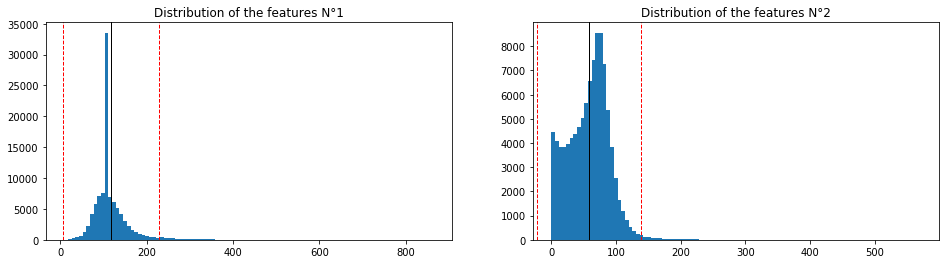

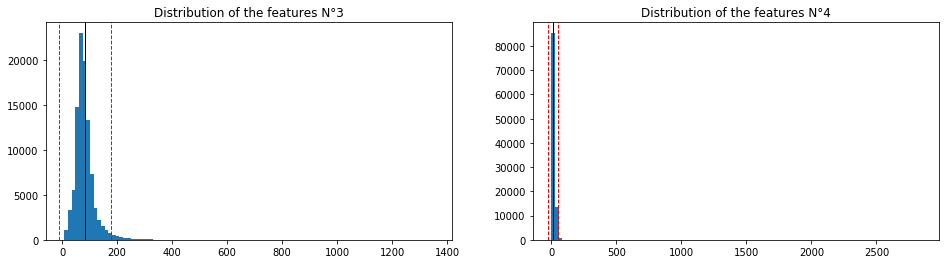

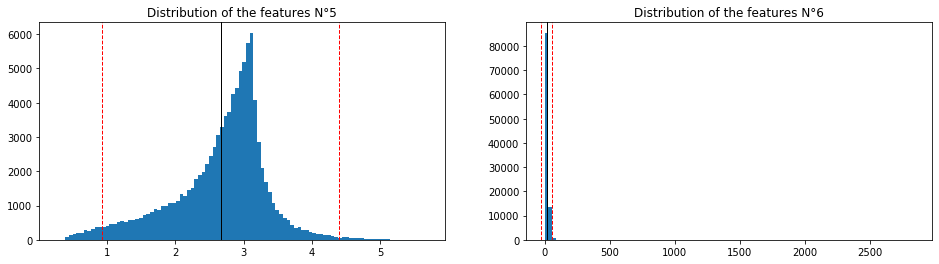

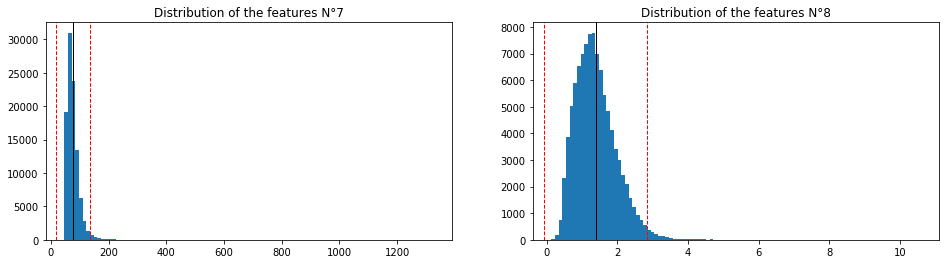

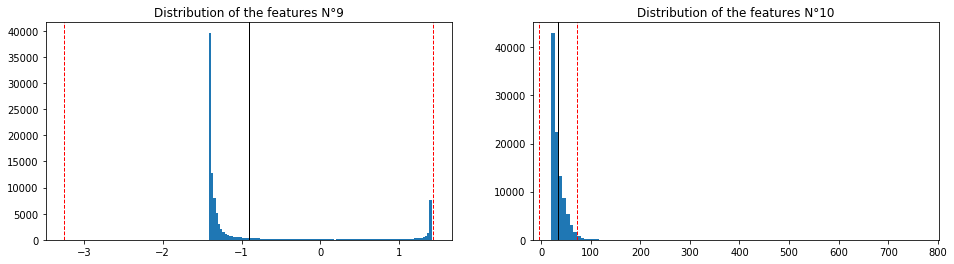

...

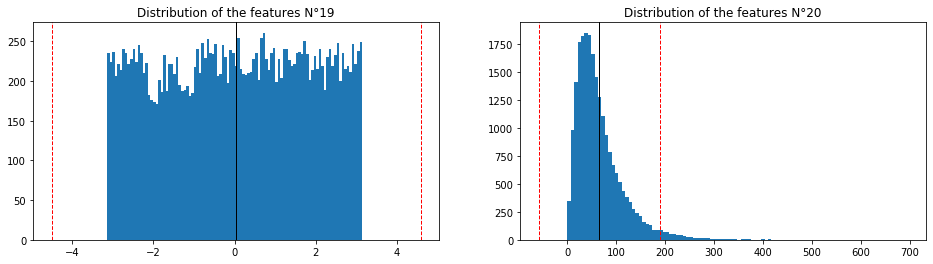

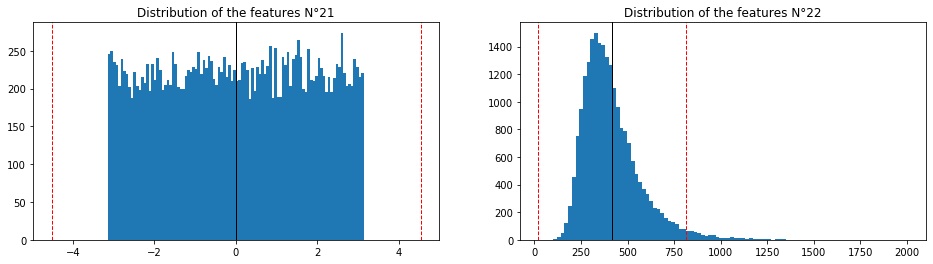

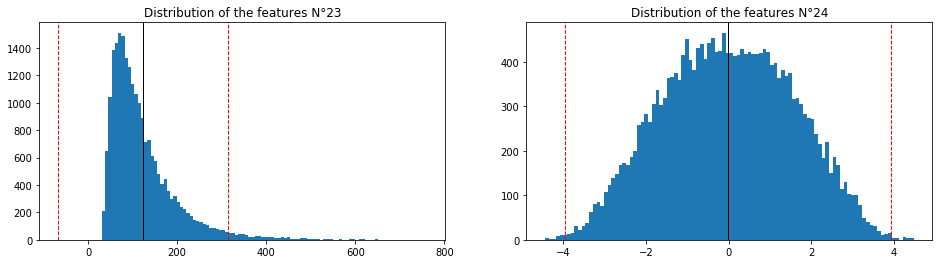

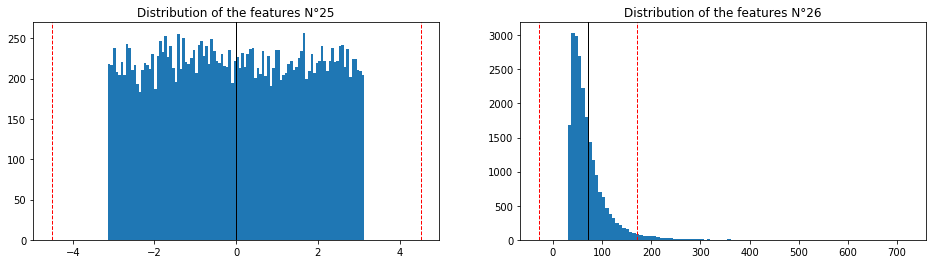

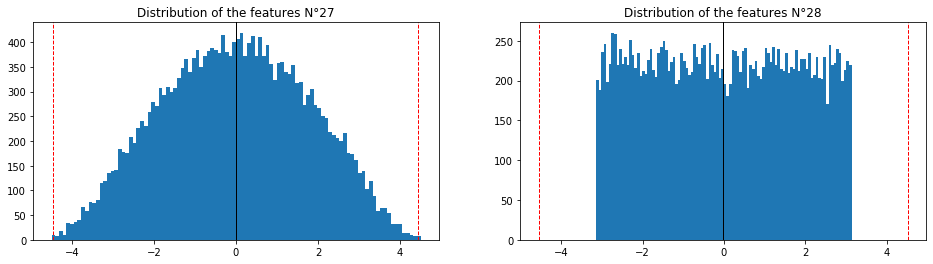

In [13]:
#Plotting histograms of the features
for i in range(0,np.size(ss0_tX,1)-1,2):
    histo_visualization(ss0_tX[:,i], ss0_tX[:,i+1],i, 2.5)

for i in range(0,np.size(ss1_tX,1)-1,2):
    histo_visualization(ss1_tX[:,i], ss1_tX[:,i+1],i, 2.5)
    
for i in range(0,np.size(ss2_tX,1)-1,2):
    histo_visualization(ss2_tX[:,i], ss2_tX[:,i+1],i, 2.5)
    
for i in range(0,np.size(ss3_tX,1)-1,2):
    histo_visualization(ss3_tX[:,i], ss3_tX[:,i+1],i, 2.5)

In [22]:
#Outliers
ss0_tX_outliers, ss0_y_outliers = outliers_suppresion(ss0_tX, ss0_y, 3)
ss1_tX_outliers, ss1_y_outliers = outliers_suppresion(ss1_tX, ss1_y, 3)
ss2_tX_outliers, ss2_y_outliers = outliers_suppresion(ss2_tX, ss2_y, 3)
ss3_tX_outliers, ss3_y_outliers = outliers_suppresion(ss3_tX, ss3_y, 3)

size of the dataset with (99913, 18) and without (94109, 18) the outliers
Number of sample suppressed ouside 3 std: 5804
size of the dataset with (77544, 22) and without (70577, 22) the outliers
Number of sample suppressed ouside 3 std: 6967
size of the dataset with (50379, 29) and without (43060, 29) the outliers
Number of sample suppressed ouside 3 std: 7319
size of the dataset with (22164, 29) and without (18922, 29) the outliers
Number of sample suppressed ouside 3 std: 3242


## Model selection and Optimisation

In [156]:
# Choosing the subset on which to test models
from implementations import * 
ss0_tX, ss0_y, ss1_tX, ss1_y, ss2_tX, ss2_y, ss3_tX, ss3_y, labels_feat = split_subsets(tX, y,labels_feature)


Subset 0 contains 99913 samples 
Subset 1 contains 77544 samples 
Subset 2 contains 50379 samples 
Subset 3 contains 22164 samples 
Remaining features for subset 2, 3: ['DER_mass_MMC' 'DER_mass_transverse_met_lep' 'DER_mass_vis' 'DER_pt_h'
 'DER_deltaeta_jet_jet' 'DER_mass_jet_jet' 'DER_prodeta_jet_jet'
 'DER_deltar_tau_lep' 'DER_pt_tot' 'DER_sum_pt' 'DER_pt_ratio_lep_tau'
 'DER_met_phi_centrality' 'DER_lep_eta_centrality' 'PRI_tau_pt'
 'PRI_tau_eta' 'PRI_tau_phi' 'PRI_lep_pt' 'PRI_lep_eta' 'PRI_lep_phi'
 'PRI_met' 'PRI_met_phi' 'PRI_met_sumet' 'PRI_jet_leading_pt'
 'PRI_jet_leading_eta' 'PRI_jet_leading_phi' 'PRI_jet_subleading_pt'
 'PRI_jet_subleading_eta' 'PRI_jet_subleading_phi' 'PRI_jet_all_pt']
Remaining features for subset 1: ['DER_mass_MMC' 'DER_mass_transverse_met_lep' 'DER_mass_vis' 'DER_pt_h'
 'DER_deltar_tau_lep' 'DER_pt_tot' 'DER_sum_pt' 'DER_pt_ratio_lep_tau'
 'DER_met_phi_centrality' 'PRI_tau_pt' 'PRI_tau_eta' 'PRI_tau_phi'
 'PRI_lep_pt' 'PRI_lep_eta' 'PRI_lep_phi' 'PRI_

In [157]:
ss_tX_outliers, ss_y_outliers = outliers_suppresion(ss1_tX, ss1_y, 3)
_, ss_tX_nocorrfeat, _, _, _ = remove_correlated_feat(ss0_tX, ss1_tX, ss2_tX, ss3_tX, labels_feat)
ss_tX_un, ss_y_un = replace_undef_feat(ss1_tX,ss1_y,method = 'median')

ss_tX = ss1_tX
ss_y = ss1_y 

size of the dataset with (77544, 22) and without (70839, 22) the outliers
Number of sample suppressed ouside 3 std: 6705
Deleted features for subset 0 : DER_pt_h
Deleted features for subset 1 : ['DER_pt_h' 'PRI_jet_leading_pt' 'PRI_jet_all_pt']
Deleted features for subset 2 : ['PRI_met_sumet' 'PRI_jet_leading_pt' 'PRI_jet_all_pt']
Deleted features for subset 3 : ['DER_sum_pt' 'PRI_met_sumet' 'PRI_jet_leading_pt']


## Ridge regression

In [165]:
# test 1 : degree 1 rmse, all features, not removal of outliers , undef  
# Using rmse with non equal classes

lambdas = np.logspace(-3, 0, 30) #avant-3 c'est constant
loss_tr1, loss_te1, w1, acc1 = cross_validation_demo(ss_y, ss_tX, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  3.10690809e-02 -2.18747209e-01 -2.44189959e-01
 -9.10337307e-02  2.36203300e-01  5.39884325e-02  1.24622063e-01
 -1.73080251e-01  1.40392389e-01  1.51625650e-01  3.42527923e-03
 -3.83143387e-03  2.18983965e-01 -6.05423775e-03 -1.84193769e-04
  8.30590475e-02  2.25966684e-03 -4.42380110e-02  5.43918947e-03
 -8.51833777e-04 -5.16214795e-03  5.44228323e-03]
Ridge regression: w=[-2.85121014e-01  3.00972027e-02 -2.18009707e-01 -2.42053735e-01
 -8.21976878e-02  2.34665477e-01  5.27407907e-02  1.19234911e-01
 -1.60975780e-01  1.42305540e-01  1.56359613e-01  4.84378005e-03
 -5.93283184e-03  2.10512538e-01 -7.54202480e-03  2.07768247e-03
  8.50566200e-02  4.23283567e-03 -4.07504305e-02 -1.33473168e-05
 -5.13301377e-04 -1.10463406e-03 -1.18026900e-05]
Ridge regression: w=[-0.28705164  

 -5.16777551e-04 -1.09260441e-03  1.88048394e-04]
Ridge regression: w=[-0.28614184  0.03514658 -0.21668612 -0.24198049 -0.08161129  0.23485605
  0.053548    0.11969545 -0.16214727  0.13964167  0.15645669  0.00871051
 -0.00311007  0.20683255 -0.01031506  0.00136143  0.08973798  0.00488465
 -0.04325275  0.00254004 -0.0015554  -0.00075685  0.00254133]
Ridge regression: w=[-2.82196607e-01  3.26561981e-02 -2.18308870e-01 -2.45869836e-01
 -7.63857102e-02  2.38598230e-01  5.13046302e-02  1.20561910e-01
 -1.64122310e-01  1.36129310e-01  1.58387027e-01  9.35344803e-04
 -3.12869758e-03  2.12981001e-01 -8.76034156e-03 -4.44977999e-04
  8.35126937e-02  3.11040562e-03 -3.89291341e-02 -7.81974367e-04
 -2.33718601e-04 -1.68204108e-03 -7.79933306e-04]
Ridge regression: w=[-0.28251736  0.03261786 -0.21682623 -0.23555317 -0.09090855  0.23135578
  0.05613022  0.11887965 -0.15854255  0.14344501  0.15546934  0.00250337
 -0.00160944  0.19923136 -0.00628169  0.00203552  0.08448948  0.0062128
 -0.03549538  0.

Ridge regression: w=[-2.80739687e-01  3.22480791e-02 -2.11360473e-01 -2.19519404e-01
 -7.85535218e-02  2.18090241e-01  5.28653492e-02  1.15162697e-01
 -1.54579865e-01  1.39248672e-01  1.50764876e-01  3.30987082e-03
 -3.95294166e-03  1.89811250e-01 -6.04540430e-03 -1.41426619e-04
  7.48905486e-02  2.30866237e-03 -4.01095770e-02  5.97521866e-03
 -8.41347820e-04 -5.04577985e-03  5.97557412e-03]
Ridge regression: w=[-0.28089819  0.03140817 -0.21050626 -0.21764818 -0.07079133  0.21665776
  0.05157824  0.11018503 -0.14360584  0.14107479  0.15488039  0.00454766
 -0.00605797  0.18215868 -0.00736549  0.00204436  0.07688436  0.00421968
 -0.03666409  0.00097014 -0.00052526 -0.00104719  0.00097032]
Ridge regression: w=[-0.28280022  0.03597998 -0.21076087 -0.22283356 -0.07240586  0.2207563
  0.05258739  0.11258771 -0.14845408  0.13876246  0.15532965  0.00851488
 -0.00320849  0.18467337 -0.01020123  0.00127711  0.08305687  0.00485904
 -0.04000599  0.00324938 -0.00160166 -0.00078053  0.00324977]
Ridg

Ridge regression: w=[-2.70351355e-01  3.46434745e-02 -1.95688457e-01 -1.73241073e-01
 -5.54184553e-02  1.83774976e-01  5.00007703e-02  9.75108336e-02
 -1.26105861e-01  1.35834223e-01  1.43721501e-01  3.03379096e-03
 -4.12575521e-03  1.39074816e-01 -5.97186750e-03 -1.56595672e-05
  5.83498523e-02  2.40794195e-03 -3.12274553e-02  7.78905821e-03
 -8.02926518e-04 -4.76691104e-03  7.78916222e-03]
Ridge regression: w=[-0.27050399  0.03403129 -0.19464049 -0.17189848 -0.04954957  0.18257168
  0.04869143  0.09331377 -0.11723964  0.13746376  0.14671185  0.00391499
 -0.00622833  0.13298706 -0.00696507  0.00201305  0.06029153  0.00417571
 -0.02795947  0.00361009 -0.00052707 -0.00090464  0.00361014]
Ridge regression: w=[-0.27233564  0.03812022 -0.19472659 -0.176189   -0.05032221  0.18605504
  0.04956526  0.09540881 -0.12105512  0.13545198  0.14743384  0.00790414
 -0.0034106   0.13461536 -0.00979742  0.00110929  0.06562266  0.00477231
 -0.03104987  0.00572183 -0.00167385 -0.00080678  0.00572194]
Rid

Ridge regression: w=[-2.47612803e-01  4.00164637e-02 -1.71539308e-01 -1.18001534e-01
 -2.35171006e-02  1.40746088e-01  4.16317685e-02  7.42344940e-02
 -9.64267607e-02  1.24994543e-01  1.29232002e-01 -4.08174775e-04
 -3.49395313e-03  8.12580635e-02 -7.64110023e-03 -4.36962453e-05
  3.80842717e-02  3.28408558e-03 -1.36916977e-02  8.32632084e-03
 -5.05377455e-04 -9.71583673e-04  8.32639523e-03]
Ridge regression: w=[-0.24789425  0.03964276 -0.17091997 -0.11493175 -0.02701601  0.13927439
  0.04654577  0.07277756 -0.0945903   0.12962032  0.12717912  0.00147967
 -0.00240337  0.07349478 -0.00574427  0.00158133  0.03746274  0.00576978
 -0.01228076  0.01171421 -0.00141233 -0.00149523  0.01171426]
Accuracy = [0.711439257157596, 0.7149213309259737, 0.7079571833892184, 0.7169202992004127, 0.7084085633221563]
Ridge regression: w=[-0.24100769  0.03970494 -0.16360145 -0.09901916 -0.02037047  0.12592857
  0.04212042  0.0689518  -0.09304684  0.12464374  0.11871493  0.00228803
 -0.00414668  0.06596021 -0

Ridge regression: w=[-0.19447242  0.04578847 -0.12719439 -0.04728481  0.00490977  0.07822468
  0.03047405  0.04609312 -0.07149229  0.10506619  0.0890905   0.00406347
 -0.00326267  0.01636065 -0.0065207   0.00090809  0.01262114  0.00387409
  0.00300612  0.01737396 -0.00136307 -0.00061669  0.01737397]
Ridge regression: w=[-0.19179109  0.04499407 -0.12771018 -0.04744711  0.00447612  0.07806703
  0.02886389  0.04645014 -0.071792    0.10294403  0.09016211 -0.00133647
 -0.00321433  0.01859711 -0.00603825  0.00026568  0.00984691  0.00314077
  0.00514048  0.01615014 -0.00059843 -0.00044422  0.01615016]
Ridge regression: w=[-0.19200909  0.04488292 -0.12834144 -0.04697775  0.00338861  0.07779252
  0.03278259  0.04552049 -0.07137544  0.10614289  0.08909025  0.00039248
 -0.00245042  0.01419375 -0.00463205  0.00136248  0.00996716  0.00484867
  0.00594154  0.01793138 -0.00133984 -0.00120601  0.01793139]
Accuracy = [0.7107299458344081, 0.7151147794686613, 0.7033789012122775, 0.7169202992004127, 0.705

Ridge regression: w=[-0.11165194  0.03978491 -0.08012754 -0.01357633  0.01604806  0.03325455
  0.01538485  0.02776102 -0.04892772  0.06893442  0.05290957  0.00144235
 -0.00220455 -0.00794935 -0.00365535  0.00079487  0.00025562  0.00254118
  0.01325764  0.01917795 -0.00081395 -0.00040342  0.01917795]
Ridge regression: w=[-0.11011252  0.03940075 -0.08006679 -0.01343858  0.01564395  0.03309801
  0.01438117  0.02790189 -0.04901501  0.06763156  0.05352662 -0.0015255
 -0.00219229 -0.00695146 -0.00378438  0.00033798 -0.00153212  0.00233179
  0.01400279  0.01859381 -0.00055714 -0.00014936  0.01859382]
Ridge regression: w=[-0.11023768  0.0395131  -0.08103096 -0.01384056  0.01538442  0.03294808
  0.0165449   0.02740063 -0.04921658  0.0694637   0.05320073 -0.0004258
 -0.00173048 -0.00910507 -0.002943    0.00103025 -0.00098724  0.00314281
  0.0144976   0.01930791 -0.00095276 -0.00080304  0.01930792]
Accuracy = [0.7039592468403405, 0.7095047717307196, 0.6991875161207118, 0.7109233943770957, 0.70047

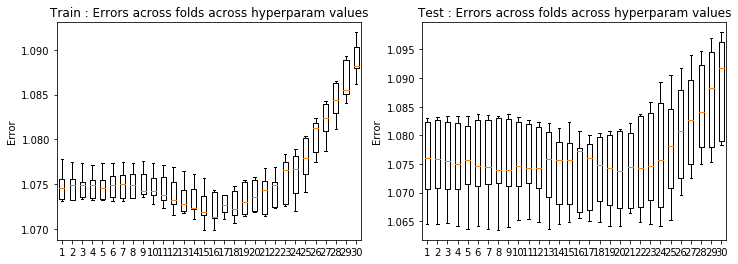

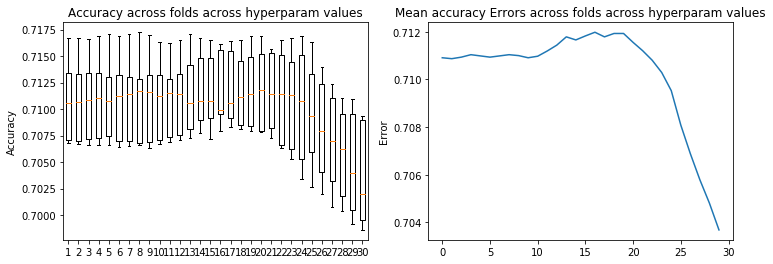

In [195]:
from implementations import * 
result_crossval(loss_tr1,loss_te1) #avec undefinde
result_crossval_accuracy(acc1)


In [196]:
# test 2 : degree 2 rmse, all features, not removal of outliers, undef  
lambdas = np.logspace(-8, 0, 30) #de -15 a -10 c'est constant
loss_tr2, loss_te2, w1, acc2 = cross_validation_demo(ss_y, ss_tX, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse', method = 'rr',hyperparams=[lambdas])

Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.85530043e-01  9.10480010e-02 -2.84356556e-01 -2.23865337e-01
 -1.04155192e-01  7.11544739e-01  2.62057979e-02 -7.50775561e-01
 -1.59065324e-01  9.87073020e-02  5.72667864e-01  1.99833929e-03
 -3.00127541e-03  5.08003962e-01 -9.29614702e-04 -2.45176034e-03
  5.50791531e-02  3.77063503e-03  6.30874723e-02  2.84443212e-01
 -2.22030322e-03 -3.90262637e-03  4.67581520e-01  6.30619986e-02
  1.34867011e-01  5.81753701e-02  1.89177162e-01 -5.03089584e-01
  8.06802411e-03  2.62141517e-01  9.89821271e-02  2.09149688e-02
 -2.48222558e-01 -3.63409066e-02 -7.05490313e-04 -2.39797451e-01
 -6.90840796e-02  6.77699073e-03 -1.45642020e-02 -1.82674039e-04
 -1.19043872e-01 -2.17242034e-01  1.60866004e-01  2.29451596e-03
 -1.49737990e-01]
Ridge regression: w=[-2.85691250e-01  8.40366622e-02 -2.81101761e-01 -2

Ridge regression: w=[-2.85691236e-01  8.40359645e-02 -2.81101677e-01 -2.15370167e-01
 -9.93795686e-02  7.24900730e-01  2.16249747e-02 -1.90497457e-02
 -1.25857545e-01  1.01007397e-01  3.54304281e-01  4.92350531e-03
 -4.97439717e-03  2.49174585e-01 -4.01547962e-03 -2.24822685e-04
  5.70521979e-02  4.85142667e-03  5.67367733e-02  1.08831573e-01
 -1.10794435e-03 -7.39061731e-04  1.35032736e-01  5.86722008e-02
  1.33133502e-01  6.10557027e-02  1.92526390e-01 -5.22208842e-01
  1.17899580e-02  2.40282673e-01  8.34952424e-02  2.13758585e-02
 -2.54205731e-01 -4.17906497e-02 -2.21400596e-03 -2.30257367e-01
 -6.86141332e-02  5.06647842e-03 -1.33936673e-02 -3.34516162e-03
 -1.03272779e-01 -2.06149514e-01  1.60460181e-01 -3.55186874e-04
 -1.62406513e-01]
Ridge regression: w=[-2.87625721e-01  7.98658811e-02 -2.75857397e-01 -2.34460000e-01
 -1.01129082e-01  7.22368593e-01  2.92203171e-02 -3.36016432e-02
 -1.13060592e-01  9.77283594e-02  3.92767394e-01  7.99811176e-03
 -1.77814922e-03  2.39740815e-01

Ridge regression: w=[-2.87625669e-01  7.98633127e-02 -2.75857181e-01 -2.34457266e-01
 -1.01125614e-01  7.22361157e-01  2.92206341e-02  1.28620125e-01
 -1.13061023e-01  9.77285165e-02  3.40566302e-01  7.99814064e-03
 -1.77815962e-03  1.86729356e-01 -6.46802929e-03  1.16280509e-04
  6.20309661e-02  4.77452677e-03  6.77050934e-02  6.14590133e-02
 -1.82497803e-03 -5.79226047e-04  8.24115597e-02  5.27630324e-02
  1.29838490e-01  6.83076291e-02  2.02757738e-01 -5.06373481e-01
  4.27458194e-03  2.61581303e-01  7.51692056e-02  2.07173934e-02
 -2.78583460e-01 -4.01483341e-02  3.30590155e-03 -2.23336230e-01
 -6.71568774e-02  3.68116560e-03 -1.72391937e-02 -8.75932436e-04
 -1.25320201e-01 -1.95684317e-01  1.59576522e-01  2.39725631e-03
 -1.82938414e-01]
Ridge regression: w=[-2.83659974e-01  7.83760763e-02 -2.81835453e-01 -2.18682071e-01
 -7.43534976e-02  7.15125005e-01  3.23410680e-02  1.88836408e-01
 -1.29979075e-01  9.46485321e-02  2.77387710e-01 -2.06631009e-04
 -1.91524829e-03  1.82584207e-01

Ridge regression: w=[-2.83659790e-01  7.83665132e-02 -2.81834428e-01 -2.18673042e-01
 -7.43440643e-02  7.15099361e-01  3.23420619e-02  1.83375971e-01
 -1.29978936e-01  9.46492714e-02  2.79152797e-01 -2.06523011e-04
 -1.91527455e-03  1.84372028e-01 -3.31925848e-03 -1.26106070e-03
  5.42669288e-02  4.08156590e-03  5.89666493e-02  3.74658163e-02
 -1.07110072e-03 -7.42705449e-04  4.77923319e-02  5.04726695e-02
  1.37045474e-01  5.07897986e-02  1.56577515e-01 -5.03692956e-01
 -6.82516733e-04  2.44202022e-01  7.48720689e-02  2.22757350e-02
 -2.42093769e-01 -4.12115144e-02  1.42711480e-03 -2.22968435e-01
 -6.52160287e-02  4.59545149e-04 -1.60896293e-02 -4.43630743e-04
 -1.09631097e-01 -1.67278210e-01  1.58560010e-01  2.88242190e-03
 -1.60928290e-01]
Ridge regression: w=[-2.83982204e-01  7.42918288e-02 -2.74532303e-01 -2.08077059e-01
 -9.92361239e-02  7.21943476e-01  3.19292991e-02  1.61500710e-01
 -1.64248347e-01  1.01573596e-01  2.83168345e-01  9.56987135e-04
 -1.22151838e-03  2.24876401e-01

Ridge regression: w=[-2.83981546e-01  7.42577509e-02 -2.74529963e-01 -2.08039941e-01
 -9.91964452e-02  7.21847688e-01  3.19335577e-02  1.82460692e-01
 -1.64231429e-01  1.01576135e-01  2.76486123e-01  9.57375707e-04
 -1.22160881e-03  2.17979830e-01 -1.73230082e-03  7.00766209e-04
  6.40661288e-02  6.78841691e-03  7.17947378e-02  4.89480915e-02
 -1.08024039e-03 -1.13867296e-03  5.09757990e-02  4.77040530e-02
  1.24155672e-01  4.98139433e-02  1.74318359e-01 -5.17090556e-01
  4.88229907e-03  2.12353484e-01  1.14888465e-01  2.31756536e-02
 -2.39101006e-01 -3.99229258e-02 -2.01160844e-03 -2.56256158e-01
 -6.63308530e-02 -5.49030390e-04 -2.57149949e-02 -2.23752158e-03
 -1.22824285e-01 -1.54982361e-01  1.58458283e-01 -2.17816505e-03
 -1.53590971e-01]
Accuracy = [0.7507093113231881, 0.7576089760123808, 0.748581377353624, 0.7574800103172556, 0.7504513799329379]
Ridge regression: w=[-2.85528313e-01  9.09457252e-02 -2.84349996e-01 -2.23771132e-01
 -1.04046476e-01  7.11297176e-01  2.62170359e-02  1

Ridge regression: w=[-2.85523867e-01  9.06829787e-02 -2.84333003e-01 -2.23528955e-01
 -1.03769036e-01  7.10661339e-01  2.62457098e-02  1.87339198e-01
 -1.59010403e-01  9.87316813e-02  2.68656369e-01  2.00216524e-03
 -3.00261918e-03  2.00524276e-01 -9.33248211e-04 -2.45128959e-03
  5.51423645e-02  3.76918518e-03  6.29140360e-02  5.18296231e-02
 -2.22108415e-03 -3.90174574e-03  5.19987712e-02  6.26927320e-02
  1.34813794e-01  5.79012491e-02  1.88372131e-01 -5.02282692e-01
  8.03896622e-03  2.60407869e-01  9.88207624e-02  2.09393132e-02
 -2.47674422e-01 -3.63502859e-02 -7.06172892e-04 -2.39144928e-01
 -6.90958639e-02  6.77617901e-03 -1.47066526e-02 -1.83854065e-04
 -1.18838065e-01 -1.82608147e-01  1.60868309e-01  2.29492551e-03
 -1.82545808e-01]
Ridge regression: w=[-2.85685070e-01  8.37224745e-02 -2.81067408e-01 -2.15065202e-01
 -9.89821521e-02  7.24027927e-01  2.16653315e-02  1.86509506e-01
 -1.25864035e-01  1.01028322e-01  2.87800139e-01  4.92645861e-03
 -4.97574790e-03  1.81973311e-01

Ridge regression: w=[-2.85669222e-01  8.29252643e-02 -2.80979748e-01 -2.14284114e-01
 -9.79759649e-02  7.21794916e-01  2.17676352e-02  1.86767352e-01
 -1.25875881e-01  1.01082144e-01  2.87445616e-01  4.93397712e-03
 -4.97919426e-03  1.81698156e-01 -4.02822516e-03 -2.20514658e-04
  5.71823047e-02  4.84898659e-03  5.61010729e-02  5.04261520e-02
 -1.11064257e-03 -7.39248460e-04  5.04503208e-02  5.75412259e-02
  1.32900050e-01  6.01317488e-02  1.89672095e-01 -5.19352621e-01
  1.16796169e-02  2.34739627e-01  8.30702443e-02  2.14578538e-02
 -2.52390666e-01 -4.18283133e-02 -2.21035864e-03 -2.28198781e-01
 -6.86550980e-02  5.07321721e-03 -1.37571713e-02 -3.34631483e-03
 -1.02501539e-01 -1.81294305e-01  1.60466542e-01 -3.47565942e-04
 -1.81253991e-01]
Ridge regression: w=[-2.87603558e-01  7.87892722e-02 -2.75760902e-01 -2.33302295e-01
 -9.96933136e-02  7.19242564e-01  2.93490339e-02  1.91441090e-01
 -1.13234061e-01  9.77986676e-02  3.19762840e-01  8.00966565e-03
 -1.78254480e-03  1.66063692e-01

Ridge regression: w=[-2.87546734e-01  7.61413718e-02 -2.75513909e-01 -2.30374920e-01
 -9.61943582e-02  7.11362326e-01  2.96638077e-02  1.90744966e-01
 -1.13619529e-01  9.79788785e-02  3.18502209e-01  8.03856669e-03
 -1.79374278e-03  1.65864396e-01 -6.52124174e-03  1.14248483e-04
  6.25266437e-02  4.76821992e-03  6.53477595e-02  4.90959563e-02
 -1.84189541e-03 -5.78811512e-04  4.91153375e-02  4.89638200e-02
  1.29111396e-01  6.48294461e-02  1.92684688e-01 -4.96359436e-01
  3.98500449e-03  2.41528838e-01  7.37061431e-02  2.10219898e-02
 -2.71850076e-01 -4.02816499e-02  3.29639718e-03 -2.15956870e-01
 -6.73012613e-02  3.68456371e-03 -1.86788682e-02 -8.93937288e-04
 -1.22439064e-01 -1.78518823e-01  1.59608335e-01  2.40647831e-03
 -1.78507089e-01]
Ridge regression: w=[-2.83582128e-01  7.44998416e-02 -2.81408926e-01 -2.14922699e-01
 -7.05764891e-02  7.04487046e-01  3.27398105e-02  1.80370396e-01
 -1.29851865e-01  9.49580490e-02  2.78933946e-01 -1.62226430e-04
 -1.92661675e-03  1.84342823e-01

Ridge regression: w=[-2.83382677e-01  6.58666043e-02 -2.80357779e-01 -2.05755463e-01
 -6.24750389e-02  6.78813153e-01  3.35982332e-02  1.78102123e-01
 -1.29066555e-01  9.57238643e-02  2.76802071e-01 -5.90822210e-05
 -1.95685150e-03  1.81862171e-01 -3.51446622e-03 -1.22077982e-03
  5.57301722e-02  4.05556017e-03  5.34027759e-02  4.17548543e-02
 -1.12788613e-03 -7.15192249e-04  4.17644211e-02  3.75703491e-02
  1.34079650e-01  4.01227751e-02  1.30646063e-01 -4.70696743e-01
 -1.62899155e-03  1.87896212e-01  6.97791306e-02  2.32379313e-02
 -2.22943904e-01 -4.16144723e-02  1.37833753e-03 -2.00123881e-01
 -6.57291313e-02  4.48291910e-04 -1.90397213e-02 -5.28835165e-04
 -1.03009290e-01 -1.35697602e-01  1.58633624e-01  2.89553166e-03
 -1.35691713e-01]
Ridge regression: w=[-2.83704776e-01  6.17791210e-02 -2.73528127e-01 -1.93305196e-01
 -8.52936387e-02  6.83929695e-01  3.34322214e-02  1.86181405e-01
 -1.57390020e-01  1.02607007e-01  2.74290304e-01  1.10793734e-03
 -1.26045693e-03  2.06301231e-01

Ridge regression: w=[-2.82995751e-01  4.15916300e-02 -2.70850633e-01 -1.62588901e-01
 -6.44339479e-02  6.04586707e-01  3.56253007e-02  1.76876884e-01
 -1.43400716e-01  1.04806766e-01  2.72705903e-01  1.40737573e-03
 -1.35499122e-03  1.85542389e-01 -2.22944044e-03  8.05849120e-04
  6.66444083e-02  6.68356927e-03  5.38221847e-02  4.18955682e-02
 -1.20771962e-03 -1.07630970e-03  4.18973990e-02  1.26237570e-02
  1.15487192e-01  1.34993661e-02  9.32191315e-02 -4.13429754e-01
  1.83126831e-03  9.48405162e-02  9.02042851e-02  2.71719434e-02
 -2.00341408e-01 -4.13883671e-02 -1.94164859e-03 -1.88036575e-01
 -6.79696253e-02 -4.39286619e-04 -2.69612160e-02 -2.31735576e-03
 -1.00894470e-01 -8.63605785e-02  1.58676291e-01 -1.93937412e-03
 -8.63593621e-02]
Accuracy = [0.7482589631158112, 0.7570286303843178, 0.7481944802682486, 0.7559324219757545, 0.7494841372194996]
Ridge regression: w=[-2.83663349e-01  3.79975342e-02 -2.76327539e-01 -1.51962365e-01
 -5.28062025e-02  5.24171421e-01  3.15557377e-02  

Ridge regression: w=[-0.27898995  0.01850242 -0.25627971 -0.07972757 -0.02481447  0.33272546
  0.03222131  0.14185981 -0.11543232  0.10906879  0.22884529  0.00334775
 -0.00344602  0.11609582 -0.00246223 -0.00194528  0.05661157  0.0032188
  0.02970442  0.04296818 -0.00244418 -0.00331257  0.04296833 -0.01895979
  0.09212559 -0.05782249  0.00197158 -0.17446606  0.00390839  0.00854163
  0.04167027  0.03489222 -0.12364575 -0.04119415 -0.00117839 -0.06332998
 -0.07395591  0.00592507 -0.00559995 -0.00046788 -0.07645576 -0.04066364
  0.16028657  0.00212661 -0.04066358]
Ridge regression: w=[-2.79147468e-01  1.93021533e-02 -2.52739256e-01 -7.68812112e-02
 -1.88293874e-02  3.40451739e-01  2.79781324e-02  1.39304769e-01
 -1.05499098e-01  1.10772968e-01  2.34904774e-01  5.83453040e-03
 -5.50665148e-03  1.10066782e-01 -5.31442098e-03  3.92146366e-04
  5.59588528e-02  4.56823154e-03  2.86664014e-02  3.97681391e-02
 -1.33315263e-03 -4.87719626e-04  3.97682032e-02 -1.61370541e-02
  8.99843030e-02 -5.36

Ridge regression: w=[-2.65458282e-01  2.14047643e-02 -2.05163648e-01 -2.75253506e-02
  6.81532838e-03  1.75975338e-01  2.87909479e-02  1.06835306e-01
 -9.78439497e-02  1.09524617e-01  1.75822999e-01  8.47467867e-03
 -2.54136879e-03  6.31810115e-02 -7.97972109e-03  3.80738973e-04
  4.39884441e-02  4.52503493e-03  2.31344327e-02  4.25929969e-02
 -2.27429645e-03 -1.86368020e-04  4.25930640e-02 -2.52022644e-02
  4.68314227e-02 -9.00772453e-02 -2.63371649e-02 -4.83815949e-02
  6.24342336e-03 -1.14728846e-02  1.40591233e-02  4.37903506e-02
 -6.71119226e-02 -4.79021727e-02  2.40196659e-03 -1.33159282e-03
 -7.28631629e-02  2.65324715e-03  1.59556932e-02 -1.16628764e-03
 -5.74147358e-02 -3.38417124e-02  1.52592967e-01  1.99431335e-03
 -3.38416725e-02]
Ridge regression: w=[-2.61798225e-01  1.87339307e-02 -2.07729514e-01 -2.68541026e-02
  8.16070524e-03  1.77485827e-01  2.97951545e-02  1.05955210e-01
 -9.49594217e-02  1.07993033e-01  1.74784694e-01  1.01530924e-03
 -2.69788949e-03  6.57156388e-02

Ridge regression: w=[-2.18873938e-01  2.63657060e-02 -1.40786366e-01 -3.06719643e-03
  1.87479617e-02  8.73234690e-02  2.26283310e-02  6.76740911e-02
 -7.37964455e-02  1.03451514e-01  1.12708975e-01  1.64939575e-03
 -1.85133403e-03  2.41377658e-02 -3.96713702e-03  1.23855346e-03
  2.25464027e-02  5.46256575e-03  2.01212608e-02  3.42723642e-02
 -1.38845834e-03 -7.62495938e-04  3.42723855e-02 -2.95430251e-02
  4.55656082e-03 -7.49653924e-02 -2.09394031e-02 -8.74677878e-04
  1.27926400e-02 -8.49354361e-03 -1.69745502e-03  5.09583373e-02
 -2.18933718e-02 -4.58575960e-02 -1.11932221e-03  8.30179660e-03
 -6.62215098e-02  4.01635626e-05  1.22149900e-02 -1.55053054e-03
 -2.78555084e-02 -2.06090013e-02  1.28165349e-01 -4.84075853e-04
 -2.06089856e-02]
Accuracy = [0.7371679133350528, 0.7418751612071189, 0.7337503224142378, 0.7437451637864329, 0.7383286045911788]
Ridge regression: w=[-1.82862906e-01  2.83970427e-02 -1.09438097e-01 -2.65982876e-03
  1.93398597e-02  5.92712489e-02  1.66321706e-02  

Ridge regression: w=[-9.52304187e-02  2.64439004e-02 -6.00002210e-02 -1.71433315e-03
  1.54581901e-02  2.44182490e-02  9.48101585e-03  2.38434214e-02
 -3.56163031e-02  5.63298663e-02  4.18469562e-02  2.64069710e-04
 -2.78387692e-03 -3.39441616e-03 -2.28291968e-03  1.12786533e-03
  1.52178627e-03  2.14860350e-03  1.27960757e-02  1.65455942e-02
 -4.14903951e-04  4.43175987e-05  1.65455955e-02 -2.65942946e-02
 -2.16775223e-02 -2.26584245e-02  1.97540322e-03  5.84460703e-03
  8.41644248e-03  4.97936673e-03 -1.55086147e-02  3.11826323e-02
  8.73511109e-03 -2.67865165e-02 -9.11574455e-04 -2.94121340e-03
 -3.53515397e-02  1.62804283e-03  1.64807624e-03 -1.14129811e-03
  9.13579419e-04  1.13010020e-03  5.72948763e-02 -2.44726577e-04
  1.13010263e-03]
Ridge regression: w=[-0.09587525  0.02713751 -0.06025595 -0.00215348  0.01601475  0.0246156
  0.00986899  0.02438001 -0.03635055  0.05617834  0.04197973  0.00134402
 -0.00161456 -0.00363553 -0.0028603   0.00065396  0.00273911  0.00218688
  0.01258

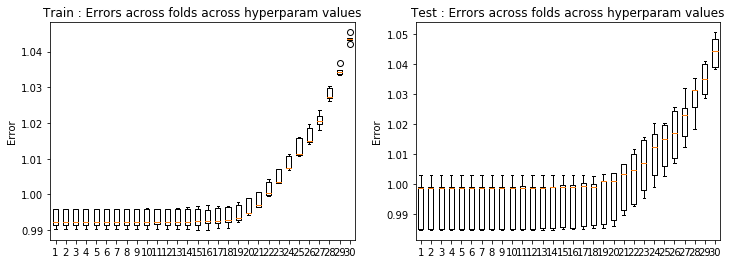

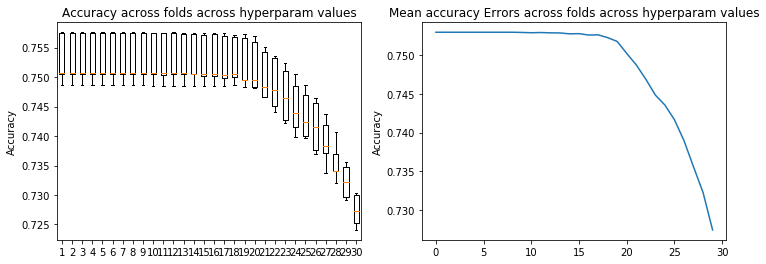

In [197]:
result_crossval(loss_tr2,loss_te2)
result_crossval_accuracy(acc2)

In [198]:
# test 3 : degree 3 rmse, all features, not removal of outliers, undef  
lambdas = np.logspace(-5, 0, 30)
loss_tr3, loss_te3, w3, acc3 = cross_validation_demo(ss_y, ss_tX, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.85524339e-01  8.47151699e-01 -3.12364860e-01 -2.32433899e-01
 -1.63177341e-01  1.15288968e+00  4.27639424e-02  3.21960019e-01
 -1.80863087e-01 -7.34751457e-03  4.95368803e-01 -5.85516401e-03
  1.04011419e-02  3.65480466e-01  5.43583861e-03  1.83372772e-02
  9.17304134e-02  4.14156578e-03  1.00320443e-01  6.21988671e-02
  6.58510337e-04  1.20203217e-02  6.23197582e-02 -4.60401946e-01
  1.62929846e-01 -1.45597626e-01  2.96773618e-01 -1.56031720e+00
 -3.39549058e-02  2.44591280e-01  2.70582363e-01  1.84138734e-02
 -6.71380299e-01 -3.58182219e-02  1.27078162e-04 -6.86044637e-01
 -6.89305019e-02  7.34591694e-03 -8.27211798e-02  4.27429534e-04
 -2.05457581e-01 -3.02096368e-01  1.58840731e-01  3.03929101e-03
 -3.02074598e-01 -1.26687732e+00 -8.55293407e-03  2.01956917e-01
 -5.79922424e-02  6.6121

Ridge regression: w=[-2.83651609e-01  8.35510804e-01 -3.11926923e-01 -2.32019614e-01
 -1.25809590e-01  1.15494185e+00  4.71111963e-02  3.30006579e-01
 -2.49262321e-01 -2.23209394e-02  4.42091171e-01 -2.30301640e-03
  5.57123986e-03  4.22068262e-01 -1.65205677e-03  1.52341327e-02
  8.12392335e-02  1.56123201e-03  1.24301786e-01  7.00196667e-02
 -8.42141035e-03  9.41108597e-03  7.02864827e-02 -5.02500232e-01
  1.71351256e-01 -1.56710341e-01  2.60184762e-01 -1.55396359e+00
 -3.95344810e-02  5.77767732e-02  3.34251547e-01  1.94913529e-02
 -5.60577735e-01 -4.09763742e-02  1.98093381e-03 -6.97872459e-01
 -6.52822951e-02  1.17324963e-03 -7.24861867e-02  1.81798971e-04
 -2.55930690e-01 -2.58924331e-01  1.56670367e-01  3.11658174e-03
 -2.58799273e-01 -1.29753846e+00 -5.28184375e-03  2.14694953e-01
 -3.91854205e-02  6.61639543e-01  3.06970923e-02  6.97218574e-02
 -1.78534778e-01  1.05851032e-01  2.01137105e-01  3.15793228e-03
 -5.52285189e-03  2.98164164e-01 -2.77227730e-03 -1.53267635e-02
  3.5

Ridge regression: w=[-2.85672457e-01  7.92945282e-01 -3.16929410e-01 -2.17868775e-01
 -1.57359862e-01  1.14485669e+00  3.12778979e-02  3.37408079e-01
 -1.98597364e-01 -1.11526511e-02  4.86997145e-01 -2.22971121e-03
 -4.02857522e-04  4.06920413e-01  3.86697449e-04  1.48529069e-02
  8.30253458e-02  8.41988313e-03  7.85737105e-02  6.87657507e-02
 -2.95906560e-03  8.00374535e-03  6.87671793e-02 -4.36926287e-01
  1.84701489e-01 -1.56322960e-01  3.24691297e-01 -1.53325797e+00
 -1.52826704e-02 -1.64500941e-02  2.89873491e-01  1.80759611e-02
 -6.03309510e-01 -4.12719168e-02 -1.30679118e-03 -7.06300576e-01
 -6.85907100e-02  5.92524938e-03 -7.47516833e-02 -2.88583418e-03
 -1.38897718e-01 -2.51379889e-01  1.58745649e-01  2.79667920e-04
 -2.51374650e-01 -1.19302446e+00 -2.46115839e-02  2.13871354e-01
 -8.90458537e-02  6.38992396e-01  2.05558028e-02  1.29697956e-01
 -1.37726535e-01  1.03052846e-01  2.13140636e-01  8.24135572e-03
 -2.39126320e-03  2.96205553e-01 -5.65282414e-03 -1.40387000e-02
  4.1

Ridge regression: w=[-2.83954668e-01  7.47721226e-01 -2.99791535e-01 -1.16604434e-01
 -1.45501434e-01  1.02901244e+00  4.52329663e-02  3.16661598e-01
 -2.32736823e-01 -1.53318489e-02  4.49331113e-01 -1.05369721e-02
  1.08902409e-02  3.85784258e-01  5.20175937e-03  2.13260068e-02
  9.20377732e-02  6.43601843e-03  1.06182226e-01  6.80279411e-02
 -5.61632417e-03  5.25917351e-03  6.80855903e-02 -3.89961403e-01
  1.44457589e-01 -3.14112750e-01  2.64878309e-01 -1.35179639e+00
 -2.91378920e-02  7.62264876e-02  3.46697763e-01  2.19568823e-02
 -5.63145263e-01 -3.95289404e-02 -1.83417971e-03 -6.80845767e-01
 -6.58171249e-02  1.11243572e-04 -7.61326066e-02 -1.27516852e-03
 -2.14583167e-01 -2.42465160e-01  1.56760281e-01 -1.20717568e-03
 -2.42442856e-01 -1.09877500e+00 -1.69894373e-03  2.70942535e-01
 -7.11519599e-02  5.56019804e-01  2.48185121e-02  2.35982038e-02
 -1.99598064e-01  1.07349344e-01  2.06936878e-01  1.17587099e-02
 -1.00751515e-02  3.08249808e-01 -6.77340563e-03 -1.92521838e-02
  3.6

Ridge regression: w=[-2.87563476e-01  7.02090946e-01 -2.99135694e-01 -2.15638103e-01
 -1.40419923e-01  1.02320843e+00  4.67489367e-02  3.40924732e-01
 -8.61641366e-02 -8.57060437e-03  6.57764649e-01  1.54786180e-03
 -2.65359469e-03  2.75864892e-01  1.40399627e-04  1.07882595e-02
  1.01788286e-01 -1.56602374e-03  9.53759736e-02  5.63803993e-02
 -4.84875582e-03 -2.22718235e-03  5.64011014e-02 -3.58978332e-01
  1.48018813e-01 -1.43214875e-01  2.85210502e-01 -1.27435107e+00
 -3.74527281e-02  9.18422573e-02  2.05525892e-01  1.83730899e-02
 -8.61203456e-01 -3.97124010e-02  3.91269426e-03 -5.80863700e-01
 -6.69669276e-02  4.59771724e-03 -1.01866822e-01  1.03458911e-04
 -1.89957154e-01 -2.49404593e-01  1.57940555e-01  3.66969318e-03
 -2.49396216e-01 -1.02531701e+00  4.20876187e-03  1.89351117e-01
 -4.46006318e-02  5.01657623e-01  2.88898082e-02  3.74721113e-02
 -1.33966648e-01  9.71793287e-02  3.37740203e-01  7.07603095e-03
  1.65684012e-03  2.59592831e-01 -7.55532096e-03 -1.23033199e-02
  4.3

Ridge regression: w=[-2.85393344e-01  5.70511763e-01 -3.09360177e-01 -1.49331579e-01
 -1.23368673e-01  8.36780398e-01  4.43526648e-02  3.09647714e-01
 -1.44198283e-01  4.13912530e-03  5.04239999e-01 -6.13114454e-03
  1.00369860e-02  3.09474325e-01  4.81671324e-03  1.76351160e-02
  1.02932133e-01  3.78633311e-03  8.09570306e-02  6.50575983e-02
  8.62207196e-04  1.13527887e-02  6.50628835e-02 -2.88374408e-01
  1.54467500e-01 -2.03661620e-01  1.92466200e-01 -9.41218094e-01
 -3.42246307e-02  7.47296175e-02  2.20929790e-01  2.05618009e-02
 -6.34475534e-01 -3.55111989e-02 -7.13373497e-06 -5.65503927e-01
 -6.91514967e-02  7.15075080e-03 -1.01614858e-01  3.78686115e-04
 -1.67982531e-01 -2.18784465e-01  1.59210746e-01  2.86247708e-03
 -2.18783191e-01 -8.22218363e-01 -4.41261109e-03  2.04362134e-01
  2.20134346e-02  3.27435588e-01  3.23383405e-02  7.68990682e-02
 -1.14775304e-01  8.83613828e-02  2.29470839e-01  8.50113129e-03
 -1.11884278e-02  2.34359998e-01 -6.71244183e-03 -1.78229339e-02
  5.5

Ridge regression: w=[-2.83458097e-01  4.76597057e-01 -3.09127573e-01 -1.27186554e-01
 -7.91488122e-02  7.62956979e-01  4.94538361e-02  3.09025899e-01
 -1.76340232e-01 -6.52351810e-03  4.67860800e-01 -2.68981459e-03
  5.49806018e-03  3.24819481e-01 -2.31213381e-03  1.47763338e-02
  9.38889024e-02  1.30896906e-03  1.02270317e-01  7.38810390e-02
 -8.03526899e-03  9.16997207e-03  7.38924550e-02 -2.72325182e-01
  1.62575546e-01 -2.23824449e-01  1.33153168e-01 -7.87757987e-01
 -3.99978558e-02 -7.78357988e-02  2.49088728e-01  2.27144170e-02
 -5.42236604e-01 -4.05598967e-02  1.90869763e-03 -5.33383261e-01
 -6.56941111e-02  1.00690370e-03 -8.63570815e-02  1.09173627e-05
 -2.14633843e-01 -1.82938451e-01  1.57242156e-01  3.10039989e-03
 -1.82933110e-01 -7.12742627e-01 -3.60933272e-03  2.09695081e-01
  5.05350078e-02  2.46770965e-01  3.04434054e-02  1.31244826e-01
 -1.35554530e-01  9.46221158e-02  1.87268772e-01  3.23934204e-03
 -5.42309816e-03  2.21848896e-01 -1.82103659e-03 -1.48922403e-02
  4.0

Ridge regression: w=[-2.85241689e-01  3.28947857e-01 -3.05519939e-01 -6.91391273e-02
 -7.95255571e-02  6.06115272e-01  3.30418982e-02  2.88835089e-01
 -1.23249152e-01  1.38711322e-02  4.85587045e-01 -2.55205029e-03
 -1.64290382e-03  2.62876496e-01 -3.88098875e-04  1.30328435e-02
  9.69208744e-02  7.03692395e-03  6.83539163e-02  6.67779712e-02
 -2.50146691e-03  6.47973182e-03  6.67781971e-02 -1.58847896e-01
  1.57322005e-01 -2.54833829e-01  1.14209148e-01 -4.93216769e-01
 -1.23957062e-02 -1.10526040e-01  1.94514921e-01  2.34563362e-02
 -5.47996671e-01 -4.10591939e-02 -1.65931604e-03 -4.58662415e-01
 -6.93003272e-02  5.43652802e-03 -8.29874799e-02 -3.06347525e-03
 -1.24328390e-01 -1.47868071e-01  1.59439160e-01 -6.56037337e-05
 -1.47867634e-01 -4.55824245e-01 -1.22608867e-02  2.11539110e-01
  5.15095320e-02  7.90037869e-02  1.74908893e-02  1.52943915e-01
 -9.34473601e-02  8.38542589e-02  1.85879297e-01  8.38101527e-03
 -1.27314603e-03  1.83893127e-01 -4.49342206e-03 -1.24387321e-02
  4.1

Ridge regression: w=[-2.83318305e-01  2.60511083e-01 -2.88101896e-01  1.37757704e-02
 -6.52333667e-02  5.06973192e-01  4.60206891e-02  2.68999619e-01
 -1.20143426e-01  1.27212087e-02  4.58590604e-01 -1.07449842e-02
  9.78671027e-03  2.16722304e-01  4.45817487e-03  2.01243363e-02
  1.00766482e-01  5.51724494e-03  6.91148015e-02  7.44735908e-02
 -5.35670299e-03  4.46200239e-03  7.44760400e-02 -1.14267086e-01
  1.22746343e-01 -3.85335796e-01  5.59391419e-02 -3.33039552e-01
 -2.38423910e-02 -1.11665736e-01  1.81009886e-01  2.67132571e-02
 -4.91029150e-01 -3.94462324e-02 -1.99134728e-03 -3.59865449e-01
 -6.66939680e-02 -1.02625352e-04 -7.99950758e-02 -1.61881067e-03
 -1.33428797e-01 -1.26816285e-01  1.57629547e-01 -1.45066662e-03
 -1.26815114e-01 -3.41398427e-01  4.20148586e-03  2.61871226e-01
  7.21650598e-02  6.48760086e-03  2.03935136e-02  1.09081164e-01
 -9.88767466e-02  8.57914542e-02  1.67836576e-01  1.18908576e-02
 -9.22054150e-03  1.45748754e-01 -5.85620029e-03 -1.84780083e-02
  3.3

Ridge regression: w=[-2.86141842e-01  1.56087533e-01 -2.75470208e-01 -2.60286902e-02
 -3.88939621e-02  4.25034195e-01  4.49102186e-02  2.47924645e-01
 -1.14281846e-01  3.05588518e-02  4.34241593e-01  8.75588439e-04
 -3.64172191e-03  1.80738929e-01 -1.01441555e-03  9.15783323e-03
  1.00804883e-01 -2.24962610e-03  6.58802127e-02  7.06736622e-02
 -4.79948425e-03 -2.18335075e-03  7.06746451e-02 -5.48462206e-02
  1.06558887e-01 -2.74384420e-01  2.99391906e-02 -1.62713756e-01
 -2.51493982e-02 -9.97918675e-02  1.34949468e-01  2.63921541e-02
 -4.59610678e-01 -4.03275662e-02  3.30642406e-03 -2.69040428e-01
 -6.83814162e-02  3.95016204e-03 -8.20801231e-02 -3.52952600e-04
 -1.30896178e-01 -1.14602003e-01  1.59390454e-01  2.94252404e-03
 -1.14601496e-01 -1.78909777e-01  1.57383460e-02  1.90825850e-01
  9.02268322e-02 -8.30098048e-02  1.96069541e-02  1.08036127e-01
 -6.98687562e-02  6.63260515e-02  1.48567409e-01  7.80205387e-03
  2.42969269e-03  9.83892092e-02 -6.31880303e-03 -1.05027935e-02
  3.5

Ridge regression: w=[-2.82291515e-01  8.73585235e-02 -2.57962557e-01 -1.21211002e-02
 -2.47081287e-02  3.46014129e-01  3.87386523e-02  2.04731285e-01
 -1.13436437e-01  5.03592313e-02  3.27869247e-01 -5.43085531e-03
  5.26316374e-03  1.47693740e-01  3.60139415e-03  1.26373974e-02
  8.58453132e-02  1.23859203e-03  5.02728503e-02  7.25557448e-02
  7.25162363e-04  6.77216085e-03  7.25560205e-02 -3.51958400e-02
  6.85143319e-02 -2.48726924e-01 -1.55890451e-02 -5.54987384e-02
 -1.37918728e-02 -7.24975365e-02  8.16474131e-02  2.90269020e-02
 -2.96473473e-01 -3.72207072e-02 -5.89249528e-04 -1.57430502e-01
 -7.10286760e-02  6.58411019e-03 -5.34081113e-02  1.49375974e-04
 -1.03507261e-01 -1.00882737e-01  1.60363715e-01  2.44912957e-03
 -1.00882632e-01 -8.95720255e-02  3.37296547e-02  1.59005039e-01
  8.13888405e-02 -1.29478593e-01  1.60518222e-02  8.11216642e-02
 -2.31887635e-02  5.09791391e-02  7.89766897e-02  8.56262994e-03
 -6.99852007e-03  3.44164510e-02 -5.75523291e-03 -1.38593782e-02
  1.7

Ridge regression: w=[-2.78901058e-01  5.76001412e-02 -2.51335073e-01 -1.15739865e-02
  1.25272102e-03  3.22624760e-01  4.16031100e-02  1.82788818e-01
 -1.10349193e-01  4.95684750e-02  2.89175706e-01 -2.44774264e-03
  1.47490110e-03  1.26549765e-01 -3.16044977e-03  1.05067227e-02
  7.53207769e-02  1.68055536e-04  4.88693223e-02  6.89854321e-02
 -7.28122615e-03  5.88329772e-03  6.89859688e-02 -3.75497228e-02
  6.86150174e-02 -2.26874232e-01 -3.78482507e-02 -2.64994200e-02
 -1.59968088e-02 -7.15092187e-02  7.53528892e-02  3.22407806e-02
 -2.23913388e-01 -4.27847464e-02  1.40396397e-03 -1.12248353e-01
 -6.80100232e-02  5.72236464e-04 -3.45163542e-02 -3.77594369e-04
 -9.99309431e-02 -9.48520647e-02  1.57709168e-01  3.02057246e-03
 -9.48517552e-02 -5.97853081e-02  3.17294988e-02  1.36713681e-01
  6.44893370e-02 -1.40532306e-01  1.17160122e-02  8.35812703e-02
 -3.04119738e-02  5.00919310e-02  4.30749753e-02  3.11385962e-03
 -2.26065041e-03  1.52965293e-02 -1.08289200e-03 -1.14874447e-02
  1.0

Ridge regression: w=[-2.75299303e-01  3.56098196e-02 -2.22284708e-01 -8.17919150e-03
  7.04531784e-04  2.63538435e-01  2.67937851e-02  1.38678077e-01
 -1.00058570e-01  6.86519608e-02  2.25455998e-01 -1.18509734e-03
 -5.95683168e-03  8.83449007e-02 -1.68584636e-03  7.27710001e-03
  6.10942176e-02  3.64641234e-03  3.54247914e-02  5.35411222e-02
 -2.01550432e-03  2.12141009e-03  5.35411656e-02 -2.54970644e-02
  2.98536652e-02 -1.70169783e-01 -3.28217841e-02  2.71434993e-03
  8.67719406e-03 -3.75771409e-02  4.80834322e-02  3.60402590e-02
 -1.28961337e-01 -4.53218313e-02 -2.13819535e-03 -4.44380022e-02
 -7.22867381e-02  4.93278832e-03 -1.20504789e-02 -3.08497012e-03
 -6.70208555e-02 -5.97393519e-02  1.57611438e-01 -3.98010158e-05
 -5.97392810e-02 -2.59946337e-02  4.30590726e-02  9.20981463e-02
  3.73694160e-02 -1.36695203e-01  6.73092165e-04  4.22105661e-02
 -1.12492616e-02  4.09729476e-02  1.74589852e-03  7.36331475e-03
  1.67205305e-03 -1.20379033e-02 -3.46736653e-03 -7.41707372e-03
  2.5

Ridge regression: w=[-2.68886036e-01  2.84643732e-02 -2.05228464e-01 -4.76582813e-03
  2.79283358e-04  2.31422883e-01  3.32318020e-02  1.23280971e-01
 -9.59606578e-02  7.02101216e-02  1.97552327e-01 -6.27370809e-03
  1.33996466e-03  7.52834264e-02  6.47376824e-04  9.74341019e-03
  5.57363396e-02  3.16649162e-03  3.34872626e-02  5.12346480e-02
 -4.32532317e-03 -9.47022691e-04  5.12347593e-02 -2.70087363e-02
  1.04910040e-02 -1.49585785e-01 -3.63873334e-02  1.24840170e-02
  6.77447189e-03 -2.54944635e-02  2.82231740e-02  4.13279839e-02
 -8.96774369e-02 -4.46941654e-02 -1.67309578e-03 -2.38241004e-02
 -7.04616620e-02 -1.63006365e-04 -5.88824560e-03 -1.87040329e-03
 -5.37366963e-02 -4.52694963e-02  1.53759829e-01 -1.20562682e-03
 -4.52694211e-02 -1.66584593e-02  4.68259745e-02  6.49820484e-02
  2.49777032e-02 -1.22612349e-01 -7.46075961e-04  2.60339295e-02
  4.87937432e-03  4.16146806e-02 -1.14044369e-02  9.44801941e-03
 -2.56342754e-03 -2.18839229e-02 -4.16289503e-03 -9.75387474e-03
 -1.5

Ridge regression: w=[-2.55848492e-01  2.27865785e-02 -1.74889177e-01 -8.49816564e-03
  1.01273389e-02  1.62374773e-01  2.69852813e-02  9.07590777e-02
 -8.10326027e-02  7.21104763e-02  1.49351999e-01  2.15626007e-03
 -3.89979228e-03  4.88192079e-02 -3.71832720e-03  4.15275257e-03
  4.17811807e-02  7.62733316e-04  2.05734322e-02  3.84717753e-02
 -3.54944033e-03 -3.57485852e-04  3.84718206e-02 -2.20974916e-02
 -1.01365192e-02 -1.01218157e-01 -1.99596776e-02  2.09667390e-02
  8.40157669e-03 -1.78404695e-03  1.78490047e-03  4.46918695e-02
 -2.36955820e-02 -4.65541025e-02  2.35498164e-03 -2.31894285e-03
 -7.06065283e-02  2.36083671e-03  2.88137060e-03 -1.05061385e-03
 -3.46309709e-02 -2.52475446e-02  1.47353041e-01  1.70709330e-03
 -2.52475176e-02  5.69966813e-04  4.98509940e-02  2.62642235e-02
  7.33505790e-03 -7.95641519e-02  7.94862468e-04  7.68209682e-03
  2.88635969e-03  3.97567871e-02 -3.42835163e-02  7.00556852e-03
  2.06248622e-03 -6.25529528e-03 -4.58496732e-03 -4.84762489e-03
  3.1

Ridge regression: w=[-2.23986463e-01  2.13311412e-02 -1.41344461e-01 -2.55610804e-04
  1.23884231e-02  1.02924399e-01  2.15047396e-02  6.65757996e-02
 -6.96439468e-02  6.89588691e-02  1.11415192e-01 -1.24671123e-04
 -2.04048459e-03  2.82043960e-02 -1.16074852e-03  1.99672410e-03
  2.28510153e-02  1.21195310e-03  1.64085455e-02  3.07463852e-02
 -6.57016437e-04 -2.55353964e-04  3.07464007e-02 -2.21539865e-02
 -2.27975455e-02 -6.59400580e-02 -1.01513432e-02  1.98163225e-02
  1.14842633e-02  5.39329458e-03 -1.14212454e-02  4.77661683e-02
 -2.34127905e-03 -4.19339949e-02 -1.70491961e-03  4.43242238e-03
 -6.76564517e-02  3.45035318e-03  6.17416750e-03 -5.18952323e-04
 -1.87875213e-02 -1.03617398e-02  1.32679466e-01  9.74513016e-04
 -1.03617310e-02  8.60054717e-03  4.22558568e-02 -3.76516340e-03
 -2.54810409e-03 -4.47187312e-02  3.47169536e-03 -4.59999787e-03
  8.12240553e-03  4.39164585e-02 -2.72243239e-02  4.41555662e-03
 -1.27140598e-03 -1.13117892e-03 -3.16136186e-03 -3.53082475e-03
  8.8

Ridge regression: w=[-2.01367002e-01  2.20133260e-02 -1.22556987e-01  6.09164795e-04
  1.59222494e-02  8.17066263e-02  1.98444341e-02  5.51081608e-02
 -6.24945400e-02  6.40417504e-02  9.55863186e-02 -9.04848432e-04
 -2.40571784e-03  1.82558894e-02 -3.64377124e-03  1.42062959e-03
  1.62310199e-02  1.81380252e-03  1.72962551e-02  2.62989226e-02
 -2.57212218e-03  8.21193684e-04  2.62989486e-02 -2.31749134e-02
 -2.14686658e-02 -5.32485496e-02 -5.61536972e-03  1.80909287e-02
  8.99774563e-03  7.53775306e-03 -1.46161743e-02  4.73389547e-02
  7.05051773e-03 -4.38666289e-02 -4.64876644e-06  5.14843664e-03
 -6.12625989e-02 -7.86812151e-04  7.97446725e-03 -8.74758473e-04
 -1.05335609e-02 -6.18015399e-03  1.18984582e-01  1.78545375e-03
 -6.18013612e-03  1.28241531e-02  3.41121554e-02 -1.22388761e-02
 -5.82982019e-03 -3.28369966e-02  1.89528311e-03 -5.63645842e-03
  4.56627951e-03  4.49436494e-02 -2.32417272e-02  1.23279423e-03
 -1.14532827e-04  2.72747527e-03 -2.25858460e-03 -2.48884892e-03
  3.6

Ridge regression: w=[-1.50042355e-01  2.25711768e-02 -8.64432934e-02  2.44067855e-03
  1.60125477e-02  4.71255009e-02  1.38072051e-02  3.69518352e-02
 -4.87265369e-02  5.70755278e-02  6.63616284e-02  5.44592128e-04
 -3.44987831e-03  3.64276184e-03 -2.42251653e-03  1.40146443e-03
  7.84209187e-03  2.31413141e-03  1.51432317e-02  2.07298283e-02
 -6.55395495e-04  3.00135168e-04  2.07298308e-02 -2.22848277e-02
 -2.40364542e-02 -3.15586900e-02  5.69080916e-04  1.27315748e-02
  1.05015096e-02  7.54981448e-03 -1.60394971e-02  4.09166599e-02
  1.15012555e-02 -3.68659711e-02 -1.44491377e-03  8.75971003e-04
 -5.05557526e-02  2.49541694e-03  5.60271128e-03 -1.81548945e-03
 -2.14716067e-03 -2.21931816e-04  8.97449625e-02 -2.45840877e-04
 -2.21927166e-04  1.67302148e-02  1.85039595e-02 -1.60270650e-02
 -5.64211367e-03 -1.55894714e-02  4.49520183e-03 -6.24089247e-03
  2.64545499e-03  4.47796130e-02 -1.49582061e-02  2.40245710e-03
 -9.57242676e-04  2.33985605e-03 -2.33337579e-03 -4.03070998e-04
  1.8

Ridge regression: w=[-1.21118229e-01  2.27297807e-02 -7.18282004e-02  2.21350805e-03
  1.54049537e-02  3.53003657e-02  1.35514402e-02  3.06174041e-02
 -4.29746463e-02  5.12178855e-02  5.46749917e-02 -3.92070676e-04
 -1.21304476e-03 -1.35025694e-03 -2.14948809e-03  1.15089217e-03
  5.34238368e-03  2.53581941e-03  1.51492422e-02  1.96019601e-02
 -9.95962050e-04 -5.94502312e-04  1.96019649e-02 -2.23274439e-02
 -2.37617459e-02 -2.48422924e-02  2.03864410e-03  1.04764140e-02
  9.33564203e-03  7.54807065e-03 -1.61537562e-02  3.75005738e-02
  1.26274417e-02 -3.10052039e-02 -4.50294214e-04 -1.86395289e-03
 -4.14854098e-02  6.36131039e-05  4.24573312e-03 -8.37146955e-04
  1.21289644e-03  1.89881044e-03  7.22842853e-02 -7.13391430e-05
  1.89881415e-03  1.82378390e-02  1.19536969e-02 -1.74716653e-02
 -4.90679571e-03 -1.02299985e-02  3.91080699e-03 -4.85671179e-03
  1.53577087e-03  4.19553156e-02 -1.06043152e-02  1.95209837e-03
 -6.24002207e-04  9.87566953e-04 -2.28852129e-03 -6.93172749e-04
  1.2

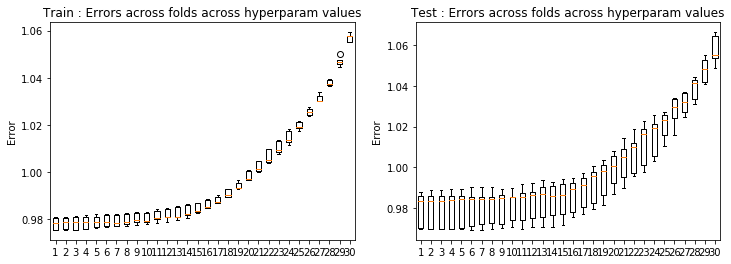

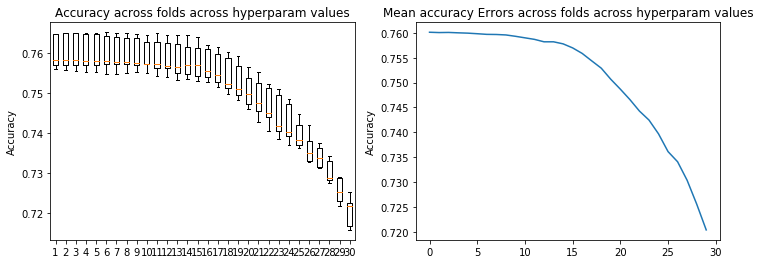

In [199]:
result_crossval(loss_tr3,loss_te3)
result_crossval_accuracy(acc3)

In [200]:
# test 4 : degree 1 class, all features, not removal of outliers, undef  
lambdas = np.logspace(-0.5, 0, 50) #avant -2 c'est constant
loss_tr4, loss_te4, w4, acc4 = cross_validation_demo(ss_y, ss_tX, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'class', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-0.17490832  0.04418483 -0.1172897  -0.03492712  0.00744686  0.06536083
  0.02715447  0.0413835  -0.06776331  0.0975239   0.07928495  0.00092523
 -0.00340094  0.00872351 -0.00417957  0.00079819  0.00472535  0.00247983
  0.00634461  0.01858588 -0.00046034 -0.00282232  0.01858589]
Ridge regression: w=[-0.17500707  0.04398722 -0.11610969 -0.03502313  0.00845421  0.06482924
  0.02648026  0.03982185 -0.06509011  0.09806373  0.07930261  0.00083801
 -0.00510981  0.00729998 -0.00430238  0.00186241  0.00577612  0.00330698
  0.00765808  0.01710614 -0.00045044 -0.00018956  0.01710614]
Ridge regression: w=[-0.17619208  0.04577239 -0.11627018 -0.03605488  0.0091587   0.06577368
  0.02678712  0.04094152 -0.06654476  0.09748544  0.07993033  0.00336733
 -0.00307566  0.0072985  -0.00583308  0.00089957  0.0080

Ridge regression: w=[-0.16685018  0.04406397 -0.11257945 -0.03093652  0.00904304  0.06051956
  0.02555408  0.03932012 -0.06552435  0.09409866  0.07561223  0.00079424
 -0.00328035  0.00544072 -0.00400964  0.00082638  0.00331519  0.00244022
  0.00767587  0.01887849 -0.00043816 -0.00269116  0.01887849]
Ridge regression: w=[-1.66944378e-01  4.38665777e-02 -1.11431099e-01 -3.10621597e-02
  9.91599958e-03  6.00065879e-02  2.49316903e-02  3.78600641e-02
 -6.30523701e-02  9.45790226e-02  7.55575009e-02  6.91390966e-04
 -4.93532037e-03  4.16293453e-03 -4.11773349e-03  1.82381945e-03
  4.30188656e-03  3.20564308e-03  8.86696049e-03  1.75002604e-02
 -4.47723867e-04 -1.62911231e-04  1.75002640e-02]
Ridge regression: w=[-0.1680748   0.04553628 -0.11161303 -0.03198299  0.01063737  0.06085332
  0.02522217  0.03894026 -0.06442096  0.09406726  0.07617141  0.00308092
 -0.00298309  0.00413438 -0.00553946  0.00089392  0.00644037  0.00348805
  0.00801431  0.01881164 -0.00119129 -0.0005463   0.01881165]
Rid

Accuracy = [0.708021666236781, 0.7122775341759092, 0.7015733814805262, 0.7140830539076606, 0.704023729687903]
Ridge regression: w=[-0.15863092  0.04378744 -0.10785395 -0.02732828  0.01044674  0.05588536
  0.02396358  0.03736167 -0.06326015  0.09056717  0.0720083   0.00066859
 -0.00315323  0.00255065 -0.00383631  0.00084917  0.00209179  0.00239385
  0.00886644  0.01910446 -0.00041625 -0.00256032  0.01910446]
Ridge regression: w=[-1.58720479e-01  4.35892654e-02 -1.06740402e-01 -2.74790764e-02
  1.11969059e-02  5.53903385e-02  2.33920267e-02  3.59977941e-02
 -6.09761532e-02  9.09902454e-02  7.18901088e-02  5.53397987e-04
 -4.75055966e-03  1.40727109e-03 -3.93229278e-03  1.77995187e-03
  3.01532178e-03  3.09836598e-03  9.93964633e-03  1.78218438e-02
 -4.44702081e-04 -1.38990788e-04  1.78218470e-02]
Ridge regression: w=[-0.15979521  0.04514789 -0.10694259 -0.02829797  0.01193074  0.05614548
  0.02366813  0.03704    -0.06226239  0.0905416   0.07249043  0.00280255
 -0.00288323  0.0013563  -0.

Ridge regression: w=[-0.15097985  0.044169   -0.10334262 -0.02556364  0.01237537  0.05233286
  0.02113855  0.03582794 -0.06066623  0.08592836  0.07044666 -0.00156559
 -0.00276998  0.00092822 -0.00492082  0.0003408   0.00174997  0.00281394
  0.01139586  0.01839789 -0.00060187 -0.0002553   0.0183979 ]
Ridge regression: w=[-1.51151453e-01  4.42016921e-02 -1.04280729e-01 -2.57171552e-02
  1.18343557e-02  5.21762242e-02  2.41859440e-02  3.51330810e-02
 -6.06637131e-02  8.84095485e-02  6.98146105e-02 -1.20954603e-04
 -2.16374620e-03 -2.18271697e-03 -3.79676486e-03  1.22112892e-03
  2.18250176e-03  4.04539063e-03  1.20325196e-02  1.95490677e-02
 -1.17179069e-03 -1.01140893e-03  1.95490747e-02]
Accuracy = [0.7084085633221563, 0.711439257157596, 0.7011864843951509, 0.7125354655661594, 0.7033789012122775]
Ridge regression: w=[-1.50303771e-01  4.33474346e-02 -1.03121040e-01 -2.40859137e-02
  1.16623512e-02  5.14617606e-02  2.23935979e-02  3.55036407e-02
 -6.09628850e-02  8.69446745e-02  6.8477912

Ridge regression: w=[-0.14465602  0.04404448 -0.09852517 -0.02258508  0.01380596  0.04821826
  0.02093006  0.03385873 -0.05826783  0.08397452  0.06607382  0.0023283
 -0.0026873  -0.00271314 -0.00472805  0.00086747  0.00295228  0.00311548
  0.01098302  0.01939462 -0.00103552 -0.00048661  0.01939462]
Ridge regression: w=[-0.14266155  0.04352935 -0.09861324 -0.02250581  0.01335348  0.04802125
  0.01968992  0.03407625 -0.05840982  0.08233282  0.06686971 -0.00157811
 -0.00266251 -0.00130694 -0.0046928   0.00034587  0.0007688   0.00272833
  0.0121888   0.01859929 -0.00059708 -0.00022831  0.0185993 ]
Ridge regression: w=[-0.1428237   0.04358344 -0.09957568 -0.02273296  0.01288457  0.04786996
  0.02255691  0.03342293 -0.05846295  0.08467868  0.06630952 -0.0001998
 -0.0020859  -0.00420424 -0.00362544  0.00118742  0.0012389   0.00386981
  0.01279679  0.01964936 -0.00113117 -0.00097066  0.01964937]
Accuracy = [0.7069899406757802, 0.7111168429197834, 0.7007351044622131, 0.7121485684807841, 0.70331

Ridge regression: w=[-1.35299481e-01  4.19292834e-02 -9.36078027e-02 -1.93054207e-02
  1.38588809e-02  4.35911368e-02  1.92135562e-02  3.12707250e-02
 -5.49071772e-02  8.05255966e-02  6.20667421e-02  2.19870762e-04
 -4.18979086e-03 -4.39495614e-03 -3.41521925e-03  1.63018151e-03
  3.58664668e-04  2.77100757e-03  1.22020059e-02  1.83149762e-02
 -4.32875199e-04 -8.64669185e-05  1.83149784e-02]
Ridge regression: w=[-0.13621563  0.04320293 -0.09385709 -0.01988485  0.01460633  0.04412209
  0.01945846  0.03221364 -0.0559822   0.08023371  0.06262928  0.00208277
 -0.00257095 -0.0044869  -0.00444697  0.00085334  0.00204517  0.00297423
  0.0117658   0.01945635 -0.00097904 -0.00046542  0.01945635]
Ridge regression: w=[-1.34337528e-01  4.27239330e-02 -9.38985148e-02 -1.97848953e-02
  1.41633174e-02  4.39327123e-02  1.82788190e-02  3.24108412e-02
 -5.61076142e-02  7.86770758e-02  6.33792508e-02 -1.57991770e-03
 -2.54970307e-03 -3.19277167e-03 -4.46343360e-03  3.47951177e-04
 -3.87026758e-05  2.6363

Ridge regression: w=[-0.12689602  0.04122407 -0.0899044  -0.01677311  0.01411676  0.04021391
  0.01819137  0.03078451 -0.05432324  0.07646188  0.05900807  0.00025885
 -0.0026277  -0.00510885 -0.00316541  0.00088183 -0.00097832  0.00215801
  0.01206929  0.01931339 -0.00033685 -0.00207584  0.0193134 ]
Ridge regression: w=[-1.26967663e-01  4.10193813e-02 -8.89447314e-02 -1.69832037e-02
  1.44973326e-02  3.97852393e-02  1.77968175e-02  2.97377479e-02
 -5.26432099e-02  7.66933767e-02  5.87233951e-02  1.21336487e-04
 -3.97864179e-03 -5.83868675e-03 -3.23343689e-03  1.56801036e-03
 -2.80529147e-04  2.64655445e-03  1.27478993e-02  1.83416540e-02
 -4.26869806e-04 -7.25870979e-05  1.83416559e-02]
Ridge regression: w=[-0.12782739  0.04220106 -0.08920656 -0.0174925   0.01524283  0.04024736
  0.0180331   0.03064731 -0.0536495   0.07644989  0.05927215  0.0018518
 -0.00245044 -0.00593863 -0.00417264  0.00083645  0.0013001   0.0028301
  0.01240444  0.01943955 -0.00092279 -0.00044436  0.01943956]
Ridge

Ridge regression: w=[-0.11867681  0.04015675 -0.08522776 -0.0147184   0.01467645  0.03660632
  0.01678645  0.02925088 -0.05187968  0.07265201  0.05577954  0.0001724
 -0.00248324 -0.00634197 -0.00299027  0.00087598 -0.00141898  0.00208181
  0.01257031  0.01919235 -0.00031721 -0.00195392  0.01919235]
Ridge regression: w=[-1.18743815e-01  3.99507724e-02 -8.43123414e-02 -1.49358119e-02
  1.49827520e-02  3.61954416e-02  1.64327995e-02  2.82755424e-02
 -5.03325951e-02  7.28412024e-02  5.54685409e-02  3.40798828e-05
 -3.76443292e-03 -6.98637761e-03 -3.05419152e-03  1.50202438e-03
 -7.75605146e-04  2.51942074e-03  1.31612071e-02  1.82894884e-02
 -4.19675599e-04 -6.10075400e-05  1.82894901e-02]
Ridge regression: w=[-0.11954786  0.04104571 -0.08458416 -0.01538239  0.01572308  0.0365944
  0.01666136  0.0291526  -0.05127351  0.07264201  0.05600317  0.00163635
 -0.00232679 -0.00709144 -0.00390614  0.00081673  0.00070453  0.00268406
  0.01290271  0.01934448 -0.00086715 -0.0004235   0.01934448]
Ridge

Ridge regression: w=[-0.11160683  0.03973932 -0.08182504 -0.01414129  0.01532713  0.03352306
  0.01678621  0.02764013 -0.04963232  0.07012733  0.05374214 -0.00041898
 -0.00174694 -0.00898411 -0.00297226  0.00103779 -0.00093444  0.0031747
  0.01446585  0.01934715 -0.00096091 -0.00081041  0.01934716]
Accuracy = [0.7041526953830282, 0.7095692545782821, 0.699445447510962, 0.7107299458344081, 0.7005416559195254]
Ridge regression: w=[-1.10618741e-01  3.89405615e-02 -8.05929568e-02 -1.29157907e-02
  1.50826281e-02  3.32143012e-02  1.54435237e-02  2.77856167e-02
 -4.94056054e-02  6.88377400e-02  5.26340412e-02  9.56341522e-05
 -2.33836699e-03 -7.29479015e-03 -2.81744361e-03  8.64448859e-04
 -1.73165663e-03  2.00074351e-03  1.29370663e-02  1.89983909e-02
 -2.98151760e-04 -1.83508671e-03  1.89983942e-02]
Ridge regression: w=[-1.10681195e-01  3.87339328e-02 -7.97225764e-02 -1.31376239e-02
  1.53231444e-02  3.28215483e-02  1.51280131e-02  2.68771299e-02
 -4.79819511e-02  6.89883427e-02  5.23030109

Ridge regression: w=[-1.05087085e-01  3.86145845e-02 -7.63734430e-02 -1.22121477e-02
  1.62203748e-02  3.05762794e-02  1.43465504e-02  2.66199271e-02
 -4.69099495e-02  6.57887659e-02  5.03435531e-02  1.28951269e-03
 -2.09971540e-03 -8.49320001e-03 -3.44890186e-03  7.74255859e-04
 -3.54764363e-05  2.41960971e-03  1.34635966e-02  1.89799253e-02
 -7.69599270e-04 -3.86514404e-04  1.89799284e-02]
Ridge regression: w=[-0.10363818  0.03825385 -0.07629313 -0.01206923  0.01582906  0.03043031
  0.01339039  0.02674634 -0.04698918  0.06455529  0.05092521 -0.00149597
 -0.00208948 -0.00756827 -0.00359873  0.00033143 -0.00174179  0.00224072
  0.01412983  0.0184331  -0.00054461 -0.00013781  0.01843311]
Ridge regression: w=[-0.10375597  0.03837301 -0.07724181 -0.01248798  0.01560058  0.03027949
  0.01541567  0.02627404 -0.04720828  0.06628676  0.0506376  -0.0004548
 -0.00165084 -0.00958649 -0.00280349  0.00099326 -0.00119479  0.00299012
  0.01460102  0.01908963 -0.00091333 -0.00076763  0.01908964]
Accu

 -2.65370240e-04 -1.62993097e-03  1.84709819e-02]
Ridge regression: w=[-9.67278883e-02  3.62156923e-02 -7.16107882e-02 -1.04482945e-02
  1.55979336e-02  2.72890998e-02  1.29445011e-02  2.44994918e-02
 -4.36801059e-02  6.21128198e-02  4.68337527e-02 -1.51080364e-04
 -3.16292347e-03 -8.83738641e-03 -2.57055151e-03  1.30237939e-03
 -1.51475195e-03  2.15675439e-03  1.36639672e-02  1.77361222e-02
 -3.92496769e-04 -3.88568540e-05  1.77361234e-02]
Ridge regression: w=[-0.09738286  0.03709475 -0.07189675 -0.01075433  0.01630849  0.02753982
  0.0131542   0.02528859 -0.04445482  0.06201603  0.04732605  0.00111992
 -0.00197295 -0.00894459 -0.00320851  0.00074704 -0.00028865  0.00227359
  0.01360101  0.01867377 -0.00071736 -0.00036633  0.01867377]
Ridge regression: w=[-0.09604017  0.0367608  -0.07179735 -0.01060771  0.01593335  0.02740684
  0.01225435  0.02539835 -0.04452557  0.06086486  0.04786623 -0.00145316
 -0.00196489 -0.00810247 -0.00337789  0.00032172 -0.00189778  0.00212836
  0.01417975  0

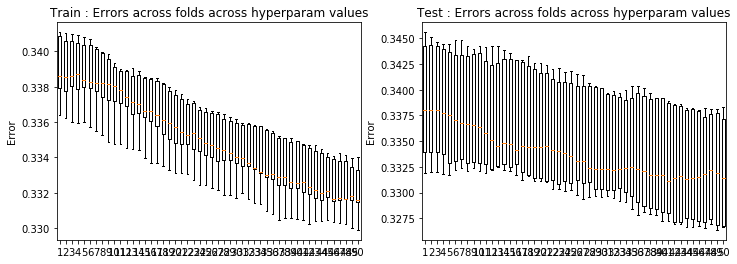

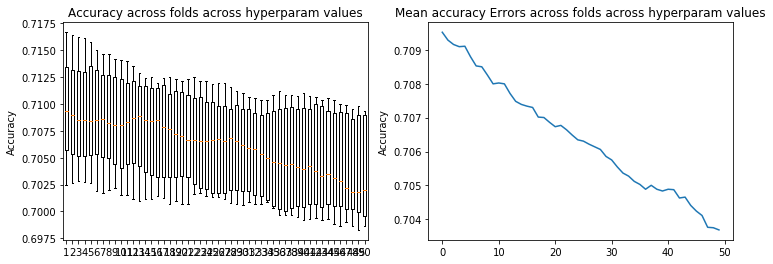

In [201]:
result_crossval(loss_tr4,loss_te4)
result_crossval_accuracy(acc4)

In [202]:
# test 5 : degree 2, class, all features, not removal of outliers, undef
lambdas = np.linspace(0.0, 1, 50) #faut être plus précis
loss_tr5, loss_te5, w5, acc5 = cross_validation_demo(ss_y, ss_tX, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'class', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.85530049e-01  9.10852670e-02 -2.84344325e-01 -2.23863756e-01
 -1.04237776e-01  7.11572079e-01  2.61741110e-02 -3.46966975e+02
 -1.59027978e-01  9.87209058e-02  1.12742175e+02  2.01140684e-03
 -2.99531128e-03  1.13943777e+02 -9.27438860e-04 -2.43932868e-03
  5.50874322e-02  3.75437734e-03  6.32048988e-02 -2.53604357e+03
 -2.21614176e-03 -3.89883708e-03  2.77594183e+03  6.31164097e-02
  1.34875961e-01  5.81911299e-02  1.89308672e-01 -5.03127716e-01
  8.08506832e-03  2.61994683e-01  9.89280251e-02  2.09181915e-02
 -2.48182709e-01 -3.63555224e-02 -6.77306184e-04 -2.39747107e-01
 -6.90644445e-02  6.76946671e-03 -1.45715534e-02 -1.71194142e-04
 -1.19162233e-01  1.67279552e+03  1.60873451e-01  2.29623595e-03
 -1.67316246e+03]
Ridge regression: w=[-2.85691256e-01  8.39377148e-02 -2.81184844e-01 -2

Ridge regression: w=[-2.62251741e-01  1.86122886e-02 -2.08784013e-01 -2.75060969e-02
  7.83148419e-03  1.79683438e-01  2.99485785e-02  1.06620201e-01
 -9.52264264e-02  1.08003801e-01  1.75894929e-01  1.02291781e-03
 -2.69610912e-03  6.65057746e-02 -5.70679257e-03 -5.21525398e-04
  3.91703777e-02  3.82681972e-03  2.40860332e-02  4.03243186e-02
 -1.35545962e-03  2.92731569e-05  4.03244395e-02 -2.79895484e-02
  5.13125168e-02 -9.28061703e-02 -2.71701176e-02 -5.17993466e-02
  3.32668957e-03 -1.10987080e-02  1.35496085e-02  4.36405085e-02
 -6.41390116e-02 -4.82041553e-02  4.29466494e-04 -3.12021537e-03
 -7.14743087e-02 -2.97911574e-04  1.44877919e-02 -1.01383280e-03
 -5.44093420e-02 -3.22704108e-02  1.51573983e-01  2.55617852e-03
 -3.22703340e-02]
Ridge regression: w=[-2.62549822e-01  1.82073029e-02 -2.06035829e-01 -1.70644325e-02
  2.56224805e-03  1.78037653e-01  3.11007904e-02  1.07985981e-01
 -9.59137653e-02  1.12003139e-01  1.80001799e-01  2.49361506e-03
 -1.90540660e-03  6.24706317e-02

Ridge regression: w=[-0.23713513  0.02372208 -0.16146032 -0.00841191  0.01515815  0.10677626
  0.02197203  0.08025391 -0.08172095  0.10675404  0.12984421  0.00306511
 -0.00319315  0.038138   -0.00324839 -0.0006392   0.02757012  0.0028922
  0.01813997  0.03719262 -0.00184027 -0.00236817  0.03719264 -0.02833332
  0.01612196 -0.08251835 -0.02466675 -0.0076281   0.01346766 -0.0085383
 -0.00115647  0.04802485 -0.03286811 -0.04373674 -0.00180538  0.01153113
 -0.0712144   0.00384545  0.01208981 -0.00051734 -0.03899072 -0.02463291
  0.13990795  0.00110646 -0.0246329 ]
Ridge regression: w=[-2.37269009e-01  2.38180842e-02 -1.60443023e-01 -7.37334990e-03
  1.72078508e-02  1.07296411e-01  1.99920875e-02  7.75372020e-02
 -7.97605037e-02  1.08122236e-01  1.30385013e-01  4.21085580e-03
 -5.23023151e-03  3.52261808e-02 -4.92817060e-03  1.18339529e-03
  2.73488273e-02  4.27509174e-03  2.00223073e-02  3.46073842e-02
 -1.10111928e-03  1.90047153e-05  3.46073940e-02 -2.74461964e-02
  1.67879284e-02 -8.078

Ridge regression: w=[-2.23708910e-01  2.73129117e-02 -1.42664769e-01 -6.99756036e-03
  2.00137674e-02  8.93701280e-02  2.08516002e-02  6.84542269e-02
 -7.56399999e-02  1.02630543e-01  1.12237381e-01  6.11536602e-03
 -2.45744396e-03  2.67982600e-02 -6.57156142e-03  5.87198316e-04
  2.59406043e-02  4.15873185e-03  1.76657919e-02  3.39177706e-02
 -1.90527477e-03 -1.65982536e-04  3.39177909e-02 -2.91660335e-02
  6.85558678e-03 -7.36556726e-02 -2.06104123e-02 -6.42245647e-05
  1.16918441e-02 -6.77311135e-03 -4.10538466e-03  4.89877686e-02
 -1.81534061e-02 -4.67200669e-02  1.71150106e-03  1.25268925e-02
 -6.70985921e-02  1.59028217e-03  1.37437453e-02 -9.74128590e-04
 -3.16972880e-02 -2.20483107e-02  1.30590337e-01  1.25674926e-03
 -2.20482968e-02]
Ridge regression: w=[-2.20624481e-01  2.61474846e-02 -1.43946397e-01 -6.87915067e-03
  1.95845492e-02  8.97517429e-02  2.11540816e-02  6.83856840e-02
 -7.45927771e-02  1.01076293e-01  1.13804583e-01  1.40090860e-04
 -2.66118133e-03  2.84594271e-02

Ridge regression: w=[-2.07688665e-01  2.74564895e-02 -1.30054192e-01 -2.53076716e-03
  1.95378113e-02  7.72548266e-02  2.13198797e-02  6.13892097e-02
 -6.93625692e-02  1.00216410e-01  1.02636347e-01  1.41815648e-03
 -1.82236985e-03  1.91959240e-02 -3.86562871e-03  1.22784993e-03
  1.94914282e-02  5.25663675e-03  1.93395981e-02  3.21813897e-02
 -1.33590665e-03 -7.56165535e-04  3.21814070e-02 -2.99348169e-02
 -1.02691187e-03 -6.85310711e-02 -1.80618208e-02  2.35391941e-03
  1.30898303e-02 -6.55517548e-03 -4.63717742e-03  5.07177251e-02
 -1.55732187e-02 -4.48276860e-02 -1.02341506e-03  7.78611471e-03
 -6.40089958e-02  7.03760000e-05  1.07157630e-02 -1.44748715e-03
 -2.34796541e-02 -1.79464799e-02  1.21912724e-01 -3.96302921e-04
 -1.79464669e-02]
Accuracy = [0.7371679133350528, 0.7398117100851174, 0.7333634253288626, 0.7422620582924941, 0.7371034304874903]
Ridge regression: w=[-2.02767716e-01  2.72709080e-02 -1.24830196e-01 -3.65705855e-03
  1.90966226e-02  7.18770943e-02  1.82447695e-02  

Ridge regression: w=[-1.91765364e-01  2.79733722e-02 -1.15287168e-01 -2.77949074e-03
  2.01203782e-02  6.44593826e-02  1.62158430e-02  5.21737852e-02
 -6.18696647e-02  9.48406514e-02  8.87851301e-02  2.47158593e-03
 -4.58676686e-03  1.45909786e-02 -4.00859170e-03  1.39058473e-03
  1.47971450e-02  3.74080242e-03  1.69325974e-02  2.71015138e-02
 -7.97632020e-04  1.19038689e-04  2.71015187e-02 -2.95068877e-02
 -7.20109813e-03 -5.70417475e-02 -1.27350751e-02  4.72731925e-03
  1.40889081e-02 -3.63088529e-03 -8.83253566e-03  4.71784375e-02
 -7.90870190e-03 -4.41276475e-02 -1.84986921e-03  7.76994282e-03
 -6.20651298e-02  3.26961365e-03  8.45966174e-03 -2.28394098e-03
 -1.80161068e-02 -1.41057428e-02  1.13683790e-01 -2.02065277e-04
 -1.41057342e-02]
Ridge regression: w=[-0.19306385  0.02937862 -0.11557092 -0.00427213  0.02085596  0.06509837
  0.01773201  0.05298766 -0.06377575  0.09375274  0.08798888  0.00463694
 -0.0023367   0.01444084 -0.00557104  0.00066777  0.0176792   0.00377382
  0.0159

Ridge regression: w=[-1.80510939e-01  2.91289275e-02 -1.09054469e-01 -3.63261316e-03
  2.00147118e-02  5.93045892e-02  1.67887519e-02  4.89393966e-02
 -6.01382971e-02  8.89449343e-02  8.29827622e-02 -5.32983400e-04
 -2.48088451e-03  1.27771200e-02 -4.72259094e-03  7.08601120e-05
  1.24052195e-02  3.18720361e-03  1.66312271e-02  2.58764432e-02
 -9.61483828e-04  1.90999730e-04  2.58764623e-02 -3.12587620e-02
 -8.24768544e-03 -5.41225704e-02 -1.09917182e-02  6.58133446e-03
  1.02537107e-02 -4.63227332e-04 -1.19615810e-02  4.68795929e-02
 -2.85654998e-03 -4.24336669e-02 -1.94941377e-04  8.32798800e-03
 -5.76777101e-02 -8.20753792e-04  8.02981822e-03 -7.73818866e-04
 -1.44975065e-02 -1.19434795e-02  1.07022823e-01  1.55082115e-03
 -1.19434659e-02]
Ridge regression: w=[-1.80716111e-01  2.91405813e-02 -1.08838175e-01 -2.00301209e-03
  1.98690080e-02  5.91304787e-02  1.86317195e-02  4.92091035e-02
 -6.00530307e-02  9.13820135e-02  8.32322340e-02  9.04773724e-04
 -1.73742536e-03  1.01706542e-02

  0.10097592  0.00045998 -0.00926513]
Ridge regression: w=[-1.68661103e-01  2.88482232e-02 -9.93562294e-02 -2.19203955e-03
  1.95732006e-02  5.18483496e-02  1.47002544e-02  4.34690941e-02
 -5.48008801e-02  8.66234571e-02  7.46537294e-02  1.77575170e-03
 -4.21750692e-03  8.21967830e-03 -3.58386151e-03  1.40235391e-03
  1.03446342e-02  3.40210761e-03  1.58962907e-02  2.41216491e-02
 -6.79703984e-04  1.16422002e-04  2.41216527e-02 -2.98027498e-02
 -1.36694641e-02 -4.69117520e-02 -8.19451832e-03  6.67054635e-03
  1.31970186e-02 -7.17866418e-04 -1.21057695e-02  4.48918711e-02
 -1.16136661e-03 -4.08141719e-02 -1.64123160e-03  4.79427709e-03
 -5.64224069e-02  2.86519036e-03  6.10463254e-03 -2.01294135e-03
 -1.18017460e-02 -9.47359418e-03  1.00376743e-01 -2.48864796e-04
 -9.47358767e-03]
Ridge regression: w=[-0.16980315  0.03005693 -0.09964963 -0.00334265  0.02026902  0.05237979
  0.01579934  0.04418197 -0.05633171  0.08585722  0.07419689  0.00367112
 -0.00221823  0.00795089 -0.0048726   0.000

Ridge regression: w=[-1.59944145e-01  2.96702594e-02 -9.54509199e-02 -1.89620591e-03
  1.93239574e-02  4.86329692e-02  1.67622725e-02  4.17721877e-02
 -5.38360045e-02  8.38143530e-02  7.13481558e-02  5.60650185e-04
 -1.65372651e-03  5.07771027e-03 -3.31112123e-03  1.12838408e-03
  9.60679102e-03  4.27736271e-03  1.68411687e-02  2.49694513e-02
 -1.09806809e-03 -7.31598189e-04  2.49694597e-02 -3.05023926e-02
 -1.57868917e-02 -4.57123106e-02 -7.66316191e-03  7.27330283e-03
  1.22939508e-02 -8.65670971e-05 -1.23432246e-02  4.59889864e-02
  7.49105879e-04 -3.86106303e-02 -6.85559876e-04  2.48572438e-03
 -5.29106573e-02  1.17013536e-04  5.44880242e-03 -1.07558026e-03
 -9.64332295e-03 -8.09961979e-03  9.46783129e-02 -1.46382142e-04
 -8.09961316e-03]
Accuracy = [0.732718596853237, 0.7362006706216147, 0.732009285530049, 0.7372323961826154, 0.7309775599690482]
Ridge regression: w=[-0.15720194  0.02902967 -0.0929855  -0.0020075   0.01877117  0.04670888
  0.01471627  0.04138391 -0.05295241  0.0816

Ridge regression: w=[-1.50525501e-01  2.90230590e-02 -8.85458824e-02 -1.95819497e-03
  1.88036795e-02  4.37859133e-02  1.35134726e-02  3.77309526e-02
 -4.97923374e-02  7.97048815e-02  6.52766800e-02  1.30728306e-03
 -3.90356055e-03  4.29229422e-03 -3.26263599e-03  1.37758418e-03
  7.47121303e-03  3.11522486e-03  1.51674915e-02  2.20573160e-02
 -6.01637121e-04  1.03493529e-04  2.20573188e-02 -2.96612897e-02
 -1.72108150e-02 -3.99272045e-02 -5.09961833e-03  7.18570167e-03
  1.22487540e-02  1.15636013e-03 -1.38397222e-02  4.23581256e-02
  2.62151050e-03 -3.78227031e-02 -1.46663224e-03  2.49594805e-03
 -5.16398881e-02  2.55699770e-03  4.59297412e-03 -1.80018144e-03
 -7.78265322e-03 -6.29305235e-03  8.98361831e-02 -2.67291852e-04
 -6.29304714e-03]
Ridge regression: w=[-0.15154475  0.03009165 -0.08883305 -0.00289205  0.01946785  0.04422946
  0.0143678   0.03838952 -0.05108147  0.07913988  0.06502886  0.00299688
 -0.00210477  0.00398938 -0.00435364  0.00071499  0.00955544  0.00315542
  0.0145

Ridge regression: w=[-1.43292188e-01  2.96152047e-02 -8.57206170e-02 -2.56863043e-03
  1.85179110e-02  4.17098842e-02  1.35711400e-02  3.65536389e-02
 -4.93307115e-02  7.53991241e-02  6.30477561e-02 -9.21844053e-04
 -2.21472649e-03  3.90818078e-03 -4.04511917e-03  1.79945702e-04
  6.27179768e-03  2.73249224e-03  1.51613298e-02  2.15009278e-02
 -7.86349821e-04  1.22831264e-04  2.15009392e-02 -3.06911407e-02
 -1.64963212e-02 -3.87601932e-02 -4.14116757e-03  7.68327260e-03
  9.25732016e-03  3.12858113e-03 -1.53859430e-02  4.17981438e-02
  4.94359024e-03 -3.65339452e-02 -2.41826753e-04  3.09646481e-03
 -4.83347000e-02 -7.58457366e-04  4.42112782e-03 -6.78377812e-04
 -5.81169525e-03 -5.08553489e-03  8.55023826e-02  1.24459504e-03
 -5.08552675e-03]
Ridge regression: w=[-1.43455057e-01  2.96438393e-02 -8.59729429e-02 -1.87948452e-03
  1.86260642e-02  4.15765692e-02  1.53051248e-02  3.66894388e-02
 -4.92763142e-02  7.74216253e-02  6.31412052e-02  3.22068358e-04
 -1.57324802e-03  1.85742374e-03

Ridge regression: w=[-0.13583468  0.02886031 -0.08108096 -0.00173531  0.01787376  0.03815234
  0.01312056  0.0349814  -0.04716386  0.07337729  0.05875646  0.00091131
 -0.00221913  0.00278018 -0.00254183  0.00051478  0.00539948  0.0021876
  0.01392718  0.02176526 -0.00067634 -0.0015447   0.02176526 -0.02939395
 -0.02056292 -0.03508884 -0.00336052  0.00797193  0.01167848  0.0033729
 -0.01730549  0.04051375  0.00452399 -0.0325711  -0.00138483  0.00156355
 -0.04730156  0.00165545  0.00232597 -0.00027132 -0.00608961 -0.00385556
  0.08181064  0.00031269 -0.00385556]
Ridge regression: w=[-1.35911374e-01  2.88264698e-02 -8.05512821e-02 -1.84722937e-03
  1.80473769e-02  3.80662990e-02  1.25236475e-02  3.36226098e-02
 -4.59710047e-02  7.38639387e-02  5.84899852e-02  9.76251020e-04
 -3.63308926e-03  1.67705240e-03 -3.00715560e-03  1.33708031e-03
  5.50404802e-03  2.87274194e-03  1.45910367e-02  2.05205098e-02
 -5.46275219e-04  8.93020237e-05  2.05205121e-02 -2.92761697e-02
 -1.92683518e-02 -3.483

Ridge regression: w=[-1.29900395e-01  2.92824940e-02 -7.84066528e-02 -2.34683800e-03
  1.77963721e-02  3.65529676e-02  1.24521852e-02  3.28654089e-02
 -4.57451736e-02  7.01212387e-02  5.69730761e-02 -1.00697209e-03
 -2.09374032e-03  1.55530838e-03 -3.77853427e-03  2.04809375e-04
  4.56600086e-03  2.55146944e-03  1.46371582e-02  2.01261760e-02
 -7.27124107e-04  9.64555100e-05  2.01261854e-02 -3.01112078e-02
 -1.83130078e-02 -3.40455797e-02 -2.12390403e-03  7.49076205e-03
  8.67524994e-03  4.10262908e-03 -1.60165887e-02  3.93478961e-02
  6.74252626e-03 -3.40671054e-02 -2.42909057e-04  1.41916849e-03
 -4.46721440e-02 -7.16822396e-04  3.44472239e-03 -6.38462994e-04
 -3.38906306e-03 -3.02888278e-03  7.76755185e-02  1.14004539e-03
 -3.02887601e-03]
Ridge regression: w=[-1.30048043e-01  2.93205762e-02 -7.87695378e-02 -1.88556802e-03
  1.79389447e-02  3.64212497e-02  1.41073886e-02  3.29630972e-02
 -4.57185294e-02  7.19902608e-02  5.70452931e-02  1.51735589e-04
 -1.49725414e-03 -3.12749212e-04

  0.07471357  0.0002716  -0.0021657 ]
Ridge regression: w=[-1.23883819e-01  2.84222362e-02 -7.42982462e-02 -1.78845479e-03
  1.73537058e-02  3.37421888e-02  1.16737898e-02  3.05140591e-02
 -4.29064147e-02  6.88824221e-02  5.32906907e-02  7.33836753e-04
 -3.39760279e-03 -1.49049950e-04 -2.79669912e-03  1.29014170e-03
  4.10246118e-03  2.66616715e-03  1.41032284e-02  1.93155388e-02
 -5.04715647e-04  7.62954677e-05  1.93155408e-02 -2.87527904e-02
 -2.04800871e-02 -3.09531591e-02 -1.25813859e-03  6.96580931e-03
  1.05570879e-02  3.33687830e-03 -1.52980331e-02  3.75941657e-02
  6.44453393e-03 -3.28571352e-02 -1.20105697e-03 -4.95618256e-04
 -4.41053669e-02  2.10979112e-03  2.87729580e-03 -1.48506372e-03
 -2.98237878e-03 -2.29776666e-03  7.42293781e-02 -2.69980143e-04
 -2.29776298e-03]
Ridge regression: w=[-0.12472267  0.02930257 -0.0745713  -0.00245842  0.01796915  0.0340612
  0.01226129  0.03111093 -0.04390076  0.06854931  0.05326936  0.00212779
 -0.0018987  -0.00044368 -0.0036237   0.0007

Ridge regression: w=[-1.18797797e-01  2.87857828e-02 -7.25931339e-02 -2.20010747e-03
  1.71443428e-02  3.25811813e-02  1.15182644e-02  3.00262855e-02
 -4.28214699e-02  6.55893914e-02  5.22271086e-02 -1.05530696e-03
 -1.98254632e-03 -1.14106235e-04 -3.54683282e-03  2.19741997e-04
  3.33653141e-03  2.39437718e-03  1.41805486e-02  1.90333721e-02
 -6.78937530e-04  7.50930549e-05  1.90333802e-02 -2.94479644e-02
 -1.94160194e-02 -3.04054952e-02 -6.18429057e-04  7.17082896e-03
  8.12278122e-03  4.79286039e-03 -1.63161051e-02  3.70875783e-02
  7.91516490e-03 -3.18911193e-02 -2.38771002e-04  1.55041306e-04
 -4.15217186e-02 -6.76475683e-04  2.75553221e-03 -6.02114942e-04
 -1.61774961e-03 -1.48004230e-03  7.11574025e-02  1.05383219e-03
 -1.48003650e-03]
Ridge regression: w=[-1.18932825e-01  2.88324609e-02 -7.30272818e-02 -1.89639199e-03
  1.73015925e-02  3.24483892e-02  1.30936448e-02  3.00954409e-02
 -4.28210284e-02  6.73281584e-02  5.22887594e-02  2.72806015e-05
 -1.42627632e-03 -1.83504049e-03

Ridge regression: w=[-1.13811964e-01  2.79005538e-02 -6.92125461e-02 -1.75461621e-03
  1.67274624e-02  3.03298785e-02  1.09321414e-02  2.80663786e-02
 -4.03607662e-02  6.45855860e-02  4.91441438e-02  5.51396039e-04
 -3.19073709e-03 -1.46492327e-03 -2.61887876e-03  1.24130766e-03
  3.07456735e-03  2.48839671e-03  1.36736501e-02  1.83336804e-02
 -4.72039367e-04  6.50058600e-05  1.83336821e-02 -2.81526437e-02
 -2.11730436e-02 -2.78964333e-02 -1.54362921e-05  6.66064737e-03
  9.83917782e-03  3.99642631e-03 -1.55345303e-02  3.54896016e-02
  7.44793825e-03 -3.08091613e-02 -1.09934261e-03 -1.45993386e-03
 -4.11051500e-02  1.94089265e-03  2.37509192e-03 -1.36481853e-03
 -1.46985996e-03 -9.89633911e-04  6.82943427e-02 -2.64244929e-04
 -9.89630706e-04]
Ridge regression: w=[-1.14582612e-01  2.87138582e-02 -6.94798678e-02 -2.33792649e-03
  1.73232611e-02  3.06044313e-02  1.14408587e-02  2.86421870e-02
 -4.12580657e-02  6.43235664e-02  4.91866496e-02  1.83480286e-03
 -1.80683608e-03 -1.74450974e-03

Ridge regression: w=[-1.09443640e-01  2.81990345e-02 -6.78110809e-02 -2.09657260e-03
  1.65575618e-02  2.94058167e-02  1.07213707e-02  2.77612654e-02
 -4.03647178e-02  6.16567182e-02  4.83869049e-02 -1.08006820e-03
 -1.88084029e-03 -1.33234705e-03 -3.34331715e-03  2.28254677e-04
  2.42808470e-03  2.25683790e-03  1.37709218e-02  1.81329247e-02
 -6.38623714e-04  5.77914121e-05  1.81329317e-02 -2.87441401e-02
 -2.00672995e-02 -2.75077208e-02  5.34614834e-04  6.80420701e-03
  7.61329172e-03  5.29302092e-03 -1.64098226e-02  3.50263359e-02
  8.69633532e-03 -2.99666970e-02 -2.32102407e-04 -8.08476358e-04
 -3.87879067e-02 -6.38856599e-04  2.25672981e-03 -5.68896379e-04
 -2.82738722e-04 -2.84224214e-04  6.56458568e-02  9.80965718e-04
 -2.84219163e-04]
Ridge regression: w=[-1.09568036e-01  2.82531306e-02 -6.82915809e-02 -1.90640070e-03
  1.67195141e-02  2.92712224e-02  1.22195806e-02  2.78083961e-02
 -4.03874286e-02  6.32832670e-02  4.84430201e-02 -6.52993267e-05
 -1.36037794e-03 -2.93144550e-03

  0.06366313  0.00021795  0.00014465]
Ridge regression: w=[-1.05254673e-01  2.73142721e-02 -6.49564944e-02 -1.73349834e-03
  1.61623450e-02  2.75528958e-02  1.02779089e-02  2.60799944e-02
 -3.81910739e-02  6.08394358e-02  4.57368960e-02  4.11094202e-04
 -3.00759227e-03 -2.43378446e-03 -2.46575153e-03  1.19288034e-03
  2.30416483e-03  2.33387109e-03  1.32859913e-02  1.75097859e-02
 -4.45372129e-04  5.53847035e-05  1.75097874e-02 -2.75131158e-02
 -2.15319158e-02 -2.54237170e-02  9.50661717e-04  6.32298952e-03
  9.19909060e-03  4.48719428e-03 -1.55989236e-02  3.35742391e-02
  8.12952205e-03 -2.89961604e-02 -1.01280098e-03 -2.19332924e-03
 -3.84909420e-02  1.79707756e-03  2.00861148e-03 -1.26214297e-03
 -3.07198348e-04  3.46105217e-05  6.32369378e-02 -2.56663280e-04
  3.46133528e-05]
Ridge regression: w=[-1.05967378e-01  2.80719314e-02 -6.52187135e-02 -2.24800289e-03
  1.67406434e-02  2.77910748e-02  1.07273928e-02  2.66379757e-02
 -3.90109325e-02  6.06314946e-02  4.58252328e-02  1.6007942

Ridge regression: w=[-1.01455053e-01  2.75657520e-02 -6.37758242e-02 -2.01969731e-03
  1.60274482e-02  2.67967385e-02  1.00307824e-02  2.59039254e-02
 -3.82535215e-02  5.82098596e-02  4.51961217e-02 -1.08937866e-03
 -1.78792578e-03 -2.23892228e-03 -3.16295207e-03  2.32509008e-04
  1.74409945e-03  2.13537674e-03  1.33967305e-02  1.73702934e-02
 -6.04138012e-04  4.36989729e-05  1.73702997e-02 -2.80257757e-02
 -2.04203810e-02 -2.51441075e-02  1.43562558e-03  6.42788069e-03
  7.14903369e-03  5.66066783e-03 -1.63711730e-02  3.31538695e-02
  9.22012745e-03 -2.82572097e-02 -2.24292330e-04 -1.55016853e-03
 -3.63953893e-02 -6.04324922e-04  1.88872121e-03 -5.38496822e-04
  7.46790459e-04  6.57180991e-04  6.09246028e-02  9.18264668e-04
  6.57185463e-04]
Ridge regression: w=[-1.01570369e-01  2.76260578e-02 -6.42862592e-02 -1.91385680e-03
  1.61888465e-02  2.66603955e-02  1.14560340e-02  2.59336714e-02
 -3.82960873e-02  5.97385684e-02  4.52491873e-02 -1.35118078e-04
 -1.29936897e-03 -3.73492906e-03

Ridge regression: w=[-9.78389678e-02  2.67626630e-02 -6.18119183e-02 -1.53911722e-03
  1.56634459e-02  2.53568690e-02  1.00654094e-02  2.53881850e-02
 -3.72299772e-02  5.73071090e-02  4.31825199e-02  3.51129747e-04
 -1.76090215e-03 -2.49930103e-03 -2.07484069e-03  6.19043496e-04
  1.57426377e-03  1.77596995e-03  1.25915167e-02  1.76860615e-02
 -4.17503430e-04 -1.25831225e-03  1.76860643e-02 -2.69435499e-02
 -2.27573867e-02 -2.34753045e-02  1.44543055e-03  6.51435546e-03
  8.87429341e-03  5.45728652e-03 -1.72955492e-02  3.23481969e-02
  8.33617255e-03 -2.55448479e-02 -1.04304471e-03 -2.26121478e-03
 -3.59229059e-02  1.09598435e-03  8.52629572e-04 -1.72571406e-04
 -3.39160576e-05  9.52722971e-04  5.92774810e-02  1.99506918e-04
  9.52725218e-04]
Ridge regression: w=[-9.78942066e-02  2.66956232e-02 -6.13169287e-02 -1.71903542e-03
  1.56500714e-02  2.52400215e-02  9.69610617e-03  2.44293174e-02
 -3.63055495e-02  5.75416837e-02  4.28719225e-02  3.01299719e-04
 -2.84432498e-03 -3.15764781e-03

Ridge regression: w=[-0.09587525  0.02713751 -0.06025595 -0.00215348  0.01601475  0.0246156
  0.00986899  0.02438001 -0.03635055  0.05617834  0.04197973  0.00134402
 -0.00161456 -0.00363553 -0.0028603   0.00065396  0.00273911  0.00218688
  0.0125858   0.01734597 -0.0007247  -0.0002577   0.01734598 -0.02711151
 -0.02124799 -0.02287277  0.00202922  0.00627895  0.00777095  0.00556487
 -0.01571602  0.03165325  0.01074399 -0.02669729  0.00058246 -0.00281213
 -0.03459021  0.00018621  0.00193356 -0.00039173  0.00042358  0.00116804
  0.0572675   0.00026223  0.00116805]
Ridge regression: w=[-9.45533488e-02  2.69124382e-02 -6.03033380e-02 -1.96009859e-03
  1.55455329e-02  2.46076796e-02  9.42528837e-03  2.43473379e-02
 -3.64077715e-02  5.51615171e-02  4.24894901e-02 -1.08841270e-03
 -1.70298688e-03 -2.92272646e-03 -3.00187017e-03  2.33891035e-04
  1.22164022e-03  2.02726217e-03  1.30508523e-02  1.67103511e-02
 -5.74110656e-04  3.21343005e-05  1.67103568e-02 -2.73089552e-02
 -2.05707766e-02 -2.31

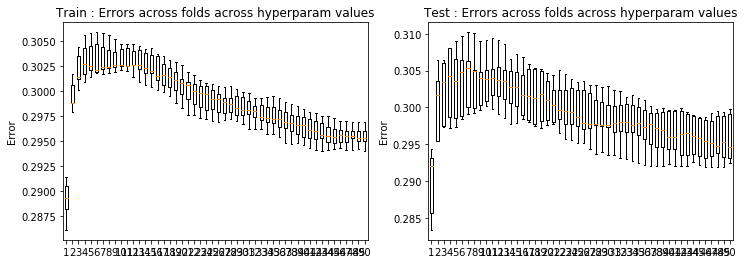

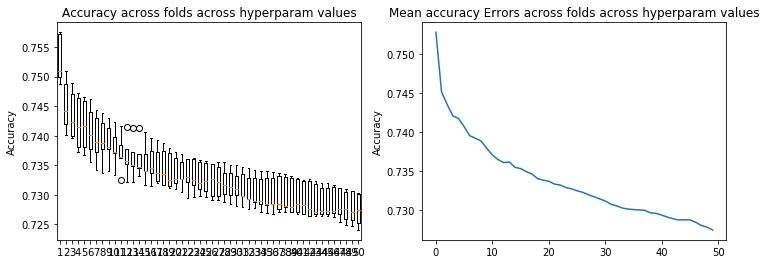

In [203]:
result_crossval(loss_tr5,loss_te5)
result_crossval_accuracy(acc5)

In [204]:
# test 6 : degree 3, class, all features, not removal of outliers, undef
lambdas = np.logspace(-1, 0, 30)
loss_tr6, loss_te6, w6, acc6 = cross_validation_demo(ss_y, ss_tX, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'class', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.37941708e-01  2.13022620e-02 -1.56030675e-01 -2.15480104e-03
  1.01722905e-02  1.23951146e-01  2.33648175e-02  7.60198131e-02
 -7.47139478e-02  7.10179388e-02  1.25229280e-01 -5.57471731e-04
 -1.88391623e-03  3.72814463e-02 -7.60850048e-04  2.60660778e-03
  2.87439149e-02  1.00222081e-03  1.75480051e-02  3.36337481e-02
 -5.97620188e-04  4.31065940e-05  3.36337687e-02 -2.21960875e-02
 -1.98884665e-02 -7.87391429e-02 -1.44229899e-02  2.06170349e-02
  1.09985180e-02  2.72706362e-03 -7.47998814e-03  4.70376680e-02
 -1.10549256e-02 -4.25031094e-02 -1.65448268e-03  2.90413497e-03
 -7.01014990e-02  3.90032485e-03  4.93509906e-03 -4.99777791e-04
 -2.45471718e-02 -1.52013491e-02  1.40231164e-01  1.17601447e-03
 -1.52013380e-02  5.34818091e-03  4.74645220e-02  5.60018915e-03
  9.04682458e-04 -5.7480

Ridge regression: w=[-2.33171944e-01  2.11032018e-02 -1.52479342e-01 -2.72134456e-03
  1.36957469e-02  1.20691521e-01  2.42342530e-02  7.23200131e-02
 -7.16414995e-02  6.83179353e-02  1.21878779e-01 -1.07049276e-03
 -2.52462030e-03  3.43892019e-02 -3.90544607e-03  2.52140955e-03
  2.64422832e-02  1.49020912e-03  1.93978692e-02  3.12334309e-02
 -3.73874170e-03  1.33912269e-03  3.12334786e-02 -2.32088278e-02
 -1.59733413e-02 -7.64166240e-02 -1.31388575e-02  2.06502338e-02
  7.94545027e-03  3.81946122e-03 -7.82115007e-03  4.73618350e-02
 -5.64216746e-03 -4.64380140e-02  2.37096160e-04  4.49645147e-03
 -6.70357674e-02 -6.14857199e-04  7.28572320e-03 -8.82033626e-04
 -2.05378709e-02 -1.43985691e-02  1.36400129e-01  2.13927801e-03
 -1.43985371e-02  7.10404772e-03  4.41856695e-02  1.93535559e-03
 -1.72662528e-03 -5.58587502e-02  6.74403987e-04 -1.32145305e-03
  4.10753327e-03  4.27995597e-02 -2.75490650e-02  1.82854553e-03
  1.57210765e-04 -2.00567437e-03 -1.87594934e-03 -3.86311489e-03
  3.0

Ridge regression: w=[-2.27861727e-01  2.12204859e-02 -1.44026070e-01  7.59200989e-04
  1.33687662e-02  1.08967265e-01  2.01694375e-02  6.65404839e-02
 -6.86067129e-02  6.99942205e-02  1.15085100e-01  6.47841883e-04
 -5.16521962e-03  2.80191938e-02 -2.90367469e-03  2.71495002e-03
  2.42156768e-02  2.88853152e-03  1.78256976e-02  2.92521173e-02
 -1.23171089e-03  6.59160310e-04  2.92521252e-02 -2.15026162e-02
 -1.91138344e-02 -6.69280176e-02 -1.02075252e-02  1.86839592e-02
  1.27063122e-02  3.22759604e-03 -6.95047626e-03  4.71018266e-02
 -4.32103115e-03 -4.66523600e-02 -2.04958206e-03  3.53480766e-03
 -6.84120855e-02  3.85601226e-03  8.25779787e-03 -2.70214757e-03
 -1.83100516e-02 -1.19757072e-02  1.34025272e-01 -1.30317050e-04
 -1.19756937e-02  7.66148910e-03  4.06542742e-02 -1.83063691e-03
 -2.11600326e-03 -5.04437547e-02  1.88751066e-03 -3.90349189e-03
  6.57163449e-03  4.48459241e-02 -2.86017584e-02  4.72486277e-03
  1.82624468e-04 -2.73076140e-03 -2.73342041e-03 -2.40160559e-03
  1.1

Ridge regression: w=[-2.22772444e-01  2.17258185e-02 -1.40318400e-01  3.18830982e-03
  1.27654886e-02  1.04170778e-01  2.41623053e-02  6.57270401e-02
 -6.89777105e-02  6.89420486e-02  1.12262590e-01 -1.88152763e-03
 -1.23364408e-03  2.48229019e-02 -2.06898879e-03  3.52502771e-03
  2.36891048e-02  3.33537302e-03  1.91618026e-02  3.13546167e-02
 -2.45703558e-03 -1.10240228e-03  3.13546395e-02 -2.24733868e-02
 -2.11537094e-02 -6.40111723e-02 -1.08637245e-02  1.89827106e-02
  1.20543321e-02  3.64773954e-03 -8.10070827e-03  4.98536637e-02
 -2.95853326e-03 -4.49356059e-02 -1.10989282e-03  2.52829870e-03
 -6.57836215e-02 -2.80864304e-05  8.18759835e-03 -1.58553432e-03
 -1.67463962e-02 -1.01301969e-02  1.30355390e-01 -5.89704128e-04
 -1.01301806e-02  8.37541119e-03  3.96238990e-02 -9.14421607e-03
 -3.44069051e-03 -4.66608794e-02  8.27416753e-04 -4.74281374e-03
  8.30851482e-03  4.56343846e-02 -2.84141286e-02  5.48780653e-03
 -7.84571766e-04 -3.88696091e-03 -3.08147213e-03 -3.54951269e-03
  1.1

Ridge regression: w=[-2.17560015e-01  2.21829663e-02 -1.32827924e-01 -9.42864298e-04
  1.55319263e-02  9.44442506e-02  2.10145303e-02  6.13268107e-02
 -6.70842354e-02  6.72997513e-02  1.04764449e-01  2.38012389e-03
 -2.99875930e-03  2.20508964e-02 -3.93392014e-03  2.26089397e-03
  2.31757745e-02  1.78218696e-03  1.63630213e-02  2.93562197e-02
 -2.50443872e-03 -1.12801800e-04  2.93562376e-02 -2.20723453e-02
 -2.18029617e-02 -5.99134254e-02 -7.47956811e-03  1.94849543e-02
  1.06541175e-02  6.71616539e-03 -1.26512041e-02  4.78998396e-02
  4.73305339e-03 -4.50472374e-02  1.77846571e-03  4.83006821e-03
 -6.48227985e-02  1.41946067e-03  8.47800512e-03 -1.03082245e-03
 -1.60145020e-02 -8.79495523e-03  1.27177879e-01  1.09119357e-03
 -8.79494359e-03  1.09613064e-02  3.81468821e-02 -7.13146346e-03
 -4.57383038e-03 -3.90343526e-02  2.19772064e-03 -4.41376115e-03
  4.86412047e-03  4.44799851e-02 -2.75264507e-02  5.64589438e-03
  9.11827658e-04  2.35100338e-03 -4.11155532e-03 -2.68751617e-03
  3.9

Ridge regression: w=[-2.07284598e-01  2.16719807e-02 -1.26376354e-01  1.12565755e-03
  1.41035306e-02  8.45843320e-02  1.96136770e-02  5.80132452e-02
 -6.45971831e-02  6.64297408e-02  9.84231122e-02  1.83722189e-04
 -2.09757049e-03  2.02724877e-02 -1.45873289e-03  1.53686621e-03
  1.77422608e-02  1.37427234e-03  1.56897688e-02  2.82064023e-02
 -6.68454383e-04 -4.85080461e-04  2.82064140e-02 -2.22588989e-02
 -2.46027470e-02 -5.49055969e-02 -6.52544714e-03  1.85131738e-02
  1.16225471e-02  7.09981540e-03 -1.43926096e-02  4.75635369e-02
  3.72584733e-03 -4.07540327e-02 -1.70872203e-03  4.68015089e-03
 -6.42631807e-02  3.00057414e-03  6.52986754e-03 -5.11554682e-04
 -1.37266354e-02 -6.54535810e-03  1.23387792e-01  7.86091737e-04
 -6.54535106e-03  1.14136681e-02  3.62435496e-02 -1.02845026e-02
 -4.76579091e-03 -3.39488393e-02  4.15214762e-03 -6.11345844e-03
  6.65952667e-03  4.50865126e-02 -2.47869097e-02  3.83463229e-03
 -1.20923269e-03  1.41966053e-03 -2.96643125e-03 -2.81802041e-03
  1.3

Ridge regression: w=[-2.01367002e-01  2.20133260e-02 -1.22556987e-01  6.09164795e-04
  1.59222494e-02  8.17066263e-02  1.98444341e-02  5.51081608e-02
 -6.24945400e-02  6.40417504e-02  9.55863186e-02 -9.04848432e-04
 -2.40571784e-03  1.82558894e-02 -3.64377124e-03  1.42062959e-03
  1.62310199e-02  1.81380252e-03  1.72962551e-02  2.62989226e-02
 -2.57212218e-03  8.21193684e-04  2.62989486e-02 -2.31749134e-02
 -2.14686658e-02 -5.32485496e-02 -5.61536972e-03  1.80909287e-02
  8.99774563e-03  7.53775306e-03 -1.46161743e-02  4.73389547e-02
  7.05051773e-03 -4.38666289e-02 -4.64876644e-06  5.14843664e-03
 -6.12625989e-02 -7.86812151e-04  7.97446725e-03 -8.74758473e-04
 -1.05335609e-02 -6.18015399e-03  1.18984582e-01  1.78545375e-03
 -6.18013612e-03  1.28241531e-02  3.41121554e-02 -1.22388761e-02
 -5.82982019e-03 -3.28369966e-02  1.89528311e-03 -5.63645842e-03
  4.56627951e-03  4.49436494e-02 -2.32417272e-02  1.23279423e-03
 -1.14532827e-04  2.72747527e-03 -2.25858460e-03 -2.48884892e-03
  3.6

Ridge regression: w=[-1.93164454e-01  2.19755889e-02 -1.14261126e-01  2.57157146e-03
  1.57654957e-02  7.29977546e-02  1.70921462e-02  5.03078315e-02
 -5.91319927e-02  6.46356903e-02  8.90867867e-02  7.47087126e-04
 -4.29858467e-03  1.35704623e-02 -2.76437136e-03  1.89034877e-03
  1.46088880e-02  2.66054230e-03  1.63312804e-02  2.47428395e-02
 -9.23511900e-04  4.57287361e-04  2.47428440e-02 -2.19520138e-02
 -2.34281254e-02 -4.64962277e-02 -3.68499558e-03  1.63395741e-02
  1.19837925e-02  6.56812300e-03 -1.34510029e-02  4.60598605e-02
  7.04085534e-03 -4.32062050e-02 -1.81479414e-03  3.39629868e-03
 -6.12801098e-02  3.22282379e-03  7.72409701e-03 -2.31813816e-03
 -8.87713888e-03 -4.70397318e-03  1.14652308e-01 -2.00596767e-04
 -4.70396526e-03  1.30680243e-02  3.00459950e-02 -1.34277584e-02
 -5.64490096e-03 -2.89300466e-02  3.56084258e-03 -6.97004417e-03
  5.56579487e-03  4.64415322e-02 -2.27178598e-02  3.56154619e-03
 -5.37991629e-04  1.72167009e-03 -2.59012441e-03 -1.21026729e-03
  2.1

Ridge regression: w=[-1.87004190e-01  2.25760439e-02 -1.11100449e-01  3.99841793e-03
  1.55998236e-02  6.95942172e-02  1.99424148e-02  4.95538012e-02
 -5.91882538e-02  6.36120371e-02  8.67534074e-02 -9.04531227e-04
 -1.38587883e-03  1.09299074e-02 -2.38144125e-03  2.19916797e-03
  1.42778349e-02  3.17704303e-03  1.75004021e-02  2.63395794e-02
 -1.74954766e-03 -8.68360358e-04  2.63395916e-02 -2.25981743e-02
 -2.44521923e-02 -4.44931173e-02 -3.90225740e-03  1.63962560e-02
  1.17234813e-02  6.75064132e-03 -1.40025992e-02  4.79777188e-02
  7.88525828e-03 -4.13346162e-02 -8.38020572e-04  1.99864191e-03
 -5.83687042e-02  4.46884003e-05  7.56977487e-03 -1.31341664e-03
 -7.47931650e-03 -3.53916359e-03  1.10402195e-01 -3.30912903e-04
 -3.53915456e-03  1.38413883e-02  2.87235887e-02 -1.83615749e-02
 -6.38754687e-03 -2.62619298e-02  2.64248026e-03 -7.14291584e-03
  6.32151158e-03  4.66941745e-02 -2.22919102e-02  3.91618100e-03
 -6.85675891e-04  9.12528103e-04 -2.83420187e-03 -2.02528370e-03
  2.0

Ridge regression: w=[-1.78889633e-01  2.30326669e-02 -1.03726611e-01  1.19345953e-03
  1.69736426e-02  6.24740146e-02  1.70323912e-02  4.58984335e-02
 -5.69939444e-02  6.14845574e-02  7.99315069e-02  2.09860131e-03
 -2.40746499e-03  9.12881766e-03 -3.58764441e-03  1.44887078e-03
  1.41363342e-02  2.02080918e-03  1.53191043e-02  2.47320384e-02
 -1.80557261e-03 -1.00400079e-04  2.47320479e-02 -2.26360959e-02
 -2.39237013e-02 -4.11246283e-02 -1.85973869e-03  1.60310661e-02
  1.03715647e-02  8.25248130e-03 -1.65548359e-02  4.53472175e-02
  1.19424378e-02 -4.07146686e-02  1.34414411e-03  3.15440234e-03
 -5.64201803e-02  8.35076452e-04  7.62096088e-03 -8.82373229e-04
 -7.29171270e-03 -2.69137060e-03  1.05517688e-01  7.20445645e-04
 -2.69136391e-03  1.56087853e-02  2.64793668e-02 -1.53498085e-02
 -6.49320776e-03 -2.16123079e-02  3.49794971e-03 -6.01732778e-03
  3.80352061e-03  4.53735630e-02 -1.88015576e-02  4.42428571e-03
  2.67075206e-04  4.26442527e-03 -3.68894430e-03 -1.65690912e-03
  3.4

Ridge regression: w=[-0.16673778  0.0224842  -0.09728108  0.00222094  0.01572012  0.05556598
  0.01584265  0.04316684 -0.05406804  0.05984416  0.0747027   0.00043502
 -0.00199881  0.00803169 -0.00176031  0.00098465  0.00990375  0.00152627
  0.01479622  0.02364506 -0.00057609 -0.00077177  0.02364507 -0.02254893
 -0.02563997 -0.03738529 -0.00116051  0.01491839  0.01098182  0.00849572
 -0.0176552   0.04397635  0.01021159 -0.03633053 -0.00155833  0.00277066
 -0.05466296  0.00214503  0.00544281 -0.00042791 -0.00557554 -0.00123613
  0.10013235  0.00047694 -0.00123613  0.01575398  0.02336712 -0.01591824
 -0.00612719 -0.01848731  0.00517724 -0.0063289   0.00314297  0.04514284
 -0.01785825  0.00271117 -0.00113418  0.00340374 -0.00260274 -0.00167254
  0.00132105  0.00175264 -0.01526226 -0.00740581 -0.00093164 -0.00196005
 -0.00740581]
Ridge regression: w=[-1.66831923e-01  2.24541391e-02 -9.64743061e-02  2.66676951e-03
  1.61600737e-02  5.57840980e-02  1.50531435e-02  4.16482557e-02
 -5.27366835e

Ridge regression: w=[-1.60140117e-01  2.29200694e-02 -9.37429276e-02  1.69041988e-03
  1.63720832e-02  5.32139490e-02  1.55817638e-02  4.08160819e-02
 -5.24452726e-02  5.75679836e-02  7.23105338e-02 -8.81852458e-04
 -2.10992385e-03  6.58875515e-03 -3.23692841e-03  7.87620178e-04
  8.90020445e-03  1.87614560e-03  1.58767622e-02  2.20574640e-02
 -1.64072963e-03  4.67680474e-04  2.20574782e-02 -2.33022530e-02
 -2.29399728e-02 -3.61832679e-02 -6.08089700e-04  1.42392119e-02
  8.68106745e-03  8.54952319e-03 -1.74343661e-02  4.31367243e-02
  1.21552717e-02 -3.84041609e-02 -1.46854509e-04  2.58169630e-03
 -5.17981477e-02 -7.98674478e-04  6.19246494e-03 -7.91363254e-04
 -3.21400572e-03 -1.11343436e-03  9.54618098e-02  1.41121735e-03
 -1.11342445e-03  1.68102646e-02  2.24043003e-02 -1.65905955e-02
 -6.12485994e-03 -1.79552328e-02  2.99059317e-03 -5.62322310e-03
  2.90422031e-03  4.43592642e-02 -1.62347799e-02  6.26617360e-04
 -3.74132736e-04  3.80964557e-03 -2.41802960e-03 -1.50966732e-03
  2.8

Ridge regression: w=[-1.50042355e-01  2.25711768e-02 -8.64432934e-02  2.44067855e-03
  1.60125477e-02  4.71255009e-02  1.38072051e-02  3.69518352e-02
 -4.87265369e-02  5.70755278e-02  6.63616284e-02  5.44592128e-04
 -3.44987831e-03  3.64276184e-03 -2.42251653e-03  1.40146443e-03
  7.84209187e-03  2.31413141e-03  1.51432317e-02  2.07298283e-02
 -6.55395495e-04  3.00135168e-04  2.07298308e-02 -2.22848277e-02
 -2.40364542e-02 -3.15586900e-02  5.69080916e-04  1.27315748e-02
  1.05015096e-02  7.54981448e-03 -1.60394971e-02  4.09166599e-02
  1.15012555e-02 -3.68659711e-02 -1.44491377e-03  8.75971003e-04
 -5.05557526e-02  2.49541694e-03  5.60271128e-03 -1.81548945e-03
 -2.14716067e-03 -2.21931816e-04  8.97449625e-02 -2.45840877e-04
 -2.21927166e-04  1.67302148e-02  1.85039595e-02 -1.60270650e-02
 -5.64211367e-03 -1.55894714e-02  4.49520183e-03 -6.24089247e-03
  2.64545499e-03  4.47796130e-02 -1.49582061e-02  2.40245710e-03
 -9.57242676e-04  2.33985605e-03 -2.33337579e-03 -4.03070998e-04
  1.8

Ridge regression: w=[-0.13862947  0.02257109 -0.08074771  0.00201673  0.01557643  0.04188516
  0.01353221  0.03528542 -0.04713592  0.05454744  0.06148654  0.00039845
 -0.00183564  0.00276465 -0.00177347  0.00081036  0.0064017   0.00150729
  0.01416001  0.02093225 -0.00047525 -0.00084916  0.02093226 -0.02242636
 -0.02502553 -0.02898907  0.00111822  0.0123179   0.01002956  0.00850608
 -0.01809529  0.03966896  0.01170219 -0.03225    -0.00137039  0.00086133
 -0.04717887  0.00166863  0.0041814  -0.0003466  -0.00180005  0.00094884
  0.08364741  0.00033807  0.00094884  0.01744432  0.01581174 -0.01579812
 -0.00545348 -0.0123773   0.00533938 -0.00521391  0.00086023  0.04322639
 -0.01318444  0.00206227 -0.00107307  0.00288971 -0.00235321 -0.00112607
  0.00087774  0.00150795 -0.01130734 -0.00637685 -0.00067528 -0.00171056
 -0.00637685]
Ridge regression: w=[-1.38707742e-01  2.25395479e-02 -8.00868182e-02  2.20887327e-03
  1.57754766e-02  4.19692858e-02  1.29701833e-02  3.40247288e-02
 -4.60073905e

Ridge regression: w=[-1.32255228e-01  2.29377359e-02 -7.77341991e-02  2.62607925e-03
  1.57373136e-02  3.98243552e-02  1.46022973e-02  3.33557067e-02
 -4.57585604e-02  5.36610653e-02  5.94793399e-02 -4.23216184e-04
 -1.26306437e-03  1.84417942e-05 -2.23095401e-03  1.27252314e-03
  6.46562927e-03  2.67044274e-03  1.56382793e-02  2.06922282e-02
 -1.09610113e-03 -6.33314974e-04  2.06922338e-02 -2.25494569e-02
 -2.42048401e-02 -2.74903171e-02  1.34208837e-03  1.15275588e-02
  9.86749691e-03  7.59856529e-03 -1.62317443e-02  3.97632132e-02
  1.24592907e-02 -3.30368767e-02 -5.09509266e-04 -1.21459717e-03
 -4.45769268e-02  6.84722956e-05  4.82642396e-03 -9.17131218e-04
  1.77460070e-04  1.25517355e-03  7.88079436e-02 -1.01968112e-04
  1.25517786e-03  1.78856857e-02  1.44778475e-02 -1.83379709e-02
 -5.46284316e-03 -1.19553541e-02  3.87265552e-03 -5.49993972e-03
  2.37158737e-03  4.33413184e-02 -1.24349045e-02  2.23558458e-03
 -6.38167803e-04  1.35197090e-03 -2.40018393e-03 -8.51276973e-04
  1.4

Ridge regression: w=[-1.22672085e-01  2.28996750e-02 -7.13913769e-02  1.04468987e-03
  1.59129132e-02  3.52327819e-02  1.22624100e-02  3.05342575e-02
 -4.30230965e-02  5.08978079e-02  5.38451998e-02  1.38907643e-03
 -1.77398531e-03 -6.73278386e-04 -2.81050264e-03  8.72820037e-04
  6.49536531e-03  1.86653384e-03  1.38151162e-02  1.93138539e-02
 -1.08654369e-03 -1.40240448e-04  1.93138582e-02 -2.23973920e-02
 -2.29234947e-02 -2.47983234e-02  2.39079197e-03  1.07262516e-02
  8.57507315e-03  8.11865572e-03 -1.69541541e-02  3.64935576e-02
  1.40449636e-02 -3.15485175e-02  8.46377127e-04 -8.00318810e-04
 -4.18016569e-02  3.18051582e-04  4.64251483e-03 -5.99527780e-04
 -5.12110722e-06  1.72764071e-03  7.30361424e-02  3.85759560e-04
  1.72764395e-03  1.85929121e-02  1.24112793e-02 -1.50712106e-02
 -4.75007414e-03 -9.77339309e-03  4.06262164e-03 -4.03696276e-03
  6.67545840e-04  4.13045597e-02 -8.53371120e-03  2.79838981e-03
 -2.13357970e-04  2.43282675e-03 -2.89589570e-03 -7.91493215e-04
  1.8

Ridge regression: w=[-1.10901006e-01  2.19742052e-02 -6.54776737e-02  1.47170317e-03
  1.47902192e-02  3.09834315e-02  1.08696588e-02  2.74171526e-02
 -3.91809269e-02  4.85395371e-02  4.93657542e-02  2.62398051e-04
 -2.73958605e-03 -1.51984386e-03 -2.03017875e-03  1.11671825e-03
  3.89563903e-03  1.92467577e-03  1.36619637e-02  1.73166690e-02
 -4.76316445e-04  1.87688830e-04  1.73166705e-02 -2.16413290e-02
 -2.26631028e-02 -2.19470644e-02  2.87424721e-03  9.22715400e-03
  8.63728799e-03  7.40723509e-03 -1.59369637e-02  3.36677552e-02
  1.21308417e-02 -2.95754169e-02 -1.06873300e-03 -1.54806572e-03
 -3.95005580e-02  1.85458050e-03  3.57538836e-03 -1.34587725e-03
  1.63971834e-03  2.21110069e-03  6.66923759e-02 -2.44262173e-04
  2.21110354e-03  1.80661358e-02  9.65114596e-03 -1.40742874e-02
 -3.90834246e-03 -9.02270671e-03  4.42756169e-03 -4.07261455e-03
 -2.49261965e-04  4.01510497e-02 -8.70526795e-03  1.51308045e-03
 -1.05843159e-03  9.69502644e-04 -1.99676542e-03  1.47344812e-05
  1.2

Ridge regression: w=[-1.04932459e-01  2.21849350e-02 -6.35191755e-02  1.58872453e-03
  1.47479844e-02  2.92575065e-02  1.20013513e-02  2.68201166e-02
 -3.88199554e-02  4.73180578e-02  4.79129895e-02 -3.66870089e-04
 -1.12735968e-03 -2.95349451e-03 -2.00562087e-03  9.94182770e-04
  3.89903213e-03  2.32024055e-03  1.43261021e-02  1.79967787e-02
 -8.62018377e-04 -5.39715097e-04  1.79967826e-02 -2.17926650e-02
 -2.29013918e-02 -2.12676651e-02  2.90477555e-03  8.91854732e-03
  8.46521767e-03  7.39039319e-03 -1.57810610e-02  3.38844182e-02
  1.25618834e-02 -2.78503218e-02 -3.67878251e-04 -2.72673131e-03
 -3.68243786e-02  5.22864043e-05  3.43782383e-03 -7.20148376e-04
  2.47877826e-03  2.70739795e-03  6.27575670e-02 -3.42366197e-05
  2.70740090e-03  1.84451483e-02  8.51197031e-03 -1.59231368e-02
 -3.96425406e-03 -8.15899785e-03  3.84136145e-03 -3.82648995e-03
  3.51806859e-04  3.94771353e-02 -8.08545364e-03  1.56641468e-03
 -5.96871594e-04  3.38794121e-04 -2.10837540e-03 -4.94908142e-04
  1.0

Ridge regression: w=[-0.09587525  0.02178118 -0.05789433  0.0004853   0.01457275  0.02565709
  0.01000197  0.02443252 -0.03602752  0.04432677  0.04302417  0.00100805
 -0.00148574 -0.00318157 -0.00236269  0.00069871  0.00397025  0.00165484
  0.01266519  0.01672473 -0.00081362 -0.00015423  0.01672473 -0.02134733
 -0.02143457 -0.01892251  0.00363353  0.00811922  0.00725128  0.0076617
 -0.01588762  0.03060331  0.01341188 -0.02614794  0.00064278 -0.00237835
 -0.03398986  0.00016303  0.00325492 -0.00045161  0.00219501  0.0030391
  0.05729514  0.00027309  0.0030391   0.0186026   0.00683756 -0.01289617
 -0.00312262 -0.00670449  0.00377136 -0.00245501 -0.00093888  0.03710222
 -0.00466495  0.0020734  -0.0003192   0.00093034 -0.00243336 -0.00050179
  0.00121579  0.00165654 -0.00554479 -0.00391589  0.00016977 -0.00021708
 -0.00391589]
Ridge regression: w=[-9.45533488e-02  2.16140759e-02 -5.79484544e-02  7.20732611e-04
  1.40732626e-02  2.57101045e-02  9.71090480e-03  2.43835396e-02
 -3.60068303e-0

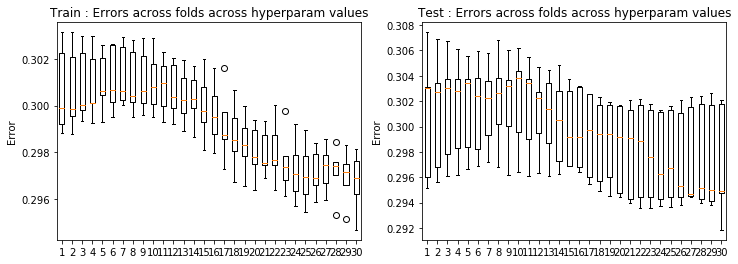

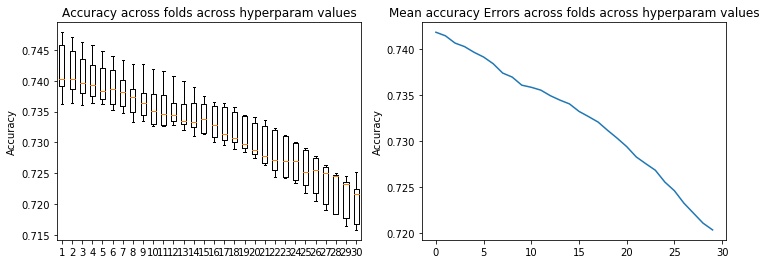

In [205]:
result_crossval(loss_tr6,loss_te6)
result_crossval_accuracy(acc6)

In [206]:
# test 7 : degree 1, classification, all features, not removal of outliers, undef
lambdas = np.logspace(-3, 0, 30)
loss_tr7, loss_te7, w7, acc7 = cross_validation_demo(ss_y, ss_tX, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'classification', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  3.10690809e-02 -2.18747209e-01 -2.44189959e-01
 -9.10337307e-02  2.36203300e-01  5.39884325e-02  1.24622063e-01
 -1.73080251e-01  1.40392389e-01  1.51625650e-01  3.42527923e-03
 -3.83143387e-03  2.18983965e-01 -6.05423775e-03 -1.84193769e-04
  8.30590475e-02  2.25966684e-03 -4.42380110e-02  5.43918947e-03
 -8.51833777e-04 -5.16214795e-03  5.44228323e-03]
Ridge regression: w=[-2.85121014e-01  3.00972027e-02 -2.18009707e-01 -2.42053735e-01
 -8.21976878e-02  2.34665477e-01  5.27407907e-02  1.19234911e-01
 -1.60975780e-01  1.42305540e-01  1.56359613e-01  4.84378005e-03
 -5.93283184e-03  2.10512538e-01 -7.54202480e-03  2.07768247e-03
  8.50566200e-02  4.23283567e-03 -4.07504305e-02 -1.33473168e-05
 -5.13301377e-04 -1.10463406e-03 -1.18026900e-05]
Ridge regression: w=[-0.28705164  

 -5.16777551e-04 -1.09260441e-03  1.88048394e-04]
Ridge regression: w=[-0.28614184  0.03514658 -0.21668612 -0.24198049 -0.08161129  0.23485605
  0.053548    0.11969545 -0.16214727  0.13964167  0.15645669  0.00871051
 -0.00311007  0.20683255 -0.01031506  0.00136143  0.08973798  0.00488465
 -0.04325275  0.00254004 -0.0015554  -0.00075685  0.00254133]
Ridge regression: w=[-2.82196607e-01  3.26561981e-02 -2.18308870e-01 -2.45869836e-01
 -7.63857102e-02  2.38598230e-01  5.13046302e-02  1.20561910e-01
 -1.64122310e-01  1.36129310e-01  1.58387027e-01  9.35344803e-04
 -3.12869758e-03  2.12981001e-01 -8.76034156e-03 -4.44977999e-04
  8.35126937e-02  3.11040562e-03 -3.89291341e-02 -7.81974367e-04
 -2.33718601e-04 -1.68204108e-03 -7.79933306e-04]
Ridge regression: w=[-0.28251736  0.03261786 -0.21682623 -0.23555317 -0.09090855  0.23135578
  0.05613022  0.11887965 -0.15854255  0.14344501  0.15546934  0.00250337
 -0.00160944  0.19923136 -0.00628169  0.00203552  0.08448948  0.0062128
 -0.03549538  0.

 -0.03350062  0.00599266 -0.00112362 -0.00171282  0.00599311]
Accuracy = [0.7063451122001547, 0.7131802940417848, 0.7068609749806551, 0.7169847820479752, 0.7116327057002837]
Ridge regression: w=[-2.80739687e-01  3.22480791e-02 -2.11360473e-01 -2.19519404e-01
 -7.85535218e-02  2.18090241e-01  5.28653492e-02  1.15162697e-01
 -1.54579865e-01  1.39248672e-01  1.50764876e-01  3.30987082e-03
 -3.95294166e-03  1.89811250e-01 -6.04540430e-03 -1.41426619e-04
  7.48905486e-02  2.30866237e-03 -4.01095770e-02  5.97521866e-03
 -8.41347820e-04 -5.04577985e-03  5.97557412e-03]
Ridge regression: w=[-0.28089819  0.03140817 -0.21050626 -0.21764818 -0.07079133  0.21665776
  0.05157824  0.11018503 -0.14360584  0.14107479  0.15488039  0.00454766
 -0.00605797  0.18215868 -0.00736549  0.00204436  0.07688436  0.00421968
 -0.03666409  0.00097014 -0.00052526 -0.00104719  0.00097032]
Ridge regression: w=[-0.28280022  0.03597998 -0.21076087 -0.22283356 -0.07240586  0.2207563
  0.05258739  0.11258771 -0.14845408  

Ridge regression: w=[-0.27195021  0.03517848 -0.19948534 -0.18407    -0.06188046  0.19309207
  0.05325076  0.09895237 -0.12527239  0.13940884  0.14911641  0.00213922
 -0.00199209  0.14143015 -0.00614697  0.00181242  0.0650656   0.0060846
 -0.02691173  0.00727327 -0.00125857 -0.0016543   0.0072734 ]
Accuracy = [0.7089889089502193, 0.7147923652308485, 0.7076992519989683, 0.716726850657725, 0.7107299458344081]
Ridge regression: w=[-2.70351355e-01  3.46434745e-02 -1.95688457e-01 -1.73241073e-01
 -5.54184553e-02  1.83774976e-01  5.00007703e-02  9.75108336e-02
 -1.26105861e-01  1.35834223e-01  1.43721501e-01  3.03379096e-03
 -4.12575521e-03  1.39074816e-01 -5.97186750e-03 -1.56595672e-05
  5.83498523e-02  2.40794195e-03 -3.12274553e-02  7.78905821e-03
 -8.02926518e-04 -4.76691104e-03  7.78916222e-03]
Ridge regression: w=[-0.27050399  0.03403129 -0.19464049 -0.17189848 -0.04954957  0.18257168
  0.04869143  0.09331377 -0.11723964  0.13746376  0.14671185  0.00391499
 -0.00622833  0.13298706 -0.

 -5.05377455e-04 -9.71583673e-04  8.32639523e-03]
Ridge regression: w=[-0.24789425  0.03964276 -0.17091997 -0.11493175 -0.02701601  0.13927439
  0.04654577  0.07277756 -0.0945903   0.12962032  0.12717912  0.00147967
 -0.00240337  0.07349478 -0.00574427  0.00158133  0.03746274  0.00576978
 -0.01228076  0.01171421 -0.00141233 -0.00149523  0.01171426]
Accuracy = [0.711439257157596, 0.7149213309259737, 0.7079571833892184, 0.7169202992004127, 0.7084085633221563]
Ridge regression: w=[-0.24100769  0.03970494 -0.16360145 -0.09901916 -0.02037047  0.12592857
  0.04212042  0.0689518  -0.09304684  0.12464374  0.11871493  0.00228803
 -0.00414668  0.06596021 -0.00553005  0.00033135  0.02970413  0.00256118
 -0.01339679  0.01285335 -0.00068035 -0.00406418  0.01285338]
Ridge regression: w=[-0.24114376  0.03938551 -0.16233464 -0.09851207 -0.0172235   0.12510845
  0.04096573  0.06606161 -0.08747126  0.1258329   0.12002886  0.00259556
 -0.00618628  0.06235958 -0.00600586  0.00201222  0.03136996  0.0039844

Accuracy = [0.7107299458344081, 0.7151147794686613, 0.7033789012122775, 0.7169202992004127, 0.705313386639154]
Ridge regression: w=[-0.17758621  0.04419233 -0.11887665 -0.03636437  0.00686338  0.06704284
  0.02769564  0.0421051  -0.06851597  0.0986549   0.0805405   0.00097047
 -0.00344006  0.00992325 -0.00423603  0.00078753  0.00524471  0.00249169
  0.0058639   0.01847256 -0.00046788 -0.00286661  0.01847257]
Ridge regression: w=[-0.17768647  0.04399436 -0.11768672 -0.03644933  0.00791884  0.06650475
  0.02700377  0.04050791 -0.06577171  0.09921524  0.0805847   0.00088932
 -0.00516626  0.00844786 -0.00436447  0.00187426  0.00631728  0.00333981
  0.0072196   0.01695719 -0.00045132 -0.00019916  0.0169572 ]
Ridge regression: w=[-0.17888963  0.04581947 -0.11783977 -0.03752059  0.00861656  0.06748358
  0.02731664  0.04164126 -0.06725628  0.09861377  0.08121715  0.00346554
 -0.00310519  0.00845664 -0.0059322   0.00090114  0.00863313  0.0036506
  0.00620063  0.01832974 -0.00126242 -0.00057465 

Ridge regression: w=[-9.51766830e-02  3.61186331e-02 -7.15035685e-02 -9.96497166e-03
  1.54712876e-02  2.70723500e-02  1.29635456e-02  2.50325865e-02
 -4.44016033e-02  6.12726306e-02  4.65989141e-02 -2.88723017e-05
 -2.05173843e-03 -8.46532976e-03 -2.48174115e-03  8.25933021e-04
 -2.03230920e-03  1.82689656e-03  1.32954211e-02  1.83987302e-02
 -2.61850491e-04 -1.60788202e-03  1.83987328e-02]
Ridge regression: w=[-9.52304187e-02  3.59132497e-02 -7.07242064e-02 -1.01880480e-02
  1.56034660e-02  2.67168957e-02  1.27157145e-02  2.42451438e-02
 -4.31987996e-02  6.13573839e-02  4.62445098e-02 -1.61101741e-04
 -3.12052365e-03 -8.90322327e-03 -2.53723908e-03  1.28756126e-03
 -1.53701921e-03  2.13083310e-03  1.36658924e-02  1.76746042e-02
 -3.90149084e-04 -3.77538309e-05  1.76746053e-02]
Ridge regression: w=[-0.09587525  0.03677835 -0.07101041 -0.01048582  0.01631111  0.02695856
  0.01292413  0.02502807 -0.04396254  0.06126672  0.04673359  0.00108797
 -0.00194767 -0.00901003 -0.00316166  0.0007

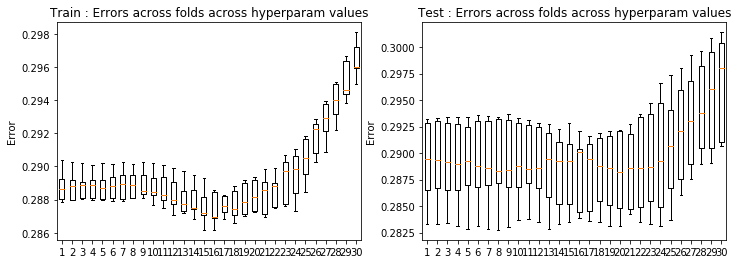

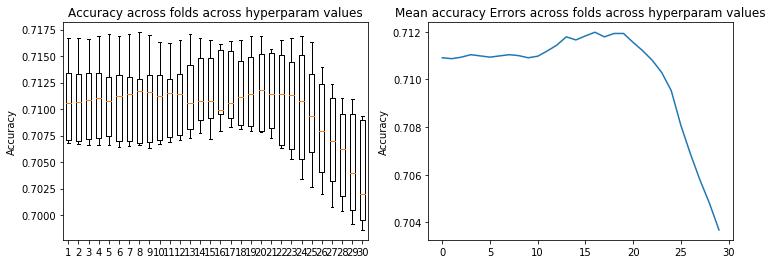

In [207]:
result_crossval(loss_tr7,loss_te7)
result_crossval_accuracy(acc7)

In [208]:
# test 8 : degree 2, classification, all features, not removal of outliers, undef
lambdas = np.logspace(-3, 0, 30)
loss_tr8, loss_te8, w8,acc8 = cross_validation_demo(ss_y, ss_tX, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'classification', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  6.52288156e-02 -2.82025503e-01 -1.96192696e-01
 -7.85222888e-02  6.39397639e-01  2.89263312e-02  1.80530339e-01
 -1.52135913e-01  1.00797861e-01  2.64928664e-01  2.29099991e-03
 -3.10490948e-03  1.89811042e-01 -1.21977284e-03 -2.39997297e-03
  5.90405026e-02  3.65664268e-03  5.18786658e-02  4.70790614e-02
 -2.28132759e-03 -3.82067224e-03  4.70808664e-02  3.63340070e-02
  1.29631923e-01  3.59057156e-02  1.32495267e-01 -4.38273594e-01
  6.01485876e-03  1.57305823e-01  8.64779487e-02  2.31101063e-02
 -2.12827154e-01 -3.71500473e-02 -7.70954139e-04 -1.94355072e-01
 -7.00492916e-02  6.69046729e-03 -2.12143196e-02 -2.62486408e-04
 -1.05756658e-01 -1.26173035e-01  1.61039063e-01  2.31108448e-03
 -1.26172379e-01]
Ridge regression: w=[-2.85121014e-01  6.15809217e-02 -2.78195684e-01 -1

Ridge regression: w=[-2.84774134e-01  5.25540268e-02 -2.76565261e-01 -1.76599487e-01
 -6.30227414e-02  6.16532520e-01  2.53994941e-02  1.75213723e-01
 -1.21975296e-01  1.03852701e-01  2.78098733e-01  5.26144806e-03
 -5.14017372e-03  1.68808220e-01 -4.43167967e-03 -7.23262841e-05
  6.02645320e-02  4.76534056e-03  4.17485293e-02  4.37894797e-02
 -1.19133561e-03 -7.14092908e-04  4.37900246e-02  2.54364729e-02
  1.23993611e-01  2.87281454e-02  1.12627131e-01 -4.24800190e-01
  8.74117307e-03  1.11570269e-01  6.98654127e-02  2.46493755e-02
 -2.06878060e-01 -4.31613946e-02 -2.14060427e-03 -1.71552118e-01
 -7.00620639e-02  5.22285938e-03 -1.85021506e-02 -3.37988893e-03
 -8.50891603e-02 -1.10665239e-01  1.60639658e-01 -1.42956773e-04
 -1.10664348e-01]
Ridge regression: w=[-2.86702410e-01  5.00823496e-02 -2.71894836e-01 -1.93296756e-01
 -6.34985928e-02  6.13440292e-01  3.26266924e-02  1.79609860e-01
 -1.14653287e-01  1.00427750e-01  3.03146633e-01  8.37441462e-03
 -1.94089208e-03  1.57758243e-01

Ridge regression: w=[-2.82196607e-01  3.73619417e-02 -2.74654863e-01 -1.63023967e-01
 -3.75131422e-02  5.61315304e-01  3.60926404e-02  1.66443441e-01
 -1.21562828e-01  9.93254719e-02  2.65965056e-01  3.62045288e-04
 -2.12458558e-03  1.63038529e-01 -4.11187087e-03 -1.09977014e-03
  5.81543472e-02  3.98551167e-03  4.21717600e-02  3.88982502e-02
 -1.24990446e-03 -5.95662996e-04  3.89000642e-02  6.51463863e-03
  1.22739484e-01  5.23010517e-03  6.79943658e-02 -3.66831130e-01
 -3.50115173e-03  8.36943296e-02  5.52404783e-02  2.69157463e-02
 -1.79890050e-01 -4.30264741e-02  1.21859946e-03 -1.42895455e-01
 -6.73994315e-02  3.78131500e-04 -1.90774699e-02 -7.38437890e-04
 -8.93750968e-02 -8.04980023e-02  1.58773839e-01  2.91079301e-03
 -8.04968872e-02]
Ridge regression: w=[-2.82517357e-01  3.35655444e-02 -2.68980681e-01 -1.46269523e-01
 -5.60967323e-02  5.61865131e-01  3.64029435e-02  1.71834445e-01
 -1.36536137e-01  1.05959954e-01  2.70363363e-01  1.56218068e-03
 -1.41069424e-03  1.74012016e-01

Ridge regression: w=[-2.81630665e-01  2.46912602e-02 -2.65441716e-01 -1.22476338e-01
 -4.58951655e-02  4.98549428e-01  3.71301164e-02  1.64213487e-01
 -1.27469329e-01  1.07583426e-01  2.64843004e-01  1.78441948e-03
 -1.49716984e-03  1.56857319e-01 -2.68508932e-03  8.91354380e-04
  6.59715962e-02  6.58188839e-03  4.37385503e-02  4.08042233e-02
 -1.30426298e-03 -1.03317902e-03  4.08049733e-02 -7.21643404e-03
  1.05547920e-01 -1.92120927e-02  4.55200129e-02 -3.21397580e-01
  5.99285498e-04  4.30505259e-02  7.20431407e-02  3.11172751e-02
 -1.74072673e-01 -4.27835405e-02 -1.90538727e-03 -1.39896951e-01
 -6.94234794e-02 -3.90789425e-04 -2.07656098e-02 -2.36549421e-03
 -8.79393365e-02 -5.64382765e-02  1.58682360e-01 -1.77668754e-03
 -5.64377907e-02]
Accuracy = [0.7454862006706217, 0.7549006964147537, 0.7461955119938096, 0.7546427650245034, 0.7480655145731235]
Ridge regression: w=[-2.82536117e-01  2.80915222e-02 -2.71307349e-01 -1.26171816e-01
 -4.20218213e-02  4.56449138e-01  3.23273693e-02  

Ridge regression: w=[-2.80898190e-01  2.18681141e-02 -2.59727374e-01 -9.50445929e-02
 -2.53620333e-02  3.91399246e-01  2.81510014e-02  1.46887845e-01
 -1.08207457e-01  1.09669951e-01  2.46154917e-01  5.77820522e-03
 -5.45049785e-03  1.22445977e-01 -5.17674499e-03  2.92041208e-04
  5.83523682e-02  4.60137230e-03  3.01263638e-02  3.96333179e-02
 -1.31474629e-03 -5.45145148e-04  3.96334075e-02 -1.17421077e-02
  9.81259781e-02 -3.89730561e-02  1.86706918e-02 -2.29797209e-01
  6.53762669e-03  1.32223379e-02  4.60604656e-02  3.28962918e-02
 -1.42627455e-01 -4.62267318e-02 -2.13432981e-03 -8.27634510e-02
 -7.30273795e-02  5.26532519e-03 -7.36726975e-03 -3.40160968e-03
 -6.94939539e-02 -4.96414626e-02  1.60199969e-01  1.31804073e-04
 -4.96413173e-02]
Ridge regression: w=[-2.82800220e-01  2.27384027e-02 -2.55891005e-01 -1.06172494e-01
 -2.43014881e-02  3.88755185e-01  3.47271902e-02  1.50641022e-01
 -1.09616825e-01  1.06160267e-01  2.56234602e-01  8.95723683e-03
 -2.28835827e-03  1.19576457e-01

 -4.25140589e-02]
Ridge regression: w=[-2.76074492e-01  1.60702108e-02 -2.49216185e-01 -7.35333457e-02
 -9.52579065e-03  3.15960956e-01  3.55441713e-02  1.35736345e-01
 -1.05379865e-01  1.06064360e-01  2.24392258e-01  1.02677132e-03
 -2.51850027e-03  1.07687182e-01 -5.26175197e-03 -8.06619227e-04
  5.20642747e-02  3.88057006e-03  3.01062473e-02  4.01994637e-02
 -1.36116290e-03 -2.46537586e-04  4.01998109e-02 -2.29152039e-02
  8.79456751e-02 -6.64423899e-02 -7.23369863e-03 -1.58319825e-01
 -2.26735524e-03  2.62294491e-03  2.99104026e-02  3.64196059e-02
 -1.11819683e-01 -4.63276119e-02  8.12683566e-04 -5.03273843e-02
 -7.07189657e-02  7.23297277e-05  3.68084728e-04 -1.00073853e-03
 -7.10071583e-02 -3.89014206e-02  1.57488957e-01  2.81940741e-03
 -3.89012066e-02]
Ridge regression: w=[-0.27638828  0.01441598 -0.24528719 -0.05663764 -0.02072452  0.31303518
  0.03631721  0.13832368 -0.10814054  0.11138245  0.23166904  0.00236054
 -0.00175974  0.10563482 -0.00349892  0.00104392  0.05698466  0

Ridge regression: w=[-0.27035135  0.01747897 -0.22658817 -0.0377456  -0.00598633  0.21472312
  0.02935773  0.11913435 -0.10293225  0.11088513  0.1936041   0.00359394
 -0.00347339  0.08046336 -0.00295949 -0.00154639  0.04617985  0.00305777
  0.02402857  0.04349852 -0.00236753 -0.0029795   0.04349859 -0.02519135
  0.06369958 -0.08656175 -0.0223717  -0.07877738  0.00714277 -0.00825825
  0.02316403  0.04091671 -0.08463472 -0.04300746 -0.00144733 -0.01866772
 -0.07481334  0.00528021  0.00743438 -0.00052312 -0.06386922 -0.03298406
  0.15690351  0.00183708 -0.03298403]
Ridge regression: w=[-2.70503992e-01  1.80661950e-02 -2.24013658e-01 -3.54703365e-02
 -1.38284607e-03  2.18418012e-01  2.58001590e-02  1.16102371e-01
 -9.81887772e-02  1.12542586e-01  1.96453543e-01  5.68943315e-03
 -5.56956351e-03  7.62491758e-02 -5.49803410e-03  6.99476996e-04
  4.57952274e-02  4.49256807e-03  2.51773211e-02  4.01458510e-02
 -1.33601332e-03 -2.95255514e-04  4.01458785e-02 -2.30190879e-02
  6.25079805e-02 -8.3

Ridge regression: w=[-2.63778316e-01  2.17315822e-02 -2.01513881e-01 -2.52450694e-02
  8.12011408e-03  1.68570373e-01  2.82888900e-02  1.04396091e-01
 -9.67983966e-02  1.09459273e-01  1.71551298e-01  8.38105286e-03
 -2.54353880e-03  6.05405224e-02 -7.93433218e-03  3.93186073e-04
  4.28873702e-02  4.51512170e-03  2.27287235e-02  4.23027088e-02
 -2.26563830e-03 -1.80207267e-04  4.23027709e-02 -2.55026539e-02
  4.40931739e-02 -9.04543847e-02 -2.68165718e-02 -4.32619754e-02
  6.68378562e-03 -1.16617962e-02  1.27845491e-02  4.42872749e-02
 -6.33544014e-02 -4.79807361e-02  2.36616719e-03  8.38006018e-04
 -7.27563330e-02  2.59753686e-03  1.64140631e-02 -1.15784125e-03
 -5.59546378e-02 -3.33419405e-02  1.51776765e-01  1.95863464e-03
 -3.33419032e-02]
Ridge regression: w=[-2.60141422e-01  1.91710178e-02 -2.03983711e-01 -2.46711475e-02
  9.28854993e-03  1.69995188e-01  2.92514621e-02  1.03613020e-01
 -9.39951408e-02  1.07932675e-01  1.70882286e-01  9.85996787e-04
 -2.70345715e-03  6.29793965e-02

Ridge regression: w=[-0.24100769  0.02315471 -0.16688884 -0.00953318  0.01413756  0.11281521
  0.02254688  0.08336207 -0.08367344  0.10757522  0.13483704  0.00315347
 -0.00322913  0.0409512  -0.0032504  -0.00072033  0.02903437  0.0029078
  0.01850239  0.03801614 -0.00190081 -0.00241849  0.03801616 -0.02813377
  0.01953678 -0.08464274 -0.02554465 -0.01053145  0.01312459 -0.00913104
  0.00048699  0.0476722  -0.03631538 -0.04385485 -0.00178979  0.01087568
 -0.07184562  0.00397474  0.01244944 -0.00052335 -0.04116073 -0.02561722
  0.1420105   0.00116918 -0.02561721]
Ridge regression: w=[-2.41143763e-01  2.32727946e-02 -1.65784086e-01 -8.38796743e-03
  1.63675440e-02  1.13451326e-01  2.04469497e-02  8.05845202e-02
 -8.16347982e-02  1.08979825e-01  1.35481504e-01  4.38266492e-03
 -5.27986217e-03  3.79420488e-02 -5.01049478e-03  1.14926729e-03
  2.87994685e-02  4.30879401e-03  2.04140500e-02  3.53513791e-02
 -1.13090880e-03 -1.45249262e-06  3.53513896e-02 -2.71617961e-02
  2.00831875e-02 -8.27

Ridge regression: w=[-2.18625444e-01  2.63696044e-02 -1.41810018e-01 -6.59565584e-03
  1.97140609e-02  8.76914667e-02  2.08873012e-02  6.71762058e-02
 -7.37686994e-02  1.00558081e-01  1.11885813e-01  1.00359206e-04
 -2.65476338e-03  2.74311671e-02 -5.32617749e-03 -1.14391349e-04
  2.13727282e-02  3.56515600e-03  1.86440508e-02  3.17726702e-02
 -1.15708047e-03  2.18612363e-04  3.17727058e-02 -3.05548046e-02
  7.55665233e-03 -7.40221131e-02 -2.00393723e-02 -2.59978939e-04
  9.69318661e-03 -5.72276209e-03 -4.96693234e-03  4.88107007e-02
 -1.80311886e-02 -4.67611760e-02 -4.46130972e-05  1.28127086e-02
 -6.57088183e-02 -7.51848730e-04  1.30552338e-02 -8.69091451e-04
 -2.76980710e-02 -2.08485569e-02  1.28544021e-01  1.92823673e-03
 -2.08485326e-02]
Ridge regression: w=[-2.18873938e-01  2.63657060e-02 -1.40786366e-01 -3.06719643e-03
  1.87479617e-02  8.73234690e-02  2.26283310e-02  6.76740911e-02
 -7.37964455e-02  1.03451514e-01  1.12708975e-01  1.64939575e-03
 -1.85133403e-03  2.41377658e-02

Accuracy = [0.7351044622130514, 0.737425844725303, 0.7321382512251741, 0.7411658498839309, 0.7354913592984266]
Ridge regression: w=[-0.17758621  0.02860059 -0.1057977  -0.00248308  0.01928518  0.05641602
  0.01623048  0.04851128 -0.05891417  0.08909825  0.07995977  0.00170582
 -0.00264423  0.01222106 -0.00293342  0.00021354  0.01196612  0.00254675
  0.01515123  0.02692936 -0.00106215 -0.0018325   0.02692937 -0.02999485
 -0.01278854 -0.05129349 -0.01065915  0.00738726  0.01386305 -0.0003216
 -0.0144177   0.04657779 -0.00394402 -0.03867935 -0.00168198  0.00713038
 -0.05846734  0.0023809   0.00535088 -0.00038093 -0.01581407 -0.01097405
  0.10621082  0.00051263 -0.01097404]
Ridge regression: w=[-1.77686474e-01  2.85938733e-02 -1.05234782e-01 -2.37014129e-03
  1.98600767e-02  5.63949942e-02  1.52859844e-02  4.66541911e-02
 -5.74519962e-02  8.99198204e-02  7.98303927e-02  2.03384829e-03
 -4.36558991e-03  1.05020094e-02 -3.74715565e-03  1.40378834e-03
  1.19699474e-02  3.53836430e-03  1.62804

Ridge regression: w=[-1.43350964e-01  2.96160521e-02 -8.57536349e-02 -2.56973429e-03
  1.85209111e-02  4.17335522e-02  1.35760530e-02  3.65705505e-02
 -4.93466726e-02  7.54218384e-02  6.30754113e-02 -9.21406384e-04
 -2.21522682e-03  3.91936826e-03 -4.04626020e-03  1.79820151e-04
  6.27983395e-03  2.73326675e-03  1.51635933e-02  2.15071354e-02
 -7.86613321e-04  1.22947314e-04  2.15071468e-02 -3.06931983e-02
 -1.64871373e-02 -3.87817295e-02 -4.15051776e-03  7.68359038e-03
  9.25965366e-03  3.12395709e-03 -1.53825189e-02  4.18082149e-02
  4.93469686e-03 -3.65443863e-02 -2.41806127e-04  3.10415355e-03
 -4.83504388e-02 -7.58621420e-04  4.42577281e-03 -6.78544565e-04
 -5.82305617e-03 -5.09502241e-03  8.55366460e-02  1.24505708e-03
 -5.09501427e-03]
Ridge regression: w=[-1.43513900e-01  2.96446484e-02 -8.60054137e-02 -1.87948608e-03
  1.86288652e-02  4.16002206e-02  1.53103402e-02  3.67065272e-02
 -4.92921664e-02  7.74450056e-02  6.31689799e-02  3.22863415e-04
 -1.57355977e-03  1.86779388e-03

Ridge regression: w=[-9.52304187e-02  2.64439004e-02 -6.00002210e-02 -1.71433315e-03
  1.54581901e-02  2.44182490e-02  9.48101585e-03  2.38434214e-02
 -3.56163031e-02  5.63298663e-02  4.18469562e-02  2.64069710e-04
 -2.78387692e-03 -3.39441616e-03 -2.28291968e-03  1.12786533e-03
  1.52178627e-03  2.14860350e-03  1.27960757e-02  1.65455942e-02
 -4.14903951e-04  4.43175987e-05  1.65455955e-02 -2.65942946e-02
 -2.16775223e-02 -2.26584245e-02  1.97540322e-03  5.84460703e-03
  8.41644248e-03  4.97936673e-03 -1.55086147e-02  3.11826323e-02
  8.73511109e-03 -2.67865165e-02 -9.11574455e-04 -2.94121340e-03
 -3.53515397e-02  1.62804283e-03  1.64807624e-03 -1.14129811e-03
  9.13579419e-04  1.13010020e-03  5.72948763e-02 -2.44726577e-04
  1.13010263e-03]
Ridge regression: w=[-0.09587525  0.02713751 -0.06025595 -0.00215348  0.01601475  0.0246156
  0.00986899  0.02438001 -0.03635055  0.05617834  0.04197973  0.00134402
 -0.00161456 -0.00363553 -0.0028603   0.00065396  0.00273911  0.00218688
  0.01258

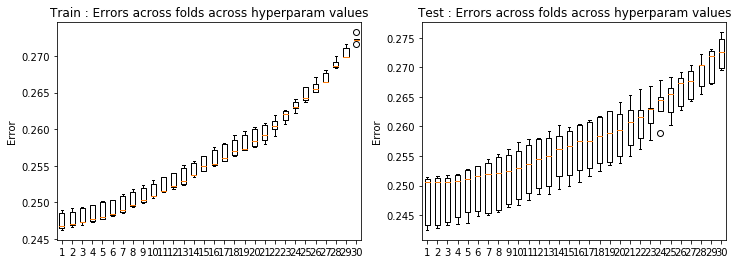

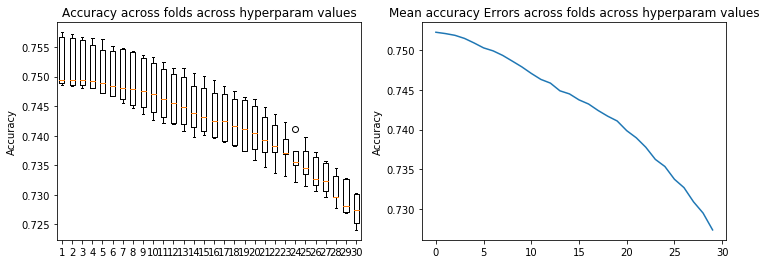

In [209]:
result_crossval(loss_tr8,loss_te8)
result_crossval_accuracy(acc8)

In [210]:
# test 9 : degree 3, classification, all features, not removal of outliers, undef
lambdas = np.logspace(-3, 0, 30)
loss_tr9, loss_te9, w9, acc9 = cross_validation_demo(ss_y, ss_tX, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'classification', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.91478258e-01 -2.97867311e-01 -6.31136035e-02
 -7.97916626e-02  5.46654947e-01  4.43396653e-02  2.80385888e-01
 -1.14903196e-01  2.02505326e-02  4.74234667e-01 -6.21573113e-03
  9.00666495e-03  2.37696394e-01  4.24636215e-03  1.64058268e-02
  1.06184816e-01  3.08225944e-03  6.60458761e-02  7.07556933e-02
  9.76246738e-04  1.02107005e-02  7.07570479e-02 -1.24776135e-01
  1.32485926e-01 -2.60653758e-01  8.70917394e-02 -3.87936075e-01
 -3.06431143e-02 -5.02219463e-02  1.60896070e-01  2.34542873e-02
 -5.45718755e-01 -3.55592914e-02 -1.92344125e-04 -4.02006601e-01
 -6.96308448e-02  6.94416977e-03 -1.00503120e-01  3.19030090e-04
 -1.38218055e-01 -1.51506650e-01  1.59825464e-01  2.68314188e-03
 -1.51506237e-01 -3.82942230e-01  5.56744989e-03  2.02463071e-01
  8.30839436e-02  3.3211

Ridge regression: w=[-2.82941962e-01  2.34394918e-01 -2.98567831e-01 -5.19936425e-02
 -4.32449815e-02  5.14923586e-01  4.94243218e-02  2.75553124e-01
 -1.30068022e-01  1.05462946e-02  4.45380963e-01 -2.81624187e-03
  4.83495259e-03  2.36615361e-01 -2.71376827e-03  1.40103453e-02
  9.55497900e-02  9.53121789e-04  8.31923904e-02  7.78213978e-02
 -7.78844338e-03  8.63292655e-03  7.78246967e-02 -1.25050306e-01
  1.42884386e-01 -2.67252296e-01  4.40420490e-02 -3.20049453e-01
 -3.64351324e-02 -1.23277646e-01  1.75725581e-01  2.58348488e-02
 -4.76463063e-01 -4.06709896e-02  1.80737713e-03 -3.69792078e-01
 -6.62534479e-02  8.92198294e-04 -7.86028035e-02 -1.15600186e-04
 -1.76979176e-01 -1.44229087e-01  1.57816228e-01  3.10448321e-03
 -1.44227482e-01 -3.25221456e-01  2.57958354e-03  2.00981154e-01
  9.12978639e-02 -2.66455523e-03  2.71767626e-02  1.44546022e-01
 -9.43082496e-02  8.13989069e-02  1.54598070e-01  3.24624931e-03
 -4.87735849e-03  1.41879848e-01 -1.27457017e-03 -1.42821861e-02
  3.4

Ridge regression: w=[-2.84528468e-01  1.78630126e-01 -2.89472063e-01 -2.35576006e-02
 -4.79353712e-02  4.53000655e-01  3.22630148e-02  2.51162576e-01
 -1.12140765e-01  2.87194411e-02  4.32235616e-01 -2.48586659e-03
 -2.68196446e-03  1.96272620e-01 -5.88312211e-04  1.19295908e-02
  9.30166482e-02  6.13725529e-03  6.58959194e-02  6.86633816e-02
 -2.39779894e-03  5.47182100e-03  6.86635412e-02 -7.85847986e-02
  1.28751113e-01 -2.73411288e-01  4.18530193e-02 -2.14788524e-01
 -7.82539948e-03 -1.13115856e-01  1.53717133e-01  2.61301480e-02
 -4.53252003e-01 -4.15224674e-02 -1.82044635e-03 -3.11623134e-01
 -6.98430597e-02  5.29423411e-03 -6.86071076e-02 -3.09151446e-03
 -1.23512461e-01 -1.19011028e-01  1.59843658e-01 -1.08443517e-04
 -1.19010746e-01 -2.26216248e-01  1.13821312e-03  1.98770618e-01
  7.80751005e-02 -6.62504334e-02  1.35461192e-02  1.33306214e-01
 -7.05846597e-02  7.15595884e-02  1.43367985e-01  8.31603213e-03
 -4.62640688e-04  1.11749711e-01 -4.19283203e-03 -1.15047807e-02
  3.1

Ridge regression: w=[-2.82517357e-01  1.52952552e-01 -2.74771921e-01  1.92896007e-02
 -4.06329062e-02  4.13901960e-01  4.40077664e-02  2.39755116e-01
 -1.11182949e-01  2.62130317e-02  4.09870902e-01 -1.04386600e-02
  8.57044612e-03  1.71754540e-01  4.07730681e-03  1.89433594e-02
  9.37036932e-02  4.91230795e-03  6.30898997e-02  7.59371801e-02
 -5.29933658e-03  3.53680322e-03  7.59383114e-02 -6.65377460e-02
  1.02713066e-01 -3.51746811e-01  8.06060296e-03 -1.55446520e-01
 -1.74352011e-02 -1.12978220e-01  1.35808855e-01  2.86142143e-02
 -4.07840619e-01 -4.00157955e-02 -2.01109318e-03 -2.47082591e-01
 -6.72528832e-02 -1.29827510e-04 -6.38040884e-02 -1.70411540e-03
 -1.16969765e-01 -1.10078526e-01  1.57960289e-01 -1.49055635e-03
 -1.10077919e-01 -1.86815477e-01  1.17041627e-02  2.29379115e-01
  8.12293143e-02 -8.86116188e-02  1.54354256e-02  1.03341175e-01
 -6.40231407e-02  7.43427422e-02  1.28640203e-01  1.18276167e-02
 -8.25312670e-03  8.22913501e-02 -5.63140609e-03 -1.75982621e-02
  2.3

Ridge regression: w=[-0.28524377  0.11056398 -0.26419368 -0.01610183 -0.02463306  0.37878885
  0.04298063  0.22186951 -0.11565498  0.04000709  0.37572123  0.00088102
 -0.00387021  0.15711002 -0.00118951  0.00880334  0.09401239 -0.002225
  0.06011688  0.07138664 -0.00478962 -0.00203686  0.07138726 -0.03983975
  0.08904015 -0.26550792  0.00278996 -0.09188039 -0.01993664 -0.08919932
  0.11106878  0.02811414 -0.36158411 -0.04091625  0.00320229 -0.20127177
 -0.06881993  0.00383292 -0.06647792 -0.00044905 -0.11959589 -0.10472048
  0.15947505  0.0028138  -0.10472015 -0.11781938  0.02229175  0.17679878
  0.0865284  -0.11598773  0.0160479   0.09666232 -0.05202447  0.05856156
  0.1012547   0.00789222  0.00260669  0.0624619  -0.0061918  -0.01007531
  0.02761572  0.00777788  0.00358263 -0.00392353  0.00323779  0.00159572
 -0.0039234 ]
Ridge regression: w=[-2.81310921e-01  9.90842525e-02 -2.73439052e-01 -1.52133784e-02
 -1.16051631e-02  3.76726349e-01  4.57535146e-02  2.21682455e-01
 -1.15051494e-0

Ridge regression: w=[-2.81741551e-01  7.75380218e-02 -2.53169929e-01 -1.15372995e-02
 -2.07780349e-02  3.34343052e-01  3.79341895e-02  1.96394269e-01
 -1.13307955e-01  5.33848115e-02  3.11975981e-01 -5.27661352e-03
  4.76320717e-03  1.40529025e-01  3.49166458e-03  1.21057038e-02
  8.31914560e-02  1.04839296e-03  4.83074982e-02  7.13386712e-02
  6.75625457e-04  6.31288189e-03  7.13389106e-02 -3.27942431e-02
  6.13925908e-02 -2.40657538e-01 -2.11497281e-02 -4.24654857e-02
 -1.17173011e-02 -6.83729998e-02  7.44583552e-02  2.97351817e-02
 -2.70868076e-01 -3.75025814e-02 -6.39465425e-04 -1.38275362e-01
 -7.12168803e-02  6.52247927e-03 -4.84274615e-02  1.21703465e-04
 -9.91954661e-02 -9.61724027e-02  1.60281459e-01  2.41713376e-03
 -9.61723106e-02 -7.70981273e-02  3.67252375e-02  1.51329393e-01
  7.69338516e-02 -1.33710006e-01  1.44873828e-02  7.50130385e-02
 -1.84783029e-02  4.86214970e-02  6.76053167e-02  8.49224248e-03
 -6.58457169e-03  2.52201675e-02 -5.70242047e-03 -1.34217023e-02
  1.4

Ridge regression: w=[-2.78901058e-01  5.76001412e-02 -2.51335073e-01 -1.15739865e-02
  1.25272102e-03  3.22624760e-01  4.16031100e-02  1.82788818e-01
 -1.10349193e-01  4.95684750e-02  2.89175706e-01 -2.44774264e-03
  1.47490110e-03  1.26549765e-01 -3.16044977e-03  1.05067227e-02
  7.53207769e-02  1.68055536e-04  4.88693223e-02  6.89854321e-02
 -7.28122615e-03  5.88329772e-03  6.89859688e-02 -3.75497228e-02
  6.86150174e-02 -2.26874232e-01 -3.78482507e-02 -2.64994200e-02
 -1.59968088e-02 -7.15092187e-02  7.53528892e-02  3.22407806e-02
 -2.23913388e-01 -4.27847464e-02  1.40396397e-03 -1.12248353e-01
 -6.80100232e-02  5.72236464e-04 -3.45163542e-02 -3.77594369e-04
 -9.99309431e-02 -9.48520647e-02  1.57709168e-01  3.02057246e-03
 -9.48517552e-02 -5.97853081e-02  3.17294988e-02  1.36713681e-01
  6.44893370e-02 -1.40532306e-01  1.17160122e-02  8.35812703e-02
 -3.04119738e-02  5.00919310e-02  4.30749753e-02  3.11385962e-03
 -2.26065041e-03  1.52965293e-02 -1.08289200e-03 -1.14874447e-02
  1.0

Ridge regression: w=[-2.78051384e-01  4.38863990e-02 -2.33306821e-01 -7.85303139e-03
 -2.50485507e-03  2.88650804e-01  2.76761751e-02  1.54218175e-01
 -1.04999989e-01  6.44263555e-02  2.51720015e-01 -1.49996177e-03
 -5.61032919e-03  9.98662156e-02 -1.40092132e-03  8.12235550e-03
  6.65422610e-02  3.92736514e-03  4.05844483e-02  5.83076638e-02
 -2.10727161e-03  2.56999279e-03  5.83077193e-02 -2.74834777e-02
  4.34536131e-02 -1.91655222e-01 -3.18745226e-02 -7.70725381e-03
  6.72866289e-03 -4.97702514e-02  6.30055187e-02  3.40333423e-02
 -1.68386781e-01 -4.45593991e-02 -2.10786903e-03 -6.63408675e-02
 -7.18727568e-02  5.01613221e-03 -1.89239027e-02 -3.09079745e-03
 -7.77942843e-02 -7.01283430e-02  1.58643958e-01 -4.77139743e-05
 -7.01282521e-02 -3.76145447e-02  3.83566032e-02  1.11779183e-01
  4.73668409e-02 -1.43762327e-01  1.92781008e-03  5.51029202e-02
 -1.83289752e-02  4.34369341e-02  1.76646896e-02  7.62331853e-03
  1.51541633e-03 -5.19449271e-03 -3.63287713e-03 -8.21009003e-03
  5.2

Ridge regression: w=[-2.74414564e-01  3.71739596e-02 -2.21234162e-01 -4.51476815e-03
 -3.39300331e-03  2.71459049e-01  3.55702581e-02  1.45765055e-01
 -1.04120700e-01  6.49064525e-02  2.33190316e-01 -7.58317572e-03
  2.84264755e-03  9.26351953e-02  1.66641848e-03  1.20732654e-02
  6.47204254e-02  3.27209196e-03  4.08315151e-02  5.90517544e-02
 -4.70859910e-03 -3.04484629e-04  5.90519327e-02 -3.00488248e-02
  2.74528202e-02 -1.87246167e-01 -4.06897641e-02  2.58740571e-03
  3.04326529e-03 -4.24813313e-02  4.57731365e-02  3.77330147e-02
 -1.39969265e-01 -4.35303947e-02 -1.79481549e-03 -4.67173654e-02
 -6.98582258e-02 -1.62037180e-04 -1.51162064e-02 -1.85852991e-03
 -6.80693701e-02 -6.07138691e-02  1.56033612e-01 -1.32530810e-03
 -6.07137512e-02 -3.09581032e-02  4.18202502e-02  9.82481724e-02
  3.90823530e-02 -1.39375486e-01  1.00286682e-03  4.21698288e-02
 -1.34619229e-03  4.43151161e-02  8.19974613e-03  1.03370193e-02
 -3.71299006e-03 -1.89142477e-02 -4.60227129e-03 -1.18697280e-02
  4.6

Ridge regression: w=[-0.27233564  0.02943366 -0.20467326 -0.0143443   0.00510374  0.23029671
  0.03186958  0.12242257 -0.09384779  0.0707267   0.19601495  0.00163358
 -0.00431466  0.07581136 -0.00290154  0.00599796  0.05915292 -0.00046052
  0.02901745  0.04973096 -0.00420477 -0.00082685  0.04973106 -0.02357115
  0.01024446 -0.14874846 -0.03026823  0.01455891  0.0030604  -0.01865958
  0.02340304  0.03884673 -0.07560706 -0.04510566  0.00270198 -0.02577395
 -0.07112263  0.00300644 -0.01047861 -0.00091183 -0.05656889 -0.04763223
  0.15507765  0.00214532 -0.04763218 -0.01369802  0.04989256  0.07076353
  0.02739497 -0.11666329  0.0022394   0.02873535 -0.00322454  0.03779367
 -0.0241151   0.0076495   0.00272015 -0.01002787 -0.00511812 -0.00688232
  0.00476509  0.00588329 -0.01962783  0.00212867  0.00236881  0.00057108
  0.0021287 ]
Ridge regression: w=[-2.68580761e-01  2.70423652e-02 -2.09124358e-01 -1.14813653e-02
  8.52571659e-03  2.30613348e-01  3.34273722e-02  1.22188118e-01
 -9.32644814e

Ridge regression: w=[-2.61856380e-01  2.41686234e-02 -1.89530046e-01 -7.83962560e-03
  3.66449734e-03  1.86130412e-01  2.77707476e-02  1.04153486e-01
 -8.83778968e-02  7.35496105e-02  1.64531719e-01 -2.04336124e-03
 -8.90211873e-04  6.40582851e-02  6.07395355e-04  4.81886063e-03
  4.57526903e-02  4.24713383e-04  2.31216283e-02  4.32278947e-02
 -2.61622813e-04  1.17407802e-03  4.32279374e-02 -2.31245361e-02
 -6.75424428e-03 -1.19041065e-01 -2.67694759e-02  1.91105376e-02
  7.95136268e-03 -9.62376728e-03  7.05100144e-03  4.23906140e-02
 -4.89489377e-02 -4.19674934e-02 -1.39221892e-03 -9.45401623e-03
 -7.28143283e-02  4.95681465e-03 -3.00414407e-03 -3.52541613e-04
 -4.23909055e-02 -3.28518040e-02  1.52383269e-01  1.67480821e-03
 -3.28517835e-02 -5.48243436e-03  5.49700374e-02  4.08502165e-02
  1.56368149e-02 -9.48209093e-02  2.48946385e-03  1.11449400e-02
  1.01005645e-02  3.80834339e-02 -2.24225425e-02  6.40812033e-03
 -2.08740436e-03 -1.33972292e-02 -4.12529974e-03 -6.82064463e-03
 -1.4

Ridge regression: w=[-2.54466835e-01  2.17918462e-02 -1.80721070e-01 -7.42856596e-03
  1.08215665e-02  1.69747760e-01  2.85789661e-02  9.32121606e-02
 -8.11457925e-02  7.02124000e-02  1.52105516e-01 -1.38551608e-03
 -2.27321582e-03  5.40390623e-02 -3.95640141e-03  4.15851782e-03
  3.90604099e-02  9.73725804e-04  2.33126140e-02  3.79820145e-02
 -4.96611772e-03  2.08753820e-03  3.79821022e-02 -2.41418624e-02
 -4.70936580e-03 -1.06792447e-01 -2.31756544e-02  2.05967509e-02
  5.13016415e-03 -4.64115428e-03  3.96607143e-03  4.42741837e-02
 -3.08546389e-02 -4.67021620e-02  5.41582428e-04 -2.79978651e-03
 -6.94403960e-02 -3.25368582e-04  2.52798499e-03 -8.12292312e-04
 -3.38046153e-02 -2.74657132e-02  1.47326016e-01  2.45063694e-03
 -2.74656558e-02 -6.50802805e-04  4.98858997e-02  2.72320774e-02
  7.34486804e-03 -8.56176059e-02  3.64067724e-04  9.39489030e-03
  1.27591008e-03  3.99269165e-02 -2.58337824e-02  2.33396078e-03
  2.10972232e-04 -8.53504664e-03 -1.46361364e-03 -5.64017613e-03
  2.0

Ridge regression: w=[-2.41143763e-01  2.12505775e-02 -1.58716292e-01 -9.10741690e-04
  1.15078554e-02  1.31097948e-01  2.15603051e-02  7.59383722e-02
 -7.32470605e-02  7.19035100e-02  1.29475754e-01  4.63724783e-04
 -5.56599708e-03  3.67403947e-02 -2.86644401e-03  3.28680224e-03
  3.00262422e-02  2.97115838e-03  1.90961895e-02  3.20034656e-02
 -1.38651603e-03  7.89516358e-04  3.20034761e-02 -2.15076105e-02
 -1.50320317e-02 -7.96897874e-02 -1.43655650e-02  1.90672581e-02
  1.27648140e-02  1.58846013e-04 -1.85023314e-03  4.62639303e-02
 -1.39607451e-02 -4.73642501e-02 -2.11563117e-03  1.86128399e-03
 -7.05581797e-02  4.12069480e-03  7.44657915e-03 -2.83774018e-03
 -2.41450960e-02 -1.70758837e-02  1.41150891e-01 -9.70954762e-05
 -1.70758659e-02  4.31889103e-03  4.47053830e-02  8.16178069e-03
  1.32169444e-03 -6.43074076e-02  1.00797887e-03 -3.55457397e-04
  6.03564413e-03  4.33466146e-02 -2.97667648e-02  5.27297510e-03
  6.02618439e-04 -6.19782807e-03 -2.79635443e-03 -3.13606247e-03
  3.9

Ridge regression: w=[-2.30053268e-01  2.16176164e-02 -1.47584535e-01  2.62681194e-03
  1.16905550e-02  1.14549726e-01  2.51815997e-02  7.02904525e-02
 -7.13784822e-02  6.99422075e-02  1.19203435e-01 -2.21997138e-03
 -1.14016628e-03  2.89811796e-02 -1.91645597e-03  3.96234315e-03
  2.65104872e-02  3.34076922e-03  1.97945240e-02  3.27750244e-02
 -2.65277752e-03 -1.15930741e-03  3.27750511e-02 -2.25614685e-02
 -1.96431980e-02 -6.99738190e-02 -1.30538839e-02  1.93334665e-02
  1.19533847e-02  2.33071638e-03 -5.92753997e-03  4.96908634e-02
 -7.18047769e-03 -4.54133651e-02 -1.17556486e-03  2.05397117e-03
 -6.70502798e-02 -4.93008869e-05  7.91674622e-03 -1.64180211e-03
 -1.95274486e-02 -1.23221970e-02  1.34298831e-01 -6.59383857e-04
 -1.23221781e-02  6.72614416e-03  4.18927196e-02 -5.06905474e-03
 -2.02627918e-03 -5.31366973e-02  3.62920430e-04 -3.38434077e-03
  8.58737221e-03  4.50432928e-02 -2.92534019e-02  5.89998349e-03
 -8.38528864e-04 -5.74126440e-03 -3.14678071e-03 -4.02589241e-03
  7.6

Ridge regression: w=[-2.08805996e-01  2.23917748e-02 -1.25463052e-01 -1.60032353e-04
  1.61004729e-02  8.54643559e-02  2.00107360e-02  5.71913690e-02
 -6.46726885e-02  6.60434021e-02  9.82256999e-02  2.34302775e-03
 -2.84397370e-03  1.84044612e-02 -3.87909278e-03  2.02270218e-03
  2.06441338e-02  1.87570765e-03  1.60486753e-02  2.81482749e-02
 -2.32393216e-03 -1.01902415e-04  2.81482901e-02 -2.22093861e-02
 -2.26666948e-02 -5.46419088e-02 -5.85886306e-03  1.87408107e-02
  1.06955539e-02  7.31320662e-03 -1.39998961e-02  4.76671246e-02
  7.17478617e-03 -4.42437008e-02  1.67067558e-03  4.70719698e-03
 -6.30756863e-02  1.26398801e-03  8.51019785e-03 -1.00312709e-03
 -1.35850295e-02 -6.98363434e-03  1.22349015e-01  9.91907439e-04
 -6.98362420e-03  1.22809775e-02  3.53660506e-02 -1.01443601e-02
 -5.43295868e-03 -3.39073720e-02  2.55166593e-03 -5.20589120e-03
  4.76888689e-03  4.49812720e-02 -2.54607217e-02  5.35920856e-03
  7.32193623e-04  3.19460867e-03 -4.02231830e-03 -2.39786628e-03
  3.9

Ridge regression: w=[-0.17758621  0.02232307 -0.10432108  0.0021377   0.01554339  0.06193512
  0.01677816  0.04661389 -0.0567734   0.06169981  0.08034803  0.00041348
 -0.00204491  0.0106401  -0.00171948  0.0010849   0.01158549  0.00151019
  0.0150051   0.02475027 -0.00061005 -0.00071982  0.02475028 -0.0225033
 -0.02564617 -0.0412569  -0.00228564  0.01590543  0.0112492   0.00833945
 -0.01715337  0.04527672  0.0091453  -0.03769646 -0.00161528  0.00344531
 -0.05738386  0.00235015  0.00586916 -0.00045576 -0.00737011 -0.00232539
  0.10642665  0.00054438 -0.00232538  0.0148418   0.02657093 -0.01529874
 -0.00611389 -0.02163914  0.00499563 -0.00655647  0.00406644  0.04546937
 -0.01972567  0.0029847  -0.00115288  0.00328055 -0.00269535 -0.00192633
  0.0014369   0.00186068 -0.01681613 -0.00758654 -0.00104488 -0.00206554
 -0.00758654]
Ridge regression: w=[-1.77686474e-01  2.22926566e-02 -1.03451551e-01  2.71006152e-03
  1.61034594e-02  6.22279456e-02  1.58754095e-02  4.49851657e-02
 -5.53434829e-

Ridge regression: w=[-1.60140117e-01  2.29200694e-02 -9.37429276e-02  1.69041988e-03
  1.63720832e-02  5.32139490e-02  1.55817638e-02  4.08160819e-02
 -5.24452726e-02  5.75679836e-02  7.23105338e-02 -8.81852458e-04
 -2.10992385e-03  6.58875515e-03 -3.23692841e-03  7.87620178e-04
  8.90020445e-03  1.87614560e-03  1.58767622e-02  2.20574640e-02
 -1.64072963e-03  4.67680474e-04  2.20574782e-02 -2.33022530e-02
 -2.29399728e-02 -3.61832679e-02 -6.08089700e-04  1.42392119e-02
  8.68106745e-03  8.54952319e-03 -1.74343661e-02  4.31367243e-02
  1.21552717e-02 -3.84041609e-02 -1.46854509e-04  2.58169630e-03
 -5.17981477e-02 -7.98674478e-04  6.19246494e-03 -7.91363254e-04
 -3.21400572e-03 -1.11343436e-03  9.54618098e-02  1.41121735e-03
 -1.11342445e-03  1.68102646e-02  2.24043003e-02 -1.65905955e-02
 -6.12485994e-03 -1.79552328e-02  2.99059317e-03 -5.62322310e-03
  2.90422031e-03  4.43592642e-02 -1.62347799e-02  6.26617360e-04
 -3.74132736e-04  3.80964557e-03 -2.41802960e-03 -1.50966732e-03
  2.8

Ridge regression: w=[-1.27425039e-01  2.24024136e-02 -7.40180860e-02  1.93289931e-03
  1.54421180e-02  3.72645157e-02  1.21299958e-02  3.12601121e-02
 -4.32721624e-02  5.23982528e-02  5.62936560e-02  3.85208188e-04
 -3.04040269e-03  3.23637797e-04 -2.20525481e-03  1.22991819e-03
  5.38456767e-03  2.09912877e-03  1.43654131e-02  1.87681618e-02
 -5.46342032e-04  2.33006735e-04  1.87681637e-02 -2.20690831e-02
 -2.34230655e-02 -2.57189105e-02  2.02349349e-03  1.07288241e-02
  9.49131150e-03  7.54370577e-03 -1.62066894e-02  3.70009194e-02
  1.21317649e-02 -3.28230787e-02 -1.23048023e-03 -5.66829477e-04
 -4.43130483e-02  2.12452364e-03  4.40803486e-03 -1.54547833e-03
  2.47484800e-04  1.30650216e-03  7.64645710e-02 -2.50031490e-04
  1.30650569e-03  1.77356704e-02  1.32057182e-02 -1.52023474e-02
 -4.77126321e-03 -1.13728133e-02  4.55667966e-03 -5.08701715e-03
  9.49000996e-04  4.24792543e-02 -1.12324196e-02  1.87231425e-03
 -1.04282791e-03  1.66540362e-03 -2.15204882e-03 -1.33929045e-04
  1.4

Ridge regression: w=[-1.10237677e-01  2.23986491e-02 -6.62150187e-02  1.79546502e-03
  1.49857474e-02  3.11772281e-02  1.25137370e-02  2.80447095e-02
 -4.01987625e-02  4.86460414e-02  5.01065215e-02 -3.73036879e-04
 -1.15717024e-03 -2.47638031e-03 -2.05608941e-03  1.04340164e-03
  4.34877949e-03  2.39360398e-03  1.46120338e-02  1.85273651e-02
 -9.04626192e-04 -5.57582588e-04  1.85273693e-02 -2.19993871e-02
 -2.32132363e-02 -2.24083167e-02  2.63880495e-03  9.43304643e-03
  8.76361187e-03  7.45251150e-03 -1.59370279e-02  3.51123078e-02
  1.26217619e-02 -2.89110015e-02 -3.94424127e-04 -2.45689781e-03
 -3.83743441e-02  5.64980690e-05  3.69659795e-03 -7.58621260e-04
  2.09394103e-03  2.45788261e-03  6.58858655e-02 -4.54765362e-05
  2.45788580e-03  1.84193880e-02  9.60960802e-03 -1.64639429e-02
 -4.28866854e-03 -8.78691627e-03  3.88047616e-03 -4.17454391e-03
  7.33751524e-04  4.03526343e-02 -8.89156639e-03  1.68951996e-03
 -6.06733756e-04  5.62713340e-04 -2.16989464e-03 -5.56101125e-04
  1.1

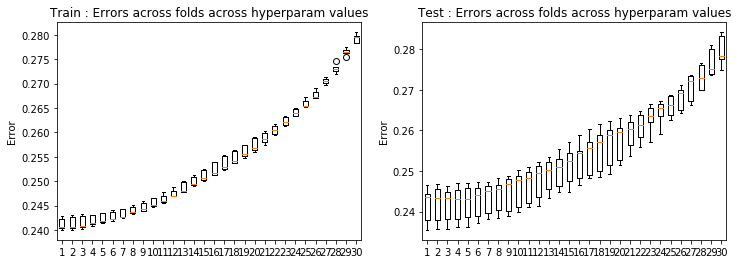

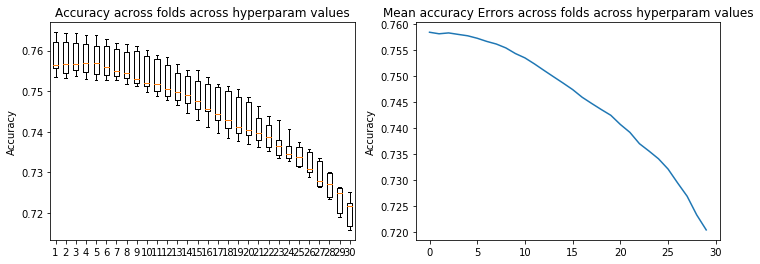

In [211]:
result_crossval(loss_tr9,loss_te9)
result_crossval_accuracy(acc9)

### Remove of correlated features

In [212]:
# test 10: degree 1, rmse, remove correlated features, not removal of outliers, undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr10, loss_te10, w10, acc10 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.65206763e-02 -2.07279063e-01 -2.52456832e-01
  2.52767711e-01  5.75965547e-02  6.49065096e-02 -1.83103647e-01
  1.30930083e-01  1.65257016e-01  3.51041268e-03 -3.95699659e-03
  2.37795348e-01 -6.00053257e-03 -1.89362993e-04  6.16801613e-02
  2.17949549e-03 -5.24250592e-02 -8.70349313e-04 -5.35270297e-03]
Ridge regression: w=[-0.28512101  0.0262587  -0.20774915 -0.24941209  0.24941962  0.05585407
  0.05086393 -0.16968021  0.13375498  0.17355212  0.00489677 -0.00597897
  0.23186203 -0.00747645  0.00202765  0.06585676  0.00425505 -0.04808925
 -0.00066399 -0.00120428]
Ridge regression: w=[-0.28705164  0.03083804 -0.20791779 -0.25511551  0.25409967  0.05673799
  0.05877742 -0.17571685  0.13112988  0.17159289  0.00896946 -0.00325325
  0.23351181 -0.01044521  0.00127943  0.0717692

Ridge regression: w=[-0.28180557  0.02908682 -0.20758521 -0.24993222  0.25055462  0.05403094
  0.05787281 -0.17074527  0.1280185   0.17297327  0.00096064 -0.00315334
  0.22913126 -0.00867305 -0.0004097   0.06412068  0.003101   -0.04565757
 -0.00035226 -0.00172188]
Ridge regression: w=[-0.28212588  0.02842233 -0.20464694 -0.24091726  0.24587298  0.05960143
  0.06333538 -0.16584997  0.13386109  0.16740677  0.00258504 -0.00169028
  0.21234072 -0.00618411  0.00192692  0.06161909  0.00619131 -0.04363582
 -0.00120368 -0.00180602]
Accuracy = [0.7086664947124065, 0.7155016765540366, 0.7076347691514058, 0.7155016765540366, 0.7129223626515347]
Ridge regression: w=[-2.83165437e-01  2.72507421e-02 -2.04370393e-01 -2.40358792e-01
  2.43628863e-01  5.69908791e-02  6.85069019e-02 -1.73680781e-01
  1.30916872e-01  1.62587475e-01  3.45843842e-03 -4.00740450e-03
  2.21109240e-01 -6.00760639e-03 -1.71760753e-04  5.86743992e-02
  2.20550141e-03 -5.06117883e-02 -8.63387167e-04 -5.28188239e-03]
Ridge regres

Ridge regression: w=[-0.26200422  0.03420925 -0.17922475 -0.14587312  0.16728793  0.04779915
  0.07240791 -0.10730052  0.13023975  0.13949206  0.00348703 -0.00629618
  0.10647601 -0.00662937  0.00199913  0.04089954  0.00412242 -0.02625597
 -0.00057748 -0.00082764]
Ridge regression: w=[-0.26377832  0.03802691 -0.17966415 -0.1496533   0.17003281  0.04839754
  0.07730186 -0.11048681  0.12859517  0.13962747  0.00749618 -0.00357341
  0.10716778 -0.00946989  0.00099065  0.04634661  0.00468029 -0.02869583
 -0.00173936 -0.00083368]
Ridge regression: w=[-2.60141422e-01  3.62603003e-02 -1.80916445e-01 -1.51200374e-01
  1.71393566e-01  4.63514762e-02  7.48737514e-02 -1.11826042e-01
  1.25625990e-01  1.41702212e-01 -1.68297676e-05 -3.46490429e-03
  1.12468989e-01 -7.99003546e-03 -1.46577618e-04  4.15481612e-02
  3.23277600e-03 -2.51398906e-02 -5.03181231e-04 -1.18458293e-03]
Ridge regression: w=[-0.2604371   0.03584387 -0.1800328  -0.14703926  0.16921887  0.05152235
  0.07713347 -0.1090922   0.130

Ridge regression: w=[-2.18625444e-01  4.41243981e-02 -1.48811665e-01 -7.30034586e-02
  9.96935582e-02  3.41888241e-02  6.79550621e-02 -7.97323112e-02
  1.14947885e-01  1.05746780e-01 -1.01210001e-03 -3.40051487e-03
  3.92009469e-02 -6.78271126e-03  1.39723233e-04  2.46156940e-02
  3.26010678e-03  1.44095308e-03 -5.94751946e-04 -6.60252964e-04]
Ridge regression: w=[-0.21887394  0.04394302 -0.1492847  -0.07186762  0.09888687  0.03861028
  0.06844642 -0.07878295  0.11880509  0.1041163   0.00084902 -0.00252128
  0.0335807  -0.00514194  0.00146203  0.02511306  0.00534696  0.00281563
 -0.00141168 -0.0013603 ]
Accuracy = [0.7107299458344081, 0.7136316739747227, 0.7084085633221563, 0.716017539334537, 0.7064095950477173]
Ridge regression: w=[-0.2072846   0.04421353 -0.14115655 -0.05839017  0.08538439  0.03336702
  0.06596535 -0.07619131  0.11321012  0.09570745  0.00150896 -0.00382709
  0.02780592 -0.00483526  0.00062665  0.02049785  0.00260237  0.00414668
 -0.00057116 -0.0034564 ]
Ridge regress

Ridge regression: w=[-0.12828787  0.04366095 -0.09341086 -0.01907335  0.03461058  0.01764821
  0.04477011 -0.05223741  0.08092192  0.06173013  0.00181253 -0.0023998
 -0.00350791 -0.00419911  0.00081804  0.01109643  0.00288792  0.02089164
 -0.00088458 -0.00045955]
Ridge regression: w=[-0.12651907  0.0431647  -0.09327653 -0.01884662  0.03459035  0.01653852
  0.04452356 -0.05245039  0.07933404  0.06253485 -0.00160323 -0.0024081
 -0.00242624 -0.00429011  0.00029798  0.00860865  0.00258512  0.02155887
 -0.00058452 -0.00023305]
Ridge regression: w=[-0.12666288  0.04323299 -0.09430381 -0.01923373  0.03430225  0.01903725
  0.04432029 -0.05253526  0.0814827   0.06203892 -0.00034909 -0.00191001
 -0.00471947 -0.00333173  0.0011172   0.00950254  0.00358418  0.02229664
 -0.0010038  -0.0009298 ]
Accuracy = [0.7058292494196544, 0.7075702863038432, 0.7014444157854011, 0.7130513283466597, 0.7025406241939645]
Ridge regression: w=[-1.10838428e-01  4.02151540e-02 -8.40426704e-02 -1.42138396e-02
  2.792336

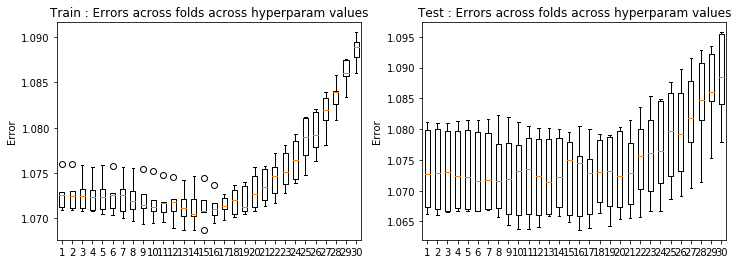

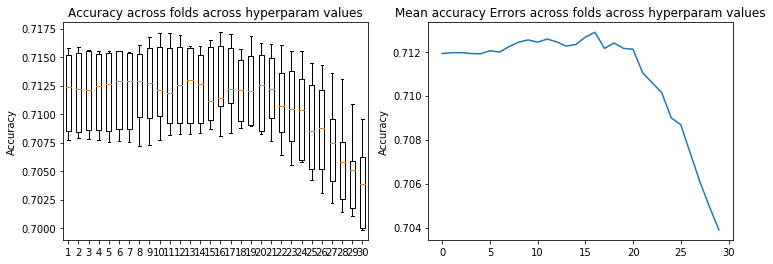

In [213]:
result_crossval(loss_tr10,loss_te10)
result_crossval_accuracy(acc10)

In [214]:
# test 11: degree 2, rmse, remove correlated features, not removal of outliers undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr11, loss_te11, w11, acc11 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  6.80509068e-02 -2.84072203e-01 -1.99908180e-01
  6.42706677e-01  3.53941411e-02  2.18249707e-01 -1.62139131e-01
  9.80687450e-02  2.50810836e-01  2.36544386e-03 -3.11342885e-03
  1.93586534e-01 -1.26234797e-03 -2.44790546e-03  6.29778126e-02
  3.59445857e-03  5.06377589e-02 -2.26234923e-03 -3.92923082e-03
  4.19034762e-02  1.35308707e-01  3.56164435e-02 -4.37961970e-01
  1.19792280e-03  1.03283259e-02  8.40857377e-02  2.36836488e-02
 -1.74677705e-01 -3.69912540e-02 -6.71242770e-04 -1.65630347e-01
 -7.00514105e-02  6.84871567e-03 -4.59701267e-02 -3.73035319e-04
 -1.06847189e-01  1.60936073e-01  2.38908640e-03]
Ridge regression: w=[-2.85121014e-01  6.43472315e-02 -2.79296732e-01 -1.91851052e-01
  6.54660953e-01  3.18619972e-02  2.16247329e-01 -1.33112815e-01
  1.01203843e-01  2

Ridge regression: w=[-2.82749445e-01  4.93653548e-02 -2.79721543e-01 -1.81241278e-01
  6.10504183e-01  4.07152772e-02  2.16910337e-01 -1.30270263e-01
  9.74040469e-02  2.56935173e-01  2.09039610e-04 -1.92423390e-03
  1.69335073e-01 -3.92796801e-03 -1.11680407e-03  6.40584527e-02
  3.95602119e-03  4.94281772e-02 -1.33307960e-03 -7.29599272e-04
  2.15779219e-02  1.32008042e-01  1.88314210e-02 -4.09706912e-01
 -7.70671458e-03 -4.26318740e-03  5.77052391e-02  2.53277247e-02
 -1.65651805e-01 -4.22327305e-02  1.32559206e-03 -1.39848534e-01
 -6.66760576e-02  5.01405184e-04 -4.20971211e-02 -7.68046716e-04
 -9.95522951e-02  1.58477122e-01  2.94837266e-03]
Ridge regression: w=[-2.83070824e-01  4.63868131e-02 -2.71942582e-01 -1.70644040e-01
  6.17272903e-01  3.97989462e-02  2.16478077e-01 -1.51193025e-01
  1.01703379e-01  2.61120042e-01  1.42563162e-03 -1.24335978e-03
  1.85552278e-01 -2.17843290e-03  8.49680476e-04  6.57987833e-02
  6.66685903e-03  5.50736952e-02 -1.25247761e-03 -1.07944675e-03


Ridge regression: w=[-2.83663349e-01  4.02908413e-02 -2.78535206e-01 -1.55263477e-01
  5.29181624e-01  3.40299043e-02  2.14072890e-01 -1.42693365e-01
  1.02034593e-01  2.42093861e-01  2.74795776e-03 -3.26072182e-03
  1.59141979e-01 -1.67854896e-03 -2.28919007e-03  6.39621414e-02
  3.44696316e-03  4.72377540e-02 -2.36674058e-03 -3.76913407e-03
  1.08919404e-02  1.24525177e-01  1.64620134e-03 -3.39964571e-01
  3.08411094e-03 -1.26744069e-02  6.74235508e-02  2.77264777e-02
 -1.55547798e-01 -3.84984785e-02 -8.07260145e-04 -1.25048385e-01
 -7.16184988e-02  6.58526523e-03 -3.92869468e-02 -4.38304562e-04
 -1.02253655e-01  1.60990529e-01  2.34333637e-03]
Ridge regression: w=[-2.83823502e-01  3.94722625e-02 -2.74092313e-01 -1.49055033e-01
  5.40018492e-01  3.04360720e-02  2.09119344e-01 -1.21375601e-01
  1.04939816e-01  2.55876452e-01  5.49355577e-03 -5.23853610e-03
  1.48594140e-01 -4.76487022e-03  2.42089122e-05  6.49071425e-02
  4.69047638e-03  4.28408392e-02 -1.25789349e-03 -7.85648335e-04


Ridge regression: w=[-2.81004756e-01  2.31275505e-02 -2.64926708e-01 -1.12701168e-01
  4.68350573e-01  3.76103001e-02  2.09586827e-01 -1.26730095e-01
  1.06437225e-01  2.46355110e-01  1.93409950e-03 -1.48054080e-03
  1.38324802e-01 -2.79952775e-03  9.56555064e-04  6.54558063e-02
  6.53959844e-03  4.99793969e-02 -1.37912832e-03 -1.04732090e-03
 -7.92649221e-03  1.07634674e-01 -2.78273079e-02 -2.93792627e-01
  1.83012094e-03 -2.39649483e-02  6.64891392e-02  3.31147539e-02
 -1.55351910e-01 -4.32763132e-02 -1.81094154e-03 -1.18906512e-01
 -6.99746192e-02 -3.19658829e-04 -3.31350668e-02 -2.41906556e-03
 -9.68931356e-02  1.58382400e-01 -1.65815044e-03]
Accuracy = [0.7449058550425587, 0.7539334537013155, 0.7450993035852463, 0.7542558679391282, 0.7478075831828733]
Ridge regression: w=[-0.28174155  0.02589464 -0.27086392 -0.11451247  0.42450703  0.03244853
  0.20462988 -0.12762036  0.10569432  0.23053401  0.00308999 -0.00336576
  0.12995955 -0.00208422 -0.00209804  0.0638445   0.00332156  0.045

Ridge regression: w=[-2.77648204e-01  1.84232314e-02 -2.59688555e-01 -8.54675831e-02
  3.54524477e-01  3.56512309e-02  1.91298586e-01 -1.07814533e-01
  1.06294391e-01  2.21862584e-01  9.04871486e-04 -2.37044960e-03
  1.07581026e-01 -5.06805614e-03 -8.13942279e-04  6.20783323e-02
  3.84975179e-03  4.68063360e-02 -1.44115582e-03 -3.79194490e-04
 -1.78136488e-02  1.01187430e-01 -5.49102273e-02 -1.93512216e-01
 -1.51058415e-03 -4.03102740e-02  3.35111522e-02  3.48915103e-02
 -1.16075916e-01 -4.57384675e-02  9.33316219e-04 -5.92999893e-02
 -7.03501169e-02  1.70388105e-04 -2.41455901e-02 -1.05451403e-03
 -9.27320691e-02  1.57352726e-01  2.83714430e-03]
Ridge regression: w=[-2.77963785e-01  1.62517293e-02 -2.54626351e-01 -6.98269334e-02
  3.53168627e-01  3.53193780e-02  1.95408520e-01 -1.13018037e-01
  1.10274054e-01  2.28358879e-01  2.28539106e-03 -1.63129102e-03
  1.06464214e-01 -3.30275231e-03  1.06558895e-03  6.36759928e-02
  6.44653282e-03  4.79272977e-02 -1.45716533e-03 -1.00673927e-03


Ridge regression: w=[-0.27543912  0.01999359 -0.23633888 -0.04906995  0.24656809  0.03026318
  0.17045347 -0.10326283  0.11191116  0.20371884  0.0089043  -0.00233166
  0.07804032 -0.00812295  0.00029668  0.06427631  0.00459528  0.04383344
 -0.0022392  -0.00028685 -0.02091364  0.07459015 -0.07615015 -0.10710311
  0.00643457 -0.042954    0.02631949  0.03959585 -0.10012272 -0.04680199
  0.00272088 -0.02648017 -0.07304777  0.00310605 -0.01609183 -0.00126024
 -0.08862045  0.15607761  0.00230829]
Ridge regression: w=[-2.71641453e-01  1.72880341e-02 -2.39515837e-01 -4.63925521e-02
  2.48612951e-01  3.22661712e-02  1.66294500e-01 -1.00558891e-01
  1.10404192e-01  1.98051244e-01  1.04069588e-03 -2.51194202e-03
  8.22435095e-02 -5.49293898e-03 -6.33982191e-04  5.78997558e-02
  3.82368663e-03  4.38634527e-02 -1.45469551e-03 -1.97126046e-04
 -2.39193821e-02  7.91335014e-02 -8.09475256e-02 -1.09946893e-01
  2.20552320e-03 -4.36448056e-02  2.41175282e-02  3.95932233e-02
 -9.03306160e-02 -4.72202647e

Ridge regression: w=[-2.62004221e-01  2.04658999e-02 -2.07326342e-01 -1.60553421e-02
  1.65344553e-01  2.27032124e-02  1.32338708e-01 -9.14974719e-02
  1.17167715e-01  1.70286563e-01  5.34350840e-03 -5.41641418e-03
  5.61839338e-02 -5.45634367e-03  8.99647996e-04  5.04795018e-02
  4.61717533e-03  3.75786269e-02 -1.27028743e-03 -2.24008631e-04
 -2.37031440e-02  4.89123224e-02 -8.71292064e-02 -5.44945641e-02
  1.36441150e-02 -3.92702192e-02  1.98853568e-02  4.34414027e-02
 -6.85762839e-02 -4.90631268e-02 -2.19968934e-03 -6.14393953e-03
 -7.44676687e-02  4.78247141e-03 -5.44699960e-03 -3.19584169e-03
 -6.73629721e-02  1.50864553e-01  1.17935274e-04]
Ridge regression: w=[-2.63778316e-01  2.22798716e-02 -2.06911211e-01 -2.04489911e-02
  1.65030582e-01  2.66330350e-02  1.38736169e-01 -9.51084715e-02
  1.14705095e-01  1.69511806e-01  8.32277689e-03 -2.33862009e-03
  5.66704824e-02 -7.92901121e-03  4.15824332e-04  5.62230535e-02
  4.57124012e-03  3.80231456e-02 -2.19918610e-03 -1.87224932e-04


Ridge regression: w=[-0.24100769  0.02395948 -0.17107407 -0.00539068  0.10789416  0.02155743
  0.10680881 -0.08189653  0.11374261  0.13418625  0.00318927 -0.00309062
  0.03968306 -0.00332641 -0.00057114  0.04006976  0.00306505  0.02902188
 -0.00191023 -0.00246655 -0.02752847  0.02037829 -0.08297227 -0.01583373
  0.01528483 -0.02022341  0.00286513  0.04699846 -0.04137392 -0.04365416
 -0.00179382  0.00687366 -0.07187601  0.00397743 -0.00066075 -0.00051311
 -0.05060764  0.14042292  0.00123428]
Ridge regression: w=[-2.41143763e-01  2.40433580e-02 -1.69610524e-01 -4.16785593e-03
  1.08702994e-01  1.98661487e-02  1.01555817e-01 -8.00740392e-02
  1.15100268e-01  1.35159809e-01  4.39295514e-03 -5.17611913e-03
  3.68853254e-02 -5.07348511e-03  1.16402488e-03  3.89550973e-02
  4.49524605e-03  3.04886290e-02 -1.10715731e-03 -2.92245139e-05
 -2.65458318e-02  2.06872915e-02 -8.11679682e-02 -1.91127142e-02
  1.52846325e-02 -2.35890784e-02  7.47435778e-03  4.64741747e-02
 -4.12570155e-02 -4.86315952e

Ridge regression: w=[-2.18873938e-01  2.72154632e-02 -1.44562532e-01 -1.09534702e-04
  8.19742445e-02  2.19202029e-02  8.62341390e-02 -7.20095998e-02
  1.09775845e-01  1.12569817e-01  1.65366713e-03 -1.71555214e-03
  2.38447374e-02 -4.04897269e-03  1.33283043e-03  3.21526944e-02
  5.61939178e-03  2.82956180e-02 -1.33819857e-03 -7.60232354e-04
 -2.94028294e-02  3.50321069e-03 -7.36026951e-02 -5.63617536e-03
  1.42265060e-02 -1.20289497e-02  6.34795007e-04  5.00624361e-02
 -2.59560610e-02 -4.56141674e-02 -1.00386827e-03  5.15079234e-03
 -6.61408405e-02  5.75073997e-05  5.51844353e-03 -1.51204340e-03
 -3.23747223e-02  1.26541956e-01 -4.08852195e-04]
Accuracy = [0.7356848078411142, 0.7409724013412432, 0.7343951508898633, 0.7427779210729946, 0.7371034304874903]
Ridge regression: w=[-2.07284598e-01  2.77550145e-02 -1.32276997e-01 -1.86462903e-03
  7.01471222e-02  1.79372673e-02  7.76848624e-02 -6.73479529e-02
  1.04832917e-01  1.00120596e-01  2.38712892e-03 -2.80791341e-03
  2.24522360e-02 -

Ridge regression: w=[-1.76423157e-01  3.01044127e-02 -1.09362370e-01 -2.67440055e-03
  5.25596778e-02  1.58208177e-02  5.95319855e-02 -5.75870746e-02
  9.26206184e-02  8.05272847e-02 -6.09748329e-04 -2.41062642e-03
  1.21541011e-02 -4.70220970e-03  5.42912558e-05  1.90935705e-02
  3.16133738e-03  2.19175475e-02 -9.56563653e-04  1.32164640e-04
 -3.17503549e-02 -1.19984647e-02 -5.18608415e-02  3.38379641e-03
  1.07513313e-02  4.27554137e-03 -1.08895056e-02  4.55388742e-02
 -3.65797694e-03 -4.15797713e-02 -2.31825063e-04  7.00687427e-03
 -5.65755716e-02 -8.38243965e-04  8.37580730e-03 -7.42097621e-04
 -1.16873465e-02  1.03415064e-01  1.52185451e-03]
Ridge regression: w=[-1.76623684e-01  3.01625496e-02 -1.09399027e-01 -1.22931809e-03
  5.20699676e-02  1.76030563e-02  6.07198401e-02 -5.73407077e-02
  9.52698868e-02  8.08055733e-02  8.27740449e-04 -1.64800398e-03
  9.66754063e-03 -3.58584974e-03  1.22511941e-03  2.05514991e-02
  4.75543571e-03  2.34712444e-02 -1.13194822e-03 -7.64020403e-04


Ridge regression: w=[-0.12828787  0.0303584  -0.0792984  -0.00301518  0.03133895  0.01203982
  0.04183509 -0.04371636  0.07403111  0.0554102   0.0021993  -0.00186234
  0.00117612 -0.00372743  0.00069484  0.01303087  0.00283327  0.01894297
 -0.0009498  -0.00027009 -0.03038177 -0.02219893 -0.03272633  0.00479071
  0.01004835  0.01118359 -0.01430893  0.03821569  0.00888811 -0.03318177
  0.00072375  0.00079239 -0.0441683   0.00042714  0.00815554 -0.00052442
  0.00019501  0.07511077  0.00047005]
Ridge regression: w=[-1.26519072e-01  3.00084725e-02 -7.94432029e-02 -2.76556621e-03
  3.14763826e-02  1.16485946e-02  4.14834883e-02 -4.38456904e-02
  7.26388520e-02  5.62073703e-02 -1.04450876e-03 -2.03501691e-03
  2.06586000e-03 -3.75308021e-03  1.64732955e-04  1.06883608e-02
  2.53435523e-03  1.94401047e-02 -7.15059366e-04  4.79183022e-05
 -3.07406889e-02 -2.12907161e-02 -3.31945122e-02  4.55097770e-03
  8.78179137e-03  1.15485847e-02 -1.49395817e-02  3.79917428e-02
  7.36514082e-03 -3.32417283e

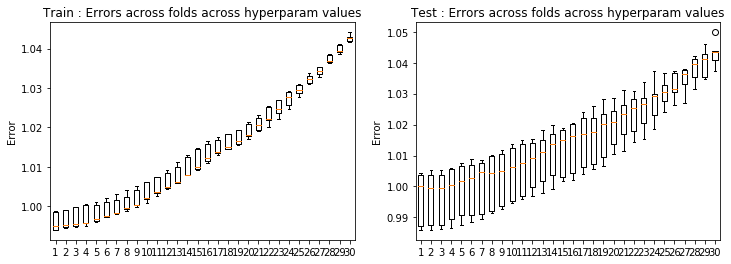

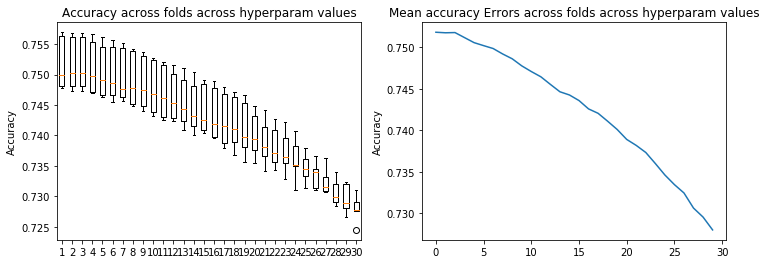

In [215]:
result_crossval(loss_tr11,loss_te11)
result_crossval_accuracy(acc11)

In [216]:
# test 12: degree 3, rmse, remove correlated features, not removal of outliers, undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr12, loss_te12, w12, acc12 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.90394531e-01 -2.98106100e-01 -6.93973453e-02
  5.57955240e-01  4.29053002e-02  3.46719210e-01 -1.31170170e-01
  1.80613353e-02  4.49271080e-01 -6.01865054e-03  8.17621528e-03
  2.41145916e-01  4.29968135e-03  1.58319038e-02  1.05904927e-01
  2.48144187e-03  8.41575954e-02  8.91799557e-04  9.50045575e-03
 -1.14578429e-01  1.37283213e-01 -2.56964914e-01 -3.96826146e-01
 -1.75869971e-02 -2.32379670e-01  1.64543723e-01  2.36871292e-02
 -4.98435841e-01 -3.53831017e-02 -5.34758033e-05 -3.76960420e-01
 -6.96011150e-02  7.11595261e-03 -1.25873305e-01  1.43570355e-04
 -1.80795786e-01  1.59491437e-01  2.72346489e-03 -3.75450396e-01
  6.37534894e-03  2.00178325e-01  3.59255194e-02  1.56511199e-02
  1.33355996e-01 -8.23343853e-02  7.53106283e-02  1.84811054e-01
  8.61554693e-03 -9.4267

Ridge regression: w=[-2.83263560e-01  2.49992412e-01 -2.88094905e-01  8.75461536e-03
  5.06231450e-01  4.40386420e-02  3.56227870e-01 -1.28199399e-01
  1.20863048e-02  4.29241316e-01 -1.06232735e-02  9.58616857e-03
  2.01223849e-01  4.59587311e-03  1.99645776e-02  1.01368447e-01
  5.40206498e-03  8.75350297e-02 -5.47837154e-03  4.21118381e-03
 -9.87853226e-02  1.27621813e-01 -3.77981582e-01 -3.16616423e-01
 -1.21825823e-02 -2.53260882e-01  1.79194845e-01  2.72032496e-02
 -4.56867791e-01 -3.94158459e-02 -1.85835274e-03 -3.34774284e-01
 -6.66995749e-02 -3.59502076e-05 -1.07984676e-01 -1.73588967e-03
 -1.76775191e-01  1.57286452e-01 -1.36605661e-03 -3.18638699e-01
  4.14392756e-03  2.57509327e-01 -6.35503616e-03  9.29246803e-03
  1.34111206e-01 -9.91621921e-02  8.41098519e-02  1.60180303e-01
  1.18144072e-02 -8.94125136e-03  1.41593270e-01 -5.96681831e-03
 -1.83927524e-02  4.60545685e-02  2.48903273e-03  4.80178831e-02
  4.83791648e-03 -2.12478123e-03]
Accuracy = [0.755996904823317, 0.761

Ridge regression: w=[-2.82505526e-01  1.69420875e-01 -2.92124050e-01 -3.01278119e-02
  4.56760436e-01  4.68883103e-02  3.44447758e-01 -1.27453547e-01
  2.20089493e-02  3.93733426e-01 -2.72985076e-03  4.30374667e-03
  1.92736633e-01 -2.88869499e-03  1.35544780e-02  1.03126917e-01
  7.13640569e-04  9.56443301e-02 -8.04640781e-03  8.08044641e-03
 -8.15616072e-02  1.32394696e-01 -2.72360247e-01 -2.14143654e-01
 -2.26895457e-02 -2.51542306e-01  1.51860799e-01  2.63944629e-02
 -4.04153690e-01 -4.06460070e-02  1.78369429e-03 -2.86524831e-01
 -6.65328221e-02  8.18113688e-04 -1.07937183e-01 -3.79186533e-04
 -1.99626847e-01  1.57182297e-01  3.02524396e-03 -2.19961340e-01
  9.61717700e-03  1.91737094e-01 -6.16790490e-02  1.25511584e-02
  1.38086805e-01 -8.25534173e-02  7.28437682e-02  1.36674256e-01
  3.10009996e-03 -4.24853429e-03  1.13315718e-01 -1.11709257e-03
 -1.39483205e-02  4.26621687e-02  5.04488815e-03  6.25477408e-02
  7.63055521e-03 -7.17886368e-03]
Ridge regression: w=[-2.82826628e-01

Ridge regression: w=[-0.28574534  0.13331729 -0.27160819 -0.01848144  0.40618343  0.04241112
  0.30793346 -0.11852791  0.03807815  0.38955068  0.00090455 -0.00382647
  0.15610165 -0.00099725  0.00903867  0.10522988 -0.00238856  0.08150086
 -0.00475291 -0.00221571 -0.04255951  0.10052195 -0.27007942 -0.13094609
 -0.01363589 -0.181677    0.12607738  0.02699194 -0.40496939 -0.04039398
  0.00331709 -0.22748035 -0.06858313  0.00398096 -0.1044719  -0.00051849
 -0.16358007  0.158684    0.00295643 -0.14591661  0.02106285  0.18359185
 -0.10226029  0.00965091  0.10266711 -0.06550813  0.06058546  0.1322367
  0.0077902   0.0026838   0.08469899 -0.00635863 -0.01052268  0.04205377
  0.00793174  0.02964278  0.00327432  0.00162723]
Ridge regression: w=[-0.28180557  0.12060046 -0.28189128 -0.01548435  0.40484205  0.04504674
  0.31349664 -0.11981175  0.03274384  0.35971029 -0.00266303  0.00364525
  0.16241648 -0.00296228  0.01289932  0.0994234   0.00057211  0.08611556
 -0.00790445  0.00756007 -0.0571265

Ridge regression: w=[-0.28460984  0.09435726 -0.25966659 -0.01048608  0.3640617   0.04019548
  0.27648195 -0.11642264  0.04905978  0.33367033  0.00092675 -0.00394089
  0.13172463 -0.00121648  0.00871452  0.09898466 -0.00225091  0.07316468
 -0.00467403 -0.00198432 -0.03170204  0.08131323 -0.25484845 -0.07228029
 -0.00945932 -0.14337818  0.10155828  0.02863764 -0.31459566 -0.04108073
  0.00322814 -0.16730981 -0.0690872   0.00384053 -0.08865774 -0.00061106
 -0.14430084  0.15848156  0.00281915 -0.09531102  0.028799    0.1661322
 -0.12899316  0.0077621   0.08117848 -0.04804162  0.05250538  0.08705665
  0.00786384  0.00276045  0.05211089 -0.0061993  -0.01009437  0.03322191
  0.0077876   0.01819432  0.00311573  0.00144907]
Ridge regression: w=[-0.28068572  0.08487501 -0.26883819 -0.00789942  0.36328199  0.0426702
  0.27760646 -0.11488174  0.04417586  0.31893529 -0.00255336  0.00275548
  0.13619351 -0.00305629  0.01196857  0.0931679   0.00041516  0.07490894
 -0.00771711  0.00681752 -0.0420117 

Ridge regression: w=[-0.28280022  0.06609748 -0.24582396 -0.00882909  0.32710001  0.03758986
  0.24120435 -0.1116802   0.05949939  0.28306855  0.00101428 -0.00405192
  0.11021574 -0.00154716  0.0082472   0.09082773 -0.00195699  0.06251561
 -0.00456592 -0.00170407 -0.02644686  0.05981965 -0.22887416 -0.03346385
 -0.00480841 -0.10256912  0.07669821  0.030656   -0.23089392 -0.04197839
  0.00312573 -0.11438502 -0.06967309  0.00367461 -0.06963862 -0.00071453
 -0.12003916  0.15797923  0.00266982 -0.06050134  0.03727353  0.14249617
 -0.14113879  0.00569383  0.05829594 -0.0318289   0.04519845  0.04588899
  0.00789877  0.00281975  0.02500745 -0.00597359 -0.00950775  0.02289716
  0.00747597  0.00439266  0.00292679  0.00123664]
Ridge regression: w=[-2.78901058e-01  5.95128171e-02 -2.53640476e-01 -5.85986573e-03
  3.26607139e-01  3.98326767e-02  2.39972105e-01 -1.10146031e-01
  5.51396101e-02  2.76180519e-01 -2.39960145e-03  1.65991855e-03
  1.13984547e-01 -3.20406303e-03  1.07279927e-02  8.484083

Ridge regression: w=[-2.78051384e-01  4.52513240e-02 -2.35590093e-01 -2.97822192e-03
  2.90873661e-01  2.61543874e-02  1.98738507e-01 -1.04516081e-01
  6.92318499e-02  2.41599026e-01 -1.41620936e-03 -5.72210807e-03
  9.01975449e-02 -1.46751001e-03  8.11644209e-03  7.35377749e-02
  3.96833392e-03  5.12736343e-02 -1.96474167e-03  2.56055459e-03
 -2.45681087e-02  4.52752397e-02 -1.90542742e-01 -1.23076748e-02
  1.17710326e-02 -7.52820132e-02  6.46819375e-02  3.33561901e-02
 -1.70232073e-01 -4.44257613e-02 -2.00012998e-03 -6.85706217e-02
 -7.18609582e-02  5.02427986e-03 -3.90307687e-02 -3.15996553e-03
 -9.22901804e-02  1.57576539e-01 -1.26569644e-04 -3.78646877e-02
  4.05003881e-02  1.10844186e-01 -1.47091571e-01 -1.70666032e-03
  3.50523037e-02 -2.05953046e-02  4.17269599e-02  2.58281821e-02
  7.50924858e-03  1.63723270e-03  1.90548412e-04 -3.59470746e-03
 -8.28738573e-03  6.74255120e-03  1.48697312e-03 -5.84782874e-04
  6.06980600e-04 -2.44910668e-03]
Ridge regression: w=[-2.79934138e-01

Ridge regression: w=[-2.73432225e-01  3.44385431e-02 -2.17240630e-01 -7.42342478e-03
  2.46672245e-01  2.98228463e-02  1.73814740e-01 -1.00320381e-01
  7.49028607e-02  2.00184124e-01 -3.36638686e-03  8.92092571e-04
  8.22629883e-02  1.96386915e-03  7.59137550e-03  6.64295691e-02
  2.05543714e-04  3.98464313e-02  1.36807635e-04  2.69394350e-03
 -2.30529514e-02  1.36580749e-02 -1.62935116e-01  6.51309654e-03
  6.44433838e-03 -3.75577291e-02  2.85373735e-02  3.65009522e-02
 -1.13467385e-01 -4.01084421e-02 -1.08649212e-03 -4.09370302e-02
 -7.26800234e-02  5.65713602e-03 -2.90253308e-02 -2.71225999e-04
 -7.06101875e-02  1.56465529e-01  2.03242763e-03 -2.13972817e-02
  5.58456255e-02  8.18428425e-02 -1.27709914e-01  3.31192547e-03
  1.86139865e-02  4.41235826e-03  3.62748800e-02  3.18294842e-03
  7.35642476e-03 -3.42544296e-03 -1.10506465e-02 -4.86467547e-03
 -9.48077413e-03  8.36079252e-04  4.41395730e-03 -1.93215785e-02
 -3.12876010e-03 -5.48646583e-03]
Ridge regression: w=[-2.73586601e-01

Ridge regression: w=[-2.68886036e-01  2.91970623e-02 -2.07737079e-01 -1.31647932e-03
  2.31168733e-01  3.12564867e-02  1.60103367e-01 -9.50157343e-02
  7.43493367e-02  1.89401365e-01 -6.24909725e-03  1.47949253e-03
  6.70578370e-02  6.13043009e-04  9.94204904e-03  6.14071121e-02
  3.23220438e-03  4.14921647e-02 -4.32199254e-03 -9.22600309e-04
 -2.55356049e-02  1.06884450e-02 -1.48339998e-01  9.22235107e-03
  1.02691828e-02 -2.82681517e-02  2.98090013e-02  4.08707881e-02
 -9.40422259e-02 -4.45276295e-02 -1.53050588e-03 -2.76255879e-02
 -7.03793413e-02 -1.69753365e-04 -1.63518715e-02 -1.92412600e-03
 -5.88072945e-02  1.52667053e-01 -1.16962524e-03 -1.67986619e-02
  4.93420900e-02  6.44591200e-02 -1.24757639e-01 -1.37650858e-03
  1.36624220e-02  4.37943679e-03  4.06551877e-02 -7.72895882e-03
  9.42039464e-03 -2.63577585e-03 -2.12072925e-02 -4.10604436e-03
 -9.93120328e-03 -3.57127340e-03  3.87226227e-03 -2.60975643e-02
  3.29263988e-03  1.10147060e-03]
Accuracy = [0.7458086149084343, 0.75

Ridge regression: w=[-2.60141422e-01  2.33656991e-02 -1.93695150e-01 -5.95786826e-03
  1.87237488e-01  2.87906745e-02  1.30978046e-01 -8.36458775e-02
  7.44415034e-02  1.59334794e-01 -1.52316197e-03 -1.92875659e-03
  5.67654783e-02 -3.97352303e-03  5.01695203e-03  5.18880374e-02
  8.24564237e-04  3.38740390e-02 -5.45143068e-03  2.38471195e-03
 -2.40846910e-02  1.82136406e-04 -1.18911093e-01  1.62578292e-02
  5.68256136e-03 -9.19627880e-03  1.14315251e-02  4.18505992e-02
 -4.73883291e-02 -4.61465979e-02  6.46671973e-04 -1.03433215e-02
 -6.95655147e-02 -2.55462221e-04 -6.87420417e-03 -8.54290875e-04
 -4.11150347e-02  1.48925172e-01  2.51153758e-03 -4.32006056e-03
  5.26843891e-02  3.86976853e-02 -9.84534134e-02  1.92325736e-04
 -1.19321033e-03 -1.26901704e-03  3.92688836e-02 -1.91456966e-02
  2.40977487e-03  1.03109372e-04 -8.62917590e-03 -1.25535825e-03
 -6.48737170e-03 -3.47467664e-03  4.00195442e-03 -3.25455483e-02
  4.81968445e-03 -2.46910685e-03]
Ridge regression: w=[-2.60437104e-01

Ridge regression: w=[-2.51074542e-01  2.27987936e-02 -1.72204117e-01 -4.77236885e-03
  1.45367860e-01  2.45738987e-02  1.11301191e-01 -7.68740841e-02
  7.61584380e-02  1.37913400e-01  2.19362254e-03 -3.59081140e-03
  4.05295068e-02 -3.81161823e-03  3.89309731e-03  4.83430930e-02
  1.00249104e-03  2.79499754e-02 -3.28655128e-03 -3.63675990e-04
 -2.19099945e-02 -1.47981572e-02 -9.20015630e-02  1.79399798e-02
  1.04919777e-02  4.23224502e-03  4.96471354e-04  4.49140197e-02
 -1.91153130e-02 -4.62894764e-02  2.26710218e-03 -1.82329975e-03
 -6.99305957e-02  2.27512817e-03  1.01895004e-03 -1.07994334e-03
 -3.07779359e-02  1.43658759e-01  1.70431306e-03  2.75064604e-03
  5.04222930e-02  1.89680342e-02 -7.25395364e-02  1.45249681e-03
 -9.50781167e-03  3.66030238e-03  4.13959309e-02 -3.39201788e-02
  6.79356378e-03  1.84818660e-03 -4.66808025e-03 -4.47901329e-03
 -4.55174324e-03 -5.49176002e-03  4.32666054e-03 -3.31920592e-02
  1.53768349e-03  1.84471629e-04]
Ridge regression: w=[-2.47612803e-01

Ridge regression: w=[-2.31437558e-01  2.17987253e-02 -1.51389486e-01  2.21776658e-03
  1.09773182e-01  1.95820879e-02  8.84171544e-02 -6.81420056e-02
  7.47270933e-02  1.17020541e-01  6.32548198e-04 -5.21339746e-03
  2.88958954e-02 -2.94758129e-03  2.90895651e-03  3.49551214e-02
  3.01136681e-03  2.57430971e-02 -1.25591869e-03  6.65480258e-04
 -2.14919697e-02 -2.03071485e-02 -6.88901913e-02  1.56764352e-02
  1.37499027e-02  6.70907719e-03 -4.08269263e-03  4.61319076e-02
 -7.98007503e-03 -4.65558027e-02 -2.10413306e-03  2.24992113e-03
 -6.88288702e-02  3.95036981e-03  7.14564777e-03 -2.74530769e-03
 -1.87452724e-02  1.34651286e-01 -1.07617437e-04  7.14988513e-03
  4.26781133e-02  3.62382657e-04 -5.44786700e-02  1.99385924e-03
 -1.35198327e-02  6.86161919e-03  4.58767264e-02 -2.88096461e-02
  4.84869839e-03  2.97412877e-04 -3.87971303e-03 -2.74280292e-03
 -2.65321064e-03 -5.70543145e-03  1.86546798e-03 -2.81036944e-02
  8.66402873e-05 -7.78808869e-04]
Ridge regression: w=[-2.33004678e-01

Ridge regression: w=[-2.07284598e-01  2.23890270e-02 -1.30246197e-01  2.35759795e-03
  7.96925825e-02  1.86086577e-02  7.57648607e-02 -6.29121983e-02
  7.06745231e-02  9.78680301e-02  1.81415928e-04 -1.99155600e-03
  2.01366141e-02 -1.51431533e-03  1.62520074e-03  2.76921747e-02
  1.45797780e-03  2.29704315e-02 -6.69203248e-04 -5.60202704e-04
 -2.25214484e-02 -2.70789916e-02 -5.40247731e-02  1.51952862e-02
  1.23927991e-02  1.31342351e-02 -1.24961615e-02  4.67395158e-02
  2.38642203e-03 -4.03903110e-02 -1.78301865e-03  3.91395755e-03
 -6.40268704e-02  2.99465856e-03  7.82107492e-03 -5.03144153e-04
 -1.14743491e-02  1.21965137e-01  8.51552917e-04  1.18538387e-02
  3.66147036e-02 -1.02288242e-02 -3.49685778e-02  4.81621499e-03
 -1.24419839e-02  7.27108589e-03  4.70493240e-02 -2.59083814e-02
  3.83421351e-03 -1.23082111e-03  9.03768575e-05 -2.95096356e-03
 -2.81595404e-03 -4.89374827e-03  2.28775009e-03 -2.65034824e-02
 -1.42827967e-03 -2.42391290e-03]
Ridge regression: w=[-2.07401629e-01

Ridge regression: w=[-1.92009086e-01  2.31675769e-02 -1.18440896e-01  5.02928856e-03
  6.84192206e-02  1.96514678e-02  6.75729500e-02 -5.88346840e-02
  6.86108899e-02  8.97605736e-02 -9.98919677e-04 -1.29569906e-03
  1.28316122e-02 -2.42835266e-03  2.41237424e-03  2.48060507e-02
  3.30518247e-03  2.47765549e-02 -1.79595723e-03 -9.29134255e-04
 -2.28432835e-02 -2.66628323e-02 -4.57721713e-02  1.34391490e-02
  1.25001720e-02  1.24851573e-02 -1.15777580e-02  4.75996911e-02
  5.94069458e-03 -4.16155981e-02 -8.17700207e-04  1.74749623e-03
 -5.92918734e-02  5.95040755e-05  9.49025112e-03 -1.30439552e-03
 -5.94637277e-03  1.11774074e-01 -2.81292573e-04  1.37100163e-02
  3.00997526e-02 -1.74901335e-02 -2.95478256e-02  3.06658982e-03
 -1.22913090e-02  7.50437388e-03  4.89074001e-02 -2.45235046e-02
  4.08568587e-03 -6.77472020e-04 -1.02581927e-03 -2.84672126e-03
 -2.19409627e-03 -2.59788930e-03  2.82104460e-03 -2.20853731e-02
  8.22699191e-04  2.41303917e-04]
Accuracy = [0.7340727366520505, 0.73

Ridge regression: w=[-1.60140117e-01  2.35814058e-02 -9.67674665e-02  2.28781856e-03
  4.90349477e-02  1.50552055e-02  5.24903250e-02 -5.12288348e-02
  6.12131677e-02  7.27776778e-02 -8.89914123e-04 -2.06391176e-03
  7.47767846e-03 -3.28980770e-03  7.62167380e-04  1.65872548e-02
  1.91784869e-03  2.15215533e-02 -1.65501074e-03  4.28923297e-04
 -2.36625046e-02 -2.51012052e-02 -3.56669973e-02  1.12493077e-02
  9.03427829e-03  1.40340839e-02 -1.59381869e-02  4.23104220e-02
  1.15044787e-02 -3.81209080e-02 -1.74309980e-04  2.62497135e-03
 -5.16695609e-02 -7.94973408e-04  8.65731022e-03 -7.66973837e-04
 -2.34691066e-04  9.42287998e-02  1.42231805e-03  1.72786268e-02
  2.17219471e-02 -1.65432004e-02 -1.93575372e-02  3.42152487e-03
 -7.12598699e-03  3.62375193e-03  4.66363717e-02 -1.76608740e-02
  5.86792510e-04 -3.70269342e-04  2.80213871e-03 -2.39281086e-03
 -1.52367593e-03  8.76671426e-05  2.05156420e-03 -1.46906008e-02
  1.46910291e-03 -6.36753162e-04]
Ridge regression: w=[-1.60322136e-01

Ridge regression: w=[-0.12651907  0.02341176 -0.07695745  0.00147919  0.0339955   0.01218131
  0.04077522 -0.0433072   0.05416052  0.05763841 -0.00091085 -0.00179365
  0.00193287 -0.00289829  0.00049342  0.01126541  0.0018015   0.01935131
 -0.00114221  0.0002486  -0.02331211 -0.02429619 -0.02641601  0.00844443
  0.00796811  0.0137949  -0.01636721  0.03675229  0.01295258 -0.03245504
 -0.00021354  0.00055168 -0.04290721 -0.00071185  0.00747977 -0.00065879
  0.00397356  0.07477425  0.00114478  0.01888768  0.01321641 -0.01569811
 -0.01263698  0.00367876 -0.00306054  0.00143546  0.043583   -0.01178855
  0.00020453 -0.00048749  0.00227324 -0.00232341 -0.00100594  0.00135103
  0.00174372 -0.00776213  0.00104904 -0.00046773]
Ridge regression: w=[-1.26662876e-01  2.34616585e-02 -7.72958803e-02  2.43982513e-03
  3.37657253e-02  1.37077366e-02  4.13681476e-02 -4.33331287e-02
  5.56192840e-02  5.78412245e-02 -4.14433471e-04 -1.19546918e-03
  4.63148046e-04 -2.24223389e-03  1.23657479e-03  1.241001

Ridge regression: w=[-9.45533488e-02  2.21410742e-02 -5.98533153e-02  4.60953754e-04
  2.28349002e-02  9.47991682e-03  3.11427025e-02 -3.53164674e-02
  4.58667131e-02  4.44500899e-02 -9.02879249e-04 -1.49049696e-03
 -1.49389028e-03 -2.44971442e-03  3.37845761e-04  7.26686757e-03
  1.58367726e-03  1.69602210e-02 -7.80100754e-04  1.23602031e-04
 -2.20147866e-02 -2.23918239e-02 -1.92809477e-02  5.79455116e-03
  6.52830825e-03  1.28804210e-02 -1.55066174e-02  2.99260236e-02
  1.29033392e-02 -2.60900364e-02 -2.06635385e-04 -1.22345686e-03
 -3.37430527e-02 -5.80708343e-04  6.06864134e-03 -5.30887455e-04
  6.52482154e-03  5.60671555e-02  8.83116762e-04  1.90066081e-02
  6.42241757e-03 -1.31717721e-02 -8.46215607e-03  3.41218916e-03
  3.56651059e-04 -7.09613982e-04  3.83666750e-02 -6.52976163e-03
 -7.62336146e-05 -5.20392857e-04  1.12128701e-03 -2.08985088e-03
 -6.34589219e-04  2.05407438e-03  1.43459023e-03 -2.32147392e-03
  7.33691910e-04 -3.43447418e-04]
Ridge regression: w=[-9.46608202e-02

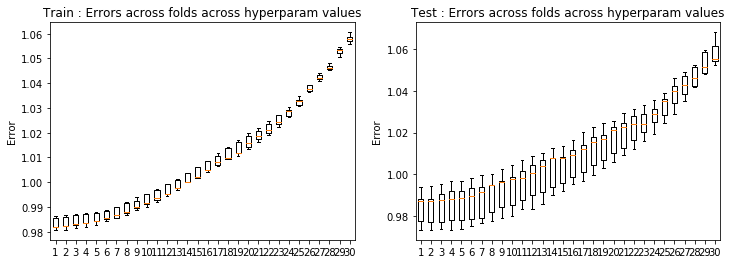

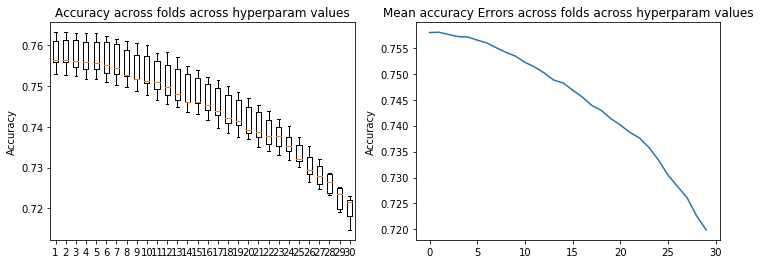

In [217]:
result_crossval(loss_tr12,loss_te12)
result_crossval_accuracy(acc12)

In [218]:
# test 13: degree 1, class, remove correlated features, not removal of outliers, undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr13, loss_te13, w13, acc13 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.65206763e-02 -2.07279063e-01 -2.52456832e-01
  2.52767711e-01  5.75965547e-02  6.49065096e-02 -1.83103647e-01
  1.30930083e-01  1.65257016e-01  3.51041268e-03 -3.95699659e-03
  2.37795348e-01 -6.00053257e-03 -1.89362993e-04  6.16801613e-02
  2.17949549e-03 -5.24250592e-02 -8.70349313e-04 -5.35270297e-03]
Ridge regression: w=[-0.28512101  0.0262587  -0.20774915 -0.24941209  0.24941962  0.05585407
  0.05086393 -0.16968021  0.13375498  0.17355212  0.00489677 -0.00597897
  0.23186203 -0.00747645  0.00202765  0.06585676  0.00425505 -0.04808925
 -0.00066399 -0.00120428]
Ridge regression: w=[-0.28705164  0.03083804 -0.20791779 -0.25511551  0.25409967  0.05673799
  0.05877742 -0.17571685  0.13112988  0.17159289  0.00896946 -0.00325325
  0.23351181 -0.01044521  0.00127943  0.0717692

Ridge regression: w=[-0.28574534  0.03130644 -0.2056182  -0.24627395  0.24748071  0.05631088
  0.06193175 -0.1689675   0.13110933  0.16941577  0.00888419 -0.00329164
  0.22118157 -0.01040226  0.00124642  0.06928018  0.00487107 -0.05028977
 -0.00166943 -0.00084434]
Ridge regression: w=[-0.28180557  0.02908682 -0.20758521 -0.24993222  0.25055462  0.05403094
  0.05787281 -0.17074527  0.1280185   0.17297327  0.00096064 -0.00315334
  0.22913126 -0.00867305 -0.0004097   0.06412068  0.003101   -0.04565757
 -0.00035226 -0.00172188]
Ridge regression: w=[-0.28212588  0.02842233 -0.20464694 -0.24091726  0.24587298  0.05960143
  0.06333538 -0.16584997  0.13386109  0.16740677  0.00258504 -0.00169028
  0.21234072 -0.00618411  0.00192692  0.06161909  0.00619131 -0.04363582
 -0.00120368 -0.00180602]
Accuracy = [0.7086664947124065, 0.7155016765540366, 0.7076347691514058, 0.7155016765540366, 0.7129223626515347]
Ridge regression: w=[-2.83165437e-01  2.72507421e-02 -2.04370393e-01 -2.40358792e-01
  2.4362

Ridge regression: w=[-0.27993414  0.03331724 -0.19698085 -0.21259003  0.22154335  0.05425632
  0.0709444  -0.14552173  0.13081607  0.160412    0.00850657 -0.0034205
  0.17743413 -0.01018326  0.00113613  0.06059044  0.00481815 -0.04440473
 -0.00172073 -0.00086143]
Ridge regression: w=[-0.27607449  0.03122966 -0.1987354  -0.21546042  0.22396754  0.05204085
  0.06739385 -0.14728164  0.1277499   0.1633311   0.00064709 -0.00328887
  0.18459811 -0.0084903  -0.00033359  0.05555208  0.00314497 -0.04008251
 -0.00040887 -0.00154924]
Ridge regression: w=[-0.27638828  0.03065263 -0.19655488 -0.20825789  0.22024659  0.05748866
  0.07163199 -0.14306211  0.13330094  0.15870361  0.00235991 -0.00190805
  0.17007037 -0.0061384   0.00180644  0.05371313  0.00611592 -0.03806543
 -0.0012979  -0.00174268]
Accuracy = [0.7092468403404695, 0.7169202992004127, 0.7082795976270312, 0.7158885736394119, 0.7125354655661594]
Ridge regression: w=[-2.75910011e-01  3.00327221e-02 -1.94647940e-01 -2.00119683e-01
  2.12245

Ridge regression: w=[-2.56144384e-01  3.61014624e-02 -1.75484946e-01 -1.31615198e-01
  1.55125733e-01  4.72342854e-02  7.88485792e-02 -1.07376552e-01
  1.27344225e-01  1.30458665e-01  2.68784673e-03 -4.23594365e-03
  9.49777574e-02 -5.75212623e-03  1.65344277e-04  3.60206862e-02
  2.46423796e-03 -2.43653815e-02 -7.58516436e-04 -4.47332718e-03]
Ridge regression: w=[-0.256289    0.03576583 -0.17417648 -0.13045307  0.15397946  0.04588921
  0.07250829 -0.10036306  0.12892391  0.13317894  0.0032201  -0.00628804
  0.09091902 -0.00644217  0.00200286  0.03765373  0.00409154 -0.02154847
 -0.00056131 -0.00075604]
Ridge regression: w=[-0.2580244   0.03940596 -0.17463632 -0.1339085   0.15643989  0.04643387
  0.07705351 -0.1032617   0.12743891  0.13344916  0.00715455 -0.00358724
  0.09150262 -0.00920503  0.00096561  0.04292319  0.00462975 -0.02378047
 -0.00172349 -0.00081502]
Ridge regression: w=[-2.54466835e-01  3.77394308e-02 -1.75746273e-01 -1.35164310e-01
  1.57567712e-01  4.44417796e-02  7.491

Ridge regression: w=[-2.05927043e-01  4.53623909e-02 -1.40552281e-01 -6.00442931e-02
  8.62164523e-02  3.11743108e-02  6.47223275e-02 -7.48162480e-02
  1.10842099e-01  9.80475625e-02 -1.19586597e-03 -3.31291240e-03
  2.83091746e-02 -6.43295517e-03  1.88729833e-04  2.13939632e-02
  3.22098636e-03  6.67762985e-03 -6.05929187e-04 -5.63320804e-04]
Ridge regression: w=[-0.2061611   0.04523153 -0.14121621 -0.05933146  0.08557138  0.03534367
  0.06499621 -0.07413813  0.11442898  0.09666756  0.00061321 -0.00250092
  0.02343736 -0.00489604  0.00142307  0.02204846  0.00514165  0.0079411
 -0.00137141 -0.00130126]
Accuracy = [0.7104720144441579, 0.7137606396698478, 0.7076347691514058, 0.7155661594015992, 0.7055068351818417]
Ridge regression: w=[-0.19305546  0.04517176 -0.1324493  -0.04730443  0.07308124  0.03011841
  0.06199082 -0.0713611   0.10816111  0.08852441  0.00122469 -0.00364092
  0.01864177 -0.00454821  0.00071393  0.01763635  0.00258646  0.00910996
 -0.00052206 -0.00320564]
Ridge regress

Ridge regression: w=[-0.11165194  0.04105828 -0.08357825 -0.01488897  0.027758    0.01509715
  0.04038539 -0.04758849  0.07293791  0.05536878  0.00139213 -0.00215049
 -0.00551485 -0.00367427  0.00077651  0.00912038  0.00258603  0.0213266
 -0.00077365 -0.00041958]
Ridge regression: w=[-0.11011252  0.0406378  -0.08340756 -0.01465499  0.02773295  0.01409413
  0.04019338 -0.04776612  0.07154313  0.05607464 -0.0015572  -0.00216153
 -0.0046152  -0.00383083  0.00029171  0.0069181   0.00237391  0.02182834
 -0.00055852 -0.0001973 ]
Ridge regression: w=[-0.11023768  0.04072625 -0.08440316 -0.01510281  0.02747046  0.0162449
  0.03997493 -0.04790562  0.07342233  0.05568628 -0.00044702 -0.00172033
 -0.00657235 -0.002991    0.00102832  0.00776835  0.00320582  0.02247038
 -0.00091104 -0.00084133]
Accuracy = [0.7051199380964663, 0.705893732267217, 0.7010575187000258, 0.7109233943770957, 0.7017668300232138]
Ridge regression: w=[-9.51766830e-02  3.72063017e-02 -7.43100670e-02 -1.10376670e-02
  2.2201120

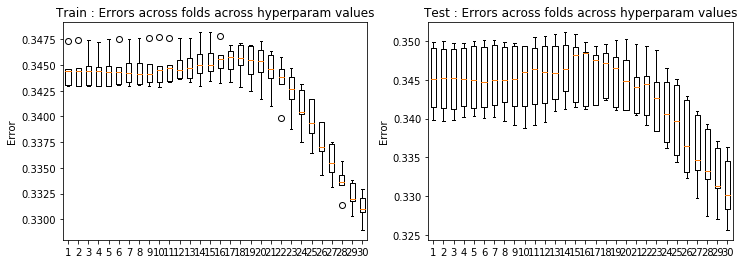

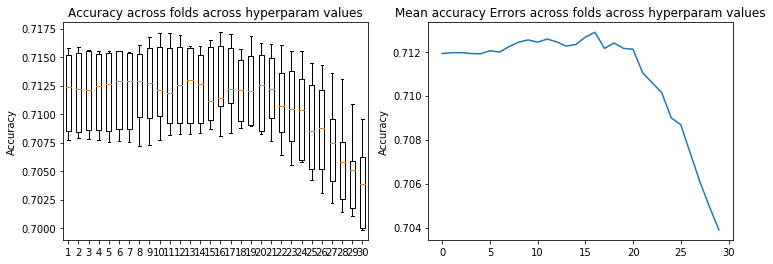

In [219]:
result_crossval(loss_tr13,loss_te13)
result_crossval_accuracy(acc13)

In [220]:
# test 14: degree 2, class, remove correlated features, not removal of outliers, undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr14, loss_te14, w14, acc14 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.65206763e-02 -2.07279063e-01 -2.52456832e-01
  2.52767711e-01  5.75965547e-02  6.49065096e-02 -1.83103647e-01
  1.30930083e-01  1.65257016e-01  3.51041268e-03 -3.95699659e-03
  2.37795348e-01 -6.00053257e-03 -1.89362993e-04  6.16801613e-02
  2.17949549e-03 -5.24250592e-02 -8.70349313e-04 -5.35270297e-03]
Ridge regression: w=[-0.28512101  0.0262587  -0.20774915 -0.24941209  0.24941962  0.05585407
  0.05086393 -0.16968021  0.13375498  0.17355212  0.00489677 -0.00597897
  0.23186203 -0.00747645  0.00202765  0.06585676  0.00425505 -0.04808925
 -0.00066399 -0.00120428]
Ridge regression: w=[-0.28705164  0.03083804 -0.20791779 -0.25511551  0.25409967  0.05673799
  0.05877742 -0.17571685  0.13112988  0.17159289  0.00896946 -0.00325325
  0.23351181 -0.01044521  0.00127943  0.0717692

Ridge regression: w=[-0.28574534  0.03130644 -0.2056182  -0.24627395  0.24748071  0.05631088
  0.06193175 -0.1689675   0.13110933  0.16941577  0.00888419 -0.00329164
  0.22118157 -0.01040226  0.00124642  0.06928018  0.00487107 -0.05028977
 -0.00166943 -0.00084434]
Ridge regression: w=[-0.28180557  0.02908682 -0.20758521 -0.24993222  0.25055462  0.05403094
  0.05787281 -0.17074527  0.1280185   0.17297327  0.00096064 -0.00315334
  0.22913126 -0.00867305 -0.0004097   0.06412068  0.003101   -0.04565757
 -0.00035226 -0.00172188]
Ridge regression: w=[-0.28212588  0.02842233 -0.20464694 -0.24091726  0.24587298  0.05960143
  0.06333538 -0.16584997  0.13386109  0.16740677  0.00258504 -0.00169028
  0.21234072 -0.00618411  0.00192692  0.06161909  0.00619131 -0.04363582
 -0.00120368 -0.00180602]
Accuracy = [0.7086664947124065, 0.7155016765540366, 0.7076347691514058, 0.7155016765540366, 0.7129223626515347]
Ridge regression: w=[-2.83165437e-01  2.72507421e-02 -2.04370393e-01 -2.40358792e-01
  2.4362

Ridge regression: w=[-2.77894488e-01  2.93022145e-02 -1.97061693e-01 -2.09955982e-01
  2.20055447e-01  5.50908626e-02  7.51098187e-02 -1.51916116e-01
  1.30675867e-01  1.55234351e-01  3.30481469e-03 -4.11683525e-03
  1.81812806e-01 -6.00047203e-03 -1.11289157e-04  5.17336220e-02
  2.27286902e-03 -4.50917935e-02 -8.43498982e-04 -5.09260913e-03]
Ridge regression: w=[-0.27805138  0.02896383 -0.19666444 -0.20761658  0.21766393  0.05346976
  0.064459   -0.14088921  0.13305481  0.16121193  0.00439097 -0.00616581
  0.17623347 -0.00720261  0.00199844  0.05471434  0.00420749 -0.04129665
 -0.00063405 -0.00107334]
Ridge regression: w=[-0.27993414  0.03331724 -0.19698085 -0.21259003  0.22154335  0.05425632
  0.0709444  -0.14552173  0.13081607  0.160412    0.00850657 -0.0034205
  0.17743413 -0.01018326  0.00113613  0.06059044  0.00481815 -0.04440473
 -0.00172073 -0.00086143]
Ridge regression: w=[-0.27607449  0.03122966 -0.1987354  -0.21546042  0.22396754  0.05204085
  0.06739385 -0.14728164  0.1277

Ridge regression: w=[-0.26377832  0.03802691 -0.17966415 -0.1496533   0.17003281  0.04839754
  0.07730186 -0.11048681  0.12859517  0.13962747  0.00749618 -0.00357341
  0.10716778 -0.00946989  0.00099065  0.04634661  0.00468029 -0.02869583
 -0.00173936 -0.00083368]
Ridge regression: w=[-2.60141422e-01  3.62603003e-02 -1.80916445e-01 -1.51200374e-01
  1.71393566e-01  4.63514762e-02  7.48737514e-02 -1.11826042e-01
  1.25625990e-01  1.41702212e-01 -1.68297676e-05 -3.46490429e-03
  1.12468989e-01 -7.99003546e-03 -1.46577618e-04  4.15481612e-02
  3.23277600e-03 -2.51398906e-02 -5.03181231e-04 -1.18458293e-03]
Ridge regression: w=[-0.2604371   0.03584387 -0.1800328  -0.14703926  0.16921887  0.05152235
  0.07713347 -0.1090922   0.13056681  0.13854125  0.00183933 -0.00227278
  0.10213627 -0.00591096  0.00163491  0.04086379  0.00592265 -0.02329035
 -0.00142464 -0.00160128]
Accuracy = [0.7122130513283467, 0.7158240907918494, 0.7083440804745937, 0.7170492648955378, 0.7109878772246583]
Ridge regres

Ridge regression: w=[-0.21887394  0.04394302 -0.1492847  -0.07186762  0.09888687  0.03861028
  0.06844642 -0.07878295  0.11880509  0.1041163   0.00084902 -0.00252128
  0.0335807  -0.00514194  0.00146203  0.02511306  0.00534696  0.00281563
 -0.00141168 -0.0013603 ]
Accuracy = [0.7107299458344081, 0.7136316739747227, 0.7084085633221563, 0.716017539334537, 0.7064095950477173]
Ridge regression: w=[-0.2072846   0.04421353 -0.14115655 -0.05839017  0.08538439  0.03336702
  0.06596535 -0.07619131  0.11321012  0.09570745  0.00150896 -0.00382709
  0.02780592 -0.00483526  0.00062665  0.02049785  0.00260237  0.00414668
 -0.00057116 -0.0034564 ]
Ridge regression: w=[-0.20740163  0.043953   -0.13968277 -0.05815918  0.08490381  0.03249666
  0.06266282 -0.07257136  0.11394051  0.09616321  0.00157146 -0.00572256
  0.02568896 -0.00508117  0.001946    0.02138221  0.00372931  0.00570105
 -0.00048305 -0.00035971]
Ridge regression: w=[-0.208806    0.04640097 -0.14020773 -0.0599077   0.0859786   0.03278805
 

Ridge regression: w=[-0.12666288  0.04323299 -0.09430381 -0.01923373  0.03430225  0.01903725
  0.04432029 -0.05253526  0.0814827   0.06203892 -0.00034909 -0.00191001
 -0.00471947 -0.00333173  0.0011172   0.00950254  0.00358418  0.02229664
 -0.0010038  -0.0009298 ]
Accuracy = [0.7058292494196544, 0.7075702863038432, 0.7014444157854011, 0.7130513283466597, 0.7025406241939645]
Ridge regression: w=[-1.10838428e-01  4.02151540e-02 -8.40426704e-02 -1.42138396e-02
  2.79233601e-02  1.51628142e-02  4.01728985e-02 -4.81552300e-02
  7.28608002e-02  5.52542979e-02  7.62061235e-05 -2.31397957e-03
 -4.85064480e-03 -2.85814232e-03  8.65451001e-04  6.79714333e-03
  2.07427757e-03  2.07890852e-02 -2.87497230e-04 -1.91345863e-03]
Ridge regression: w=[-1.10901006e-01  3.99684329e-02 -8.31058007e-02 -1.44147798e-02
  2.76310573e-02  1.48780835e-02  3.88770833e-02 -4.67472374e-02
  7.29121108e-02  5.48005030e-02 -3.16950483e-05 -3.54612255e-03
 -5.45448384e-03 -2.91763815e-03  1.37295622e-03  7.19380769e-

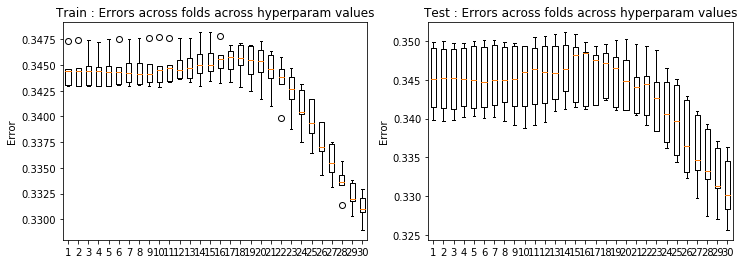

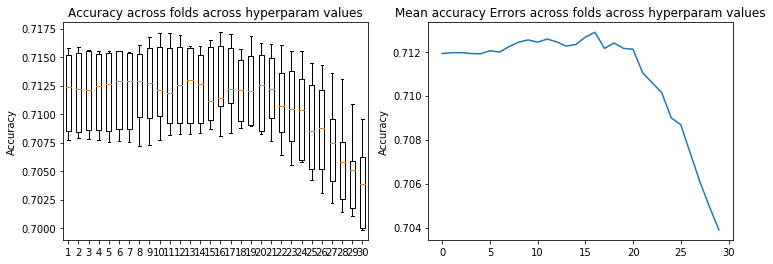

In [221]:
result_crossval(loss_tr14,loss_te14)
result_crossval_accuracy(acc14)

In [222]:
# test 15: degree 3, class, remove correlated features, not removal of outliers, undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr15, loss_te15, w15, acc15 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'class', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.90394531e-01 -2.98106100e-01 -6.93973453e-02
  5.57955240e-01  4.29053002e-02  3.46719210e-01 -1.31170170e-01
  1.80613353e-02  4.49271080e-01 -6.01865054e-03  8.17621528e-03
  2.41145916e-01  4.29968135e-03  1.58319038e-02  1.05904927e-01
  2.48144187e-03  8.41575954e-02  8.91799557e-04  9.50045575e-03
 -1.14578429e-01  1.37283213e-01 -2.56964914e-01 -3.96826146e-01
 -1.75869971e-02 -2.32379670e-01  1.64543723e-01  2.36871292e-02
 -4.98435841e-01 -3.53831017e-02 -5.34758033e-05 -3.76960420e-01
 -6.96011150e-02  7.11595261e-03 -1.25873305e-01  1.43570355e-04
 -1.80795786e-01  1.59491437e-01  2.72346489e-03 -3.75450396e-01
  6.37534894e-03  2.00178325e-01  3.59255194e-02  1.56511199e-02
  1.33355996e-01 -8.23343853e-02  7.53106283e-02  1.84811054e-01
  8.61554693e-03 -9.4267

Ridge regression: w=[-2.83263560e-01  2.49992412e-01 -2.88094905e-01  8.75461536e-03
  5.06231450e-01  4.40386420e-02  3.56227870e-01 -1.28199399e-01
  1.20863048e-02  4.29241316e-01 -1.06232735e-02  9.58616857e-03
  2.01223849e-01  4.59587311e-03  1.99645776e-02  1.01368447e-01
  5.40206498e-03  8.75350297e-02 -5.47837154e-03  4.21118381e-03
 -9.87853226e-02  1.27621813e-01 -3.77981582e-01 -3.16616423e-01
 -1.21825823e-02 -2.53260882e-01  1.79194845e-01  2.72032496e-02
 -4.56867791e-01 -3.94158459e-02 -1.85835274e-03 -3.34774284e-01
 -6.66995749e-02 -3.59502076e-05 -1.07984676e-01 -1.73588967e-03
 -1.76775191e-01  1.57286452e-01 -1.36605661e-03 -3.18638699e-01
  4.14392756e-03  2.57509327e-01 -6.35503616e-03  9.29246803e-03
  1.34111206e-01 -9.91621921e-02  8.41098519e-02  1.60180303e-01
  1.18144072e-02 -8.94125136e-03  1.41593270e-01 -5.96681831e-03
 -1.83927524e-02  4.60545685e-02  2.48903273e-03  4.80178831e-02
  4.83791648e-03 -2.12478123e-03]
Accuracy = [0.755996904823317, 0.761

Ridge regression: w=[-2.82505526e-01  1.69420875e-01 -2.92124050e-01 -3.01278119e-02
  4.56760436e-01  4.68883103e-02  3.44447758e-01 -1.27453547e-01
  2.20089493e-02  3.93733426e-01 -2.72985076e-03  4.30374667e-03
  1.92736633e-01 -2.88869499e-03  1.35544780e-02  1.03126917e-01
  7.13640569e-04  9.56443301e-02 -8.04640781e-03  8.08044641e-03
 -8.15616072e-02  1.32394696e-01 -2.72360247e-01 -2.14143654e-01
 -2.26895457e-02 -2.51542306e-01  1.51860799e-01  2.63944629e-02
 -4.04153690e-01 -4.06460070e-02  1.78369429e-03 -2.86524831e-01
 -6.65328221e-02  8.18113688e-04 -1.07937183e-01 -3.79186533e-04
 -1.99626847e-01  1.57182297e-01  3.02524396e-03 -2.19961340e-01
  9.61717700e-03  1.91737094e-01 -6.16790490e-02  1.25511584e-02
  1.38086805e-01 -8.25534173e-02  7.28437682e-02  1.36674256e-01
  3.10009996e-03 -4.24853429e-03  1.13315718e-01 -1.11709257e-03
 -1.39483205e-02  4.26621687e-02  5.04488815e-03  6.25477408e-02
  7.63055521e-03 -7.17886368e-03]
Ridge regression: w=[-2.82826628e-01

Ridge regression: w=[-0.28574534  0.13331729 -0.27160819 -0.01848144  0.40618343  0.04241112
  0.30793346 -0.11852791  0.03807815  0.38955068  0.00090455 -0.00382647
  0.15610165 -0.00099725  0.00903867  0.10522988 -0.00238856  0.08150086
 -0.00475291 -0.00221571 -0.04255951  0.10052195 -0.27007942 -0.13094609
 -0.01363589 -0.181677    0.12607738  0.02699194 -0.40496939 -0.04039398
  0.00331709 -0.22748035 -0.06858313  0.00398096 -0.1044719  -0.00051849
 -0.16358007  0.158684    0.00295643 -0.14591661  0.02106285  0.18359185
 -0.10226029  0.00965091  0.10266711 -0.06550813  0.06058546  0.1322367
  0.0077902   0.0026838   0.08469899 -0.00635863 -0.01052268  0.04205377
  0.00793174  0.02964278  0.00327432  0.00162723]
Ridge regression: w=[-0.28180557  0.12060046 -0.28189128 -0.01548435  0.40484205  0.04504674
  0.31349664 -0.11981175  0.03274384  0.35971029 -0.00266303  0.00364525
  0.16241648 -0.00296228  0.01289932  0.0994234   0.00057211  0.08611556
 -0.00790445  0.00756007 -0.0571265

Ridge regression: w=[-0.28460984  0.09435726 -0.25966659 -0.01048608  0.3640617   0.04019548
  0.27648195 -0.11642264  0.04905978  0.33367033  0.00092675 -0.00394089
  0.13172463 -0.00121648  0.00871452  0.09898466 -0.00225091  0.07316468
 -0.00467403 -0.00198432 -0.03170204  0.08131323 -0.25484845 -0.07228029
 -0.00945932 -0.14337818  0.10155828  0.02863764 -0.31459566 -0.04108073
  0.00322814 -0.16730981 -0.0690872   0.00384053 -0.08865774 -0.00061106
 -0.14430084  0.15848156  0.00281915 -0.09531102  0.028799    0.1661322
 -0.12899316  0.0077621   0.08117848 -0.04804162  0.05250538  0.08705665
  0.00786384  0.00276045  0.05211089 -0.0061993  -0.01009437  0.03322191
  0.0077876   0.01819432  0.00311573  0.00144907]
Ridge regression: w=[-0.28068572  0.08487501 -0.26883819 -0.00789942  0.36328199  0.0426702
  0.27760646 -0.11488174  0.04417586  0.31893529 -0.00255336  0.00275548
  0.13619351 -0.00305629  0.01196857  0.0931679   0.00041516  0.07490894
 -0.00771711  0.00681752 -0.0420117 

Ridge regression: w=[-0.28280022  0.06609748 -0.24582396 -0.00882909  0.32710001  0.03758986
  0.24120435 -0.1116802   0.05949939  0.28306855  0.00101428 -0.00405192
  0.11021574 -0.00154716  0.0082472   0.09082773 -0.00195699  0.06251561
 -0.00456592 -0.00170407 -0.02644686  0.05981965 -0.22887416 -0.03346385
 -0.00480841 -0.10256912  0.07669821  0.030656   -0.23089392 -0.04197839
  0.00312573 -0.11438502 -0.06967309  0.00367461 -0.06963862 -0.00071453
 -0.12003916  0.15797923  0.00266982 -0.06050134  0.03727353  0.14249617
 -0.14113879  0.00569383  0.05829594 -0.0318289   0.04519845  0.04588899
  0.00789877  0.00281975  0.02500745 -0.00597359 -0.00950775  0.02289716
  0.00747597  0.00439266  0.00292679  0.00123664]
Ridge regression: w=[-2.78901058e-01  5.95128171e-02 -2.53640476e-01 -5.85986573e-03
  3.26607139e-01  3.98326767e-02  2.39972105e-01 -1.10146031e-01
  5.51396101e-02  2.76180519e-01 -2.39960145e-03  1.65991855e-03
  1.13984547e-01 -3.20406303e-03  1.07279927e-02  8.484083

Ridge regression: w=[-2.78051384e-01  4.52513240e-02 -2.35590093e-01 -2.97822192e-03
  2.90873661e-01  2.61543874e-02  1.98738507e-01 -1.04516081e-01
  6.92318499e-02  2.41599026e-01 -1.41620936e-03 -5.72210807e-03
  9.01975449e-02 -1.46751001e-03  8.11644209e-03  7.35377749e-02
  3.96833392e-03  5.12736343e-02 -1.96474167e-03  2.56055459e-03
 -2.45681087e-02  4.52752397e-02 -1.90542742e-01 -1.23076748e-02
  1.17710326e-02 -7.52820132e-02  6.46819375e-02  3.33561901e-02
 -1.70232073e-01 -4.44257613e-02 -2.00012998e-03 -6.85706217e-02
 -7.18609582e-02  5.02427986e-03 -3.90307687e-02 -3.15996553e-03
 -9.22901804e-02  1.57576539e-01 -1.26569644e-04 -3.78646877e-02
  4.05003881e-02  1.10844186e-01 -1.47091571e-01 -1.70666032e-03
  3.50523037e-02 -2.05953046e-02  4.17269599e-02  2.58281821e-02
  7.50924858e-03  1.63723270e-03  1.90548412e-04 -3.59470746e-03
 -8.28738573e-03  6.74255120e-03  1.48697312e-03 -5.84782874e-04
  6.06980600e-04 -2.44910668e-03]
Ridge regression: w=[-2.79934138e-01

Ridge regression: w=[-2.73432225e-01  3.44385431e-02 -2.17240630e-01 -7.42342478e-03
  2.46672245e-01  2.98228463e-02  1.73814740e-01 -1.00320381e-01
  7.49028607e-02  2.00184124e-01 -3.36638686e-03  8.92092571e-04
  8.22629883e-02  1.96386915e-03  7.59137550e-03  6.64295691e-02
  2.05543714e-04  3.98464313e-02  1.36807635e-04  2.69394350e-03
 -2.30529514e-02  1.36580749e-02 -1.62935116e-01  6.51309654e-03
  6.44433838e-03 -3.75577291e-02  2.85373735e-02  3.65009522e-02
 -1.13467385e-01 -4.01084421e-02 -1.08649212e-03 -4.09370302e-02
 -7.26800234e-02  5.65713602e-03 -2.90253308e-02 -2.71225999e-04
 -7.06101875e-02  1.56465529e-01  2.03242763e-03 -2.13972817e-02
  5.58456255e-02  8.18428425e-02 -1.27709914e-01  3.31192547e-03
  1.86139865e-02  4.41235826e-03  3.62748800e-02  3.18294842e-03
  7.35642476e-03 -3.42544296e-03 -1.10506465e-02 -4.86467547e-03
 -9.48077413e-03  8.36079252e-04  4.41395730e-03 -1.93215785e-02
 -3.12876010e-03 -5.48646583e-03]
Ridge regression: w=[-2.73586601e-01

Ridge regression: w=[-2.68886036e-01  2.91970623e-02 -2.07737079e-01 -1.31647932e-03
  2.31168733e-01  3.12564867e-02  1.60103367e-01 -9.50157343e-02
  7.43493367e-02  1.89401365e-01 -6.24909725e-03  1.47949253e-03
  6.70578370e-02  6.13043009e-04  9.94204904e-03  6.14071121e-02
  3.23220438e-03  4.14921647e-02 -4.32199254e-03 -9.22600309e-04
 -2.55356049e-02  1.06884450e-02 -1.48339998e-01  9.22235107e-03
  1.02691828e-02 -2.82681517e-02  2.98090013e-02  4.08707881e-02
 -9.40422259e-02 -4.45276295e-02 -1.53050588e-03 -2.76255879e-02
 -7.03793413e-02 -1.69753365e-04 -1.63518715e-02 -1.92412600e-03
 -5.88072945e-02  1.52667053e-01 -1.16962524e-03 -1.67986619e-02
  4.93420900e-02  6.44591200e-02 -1.24757639e-01 -1.37650858e-03
  1.36624220e-02  4.37943679e-03  4.06551877e-02 -7.72895882e-03
  9.42039464e-03 -2.63577585e-03 -2.12072925e-02 -4.10604436e-03
 -9.93120328e-03 -3.57127340e-03  3.87226227e-03 -2.60975643e-02
  3.29263988e-03  1.10147060e-03]
Accuracy = [0.7458086149084343, 0.75

Ridge regression: w=[-2.60141422e-01  2.33656991e-02 -1.93695150e-01 -5.95786826e-03
  1.87237488e-01  2.87906745e-02  1.30978046e-01 -8.36458775e-02
  7.44415034e-02  1.59334794e-01 -1.52316197e-03 -1.92875659e-03
  5.67654783e-02 -3.97352303e-03  5.01695203e-03  5.18880374e-02
  8.24564237e-04  3.38740390e-02 -5.45143068e-03  2.38471195e-03
 -2.40846910e-02  1.82136406e-04 -1.18911093e-01  1.62578292e-02
  5.68256136e-03 -9.19627880e-03  1.14315251e-02  4.18505992e-02
 -4.73883291e-02 -4.61465979e-02  6.46671973e-04 -1.03433215e-02
 -6.95655147e-02 -2.55462221e-04 -6.87420417e-03 -8.54290875e-04
 -4.11150347e-02  1.48925172e-01  2.51153758e-03 -4.32006056e-03
  5.26843891e-02  3.86976853e-02 -9.84534134e-02  1.92325736e-04
 -1.19321033e-03 -1.26901704e-03  3.92688836e-02 -1.91456966e-02
  2.40977487e-03  1.03109372e-04 -8.62917590e-03 -1.25535825e-03
 -6.48737170e-03 -3.47467664e-03  4.00195442e-03 -3.25455483e-02
  4.81968445e-03 -2.46910685e-03]
Ridge regression: w=[-2.60437104e-01

Ridge regression: w=[-2.51074542e-01  2.27987936e-02 -1.72204117e-01 -4.77236885e-03
  1.45367860e-01  2.45738987e-02  1.11301191e-01 -7.68740841e-02
  7.61584380e-02  1.37913400e-01  2.19362254e-03 -3.59081140e-03
  4.05295068e-02 -3.81161823e-03  3.89309731e-03  4.83430930e-02
  1.00249104e-03  2.79499754e-02 -3.28655128e-03 -3.63675990e-04
 -2.19099945e-02 -1.47981572e-02 -9.20015630e-02  1.79399798e-02
  1.04919777e-02  4.23224502e-03  4.96471354e-04  4.49140197e-02
 -1.91153130e-02 -4.62894764e-02  2.26710218e-03 -1.82329975e-03
 -6.99305957e-02  2.27512817e-03  1.01895004e-03 -1.07994334e-03
 -3.07779359e-02  1.43658759e-01  1.70431306e-03  2.75064604e-03
  5.04222930e-02  1.89680342e-02 -7.25395364e-02  1.45249681e-03
 -9.50781167e-03  3.66030238e-03  4.13959309e-02 -3.39201788e-02
  6.79356378e-03  1.84818660e-03 -4.66808025e-03 -4.47901329e-03
 -4.55174324e-03 -5.49176002e-03  4.32666054e-03 -3.31920592e-02
  1.53768349e-03  1.84471629e-04]
Ridge regression: w=[-2.47612803e-01

Ridge regression: w=[-2.31437558e-01  2.17987253e-02 -1.51389486e-01  2.21776658e-03
  1.09773182e-01  1.95820879e-02  8.84171544e-02 -6.81420056e-02
  7.47270933e-02  1.17020541e-01  6.32548198e-04 -5.21339746e-03
  2.88958954e-02 -2.94758129e-03  2.90895651e-03  3.49551214e-02
  3.01136681e-03  2.57430971e-02 -1.25591869e-03  6.65480258e-04
 -2.14919697e-02 -2.03071485e-02 -6.88901913e-02  1.56764352e-02
  1.37499027e-02  6.70907719e-03 -4.08269263e-03  4.61319076e-02
 -7.98007503e-03 -4.65558027e-02 -2.10413306e-03  2.24992113e-03
 -6.88288702e-02  3.95036981e-03  7.14564777e-03 -2.74530769e-03
 -1.87452724e-02  1.34651286e-01 -1.07617437e-04  7.14988513e-03
  4.26781133e-02  3.62382657e-04 -5.44786700e-02  1.99385924e-03
 -1.35198327e-02  6.86161919e-03  4.58767264e-02 -2.88096461e-02
  4.84869839e-03  2.97412877e-04 -3.87971303e-03 -2.74280292e-03
 -2.65321064e-03 -5.70543145e-03  1.86546798e-03 -2.81036944e-02
  8.66402873e-05 -7.78808869e-04]
Ridge regression: w=[-2.33004678e-01

Ridge regression: w=[-2.07284598e-01  2.23890270e-02 -1.30246197e-01  2.35759795e-03
  7.96925825e-02  1.86086577e-02  7.57648607e-02 -6.29121983e-02
  7.06745231e-02  9.78680301e-02  1.81415928e-04 -1.99155600e-03
  2.01366141e-02 -1.51431533e-03  1.62520074e-03  2.76921747e-02
  1.45797780e-03  2.29704315e-02 -6.69203248e-04 -5.60202704e-04
 -2.25214484e-02 -2.70789916e-02 -5.40247731e-02  1.51952862e-02
  1.23927991e-02  1.31342351e-02 -1.24961615e-02  4.67395158e-02
  2.38642203e-03 -4.03903110e-02 -1.78301865e-03  3.91395755e-03
 -6.40268704e-02  2.99465856e-03  7.82107492e-03 -5.03144153e-04
 -1.14743491e-02  1.21965137e-01  8.51552917e-04  1.18538387e-02
  3.66147036e-02 -1.02288242e-02 -3.49685778e-02  4.81621499e-03
 -1.24419839e-02  7.27108589e-03  4.70493240e-02 -2.59083814e-02
  3.83421351e-03 -1.23082111e-03  9.03768575e-05 -2.95096356e-03
 -2.81595404e-03 -4.89374827e-03  2.28775009e-03 -2.65034824e-02
 -1.42827967e-03 -2.42391290e-03]
Ridge regression: w=[-2.07401629e-01

Ridge regression: w=[-1.92009086e-01  2.31675769e-02 -1.18440896e-01  5.02928856e-03
  6.84192206e-02  1.96514678e-02  6.75729500e-02 -5.88346840e-02
  6.86108899e-02  8.97605736e-02 -9.98919677e-04 -1.29569906e-03
  1.28316122e-02 -2.42835266e-03  2.41237424e-03  2.48060507e-02
  3.30518247e-03  2.47765549e-02 -1.79595723e-03 -9.29134255e-04
 -2.28432835e-02 -2.66628323e-02 -4.57721713e-02  1.34391490e-02
  1.25001720e-02  1.24851573e-02 -1.15777580e-02  4.75996911e-02
  5.94069458e-03 -4.16155981e-02 -8.17700207e-04  1.74749623e-03
 -5.92918734e-02  5.95040755e-05  9.49025112e-03 -1.30439552e-03
 -5.94637277e-03  1.11774074e-01 -2.81292573e-04  1.37100163e-02
  3.00997526e-02 -1.74901335e-02 -2.95478256e-02  3.06658982e-03
 -1.22913090e-02  7.50437388e-03  4.89074001e-02 -2.45235046e-02
  4.08568587e-03 -6.77472020e-04 -1.02581927e-03 -2.84672126e-03
 -2.19409627e-03 -2.59788930e-03  2.82104460e-03 -2.20853731e-02
  8.22699191e-04  2.41303917e-04]
Accuracy = [0.7340727366520505, 0.73

Ridge regression: w=[-1.60140117e-01  2.35814058e-02 -9.67674665e-02  2.28781856e-03
  4.90349477e-02  1.50552055e-02  5.24903250e-02 -5.12288348e-02
  6.12131677e-02  7.27776778e-02 -8.89914123e-04 -2.06391176e-03
  7.47767846e-03 -3.28980770e-03  7.62167380e-04  1.65872548e-02
  1.91784869e-03  2.15215533e-02 -1.65501074e-03  4.28923297e-04
 -2.36625046e-02 -2.51012052e-02 -3.56669973e-02  1.12493077e-02
  9.03427829e-03  1.40340839e-02 -1.59381869e-02  4.23104220e-02
  1.15044787e-02 -3.81209080e-02 -1.74309980e-04  2.62497135e-03
 -5.16695609e-02 -7.94973408e-04  8.65731022e-03 -7.66973837e-04
 -2.34691066e-04  9.42287998e-02  1.42231805e-03  1.72786268e-02
  2.17219471e-02 -1.65432004e-02 -1.93575372e-02  3.42152487e-03
 -7.12598699e-03  3.62375193e-03  4.66363717e-02 -1.76608740e-02
  5.86792510e-04 -3.70269342e-04  2.80213871e-03 -2.39281086e-03
 -1.52367593e-03  8.76671426e-05  2.05156420e-03 -1.46906008e-02
  1.46910291e-03 -6.36753162e-04]
Ridge regression: w=[-1.60322136e-01

Ridge regression: w=[-0.12651907  0.02341176 -0.07695745  0.00147919  0.0339955   0.01218131
  0.04077522 -0.0433072   0.05416052  0.05763841 -0.00091085 -0.00179365
  0.00193287 -0.00289829  0.00049342  0.01126541  0.0018015   0.01935131
 -0.00114221  0.0002486  -0.02331211 -0.02429619 -0.02641601  0.00844443
  0.00796811  0.0137949  -0.01636721  0.03675229  0.01295258 -0.03245504
 -0.00021354  0.00055168 -0.04290721 -0.00071185  0.00747977 -0.00065879
  0.00397356  0.07477425  0.00114478  0.01888768  0.01321641 -0.01569811
 -0.01263698  0.00367876 -0.00306054  0.00143546  0.043583   -0.01178855
  0.00020453 -0.00048749  0.00227324 -0.00232341 -0.00100594  0.00135103
  0.00174372 -0.00776213  0.00104904 -0.00046773]
Ridge regression: w=[-1.26662876e-01  2.34616585e-02 -7.72958803e-02  2.43982513e-03
  3.37657253e-02  1.37077366e-02  4.13681476e-02 -4.33331287e-02
  5.56192840e-02  5.78412245e-02 -4.14433471e-04 -1.19546918e-03
  4.63148046e-04 -2.24223389e-03  1.23657479e-03  1.241001

Ridge regression: w=[-9.45533488e-02  2.21410742e-02 -5.98533153e-02  4.60953754e-04
  2.28349002e-02  9.47991682e-03  3.11427025e-02 -3.53164674e-02
  4.58667131e-02  4.44500899e-02 -9.02879249e-04 -1.49049696e-03
 -1.49389028e-03 -2.44971442e-03  3.37845761e-04  7.26686757e-03
  1.58367726e-03  1.69602210e-02 -7.80100754e-04  1.23602031e-04
 -2.20147866e-02 -2.23918239e-02 -1.92809477e-02  5.79455116e-03
  6.52830825e-03  1.28804210e-02 -1.55066174e-02  2.99260236e-02
  1.29033392e-02 -2.60900364e-02 -2.06635385e-04 -1.22345686e-03
 -3.37430527e-02 -5.80708343e-04  6.06864134e-03 -5.30887455e-04
  6.52482154e-03  5.60671555e-02  8.83116762e-04  1.90066081e-02
  6.42241757e-03 -1.31717721e-02 -8.46215607e-03  3.41218916e-03
  3.56651059e-04 -7.09613982e-04  3.83666750e-02 -6.52976163e-03
 -7.62336146e-05 -5.20392857e-04  1.12128701e-03 -2.08985088e-03
 -6.34589219e-04  2.05407438e-03  1.43459023e-03 -2.32147392e-03
  7.33691910e-04 -3.43447418e-04]
Ridge regression: w=[-9.46608202e-02

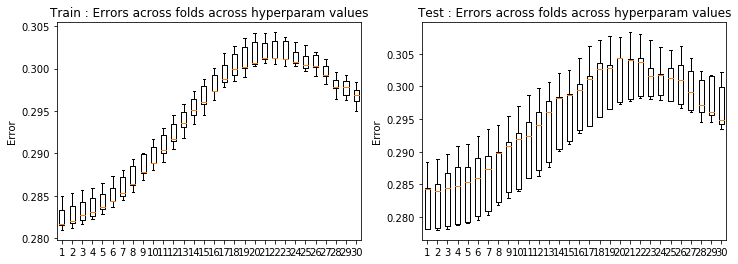

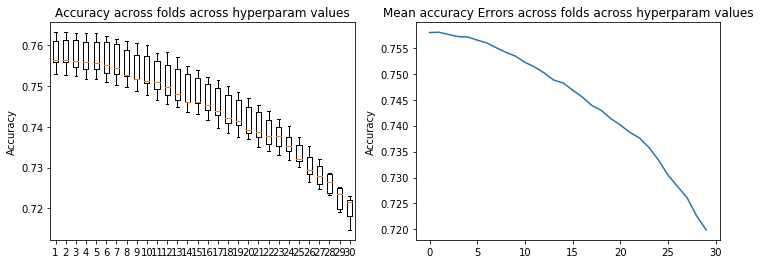

In [223]:
result_crossval(loss_tr15,loss_te15)
result_crossval_accuracy(acc15)

In [224]:
# test 16: degree 1, classification, remove correlated features, not removal of outliers, median undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr16, loss_te16, w16, acc16 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'classification', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.65206763e-02 -2.07279063e-01 -2.52456832e-01
  2.52767711e-01  5.75965547e-02  6.49065096e-02 -1.83103647e-01
  1.30930083e-01  1.65257016e-01  3.51041268e-03 -3.95699659e-03
  2.37795348e-01 -6.00053257e-03 -1.89362993e-04  6.16801613e-02
  2.17949549e-03 -5.24250592e-02 -8.70349313e-04 -5.35270297e-03]
Ridge regression: w=[-0.28512101  0.0262587  -0.20774915 -0.24941209  0.24941962  0.05585407
  0.05086393 -0.16968021  0.13375498  0.17355212  0.00489677 -0.00597897
  0.23186203 -0.00747645  0.00202765  0.06585676  0.00425505 -0.04808925
 -0.00066399 -0.00120428]
Ridge regression: w=[-0.28705164  0.03083804 -0.20791779 -0.25511551  0.25409967  0.05673799
  0.05877742 -0.17571685  0.13112988  0.17159289  0.00896946 -0.00325325
  0.23351181 -0.01044521  0.00127943  0.0717692

Ridge regression: w=[-0.28212588  0.02842233 -0.20464694 -0.24091726  0.24587298  0.05960143
  0.06333538 -0.16584997  0.13386109  0.16740677  0.00258504 -0.00169028
  0.21234072 -0.00618411  0.00192692  0.06161909  0.00619131 -0.04363582
 -0.00120368 -0.00180602]
Accuracy = [0.7086664947124065, 0.7155016765540366, 0.7076347691514058, 0.7155016765540366, 0.7129223626515347]
Ridge regression: w=[-2.83165437e-01  2.72507421e-02 -2.04370393e-01 -2.40358792e-01
  2.43628863e-01  5.69908791e-02  6.85069019e-02 -1.73680781e-01
  1.30916872e-01  1.62587475e-01  3.45843842e-03 -4.00740450e-03
  2.21109240e-01 -6.00760639e-03 -1.71760753e-04  5.86743992e-02
  2.20550141e-03 -5.06117883e-02 -8.63387167e-04 -5.28188239e-03]
Ridge regression: w=[-0.28332531  0.02695933 -0.20455958 -0.23751869  0.24057768  0.05528326
  0.05554097 -0.16095623  0.13361171  0.17016973  0.00475964 -0.0060385
  0.21522459 -0.00740622  0.0020162   0.06246347  0.00424141 -0.04643742
 -0.0006561  -0.00116984]
Ridge regress

Ridge regression: w=[-0.27805138  0.02896383 -0.19666444 -0.20761658  0.21766393  0.05346976
  0.064459   -0.14088921  0.13305481  0.16121193  0.00439097 -0.00616581
  0.17623347 -0.00720261  0.00199844  0.05471434  0.00420749 -0.04129665
 -0.00063405 -0.00107334]
Ridge regression: w=[-0.27993414  0.03331724 -0.19698085 -0.21259003  0.22154335  0.05425632
  0.0709444  -0.14552173  0.13081607  0.160412    0.00850657 -0.0034205
  0.17743413 -0.01018326  0.00113613  0.06059044  0.00481815 -0.04440473
 -0.00172073 -0.00086143]
Ridge regression: w=[-0.27607449  0.03122966 -0.1987354  -0.21546042  0.22396754  0.05204085
  0.06739385 -0.14728164  0.1277499   0.1633311   0.00064709 -0.00328887
  0.18459811 -0.0084903  -0.00033359  0.05555208  0.00314497 -0.04008251
 -0.00040887 -0.00154924]
Ridge regression: w=[-0.27638828  0.03065263 -0.19655488 -0.20825789  0.22024659  0.05748866
  0.07163199 -0.14306211  0.13330094  0.15870361  0.00235991 -0.00190805
  0.17007037 -0.0061384   0.00180644  0.

Ridge regression: w=[-2.56144384e-01  3.61014624e-02 -1.75484946e-01 -1.31615198e-01
  1.55125733e-01  4.72342854e-02  7.88485792e-02 -1.07376552e-01
  1.27344225e-01  1.30458665e-01  2.68784673e-03 -4.23594365e-03
  9.49777574e-02 -5.75212623e-03  1.65344277e-04  3.60206862e-02
  2.46423796e-03 -2.43653815e-02 -7.58516436e-04 -4.47332718e-03]
Ridge regression: w=[-0.256289    0.03576583 -0.17417648 -0.13045307  0.15397946  0.04588921
  0.07250829 -0.10036306  0.12892391  0.13317894  0.0032201  -0.00628804
  0.09091902 -0.00644217  0.00200286  0.03765373  0.00409154 -0.02154847
 -0.00056131 -0.00075604]
Ridge regression: w=[-0.2580244   0.03940596 -0.17463632 -0.1339085   0.15643989  0.04643387
  0.07705351 -0.1032617   0.12743891  0.13344916  0.00715455 -0.00358724
  0.09150262 -0.00920503  0.00096561  0.04292319  0.00462975 -0.02378047
 -0.00172349 -0.00081502]
Ridge regression: w=[-2.54466835e-01  3.77394308e-02 -1.75746273e-01 -1.35164310e-01
  1.57567712e-01  4.44417796e-02  7.491

Ridge regression: w=[-0.208806    0.04640097 -0.14020773 -0.0599077   0.0859786   0.03278805
  0.06558239 -0.07428135  0.11331688  0.09674448  0.00463711 -0.00335173
  0.02582041 -0.00705956  0.00089985  0.02526635  0.0041045   0.00477274
 -0.00144049 -0.00065616]
Ridge regression: w=[-2.05927043e-01  4.53623909e-02 -1.40552281e-01 -6.00442931e-02
  8.62164523e-02  3.11743108e-02  6.47223275e-02 -7.48162480e-02
  1.10842099e-01  9.80475625e-02 -1.19586597e-03 -3.31291240e-03
  2.83091746e-02 -6.43295517e-03  1.88729833e-04  2.13939632e-02
  3.22098636e-03  6.67762985e-03 -6.05929187e-04 -5.63320804e-04]
Ridge regression: w=[-0.2061611   0.04523153 -0.14121621 -0.05933146  0.08557138  0.03534367
  0.06499621 -0.07413813  0.11442898  0.09666756  0.00061321 -0.00250092
  0.02343736 -0.00489604  0.00142307  0.02204846  0.00514165  0.0079411
 -0.00137141 -0.00130126]
Accuracy = [0.7104720144441579, 0.7137606396698478, 0.7076347691514058, 0.7155661594015992, 0.7055068351818417]
Ridge regress

Ridge regression: w=[-1.10838428e-01  4.02151540e-02 -8.40426704e-02 -1.42138396e-02
  2.79233601e-02  1.51628142e-02  4.01728985e-02 -4.81552300e-02
  7.28608002e-02  5.52542979e-02  7.62061235e-05 -2.31397957e-03
 -4.85064480e-03 -2.85814232e-03  8.65451001e-04  6.79714333e-03
  2.07427757e-03  2.07890852e-02 -2.87497230e-04 -1.91345863e-03]
Ridge regression: w=[-1.10901006e-01  3.99684329e-02 -8.31058007e-02 -1.44147798e-02
  2.76310573e-02  1.48780835e-02  3.88770833e-02 -4.67472374e-02
  7.29121108e-02  5.48005030e-02 -3.16950483e-05 -3.54612255e-03
 -5.45448384e-03 -2.91763815e-03  1.37295622e-03  7.19380769e-03
  2.47324295e-03  2.11020565e-02 -4.09778762e-04 -8.31873718e-05]
Ridge regression: w=[-0.11165194  0.04105828 -0.08357825 -0.01488897  0.027758    0.01509715
  0.04038539 -0.04758849  0.07293791  0.05536878  0.00139213 -0.00215049
 -0.00551485 -0.00367427  0.00077651  0.00912038  0.00258603  0.0213266
 -0.00077365 -0.00041958]
Ridge regression: w=[-0.11011252  0.0406378 

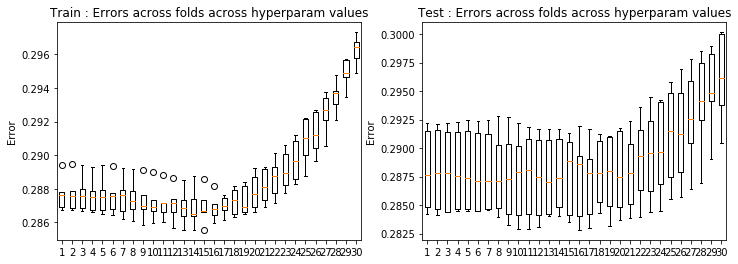

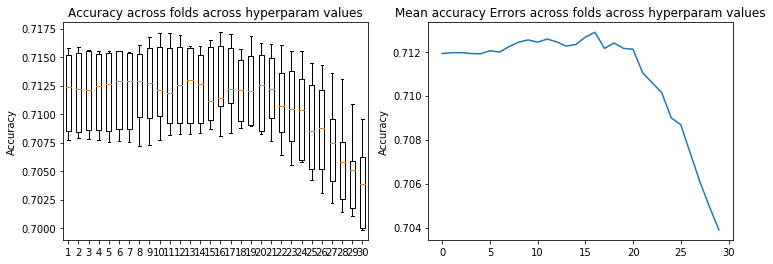

In [225]:
result_crossval(loss_tr16,loss_te16)
result_crossval_accuracy(acc16)

In [226]:
# test 17: degree 2, classification, remove correlated features, not removal of outliers, median undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr17, loss_te17, w17, acc17 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'classification', method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  6.80509068e-02 -2.84072203e-01 -1.99908180e-01
  6.42706677e-01  3.53941411e-02  2.18249707e-01 -1.62139131e-01
  9.80687450e-02  2.50810836e-01  2.36544386e-03 -3.11342885e-03
  1.93586534e-01 -1.26234797e-03 -2.44790546e-03  6.29778126e-02
  3.59445857e-03  5.06377589e-02 -2.26234923e-03 -3.92923082e-03
  4.19034762e-02  1.35308707e-01  3.56164435e-02 -4.37961970e-01
  1.19792280e-03  1.03283259e-02  8.40857377e-02  2.36836488e-02
 -1.74677705e-01 -3.69912540e-02 -6.71242770e-04 -1.65630347e-01
 -7.00514105e-02  6.84871567e-03 -4.59701267e-02 -3.73035319e-04
 -1.06847189e-01  1.60936073e-01  2.38908640e-03]
Ridge regression: w=[-2.85121014e-01  6.43472315e-02 -2.79296732e-01 -1.91851052e-01
  6.54660953e-01  3.18619972e-02  2.16247329e-01 -1.33112815e-01
  1.01203843e-01  2

Ridge regression: w=[-2.82749445e-01  4.93653548e-02 -2.79721543e-01 -1.81241278e-01
  6.10504183e-01  4.07152772e-02  2.16910337e-01 -1.30270263e-01
  9.74040469e-02  2.56935173e-01  2.09039610e-04 -1.92423390e-03
  1.69335073e-01 -3.92796801e-03 -1.11680407e-03  6.40584527e-02
  3.95602119e-03  4.94281772e-02 -1.33307960e-03 -7.29599272e-04
  2.15779219e-02  1.32008042e-01  1.88314210e-02 -4.09706912e-01
 -7.70671458e-03 -4.26318740e-03  5.77052391e-02  2.53277247e-02
 -1.65651805e-01 -4.22327305e-02  1.32559206e-03 -1.39848534e-01
 -6.66760576e-02  5.01405184e-04 -4.20971211e-02 -7.68046716e-04
 -9.95522951e-02  1.58477122e-01  2.94837266e-03]
Ridge regression: w=[-2.83070824e-01  4.63868131e-02 -2.71942582e-01 -1.70644040e-01
  6.17272903e-01  3.97989462e-02  2.16478077e-01 -1.51193025e-01
  1.01703379e-01  2.61120042e-01  1.42563162e-03 -1.24335978e-03
  1.85552278e-01 -2.17843290e-03  8.49680476e-04  6.57987833e-02
  6.66685903e-03  5.50736952e-02 -1.25247761e-03 -1.07944675e-03


Ridge regression: w=[-2.83663349e-01  4.02908413e-02 -2.78535206e-01 -1.55263477e-01
  5.29181624e-01  3.40299043e-02  2.14072890e-01 -1.42693365e-01
  1.02034593e-01  2.42093861e-01  2.74795776e-03 -3.26072182e-03
  1.59141979e-01 -1.67854896e-03 -2.28919007e-03  6.39621414e-02
  3.44696316e-03  4.72377540e-02 -2.36674058e-03 -3.76913407e-03
  1.08919404e-02  1.24525177e-01  1.64620134e-03 -3.39964571e-01
  3.08411094e-03 -1.26744069e-02  6.74235508e-02  2.77264777e-02
 -1.55547798e-01 -3.84984785e-02 -8.07260145e-04 -1.25048385e-01
 -7.16184988e-02  6.58526523e-03 -3.92869468e-02 -4.38304562e-04
 -1.02253655e-01  1.60990529e-01  2.34333637e-03]
Ridge regression: w=[-2.83823502e-01  3.94722625e-02 -2.74092313e-01 -1.49055033e-01
  5.40018492e-01  3.04360720e-02  2.09119344e-01 -1.21375601e-01
  1.04939816e-01  2.55876452e-01  5.49355577e-03 -5.23853610e-03
  1.48594140e-01 -4.76487022e-03  2.42089122e-05  6.49071425e-02
  4.69047638e-03  4.28408392e-02 -1.25789349e-03 -7.85648335e-04


Ridge regression: w=[-2.81004756e-01  2.31275505e-02 -2.64926708e-01 -1.12701168e-01
  4.68350573e-01  3.76103001e-02  2.09586827e-01 -1.26730095e-01
  1.06437225e-01  2.46355110e-01  1.93409950e-03 -1.48054080e-03
  1.38324802e-01 -2.79952775e-03  9.56555064e-04  6.54558063e-02
  6.53959844e-03  4.99793969e-02 -1.37912832e-03 -1.04732090e-03
 -7.92649221e-03  1.07634674e-01 -2.78273079e-02 -2.93792627e-01
  1.83012094e-03 -2.39649483e-02  6.64891392e-02  3.31147539e-02
 -1.55351910e-01 -4.32763132e-02 -1.81094154e-03 -1.18906512e-01
 -6.99746192e-02 -3.19658829e-04 -3.31350668e-02 -2.41906556e-03
 -9.68931356e-02  1.58382400e-01 -1.65815044e-03]
Accuracy = [0.7449058550425587, 0.7539334537013155, 0.7450993035852463, 0.7542558679391282, 0.7478075831828733]
Ridge regression: w=[-0.28174155  0.02589464 -0.27086392 -0.11451247  0.42450703  0.03244853
  0.20462988 -0.12762036  0.10569432  0.23053401  0.00308999 -0.00336576
  0.12995955 -0.00208422 -0.00209804  0.0638445   0.00332156  0.045

Ridge regression: w=[-2.77648204e-01  1.84232314e-02 -2.59688555e-01 -8.54675831e-02
  3.54524477e-01  3.56512309e-02  1.91298586e-01 -1.07814533e-01
  1.06294391e-01  2.21862584e-01  9.04871486e-04 -2.37044960e-03
  1.07581026e-01 -5.06805614e-03 -8.13942279e-04  6.20783323e-02
  3.84975179e-03  4.68063360e-02 -1.44115582e-03 -3.79194490e-04
 -1.78136488e-02  1.01187430e-01 -5.49102273e-02 -1.93512216e-01
 -1.51058415e-03 -4.03102740e-02  3.35111522e-02  3.48915103e-02
 -1.16075916e-01 -4.57384675e-02  9.33316219e-04 -5.92999893e-02
 -7.03501169e-02  1.70388105e-04 -2.41455901e-02 -1.05451403e-03
 -9.27320691e-02  1.57352726e-01  2.83714430e-03]
Ridge regression: w=[-2.77963785e-01  1.62517293e-02 -2.54626351e-01 -6.98269334e-02
  3.53168627e-01  3.53193780e-02  1.95408520e-01 -1.13018037e-01
  1.10274054e-01  2.28358879e-01  2.28539106e-03 -1.63129102e-03
  1.06464214e-01 -3.30275231e-03  1.06558895e-03  6.36759928e-02
  6.44653282e-03  4.79272977e-02 -1.45716533e-03 -1.00673927e-03


Ridge regression: w=[-0.27543912  0.01999359 -0.23633888 -0.04906995  0.24656809  0.03026318
  0.17045347 -0.10326283  0.11191116  0.20371884  0.0089043  -0.00233166
  0.07804032 -0.00812295  0.00029668  0.06427631  0.00459528  0.04383344
 -0.0022392  -0.00028685 -0.02091364  0.07459015 -0.07615015 -0.10710311
  0.00643457 -0.042954    0.02631949  0.03959585 -0.10012272 -0.04680199
  0.00272088 -0.02648017 -0.07304777  0.00310605 -0.01609183 -0.00126024
 -0.08862045  0.15607761  0.00230829]
Ridge regression: w=[-2.71641453e-01  1.72880341e-02 -2.39515837e-01 -4.63925521e-02
  2.48612951e-01  3.22661712e-02  1.66294500e-01 -1.00558891e-01
  1.10404192e-01  1.98051244e-01  1.04069588e-03 -2.51194202e-03
  8.22435095e-02 -5.49293898e-03 -6.33982191e-04  5.78997558e-02
  3.82368663e-03  4.38634527e-02 -1.45469551e-03 -1.97126046e-04
 -2.39193821e-02  7.91335014e-02 -8.09475256e-02 -1.09946893e-01
  2.20552320e-03 -4.36448056e-02  2.41175282e-02  3.95932233e-02
 -9.03306160e-02 -4.72202647e

Ridge regression: w=[-2.62004221e-01  2.04658999e-02 -2.07326342e-01 -1.60553421e-02
  1.65344553e-01  2.27032124e-02  1.32338708e-01 -9.14974719e-02
  1.17167715e-01  1.70286563e-01  5.34350840e-03 -5.41641418e-03
  5.61839338e-02 -5.45634367e-03  8.99647996e-04  5.04795018e-02
  4.61717533e-03  3.75786269e-02 -1.27028743e-03 -2.24008631e-04
 -2.37031440e-02  4.89123224e-02 -8.71292064e-02 -5.44945641e-02
  1.36441150e-02 -3.92702192e-02  1.98853568e-02  4.34414027e-02
 -6.85762839e-02 -4.90631268e-02 -2.19968934e-03 -6.14393953e-03
 -7.44676687e-02  4.78247141e-03 -5.44699960e-03 -3.19584169e-03
 -6.73629721e-02  1.50864553e-01  1.17935274e-04]
Ridge regression: w=[-2.63778316e-01  2.22798716e-02 -2.06911211e-01 -2.04489911e-02
  1.65030582e-01  2.66330350e-02  1.38736169e-01 -9.51084715e-02
  1.14705095e-01  1.69511806e-01  8.32277689e-03 -2.33862009e-03
  5.66704824e-02 -7.92901121e-03  4.15824332e-04  5.62230535e-02
  4.57124012e-03  3.80231456e-02 -2.19918610e-03 -1.87224932e-04


Ridge regression: w=[-2.47894245e-01  2.28192052e-02 -1.82635295e-01 -2.91049783e-03
  1.25329581e-01  2.61076544e-02  1.17782433e-01 -8.55306947e-02
  1.16108050e-01  1.48450992e-01  2.27097299e-03 -1.74001775e-03
  4.15946296e-02 -4.18889101e-03  1.34312521e-03  4.45367647e-02
  6.09640199e-03  3.53592573e-02 -1.46543147e-03 -7.96019725e-04
 -2.73132299e-02  2.86896356e-02 -9.05421431e-02 -2.71890179e-02
  1.27146164e-02 -2.91313141e-02  1.32633695e-02  4.86611259e-02
 -5.32092416e-02 -4.72730764e-02 -1.26738268e-03 -2.20915714e-03
 -7.09537213e-02 -4.56873376e-05 -3.32190348e-04 -1.87146755e-03
 -5.49469298e-02  1.42332735e-01 -7.24105430e-04]
Accuracy = [0.7381351560484911, 0.745292752127934, 0.7356203249935517, 0.7466468919267475, 0.7398117100851174]
Ridge regression: w=[-0.24100769  0.02395948 -0.17107407 -0.00539068  0.10789416  0.02155743
  0.10680881 -0.08189653  0.11374261  0.13418625  0.00318927 -0.00309062
  0.03968306 -0.00332641 -0.00057114  0.04006976  0.00306505  0.0290

Ridge regression: w=[-2.18625444e-01  2.71376870e-02 -1.45257582e-01 -3.54523313e-03
  8.27737146e-02  2.03903354e-02  8.37235573e-02 -7.24158785e-02
  1.06604397e-01  1.11724540e-01  6.24274036e-05 -2.57461544e-03
  2.72284235e-02 -5.37024615e-03 -1.14076795e-04  3.03032938e-02
  3.57330802e-03  2.61557536e-02 -1.19339646e-03  1.56910485e-04
 -3.03733149e-02  6.60725747e-03 -7.27624254e-02 -4.83244644e-03
  1.06876253e-02 -9.59148634e-03 -2.78309375e-03  4.78587269e-02
 -2.22763433e-02 -4.65202416e-02 -4.44960049e-05  1.02659808e-02
 -6.56657184e-02 -7.72288329e-04  6.27989593e-03 -8.57118020e-04
 -3.17940809e-02  1.27108497e-01  1.91638794e-03]
Ridge regression: w=[-2.18873938e-01  2.72154632e-02 -1.44562532e-01 -1.09534702e-04
  8.19742445e-02  2.19202029e-02  8.62341390e-02 -7.20095998e-02
  1.09775845e-01  1.12569817e-01  1.65366713e-03 -1.71555214e-03
  2.38447374e-02 -4.04897269e-03  1.33283043e-03  3.21526944e-02
  5.61939178e-03  2.82956180e-02 -1.33819857e-03 -7.60232354e-04


Ridge regression: w=[-0.17758621  0.02947208 -0.10909742 -0.00174717  0.05167888  0.01554203
  0.06151777 -0.05750492  0.09437979  0.08002934  0.00171512 -0.00256366
  0.01284704 -0.00299199  0.00027947  0.01988961  0.00266014  0.02097312
 -0.00106014 -0.00188816 -0.03053132 -0.01534865 -0.0509441   0.00371976
  0.01454021  0.00413486 -0.01283346  0.04568353 -0.00590649 -0.03840159
 -0.00175946  0.00636249 -0.05833546  0.00235613  0.0062293  -0.00036364
 -0.01418195  0.104819    0.00057219]
Ridge regression: w=[-1.77686474e-01  2.94194463e-02 -1.08350325e-01 -1.62440944e-03
  5.18663560e-02  1.47150690e-02  5.87013078e-02 -5.61231612e-02
  9.49982610e-02  7.99174705e-02  2.05101087e-03 -4.31443875e-03
  1.11424626e-02 -3.80554754e-03  1.38193791e-03  1.93720824e-02
  3.66972741e-03  2.17521308e-02 -7.17272473e-04  9.27202610e-05
 -3.02444728e-02 -1.39390883e-02 -5.03232629e-02  2.62735839e-03
  1.41217876e-02  2.34600229e-03 -9.42599963e-03  4.50069201e-02
 -5.39307205e-03 -4.19151328e

Ridge regression: w=[-1.27353137e-01  2.94868338e-02 -7.94981083e-02 -2.15658514e-03
  3.11133208e-02  1.19177441e-02  4.24761641e-02 -4.38926151e-02
  7.39361408e-02  5.58259067e-02  7.65555653e-04 -2.08247430e-03
  2.47562704e-03 -2.48813736e-03  5.71127332e-04  1.10883831e-02
  2.18225181e-03  1.87816391e-02 -6.03998338e-04 -1.54550580e-03
 -2.98707838e-02 -2.39667518e-02 -3.25974424e-02  4.78817016e-03
  1.13643018e-02  1.11760294e-02 -1.62495558e-02  3.82124719e-02
  5.84466551e-03 -3.09614452e-02 -1.40422341e-03  1.25577800e-03
 -4.48386066e-02  1.49915794e-03  6.50770884e-03 -2.48553794e-04
  5.98283582e-05  7.56666253e-02  3.39240439e-04]
Ridge regression: w=[-1.27425039e-01  2.94090674e-02 -7.88699976e-02 -2.27925598e-03
  3.11457555e-02  1.14258055e-02  4.07402073e-02 -4.27773475e-02
  7.42124322e-02  5.54851698e-02  8.14885147e-04 -3.44842376e-03
  1.47096288e-03 -2.90054507e-03  1.26242360e-03  1.09296152e-02
  2.81621430e-03  1.91517279e-02 -5.16972787e-04  5.29960272e-05


Ridge regression: w=[-9.46608202e-02  2.77401425e-02 -6.31711530e-02 -2.63372455e-03
  2.10619711e-02  1.04455804e-02  3.23527847e-02 -3.57099136e-02
  5.97360253e-02  4.36529262e-02 -2.03224265e-04 -1.23185737e-03
 -3.03676898e-03 -2.35787054e-03  8.64199171e-04  7.60641301e-03
  2.80655001e-03  1.83683041e-02 -7.21936819e-04 -6.27087724e-04
 -2.78821835e-02 -2.42028056e-02 -2.41207126e-02  3.21836214e-03
  8.52192571e-03  1.19809686e-02 -1.43293654e-02  3.18951993e-02
  1.02520040e-02 -2.63112359e-02 -3.27200370e-04 -2.58834238e-03
 -3.45217446e-02  4.24870116e-05  6.66880487e-03 -5.95173098e-04
  6.31757376e-03  5.56206827e-02  6.21046244e-05]
Accuracy = [0.7278179004384834, 0.7310420428166108, 0.7276244518957957, 0.7291075573897343, 0.7244647923652309]


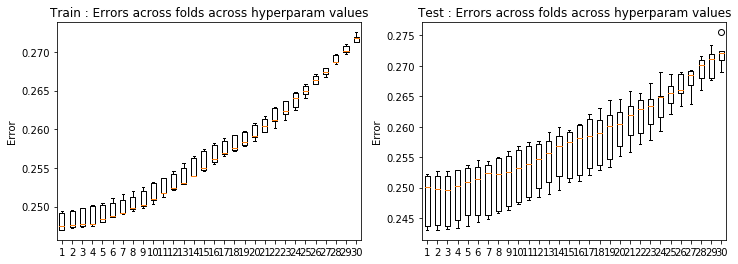

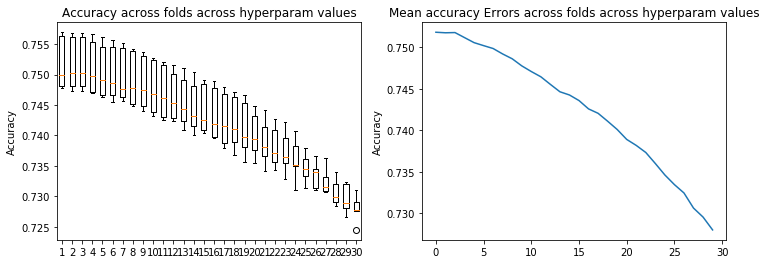

In [227]:
result_crossval(loss_tr17,loss_te17)
result_crossval_accuracy(acc17)

In [228]:
# test 18: degree 3, classification, remove correlated features, not removal of outliers, median undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr18, loss_te18, w18, acc18 = cross_validation_demo(ss_y, ss_tX_nocorrfeat, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 77544
Proportion of Bosons in all train set : 35.73455070669555 %
Proportion of Bosons in test fold 1: 35.78153211245809 %
Ridge regression: w=[-2.84960129e-01  2.90394531e-01 -2.98106100e-01 -6.93973453e-02
  5.57955240e-01  4.29053002e-02  3.46719210e-01 -1.31170170e-01
  1.80613353e-02  4.49271080e-01 -6.01865054e-03  8.17621528e-03
  2.41145916e-01  4.29968135e-03  1.58319038e-02  1.05904927e-01
  2.48144187e-03  8.41575954e-02  8.91799557e-04  9.50045575e-03
 -1.14578429e-01  1.37283213e-01 -2.56964914e-01 -3.96826146e-01
 -1.75869971e-02 -2.32379670e-01  1.64543723e-01  2.36871292e-02
 -4.98435841e-01 -3.53831017e-02 -5.34758033e-05 -3.76960420e-01
 -6.96011150e-02  7.11595261e-03 -1.25873305e-01  1.43570355e-04
 -1.80795786e-01  1.59491437e-01  2.72346489e-03 -3.75450396e-01
  6.37534894e-03  2.00178325e-01  3.59255194e-02  1.56511199e-02
  1.33355996e-01 -8.23343853e-02  7.53106283e-02  1.84811054e-01
  8.61554693e-03 -9.4267

Ridge regression: w=[-2.83263560e-01  2.49992412e-01 -2.88094905e-01  8.75461536e-03
  5.06231450e-01  4.40386420e-02  3.56227870e-01 -1.28199399e-01
  1.20863048e-02  4.29241316e-01 -1.06232735e-02  9.58616857e-03
  2.01223849e-01  4.59587311e-03  1.99645776e-02  1.01368447e-01
  5.40206498e-03  8.75350297e-02 -5.47837154e-03  4.21118381e-03
 -9.87853226e-02  1.27621813e-01 -3.77981582e-01 -3.16616423e-01
 -1.21825823e-02 -2.53260882e-01  1.79194845e-01  2.72032496e-02
 -4.56867791e-01 -3.94158459e-02 -1.85835274e-03 -3.34774284e-01
 -6.66995749e-02 -3.59502076e-05 -1.07984676e-01 -1.73588967e-03
 -1.76775191e-01  1.57286452e-01 -1.36605661e-03 -3.18638699e-01
  4.14392756e-03  2.57509327e-01 -6.35503616e-03  9.29246803e-03
  1.34111206e-01 -9.91621921e-02  8.41098519e-02  1.60180303e-01
  1.18144072e-02 -8.94125136e-03  1.41593270e-01 -5.96681831e-03
 -1.83927524e-02  4.60545685e-02  2.48903273e-03  4.80178831e-02
  4.83791648e-03 -2.12478123e-03]
Accuracy = [0.755996904823317, 0.761

Ridge regression: w=[-2.82505526e-01  1.69420875e-01 -2.92124050e-01 -3.01278119e-02
  4.56760436e-01  4.68883103e-02  3.44447758e-01 -1.27453547e-01
  2.20089493e-02  3.93733426e-01 -2.72985076e-03  4.30374667e-03
  1.92736633e-01 -2.88869499e-03  1.35544780e-02  1.03126917e-01
  7.13640569e-04  9.56443301e-02 -8.04640781e-03  8.08044641e-03
 -8.15616072e-02  1.32394696e-01 -2.72360247e-01 -2.14143654e-01
 -2.26895457e-02 -2.51542306e-01  1.51860799e-01  2.63944629e-02
 -4.04153690e-01 -4.06460070e-02  1.78369429e-03 -2.86524831e-01
 -6.65328221e-02  8.18113688e-04 -1.07937183e-01 -3.79186533e-04
 -1.99626847e-01  1.57182297e-01  3.02524396e-03 -2.19961340e-01
  9.61717700e-03  1.91737094e-01 -6.16790490e-02  1.25511584e-02
  1.38086805e-01 -8.25534173e-02  7.28437682e-02  1.36674256e-01
  3.10009996e-03 -4.24853429e-03  1.13315718e-01 -1.11709257e-03
 -1.39483205e-02  4.26621687e-02  5.04488815e-03  6.25477408e-02
  7.63055521e-03 -7.17886368e-03]
Ridge regression: w=[-2.82826628e-01

Ridge regression: w=[-0.28574534  0.13331729 -0.27160819 -0.01848144  0.40618343  0.04241112
  0.30793346 -0.11852791  0.03807815  0.38955068  0.00090455 -0.00382647
  0.15610165 -0.00099725  0.00903867  0.10522988 -0.00238856  0.08150086
 -0.00475291 -0.00221571 -0.04255951  0.10052195 -0.27007942 -0.13094609
 -0.01363589 -0.181677    0.12607738  0.02699194 -0.40496939 -0.04039398
  0.00331709 -0.22748035 -0.06858313  0.00398096 -0.1044719  -0.00051849
 -0.16358007  0.158684    0.00295643 -0.14591661  0.02106285  0.18359185
 -0.10226029  0.00965091  0.10266711 -0.06550813  0.06058546  0.1322367
  0.0077902   0.0026838   0.08469899 -0.00635863 -0.01052268  0.04205377
  0.00793174  0.02964278  0.00327432  0.00162723]
Ridge regression: w=[-0.28180557  0.12060046 -0.28189128 -0.01548435  0.40484205  0.04504674
  0.31349664 -0.11981175  0.03274384  0.35971029 -0.00266303  0.00364525
  0.16241648 -0.00296228  0.01289932  0.0994234   0.00057211  0.08611556
 -0.00790445  0.00756007 -0.0571265

Ridge regression: w=[-0.28460984  0.09435726 -0.25966659 -0.01048608  0.3640617   0.04019548
  0.27648195 -0.11642264  0.04905978  0.33367033  0.00092675 -0.00394089
  0.13172463 -0.00121648  0.00871452  0.09898466 -0.00225091  0.07316468
 -0.00467403 -0.00198432 -0.03170204  0.08131323 -0.25484845 -0.07228029
 -0.00945932 -0.14337818  0.10155828  0.02863764 -0.31459566 -0.04108073
  0.00322814 -0.16730981 -0.0690872   0.00384053 -0.08865774 -0.00061106
 -0.14430084  0.15848156  0.00281915 -0.09531102  0.028799    0.1661322
 -0.12899316  0.0077621   0.08117848 -0.04804162  0.05250538  0.08705665
  0.00786384  0.00276045  0.05211089 -0.0061993  -0.01009437  0.03322191
  0.0077876   0.01819432  0.00311573  0.00144907]
Ridge regression: w=[-0.28068572  0.08487501 -0.26883819 -0.00789942  0.36328199  0.0426702
  0.27760646 -0.11488174  0.04417586  0.31893529 -0.00255336  0.00275548
  0.13619351 -0.00305629  0.01196857  0.0931679   0.00041516  0.07490894
 -0.00771711  0.00681752 -0.0420117 

Ridge regression: w=[-0.28280022  0.06609748 -0.24582396 -0.00882909  0.32710001  0.03758986
  0.24120435 -0.1116802   0.05949939  0.28306855  0.00101428 -0.00405192
  0.11021574 -0.00154716  0.0082472   0.09082773 -0.00195699  0.06251561
 -0.00456592 -0.00170407 -0.02644686  0.05981965 -0.22887416 -0.03346385
 -0.00480841 -0.10256912  0.07669821  0.030656   -0.23089392 -0.04197839
  0.00312573 -0.11438502 -0.06967309  0.00367461 -0.06963862 -0.00071453
 -0.12003916  0.15797923  0.00266982 -0.06050134  0.03727353  0.14249617
 -0.14113879  0.00569383  0.05829594 -0.0318289   0.04519845  0.04588899
  0.00789877  0.00281975  0.02500745 -0.00597359 -0.00950775  0.02289716
  0.00747597  0.00439266  0.00292679  0.00123664]
Ridge regression: w=[-2.78901058e-01  5.95128171e-02 -2.53640476e-01 -5.85986573e-03
  3.26607139e-01  3.98326767e-02  2.39972105e-01 -1.10146031e-01
  5.51396101e-02  2.76180519e-01 -2.39960145e-03  1.65991855e-03
  1.13984547e-01 -3.20406303e-03  1.07279927e-02  8.484083

Ridge regression: w=[-2.78051384e-01  4.52513240e-02 -2.35590093e-01 -2.97822192e-03
  2.90873661e-01  2.61543874e-02  1.98738507e-01 -1.04516081e-01
  6.92318499e-02  2.41599026e-01 -1.41620936e-03 -5.72210807e-03
  9.01975449e-02 -1.46751001e-03  8.11644209e-03  7.35377749e-02
  3.96833392e-03  5.12736343e-02 -1.96474167e-03  2.56055459e-03
 -2.45681087e-02  4.52752397e-02 -1.90542742e-01 -1.23076748e-02
  1.17710326e-02 -7.52820132e-02  6.46819375e-02  3.33561901e-02
 -1.70232073e-01 -4.44257613e-02 -2.00012998e-03 -6.85706217e-02
 -7.18609582e-02  5.02427986e-03 -3.90307687e-02 -3.15996553e-03
 -9.22901804e-02  1.57576539e-01 -1.26569644e-04 -3.78646877e-02
  4.05003881e-02  1.10844186e-01 -1.47091571e-01 -1.70666032e-03
  3.50523037e-02 -2.05953046e-02  4.17269599e-02  2.58281821e-02
  7.50924858e-03  1.63723270e-03  1.90548412e-04 -3.59470746e-03
 -8.28738573e-03  6.74255120e-03  1.48697312e-03 -5.84782874e-04
  6.06980600e-04 -2.44910668e-03]
Ridge regression: w=[-2.79934138e-01

Ridge regression: w=[-2.73432225e-01  3.44385431e-02 -2.17240630e-01 -7.42342478e-03
  2.46672245e-01  2.98228463e-02  1.73814740e-01 -1.00320381e-01
  7.49028607e-02  2.00184124e-01 -3.36638686e-03  8.92092571e-04
  8.22629883e-02  1.96386915e-03  7.59137550e-03  6.64295691e-02
  2.05543714e-04  3.98464313e-02  1.36807635e-04  2.69394350e-03
 -2.30529514e-02  1.36580749e-02 -1.62935116e-01  6.51309654e-03
  6.44433838e-03 -3.75577291e-02  2.85373735e-02  3.65009522e-02
 -1.13467385e-01 -4.01084421e-02 -1.08649212e-03 -4.09370302e-02
 -7.26800234e-02  5.65713602e-03 -2.90253308e-02 -2.71225999e-04
 -7.06101875e-02  1.56465529e-01  2.03242763e-03 -2.13972817e-02
  5.58456255e-02  8.18428425e-02 -1.27709914e-01  3.31192547e-03
  1.86139865e-02  4.41235826e-03  3.62748800e-02  3.18294842e-03
  7.35642476e-03 -3.42544296e-03 -1.10506465e-02 -4.86467547e-03
 -9.48077413e-03  8.36079252e-04  4.41395730e-03 -1.93215785e-02
 -3.12876010e-03 -5.48646583e-03]
Ridge regression: w=[-2.73586601e-01

Ridge regression: w=[-2.68886036e-01  2.91970623e-02 -2.07737079e-01 -1.31647932e-03
  2.31168733e-01  3.12564867e-02  1.60103367e-01 -9.50157343e-02
  7.43493367e-02  1.89401365e-01 -6.24909725e-03  1.47949253e-03
  6.70578370e-02  6.13043009e-04  9.94204904e-03  6.14071121e-02
  3.23220438e-03  4.14921647e-02 -4.32199254e-03 -9.22600309e-04
 -2.55356049e-02  1.06884450e-02 -1.48339998e-01  9.22235107e-03
  1.02691828e-02 -2.82681517e-02  2.98090013e-02  4.08707881e-02
 -9.40422259e-02 -4.45276295e-02 -1.53050588e-03 -2.76255879e-02
 -7.03793413e-02 -1.69753365e-04 -1.63518715e-02 -1.92412600e-03
 -5.88072945e-02  1.52667053e-01 -1.16962524e-03 -1.67986619e-02
  4.93420900e-02  6.44591200e-02 -1.24757639e-01 -1.37650858e-03
  1.36624220e-02  4.37943679e-03  4.06551877e-02 -7.72895882e-03
  9.42039464e-03 -2.63577585e-03 -2.12072925e-02 -4.10604436e-03
 -9.93120328e-03 -3.57127340e-03  3.87226227e-03 -2.60975643e-02
  3.29263988e-03  1.10147060e-03]
Accuracy = [0.7458086149084343, 0.75

Ridge regression: w=[-2.60141422e-01  2.33656991e-02 -1.93695150e-01 -5.95786826e-03
  1.87237488e-01  2.87906745e-02  1.30978046e-01 -8.36458775e-02
  7.44415034e-02  1.59334794e-01 -1.52316197e-03 -1.92875659e-03
  5.67654783e-02 -3.97352303e-03  5.01695203e-03  5.18880374e-02
  8.24564237e-04  3.38740390e-02 -5.45143068e-03  2.38471195e-03
 -2.40846910e-02  1.82136406e-04 -1.18911093e-01  1.62578292e-02
  5.68256136e-03 -9.19627880e-03  1.14315251e-02  4.18505992e-02
 -4.73883291e-02 -4.61465979e-02  6.46671973e-04 -1.03433215e-02
 -6.95655147e-02 -2.55462221e-04 -6.87420417e-03 -8.54290875e-04
 -4.11150347e-02  1.48925172e-01  2.51153758e-03 -4.32006056e-03
  5.26843891e-02  3.86976853e-02 -9.84534134e-02  1.92325736e-04
 -1.19321033e-03 -1.26901704e-03  3.92688836e-02 -1.91456966e-02
  2.40977487e-03  1.03109372e-04 -8.62917590e-03 -1.25535825e-03
 -6.48737170e-03 -3.47467664e-03  4.00195442e-03 -3.25455483e-02
  4.81968445e-03 -2.46910685e-03]
Ridge regression: w=[-2.60437104e-01

Ridge regression: w=[-2.51074542e-01  2.27987936e-02 -1.72204117e-01 -4.77236885e-03
  1.45367860e-01  2.45738987e-02  1.11301191e-01 -7.68740841e-02
  7.61584380e-02  1.37913400e-01  2.19362254e-03 -3.59081140e-03
  4.05295068e-02 -3.81161823e-03  3.89309731e-03  4.83430930e-02
  1.00249104e-03  2.79499754e-02 -3.28655128e-03 -3.63675990e-04
 -2.19099945e-02 -1.47981572e-02 -9.20015630e-02  1.79399798e-02
  1.04919777e-02  4.23224502e-03  4.96471354e-04  4.49140197e-02
 -1.91153130e-02 -4.62894764e-02  2.26710218e-03 -1.82329975e-03
 -6.99305957e-02  2.27512817e-03  1.01895004e-03 -1.07994334e-03
 -3.07779359e-02  1.43658759e-01  1.70431306e-03  2.75064604e-03
  5.04222930e-02  1.89680342e-02 -7.25395364e-02  1.45249681e-03
 -9.50781167e-03  3.66030238e-03  4.13959309e-02 -3.39201788e-02
  6.79356378e-03  1.84818660e-03 -4.66808025e-03 -4.47901329e-03
 -4.55174324e-03 -5.49176002e-03  4.32666054e-03 -3.31920592e-02
  1.53768349e-03  1.84471629e-04]
Ridge regression: w=[-2.47612803e-01

Ridge regression: w=[-2.31437558e-01  2.17987253e-02 -1.51389486e-01  2.21776658e-03
  1.09773182e-01  1.95820879e-02  8.84171544e-02 -6.81420056e-02
  7.47270933e-02  1.17020541e-01  6.32548198e-04 -5.21339746e-03
  2.88958954e-02 -2.94758129e-03  2.90895651e-03  3.49551214e-02
  3.01136681e-03  2.57430971e-02 -1.25591869e-03  6.65480258e-04
 -2.14919697e-02 -2.03071485e-02 -6.88901913e-02  1.56764352e-02
  1.37499027e-02  6.70907719e-03 -4.08269263e-03  4.61319076e-02
 -7.98007503e-03 -4.65558027e-02 -2.10413306e-03  2.24992113e-03
 -6.88288702e-02  3.95036981e-03  7.14564777e-03 -2.74530769e-03
 -1.87452724e-02  1.34651286e-01 -1.07617437e-04  7.14988513e-03
  4.26781133e-02  3.62382657e-04 -5.44786700e-02  1.99385924e-03
 -1.35198327e-02  6.86161919e-03  4.58767264e-02 -2.88096461e-02
  4.84869839e-03  2.97412877e-04 -3.87971303e-03 -2.74280292e-03
 -2.65321064e-03 -5.70543145e-03  1.86546798e-03 -2.81036944e-02
  8.66402873e-05 -7.78808869e-04]
Ridge regression: w=[-2.33004678e-01

Ridge regression: w=[-2.07284598e-01  2.23890270e-02 -1.30246197e-01  2.35759795e-03
  7.96925825e-02  1.86086577e-02  7.57648607e-02 -6.29121983e-02
  7.06745231e-02  9.78680301e-02  1.81415928e-04 -1.99155600e-03
  2.01366141e-02 -1.51431533e-03  1.62520074e-03  2.76921747e-02
  1.45797780e-03  2.29704315e-02 -6.69203248e-04 -5.60202704e-04
 -2.25214484e-02 -2.70789916e-02 -5.40247731e-02  1.51952862e-02
  1.23927991e-02  1.31342351e-02 -1.24961615e-02  4.67395158e-02
  2.38642203e-03 -4.03903110e-02 -1.78301865e-03  3.91395755e-03
 -6.40268704e-02  2.99465856e-03  7.82107492e-03 -5.03144153e-04
 -1.14743491e-02  1.21965137e-01  8.51552917e-04  1.18538387e-02
  3.66147036e-02 -1.02288242e-02 -3.49685778e-02  4.81621499e-03
 -1.24419839e-02  7.27108589e-03  4.70493240e-02 -2.59083814e-02
  3.83421351e-03 -1.23082111e-03  9.03768575e-05 -2.95096356e-03
 -2.81595404e-03 -4.89374827e-03  2.28775009e-03 -2.65034824e-02
 -1.42827967e-03 -2.42391290e-03]
Ridge regression: w=[-2.07401629e-01

Ridge regression: w=[-1.92009086e-01  2.31675769e-02 -1.18440896e-01  5.02928856e-03
  6.84192206e-02  1.96514678e-02  6.75729500e-02 -5.88346840e-02
  6.86108899e-02  8.97605736e-02 -9.98919677e-04 -1.29569906e-03
  1.28316122e-02 -2.42835266e-03  2.41237424e-03  2.48060507e-02
  3.30518247e-03  2.47765549e-02 -1.79595723e-03 -9.29134255e-04
 -2.28432835e-02 -2.66628323e-02 -4.57721713e-02  1.34391490e-02
  1.25001720e-02  1.24851573e-02 -1.15777580e-02  4.75996911e-02
  5.94069458e-03 -4.16155981e-02 -8.17700207e-04  1.74749623e-03
 -5.92918734e-02  5.95040755e-05  9.49025112e-03 -1.30439552e-03
 -5.94637277e-03  1.11774074e-01 -2.81292573e-04  1.37100163e-02
  3.00997526e-02 -1.74901335e-02 -2.95478256e-02  3.06658982e-03
 -1.22913090e-02  7.50437388e-03  4.89074001e-02 -2.45235046e-02
  4.08568587e-03 -6.77472020e-04 -1.02581927e-03 -2.84672126e-03
 -2.19409627e-03 -2.59788930e-03  2.82104460e-03 -2.20853731e-02
  8.22699191e-04  2.41303917e-04]
Accuracy = [0.7340727366520505, 0.73

Ridge regression: w=[-1.60140117e-01  2.35814058e-02 -9.67674665e-02  2.28781856e-03
  4.90349477e-02  1.50552055e-02  5.24903250e-02 -5.12288348e-02
  6.12131677e-02  7.27776778e-02 -8.89914123e-04 -2.06391176e-03
  7.47767846e-03 -3.28980770e-03  7.62167380e-04  1.65872548e-02
  1.91784869e-03  2.15215533e-02 -1.65501074e-03  4.28923297e-04
 -2.36625046e-02 -2.51012052e-02 -3.56669973e-02  1.12493077e-02
  9.03427829e-03  1.40340839e-02 -1.59381869e-02  4.23104220e-02
  1.15044787e-02 -3.81209080e-02 -1.74309980e-04  2.62497135e-03
 -5.16695609e-02 -7.94973408e-04  8.65731022e-03 -7.66973837e-04
 -2.34691066e-04  9.42287998e-02  1.42231805e-03  1.72786268e-02
  2.17219471e-02 -1.65432004e-02 -1.93575372e-02  3.42152487e-03
 -7.12598699e-03  3.62375193e-03  4.66363717e-02 -1.76608740e-02
  5.86792510e-04 -3.70269342e-04  2.80213871e-03 -2.39281086e-03
 -1.52367593e-03  8.76671426e-05  2.05156420e-03 -1.46906008e-02
  1.46910291e-03 -6.36753162e-04]
Ridge regression: w=[-1.60322136e-01

Ridge regression: w=[-0.12651907  0.02341176 -0.07695745  0.00147919  0.0339955   0.01218131
  0.04077522 -0.0433072   0.05416052  0.05763841 -0.00091085 -0.00179365
  0.00193287 -0.00289829  0.00049342  0.01126541  0.0018015   0.01935131
 -0.00114221  0.0002486  -0.02331211 -0.02429619 -0.02641601  0.00844443
  0.00796811  0.0137949  -0.01636721  0.03675229  0.01295258 -0.03245504
 -0.00021354  0.00055168 -0.04290721 -0.00071185  0.00747977 -0.00065879
  0.00397356  0.07477425  0.00114478  0.01888768  0.01321641 -0.01569811
 -0.01263698  0.00367876 -0.00306054  0.00143546  0.043583   -0.01178855
  0.00020453 -0.00048749  0.00227324 -0.00232341 -0.00100594  0.00135103
  0.00174372 -0.00776213  0.00104904 -0.00046773]
Ridge regression: w=[-1.26662876e-01  2.34616585e-02 -7.72958803e-02  2.43982513e-03
  3.37657253e-02  1.37077366e-02  4.13681476e-02 -4.33331287e-02
  5.56192840e-02  5.78412245e-02 -4.14433471e-04 -1.19546918e-03
  4.63148046e-04 -2.24223389e-03  1.23657479e-03  1.241001

Ridge regression: w=[-9.45533488e-02  2.21410742e-02 -5.98533153e-02  4.60953754e-04
  2.28349002e-02  9.47991682e-03  3.11427025e-02 -3.53164674e-02
  4.58667131e-02  4.44500899e-02 -9.02879249e-04 -1.49049696e-03
 -1.49389028e-03 -2.44971442e-03  3.37845761e-04  7.26686757e-03
  1.58367726e-03  1.69602210e-02 -7.80100754e-04  1.23602031e-04
 -2.20147866e-02 -2.23918239e-02 -1.92809477e-02  5.79455116e-03
  6.52830825e-03  1.28804210e-02 -1.55066174e-02  2.99260236e-02
  1.29033392e-02 -2.60900364e-02 -2.06635385e-04 -1.22345686e-03
 -3.37430527e-02 -5.80708343e-04  6.06864134e-03 -5.30887455e-04
  6.52482154e-03  5.60671555e-02  8.83116762e-04  1.90066081e-02
  6.42241757e-03 -1.31717721e-02 -8.46215607e-03  3.41218916e-03
  3.56651059e-04 -7.09613982e-04  3.83666750e-02 -6.52976163e-03
 -7.62336146e-05 -5.20392857e-04  1.12128701e-03 -2.08985088e-03
 -6.34589219e-04  2.05407438e-03  1.43459023e-03 -2.32147392e-03
  7.33691910e-04 -3.43447418e-04]
Ridge regression: w=[-9.46608202e-02

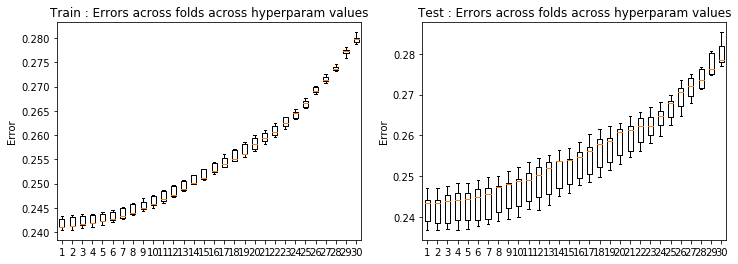

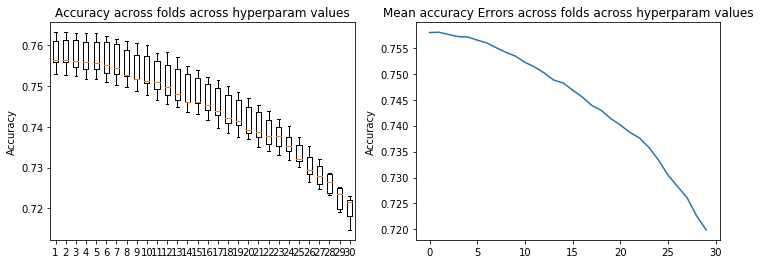

In [229]:
result_crossval(loss_tr18,loss_te18)
result_crossval_accuracy(acc18)

### Removal of outliers

In [6]:
ss0_tX, ss0_y, ss1_tX, ss1_y, ss2_tX, ss2_y, ss3_tX, ss3_y, labels_feat = split_subsets(tX, y,labels_feature)
ss_tX_un, ss_y_un = replace_undef_feat(ss1_tX,ss1_y,method = 'median')
_, ss_tX_nocorrfeat, _, _, _ = remove_correlated_feat(ss0_tX, ss_tX_un, ss2_tX, ss3_tX, labels_feat)
ss_tX_outliers, ss_y_outliers = outliers_suppresion(ss_tX_nocorrfeat, ss_y_un, 3)
print(ss1_tX.shape)
print(ss_tX_outliers.shape)

Subset 0 contains 99913 samples 
Subset 1 contains 77544 samples 
Subset 2 contains 50379 samples 
Subset 3 contains 22164 samples 
Remaining features for subset 2, 3: ['DER_mass_MMC' 'DER_mass_transverse_met_lep' 'DER_mass_vis' 'DER_pt_h'
 'DER_deltaeta_jet_jet' 'DER_mass_jet_jet' 'DER_prodeta_jet_jet'
 'DER_deltar_tau_lep' 'DER_pt_tot' 'DER_sum_pt' 'DER_pt_ratio_lep_tau'
 'DER_met_phi_centrality' 'DER_lep_eta_centrality' 'PRI_tau_pt'
 'PRI_tau_eta' 'PRI_tau_phi' 'PRI_lep_pt' 'PRI_lep_eta' 'PRI_lep_phi'
 'PRI_met' 'PRI_met_phi' 'PRI_met_sumet' 'PRI_jet_leading_pt'
 'PRI_jet_leading_eta' 'PRI_jet_leading_phi' 'PRI_jet_subleading_pt'
 'PRI_jet_subleading_eta' 'PRI_jet_subleading_phi' 'PRI_jet_all_pt']
Remaining features for subset 1: ['DER_mass_MMC' 'DER_mass_transverse_met_lep' 'DER_mass_vis' 'DER_pt_h'
 'DER_deltar_tau_lep' 'DER_pt_tot' 'DER_sum_pt' 'DER_pt_ratio_lep_tau'
 'DER_met_phi_centrality' 'PRI_tau_pt' 'PRI_tau_eta' 'PRI_tau_phi'
 'PRI_lep_pt' 'PRI_lep_eta' 'PRI_lep_phi' 'PRI_

In [236]:
# test 19: degree 1, rmse, remove correlated features and outliers, median undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr19, loss_te19, w19, acc19 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-0.27587934  0.1178768  -0.22093399 -0.29873606  0.28021192  0.03676346
  0.09560125 -0.09161297  0.10503618  0.22337573  0.00489013 -0.00355263
  0.16488154 -0.0090895   0.00091982  0.02996072  0.00094755 -0.01431086
 -0.00328467 -0.00431534]
Ridge regression: w=[-0.27446873  0.11889434 -0.22248579 -0.2954334   0.27725711  0.03693094
  0.09681215 -0.10196942  0.10053006  0.21671562  0.00250581 -0.00691349
  0.17062975 -0.00641581 -0.00065054  0.03104893  0.00180788 -0.01408
 -0.00246402 -0.00557372]
Ridge regression: w=[-2.78171572e-01  1.20865096e-01 -2.21761870e-01 -2.93994118e-01
  2.72204422e-01  3.88207239e-02  9.96101652e-02 -9.01296386e-02
  1.00165991e-01  2.16554711e-01  4.09785378e-03 -5.05234994e-03
  1.61854873e-01 -5.84528459e-03 -1.17263303e-06  2.87888464e-02
  4.90118121e-03 

Ridge regression: w=[-2.76905685e-01  1.17598295e-01 -2.20990319e-01 -2.80555624e-01
  2.63997361e-01  3.85804165e-02  9.92873635e-02 -8.61237792e-02
  1.01389520e-01  2.13292843e-01  4.04811821e-03 -5.09772144e-03
  1.53242242e-01 -5.82531282e-03 -3.45170684e-05  2.85474566e-02
  4.93618061e-03 -1.67974997e-02  4.45292024e-04 -4.85132292e-03]
Ridge regression: w=[-0.2770461   0.11655068 -0.22244406 -0.27763012  0.2627281   0.03775135
  0.09316093 -0.08964415  0.10615068  0.21753361  0.00340647 -0.00576008
  0.15675502 -0.00721579 -0.00214724  0.03213342  0.0006322  -0.01647617
 -0.00135982 -0.00425996]
Ridge regression: w=[-2.75010032e-01  1.14960669e-01 -2.23695676e-01 -2.82802327e-01
  2.65611155e-01  3.91932367e-02  9.45081064e-02 -7.95953283e-02
  1.02843374e-01  2.23644232e-01  3.20718979e-03 -2.63157325e-03
  1.54087364e-01 -8.26785940e-03 -6.70695466e-05  3.29981505e-02
  4.79785598e-03 -1.80720846e-02  1.63454578e-04 -2.48944641e-03]
Accuracy = [0.7256537102473498, 0.729399293

Ridge regression: w=[-0.27295895  0.10831193 -0.21964358 -0.24076407  0.23970835  0.03698034
  0.09300388 -0.08028695  0.10909566  0.20647752  0.00331799 -0.00579098
  0.13338586 -0.00717898 -0.00209128  0.03067163  0.0008381  -0.01434546
 -0.00137262 -0.00400691]
Ridge regression: w=[-2.70952916e-01  1.06207959e-01 -2.20815193e-01 -2.45245412e-01
  2.42401523e-01  3.84083656e-02  9.44927867e-02 -7.16768731e-02
  1.05874969e-01  2.11447083e-01  3.17128917e-03 -2.65304914e-03
  1.31533182e-01 -8.28627263e-03 -5.06376517e-05  3.15218928e-02
  4.86903440e-03 -1.58419698e-02  1.42073934e-04 -2.31215423e-03]
Accuracy = [0.7256537102473498, 0.7303180212014134, 0.7319434628975265, 0.7224734982332155, 0.7334275618374558]
Ridge regression: w=[-0.26903886  0.10348024 -0.21654036 -0.23489877  0.24017763  0.03556349
  0.09477947 -0.07599685  0.11016196  0.20427644  0.00444401 -0.00370804
  0.1252793  -0.0088252   0.00084431  0.02781747  0.00134447 -0.01082205
 -0.00323318 -0.00398189]
Ridge regres

Ridge regression: w=[-0.25351183  0.08614879 -0.20517972 -0.1485792   0.18247195  0.03230862
  0.09216603 -0.0641792   0.11523311  0.16930796  0.00359943 -0.00379867
  0.07614417 -0.00824278  0.00081882  0.02175868  0.00194981 -0.00284918
 -0.00304716 -0.00337334]
Ridge regression: w=[-0.25221559  0.08727051 -0.205991   -0.14658407  0.18018838  0.03241734
  0.09310205 -0.0691296   0.11145111  0.16697304  0.00208467 -0.00673355
  0.07906047 -0.00631107 -0.000664    0.02252     0.00257723 -0.00259601
 -0.00230651 -0.00466097]
Ridge regression: w=[-2.55618220e-01  8.79525686e-02 -2.05497898e-01 -1.46200574e-01
  1.77141575e-01  3.37988530e-02  9.45594208e-02 -6.23968576e-02
  1.11163187e-01  1.65408064e-01  3.29105513e-03 -5.33150498e-03
  7.51982940e-02 -5.42173385e-03 -2.20157222e-04  2.12825182e-02
  5.25486236e-03 -5.21592913e-03  5.16501863e-04 -3.96216338e-03]
Ridge regression: w=[-0.25574784  0.08865417 -0.20664188 -0.14454963  0.176286    0.03322082
  0.09106462 -0.06545002  0.114

Ridge regression: w=[-2.14824100e-01  6.95587300e-02 -1.74937340e-01 -5.40169424e-02
  1.07629756e-01  2.54506089e-02  8.28664873e-02 -5.67383841e-02
  1.10312809e-01  1.17670664e-01  2.09827951e-03 -4.87064094e-03
  2.61025613e-02 -4.52668951e-03 -8.68311321e-05  9.15247322e-03
  5.20310957e-03  1.13696638e-02  5.23122452e-04 -2.97699788e-03]
Ridge regression: w=[-0.21493304  0.07094124 -0.17587303 -0.05306801  0.10727777  0.0250585
  0.08124326 -0.05910618  0.11313345  0.11961688  0.00177707 -0.00507147
  0.02658904 -0.00588383 -0.00116458  0.01066682  0.00219145  0.01123739
 -0.00114508 -0.00207501]
Ridge regression: w=[-2.13353448e-01  6.79913271e-02 -1.76425610e-01 -5.47259217e-02
  1.08062452e-01  2.60185507e-02  8.25966129e-02 -5.58557063e-02
  1.10694721e-01  1.20088245e-01  1.83584267e-03 -2.51807985e-03
  2.72105330e-02 -6.95047236e-03  3.44753272e-04  1.09570495e-02
  4.81283141e-03  1.06791492e-02  1.66372626e-05 -1.17123735e-03]
Accuracy = [0.7215547703180212, 0.7250176678

Ridge regression: w=[-1.39894158e-01  5.08568506e-02 -1.22621560e-01 -3.46952999e-03
  5.48275657e-02  1.55202221e-02  6.09556766e-02 -4.94690286e-02
  8.88954008e-02  7.82871337e-02  4.81275804e-04 -1.98294683e-03
  2.61051651e-04 -4.72009595e-03  6.09711576e-04 -6.13019615e-04
  3.76742198e-03  2.38217504e-02 -1.14583429e-04 -6.37905870e-04]
Accuracy = [0.7163957597173145, 0.7214840989399294, 0.7262190812720848, 0.7131448763250884, 0.7256537102473498]
Ridge regression: w=[-1.23294789e-01  4.78159531e-02 -1.10246837e-01  1.46296444e-03
  4.84819140e-02  1.29959361e-02  5.48897012e-02 -4.82846694e-02
  8.33967417e-02  7.14643333e-02 -5.32514670e-05 -2.35438194e-03
 -3.37646365e-03 -4.07684275e-03  9.78746807e-04 -2.46807540e-03
  2.48727602e-03  2.49625497e-02 -1.44655526e-03 -9.53993033e-04]
Ridge regression: w=[-0.12266437  0.04816158 -0.10993946  0.00213756  0.04766044  0.01296944
  0.05573335 -0.04916968  0.08193049  0.07186355 -0.00015752 -0.00344872
 -0.0026098  -0.00373584  0.00

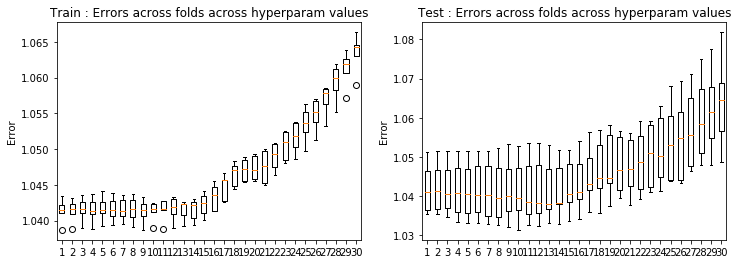

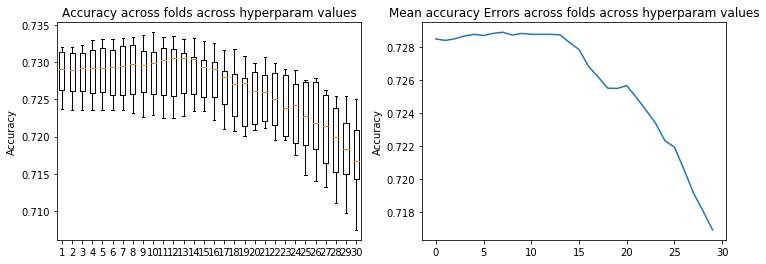

In [237]:
result_crossval(loss_tr19,loss_te19)
result_crossval_accuracy(acc19)

In [238]:
# test 20: degree 2, rmse, remove correlated features and outliers, median undef 
lambdas = np.logspace(-3, 0, 30)
loss_tr20, loss_te20, w20, acc20 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.75879337e-01  6.49828165e-01 -1.53081357e-01  7.33156820e-03
  1.80188892e-01  6.14542123e-02  2.67991006e-01 -1.81400368e-03
  9.27740688e-02  3.97490790e-01  4.56725956e-03 -2.40971486e-03
  1.46083801e-01 -6.41916642e-03  3.35274063e-04  5.28518616e-02
  3.20414685e-03  7.64730977e-02 -4.08217017e-03 -3.96191440e-03
 -5.25286807e-01 -5.29659548e-02 -1.84684205e-01 -6.02648388e-02
 -3.67373747e-02 -1.67450812e-01  2.01937864e-02  1.41766969e-02
 -2.21369526e-01 -3.78719161e-02 -4.55034022e-03 -1.26228486e-01
 -6.26910238e-02  7.72297271e-04 -3.75702529e-02 -8.63382541e-03
 -8.77797662e-02  1.53681153e-01 -5.86330074e-03]
Ridge regression: w=[-2.74468730e-01  6.48029003e-01 -1.51753532e-01  4.53302082e-02
  1.44834675e-01  6.42860782e-02  2.88438669e-01  1.01226717e-02
  8.77189885e-02  3

Ridge regression: w=[-2.75305997e-01  5.99689481e-01 -1.53188193e-01  4.85980353e-02
  1.73931362e-01  5.98435424e-02  2.56596262e-01 -3.70850722e-02
  9.41778397e-02  3.42103657e-01  4.63094487e-03 -2.44169503e-03
  1.52314761e-01 -6.47773732e-03  3.17554564e-04  5.33784200e-02
  3.13956566e-03  7.61913541e-02 -4.06890447e-03 -3.83887113e-03
 -4.79250902e-01 -5.38304444e-02 -2.18938090e-01 -5.67791145e-02
 -3.53344087e-02 -1.58818753e-01  3.38556504e-02  1.51424760e-02
 -1.80807603e-01 -3.79691093e-02 -4.53241658e-03 -1.18502680e-01
 -6.28804929e-02  7.50806386e-04 -3.42010461e-02 -8.58395198e-03
 -8.72991986e-02  1.53820046e-01 -5.80564887e-03]
Ridge regression: w=[-2.73898322e-01  5.99100048e-01 -1.51733747e-01  7.75779063e-02
  1.46456603e-01  6.24856374e-02  2.73342853e-01 -2.97496984e-02
  8.89958562e-02  3.29129777e-01  2.77432578e-03 -4.17949636e-03
  1.34247121e-01 -4.03524037e-03 -1.52600228e-03  4.71839718e-02
  2.44958208e-03  8.47824556e-02 -2.59954662e-03 -4.49034635e-03


Ridge regression: w=[-0.27501003  0.55397646 -0.15336691  0.09324236  0.14887114  0.06645396
  0.25028172 -0.03907182  0.09174303  0.29424071  0.00514627 -0.00142149
  0.13966362 -0.0067864  -0.00125568  0.05146999  0.00514622  0.07733286
 -0.00065358 -0.00201621 -0.43474684 -0.05812391 -0.25462176 -0.0428795
 -0.04074544 -0.15602581  0.02932427  0.01928689 -0.13903558 -0.03951958
  0.00485626 -0.09946677 -0.06204676  0.00466836 -0.02448383 -0.00249633
 -0.09213087  0.15303572  0.00147754]
Accuracy = [0.7782332155477032, 0.7751236749116608, 0.7774558303886926, 0.7713780918727915, 0.7796466431095407]
Ridge regression: w=[-2.74141836e-01  5.28193964e-01 -1.52620600e-01  8.79899920e-02
  1.72506876e-01  5.70585736e-02  2.34589721e-01 -5.75045220e-02
  9.62446880e-02  2.90990092e-01  4.69719547e-03 -2.47192914e-03
  1.45029175e-01 -6.53089324e-03  3.16935315e-04  5.33993233e-02
  3.03581622e-03  7.42493709e-02 -4.04322591e-03 -3.64439047e-03
 -4.13607756e-01 -5.55334625e-02 -2.51209435e-01

Ridge regression: w=[-2.71793388e-01  4.39710859e-01 -1.50445447e-01  1.08473166e-01
  1.73221249e-01  5.25315696e-02  2.01720756e-01 -6.47992413e-02
  9.90199971e-02  2.43602543e-01  4.72581872e-03 -2.49536251e-03
  1.27880318e-01 -6.55821949e-03  3.55431411e-04  5.14099080e-02
  2.89069648e-03  6.81429892e-02 -4.00139324e-03 -3.36722768e-03
 -3.32643957e-01 -5.87114636e-02 -2.66413321e-01 -5.27721564e-02
 -2.85612010e-02 -1.10774851e-01  3.14238593e-02  1.76013752e-02
 -9.46472199e-02 -3.88850414e-02 -4.41058996e-03 -7.10562264e-02
 -6.34383037e-02  6.52388733e-04 -2.22341548e-02 -8.47575597e-03
 -7.76081878e-02  1.53561716e-01 -5.70800921e-03]
Ridge regression: w=[-0.27040367  0.44037289 -0.14892794  0.12042231  0.16138039  0.05459777
  0.21005155 -0.0637543   0.09371557  0.2369958   0.0028304  -0.00441525
  0.12249313 -0.00413925 -0.00135846  0.04687738  0.00248646  0.07492658
 -0.00255883 -0.00430147 -0.3328774  -0.06213974 -0.27349711 -0.04601213
 -0.03062448 -0.11925914  0.02247

Ridge regression: w=[-0.26575181  0.34361416 -0.14442242  0.10695712  0.16020113  0.04739999
  0.16718376 -0.06360544  0.09702674  0.19501552  0.00279423 -0.00459551
  0.10378484 -0.00419026 -0.00118098  0.04274503  0.00253955  0.06135033
 -0.00252551 -0.00414912 -0.24505535 -0.06679583 -0.25690309 -0.0362863
 -0.02370729 -0.07916307  0.01228912  0.02246748 -0.04838064 -0.03756301
 -0.00080449 -0.03296518 -0.06498693  0.00366398 -0.00596466 -0.0029491
 -0.06870801  0.15112812 -0.00361653]
Ridge regression: w=[-0.26933705  0.34271679 -0.14374827  0.10348923  0.16140068  0.04352886
  0.16951004 -0.05805813  0.09813351  0.19241127  0.00404293 -0.00366004
  0.10181941 -0.00352624 -0.00109215  0.04667866  0.00493907  0.05410896
 -0.0014288  -0.00392174 -0.24258714 -0.06718778 -0.25092962 -0.0423933
 -0.01795791 -0.07974433  0.01693509  0.02168657 -0.0474503  -0.04352925
  0.00293885 -0.03882718 -0.06689767  0.0034426  -0.0127773   0.00170844
 -0.06479173  0.15369052  0.00573649]
Ridge regre

Ridge regression: w=[-0.26019064  0.24935839 -0.13674147  0.07299458  0.14412993  0.03549089
  0.12759165 -0.05324238  0.100781    0.15367913  0.00402027 -0.00382267
  0.0791686  -0.00355393 -0.00085692  0.03789996  0.00483365  0.03930745
 -0.00130474 -0.00347161 -0.15976796 -0.07229478 -0.21217733 -0.0189602
 -0.0106784  -0.03919124  0.00490647  0.02476503 -0.0081506  -0.04452938
  0.00247965 -0.01217338 -0.06689053  0.00271187 -0.00344454  0.00133639
 -0.04640657  0.15034525  0.00495366]
Ridge regression: w=[-0.26032259  0.25306352 -0.13885548  0.07551084  0.14436022  0.04009879
  0.12616856 -0.055579    0.10396454  0.15565298  0.00363027 -0.00418405
  0.08122189 -0.00507433 -0.00247906  0.03963389  0.00170559  0.03919496
 -0.0017847  -0.00250328 -0.16266281 -0.07090821 -0.21330756 -0.02118449
 -0.0166077  -0.04150969  0.0048204   0.02683277 -0.00646627 -0.04224829
  0.00045782 -0.01195302 -0.06798844  0.00194777 -0.0035856  -0.00028034
 -0.04619734  0.14676774  0.000615  ]
Ridge reg

Ridge regression: w=[-2.43430823e-01  1.72717889e-01 -1.28111152e-01  4.21049339e-02
  1.17251531e-01  2.95191080e-02  9.33615372e-02 -4.79442692e-02
  1.03908090e-01  1.21732504e-01  3.34776534e-03 -4.16831975e-03
  5.72033419e-02 -4.85804697e-03 -2.15812475e-03  2.87244100e-02
  1.75515129e-03  2.62688159e-02 -1.59981360e-03 -1.94963868e-03
 -9.30806752e-02 -7.61089911e-02 -1.60991179e-01  3.16655106e-03
 -7.30885666e-03 -7.71581060e-03 -5.30174206e-03  3.13416301e-02
  2.19999729e-02 -4.25786357e-02  1.17709232e-04  4.11707060e-03
 -6.65778514e-02  1.41247948e-03  3.56902641e-03 -2.37597314e-04
 -2.77090838e-02  1.39203650e-01  3.49294423e-04]
Ridge regression: w=[-2.41641798e-01  1.70174298e-01 -1.28362777e-01  3.96645551e-02
  1.17285964e-01  3.05320514e-02  9.27674811e-02 -4.49871361e-02
  1.01328248e-01  1.21837489e-01  3.77893180e-03 -1.71778930e-03
  5.73105731e-02 -6.03297335e-03 -4.72168246e-04  2.75910251e-02
  4.93254100e-03  2.69348765e-02 -3.94379451e-04 -8.97000774e-04


Ridge regression: w=[-0.2148241   0.1123333  -0.11361619  0.01975163  0.08807983  0.01924208
  0.07187001 -0.03953595  0.09654447  0.09145157  0.00293008 -0.00378476
  0.03421022 -0.00315928 -0.00032508  0.01723767  0.00447299  0.01846948
 -0.00072137 -0.002374   -0.04422867 -0.07871223 -0.10863253  0.01820503
  0.00176775  0.01637334 -0.01138515  0.03459247  0.03509133 -0.04297418
  0.00127123  0.00753638 -0.06145978  0.00095641  0.00619993  0.00045836
 -0.01182942  0.12785467  0.0028638 ]
Ridge regression: w=[-2.14933037e-01  1.13886842e-01 -1.14719211e-01  2.05748331e-02
  8.79210845e-02  2.05473218e-02  7.10213136e-02 -4.09106060e-02
  9.90814676e-02  9.31573467e-02  2.63290508e-03 -3.95441671e-03
  3.50603989e-02 -4.39636121e-03 -1.65666186e-03  1.81380755e-02
  1.86766213e-03  1.85553674e-02 -1.32257170e-03 -1.37333330e-03
 -4.44617404e-02 -7.83306662e-02 -1.08907955e-01  1.74495338e-02
 -6.29858455e-04  1.50995769e-02 -1.20134945e-02  3.60145881e-02
  3.64525131e-02 -4.10741115e

Ridge regression: w=[-1.71048006e-01  7.39745745e-02 -9.80670196e-02  1.12558712e-02
  6.26998707e-02  1.35471915e-02  5.59276509e-02 -3.65671836e-02
  8.58321678e-02  7.04894421e-02  9.42664175e-04 -3.79150693e-03
  1.76871014e-02 -3.53066419e-03  8.58688010e-05  8.37456972e-03
  2.72123935e-03  1.76995544e-02 -1.57621578e-03 -2.34953005e-03
 -1.55581843e-02 -7.56162908e-02 -6.65465000e-02  2.25335745e-02
  3.10833134e-03  2.72219751e-02 -1.81867117e-02  3.71547689e-02
  3.93282652e-02 -3.39807299e-02 -1.06734134e-03  5.55757072e-03
 -5.17891368e-02  2.15705779e-03  6.65097794e-03 -9.80602084e-04
  6.96841404e-04  1.03115054e-01 -2.54002475e-03]
Ridge regression: w=[-1.73355605e-01  7.37861562e-02 -9.79279179e-02  1.11085931e-02
  6.18961916e-02  1.34502018e-02  5.60939579e-02 -3.44487696e-02
  8.61591318e-02  6.90597682e-02  1.89680687e-03 -3.36417618e-03
  1.70528460e-02 -2.68288296e-03 -6.18482625e-05  8.56368807e-03
  4.03593100e-03  1.61274886e-02 -3.25751075e-04 -1.84236638e-03


Ridge regression: w=[-0.12329479  0.04904186 -0.07974131  0.00855392  0.04229434  0.00919524
  0.04289222 -0.03111465  0.07182719  0.0529574   0.00036182 -0.0018687
  0.00530165 -0.00340151  0.00082832  0.0022607   0.00212733  0.0167715
 -0.00163051 -0.0008194  -0.00040255 -0.06581032 -0.03583034  0.01971191
  0.00361128  0.02870677 -0.01854364  0.03260133  0.03632532 -0.02862912
 -0.00139866 -0.00031131 -0.03953395  0.00078019  0.00270041 -0.00342435
  0.00868624  0.07499942 -0.00153934]
Ridge regression: w=[-0.12266437  0.04924115 -0.07939178  0.0091657   0.04165371  0.00926541
  0.04343888 -0.03185402  0.0700102   0.05310512  0.00022221 -0.00291878
  0.00583912 -0.00293756  0.0003578   0.00233259  0.00238791  0.01713344
 -0.00111254 -0.00166498 -0.00023133 -0.06590315 -0.0354521   0.01919654
  0.00388887  0.0289108  -0.01983901  0.03345229  0.0364413  -0.02736655
 -0.00087301  0.000477   -0.04022395  0.00170383  0.00365461 -0.00041581
  0.00855107  0.07481442 -0.00194063]
Ridge regr

Ridge regression: w=[-9.22732627e-02  3.69004367e-02 -6.59371238e-02  8.25574832e-03
  3.03747840e-02  7.59020142e-03  3.57090142e-02 -2.70688682e-02
  5.75703196e-02  4.31685513e-02  2.70508426e-04 -1.22344477e-03
  1.44291184e-03 -2.78395885e-03  4.11690030e-04  2.38389397e-04
  2.56051697e-03  1.58367954e-02 -1.46411434e-04 -3.04065476e-04
  4.04606887e-03 -5.64436111e-02 -2.18326314e-02  1.54411450e-02
  3.59616705e-03  2.65241108e-02 -1.78907614e-02  2.82248587e-02
  3.26025824e-02 -2.26223353e-02  7.43708106e-04 -1.78889498e-03
 -3.11985405e-02  3.74811939e-05  2.16834147e-03 -8.12497700e-04
  1.06037122e-02  5.61438243e-02 -2.08267993e-04]
Accuracy = [0.7392932862190813, 0.7377385159010601, 0.7407773851590106, 0.7267844522968198, 0.7402826855123675]


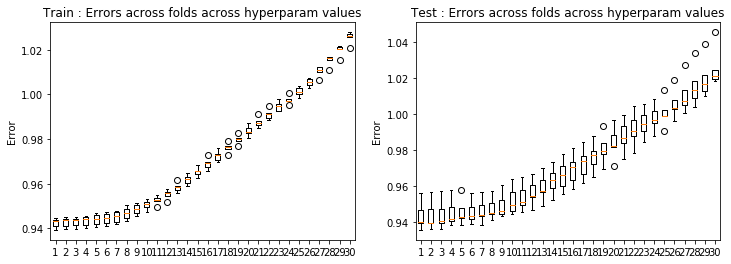

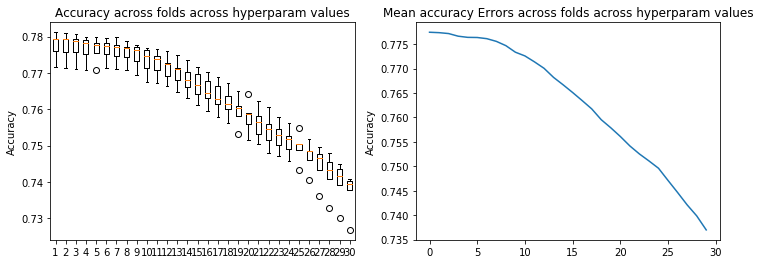

In [239]:
result_crossval(loss_tr20,loss_te20)
result_crossval_accuracy(acc20)

In [240]:
# test 21: degree 3, rmse, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr21, loss_te21, w21, acc21 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -2.61537982e-01  1.75739648e-01  7.96513413e-01
 -2.89201673e-01  1.73212428e-01  4.23076203e-01  4.99848811e-01
  3.88438424e-02  7.65470949e-01  9.30504788e-04 -2.43060921e-04
  5.90957532e-02  1.67345283e-03  1.77001452e-02  2.08479388e-01
  3.82682865e-03  4.86308906e-02 -5.09616892e-03  1.28154709e-03
  1.58677353e+00 -8.64813620e-01 -1.85195260e+00  8.80626287e-01
 -2.97058689e-01 -4.48439147e-01 -4.92578941e-01  1.17480882e-02
 -6.37823390e-01 -3.61938642e-02 -4.95078221e-03 -3.30213249e-01
 -6.11758196e-02  5.95648994e-04 -3.69225179e-01 -8.87890824e-03
 -5.72287995e-02  1.51118668e-01 -6.63247292e-03 -1.23322095e+00
  5.09534149e-01  9.38474441e-01 -5.19617979e-01  1.60479097e-01
  1.39378233e-01  1.87328185e-01  4.09023100e-02  1.52173878e-01
  3.60513873e-03 -2.2350

Ridge regression: w=[-2.76819780e-01 -2.72651342e-01  2.01950643e-01  8.45974312e-01
 -3.16344426e-01  1.69955839e-01  4.34456265e-01  3.60051259e-01
  3.36203316e-02  6.98682749e-01 -3.48502109e-03  2.29164306e-03
  1.57931356e-01  2.63012717e-03  1.99821515e-02  2.36882860e-01
  1.14023264e-02  9.98323119e-02 -8.22339305e-03  9.58753237e-03
  1.61949914e+00 -9.32861777e-01 -1.90483549e+00  8.67475211e-01
 -2.74570742e-01 -4.59369959e-01 -2.96789105e-01  1.50833587e-02
 -6.25157208e-01 -3.82609066e-02  4.75639478e-03 -4.78896481e-01
 -6.04709563e-02  4.54050757e-03 -4.28609024e-01 -2.49057461e-03
 -1.64331391e-01  1.50158822e-01  9.09023563e-04 -1.25132635e+00
  5.48323770e-01  9.49702279e-01 -4.93871235e-01  1.41105435e-01
  1.36046468e-01  9.36943972e-02  4.18190111e-02  1.75320799e-01
  9.39791560e-03 -6.85269054e-04  2.39220213e-01 -9.70375462e-03
 -2.06688351e-02  2.28733225e-01 -4.83720589e-03  4.52310118e-02
  9.03535703e-03 -8.00732623e-03]
Accuracy = [0.7867137809187279, 0.78

Ridge regression: w=[-2.78869241e-01 -2.91842188e-01  1.86675118e-01  7.92812821e-01
 -2.53112939e-01  1.64504660e-01  5.14941229e-01  4.96502089e-01
  3.44336932e-02  7.96660889e-01 -3.43108245e-03  5.05728894e-03
  3.99543191e-03 -3.12197715e-03  1.93519249e-02  2.17907738e-01
  3.54226197e-03  7.78227158e-02 -6.76858535e-03  8.26484550e-03
  1.67005510e+00 -8.94583827e-01 -1.82479333e+00  7.92884512e-01
 -2.66286260e-01 -6.00029586e-01 -4.90132275e-01  1.73148966e-02
 -7.43668939e-01 -3.83005895e-02  1.27721742e-03 -2.26462532e-01
 -6.53859000e-02  2.99137744e-03 -3.82550312e-01 -5.92053620e-04
 -1.35456988e-01  1.48823837e-01  5.67982755e-04 -1.28495868e+00
  5.26839244e-01  9.22186962e-01 -4.79364392e-01  1.36781827e-01
  1.99467758e-01  1.82373201e-01  4.39427327e-02  2.23366499e-01
  6.54278118e-03 -6.25656109e-03  1.16497737e-01 -9.44138422e-04
 -2.08045276e-02  1.97716483e-01  8.46317569e-04  3.89394230e-02
  5.36166923e-03 -7.95814405e-03]
Ridge regression: w=[-2.76819771e-01

Ridge regression: w=[-2.78727879e-01 -2.66676535e-01  2.18555836e-01  7.36919339e-01
 -2.43453264e-01  1.54970357e-01  4.60111636e-01  6.55922065e-01
  3.29786735e-02  9.48703428e-01  1.37894591e-03  2.96037214e-03
 -3.29256989e-02 -2.04229345e-03  9.83318841e-03  2.14180035e-01
  7.97973454e-03  1.26746742e-01 -1.32972117e-03 -1.67627808e-03
  1.60812778e+00 -9.65159694e-01 -1.72065428e+00  7.77438668e-01
 -2.55089058e-01 -4.96415262e-01 -6.25741718e-01  1.32600220e-02
 -8.97267496e-01 -4.00856391e-02  3.19591205e-03 -2.69958841e-01
 -6.46861695e-02  4.13533041e-03 -3.72328794e-01  2.18592233e-03
 -2.32998765e-01  1.52178344e-01  6.01114640e-03 -1.24921506e+00
  5.67155061e-01  8.69571570e-01 -4.67587277e-01  1.37122816e-01
  1.53831097e-01  2.25992625e-01  4.23379289e-02  2.69412974e-01
  3.07713540e-03 -5.05227081e-03  1.54462274e-01 -1.98869195e-03
 -1.09605084e-02  1.89827002e-01 -1.81836969e-03  8.80165955e-02
  7.84977490e-04 -3.07513399e-04]
Ridge regression: w=[-2.78869221e-01

Ridge regression: w=[-2.75017591e-01 -2.63763573e-01  1.88221595e-01  8.50631564e-01
 -2.79226468e-01  1.32032200e-01  4.75038415e-01  7.49369352e-01
  2.18450501e-02  9.17990800e-01 -3.51658942e-03 -4.49395881e-03
 -1.08700985e-01 -4.83875589e-04  1.10118898e-02  2.40501292e-01
  2.65788207e-03  7.96474738e-02 -6.89102002e-03  3.69229125e-03
  1.60830890e+00 -9.03126407e-01 -1.92225965e+00  7.91704638e-01
 -1.94933498e-01 -5.30938766e-01 -7.80308735e-01  1.53432183e-02
 -8.03849268e-01 -3.53479887e-02 -2.87193607e-04 -1.61532843e-01
 -6.19347769e-02  3.92907480e-03 -4.47322824e-01 -2.67256711e-03
 -1.08636498e-01  1.49469458e-01 -3.68659864e-03 -1.25080735e+00
  5.33803416e-01  9.63901472e-01 -4.50772773e-01  9.42868629e-02
  1.68574388e-01  2.94324863e-01  5.20741615e-02  2.16936253e-01
  6.80662260e-03  2.55979407e-03  1.18184270e-01 -3.42908002e-03
 -1.28400321e-02  2.43139953e-01  1.08518512e-03  1.32545316e-02
  4.99116126e-03 -6.41377360e-03]
Ridge regression: w=[-2.78727838e-01

Ridge regression: w=[-2.76430932e-01 -2.60706272e-01  1.75635013e-01  7.94488468e-01
 -2.87693496e-01  1.73172934e-01  4.22723051e-01  4.95412097e-01
  3.88144057e-02  7.62431678e-01  9.31446958e-04 -2.41668187e-04
  6.18909731e-02  1.67359036e-03  1.77009923e-02  2.08466066e-01
  3.82323655e-03  4.86869732e-02 -5.09678102e-03  1.28050415e-03
  1.58505212e+00 -8.64583694e-01 -1.84824759e+00  8.78053744e-01
 -2.96965396e-01 -4.47748577e-01 -4.87445615e-01  1.17362995e-02
 -6.34563527e-01 -3.61956270e-02 -4.95045929e-03 -3.33067793e-01
 -6.11762460e-02  5.96064555e-04 -3.69216825e-01 -8.87886947e-03
 -5.73254926e-02  1.51120624e-01 -6.63159918e-03 -1.23230662e+00
  5.09408940e-01  9.36587922e-01 -5.18374771e-01  1.60424733e-01
  1.39071771e-01  1.85239414e-01  4.09343249e-02  1.50960221e-01
  3.60447862e-03 -2.23949232e-04  1.65983512e-01 -8.43294418e-03
 -1.75392699e-02  1.90440116e-01  3.52783804e-04 -9.01777556e-03
  1.17179701e-03 -2.51617870e-03]
Ridge regression: w=[-2.75017506e-01

Ridge regression: w=[-2.76819550e-01 -2.71387958e-01  2.01785106e-01  8.42962681e-01
 -3.14149867e-01  1.69904901e-01  4.33946274e-01  3.55914348e-01
  3.35775707e-02  6.95912976e-01 -3.48216269e-03  2.29507528e-03
  1.60420235e-01  2.63049950e-03  1.99867191e-02  2.36856422e-01
  1.13990112e-02  9.98599392e-02 -8.22391143e-03  9.59106721e-03
  1.61686892e+00 -9.32498905e-01 -1.89933259e+00  8.63758993e-01
 -2.74447119e-01 -4.58390380e-01 -2.91977211e-01  1.50665355e-02
 -6.22079733e-01 -3.82633957e-02  4.75768356e-03 -4.81227781e-01
 -6.04712787e-02  4.54180872e-03 -4.28578789e-01 -2.49065367e-03
 -1.64361597e-01  1.50161022e-01  9.10252196e-04 -1.24992484e+00
  5.48126041e-01  9.46909420e-01 -4.92086487e-01  1.41032500e-01
  1.35621012e-01  9.17386098e-02  4.18666662e-02  1.74119733e-01
  9.39614922e-03 -6.87186279e-04  2.39917843e-01 -9.70543563e-03
 -2.06729064e-02  2.28693334e-01 -4.83335911e-03  4.52401953e-02
  9.03536323e-03 -8.01037821e-03]
Accuracy = [0.7867137809187279, 0.78

Ridge regression: w=[-2.78868750e-01 -2.89150531e-01  1.86325438e-01  7.86781524e-01
 -2.48854524e-01  1.64400269e-01  5.13425192e-01  4.81541547e-01
  3.43431452e-02  7.86110365e-01 -3.42861236e-03  5.05856415e-03
  1.36210616e-02 -3.12301886e-03  1.93539269e-02  2.17861456e-01
  3.53234025e-03  7.79546020e-02 -6.77013420e-03  8.26372862e-03
  1.66448183e+00 -8.93806256e-01 -1.81370223e+00  7.85626456e-01
 -2.66037056e-01 -5.97033177e-01 -4.72937042e-01  1.72803851e-02
 -7.32256468e-01 -3.83054314e-02  1.27840464e-03 -2.36512664e-01
 -6.53867697e-02  2.99438092e-03 -3.82524216e-01 -5.90569831e-04
 -1.35678639e-01  1.48829071e-01  5.71912218e-04 -1.28199160e+00
  5.26407098e-01  9.16517801e-01 -4.75848835e-01  1.36637076e-01
  1.98059559e-01  1.75411403e-01  4.40412718e-02  2.19095812e-01
  6.54184317e-03 -6.25534204e-03  1.20036495e-01 -9.47039146e-04
 -2.08080623e-02  1.97661693e-01  8.54947423e-04  3.90457732e-02
  5.36328360e-03 -7.95952455e-03]
Ridge regression: w=[-2.76819284e-01

Ridge regression: w=[-2.78726839e-01 -2.61453735e-01  2.17806797e-01  7.25450041e-01
 -2.35276704e-01  1.54731073e-01  4.58043215e-01  6.16715873e-01
  3.27787867e-02  9.19493359e-01  1.38185662e-03  2.96479329e-03
 -8.46084518e-03 -2.03411801e-03  9.84594991e-03  2.14077817e-01
  7.95224217e-03  1.26581075e-01 -1.33190483e-03 -1.67769839e-03
  1.59728952e+00 -9.63504723e-01 -1.69943884e+00  7.63391628e-01
 -2.54523382e-01 -4.92136405e-01 -5.81196520e-01  1.31945826e-02
 -8.65345192e-01 -4.00979403e-02  3.19547826e-03 -2.94973671e-01
 -6.46847245e-02  4.13772235e-03 -3.72279105e-01  2.18700062e-03
 -2.32561395e-01  1.52191707e-01  6.02086589e-03 -1.24342688e+00
  5.66237922e-01  8.58648834e-01 -4.60734924e-01  1.36791140e-01
  1.51786786e-01  2.08025855e-01  4.25518845e-02  2.57494566e-01
  3.07132102e-03 -5.05152440e-03  1.63257920e-01 -2.00000591e-03
 -1.09729903e-02  1.89730158e-01 -1.79621333e-03  8.77614331e-02
  7.85441418e-04 -3.08437469e-04]
Ridge regression: w=[-2.78868181e-01

Ridge regression: w=[-2.75015416e-01 -2.52130284e-01  1.86653671e-01  8.23673286e-01
 -2.60143063e-01  1.31634490e-01  4.69473390e-01  6.63062550e-01
  2.14204209e-02  8.56173616e-01 -3.50011451e-03 -4.47080416e-03
 -5.38869786e-02 -4.66233885e-04  1.10628983e-02  2.40244295e-01
  2.62372485e-03  8.01255968e-02 -6.89620250e-03  3.71183871e-03
  1.58410223e+00 -8.99628072e-01 -1.87238346e+00  7.59196930e-01
 -1.93970127e-01 -5.19674592e-01 -6.81412984e-01  1.51998155e-02
 -7.37562797e-01 -3.53554411e-02 -2.84411649e-04 -2.18756656e-01
 -6.19431990e-02  3.94064153e-03 -4.47111195e-01 -2.66813495e-03
 -1.09394794e-01  1.49498684e-01 -3.66852693e-03 -1.23790972e+00
  5.31860237e-01  9.38255285e-01 -4.35018685e-01  9.37251225e-02
  1.63251351e-01  2.54278258e-01  5.25338458e-02  1.92483325e-01
  6.79108444e-03  2.54916471e-03  1.38570720e-01 -3.45778050e-03
 -1.28922969e-02  2.42859292e-01  1.11788865e-03  1.36025774e-02
  4.99018375e-03 -6.42610366e-03]
Ridge regression: w=[-2.78725632e-01

Ridge regression: w=[-2.76426294e-01 -2.37033949e-01  1.72630881e-01  7.38338686e-01
 -2.46665240e-01  1.72051349e-01  4.12625662e-01  3.97147619e-01
  3.80143469e-02  6.96483612e-01  9.56069769e-04 -2.00005163e-04
  1.22361141e-01  1.67812331e-03  1.77207531e-02  2.08069393e-01
  3.72884130e-03  5.02332411e-02 -5.11410508e-03  1.25732406e-03
  1.53589933e+00 -8.57973379e-01 -1.74537403e+00  8.08304795e-01
 -2.94313734e-01 -4.28229337e-01 -3.73153960e-01  1.14165247e-02
 -5.63176035e-01 -3.62445276e-02 -4.94252352e-03 -3.92646311e-01
 -6.11877055e-02  6.08143671e-04 -3.68866111e-01 -8.87713973e-03
 -5.99646008e-02  1.51170130e-01 -6.60810626e-03 -1.20611711e+00
  5.05786121e-01  8.84214819e-01 -4.84772673e-01  1.58877581e-01
  1.30475139e-01  1.38653728e-01  4.18170104e-02  1.23950893e-01
  3.58633967e-03 -2.39578945e-04  1.85331087e-01 -8.45963600e-03
 -1.75654414e-02  1.89821497e-01  4.34767818e-04 -7.76870453e-03
  1.18531528e-03 -2.49490017e-03]
Ridge regression: w=[-2.75012891e-01

Ridge regression: w=[-2.76812785e-01 -2.36169709e-01  1.97046284e-01  7.62025027e-01
 -2.56746462e-01  1.68466516e-01  4.19892681e-01  2.72519588e-01
  3.24356954e-02  6.41119674e-01 -3.40754442e-03  2.38603046e-03
  2.07422417e-01  2.63903617e-03  2.01045042e-02  2.36035730e-01
  1.13047801e-02  1.00427056e-01 -8.24050604e-03  9.67788661e-03
  1.54330633e+00 -9.22073270e-01 -1.75103450e+00  7.66912342e-01
 -2.70972087e-01 -4.31599782e-01 -1.94308441e-01  1.46281867e-02
 -5.59061278e-01 -3.83289624e-02  4.78706690e-03 -5.20322404e-01
 -6.04811810e-02  4.57605051e-03 -4.27466049e-01 -2.49418669e-03
 -1.64756804e-01  1.50218080e-01  9.40871279e-04 -1.21059662e+00
  5.42392411e-01  8.71574074e-01 -4.45723422e-01  1.38981122e-01
  1.24025557e-01  5.19872685e-02  4.31629429e-02  1.48498504e-01
  9.34964163e-03 -7.40553426e-04  2.49135039e-01 -9.74660200e-03
 -2.07772876e-02  2.27434340e-01 -4.72539776e-03  4.52405427e-02
  9.03685483e-03 -8.08620113e-03]
Accuracy = [0.7862897526501766, 0.78

Ridge regression: w=[-2.78854296e-01 -2.17869430e-01  1.76748138e-01  6.37978396e-01
 -1.49881737e-01  1.61645335e-01  4.74210956e-01  2.63400889e-01
  3.22157744e-02  6.36032467e-01 -3.34806982e-03  5.12878477e-03
  1.46314320e-01 -3.14626095e-03  1.93805536e-02  2.16417694e-01
  3.30595214e-03  8.05848648e-02 -6.80312399e-03  8.22613877e-03
  1.51571209e+00 -8.72392467e-01 -1.53871533e+00  6.18554462e-01
 -2.59434401e-01 -5.20890168e-01 -2.20014635e-01  1.64676154e-02
 -5.63682106e-01 -3.84198486e-02  1.29220198e-03 -3.63083919e-01
 -6.54129766e-02  3.05484251e-03 -3.80884100e-01 -5.62952402e-04
 -1.39595695e-01  1.48939119e-01  6.48499542e-04 -1.20218986e+00
  5.14322962e-01  7.75853954e-01 -3.95604486e-01  1.32774432e-01
  1.62729466e-01  7.29136227e-02  4.64566711e-02  1.52789753e-01
  6.50379402e-03 -6.27380020e-03  1.58870799e-01 -1.00898900e-03
 -2.08656575e-02  1.95653150e-01  1.05447155e-03  4.06952914e-02
  5.38741500e-03 -7.98037487e-03]
Ridge regression: w=[-2.76804936e-01

Ridge regression: w=[-2.78696200e-01 -1.36360888e-01  1.97740107e-01  4.83363719e-01
 -8.09452472e-02  1.49010244e-01  4.07488288e-01  2.50012824e-01
  2.86948700e-02  6.40679953e-01  1.41206334e-03  3.07587700e-03
  1.88086698e-01 -1.87065082e-03  1.00406014e-02  2.10332632e-01
  7.40388139e-03  1.20597131e-01 -1.41605760e-03 -1.72751998e-03
  1.33399819e+00 -9.18718287e-01 -1.24768572e+00  5.02764067e-01
 -2.41027632e-01 -3.92522735e-01 -1.63601065e-01  1.20184013e-02
 -5.39079326e-01 -4.03397272e-02  3.18897271e-03 -4.52458877e-01
 -6.46744626e-02  4.20603889e-03 -3.66859500e-01  2.20761053e-03
 -2.17584684e-01  1.52402103e-01  6.18573099e-03 -1.10098803e+00
  5.40756461e-01  6.25797141e-01 -3.35438952e-01  1.28852767e-01
  1.05562697e-01  3.98938520e-02  4.72322285e-02  1.26557862e-01
  2.97842966e-03 -5.08395876e-03  2.00976165e-01 -2.17988292e-03
 -1.11597409e-02  1.84955781e-01 -1.34712177e-03  7.90560387e-02
  7.91897868e-04 -3.19394565e-04]
Ridge regression: w=[-2.78837527e-01

Ridge regression: w=[-2.74951306e-01 -2.85810463e-02  1.50039258e-01  4.01158443e-01
 -1.06964584e-02  1.23486153e-01  3.67953781e-01  1.87359508e-01
  1.48148100e-02  5.19579219e-01 -3.22562573e-03 -4.21305244e-03
  1.81461354e-01 -2.41394627e-04  1.16468432e-02  2.29012397e-01
  1.91062301e-03  8.20812967e-02 -7.01504902e-03  3.69740800e-03
  1.10911598e+00 -8.16982409e-01 -1.07653271e+00  3.45257028e-01
 -1.74453579e-01 -3.22297424e-01 -1.29633640e-01  1.34027329e-02
 -3.42968460e-01 -3.54592571e-02 -3.40959183e-04 -3.80045704e-01
 -6.21346452e-02  4.06692204e-03 -4.26253308e-01 -2.66906736e-03
 -1.08318236e-01  1.49841451e-01 -3.54847862e-03 -9.79816900e-01
  4.84181208e-01  5.26478334e-01 -2.38709513e-01  8.22336887e-02
  7.18107334e-02  3.04050689e-02  6.04165848e-02  3.11329283e-02
  6.50245460e-03  2.40127104e-03  1.61337462e-01 -3.77616184e-03
 -1.34799155e-02  2.27969885e-01  1.75037429e-03  1.14519534e-02
  4.96795032e-03 -6.42092496e-03]
Ridge regression: w=[-2.78660658e-01

Ridge regression: w=[-2.76289660e-01  9.00826957e-02  1.08496103e-01  1.83491892e-01
  6.97525486e-02  1.48684454e-01  2.90602787e-01  8.14801035e-02
  2.74086013e-02  4.43466191e-01  1.08014540e-03  1.57383866e-04
  1.96167788e-01  1.70558998e-03  1.75886331e-02  1.86294371e-01
  2.83070235e-03  5.82676747e-02 -5.30425442e-03  1.04796804e-03
  8.38818600e-01 -7.13524811e-01 -6.92639291e-01  2.78135678e-01
 -2.40348607e-01 -1.93248956e-01 -1.24565722e-02  9.40145448e-03
 -2.18629011e-01 -3.67820085e-02 -4.91483854e-03 -3.08482847e-01
 -6.13758908e-02  7.48332327e-04 -3.26854893e-01 -8.85702888e-03
 -6.72693846e-02  1.51690951e-01 -6.38156085e-03 -8.25555700e-01
  4.21997458e-01  3.37582254e-01 -2.31598430e-01  1.26832079e-01
  2.30458577e-02 -5.68289228e-03  5.45965984e-02 -3.34058726e-02
  3.44978730e-03 -3.89238386e-04  9.21436708e-02 -8.63453826e-03
 -1.74675919e-02  1.61781132e-01  1.19142856e-03 -6.71077063e-03
  1.32736190e-03 -2.37319031e-03]
Ridge regression: w=[-2.74876956e-01

Ridge regression: w=[-2.76613567e-01  1.52837962e-01  1.03505202e-01  1.44001490e-01
  7.12325332e-02  1.40545975e-01  2.81466906e-01  5.65642734e-02
  1.87624091e-02  4.05948327e-01 -2.92871260e-03  2.99517512e-03
  1.76321408e-01  2.68095987e-03  2.07642498e-02  1.96506489e-01
  1.00945418e-02  8.11089711e-02 -8.34163073e-03  9.92838721e-03
  7.06591099e-01 -7.10732965e-01 -5.67723443e-01  2.21679865e-01
 -2.06551457e-01 -1.63583077e-01  3.42809680e-02  1.30040578e-02
 -1.89512748e-01 -3.87948851e-02  4.92269460e-03 -2.70816337e-01
 -6.06704940e-02  4.88129323e-03 -3.49355030e-01 -2.60890773e-03
 -1.13534253e-01  1.50846697e-01  1.13603491e-03 -7.51160918e-01
  4.19413985e-01  2.54137023e-01 -1.86558086e-01  1.00597633e-01
 -1.94225835e-05 -3.39571282e-02  6.00496428e-02 -3.29208683e-02
  8.98330205e-03 -1.21032438e-03  7.80256469e-02 -9.98343217e-03
 -2.13532239e-02  1.78888109e-01 -3.42640238e-03  1.45299088e-02
  8.95472011e-03 -8.38392914e-03]
Accuracy = [0.7862190812720848, 0.78

Ridge regression: w=[-2.78429004e-01  2.59025302e-01  3.38295540e-02  2.02626310e-02
  1.29414223e-01  1.17714009e-01  2.60242610e-01  9.23713855e-03
  1.52445293e-02  3.27577174e-01 -2.97385633e-03  5.44676819e-03
  1.36747105e-01 -3.20341230e-03  1.84694465e-02  1.50306054e-01
  1.89613895e-03  5.68564695e-02 -6.72925546e-03  7.36641666e-03
  4.72229857e-01 -5.45969487e-01 -3.14135351e-01  1.43212123e-01
 -1.58638620e-01 -1.04934519e-01  3.16954185e-02  1.59505430e-02
 -9.34433560e-02 -3.89122115e-02  1.25280662e-03 -1.29292049e-01
 -6.57647467e-02  3.20666984e-03 -2.48399046e-01 -5.02626954e-04
 -7.35635107e-02  1.49744429e-01  9.03614258e-04 -6.20530542e-01
  3.21270990e-01  1.21941283e-01 -1.63561401e-01  7.24297028e-02
 -3.78891003e-02 -1.60125227e-02  6.81739787e-02 -7.17459077e-02
  6.25731828e-03 -6.62912671e-03 -7.28215308e-03 -1.24539730e-03
 -2.01367410e-02  1.17262231e-01  2.21532788e-03 -3.02661790e-05
  5.19568685e-03 -7.69212081e-03]
Ridge regression: w=[-0.27638277  0.

Ridge regression: w=[-2.77796279e-01  3.28382673e-01 -1.88674633e-02 -2.39610321e-02
  1.37378941e-01  8.71456784e-02  2.25713165e-01  8.07374085e-03
  7.06237888e-03  2.82535121e-01  1.05745499e-03  2.95743133e-03
  1.07468061e-01 -1.28039782e-03  9.65866902e-03  1.07661986e-01
  5.39783243e-03  5.39670146e-02 -1.70800105e-03 -2.62506431e-03
  2.72968088e-01 -4.23393736e-01 -1.80975965e-01  1.06083798e-01
 -1.00998869e-01 -3.67215890e-02  2.96226659e-02  1.45632866e-02
 -2.35605200e-02 -4.10300056e-02  3.20173998e-03 -8.00336549e-02
 -6.50082854e-02  4.44112349e-03 -1.60532889e-01  2.13727975e-03
 -5.92968494e-02  1.53352004e-01  6.52015715e-03 -4.92316508e-01
  2.47416233e-01  3.40580707e-02 -1.31868057e-01  4.52203553e-02
 -6.98874109e-02 -1.52710912e-02  7.57305134e-02 -1.04302227e-01
  2.91522471e-03 -5.17290829e-03 -2.78849435e-02 -2.59600341e-03
 -1.09067609e-02  6.79568472e-02  3.27578406e-04 -1.13669311e-02
  5.59694181e-04  8.23608013e-05]
Ridge regression: w=[-2.77937150e-01

Ridge regression: w=[-2.76759337e-01  3.56866212e-01 -8.03932963e-02 -1.89710671e-02
  1.39674669e-01  6.76019251e-02  2.02495055e-01 -1.44710589e-02
  9.34059065e-03  2.35471798e-01  9.86377939e-04  2.52327699e-03
  9.41860350e-02 -1.23492243e-03  9.00411950e-03  7.48302951e-02
  4.99161941e-03  4.48913112e-02 -1.80246591e-03 -3.07737213e-03
  1.49805396e-01 -2.78625264e-01 -1.20256458e-01  7.42448359e-02
 -5.86590142e-02 -3.11383321e-03  2.08044692e-02  1.69534039e-02
  1.23067166e-02 -4.11152070e-02  3.17132442e-03 -3.61179576e-02
 -6.52271260e-02  4.39184564e-03 -9.00575622e-02  2.10121923e-03
 -3.41090894e-02  1.53398481e-01  6.52309215e-03 -4.01382567e-01
  1.59395913e-01 -2.30081406e-02 -1.06502652e-01  2.02960811e-02
 -8.48329304e-02 -2.25450732e-03  7.68889924e-02 -1.06406281e-01
  2.94140768e-03 -4.91768234e-03 -4.75491950e-02 -2.58740375e-03
 -1.03697840e-02  3.04907653e-02  6.37310974e-04 -2.66100015e-02
  5.34465229e-04  3.50373538e-04]
Ridge regression: w=[-0.27689968  0.

Ridge regression: w=[-0.27458545  0.34582944 -0.11975823  0.01088293  0.13390004  0.05292245
  0.18048214 -0.03177105  0.02005619  0.19776128  0.00095686  0.00178017
  0.08492371 -0.00125275  0.00792925  0.05437018  0.00462282  0.04075057
 -0.00189577 -0.00350969  0.0803498  -0.17907733 -0.08865008  0.05320015
 -0.02915412  0.01357802  0.010128    0.01944838  0.02743588 -0.0412022
  0.00307813 -0.01168216 -0.0654439   0.00423058 -0.04143096  0.00204201
 -0.01969173  0.15300173  0.00644069 -0.32841684  0.09549719 -0.07096633
 -0.08563896  0.0036685  -0.08673848  0.00928134  0.07079889 -0.09447637
  0.0029851  -0.00440915 -0.05205164 -0.00251887 -0.00945793  0.00635246
  0.00087819 -0.03573777  0.00054375  0.00057722]
Ridge regression: w=[-0.2747247   0.35136446 -0.12457546  0.01327113  0.13662515  0.05921105
  0.17863275 -0.03991415  0.02482421  0.19587528 -0.00226456  0.00279101
  0.09019181 -0.00355257  0.01328743  0.05690607  0.0003543   0.03878339
 -0.00628816  0.00387447  0.0810582

Ridge regression: w=[-0.27008593  0.30560185 -0.13682035  0.0455049   0.12550196  0.04257756
  0.15554256 -0.04226212  0.03574878  0.16679722  0.00098683  0.00075564
  0.07530445 -0.00132171  0.00643036  0.04386016  0.00433494  0.03887426
 -0.00189391 -0.00368321  0.04433613 -0.12142199 -0.07027102  0.04063791
 -0.01185508  0.02057463  0.00092626  0.02171737  0.03365602 -0.04137689
  0.00286456  0.00200345 -0.06547964  0.00387142 -0.0131864   0.0018905
 -0.01194014  0.15160742  0.00614576 -0.26254858  0.05278967 -0.10941376
 -0.06883472 -0.00472254 -0.07771144  0.01546798  0.06077656 -0.07530509
  0.00302028 -0.00367145 -0.0456217  -0.00242711 -0.00810728 -0.00474337
  0.00102168 -0.03986214  0.00050352  0.00056658]
Ridge regression: w=[-2.70222889e-01  3.10443138e-01 -1.39799421e-01  4.79299022e-02
  1.27048062e-01  4.78892962e-02  1.53771745e-01 -4.72651109e-02
  3.97701706e-02  1.66915187e-01 -1.69470696e-03  1.04382038e-03
  7.89604060e-02 -3.77807049e-03  1.00153426e-02  4.6018999

Ridge regression: w=[-2.61014325e-01  2.49052998e-01 -1.36416307e-01  6.56714661e-02
  1.16044104e-01  3.45813205e-02  1.27370664e-01 -4.58253637e-02
  5.00384246e-02  1.39682856e-01  1.09929462e-03 -4.05194164e-04
  6.39339926e-02 -1.44014817e-03  4.65423263e-03  3.69036672e-02
  4.11215299e-03  3.61021880e-02 -1.70164820e-03 -3.39803402e-03
  2.65308199e-02 -9.14023071e-02 -5.87424181e-02  3.48270920e-02
 -2.64821407e-03  2.29608820e-02 -6.05800547e-03  2.37941665e-02
  3.72440581e-02 -4.16617713e-02  2.45746462e-03  1.02132302e-02
 -6.49677257e-02  3.21176480e-03  1.42896445e-03  1.56470313e-03
 -7.46323539e-03  1.48055966e-01  5.48385070e-03 -1.99732571e-01
  2.26464598e-02 -1.29159271e-01 -5.31166612e-02 -7.09528581e-03
 -6.05348479e-02  1.51584807e-02  5.25116396e-02 -5.18153939e-02
  2.98001636e-03 -2.83636697e-03 -3.22095603e-02 -2.35582043e-03
 -6.38005550e-03 -6.22507924e-03  1.10230596e-03 -3.86539666e-02
  3.40080141e-04  1.85293473e-04]
Ridge regression: w=[-2.61146686e-01

Ridge regression: w=[-2.43656672e-01  1.87483703e-01 -1.24082938e-01  6.38614251e-02
  1.02305963e-01  2.73139580e-02  9.82821660e-02 -4.37487638e-02
  5.86158081e-02  1.13743875e-01  1.24601547e-03 -1.42894606e-03
  5.04060485e-02 -1.59549614e-03  2.91907673e-03  2.88847955e-02
  3.84223742e-03  3.04357226e-02 -1.33616716e-03 -2.73951402e-03
  1.80435895e-02 -7.62807936e-02 -5.00112757e-02  3.32652332e-02
  2.08976016e-03  2.38560454e-02 -1.09744425e-02  2.63108490e-02
  3.98610111e-02 -4.16666964e-02  1.85266471e-03  1.45809139e-02
 -6.31715532e-02  2.25106846e-03  7.79954875e-03  1.05882511e-03
 -4.09750923e-03  1.40205122e-01  4.41832969e-03 -1.41042028e-01
 -7.93466681e-04 -1.25140146e-01 -3.49992338e-02 -5.67802096e-03
 -3.85636195e-02  9.95729061e-03  4.89959351e-02 -2.62639379e-02
  2.78434076e-03 -2.13774224e-03 -1.65717783e-02 -2.30145922e-03
 -4.54692734e-03 -2.34510498e-03  1.22338731e-03 -3.16309544e-02
  1.19603145e-04 -4.17236567e-04]
Ridge regression: w=[-2.43780230e-01

Ridge regression: w=[-2.10695721e-01  1.30205808e-01 -1.05445771e-01  4.85862298e-02
  8.33691399e-02  2.13433881e-02  7.17186440e-02 -4.06659462e-02
  5.99122216e-02  9.04045309e-02 -6.38150033e-05 -3.81515806e-03
  3.60741895e-02 -2.31079616e-03  1.81727210e-03  1.81042985e-02
  1.65564491e-03  2.58881365e-02 -2.67269801e-03 -1.13019309e-03
  1.36708103e-02 -6.74435264e-02 -4.14039851e-02  3.32997228e-02
  4.03262579e-03  2.45058369e-02 -1.62524796e-02  3.01598681e-02
  4.13000933e-02 -3.52452042e-02 -1.12625701e-03  1.59075568e-02
 -5.69834532e-02  2.77822642e-03  9.42510744e-03 -1.70465432e-03
  2.42026058e-04  1.23209620e-01 -2.90105532e-03 -9.08929315e-02
 -1.90288178e-02 -1.03817095e-01 -1.40812967e-02 -5.01709993e-03
 -1.63166938e-02  1.25957424e-03  4.88967985e-02 -3.72249497e-03
  2.90540721e-03 -2.72109914e-04 -2.50456515e-03 -2.59390930e-03
 -3.04384903e-03  5.42287659e-03  1.58998259e-03 -2.19672538e-02
  7.76883744e-04 -2.50677044e-03]
Ridge regression: w=[-2.13538205e-01

Ridge regression: w=[-1.67789087e-01  8.42793746e-02 -8.55957612e-02  3.02438983e-02
  6.24029652e-02  1.42318319e-02  5.11368246e-02 -3.29284266e-02
  5.90470958e-02  6.74898146e-02  8.08139258e-04 -2.04923091e-03
  2.03858289e-02 -2.64216235e-03  1.50857759e-03  9.97449628e-03
  1.82005874e-03  1.82268804e-02 -2.12502755e-03 -7.71189502e-04
  1.19176014e-02 -5.96144634e-02 -2.98674394e-02  2.96003299e-02
  4.29271731e-03  2.49610800e-02 -1.53317549e-02  3.06110877e-02
  3.86305697e-02 -3.33203487e-02 -2.14683297e-03  9.84111368e-03
 -4.79383962e-02  1.05390574e-03  6.41470519e-03 -4.71861670e-03
  3.91333719e-03  1.00035048e-01 -2.21936449e-03 -5.16880602e-02
 -2.95033430e-02 -7.24535170e-02 -1.61505149e-03 -6.22220301e-04
  1.86034827e-03 -2.24215501e-03  4.84424085e-02  1.14135051e-02
  1.98377453e-03 -1.00433390e-04 -1.08654351e-04 -3.78973711e-03
 -1.32610515e-03  3.78624810e-03  9.25308214e-04 -8.80178005e-03
 -5.77441940e-04 -9.37908303e-04]
Ridge regression: w=[-1.66931160e-01

Ridge regression: w=[-1.42472257e-01  6.63361649e-02 -7.58394129e-02  2.37866603e-02
  5.03565160e-02  1.23821109e-02  4.39392732e-02 -2.86003804e-02
  5.40271728e-02  5.68780958e-02  5.69090566e-04 -1.51766018e-03
  1.47659837e-02 -2.52748236e-03  8.22447797e-04  6.58011634e-03
  2.50622817e-03  1.57546226e-02 -8.42181354e-04 -9.13945764e-05
  1.10757131e-02 -5.60154495e-02 -2.36945940e-02  2.54680414e-02
  4.47882371e-03  2.44605694e-02 -1.47645375e-02  3.08023870e-02
  3.62048103e-02 -2.97923369e-02  1.06899493e-03  7.45106744e-03
 -4.22884187e-02  4.87130232e-04  5.77110457e-03 -1.46553688e-03
  4.90026415e-03  8.51470376e-02 -2.58507049e-04 -3.69987062e-02
 -3.23058903e-02 -5.76252479e-02  1.91604383e-03 -9.85775483e-05
  7.08215162e-03 -4.57082193e-03  4.53132707e-02  1.66075767e-02
  2.20291370e-03  1.18832886e-04  5.70352071e-04 -3.79031527e-03
 -1.45802103e-03  5.35949482e-03  2.00188913e-03 -4.63604202e-03
  1.41485693e-03 -8.23029607e-04]
Accuracy = [0.7496113074204948, 0.75

Ridge regression: w=[-9.29564193e-02  4.15180291e-02 -5.66272683e-02  1.53258792e-02
  3.22431847e-02  7.67041083e-03  3.14559839e-02 -2.41352410e-02
  4.48007299e-02  4.07113508e-02  1.01415333e-04 -1.83136595e-03
  5.11890026e-03 -1.94313149e-03  1.37890671e-05  1.61693339e-03
  1.17184658e-03  1.33674181e-02 -6.37968512e-04 -1.55801012e-04
  1.05145008e-02 -4.54900265e-02 -1.24331885e-02  1.80431677e-02
  3.71392182e-03  2.14462633e-02 -1.51842828e-02  2.58070511e-02
  2.94398451e-02 -2.27336333e-02 -2.36310553e-04  1.99318199e-03
 -3.18858679e-02  3.18125694e-04  2.39014356e-03 -1.47848235e-04
  7.97142636e-03  5.56697973e-02 -5.39649253e-05 -1.64051299e-02
 -3.17393473e-02 -3.24651311e-02  4.60654543e-03  1.17979593e-03
  1.22205421e-02 -8.18213558e-03  3.88213922e-02  1.85002824e-02
  9.58752282e-04 -1.24073398e-03 -1.03993400e-03 -1.54309790e-03
 -1.06360445e-03  2.90836306e-03  9.37991315e-04  2.98122724e-03
  2.63401306e-04 -8.84439022e-04]
Ridge regression: w=[-0.09227326  0.

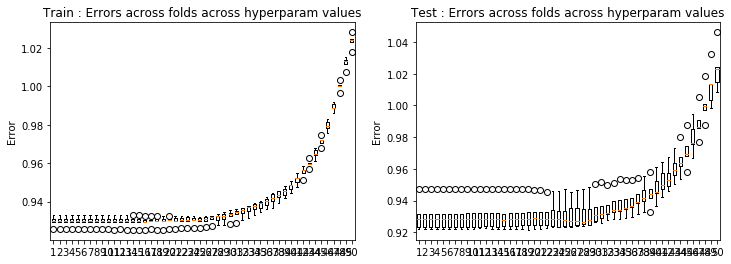

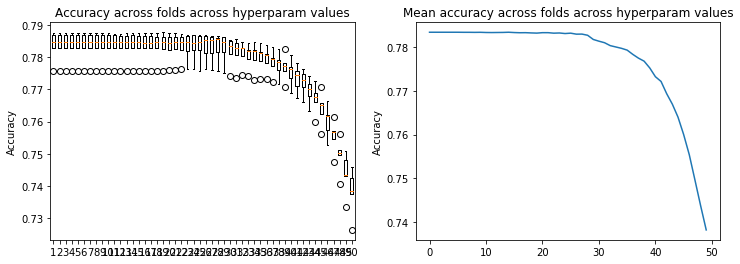

[1.00000000e-08 1.45634848e-08 2.12095089e-08 3.08884360e-08
 4.49843267e-08 6.55128557e-08 9.54095476e-08 1.38949549e-07
 2.02358965e-07 2.94705170e-07 4.29193426e-07 6.25055193e-07
 9.10298178e-07 1.32571137e-06 1.93069773e-06 2.81176870e-06
 4.09491506e-06 5.96362332e-06 8.68511374e-06 1.26485522e-05
 1.84206997e-05 2.68269580e-05 3.90693994e-05 5.68986603e-05
 8.28642773e-05 1.20679264e-04 1.75751062e-04 2.55954792e-04
 3.72759372e-04 5.42867544e-04 7.90604321e-04 1.15139540e-03
 1.67683294e-03 2.44205309e-03 3.55648031e-03 5.17947468e-03
 7.54312006e-03 1.09854114e-02 1.59985872e-02 2.32995181e-02
 3.39322177e-02 4.94171336e-02 7.19685673e-02 1.04811313e-01
 1.52641797e-01 2.22299648e-01 3.23745754e-01 4.71486636e-01
 6.86648845e-01 1.00000000e+00]


In [242]:
result_crossval(loss_tr21,loss_te21)
result_crossval_accuracy(acc21)
print(lambdas)

In [12]:
# test 21: degree 4, rmse, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr21, loss_te21, w21, acc21 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 4, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -5.01998765e+00  3.12660067e-01 -9.11626196e-01
  1.34847115e+00  2.01186606e-01  2.79923299e-01  1.16031240e+00
  3.05841233e-02  9.58635685e-01 -1.96779194e-03 -2.27385264e-03
 -1.17990340e-01  2.32745198e-03  1.46944513e-02  2.63713357e-01
  3.29597539e-03 -1.13578250e-01 -6.99678940e-03 -1.22761955e-03
  1.81906768e+01 -1.31172535e+00  2.82196280e+00 -1.42367911e+00
 -3.99523413e-01 -4.92766207e-02 -2.10195711e+00  9.39973229e-02
 -9.03654302e-01 -2.58378161e-02 -2.44522189e-02 -2.14321363e-02
 -7.21539218e-02  5.93938130e-04 -6.91520631e-01 -5.73546434e-03
  4.56959903e-01  1.96235981e-01 -1.26014716e-02 -2.15495169e+01
  1.07604669e+00 -4.21443681e+00 -2.59204276e-01  3.08615741e-01
 -1.97280652e-01  1.83971338e+00  3.77383673e-02  3.23933325e-01
  4.42705934e-03  2.1278

Ridge regression: w=[-2.78727907e-01 -4.99119910e+00  2.83944477e-01 -9.80052703e-01
  1.40435056e+00  1.95994685e-01  4.68105766e-01  1.01982798e+00
  1.94167742e-02  9.93864337e-01 -5.90538657e-04  2.70711571e-03
  2.72585406e-01 -1.53781502e-03  7.06497265e-03  2.50675284e-01
  7.61329555e-03 -1.78140061e-01 -2.52585944e-03 -2.99122097e-03
  1.81768016e+01 -1.15935854e+00  2.99204660e+00 -1.53937114e+00
 -4.03080806e-01 -5.76855969e-01 -1.69903003e+00  7.96095626e-02
 -1.01370683e+00 -2.53648640e-02 -1.07190176e-02 -1.17225880e+00
 -7.05035046e-02  9.83213808e-03 -6.29249330e-01  5.82191658e-03
  7.44750947e-01  1.88917789e-01  2.64060065e-03 -2.16220276e+01
  8.13132684e-01 -4.33589644e+00 -2.02180783e-01  3.43077577e-01
  3.50370278e-01  1.42378059e+00  4.50968908e-02  3.87248503e-01
  3.23580997e-03 -4.34945827e-03  1.11211073e+00 -1.62586762e-03
 -8.29715257e-03  5.04428306e-01 -1.86572377e-03 -1.01586939e+00
  2.31135870e-03  5.84197405e-04  8.53336200e+00 -8.99653593e-02
  2.1

Ridge regression: w=[-2.76819776e-01 -5.01732735e+00  2.67784001e-01 -8.99961368e-01
  1.39968914e+00  1.69940273e-01  4.25192300e-01  1.14244829e+00
  1.85296032e-02  8.94707494e-01 -5.31764672e-03 -7.02226189e-05
  1.61553412e-01  3.08233138e-03  1.52164902e-02  2.33237862e-01
  9.46899758e-03 -2.30532734e-01 -9.32497439e-03  3.82550779e-03
  1.82343365e+01 -1.09113888e+00  2.85040952e+00 -1.62912257e+00
 -2.85218836e-01 -4.74618110e-01 -2.14471388e+00  9.35955173e-02
 -8.22710637e-01 -2.07682047e-02 -1.38681521e-02 -8.19087499e-01
 -6.79921918e-02  4.09664830e-03 -5.36238584e-01  2.19274404e-03
  9.22768878e-01  1.93576756e-01  2.90781492e-03 -2.16320244e+01
  7.18923025e-01 -4.26752224e+00 -6.91980146e-02  1.76401515e-01
  2.52517054e-01  1.96267905e+00  4.69563980e-02  2.70830702e-01
  8.60734405e-03  1.15549049e-03  7.37045089e-01 -8.69434856e-03
 -1.59481182e-02  3.42829072e-01 -3.96938287e-03 -1.19820838e+00
  9.95836760e-03 -3.66105989e-03  8.51343983e+00 -4.80498867e-02
  2.1

Ridge regression: w=[-2.75017643e-01 -5.00886990e+00  2.68061253e-01 -9.18640394e-01
  1.43741607e+00  1.87693072e-01  5.33416793e-01  1.38335844e+00
  9.06233627e-03  9.96609172e-01 -5.68411684e-03 -3.03644133e-03
 -1.77460106e-01  8.12017010e-04  8.92474676e-03  2.59567076e-01
  1.46726489e-03 -1.13855677e-01 -7.63280450e-03  2.18022178e-03
  1.82085716e+01 -1.11918933e+00  2.95246650e+00 -1.81839856e+00
 -4.00032930e-01 -7.31588081e-01 -2.32743704e+00  9.70197525e-02
 -7.52432144e-01 -2.95643220e-02 -1.23843401e-02 -1.76637893e-01
 -6.70284434e-02  1.63339710e-02 -6.35113727e-01  9.41152297e-03
  4.88051081e-01  1.94126527e-01  1.91751946e-03 -2.16171331e+01
  7.82583199e-01 -4.41287627e+00  2.01917054e-01  3.82849886e-01
  4.60250334e-01  1.88414531e+00  5.44110506e-02  6.93899399e-02
  6.43207884e-03  1.69179500e-03  2.31166918e-01 -3.61295335e-03
 -1.05092811e-02  4.68113023e-01  1.69518631e-03 -6.47492599e-01
  6.02674665e-03 -6.31203699e-03  8.51589554e+00 -8.58577223e-02
  2.1

Ridge regression: w=[-2.78869221e-01 -5.02626912e+00  2.55237041e-01 -1.03137623e+00
  1.49630276e+00  1.59360318e-01  2.15405530e-01  1.09528344e+00
  1.80384193e-02  1.04221301e+00 -3.41166049e-03  2.48802792e-03
 -6.51535130e-02 -2.34683883e-03  1.49509629e-02  2.45288646e-01
  2.08573664e-03 -2.61237493e-01 -7.31928219e-03  4.74326262e-03
  1.82299324e+01 -1.07005370e+00  3.19597838e+00 -1.81969959e+00
 -2.63201198e-01  2.13045052e-01 -1.96487955e+00  9.20608153e-02
 -1.20164425e+00 -2.37094253e-02 -1.38782626e-02 -1.97894636e-01
 -7.54702340e-02  9.74905943e-04 -6.00749620e-01 -3.27149147e-03
  9.80258436e-01  1.90615964e-01 -1.00724523e-03 -2.16009271e+01
  7.22131683e-01 -4.60453087e+00  8.68481057e-02  1.57807962e-01
 -5.24920218e-01  1.72350844e+00  4.95852022e-02  6.25565983e-01
  4.97024594e-03 -3.68493554e-03  1.51058571e-01 -1.70771357e-03
 -1.72061933e-02  4.61927476e-01  1.64039467e-03 -1.24237434e+00
  6.11159188e-03 -6.22766384e-03  8.49823699e+00 -6.05847005e-02
  2.2

Ridge regression: w=[-2.76431019e-01 -4.97402913e+00  3.11375072e-01 -9.23482042e-01
  1.32487748e+00  2.00898478e-01  2.79145596e-01  1.07955318e+00
  3.04470238e-02  9.04894921e-01 -1.96640819e-03 -2.27118230e-03
 -7.33610979e-02  2.32102710e-03  1.46945804e-02  2.63218552e-01
  3.29090113e-03 -1.11276025e-01 -6.98621755e-03 -1.22343935e-03
  1.80341913e+01 -1.30718819e+00  2.86727032e+00 -1.35935132e+00
 -3.98512270e-01 -4.69901711e-02 -1.95368965e+00  9.41420610e-02
 -8.18399973e-01 -2.58027037e-02 -2.44136735e-02 -9.06530548e-02
 -7.21736978e-02  6.17631486e-04 -6.88112023e-01 -5.74235057e-03
  4.49561949e-01  1.96329516e-01 -1.25761153e-02 -2.13634135e+01
  1.07025968e+00 -4.26981623e+00 -3.21264369e-01  3.07276625e-01
 -1.99471192e-01  1.70937100e+00  3.79624870e-02  2.58217864e-01
  4.43152110e-03  2.11984212e-03 -1.85134330e-02 -7.65333036e-03
 -1.41704495e-02  5.79796051e-01  4.24317656e-04 -5.81872447e-01
  2.50799631e-03 -7.39478647e-04  8.40219462e+00 -2.27527197e-01
  2.1

Ridge regression: w=[-2.78727802e-01 -4.92533508e+00  2.82190090e-01 -9.94402630e-01
  1.36686515e+00  1.95505859e-01  4.59047750e-01  9.45091776e-01
  1.92480389e-02  9.41113347e-01 -6.04880098e-04  2.71255739e-03
  2.94577491e-01 -1.53986465e-03  7.08125272e-03  2.49930763e-01
  7.61082177e-03 -1.72116164e-01 -2.51209251e-03 -2.97883176e-03
  1.79518112e+01 -1.15294584e+00  3.04911825e+00 -1.43671210e+00
 -4.01361657e-01 -5.49938610e-01 -1.56019229e+00  7.98417738e-02
 -9.23990401e-01 -2.53293162e-02 -1.06893972e-02 -1.17905147e+00
 -7.05586166e-02  9.88266114e-03 -6.24197134e-01  5.79985907e-03
  7.25504550e-01  1.89056341e-01  2.65669143e-03 -2.13533957e+01
  8.04768150e-01 -4.40672955e+00 -3.01878850e-01  3.40786416e-01
  3.22398533e-01  1.30041822e+00  4.53780046e-02  3.13794084e-01
  3.25895660e-03 -4.35915448e-03  1.09936033e+00 -1.62390266e-03
 -8.31138484e-03  4.97766271e-01 -1.85412177e-03 -9.94340296e-01
  2.29454829e-03  5.68788574e-04  8.42396415e+00 -8.64943327e-02
  2.1

Ridge regression: w=[-2.76819625e-01 -4.92084024e+00  2.65375238e-01 -9.23333455e-01
  1.34608943e+00  1.69627043e-01  4.11319551e-01  1.00541828e+00
  1.83021354e-02  8.04041635e-01 -5.34453762e-03 -1.12060773e-05
  2.16841252e-01  3.09083076e-03  1.52718952e-02  2.32367949e-01
  9.50334852e-03 -2.20584852e-01 -9.29639440e-03  3.91145896e-03
  1.79053608e+01 -1.08272126e+00  2.94147859e+00 -1.48224226e+00
 -2.84118023e-01 -4.33796745e-01 -1.89097351e+00  9.38931303e-02
 -6.77058946e-01 -2.06810982e-02 -1.38192423e-02 -8.75587522e-01
 -6.80442780e-02  4.11558730e-03 -5.29464700e-01  2.19264256e-03
  8.90938530e-01  1.93783064e-01  2.95611640e-03 -2.12403730e+01
  7.08230521e-01 -4.37977212e+00 -2.11699712e-01  1.74863834e-01
  2.10382019e-01  1.73813520e+00  4.73517041e-02  1.56703984e-01
  8.64744772e-03  1.09766215e-03  7.59602380e-01 -8.69495164e-03
 -1.59921936e-02  3.33747337e-01 -3.98584016e-03 -1.16263629e+00
  9.93247995e-03 -3.73320602e-03  8.35440701e+00 -4.37451246e-02
  2.1

Ridge regression: w=[-2.75017324e-01 -4.81060139e+00  2.62844092e-01 -9.57105967e-01
  1.32303301e+00  1.86439375e-01  4.93359350e-01  1.09886829e+00
  8.59366403e-03  8.15537217e-01 -5.71221854e-03 -3.05566163e-03
 -3.81165515e-02  7.94500900e-04  9.02302979e-03  2.57234211e-01
  1.51035325e-03 -1.00561899e-01 -7.60066322e-03  2.26215142e-03
  1.75312042e+01 -1.10061724e+00  3.11147842e+00 -1.50537669e+00
 -3.95624079e-01 -6.13655418e-01 -1.80215478e+00  9.76016277e-02
 -4.73383809e-01 -2.93517225e-02 -1.22188753e-02 -3.67661637e-01
 -6.71923618e-02  1.64440666e-02 -6.19650790e-01  9.37486206e-03
  4.46166458e-01  1.94534821e-01  2.06730185e-03 -2.08089292e+01
  7.58928978e-01 -4.61343380e+00 -1.01879585e-01  3.76759401e-01
  3.38575014e-01  1.42154111e+00  5.52584888e-02 -1.41316343e-01
  6.49484497e-03  1.69913675e-03  3.55524376e-01 -3.60560012e-03
 -1.06082587e-02  4.47633366e-01  1.67751542e-03 -6.00968880e-01
  5.98455625e-03 -6.36841641e-03  8.18695794e+00 -7.62334788e-02
  2.2

Ridge regression: w=[-2.78868750e-01 -4.74344738e+00  2.47401953e-01 -1.08285106e+00
  1.33104720e+00  1.58358770e-01  2.34776981e-01  7.56446967e-01
  1.74289329e-02  8.01731015e-01 -3.49855068e-03  2.60392459e-03
  9.67344354e-02 -2.38816947e-03  1.50900257e-02  2.42329075e-01
  2.10847656e-03 -2.33536039e-01 -7.23560285e-03  4.84282674e-03
  1.72666192e+01 -1.04175480e+00  3.41102631e+00 -1.37188933e+00
 -2.59030283e-01  1.57689015e-01 -1.34081597e+00  9.30543773e-02
 -8.00104957e-01 -2.34230780e-02 -1.36240477e-02 -4.16746070e-01
 -7.56172083e-02  1.09411904e-03 -5.80335417e-01 -3.34182154e-03
  8.90787783e-01  1.91220513e-01 -7.89206152e-04 -2.04536356e+01
  6.85508473e-01 -4.87541481e+00 -3.43756863e-01  1.51274505e-01
 -4.68418715e-01  1.17245354e+00  5.07113332e-02  3.03453851e-01
  5.09424819e-03 -3.81935509e-03  2.94725117e-01 -1.65110403e-03
 -1.73174496e-02  4.35243695e-01  1.64391876e-03 -1.14138165e+00
  6.05040727e-03 -6.31282472e-03  8.03175298e+00 -4.54964541e-02
  2.3

Ridge regression: w=[-2.76430028e-01 -4.42909391e+00  2.95909691e-01 -1.03050032e+00
  1.05430352e+00  1.97262195e-01  2.79402774e-01  6.07745323e-01
  2.90959040e-02  5.99717342e-01 -1.93854629e-03 -2.27725334e-03
  1.44372501e-01  2.23483559e-03  1.46962153e-02  2.56250336e-01
  3.19877430e-03 -8.57799772e-02 -6.84353837e-03 -1.19746814e-03
  1.61802184e+01 -1.25135989e+00  3.29734348e+00 -6.47936211e-01
 -3.85837579e-01 -4.85408510e-02 -1.07346368e+00  9.57111834e-02
 -3.35013991e-01 -2.53993155e-02 -2.39042514e-02 -3.76757950e-01
 -7.23870769e-02  9.84092980e-04 -6.44198155e-01 -5.86244509e-03
  3.68680402e-01  1.97453491e-01 -1.22116759e-02 -1.91587285e+01
  9.97909906e-01 -4.80201871e+00 -9.84061390e-01  2.90478126e-01
 -1.97110330e-01  9.26857186e-01  4.04282967e-02 -1.13045876e-01
  4.49042925e-03  2.06170129e-03  1.60530619e-01 -7.60976881e-03
 -1.42166131e-02  5.22704906e-01  5.70549277e-04 -4.91289553e-01
  2.42709519e-03 -8.08866329e-04  7.50693911e+00 -1.97510381e-01
  2.3

Ridge regression: w=[-2.78726348e-01 -4.18947448e+00  2.62675049e-01 -1.10267000e+00
  9.79025637e-01  1.89584181e-01  3.95254799e-01  5.64685795e-01
  1.78106475e-02  6.72923143e-01 -7.30206119e-04  2.70096003e-03
  3.10635669e-01 -1.55778952e-03  7.23786316e-03  2.40271139e-01
  7.55888729e-03 -1.11665443e-01 -2.36780570e-03 -2.91666473e-03
  1.54400570e+01 -1.07983472e+00  3.51967157e+00 -4.26623661e-01
 -3.80591306e-01 -3.59090857e-01 -8.33400757e-01  8.23462222e-02
 -4.51198985e-01 -2.49463998e-02 -1.03317699e-02 -9.41506888e-01
 -7.12230177e-02  1.05186491e-02 -5.64074789e-01  5.51211513e-03
  5.33639266e-01  1.90741092e-01  2.96098641e-03 -1.83540745e+01
  7.07710537e-01 -5.00288778e+00 -1.23669452e+00  3.13046653e-01
  1.20649924e-01  6.41401470e-01  4.82361432e-02 -8.26409582e-02
  3.50144614e-03 -4.40532638e-03  7.52199843e-01 -1.62032345e-03
 -8.46526748e-03  4.19453249e-01 -1.71727943e-03 -7.80526360e-01
  2.11632167e-03  4.73105761e-04  7.20190664e+00 -4.57661695e-02
  2.3

Ridge regression: w=[-2.76817521e-01 -3.93218747e+00  2.40225851e-01 -1.05856480e+00
  8.43481465e-01  1.66120356e-01  3.37679559e-01  4.66559601e-01
  1.67815255e-02  4.74289337e-01 -5.54990627e-03  4.83752984e-04
  3.05362696e-01  3.18054993e-03  1.58310709e-02  2.21034847e-01
  9.80002512e-03 -1.29875174e-01 -9.03374321e-03  4.74979719e-03
  1.45378347e+01 -9.91385652e-01  3.54361691e+00 -1.99786421e-01
 -2.71499408e-01 -2.16496459e-01 -8.55182924e-01  9.67519648e-02
 -1.52265971e-01 -1.98574126e-02 -1.32348216e-02 -7.38599655e-01
 -6.86241658e-02  4.43944452e-03 -4.53633667e-01  2.12109179e-03
  6.01987125e-01  1.96138455e-01  3.56841747e-03 -1.72302364e+01
  5.88908161e-01 -5.14624891e+00 -1.37193804e+00  1.56779031e-01
 -1.85399655e-02  7.98139344e-01  5.08489516e-02 -2.51801746e-01
  9.04401162e-03  6.18173010e-04  4.76463122e-01 -8.77515627e-03
 -1.64873520e-02  2.34292509e-01 -4.12987945e-03 -8.40443772e-01
  9.68731064e-03 -4.43068084e-03  6.72487383e+00  5.30737294e-03
  2.4

Ridge regression: w=[-2.75012891e-01 -3.19887863e+00  2.20262339e-01 -9.96884469e-01
  5.45372271e-01  1.72963494e-01  3.67898845e-01  4.77748001e-01
  6.73949758e-03  4.84362716e-01 -5.73246867e-03 -3.39042596e-03
  1.10168424e-01  6.52909679e-04  9.77961102e-03  2.32887663e-01
  1.75646981e-03 -2.05331210e-02 -7.35087885e-03  2.82425165e-03
  1.20381648e+01 -9.40600117e-01  3.53269207e+00  3.56397723e-01
 -3.48421583e-01 -2.39958382e-01 -5.99746793e-01  1.02005182e-01
 -1.74940880e-02 -2.77419321e-02 -1.07641740e-02 -3.66544845e-01
 -6.85285223e-02  1.76571006e-02 -4.79849628e-01  8.90581229e-03
  1.99613946e-01  1.98552294e-01  3.82778975e-03 -1.42544839e+01
  5.46280212e-01 -5.22941218e+00 -1.67472647e+00  3.12076460e-01
 -6.05092573e-02  3.29591208e-01  6.08139178e-02 -4.43923908e-01
  6.93825716e-03  1.91797714e-03  2.01347313e-01 -3.61875702e-03
 -1.14127882e-02  2.66558036e-01  1.61272975e-03 -3.30137847e-01
  5.64034208e-03 -6.64666811e-03  5.51648334e+00  1.28735644e-02
  2.5

Ridge regression: w=[-2.78862204e-01 -2.78455816e+00  1.92754985e-01 -1.01185771e+00
  4.25558819e-01  1.49404452e-01  3.12248351e-01  2.54643651e-01
  1.66722800e-02  4.47860279e-01 -3.95249492e-03  3.35156804e-03
  1.75201958e-01 -2.55302056e-03  1.62483636e-02  2.14216668e-01
  2.28596403e-03 -7.22365663e-02 -6.80296214e-03  5.61510186e-03
  1.06084790e+01 -8.33926563e-01  3.54959309e+00  6.49752783e-01
 -2.22728080e-01 -4.68889034e-02 -3.48159559e-01  9.91833238e-02
 -1.76953203e-01 -2.17056805e-02 -1.13783316e-02 -3.30493696e-01
 -7.67755911e-02  2.55738752e-03 -4.19783069e-01 -3.93131863e-03
  3.76402924e-01  1.96373646e-01  1.69240079e-03 -1.25179948e+01
  4.06553789e-01 -5.19171240e+00 -1.90331919e+00  9.51834124e-02
 -2.91709468e-01  2.49592753e-01  5.61589533e-02 -2.04438025e-01
  5.91358966e-03 -4.67776272e-03  1.07476041e-01 -1.44977746e-03
 -1.82975551e-02  2.30170645e-01  1.59017363e-03 -5.65312832e-01
  5.66818282e-03 -6.77892045e-03  4.79904685e+00  7.21286649e-02
  2.4

Ridge regression: w=[-2.76416265e-01 -1.86118337e+00  2.07236714e-01 -6.93538392e-01
  1.24342368e-01  1.70075118e-01  3.02625837e-01  2.15620771e-01
  2.70278052e-02  3.97663148e-01 -1.22286390e-03 -1.96033170e-03
  1.64563177e-01  1.94369340e-03  1.55500228e-02  2.06374625e-01
  3.01104353e-03  5.85873694e-03 -6.08624642e-03 -4.15976954e-04
  7.47327067e+00 -9.07627720e-01  2.68735445e+00  9.96508880e-01
 -2.90921014e-01 -9.90945912e-02 -2.40211125e-01  1.01843629e-01
 -4.38327658e-02 -2.38124160e-02 -2.07420451e-02 -2.40849855e-01
 -7.28025835e-02  3.62548123e-03 -3.92135254e-01 -7.11158583e-03
  9.19930381e-02  2.04479888e-01 -9.28505570e-03 -8.79404893e+00
  5.31756547e-01 -4.28192308e+00 -1.78397699e+00  1.62846854e-01
 -1.89524217e-01  1.24304853e-01  4.96647122e-02 -2.90183707e-01
  4.48970396e-03  1.43583160e-03 -3.68572568e-02 -7.70804471e-03
 -1.53058086e-02  2.05158043e-01  8.90800016e-04 -1.89999685e-01
  1.89182420e-03 -1.47251745e-03  3.28658575e+00  2.66878202e-03
  2.1

Ridge regression: w=[-2.78706137e-01 -1.42431243e+00  1.79401740e-01 -5.40317967e-01
  4.15153217e-02  1.52965652e-01  3.43946668e-01  2.55922134e-01
  1.80586553e-02  4.76694230e-01 -4.95911272e-04  2.49698632e-03
  1.35860365e-01 -1.61441140e-03  8.27514713e-03  1.89181630e-01
  7.32671640e-03  4.33117101e-02 -1.82498859e-03 -2.50000891e-03
  6.03190705e+00 -7.44742017e-01  2.23376621e+00  9.88435471e-01
 -2.53287857e-01 -1.70505334e-01 -1.76850010e-01  9.06762642e-02
 -1.28228654e-01 -2.37614644e-02 -8.96338840e-03 -2.88595689e-01
 -7.41264793e-02  1.30946150e-02 -3.05919427e-01  3.80539196e-03
  5.75656174e-02  1.99823475e-01  6.15199594e-03 -7.10305033e+00
  2.42561003e-01 -3.71705467e+00 -1.60120689e+00  1.43293085e-01
 -1.45397827e-01  6.26218858e-03  5.57158336e-02 -3.01904190e-01
  3.89395605e-03 -4.59387411e-03  4.37003665e-02 -1.82759612e-03
 -9.59602321e-03  9.51831274e-02 -1.25898002e-03 -2.59067535e-01
  1.47222297e-03  1.32422885e-04  2.60243330e+00  1.55229119e-01
  1.8

Ridge regression: w=[-2.76788290e-01 -1.04736293e+00  1.52070264e-01 -3.07989619e-01
 -5.46645012e-02  1.44959155e-01  3.19157635e-01  1.52728394e-01
  1.82442870e-02  3.64211370e-01 -5.01667558e-03  1.83765678e-03
  1.75917404e-01  3.31276555e-03  1.85395530e-02  1.79511134e-01
  1.08812730e-02  4.38182221e-02 -8.47494178e-03  8.06431062e-03
  4.75118908e+00 -6.48711147e-01  1.67640411e+00  9.04755636e-01
 -1.93739423e-01 -1.29594775e-01 -1.37563372e-01  1.03772379e-01
 -4.51408566e-02 -1.80029696e-02 -1.10174638e-02 -2.51065010e-01
 -7.02619117e-02  5.47764670e-03 -2.29941382e-01  1.28549257e-03
  5.70025838e-02  2.06220599e-01  6.77826701e-03 -5.56115150e+00
  1.21785799e-01 -3.18883976e+00 -1.24903628e+00  4.52402751e-02
 -1.82679519e-01  8.27871632e-02  5.74687324e-02 -2.60800346e-01
  9.68186950e-03 -6.36819920e-04 -4.96155746e-02 -9.57068243e-03
 -1.91472559e-02 -4.25809324e-02 -4.71371155e-03 -2.36489689e-01
  9.18011061e-03 -6.98788868e-03  1.96764955e+00  2.03392624e-01
  1.6

Ridge regression: w=[-2.74951306e-01 -4.33638770e-01  1.20746973e-01  1.16083580e-02
 -1.02034601e-01  1.22588504e-01  3.42611392e-01  1.94777362e-01
  7.56904625e-03  3.93344618e-01 -4.81298322e-03 -4.21524314e-03
  9.56682323e-02  5.71196619e-04  1.13954497e-02  1.78638436e-01
  2.25259203e-03  6.01867584e-02 -6.97375325e-03  3.95002429e-03
  2.69187639e+00 -5.56113269e-01  7.07518375e-01  6.54222339e-01
 -1.72582228e-01 -1.56031659e-01 -9.60338003e-02  1.05377007e-01
 -5.53990791e-02 -2.55850062e-02 -7.53338783e-03 -1.53513314e-01
 -7.07546984e-02  2.05923722e-02 -2.29188168e-01  7.65265411e-03
 -2.34597964e-02  2.08410192e-01  8.96712644e-03 -3.11708495e+00
  2.70304476e-02 -2.06689853e+00 -6.67811228e-01  7.71756966e-02
 -2.00393548e-01 -8.44750100e-02  6.85437348e-02 -2.44219675e-01
  7.21944125e-03  2.41840381e-03 -5.86436308e-02 -4.04345863e-03
 -1.31620856e-02 -4.10068049e-02  1.38820163e-03 -9.92544994e-02
  5.01630716e-03 -6.91086047e-03  9.70323767e-01  2.34430508e-01
  1.2

Ridge regression: w=[-2.78771269e-01 -2.36307540e-01  9.99678321e-02  6.05556406e-02
 -8.32406863e-02  1.25640487e-01  3.50358622e-01  8.95616419e-02
  1.95615787e-02  3.56542466e-01 -4.08592924e-03  4.78325595e-03
  1.30335279e-01 -2.44899855e-03  1.86142305e-02  1.64037223e-01
  2.49953552e-03  5.64445915e-02 -6.62674021e-03  7.53095215e-03
  2.01881156e+00 -4.83660197e-01  4.41875710e-01  5.48956604e-01
 -1.36876814e-01 -1.54704657e-01 -3.18637006e-02  1.01493529e-01
 -8.64946459e-02 -2.06451595e-02 -7.06124246e-03 -1.39188898e-01
 -7.84477410e-02  5.62474728e-03 -1.96613354e-01 -5.01581739e-03
 -1.80564837e-02  2.05378204e-01  7.50347227e-03 -2.29618177e+00
 -5.80238511e-02 -1.64916026e+00 -4.85675134e-01 -2.44733487e-02
 -2.26895920e-01 -2.90653833e-02  6.16643986e-02 -1.81840685e-01
  6.78205339e-03 -6.08574550e-03 -7.94218297e-02 -1.66802352e-03
 -2.02725526e-02 -3.90668415e-02  1.61841273e-03 -1.30982861e-01
  5.32362382e-03 -7.79759434e-03  6.27498081e-01  2.66669574e-01
  1.0

Ridge regression: w=[-2.76225164e-01  5.71329971e-02  7.82377509e-02  1.40746848e-01
 -4.50695241e-02  1.24111257e-01  2.83441179e-01  6.22280143e-02
  2.21889067e-02  3.37110157e-01  4.66620785e-05 -8.81832749e-04
  1.59245316e-01  1.93975285e-03  1.70099744e-02  1.48449874e-01
  2.88763138e-03  5.40763802e-02 -5.47492572e-03  8.86006152e-04
  1.06261779e+00 -4.48615552e-01  5.33960335e-03  3.76920866e-01
 -1.41464677e-01 -1.04666040e-01 -9.67956105e-03  9.41472632e-02
 -4.83950103e-02 -2.40178379e-02 -1.77287541e-02 -1.40106959e-01
 -7.26787369e-02  6.20384409e-03 -1.73693141e-01 -8.24608124e-03
 -3.22912375e-02  2.10162935e-01 -5.44474466e-03 -1.21768546e+00
 -4.67465120e-02 -1.00191539e+00 -2.10312494e-01 -2.16523184e-02
 -1.56508157e-01 -2.18568733e-02  6.13086699e-02 -1.55459690e-01
  4.05951773e-03  2.68969816e-04 -1.20329383e-01 -8.24611379e-03
 -1.69051874e-02 -4.62438059e-02  1.00380111e-03 -6.44029769e-02
  1.36209343e-03 -2.34589066e-03  2.09753656e-01  2.41600109e-01
  7.1

Ridge regression: w=[-2.78425619e-01  1.46447884e-01  8.06409279e-02  1.36236729e-01
 -1.30065603e-02  1.08384673e-01  2.90491196e-01  5.65053350e-02
  1.41525276e-02  3.40247615e-01  3.04553619e-04  2.61617235e-03
  1.45178400e-01 -1.45525287e-03  9.33381288e-03  1.44817997e-01
  6.51565111e-03  8.44942656e-02 -1.52790507e-03 -2.07896232e-03
  7.79736459e-01 -4.27540074e-01 -8.04247196e-02  2.87163865e-01
 -1.12579921e-01 -1.03200130e-01  1.16335983e-02  8.16746830e-02
 -6.68025960e-02 -2.44875872e-02 -8.29506733e-03 -1.35029783e-01
 -7.59270031e-02  1.42099763e-02 -1.55826490e-01  3.05721247e-03
 -7.46934442e-02  2.04688111e-01  9.43340842e-03 -8.90526469e-01
 -1.20885734e-01 -7.69899244e-01 -1.51152667e-01 -2.33439821e-02
 -1.49295653e-01 -2.52995677e-02  6.52057509e-02 -1.56678229e-01
  3.55662645e-03 -4.91947475e-03 -1.06646342e-01 -2.30239453e-03
 -1.06534218e-02 -6.35967835e-02 -4.85771427e-04 -9.49305553e-02
  1.01099655e-03 -1.66400005e-04  7.77026378e-02  2.91114523e-01
  5.7

Ridge regression: w=[-2.75795995e-01  2.61659200e-01  2.80603575e-02  1.04606927e-01
  5.65585964e-02  1.06256879e-01  2.30074742e-01  1.14198149e-02
  1.82286757e-02  2.86656070e-01  3.78500066e-04 -6.47512250e-04
  1.45767085e-01  1.84289047e-03  1.67033981e-02  1.24824785e-01
  2.54828689e-03  5.33084242e-02 -5.30436198e-03  7.62679647e-04
  4.08202669e-01 -3.44429526e-01 -1.90267975e-01  1.80437037e-01
 -1.04039985e-01 -5.13697997e-02  1.51285101e-02  8.21224015e-02
 -1.26813261e-02 -2.44649133e-02 -1.71375295e-02 -9.08516580e-02
 -7.18005301e-02  6.21723163e-03 -1.33215094e-01 -8.04155094e-03
 -3.38602206e-02  2.08142416e-01 -4.66061134e-03 -4.93155016e-01
 -9.98280413e-02 -4.72948656e-01 -6.53690300e-02 -4.00080957e-02
 -1.04908513e-01 -3.71935984e-04  6.66982578e-02 -1.06504006e-01
  3.86995958e-03  1.00990545e-04 -1.01019727e-01 -8.32466013e-03
 -1.66642840e-02 -5.96011521e-02  1.26604510e-03 -4.93123652e-02
  1.20486463e-03 -2.21021887e-03 -6.65538172e-02  2.37645285e-01
  3.9

Ridge regression: w=[-0.27793715  0.29190827  0.0117003   0.08583091  0.07959768  0.09862454
  0.23423319 -0.01153694  0.01471815  0.25761013 -0.00348858  0.00475954
  0.12558397 -0.00260718  0.01766058  0.12000265  0.00164296  0.05640003
 -0.0064264   0.00696264  0.31251501 -0.31359923 -0.18853557  0.13026205
 -0.08299278 -0.04528396  0.02097443  0.08022986 -0.01254025 -0.02134463
 -0.00614922 -0.05902285 -0.0769329   0.00546526 -0.12082311 -0.00435722
 -0.04418532  0.20263435  0.00837573 -0.37431813 -0.11954103 -0.3687516
 -0.05427831 -0.04465749 -0.10677752  0.00765774  0.06990177 -0.09110441
  0.00655763 -0.00613418 -0.07677974 -0.00168064 -0.01948938 -0.06241394
  0.00236744 -0.05797651  0.00499807 -0.00740455 -0.11851453  0.23952607
  0.31583703 -0.05499508  0.05975757  0.02331374 -0.01121158 -0.06810448
 -0.00230243 -0.01849986  0.00795181  0.02832127  0.01125276 -0.00233685
  0.08713001  0.00413976  0.03104752 -0.05758538 -0.00837984]
Ridge regression: w=[-2.75894530e-01  2.951

Ridge regression: w=[-2.74478739e-01  3.14974032e-01 -3.71114185e-02  3.28361184e-02
  1.18286359e-01  8.15757341e-02  1.76928319e-01 -1.79791817e-02
  1.90747873e-02  2.24608243e-01  7.27430211e-04 -9.87470263e-04
  1.09069807e-01  1.40607273e-03  1.52171172e-02  8.85144944e-02
  2.06525766e-03  4.31114500e-02 -5.08046747e-03 -2.57425209e-05
  1.76724478e-01 -2.45574838e-01 -1.70612156e-01  9.43227064e-02
 -6.53821217e-02  2.71830432e-03  1.48053437e-02  6.44067741e-02
  3.09251448e-02 -2.38146102e-02 -1.58770534e-02 -3.24957299e-02
 -6.83432922e-02  5.55910213e-03 -8.39252159e-02 -7.61466655e-03
 -1.97346232e-02  2.00565012e-01 -4.09051934e-03 -2.36380376e-01
 -8.25479540e-02 -2.23502898e-01 -3.25310586e-02 -3.43462231e-02
 -5.58741238e-02  1.04838477e-02  6.87957825e-02 -5.97036338e-02
  3.65312933e-03  3.66296249e-04 -6.09764216e-02 -8.09680275e-03
 -1.53481307e-02 -4.59542026e-02  1.62977477e-03 -3.39647870e-02
  1.02139363e-03 -1.60241770e-03 -1.53535985e-01  1.81199889e-01
  1.9

Ridge regression: w=[-0.27587019  0.31131098 -0.05008062  0.02366701  0.1165378   0.06745402
  0.1757719  -0.01980845  0.01543261  0.20003709  0.00068785  0.00202708
  0.08981624 -0.00135141  0.00813444  0.07778487  0.00489415  0.04392898
 -0.00145591 -0.00297955  0.14721864 -0.22954818 -0.14067055  0.07579238
 -0.04346603  0.01472266  0.0157856   0.04998162  0.03212673 -0.02371252
 -0.00739522 -0.02078816 -0.06969532  0.01110468 -0.06537331  0.00282502
 -0.02848679  0.19118613  0.00811196 -0.19072606 -0.08234984 -0.17367019
 -0.02897339 -0.02542486 -0.04957657  0.01009058  0.06977574 -0.04945255
  0.00325702 -0.00454576 -0.04693035 -0.00237725 -0.0095658  -0.03960399
  0.00077192 -0.03823021  0.00053497  0.00031696 -0.1686807   0.17408871
  0.1353338  -0.05783212  0.0311008  -0.03100575 -0.00819611 -0.03623179
 -0.04695344 -0.01853025  0.01126446 -0.00723402  0.00452964 -0.00724404
  0.04518756 -0.00079598  0.00748669 -0.04193123 -0.00187509]
Ridge regression: w=[-0.27601008  0.314998

Ridge regression: w=[-0.27048825  0.28761295 -0.09795306  0.01253374  0.12705352  0.0548131
  0.13925655 -0.0341803   0.03196304  0.17147315  0.00120764 -0.00196805
  0.0777307   0.00041908  0.01205035  0.05345621  0.00164674  0.03421002
 -0.00485131 -0.001303    0.10279192 -0.157462   -0.10609226  0.06681011
 -0.02832159  0.03242429  0.00289769  0.04529447  0.05217454 -0.02212171
 -0.01279729  0.00217206 -0.06047439  0.00425038 -0.03381784 -0.00665205
 -0.00527129  0.18085254 -0.00328795 -0.13371074 -0.04647215 -0.11761136
 -0.01866726 -0.02035825 -0.02641791  0.01126237  0.06202751 -0.02906066
  0.00338724  0.00101429 -0.03142287 -0.00741203 -0.01246053 -0.02385494
  0.00190413 -0.02233496  0.00090338 -0.0007092  -0.17142244  0.11116372
  0.06084874 -0.06419283  0.01951503 -0.03930603  0.00419821 -0.03024462
 -0.06534838 -0.01639475  0.00873709 -0.02689906 -0.00195409 -0.00346995
  0.02166357 -0.00182588 -0.01792606 -0.03336692 -0.00246537]
Ridge regression: w=[-2.69105205e-01  2.905

Ridge regression: w=[-2.70085929e-01  2.69225037e-01 -1.07105184e-01  2.24010293e-02
  1.15252859e-01  4.52216428e-02  1.37623255e-01 -3.36549842e-02
  3.32077613e-02  1.50162279e-01  9.41695568e-04  7.10664311e-04
  6.46156824e-02 -1.55156147e-03  6.07772863e-03  4.69810131e-02
  4.17588541e-03  3.10283739e-02 -1.55705760e-03 -3.62928529e-03
  9.27334034e-02 -1.44197617e-01 -7.97028781e-02  5.69878157e-02
 -1.41788948e-02  3.78019642e-02  1.13441941e-03  3.52205838e-02
  4.89016827e-02 -2.24315907e-02 -5.34083755e-03  5.96265436e-03
 -5.97788474e-02  7.61489148e-03 -2.00843362e-02  2.16944125e-03
 -8.40746407e-03  1.67137396e-01  5.98099935e-03 -1.12195747e-01
 -4.27891259e-02 -9.86884163e-02 -1.65049136e-02 -1.36363865e-02
 -2.39972009e-02  9.32853950e-03  5.95819169e-02 -2.21928606e-02
  3.07905100e-03 -3.54117039e-03 -2.36000161e-02 -2.12478377e-03
 -7.71210355e-03 -1.78358367e-02  1.23068118e-03 -2.26033632e-02
  4.22300631e-04  5.47965350e-04 -1.69202421e-01  9.96239719e-02
  2.1

Ridge regression: w=[-2.64494595e-01  2.48954312e-01 -1.19587856e-01  3.23607735e-02
  1.07991206e-01  4.50368171e-02  1.22103598e-01 -3.58237931e-02
  4.06744739e-02  1.38371326e-01 -1.03814957e-03 -1.47171658e-03
  6.03702448e-02  6.58899418e-05  9.91222769e-03  4.15911736e-02
  4.83374915e-03  3.20304759e-02 -6.20033155e-03  1.88145211e-03
  8.06963790e-02 -1.23318253e-01 -6.53430644e-02  5.23806410e-02
 -9.65927614e-03  3.87965584e-02 -1.89829706e-03  3.65584549e-02
  5.18492739e-02 -1.83938507e-02 -3.93125473e-03  1.06985581e-02
 -5.27107830e-02  2.97274894e-03 -1.33676397e-02  1.39476994e-04
 -2.60679613e-03  1.58706982e-01  3.74762562e-03 -9.66049369e-02
 -3.41609365e-02 -9.05587025e-02 -1.18204371e-02 -1.42085245e-02
 -1.77733867e-02  9.16792459e-03  5.56466234e-02 -1.47573705e-02
  7.41244656e-03  1.55791961e-03 -1.83959660e-02 -7.96785820e-03
 -1.16863449e-02 -1.30433297e-02  9.82143630e-04 -2.06186041e-02
  6.66117729e-03 -2.54219396e-03 -1.59374277e-01  8.04574839e-02
 -7.1

Ridge regression: w=[-2.53657829e-01  2.01275017e-01 -1.22881115e-01  4.68359621e-02
  9.85780158e-02  3.02947375e-02  1.04667434e-01 -3.93743254e-02
  5.20995089e-02  1.13891342e-01  1.23029497e-03 -7.94836307e-04
  4.66290022e-02 -1.76492637e-03  3.50624101e-03  3.16831398e-02
  3.80708931e-03  2.70899146e-02 -1.47784877e-03 -3.33204523e-03
  6.35847858e-02 -9.67510382e-02 -3.52173881e-02  4.60394760e-02
  6.34199435e-04  3.97911736e-02 -1.00539509e-02  2.76108879e-02
  4.88107199e-02 -2.22412729e-02 -2.48728869e-03  1.43697838e-02
 -4.78412911e-02  4.17811164e-03  3.19823684e-03  1.34765553e-03
  1.22594721e-03  1.29993179e-01  3.78375031e-03 -6.95539126e-02
 -2.63293249e-02 -7.26627156e-02 -8.29835871e-03 -5.66331482e-03
 -1.05315586e-02  5.25982108e-03  5.02857870e-02 -6.07845784e-03
  2.79789641e-03 -2.38758240e-03 -9.54011009e-03 -1.90711687e-03
 -5.20234514e-03 -4.43950542e-03  1.35231381e-03 -1.54088118e-02
  2.54079724e-04 -2.87386867e-05 -1.35951689e-01  5.00284425e-02
 -4.8

Ridge regression: w=[-2.41988637e-01  1.77253795e-01 -1.21278650e-01  5.11471494e-02
  9.08073635e-02  3.01315411e-02  9.16540899e-02 -3.85975943e-02
  5.61956309e-02  1.04496745e-01  4.46691815e-04 -1.99236247e-03
  4.28794387e-02 -1.76042028e-03  4.75440381e-03  2.72563717e-02
  3.53791899e-03  2.80496011e-02 -4.07335559e-03  1.37522446e-04
  5.50548792e-02 -8.66861281e-02 -2.78859693e-02  4.32001390e-02
  2.32929299e-03  3.72747413e-02 -1.16551194e-02  2.79984645e-02
  4.88101607e-02 -1.97108318e-02 -1.15579811e-03  1.57695699e-02
 -4.19859487e-02  1.91629794e-03  5.56344673e-03 -7.09217506e-04
  3.66680786e-03  1.18461565e-01  1.45409363e-03 -5.90662560e-02
 -2.48861124e-02 -6.93451059e-02 -4.34416677e-03 -6.18818567e-03
 -6.63823704e-03  3.79394421e-03  4.91739870e-02 -8.76386600e-05
  5.70615399e-03  1.42661046e-03 -5.64388558e-03 -6.29920196e-03
 -6.53255609e-03 -6.26189936e-04  1.98972700e-03 -1.44058689e-02
  4.53039005e-03 -1.36577886e-03 -1.20437118e-01  3.77676858e-02
 -6.0

Ridge regression: w=[-2.10695721e-01  1.30762324e-01 -1.04458446e-01  5.01778961e-02
  7.63816974e-02  2.09235917e-02  7.18862802e-02 -3.87710706e-02
  5.84814968e-02  8.50437220e-02  6.31969330e-05 -3.56298560e-03
  3.10267833e-02 -2.39276675e-03  1.76250513e-03  1.77505331e-02
  1.59201351e-03  2.61914884e-02 -2.77619192e-03 -1.17716085e-03
  4.06123590e-02 -7.08652822e-02 -1.60739721e-02  3.80649440e-02
  5.59712804e-03  3.30872202e-02 -1.72546341e-02  2.52613579e-02
  4.44559283e-02 -2.04146793e-02 -2.08475668e-03  1.52295710e-02
 -3.72705158e-02  3.19363493e-03  8.15017394e-03 -1.69595852e-05
  6.79828520e-03  9.44514938e-02 -1.27095029e-03 -4.06062520e-02
 -2.63336420e-02 -5.78688620e-02  1.80308295e-03 -2.09753331e-03
 -2.16925600e-04 -2.08102417e-03  4.87228267e-02  7.33380903e-03
  2.92663235e-03 -1.11633247e-04  1.35015155e-03 -2.24951923e-03
 -3.02731611e-03  4.08901515e-03  1.58451551e-03 -9.59825788e-03
  9.84741895e-04 -2.40907742e-03 -8.96490498e-02  1.44713274e-02
 -6.8

Ridge regression: w=[-1.93042637e-01  1.10485863e-01 -9.51875841e-02  4.50272364e-02
  6.75925715e-02  1.80645832e-02  6.18379246e-02 -3.51385595e-02
  6.03713726e-02  7.41998214e-02  5.48892050e-04 -2.14323853e-03
  2.55046011e-02 -3.17664298e-03  7.40329594e-04  1.56059155e-02
  1.10593579e-03  2.13707812e-02 -2.04883752e-03 -2.32395016e-04
  3.52589214e-02 -6.43658972e-02 -1.21913408e-02  3.41877725e-02
  4.92777136e-03  3.01612004e-02 -1.61924771e-02  2.50463945e-02
  4.14867973e-02 -2.08563066e-02 -7.29198822e-04  1.31814313e-02
 -3.66704639e-02  8.45679408e-04  8.41633204e-03 -3.28070367e-04
  6.16830539e-03  8.28701515e-02  5.23180858e-04 -3.22944584e-02
 -2.74680821e-02 -5.04388692e-02  2.55508264e-03 -1.34366022e-03
  2.63218486e-03 -2.45536652e-03  4.89470910e-02  1.14571321e-02
  2.75344716e-03 -1.60654051e-03  1.65152219e-03 -1.45917855e-03
 -3.26349832e-03  3.69495913e-03  1.37766076e-03 -6.79904709e-03
  1.12783076e-03 -1.69589475e-03 -7.47472597e-02  5.35747950e-03
 -6.4

Ridge regression: w=[-1.42272207e-01  7.17994215e-02 -7.36715853e-02  3.05784810e-02
  5.00991260e-02  1.15382044e-02  4.39797392e-02 -2.89602383e-02
  5.44338975e-02  5.54899131e-02  6.84446830e-04 -1.64978518e-03
  1.39660921e-02 -2.46353497e-03  1.15613597e-03  6.88241348e-03
  1.73792712e-03  1.75039844e-02 -1.76063961e-03 -7.28255743e-04
  2.38529450e-02 -5.28327528e-02 -9.32126289e-03  2.80335292e-02
  4.42391691e-03  2.56733338e-02 -1.54129933e-02  2.22657499e-02
  3.52804786e-02 -1.91213123e-02 -1.69666498e-03  7.79140383e-03
 -2.91154061e-02  7.84621985e-04  5.08208645e-03 -2.72847718e-03
  7.65820959e-03  6.41962790e-02 -1.19154926e-03 -1.84271247e-02
 -2.90788287e-02 -3.71344147e-02  7.08320119e-03  6.57928214e-04
  9.18212369e-03 -5.10314519e-03  4.57141654e-02  1.59267423e-02
  1.47878484e-03 -2.46572238e-04  1.94513326e-03 -3.14115478e-03
 -8.40715092e-04  3.61485499e-03  9.67641785e-04 -1.21640882e-03
 -5.60350665e-04 -7.75012809e-04 -4.59100064e-02 -8.55466519e-03
 -4.9

Ridge regression: w=[-1.17443301e-01  5.67294356e-02 -6.31723642e-02  2.47382811e-02
  4.00788573e-02  9.22589696e-03  3.74008223e-02 -2.50253694e-02
  4.84639948e-02  4.58954374e-02  6.77664046e-04 -1.72057122e-03
  9.71899980e-03 -1.36133794e-03  3.42499871e-04  4.10497206e-03
  2.38250174e-03  1.49101382e-02 -2.75132320e-04 -1.10529298e-03
  1.96649796e-02 -4.75428387e-02 -7.03298901e-03  2.29150418e-02
  4.50465102e-03  2.33771102e-02 -1.43530255e-02  2.12653453e-02
  3.09200994e-02 -1.89251529e-02  6.26370934e-05  5.54394543e-03
 -2.72100887e-02  2.48430746e-04  3.78547563e-03  6.16234791e-05
  7.49032573e-03  5.49025648e-02  9.84756951e-04 -1.27961685e-02
 -2.90156863e-02 -2.96582326e-02  6.75074010e-03  1.63646111e-03
  1.05822826e-02 -6.20523437e-03  4.14359175e-02  1.65814560e-02
  1.07354966e-03 -1.25582485e-03  1.53213203e-03 -1.41222875e-03
 -9.77357051e-04  3.35121544e-03  1.38144513e-03  8.75316177e-04
  4.64539678e-05 -9.06368852e-04 -3.41097682e-02 -1.26066737e-02
 -4.0

Ridge regression: w=[-9.22732627e-02  4.39822287e-02 -5.40675189e-02  1.91082009e-02
  3.19992109e-02  7.79367569e-03  3.10297558e-02 -2.20469874e-02
  4.28978596e-02  3.88502616e-02  3.47729323e-04 -1.02427044e-03
  6.34708305e-03 -1.99456847e-03  4.47584451e-04  1.95147763e-03
  1.93028225e-03  1.34942607e-02 -3.98473919e-04 -1.53333857e-04
  1.57427664e-02 -4.22065755e-02 -5.84859569e-03  1.90357243e-02
  3.73656187e-03  2.09444641e-02 -1.34510906e-02  1.99682535e-02
  2.79111759e-02 -1.55960391e-02  3.81127086e-04  3.50236783e-03
 -2.25179178e-02  1.67022721e-04  2.71373035e-03 -6.25045316e-04
  7.83975000e-03  4.50792180e-02 -4.92910750e-05 -8.89527892e-03
 -2.79657963e-02 -2.36991595e-02  6.80296531e-03  1.13153685e-03
  1.15967976e-02 -6.81299160e-03  3.71911584e-02  1.72051042e-02
  1.22471395e-03 -1.39957179e-04  8.09785759e-04 -2.50926364e-03
 -6.14687224e-04  3.29528007e-03  1.57987325e-03  2.67604392e-03
  8.26339085e-04 -5.31966485e-04 -2.52109865e-02 -1.51713023e-02
 -3.2

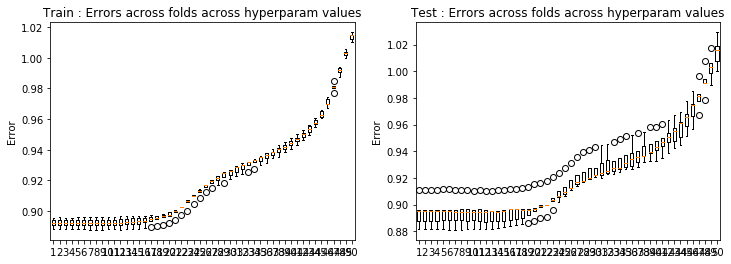

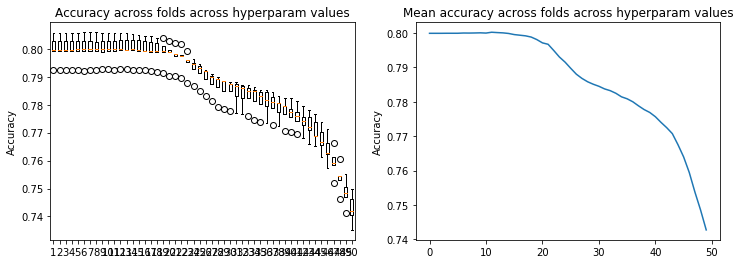

In [43]:
result_crossval(loss_tr21,loss_te21)
result_crossval_accuracy(acc21)

In [13]:
# test 22: degree 5, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr22, loss_te22, w22, acc22 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 5, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -5.69685279e+00  1.21732187e-01 -4.26815508e+00
  4.54623473e+00  3.20361271e-01 -4.52893822e+00  1.67300537e+00
 -5.50092912e-02  9.41112565e-01 -1.61248389e-02 -3.74430301e-03
 -8.32623770e-01 -4.08392750e-04  5.37732199e-03  7.95354505e-02
 -4.20990038e-04 -8.23285048e-01 -9.17978966e-03  1.54949549e-04
  2.17741463e+01 -6.82453325e-02  1.81733194e+01 -1.41625134e+01
 -1.14201670e+00  1.93737226e+01 -3.58281391e+00  9.02706789e-02
 -2.13983263e-01 -2.69719749e-02 -2.62431806e-02  2.55208105e+00
 -7.22412144e-02  1.84006293e-04  3.33022203e-01 -3.78473491e-03
  3.71022260e+00  1.93635150e-01 -1.16351160e-02 -2.90928208e+01
 -1.86039400e+00 -3.29242520e+01  1.98829898e+01  2.12790120e+00
 -3.14866716e+01  4.05540324e+00  3.02109281e-01 -1.31445720e+00
  4.76774800e-02  4.2598

Ridge regression: w=[-2.75017660e-01 -5.75996747e+00  8.99758069e-02 -4.46402978e+00
  4.47342262e+00  2.72338390e-01 -3.54691284e+00  2.68965276e+00
 -9.38585344e-02  2.55148289e+00 -1.26358183e-02 -1.45153176e-02
 -1.24609541e+00 -1.79018132e-03  3.23377490e-03 -1.86280601e-02
 -1.97197765e-04 -7.37288742e-01 -7.64677211e-03 -1.64001371e-02
  2.21098036e+01  8.65097304e-02  1.92170616e+01 -1.35565195e+01
 -9.26455889e-01  1.57434958e+01 -5.70749262e+00  9.27203079e-02
 -5.66640772e+00 -3.05488079e-02 -1.37364170e-02  2.89291298e+00
 -6.73146452e-02  1.63048512e-02  9.22699154e-01  1.06120873e-02
  3.37098218e+00  1.91875805e-01  3.46233275e-03 -2.97159986e+01
 -2.11822578e+00 -3.49667555e+01  1.82798921e+01  1.67370300e+00
 -2.60599278e+01  6.56705444e+00  3.72920245e-01  7.57408484e+00
  2.67929008e-02  3.43087183e-02 -4.14360237e+00  2.59265006e-03
  1.05662783e-03 -2.96013161e+00  2.33492460e-03 -5.87986261e+00
  5.76147000e-03  4.25624632e-02  1.61636392e+01  2.92860708e+00
  2.8

Ridge regression: w=[-2.78727903e-01 -5.74597369e+00  1.37818159e-01 -4.04095679e+00
  4.49063663e+00  3.06009117e-01 -3.41445336e+00  1.89003278e+00
 -8.71177024e-02  1.55922263e+00 -1.61174543e-02  3.50799779e-03
 -5.21851573e-01 -6.20311088e-03 -3.67889341e-04 -2.21798477e-02
  5.57202440e-03 -7.48105923e-01 -7.20282278e-03 -1.87407714e-04
  2.21622252e+01 -1.39075912e-01  1.69555474e+01 -1.38691687e+01
 -1.08901417e+00  1.51478215e+01 -4.10457154e+00  7.63523832e-02
 -2.36689517e+00 -2.62885411e-02 -1.18546477e-02  1.31771323e+00
 -7.15171360e-02  1.05234694e-02  8.99634104e-01  7.24982047e-03
  3.36226575e+00  1.86838245e-01  4.87418896e-03 -2.99571781e+01
 -1.67118171e+00 -3.04229703e+01  1.93548192e+01  2.02736821e+00
 -2.50298224e+01  4.92086542e+00  3.79793378e-01  2.05858196e+00
  5.06447507e-02 -7.77269717e-03 -2.62323247e+00  1.09650895e-02
  1.20335982e-02 -2.86788476e+00  2.87532076e-03 -5.75112930e+00
  1.50426823e-02 -1.21827808e-02  1.64300749e+01  2.50418120e+00
  2.4

Ridge regression: w=[-2.78869241e-01 -5.73657929e+00  1.03654018e-01 -4.15058286e+00
  4.20191945e+00  2.39978209e-01 -3.12900358e+00  2.35543002e+00
 -6.53643027e-02  1.16662587e+00 -7.87562450e-03 -1.02225801e-04
 -1.35455208e+00 -8.62233509e-03  3.93173739e-03  6.23640356e-02
  5.85456834e-03 -9.23970598e-01 -6.48146105e-03 -1.01760872e-02
  2.19196154e+01 -5.98336874e-02  1.74837607e+01 -1.23027365e+01
 -7.71767952e-01  1.37476003e+01 -5.44628021e+00  8.88397438e-02
 -2.43365468e-01 -2.37109968e-02 -1.51043704e-02  3.92511996e+00
 -7.50682031e-02  1.05550288e-03  4.19788790e-01 -1.35993115e-03
  4.02669515e+00  1.88657683e-01 -1.42058887e-05 -2.92459395e+01
 -1.68513727e+00 -3.13767058e+01  1.62325968e+01  1.41267309e+00
 -2.23519831e+01  6.82409966e+00  3.07297196e-01 -1.89185922e+00
  1.65506698e-02  9.03190313e-04 -6.05713269e+00  1.65941096e-02
  1.20616074e-02 -1.78148841e+00 -1.43760809e-02 -6.74416835e+00
  3.49633678e-03  3.25592044e-02  1.57043919e+01  2.42584658e+00
  2.5

Ridge regression: w=[-2.76819763e-01 -5.72172883e+00  8.75296865e-02 -3.77751626e+00
  4.02581312e+00  2.12795976e-01 -2.34887921e+00  2.47427619e+00
 -7.38893562e-02  1.33404520e+00 -8.11987585e-03 -8.94013512e-03
 -8.30583717e-01 -1.69021827e-03  4.32468459e-04 -8.94338842e-02
  6.25098331e-03 -1.13938095e+00 -1.12038995e-02 -2.67032848e-03
  2.19795207e+01  1.18004479e-01  1.60196216e+01 -1.19443311e+01
 -5.65483744e-01  1.07275161e+01 -5.82697610e+00  8.91575534e-02
 -1.11206036e+00 -2.16010382e-02 -1.43190024e-02  2.00298933e+00
 -6.82566529e-02  4.22029286e-03  1.26794756e+00  4.93543188e-03
  5.16025511e+00  1.92031892e-01  4.34500178e-03 -2.94807769e+01
 -2.16773613e+00 -2.89205239e+01  1.60118682e+01  8.79338012e-01
 -1.77765701e+01  7.37592718e+00  3.33603377e-01 -1.39645213e-01
  1.50537084e-02  2.55086587e-02 -3.29141749e+00  4.47636235e-03
  2.51066186e-02 -3.63629352e+00  1.94317468e-03 -8.91960509e+00
  1.51474102e-02  9.10134970e-03  1.59510634e+01  2.92863425e+00
  2.3

Ridge regression: w=[-2.76431043e-01 -5.49170500e+00  1.21404527e-01 -3.64764885e+00
  3.57079991e+00  3.16944570e-01 -1.89179234e+00  1.15135656e+00
 -5.57456530e-02  6.59861736e-01 -1.60469204e-02 -3.75583559e-03
 -3.59645194e-01 -3.47739705e-06  5.83637987e-03  8.63601813e-02
  1.53433345e-04 -6.88552672e-01 -9.14609022e-03  6.17378382e-04
  2.07438643e+01 -6.69130677e-02  1.54501301e+01 -1.00662573e+01
 -1.12243395e+00  8.82993567e+00 -2.18555783e+00  8.92668652e-02
  2.14944707e-01 -2.68154357e-02 -2.60779068e-02  1.06345602e+00
 -7.23235220e-02  1.91995798e-05  2.95014543e-01 -4.35172052e-03
  3.09573572e+00  1.94184263e-01 -1.18689394e-02 -2.70264789e+01
 -1.86276833e+00 -2.79944550e+01  1.30946230e+01  2.08209679e+00
 -1.46348891e+01  2.02673885e+00  3.02927040e-01 -1.55858648e+00
  4.76484133e-02  4.67331744e-03 -1.90278404e+00 -1.65369560e-03
  1.08221165e-02 -1.57049751e+00  8.49168304e-03 -5.35940582e+00
  8.51553021e-03 -9.49208046e-03  1.37857481e+01  2.78875779e+00
  2.2

Ridge regression: w=[-2.75017591e-01 -5.46705771e+00  8.96168326e-02 -3.59284868e+00
  3.23791382e+00  2.69837380e-01 -1.05223250e+00  1.36761145e+00
 -9.44113096e-02  1.29444880e+00 -1.25191397e-02 -1.46656241e-02
 -4.05243385e-01 -1.52799495e-03  3.23431126e-03 -4.85390065e-03
  4.00529652e-04 -5.61461575e-01 -7.50889429e-03 -1.61150979e-02
  2.06498094e+01  8.50675010e-02  1.53979671e+01 -8.47134699e+00
 -9.11127165e-01  5.77387254e+00 -2.33156139e+00  9.17017367e-02
 -2.22584712e+00 -3.03455503e-02 -1.37076620e-02  7.99367115e-01
 -6.74034864e-02  1.61744555e-02  8.44575416e-01  1.02858893e-02
  2.56372190e+00  1.92427700e-01  3.00000212e-03 -2.68018217e+01
 -2.10984188e+00 -2.80421074e+01  9.97478114e+00  1.63493916e+00
 -1.01431618e+01  1.87416906e+00  3.73579188e-01  2.77161875e+00
  2.68360954e-02  3.46028685e-02 -1.34049173e+00  2.35374590e-03
  1.11137656e-03 -2.78693698e+00  1.30918557e-03 -4.42682517e+00
  5.34400768e-03  4.25226474e-02  1.35071475e+01  2.91267020e+00
  2.3

Ridge regression: w=[-2.78727802e-01 -5.28816209e+00  1.38136959e-01 -3.07780028e+00
  2.94427044e+00  2.99719006e-01 -7.38135125e-01  9.90308064e-01
 -8.84876413e-02  8.89288587e-01 -1.60452066e-02  3.85406623e-03
  2.59525767e-02 -5.85112291e-03  6.87733543e-04 -4.37406256e-03
  6.23639494e-03 -5.22662495e-01 -6.99237529e-03  7.48914191e-04
  1.98947092e+01 -1.45643776e-01  1.27646189e+01 -7.48513517e+00
 -1.04969701e+00  4.44259159e+00 -1.73080601e+00  7.47094154e-02
 -7.92613250e-01 -2.61079107e-02 -1.17894919e-02 -8.86894585e-02
 -7.15040648e-02  1.00938901e-02  7.99711706e-01  6.65589526e-03
  2.33422792e+00  1.87608931e-01  3.90099410e-03 -2.54750070e+01
 -1.64853808e+00 -2.28673905e+01  8.91673042e+00  1.92972799e+00
 -7.93465496e+00  1.53216535e+00  3.82299417e-01  1.32116549e-01
  5.08179327e-02 -8.35530670e-03 -6.60231464e-01  1.06384474e-02
  9.95207832e-03 -2.64527677e+00  2.04895348e-03 -3.91107058e+00
  1.46395713e-02 -1.30655198e-02  1.23827133e+01  2.47092194e+00
  1.8

Ridge regression: w=[-2.78869094e-01 -5.15685340e+00  1.07661662e-01 -2.93843024e+00
  2.52449955e+00  2.35233002e-01 -5.48521743e-01  1.09036584e+00
 -6.65976650e-02  6.74164587e-01 -7.63317386e-03 -1.17985030e-04
 -2.71058069e-01 -8.05592469e-03  4.63037992e-03  8.02234150e-02
  6.80352254e-03 -5.82046294e-01 -6.32914587e-03 -9.12794841e-03
  1.90754877e+01 -8.72510446e-02  1.21827425e+01 -5.55444410e+00
 -7.40407676e-01  3.43599686e+00 -2.12680722e+00  8.73487553e-02
  1.45318596e-01 -2.37499102e-02 -1.47089575e-02  7.39397775e-01
 -7.52979366e-02  9.26529622e-04  3.20087358e-01 -2.32978718e-03
  2.47580956e+00  1.89563391e-01 -3.98049075e-04 -2.36652537e+01
 -1.62002259e+00 -2.17805785e+01  5.44282532e+00  1.33319806e+00
 -5.90429847e+00  2.11484318e+00  3.10778867e-01 -1.58038234e+00
  1.66413629e-02  1.27664558e-03 -1.42352837e+00  1.53949409e-02
  1.07057508e-02 -1.55806706e+00 -1.56190166e-02 -3.98401229e+00
  3.00715354e-03  3.15662942e-02  1.06906641e+01  2.35328444e+00
  1.7

Ridge regression: w=[-2.76819550e-01 -4.93548212e+00  9.70735363e-02 -2.44382471e+00
  2.12877897e+00  2.10098347e-01 -1.69569103e-01  9.89576870e-01
 -7.55466967e-02  6.17039971e-01 -7.80501224e-03 -8.77217493e-03
  3.71869784e-02 -1.42910539e-03  1.18331650e-03 -4.29581515e-02
  6.67313933e-03 -5.83471823e-01 -1.10292200e-02 -1.69097811e-03
  1.81198519e+01  5.06997614e-02  1.02025233e+01 -4.37108672e+00
 -5.41787599e-01  2.03787053e+00 -1.94385640e+00  8.77015527e-02
 -5.85029820e-02 -2.11420268e-02 -1.42490718e-02 -6.79681440e-02
 -6.82217046e-02  3.63695087e-03  1.01046489e+00  3.54940661e-03
  2.62811420e+00  1.93211864e-01  3.44853859e-03 -2.19292053e+01
 -2.00360853e+00 -1.83924515e+01  3.98548567e+00  8.10927514e-01
 -3.95379495e+00  1.87966237e+00  3.38222861e-01 -8.14221625e-01
  1.51576701e-02  2.49780769e-02 -5.96986517e-01  4.43257774e-03
  2.32519922e-02 -3.06390921e+00  2.02259625e-03 -4.40303566e+00
  1.48218149e-02  8.12926580e-03  9.19278908e+00  2.75086236e+00
  1.4

Ridge regression: w=[-2.76430592e-01 -4.37989069e+00  1.44813102e-01 -1.85371661e+00
  1.48394556e+00  2.90027396e-01  3.96297916e-02  6.77144662e-01
 -5.86130676e-02  5.75478166e-01 -1.62063359e-02 -2.90009168e-03
  7.17584995e-03  6.30547636e-04  7.26521460e-03  1.27057731e-01
  1.31129980e-03 -2.52292024e-01 -8.87847467e-03  1.88040241e-03
  1.53592922e+01 -2.11874660e-01  7.58853341e+00 -2.17742364e+00
 -9.68053025e-01  1.12012569e+00 -9.56690699e-01  8.78960972e-02
 -8.66504706e-02 -2.60462060e-02 -2.47689290e-02 -8.47973487e-03
 -7.23831336e-02  3.84696036e-04  6.65315435e-02 -5.62105149e-03
  1.12790153e+00  1.96030982e-01 -1.19758754e-02 -1.66032080e+01
 -1.52929567e+00 -1.36779290e+01  1.18014092e+00  1.72246289e+00
 -2.38035519e+00  3.20691453e-01  3.13580125e-01 -6.29106203e-01
  4.84784384e-02  3.59020510e-03 -3.29225936e-01 -2.26060328e-03
  8.21803259e-03 -1.05112045e+00  6.43755137e-03 -1.87162361e+00
  7.97905001e-03 -1.09272353e-02  4.52596653e+00  2.44241136e+00
  1.0

Ridge regression: w=[-2.75016939e-01 -4.13563102e+00  1.25073863e-01 -1.57055105e+00
  1.26030027e+00  2.40606064e-01  3.11443125e-01  7.71064951e-01
 -9.51196692e-02  6.66180375e-01 -1.26677753e-02 -1.45228333e-02
 -2.83600224e-02 -1.09083536e-03  3.74008925e-03  7.65123739e-02
  1.88574013e-03 -1.65526511e-01 -7.27323299e-03 -1.52633939e-02
  1.42473789e+01 -1.38184730e-01  6.50194833e+00 -1.44571966e+00
 -7.46534389e-01  3.18221809e-01 -9.18895829e-01  9.10118724e-02
 -4.36544627e-01 -2.97454597e-02 -1.25608336e-02 -1.12350313e-01
 -6.72928181e-02  1.63462398e-02  3.90437105e-01  9.75063813e-03
  7.78143984e-01  1.94239882e-01  2.73512434e-03 -1.44850587e+01
 -1.59156623e+00 -1.17435646e+01  6.06802056e-04  1.25366225e+00
 -1.47314763e+00  7.52302914e-02  3.81331498e-01  1.94551774e-01
  2.77666197e-02  3.37314368e-02 -1.63553956e-01  2.56202436e-03
  1.17481008e-04 -1.77303220e+00 -1.26853776e-03 -1.25866156e+00
  4.93351953e-03  4.21427480e-02  2.62754152e+00  2.37788194e+00
  8.9

Ridge regression: w=[-2.78726839e-01 -3.80862796e+00  1.77623997e-01 -1.28353089e+00
  1.06925987e+00  2.52888873e-01  3.37256647e-01  5.48994798e-01
 -9.03922574e-02  6.41633649e-01 -1.61525292e-02  4.59758696e-03
  2.45084421e-01 -5.30687459e-03  2.77822284e-03  9.19072352e-02
  6.83902243e-03 -1.51832596e-01 -6.48360507e-03  2.42055962e-03
  1.28043362e+01 -3.93734070e-01  4.91767080e+00 -9.54716749e-01
 -7.83308159e-01  1.14539737e-01 -6.59382361e-01  7.42042273e-02
 -3.77267333e-01 -2.55071480e-02 -1.04110120e-02 -5.71316040e-01
 -7.11096846e-02  9.83686498e-03  2.66141975e-01  5.51183961e-03
  6.73259034e-01  1.89561881e-01  3.07358681e-03 -1.19049510e+01
 -1.07156888e+00 -8.51414669e+00 -1.36041677e-01  1.31184331e+00
 -1.02622210e+00  1.46022872e-01  3.93835416e-01 -1.95755083e-01
  5.15346117e-02 -9.88293821e-03 -4.70929735e-02  1.05839022e-02
  5.46549618e-03 -1.45331591e+00  1.22995143e-03 -9.77447334e-01
  1.39706399e-02 -1.53122153e-02  4.62049612e-01  1.87570967e+00
  6.0

Ridge regression: w=[-2.78867690e-01 -3.60073969e+00  1.57471557e-01 -1.11383679e+00
  9.63079207e-01  1.95920111e-01  2.60271051e-01  4.84114001e-01
 -6.78441512e-02  5.73047845e-01 -7.42024538e-03  1.86004930e-04
  1.22484958e-01 -7.15261112e-03  5.77261483e-03  1.50204644e-01
  8.00159395e-03 -1.83876890e-01 -5.82210182e-03 -7.17074262e-03
  1.17529593e+01 -3.94074132e-01  4.14119934e+00 -6.12370729e-01
 -5.12027061e-01  1.98284289e-01 -6.73939977e-01  8.78663769e-02
 -2.68806898e-01 -2.36268150e-02 -1.30372028e-02 -2.27593359e-01
 -7.53870175e-02  1.31173496e-03 -6.57097820e-02 -3.82416647e-03
  7.02961257e-01  1.91761983e-01 -2.29680439e-04 -9.87223305e+00
 -9.16148416e-01 -6.96249760e+00 -6.19894605e-01  7.97264151e-01
 -7.69421069e-01  2.45951905e-01  3.23519867e-01 -4.04905198e-01
  1.71863710e-02  9.68477817e-04 -1.71082949e-01  1.39419325e-02
  8.85396254e-03 -6.86445000e-01 -1.75877143e-02 -8.71687589e-01
  1.86558174e-03  2.85258369e-02 -1.26936464e+00  1.63392782e+00
  4.5

Ridge regression: w=[-2.76817521e-01 -3.34943776e+00  1.73448008e-01 -8.48114513e-01
  7.78510775e-01  1.81437292e-01  3.57360794e-01  4.43152993e-01
 -7.61093026e-02  4.58738999e-01 -7.54997260e-03 -8.10736588e-03
  2.78511177e-01 -9.28077467e-04  2.09846663e-03  1.10929400e-01
  6.97620606e-03 -1.34231253e-01 -1.06265454e-02 -4.68563589e-04
  1.07370520e+01 -4.19325404e-01  3.13056747e+00 -3.05268601e-01
 -3.76261471e-01 -1.12488477e-01 -6.44597502e-01  8.99058000e-02
 -1.32954133e-01 -2.03512246e-02 -1.31065373e-02 -5.26313704e-01
 -6.80437599e-02  3.45116678e-03  1.76079320e-01  2.06813607e-03
  6.08415285e-01  1.95391927e-01  3.24998181e-03 -8.19922265e+00
 -9.31103931e-01 -5.24555556e+00 -6.38195916e-01  4.25163995e-01
 -4.90252225e-01  2.40041745e-01  3.50365095e-01 -2.75330814e-01
  1.56345343e-02  2.33067555e-02 -7.41277806e-02  4.59700167e-03
  2.12435404e-02 -1.22478797e+00  2.37886880e-03 -8.34964935e-01
  1.41680785e-02  6.41345816e-03 -2.56274629e+00  1.66881076e+00
  3.1

Ridge regression: w=[-2.76426294e-01 -2.91348959e+00  2.23676700e-01 -6.49172238e-01
  5.65771321e-01  2.06231389e-01  3.24045161e-01  3.56583346e-01
 -6.04664820e-02  4.55987106e-01 -1.64907543e-02 -1.72830409e-03
  1.70338476e-01  1.04007679e-03  8.36895636e-03  1.94633871e-01
  1.70399150e-03 -4.00157141e-02 -8.23540487e-03  2.74964422e-03
  8.99829891e+00 -7.02806505e-01  2.09828503e+00  1.39166751e-01
 -4.93699370e-01 -1.09096007e-01 -4.33776408e-01  9.11838293e-02
 -1.39114445e-01 -2.50131575e-02 -2.28729627e-02 -2.72862936e-01
 -7.24133090e-02  1.25106907e-03 -2.97258700e-01 -6.37335555e-03
  2.17084797e-01  1.98574961e-01 -1.14721117e-02 -5.55257349e+00
 -3.90825344e-01 -3.15720144e+00 -6.77243102e-01  6.29370484e-01
 -3.12711313e-01  7.31545033e-03  3.29592334e-01 -2.21672721e-01
  4.96489622e-02  1.31572258e-03 -8.38179965e-02 -2.52270183e-03
  6.57606947e-03 -2.18039283e-01  5.69642417e-03 -3.09371552e-01
  6.75279985e-03 -1.19467109e-02 -4.35839597e+00  1.27584831e+00
  1.2

Ridge regression: w=[-2.75010711e-01 -2.69442419e+00  2.07400536e-01 -5.61683707e-01
  5.12441493e-01  1.72924048e-01  4.10937241e-01  4.23043304e-01
 -9.43558907e-02  4.37840279e-01 -1.30923477e-02 -1.40833646e-02
  1.25227282e-01 -6.96799630e-04  4.39890234e-03  1.91806710e-01
  2.50475882e-03 -1.34245126e-02 -7.04243595e-03 -1.46699978e-02
  8.30305350e+00 -6.70872389e-01  1.82625469e+00  1.40572840e-01
 -3.71301240e-01 -2.85685806e-01 -4.26952236e-01  9.52054014e-02
 -5.98613285e-02 -2.86875707e-02 -1.10971116e-02 -2.99524740e-01
 -6.75182675e-02  1.68191053e-02 -2.33508790e-01  9.36265944e-03
  1.51756247e-01  1.96847695e-01  3.35524102e-03 -4.74249187e+00
 -3.29221322e-01 -2.57610903e+00 -6.65904548e-01  3.99602243e-01
 -2.19000542e-01 -5.86234221e-02  3.90592380e-01 -1.65380038e-01
  2.91879770e-02  3.18552989e-02 -3.19498207e-02  2.48466247e-03
 -5.56730252e-04 -3.66944109e-01 -2.18614169e-03 -2.19173118e-01
  4.61071343e-03  4.19122642e-02 -4.71422295e+00  1.06955384e+00
  5.9

Ridge regression: w=[-2.78717647e-01 -2.44451059e+00  2.29198817e-01 -6.05628785e-01
  4.18102228e-01  1.74676268e-01  3.75275956e-01  2.90043207e-01
 -9.08660434e-02  4.80174466e-01 -1.63027775e-02  4.76881319e-03
  2.55285213e-01 -4.55145495e-03  3.56862562e-03  1.89692579e-01
  6.75168125e-03 -2.00228973e-02 -5.73742545e-03  2.74512656e-03
  7.54839294e+00 -7.67453858e-01  1.70634011e+00  3.82356513e-01
 -3.53826060e-01 -2.40294584e-01 -2.60536469e-01  7.85642021e-02
 -1.85965444e-01 -2.46908823e-02 -9.15425438e-03 -4.83147795e-01
 -7.14232997e-02  1.04559257e-02 -2.62658580e-01  4.78729383e-03
  1.73067419e-01  1.92481208e-01  3.23668131e-03 -4.02022146e+00
 -1.27402306e-01 -1.99124620e+00 -6.70460417e-01  3.41444832e-01
 -1.63739634e-01 -2.15643253e-02  4.03562836e-01 -1.85267892e-01
  5.17760939e-02 -1.04369638e-02 -3.18670232e-02  9.08324506e-03
  4.12784281e-03 -2.35378779e-01  1.21722652e-03 -2.11018509e-01
  1.25094154e-02 -1.55602958e-02 -4.83662534e+00  8.53434323e-01
 -7.6

Ridge regression: w=[-2.78854296e-01 -2.20767939e+00  1.94065677e-01 -6.00680722e-01
  3.75772876e-01  1.44852470e-01  3.05264115e-01  1.79477032e-01
 -6.79984440e-02  3.99746351e-01 -7.88710096e-03  1.21689710e-03
  1.98127441e-01 -6.54861993e-03  6.99912175e-03  1.94928619e-01
  8.08829172e-03 -4.88482769e-02 -4.85475778e-03 -6.28514120e-03
  6.83634856e+00 -7.00730079e-01  1.66817883e+00  4.03805228e-01
 -2.28991581e-01 -7.80851561e-02 -1.96612632e-01  9.28652926e-02
 -1.53011250e-01 -2.24045898e-02 -1.13034229e-02 -2.77641617e-01
 -7.59857005e-02  1.97106000e-03 -3.03225255e-01 -4.36678842e-03
  2.20596748e-01  1.95089623e-01  8.47213301e-04 -3.42052852e+00
 -8.74336422e-02 -1.73443841e+00 -6.48125321e-01  1.57040238e-01
 -1.82850608e-01  1.20753091e-02  3.33248891e-01 -1.69590138e-01
  1.86373578e-02 -9.93277385e-04 -7.28675244e-02  1.22855199e-02
  7.06909903e-03 -8.41117229e-02 -1.75789687e-02 -1.95125107e-01
 -1.85161077e-04  2.71698011e-02 -4.73716212e+00  6.97599504e-01
 -4.9

Ridge regression: w=[-2.76798159e-01 -1.91335291e+00  2.02197727e-01 -5.29777702e-01
  2.44204413e-01  1.49130393e-01  3.05085350e-01  1.80578739e-01
 -7.53405172e-02  3.32890882e-01 -8.23961651e-03 -6.48122260e-03
  2.37868217e-01 -8.56322561e-05  2.89522192e-03  1.92058317e-01
  6.34836807e-03 -5.28254294e-03 -9.86866452e-03  5.72648132e-04
  6.05227080e+00 -7.18479193e-01  1.50874313e+00  5.49098272e-01
 -2.13943536e-01 -1.27540541e-01 -2.12069680e-01  9.46443946e-02
 -2.93532149e-02 -1.89282805e-02 -1.19044370e-02 -3.38529570e-01
 -6.87099075e-02  3.98952186e-03 -2.58226238e-01  1.52008056e-03
  1.46505794e-01  1.99274156e-01  4.27676974e-03 -2.94192274e+00
 -6.69293680e-02 -1.49774146e+00 -5.96779990e-01  8.22358890e-02
 -1.30921640e-01  3.67445378e-02  3.55411145e-01 -1.68197759e-01
  1.78324001e-02  1.97230121e-02 -7.86238315e-02  2.69898199e-03
  2.08452681e-02 -1.74564389e-01  4.92394011e-03 -1.82158036e-01
  1.27129035e-02  5.77681449e-03 -4.41520874e+00  6.62102228e-01
 -7.2

Ridge regression: w=[-2.76385290e-01 -1.29969436e+00  1.89194088e-01 -4.55825849e-01
  1.02036073e-01  1.49388969e-01  2.72006701e-01  1.26375777e-01
 -5.81086354e-02  3.19997780e-01 -1.71759636e-02 -2.66873545e-04
  1.64324061e-01  1.79930973e-03  8.55283356e-03  1.90177948e-01
  1.08382076e-04  2.11980464e-02 -6.92333429e-03  2.49890158e-03
  4.42405581e+00 -7.33735388e-01  1.28919806e+00  6.73285457e-01
 -2.25318615e-01 -6.77159360e-02 -1.10151459e-01  9.40746784e-02
 -2.63920571e-03 -2.34119331e-02 -2.04049039e-02 -1.65194594e-01
 -7.27485343e-02  2.93532559e-03 -3.01301058e-01 -6.90061580e-03
  3.06769536e-02  2.03404687e-01 -9.40426928e-03 -2.07832718e+00
  4.80936289e-02 -1.17690894e+00 -4.86184144e-01  9.24143708e-02
 -1.30536989e-01 -1.47790782e-02  3.25211292e-01 -1.56657600e-01
  5.29728214e-02 -3.94612056e-03 -9.70579947e-02 -5.64632969e-03
  6.42578285e-03 -1.29767251e-02  9.29256114e-03 -7.70126242e-02
  4.19164732e-03 -1.12129583e-02 -3.47858407e+00  5.51953614e-01
 -9.4

Ridge regression: w=[-2.74951306e-01 -9.81700134e-01  1.53833732e-01 -3.24727050e-01
  3.66642423e-02  1.27995283e-01  2.97408123e-01  1.69518801e-01
 -8.51641282e-02  3.18868205e-01 -1.44636943e-02 -1.30961869e-02
  1.07154649e-01  3.16341142e-04  4.84865252e-03  1.88696162e-01
  1.42498758e-03  4.13761671e-02 -6.42720277e-03 -1.37163740e-02
  3.62922283e+00 -6.24792485e-01  1.08510243e+00  6.06542242e-01
 -1.83698798e-01 -8.92183225e-02 -8.97094435e-02  9.73499154e-02
  3.78438421e-02 -2.61748363e-02 -8.92105685e-03 -1.44374383e-01
 -6.90659733e-02  1.83467421e-02 -2.65975956e-01  8.32081523e-03
  6.30277540e-03  2.02879860e-01  6.21803553e-03 -1.72416679e+00
 -5.54726665e-03 -1.07440468e+00 -3.87636659e-01  6.81388904e-02
 -1.41108106e-01 -6.33886105e-02  3.65557958e-01 -1.64994688e-01
  3.47095567e-02  2.73840538e-02 -6.61283525e-02 -9.87488303e-04
  1.03999684e-03 -5.63362921e-02  1.10843840e-03 -7.31908936e-02
  3.27818914e-03  4.07770788e-02 -2.92780160e+00  4.16510211e-01
 -9.2

Ridge regression: w=[-2.78629976e-01 -6.99766511e-01  1.44409613e-01 -2.93398178e-01
  3.24449963e-03  1.24742403e-01  2.88243070e-01  1.22159802e-01
 -7.71994811e-02  3.39238885e-01 -1.62061624e-02  4.03608622e-03
  1.31894780e-01 -2.90138903e-03  3.17931732e-03  1.69350880e-01
  5.87009078e-03  5.09830609e-02 -3.89660719e-03  9.29729913e-04
  2.91845849e+00 -5.87217333e-01  9.46481764e-01  6.12131402e-01
 -1.62204066e-01 -7.85431211e-02 -3.46445121e-02  8.01320837e-02
 -1.54364952e-02 -2.34795810e-02 -8.32319882e-03 -1.59269589e-01
 -7.36122341e-02  1.22982749e-02 -2.24522514e-01  3.62693202e-03
  3.21032046e-03  1.99591756e-01  5.68405651e-03 -1.41988089e+00
 -1.74035770e-02 -9.25729602e-01 -3.40883653e-01  3.59250193e-02
 -1.31775472e-01 -4.22972640e-02  3.64000539e-01 -1.64685142e-01
  5.19220683e-02 -1.00056341e-02 -7.94565901e-02  3.68139413e-03
  6.18628998e-03 -4.36812941e-02  2.55064829e-03 -9.52472825e-02
  7.86231514e-03 -1.07992531e-02 -2.41237720e+00  3.42022637e-01
 -8.7

Ridge regression: w=[-2.78726575e-01 -4.48399350e-01  9.68322972e-02 -1.80831285e-01
 -1.62803771e-02  1.14530091e-01  2.86867436e-01  5.78995975e-02
 -4.97158098e-02  2.81168463e-01 -9.35555785e-03  3.42131025e-03
  1.22321964e-01 -5.16416111e-03  9.98906800e-03  1.59267190e-01
  6.83120615e-03  3.55450651e-02 -2.97438229e-03 -4.95900033e-03
  2.27108447e+00 -4.73342306e-01  7.33086174e-01  5.10518045e-01
 -1.15237229e-01 -4.95945615e-02 -2.18704962e-02  9.22372984e-02
 -8.24860329e-03 -2.03419237e-02 -8.02466104e-03 -9.46415350e-02
 -7.74253245e-02  3.83950201e-03 -1.92129910e-01 -4.85629157e-03
  2.01484318e-02  2.01971412e-01  4.77814103e-03 -1.12535917e+00
 -5.32021212e-02 -8.35791503e-01 -2.46703037e-01 -1.31322341e-02
 -1.61582926e-01 -1.75127350e-02  2.82752108e-01 -1.26059623e-01
  2.27160155e-02 -5.08415024e-03 -7.76857439e-02  7.56930161e-03
  2.27414999e-03 -4.57941392e-02 -1.39390392e-02 -8.27189271e-02
 -4.95661513e-03  2.62805887e-02 -1.92658687e+00  2.45504337e-01
 -7.8

Ridge regression: w=[-2.76613567e-01 -2.27470557e-01  8.52999292e-02 -7.19124757e-02
 -5.17466516e-02  1.16236167e-01  2.56665991e-01  5.16247745e-02
 -4.71350886e-02  2.65501354e-01 -9.74032572e-03 -3.32073874e-03
  1.38119576e-01  1.94528229e-03  6.14250995e-03  1.55577766e-01
  5.36346468e-03  5.79827128e-02 -8.65845085e-03  3.15431392e-03
  1.71914343e+00 -4.37108593e-01  5.07756238e-01  4.43429893e-01
 -1.13165265e-01 -4.19218891e-02 -1.71639297e-02  8.97510151e-02
  1.75767020e-02 -1.75759156e-02 -1.02358918e-02 -1.01370018e-01
 -6.97372909e-02  4.83262766e-03 -1.65349842e-01  9.07732540e-04
 -6.11147237e-03  2.06516357e-01  6.95586452e-03 -9.07297851e-01
 -7.58531325e-02 -7.42184883e-01 -1.62923582e-01 -2.13665843e-02
 -1.30933685e-01 -9.30391453e-04  2.68041837e-01 -1.19631985e-01
  2.43622842e-02  1.25369949e-02 -9.78407737e-02 -3.95914953e-03
  1.64910585e-02 -7.58751752e-02  9.35535585e-03 -8.48968444e-02
  9.96763057e-03  4.31471349e-03 -1.50462480e+00  2.06294763e-01
 -6.4

Ridge regression: w=[-2.75994690e-01  8.21274343e-02  3.80886124e-02  2.96852909e-02
 -1.10468095e-02  1.03808292e-01  2.35879552e-01  2.45700942e-02
 -1.67531459e-02  2.56260713e-01 -1.54036785e-02  9.19888079e-04
  1.30246590e-01  2.77750749e-03  9.89995059e-03  1.27889046e-01
 -3.33081610e-04  4.71137772e-02 -5.53936755e-03  1.84447162e-03
  9.12969167e-01 -3.45926076e-01  1.76847817e-01  2.90121323e-01
 -9.37672428e-02 -2.84187257e-02  1.42013031e-05  8.14720343e-02
  2.19640046e-02 -2.31073016e-02 -1.76182197e-02 -5.99229497e-02
 -7.17668203e-02  5.20115045e-03 -1.28684618e-01 -7.71873884e-03
 -1.56030715e-02  2.07471505e-01 -5.97426210e-03 -5.66221926e-01
 -7.60554024e-02 -5.44643695e-01 -6.53595989e-02 -3.07281412e-02
 -1.18994196e-01 -7.99720625e-03  1.88615464e-01 -9.72676539e-02
  5.12945990e-02 -7.75116443e-03 -9.40089654e-02 -9.78414735e-03
  3.63844203e-03 -5.49579277e-02  9.85148180e-03 -4.87902997e-02
  1.29331267e-03 -7.65544741e-03 -8.74491632e-01  1.39151852e-01
 -4.0

Ridge regression: w=[-2.74385815e-01  1.86842476e-01  1.93830045e-02  8.88057003e-02
  6.20682536e-04  8.44364525e-02  2.39854630e-01  2.90084977e-02
 -2.66762469e-02  2.46569742e-01 -1.28331169e-02 -9.56090708e-03
  1.11201001e-01  1.39732812e-03  6.69165595e-03  1.28920404e-01
  4.41374325e-04  5.86215013e-02 -5.99571210e-03 -7.85168258e-03
  6.48768691e-01 -2.92425308e-01  5.32100634e-02  2.10159409e-01
 -6.53245525e-02 -2.72421040e-02  3.55358018e-03  8.23841497e-02
  2.52147716e-02 -2.52206456e-02 -7.33014178e-03 -5.03252708e-02
 -6.92616886e-02  1.91718025e-02 -1.17465013e-01  7.04448401e-03
 -2.25922625e-02  2.05882218e-01  8.71382148e-03 -4.54513552e-01
 -1.09727390e-01 -4.82682400e-01 -3.90783061e-02 -2.08697204e-02
 -1.19076272e-01 -2.11098880e-02  1.78924075e-01 -9.20304795e-02
  3.32423433e-02  1.74809671e-02 -7.85644585e-02 -5.33888331e-03
  3.05849923e-04 -7.39931362e-02  5.18255142e-03 -5.40776311e-02
  2.42818912e-03  2.79330180e-02 -6.64418330e-01  8.68214458e-02
 -3.1

Ridge regression: w=[-2.77796279e-01  2.45716200e-01  1.08581588e-02  7.39292527e-02
  2.90275890e-02  8.44699131e-02  2.25826493e-01  8.92331114e-03
 -1.06859101e-02  2.41544222e-01 -1.11403309e-02  2.65452603e-03
  1.14546419e-01 -1.45020410e-03  4.63882985e-03  1.11667740e-01
  5.02312741e-03  6.47446631e-02 -2.63486914e-03 -9.69400295e-04
  4.69651615e-01 -2.67775779e-01  9.70149245e-05  1.71290419e-01
 -5.97913357e-02 -1.74107570e-02  1.64986778e-02  6.39308123e-02
  1.64970622e-02 -2.40682743e-02 -8.00813023e-03 -4.71302888e-02
 -7.34309752e-02  1.27190660e-02 -8.98425616e-02  2.92452091e-03
 -3.32427353e-02  2.00290151e-01  8.00626818e-03 -3.66411199e-01
 -1.22262410e-01 -3.95791915e-01 -3.14743721e-02 -3.39636271e-02
 -1.02004645e-01 -9.46498141e-04  1.51723869e-01 -8.65600994e-02
  3.94765077e-02 -6.75939413e-03 -7.87009413e-02 -1.40201581e-03
  2.96717097e-03 -6.30955614e-02  3.08703780e-03 -6.77646167e-02
  4.49661271e-03 -5.02835717e-03 -5.12515670e-01  6.22681133e-02
 -2.4

Ridge regression: w=[-2.77513851e-01  2.87990216e-01 -1.76646431e-02  8.39420174e-02
  5.48340313e-02  8.56117653e-02  2.15176373e-01 -1.71213370e-02
  6.68374333e-03  2.15506681e-01 -7.10960230e-03  3.90022205e-03
  1.09850708e-01 -3.52893482e-03  1.20124029e-02  1.04577139e-01
  3.68809604e-03  5.15357219e-02 -3.03828957e-03  3.49700418e-04
  3.38396839e-01 -2.22276579e-01 -5.59113418e-02  1.27616780e-01
 -5.15658946e-02 -9.60224407e-03  1.10888772e-02  7.16805693e-02
  2.16330544e-02 -2.08598224e-02 -6.17418054e-03 -2.45315340e-02
 -7.51254682e-02  4.57760441e-03 -7.75060643e-02 -4.38680255e-03
 -2.25226665e-02  1.99119063e-01  6.88384623e-03 -2.93758334e-01
 -1.18053352e-01 -3.46169309e-01 -2.28323580e-02 -4.52199237e-02
 -9.82991427e-02  8.84630597e-03  1.05210425e-01 -6.64142895e-02
  1.76852896e-02 -4.56549250e-03 -6.32053494e-02  1.82108249e-03
 -2.00486869e-03 -6.26253919e-02 -4.85510452e-03 -5.41551918e-02
 -4.65784731e-03  1.31071443e-02 -3.99408579e-01  3.96236578e-02
 -1.8

Ridge regression: w=[-2.74864686e-01  3.10069417e-01 -3.04166490e-02  8.40183247e-02
  6.52768402e-02  8.27124728e-02  1.83668311e-01 -1.62731400e-02
  1.00540405e-02  2.05466422e-01 -6.18263714e-03 -1.55647147e-04
  1.08049382e-01  2.25672980e-03  1.12003541e-02  9.97468349e-02
  6.31829251e-03  5.51103286e-02 -7.50983871e-03  5.59117873e-03
  2.42480871e-01 -2.05858637e-01 -9.06885388e-02  1.01349594e-01
 -4.60301893e-02  5.80547940e-03  1.48687141e-02  6.46039557e-02
  3.27373152e-02 -1.86656626e-02 -8.29047769e-03 -2.46885560e-02
 -6.69079060e-02  4.68901948e-03 -7.03457640e-02  9.11153285e-04
 -2.26863877e-02  1.99707713e-01  7.40212607e-03 -2.44547080e-01
 -1.16451794e-01 -3.01150603e-01 -1.45354945e-02 -4.30484465e-02
 -6.76565494e-02  1.60229279e-02  8.52928444e-02 -5.43300126e-02
  1.73518067e-02  5.24957580e-03 -6.45482365e-02 -7.02688153e-03
  4.54203698e-03 -6.62875088e-02  6.49262315e-03 -5.17679557e-02
  7.73024215e-03  9.06753783e-04 -3.15752644e-01  3.13387268e-02
 -1.4

Ridge regression: w=[-2.72322769e-01  3.02899730e-01 -7.00824870e-02  4.86833791e-02
  1.08523157e-01  6.51506708e-02  1.48998339e-01 -2.86377316e-02
  2.71322789e-02  1.78133500e-01 -4.27273983e-03 -7.22005551e-04
  9.02064901e-02  8.43570524e-04  1.02607137e-02  6.87087185e-02
  1.17320097e-03  3.73461375e-02 -4.88244140e-03 -2.36428041e-06
  1.39145359e-01 -1.58887998e-01 -1.08342841e-01  7.54980255e-02
 -3.26066510e-02  2.47015977e-02  4.42137146e-03  5.17294747e-02
  4.85644001e-02 -2.30744852e-02 -1.38664415e-02 -2.37462402e-03
 -6.34439564e-02  4.90227308e-03 -4.08239745e-02 -6.94179471e-03
 -8.89011546e-03  1.88771940e-01 -3.75290299e-03 -1.56492286e-01
 -8.36821548e-02 -2.07093803e-01 -1.00998747e-02 -3.37087193e-02
 -3.53463687e-02  1.13064466e-02  5.58888553e-02 -2.69696519e-02
  2.22952563e-02 -2.47483300e-03 -4.03940568e-02 -7.41010957e-03
 -3.79682573e-04 -4.10092133e-02  4.66304644e-03 -2.72710403e-02
  8.14289136e-04 -2.27561194e-03 -2.04817355e-01  2.42996636e-02
 -8.3

Ridge regression: w=[-2.69105205e-01  2.90615146e-01 -8.16274301e-02  4.98415698e-02
  1.06991024e-01  5.16520249e-02  1.42339606e-01 -3.08109356e-02
  2.20826702e-02  1.59650090e-01 -4.58393694e-03 -4.60735415e-03
  7.60913041e-02 -4.92581358e-04  7.70044346e-03  6.35230437e-02
  1.14243753e-03  3.82256894e-02 -5.28629028e-03  2.38333556e-04
  1.13487881e-01 -1.46159941e-01 -1.01541659e-01  5.92753135e-02
 -1.48854689e-02  3.17058408e-02 -9.76664104e-04  4.90872636e-02
  4.97522590e-02 -2.36013953e-02 -6.60501177e-03  4.10596004e-03
 -5.97498762e-02  1.31633463e-02 -3.60294303e-02  4.32590021e-03
 -6.61517966e-03  1.80284131e-01  4.35185969e-03 -1.24920056e-01
 -8.07026917e-02 -1.74144008e-01 -1.01299275e-02 -2.00678991e-02
 -2.64886450e-02  5.77023369e-03  5.09313332e-02 -1.84730072e-02
  1.27038983e-02  4.67532869e-03 -2.76497781e-02 -3.87486811e-03
 -1.79903763e-03 -3.90201491e-02  3.77450298e-03 -2.51077602e-02
  1.48674287e-03  5.85385674e-03 -1.70941009e-01  1.88976993e-02
 -7.0

Ridge regression: w=[-2.70085929e-01  2.65724905e-01 -9.15597538e-02  3.68203276e-02
  1.07714489e-01  4.77290476e-02  1.31952828e-01 -3.14325091e-02
  3.17534120e-02  1.43961540e-01 -9.39371333e-04  6.56563180e-04
  6.50514456e-02 -1.59346388e-03  5.15831214e-03  5.21504209e-02
  4.21400112e-03  3.16073390e-02 -1.70581796e-03 -2.54734807e-03
  1.00138191e-01 -1.34829545e-01 -8.40525848e-02  5.81305556e-02
 -1.32888106e-02  3.81331367e-02  8.99650757e-04  3.61659284e-02
  4.98303130e-02 -2.30494641e-02 -5.26358674e-03  7.29291929e-03
 -5.95098969e-02  7.70803933e-03 -1.91837977e-02  1.96103083e-03
 -8.99338000e-03  1.66706062e-01  5.76437770e-03 -9.49010671e-02
 -7.32755381e-02 -1.37529341e-01 -5.59788241e-03 -1.93183831e-02
 -1.56628939e-02  9.20801610e-03  4.48863861e-02 -1.07240553e-02
  1.17169115e-02 -2.16498206e-03 -2.07728277e-02 -2.54938193e-03
 -9.52106787e-04 -2.57444912e-02  2.27869954e-03 -2.45698514e-02
  1.95235885e-03 -1.31930832e-03 -1.43397127e-01  1.65382162e-02
 -5.8

Ridge regression: w=[-2.66452814e-01  2.45001081e-01 -1.06125852e-01  3.62431481e-02
  1.06745146e-01  4.56758322e-02  1.18959091e-01 -3.79606803e-02
  4.03021980e-02  1.31072915e-01 -1.76649568e-03  1.08513700e-03
  5.92613695e-02 -3.68706273e-03  8.42358610e-03  4.60445320e-02
  8.44317805e-04  2.69416671e-02 -4.09359715e-03  2.10716249e-03
  9.01441609e-02 -1.16697160e-01 -7.06380285e-02  5.46944508e-02
 -9.60243319e-03  3.93702793e-02 -5.58201708e-03  3.89892743e-02
  5.16018673e-02 -2.01798131e-02 -3.70201197e-03  1.44370533e-02
 -5.69648459e-02  2.60897150e-03 -1.08067956e-02 -2.26572643e-03
 -3.18894928e-03  1.55384535e-01  3.57450496e-03 -7.30420342e-02
 -5.99255344e-02 -1.13717603e-01 -2.22583464e-03 -1.84889550e-02
 -1.01712348e-02  7.21128889e-03  3.94085327e-02 -2.98415939e-03
  5.79006665e-03 -1.31844265e-03 -1.20891124e-02 -9.70049926e-04
 -2.32633819e-03 -1.89543172e-02  8.03744650e-04 -1.75216467e-02
 -7.64492253e-04  1.43234665e-03 -1.23843861e-01  1.41822357e-02
 -5.2

Ridge regression: w=[-2.59227463e-01  2.18378143e-01 -1.12625785e-01  3.71775385e-02
  9.92260637e-02  4.07540889e-02  1.06081386e-01 -3.43856134e-02
  4.16114753e-02  1.19954721e-01 -6.24794259e-04 -8.49883382e-04
  5.15498649e-02 -7.98065910e-04  8.47265466e-03  3.91827795e-02
  4.77560280e-03  2.75534837e-02 -5.04202475e-03  2.30717631e-03
  7.85928028e-02 -1.08138031e-01 -5.72975502e-02  5.19352385e-02
 -4.43098409e-03  4.19516079e-02 -5.05712222e-03  3.32695820e-02
  5.35344157e-02 -1.90531872e-02 -2.87156868e-03  1.37160855e-02
 -4.86129147e-02  2.68627225e-03 -6.08805105e-03 -2.88881948e-04
  6.15796728e-05  1.44913049e-01  2.83540746e-03 -5.70968811e-02
 -5.30461329e-02 -9.50937419e-02  2.73232777e-03 -1.37879718e-02
 -1.60489733e-03  6.82169879e-03  3.65142110e-02  3.40237115e-03
  5.70565241e-03  1.46806588e-03 -9.35904325e-03 -4.48889533e-03
 -1.22328785e-03 -1.38949148e-02  2.68310655e-03 -1.46236068e-02
  3.26036122e-03 -5.25815150e-05 -1.05320021e-01  1.33045503e-02
 -5.1

Ridge regression: w=[-2.41648852e-01  1.68970716e-01 -1.15178993e-01  4.03284728e-02
  9.20688935e-02  2.73262073e-02  8.56371277e-02 -3.83805064e-02
  5.07406870e-02  1.01157559e-01  1.69638361e-03 -2.29545753e-03
  3.86043587e-02 -1.97831349e-03  5.61651540e-03  2.70140162e-02
  1.96938066e-03  2.46287233e-02 -3.66618277e-03 -1.33714592e-03
  6.29885073e-02 -8.71035812e-02 -3.04009718e-02  4.97696936e-02
  9.35548191e-04  4.09175117e-02 -1.32923692e-02  2.70943117e-02
  5.22007812e-02 -2.05662089e-02 -5.47509680e-03  1.52005115e-02
 -4.20632428e-02  1.97759768e-03  4.86335688e-03 -4.54053979e-03
  6.37934858e-03  1.17912019e-01 -2.13371088e-03 -3.30073657e-02
 -3.85303438e-02 -6.30006800e-02  8.19821050e-03 -6.07334960e-03
  6.36955858e-03  1.31126554e-03  3.56896282e-02  1.03592896e-02
  4.41888254e-03 -1.30625424e-04 -2.32828344e-03 -3.72214658e-03
 -1.09298996e-03 -2.83171112e-03  1.57882371e-03 -6.69819945e-03
 -2.39188676e-04 -6.54623784e-04 -7.82444329e-02  8.65211255e-03
 -4.7

Ridge regression: w=[-2.27358237e-01  1.47533161e-01 -1.09896275e-01  4.56563783e-02
  8.05219031e-02  2.38533916e-02  7.88692812e-02 -3.81781215e-02
  4.83355372e-02  9.02835857e-02 -2.86295017e-04 -3.56832354e-03
  3.28340752e-02 -2.31585216e-03  3.37331276e-03  2.22052471e-02
  1.50826056e-03  2.54574164e-02 -3.48410656e-03 -1.73244810e-04
  5.61341320e-02 -8.11854230e-02 -1.85984963e-02  4.35368239e-02
  5.52055802e-03  3.94073612e-02 -1.63719493e-02  2.63187904e-02
  4.86966234e-02 -2.02227612e-02 -2.55827525e-03  1.52277096e-02
 -3.93923748e-02  4.04571293e-03  6.07914629e-03  2.79638826e-04
  7.89707732e-03  1.05396816e-01 -9.75427523e-04 -2.52624611e-02
 -3.72471454e-02 -5.22209061e-02  8.87366495e-03 -2.31636899e-03
  7.45129505e-03 -2.47196418e-03  3.53927237e-02  1.22962943e-02
  2.99102534e-03  2.59469476e-04  1.28839910e-03 -1.89788259e-03
 -1.31432325e-03  4.56493316e-04  1.47084789e-03 -5.44396504e-03
  2.58654010e-04 -5.26857099e-04 -6.75553107e-02  4.88012282e-03
 -4.8

Ridge regression: w=[-2.13538205e-01  1.26407977e-01 -1.02723701e-01  4.44982763e-02
  7.29268940e-02  1.97095678e-02  7.03117713e-02 -3.45028055e-02
  5.00539450e-02  7.89796178e-02  1.31876048e-03 -1.31524501e-03
  2.69521347e-02 -1.72750306e-03  2.09595410e-03  1.92935492e-02
  3.32350895e-03  2.10973944e-02 -9.78003160e-04 -2.19929360e-03
  4.95917315e-02 -7.43524195e-02 -1.06696074e-02  4.01975893e-02
  5.27693374e-03  3.69687247e-02 -1.49828402e-02  2.35728709e-02
  4.45894479e-02 -2.19062577e-02 -6.67642958e-04  1.31897086e-02
 -3.81556288e-02  1.88204714e-03  8.27967341e-03  6.38473709e-04
  6.62210016e-03  9.37038782e-02  2.30805164e-03 -1.86570504e-02
 -3.53000891e-02 -4.26667885e-02  9.16724518e-03 -8.13948563e-04
  9.04781583e-03 -2.24530538e-03  3.56846421e-02  1.39019277e-02
  2.41558937e-03 -1.08601857e-03  1.65027308e-03 -1.52438531e-03
 -1.12424859e-03  2.33026230e-03  1.41407389e-03 -4.35543607e-03
  1.52137583e-04 -8.75976326e-04 -5.68962750e-02  1.12285491e-03
 -4.5

Ridge regression: w=[-1.93042637e-01  1.08353376e-01 -9.44064994e-02  4.31412117e-02
  6.51583652e-02  1.79615005e-02  6.06835081e-02 -3.39992313e-02
  5.07828810e-02  7.13353324e-02  2.47756361e-04 -1.66241095e-03
  2.31341578e-02 -3.10362396e-03  1.73557714e-03  1.58128853e-02
  9.31566409e-04  2.03674685e-02 -2.37766352e-03  2.65122200e-04
  4.34242630e-02 -6.64996843e-02 -5.63692517e-03  3.66170365e-02
  5.21480334e-03  3.31006931e-02 -1.64963926e-02  2.44662866e-02
  4.23559158e-02 -2.02387008e-02 -7.33163443e-04  1.26157194e-02
 -3.61518650e-02  8.93273652e-04  8.28343371e-03 -3.71432237e-04
  7.88935659e-03  8.23870469e-02  5.41487517e-04 -1.41998139e-02
 -3.29534805e-02 -3.60189862e-02  9.77898149e-03 -7.94445734e-04
  9.43629420e-03 -4.05741862e-03  3.65568359e-02  1.59979736e-02
  1.94862238e-03 -1.02289521e-03  3.07280907e-03 -1.31003935e-03
 -1.47927004e-03  3.56151419e-03  9.17630869e-04 -2.41003892e-03
  1.11366906e-04 -6.36673857e-04 -4.85411234e-02 -2.91997826e-03
 -4.3

Ridge regression: w=[-1.68025017e-01  8.87192785e-02 -8.40772806e-02  3.79439982e-02
  5.63645973e-02  1.54454833e-02  5.19228276e-02 -3.00051678e-02
  4.75628817e-02  6.22572995e-02  6.67747088e-04 -1.43940626e-03
  1.86001148e-02 -2.18665214e-03  1.84318501e-03  1.07964376e-02
  2.54306313e-03  1.92128994e-02 -1.64655675e-03  1.20942758e-05
  3.57404053e-02 -6.01749043e-02 -4.03557143e-03  3.28888667e-02
  5.48013834e-03  3.00078136e-02 -1.52151921e-02  2.27528239e-02
  3.91463883e-02 -1.91523742e-02  3.14147825e-04  1.05849413e-02
 -3.10911403e-02  8.47782481e-04  6.80606498e-03 -9.87383997e-04
  8.18976776e-03  7.34129675e-02  1.22830080e-04 -1.07683906e-02
 -3.18252646e-02 -3.13513235e-02  1.08015871e-02  2.10710960e-04
  1.07106414e-02 -4.65102254e-03  3.56205348e-02  1.74812787e-02
  2.22881665e-03  1.82871316e-04  3.37783281e-03 -2.96213069e-03
 -8.68397110e-04  4.39278414e-03  1.70498004e-03 -1.15804382e-03
  1.01003491e-03 -4.32009541e-04 -3.92533905e-02 -6.50335814e-03
 -4.0

Ridge regression: w=[-1.16475525e-01  5.82067657e-02 -6.24544345e-02  2.71774567e-02
  4.10187569e-02  9.54625578e-03  3.65344855e-02 -2.55260568e-02
  4.22706585e-02  4.64555314e-02  4.24042690e-04 -1.41351802e-03
  9.56245605e-03 -1.95391781e-03  1.12540407e-03  4.28868633e-03
  1.50333682e-03  1.56586230e-02 -1.40317337e-03 -5.12387169e-04
  2.43660006e-02 -4.64507403e-02 -1.55850490e-03  2.53465917e-02
  4.29811924e-03  2.36066642e-02 -1.48467844e-02  2.03456101e-02
  3.18396935e-02 -1.71817593e-02 -1.36399294e-03  5.77093402e-03
 -2.55913882e-02  6.96500796e-04  3.73989679e-03 -2.32971740e-03
  8.73223738e-03  5.43677275e-02 -9.37524154e-04 -5.34179469e-03
 -2.82516457e-02 -2.14661470e-02  1.04848483e-02  1.28078708e-03
  1.17682104e-02 -6.58328259e-03  3.38933964e-02  1.76168477e-02
  1.00475923e-03 -3.31920573e-04  2.16705901e-03 -2.19142722e-03
 -1.74267143e-04  3.11490039e-03  8.28559752e-04  2.38114763e-03
 -5.15298255e-04 -4.81274304e-04 -2.46149531e-02 -1.24343478e-02
 -3.0

Ridge regression: w=[-9.16725559e-02  4.58854213e-02 -5.23755381e-02  2.22877775e-02
  3.27290261e-02  7.82209074e-03  3.06450547e-02 -2.27710573e-02
  3.69662597e-02  3.90009046e-02 -8.57850858e-05 -1.70043696e-03
  6.65807924e-03 -1.56683013e-03  5.85113269e-04  1.85288937e-03
  1.32461987e-03  1.41694849e-02 -9.24267618e-04 -5.99559893e-04
  1.96074693e-02 -4.05643732e-02 -8.42734161e-04  2.06364963e-02
  4.14467998e-03  2.07815257e-02 -1.44086297e-02  1.92704130e-02
  2.79080634e-02 -1.48919498e-02 -7.14596737e-04  4.25007244e-03
 -2.25154629e-02  1.15624450e-03  2.54876786e-03 -1.20743537e-04
  8.57969612e-03  4.49725046e-02 -1.05741908e-03 -3.39706043e-03
 -2.65005882e-02 -1.72259660e-02  9.26689688e-03  1.55803282e-03
  1.16002804e-02 -7.78355384e-03  3.07196499e-02  1.70643452e-02
  6.75020584e-04 -7.51261615e-04  1.93883104e-03 -1.34352708e-03
 -3.19232242e-04  3.07418617e-03  9.05840753e-04  3.38585829e-03
 -1.26182380e-04 -8.69364109e-04 -1.85553990e-02 -1.39788867e-02
 -2.5

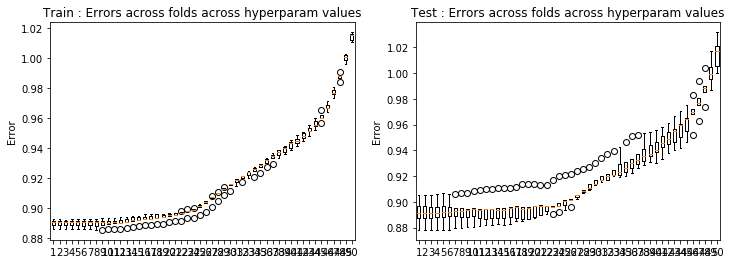

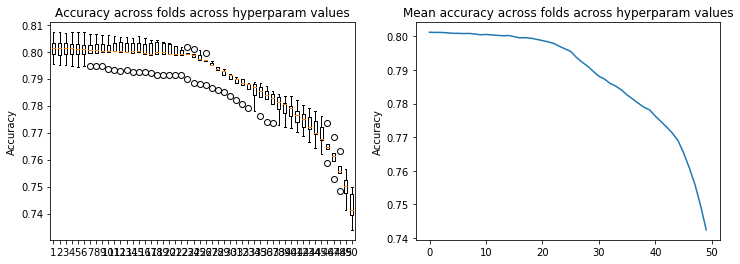

In [44]:
result_crossval(loss_tr22,loss_te22)
result_crossval_accuracy(acc22)

In [14]:
# test 23: degree 6, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr23, loss_te23, w23, acc23 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 6, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  2.35987524e+00  1.13684884e-01 -1.47179942e+00
  1.75246204e+00  3.00209414e-01 -3.31136092e+00  1.41748780e+00
 -4.68967511e-02  8.57446095e-01 -1.47351444e-02 -4.91060718e-03
  6.45254235e-02 -1.75390404e-03  8.84050531e-03 -1.57339683e-01
 -4.40669738e-03 -1.22922388e-01 -7.24828663e-03 -7.26645326e-04
 -3.22124523e+01  5.76194226e-02  2.69088548e-01 -3.68245383e+00
 -9.27796814e-01  1.29162346e+01 -2.88701541e+00  7.67986594e-02
  2.35579584e-01  9.34286421e-03 -1.72509383e-02 -1.43896964e+00
 -5.64910712e-02  6.19443584e-03  2.20907582e+00 -3.94949887e-03
 -5.22241672e-01  1.81473289e-01 -3.92357100e-02  1.23339406e+02
 -2.40594135e+00  1.68212855e+01  6.98751256e+00  1.30790065e+00
 -1.71190754e+01  2.76722677e+00  2.93302966e-01 -3.16898972e+00
  4.78617814e-02  7.0133

Ridge regression: w=[-2.76431087e-01  1.41221363e+00  1.15829876e-01 -1.41423872e+00
  1.96824312e+00  2.99553271e-01 -3.06002338e+00  1.37033154e+00
 -4.71072072e-02  8.90193380e-01 -1.48397089e-02 -4.90604324e-03
 -5.06380165e-02 -1.68069978e-03  8.51048607e-03 -1.46619224e-01
 -4.10838350e-03 -2.01908318e-01 -7.37484603e-03 -7.23246684e-04
 -2.60840815e+01  3.43556446e-02 -5.31539493e-02 -4.47575691e+00
 -9.22517600e-01  1.16832586e+01 -2.69595809e+00  7.56205253e-02
 -3.80043688e-02  9.32394262e-03 -1.71763078e-02 -8.28471285e-01
 -5.69238147e-02  6.47461539e-03  2.12749382e+00 -3.60117427e-03
 -5.93162088e-02  1.81368392e-01 -3.95019103e-02  1.06580267e+02
 -2.31655224e+00  1.75372780e+01  7.94929818e+00  1.28810906e+00
 -1.45010533e+01  2.35559519e+00  2.92681901e-01 -2.38659780e+00
  4.78217435e-02  6.97577991e-03  2.57328915e+00  4.49718627e-04
  1.16158909e-03 -7.60188059e+00  1.91972954e-02  3.08338615e+00
  4.03210587e-03 -8.71772834e-03 -1.81930058e+02  3.61669749e+00
 -4.6

Ridge regression: w=[-2.76431084e-01  3.95725749e-01  1.18826690e-01 -1.43572207e+00
  2.19790102e+00  2.98727485e-01 -2.86182273e+00  1.33204436e+00
 -4.73992471e-02  9.09787996e-01 -1.49605720e-02 -4.90392907e-03
 -1.40116043e-01 -1.58971309e-03  8.13406081e-03 -1.31571997e-01
 -3.76166579e-03 -2.77601468e-01 -7.53151479e-03 -7.20919914e-04
 -1.95028117e+01  4.04083977e-03  1.18233307e-01 -5.24469028e+00
 -9.16189881e-01  1.07380567e+01 -2.53728443e+00  7.43964238e-02
 -2.35821247e-01  9.29283812e-03 -1.70827675e-02 -3.63738781e-01
 -5.74294176e-02  6.77146714e-03  2.01305491e+00 -3.23345816e-03
  3.83565476e-01  1.81265358e-01 -3.97949253e-02  8.85590953e+01
 -2.20361038e+00  1.69173355e+01  8.64313721e+00  1.26541244e+00
 -1.25438595e+01  2.01537027e+00  2.92095271e-01 -1.77604146e+00
  4.77825680e-02  6.94181102e-03  1.59121175e+00  4.64859070e-04
  2.32820519e-03 -7.23096620e+00  1.83487571e-02  1.99860136e+00
  4.40742098e-03 -8.59629353e-03 -1.56474981e+02  3.42306344e+00
 -4.4

Ridge regression: w=[-2.76431078e-01 -6.30967805e-01  1.22792148e-01 -1.54157945e+00
  2.42354000e+00  2.97725834e-01 -2.69667994e+00  1.30069372e+00
 -4.77691152e-02  9.16571910e-01 -1.50921770e-02 -4.90650903e-03
 -2.09367122e-01 -1.48238059e-03  7.73085662e-03 -1.11443926e-01
 -3.38110728e-03 -3.45274396e-01 -7.71261564e-03 -7.17525284e-04
 -1.28447252e+01 -3.40554896e-02  8.17656601e-01 -5.91530933e+00
 -9.08835445e-01  9.98911337e+00 -2.40807786e+00  7.32203471e-02
 -3.63723737e-01  9.25325794e-03 -1.69710593e-02 -1.24896311e-02
 -5.79826192e-02  7.06953758e-03  1.86030514e+00 -2.86794957e-03
  7.79272989e-01  1.81173457e-01 -4.00995712e-02  7.02969366e+01
 -2.06537492e+00  1.48716142e+01  8.95189906e+00  1.24016224e+00
 -1.10707584e+01  1.74603738e+00  2.91598605e-01 -1.32392493e+00
  4.77475596e-02  6.91811686e-03  8.68964692e-01  4.29309994e-04
  3.57185952e-03 -6.73923611e+00  1.73997204e-02  1.03030531e+00
  4.84010960e-03 -8.46549330e-03 -1.30637401e+02  3.18915886e+00
 -4.1

Ridge regression: w=[-2.76431071e-01 -1.60573930e+00  1.27723659e-01 -1.71556149e+00
  2.62650568e+00  2.96565588e-01 -2.54525510e+00  1.27129050e+00
 -4.82012528e-02  9.10525311e-01 -1.52261617e-02 -4.91339388e-03
 -2.60492847e-01 -1.36326560e-03  7.32856834e-03 -8.60560497e-02
 -2.98732438e-03 -4.01769832e-01 -7.90656557e-03 -7.09275937e-04
 -6.50849412e+00 -7.98363544e-02  1.94781360e+00 -6.43364973e+00
 -9.00625014e-01  9.35149362e+00 -2.29742106e+00  7.21875837e-02
 -4.30715209e-01  9.21223972e-03 -1.68438774e-02  2.47269606e-01
 -5.85483557e-02  7.35550425e-03  1.66822497e+00 -2.52955608e-03
  1.11045549e+00  1.81101942e-01 -4.03992759e-02  5.28776726e+01
 -1.90262127e+00  1.16595760e+01  8.85402897e+00  1.21310608e+00
 -9.92653449e+00  1.53484043e+00  2.91234999e-01 -1.00685589e+00
  4.77187386e-02  6.90770401e-03  3.45541794e-01  3.42688016e-04
  4.80836882e-03 -6.12437007e+00  1.64067043e-02  2.18364285e-01
  5.30251535e-03 -8.34040185e-03 -1.05939270e+02  2.91655582e+00
 -3.7

Ridge regression: w=[-2.76431059e-01 -2.47539613e+00  1.33461320e-01 -1.92557028e+00
  2.79080902e+00  2.95281529e-01 -2.38993624e+00  1.23742632e+00
 -4.86752276e-02  8.91314561e-01 -1.53534160e-02 -4.92136146e-03
 -2.93119218e-01 -1.23836987e-03  6.95701852e-03 -5.61146651e-02
 -2.60145480e-03 -4.45680713e-01 -8.09887928e-03 -6.91021756e-04
 -8.34397882e-01 -1.32062329e-01  3.31544192e+00 -6.77387317e+00
 -8.91845372e-01  8.75082520e+00 -2.19071823e+00  7.13771007e-02
 -4.46527750e-01  9.17832941e-03 -1.67038811e-02  4.28383943e-01
 -5.90903637e-02  7.62197858e-03  1.44244453e+00 -2.24222620e-03
  1.37057021e+00  1.81059254e-01 -4.06791067e-02  3.72250336e+01
 -1.71957492e+00  7.79267119e+00  8.41948073e+00  1.18529367e+00
 -8.98342025e+00  1.36362915e+00  2.91032477e-01 -7.98145682e-01
  4.76970097e-02  6.90865267e-03 -2.39345265e-02  2.13427463e-04
  5.95071049e-03 -5.40488718e+00  1.54324450e-02 -4.25180697e-01
  5.76011066e-03 -8.23747965e-03 -8.36768113e+01  2.61205787e+00
 -3.1

Ridge regression: w=[-2.76431043e-01 -3.20483200e+00  1.39682710e-01 -2.13543761e+00
  2.90485465e+00  2.93909908e-01 -2.21579154e+00  1.19315075e+00
 -4.91760014e-02  8.58734914e-01 -1.54665992e-02 -4.92495221e-03
 -3.06057007e-01 -1.11272768e-03  6.64143063e-03 -2.32879411e-02
 -2.23906630e-03 -4.76885268e-01 -8.27639085e-03 -6.56709657e-04
  3.95575106e+00 -1.88246639e-01  4.70432638e+00 -6.93209206e+00
 -8.82807344e-01  8.12592273e+00 -2.07403623e+00  7.08396021e-02
 -4.20512259e-01  9.15914541e-03 -1.65510604e-02  5.38484071e-01
 -5.95806906e-02  7.86975713e-03  1.19569098e+00 -2.02548130e-03
  1.56111090e+00  1.81052750e-01 -4.09278295e-02  2.39355487e+01
 -1.52426144e+00  3.83789291e+00  7.76248103e+00  1.15784291e+00
 -8.14132954e+00  1.21443852e+00  2.91010538e-01 -6.72162632e-01
  4.76830899e-02  6.91405075e-03 -2.71766633e-01  5.37153110e-05
  6.92920008e-03 -4.62134694e+00  1.45274062e-02 -9.09136684e-01
  6.18143836e-03 -8.17146882e-03 -6.46809036e+01  2.28829326e+00
 -2.5

Ridge regression: w=[-2.76431019e-01 -3.77960558e+00  1.45941267e-01 -2.31531477e+00
  2.96128762e+00  2.92469338e-01 -2.01193960e+00  1.13459347e+00
 -4.97023495e-02  8.13418100e-01 -1.55619069e-02 -4.91715534e-03
 -2.98930156e-01 -9.88718139e-04  6.39828771e-03  1.00937650e-02
 -1.90661003e-03 -4.95827479e-01 -8.43040097e-03 -5.99747192e-04
  7.77626297e+00 -2.44911403e-01  5.93963542e+00 -6.91384360e+00
 -8.73731076e-01  7.43223708e+00 -1.93755986e+00  7.05957114e-02
 -3.61903633e-01  9.15941160e-03 -1.63809859e-02  5.84221095e-01
 -6.00054488e-02  8.10814042e-03  9.45480758e-01 -1.89313725e-03
  1.68741697e+00  1.81088815e-01 -4.11380363e-02  1.32273764e+01
 -1.32773782e+00  2.45285510e-01  6.98808792e+00  1.13164488e+00
 -7.32734834e+00  1.07309015e+00  2.91192105e-01 -6.06126101e-01
  4.76787158e-02  6.91231859e-03 -4.22415731e-01 -1.25321651e-04
  7.70327631e-03 -3.82900802e+00  1.37179646e-02 -1.25286314e+00
  6.54566915e-03 -8.15358965e-03 -4.92408753e+01  1.96258647e+00
 -2.0

Ridge regression: w=[-2.76430984e-01 -4.20211982e+00  1.51749298e-01 -2.44613091e+00
  2.95577113e+00  2.90945067e-01 -1.77343190e+00  1.06098720e+00
 -5.02700394e-02  7.57545072e-01 -1.56395117e-02 -4.88967492e-03
 -2.73229462e-01 -8.65872128e-04  6.23512272e-03  4.16440578e-02
 -1.60166391e-03 -5.02892556e-01 -8.55752086e-03 -5.13173683e-04
  1.06536804e+01 -2.98245885e-01  6.91540051e+00 -6.72416835e+00
 -8.64648224e-01  6.64684182e+00 -1.77769308e+00  7.06440930e-02
 -2.80907979e-01  9.17990540e-03 -1.61846798e-02  5.74217753e-01
 -6.03650042e-02  8.35373587e-03  7.09610628e-01 -1.85421930e-03
  1.75509359e+00  1.81173102e-01 -4.13043140e-02  5.00349684e+00
 -1.14203477e+00 -2.72501144e+00  6.16229867e+00  1.10711067e+00
 -6.49677047e+00  9.30972048e-01  2.91616065e-01 -5.80034000e-01
  4.76876579e-02  6.88726432e-03 -4.96371556e-01 -3.15545903e-04
  8.26138609e-03 -3.08371551e+00  1.30056392e-02 -1.47761906e+00
  6.84491471e-03 -8.19153550e-03 -3.71908950e+01  1.65379142e+00
 -1.5

Ridge regression: w=[-2.76430932e-01 -4.48452924e+00  1.56685262e-01 -2.51866547e+00
  2.88589540e+00  2.89278584e-01 -1.50310738e+00  9.74858793e-01
 -5.09093055e-02  6.95166314e-01 -1.57029312e-02 -4.83284752e-03
 -2.32579261e-01 -7.41914421e-04  6.15303040e-03  6.95395015e-02
 -1.31584801e-03 -4.98076217e-01 -8.65854597e-03 -3.89749268e-04
  1.26813899e+01 -3.44976223e-01  7.58824879e+00 -6.36460451e+00
 -8.55341431e-01  5.77344630e+00 -1.59750457e+00  7.09748883e-02
 -1.89510145e-01  9.21702091e-03 -1.59496090e-02  5.20193523e-01
 -6.06703485e-02  8.62855494e-03  5.01609580e-01 -1.91479349e-03
  1.76802858e+00  1.81310779e-01 -4.14203798e-02 -1.02513857e+00
 -9.77433280e-01 -4.98429952e+00  5.31069144e+00  1.08403412e+00
 -5.63490306e+00  7.85297094e-01  2.92346472e-01 -5.76003244e-01
  4.77162368e-02  6.81803661e-03 -5.12440716e-01 -5.10715040e-04
  8.61299011e-03 -2.42775190e+00  1.23742885e-02 -1.60157276e+00
  7.08194400e-03 -8.29064196e-03 -2.80827159e+01  1.37807239e+00
 -1.1

Ridge regression: w=[-2.76430858e-01 -4.64196628e+00  1.60487485e-01 -2.53033764e+00
  2.75117862e+00  2.87360054e-01 -1.21214468e+00  8.81271974e-01
 -5.16575849e-02  6.31747443e-01 -1.57578697e-02 -4.73575784e-03
 -1.82218889e-01 -6.14255461e-04  6.14971759e-03  9.28513814e-02
 -1.03838158e-03 -4.81040075e-01 -8.73638446e-03 -2.22167648e-04
  1.39756834e+01 -3.83089693e-01  7.95627145e+00 -5.83715089e+00
 -8.45314862e-01  4.84348855e+00 -1.40535631e+00  7.15824247e-02
 -1.00873696e-01  9.26250388e-03 -1.56608154e-02  4.36321725e-01
 -6.09386610e-02  8.95798555e-03  3.28339946e-01 -2.07915094e-03
  1.72826286e+00  1.81506812e-01 -4.14765578e-02 -5.21876953e+00
 -8.40263171e-01 -6.55574617e+00  4.43482854e+00  1.06157563e+00
 -4.75615349e+00  6.38064037e-01  2.93475050e-01 -5.78281040e-01
  4.77731212e-02  6.68007607e-03 -4.88453704e-01 -7.03951416e-04
  8.77928440e-03 -1.88244238e+00  1.17991965e-02 -1.63846665e+00
  7.26551045e-03 -8.45522976e-03 -2.13573825e+01  1.14554496e+00
 -8.9

Ridge regression: w=[-2.76430750e-01 -4.68825016e+00  1.63103510e-01 -2.48229928e+00
  2.55443513e+00  2.85019783e-01 -9.18014596e-01  7.86332019e-01
 -5.25486947e-02  5.72917391e-01 -1.58109347e-02 -4.58719449e-03
 -1.27918934e-01 -4.81234783e-04  6.22151914e-03  1.11509268e-01
 -7.58846749e-04 -4.51564548e-01 -8.79389457e-03 -3.63708870e-06
  1.46467328e+01 -4.12138870e-01  8.03894004e+00 -5.15301375e+00
 -8.33773250e-01  3.90922658e+00 -1.21212432e+00  7.24725798e-02
 -2.70527407e-02  9.30333612e-03 -1.53017314e-02  3.37292774e-01
 -6.11899503e-02  9.36859720e-03  1.90320903e-01 -2.34937486e-03
  1.63757433e+00  1.81766262e-01 -4.14588025e-02 -7.92604625e+00
 -7.32124516e-01 -7.51638406e+00  3.53405521e+00  1.03830688e+00
 -3.89664103e+00  4.94129473e-01  2.95113851e-01 -5.74404935e-01
  4.78683160e-02  6.44839357e-03 -4.40732538e-01 -8.85748242e-04
  8.78694289e-03 -1.44926494e+00  1.12537298e-02 -1.59912914e+00
  7.40517797e-03 -8.68928627e-03 -1.64666103e+01  9.59224286e-01
 -6.7

Ridge regression: w=[-2.76430592e-01 -4.63461628e+00  1.64690234e-01 -2.37780212e+00
  2.30385518e+00  2.82018807e-01 -6.39895494e-01  6.95581300e-01
 -5.36002782e-02  5.22955343e-01 -1.58684420e-02 -4.37772114e-03
 -7.47891349e-02 -3.42765214e-04  6.36389414e-03  1.26033331e-01
 -4.68834961e-04 -4.10265737e-01 -8.83216967e-03  2.70892337e-04
  1.47872784e+01 -4.33111112e-01  7.86443967e+00 -4.34220468e+00
 -8.19598328e-01  3.02898964e+00 -1.02818528e+00  7.36621276e-02
  2.39315880e-02  9.32229309e-03 -1.48552675e-02  2.35987220e-01
 -6.14448234e-02  9.88515774e-03  8.37477188e-02 -2.72325074e-03
  1.50014157e+00  1.82094242e-01 -4.13498518e-02 -9.44550762e+00
 -6.50538698e-01 -7.95852446e+00  2.62390204e+00  1.01225486e+00
 -3.10031344e+00  3.59155655e-01  2.97375903e-01 -5.56841230e-01
  4.80115016e-02  6.10335241e-03 -3.82957102e-01 -1.04391933e-03
  8.66554527e-03 -1.11623596e+00  1.07126823e-02 -1.49460967e+00
  7.50692058e-03 -8.99582351e-03 -1.29367371e+01  8.16262558e-01
 -5.1

Ridge regression: w=[-2.76430362e-01 -4.49097601e+00  1.65578111e-01 -2.22169319e+00
  2.01430163e+00  2.78046010e-01 -3.93523782e-01  6.12942902e-01
 -5.48028661e-02  4.83799095e-01 -1.59354244e-02 -4.10248131e-03
 -2.64537743e-02 -2.00334959e-04  6.57070650e-03  1.37224566e-01
 -1.63000033e-04 -3.59233154e-01 -8.84973998e-03  6.02701154e-04
  1.44755815e+01 -4.48041861e-01  7.46411787e+00 -3.45825514e+00
 -8.01345642e-01  2.25074019e+00 -8.61382411e-01  7.51685616e-02
  4.99037093e-02  9.30007134e-03 -1.43065464e-02  1.41761955e-01
 -6.17222095e-02  1.05260599e-02  2.79976675e-03 -3.19134168e-03
  1.32496073e+00  1.82494821e-01 -4.11324571e-02 -1.00212864e+01
 -5.90352314e-01 -7.97082208e+00  1.74457382e+00  9.80949202e-01
 -2.40383558e+00  2.38152371e-01  3.00343927e-01 -5.23789996e-01
  4.82100336e-02  5.63708749e-03 -3.25200844e-01 -1.16591461e-03
  8.44690575e-03 -8.65167146e-01  1.01541161e-02 -1.33919944e+00
  7.57064471e-03 -9.37454281e-03 -1.03900439e+01  7.10318988e-01
 -3.8

Ridge regression: w=[-2.76430028e-01 -4.26861122e+00  1.66211062e-01 -2.02069184e+00
  1.70626613e+00  2.72734367e-01 -1.87969942e-01  5.40400660e-01
 -5.61146804e-02  4.55002344e-01 -1.60148280e-02 -3.76383056e-03
  1.52065189e-02 -5.65091966e-05  6.83290200e-03  1.45926927e-01
  1.59713484e-04 -3.02142100e-01 -8.84313078e-03  9.86779000e-04
  1.37864793e+01 -4.59553122e-01  6.87202967e+00 -2.57267791e+00
 -7.77314272e-01  1.60173894e+00 -7.16307350e-01  7.69904969e-02
  5.41675468e-02  9.21976010e-03 -1.36484497e-02  5.99081219e-02
 -6.20359589e-02  1.12968811e-02 -5.86117400e-02 -3.73448010e-03
  1.12636463e+00  1.82968379e-01 -4.07944144e-02 -9.85833392e+00
 -5.45180674e-01 -7.63348278e+00  9.55117473e-01  9.41545580e-01
 -1.82699541e+00  1.34772402e-01  3.04030485e-01 -4.78303114e-01
  4.84666757e-02  5.05751813e-03 -2.73678532e-01 -1.24294220e-03
  8.16406453e-03 -6.77128118e-01  9.56243731e-03 -1.15143373e+00
  7.59067809e-03 -9.81831283e-03 -8.54162813e+00  6.33816984e-01
 -2.9

Ridge regression: w=[-2.76429541e-01 -3.98278915e+00  1.67064857e-01 -1.78430085e+00
  1.40217290e+00  2.65708515e-01 -2.53659797e-02  4.78159227e-01
 -5.74644372e-02  4.34453415e-01 -1.61067918e-02 -3.37278627e-03
  4.98575015e-02  8.58035959e-05  7.13720571e-03  1.52884915e-01
  4.94349759e-04 -2.43610701e-01 -8.80877788e-03  1.40975398e-03
  1.28032386e+01 -4.70395208e-01  6.12817781e+00 -1.75880732e+00
 -7.45749068e-01  1.08753350e+00 -5.94432007e-01  7.90826301e-02
  4.33490500e-02  9.07323504e-03 -1.28893646e-02 -7.80589024e-03
 -6.23906455e-02  1.21833133e-02 -1.05833853e-01 -4.32270001e-03
  9.21797816e-01  1.83507851e-01 -4.03347004e-02 -9.14289520e+00
 -5.08547709e-01 -7.02246707e+00  3.14533087e-01  8.91128598e-01
 -1.37141301e+00  5.10737266e-02  3.08337890e-01 -4.26030771e-01
  4.87769695e-02  4.38782657e-03 -2.31278883e-01 -1.27447130e-03
  7.84898522e-03 -5.35532683e-01  8.93407348e-03 -9.52124382e-01
  7.55932018e-03 -1.03101586e-02 -7.18521671e+00  5.79449907e-01
 -2.2

Ridge regression: w=[-2.76428832e-01 -3.65371452e+00  1.68545646e-01 -1.52591372e+00
  1.12158511e+00  2.56670038e-01  9.72523444e-02  4.25008542e-01
 -5.87607190e-02  4.19339542e-01 -1.62081029e-02 -2.94847407e-03
  7.82705752e-02  2.24007473e-04  7.46553606e-03  1.58673667e-01
  8.28420655e-04 -1.88061540e-01 -8.74539456e-03  1.84957672e-03
  1.16232139e+01 -4.82990427e-01  5.28318094e+00 -1.07219328e+00
 -7.05219403e-01  6.97657934e-01 -4.94606317e-01  8.13346079e-02
  2.47872678e-02  8.86687135e-03 -1.20595424e-02 -6.19882097e-02
 -6.27787478e-02  1.31468739e-02 -1.43026142e-01 -4.91614048e-03
  7.27777694e-01  1.84095723e-01 -3.97683460e-02 -8.05649204e+00
 -4.74726293e-01 -6.21726556e+00 -1.40737905e-01  8.27288061e-01
 -1.02525598e+00 -1.24900377e-02  3.13032745e-01 -3.72763428e-01
  4.91269266e-02  3.66142738e-03 -1.98557048e-01 -1.27108775e-03
  7.52975530e-03 -4.27370925e-01  8.28377686e-03 -7.60392412e-01
  7.47172764e-03 -1.08228842e-02 -6.17570186e+00  5.40909729e-01
 -1.7

Ridge regression: w=[-2.76427798e-01 -3.30481272e+00  1.70877301e-01 -1.26288089e+00
  8.77646973e-01  2.45513606e-01  1.85507355e-01  3.78822319e-01
 -5.99041282e-02  4.06947686e-01 -1.63123158e-02 -2.51510047e-03
  1.01784091e-01  3.56235040e-04  7.79597951e-03  1.63674341e-01
  1.14213516e-03 -1.38702562e-01 -8.65524105e-03  2.27795520e-03
  1.03529386e+01 -4.98968401e-01  4.39949265e+00 -5.38065884e-01
 -6.55163093e-01  4.13281451e-01 -4.13785942e-01  8.35655034e-02
  4.64906937e-03  8.62265165e-03 -1.12106822e-02 -1.04386319e-01
 -6.31819848e-02  1.41278231e-02 -1.73061409e-01 -5.46825295e-03
  5.56257133e-01  1.84704433e-01 -3.91259190e-02 -6.77637152e+00
 -4.39408584e-01 -5.30479986e+00 -4.09915355e-01  7.48981034e-01
 -7.69783460e-01 -5.68904561e-02  3.17752516e-01 -3.22829427e-01
  4.94930536e-02  2.91402247e-03 -1.74740926e-01 -1.25397621e-03
  7.22867939e-03 -3.43298547e-01  7.64666329e-03 -5.90039826e-01
  7.32912383e-03 -1.13224700e-02 -5.41235791e+00  5.13097071e-01
 -1.3

Ridge regression: w=[-2.76426294e-01 -2.95861003e+00  1.73997970e-01 -1.01434858e+00
  6.76054039e-01  2.32441071e-01  2.45708274e-01  3.37193326e-01
 -6.07983946e-02  3.95170169e-01 -1.64110054e-02 -2.09680457e-03
  1.21745836e-01  4.81615224e-04  8.10575556e-03  1.68081491e-01
  1.41146173e-03 -9.71081253e-02 -8.54327810e-03  2.66537756e-03
  9.09346365e+00 -5.18740158e-01  3.54472781e+00 -1.51631933e-01
 -5.96452610e-01  2.13462599e-01 -3.47957589e-01  8.55398896e-02
 -1.28686598e-02  8.37249315e-03 -1.04059804e-02 -1.36888458e-01
 -6.35776965e-02  1.50569250e-02 -1.97642570e-01 -5.93129143e-03
  4.13129555e-01  1.85301576e-01 -3.84449408e-02 -5.46264181e+00
 -4.00250457e-01 -4.37357085e+00 -5.24524203e-01  6.57468461e-01
 -5.84778477e-01 -8.41949313e-02  3.22049718e-01 -2.78643253e-01
  4.98465004e-02  2.17485085e-03 -1.58444709e-01 -1.25092367e-03
  6.96177029e-03 -2.77094195e-01  7.07229216e-03 -4.48106758e-01
  7.13821548e-03 -1.17744267e-02 -4.82457909e+00  4.92072577e-01
 -1.0

Ridge regression: w=[-2.76424103e-01 -2.63196677e+00  1.77501189e-01 -7.97313426e-01
  5.16176673e-01  2.18009315e-01  2.83693851e-01  2.98102607e-01
 -6.13568542e-02  3.82743048e-01 -1.64959290e-02 -1.71209271e-03
  1.39024951e-01  6.00546162e-04  8.37534737e-03  1.71938290e-01
  1.61318492e-03 -6.34233640e-02 -8.41470818e-03  2.98692224e-03
  7.92270388e+00 -5.41255630e-01  2.77863738e+00  1.11574336e-01
 -5.31671140e-01  7.89098334e-02 -2.93094364e-01  8.69995162e-02
 -2.55170647e-02  8.14773784e-03 -9.70446279e-03 -1.60887605e-01
 -6.39476951e-02  1.58715206e-02 -2.17573105e-01 -6.26287595e-03
  2.98975498e-01  1.85858012e-01 -3.77557625e-02 -4.24020882e+00
 -3.57139129e-01 -3.49994415e+00 -5.32658819e-01  5.56814015e-01
 -4.51895355e-01 -9.72053687e-02  3.25454438e-01 -2.41038229e-01
  5.01605394e-02  1.45954112e-03 -1.48027506e-01 -1.29081357e-03
  6.73904068e-03 -2.24803145e-01  6.61255359e-03 -3.35736909e-01
  6.90738961e-03 -1.21503960e-02 -4.36092709e+00  4.74896504e-01
 -8.4

Ridge regression: w=[-2.76420912e-01 -2.33302454e+00  1.80660735e-01 -6.22934191e-01
  3.93137974e-01  2.03047246e-01  3.04394120e-01  2.60410339e-01
 -6.15008725e-02  3.69243120e-01 -1.65611579e-02 -1.37029179e-03
  1.53722156e-01  7.14967847e-04  8.59200749e-03  1.75188671e-01
  1.72963993e-03 -3.68859384e-02 -8.27253081e-03  3.22629407e-03
  6.88396209e+00 -5.64128937e-01  2.14104915e+00  2.82850053e-01
 -4.64768698e-01 -6.46177311e-03 -2.45893348e-01  8.76969154e-02
 -3.25534091e-02  7.96834538e-03 -9.14791132e-03 -1.77017692e-01
 -6.42850539e-02  1.65273232e-02 -2.33107471e-01 -6.43150067e-03
  2.10963473e-01  1.86354629e-01 -3.70685165e-02 -3.18688317e+00
 -3.11931333e-01 -2.73552130e+00 -4.81523095e-01  4.53384319e-01
 -3.56165481e-01 -9.91433580e-02  3.27519716e-01 -2.09849660e-01
  5.04180606e-02  7.66971074e-04 -1.41724249e-01 -1.39934487e-03
  6.56469893e-03 -1.83823704e-01  6.30946589e-03 -2.50228179e-01
  6.64231062e-03 -1.24318165e-02 -3.98172549e+00  4.59406071e-01
 -6.9

Ridge regression: w=[-2.76416265e-01 -2.06122281e+00  1.82548195e-01 -4.94838233e-01
  2.99857550e-01  1.88441785e-01  3.11868195e-01  2.23981981e-01
 -6.11489661e-02  3.54850556e-01 -1.66042156e-02 -1.07144282e-03
  1.65199086e-01  8.28491613e-04  8.75137479e-03  1.77721063e-01
  1.75148095e-03 -1.63479897e-02 -8.11648310e-03  3.37669645e-03
  5.98582722e+00 -5.84178592e-01  1.64702995e+00  3.91004683e-01
 -4.00077286e-01 -5.54311926e-02 -2.04131608e-01  8.74210432e-02
 -3.41586728e-02  7.83483786e-03 -8.75627193e-03 -1.85248763e-01
 -6.45958526e-02  1.70001019e-02 -2.44262003e-01 -6.41982345e-03
  1.44766052e-01  1.86784439e-01 -3.63664461e-02 -2.33414116e+00
 -2.67597837e-01 -2.10324375e+00 -4.06605204e-01  3.54291148e-01
 -2.86289849e-01 -9.33532146e-02  3.27824891e-01 -1.84391317e-01
  5.06158579e-02  8.13055973e-05 -1.37731710e-01 -1.59735500e-03
  6.43671808e-03 -1.52177374e-01  6.18763990e-03 -1.87086385e-01
  6.34330555e-03 -1.26091837e-02 -3.65495709e+00  4.43953739e-01
 -6.1

Ridge regression: w=[-2.76409497e-01 -1.80996241e+00  1.82197938e-01 -4.09529771e-01
  2.28667849e-01  1.74887622e-01  3.09564276e-01  1.89430300e-01
 -6.01995110e-02  3.39965057e-01 -1.66257469e-02 -8.09096413e-04
  1.72448628e-01  9.46229162e-04  8.85734130e-03  1.79378627e-01
  1.67870607e-03 -6.38992045e-04 -7.94363705e-03  3.43922968e-03
  5.21165624e+00 -5.98170906e-01  1.28958903e+00  4.58104720e-01
 -3.41128033e-01 -7.80921663e-02 -1.66642780e-01  8.60147092e-02
 -3.09185607e-02  7.72263552e-03 -8.53099081e-03 -1.85307251e-01
 -6.48961257e-02  1.72783803e-02 -2.50979944e-01 -6.22659583e-03
  9.59096655e-02  1.87149588e-01 -3.56062761e-02 -1.67834777e+00
 -2.27097009e-01 -1.60261435e+00 -3.29137395e-01  2.65482518e-01
 -2.34290392e-01 -8.29756388e-02  3.25938737e-01 -1.63720580e-01
  5.07643293e-02 -6.21563068e-04 -1.34368333e-01 -1.90091620e-03
  6.34580806e-03 -1.28111409e-01  6.25145278e-03 -1.41483979e-01
  6.00532160e-03 -1.26780835e-02 -3.35476497e+00  4.27155615e-01
 -5.7

Ridge regression: w=[-2.76399642e-01 -1.57043112e+00  1.78748066e-01 -3.57975859e-01
  1.72559645e-01  1.62727720e-01  3.00575876e-01  1.57645176e-01
 -5.85137749e-02  3.24884851e-01 -1.66276210e-02 -5.74339804e-04
  1.74670811e-01  1.07418273e-03  8.92102604e-03  1.79936069e-01
  1.52100523e-03  1.12521327e-02 -7.75009534e-03  3.42050652e-03
  4.53284211e+00 -6.03426960e-01  1.04619211e+00  4.98705396e-01
 -2.89875358e-01 -8.26086513e-02 -1.33045680e-01  8.33911434e-02
 -2.35580415e-02  7.57714760e-03 -8.46168381e-03 -1.77290511e-01
 -6.52058171e-02  1.73531119e-02 -2.53144490e-01 -5.86883769e-03
  6.04778610e-02  1.87454807e-01 -3.47233288e-02 -1.19544387e+00
 -1.92500013e-01 -1.21912980e+00 -2.58850326e-01  1.90463703e-01
 -1.94889315e-01 -7.06312078e-02  3.21365921e-01 -1.46771168e-01
  5.08822999e-02 -1.36507114e-03 -1.30309724e-01 -2.32124625e-03
  6.27438860e-03 -1.10009860e-01  6.48432304e-03 -1.09059335e-01
  5.62002899e-03 -1.26346724e-02 -3.06161521e+00  4.07720936e-01
 -5.6

Ridge regression: w=[-2.76385290e-01 -1.33515479e+00  1.71520210e-01 -3.27681955e-01
  1.26205645e-01  1.51944895e-01  2.87731024e-01  1.29347085e-01
 -5.59091022e-02  3.09738597e-01 -1.66094881e-02 -3.59594494e-04
  1.71795140e-01  1.21804250e-03  8.95927586e-03  1.79075661e-01
  1.29771647e-03  2.01367233e-02 -7.53305332e-03  3.33060073e-03
  3.92064766e+00 -5.98104677e-01  8.85761265e-01  5.20575112e-01
 -2.46616687e-01 -7.57245455e-02 -1.03383702e-01  7.95618316e-02
 -1.30012706e-02  7.31012861e-03 -8.53197111e-03 -1.62200677e-01
 -6.55406494e-02  1.72104399e-02 -2.50539792e-01 -5.38456580e-03
  3.53182268e-02  1.87698868e-01 -3.36393937e-02 -8.53273591e-01
 -1.64680671e-01 -9.32906388e-01 -1.98395641e-01  1.30118742e-01
 -1.64797887e-01 -5.82141505e-02  3.13512836e-01 -1.32480282e-01
  5.09863791e-02 -2.16240739e-03 -1.24805113e-01 -2.86292670e-03
  6.19664860e-03 -9.64605563e-02  6.84864066e-03 -8.62355774e-02
  5.17940697e-03 -1.24729718e-02 -2.76314195e+00  3.84418582e-01
 -5.8

Ridge regression: w=[-2.76364393e-01 -1.10038256e+00  1.60061737e-01 -3.05195775e-01
  8.66637754e-02  1.42271313e-01  2.73472731e-01  1.04813429e-01
 -5.21746573e-02  2.94642939e-01 -1.65640117e-02 -1.61493791e-04
  1.64690362e-01  1.38124903e-03  8.99235287e-03  1.76409235e-01
  1.03657407e-03  2.66702607e-02 -7.29267474e-03  3.18137910e-03
  3.35394314e+00 -5.81238162e-01  7.75130144e-01  5.26079417e-01
 -2.10447950e-01 -6.29059779e-02 -7.77924897e-02  7.46855252e-02
 -5.65534015e-04  6.80116478e-03 -8.72271346e-03 -1.42073647e-01
 -6.59017669e-02  1.68309672e-02 -2.42885311e-01 -4.83430427e-03
  1.79570140e-02  1.87865338e-01 -3.22729616e-02 -6.19411563e-01
 -1.43493757e-01 -7.24129905e-01 -1.47220468e-01  8.33724173e-02
 -1.42003042e-01 -4.68520649e-02  3.01717155e-01 -1.19949430e-01
  5.10743116e-02 -3.00786143e-03 -1.17754499e-01 -3.52009550e-03
  6.08089399e-03 -8.63254444e-02  7.28740098e-03 -7.02628585e-02
  4.68035797e-03 -1.21850404e-02 -2.45474028e+00  3.56198722e-01
 -5.9

Ridge regression: w=[-2.76333963e-01 -8.66959776e-01  1.44204414e-01 -2.79022669e-01
  5.33988383e-02  1.33342836e-01  2.59629270e-01  8.38158220e-02
 -4.71206956e-02  2.79856415e-01 -1.64715716e-02  1.73013507e-05
  1.54957237e-01  1.56242986e-03  9.04041611e-03  1.71575757e-01
  7.70482739e-04  3.14145507e-02 -7.03340602e-03  2.98478704e-03
  2.82236504e+00 -5.52752037e-01  6.85064715e-01  5.14405554e-01
 -1.79905030e-01 -4.82457106e-02 -5.62805720e-02  6.91240041e-02
  1.20623907e-02  5.90938686e-03 -9.01276553e-03 -1.19568047e-01
 -6.62644656e-02  1.61958513e-02 -2.30009562e-01 -4.29829809e-03
  6.41584069e-03  1.87914364e-01 -3.05525414e-02 -4.65071015e-01
 -1.28153791e-01 -5.75376706e-01 -1.04073770e-01  4.81207883e-02
 -1.25132423e-01 -3.70062198e-02  2.85382602e-01 -1.08568179e-01
  5.11041660e-02 -3.87063586e-03 -1.09588565e-01 -4.27152071e-03
  5.89460338e-03 -7.87437550e-02  7.72932599e-03 -5.91253198e-02
  4.12972679e-03 -1.17634986e-02 -2.13918175e+00  3.22449931e-01
 -6.0

Ridge regression: w=[-2.76289660e-01 -6.39799290e-01  1.24170177e-01 -2.42321294e-01
  2.74410089e-02  1.24840220e-01  2.47237732e-01  6.57483498e-02
 -4.06605156e-02  2.65752390e-01 -1.62960691e-02  1.67440262e-04
  1.44434622e-01  1.75296513e-03  9.11930519e-03  1.64398273e-01
  5.32839552e-04  3.48640827e-02 -6.76433818e-03  2.75092270e-03
  2.32569057e+00 -5.13590439e-01  5.95295677e-01  4.84584949e-01
 -1.53525463e-01 -3.43767185e-02 -3.86737345e-02  6.34451448e-02
  2.32220110e-02  4.49800092e-03 -9.37832997e-03 -9.72380454e-02
 -6.65715155e-02  1.52976072e-02 -2.12127529e-01 -3.86644649e-03
 -9.26270935e-04  1.87778426e-01 -2.84339137e-02 -3.66536182e-01
 -1.17575087e-01 -4.71977907e-01 -6.81331870e-02  2.20050995e-02
 -1.12985442e-01 -2.86556769e-02  2.64228017e-01 -9.80251305e-02
  5.09759752e-02 -4.69297167e-03 -1.01005934e-01 -5.07682465e-03
  5.61094400e-03 -7.30733827e-02  8.09753053e-03 -5.13905699e-02
  3.54805247e-03 -1.12043732e-02 -1.82500282e+00  2.83327813e-01
 -5.9

Ridge regression: w=[-2.76225164e-01 -4.26356559e-01  1.00687700e-01 -1.94227567e-01
  1.00896659e-02  1.16584422e-01  2.36535299e-01  4.98765167e-02
 -3.29008511e-02  2.52659368e-01 -1.59841104e-02  2.73789928e-04
  1.34687332e-01  1.93608470e-03  9.23712246e-03  1.55029729e-01
  3.52946088e-04  3.74252378e-02 -6.49809008e-03  2.48634134e-03
  1.87072855e+00 -4.65895274e-01  4.97000081e-01  4.38186226e-01
 -1.30214699e-01 -2.25763360e-02 -2.46861391e-02  5.83032864e-02
  3.18109773e-02  2.46952190e-03 -9.79242897e-03 -7.69201032e-02
 -6.67395464e-02  1.41519812e-02 -1.90085828e-01 -3.61973743e-03
 -5.37861925e-03  1.87366090e-01 -2.59204322e-02 -3.05292877e-01
 -1.10588349e-01 -4.01659571e-01 -3.91500240e-02  2.88273408e-03
 -1.04288885e-01 -2.15151427e-02  2.38587379e-01 -8.82162983e-02
  5.05264456e-02 -5.39485573e-03 -9.26910542e-02 -5.87717594e-03
  5.21417487e-03 -6.88084878e-02  8.31993303e-03 -4.60469935e-02
  2.96916915e-03 -1.05080304e-02 -1.52391608e+00  2.40021910e-01
 -5.5

Ridge regression: w=[-2.76131290e-01 -2.34595530e-01  7.50123927e-02 -1.39017254e-01
  1.90816666e-03  1.08565551e-01  2.27128381e-01  3.55865220e-02
 -2.41922863e-02  2.40730581e-01 -1.54696952e-02  3.18479690e-04
  1.26678433e-01  2.08863632e-03  9.39300111e-03  1.43992767e-01
  2.52476663e-04  3.93810336e-02 -6.24791337e-03  2.19360223e-03
  1.46699548e+00 -4.12985077e-01  3.91547684e-01  3.80174231e-01
 -1.09386752e-01 -1.30814123e-02 -1.40019855e-02  5.42126225e-02
  3.75711174e-02 -1.95144491e-04 -1.02255308e-02 -5.95134383e-02
 -6.66825730e-02  1.28065587e-02 -1.65398631e-01 -3.60653801e-03
 -7.93574621e-03  1.86577271e-01 -2.30804594e-02 -2.67531382e-01
 -1.06059808e-01 -3.54220940e-01 -1.71350421e-02 -1.09704486e-02
 -9.76736855e-02 -1.52410126e-02  2.09608949e-01 -7.91196780e-02
  4.95458713e-02 -5.88717421e-03 -8.51062728e-02 -6.60280164e-03
  4.70183939e-03 -6.55093492e-02  8.33996137e-03 -4.23614283e-02
  2.43350647e-03 -9.67842110e-03 -1.24774787e+00  1.94767105e-01
 -5.0

Ridge regression: w=[-2.75994690e-01 -7.09846355e-02  4.87426780e-02 -8.35065501e-02
  2.42125405e-03  1.00897652e-01  2.18269657e-01  2.25267863e-02
 -1.50892223e-02  2.29915444e-01 -1.46853493e-02  2.86035952e-04
  1.20666318e-01  2.18520794e-03  9.57808008e-03  1.32059650e-01
  2.42710078e-04  4.08779923e-02 -6.02368284e-03  1.87312499e-03
  1.12240170e+00 -3.58897198e-01  2.86212709e-01  3.17581640e-01
 -9.08907344e-02 -5.50650122e-03 -6.28702165e-03  5.13530085e-02
  4.09760425e-02 -3.40599736e-03 -1.06469421e-02 -4.51220927e-02
 -6.63440643e-02  1.13415617e-02 -1.39978812e-01 -3.82401315e-03
 -9.28801956e-03  1.85329334e-01 -2.00500041e-02 -2.43376835e-01
 -1.02964342e-01 -3.21456140e-01 -1.98347837e-03 -2.08350578e-02
 -9.18045476e-02 -9.58326860e-03  1.79174303e-01 -7.06884968e-02
  4.78184375e-02 -6.09252475e-03 -7.83828173e-02 -7.18589343e-03
  4.08384013e-03 -6.27630992e-02  8.12713757e-03 -3.97747600e-02
  1.97658512e-03 -8.72428168e-03 -1.00557269e+00  1.50459695e-01
 -4.5

Ridge regression: w=[-2.75795995e-01  6.08613800e-02  2.34461488e-02 -3.41142046e-02
  1.03335596e-02  9.37203001e-02  2.09149705e-01  1.06109091e-02
 -6.20993650e-03  2.19983915e-01 -1.35789692e-02  1.69323092e-04
  1.16274299e-01  2.20286807e-03  9.77726723e-03  1.20016069e-01
  3.22320676e-04  4.19415843e-02 -5.82846727e-03  1.52722315e-03
  8.40247071e-01 -3.07535500e-01  1.89239481e-01  2.57192898e-01
 -7.47908196e-02  7.72952605e-04 -1.15669220e-03  4.95507265e-02
  4.28722481e-02 -6.95905999e-03 -1.10259358e-02 -3.33563322e-02
 -6.57180477e-02  9.85924986e-03 -1.15659227e-01 -4.21741703e-03
 -9.86656507e-03  1.83585042e-01 -1.70099488e-02 -2.26052986e-01
 -1.00437905e-01 -2.97166810e-01  6.78218414e-03 -2.76147317e-02
 -8.55595075e-02 -4.45684653e-03  1.49481787e-01 -6.27800174e-02
  4.51782786e-02 -5.96852864e-03 -7.23063003e-02 -7.57378672e-03
  3.38050205e-03 -6.01752869e-02  7.68565702e-03 -3.78339991e-02
  1.61793568e-03 -7.66525534e-03 -8.01875889e-01  1.09960293e-01
 -3.8

Ridge regression: w=[-2.75507137e-01  1.60487332e-01  2.68636561e-04  5.03799191e-03
  2.38489919e-02  8.70975439e-02  1.99131487e-01 -7.38786671e-05
  1.94475541e-03  2.10551192e-01 -1.21337362e-02 -2.60465398e-05
  1.12680615e-01  2.12484505e-03  9.97020921e-03  1.08433856e-01
  4.76887343e-04  4.25052752e-02 -5.65731777e-03  1.16397682e-03
  6.18388357e-01 -2.61804503e-01  1.06542949e-01  2.03814120e-01
 -6.11237195e-02  6.35684591e-03  1.82867332e-03  4.84308938e-02
  4.41183756e-02 -1.05709205e-02 -1.13326293e-02 -2.36232190e-02
 -6.48436527e-02  8.46262214e-03 -9.37517012e-02 -4.70060529e-03
 -9.90598589e-03  1.81365393e-01 -1.41415350e-02 -2.11110959e-01
 -9.78079561e-02 -2.77048643e-01  1.01245808e-02 -3.19308647e-02
 -7.81718131e-02  6.71409490e-05  1.22472277e-01 -5.51314482e-02
  4.15689316e-02 -5.52524338e-03 -6.63988393e-02 -7.73764658e-03
  2.62153836e-03 -5.73811389e-02  7.05620892e-03 -3.61508022e-02
  1.35561607e-03 -6.53952804e-03 -6.36318344e-01  7.54019025e-02
 -3.3

Ridge regression: w=[-2.75087539e-01  2.29987407e-01 -2.02679023e-02  3.25416685e-02
  4.08636735e-02  8.09639187e-02  1.87893113e-01 -9.38227879e-03
  9.12178685e-03  2.01124700e-01 -1.03853884e-02 -2.81403962e-04
  1.08892936e-01  1.94265090e-03  1.01311292e-02  9.75669723e-02
  6.81689127e-04  4.24452405e-02 -5.49881274e-03  7.97604824e-04
  4.50356870e-01 -2.23158973e-01  4.07504392e-02  1.59815809e-01
 -4.97505308e-02  1.16838967e-02  3.12159687e-03  4.76104474e-02
  4.53610333e-02 -1.39457814e-02 -1.15391492e-02 -1.53412374e-02
 -6.37754801e-02  7.23118059e-03 -7.48557961e-02 -5.18582410e-03
 -9.50648468e-03  1.78731481e-01 -1.15809221e-02 -1.95809266e-01
 -9.45991017e-02 -2.58370921e-01  9.47533731e-03 -3.42081227e-02
 -6.92948368e-02  3.82556016e-03  9.93994092e-02 -4.74044064e-02
  3.70895762e-02 -4.82824075e-03 -6.00948973e-02 -7.67549863e-03
  1.84544401e-03 -5.40661422e-02  6.30681581e-03 -3.43828713e-02
  1.16809105e-03 -5.40450622e-03 -5.04919676e-01  4.78270776e-02
 -2.8

Ridge regression: w=[-2.74478739e-01  2.73022155e-01 -3.82046029e-02  4.90855799e-02
  5.90849632e-02  7.51350027e-02  1.75473066e-01 -1.71993574e-02
  1.53392646e-02  1.91219173e-01 -8.42758695e-03 -5.70205701e-04
  1.04055917e-01  1.65694740e-03  1.02286265e-02  8.73974079e-02
  9.07660945e-04  4.16290692e-02 -5.33883377e-03  4.44184160e-04
  3.27356734e-01 -1.91702069e-01 -8.15322765e-03  1.25622586e-01
 -4.03423863e-02  1.69846410e-02  3.13422011e-03  4.68124333e-02
  4.69519796e-02 -1.68441656e-02 -1.16204516e-02 -8.07916690e-03
 -6.25478242e-02  6.20488636e-03 -5.89466164e-02 -5.60546156e-03
 -8.69128297e-03  1.75734511e-01 -9.39522028e-03 -1.78679882e-01
 -9.05246268e-02 -2.39533112e-01  6.59155402e-03 -3.47402439e-02
 -5.89928770e-02  6.64759680e-03  8.07224028e-02 -3.93025184e-02
  3.20048803e-02 -3.98308387e-03 -5.29715047e-02 -7.41078765e-03
  1.09680006e-03 -4.99934796e-02  5.51426817e-03 -3.22439125e-02
  1.02216898e-03 -4.32611017e-03 -4.01857732e-01  2.72381267e-02
 -2.3

Ridge regression: w=[-2.73596919e-01  2.93960113e-01 -5.39044612e-02  5.65450545e-02
  7.62247479e-02  6.93678687e-02  1.62225651e-01 -2.34872296e-02
  2.08137467e-02  1.80516878e-01 -6.39731399e-03 -8.67071274e-04
  9.77031887e-02  1.27741290e-03  1.02268916e-02  7.77772317e-02
  1.12814689e-03  3.99855644e-02 -5.16538668e-03  1.15450529e-04
  2.40092570e-01 -1.66639135e-01 -4.16966747e-02  1.00477561e-01
 -3.24618847e-02  2.22836741e-02  2.20996305e-03  4.58747636e-02
  4.89547434e-02 -1.91208239e-02 -1.15538095e-02 -1.62561345e-03
 -6.11510175e-02  5.38246887e-03 -4.56207166e-02 -5.91757391e-03
 -7.46142013e-03  1.72354203e-01 -7.58643348e-03 -1.59248757e-01
 -8.54804044e-02 -2.19664781e-01  3.27912450e-03 -3.37449616e-02
 -4.76755525e-02  8.42722111e-03  6.62698352e-02 -3.07159532e-02
  2.66986432e-02 -3.10577568e-03 -4.49442228e-02 -6.98727856e-03
  4.19860280e-04 -4.50395575e-02  4.74440218e-03 -2.95440859e-02
  8.84309085e-04 -3.36222323e-03 -3.21075635e-01  1.29028640e-02
 -1.9

Ridge regression: w=[-2.72322769e-01  2.97336501e-01 -6.77690186e-02  5.72905278e-02
  9.03194771e-02  6.34457009e-02  1.48701325e-01 -2.82998667e-02
  2.58383187e-02  1.68977491e-01 -4.44260974e-03 -1.15574263e-03
  8.98551756e-02  8.21784334e-04  1.00890703e-02  6.85873251e-02
  1.32372730e-03  3.75778243e-02 -4.97265216e-03 -1.84832602e-04
  1.79939178e-01 -1.46797259e-01 -6.20297836e-02  8.30294687e-02
 -2.56773364e-02  2.74303352e-02  6.23425482e-04  4.46974916e-02
  5.11978816e-02 -2.07233903e-02 -1.13177245e-02  4.01666129e-03
 -5.95272965e-02  4.73172381e-03 -3.43568200e-02 -6.09946311e-03
 -5.84339768e-03  1.68455243e-01 -6.11341952e-03 -1.37834202e-01
 -7.95477029e-02 -1.98399332e-01  1.02202485e-03 -3.14208458e-02
 -3.59890278e-02  9.16217248e-03  5.55059540e-02 -2.18092495e-02
  2.15786401e-02 -2.29264727e-03 -3.63265593e-02 -6.46069393e-03
 -1.49935987e-04 -3.92318277e-02  4.04041900e-03 -2.62418029e-02
  7.31438059e-04 -2.55033705e-03 -2.57293250e-01  3.70124238e-03
 -1.6

Ridge regression: w=[-2.70488246e-01  2.87573568e-01 -8.00188629e-02  5.38261552e-02
  1.00076154e-01  5.72608076e-02  1.35481491e-01 -3.17786488e-02
  3.06557740e-02  1.56822764e-01 -2.68789687e-03 -1.43074052e-03
  8.09263341e-02  3.14367643e-04  9.78267905e-03  5.98432388e-02
  1.48424252e-03  3.46356200e-02 -4.76217307e-03 -4.59202687e-04
  1.39477918e-01 -1.31015767e-01 -7.14590907e-02  7.16480916e-02
 -1.96611964e-02  3.21538042e-02 -1.40727533e-03  4.31926097e-02
  5.33557427e-02 -2.16681572e-02 -1.08927600e-02  8.70751024e-03
 -5.75844149e-02  4.20488347e-03 -2.47049860e-02 -6.13896548e-03
 -3.91595634e-03  1.63782037e-01 -4.91796234e-03 -1.15348546e-01
 -7.29918808e-02 -1.75820801e-01  6.41622662e-04 -2.80066239e-02
 -2.46739218e-02  8.95353826e-03  4.77650276e-02 -1.29936852e-02
  1.69752486e-02 -1.60330920e-03 -2.77136185e-02 -5.88857172e-03
 -5.92470376e-04 -3.27696281e-02  3.42241939e-03 -2.24661351e-02
  5.56654251e-04 -1.90441388e-03 -2.06415184e-01 -1.61205147e-03
 -1.3

Ridge regression: w=[-2.67860322e-01  2.68815802e-01 -9.05929165e-02  4.85749985e-02
  1.05066216e-01  5.08663082e-02  1.23021510e-01 -3.41321753e-02
  3.53594168e-02  1.44415812e-01 -1.21390555e-03 -1.69128083e-03
  7.15106467e-02 -2.15830520e-04  9.28647412e-03  5.17019487e-02
  1.60891195e-03  3.15119240e-02 -4.54012587e-03 -7.10113217e-04
  1.12641618e-01 -1.18341988e-01 -7.22891155e-02  6.45947291e-02
 -1.42432428e-02  3.61404153e-02 -3.70748895e-03  4.12815710e-02
  5.50472443e-02 -2.20151041e-02 -1.02664344e-02  1.22825364e-02
 -5.52231086e-02  3.75312738e-03 -1.63781496e-02 -6.03084210e-03
 -1.80479689e-03  1.57996747e-01 -3.94588634e-03 -9.30546419e-02
 -6.62278830e-02 -1.52455264e-01  2.15855910e-03 -2.38231830e-02
 -1.44107631e-02  7.97628790e-03  4.24036249e-02 -4.79668394e-03
  1.30819297e-02 -1.06053957e-03 -1.97574727e-02 -5.32094508e-03
 -9.04220687e-04 -2.60026977e-02  2.89420869e-03 -1.84768940e-02
  3.67322609e-04 -1.41893142e-03 -1.65512331e-01 -4.24484738e-03
 -1.1

Ridge regression: w=[-2.64123208e-01  2.44758147e-01 -9.91785216e-02  4.36001325e-02
  1.05654854e-01  4.44667571e-02  1.11561571e-01 -3.55985800e-02
  3.98515080e-02  1.32122231e-01 -5.71851895e-05 -1.93136524e-03
  6.21702774e-02 -7.37440662e-04  8.59737412e-03  4.43671603e-02
  1.70501890e-03  2.85777972e-02 -4.31185939e-03 -9.32658674e-04
  9.46954100e-02 -1.08052450e-01 -6.67833144e-02  6.01945672e-02
 -9.40429497e-03  3.91194634e-02 -6.13336868e-03  3.89394585e-02
  5.59394304e-02 -2.18539154e-02 -9.44186109e-03  1.46514766e-02
 -5.23747503e-02  3.33757006e-03 -9.25825283e-03 -5.77976033e-03
  3.48744121e-04  1.50757879e-01 -3.15895740e-03 -7.22650957e-02
 -5.97299046e-02 -1.29171287e-01  4.95547230e-03 -1.92690925e-02
 -5.69051394e-03  6.43934678e-03  3.88750417e-02  2.30494332e-03
  9.95338523e-03 -6.60932155e-04 -1.29583029e-02 -4.79415185e-03
 -1.09433203e-03 -1.93587397e-02  2.45115853e-03 -1.45724507e-02
  1.77770935e-04 -1.07566073e-03 -1.32569503e-01 -5.26690584e-03
 -9.6

Ridge regression: w=[-2.58863472e-01  2.18444760e-01 -1.05339220e-01  4.02507064e-02
  1.02712151e-01  3.83423215e-02  1.01128423e-01 -3.63956750e-02
  4.38825805e-02  1.20225543e-01  7.78887618e-04 -2.13333158e-03
  5.33154484e-02 -1.21946641e-03  7.73501557e-03  3.79524735e-02
  1.78403510e-03  2.61126910e-02 -4.07672075e-03 -1.11203964e-03
  8.21623448e-02 -9.95687948e-02 -5.71289301e-02  5.70430492e-02
 -5.21787486e-03  4.09305841e-02 -8.55688670e-03  3.62381929e-02
  5.58339255e-02 -2.12989212e-02 -8.44654282e-03  1.58473528e-02
 -4.90414824e-02  2.93601712e-03 -3.34958779e-03 -5.40555418e-03
  2.42265743e-03  1.41831819e-01 -2.53558822e-03 -5.40343115e-02
 -5.39011589e-02 -1.06969063e-01  8.15959480e-03 -1.47607810e-02
  1.25176699e-03  4.55177672e-03  3.67453203e-02  8.01685509e-03
  7.54172014e-03 -3.87516037e-04 -7.55842085e-03 -4.32874313e-03
 -1.17852865e-03 -1.32458258e-02  2.08546122e-03 -1.09946052e-02
  1.68014097e-06 -8.49975308e-04 -1.06156020e-01 -5.54049116e-03
 -8.0

Ridge regression: w=[-2.51567596e-01  1.92112386e-01 -1.08672126e-01  3.89238100e-02
  9.72658153e-02  3.27434569e-02  9.15977363e-02 -3.66761026e-02
  4.71599255e-02  1.08907874e-01  1.31285162e-03 -2.27073010e-03
  4.51841757e-02 -1.63414220e-03  6.74190893e-03  3.23954763e-02
  1.85471138e-03  2.42402253e-02 -3.82633527e-03 -1.22899869e-03
  7.26919740e-02 -9.23593050e-02 -4.53680966e-02  5.41658336e-02
 -1.77210374e-03  4.15469986e-02 -1.08507280e-02  3.33398361e-02
  5.47087445e-02 -2.04827384e-02 -7.33559753e-03  1.60222828e-02
 -4.53222965e-02  2.54436004e-03  1.28662750e-03 -4.94420103e-03
  4.33113296e-03  1.31213568e-01 -2.06168302e-03 -3.89486236e-02
 -4.89624715e-02 -8.67477875e-02  1.10283713e-02 -1.06478093e-02
  6.42562367e-03  2.50297197e-03  3.56712873e-02  1.22811770e-02
  5.74145202e-03 -2.18848372e-04 -3.54866298e-03 -3.93098942e-03
 -1.17445352e-03 -7.97403330e-03  1.78851114e-03 -7.87669763e-03
 -1.52158977e-04 -7.15262023e-04 -8.51416482e-02 -5.68112081e-03
 -6.8

Ridge regression: w=[-2.41648852e-01  1.67157074e-01 -1.08933838e-01  3.91302775e-02
  9.02386578e-02  2.78131219e-02  8.27678477e-02 -3.65063503e-02
  4.94640849e-02  9.82604555e-02  1.57926102e-03 -2.31996813e-03
  3.78775713e-02 -1.95979118e-03  5.67907817e-03  2.74807207e-02
  1.91630819e-03  2.29198554e-02 -3.54789897e-03 -1.27001467e-03
  6.48452305e-02 -8.58992826e-02 -3.32900121e-02  5.10460552e-02
  8.89287369e-04  4.10514491e-02 -1.28815959e-02  3.04407687e-02
  5.26965665e-02 -1.95398865e-02 -6.18478378e-03  1.54049110e-02
 -4.14043738e-02  2.17153537e-03  4.59719880e-03 -4.44107236e-03
  6.01742772e-03  1.19205382e-01 -1.71848156e-03 -2.70930860e-02
 -4.49180155e-02 -6.91429455e-02  1.31522309e-02 -7.15210691e-03
  1.00155333e-02  4.54342289e-04  3.53623215e-02  1.52454790e-02
  4.42564728e-03 -1.33316000e-04 -7.46677552e-04 -3.59640915e-03
 -1.10002876e-03 -3.72203016e-03  1.55158886e-03 -5.24577520e-03
 -2.80266053e-04 -6.45329672e-04 -6.85273648e-02 -6.05892223e-03
 -5.7

Ridge regression: w=[-2.28526723e-01  1.44236855e-01 -1.06115654e-01  3.98598262e-02
  8.23212067e-02  2.35690003e-02  7.44196844e-02 -3.58771991e-02
  5.07032187e-02  8.82900132e-02  1.62627851e-03 -2.27317185e-03
  3.14028264e-02 -2.18341218e-03  4.61792188e-03  2.29511036e-02
  1.95726530e-03  2.19786269e-02 -3.23125761e-03 -1.23486749e-03
  5.78226539e-02 -7.97099500e-02 -2.22986520e-02  4.75176798e-02
  2.78783699e-03  3.95897938e-02 -1.45187887e-02  2.77108790e-02
  5.00089797e-02 -1.85814968e-02 -5.07380872e-03  1.42402551e-02
 -3.75122214e-02  1.83023442e-03  6.59356375e-03 -3.93906789e-03
  7.43422485e-03  1.06390659e-01 -1.47656242e-03 -1.81739667e-02
 -4.16071978e-02 -5.44579627e-02  1.44409064e-02 -4.35789269e-03
  1.22934959e-02 -1.46460616e-03  3.55442875e-02  1.71721075e-02
  3.46910615e-03 -1.10120265e-04  1.10157867e-03 -3.31350566e-03
 -9.73762676e-04 -5.42273899e-04  1.36574733e-03 -3.05864614e-03
 -3.82511627e-04 -6.15614721e-04 -5.53911771e-02 -6.83541971e-03
 -4.9

Ridge regression: w=[-2.11778572e-01  1.23473328e-01 -1.00477446e-01  4.00553988e-02
  7.39591348e-02  1.99362243e-02  6.63669467e-02 -3.47399200e-02
  5.08875347e-02  7.89233062e-02  1.51150867e-03 -2.14326897e-03
  2.57036927e-02 -2.30208362e-03  3.62860395e-03  1.86317509e-02
  1.96117942e-03  2.11690808e-02 -2.87586585e-03 -1.13696017e-03
  5.12133043e-02 -7.34395651e-02 -1.33026779e-02  4.36036407e-02
  4.00021165e-03  3.73351287e-02 -1.56550852e-02  2.52629663e-02
  4.68483566e-02 -1.76719363e-02 -4.06704704e-03  1.27347398e-02
 -3.38350269e-02  1.52884728e-03  7.38892294e-03 -3.46806349e-03
  8.53122241e-03  9.34820828e-02 -1.29982067e-03 -1.17014502e-02
 -3.87998540e-02 -4.26709376e-02  1.49881206e-02 -2.24281783e-03
  1.35499423e-02 -3.15877099e-03  3.59342969e-02  1.83330024e-02
  2.76137060e-03 -1.29324436e-04  2.23423129e-03 -3.06671474e-03
 -8.14797549e-04  1.61433735e-03  1.22138262e-03 -1.24367545e-03
 -4.59504039e-04 -6.04225357e-04 -4.49050347e-02 -8.01374239e-03
 -4.3

Ridge regression: w=[-1.91354859e-01  1.04699357e-01 -9.25411134e-02  3.89829066e-02
  6.54139322e-02  1.67998408e-02  5.85033158e-02 -3.30555410e-02
  5.00661788e-02  7.00368980e-02  1.29379125e-03 -1.95808385e-03
  2.06856268e-02 -2.32231727e-03  2.76675179e-03  1.44945881e-02
  1.91590037e-03  2.02464439e-02 -2.49324815e-03 -9.97774306e-04
  4.48271906e-02 -6.69264985e-02 -6.68366005e-03  3.93866686e-02
  4.63537302e-03  3.44764399e-02 -1.62297921e-02  2.31490432e-02
  4.33559225e-02 -1.68184992e-02 -3.20123646e-03  1.10276091e-02
 -3.04702494e-02  1.26864434e-03  7.20134561e-03 -3.04078620e-03
  9.26372216e-03  8.11075170e-02 -1.15495700e-03 -7.14402833e-03
 -3.62791892e-02 -3.34951807e-02  1.49333962e-02 -7.23843679e-04
  1.40551495e-02 -4.56710509e-03  3.62299960e-02  1.89330088e-02
  2.21348960e-03 -1.72520713e-04  2.82278920e-03 -2.83882543e-03
 -6.41597654e-04  2.86808101e-03  1.10803819e-03  2.70198641e-04
 -5.10772600e-04 -5.93344190e-04 -3.63758522e-02 -9.48352034e-03
 -3.7

Ridge regression: w=[-1.67789087e-01  8.76895800e-02 -8.30272777e-02  3.63930452e-02
  5.68540013e-02  1.40514631e-02  5.08352214e-02 -3.08407604e-02
  4.82819520e-02  6.15210774e-02  1.02436369e-03 -1.74826234e-03
  1.62477691e-02 -2.25758069e-03  2.06324922e-03  1.06400793e-02
  1.81939998e-03  1.90481473e-02 -2.10346417e-03 -8.39859169e-04
  3.86142960e-02 -6.02002664e-02 -2.36284252e-03  3.49521256e-02
  4.81371108e-03  3.12193113e-02 -1.62444498e-02  2.13599228e-02
  3.96159510e-02 -1.59773901e-02 -2.48490701e-03  9.19893547e-03
 -2.74097317e-02  1.04560251e-03  6.32002957e-03 -2.65566520e-03
  9.61749767e-03  6.96494750e-02 -1.01914185e-03 -4.02004987e-03
 -3.38814741e-02 -2.64758045e-02  1.43874393e-02  3.03443983e-04
  1.40405930e-02 -5.65959283e-03  3.61210498e-02  1.90835353e-02
  1.76124242e-03 -2.24019423e-04  2.96743627e-03 -2.61370527e-03
 -4.70036857e-04  3.38188053e-03  1.01492854e-03  1.54076210e-03
 -5.34686252e-04 -5.70702893e-04 -2.92794807e-02 -1.10583895e-02
 -3.3

Ridge regression: w=[-1.42272207e-01  7.23108661e-02 -7.27316330e-02  3.24883705e-02
  4.84354848e-02  1.16176832e-02  4.34771685e-02 -2.81908208e-02
  4.55702913e-02  5.33457747e-02  7.42450821e-04 -1.53700220e-03
  1.23186724e-02 -2.12511895e-03  1.52176035e-03  7.22486434e-03
  1.67951832e-03  1.75413181e-02 -1.72827330e-03 -6.81738700e-04
  3.26282108e-02 -5.34171245e-02  5.81122297e-05  3.03882306e-02
  4.65408858e-03  2.77760874e-02 -1.57642347e-02  1.98178012e-02
  3.56951259e-02 -1.50724343e-02 -1.90673518e-03  7.30515865e-03
 -2.45670571e-02  8.53729349e-04  5.05139392e-03 -2.30355919e-03
  9.62746174e-03  5.92168273e-02 -8.82141324e-04 -1.93532220e-03
 -3.14947784e-02 -2.11001096e-02  1.34247786e-02  9.41030952e-04
  1.36846917e-02 -6.43361029e-03  3.53298210e-02  1.88222783e-02
  1.36581082e-03 -2.71617843e-04  2.73071823e-03 -2.37944368e-03
 -3.12236708e-04  3.33960035e-03  9.32075851e-04  2.60869423e-03
 -5.30081387e-04 -5.30411785e-04 -2.32699542e-02 -1.25136825e-02
 -2.8

Ridge regression: w=[-1.16475525e-01  5.85608791e-02 -6.23773736e-02  2.77633293e-02
  4.03435156e-02  9.46637477e-03  3.66013626e-02 -2.52651435e-02
  4.19935732e-02  4.55814539e-02  4.76304364e-04 -1.33621285e-03
  8.87782167e-03 -1.94314095e-03  1.12427864e-03  4.38602320e-03
  1.50945950e-03  1.58097421e-02 -1.38532948e-03 -5.35781548e-04
  2.69915696e-02 -4.67657775e-02  1.12607626e-03  2.58051379e-02
  4.26732747e-03  2.43372945e-02 -1.49003804e-02  1.83782048e-02
  3.16770212e-02 -1.40218664e-02 -1.44630421e-03  5.41664494e-03
 -2.18274368e-02  6.87544446e-04  3.66972799e-03 -1.97464158e-03
  9.36892879e-03  4.97382475e-02 -7.43795808e-04 -5.88217545e-04
 -2.90386226e-02 -1.68967609e-02  1.21120879e-02  1.27954728e-03
  1.31004705e-02 -6.90831515e-03  3.36726821e-02  1.81564212e-02
  1.01150126e-03 -3.06582094e-04  2.18444671e-03 -2.13075932e-03
 -1.76579421e-04  2.93129788e-03  8.51432367e-04  3.49359425e-03
 -4.98461413e-04 -4.72626683e-04 -1.81562078e-02 -1.36269027e-02
 -2.4

Ridge regression: w=[-9.21436985e-02  4.65141842e-02 -5.25043462e-02  2.27982131e-02
  3.27869510e-02  7.59370347e-03  3.03654450e-02 -2.22414510e-02
  3.76817430e-02  3.83598713e-02  2.46220131e-04 -1.14859386e-03
  5.94888396e-03 -1.72884462e-03  8.40922711e-04  2.19675365e-03
  1.32285556e-03  1.39887833e-02 -1.08566859e-03 -4.08499700e-04
  2.18485339e-02 -4.03924153e-02  1.37884989e-03  2.13415624e-02
  3.75170804e-03  2.10400466e-02 -1.37764743e-02  1.68658840e-02
  2.76665551e-02 -1.27687461e-02 -1.08226625e-03  3.63198690e-03
 -1.90999383e-02  5.43220468e-04  2.38693536e-03 -1.66312599e-03
  8.92331094e-03  4.11031780e-02 -6.09531503e-04  2.41392386e-04
 -2.64484098e-02 -1.35023851e-02  1.05363903e-02  1.39832713e-03
  1.23366223e-02 -7.11315093e-03  3.11141636e-02  1.71023008e-02
  6.99781126e-04 -3.23380445e-04  1.43808748e-03 -1.86929879e-03
 -6.82580922e-05  2.33951044e-03  7.67549878e-04  4.18857278e-03
 -4.45177442e-04 -4.02098434e-04 -1.38512323e-02 -1.42157375e-02
 -2.0

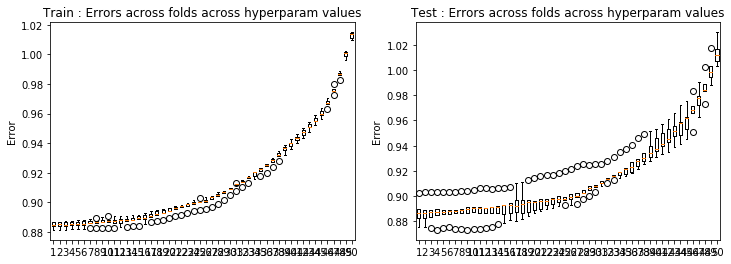

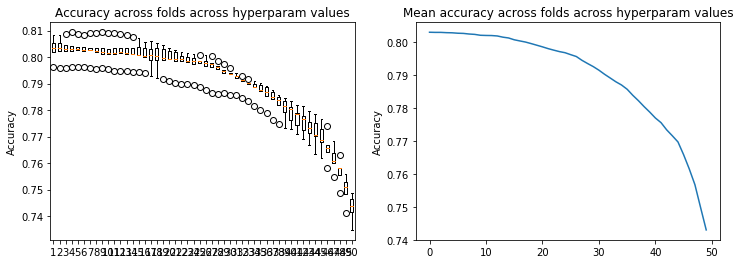

In [45]:
result_crossval(loss_tr23,loss_te23)
result_crossval_accuracy(acc23)

In [16]:
# test 24: degree 7, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr24, loss_te24, w24, acc24 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 7, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  2.17353944e+00  2.38996311e-01 -2.00302389e+00
  1.92793190e+00  2.53309665e-01 -4.02704776e+00  1.16471249e+00
 -5.89274940e-02  5.27033384e-01  1.20315498e-02 -3.40908397e-02
  1.01508080e+00  1.96057098e-02  2.94505269e-02 -9.48632589e-02
  9.24109888e-03 -6.30918904e-02 -5.28171698e-03  9.94392148e-03
 -2.74919785e+01 -1.43214308e+00  3.21322272e+00 -3.97494698e+00
 -3.30911364e-01  1.56131505e+01 -2.37731353e+00  7.93763607e-02
  1.18998465e+00  8.88474397e-03 -1.66087415e-02 -4.79226524e+00
 -5.57560654e-02  6.15473623e-03  1.46941855e+00 -3.59527697e-03
 -4.88248307e-01  1.81991374e-01 -3.89590698e-02  9.58102404e+01
  4.73193854e+00  1.02159323e+01  4.20929351e+00 -1.85259651e+00
 -1.97411688e+01  2.58487570e+00  3.60836852e-01 -3.87607951e+00
 -1.08790340e-01  1.8237

Ridge regression: w=[-2.76819782e-01  2.06889287e+00  1.70718940e-01 -1.91717570e+00
  1.72342571e+00  1.76009294e-01 -2.76336611e+00  1.40561411e+00
 -4.61734458e-02  1.20457731e+00  2.68146967e-02 -2.50928101e-02
  1.35372971e+00  4.84560164e-03  1.42097226e-02 -2.74836374e-01
  2.56633286e-03 -1.78704743e-01 -1.45814030e-03 -1.44166898e-03
 -2.70344891e+01 -1.06250604e+00  2.85378403e+00 -2.81542312e+00
  1.03215939e-01  1.08295161e+01 -2.20847941e+00  8.12810019e-02
 -1.45506171e+00  2.30157682e-02  1.62549930e-02 -6.47450115e+00
 -6.51810755e-02  9.89244858e-04  2.49727914e+00  1.75475865e-03
 -2.22717694e-01  1.79673075e-01 -1.85848136e-02  9.51608448e+01
  4.16497941e+00  1.09613915e+01  1.71644057e+00 -3.24086968e+00
 -1.32840739e+01  6.41192904e-01  1.91939724e-01  4.25895382e-01
 -1.84847118e-01  1.24652039e-01  9.88180944e+00 -3.74074564e-02
 -3.91680169e-02 -6.61145109e+00  1.22963473e-02  2.92050910e+00
 -2.97481287e-02  2.61627034e-03 -1.31394057e+02 -1.40916015e+01
 -3.9

Ridge regression: w=[-2.78869250e-01  1.58177740e+00  1.57480419e-01 -2.10555739e+00
  1.65541006e+00  2.47398235e-01 -3.01735199e+00  1.49625849e+00
 -4.42917136e-02  8.94458666e-01  3.15500881e-02 -2.73829922e-02
  7.00900233e-01  1.80084912e-03  1.00958289e-02 -1.75725768e-03
  9.96572704e-03 -1.42205994e-01 -4.97709947e-03  2.06090385e-03
 -2.33158822e+01 -9.67200127e-01  4.09322351e+00 -2.29299561e+00
 -7.38172915e-01  1.16804739e+01 -2.52513366e+00  1.11222429e-01
  1.92484855e-01  1.00817685e-02  1.85268481e-03 -4.57139222e+00
 -7.57195785e-02 -1.46528721e-02  6.61191469e-01 -1.17045100e-02
 -2.09598472e-01  1.85672870e-01  7.24309636e-03  8.26450211e+01
  3.60855267e+00  6.62908064e+00  1.16937822e+00  8.52529766e-01
 -1.41314298e+01  1.32361563e+00  1.89241786e-01 -2.39701962e+00
 -2.08009658e-01  1.69093436e-01  8.27360141e+00 -4.88294995e-02
 -2.15723275e-02 -1.35613635e+00 -5.54430989e-02  2.10014692e+00
  5.99674428e-04 -3.85544720e-02 -1.08609356e+02 -1.25694741e+01
 -3.0

Ridge regression: w=[-2.78727903e-01  1.08836292e+00  1.19831296e-01 -1.91250497e+00
  1.79032709e+00  3.40371663e-01 -2.21320297e+00  7.87660325e-01
 -7.78444391e-02  1.43262872e+00  1.41637406e-02 -1.63630979e-02
  8.28209346e-01  4.75471351e-03  1.25483654e-02 -1.47707009e-01
  2.10627829e-02 -6.48204652e-02 -5.37355384e-03 -6.96705618e-04
 -1.99111884e+01 -3.00459758e-01  3.54245437e+00 -3.06599179e+00
 -1.16330405e+00  8.41308321e+00 -8.22428302e-01  5.51706328e-02
 -2.85657333e+00  4.51331878e-04 -1.38004750e-03 -3.48911171e+00
 -4.98415560e-02  2.23308565e-03  1.68243939e+00  1.17166644e-02
 -3.75306078e-01  1.63313687e-01 -2.32251989e-02  7.24705300e+01
  3.16068927e-01  5.64837828e+00  2.61863052e+00  1.16262815e+00
 -9.25981096e+00 -4.77343927e-01  3.31272870e-01  2.66207816e+00
 -1.23944067e-01  1.06044195e-01  4.83668300e+00 -5.42814180e-02
 -6.60126765e-02 -4.41965505e+00 -1.00429839e-01  2.11139356e+00
  1.00674242e-02 -2.88519170e-02 -9.14981767e+01 -4.75505464e+00
 -2.4

Ridge regression: w=[-2.75017651e-01  3.88313718e-01  1.00316681e-01 -2.22906473e+00
  2.07701935e+00  2.99858584e-01 -2.16658089e+00  9.23872958e-01
 -9.32969511e-02  1.14359744e+00  2.71461236e-02 -4.42907887e-02
  2.89063495e-01  8.52855799e-03  2.50128827e-02 -1.68909550e-01
  6.17057693e-03 -1.47206681e-01 -1.16394972e-02 -1.94120626e-02
 -1.54358167e+01 -2.06822417e-01  5.42763435e+00 -4.14208013e+00
 -9.88497699e-01  8.42592132e+00 -3.71577481e-01  9.67142805e-02
 -9.51609148e-01  1.46451267e-02 -2.92045678e-03 -2.15442780e+00
 -7.06653787e-02 -2.79587568e-03  1.92823000e+00  7.82950596e-03
  1.41095416e-01  1.80214123e-01 -1.13761990e-03  6.04810899e+01
  4.78966682e-02  1.20412617e+00  4.00174088e+00  1.01770259e+00
 -9.55442736e+00 -2.12147681e+00  3.93972625e-01 -1.22170701e+00
 -2.03107293e-01  2.05283470e-01  3.75508840e+00 -6.13341164e-02
 -1.25501864e-01 -5.44430757e+00 -5.08338379e-02  1.06604587e+00
  3.16283881e-02  4.98714724e-02 -7.57564064e+01 -4.14144746e+00
 -1.8

Ridge regression: w=[-2.76431071e-01  3.46917712e-02  1.45299765e-01 -1.88888312e+00
  2.23040015e+00  2.93974360e-01 -2.29033111e+00  1.04990899e+00
 -5.55959802e-02  7.16108927e-01  1.22923281e-02 -3.40552183e-02
  2.59960726e-01  2.01355693e-02  2.88506315e-02 -8.63749306e-02
  9.62036656e-03 -1.92963110e-01 -5.45338128e-03  9.96276096e-03
 -1.31667203e+01 -4.09897174e-01  3.91196042e+00 -5.32276325e+00
 -8.16391955e-01  8.32392695e+00 -1.79666826e+00  7.49008888e-02
  2.01381405e-01  9.26663284e-03 -1.63852765e-02 -1.63087044e+00
 -5.63663103e-02  6.55733141e-03  1.45208838e+00 -2.75630058e-03
  2.01470771e-01  1.81996871e-01 -3.93814447e-02  5.40847063e+01
  1.21107523e-01  3.04590425e+00  6.86536472e+00  5.63451733e-01
 -8.55395911e+00  1.14538039e+00  3.36425237e-01 -1.92522018e+00
 -1.11306478e-01  1.80307348e-01  2.69880046e+00 -1.29694067e-01
 -1.20069467e-01 -4.41687136e+00 -6.51926590e-02  1.21789352e+00
 -5.47342822e-03 -7.63361158e-02 -6.62605895e+01 -2.95567542e+00
 -1.6

Ridge regression: w=[-2.76819763e-01 -6.13889943e-02  7.30018896e-02 -1.80572440e+00
  2.12222740e+00  2.36441770e-01 -1.62833077e+00  1.46034268e+00
 -4.38901220e-02  1.18044273e+00  2.69018335e-02 -2.52424913e-02
  3.19640335e-01  5.32073497e-03  1.35002995e-02 -2.49566149e-01
  2.86340560e-03 -3.31204849e-01 -1.73695095e-03 -1.54311468e-03
 -1.27603787e+01  9.73392331e-03  3.62294183e+00 -4.70140847e+00
 -6.15954823e-01  6.08430443e+00 -2.21887849e+00  7.67982414e-02
 -1.28574791e+00  2.35987368e-02  1.64438494e-02 -2.27080517e+00
 -6.52420378e-02  1.38697248e-03  2.33895294e+00  2.71164167e-03
  5.61439633e-01  1.79535838e-01 -1.89301255e-02  5.36211969e+01
 -6.84387551e-01  3.45848942e+00  5.50500498e+00  3.20657782e-01
 -6.06141417e+00  3.34073571e-01  1.72422447e-01  3.10541292e-01
 -1.86159481e-01  1.24028950e-01  3.71612597e+00 -3.92392758e-02
 -3.71451658e-02 -6.18707438e+00  1.13900206e-02  1.30668597e+00
 -2.93026469e-02  2.00363591e-03 -6.61674505e+01 -2.62787452e+00
 -1.7

Ridge regression: w=[-2.78869221e-01 -5.98868685e-01  6.84775095e-02 -1.87588839e+00
  2.04251251e+00  2.54108760e-01 -1.74084601e+00  1.45421822e+00
 -4.09449974e-02  1.00836075e+00  3.16607223e-02 -2.78056995e-02
 -2.18503120e-01  2.29863230e-03  9.74356386e-03 -2.49964597e-02
  1.05930620e-02 -2.84847422e-01 -5.05134012e-03  1.71477525e-03
 -9.49945302e+00  2.93866532e-02  3.89293126e+00 -3.85714995e+00
 -8.35558996e-01  6.32422621e+00 -2.28356335e+00  1.06453280e-01
 -4.16748716e-01  1.09023678e-02  2.58335646e-03 -6.85000515e-01
 -7.54993925e-02 -1.43494913e-02  9.57111077e-01 -1.10385526e-02
  4.67473525e-01  1.85412821e-01  7.10561055e-03  4.54369452e+01
 -9.62899609e-01  2.56353301e+00  3.60069012e+00  1.39554506e+00
 -5.93519529e+00  7.10903569e-01  1.66153735e-01 -1.08696292e+00
 -2.09650129e-01  1.69617140e-01  2.35163215e+00 -5.07660771e-02
 -2.10309219e-02 -2.80690861e+00 -5.74132569e-02  9.65973571e-01
  5.46140449e-04 -3.82939544e-02 -5.65869827e+01 -1.63252475e+00
 -1.4

Ridge regression: w=[-2.78727862e-01 -1.15606401e+00  8.66660489e-02 -1.63146566e+00
  2.15008210e+00  3.55544486e-01 -1.38493519e+00  8.93091607e-01
 -7.65953792e-02  1.20655453e+00  1.44243941e-02 -1.55758581e-02
  2.21643930e-01  5.05521063e-03  1.25133190e-02 -1.27566232e-01
  2.19758788e-02 -2.18647153e-01 -5.13054773e-03  4.36141984e-04
 -6.23041608e+00  1.29401328e-01  2.79111497e+00 -4.32416276e+00
 -1.40233154e+00  4.98203384e+00 -1.04882792e+00  5.18567370e-02
 -1.78874784e+00  8.13186926e-04 -1.23227260e-03 -1.08921883e+00
 -4.99308798e-02  2.36569600e-03  1.60393175e+00  1.29069307e-02
  3.72766161e-01  1.62933355e-01 -2.34359859e-02  3.80305797e+01
 -1.83175025e+00  4.04653442e+00  4.22170210e+00  2.55785065e+00
 -4.07722377e+00 -3.06699889e-01  3.24218264e-01  1.07606422e+00
 -1.26019277e-01  1.01840000e-01  1.35382759e+00 -5.56455944e-02
 -6.61388250e-02 -4.45450102e+00 -1.03712728e-01  8.01544876e-01
  8.43487254e-03 -3.33132248e-02 -4.92688151e+01  7.00312007e-01
 -1.4

Ridge regression: w=[-2.75017591e-01 -1.89048484e+00  7.55941798e-02 -1.88795454e+00
  2.28212523e+00  3.09243923e-01 -1.23867981e+00  1.33081864e+00
 -9.27539062e-02  1.41013895e+00  2.73335821e-02 -4.39130783e-02
 -2.90282200e-01  8.94139559e-03  2.44804124e-02 -1.11807594e-01
  7.41088831e-03 -2.65433046e-01 -1.16570662e-02 -1.91985637e-02
 -1.92431943e+00  1.44485946e-01  4.20133157e+00 -4.56832679e+00
 -1.15892801e+00  4.62712904e+00 -1.46877553e+00  9.27109494e-02
 -1.70571252e+00  1.46637835e-02 -2.90966381e-03 -1.39737458e-01
 -7.13138630e-02 -2.30402511e-03  1.54936084e+00  8.24748501e-03
  7.14202853e-01  1.80092740e-01 -1.43562281e-03  2.81058866e+01
 -1.81437908e+00  1.32070949e+00  3.91860737e+00  2.06566349e+00
 -3.91163645e+00 -7.00065401e-01  3.89684450e-01  5.08416842e-02
 -2.05077903e-01  2.03695262e-01  8.70380332e-01 -6.24979806e-02
 -1.22302417e-01 -4.39662248e+00 -5.52062656e-02  3.77836054e-02
  3.13340085e-02  4.93984063e-02 -4.01538435e+01  7.88209807e-01
 -1.2

Ridge regression: w=[-2.76430984e-01 -2.32349286e+00  1.30052206e-01 -1.65998798e+00
  2.31427312e+00  2.98082216e-01 -1.43810582e+00  9.30495951e-01
 -5.47917373e-02  7.78069639e-01  1.25711453e-02 -3.34840757e-02
 -6.71094496e-02  2.08351225e-02  2.82265180e-02 -3.02173898e-02
  1.10942513e-02 -3.18254282e-01 -5.85180785e-03  1.06289984e-02
  5.30577326e-01 -1.75127447e-01  3.18862102e+00 -4.87974652e+00
 -9.05922979e-01  4.91705494e+00 -1.37747301e+00  7.09327554e-02
 -3.25488908e-01  9.62038809e-03 -1.62469663e-02 -1.84409292e-01
 -5.73540026e-02  7.21663520e-03  1.10502166e+00 -1.69441113e-03
  8.39861693e-01  1.81497208e-01 -4.02361842e-02  2.25492372e+01
 -1.18311836e+00  2.63403431e+00  4.78861258e+00  1.15270834e+00
 -3.61462705e+00  3.95352518e-01  3.29183706e-01 -7.18822478e-01
 -1.15445426e-01  1.76455998e-01  5.21483622e-01 -1.31957376e-01
 -1.19114451e-01 -3.59851122e+00 -7.03424501e-02 -7.84377166e-03
 -4.33570313e-03 -7.96720978e-02 -3.50488057e+01  6.12439242e-01
 -1.1

Ridge regression: w=[-2.76819676e-01 -2.40204391e+00  6.37285011e-02 -1.57426635e+00
  2.29740878e+00  2.41785117e-01 -1.05268934e+00  1.43504092e+00
 -4.51517459e-02  1.06761818e+00  2.71638201e-02 -2.52596935e-02
 -1.33228121e-01  5.61042926e-03  1.20567425e-02 -1.72166951e-01
  4.31993254e-03 -4.88418599e-01 -2.06052668e-03 -1.26711561e-03
  8.71007418e-01  2.14080224e-01  2.91145449e+00 -4.75522226e+00
 -7.43638837e-01  3.79745394e+00 -2.18577242e+00  7.37566094e-02
 -9.39154938e-01  2.46025403e-02  1.64104439e-02 -3.38722136e-01
 -6.54788464e-02  1.56778952e-03  1.84513702e+00  4.30919240e-03
  1.35831856e+00  1.78848646e-01 -1.99520051e-02  2.21987251e+01
 -1.96691573e+00  2.96558942e+00  4.38874445e+00  1.17509403e+00
 -2.77268248e+00  3.42860157e-01  1.75896074e-01 -1.71499176e-02
 -1.89406411e-01  1.23020794e-01  8.01944141e-01 -4.06799691e-02
 -3.23224339e-02 -4.95137119e+00  5.64294658e-03 -1.97629355e-01
 -2.90856257e-02 -8.28932938e-04 -3.51160296e+01  1.08608082e+00
 -1.1

Ridge regression: w=[-2.78869094e-01 -2.90914348e+00  7.30256633e-02 -1.78160592e+00
  2.30917417e+00  2.41850832e-01 -1.14287849e+00  1.28051830e+00
 -4.12228417e-02  9.31230488e-01  3.17830030e-02 -2.83755927e-02
 -4.57461712e-01  2.79649532e-03  9.36376503e-03  2.05357417e-02
  1.23139179e-02 -4.18732114e-01 -5.46670474e-03  1.41591396e-03
  3.79265151e+00  1.14271597e-01  3.77209326e+00 -4.27777655e+00
 -7.59514455e-01  4.01339900e+00 -1.91512445e+00  1.03534311e-01
 -4.92391183e-01  1.19890299e-02  2.95144712e-03  5.99637466e-01
 -7.54936093e-02 -1.39446519e-02  7.09731709e-01 -1.02356245e-02
  1.13533624e+00  1.84820914e-01  6.87981885e-03  1.55504833e+01
 -1.80919095e+00  1.35669241e+00  2.95895239e+00  1.26167552e+00
 -2.73456475e+00  3.65684159e-01  1.66357058e-01 -5.45061282e-01
 -2.12729062e-01  1.70957460e-01  1.87490585e-01 -5.31793969e-02
 -2.01168987e-02 -2.39604729e+00 -6.39381182e-02 -2.37120905e-01
  1.62123510e-03 -3.85250309e-02 -2.92293712e+01  1.25108649e+00
 -1.0

Ridge regression: w=[-2.78727676e-01 -3.31428098e+00  1.18794929e-01 -1.73040445e+00
  2.36479966e+00  3.21722275e-01 -9.35904457e-01  8.85677869e-01
 -7.82424911e-02  9.96043737e-01  1.48248134e-02 -1.43542581e-02
  3.88423415e-02  5.42047883e-03  1.25150571e-02 -3.50023131e-02
  2.36772908e-02 -3.28089209e-01 -5.13243063e-03  2.14383927e-03
  6.25406427e+00 -3.61885516e-02  3.65549131e+00 -4.43095082e+00
 -1.19021225e+00  3.40426163e+00 -1.12633152e+00  5.09489427e-02
 -1.08169903e+00  1.26087120e-03 -1.24914710e-03 -3.00345467e-01
 -5.02910181e-02  2.21771647e-03  1.02590950e+00  1.45222177e-02
  9.41471693e-01  1.62352266e-01 -2.42756029e-02  1.01210961e+01
 -1.70678716e+00  1.13159425e+00  2.90145132e+00  2.16369020e+00
 -2.16748305e+00 -4.15232548e-02  3.34785059e-01  2.37310231e-01
 -1.29666090e-01  9.59669600e-02  1.79554079e-01 -5.77989688e-02
 -6.58856988e-02 -3.08686606e+00 -1.09523399e-01 -2.60251462e-01
  7.30689437e-03 -3.91752768e-02 -2.49179535e+01  1.57736554e+00
 -9.4

Ridge regression: w=[-2.75017324e-01 -3.69782554e+00  1.13510027e-01 -1.96519224e+00
  2.31798196e+00  2.75497084e-01 -7.28463883e-01  1.19178615e+00
 -9.55168116e-02  1.20715059e+00  2.74613147e-02 -4.32820128e-02
 -3.14264169e-01  9.11847495e-03  2.36848031e-02  1.01250008e-03
  9.12646736e-03 -3.11660769e-01 -1.19832501e-02 -1.88995042e-02
  8.59497496e+00 -8.02994318e-02  5.00847935e+00 -4.13026227e+00
 -9.41883712e-01  2.89622463e+00 -1.44580622e+00  9.24760405e-02
 -1.43164415e+00  1.48062370e-02 -3.19269753e-03  2.65882632e-01
 -7.24112708e-02 -1.77276507e-03  8.30232550e-01  8.28999936e-03
  9.74971937e-01  1.80029253e-01 -1.81605185e-03  4.58559269e+00
 -1.48298512e+00 -1.38712138e+00  2.11255477e+00  1.61508889e+00
 -1.95686802e+00 -2.21301210e-01  4.03096191e-01  2.49747826e-01
 -2.07059872e-01  2.01283681e-01  5.89184579e-02 -6.28024110e-02
 -1.17784662e-01 -2.61374880e+00 -6.08940015e-02 -4.89389447e-01
  3.18090652e-02  4.91017025e-02 -2.00351496e+01  1.32526703e+00
 -8.0

Ridge regression: w=[-2.76430592e-01 -3.86824172e+00  1.59785306e-01 -1.85917931e+00
  2.21040679e+00  2.79532730e-01 -8.45604182e-01  7.17146693e-01
 -5.66261282e-02  6.29873310e-01  1.27267099e-02 -3.24703952e-02
 -7.58503212e-02  2.16006261e-02  2.77146007e-02  8.14946985e-02
  1.27960914e-02 -3.49695517e-01 -6.47902718e-03  1.13497240e-02
  9.69464488e+00 -3.64316896e-01  4.66276632e+00 -3.83979086e+00
 -7.94180171e-01  3.06556505e+00 -9.73808673e-01  7.11682560e-02
 -2.36201874e-01  9.87305954e-03 -1.58447369e-02  1.19769963e-01
 -5.85931286e-02  8.06454039e-03  3.92162234e-01 -1.28858176e-03
  1.05989875e+00  1.81435340e-01 -4.10198764e-02  1.82779462e+00
 -8.55087419e-01 -1.35954027e+00  2.00758052e+00  9.41661815e-01
 -1.85634664e+00  1.09076498e-01  3.33315105e-01 -3.68420306e-01
 -1.18888250e-01  1.71389129e-01 -5.89490818e-02 -1.34386182e-01
 -1.18020543e-01 -1.84622544e+00 -7.58617012e-02 -5.27199033e-01
 -2.37951491e-03 -8.19787646e-02 -1.74671849e+01  8.90323266e-01
 -7.2

Ridge regression: w=[-2.76819284e-01 -3.91953558e+00  1.10602405e-01 -1.78741046e+00
  2.22276606e+00  2.15692851e-01 -6.10133667e-01  1.08870264e+00
 -5.01121461e-02  7.62840424e-01  2.73314949e-02 -2.50768314e-02
 -9.73117456e-02  5.87803940e-03  1.06000631e-02 -2.82840991e-02
  5.83695560e-03 -5.16914907e-01 -2.47210050e-03 -8.96433852e-04
  9.93546338e+00 -8.95330060e-02  4.45052500e+00 -3.88224886e+00
 -5.76767823e-01  2.43359604e+00 -1.67479103e+00  7.51829501e-02
 -4.35742028e-01  2.54594231e-02  1.63784880e-02  2.02240693e-02
 -6.60251556e-02  1.51885245e-03  9.27340399e-01  5.49249983e-03
  1.60571799e+00  1.78535215e-01 -2.13670603e-02  1.60567738e+00
 -1.37242312e+00 -1.14258066e+00  1.94286385e+00  8.37774120e-01
 -1.51389084e+00  3.05743348e-01  1.98586580e-01 -2.13471389e-01
 -1.91787404e-01  1.21708719e-01  8.10715302e-03 -4.20981745e-02
 -2.66063461e-02 -2.68908190e+00  9.89316329e-05 -8.37589385e-01
 -2.84306406e-02 -2.58741840e-03 -1.76010903e+01  1.18119920e+00
 -7.2

Ridge regression: w=[-2.78868519e-01 -4.04186911e+00  1.24259327e-01 -1.93683106e+00
  2.14359866e+00  2.14793292e-01 -5.89435234e-01  8.56456317e-01
 -4.51890682e-02  6.37443669e-01  3.17735613e-02 -2.84557158e-02
 -2.52748547e-01  3.30159439e-03  9.34197106e-03  1.04233555e-01
  1.38988987e-02 -4.20060113e-01 -5.91382875e-03  1.44116865e-03
  1.08541432e+01 -2.30282219e-01  5.08732747e+00 -3.39837098e+00
 -5.70924620e-01  2.38677005e+00 -1.25122483e+00  1.06087599e-01
 -1.58945245e-01  1.27431375e-02  3.30483192e-03  4.93504597e-01
 -7.58584142e-02 -1.32009871e-02  1.85488477e-01 -1.03802783e-02
  1.25178764e+00  1.84663456e-01  6.54770304e-03 -9.83676512e-01
 -1.05722352e+00 -2.30900019e+00  1.12806551e+00  7.65887867e-01
 -1.44629952e+00  1.95942417e-01  1.85211389e-01 -4.35997519e-01
 -2.14774066e-01  1.70733592e-01 -2.23185637e-01 -5.52884347e-02
 -1.93530195e-02 -1.14811026e+00 -6.87231017e-02 -6.36584745e-01
  2.95313716e-03 -3.78311285e-02 -1.49263328e+01  1.04602626e+00
 -6.3

Ridge regression: w=[-2.78726839e-01 -4.03392797e+00  1.70232577e-01 -1.84432223e+00
  2.01165614e+00  2.65622744e-01 -3.66119953e-01  6.06232265e-01
 -8.19917289e-02  6.77659484e-01  1.49271267e-02 -1.31305435e-02
  1.06745350e-01  5.99041753e-03  1.28741397e-02  7.64708572e-02
  2.49006273e-02 -3.02657919e-01 -5.13301788e-03  3.52514607e-03
  1.13272010e+01 -4.05527400e-01  4.90673148e+00 -3.11011587e+00
 -8.04115220e-01  1.83520422e+00 -7.38994488e-01  5.55321920e-02
 -4.80292509e-01  1.27415075e-03 -5.47369882e-04 -2.17566108e-01
 -5.07959807e-02  2.17961308e-03  3.14871642e-01  1.51775676e-02
  9.57141915e-01  1.62736686e-01 -2.53209960e-02 -2.76844814e+00
 -7.93582154e-01 -2.52977913e+00  9.28894198e-01  1.16146906e+00
 -1.18488874e+00 -8.10785671e-03  3.50174927e-01 -8.93140635e-02
 -1.31203337e-01  9.06338340e-02 -9.64226934e-02 -6.05967734e-02
 -6.56986337e-02 -1.33674445e+00 -1.12158137e-01 -5.31394246e-01
  6.57321650e-03 -4.14912818e-02 -1.30262392e+01  9.38932512e-01
 -5.6

Ridge regression: w=[-2.75016121e-01 -3.96708289e+00  1.55376220e-01 -1.84369473e+00
  1.75514502e+00  2.29177130e-01 -1.54104707e-01  6.88606044e-01
 -9.85688990e-02  7.06710864e-01  2.68586338e-02 -4.20181273e-02
 -7.87133107e-02  9.31667549e-03  2.25675537e-02  9.95941667e-02
  1.04612549e-02 -2.44776351e-01 -1.24349670e-02 -1.84602673e-02
  1.14204445e+01 -4.01215613e-01  5.32963487e+00 -2.44715606e+00
 -6.32456440e-01  1.31998026e+00 -7.68540913e-01  9.85179987e-02
 -6.29187526e-01  1.52139485e-02 -2.67553003e-03  6.91473774e-02
 -7.38725181e-02 -6.01607274e-04  2.03297245e-01  7.41122526e-03
  8.15038610e-01  1.80567328e-01 -1.89743503e-03 -4.01294877e+00
 -6.60197279e-01 -3.56457919e+00  3.75945979e-01  8.24812769e-01
 -9.92614776e-01 -1.54006311e-01  4.10708597e-01  8.01597070e-02
 -2.05051817e-01  1.95459032e-01 -9.44116124e-02 -6.27499508e-02
 -1.11132109e-01 -1.06905899e+00 -6.29388269e-02 -5.02984455e-01
  3.32579762e-02  5.01279311e-02 -1.10295602e+01  7.14732868e-01
 -4.9

Ridge regression: w=[-2.76428832e-01 -3.78792070e+00  1.79553974e-01 -1.68239826e+00
  1.50456061e+00  2.53375708e-01 -1.69733987e-01  4.20658375e-01
 -5.90664902e-02  4.11138568e-01  1.22444684e-02 -2.99877353e-02
  4.92128673e-02  2.23909660e-02  2.74677263e-02  1.57536283e-01
  1.42382139e-02 -2.52169979e-01 -7.04754015e-03  1.21065382e-02
  1.09814867e+01 -5.43826700e-01  4.81114425e+00 -1.84255470e+00
 -6.48157198e-01  1.25348305e+00 -5.03727098e-01  7.72656193e-02
  6.36098686e-03  9.79942033e-03 -1.42540440e-02  9.37479147e-03
 -6.01271007e-02  1.02633981e-02 -1.03438450e-01 -2.48858533e-03
  8.08998459e-01  1.82670569e-01 -4.06732726e-02 -4.25687348e+00
 -3.58364848e-01 -3.31034167e+00  1.62523350e-01  6.26537062e-01
 -8.66030593e-01 -2.54735129e-02  3.30464119e-01 -2.87884929e-01
 -1.17913660e-01  1.61398239e-01 -1.47058778e-01 -1.36446380e-01
 -1.14526145e-01 -5.85159345e-01 -7.90011685e-02 -4.90522912e-01
 -2.72371911e-05 -8.07538846e-02 -9.75920033e+00  5.05098829e-01
 -4.3

Ridge regression: w=[-2.76817521e-01 -3.81165113e+00  1.48117981e-01 -1.64291174e+00
  1.51617822e+00  1.88298030e-01 -7.29844277e-02  5.44848416e-01
 -5.60515243e-02  4.04009281e-01  2.66752544e-02 -2.39130005e-02
  1.14316216e-01  6.64826448e-03  9.96250873e-03  7.48020721e-02
  6.69911265e-03 -3.61803204e-01 -2.79996616e-03 -3.78196728e-04
  1.11275023e+01 -3.86887047e-01  4.71035182e+00 -1.89315250e+00
 -3.94922044e-01  1.00033980e+00 -8.39752381e-01  8.18141854e-02
  6.65284090e-05  2.50876078e-02  1.72510814e-02 -1.16772351e-01
 -6.71393441e-02  1.97486051e-03  2.76708012e-01  4.73163392e-03
  1.19150340e+00  1.79506462e-01 -2.24074330e-02 -4.40056265e+00
 -5.96482687e-01 -3.20986217e+00  1.41916114e-01  3.85764546e-01
 -7.44629087e-01  1.61173714e-01  2.20594197e-01 -2.59728618e-01
 -1.88069479e-01  1.16847658e-01 -1.62841891e-01 -4.51827852e-02
 -2.22391671e-02 -1.08027655e+00 -1.32379842e-03 -7.32155537e-01
 -2.69878247e-02 -4.89781312e-04 -9.85351365e+00  5.73453430e-01
 -4.3

Ridge regression: w=[-2.78865932e-01 -3.57217926e+00  1.50427147e-01 -1.59068764e+00
  1.29971420e+00  1.89630899e-01 -2.62306289e-03  4.04827238e-01
 -5.05277257e-02  3.84885614e-01  3.09159420e-02 -2.69340821e-02
  2.94719676e-02  4.16927225e-03  9.99622337e-03  1.49091371e-01
  1.50104412e-02 -2.69402545e-01 -6.06350496e-03  2.32098761e-03
  1.04500025e+01 -4.63936359e-01  4.61042950e+00 -1.30222329e+00
 -4.18054925e-01  8.27282714e-01 -5.55088137e-01  1.13314100e-01
  4.93971645e-02  1.26736170e-02  4.82177847e-03  7.82948706e-02
 -7.72148080e-02 -1.10023479e-02 -1.03060218e-01 -1.24442852e-02
  8.38586977e-01  1.85526694e-01  6.74539316e-03 -4.36729307e+00
 -4.03900207e-01 -3.33980806e+00 -2.39517134e-01  3.97235150e-01
 -6.47726244e-01  5.74460940e-02  2.03294155e-01 -3.41196249e-01
 -2.11061867e-01  1.63662340e-01 -1.99195380e-01 -5.80405103e-02
 -1.87625051e-02 -4.10673981e-01 -6.91095798e-02 -4.81769056e-01
  3.85388148e-03 -3.58763998e-02 -8.52727288e+00  4.85465136e-01
 -3.8

Ridge regression: w=[-2.78723074e-01 -3.23450581e+00  1.82717132e-01 -1.36897224e+00
  1.03554688e+00  2.19608437e-01  1.48402297e-01  3.31416784e-01
 -8.33808910e-02  4.34480472e-01  1.41146242e-02 -1.08170484e-02
  1.80865177e-01  7.06807987e-03  1.40080209e-02  1.26122155e-01
  2.51107879e-02 -1.54111309e-01 -4.68164932e-03  4.35906536e-03
  9.54185445e+00 -5.59772663e-01  4.00618750e+00 -8.32165582e-01
 -5.37884836e-01  4.83075798e-01 -3.28152059e-01  6.39835850e-02
 -1.21642516e-01 -2.70141927e-04  2.12861703e-03 -2.41671880e-01
 -5.20329705e-02  2.73680131e-03 -3.28650629e-03  1.45021720e-02
  5.43637470e-01  1.64775651e-01 -2.56318731e-02 -4.11631612e+00
 -2.95606561e-01 -3.03177421e+00 -3.05082554e-01  5.45448348e-01
 -5.44168912e-01 -5.63338309e-02  3.41495847e-01 -1.81145877e-01
 -1.27299584e-01  8.03404044e-02 -1.59121826e-01 -6.49228276e-02
 -6.61054508e-02 -5.21352264e-01 -1.09248316e-01 -3.54035840e-01
  4.81161993e-03 -3.69921466e-02 -7.35773825e+00  4.36817089e-01
 -3.2

Ridge regression: w=[-2.75010711e-01 -2.90512469e+00  1.57780409e-01 -1.13726753e+00
  7.61401380e-01  1.90021231e-01  2.49407652e-01  3.58670767e-01
 -9.55672380e-02  3.80996079e-01  2.42756819e-02 -3.84285604e-02
  6.44160965e-02  9.73592696e-03  2.06770575e-02  1.39463746e-01
  1.15758985e-02 -9.41265397e-02 -1.31076141e-02 -1.73346676e-02
  8.51835404e+00 -4.95047077e-01  3.60163748e+00 -3.40932236e-01
 -4.27078001e-01  2.48070668e-01 -3.11531141e-01  1.07620877e-01
 -1.11073885e-01  1.53842632e-02 -4.40785334e-04 -8.40848508e-02
 -7.65222492e-02  2.20116764e-03 -4.40545043e-02  5.31095908e-03
  3.84581744e-01  1.81963764e-01 -7.37104491e-04 -3.59306565e+00
 -3.08507141e-01 -3.04070844e+00 -4.78008375e-01  3.89398593e-01
 -4.69725444e-01 -1.53120346e-01  3.78803460e-01 -4.84801591e-02
 -1.93077407e-01  1.76999021e-01 -1.12674118e-01 -6.22708290e-02
 -9.83066742e-02 -4.48770485e-01 -6.07840413e-02 -2.78351090e-01
  3.63794614e-02  5.14848401e-02 -6.19669481e+00  3.38756281e-01
 -2.8

Ridge regression: w=[-2.76420912e-01 -2.54657924e+00  1.69684541e-01 -9.41341657e-01
  5.60209135e-01  2.13427689e-01  2.17232275e-01  2.39663333e-01
 -5.72050113e-02  3.18330108e-01  1.01420268e-02 -2.39039906e-02
  1.24041695e-01  2.24447251e-02  2.66181339e-02  1.72527357e-01
  1.49185136e-02 -8.65696555e-02 -7.33606062e-03  1.22831017e-02
  7.39396128e+00 -5.53532642e-01  2.93212574e+00  5.23874904e-03
 -4.80711938e-01  2.29463736e-01 -2.20181981e-01  8.52576812e-02
  3.86222475e-02  8.52383693e-03 -1.08321049e-02 -9.53403112e-02
 -6.27777104e-02  1.45758206e-02 -2.24554934e-01 -4.76790959e-03
  3.37233531e-01  1.85260160e-01 -3.80040752e-02 -2.89989208e+00
 -2.11945911e-01 -2.53578152e+00 -4.35955466e-01  3.81289213e-01
 -3.81389130e-01 -9.24377379e-02  2.98795859e-01 -1.95988182e-01
 -1.08175864e-01  1.35051190e-01 -1.40347311e-01 -1.33521470e-01
 -1.03788549e-01 -1.86037845e-01 -7.67892171e-02 -2.44358858e-01
  2.18163147e-03 -7.21098060e-02 -5.24218486e+00  2.96954664e-01
 -2.3

Ridge regression: w=[-2.76809590e-01 -2.54946643e+00  1.50188761e-01 -9.29217683e-01
  5.63095173e-01  1.65265430e-01  2.43569052e-01  2.29863896e-01
 -5.93577576e-02  2.69652139e-01  2.38459844e-02 -2.04040745e-02
  2.10996248e-01  8.04118451e-03  9.88796972e-03  1.20277271e-01
  7.55575410e-03 -1.21516865e-01 -3.12518800e-03 -6.10529035e-05
  7.45562811e+00 -4.65514926e-01  2.92387505e+00 -2.13201628e-02
 -2.78756678e-01  1.63133207e-01 -3.13774775e-01  8.96556530e-02
  6.06159238e-02  2.26027587e-02  1.94336017e-02 -2.00355297e-01
 -6.92637358e-02  3.41005682e-03  2.42276652e-02  2.27555880e-03
  4.90975482e-01  1.81807493e-01 -2.26634925e-02 -2.97207838e+00
 -3.11127942e-01 -2.50940163e+00 -4.63699022e-01  1.59844772e-01
 -3.50852775e-01  2.52788206e-02  2.29422771e-01 -1.75812298e-01
 -1.71495243e-01  1.00507946e-01 -1.94115787e-01 -4.96544831e-02
 -1.88754340e-02 -4.85754427e-01 -2.28937462e-03 -3.51030925e-01
 -2.45555206e-02  6.63301017e-03 -5.28114849e+00  2.77760278e-01
 -2.2

Ridge regression: w=[-2.78854296e-01 -2.20668317e+00  1.41902763e-01 -7.72977985e-01
  4.29536892e-01  1.59892612e-01  2.66258785e-01  1.77752180e-01
 -5.33030620e-02  3.11420422e-01  2.71416870e-02 -2.17458696e-02
  1.45868587e-01  4.81835562e-03  1.12506007e-02  1.59123415e-01
  1.52669643e-02 -8.70900143e-02 -5.71664825e-03  3.00948030e-03
  6.36767543e+00 -4.86426349e-01  2.43009874e+00  1.92650827e-01
 -2.88612517e-01  1.04876958e-01 -1.93608908e-01  1.18332636e-01
  3.79728520e-03  1.14865295e-02  7.66367004e-03 -1.09002021e-01
 -7.98642815e-02 -7.07472168e-03 -1.70475359e-01 -1.52447718e-02
  3.18646314e-01  1.87345401e-01  8.23273497e-03 -2.25557910e+00
 -2.26053021e-01 -2.14086289e+00 -4.55637749e-01  1.90428804e-01
 -2.99806899e-01 -2.57601045e-02  2.11975284e-01 -2.12017796e-01
 -1.90803675e-01  1.37198314e-01 -1.60668577e-01 -5.74919163e-02
 -1.85944311e-02 -1.88147114e-01 -6.41775193e-02 -2.02852670e-01
  3.32374311e-03 -2.91422789e-02 -4.39284931e+00  2.52057204e-01
 -1.8

Ridge regression: w=[-2.78706137e-01 -1.85599073e+00  1.66021456e-01 -5.76164453e-01
  2.70499307e-01  1.70680645e-01  3.27256422e-01  1.93895299e-01
 -7.71210468e-02  3.46149422e-01  1.05526678e-02 -6.22470236e-03
  1.91571598e-01  7.01511577e-03  1.41094809e-02  1.46937090e-01
  2.22667786e-02 -1.91251809e-02 -3.73002211e-03  4.26879786e-03
  5.35369387e+00 -5.39036568e-01  1.83424150e+00  3.48697243e-01
 -3.31830696e-01 -2.22473966e-02 -1.25922550e-01  6.92077685e-02
 -4.24686540e-02 -3.45811040e-03  5.39216908e-03 -2.28000925e-01
 -5.42551869e-02  3.55587277e-03 -1.13905286e-01  1.37379730e-02
  1.62748110e-01  1.67738550e-01 -2.42111268e-02 -1.66583247e+00
 -2.01057394e-01 -1.70606589e+00 -3.13652467e-01  2.30194669e-01
 -2.85868647e-01 -7.73941176e-02  2.97771521e-01 -1.55168251e-01
 -1.08492376e-01  5.69086748e-02 -1.69189504e-01 -6.15148437e-02
 -5.93328966e-02 -2.53616489e-01 -9.14639429e-02 -1.49297348e-01
  1.47284636e-03 -2.65375124e-02 -3.62490622e+00  2.53643185e-01
 -1.4

Ridge regression: w=[-2.74986375e-01 -1.57148589e+00  1.42847830e-01 -3.69224570e-01
  1.70963746e-01  1.46936314e-01  3.45258743e-01  2.09870768e-01
 -8.21349497e-02  2.79813337e-01  1.67997144e-02 -2.97301021e-02
  1.13464919e-01  8.54681156e-03  1.65298816e-02  1.60272736e-01
  1.04214434e-02  1.08331084e-02 -1.29908994e-02 -1.48711084e-02
  4.49730857e+00 -4.81962812e-01  1.36241892e+00  3.94067696e-01
 -2.54616307e-01 -7.14090216e-02 -1.31029304e-01  1.08021159e-01
  2.02096097e-02  1.42728639e-02  1.71842626e-03 -1.30272642e-01
 -7.87428286e-02  5.65187863e-03 -1.45326687e-01  3.73080056e-03
  9.06566639e-02  1.83414845e-01  8.27528234e-04 -1.12587236e+00
 -2.29284219e-01 -1.45697292e+00 -2.51594801e-01  1.47952965e-01
 -2.65287139e-01 -1.21329560e-01  3.01868903e-01 -6.98205636e-02
 -1.53613463e-01  1.29607241e-01 -1.16772619e-01 -5.18513217e-02
 -7.12978868e-02 -2.28416690e-01 -4.79399233e-02 -1.17191681e-01
  3.59910887e-02  4.58199610e-02 -2.98342776e+00  2.14958356e-01
 -1.1

Ridge regression: w=[-2.76385290e-01 -1.31265726e+00  1.48142321e-01 -3.11419344e-01
  1.05646759e-01  1.58438102e-01  2.92659515e-01  1.31649980e-01
 -4.74680549e-02  2.84502987e-01  3.75250686e-03 -1.36371752e-02
  1.53738376e-01  1.75556933e-02  2.17530282e-02  1.66901303e-01
  1.13537875e-02  1.06143320e-02 -6.97135631e-03  9.36550038e-03
  3.75678500e+00 -5.09579898e-01  1.02932067e+00  4.65737171e-01
 -2.72661482e-01 -3.51703737e-02 -9.16595916e-02  8.24814261e-02
  1.10816769e-02  6.36303628e-03 -8.40680190e-03 -1.24198777e-01
 -6.52733258e-02  1.72987830e-02 -2.13557855e-01 -5.70339176e-03
  6.96668923e-02  1.87320912e-01 -3.35730292e-02 -7.10683036e-01
 -1.93030882e-01 -1.10260163e+00 -1.38879305e-01  1.41728301e-01
 -2.06070457e-01 -7.73257868e-02  2.37313420e-01 -1.24241771e-01
 -7.38137953e-02  8.29230244e-02 -1.32325020e-01 -1.03467955e-01
 -7.23538271e-02 -1.09674551e-01 -5.45807983e-02 -9.97952965e-02
  2.03204990e-03 -4.95354688e-02 -2.47601753e+00  2.19569754e-01
 -9.1

Ridge regression: w=[-2.76773919e-01 -1.30915401e+00  1.38006611e-01 -3.00186877e-01
  1.00944978e-01  1.39294054e-01  3.00372083e-01  1.15728750e-01
 -5.61837831e-02  2.56601327e-01  1.56700757e-02 -1.34668129e-02
  2.06386811e-01  7.17429675e-03  9.11827200e-03  1.53613747e-01
  7.90913154e-03  9.89902893e-03 -3.79386597e-03  6.10338076e-04
  3.77589506e+00 -4.65237683e-01  1.04197015e+00  4.44136543e-01
 -1.79614187e-01 -5.03156948e-02 -1.08819820e-01  8.65950909e-02
  1.83911418e-02  1.88768487e-02  1.96903899e-02 -1.91147418e-01
 -7.07700098e-02  4.87257270e-03 -1.15946475e-01  6.55127212e-04
  1.11621746e-01  1.83761892e-01 -2.14643515e-02 -7.36253815e-01
 -2.29944841e-01 -1.10146028e+00 -1.57512171e-01  3.39687632e-02
 -1.99692225e-01 -2.48495393e-02  2.18126878e-01 -1.14244031e-01
 -1.25596181e-01  6.55842219e-02 -1.74459607e-01 -4.10302088e-02
 -1.18310158e-02 -2.40440616e-01 -2.54755006e-03 -1.35461693e-01
 -2.00788717e-02  9.82563704e-03 -2.48658259e+00  1.90110994e-01
 -9.2

Ridge regression: w=[-2.78801967e-01 -1.08149566e+00  1.19677495e-01 -2.58632038e-01
  8.47515123e-02  1.26248017e-01  2.93379779e-01  7.58927344e-02
 -4.93151446e-02  2.82068547e-01  1.56456896e-02 -1.05848769e-02
  1.61192222e-01  2.07369829e-03  1.15774298e-02  1.60964323e-01
  1.20728877e-02  3.17859760e-03 -4.72351770e-03  1.30057886e-03
  3.15725699e+00 -4.49264912e-01  8.16429336e-01  4.36169736e-01
 -1.63034424e-01 -3.76198947e-02 -5.44331548e-02  1.06068013e-01
 -2.54706914e-02  9.21080110e-03  7.99384774e-03 -1.26654539e-01
 -8.10135947e-02 -4.19060717e-03 -1.80780268e-01 -1.46561453e-02
  7.64550339e-02  1.88301941e-01  8.89260652e-03 -4.09752119e-01
 -1.89463260e-01 -8.36972337e-01 -1.04672005e-01  4.36376737e-02
 -1.73531363e-01 -2.95743934e-02  2.01971641e-01 -1.34421350e-01
 -1.27211536e-01  7.76908205e-02 -1.34666608e-01 -3.86284505e-02
 -1.43833350e-02 -1.21057031e-01 -4.40072535e-02 -7.80895316e-02
  2.56418569e-04 -1.30491058e-02 -2.06904270e+00  1.74657348e-01
 -7.5

Ridge regression: w=[-2.78629976e-01 -8.57677635e-01  1.33227034e-01 -2.15871592e-01
  3.06578914e-02  1.26291895e-01  3.03487790e-01  1.05152121e-01
 -6.49862799e-02  2.99509552e-01  1.07530109e-03 -3.09098810e-04
  1.65371146e-01  2.91115913e-03  9.97238314e-03  1.57907985e-01
  1.42434999e-02  3.74208789e-02 -2.86385560e-03  2.87260911e-03
  2.62684384e+00 -4.74819826e-01  6.18252337e-01  4.58680672e-01
 -1.71862692e-01 -7.09396060e-02 -3.10907399e-02  6.05094252e-02
 -1.23206849e-02 -6.34399954e-03  5.40586382e-03 -1.64968912e-01
 -5.69766239e-02  4.20377932e-03 -1.65429800e-01  1.34379927e-02
  1.68977448e-02  1.69825413e-01 -1.96302547e-02 -2.24191107e-01
 -1.83947580e-01 -6.24610044e-01 -2.09347039e-02  4.84593442e-02
 -1.67499112e-01 -4.77099553e-02  2.43887793e-01 -1.15124170e-01
 -5.61446607e-02  2.29350777e-02 -1.41736807e-01 -3.51243074e-02
 -3.30875256e-02 -1.40712755e-01 -4.90362444e-02 -7.37623546e-02
 -1.13526238e-03 -1.64071791e-02 -1.73119097e+00  1.80152543e-01
 -6.0

Ridge regression: w=[-2.74876956e-01 -6.56767743e-01  1.08307562e-01 -1.36417443e-01
  1.72617763e-02  1.12004861e-01  2.85299806e-01  1.04868823e-01
 -6.47402358e-02  2.46743123e-01  2.10266070e-03 -1.74578709e-02
  1.18539857e-01  4.31790945e-03  1.02039558e-02  1.65506115e-01
  5.79659802e-03  4.64799372e-02 -1.04790501e-02 -1.13536061e-02
  2.16906765e+00 -4.30246355e-01  4.51783456e-01  3.92060999e-01
 -1.34540935e-01 -5.63639969e-02 -3.79537266e-02  8.68268128e-02
  4.45313933e-02  9.83683609e-03  8.27556001e-04 -1.01807395e-01
 -7.68913462e-02  8.68740537e-03 -1.79435756e-01  4.47943316e-03
 -3.23506408e-03  1.83382545e-01  1.28211729e-03 -9.46104253e-02
 -1.84351581e-01 -5.11710832e-01  2.69423096e-03  2.00466087e-02
 -1.48539311e-01 -6.02484354e-02  2.30030786e-01 -6.44632090e-02
 -7.14603091e-02  6.22449574e-02 -1.01461095e-01 -2.53407758e-02
 -3.20247630e-02 -1.33584773e-01 -2.26763837e-02 -6.20081340e-02
  2.44057985e-02  3.13540213e-02 -1.44374438e+00  1.57819444e-01
 -5.0

Ridge regression: w=[-2.76225164e-01 -4.78168238e-01  9.94489755e-02 -1.58872110e-01
  1.02803725e-02  1.16521657e-01  2.42984569e-01  5.03070116e-02
 -3.38769877e-02  2.44652189e-01 -6.44652202e-03 -3.71825005e-03
  1.38931385e-01  8.00845209e-03  1.38412025e-02  1.52016520e-01
  4.41733687e-03  3.91997043e-02 -6.18763307e-03  4.37192877e-03
  1.78140971e+00 -4.24529946e-01  3.86233519e-01  3.98666714e-01
 -1.33662612e-01 -2.37818613e-02 -2.44966485e-02  6.38233577e-02
  2.80077498e-02  1.51447619e-03 -9.35871317e-03 -7.77183107e-02
 -6.62980369e-02  1.45716715e-02 -1.75395860e-01 -4.67231689e-03
 -4.74809513e-03  1.86631028e-01 -2.60413006e-02 -3.18732886e-02
 -1.64351467e-01 -3.74112322e-01  4.04372520e-02  8.75033838e-03
 -1.12832881e-01 -2.97868711e-02  1.83638495e-01 -7.81439579e-02
 -1.54202001e-02  2.70435001e-02 -1.00877420e-01 -4.82664770e-02
 -2.84096556e-02 -8.93639780e-02 -1.95091336e-02 -5.21297114e-02
  1.94475128e-04 -2.26313767e-02 -1.21096253e+00  1.58283155e-01
 -4.4

Ridge regression: w=[-2.76613567e-01 -4.75665958e-01  9.51507157e-02 -1.41426025e-01
 -5.16377791e-03  1.15109985e-01  2.46550223e-01  5.04345874e-02
 -4.50743461e-02  2.34497622e-01  2.09002059e-03 -5.81813478e-03
  1.52320890e-01  3.83848486e-03  7.69623164e-03  1.58755089e-01
  7.08376635e-03  4.79844205e-02 -5.54256489e-03  2.13829320e-03
  1.78935746e+00 -4.01781779e-01  3.93429073e-01  3.85848047e-01
 -1.09813854e-01 -2.66906753e-02 -2.45777571e-02  6.69202217e-02
  2.71187066e-02  1.18669158e-02  1.35008786e-02 -1.06680194e-01
 -6.97762623e-02  5.23250614e-03 -1.57971845e-01  1.36350407e-03
  4.87625906e-03  1.83596287e-01 -1.57567491e-02 -3.79817939e-02
 -1.79605246e-01 -3.80312864e-01  3.62332582e-02 -2.24930695e-02
 -1.11920104e-01 -1.36760028e-02  1.88557970e-01 -7.64219797e-02
 -5.02008811e-02  2.72972926e-02 -1.17030614e-01 -1.91022401e-02
 -8.65577261e-04 -1.31025423e-01  2.77366678e-04 -6.81496935e-02
 -9.94016923e-03  5.22755237e-03 -1.21468668e+00  1.33685597e-01
 -4.5

Ridge regression: w=[-2.78566808e-01 -3.08054958e-01  6.56769016e-02 -1.33020880e-01
  9.79171061e-03  1.00559803e-01  2.43742869e-01  2.07149788e-02
 -3.50708986e-02  2.30976657e-01  1.14065496e-04  3.09974641e-05
  1.23299590e-01 -2.35038431e-03  1.10720970e-02  1.44973021e-01
  7.31836030e-03  3.38192373e-02 -3.45437253e-03 -1.20180302e-03
  1.45095451e+00 -3.56287228e-01  3.31408987e-01  3.39599383e-01
 -8.66647065e-02 -8.99383827e-03 -4.12970240e-03  7.54624949e-02
  1.30980280e-02  2.27387750e-03  3.43813793e-03 -6.28866105e-02
 -7.83250769e-02 -2.25207628e-03 -1.49560920e-01 -9.56157973e-03
  6.56912032e-03  1.85726418e-01  7.23840714e-03 -7.30730820e-03
 -1.54635421e-01 -2.89015914e-01  3.91464778e-02 -1.94818081e-02
 -1.04424972e-01 -8.35144767e-03  1.69949372e-01 -7.79292061e-02
 -4.05832336e-02  2.12649998e-02 -8.56175596e-02 -1.17008615e-02
 -7.20714211e-03 -8.84509710e-02 -2.00764789e-02 -4.55423732e-02
 -3.50297819e-03  2.80155960e-03 -1.01407242e+00  1.08679975e-01
 -4.0

Ridge regression: w=[-2.78287884e-01 -1.52033395e-01  6.20939876e-02 -1.11435795e-01
  3.35070378e-04  9.37257808e-02  2.32938559e-01  3.89663147e-02
 -4.30220026e-02  2.37504429e-01 -8.46464566e-03  2.73615660e-03
  1.13778400e-01 -1.09627736e-03  5.54298519e-03  1.36059454e-01
  6.98352588e-03  5.08290605e-02 -2.44316090e-03  4.79974016e-04
  1.15388522e+00 -3.48556038e-01  2.60804701e-01  3.14436023e-01
 -8.31381903e-02 -1.19984813e-02  8.90040793e-03  4.51788967e-02
  3.24830280e-02 -1.16147294e-02  1.59012399e-03 -6.76004231e-02
 -6.07649382e-02  5.76416749e-03 -1.34640174e-01  1.08593931e-02
 -1.31032084e-02  1.70503793e-01 -9.12689572e-03 -2.19087534e-02
 -1.49478302e-01 -2.31759254e-01  5.54017797e-02 -1.49779357e-02
 -9.31494519e-02 -1.32804157e-02  1.86203537e-01 -6.95204650e-02
  2.59850107e-04  8.92097528e-04 -8.39035334e-02 -9.14807908e-03
 -8.97497887e-03 -8.76099438e-02 -1.30617185e-02 -5.08978512e-02
 -9.88236578e-04 -9.06315709e-03 -8.46515621e-01  9.96812370e-02
 -3.5

Ridge regression: w=[-2.74385815e-01 -1.23540244e-02  3.02095946e-02 -4.54577818e-02
  6.22429099e-03  8.37243115e-02  2.16066697e-01  3.09968721e-02
 -3.74785541e-02  2.07953515e-01 -9.07439803e-03 -9.92739807e-03
  9.51676443e-02  1.54145230e-03  6.85398540e-03  1.32212207e-01
  1.99181456e-03  4.89141575e-02 -7.16995892e-03 -8.02861838e-03
  8.88505891e-01 -2.97901166e-01  1.73562422e-01  2.42358289e-01
 -6.50625807e-02  2.10270172e-03  1.48272657e-03  6.10679983e-02
  5.65205489e-02 -3.26207691e-03 -2.25965186e-03 -3.70490648e-02
 -6.98138934e-02  1.14041592e-02 -1.26317757e-01  5.45046591e-03
 -1.22265346e-02  1.79720945e-01  2.49537889e-03 -4.02635485e-02
 -1.35173188e-01 -2.22535806e-01  4.86265304e-02 -1.81966152e-02
 -8.20696379e-02 -1.78178002e-02  1.60263842e-01 -4.49042460e-02
 -4.62450414e-03  2.24754186e-02 -6.25174463e-02 -7.59136157e-03
 -8.65436107e-03 -8.51568814e-02 -4.50685841e-03 -4.05480019e-02
  9.39810600e-03  1.98011601e-02 -6.94169251e-01  7.56791980e-02
 -3.1

Ridge regression: w=[-2.75507137e-01  8.89095078e-02  8.68370466e-03 -4.15927662e-02
  2.50223438e-02  8.52195963e-02  1.90962887e-01  3.65886412e-04
 -8.96879777e-03  1.98505164e-01 -1.10399540e-02  2.95188425e-05
  1.07825057e-01  2.35024966e-03  9.49781733e-03  1.10608568e-01
  3.87685598e-04  4.04837939e-02 -5.68406768e-03  1.21317594e-03
  6.84189915e-01 -2.67828972e-01  1.25933007e-01  2.16659663e-01
 -5.97463187e-02  1.40267627e-02 -8.31599943e-04  4.90090267e-02
  4.94508595e-02 -1.02090376e-02 -1.13081157e-02 -1.96703903e-02
 -6.44492342e-02  8.23239030e-03 -9.90289078e-02 -4.87046626e-03
 -8.94039580e-03  1.80572937e-01 -1.46327084e-02 -5.99362252e-02
 -1.17307011e-01 -1.91817930e-01  4.71373504e-02 -2.67981551e-02
 -6.51743356e-02 -2.19110160e-03  1.22439768e-01 -4.23172437e-02
  1.83281252e-02  1.67060278e-03 -5.97984234e-02 -1.53200215e-02
 -5.34129920e-03 -6.37495355e-02 -1.19689017e-04 -3.34477068e-02
  4.47087917e-05 -8.87655244e-03 -5.73780823e-01  6.65053041e-02
 -2.8

Ridge regression: w=[-2.75894530e-01  9.06229064e-02  9.94526712e-03 -2.66257356e-02
  7.41281465e-03  8.84292536e-02  1.93752871e-01  3.40863796e-03
 -1.81943347e-02  1.93066323e-01 -6.24576330e-03 -1.84488119e-03
  1.06104260e-01  2.22541820e-03  7.86355280e-03  1.20040945e-01
  6.06258955e-03  5.09925380e-02 -7.34032731e-03  3.47569920e-03
  6.90006744e-01 -2.59265230e-01  1.31396916e-01  2.09675256e-01
 -5.55065540e-02  1.39006352e-02  3.24627982e-03  5.10071515e-02
  4.70860199e-02 -3.32390973e-03  2.90189721e-03 -2.90411126e-02
 -6.52000569e-02  4.51159826e-03 -9.96614870e-02  1.47561119e-03
 -8.68998858e-03  1.78659294e-01 -4.59321298e-03 -6.10627715e-02
 -1.27734398e-01 -1.97322232e-01  4.76812528e-02 -3.40310372e-02
 -6.57010052e-02  4.01476720e-03  1.29387579e-01 -4.25520475e-02
 -1.17081380e-03  8.93064657e-03 -6.32895005e-02 -7.30450580e-03
  3.88431600e-03 -7.81229446e-02  3.21036203e-03 -4.48453775e-02
  1.10849053e-03  1.50188195e-03 -5.77362626e-01  4.95327719e-02
 -2.8

Ridge regression: w=[-2.77513851e-01  1.74029901e-01 -1.77709824e-02 -2.73956560e-03
  3.27509306e-02  7.73631579e-02  1.96332918e-01 -1.36119564e-02
 -4.72546381e-03  1.82097789e-01 -6.82954101e-03  3.74040861e-03
  9.33259643e-02 -3.94005472e-03  1.06676338e-02  1.02144000e-01
  4.04221566e-03  4.04942583e-02 -3.13003470e-03 -1.37246262e-03
  5.23131570e-01 -2.14759460e-01  8.21058159e-02  1.65280075e-01
 -3.93758054e-02  2.03129640e-02  3.78701023e-03  5.42129030e-02
  4.09417695e-02 -1.12259177e-02 -1.77456071e-03 -1.01679828e-02
 -7.11814796e-02  5.93076799e-04 -7.52029025e-02 -4.99703109e-03
 -5.22408591e-03  1.76302105e-01  4.72320640e-03 -7.63984440e-02
 -1.10070817e-01 -1.81450985e-01  3.27473277e-02 -3.16520655e-02
 -6.68880717e-02  4.52731656e-03  1.07517329e-01 -3.87159321e-02
  2.35265579e-03 -2.99880534e-04 -4.54999363e-02 -2.83429813e-04
 -3.44387544e-03 -5.90454008e-02 -7.04783368e-03 -3.50876840e-02
 -3.40473161e-03  8.00419440e-03 -4.74623135e-01  2.76051058e-02
 -2.5

Ridge regression: w=[-2.76759337e-01  2.31020225e-01 -2.76531232e-02  1.58140295e-02
  4.45645665e-02  6.74443568e-02  1.80221062e-01 -7.77377616e-03
 -3.99184851e-03  1.82216302e-01 -9.35444776e-03  2.26971152e-03
  8.86383425e-02 -1.90249078e-03  4.11201754e-03  8.96823588e-02
  4.18574301e-03  4.78290743e-02 -2.41502984e-03 -1.52451371e-03
  3.91513846e-01 -1.97263995e-01  3.81508035e-02  1.37377907e-01
 -3.19727249e-02  2.27774629e-02  9.03676119e-03  3.86275592e-02
  4.74833874e-02 -1.98749064e-02 -2.52738826e-03 -1.05851972e-02
 -6.19634978e-02  7.68185364e-03 -5.91943126e-02  5.52370359e-03
 -1.06656534e-02  1.67045208e-01  1.14731008e-03 -9.30057841e-02
 -1.04539152e-01 -1.70899214e-01  2.68977725e-02 -2.50860506e-02
 -5.29002107e-02  4.43947342e-03  1.03986436e-01 -3.48796159e-02
  1.89724729e-02 -4.19215724e-03 -4.47896481e-02 -1.36626676e-03
 -8.83479245e-04 -5.23986874e-02  4.05699606e-04 -3.88473344e-02
  1.19625119e-03 -4.13515637e-03 -3.92274837e-01  1.62253263e-02
 -2.2

Ridge regression: w=[-2.72197983e-01  2.70935202e-01 -5.07070277e-02  4.92016612e-02
  5.84593926e-02  5.96824443e-02  1.65899821e-01 -1.58275033e-02
  1.46416148e-03  1.68458763e-01 -9.66140329e-03 -6.09477555e-03
  8.41180838e-02  5.40941694e-04  6.66156930e-03  8.33694164e-02
  9.83905927e-04  4.37020058e-02 -5.53193118e-03 -3.55586954e-03
  2.88659142e-01 -1.65376037e-01 -5.38727174e-03  1.01999310e-01
 -2.21986615e-02  2.79212660e-02  8.80243507e-04  4.88486026e-02
  5.38650414e-02 -1.79495112e-02 -4.32348935e-03  1.12514246e-03
 -6.12504074e-02  1.23017674e-02 -5.02195787e-02  4.37347678e-03
 -5.41606517e-03  1.69936093e-01  3.59721466e-03 -1.00407977e-01
 -9.10743977e-02 -1.76666631e-01  1.76312305e-02 -2.12426548e-02
 -4.43220390e-02  3.93024873e-04  8.13982408e-02 -2.35197473e-02
  1.37148875e-02  8.17971655e-03 -3.46930070e-02 -3.16966978e-03
 -2.05918814e-03 -5.05185251e-02  2.07295741e-03 -2.89510858e-02
  2.89564443e-03  1.09891166e-02 -3.22688154e-01  5.14672979e-03
 -2.0

Ridge regression: w=[-2.72322769e-01  2.80845211e-01 -6.77358228e-02  4.56925675e-02
  7.93968386e-02  6.11112391e-02  1.45800847e-01 -2.76447312e-02
  2.20599862e-02  1.60181197e-01 -7.30194452e-03 -4.79093884e-04
  8.61078115e-02  3.35598910e-04  8.18606417e-03  6.78989746e-02
  2.96344482e-04  3.61367067e-02 -5.15186907e-03 -3.42761856e-04
  2.18937083e-01 -1.44587450e-01 -2.75676460e-02  9.12293270e-02
 -2.14362281e-02  3.15640825e-02 -1.99711702e-03  4.28395717e-02
  5.37475012e-02 -2.00863256e-02 -1.12791032e-02  8.15571013e-03
 -5.92651041e-02  4.40315931e-03 -3.29395042e-02 -5.89321413e-03
 -3.35505149e-03  1.67826925e-01 -6.49357083e-03 -9.73231958e-02
 -7.69411434e-02 -1.63493746e-01  1.38212002e-02 -2.71496897e-02
 -3.15477219e-02  7.04798008e-03  6.13963482e-02 -1.62099699e-02
  1.96134991e-02 -2.49988060e-03 -3.08902501e-02 -6.03840844e-03
  5.09549640e-04 -3.73657567e-02  3.85774008e-03 -2.33464964e-02
  5.15691168e-04 -3.27164299e-03 -2.65371794e-01  3.39244405e-03
 -1.7

Ridge regression: w=[-2.72705685e-01  2.83648946e-01 -6.36009790e-02  5.47117711e-02
  6.72444665e-02  6.47635019e-02  1.48792412e-01 -2.47827451e-02
  1.62531547e-02  1.56945811e-01 -5.96544634e-03 -5.10347626e-04
  8.34412106e-02  1.43633729e-03  8.83804559e-03  7.52249023e-02
  5.66079313e-03  4.34743060e-02 -7.15492267e-03  3.83003136e-03
  2.21922365e-01 -1.45064616e-01 -2.40200652e-02  8.55613361e-02
 -1.98545407e-02  3.18713785e-02  2.11150829e-03  4.41988351e-02
  5.14238696e-02 -1.62952200e-02 -3.07392923e-03  4.93924309e-03
 -5.86580023e-02  3.75074846e-03 -3.49274492e-02  2.83624215e-04
 -5.41616070e-03  1.66814336e-01  2.51577164e-03 -9.79962783e-02
 -8.56240668e-02 -1.66248003e-01  1.29506704e-02 -2.88315348e-02
 -3.26990266e-02  1.08431324e-02  6.34199350e-02 -1.73183109e-02
  9.89155301e-03  3.47149099e-03 -3.18010408e-02 -4.61365721e-03
  2.90626319e-03 -4.39325894e-02  3.88366405e-03 -3.13664609e-02
  4.98636414e-03  5.54258363e-04 -2.67959641e-01 -6.41274189e-03
 -1.8

Ridge regression: w=[-2.72873992e-01  2.83762103e-01 -7.81530266e-02  5.75181878e-02
  8.49758101e-02  5.71220273e-02  1.43563466e-01 -3.34385806e-02
  2.70259734e-02  1.45209502e-01 -5.29599930e-03  2.59602486e-03
  7.43168253e-02 -3.65676808e-03  9.11450306e-03  6.39485549e-02
  1.95588524e-03  3.53841113e-02 -3.42839930e-03  6.53524287e-04
  1.72229341e-01 -1.25298916e-01 -3.83675460e-02  7.12339363e-02
 -1.34769760e-02  3.43461766e-02 -3.16830341e-03  4.47298235e-02
  4.92668873e-02 -1.97932594e-02 -3.67800829e-03  1.28138034e-02
 -6.22581989e-02  2.27482466e-03 -2.14075270e-02 -3.02660280e-03
 -3.72791581e-03  1.60474564e-01  3.31515207e-03 -8.83402170e-02
 -7.52045103e-02 -1.52619337e-01  5.40978177e-03 -2.57257609e-02
 -2.91867840e-02  7.72015745e-03  5.27138859e-02 -1.16521817e-02
  8.68528905e-03 -2.37077590e-03 -1.97347584e-02  3.87817554e-04
 -1.27377410e-03 -3.25832459e-02 -1.35455757e-03 -2.53398423e-02
 -1.60991119e-03  5.06769166e-03 -2.18449874e-01 -1.19653210e-02
 -1.5

Ridge regression: w=[-2.70085929e-01  2.68465857e-01 -8.39414182e-02  5.50366554e-02
  9.14431723e-02  4.74220838e-02  1.28871871e-01 -3.03807854e-02
  2.91695202e-02  1.36561066e-01 -3.66820046e-03  5.69105790e-04
  6.63579771e-02 -1.67229913e-03  4.05601174e-03  5.43431673e-02
  3.85485688e-03  3.47774361e-02 -1.93575860e-03 -2.24236472e-03
  1.34506867e-01 -1.17720172e-01 -4.61640448e-02  6.36878088e-02
 -8.12425021e-03  3.81070480e-02 -2.23832430e-03  3.51036917e-02
  5.10828682e-02 -2.33865049e-02 -3.94614689e-03  1.20056121e-02
 -5.69963564e-02  6.94645162e-03 -1.34388027e-02  2.10186009e-03
 -4.51566905e-03  1.53839989e-01  4.34427008e-03 -7.77544050e-02
 -7.12658647e-02 -1.37294082e-01  4.45956893e-03 -1.83478510e-02
 -1.55052125e-02  6.97951906e-03  4.81089942e-02 -5.95477254e-03
  1.33469581e-02 -2.51584133e-03 -1.69780767e-02 -1.53478960e-03
  1.04559632e-04 -2.53814512e-02  2.58636537e-03 -2.44375428e-02
  1.71193292e-03 -1.77704301e-03 -1.76896075e-01 -1.45014253e-02
 -1.3

Ridge regression: w=[-2.62772713e-01  2.50404102e-01 -9.49756125e-02  5.72717442e-02
  9.51227855e-02  4.08094507e-02  1.15103667e-01 -3.45577948e-02
  3.15947964e-02  1.27120689e-01 -4.36336941e-03 -4.01532596e-03
  6.08883850e-02 -9.81217150e-04  6.05002585e-03  4.78553171e-02
  1.39819264e-03  3.21562408e-02 -4.52935141e-03  1.66820483e-06
  1.08035960e-01 -1.05215983e-01 -5.13958920e-02  5.61512167e-02
 -2.60246573e-03  3.95974527e-02 -8.78850502e-03  3.98994803e-02
  5.39137571e-02 -2.22969145e-02 -4.79815010e-03  1.63271187e-02
 -5.18721841e-02  9.63035771e-03 -1.00576575e-02  2.62492272e-03
  1.07052707e-03  1.49703734e-01  2.01163694e-03 -6.56126411e-02
 -6.21468605e-02 -1.26894136e-01  4.96347764e-03 -1.27779851e-02
 -7.61715979e-03  2.03638533e-03  4.02328232e-02  1.85152620e-03
  9.18886014e-03  2.60661657e-03 -9.91329602e-03 -2.38070408e-03
 -4.10824448e-04 -2.20642525e-02  2.62767752e-03 -1.58419864e-02
  8.04521867e-04  3.94112734e-03 -1.43318605e-01 -1.39352606e-02
 -1.1

Ridge regression: w=[-2.58863472e-01  2.21937053e-01 -1.02807860e-01  4.75027615e-02
  9.91879966e-02  3.87912696e-02  1.00208921e-01 -3.59883924e-02
  4.32648889e-02  1.17842897e-01 -7.56500171e-04 -1.75314714e-03
  5.41913340e-02 -1.35472770e-03  6.87133255e-03  3.90023430e-02
  1.48541124e-03  2.63000937e-02 -4.10232498e-03 -8.84779301e-04
  9.00806053e-02 -9.54972161e-02 -4.86257145e-02  5.73517093e-02
 -3.74981192e-03  4.03356236e-02 -9.38642902e-03  3.56106510e-02
  5.52245632e-02 -2.12487535e-02 -8.35630596e-03  1.71266749e-02
 -4.89079206e-02  2.88619803e-03 -2.19933937e-03 -5.30792168e-03
  2.61420734e-03  1.41526154e-01 -2.69839336e-03 -5.07127604e-02
 -5.30915456e-02 -1.08457748e-01  9.72220320e-03 -1.46127721e-02
  9.41347047e-04  3.76603287e-03  3.59745157e-02  9.12373450e-03
  9.69034970e-03 -1.10037456e-03 -6.43038720e-03 -3.85500594e-03
  8.71388255e-04 -1.32739128e-02  2.60927112e-03 -1.10664444e-02
 -2.07688902e-05 -9.79126924e-04 -1.13313753e-01 -1.10743104e-02
 -9.9

Ridge regression: w=[-2.59227463e-01  2.24152054e-01 -1.00673271e-01  5.15319321e-02
  9.26305084e-02  4.21355398e-02  1.02560840e-01 -3.33567534e-02
  3.97005928e-02  1.15489095e-01 -1.80707742e-03 -7.29076588e-04
  5.35292851e-02 -5.58182385e-04  7.61437425e-03  4.26742876e-02
  4.76203161e-03  2.85330130e-02 -5.05617225e-03  2.39540856e-03
  9.13032589e-02 -9.80829369e-02 -4.69644089e-02  5.30569275e-02
 -2.35545442e-03  4.06673273e-02 -6.44597533e-03  3.62128676e-02
  5.33159863e-02 -1.93634371e-02 -3.35115017e-03  1.62355532e-02
 -4.84042005e-02  2.58959853e-03 -3.33524420e-03 -4.87225257e-04
  6.42227065e-04  1.41196715e-01  2.85541990e-03 -5.10431434e-02
 -5.84841899e-02 -1.09388998e-01  7.73255854e-03 -1.50344658e-02
 -2.09074670e-05  5.96766696e-03  3.55321694e-02  8.11600439e-03
  6.39533375e-03  1.56074311e-03 -6.78207669e-03 -3.64998454e-03
  1.20503458e-03 -1.59765067e-02  3.02117697e-03 -1.51222523e-02
  3.33154068e-03  5.07226492e-04 -1.14403557e-01 -1.56939185e-02
 -1.0

Ridge regression: w=[-2.53786459e-01  1.98158026e-01 -1.04685627e-01  4.76906408e-02
  9.14347032e-02  3.51897125e-02  9.39375294e-02 -3.67263826e-02
  4.59229388e-02  1.04411338e-01 -1.40605266e-03  1.54836254e-04
  4.53229013e-02 -3.66330124e-03  5.88622957e-03  3.63665563e-02
  8.26715367e-04  2.33753820e-02 -3.37530442e-03  1.32729019e-03
  7.98455099e-02 -9.01037118e-02 -3.85479796e-02  5.04118994e-02
  3.60835871e-05  4.06264549e-02 -1.14974939e-02  3.49158146e-02
  5.14092847e-02 -1.98238967e-02 -3.04224012e-03  1.79683337e-02
 -4.83828217e-02  1.92871640e-03  2.88414073e-03 -1.68750067e-03
  2.12496070e-03  1.28743379e-01  1.96111989e-03 -3.60415649e-02
 -5.25450248e-02 -8.91933659e-02  9.33654139e-03 -1.12995998e-02
  3.82966420e-03  1.73111757e-03  3.41575811e-02  1.20669986e-02
  4.66028935e-03 -9.73497157e-04 -6.97950640e-04 -9.32208694e-04
 -3.36979782e-04 -8.57639878e-03  5.43013253e-04 -1.05629191e-02
 -6.39508692e-04  1.55092934e-03 -8.92283009e-02 -1.51372872e-02
 -8.3

Ridge regression: w=[-2.43656672e-01  1.69515582e-01 -1.03618246e-01  4.36660590e-02
  8.51116318e-02  2.76535266e-02  8.48730651e-02 -3.36707472e-02
  4.55565292e-02  9.33622531e-02  7.79189415e-04 -8.22764205e-04
  3.68458241e-02 -1.89412752e-03  3.13413913e-03  2.97184662e-02
  3.64219021e-03  2.12683315e-02 -1.16705879e-03 -2.21755644e-03
  6.82157169e-02 -8.61185729e-02 -2.98977626e-02  4.78938963e-02
  2.99622102e-03  4.17841866e-02 -1.14796210e-02  2.82376070e-02
  4.95158528e-02 -2.08848694e-02 -2.64206112e-03  1.52796416e-02
 -4.33378604e-02  3.69086959e-03  5.55531824e-03  7.04720450e-04
  2.89050871e-03  1.17817259e-01  3.02354381e-03 -2.49882680e-02
 -5.01075361e-02 -7.13808934e-02  1.20871743e-02 -5.69935812e-03
  1.04975872e-02  3.00204989e-04  3.27857342e-02  1.51086304e-02
  5.27275860e-03 -1.13412560e-03  2.97461234e-04 -1.76560349e-03
 -1.22283684e-04 -3.94556627e-03  2.01691787e-03 -8.13408535e-03
  7.88814580e-04 -9.90867939e-04 -6.88646687e-02 -1.52138083e-02
 -6.7

Ridge regression: w=[-2.27358237e-01  1.45762719e-01 -1.02310248e-01  4.30113170e-02
  7.83317444e-02  2.37255851e-02  7.49329685e-02 -3.53706887e-02
  4.51835806e-02  8.60246428e-02 -5.85342089e-04 -3.30348892e-03
  3.16455020e-02 -2.32703185e-03  3.60210170e-03  2.35843501e-02
  1.61256367e-03  2.25884085e-02 -3.33406575e-03  2.52054842e-04
  5.93338024e-02 -7.94831688e-02 -2.18966134e-02  4.49196209e-02
  5.47738178e-03  3.98614798e-02 -1.56740440e-02  2.83286641e-02
  4.89592957e-02 -1.88905662e-02 -3.15893701e-03  1.51796265e-02
 -3.74233321e-02  4.80546414e-03  5.68689480e-03  8.52923553e-04
  7.33625436e-03  1.06306776e-01 -4.32083526e-04 -1.66947518e-02
 -4.54288509e-02 -5.76978075e-02  1.44021973e-02 -2.34565579e-03
  1.30038259e-02 -3.72663786e-03  3.15192322e-02  1.81695166e-02
  3.63601109e-03  2.73090467e-04  2.90261805e-03 -1.87107071e-03
 -1.54616192e-04 -1.50672372e-03  1.64877284e-03 -3.12500272e-03
 -8.73830394e-05  5.57873287e-04 -5.40721552e-02 -1.42185410e-02
 -5.7

Ridge regression: w=[-2.11778572e-01  1.22874379e-01 -9.83768050e-02  3.92458958e-02
  7.31707861e-02  2.01130708e-02  6.51862922e-02 -3.37331125e-02
  4.82022861e-02  7.74776520e-02  1.44982525e-03 -2.06056285e-03
  2.53440070e-02 -2.30541294e-03  3.84676893e-03  1.91174490e-02
  1.96746337e-03  2.01680669e-02 -2.83637666e-03 -9.04890157e-04
  5.18494171e-02 -7.26906265e-02 -1.44728945e-02  4.40087924e-02
  3.99397649e-03  3.74251713e-02 -1.53361465e-02  2.51504135e-02
  4.68696231e-02 -1.76310432e-02 -4.05339748e-03  1.27201121e-02
 -3.37185648e-02  1.55652554e-03  7.44494449e-03 -3.49825567e-03
  8.23616771e-03  9.34165655e-02 -1.33189151e-03 -9.72018113e-03
 -4.08380115e-02 -4.46940905e-02  1.68724718e-02 -2.58625037e-03
  1.51280601e-02 -3.50136488e-03  3.18160555e-02  2.02119710e-02
  3.52304655e-03 -4.47800775e-04  2.74548190e-03 -2.76996962e-03
  3.62303971e-04  1.39424542e-03  1.44599597e-03 -6.42553580e-04
 -5.29598322e-04 -5.06985987e-04 -4.16781452e-02 -1.32290003e-02
 -4.6

Ridge regression: w=[-2.12076356e-01  1.23416200e-01 -9.83822411e-02  4.02078891e-02
  7.01362067e-02  2.21334873e-02  6.62122888e-02 -3.16907123e-02
  4.63915819e-02  7.59340256e-02  5.30686141e-04 -1.38156573e-03
  2.60812619e-02 -2.13568006e-03  3.89096872e-03  1.99675255e-02
  3.20706858e-03  2.00277602e-02 -2.74656712e-03  5.50112526e-04
  5.20918310e-02 -7.44026635e-02 -1.41052800e-02  4.17331826e-02
  5.05051751e-03  3.75637491e-02 -1.36565853e-02  2.55499048e-02
  4.58239065e-02 -1.70180219e-02 -1.14423919e-03  1.31246802e-02
 -3.33959732e-02  1.33693878e-03  7.22382719e-03 -7.63398706e-04
  7.03486292e-03  9.34330860e-02  8.70214905e-04 -9.77648828e-03
 -4.30778534e-02 -4.50548207e-02  1.55620699e-02 -2.50816676e-03
  1.46333171e-02 -2.52939821e-03  3.10557608e-02  1.98838265e-02
  3.07615033e-03  4.54445117e-04  3.03883211e-03 -2.87671878e-03
  1.68262057e-04  1.07076117e-03  2.01707063e-03 -2.20996849e-03
  1.27067476e-03  1.91779716e-05 -4.18187786e-02 -1.47470258e-02
 -4.7

Ridge regression: w=[-1.93042637e-01  1.05249523e-01 -9.11868866e-02  3.91654766e-02
  6.28098209e-02  1.77983987e-02  5.85390894e-02 -3.21484298e-02
  4.67545055e-02  6.77256411e-02  1.64363717e-04 -1.36202296e-03
  2.07455122e-02 -3.09570454e-03  2.16791531e-03  1.62798121e-02
  8.78781884e-04  1.84069323e-02 -2.33580702e-03  5.61690601e-04
  4.67037234e-02 -6.74168897e-02 -5.98890754e-03  3.80521650e-02
  5.07653563e-03  3.46533508e-02 -1.61159417e-02  2.41711834e-02
  4.23860098e-02 -1.67067480e-02 -1.27705312e-03  1.16712577e-02
 -3.22481308e-02  9.74487751e-04  8.00152935e-03 -5.33229240e-04
  8.06275527e-03  7.98987375e-02  5.89536400e-04 -4.07251019e-03
 -3.93915537e-02 -3.29176160e-02  1.53837398e-02 -9.94891884e-04
  1.48134335e-02 -5.16052753e-03  3.16273430e-02  2.00584104e-02
  1.99105603e-03 -8.22895197e-04  3.94533086e-03 -1.26990443e-03
 -5.09400880e-04  3.00728757e-03  7.53373950e-04  1.04895106e-04
 -2.97015364e-04  1.55875650e-05 -3.22589758e-02 -1.47599686e-02
 -3.7

Ridge regression: w=[-1.69183218e-01  8.67612699e-02 -8.16512255e-02  3.58635556e-02
  5.44585956e-02  1.39455212e-02  5.12898017e-02 -2.90118806e-02
  4.34158506e-02  5.87778140e-02  1.05976479e-03 -1.33714408e-03
  1.56779434e-02 -1.50483850e-03  1.36241476e-03  1.13996287e-02
  2.78044530e-03  1.72205901e-02 -5.66951537e-04 -1.52704836e-03
  3.95649214e-02 -6.12136732e-02 -1.52543038e-03  3.38874026e-02
  5.50154516e-03  3.20749342e-02 -1.53606677e-02  2.07264494e-02
  3.83109272e-02 -1.69918561e-02 -7.38527752e-04  9.04920170e-03
 -2.85671029e-02  1.16139230e-03  6.70262989e-03  2.55742030e-04
  8.41906727e-03  6.95144502e-02  1.39068954e-03 -1.09479244e-03
 -3.67823639e-02 -2.47605843e-02  1.49632014e-02  9.98067101e-04
  1.54927722e-02 -5.81310599e-03  3.06615453e-02  1.96102483e-02
  1.85463027e-03 -8.51007350e-04  3.34274826e-03 -1.26447932e-03
 -3.29071066e-04  3.51179605e-03  1.38692369e-03  1.40971364e-03
  1.47668473e-04 -8.24982746e-04 -2.46037881e-02 -1.51718196e-02
 -3.1

Ridge regression: w=[-1.41544751e-01  7.17114184e-02 -7.18564600e-02  3.27922361e-02
  4.68426157e-02  1.20745984e-02  4.37085241e-02 -2.81667880e-02
  4.03052136e-02  5.25461433e-02  5.37974589e-05 -2.14936287e-03
  1.23101539e-02 -1.93365582e-03  1.26644006e-03  7.03735043e-03
  1.48770252e-03  1.78598603e-02 -1.66128009e-03 -3.41159709e-04
  3.35087461e-02 -5.40370425e-02  1.19819913e-03  2.99533460e-02
  5.65812931e-03  2.84145561e-02 -1.64943137e-02  1.99468173e-02
  3.56104146e-02 -1.46177394e-02 -1.30334058e-03  7.68354657e-03
 -2.45772885e-02  1.86741629e-03  4.88550122e-03  6.81481342e-05
  1.00960703e-02  5.91404483e-02 -1.04009684e-03  5.94320581e-04
 -3.33338859e-02 -1.91608349e-02  1.44655312e-02  1.63998755e-03
  1.47941861e-02 -7.74865343e-03  2.97935369e-02  1.96631558e-02
  1.31843424e-03 -5.35399544e-04  3.54750841e-03 -1.37820136e-03
 -2.08103146e-04  3.52706308e-03  1.02091679e-03  3.37503076e-03
 -2.36633239e-04 -5.28244805e-04 -1.92595069e-02 -1.51550028e-02
 -2.6

Ridge regression: w=[-1.16475525e-01  5.81763839e-02 -6.20305884e-02  2.77856907e-02
  4.00703277e-02  9.51862586e-03  3.63149646e-02 -2.50397320e-02
  3.83027291e-02  4.51545315e-02  5.28456484e-04 -1.33515105e-03
  8.53410164e-03 -1.83726298e-03  1.29923348e-03  4.57205396e-03
  1.50700339e-03  1.56205778e-02 -1.38251513e-03 -4.78208688e-04
  2.79270485e-02 -4.68456810e-02  2.23823180e-03  2.62959600e-02
  4.30963339e-03  2.46309103e-02 -1.49099576e-02  1.80845419e-02
  3.17936055e-02 -1.38277437e-02 -1.46299359e-03  5.24757234e-03
 -2.16711154e-02  7.11604021e-04  3.72762825e-03 -1.98567912e-03
  9.60728003e-03  4.96769955e-02 -7.47762400e-04  1.69317323e-03
 -2.97495544e-02 -1.47675773e-02  1.34022853e-02  1.29451661e-03
  1.39628686e-02 -7.15407063e-03  2.91745864e-02  1.88270004e-02
  1.10218994e-03 -3.53236892e-04  2.22754415e-03 -1.89502273e-03
  1.11459585e-04  2.87589004e-03  8.68838250e-04  4.16522288e-03
 -4.95814392e-04 -3.73685659e-04 -1.47122920e-02 -1.49269028e-02
 -2.1

Ridge regression: w=[-1.16639303e-01  5.79615600e-02 -6.21917525e-02  2.77616707e-02
  3.89836949e-02  1.01861180e-02  3.66288517e-02 -2.40038201e-02
  3.74731768e-02  4.44921251e-02  4.57237426e-04 -1.05368519e-03
  9.26721503e-03 -1.83232673e-03  1.11755145e-03  4.66160647e-03
  1.94247309e-03  1.53146581e-02 -9.12656086e-04  2.58297589e-06
  2.77020159e-02 -4.74265189e-02  2.16204830e-03  2.54303253e-02
  4.71200419e-03  2.46461493e-02 -1.41550965e-02  1.83542792e-02
  3.14266742e-02 -1.36073715e-02  4.97689294e-05  5.80916709e-03
 -2.14702210e-02  4.58589778e-04  3.87846803e-03 -6.12035544e-04
  9.08970675e-03  4.96092239e-02  4.15184124e-05  1.53033920e-03
 -3.03882325e-02 -1.49452541e-02  1.28423203e-02  1.37355167e-03
  1.37495755e-02 -6.76246847e-03  2.85700068e-02  1.88279374e-02
  1.36996591e-03 -5.03226687e-05  2.66400220e-03 -2.04680606e-03
 -1.46793534e-04  3.23851058e-03  1.35532358e-03  3.61346071e-03
  5.27015706e-04 -2.39779393e-04 -1.47664606e-02 -1.52775911e-02
 -2.1

Ridge regression: w=[-9.29564193e-02  4.70631423e-02 -5.21970212e-02  2.37606001e-02
  3.21017980e-02  7.91172634e-03  3.04650631e-02 -2.20547867e-02
  3.44520255e-02  3.79489861e-02  9.76139125e-05 -1.29627461e-03
  6.32565613e-03 -1.65253131e-03  3.60038254e-04  2.82385625e-03
  9.18062344e-04  1.35902581e-02 -8.60727839e-04  9.65432159e-05
  2.32514945e-02 -4.03673470e-02  3.24315548e-03  2.12122310e-02
  3.94601232e-03  2.11529146e-02 -1.38556049e-02  1.70266390e-02
  2.75527922e-02 -1.28433369e-02 -3.82071401e-04  4.09254566e-03
 -2.00165647e-02  3.27528768e-04  2.80719049e-03 -8.61792474e-05
  8.79276985e-03  4.05744031e-02  9.79540023e-05  2.40313214e-03
 -2.68187225e-02 -1.09868134e-02  1.10585784e-02  1.43193059e-03
  1.25248453e-02 -7.39606434e-03  2.72514245e-02  1.74362798e-02
  7.50938438e-04 -8.06003664e-04  1.92877435e-03 -1.00526824e-03
 -4.73091287e-04  2.56057023e-03  6.42579575e-04  4.37541567e-03
 -5.18289520e-05 -3.09086972e-04 -1.10823998e-02 -1.48403063e-02
 -1.7

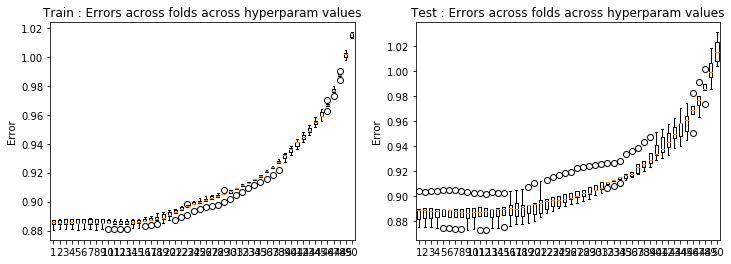

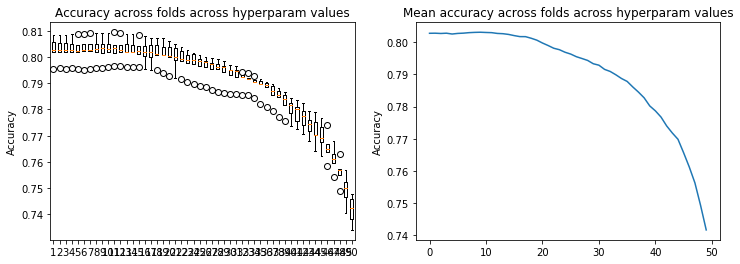

In [46]:
result_crossval(loss_tr24,loss_te24)
result_crossval_accuracy(acc24)

In [17]:
# test 25: degree 8, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr25, loss_te25, w25, acc25 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 8, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  3.81642827e+00  2.65098580e-01 -8.65458007e-01
  7.07448594e-01  2.28258757e-01 -4.14136317e+00  1.26597385e+00
 -6.01491345e-02  5.49840676e-01  1.16478283e-02 -3.34867147e-02
  9.74355228e-01  1.92949337e-02  3.00719508e-02 -1.01621301e-01
  1.10396850e-02 -4.44034796e-02 -5.18565423e-03  1.17839593e-02
 -3.95841974e+01 -1.67251645e+00 -4.92758450e+00  2.99019017e+00
 -8.76723542e-02  1.49245407e+01 -3.04597447e+00  1.54075664e-01
  9.37474975e-01  7.44163918e-02  6.02791966e-02 -3.72717223e+00
 -9.90075414e-02 -1.19316291e-02  1.50207121e+00  4.04543658e-03
 -4.76217233e-01  1.13180801e-01 -1.97393263e-02  1.30355668e+02
  5.07108441e+00  3.29509540e+01 -1.08985220e+01 -2.62295508e+00
 -1.55023250e+01  4.36784058e+00  3.88502465e-01 -3.14418375e+00
 -1.06085791e-01  1.8316

Ridge regression: w=[-2.76819782e-01  3.65516657e+00  2.43204061e-01 -7.44512878e-01
  5.08487758e-01  1.25478659e-01 -2.85912583e+00  1.52921298e+00
 -4.61151810e-02  1.17364365e+00  2.71972759e-02 -2.40783716e-02
  1.27960847e+00  4.49416467e-03  1.40163379e-02 -2.64445436e-01
  4.25124840e-03 -1.68543632e-01 -9.30209901e-04  2.05538222e-04
 -3.87283178e+01 -1.64623216e+00 -5.57544594e+00  4.13358181e+00
  5.91235484e-01  1.04174741e+01 -2.81800141e+00  1.09224859e-01
 -1.15418124e+00  9.35038814e-02  6.57979003e-02 -5.15126714e+00
 -1.19373636e-01  1.78421956e-02  2.38017015e+00  6.83069855e-02
 -1.71023570e-01  1.35372813e-01  2.36399357e-02  1.28542801e+02
  5.42772894e+00  3.45888770e+01 -1.34181653e+01 -4.81605161e+00
 -1.04419377e+01  2.08308132e+00  2.09439371e-01 -4.97545749e-01
 -1.85950977e-01  1.21803763e-01  4.89139671e+00 -4.00724636e-02
 -3.72001305e-02 -6.16664180e+00  3.93149303e-03  2.59857867e+00
 -3.09844727e-02 -5.76847289e-03 -1.66392956e+02 -1.21861372e+01
 -6.3

Ridge regression: w=[-2.78869250e-01  2.64597057e+00  2.31018949e-01 -1.16058811e+00
  9.99814913e-01  2.49000709e-01 -3.25665621e+00  1.51426350e+00
 -4.75497767e-02  8.64651829e-01  3.13247246e-02 -2.68623086e-02
  8.76940635e-01  1.64381476e-03  9.73135004e-03  3.74570312e-02
  1.12854870e-02 -2.29922304e-01 -5.51256781e-03  2.96535922e-03
 -3.12346705e+01 -1.65214992e+00 -2.97456685e+00  1.40514934e+00
 -7.49918118e-01  1.18048942e+01 -2.79312233e+00  1.62160893e-01
  2.35593515e-01  8.27552100e-02  4.44442001e-02 -4.31703896e+00
 -1.09070085e-01 -5.53760008e-03  3.04470002e-01  1.48874729e-02
  5.35374591e-01  1.57843204e-01  5.46345837e-02  1.05727355e+02
  5.57702365e+00  2.73334106e+01 -6.69551093e+00  8.88061274e-01
 -1.18846968e+01  2.15648665e+00  2.23455707e-01 -2.41862262e+00
 -2.05936067e-01  1.68405331e-01  5.20875829e+00 -5.26541200e-02
 -1.86568212e-02 -1.69802911e-01 -6.20336785e-02 -1.41303765e-01
  3.00739209e-03 -4.25000181e-02 -1.34548351e+02 -1.27443385e+01
 -5.4

Ridge regression: w=[-2.78727903e-01  1.60174394e+00  1.78454055e-01 -1.36139299e+00
  1.45927946e+00  3.01911687e-01 -2.48347396e+00  8.95136491e-01
 -8.03870386e-02  1.46273613e+00  1.40609623e-02 -1.52611753e-02
  1.09152130e+00  4.82701827e-03  1.25646134e-02 -1.33838372e-01
  2.17052063e-02 -1.02291609e-01 -5.47017089e-03  1.41961188e-04
 -2.38422359e+01 -8.80340578e-01 -9.67772608e-01 -8.14546207e-01
 -7.70270637e-01  8.99792826e+00 -1.34251515e+00  9.18519629e-02
 -2.60152091e+00  7.43545474e-02  2.27452341e-02 -3.90810441e+00
 -1.07566250e-01 -2.83983143e-03  1.52798978e+00  3.27395748e-02
  8.12225603e-02  1.29303804e-01  3.05799223e-02  8.43276351e+01
  2.23478214e+00  1.97774344e+01 -3.02536941e+00 -3.14186733e-01
 -8.62645983e+00  8.06303168e-01  3.54165882e-01  1.19668326e+00
 -1.22345718e-01  1.02021844e-01  3.37319714e+00 -5.85474521e-02
 -6.47029122e-02 -3.84072929e+00 -1.03789609e-01  5.19593967e-01
  1.01963989e-02 -3.26730181e-02 -1.05730615e+02 -6.35544425e+00
 -4.1

Ridge regression: w=[-2.75017651e-01  6.42445401e-01  1.69754628e-01 -1.94829929e+00
  1.98870781e+00  2.58411626e-01 -2.58975452e+00  7.15735106e-01
 -9.74544066e-02  9.68557811e-01  2.70127780e-02 -4.36963711e-02
  6.78181339e-01  8.61992082e-03  2.55411168e-02 -1.78362985e-01
  6.64858846e-03 -1.27584753e-01 -1.20171722e-02 -1.87543427e-02
 -1.72309566e+01 -9.19708198e-01  2.58241033e+00 -3.13099220e+00
 -5.59784349e-01  9.52617137e+00 -2.78013279e-01  1.30156476e-01
 -6.61958076e-01  6.70072431e-02  9.98579128e-03 -2.97924856e+00
 -1.23216797e-01 -2.28360597e-02  1.99125162e+00  2.60605345e-02
  2.22884218e-01  1.38212138e-01  4.54933986e-02  6.56013285e+01
  2.57344736e+00  1.12896639e+01  6.85555160e-01 -6.48563309e-01
 -9.31296107e+00 -1.05848466e+00  4.21772380e-01 -1.35420370e+00
 -2.01212729e-01  2.03656077e-01  3.49985704e+00 -6.48980691e-02
 -1.27015676e-01 -5.62788039e+00 -5.30228880e-02  4.39673585e-01
  3.23650004e-02  4.76229969e-02 -8.16973931e+01 -7.07605916e+00
 -3.2

Ridge regression: w=[-2.76431071e-01  9.46211923e-02  1.78989909e-01 -1.90611857e+00
  2.28869193e+00  2.68592302e-01 -2.70979559e+00  9.20427365e-01
 -5.96183778e-02  5.73667451e-01  1.24026995e-02 -3.38801154e-02
  6.90187892e-01  2.01998510e-02  2.87039721e-02 -7.17138978e-02
  1.00718691e-02 -1.59404381e-01 -5.58446803e-03  1.01449850e-02
 -1.31649773e+01 -8.75494598e-01  2.98866918e+00 -4.83249666e+00
 -5.51310120e-01  9.56143457e+00 -1.61752645e+00  1.54266899e-01
  4.50599270e-01  7.43660617e-02  6.06861800e-02 -2.77926119e+00
 -9.99609394e-02 -1.21395178e-02  1.28446250e+00  3.81861503e-03
  1.86540982e-01  1.14549554e-01 -2.10535388e-02  5.30377180e+01
  2.01941701e+00  8.07141326e+00  3.78209643e+00 -4.94459641e-01
 -8.89892848e+00  1.31402879e+00  3.64288025e-01 -1.79764364e+00
 -1.10053491e-01  1.80910314e-01  2.94867448e+00 -1.33497536e-01
 -1.20010659e-01 -3.77510118e+00 -6.73623967e-02  8.42276024e-01
 -4.86823412e-03 -7.67672456e-02 -6.37441768e+01 -5.54509907e+00
 -2.5

Ridge regression: w=[-2.76819763e-01 -1.69856824e-04  1.42815289e-01 -1.81489722e+00
  2.18447056e+00  1.93551241e-01 -1.90000909e+00  1.29935316e+00
 -4.65793369e-02  1.09054733e+00  2.71942319e-02 -2.48176329e-02
  8.41388740e-01  5.64621350e-03  1.29742823e-02 -2.24124022e-01
  2.86943235e-03 -3.05292294e-01 -1.80624599e-03 -1.33050379e-03
 -1.27403628e+01 -7.45442267e-01  2.62894120e+00 -4.29945564e+00
 -1.52621025e-01  6.88378480e+00 -2.02746378e+00  1.11366893e-01
 -1.15564484e+00  9.39789409e-02  6.63860941e-02 -3.63555423e+00
 -1.18583261e-01  1.80494291e-02  2.06846787e+00  6.89659718e-02
  6.22041636e-01  1.35893175e-01  2.20233906e-02  5.24385892e+01
  2.11949864e+00  8.73787225e+00  2.78759346e+00 -1.55309660e+00
 -6.27304710e+00  7.01801647e-01  1.89268566e-01  1.26162685e-01
 -1.86288340e-01  1.21564535e-01  3.93210900e+00 -4.40616704e-02
 -3.45714774e-02 -5.16269073e+00  9.39343361e-03  6.78840650e-01
 -2.91522918e-02 -6.24689403e-05 -6.33742273e+01 -6.34679636e+00
 -2.6

Ridge regression: w=[-2.78869221e-01 -5.40302993e-01  1.18374364e-01 -2.06329555e+00
  2.16179628e+00  2.48580586e-01 -2.00719335e+00  1.30051507e+00
 -4.51092658e-02  8.89003031e-01  3.16220858e-02 -2.72056271e-02
  3.05263740e-01  2.55725179e-03  9.46588485e-03  6.57407747e-03
  1.06856589e-02 -2.40149941e-01 -5.44097008e-03  1.54401492e-03
 -9.00969369e+00 -5.93907595e-01  4.13900027e+00 -4.01241442e+00
 -7.80597584e-01  7.16426625e+00 -2.04810763e+00  1.63570295e-01
 -2.04430364e-01  8.34137128e-02  4.54481076e-02 -2.18573154e+00
 -1.07957402e-01 -5.77825236e-03  6.22561427e-01  1.59861090e-02
  4.71157458e-01  1.58171742e-01  5.43740157e-02  4.17024280e+01
  1.56018238e+00  4.40501353e+00  2.61316336e+00  1.17651436e+00
 -6.36044000e+00  8.48187796e-01  1.91742997e-01 -1.15331040e+00
 -2.07876895e-01  1.67222082e-01  3.05521715e+00 -5.46435330e-02
 -1.90639097e-02 -1.52188766e+00 -5.87475687e-02  2.86571232e-01
  1.57340091e-03 -3.70775913e-02 -4.91964407e+01 -5.39728242e+00
 -2.0

Ridge regression: w=[-2.78727862e-01 -1.01595081e+00  1.11549201e-01 -1.92225305e+00
  2.26170564e+00  3.32830736e-01 -1.43410095e+00  7.19583407e-01
 -7.96009397e-02  1.22970804e+00  1.40391288e-02 -1.56933748e-02
  6.01360256e-01  5.47095467e-03  1.20222796e-02 -1.04922239e-01
  2.12049234e-02 -1.44834768e-01 -5.38354762e-03 -1.86557486e-04
 -5.84708998e+00 -2.47567362e-01  3.96061203e+00 -4.54901084e+00
 -1.13661361e+00  5.15272228e+00 -7.48576952e-01  9.35982987e-02
 -2.03333295e+00  7.39297965e-02  2.26190330e-02 -2.18583496e+00
 -1.07036924e-01 -3.37414182e-03  1.34113301e+00  3.32678706e-02
  2.10880788e-01  1.29662836e-01  2.94591117e-02  3.32428002e+01
 -1.70661608e-01  2.80393579e+00  3.40696739e+00  1.38724523e+00
 -4.18062290e+00 -2.24122541e-01  3.38122428e-01  1.20680527e+00
 -1.22157363e-01  1.01589989e-01  2.01864555e+00 -6.02994209e-02
 -6.40633961e-02 -3.39336140e+00 -1.01324510e-01  4.90851932e-01
  8.67670838e-03 -3.14627203e-02 -3.87126007e+01 -2.01340789e+00
 -1.5

Ridge regression: w=[-2.75017591e-01 -1.59022684e+00  9.16809047e-02 -2.17747613e+00
  2.34975386e+00  2.92138972e-01 -1.31057608e+00  9.51357381e-01
 -9.51975119e-02  1.14724426e+00  2.70551968e-02 -4.40495403e-02
  7.34647416e-02  9.48509553e-03  2.48364469e-02 -1.02445061e-01
  6.16889762e-03 -1.84056804e-01 -1.17925258e-02 -1.93389977e-02
 -2.38669419e+00 -1.71331010e-01  5.55452253e+00 -4.77658790e+00
 -9.48259197e-01  4.87408487e+00 -6.96470932e-01  1.29819059e-01
 -1.19327175e+00  6.75265286e-02  9.46552241e-03 -1.04103415e+00
 -1.23506593e-01 -2.20696667e-02  1.41099245e+00  2.66922950e-02
  4.60371104e-01  1.38690742e-01  4.47131071e-02  2.48822571e+01
 -2.90086668e-01 -8.09366772e-01  3.46294243e+00  1.08752043e+00
 -4.07491872e+00 -9.59929306e-01  3.98778457e-01 -2.32484613e-01
 -2.01347544e-01  2.03856496e-01  1.43184914e+00 -6.77298938e-02
 -1.23806063e-01 -3.78123715e+00 -5.08617733e-02  8.44395231e-02
  3.12908404e-02  4.98579836e-02 -3.02334490e+01 -1.90991879e+00
 -1.1

Ridge regression: w=[-2.76430984e-01 -1.84057206e+00  1.15097360e-01 -1.90159042e+00
  2.35471619e+00  2.92097307e-01 -1.38017054e+00  8.17609016e-01
 -5.74646678e-02  6.72812164e-01  1.26181480e-02 -3.40941449e-02
  1.75880305e-01  2.07822301e-02  2.79708358e-02 -2.55336959e-02
  1.01310370e-02 -2.27442476e-01 -5.72125253e-03  1.00085452e-02
 -8.14220189e-01 -2.50771867e-01  4.50420062e+00 -5.09923100e+00
 -8.25340950e-01  4.74257827e+00 -1.14203848e+00  1.54293125e-01
 -5.61159435e-02  7.44742033e-02  6.04090691e-02 -9.43057312e-01
 -1.00464539e-01 -1.22442308e-02  9.60608943e-01  3.93574774e-03
  5.29339580e-01  1.14552151e-01 -2.19435444e-02  2.06662059e+01
 -3.98587676e-01 -1.36151922e-01  4.38548560e+00  7.46352070e-01
 -3.48617910e+00  3.20935377e-01  3.44546779e-01 -9.17585607e-01
 -1.12243272e-01  1.79629821e-01  1.11002781e+00 -1.35269443e-01
 -1.17765665e-01 -2.83958160e+00 -6.63396290e-02  1.53395338e-01
 -4.84096457e-03 -7.66017766e-02 -2.50454185e+01 -1.14452723e+00
 -9.6

Ridge regression: w=[-2.76819676e-01 -1.91307197e+00  6.72806211e-02 -1.82611057e+00
  2.31125682e+00  2.34786827e-01 -9.69659945e-01  1.16630157e+00
 -4.56372984e-02  9.60237082e-01  2.71613262e-02 -2.52060907e-02
  2.15700974e-01  6.19195068e-03  1.23561143e-02 -1.67057452e-01
  2.77198258e-03 -3.74613748e-01 -2.15336491e-03 -1.57440236e-03
 -5.07245769e-01 -1.31108940e-02  4.27123389e+00 -4.87106887e+00
 -6.12289002e-01  3.52928917e+00 -1.61033029e+00  1.14010590e-01
 -8.32641509e-01  9.40467003e-02  6.59674994e-02 -1.31845525e+00
 -1.18058196e-01  1.77287699e-02  1.67558496e+00  6.94600553e-02
  9.74632327e-01  1.35728652e-01  2.16295478e-02  2.03468086e+01
 -6.81398924e-01  1.50579098e-01  3.91705017e+00  4.56755182e-01
 -2.55465016e+00  8.49155109e-02  1.75571369e-01 -3.16914265e-02
 -1.86886175e-01  1.21499709e-01  1.50697446e+00 -4.58970737e-02
 -3.28225796e-02 -4.02765549e+00  1.03337361e-02 -4.46350638e-02
 -2.86227663e-02  2.58776544e-04 -2.50423106e+01 -1.38114480e+00
 -9.7

Ridge regression: w=[-2.78869094e-01 -2.27103927e+00  5.81289177e-02 -1.89592654e+00
  2.17310833e+00  2.41170847e-01 -1.00656287e+00  1.10208698e+00
 -4.30264287e-02  8.54746655e-01  3.16571321e-02 -2.77208329e-02
 -1.68759973e-01  3.02089096e-03  9.18737847e-03  1.42812221e-02
  1.08789858e-02 -2.96904003e-01 -5.36150388e-03  1.17580248e-03
  1.52956931e+00  3.08187639e-02  4.58481970e+00 -3.96322397e+00
 -7.35515339e-01  3.55172786e+00 -1.50174740e+00  1.62724765e-01
 -3.66637749e-01  8.37095870e-02  4.52293358e-02 -3.00962558e-01
 -1.07243918e-01 -6.01717028e-03  6.42590603e-01  1.70888938e-02
  6.90522073e-01  1.57800695e-01  5.40529468e-02  1.56675280e+01
 -9.39896837e-01 -8.36382804e-01  2.48130298e+00  1.09849286e+00
 -2.34944546e+00  1.39630203e-01  1.75844973e-01 -6.29534904e-01
 -2.09018739e-01  1.67830959e-01  9.39107619e-01 -5.58152318e-02
 -1.87346893e-02 -1.84026002e+00 -5.85228984e-02  6.56233639e-02
  8.37306614e-04 -3.62183633e-02 -2.06474197e+01 -7.72302686e-01
 -7.9

Ridge regression: w=[-2.78727676e-01 -2.56832406e+00  9.50578282e-02 -1.67631511e+00
  2.14763595e+00  3.28525358e-01 -7.39519038e-01  7.06181793e-01
 -7.91176902e-02  9.78606703e-01  1.40816809e-02 -1.53415973e-02
  1.94555192e-01  5.69102853e-03  1.19794542e-02 -5.30969072e-02
  2.17474725e-02 -2.14104044e-01 -5.14111115e-03  8.20250623e-04
  3.25705869e+00 -1.25391135e-02  3.74590239e+00 -3.92208213e+00
 -1.17981167e+00  2.69435813e+00 -6.97403140e-01  9.22678787e-02
 -1.16322051e+00  7.34489373e-02  2.20594509e-02 -7.38123339e-01
 -1.06557699e-01 -4.12916658e-03  1.03401631e+00  3.41701820e-02
  5.05807359e-01  1.28666648e-01  2.89429238e-02  1.20153559e+01
 -1.27610513e+00 -1.35530451e-01  2.45145208e+00  1.84120308e+00
 -1.53036355e+00 -3.35355353e-01  3.35198664e-01  3.49750402e-01
 -1.23068275e-01  9.93761055e-02  5.46978160e-01 -6.06947217e-02
 -6.39520991e-02 -2.70048175e+00 -1.02556501e-01  1.07212863e-01
  7.12170596e-03 -3.51770308e-02 -1.77388249e+01  2.55035114e-01
 -6.7

Ridge regression: w=[-2.75017324e-01 -2.95774289e+00  8.38853319e-02 -1.79198199e+00
  2.08093799e+00  2.85729596e-01 -5.92548673e-01  1.03043518e+00
 -9.48754156e-02  1.11411575e+00  2.69901487e-02 -4.38914746e-02
 -1.96728258e-01  9.80824706e-03  2.43856807e-02 -2.46201254e-02
  6.81964079e-03 -2.19255533e-01 -1.16558657e-02 -1.91180146e-02
  5.39758928e+00  6.78142644e-03  4.50195532e+00 -3.56086187e+00
 -9.73579272e-01  2.35848685e+00 -9.65693910e-01  1.24764968e-01
 -1.12907421e+00  6.69848396e-02  8.78844362e-03 -8.76381728e-02
 -1.22932421e-01 -2.15661532e-02  9.16614834e-01  2.71502809e-02
  6.16554142e-01  1.38740286e-01  4.31455543e-02  7.62628686e+00
 -1.26924571e+00 -1.57707565e+00  1.75404669e+00  1.46939798e+00
 -1.41615393e+00 -6.33822210e-01  3.96955473e-01 -8.68905605e-02
 -2.01731399e-01  2.02623620e-01  3.69032662e-01 -6.81391822e-02
 -1.21111404e-01 -2.52131961e+00 -5.25345019e-02 -1.47996291e-01
  3.05618412e-02  4.93376622e-02 -1.48771346e+01  2.77390563e-01
 -5.7

Ridge regression: w=[-2.76430592e-01 -3.11973882e+00  1.18837382e-01 -1.59286312e+00
  1.99072782e+00  2.83763469e-01 -7.11822335e-01  6.76998009e-01
 -5.70381587e-02  6.53655956e-01  1.25402365e-02 -3.36804811e-02
 -1.08788519e-02  2.12379556e-02  2.74790265e-02  4.63171587e-02
  1.09879223e-02 -2.57136927e-01 -5.91817766e-03  1.05916929e-02
  6.28493789e+00 -1.81308192e-01  3.67676297e+00 -3.36993761e+00
 -8.15176878e-01  2.47409836e+00 -8.10571431e-01  1.47293710e-01
 -2.54638058e-01  7.37509259e-02  5.87149191e-02 -1.41262490e-01
 -1.00402957e-01 -1.24040073e-02  5.35727039e-01  3.84299096e-03
  6.85259736e-01  1.13932602e-01 -2.27264897e-02  5.70153336e+00
 -9.78884002e-01 -7.20417663e-01  1.84627279e+00  9.31499295e-01
 -1.18908051e+00 -6.41284732e-02  3.40730942e-01 -4.29779438e-01
 -1.13907505e-01  1.76627051e-01  2.11159956e-01 -1.36068633e-01
 -1.16147763e-01 -1.88416583e+00 -6.85546133e-02 -1.36485041e-01
 -4.39829714e-03 -7.89843374e-02 -1.33761444e+01  3.68977473e-01
 -5.2

Ridge regression: w=[-2.76819284e-01 -3.17049622e+00  7.40153958e-02 -1.53140122e+00
  1.99405121e+00  2.29097511e-01 -4.87864810e-01  9.78285597e-01
 -4.78402797e-02  7.81038036e-01  2.71041808e-02 -2.51996699e-02
 -9.39513662e-03  6.34063239e-03  1.15631918e-02 -6.93536677e-02
  3.64359672e-03 -3.93508656e-01 -2.32883776e-03 -1.18854783e-03
  6.50128937e+00  5.61340710e-02  3.51765270e+00 -3.36387108e+00
 -6.41835904e-01  1.90306771e+00 -1.27803244e+00  1.10600848e-01
 -4.96552749e-01  9.29597232e-02  6.40971133e-02 -2.92404800e-01
 -1.16824235e-01  1.64971429e-02  1.10393210e+00  6.93124797e-02
  1.09376478e+00  1.35143686e-01  2.09826561e-02  5.52728161e+00
 -1.34328714e+00 -5.83472053e-01  1.71129878e+00  8.47413655e-01
 -9.27185607e-01 -1.15863885e-01  1.87092429e-01 -1.91098166e-01
 -1.87920452e-01  1.20729269e-01  3.20092717e-01 -4.62922547e-02
 -2.97679931e-02 -2.76605155e+00  7.65390045e-03 -3.01259694e-01
 -2.86209318e-02 -1.93591643e-03 -1.34696660e+01  3.73459244e-01
 -5.1

Ridge regression: w=[-2.78868519e-01 -3.36431410e+00  8.29846336e-02 -1.63085579e+00
  1.92138913e+00  2.20414701e-01 -5.16080635e-01  8.29083946e-01
 -4.46893651e-02  6.99663690e-01  3.14673800e-02 -2.79047705e-02
 -2.17563854e-01  3.27398389e-03  9.03525804e-03  7.36957473e-02
  1.17349214e-02 -3.26918076e-01 -5.45227453e-03  1.16513913e-03
  7.59033680e+00 -3.27298082e-02  3.84564307e+00 -2.81515756e+00
 -6.04435489e-01  1.95724410e+00 -1.03776169e+00  1.53738197e-01
 -2.84410720e-01  8.26322215e-02  4.32046615e-02  2.46627586e-01
 -1.05831287e-01 -6.49357779e-03  3.29657486e-01  1.71583556e-02
  8.45150791e-01  1.56832115e-01  5.20900860e-02  3.20590756e+00
 -1.21717552e+00 -1.09947087e+00  8.06266048e-01  8.06050900e-01
 -8.52163429e-01 -1.11632359e-01  1.86459320e-01 -3.86873865e-01
 -2.09777550e-01  1.67609075e-01  1.29897724e-01 -5.65817076e-02
 -1.81287177e-02 -1.29374889e+00 -6.06875157e-02 -1.72078045e-01
  9.51507023e-04 -3.64247096e-02 -1.19238977e+01  5.01698185e-01
 -4.7

Ridge regression: w=[-2.78726839e-01 -3.46034263e+00  1.36780078e-01 -1.53118449e+00
  1.84830506e+00  2.81316769e-01 -3.55957761e-01  5.87348304e-01
 -8.09408585e-02  7.36477346e-01  1.40659265e-02 -1.43405370e-02
  1.11590572e-01  5.85097390e-03  1.20345672e-02  4.56966019e-02
  2.26924879e-02 -2.37118382e-01 -5.02320934e-03  2.23040961e-03
  8.34748518e+00 -2.29694119e-01  3.51256003e+00 -2.63843310e+00
 -9.02046162e-01  1.55448203e+00 -5.93924191e-01  8.55947710e-02
 -5.93233349e-01  7.07873543e-02  2.08803357e-02 -2.88863688e-01
 -1.04776587e-01 -4.76230376e-03  4.75396787e-01  3.43244016e-02
  6.49844910e-01  1.27370486e-01  2.63864218e-02  1.51246384e+00
 -1.01209701e+00 -8.80229313e-01  6.58195342e-01  1.31216572e+00
 -6.32494663e-01 -2.25730118e-01  3.46261147e-01 -6.20570915e-02
 -1.24130696e-01  9.46814079e-02  2.63819437e-02 -6.11648322e-02
 -6.31855222e-02 -1.55886748e+00 -1.04546133e-01 -1.46869715e-01
  6.07073483e-03 -3.94248282e-02 -1.09343922e+01  6.52472801e-01
 -4.3

Ridge regression: w=[-2.75016121e-01 -3.53570383e+00  1.31430625e-01 -1.57426562e+00
  1.69167947e+00  2.39963075e-01 -2.00760299e-01  7.47772880e-01
 -9.63351612e-02  8.03605129e-01  2.64615912e-02 -4.27956450e-02
 -1.11355929e-01  9.78660566e-03  2.34502469e-02  7.92957577e-02
  7.93966131e-03 -2.02779621e-01 -1.18411059e-02 -1.87480990e-02
  8.99456528e+00 -2.59518698e-01  3.97387331e+00 -2.20896451e+00
 -7.07022588e-01  1.22772403e+00 -7.22683772e-01  1.15043514e-01
 -6.95161305e-01  6.37729208e-02  7.88077295e-03  3.35297938e-02
 -1.20470605e-01 -1.99457105e-02  3.20938035e-01  2.57550275e-02
  5.99552595e-01  1.38663704e-01  3.91271006e-02 -1.94520905e-01
 -8.74717562e-01 -1.70092521e+00  2.17478145e-01  9.60574320e-01
 -5.89344450e-01 -3.79778063e-01  4.03040777e-01 -8.06939692e-02
 -2.00209106e-01  1.97223917e-01  3.20166201e-02 -6.68895363e-02
 -1.15566867e-01 -1.26485366e+00 -5.48762018e-02 -2.02718961e-01
  3.09671202e-02  4.92002439e-02 -9.72701046e+00  5.56464609e-01
 -4.0

Ridge regression: w=[-2.76428832e-01 -3.48837079e+00  1.59532630e-01 -1.47133906e+00
  1.53021763e+00  2.52044624e-01 -2.64138757e-01  4.37118265e-01
 -5.75883863e-02  4.71296415e-01  1.19557120e-02 -3.16625728e-02
  3.66331105e-02  2.15678718e-02  2.69399264e-02  1.37655961e-01
  1.20662712e-02 -2.26835673e-01 -6.34983276e-03  1.11519137e-02
  9.02280465e+00 -4.24596412e-01  3.59712497e+00 -1.82838433e+00
 -6.39985668e-01  1.28248193e+00 -4.81542502e-01  1.30268912e-01
 -1.08963776e-01  6.90534513e-02  5.28695735e-02 -1.83470574e-02
 -9.78812759e-02 -1.11328568e-02  1.47467381e-02  3.01402856e-03
  6.37011242e-01  1.14825752e-01 -2.34608687e-02 -7.90841075e-01
 -5.65428380e-01 -1.44622080e+00  1.51634063e-01  6.10448073e-01
 -5.01315816e-01 -1.16794223e-01  3.35430371e-01 -2.48793327e-01
 -1.12854495e-01  1.67158502e-01 -4.74482731e-02 -1.35842433e-01
 -1.12758305e-01 -7.99781054e-01 -7.08890802e-02 -1.99578310e-01
 -2.77647866e-03 -7.90357255e-02 -9.01075302e+00  4.75748404e-01
 -3.7

Ridge regression: w=[-2.76817521e-01 -3.51805614e+00  1.29222041e-01 -1.42844170e+00
  1.54366357e+00  1.95172219e-01 -1.49528659e-01  6.01945132e-01
 -5.31949358e-02  4.88236144e-01  2.64695015e-02 -2.42257715e-02
  7.56180454e-02  6.53212063e-03  1.07315253e-02  5.91146421e-02
  4.69454056e-03 -3.33163698e-01 -2.57479377e-03 -6.18826240e-04
  9.16473137e+00 -2.67975647e-01  3.50451724e+00 -1.88066999e+00
 -4.46908032e-01  1.00956276e+00 -8.01957449e-01  1.01436698e-01
 -1.38146262e-01  8.73370873e-02  5.92060298e-02 -1.28573991e-01
 -1.13093931e-01  1.44580623e-02  3.78739383e-01  6.46274103e-02
  9.62605888e-01  1.35543117e-01  1.70529184e-02 -8.87140378e-01
 -7.96763641e-01 -1.38620565e+00  1.20342266e-01  4.93251774e-01
 -4.23950314e-01 -7.49859087e-02  2.13288163e-01 -2.02107821e-01
 -1.85371015e-01  1.16454476e-01 -4.37594154e-02 -4.66270686e-02
 -2.51518161e-02 -1.28006552e+00  4.93414900e-03 -3.22948323e-01
 -2.78252236e-02 -2.48939318e-03 -9.11051599e+00  4.88317533e-01
 -3.6

Ridge regression: w=[-2.78865932e-01 -3.42088513e+00  1.37292255e-01 -1.46421747e+00
  1.41573208e+00  1.89428594e-01 -1.13195603e-01  4.45277055e-01
 -4.89897285e-02  4.33093726e-01  3.04170013e-02 -2.65564697e-02
 -2.46879664e-02  3.55913383e-03  9.29435992e-03  1.42217966e-01
  1.26927265e-02 -2.69658220e-01 -5.57951378e-03  1.53037264e-03
  9.05426632e+00 -3.68602905e-01  3.64587466e+00 -1.47135901e+00
 -4.19781072e-01  9.45475961e-01 -5.51432534e-01  1.37119625e-01
 -4.18170747e-02  7.56684476e-02  3.75730809e-02  1.24087192e-01
 -1.01715253e-01 -6.78708040e-03 -5.17457807e-02  1.31212351e-02
  7.31976288e-01  1.55952853e-01  4.46286240e-02 -1.44117284e+00
 -5.89425437e-01 -1.62066925e+00 -2.16200956e-01  4.06691684e-01
 -3.97980594e-01 -8.09445996e-02  2.04992451e-01 -2.67965883e-01
 -2.05919721e-01  1.60693537e-01 -8.55986850e-02 -5.69549106e-02
 -1.70884028e-02 -5.28046105e-01 -6.16850524e-02 -2.12675331e-01
  1.65045870e-03 -3.50749335e-02 -8.25366585e+00  4.61083226e-01
 -3.5

Ridge regression: w=[-2.78723074e-01 -3.22517300e+00  1.77309688e-01 -1.34260371e+00
  1.22026872e+00  2.21645653e-01  2.35301202e-02  3.42461954e-01
 -8.16777448e-02  4.64537282e-01  1.32007321e-02 -1.20909784e-02
  1.61269872e-01  6.28213758e-03  1.23221346e-02  1.26724700e-01
  2.30451082e-02 -1.70616695e-01 -4.73618438e-03  3.33278163e-03
  8.71087779e+00 -5.11004129e-01  3.35335843e+00 -1.12811247e+00
 -5.55250554e-01  6.56503619e-01 -3.24295597e-01  7.71831684e-02
 -1.84860713e-01  5.94183988e-02  1.85594792e-02 -2.13136827e-01
 -9.84200850e-02 -3.84565721e-03  1.29029628e-02  3.12682754e-02
  5.13568024e-01  1.28224598e-01  1.72042505e-02 -1.77291641e+00
 -4.11071901e-01 -1.54043099e+00 -2.56656486e-01  5.88647139e-01
 -3.46968404e-01 -1.19117610e-01  3.38840302e-01 -1.50803523e-01
 -1.20414734e-01  8.39444794e-02 -1.18902138e-01 -6.23835993e-02
 -6.11167825e-02 -5.90006908e-01 -1.02478816e-01 -1.78547668e-01
  4.73622526e-03 -3.87745557e-02 -7.51662063e+00  4.49014757e-01
 -3.1

Ridge regression: w=[-2.75010711e-01 -2.99011534e+00  1.59984329e-01 -1.21793818e+00
  9.65354470e-01  1.90177620e-01  1.39479180e-01  3.74182660e-01
 -9.31687168e-02  4.22704327e-01  2.38573993e-02 -3.90798386e-02
  4.40433087e-02  9.61222814e-03  2.10795005e-02  1.43753589e-01
  9.25390217e-03 -1.17720303e-01 -1.23566358e-02 -1.77864424e-02
  8.14715159e+00 -4.88270418e-01  3.29697650e+00 -6.77080663e-01
 -4.31146131e-01  4.21572659e-01 -3.28474051e-01  1.07184088e-01
 -1.88235398e-01  5.23118736e-02  6.48705980e-03 -5.14470015e-02
 -1.12291545e-01 -1.34342506e-02 -4.99607432e-02  2.00967158e-02
  3.95725491e-01  1.40354111e-01  2.89868203e-02 -1.89403661e+00
 -3.51309818e-01 -1.80775804e+00 -3.84405781e-01  4.05401421e-01
 -3.35497693e-01 -1.94612094e-01  3.70027320e-01 -7.01306295e-02
 -1.88534638e-01  1.78255457e-01 -7.61646509e-02 -6.35065477e-02
 -1.00961546e-01 -4.70056329e-01 -5.48503831e-02 -1.61482913e-01
  3.31525955e-02  4.97870044e-02 -6.59474294e+00  3.58050643e-01
 -3.0

Ridge regression: w=[-2.76420912e-01 -2.70081380e+00  1.69455880e-01 -1.08617533e+00
  7.55988823e-01  2.13616810e-01  1.16151910e-01  2.28448566e-01
 -5.44487102e-02  3.05078426e-01  9.62832401e-03 -2.54996241e-02
  1.08970661e-01  2.13241293e-02  2.55813835e-02  1.75430902e-01
  1.29426995e-02 -1.19378471e-01 -6.88845740e-03  1.12913445e-02
  7.37246590e+00 -5.50749192e-01  2.89542811e+00 -2.95041199e-01
 -4.62370292e-01  4.04792055e-01 -2.18044998e-01  1.06561118e-01
  3.97668949e-02  5.16683316e-02  3.55258310e-02 -5.77587253e-02
 -8.98088405e-02 -4.68492409e-03 -2.20233211e-01  8.49026114e-04
  3.78733518e-01  1.22505008e-01 -2.43217431e-02 -1.71033284e+00
 -2.24092341e-01 -1.61199843e+00 -3.64601567e-01  3.16841943e-01
 -2.80648608e-01 -9.12667913e-02  2.93180627e-01 -1.64512263e-01
 -1.02734180e-01  1.39040621e-01 -1.10364004e-01 -1.30976653e-01
 -1.00971595e-01 -2.35184756e-01 -7.01468373e-02 -1.50390639e-01
  7.06664433e-05 -7.16061378e-02 -5.79865689e+00  3.11881916e-01
 -2.6

Ridge regression: w=[-2.76809590e-01 -2.70997271e+00  1.52422829e-01 -1.06592780e+00
  7.58958874e-01  1.64621012e-01  1.50819523e-01  2.53841979e-01
 -5.72133472e-02  2.65377407e-01  2.34823485e-02 -2.07473445e-02
  1.77443749e-01  7.30797258e-03  1.00223084e-02  1.25447013e-01
  5.93988268e-03 -1.68947893e-01 -2.98916171e-03  6.95986085e-05
  7.44630557e+00 -4.68498181e-01  2.86989869e+00 -3.27669947e-01
 -2.81048793e-01  3.19557953e-01 -3.51118877e-01  9.33758125e-02
  6.00048804e-02  6.77527711e-02  4.64755389e-02 -1.43182628e-01
 -1.02452508e-01  1.13956205e-02  5.55696664e-03  4.75545012e-02
  5.55258091e-01  1.40531971e-01  6.29327473e-03 -1.76620707e+00
 -3.23274673e-01 -1.59250980e+00 -3.81745001e-01  1.73602774e-01
 -2.56404815e-01 -2.00993458e-02  2.22639213e-01 -1.44470312e-01
 -1.69317705e-01  1.00582135e-01 -1.50322361e-01 -4.80969576e-02
 -1.88567416e-02 -4.77413212e-01  2.36324355e-03 -2.24662376e-01
 -2.52239616e-02  1.75177575e-03 -5.85718192e+00  2.92767065e-01
 -2.6

Ridge regression: w=[-2.78854296e-01 -2.38976972e+00  1.44054368e-01 -9.57962560e-01
  5.95050970e-01  1.60378292e-01  1.92768442e-01  1.81659312e-01
 -5.19345013e-02  2.81169628e-01  2.62620992e-02 -2.13982927e-02
  1.14852161e-01  3.86351045e-03  1.02778131e-02  1.62354561e-01
  1.34746659e-02 -1.24573218e-01 -5.44711905e-03  2.12579317e-03
  6.56913839e+00 -4.91801234e-01  2.60841738e+00 -4.21946435e-02
 -2.82451186e-01  2.43133544e-01 -2.13425863e-01  1.20196131e-01
  4.19771565e-02  5.27724012e-02  2.52531145e-02 -4.22855300e-02
 -9.34132151e-02 -5.92580141e-03 -1.79356828e-01  2.61002033e-03
  3.82108551e-01  1.58570529e-01  2.90540980e-02 -1.49831454e+00
 -2.28049534e-01 -1.50836265e+00 -4.11669359e-01  1.65447370e-01
 -2.41745264e-01 -3.96456190e-02  2.07362733e-01 -1.78015374e-01
 -1.85235153e-01  1.34331911e-01 -1.30515347e-01 -5.50292671e-02
 -1.56930401e-02 -1.92169497e-01 -5.92382642e-02 -1.38768112e-01
  2.03345460e-03 -2.89595863e-02 -4.98990456e+00  2.63700568e-01
 -2.3

Ridge regression: w=[-2.78706137e-01 -2.02650425e+00  1.65652186e-01 -7.65787799e-01
  3.99494011e-01  1.72438042e-01  2.64573586e-01  1.83357772e-01
 -7.65538419e-02  3.16569221e-01  9.58442607e-03 -7.03361277e-03
  1.71087680e-01  6.33767607e-03  1.23245734e-02  1.47688967e-01
  2.11071560e-02 -4.68159138e-02 -3.88735007e-03  3.80636354e-03
  5.64583963e+00 -5.43783312e-01  2.13590199e+00  1.77137408e-01
 -3.31730950e-01  1.05619874e-01 -1.29453205e-01  7.18997412e-02
 -1.72886491e-02  3.07960967e-02  1.29585588e-02 -1.74035590e-01
 -8.38579308e-02 -5.58173381e-05 -1.20784256e-01  2.31959391e-02
  2.16708683e-01  1.36874696e-01  8.34668018e-04 -1.24438452e+00
 -1.85516143e-01 -1.31853416e+00 -3.09240921e-01  2.14430085e-01
 -2.42782562e-01 -7.50842831e-02  2.93717690e-01 -1.33756276e-01
 -1.02092862e-01  5.83533081e-02 -1.49712450e-01 -5.95906062e-02
 -5.37251116e-02 -2.36399781e-01 -8.79020933e-02 -1.15891323e-01
  1.64525921e-03 -2.99570340e-02 -4.17429684e+00  2.53678945e-01
 -1.9

Ridge regression: w=[-2.74986375e-01 -1.69895098e+00  1.40070361e-01 -5.36887509e-01
  2.40544201e-01  1.48062792e-01  3.03176606e-01  1.93104734e-01
 -8.19422191e-02  2.54914348e-01  1.60467036e-02 -2.99993086e-02
  9.86946765e-02  8.47606690e-03  1.62616081e-02  1.57438610e-01
  9.43689765e-03 -9.94864008e-03 -1.26060372e-02 -1.50595255e-02
  4.75099724e+00 -4.82610239e-01  1.71780064e+00  3.11903228e-01
 -2.55085988e-01  2.62906693e-02 -1.27057672e-01  1.03227768e-01
  1.88411559e-02  2.82549798e-02  3.74336325e-03 -8.72416410e-02
 -9.58512564e-02 -1.14290741e-03 -1.41057971e-01  1.11190293e-02
  1.35876755e-01  1.51326010e-01  1.38361750e-02 -9.18156266e-01
 -1.98372102e-01 -1.25832024e+00 -2.52553795e-01  1.38817701e-01
 -2.41781193e-01 -1.15416102e-01  2.96162399e-01 -5.37379170e-02
 -1.49161070e-01  1.29558205e-01 -1.01945942e-01 -5.24475840e-02
 -7.04900994e-02 -2.11942909e-01 -4.62194284e-02 -9.76303771e-02
  3.42625842e-02  4.48408087e-02 -3.38102160e+00  1.95204399e-01
 -1.6

Ridge regression: w=[-2.76385290e-01 -1.39485319e+00  1.39801729e-01 -4.27656815e-01
  1.42372068e-01  1.63605229e-01  2.67812189e-01  1.25121283e-01
 -4.67645371e-02  2.53893219e-01  3.18140709e-03 -1.40865481e-02
  1.33565607e-01  1.71874665e-02  2.10905287e-02  1.65461155e-01
  1.08715708e-02 -8.05239546e-03 -6.97278891e-03  9.23783250e-03
  3.93400508e+00 -4.91814087e-01  1.33198463e+00  4.11114726e-01
 -2.83919672e-01  3.59024318e-02 -8.59793547e-02  8.66598019e-02
  4.12204612e-02  2.12991638e-02  8.48851049e-03 -8.41045685e-02
 -7.75009976e-02  6.81560917e-03 -2.10575348e-01 -2.95767378e-03
  1.12739167e-01  1.46290773e-01 -2.53316348e-02 -6.18046048e-01
 -1.69431450e-01 -1.02438896e+00 -1.46963334e-01  1.26578555e-01
 -1.98020990e-01 -7.45451698e-02  2.33121673e-01 -1.07795162e-01
 -7.01570588e-02  8.29717363e-02 -1.18171408e-01 -1.03151812e-01
 -6.99851315e-02 -1.07552068e-01 -5.31295592e-02 -8.67723188e-02
  1.74953221e-03 -5.01529388e-02 -2.72822237e+00  1.81254547e-01
 -1.3

Ridge regression: w=[-2.76773919e-01 -1.39330814e+00  1.31363706e-01 -4.16432341e-01
  1.35469112e-01  1.38531408e-01  2.74023811e-01  1.07960273e-01
 -5.60350501e-02  2.20702799e-01  1.50321063e-02 -1.35688190e-02
  1.86416518e-01  7.01637432e-03  9.10419892e-03  1.46112201e-01
  7.33156062e-03 -1.25125956e-02 -3.84688053e-03  1.02186670e-03
  3.96119468e+00 -4.51985432e-01  1.33970096e+00  3.96325127e-01
 -1.77164160e-01  1.88289901e-02 -1.19348880e-01  8.62592091e-02
  4.95299030e-02  3.40338876e-02  2.66641924e-02 -1.38367183e-01
 -8.47425692e-02  7.71395499e-03 -9.87014527e-02  1.99552374e-02
  1.65977524e-01  1.56763775e-01 -7.20405373e-03 -6.43871581e-01
 -2.06042404e-01 -1.02163486e+00 -1.62631770e-01  3.18087893e-02
 -1.89547430e-01 -2.21478666e-02  2.14608503e-01 -9.51986441e-02
 -1.22969121e-01  6.51925069e-02 -1.60579544e-01 -4.14003799e-02
 -1.05162231e-02 -2.26930526e-01 -1.13914013e-03 -1.20931086e-01
 -1.99669535e-02  6.54228485e-03 -2.75009211e+00  1.56952129e-01
 -1.3

Ridge regression: w=[-2.78801967e-01 -1.12347542e+00  1.12129293e-01 -3.20026035e-01
  9.05293783e-02  1.27936245e-01  2.82611071e-01  7.38190584e-02
 -4.97987001e-02  2.50526526e-01  1.49600171e-02 -1.05507058e-02
  1.44965286e-01  1.84347907e-03  1.11939720e-02  1.55654974e-01
  1.15845078e-02 -8.16781405e-03 -4.75580107e-03  1.18225330e-03
  3.24429681e+00 -4.29418057e-01  1.03596230e+00  4.09736075e-01
 -1.67763168e-01  4.11788589e-03 -6.16947023e-02  1.04460667e-01
  9.58748259e-03  2.00855680e-02  1.13968988e-02 -8.89474439e-02
 -8.45426183e-02 -3.46377870e-03 -1.67208196e-01 -7.90378505e-03
  1.05623633e-01  1.70333078e-01  1.42136831e-02 -3.70762796e-01
 -1.75437495e-01 -8.36211758e-01 -1.03998835e-01  4.00700191e-02
 -1.75187583e-01 -2.90592133e-02  2.00343313e-01 -1.20236030e-01
 -1.24318396e-01  7.65339186e-02 -1.26816649e-01 -3.83868540e-02
 -1.27331257e-02 -1.17473924e-01 -4.32072048e-02 -7.33495890e-02
  2.28832136e-04 -1.36470688e-02 -2.17971236e+00  1.37050907e-01
 -1.0

Ridge regression: w=[-2.78629976e-01 -8.69375319e-01  1.23517176e-01 -2.26872746e-01
  2.09413983e-02  1.27038846e-01  3.01379396e-01  1.00010039e-01
 -6.55724913e-02  2.72194338e-01  5.49202311e-04 -4.76729550e-04
  1.54876860e-01  2.91517407e-03  9.49946278e-03  1.49112159e-01
  1.41168406e-02  3.06639076e-02 -3.04683220e-03  3.14699556e-03
  2.63151264e+00 -4.44839738e-01  7.45685604e-01  4.27064417e-01
 -1.74753579e-01 -3.72115342e-02 -3.28141022e-02  6.19511490e-02
  5.53441547e-03  8.18557140e-04  6.01680365e-03 -1.34365258e-01
 -6.76752298e-02  3.95755141e-03 -1.40518526e-01  1.49465739e-02
  3.57769127e-02  1.56099331e-01 -1.09185394e-02 -1.99063588e-01
 -1.77670680e-01 -6.63744608e-01 -8.60449653e-03  4.69092482e-02
 -1.77426121e-01 -4.77665876e-02  2.43324789e-01 -1.01448998e-01
 -5.32047637e-02  2.26535777e-02 -1.39401524e-01 -3.62116196e-02
 -3.16775202e-02 -1.39830240e-01 -4.85664297e-02 -7.23405018e-02
 -8.92725433e-04 -1.81692506e-02 -1.72353488e+00  1.31736689e-01
 -8.2

Ridge regression: w=[-2.74876956e-01 -6.58344525e-01  9.86731814e-02 -1.14240213e-01
 -8.83672250e-04  1.11247514e-01  2.91317488e-01  9.98295081e-02
 -6.55871330e-02  2.24016953e-01  1.65529189e-03 -1.76099551e-02
  1.13592378e-01  4.60963998e-03  1.00804108e-02  1.56674351e-01
  5.94664847e-03  4.33788128e-02 -1.06504048e-02 -1.10338565e-02
  2.12632264e+00 -3.95537869e-01  5.05692293e-01  3.71769989e-01
 -1.33242957e-01 -3.93301266e-02 -3.76334773e-02  8.83633510e-02
  4.61155933e-02  8.07136191e-03  5.85489234e-04 -8.36743783e-02
 -7.99874070e-02  7.98405659e-03 -1.53556043e-01  5.82761032e-03
  1.04883099e-02  1.70717261e-01  4.21210023e-03 -5.69993607e-02
 -1.85252555e-01 -5.71264652e-01  2.12540469e-02  1.89453660e-02
 -1.62798584e-01 -6.23126236e-02  2.29882289e-01 -4.76931147e-02
 -7.00665523e-02  6.23530833e-02 -1.01321786e-01 -2.65845109e-02
 -3.16642687e-02 -1.36235184e-01 -2.27164432e-02 -6.37193057e-02
  2.49890498e-02  3.06799646e-02 -1.35405317e+00  1.02485437e-01
 -6.5

Ridge regression: w=[-2.76225164e-01 -4.80142740e-01  9.07615614e-02 -1.21440440e-01
 -6.80599056e-03  1.17125437e-01  2.50895224e-01  5.19294578e-02
 -3.38370308e-02  2.33161500e-01 -6.60659462e-03 -3.59461464e-03
  1.35667945e-01  8.04189458e-03  1.38937418e-02  1.46486859e-01
  4.88125883e-03  3.84095219e-02 -6.46729335e-03  4.90384441e-03
  1.72074901e+00 -3.86707448e-01  3.83263504e-01  3.71133083e-01
 -1.37967263e-01 -1.60715718e-02 -2.37600011e-02  6.40994297e-02
  3.15431913e-02  8.94280823e-04 -7.88921645e-03 -6.90575343e-02
 -6.85656479e-02  1.29874920e-02 -1.59493289e-01 -4.89057485e-03
  4.56769733e-03  1.73849946e-01 -2.42123483e-02  2.15302940e-02
 -1.73781967e-01 -4.26638538e-01  6.70707230e-02  1.05024114e-02
 -1.25760878e-01 -3.52457830e-02  1.82280386e-01 -7.22050660e-02
 -1.53013644e-02  2.67350205e-02 -1.03171503e-01 -4.85438951e-02
 -2.79527453e-02 -9.24816375e-02 -1.99691130e-02 -5.57437366e-02
  9.91795345e-04 -2.34323284e-02 -1.08270841e+00  9.93021818e-02
 -5.1

Ridge regression: w=[-2.76613567e-01 -4.77042055e-01  8.74516670e-02 -1.05811356e-01
 -2.05227579e-02  1.14086777e-01  2.53221455e-01  4.77959057e-02
 -4.50450906e-02  2.21107462e-01  1.88637581e-03 -5.97102082e-03
  1.53546080e-01  3.93222269e-03  7.83926393e-03  1.51342399e-01
  7.23462142e-03  4.75259965e-02 -5.75656650e-03  2.49304573e-03
  1.72916370e+00 -3.68199497e-01  3.91056981e-01  3.58939274e-01
 -1.05756388e-01 -1.86979361e-02 -2.60799861e-02  6.79956692e-02
  3.07538948e-02  1.07889372e-02  1.29752345e-02 -9.68041351e-02
 -7.16834546e-02  5.52491754e-03 -1.33612525e-01  3.59273429e-03
  1.42784690e-02  1.75395855e-01 -1.27499113e-02  1.38249052e-02
 -1.87190612e-01 -4.30187608e-01  5.99190728e-02 -2.50027018e-02
 -1.23490933e-01 -1.40997385e-02  1.87318621e-01 -6.98368737e-02
 -4.94631571e-02  2.75126372e-02 -1.24642334e-01 -1.97864926e-02
 -8.20152438e-04 -1.37897281e-01  5.05639215e-05 -7.24083663e-02
 -9.36819987e-03  4.06615159e-03 -1.08833163e+00  8.08113322e-02
 -5.2

Ridge regression: w=[-2.78566808e-01 -3.19106206e-01  6.16698043e-02 -9.86293302e-02
 -1.35292801e-03  1.00036906e-01  2.47671562e-01  1.89946916e-02
 -3.53840119e-02  2.24622189e-01  9.25973734e-05 -2.39353066e-04
  1.26515937e-01 -2.27368767e-03  1.09950307e-02  1.41134619e-01
  7.41849581e-03  3.42486730e-02 -3.81758020e-03 -8.41475513e-04
  1.39544842e+00 -3.31231881e-01  2.99496222e-01  3.16219090e-01
 -8.67912008e-02 -6.36448102e-03 -5.48570658e-03  7.75810098e-02
  1.39032339e-02  1.20573602e-03  3.59601231e-03 -5.97501902e-02
 -7.83026839e-02 -1.79660343e-03 -1.36445561e-01 -1.00378463e-02
  9.16490039e-03  1.80791699e-01  7.42740847e-03  6.24652563e-02
 -1.65898686e-01 -3.24078110e-01  6.53205191e-02 -1.86854122e-02
 -1.09872511e-01 -8.13064350e-03  1.69315479e-01 -7.70546158e-02
 -4.07723092e-02  2.15505718e-02 -9.29057038e-02 -1.17776240e-02
 -6.89212421e-03 -9.45575143e-02 -2.00710389e-02 -4.77178437e-02
 -2.37406908e-03  1.99621192e-03 -8.73151041e-01  6.62104289e-02
 -4.2

Ridge regression: w=[-2.78287884e-01 -1.74334815e-01  6.09911314e-02 -8.81878819e-02
 -8.85933069e-03  9.33240235e-02  2.38723090e-01  3.74107212e-02
 -4.22974550e-02  2.29967772e-01 -8.50636609e-03  2.90664076e-03
  1.18816549e-01 -1.15629184e-03  5.83830289e-03  1.34217435e-01
  7.19588725e-03  5.06304715e-02 -2.83193580e-03  1.16370589e-03
  1.11647280e+00 -3.28112293e-01  2.21932894e-01  2.96010212e-01
 -8.25324510e-02 -1.07277611e-02  7.67131400e-03  4.20392102e-02
  3.08614754e-02 -1.25272785e-02  1.86521322e-03 -6.80404162e-02
 -6.02325898e-02  5.55506346e-03 -1.23977371e-01  1.10659812e-02
 -1.17350668e-02  1.68684258e-01 -1.11430472e-02  5.99354936e-02
 -1.64858628e-01 -2.47982988e-01  8.66114685e-02 -1.50466960e-02
 -1.00165438e-01 -1.29467780e-02  1.83395040e-01 -6.35959625e-02
  2.45654688e-04  6.65081971e-04 -9.22948603e-02 -9.29841326e-03
 -9.65876498e-03 -9.68038587e-02 -1.30700954e-02 -5.18111516e-02
  3.25393364e-05 -9.94901981e-03 -7.13639002e-01  6.11061587e-02
 -3.3

Ridge regression: w=[-2.74385815e-01 -4.46845380e-02  3.24060767e-02 -3.93515788e-02
  3.75539665e-03  8.34029419e-02  2.18114645e-01  3.07853240e-02
 -3.67631963e-02  1.99565408e-01 -9.00788166e-03 -9.89678362e-03
  9.76584231e-02  1.62764141e-03  6.91576152e-03  1.32360956e-01
  2.51605981e-03  4.97146860e-02 -7.44608237e-03 -7.72801580e-03
  8.75083225e-01 -2.85779910e-01  1.42336602e-01  2.32252752e-01
 -6.37388206e-02  2.66834857e-03  5.51208164e-04  5.94375083e-02
  5.61042859e-02 -2.38217586e-03 -1.64955949e-03 -3.80162639e-02
 -6.97160487e-02  1.08815591e-02 -1.21179233e-01  4.82055682e-03
 -1.19667050e-02  1.78351094e-01  1.44178077e-03  4.55821883e-02
 -1.51481960e-01 -2.20290389e-01  7.29007725e-02 -1.91459777e-02
 -8.35250093e-02 -1.78247562e-02  1.57944757e-01 -3.42372358e-02
 -5.41166552e-03  2.27243765e-02 -6.68368862e-02 -7.58982221e-03
 -8.96348515e-03 -9.42735422e-02 -5.00278569e-03 -4.26022077e-02
  1.02602078e-02  1.94468970e-02 -5.82155834e-01  4.59067777e-02
 -2.8

Ridge regression: w=[-2.75507137e-01  5.21683344e-02  1.34188482e-02 -4.99980655e-02
  2.22756743e-02  8.44656447e-02  1.90295608e-01  1.24266147e-03
 -8.25464532e-03  1.93313229e-01 -1.09832847e-02  1.45740698e-04
  1.07770481e-01  2.31777328e-03  9.58237511e-03  1.11690518e-01
  9.18508860e-04  4.11352770e-02 -5.94848293e-03  1.57947603e-03
  6.88784753e-01 -2.61597938e-01  1.07009064e-01  2.14852484e-01
 -5.97473242e-02  1.56062321e-02 -1.71537477e-03  4.14239898e-02
  4.93457083e-02 -8.81233569e-03 -1.18338056e-02 -1.99983335e-02
 -6.30593058e-02  1.06601823e-02 -9.88065038e-02 -4.61093118e-03
 -9.36869590e-03  1.80292553e-01 -1.79020806e-02  2.27026843e-02
 -1.34228346e-01 -1.74146302e-01  7.31501737e-02 -2.46743782e-02
 -6.28039421e-02 -4.27215457e-03  1.19596228e-01 -3.64965997e-02
  1.74112669e-02  1.91609744e-03 -6.00788586e-02 -1.48686131e-02
 -5.31249603e-03 -7.00158245e-02 -7.96209136e-04 -3.50713473e-02
  5.73383947e-04 -9.27822507e-03 -4.84841206e-01  4.25478491e-02
 -2.4

Ridge regression: w=[-2.75894530e-01  5.41602511e-02  1.40034087e-02 -3.52614738e-02
  5.74206286e-03  8.83519079e-02  1.92772783e-01  4.27266588e-03
 -1.73496344e-02  1.87998436e-01 -5.96104360e-03 -1.98949755e-03
  1.06987891e-01  2.12806222e-03  7.74324691e-03  1.21631684e-01
  6.34055803e-03  5.09176883e-02 -7.55224570e-03  3.41705033e-03
  6.93623197e-01 -2.53964352e-01  1.12595871e-01  2.06646751e-01
 -5.48571351e-02  1.56074033e-02  2.67287309e-03  4.45720285e-02
  4.70570116e-02 -1.45196669e-03  5.10066269e-03 -3.06704774e-02
 -6.40862017e-02  4.29702352e-03 -9.92489300e-02  1.93750600e-04
 -8.81955895e-03  1.78086197e-01 -8.70449164e-03  2.16616360e-02
 -1.41930632e-01 -1.78190191e-01  7.19926172e-02 -3.46068853e-02
 -6.28437578e-02  3.08251253e-03  1.26415706e-01 -3.66896730e-02
 -2.05231414e-03  9.31461780e-03 -6.59508256e-02 -6.77639216e-03
  3.86353235e-03 -8.62269272e-02  2.62371509e-03 -4.51431123e-02
  1.56800800e-03  1.26241662e-03 -4.87204221e-01  2.92389712e-02
 -2.5

Ridge regression: w=[-2.77513851e-01  1.37224622e-01 -1.38320488e-02 -2.09543752e-02
  3.09136763e-02  7.62003541e-02  1.91271353e-01 -1.34216944e-02
 -4.43208961e-03  1.77276602e-01 -6.55885194e-03  3.47792282e-03
  9.26128562e-02 -3.91981607e-03  1.04912728e-02  1.03215016e-01
  4.25540118e-03  3.86667573e-02 -3.35154718e-03 -1.22251920e-03
  5.40389800e-01 -2.14365294e-01  7.62657198e-02  1.68348873e-01
 -3.87273400e-02  2.42261571e-02  3.40041366e-03  4.93306637e-02
  4.13684301e-02 -9.00325452e-03 -5.95101443e-04 -1.06494907e-02
 -7.06163210e-02 -5.86256150e-04 -7.71464447e-02 -6.48109169e-03
 -4.69180659e-03  1.75965421e-01  4.46630248e-03 -1.03168675e-03
 -1.19959114e-01 -1.52784668e-01  5.43599203e-02 -2.94088833e-02
 -5.85002603e-02  4.61053273e-03  1.05123040e-01 -3.42186891e-02
  1.59401567e-03  1.17535126e-04 -4.59227070e-02  1.24919023e-05
 -3.24579397e-03 -6.34929242e-02 -7.35534876e-03 -3.26620803e-02
 -2.73271278e-03  7.46159753e-03 -4.07033945e-01  1.69760907e-02
 -2.1

Ridge regression: w=[-2.76759337e-01  1.98247591e-01 -2.40468058e-02 -6.30504212e-03
  4.07576823e-02  6.64795220e-02  1.76546106e-01 -6.36728973e-03
 -3.71033526e-03  1.76132105e-01 -9.35637858e-03  2.38133233e-03
  8.59149575e-02 -2.03435605e-03  4.25915335e-03  9.07445404e-02
  4.37282772e-03  4.51296601e-02 -2.64187737e-03 -1.20870925e-03
  4.16271532e-01 -1.98601109e-01  4.23863327e-02  1.44503481e-01
 -3.13211067e-02  2.60034901e-02  8.82368419e-03  3.02375017e-02
  5.00793736e-02 -1.85376908e-02 -7.92709622e-04 -1.07131453e-02
 -5.75431717e-02  6.28216867e-03 -6.18727489e-02  7.05067570e-03
 -9.03595776e-03  1.64483003e-01 -3.37789614e-03 -2.84226684e-02
 -1.11924216e-01 -1.38883085e-01  4.76450252e-02 -2.31705099e-02
 -4.68936580e-02  4.26811102e-03  1.01468751e-01 -2.76664262e-02
  1.85510057e-02 -4.30267215e-03 -4.34649515e-02 -7.31436425e-04
 -1.32784545e-03 -5.62105510e-02  1.46608294e-04 -3.50475518e-02
  1.71254667e-03 -4.60006536e-03 -3.45086989e-01  1.01687686e-02
 -1.9

Ridge regression: w=[-2.72197983e-01  2.44619796e-01 -4.80092329e-02  2.83897932e-02
  5.40166184e-02  5.90146632e-02  1.61863481e-01 -1.41038379e-02
  1.44057483e-03  1.61913780e-01 -9.56241724e-03 -6.04404927e-03
  7.98080566e-02  5.61481541e-04  6.67872249e-03  8.35403827e-02
  1.39347366e-03  4.17070740e-02 -5.64204228e-03 -3.52782365e-03
  3.14802708e-01 -1.67070073e-01  6.16385932e-03  1.08591761e-01
 -2.16732832e-02  3.15386991e-02  7.94975885e-04  4.19572127e-02
  5.73180125e-02 -1.32954568e-02 -3.16215809e-03  1.84204406e-03
 -5.97830935e-02  1.07078675e-02 -5.20981044e-02  3.89089190e-03
 -4.29291907e-03  1.66892630e-01  1.82891467e-03 -4.83669064e-02
 -9.54536065e-02 -1.44401206e-01  3.29205848e-02 -2.00182860e-02
 -3.77845952e-02  1.75822952e-04  7.96451827e-02 -1.58152152e-02
  1.29662902e-02  8.25539087e-03 -3.16813050e-02 -2.61709175e-03
 -2.15938182e-03 -5.19574874e-02  1.43141457e-03 -2.64787262e-02
  3.12610526e-03  1.09191649e-02 -2.91368905e-01  2.51656723e-03
 -1.7

Ridge regression: w=[-2.72322769e-01  2.61782231e-01 -6.52644593e-02  2.88715067e-02
  7.37404120e-02  5.94830438e-02  1.42816036e-01 -2.68370714e-02
  2.16068206e-02  1.53960250e-01 -7.31622675e-03 -5.66441338e-04
  8.26619839e-02  3.02318261e-04  8.09677112e-03  6.75167926e-02
  4.98120284e-04  3.45692975e-02 -5.31121061e-03 -3.74949163e-04
  2.43360923e-01 -1.46441363e-01 -1.27260187e-02  9.80629166e-02
 -1.94755180e-02  3.46524265e-02 -3.46083518e-03  3.51853932e-02
  5.54833852e-02 -1.72986661e-02 -1.05657576e-02  9.97748687e-03
 -5.63581715e-02  5.42742572e-03 -3.38700338e-02 -5.05355440e-03
 -2.33444688e-03  1.64068298e-01 -8.91423640e-03 -5.74257507e-02
 -8.01229151e-02 -1.34829165e-01  2.69524890e-02 -2.39538778e-02
 -2.65376937e-02  5.42467596e-03  6.00598096e-02 -1.13277964e-02
  1.89828503e-02 -2.33608318e-03 -2.70526419e-02 -5.48720443e-03
  6.24868665e-04 -3.73693019e-02  3.44259688e-03 -2.12970416e-02
  6.31636579e-04 -3.51280620e-03 -2.46311306e-01  2.01505873e-03
 -1.5

Ridge regression: w=[-2.72705685e-01  2.64203288e-01 -6.19583057e-02  3.76684430e-02
  6.15468272e-02  6.33359599e-02  1.45508053e-01 -2.35333896e-02
  1.57867785e-02  1.50436784e-01 -5.79333702e-03 -5.96351823e-04
  7.97018651e-02  1.42429133e-03  8.54737713e-03  7.46395158e-02
  5.74824878e-03  4.15109160e-02 -7.26217700e-03  3.54508566e-03
  2.46464227e-01 -1.45942559e-01 -8.77615425e-03  9.21761566e-02
 -1.83182298e-02  3.51593208e-02  6.92460111e-04  3.68784666e-02
  5.34346856e-02 -1.30845994e-02 -4.76238712e-04  6.29814911e-03
 -5.61207231e-02  3.40210129e-03 -3.57406573e-02 -1.53537311e-04
 -3.46535022e-03  1.62005403e-01 -8.16044700e-04 -5.74342767e-02
 -8.68862891e-02 -1.36754707e-01  2.59633821e-02 -2.63505928e-02
 -2.72635223e-02  9.05750270e-03  6.21987947e-02 -1.19473531e-02
  9.12022248e-03  3.50707618e-03 -2.83018484e-02 -3.92805611e-03
  3.15097061e-03 -4.37024592e-02  3.54176105e-03 -2.80468303e-02
  5.10702018e-03  5.62109844e-04 -2.48182984e-01 -6.70222936e-03
 -1.6

Ridge regression: w=[-2.72873992e-01  2.71593934e-01 -7.74850675e-02  4.67861134e-02
  7.86388377e-02  5.54532932e-02  1.41144786e-01 -3.23769072e-02
  2.63099045e-02  1.39740474e-01 -5.17416398e-03  2.48583821e-03
  7.13636457e-02 -3.62623281e-03  8.97442580e-03  6.32094001e-02
  2.05235023e-03  3.37561573e-02 -3.43553842e-03  5.19255248e-04
  1.93191010e-01 -1.24815197e-01 -2.22949156e-02  7.66111355e-02
 -1.13465151e-02  3.76305848e-02 -4.18913798e-03  3.95122384e-02
  5.04027673e-02 -1.77372821e-02 -2.62944565e-03  1.37461315e-02
 -5.99898819e-02  1.22316516e-03 -2.10424633e-02 -3.27827728e-03
 -1.63982048e-03  1.54773684e-01  2.68231325e-03 -5.92133227e-02
 -7.42536579e-02 -1.28959609e-01  1.54922113e-02 -2.28555386e-02
 -2.44555173e-02  6.48093958e-03  5.17880905e-02 -8.05310022e-03
  8.21658552e-03 -2.32282271e-03 -1.72799887e-02  7.03801983e-04
 -1.13375517e-03 -3.14627851e-02 -1.62075733e-03 -2.21328883e-02
 -1.53319571e-03  4.92745642e-03 -2.08144342e-01 -1.14163462e-02
 -1.4

Ridge regression: w=[-2.70085929e-01  2.62311024e-01 -8.33298381e-02  4.97740111e-02
  8.57539459e-02  4.64251841e-02  1.27276015e-01 -2.95345690e-02
  2.83884337e-02  1.32788920e-01 -3.78681856e-03  5.05981636e-04
  6.45269204e-02 -1.68724439e-03  3.99467446e-03  5.38018619e-02
  3.96194451e-03  3.41933198e-02 -1.96038370e-03 -2.25141331e-03
  1.51365654e-01 -1.16134345e-01 -3.15346841e-02  6.81851641e-02
 -6.48691495e-03  3.96102488e-02 -3.06737675e-03  3.10188587e-02
  5.21320593e-02 -2.24799057e-02 -2.53028103e-03  1.30141100e-02
 -5.33941148e-02  5.99686106e-03 -1.28705378e-02  2.78101099e-03
 -2.40771021e-03  1.45999184e-01  2.60316888e-03 -5.81510474e-02
 -6.94036621e-02 -1.20160090e-01  1.22981570e-02 -1.64162457e-02
 -1.33122784e-02  5.93361343e-03  4.75497104e-02 -3.36617360e-03
  1.31406296e-02 -2.60538481e-03 -1.49848639e-02 -9.89918512e-04
  8.01909645e-06 -2.44691948e-02  2.39175785e-03 -2.19848664e-02
  1.69278798e-03 -1.90307141e-03 -1.73297316e-01 -1.41053159e-02
 -1.3

Ridge regression: w=[-2.62772713e-01  2.48554457e-01 -9.36693931e-02  5.69709972e-02
  9.04690325e-02  4.03394241e-02  1.14251179e-01 -3.39010046e-02
  3.06350242e-02  1.24468783e-01 -4.46996129e-03 -4.00640719e-03
  5.99769276e-02 -8.00292351e-04  6.05161195e-03  4.76349239e-02
  1.56873361e-03  3.19857193e-02 -4.54236171e-03 -3.68886751e-05
  1.20660892e-01 -1.03279788e-01 -3.90124629e-02  5.89674422e-02
 -1.74798940e-03  4.03991631e-02 -9.32694086e-03  3.73004245e-02
  5.45021386e-02 -2.06564457e-02 -3.92332853e-03  1.73291606e-02
 -5.01611556e-02  8.81461772e-03 -8.89026830e-03  2.30146511e-03
  2.08692035e-03  1.42370031e-01  1.43946423e-03 -5.31588588e-02
 -6.05450691e-02 -1.15869672e-01  1.00701561e-02 -1.18466717e-02
 -6.61825212e-03  1.31854186e-03  3.98192837e-02  3.47826772e-03
  8.89534737e-03  2.57367540e-03 -8.37090519e-03 -1.98139223e-03
 -4.06730872e-04 -2.09383782e-02  2.32056551e-03 -1.47798683e-02
  8.01602686e-04  3.91765617e-03 -1.43413252e-01 -1.43525526e-02
 -1.2

Ridge regression: w=[-2.58863472e-01  2.22667522e-01 -1.00898109e-01  4.99808863e-02
  9.60748253e-02  3.86895836e-02  9.96040039e-02 -3.58547290e-02
  4.23129729e-02  1.15801239e-01 -9.11219717e-04 -1.88623244e-03
  5.43832213e-02 -1.27048963e-03  6.83039428e-03  3.91023320e-02
  1.51387283e-03  2.63857402e-02 -4.15812268e-03 -1.00015839e-03
  9.87518490e-02 -9.38385236e-02 -3.94714021e-02  5.89183880e-02
 -2.40660778e-03  4.03543560e-02 -1.02951737e-02  3.44614706e-02
  5.49641549e-02 -2.07186664e-02 -7.86992048e-03  1.82304701e-02
 -4.75530941e-02  2.82257219e-03 -1.43559289e-03 -5.04260574e-03
  3.12288274e-03  1.35631760e-01 -3.31471931e-03 -4.36727551e-02
 -5.21508541e-02 -1.02650639e-01  1.26380923e-02 -1.36429545e-02
  9.96876031e-04  2.92353666e-03  3.56308219e-02  9.79907559e-03
  9.47592843e-03 -1.10277087e-03 -5.22092064e-03 -3.56812381e-03
  9.26744063e-04 -1.27504315e-02  2.44527346e-03 -1.06656385e-02
 -1.98193925e-05 -1.10235570e-03 -1.15363412e-01 -1.20098092e-02
 -1.0

Ridge regression: w=[-2.59227463e-01  2.24885241e-01 -9.86707226e-02  5.38543672e-02
  8.95657725e-02  4.19338062e-02  1.01895107e-01 -3.32199613e-02
  3.87645789e-02  1.13530113e-01 -1.93386814e-03 -7.88561312e-04
  5.36524329e-02 -3.35542647e-04  7.50094014e-03  4.28167627e-02
  4.83462023e-03  2.89713921e-02 -5.07031571e-03  2.25761455e-03
  1.00196649e-01 -9.57393833e-02 -3.76542322e-02  5.47823481e-02
 -1.16384813e-03  4.08110789e-02 -7.43937740e-03  3.51119619e-02
  5.32888459e-02 -1.88732049e-02 -2.51546570e-03  1.72955510e-02
 -4.70627254e-02  2.48661269e-03 -2.24290144e-03 -6.15989586e-04
  1.64042804e-03  1.34848009e-01  2.14688629e-03 -4.37767855e-02
 -5.70069143e-02 -1.03342182e-01  1.07650641e-02 -1.41091170e-02
  2.16657789e-04  5.08056728e-03  3.52703240e-02  8.95152976e-03
  6.09972781e-03  1.50430246e-03 -5.58139511e-03 -3.31375464e-03
  1.32710389e-03 -1.52278211e-02  2.88247403e-03 -1.44699988e-02
  3.32164091e-03  4.91801639e-04 -1.16415619e-01 -1.68435621e-02
 -1.0

Ridge regression: w=[-2.53786459e-01  2.00125954e-01 -1.02297785e-01  5.11012070e-02
  8.96770028e-02  3.52613870e-02  9.34724777e-02 -3.64537438e-02
  4.51356428e-02  1.03163043e-01 -1.48568646e-03  1.33174480e-04
  4.56734950e-02 -3.53244809e-03  5.87375284e-03  3.67672621e-02
  8.26185054e-04  2.38797282e-02 -3.31749920e-03  1.27072219e-03
  8.53935408e-02 -8.78232530e-02 -3.26880225e-02  5.12986795e-02
  8.74964205e-04  4.04277705e-02 -1.19637322e-02  3.50885071e-02
  5.12191275e-02 -1.98131769e-02 -2.84572943e-03  1.86933557e-02
 -4.77541920e-02  1.74025448e-03  3.61080573e-03 -1.69210612e-03
  2.72096651e-03  1.24407555e-01  1.63292232e-03 -3.24863327e-02
 -5.16634038e-02 -8.73631148e-02  1.09722148e-02 -1.08894153e-02
  3.64708053e-03  1.18937539e-03  3.39133613e-02  1.26247016e-02
  4.52254014e-03 -9.97547421e-04  1.89832346e-04 -8.10695543e-04
 -3.03297163e-04 -8.28858485e-03  4.32332732e-04 -1.03409692e-02
 -6.48479354e-04  1.53474468e-03 -9.16880018e-02 -1.70744586e-02
 -8.9

Ridge regression: w=[-2.43656672e-01  1.71497455e-01 -1.01010934e-01  4.64569978e-02
  8.43905099e-02  2.79352059e-02  8.40162280e-02 -3.34252676e-02
  4.48775854e-02  9.26419219e-02  6.73616542e-04 -9.00914540e-04
  3.74717868e-02 -1.83360154e-03  3.11085507e-03  3.00881002e-02
  3.67085892e-03  2.16780788e-02 -1.11562372e-03 -2.17454148e-03
  7.14248552e-02 -8.39670266e-02 -2.69276164e-02  4.85329332e-02
  3.38766700e-03  4.12160863e-02 -1.17590695e-02  2.91717344e-02
  4.93663122e-02 -2.10095639e-02 -2.54205658e-03  1.59965695e-02
 -4.30507021e-02  3.67586840e-03  5.92799960e-03  6.77233837e-04
  3.12966268e-03  1.15208714e-01  2.83632402e-03 -2.34632817e-02
 -4.97370380e-02 -7.19519962e-02  1.31267834e-02 -5.69068657e-03
  1.03935043e-02 -9.41437844e-05  3.25937421e-02  1.56076105e-02
  5.23987214e-03 -1.15864220e-03  1.06717404e-03 -1.61616430e-03
 -1.31580139e-04 -3.91266314e-03  1.97707718e-03 -8.23017001e-03
  7.38254185e-04 -9.93305152e-04 -7.09232511e-02 -1.77225799e-02
 -7.4

Ridge regression: w=[-2.27358237e-01  1.47238617e-01 -9.97707115e-02  4.46283104e-02
  7.80782741e-02  2.37871496e-02  7.40813353e-02 -3.49094331e-02
  4.45529389e-02  8.53786556e-02 -7.06478441e-04 -3.32349351e-03
  3.21769672e-02 -2.22557353e-03  3.61504657e-03  2.40013435e-02
  1.61179925e-03  2.23280197e-02 -3.31112654e-03  2.74528630e-04
  6.10953397e-02 -7.78430990e-02 -2.09928794e-02  4.53962670e-02
  5.51882927e-03  3.93763547e-02 -1.56778210e-02  2.96363684e-02
  4.88485971e-02 -1.89738473e-02 -3.21233577e-03  1.57293618e-02
 -3.73531871e-02  5.03491095e-03  5.94911071e-03  9.42463918e-04
  7.13479744e-03  1.05300168e-01 -3.10365708e-04 -1.59529661e-02
 -4.56439956e-02 -5.94359391e-02  1.52498863e-02 -2.41798112e-03
  1.31257944e-02 -4.02219706e-03  3.13282362e-02  1.88196545e-02
  3.58399819e-03  2.64228269e-04  3.50974898e-03 -1.77014027e-03
 -1.56964922e-04 -1.65630906e-03  1.60457264e-03 -3.16337757e-03
 -1.07992601e-04  5.60059841e-04 -5.51393976e-02 -1.69458891e-02
 -6.2

Ridge regression: w=[-2.11778572e-01  1.23386188e-01 -9.62554797e-02  3.97432059e-02
  7.28662266e-02  2.03069215e-02  6.43601364e-02 -3.32107297e-02
  4.76726142e-02  7.67566431e-02  1.37581976e-03 -2.10621869e-03
  2.55692141e-02 -2.27695534e-03  3.87052708e-03  1.93255088e-02
  1.93095571e-03  1.97008946e-02 -2.80496181e-03 -8.86905045e-04
  5.26015750e-02 -7.16280398e-02 -1.46349549e-02  4.43160903e-02
  4.08362506e-03  3.71123231e-02 -1.52289077e-02  2.64806628e-02
  4.68048104e-02 -1.73996216e-02 -4.22142134e-03  1.30231513e-02
 -3.35641695e-02  1.59041582e-03  7.49703119e-03 -3.47103556e-03
  7.96784990e-03  9.34667670e-02 -1.21035640e-03 -9.18603145e-03
 -4.14198087e-02 -4.64383127e-02  1.77985304e-02 -2.78458692e-03
  1.55314694e-02 -3.70812112e-03  3.16433451e-02  2.10886189e-02
  3.50536031e-03 -4.56228038e-04  3.21085848e-03 -2.70637307e-03
  3.67465319e-04  1.27999846e-03  1.41518087e-03 -5.72239473e-04
 -5.36388034e-04 -5.11381290e-04 -4.16481574e-02 -1.57850558e-02
 -5.0

Ridge regression: w=[-2.12076356e-01  1.24072568e-01 -9.60851602e-02  4.07557952e-02
  6.98936345e-02  2.23138223e-02  6.54300417e-02 -3.12534415e-02
  4.58685312e-02  7.53152651e-02  4.29339869e-04 -1.39866675e-03
  2.63041634e-02 -2.06468288e-03  3.91226776e-03  2.03322385e-02
  3.21811416e-03  1.97115619e-02 -2.72747623e-03  5.53771239e-04
  5.29200250e-02 -7.31933559e-02 -1.42296814e-02  4.20434514e-02
  5.12235002e-03  3.72872555e-02 -1.35631950e-02  2.67726964e-02
  4.57736249e-02 -1.67923978e-02 -1.49396255e-03  1.34240736e-02
 -3.32489256e-02  1.33333595e-03  7.32572585e-03 -7.38468378e-04
  6.82793553e-03  9.34538018e-02  1.00592509e-03 -9.25963753e-03
 -4.37151642e-02 -4.67892406e-02  1.64011963e-02 -2.66405029e-03
  1.50623815e-02 -2.65203406e-03  3.08810053e-02  2.06458353e-02
  3.02550105e-03  4.44023904e-04  3.49520483e-03 -2.79742339e-03
  1.85618128e-04  8.61581419e-04  1.98783150e-03 -2.21501416e-03
  1.26654889e-03  2.77815565e-05 -4.19037328e-02 -1.76541956e-02
 -5.1

Ridge regression: w=[-1.93042637e-01  1.05172334e-01 -8.95128883e-02  3.88469332e-02
  6.24584210e-02  1.78494347e-02  5.78494675e-02 -3.16568778e-02
  4.63417082e-02  6.70120323e-02  1.09016545e-04 -1.34054083e-03
  2.06175418e-02 -3.06956195e-03  2.18624557e-03  1.64903489e-02
  8.32025590e-04  1.79616280e-02 -2.29400123e-03  5.88264297e-04
  4.70755649e-02 -6.67870104e-02 -6.57233318e-03  3.82732278e-02
  5.04626424e-03  3.45509834e-02 -1.59614794e-02  2.49042429e-02
  4.23253949e-02 -1.60719566e-02 -1.55589365e-03  1.17231744e-02
 -3.16526337e-02  1.04319279e-03  8.00727278e-03 -5.94492004e-04
  7.85657692e-03  8.01154010e-02  5.63627221e-04 -3.30969203e-03
 -4.03233766e-02 -3.41199578e-02  1.62727308e-02 -1.16294428e-03
  1.54331865e-02 -5.33612901e-03  3.14615814e-02  2.08466225e-02
  1.97422242e-03 -8.13874586e-04  4.28943145e-03 -1.23469249e-03
 -5.03390251e-04  2.87187174e-03  7.40552731e-04  2.30068783e-04
 -2.95191906e-04  2.89261537e-05 -3.11890515e-02 -1.74489497e-02
 -3.9

Ridge regression: w=[-1.69183218e-01  8.63840347e-02 -8.05701249e-02  3.52496550e-02
  5.40423284e-02  1.39447497e-02  5.07778884e-02 -2.85748199e-02
  4.30638326e-02  5.80735548e-02  1.03711206e-03 -1.34210209e-03
  1.53765977e-02 -1.51549263e-03  1.35975597e-03  1.15735148e-02
  2.75453894e-03  1.67744340e-02 -5.23076686e-04 -1.49055563e-03
  3.98191941e-02 -6.10187864e-02 -1.97984983e-03  3.40368421e-02
  5.46349622e-03  3.21958922e-02 -1.52170532e-02  2.09055901e-02
  3.82315928e-02 -1.59700305e-02 -1.04557649e-03  8.91828276e-03
 -2.76574703e-02  1.29494838e-03  6.68121673e-03  1.87711534e-04
  8.27137082e-03  6.94070550e-02  1.32780503e-03 -1.50451584e-04
 -3.78301257e-02 -2.51622580e-02  1.57705052e-02  8.98046727e-04
  1.63325938e-02 -5.97147408e-03  3.04870683e-02  2.02816948e-02
  1.85656264e-03 -8.47742502e-04  3.46230852e-03 -1.24436365e-03
 -3.17873290e-04  3.38829584e-03  1.38766411e-03  1.62954337e-03
  1.56725429e-04 -8.07395273e-04 -2.30173593e-02 -1.75419268e-02
 -3.1

Ridge regression: w=[-1.41544751e-01  7.13393304e-02 -7.13022019e-02  3.22389199e-02
  4.63979533e-02  1.19972926e-02  4.33942061e-02 -2.78237994e-02
  4.00521922e-02  5.19208549e-02  4.34725389e-05 -2.13055163e-03
  1.19233384e-02 -1.95238527e-03  1.25761386e-03  7.16289761e-03
  1.46241509e-03  1.75145086e-02 -1.65608994e-03 -3.13470369e-04
  3.38571329e-02 -5.41135996e-02  1.08319838e-03  3.00227751e-02
  5.64741303e-03  2.86384158e-02 -1.63992247e-02  1.96702333e-02
  3.55243050e-02 -1.36559493e-02 -1.46843130e-03  7.42549666e-03
 -2.32292586e-02  2.00473505e-03  4.80038050e-03  2.28200432e-04
  1.01180876e-02  5.85429003e-02 -9.34439197e-04  1.73446445e-03
 -3.42580514e-02 -1.88609519e-02  1.51274833e-02  1.68283773e-03
  1.55965762e-02 -7.91101773e-03  2.96427460e-02  2.01879441e-02
  1.33068135e-03 -5.16809784e-04  3.47268059e-03 -1.35513436e-03
 -2.09826131e-04  3.28163792e-03  1.02152920e-03  3.81875932e-03
 -2.34441215e-04 -5.16249694e-04 -1.73858629e-02 -1.69392166e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.79186394e-02 -6.18075444e-02  2.74977754e-02
  3.96841521e-02  9.46168446e-03  3.61894973e-02 -2.48242165e-02
  3.81239893e-02  4.46613807e-02  5.43062407e-04 -1.30813933e-03
  8.14203489e-03 -1.83735461e-03  1.29997144e-03  4.65161565e-03
  1.49421835e-03  1.54786352e-02 -1.36268360e-03 -4.68687524e-04
  2.83871614e-02 -4.70134062e-02  2.49300522e-03  2.63899796e-02
  4.25704992e-03  2.49021012e-02 -1.48768801e-02  1.75145861e-02
  3.17234640e-02 -1.25878251e-02 -1.53983110e-03  4.98008211e-03
 -2.02314027e-02  7.18267936e-04  3.69744332e-03 -1.84396122e-03
  9.73748533e-03  4.85469736e-02 -6.36212627e-04  2.90738153e-03
 -3.04245423e-02 -1.39988534e-02  1.40377718e-02  1.22926792e-03
  1.46358992e-02 -7.30852882e-03  2.90468091e-02  1.92188651e-02
  1.11171746e-03 -3.40633488e-04  2.12483122e-03 -1.86800580e-03
  1.11088353e-04  2.76907122e-03  8.73387041e-04  4.59544858e-03
 -4.87928968e-04 -3.67344759e-04 -1.28258099e-02 -1.60973113e-02
 -2.0

Ridge regression: w=[-1.16639303e-01  5.77388128e-02 -6.19623884e-02  2.74851142e-02
  3.85851154e-02  1.01423014e-02  3.65114722e-02 -2.37879801e-02
  3.72910757e-02  4.39957685e-02  4.64934015e-04 -1.01991452e-03
  8.88689758e-03 -1.84177583e-03  1.11826203e-03  4.75347980e-03
  1.92592459e-03  1.51769750e-02 -9.13415018e-04 -7.80374422e-07
  2.81747588e-02 -4.76217914e-02  2.40826695e-03  2.54902704e-02
  4.68370611e-03  2.49187211e-02 -1.40985019e-02  1.77209799e-02
  3.13154072e-02 -1.23615492e-02 -1.83857726e-04  5.54817838e-03
 -2.00497661e-02  4.80174251e-04  3.80178996e-03 -5.15101586e-04
  9.20649449e-03  4.85506001e-02  1.02446254e-04  2.72991447e-03
 -3.11450704e-02 -1.42013766e-02  1.34215302e-02  1.35058495e-03
  1.44198882e-02 -6.86653647e-03  2.84391016e-02  1.91376339e-02
  1.38833533e-03 -3.36673963e-05  2.56060797e-03 -2.01332801e-03
 -1.46565165e-04  3.03668265e-03  1.34949457e-03  4.01121880e-03
  5.28965396e-04 -2.38543789e-04 -1.29182451e-02 -1.65898519e-02
 -2.0

Ridge regression: w=[-9.29564193e-02  4.70184223e-02 -5.21382024e-02  2.37472914e-02
  3.17832161e-02  7.86405502e-03  3.04559131e-02 -2.19251543e-02
  3.43262774e-02  3.75692081e-02  1.03218961e-04 -1.25471339e-03
  6.02456598e-03 -1.64796015e-03  3.54309182e-04  2.89990617e-03
  9.06543367e-04  1.35753149e-02 -8.52099502e-04  9.82994354e-05
  2.38298456e-02 -4.05347780e-02  3.76306163e-03  2.12675793e-02
  3.90765939e-03  2.14006250e-02 -1.38404989e-02  1.61759154e-02
  2.74303106e-02 -1.15455645e-02 -4.89143426e-04  3.89552080e-03
 -1.85053618e-02  3.76546096e-04  2.78166114e-03 -8.80353722e-05
  8.94893107e-03  3.92793376e-02  8.81541812e-05  3.60195869e-03
 -2.72932267e-02 -9.97024548e-03  1.15310715e-02  1.39940537e-03
  1.30230118e-02 -7.48999417e-03  2.71447524e-02  1.75849127e-02
  7.59172135e-04 -7.87256911e-04  1.86381313e-03 -9.65620897e-04
 -4.70535399e-04  2.45714427e-03  6.42949014e-04  4.71326987e-03
 -4.61863097e-05 -3.01869791e-04 -9.35205055e-03 -1.56084789e-02
 -1.6

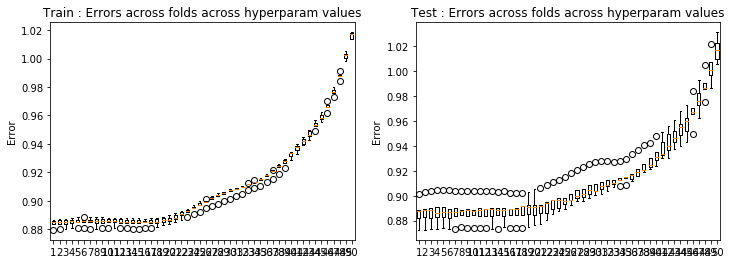

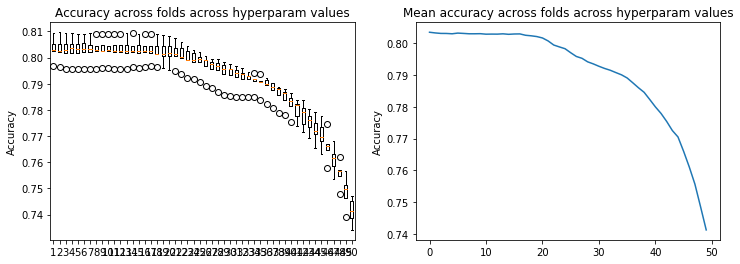

In [47]:
result_crossval(loss_tr25,loss_te25)
result_crossval_accuracy(acc25)

In [18]:
# test 26: degree 9, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr26, loss_te26, w26, acc26 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 9, seed = 5, k_fold = 5, class_distribution = False, error = 'rmse',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  5.42431858e+00  2.37380447e-01 -3.58922092e-01
 -8.68861016e-01  2.25434486e-01 -3.84305371e+00  1.65672614e+00
 -1.20725402e-01  6.22457357e-01  1.43113996e-02  2.18831889e-03
  3.44120854e-01 -3.37556741e-04  5.34675055e-02 -9.46117474e-02
 -2.62069880e-03 -6.92075749e-02  1.41814512e-02  3.51815918e-02
 -4.77288495e+01 -1.41637534e+00 -6.63067893e+00  1.04671583e+01
 -1.54377239e-02  1.33385215e+01 -4.41569687e+00  1.48568342e-01
  1.05112628e+00  7.33658856e-02  5.91102711e-02 -1.02861075e+00
 -1.00880542e-01 -1.18501838e-02  1.29505261e+00  4.66182154e-03
 -3.25293748e-01  1.11395647e-01 -2.07709990e-02  1.37993772e+02
  4.06822380e+00  3.02019521e+01 -2.26284041e+01 -3.14464809e+00
 -1.26154491e+01  6.42577187e+00  1.10030005e+00 -3.70626362e+00
 -1.34330937e-01 -1.6098

Ridge regression: w=[-2.78869252e-01  5.35920844e+00  2.47806662e-01 -2.41023599e-01
 -1.08790533e+00  2.39195281e-01 -3.18289523e+00  1.69903811e+00
 -5.71309436e-02  7.65907124e-01  3.09122636e-02 -2.36688201e-03
  4.70974361e-01 -1.05421626e-02  2.94531988e-02  4.72453906e-02
  2.89040835e-02 -3.88827401e-01  1.43792393e-02  1.74520987e-02
 -4.72659455e+01 -1.71601653e+00 -7.56391497e+00  1.14334245e+01
 -5.30289318e-01  1.12059223e+01 -3.41681336e+00  1.63833049e-01
  9.81417109e-01  8.15569740e-02  4.21756380e-02 -2.35201501e+00
 -1.11705532e-01 -4.62594307e-03  9.38936609e-02  1.45933274e-02
  1.46210037e+00  1.56750762e-01  5.27562859e-02  1.36690674e+02
  5.48791423e+00  3.28554629e+01 -2.36441099e+01 -7.27106977e-01
 -1.05410573e+01  3.12039856e+00  3.80400699e-01 -4.10733155e+00
 -2.03924470e-01 -6.95072159e-02  1.66312945e+00  5.69609377e-02
 -2.14520669e-01  1.25477703e+00 -2.25075160e-01 -1.84093184e+00
 -1.57553844e-01 -1.71694322e-01 -1.34538607e+02 -1.19210291e+01
 -4.1

Ridge regression: w=[-2.75017660e-01  4.28970539e+00  2.00010232e-01 -6.81040605e-01
 -1.35422396e-01  2.35098527e-01 -2.92526442e+00  9.35725012e-01
 -1.44638577e-01  6.81275493e-01  4.53658304e-02 -2.93725563e-02
  6.62085277e-01  1.94039106e-04  5.56368101e-02 -2.39207215e-01
 -1.02147716e-02 -1.67550103e-01 -1.06637678e-02 -3.93253639e-03
 -4.05320773e+01 -1.12694615e+00 -5.06921877e+00  6.99174785e+00
 -2.50693327e-01  1.02632414e+01 -1.22272567e+00  1.26857893e-01
  1.06480446e+00  6.53400407e-02  1.09887585e-02 -2.71021829e+00
 -1.22120345e-01 -2.31235259e-02  2.33269043e+00  2.68810077e-02
  5.11130349e-01  1.36485696e-01  4.56778227e-02  1.20588448e+02
  3.03498376e+00  2.77202033e+01 -1.63514801e+01 -2.16846353e+00
 -9.10790152e+00  6.76486548e-01  9.84931824e-01 -5.13844624e+00
 -3.78065597e-01  7.05623604e-02  2.56171644e+00  8.43578480e-03
 -4.06756922e-01 -5.90333350e+00  1.22715575e-01 -2.15795489e-01
  1.85091781e-02 -8.42994183e-02 -1.20788242e+02 -7.17688701e+00
 -3.8

Ridge regression: w=[-2.76819780e-01  4.19686384e+00  2.02444460e-01 -3.35592072e-01
 -3.87193887e-01  1.36986033e-01 -2.43215307e+00  1.50384690e+00
 -1.08430561e-01  1.07000218e+00  3.65635301e-02 -5.85575161e-03
  8.07823936e-01 -8.20874916e-03  3.49439801e-02 -2.55509976e-01
 -2.58652268e-02 -1.76884222e-01  7.24621643e-03 -1.11483783e-02
 -4.00024747e+01 -1.17807479e+00 -6.78532076e+00  8.18699981e+00
  4.54173638e-01  8.41006585e+00 -2.76969376e+00  1.01961477e-01
 -7.35912243e-01  9.22499226e-02  6.56092165e-02 -2.81677628e+00
 -1.21726159e-01  1.74351282e-02  2.27112334e+00  6.98336084e-02
 -8.34874686e-02  1.34819991e-01  2.46658414e-02  1.19217104e+02
  3.16658589e+00  3.08544634e+01 -1.87246243e+01 -4.07050173e+00
 -7.13350808e+00  1.89094931e+00  9.27700105e-01 -1.13924082e+00
 -2.74588638e-01 -5.00056237e-02  1.04580112e+00  7.72250109e-02
 -2.36231075e-01 -5.57532153e+00  2.95655841e-01  2.19748645e+00
 -9.59560613e-02  1.06171107e-01 -1.18988153e+02 -6.72966768e+00
 -4.0

Ridge regression: w=[-2.78727903e-01  3.21307408e+00  1.71285564e-01 -5.62269718e-01
  2.10816973e-01  3.02680005e-01 -2.33415178e+00  1.06121215e+00
 -1.16880332e-01  1.29568864e+00  1.67010056e-02 -8.98276428e-04
  7.15661699e-01  1.15324973e-02  5.28858542e-02 -1.57119291e-01
  1.39123329e-02 -1.90843221e-01  5.95720077e-03  1.35042102e-02
 -3.35292532e+01 -7.51566185e-01 -5.30519805e+00  5.10456067e+00
 -7.53992054e-01  8.04113236e+00 -1.89121910e+00  8.62845184e-02
 -1.50117479e+00  7.48341792e-02  2.29187783e-02 -1.99119623e+00
 -1.08565298e-01 -1.14230584e-03  1.63978942e+00  3.32885730e-02
  6.23117454e-01  1.27292673e-01  3.13540282e-02  1.02889949e+02
  1.44846350e+00  2.67508506e+01 -1.26063577e+01 -4.76399809e-01
 -6.63316608e+00  1.58911591e+00  7.93750643e-01 -1.09423818e+00
 -1.45872983e-01 -3.12092375e-02 -2.52733135e-01 -1.25947221e-01
 -4.50828834e-01 -3.77789552e+00 -2.44419415e-02 -5.83607906e-01
 -8.22219813e-02 -1.55685109e-01 -1.03347145e+02 -4.13381413e+00
 -3.6

Ridge regression: w=[-2.76431078e-01  2.20444574e+00  1.95008149e-01 -8.89529855e-01
  1.05701290e+00  2.55971205e-01 -3.03695941e+00  9.86517326e-01
 -1.19204661e-01  5.26933181e-01  1.63064604e-02  8.28762191e-04
  7.35876549e-01  4.44582420e-04  5.15996656e-02 -1.04753101e-01
 -2.60044587e-03 -1.52623957e-01  1.44187280e-02  3.34315170e-02
 -2.68354889e+01 -9.96062973e-01 -3.39360392e+00  1.02347676e+00
 -4.12536925e-01  1.01470537e+01 -2.15112427e+00  1.45173774e-01
  5.79077721e-01  7.30959321e-02  5.91230464e-02 -2.36681835e+00
 -1.01466617e-01 -1.23989105e-02  1.48550475e+00  4.08678397e-03
  1.62003654e-01  1.12667984e-01 -2.12841706e-02  8.56081768e+01
  2.21029284e+00  2.26201258e+01 -5.79612906e+00 -1.05397129e+00
 -8.22918624e+00  2.55424782e+00  1.05530694e+00 -2.05282588e+00
 -1.49239175e-01 -1.50456607e-01  1.18167868e+00  5.32611866e-02
 -3.39657963e-01 -4.06270929e+00  5.87959318e-02  9.00553888e-01
 -1.66272771e-01 -2.95215580e-01 -8.67130572e+01 -5.05716807e+00
 -3.3

Ridge regression: w=[-2.78869241e-01  2.16345129e+00  1.94123556e-01 -8.74924914e-01
  8.65037184e-01  2.59736890e-01 -2.56570632e+00  1.39207640e+00
 -5.59585571e-02  8.41284448e-01  3.22741580e-02 -3.36609338e-03
  5.25742752e-01 -9.61471454e-03  2.86606084e-02  8.90111848e-03
  2.96813783e-02 -3.16148662e-01  1.52534551e-02  1.58855277e-02
 -2.65967755e+01 -1.18860165e+00 -3.67842080e+00  1.91284831e+00
 -8.37530007e-01  8.72026062e+00 -2.44099117e+00  1.60509919e-01
  1.04231240e-01  8.19687209e-02  4.29269545e-02 -2.48781197e+00
 -1.10229953e-01 -5.10529062e-03  5.45325212e-01  1.53796104e-02
  1.01697303e+00  1.57224259e-01  5.31913984e-02  8.49919472e+01
  3.23016360e+00  2.36388551e+01 -6.71770917e+00  1.09119494e+00
 -7.05533727e+00  1.52451237e+00  3.41609193e-01 -1.90914529e+00
 -2.15093478e-01 -6.07068682e-02  2.15197538e+00  5.49056515e-02
 -2.09141492e-01 -1.00641914e+00 -2.34484732e-01 -1.00227243e+00
 -1.66234938e-01 -1.65788881e-01 -8.57961965e+01 -6.85373405e+00
 -3.4

Ridge regression: w=[-2.75017643e-01  1.01644798e+00  1.60680891e-01 -1.37510332e+00
  1.55167160e+00  2.63725323e-01 -2.28763109e+00  8.40207230e-01
 -1.42585758e-01  9.86094066e-01  4.65701202e-02 -3.13177254e-02
  5.15759204e-01  1.33546320e-03  5.30269704e-02 -1.98000657e-01
 -1.09809551e-02 -1.69691562e-01 -9.67239386e-03 -5.32902086e-03
 -1.92953214e+01 -7.75659119e-01 -6.35751317e-01 -9.77748701e-01
 -6.23631313e-01  7.89103022e+00 -7.87678990e-01  1.22668993e-01
 -5.99398397e-01  6.59067693e-02  1.03794100e-02 -2.16772145e+00
 -1.23211773e-01 -2.24271983e-02  2.09790713e+00  2.74012552e-02
  4.80644377e-01  1.37283229e-01  4.55195786e-02  6.71977467e+01
  1.62523857e+00  1.66414713e+01 -2.78075725e+00 -2.59807312e-01
 -6.22734972e+00 -1.87058956e-01  9.35066788e-01 -1.60258609e+00
 -3.87121728e-01  8.58460996e-02  1.95873456e+00  3.04887290e-03
 -3.90666439e-01 -5.63737751e+00  1.22450470e-01 -1.30706030e-01
  1.01743146e-02 -8.03537891e-02 -6.96720317e+01 -4.15049047e+00
 -2.8

Ridge regression: w=[-2.76819763e-01  1.03714664e+00  1.60811924e-01 -1.07081450e+00
  1.47544814e+00  1.76744585e-01 -1.94494599e+00  1.28520464e+00
 -1.06989299e-01  1.03366734e+00  3.74515096e-02 -7.51492392e-03
  8.51544639e-01 -7.19975186e-03  3.20815942e-02 -2.28831885e-01
 -2.55676859e-02 -2.98690169e-01  6.86894653e-03 -1.31984708e-02
 -1.94566585e+01 -8.40482019e-01 -2.06431087e+00 -7.78822502e-01
 -3.44013874e-03  6.62426648e+00 -2.10325751e+00  1.00509185e-01
 -9.40275045e-01  9.25735520e-02  6.57770205e-02 -3.10934558e+00
 -1.20350385e-01  1.75551173e-02  2.08968895e+00  7.02836310e-02
  5.98524424e-01  1.35207383e-01  2.34793740e-02  6.75304755e+01
  1.96382833e+00  1.90566498e+01 -3.12356004e+00 -1.92783199e+00
 -5.01873493e+00  9.17328908e-01  8.77466808e-01 -3.21645518e-01
 -2.83236257e-01 -4.00406944e-02  2.11383089e+00  7.38676729e-02
 -2.18526504e-01 -5.15095462e+00  2.86545626e-01  6.90177550e-01
 -9.84201690e-02  1.15545787e-01 -6.96359934e+01 -4.50376972e+00
 -3.0

Ridge regression: w=[-2.78727879e-01  1.77842454e-01  1.44021143e-01 -1.34061693e+00
  1.78590336e+00  3.21054511e-01 -1.79560684e+00  7.92655408e-01
 -1.15471780e-01  1.26941897e+00  1.72892854e-02 -2.78290668e-03
  8.19367745e-01  1.21966010e-02  5.07182840e-02 -1.30721118e-01
  1.42599766e-02 -1.72228031e-01  6.37954695e-03  1.21376955e-02
 -1.37821658e+01 -5.18603288e-01 -2.67261969e-01 -2.12238368e+00
 -1.00401180e+00  6.11414037e+00 -1.07828454e+00  8.56846962e-02
 -1.92539997e+00  7.39169454e-02  2.23345523e-02 -2.54138213e+00
 -1.07485057e-01 -1.55577555e-03  1.51146549e+00  3.37306209e-02
  4.60830986e-01  1.28255605e-01  3.02960140e-02  5.31064780e+01
  5.57272397e-01  1.39079246e+01 -8.18163735e-01  8.67498633e-01
 -4.45334837e+00  3.95048568e-01  7.51920561e-01  3.88575877e-01
 -1.51284100e-01 -1.90651175e-02  1.29021283e+00 -1.26237567e-01
 -4.38065287e-01 -3.79114327e+00 -3.19355151e-02 -1.84194547e-01
 -8.75751504e-02 -1.49199567e-01 -5.55637848e+01 -2.33359512e+00
 -2.4

Ridge regression: w=[-2.76431043e-01 -5.56839440e-01  1.55732550e-01 -1.65636827e+00
  2.21994194e+00  2.74418018e-01 -2.20061622e+00  7.62366911e-01
 -1.14357493e-01  5.48829046e-01  1.78526916e-02 -1.06236830e-03
  6.19757042e-01  1.33871056e-03  4.96763871e-02 -6.58212425e-02
 -2.27904317e-03 -2.10041262e-01  1.47083368e-02  3.14723059e-02
 -8.95914250e+00 -6.55775693e-01  1.74173697e+00 -4.06850417e+00
 -6.36755269e-01  7.25788929e+00 -1.26315197e+00  1.43900830e-01
  2.38350599e-01  7.29328235e-02  5.92284724e-02 -2.08018009e+00
 -1.01995914e-01 -1.25488749e-02  1.22656535e+00  3.62302486e-03
  4.69462837e-01  1.13771621e-01 -2.20582527e-02  4.06923106e+01
  9.58162860e-01  9.12384156e+00  1.88937596e+00  7.17075663e-03
 -5.23180503e+00  9.16230508e-01  9.78937682e-01 -1.18742007e+00
 -1.60837293e-01 -1.36368828e-01  1.44142147e+00  4.85542180e-02
 -3.30276637e-01 -3.51775129e+00  5.36721053e-02  2.22597551e-01
 -1.71395116e-01 -2.85033189e-01 -4.35248564e+01 -2.72737530e+00
 -2.0

Ridge regression: w=[-2.78869205e-01 -5.99852789e-01  1.38941696e-01 -1.70530253e+00
  2.04592588e+00  2.54741069e-01 -1.88833525e+00  1.19831322e+00
 -5.42666503e-02  8.38023493e-01  3.32633036e-02 -4.99417153e-03
  3.40368332e-01 -8.56876459e-03  2.76863445e-02  7.61883271e-03
  3.01896033e-02 -2.82189755e-01  1.61029915e-02  1.41612673e-02
 -8.77805753e+00 -7.08466715e-01  1.83434084e+00 -3.18148107e+00
 -8.41382607e-01  6.35920028e+00 -1.86056889e+00  1.59235578e-01
 -2.05379855e-01  8.23080311e-02  4.35020060e-02 -1.84016163e+00
 -1.08878729e-01 -5.42168226e-03  6.18468393e-01  1.61413641e-02
  7.64473269e-01  1.57585991e-01  5.33038766e-02  4.03896448e+01
  1.50682757e+00  9.24776491e+00  8.34591116e-01  1.37705756e+00
 -4.57514352e+00  7.14712084e-01  3.02693820e-01 -9.90482552e-01
 -2.23322991e-01 -4.82968864e-02  1.76979120e+00  5.15332765e-02
 -2.02725789e-01 -1.55970848e+00 -2.41746430e-01 -3.97120489e-01
 -1.74432363e-01 -1.58455293e-01 -4.31743204e+01 -3.84080931e+00
 -2.0

Ridge regression: w=[-2.75017591e-01 -1.34781992e+00  1.19305838e-01 -2.00887442e+00
  2.33733553e+00  2.79299662e-01 -1.53593187e+00  8.36386332e-01
 -1.37011495e-01  1.07053988e+00  4.70860299e-02 -3.32116554e-02
  2.57135673e-01  2.47230034e-03  5.07937245e-02 -1.19243393e-01
 -1.12056391e-02 -1.85266255e-01 -8.76422817e-03 -6.71349775e-03
 -4.07401450e+00 -4.29365020e-01  3.86737215e+00 -4.30401648e+00
 -8.21967710e-01  5.37514257e+00 -6.41398806e-01  1.21496704e-01
 -1.08565343e+00  6.64222947e-02  9.80205926e-03 -1.35936304e+00
 -1.23885896e-01 -2.15788371e-02  1.53492282e+00  2.77155789e-02
  5.22794168e-01  1.37867519e-01  4.49788859e-02  2.91300372e+01
  4.30715137e-01  4.29204356e+00  1.95363409e+00  6.76353662e-01
 -3.86291885e+00 -5.68848002e-01  8.58478684e-01 -3.65119751e-01
 -3.90734720e-01  1.00110794e-01  1.25516333e+00 -2.68293181e-03
 -3.75849375e-01 -4.11592950e+00  1.18945868e-01 -1.50461976e-01
  2.99971861e-03 -7.38008346e-02 -3.32133850e+01 -2.18589969e+00
 -1.5

Ridge regression: w=[-2.76819711e-01 -1.28618017e+00  1.10747081e-01 -1.74797623e+00
  2.33790267e+00  2.09785739e-01 -1.33962867e+00  1.12798647e+00
 -1.01542864e-01  9.47941475e-01  3.78705942e-02 -9.43043668e-03
  5.88282895e-01 -6.15289253e-03  2.97413754e-02 -1.76059843e-01
 -2.47254023e-02 -3.62558852e-01  6.62116893e-03 -1.45805528e-02
 -4.44630543e+00 -4.35756923e-01  2.72683935e+00 -4.49938133e+00
 -3.51761821e-01  4.61304985e+00 -1.65338104e+00  1.02258571e-01
 -8.48437898e-01  9.27231091e-02  6.59731098e-02 -2.27035476e+00
 -1.19334451e-01  1.76614988e-02  1.70807145e+00  7.05321277e-02
  9.47973250e-01  1.35461099e-01  2.25018722e-02  2.98993168e+01
  6.48369886e-01  5.97709485e+00  2.33083384e+00 -4.93149199e-01
 -3.14965625e+00  3.65949366e-01  7.95357330e-01 -9.53905751e-02
 -2.87765227e-01 -2.76442559e-02  1.71145524e+00  6.91561759e-02
 -2.03248189e-01 -4.06876826e+00  2.73619820e-01 -6.22536555e-02
 -1.00702359e-01  1.21699324e-01 -3.35279672e+01 -2.57970074e+00
 -1.6

Ridge regression: w=[-2.78727802e-01 -1.75000713e+00  1.16526825e-01 -1.83941314e+00
  2.33960216e+00  3.25316159e-01 -1.15449273e+00  6.53457974e-01
 -1.10527929e-01  1.11577908e+00  1.74348161e-02 -4.50100857e-03
  5.74693835e-01  1.25650776e-02  4.85326656e-02 -8.02730760e-02
  1.47659407e-02 -1.75660955e-01  6.65800413e-03  1.10719108e-02
 -1.39614667e+00 -2.83434528e-01  3.47945685e+00 -4.41546929e+00
 -1.08960752e+00  4.00727060e+00 -6.72855579e-01  8.69987352e-02
 -1.64011131e+00  7.32505694e-02  2.19243214e-02 -1.80793339e+00
 -1.06693633e-01 -2.00824321e-03  1.16949891e+00  3.41333922e-02
  4.30405550e-01  1.28751505e-01  2.92290253e-02  2.21977239e+01
 -2.55688161e-01  3.25261361e+00  2.31371257e+00  1.37173905e+00
 -2.56256410e+00 -1.34432913e-01  6.84412175e-01  5.81156811e-01
 -1.52955294e-01 -7.23813730e-03  1.07318972e+00 -1.25767292e-01
 -4.22052873e-01 -2.93698778e+00 -3.87711570e-02 -3.48943753e-02
 -9.08529640e-02 -1.41617667e-01 -2.60751466e+01 -1.03885821e+00
 -1.2

Ridge regression: w=[-2.76430932e-01 -2.13088485e+00  1.21643906e-01 -1.93163015e+00
  2.42158895e+00  2.84982004e-01 -1.31744434e+00  6.92130865e-01
 -1.02613247e-01  5.94438320e-01  1.83576188e-02 -3.32472891e-03
  3.12232839e-01  2.27570988e-03  4.77100163e-02 -1.08454905e-02
 -1.47062197e-03 -2.33626387e-01  1.48554646e-02  2.95478347e-02
  1.00089061e+00 -3.55572179e-01  4.32946291e+00 -4.91002536e+00
 -7.66819295e-01  4.38209297e+00 -9.15515862e-01  1.44733215e-01
 -1.70258408e-03  7.29535286e-02  5.89923130e-02 -1.15636651e+00
 -1.02065684e-01 -1.24398954e-02  8.40503858e-01  3.47217629e-03
  5.98553139e-01  1.14374636e-01 -2.25713915e-02  1.61870658e+01
 -8.26833400e-02  8.50872231e-01  3.04424342e+00  5.91266772e-01
 -2.73020767e+00  2.39119157e-01  8.45040932e-01 -7.44418102e-01
 -1.64920717e-01 -1.18567090e-01  8.85762639e-01  4.29883503e-02
 -3.16825384e-01 -2.48076395e+00  4.58244246e-02 -6.82252661e-02
 -1.74130285e-01 -2.70102404e-01 -2.04577523e+01 -1.10426408e+00
 -1.0

Ridge regression: w=[-2.78869094e-01 -2.18180664e+00  8.94848162e-02 -2.00904161e+00
  2.29791713e+00  2.40668550e-01 -1.13343940e+00  1.01818732e+00
 -5.18529922e-02  7.84754999e-01  3.35178382e-02 -6.85069512e-03
  6.93076448e-02 -7.57202304e-03  2.66555117e-02  2.29741205e-02
  2.98343233e-02 -2.76102292e-01  1.65861723e-02  1.26701351e-02
  1.19558414e+00 -2.75516595e-01  4.57250273e+00 -4.17907916e+00
 -7.37395726e-01  3.88968135e+00 -1.39290657e+00  1.59516678e-01
 -2.63646681e-01  8.24168692e-02  4.36389220e-02 -8.74923359e-01
 -1.07898420e-01 -5.53324796e-03  5.45317121e-01  1.65862560e-02
  6.90788046e-01  1.57675577e-01  5.31532204e-02  1.59488995e+01
  3.21512038e-02  6.49714953e-01  2.05947122e+00  1.12064776e+00
 -2.41544607e+00  2.09579595e-01  2.70327751e-01 -6.38146555e-01
 -2.25606732e-01 -3.45247765e-02  1.02402162e+00  4.66343882e-02
 -1.95064213e-01 -1.50390566e+00 -2.39998979e-01 -1.74908298e-01
 -1.78775979e-01 -1.48862423e-01 -2.03370097e+01 -1.63145124e+00
 -1.0

Ridge regression: w=[-2.75017432e-01 -2.56919260e+00  8.99482348e-02 -2.05056274e+00
  2.29926972e+00  2.83179891e-01 -8.07979564e-01  8.57503344e-01
 -1.25329438e-01  1.03471627e+00  4.64026777e-02 -3.45601827e-02
  5.75300923e-03  3.41344814e-03  4.83632380e-02 -4.52704463e-02
 -1.02536651e-02 -1.91881825e-01 -8.05163417e-03 -8.01585350e-03
  3.55585699e+00 -1.60852670e-01  5.20810472e+00 -4.24538881e+00
 -9.00772533e-01  3.02955392e+00 -6.42833826e-01  1.22008903e-01
 -1.02940302e+00  6.67409826e-02  9.23570719e-03 -5.82417961e-01
 -1.23685651e-01 -2.07946537e-02  1.01680861e+00  2.77883900e-02
  5.43941418e-01  1.38251667e-01  4.41035468e-02  1.06271930e+01
 -5.13830418e-01 -1.30627942e+00  2.04483095e+00  1.09387765e+00
 -1.90682922e+00 -6.59968716e-01  7.30823138e-01 -1.25976184e-01
 -3.84823552e-01  1.10147227e-01  6.21014095e-01 -7.83791783e-03
 -3.56210414e-01 -2.69493297e+00  1.08205073e-01 -1.72567701e-01
 -1.96985876e-03 -6.32515514e-02 -1.61462626e+01 -7.51740895e-01
 -8.1

Ridge regression: w=[-2.76819550e-01 -2.51166567e+00  7.30981191e-02 -1.83505238e+00
  2.31827845e+00  2.28909550e-01 -7.39486566e-01  9.67670428e-01
 -8.87404289e-02  8.20388373e-01  3.75240017e-02 -1.13205067e-02
  2.67940848e-01 -5.12498770e-03  2.78089957e-02 -1.16974495e-01
 -2.25214468e-02 -3.69776703e-01  6.46077065e-03 -1.44548672e-02
  3.21785506e+00 -1.02902930e-01  4.32055572e+00 -4.50469057e+00
 -5.61984275e-01  2.68863475e+00 -1.26191671e+00  1.05433166e-01
 -6.05882382e-01  9.26313269e-02  6.55620593e-02 -1.16430477e+00
 -1.18466061e-01  1.75796808e-02  1.31165632e+00  7.00983124e-02
  1.01753281e+00  1.35574597e-01  2.19275531e-02  1.13006426e+01
 -4.77214370e-01 -1.70319601e-01  2.51990504e+00  3.66015460e-01
 -1.55639436e+00 -8.46358280e-03  6.49899656e-01 -1.43647940e-01
 -2.85632333e-01 -1.36370794e-02  8.91715503e-01  6.27141672e-02
 -1.88141920e-01 -3.01241638e+00  2.51621706e-01 -2.89040427e-01
 -1.01544402e-01  1.19161271e-01 -1.63626231e+01 -9.84235668e-01
 -8.2

Ridge regression: w=[-2.78727567e-01 -2.71394003e+00  1.04565823e-01 -1.77666954e+00
  2.17236323e+00  3.16711633e-01 -6.10365197e-01  5.84540754e-01
 -1.00363070e-01  9.16005701e-01  1.70839854e-02 -5.80719056e-03
  2.97598384e-01  1.23934049e-02  4.49158701e-02 -2.90622072e-02
  1.55603953e-02 -1.85314609e-01  6.72257078e-03  1.00624541e-02
  4.53538508e+00 -1.49428495e-01  4.17137218e+00 -3.85274915e+00
 -1.06541916e+00  2.27828867e+00 -5.01345258e-01  8.80987251e-02
 -1.08501103e+00  7.25893949e-02  2.13913456e-02 -9.19698849e-01
 -1.05832076e-01 -2.50393054e-03  8.43183053e-01  3.42893826e-02
  4.56475628e-01  1.28845318e-01  2.80798241e-02  8.07879657e+00
 -7.86454168e-01 -7.04756082e-01  1.82359529e+00  1.45471737e+00
 -1.16255428e+00 -3.16092031e-01  5.71043869e-01  2.56119682e-01
 -1.50632761e-01  3.20794935e-03  4.82914427e-01 -1.22229463e-01
 -3.89636058e-01 -2.13928749e+00 -4.55105854e-02 -2.57793988e-02
 -9.13096359e-02 -1.30018087e-01 -1.34317433e+01 -1.68769514e-01
 -6.4

Ridge regression: w=[-2.76430592e-01 -2.89565405e+00  1.11596268e-01 -1.71043968e+00
  2.05437750e+00  2.82783056e-01 -6.85316143e-01  6.11454831e-01
 -8.34483680e-02  6.03296895e-01  1.77243958e-02 -6.79493918e-03
  9.72201462e-02  3.67690777e-03  4.44135127e-02  4.11666075e-02
  1.28551622e-04 -2.27203594e-01  1.45454818e-02  2.66165228e-02
  5.60368999e+00 -2.25273011e-01  4.18504803e+00 -3.61529051e+00
 -7.89262201e-01  2.38640511e+00 -6.81004768e-01  1.43622516e-01
 -1.49514347e-01  7.26197992e-02  5.78757348e-02 -4.39670138e-01
 -1.01484271e-01 -1.21132632e-02  5.11506272e-01  3.40319052e-03
  5.93501949e-01  1.14799047e-01 -2.28624872e-02  5.53308554e+00
 -6.31949857e-01 -1.34094409e+00  1.80107999e+00  7.92245233e-01
 -1.13569392e+00 -7.91906375e-02  6.39960569e-01 -4.74523412e-01
 -1.60533245e-01 -8.82066971e-02  3.55468816e-01  3.27526840e-02
 -2.88120360e-01 -1.67456280e+00  3.27236825e-02 -1.26772842e-01
 -1.72322460e-01 -2.42022509e-01 -1.13033100e+01 -1.69747291e-01
 -5.4

Ridge regression: w=[-2.78868750e-01 -2.94554277e+00  7.19476496e-02 -1.79237235e+00
  2.01324626e+00  2.25905027e-01 -5.82420596e-01  8.24618694e-01
 -4.92023688e-02  7.06136710e-01  3.29510097e-02 -9.27387149e-03
 -9.36575393e-02 -6.43569046e-03  2.46730575e-02  5.07841343e-02
  2.77782062e-02 -2.72922164e-01  1.64213012e-02  1.07060384e-02
  5.78812930e+00 -7.57452296e-02  4.44581548e+00 -3.20467963e+00
 -6.32298640e-01  2.14427054e+00 -9.85193137e-01  1.56992688e-01
 -2.55635300e-01  8.18473244e-02  4.31623346e-02 -1.91399610e-01
 -1.06918685e-01 -5.63967662e-03  4.00323042e-01  1.64575955e-02
  6.66412272e-01  1.57564492e-01  5.22645716e-02  5.33946408e+00
 -7.56706854e-01 -1.58373434e+00  1.12590080e+00  8.42324917e-01
 -1.01613617e+00 -1.09702017e-01  2.38936750e-01 -4.52874064e-01
 -2.21358639e-01 -1.48035534e-02  4.32292023e-01  3.88131326e-02
 -1.77281320e-01 -1.25366534e+00 -2.21364309e-01 -1.05148103e-01
 -1.77248087e-01 -1.31153633e-01 -1.12736321e+01 -3.60695406e-01
 -5.4

Ridge regression: w=[-2.75016939e-01 -3.11226882e+00  9.13784773e-02 -1.71427992e+00
  1.88739641e+00  2.69669940e-01 -3.46777338e-01  8.14936751e-01
 -1.09622982e-01  9.24034086e-01  4.36623865e-02 -3.54635341e-02
 -1.05390881e-01  4.24228168e-03  4.35417036e-02  1.82568159e-02
 -7.44085678e-03 -1.80101750e-01 -7.56530941e-03 -9.91120758e-03
  6.85932984e+00 -1.06194712e-01  4.42515764e+00 -2.88577787e+00
 -8.49876473e-01  1.59004872e+00 -6.33675154e-01  1.20262444e-01
 -8.06587256e-01  6.61611908e-02  8.55133738e-03 -1.57551655e-01
 -1.22467742e-01 -1.98184200e-02  6.24815690e-01  2.71974092e-02
  5.05176018e-01  1.38601304e-01  4.22082271e-02  3.00696857e+00
 -8.77287587e-01 -2.04676156e+00  8.34129351e-01  1.11067107e+00
 -7.94086005e-01 -5.96066728e-01  5.63420759e-01 -1.57508594e-01
 -3.61495112e-01  1.17524371e-01  2.43302259e-01 -1.31091203e-02
 -3.13256817e-01 -1.75898559e+00  8.35373709e-02 -1.40760302e-01
 -4.81798493e-03 -4.46525535e-02 -9.75234686e+00 -6.55172020e-03
 -4.6

Ridge regression: w=[-2.76819054e-01 -3.08040287e+00  7.14014024e-02 -1.55661051e+00
  1.89916566e+00  2.26640845e-01 -3.51238116e-01  7.97145689e-01
 -7.09941437e-02  6.85122792e-01  3.58469567e-02 -1.35631104e-02
  9.64177928e-02 -3.79602245e-03  2.46677409e-02 -4.93936370e-02
 -1.76538337e-02 -3.36944668e-01  6.07120727e-03 -1.23825682e-02
  6.64532190e+00 -1.84336809e-02  3.79743491e+00 -3.06386432e+00
 -5.96644709e-01  1.48556497e+00 -9.46084474e-01  1.05873221e-01
 -3.83809536e-01  9.15380789e-02  6.39593445e-02 -4.69411654e-01
 -1.17086329e-01  1.71205447e-02  9.22438016e-01  6.82191741e-02
  9.18595323e-01  1.35757477e-01  2.08819075e-02  3.46993718e+00
 -9.42285213e-01 -1.33712251e+00  1.18147062e+00  6.41832859e-01
 -6.38254864e-01 -1.98630783e-01  4.54183807e-01 -2.04038702e-01
 -2.71917867e-01  5.73462613e-03  3.14292239e-01  5.22853123e-02
 -1.60046602e-01 -2.16461678e+00  2.08212990e-01 -2.53959050e-01
 -9.91558102e-02  1.02173047e-01 -9.88987410e+00 -1.17638633e-01
 -4.5

Ridge regression: w=[-2.78726839e-01 -3.13571497e+00  1.19197551e-01 -1.49588926e+00
  1.76686837e+00  2.89798987e-01 -2.86580220e-01  5.18226328e-01
 -8.88945233e-02  7.38653575e-01  1.59863788e-02 -7.08080550e-03
  1.62278727e-01  1.11983344e-02  3.72046290e-02  3.03771623e-02
  1.67167881e-02 -1.86562050e-01  6.23489887e-03  8.14858687e-03
  7.12302543e+00 -1.95379987e-01  3.50234271e+00 -2.50295646e+00
 -9.23573295e-01  1.30754134e+00 -4.26156124e-01  8.57865992e-02
 -6.36669216e-01  7.05638261e-02  2.04504442e-02 -4.29587767e-01
 -1.04230797e-01 -2.92669771e-03  5.13013557e-01  3.36377690e-02
  4.73029160e-01  1.28909272e-01  2.57260444e-02  2.20930806e+00
 -8.57005759e-01 -1.18215684e+00  6.05969511e-01  1.23225675e+00
 -4.67721042e-01 -3.07104824e-01  4.43240050e-01 -2.91861918e-02
 -1.41998006e-01  1.54609548e-02  1.12165828e-01 -1.10468481e-01
 -3.17900790e-01 -1.47048752e+00 -5.35551953e-02 -4.82390573e-02
 -8.69473230e-02 -1.07773867e-01 -8.81926313e+00  2.22477781e-01
 -3.8

Ridge regression: w=[-2.76429541e-01 -3.17796338e+00  1.29543714e-01 -1.41040740e+00
  1.59391424e+00  2.64561393e-01 -3.31395569e-01  4.85143828e-01
 -6.55355122e-02  5.40881707e-01  1.56727016e-02 -1.25024637e-02
  4.19507954e-02  6.36297713e-03  3.81867011e-02  9.80514716e-02
  2.84463047e-03 -2.03809986e-01  1.28435064e-02  2.11544508e-02
  7.46680652e+00 -2.91503629e-01  3.35298252e+00 -2.10564122e+00
 -7.03534585e-01  1.35283228e+00 -4.82537411e-01  1.35112627e-01
 -1.68659834e-01  7.03738002e-02  5.43539636e-02 -1.37080635e-01
 -9.96365449e-02 -1.11754461e-02  1.98125067e-01  2.94974095e-03
  5.28428581e-01  1.15772753e-01 -2.32803121e-02  1.19602448e+00
 -6.61422567e-01 -1.29082611e+00  4.66504714e-01  6.95718588e-01
 -4.32177097e-01 -1.81183136e-01  4.45407090e-01 -3.08130218e-01
 -1.44590938e-01 -3.42988665e-02  7.98099474e-02  1.05966514e-02
 -2.30720944e-01 -1.04248865e+00  1.10878723e-02 -1.01202382e-01
 -1.59474943e-01 -1.89285940e-01 -7.96883118e+00  2.02404005e-01
 -3.4

Ridge regression: w=[-2.78867690e-01 -3.21572024e+00  9.20761991e-02 -1.47658159e+00
  1.61999497e+00  2.06877869e-01 -2.70225309e-01  6.12676615e-01
 -4.81023590e-02  5.86189432e-01  3.12024008e-02 -1.28542409e-02
 -9.57675168e-02 -4.75895408e-03  2.04227592e-02  9.48184245e-02
  2.29637939e-02 -2.58643302e-01  1.46952029e-02  7.28021662e-03
  7.59795741e+00 -1.42068137e-01  3.54469036e+00 -1.98731698e+00
 -5.17063417e-01  1.23261159e+00 -6.69550547e-01  1.47885647e-01
 -1.90970190e-01  7.92762520e-02  4.11441367e-02  5.87589674e-02
 -1.05077675e-01 -5.89198234e-03  1.77095301e-01  1.49243256e-02
  6.29001353e-01  1.57406587e-01  4.91506580e-02  1.08667132e+00
 -8.36275316e-01 -1.43804671e+00  1.18813450e-01  5.89108017e-01
 -3.97436091e-01 -2.08712827e-01  2.17725678e-01 -3.24863409e-01
 -2.07516619e-01  1.76963449e-02  1.24068314e-01  2.51604624e-02
 -1.36831554e-01 -8.72421366e-01 -1.76155317e-01 -7.75923109e-02
 -1.63387312e-01 -9.80228354e-02 -7.97631431e+00  1.42756184e-01
 -3.4

Ridge regression: w=[-2.75015416e-01 -3.20706575e+00  1.20474205e-01 -1.38638707e+00
  1.46209665e+00  2.36068732e-01 -9.20309250e-02  6.42205895e-01
 -9.78676481e-02  7.26546230e-01  3.73340530e-02 -3.58875278e-02
 -6.81457331e-02  5.18314972e-03  3.46964815e-02  8.48874295e-02
 -2.43938180e-03 -1.54957073e-01 -7.64108893e-03 -1.29146062e-02
  7.86952164e+00 -2.45830006e-01  3.43621614e+00 -1.66939737e+00
 -6.74113066e-01  8.72490753e-01 -5.09312887e-01  1.14160257e-01
 -5.34834391e-01  6.28781834e-02  7.51637838e-03 -4.36416470e-02
 -1.19242510e-01 -1.77856352e-02  2.63197423e-01  2.49789187e-02
  4.35442492e-01  1.39270975e-01  3.78024005e-02  1.58685670e-01
 -7.42996687e-01 -1.54002449e+00 -5.33539178e-02  8.24919011e-01
 -3.47979589e-01 -4.44732453e-01  4.33924969e-01 -1.63198606e-01
 -3.07328271e-01  1.23240397e-01  5.69124759e-02 -2.00395712e-02
 -2.33736201e-01 -1.04823227e+00  4.20567529e-02 -9.77678966e-02
 -3.63611689e-03 -1.49380163e-02 -7.32055114e+00  2.50530700e-01
 -3.1

Ridge regression: w=[-2.76817521e-01 -3.20702330e+00  1.02958795e-01 -1.29650572e+00
  1.46550408e+00  2.04762776e-01 -1.27712256e-01  5.83942240e-01
 -5.82928602e-02  5.21672171e-01  3.18120133e-02 -1.62487084e-02
  8.74528856e-02 -1.58679961e-03  1.91862373e-02  3.57102860e-02
 -9.52646338e-03 -2.85516074e-01  4.70820798e-03 -8.25412383e-03
  7.80670939e+00 -1.63956873e-01  3.07075675e+00 -1.74243419e+00
 -4.92828106e-01  8.66466421e-01 -6.76451567e-01  1.00884399e-01
 -1.93456656e-01  8.73284623e-02  5.97930187e-02 -2.10807289e-01
 -1.13914175e-01  1.59484701e-02  4.76872306e-01  6.30266751e-02
  7.69043749e-01  1.36596401e-01  1.76163407e-02  3.87310183e-01
 -8.25825051e-01 -1.17587151e+00  1.18912440e-01  5.26095230e-01
 -2.68557533e-01 -2.04120165e-01  3.05049738e-01 -1.96424243e-01
 -2.37631245e-01  3.22754213e-02  3.50782027e-02  3.37835047e-02
 -1.09917002e-01 -1.34541951e+00  1.37388604e-01 -1.67873039e-01
 -8.85170108e-02  6.83286856e-02 -7.42692456e+00  1.95583201e-01
 -3.0

Ridge regression: w=[-2.78724591e-01 -3.13143501e+00  1.51161775e-01 -1.27344607e+00
  1.36086576e+00  2.45159384e-01 -7.36084590e-02  3.91722860e-01
 -8.21386283e-02  5.60364404e-01  1.36348054e-02 -8.40132129e-03
  1.49141708e-01  8.67528749e-03  2.52203886e-02  9.71536419e-02
  1.79556248e-02 -1.67018300e-01  4.50741753e-03  5.16654016e-03
  7.75994749e+00 -3.68305932e-01  2.91239645e+00 -1.40077934e+00
 -6.81986711e-01  7.68160894e-01 -3.20303060e-01  7.94621569e-02
 -3.28749783e-01  6.42172886e-02  1.85623809e-02 -2.53169129e-01
 -1.00320483e-01 -2.75304693e-03  1.65055961e-01  3.12637024e-02
  4.40673728e-01  1.29633971e-01  2.00643923e-02 -4.68779728e-02
 -6.05507155e-01 -1.02205447e+00 -1.42703283e-01  7.98825072e-01
 -2.22047848e-01 -2.19175554e-01  3.60922014e-01 -1.35018143e-01
 -1.22788111e-01  3.06583423e-02 -5.40286899e-02 -8.66140132e-02
 -2.05523687e-01 -8.38737285e-01 -6.09259264e-02 -6.17372289e-02
 -7.27357180e-02 -7.43615705e-02 -6.89064121e+00  3.24342590e-01
 -2.7

Ridge regression: w=[-2.76426294e-01 -3.02829406e+00  1.56794561e-01 -1.19566481e+00
  1.16444908e+00  2.34790581e-01 -8.64551594e-02  3.22542527e-01
 -5.58239872e-02  4.12662182e-01  1.19475791e-02 -1.87798930e-02
  7.61374185e-02  1.06568869e-02  3.01210817e-02  1.50959430e-01
  6.21624659e-03 -1.65789383e-01  8.38712743e-03  1.42617501e-02
  7.56882348e+00 -4.45347911e-01  2.79436612e+00 -1.01898293e+00
 -5.54351053e-01  7.58902021e-01 -3.03259126e-01  1.18042744e-01
 -7.62298896e-02  6.29058347e-02  4.51006391e-02 -6.57158870e-02
 -9.49934992e-02 -8.38869100e-03 -7.91761033e-02  1.81189192e-03
  4.36464580e-01  1.18836438e-01 -2.42266406e-02 -3.49509408e-01
 -4.30066167e-01 -1.07102759e+00 -1.90483659e-01  4.53692902e-01
 -2.03573593e-01 -1.51918007e-01  3.33046282e-01 -2.03129136e-01
 -1.15356302e-01  3.11587717e-02 -4.16394482e-02 -2.54752609e-02
 -1.55031259e-01 -5.24544930e-01 -1.43825624e-02 -7.54066132e-02
 -1.25616875e-01 -1.21572434e-01 -6.33139907e+00  2.90231850e-01
 -2.6

Ridge regression: w=[-2.78864414e-01 -3.05154458e+00  1.27778870e-01 -1.24182853e+00
  1.21427793e+00  1.83026253e-01 -4.84199478e-02  3.76091843e-01
 -4.90226911e-02  4.20778828e-01  2.78316883e-02 -1.67614963e-02
  1.54025350e-03 -2.29210060e-03  1.46183937e-02  1.40567617e-01
  1.65361125e-02 -2.19698814e-01  1.00661202e-02  3.28071262e-03
  7.64120738e+00 -3.38239847e-01  2.90850773e+00 -1.04152347e+00
 -3.86904660e-01  6.97227478e-01 -4.07586684e-01  1.33368938e-01
 -6.79058583e-02  7.13675739e-02  3.55023175e-02  5.38247759e-02
 -1.00919747e-01 -6.17667371e-03 -5.33592780e-02  1.05859152e-02
  5.43114182e-01  1.57583123e-01  4.13780772e-02 -3.80361546e-01
 -5.50353614e-01 -1.11868371e+00 -3.42627243e-01  3.39558929e-01
 -1.96786229e-01 -1.53515468e-01  2.11673447e-01 -2.26743022e-01
 -1.81211022e-01  5.70954701e-02 -2.40343810e-02  4.54645804e-03
 -7.94396683e-02 -4.71234328e-01 -1.13632959e-01 -6.44055788e-02
 -1.27058134e-01 -5.68487136e-02 -6.34906284e+00  2.66108949e-01
 -2.6

Ridge regression: w=[-2.75010711e-01 -2.87638956e+00  1.49500907e-01 -1.12619089e+00
  1.01272593e+00  1.94592086e-01  9.29552091e-02  3.99418554e-01
 -9.14840830e-02  4.76045771e-01  2.76131462e-02 -3.53437061e-02
  2.70223276e-02  6.30833347e-03  2.46326369e-02  1.38361747e-01
  3.13472924e-03 -1.13049671e-01 -8.62768740e-03 -1.58350251e-02
  7.33199686e+00 -4.25442374e-01  2.77041515e+00 -7.38795713e-01
 -4.58724237e-01  4.41848800e-01 -3.14024533e-01  1.07477168e-01
 -2.41859205e-01  5.36284158e-02  5.79607381e-03 -5.42127956e-02
 -1.11764752e-01 -1.29754445e-02 -1.64916020e-02  2.03380141e-02
  3.39019203e-01  1.41350209e-01  2.89804101e-02 -6.53001192e-01
 -4.37020556e-01 -1.17482293e+00 -3.63413682e-01  4.50471008e-01
 -2.15150662e-01 -2.66344284e-01  3.64411500e-01 -1.16194892e-01
 -2.26097829e-01  1.25305520e-01 -3.96728061e-02 -2.82471179e-02
 -1.44329730e-01 -5.26866424e-01 -1.14432568e-04 -7.35583931e-02
  3.79531321e-03  1.68869552e-02 -5.80756580e+00  2.82373285e-01
 -2.4

Ridge regression: w=[-2.76812785e-01 -2.89148689e+00  1.37888038e-01 -1.09745401e+00
  1.01683335e+00  1.75811681e-01  4.62010450e-02  3.43954353e-01
 -5.36909707e-02  3.41595471e-01  2.54145120e-02 -1.81033076e-02
  1.44931882e-01  1.65323372e-03  1.33120337e-02  1.08601787e-01
 -1.02727664e-03 -2.11248463e-01  1.71506985e-03 -3.63748335e-03
  7.35807244e+00 -3.68476423e-01  2.60530780e+00 -7.55538075e-01
 -3.43424012e-01  4.70996644e-01 -4.20552272e-01  9.41180853e-02
 -2.41622626e-02  7.56373318e-02  5.06368329e-02 -1.47245053e-01
 -1.06524655e-01  1.36164383e-02  1.04414429e-01  5.15107648e-02
  5.88307885e-01  1.39493041e-01  1.02305553e-02 -5.82640252e-01
 -4.96731969e-01 -1.01571642e+00 -3.03235053e-01  2.80791944e-01
 -1.62395927e-01 -1.17146484e-01  2.36818640e-01 -1.46246605e-01
 -1.84250175e-01  5.64323383e-02 -8.90636000e-02  7.83814851e-03
 -5.54310944e-02 -6.79045362e-01  6.53620882e-02 -1.15696112e-01
 -6.49167653e-02  3.26959270e-02 -5.89199944e+00  2.51463785e-01
 -2.4

Ridge regression: w=[-2.78717647e-01 -2.66708867e+00  1.70313144e-01 -1.05354253e+00
  8.76612938e-01  1.99594863e-01  1.12286826e-01  2.48132141e-01
 -7.83222802e-02  3.91942582e-01  1.02077243e-02 -8.74927711e-03
  1.65455329e-01  6.04365780e-03  1.47932284e-02  1.41374298e-01
  1.88767179e-02 -1.15747673e-01  1.31619324e-03  2.85771232e-03
  6.86167534e+00 -5.09969217e-01  2.46066570e+00 -4.84480781e-01
 -4.49770811e-01  3.73362667e-01 -1.95385467e-01  7.38206954e-02
 -1.10630326e-01  4.88222764e-02  1.48369626e-02 -1.86622669e-01
 -9.16746425e-02 -1.13791384e-03 -6.67224135e-02  2.64906970e-02
  3.35886307e-01  1.32695784e-01  9.36125564e-03 -6.41372806e-01
 -3.25731385e-01 -9.20515568e-01 -3.51798260e-01  3.94594485e-01
 -1.68931802e-01 -1.26022122e-01  3.15894774e-01 -1.36735199e-01
 -9.59408881e-02  4.17046789e-02 -1.18634615e-01 -5.99519648e-02
 -1.04238464e-01 -4.00467671e-01 -6.42644242e-02 -6.44024359e-02
 -4.64302252e-02 -4.42714489e-02 -5.34346972e+00  2.98987803e-01
 -2.2

Ridge regression: w=[-2.76416265e-01 -2.41638644e+00  1.62981046e-01 -9.38498112e-01
  6.65924865e-01  2.02331962e-01  1.13088460e-01  1.89863471e-01
 -5.03967538e-02  2.93267456e-01  7.42500191e-03 -2.10804180e-02
  1.12251627e-01  1.50049705e-02  2.40955303e-02  1.74912075e-01
  9.23134454e-03 -1.02524244e-01  1.41071783e-03  9.75573671e-03
  6.23880624e+00 -5.27612758e-01  2.27481915e+00 -1.60244661e-01
 -4.11485826e-01  3.40267690e-01 -1.67765432e-01  1.00244345e-01
  2.29120647e-02  4.58424828e-02  2.73008059e-02 -5.94819108e-02
 -8.63837311e-02 -2.31361873e-03 -2.14810591e-01 -9.31720054e-05
  2.98283503e-01  1.27616075e-01 -2.56295578e-02 -6.11415743e-01
 -2.35013832e-01 -9.45426926e-01 -3.10442000e-01  2.43312870e-01
 -1.58698251e-01 -9.81783553e-02  2.72282993e-01 -1.33835597e-01
 -8.25808368e-02  7.16605686e-02 -8.90601913e-02 -6.06019392e-02
 -9.65717560e-02 -2.26750803e-01 -3.35426910e-02 -6.23176039e-02
 -7.24472454e-02 -7.14352245e-02 -4.71377753e+00  2.62042699e-01
 -2.1

Ridge regression: w=[-2.78854296e-01 -2.43048484e+00  1.41434167e-01 -9.69664368e-01
  7.06745120e-01  1.59996040e-01  1.35705308e-01  1.89359244e-01
 -4.91661984e-02  2.87024021e-01  2.33825909e-02 -1.83885703e-02
  9.23366090e-02  4.20766489e-04  1.06125114e-02  1.62821203e-01
  1.23228492e-02 -1.43047720e-01  3.04274168e-03  1.20751538e-03
  6.27930707e+00 -4.61995020e-01  2.34275774e+00 -2.04937324e-01
 -2.78105382e-01  3.11011203e-01 -2.14044777e-01  1.20355583e-01
  2.42980651e-02  5.33781651e-02  2.48597502e-02 -1.37527201e-02
 -9.36916930e-02 -5.99785756e-03 -1.71696479e-01  2.88444732e-03
  3.79711758e-01  1.59738801e-01  2.84507202e-02 -6.08355975e-01
 -2.88903731e-01 -9.45536001e-01 -3.77843592e-01  1.58515925e-01
 -1.57254004e-01 -7.50873975e-02  2.03381714e-01 -1.54352089e-01
 -1.49671360e-01  8.21034425e-02 -9.05526116e-02 -1.63208305e-02
 -3.43651162e-02 -2.24542150e-01 -6.66701472e-02 -5.70035067e-02
 -7.17223947e-02 -2.83246737e-02 -4.73173733e+00  2.42514765e-01
 -2.1

Ridge regression: w=[-2.74996180e-01 -2.12035427e+00  1.48948352e-01 -7.85892896e-01
  4.91833782e-01  1.59301914e-01  2.28316498e-01  2.23202418e-01
 -8.39894213e-02  2.90536898e-01  1.80790509e-02 -3.28608887e-02
  8.35324293e-02  7.38478986e-03  1.75473889e-02  1.59636596e-01
  7.46867071e-03 -5.01440473e-02 -1.01899247e-02 -1.66898283e-02
  5.56801014e+00 -4.90565322e-01  2.06601862e+00  3.00219869e-02
 -2.97257122e-01  1.56909758e-01 -1.63708908e-01  1.04024420e-01
 -3.50822096e-02  3.62064549e-02  3.38913218e-03 -6.62846684e-02
 -9.91661649e-02 -4.70942365e-03 -1.37131767e-01  1.39276615e-02
  2.04661050e-01  1.47902354e-01  1.68391844e-02 -5.82639535e-01
 -2.41197406e-01 -9.66366289e-01 -3.05217140e-01  1.94991721e-01
 -1.90028660e-01 -1.44784099e-01  3.10152266e-01 -6.64720087e-02
 -1.52719116e-01  1.18219517e-01 -7.99729206e-02 -3.47211172e-02
 -8.31649878e-02 -2.59678350e-01 -2.61516979e-02 -6.33080147e-02
  1.47604256e-02  3.62304340e-02 -4.08406524e+00  2.27129910e-01
 -1.9

Ridge regression: w=[-2.76798159e-01 -2.13246389e+00  1.43884281e-01 -8.01504737e-01
  4.95787145e-01  1.51739529e-01  1.83292434e-01  1.69890131e-01
 -5.15132739e-02  2.26672453e-01  1.87699576e-02 -1.73847457e-02
  1.74859964e-01  5.04837919e-03  9.84289584e-03  1.42007858e-01
  4.75326692e-03 -1.06412549e-01 -1.90413339e-03 -3.61509333e-04
  5.60875182e+00 -4.60093380e-01  2.02781555e+00  3.55698223e-02
 -2.30413002e-01  1.90232687e-01 -2.22750535e-01  8.98882229e-02
  5.93460558e-02  5.30510924e-02  3.59169736e-02 -1.20859866e-01
 -9.37286439e-02  1.01468094e-02 -6.98990285e-02  3.29623603e-02
  3.54580370e-01  1.47489810e-01 -4.24139180e-04 -5.78662812e-01
 -2.73493567e-01 -8.94935472e-01 -2.89396177e-01  1.03795549e-01
 -1.49163824e-01 -4.86902908e-02  2.04911423e-01 -9.74015661e-02
 -1.33305086e-01  6.47967642e-02 -1.33367507e-01 -1.60772590e-02
 -2.12786274e-02 -3.27151120e-01  2.07716995e-02 -9.06793286e-02
 -3.62039871e-02  1.25558728e-02 -4.14109929e+00  2.09184220e-01
 -1.8

Ridge regression: w=[-2.78696200e-01 -1.81039840e+00  1.56953953e-01 -6.95807586e-01
  3.55963198e-01  1.61712083e-01  2.40387770e-01  1.51689089e-01
 -7.15769354e-02  2.88208303e-01  6.60550138e-03 -7.04165295e-03
  1.58797808e-01  4.90362165e-03  1.00163427e-02  1.52509596e-01
  1.91959444e-02 -4.13800121e-02 -1.75179114e-03  2.27652844e-03
  4.84176557e+00 -5.19762669e-01  1.76561656e+00  2.02631525e-01
 -2.89046161e-01  1.13990592e-01 -9.97472022e-02  7.02968778e-02
 -2.62959789e-03  2.41265189e-02  9.59909937e-03 -1.41029312e-01
 -7.88436973e-02  1.75640271e-03 -1.39567135e-01  2.01844038e-02
  1.80895726e-01  1.41542768e-01 -3.09337412e-03 -4.70707357e-01
 -1.93706377e-01 -7.97303940e-01 -2.28765146e-01  1.59611735e-01
 -1.69654174e-01 -7.30804825e-02  2.70348899e-01 -1.09869568e-01
 -7.14196652e-02  4.07732768e-02 -1.32137861e-01 -4.45352055e-02
 -5.04778430e-02 -2.03014063e-01 -6.37596226e-02 -6.23296760e-02
 -1.95279578e-02 -2.68974128e-02 -3.50328648e+00  2.20238422e-01
 -1.6

Ridge regression: w=[-2.76385290e-01 -1.50464321e+00  1.39514680e-01 -5.38802087e-01
  2.13588405e-01  1.66533064e-01  2.29422989e-01  1.15407707e-01
 -4.31324269e-02  2.36221094e-01  3.03766787e-03 -1.78896059e-02
  1.22914534e-01  1.71380884e-02  2.08250195e-02  1.68733363e-01
  1.10042118e-02 -2.83408985e-02 -4.51909789e-03  8.19531902e-03
  4.07505761e+00 -4.92571509e-01  1.45977847e+00  3.39316861e-01
 -2.85272120e-01  9.90513287e-02 -8.42479616e-02  8.65173546e-02
  5.27279178e-02  2.23875027e-02  7.01057840e-03 -6.10609242e-02
 -7.66172744e-02  5.78790740e-03 -2.16263010e-01 -2.61192971e-03
  1.42856734e-01  1.46139317e-01 -2.63227071e-02 -3.27485385e-01
 -1.68432939e-01 -7.67229769e-01 -1.46739239e-01  1.10041688e-01
 -1.56258129e-01 -6.87257996e-02  2.19796044e-01 -9.19699407e-02
 -5.59812493e-02  7.51657197e-02 -1.00763593e-01 -7.82148773e-02
 -6.44518171e-02 -1.18326180e-01 -4.24369804e-02 -5.62964511e-02
 -2.60823894e-02 -4.66002494e-02 -2.86833301e+00  1.84954973e-01
 -1.4

Ridge regression: w=[-2.78823049e-01 -1.51348303e+00  1.22020639e-01 -5.58229052e-01
  2.37780544e-01  1.37171185e-01  2.42447588e-01  9.04380320e-02
 -4.56316950e-02  2.31379227e-01  1.83808467e-02 -1.62272751e-02
  1.27365275e-01  2.39285205e-03  9.79999986e-03  1.60393274e-01
  1.11371726e-02 -5.13735674e-02 -2.53576693e-03  1.21079980e-03
  4.10217483e+00 -4.49895098e-01  1.50329137e+00  3.11115212e-01
 -1.93753863e-01  8.87154334e-02 -9.67845283e-02  1.09755320e-01
  3.81731130e-02  2.82619818e-02  1.34736068e-02 -5.34010666e-02
 -8.61917490e-02 -4.69060092e-03 -1.79572325e-01 -5.22658067e-03
  1.87875362e-01  1.66888214e-01  1.62798805e-02 -3.19964342e-01
 -1.85367571e-01 -7.54866058e-01 -1.83220070e-01  5.65318794e-02
 -1.54285928e-01 -3.70548664e-02  1.82198416e-01 -1.10487282e-01
 -1.20512798e-01  8.25076358e-02 -1.08854933e-01 -2.91794797e-02
 -1.37135057e-02 -1.29770467e-01 -4.52997686e-02 -5.23715049e-02
 -2.61883844e-02 -1.58115366e-02 -2.88281579e+00  1.66027107e-01
 -1.4

Ridge regression: w=[-2.74951306e-01 -1.19973736e+00  1.20125625e-01 -3.58034070e-01
  1.07333153e-01  1.29123352e-01  2.86611060e-01  1.32302411e-01
 -7.10300761e-02  2.14975069e-01  1.03064269e-02 -2.75616470e-02
  9.99410916e-02  7.67551615e-03  1.34357851e-02  1.58202214e-01
  9.47358743e-03  1.00424019e-02 -1.11401024e-02 -1.49583306e-02
  3.36659331e+00 -4.41257208e-01  1.14603965e+00  3.64681584e-01
 -1.87469988e-01  1.77508966e-02 -7.62204430e-02  9.82616020e-02
  4.00997090e-02  1.71947638e-02  1.18813177e-03 -6.72754913e-02
 -8.61311996e-02  3.71541587e-03 -1.52414211e-01  8.42898763e-03
  7.99504152e-02  1.61243444e-01  7.43570456e-03 -2.12950954e-01
 -1.82723776e-01 -7.24176853e-01 -9.21940642e-02  6.44743868e-02
 -1.77856679e-01 -8.66591389e-02  2.44939229e-01 -4.06028577e-02
 -1.02701689e-01  9.75684031e-02 -9.05280007e-02 -3.56521863e-02
 -4.99226038e-02 -1.58947113e-01 -3.48062234e-02 -5.88545519e-02
  2.15224699e-02  3.97194751e-02 -2.29958655e+00  1.41929883e-01
 -1.2

Ridge regression: w=[-2.76752991e-01 -1.20545827e+00  1.20126926e-01 -3.90068919e-01
  1.04683093e-01  1.31535954e-01  2.51543472e-01  8.51934357e-02
 -4.68691723e-02  1.97546102e-01  1.27545719e-02 -1.38528520e-02
  1.67522062e-01  7.21511412e-03  8.76821322e-03  1.48923461e-01
  7.84617460e-03 -1.00222189e-02 -4.22094053e-03  1.56361197e-03
  3.39331613e+00 -4.29828525e-01  1.16472443e+00  3.81232608e-01
 -1.55304596e-01  4.16576533e-02 -9.86104622e-02  8.36577097e-02
  5.77316216e-02  2.76815319e-02  2.16953743e-02 -1.01372277e-01
 -8.04440153e-02  7.07297901e-03 -1.14400752e-01  1.47035906e-02
  1.44829938e-01  1.62021866e-01 -8.98244970e-03 -2.24658174e-01
 -1.97263516e-01 -6.86462584e-01 -8.64090863e-02  1.42639385e-02
 -1.47391507e-01 -2.49705001e-02  1.76881038e-01 -7.10878820e-02
 -9.51075017e-02  5.59067611e-02 -1.36450105e-01 -2.94947831e-02
 -7.33627336e-03 -1.89409007e-01  6.34748178e-04 -7.75683354e-02
 -1.76056262e-02  5.57871103e-03 -2.33115600e+00  1.32725911e-01
 -1.2

Ridge regression: w=[-2.78629976e-01 -9.29940043e-01  1.19896328e-01 -2.95305689e-01
  4.25301461e-02  1.28176233e-01  2.83778419e-01  9.41135782e-02
 -6.00401105e-02  2.48277950e-01  2.63998951e-03 -3.62235609e-03
  1.42618503e-01  4.08573058e-03  8.59815167e-03  1.47296364e-01
  1.72575255e-02  1.87204756e-02 -3.10500930e-03  2.32793259e-03
  2.74588279e+00 -4.38134661e-01  8.95923880e-01  4.00330646e-01
 -1.76455774e-01  3.29975166e-03 -3.65164371e-02  6.29992139e-02
  2.15925578e-02  1.79459547e-03  5.26020151e-03 -1.08345336e-01
 -6.77013980e-02  4.27144649e-03 -1.37164848e-01  1.49629211e-02
  5.79153665e-02  1.55950377e-01 -1.06928960e-02 -1.13752790e-01
 -1.71231362e-01 -5.75188190e-01 -1.58427332e-02  4.45885649e-02
 -1.60898301e-01 -4.61016773e-02  2.15196604e-01 -8.65364108e-02
 -4.97383342e-02  2.90797666e-02 -1.25362693e-01 -3.55110245e-02
 -2.87898170e-02 -1.34037969e-01 -5.45376554e-02 -5.97439683e-02
 -4.68953706e-03 -1.78513370e-02 -1.83653047e+00  1.26198214e-01
 -9.8

Ridge regression: w=[-2.76289660e-01 -6.98839411e-01  9.92257366e-02 -1.91233408e-01
  3.60487460e-03  1.29564081e-01  2.56336486e-01  6.64755548e-02
 -3.31016851e-02  2.20653395e-01 -1.49896255e-03 -1.12151006e-02
  1.26588914e-01  1.50155818e-02  1.77097101e-02  1.50303260e-01
  9.60973797e-03  2.29179963e-02 -7.11570506e-03  6.74892726e-03
  2.19330180e+00 -4.00526718e-01  6.44586645e-01  3.89391023e-01
 -1.72758735e-01  9.37050684e-03 -3.46761890e-02  7.15545251e-02
  4.31919546e-02  4.62800663e-03 -5.88264903e-03 -5.90329937e-02
 -6.98333956e-02  1.16449467e-02 -1.68755598e-01 -4.55780681e-03
  3.89192842e-02  1.68091539e-01 -2.52404393e-02 -1.68510020e-02
 -1.66418616e-01 -5.12477600e-01  3.62096112e-02  2.70843474e-02
 -1.38496826e-01 -4.54816426e-02  1.68788126e-01 -6.92275688e-02
 -3.27081935e-02  5.41764823e-02 -9.96384905e-02 -7.14606194e-02
 -4.30169670e-02 -9.35549520e-02 -3.67507812e-02 -5.28070445e-02
 -3.02936225e-03 -3.20034933e-02 -1.42027015e+00  1.01126973e-01
 -7.9

Ridge regression: w=[-2.78726575e-01 -7.02697523e-01  8.49635150e-02 -1.98578543e-01
  1.61816862e-02  1.13968286e-01  2.66039245e-01  4.10115317e-02
 -3.84611782e-02  2.20051600e-01  1.16891115e-02 -1.01415852e-02
  1.30466531e-01  2.20817431e-03  1.06210984e-02  1.48009654e-01
  9.91489744e-03  1.15121705e-02 -4.71073191e-03  1.32549017e-03
  2.20947136e+00 -3.70700026e-01  6.70883609e-01  3.70451094e-01
 -1.23304858e-01  8.67939458e-03 -3.18054528e-02  9.43317673e-02
  2.28096754e-02  8.75850916e-03  6.39467341e-03 -6.04683166e-02
 -8.11610336e-02 -2.70093038e-03 -1.48662217e-01 -9.66131638e-03
  5.95338200e-02  1.76751963e-01  9.64214960e-03 -1.12163421e-02
 -1.68425458e-01 -5.01291504e-01  1.22585594e-02  5.77285317e-04
 -1.37479150e-01 -1.93840088e-02  1.54713376e-01 -8.65685464e-02
 -8.78230548e-02  6.08456131e-02 -1.04532819e-01 -2.90556961e-02
 -8.02828156e-03 -1.02582970e-01 -3.28046869e-02 -4.96248139e-02
 -5.27767752e-03 -9.12204459e-03 -1.42725864e+00  8.54015860e-02
 -8.0

Ridge regression: w=[-2.74812790e-01 -4.89543395e-01  7.92372146e-02 -8.75531921e-02
 -2.02651154e-02  1.03601956e-01  2.73426989e-01  7.56630226e-02
 -5.54371046e-02  2.01360813e-01  2.64420717e-03 -1.94772665e-02
  1.06047873e-01  6.02950900e-03  1.04376265e-02  1.49073972e-01
  7.80810313e-03  4.35759728e-02 -1.06232079e-02 -1.13243775e-02
  1.74214514e+00 -3.54647883e-01  4.39484840e-01  3.31332988e-01
 -1.11051308e-01 -1.42006095e-02 -2.56219871e-02  8.31939038e-02
  5.05254048e-02  4.86623211e-03 -3.14007397e-04 -6.00627894e-02
 -7.69567923e-02  8.89708253e-03 -1.38491070e-01  5.55669139e-03
  1.10663405e-02  1.74256432e-01  3.05199239e-03  3.91471105e-02
 -1.74502047e-01 -4.51453452e-01  5.56350686e-02  2.63673079e-03
 -1.41713592e-01 -4.89887260e-02  1.83365780e-01 -3.49545039e-02
 -6.20546248e-02  6.43058831e-02 -8.91060117e-02 -2.73699512e-02
 -2.92058434e-02 -1.21783178e-01 -2.70466980e-02 -5.44779241e-02
  2.07804509e-02  3.09908497e-02 -1.09457513e+00  6.76767416e-02
 -6.3

Ridge regression: w=[-2.76613567e-01 -4.92776344e-01  8.13603339e-02 -1.12885040e-01
 -2.92799060e-02  1.13147958e-01  2.51216812e-01  4.40744921e-02
 -3.91421686e-02  2.02706312e-01  6.08478470e-03 -8.54477575e-03
  1.47628153e-01  6.65820582e-03  8.62271063e-03  1.46255216e-01
  8.45220408e-03  4.15868673e-02 -5.37379769e-03  2.78713403e-03
  1.75530216e+00 -3.51698766e-01  4.65097322e-01  3.47874053e-01
 -1.02620451e-01 -1.49621024e-03 -3.08742814e-02  6.98283308e-02
  4.02796294e-02  1.09347598e-02  1.27638755e-02 -7.96846859e-02
 -7.17371708e-02  5.44875413e-03 -1.20500145e-01  4.10328472e-03
  3.11344136e-02  1.75358974e-01 -1.21995435e-02  3.12823507e-02
 -1.81151949e-01 -4.30422979e-01  6.27689142e-02 -2.53949886e-02
 -1.23008017e-01 -1.35439080e-02  1.48936979e-01 -5.98592527e-02
 -6.06418550e-02  3.65316864e-02 -1.19172527e-01 -2.78144303e-02
 -2.64769958e-03 -1.34591627e-01 -4.14531997e-03 -6.76379698e-02
 -8.96475021e-03  2.93311240e-03 -1.10829999e+00  6.24686696e-02
 -6.3

Ridge regression: w=[-2.78425619e-01 -3.21954974e-01  7.40092701e-02 -9.15842842e-02
 -2.83667018e-02  1.00901989e-01  2.60072196e-01  4.92765681e-02
 -4.61104933e-02  2.28788291e-01 -2.40755426e-03  5.25385349e-05
  1.26360249e-01  1.83627876e-03  7.21996369e-03  1.36586094e-01
  1.21198466e-02  4.66791094e-02 -3.16270456e-03  1.64708861e-03
  1.39026225e+00 -3.41138736e-01  3.30938528e-01  3.20670480e-01
 -1.00277785e-01 -1.11256410e-02 -7.95565007e-04  4.94111010e-02
  2.81675425e-02 -1.04437887e-02  2.59564163e-03 -7.57016594e-02
 -6.15943807e-02  5.53685003e-03 -1.20825642e-01  1.17810184e-02
  7.68635361e-04  1.66857597e-01 -1.18219740e-02  6.54561922e-02
 -1.70322698e-01 -3.37374196e-01  8.93974568e-02 -7.40042201e-03
 -1.22909396e-01 -2.09069920e-02  1.66588895e-01 -6.68395613e-02
 -2.51749881e-02  1.35655762e-02 -1.05063471e-01 -2.25532815e-02
 -1.66096627e-02 -1.05417942e-01 -3.35361047e-02 -5.49817475e-02
  1.29627424e-04 -1.18146768e-02 -8.59392040e-01  5.44692865e-02
 -4.8

Ridge regression: w=[-2.75994690e-01 -1.80571402e-01  5.17224697e-02 -6.25266818e-02
 -1.29215464e-02  1.00036849e-01  2.24996843e-01  2.44416098e-02
 -2.13039015e-02  2.07013823e-01 -6.18077378e-03 -4.33665502e-03
  1.20980599e-01  8.96720165e-03  1.35066415e-02  1.29509180e-01
  5.26532802e-03  4.23409999e-02 -7.23731010e-03  4.00688364e-03
  1.09278232e+00 -3.08803858e-01  2.16176980e-01  2.80837187e-01
 -9.42437906e-02  3.73161156e-03 -8.67809848e-03  5.35768257e-02
  4.18883071e-02 -4.87649011e-03 -1.09579000e-02 -4.01118584e-02
 -6.56817052e-02  1.26199330e-02 -1.24391947e-01 -5.05717426e-03
 -2.63764602e-03  1.79967502e-01 -2.17724218e-02  7.88251243e-02
 -1.60355096e-01 -2.83955087e-01  9.57362272e-02 -1.45615639e-02
 -9.61636053e-02 -1.89651362e-02  1.28627561e-01 -4.98777496e-02
 -9.09006659e-03  2.61237625e-02 -8.25469700e-02 -4.54613212e-02
 -2.28860615e-02 -8.41064754e-02 -1.97145643e-02 -4.56897048e-02
  3.22029462e-03 -1.87145021e-02 -6.69235535e-01  4.41319918e-02
 -3.8

Ridge regression: w=[-2.78429004e-01 -1.80778915e-01  4.12879855e-02 -5.93850778e-02
 -1.00175577e-02  9.39296556e-02  2.35974102e-01  8.56785908e-03
 -2.72496410e-02  2.05931631e-01  2.92066417e-03 -2.46462492e-03
  1.17435408e-01 -3.08780405e-04  1.11302046e-02  1.31233561e-01
  7.20132734e-03  3.70890176e-02 -4.65403218e-03  5.11415462e-04
  1.10131511e+00 -2.88013946e-01  2.30411721e-01  2.66367259e-01
 -7.27229057e-02  5.88221407e-03 -2.35879925e-03  7.16943186e-02
  2.46715660e-02 -1.96890715e-03  2.48209755e-03 -4.15232056e-02
 -7.68138509e-02 -1.31004422e-03 -1.16282418e-01 -9.59491631e-03
  6.18127814e-03  1.81094042e-01  6.45595036e-03  8.32446931e-02
 -1.58094679e-01 -2.77842460e-01  8.09901246e-02 -2.47462630e-02
 -9.82424404e-02 -3.67108219e-03  1.27129788e-01 -6.26906422e-02
 -4.70839268e-02  2.97965164e-02 -8.20604941e-02 -1.76470025e-02
 -6.19848762e-03 -8.85300976e-02 -1.92644044e-02 -4.41876913e-02
 -1.49002690e-04 -2.46329731e-03 -6.70682039e-01  3.19565571e-02
 -3.9

Ridge regression: w=[-2.74385815e-01 -5.33109258e-02  3.09956707e-02 -1.94114214e-02
 -5.54495303e-03  8.31559912e-02  2.22864329e-01  2.99993451e-02
 -3.73060631e-02  1.91254396e-01 -4.90167156e-03 -1.16664367e-02
  9.89998641e-02  3.24673007e-03  8.00072038e-03  1.30099515e-01
  4.26008674e-03  5.06814233e-02 -8.71325322e-03 -7.56463581e-03
  8.58688275e-01 -2.72009840e-01  1.34409303e-01  2.22004142e-01
 -6.23841137e-02  4.52324967e-03 -8.27965321e-04  6.16803867e-02
  5.46996350e-02 -2.90374552e-03 -1.57207481e-03 -3.57311148e-02
 -6.98801326e-02  1.08259224e-02 -1.12539843e-01  4.62041319e-03
 -9.40897997e-03  1.78086219e-01  1.55869525e-03  6.92527645e-02
 -1.55517498e-01 -2.42893016e-01  8.25486522e-02 -2.00029222e-02
 -8.84708794e-02 -1.83257008e-02  1.35405836e-01 -2.79715294e-02
 -2.40286696e-02  3.20691621e-02 -6.90909387e-02 -1.44039667e-02
 -1.41657523e-02 -9.65991067e-02 -1.26101785e-02 -4.44153013e-02
  1.42172851e-02  1.91522364e-02 -5.31443407e-01  2.39316558e-02
 -3.1

Ridge regression: w=[-2.76183794e-01 -5.72448312e-02  3.34004112e-02 -3.33758073e-02
 -1.59524376e-02  9.49955531e-02  2.11077683e-01  1.31911900e-02
 -2.62598208e-02  1.92763195e-01 -1.05400489e-03 -3.73146552e-03
  1.19252063e-01  4.24292416e-03  8.42108840e-03  1.30576090e-01
  7.45141371e-03  5.37328802e-02 -6.33542719e-03  3.49770024e-03
  8.66464338e-01 -2.71378339e-01  1.51002421e-01  2.33543294e-01
 -6.46909203e-02  9.26828207e-03 -1.48842431e-03  5.19004203e-02
  4.26069732e-02  1.04535546e-03  6.97117329e-03 -4.40141186e-02
 -6.59544810e-02  4.52963056e-03 -1.05280759e-01  3.68003775e-04
 -5.38228932e-03  1.79050062e-01 -1.02838700e-02  6.78627678e-02
 -1.59769325e-01 -2.32437107e-01  9.01236405e-02 -3.63246055e-02
 -7.95582781e-02 -2.54384043e-04  1.20194729e-01 -4.21836853e-02
 -2.62969266e-02  1.77059277e-02 -8.34250057e-02 -1.68355324e-02
  1.05292014e-05 -1.01135742e-01 -1.69021010e-03 -5.33691139e-02
 -3.30161847e-03  1.11799486e-03 -5.36286926e-01  1.98256126e-02
 -3.1

Ridge regression: w=[-2.77796279e-01  4.00722142e-02  1.97701016e-02 -3.76368363e-02
  4.78378678e-03  7.91797541e-02  2.08457401e-01  1.28960129e-02
 -2.68249205e-02  1.97596718e-01 -6.92013187e-03  2.16373816e-03
  1.01565053e-01 -6.58026727e-04  5.42468256e-03  1.13776846e-01
  6.79907238e-03  4.94061912e-02 -2.80042289e-03  1.28291711e-04
  6.83577813e-01 -2.52999268e-01  1.03675798e-01  2.07141391e-01
 -5.31117662e-02  1.18701128e-02  1.09213641e-02  3.58735478e-02
  4.28539783e-02 -1.62056007e-02  6.31933918e-04 -3.49629715e-02
 -5.87490332e-02  6.04233017e-03 -9.09442993e-02  9.03823022e-03
 -1.15882628e-02  1.68325901e-01 -7.73067262e-03  5.16064585e-02
 -1.46460505e-01 -1.80143567e-01  8.61379499e-02 -2.29928989e-02
 -7.27748931e-02 -1.54403803e-03  1.24453148e-01 -4.05286097e-02
 -1.80317500e-03  2.21038550e-03 -6.85259486e-02 -9.33739419e-03
 -7.31183080e-03 -7.99173742e-02 -1.27711658e-02 -4.37630634e-02
  1.00944944e-03 -7.15004452e-03 -4.35788606e-01  1.51239878e-02
 -2.4

Ridge regression: w=[-2.75087539e-01  1.18903642e-01 -5.92217887e-03 -2.52709196e-02
  2.98266151e-02  7.72233773e-02  1.78802044e-01 -6.63060355e-03
 -4.25439097e-03  1.79565891e-01 -8.81104471e-03 -5.37438071e-04
  1.00890577e-01  3.24991855e-03  9.85217874e-03  1.00122344e-01
  1.46881291e-03  4.07657922e-02 -6.37953856e-03  1.29444500e-03
  5.31042238e-01 -2.22735970e-01  5.60812662e-02  1.74776150e-01
 -4.70524646e-02  2.28579891e-02 -1.02450728e-03  3.98283035e-02
  5.16482308e-02 -1.13705464e-02 -1.16924746e-02 -1.03292848e-02
 -6.15395408e-02  9.41379686e-03 -7.94653715e-02 -4.92699517e-03
 -7.76082752e-03  1.77710433e-01 -1.56525408e-02  2.87354796e-02
 -1.27428172e-01 -1.58512811e-01  7.39077702e-02 -2.54132243e-02
 -5.26306439e-02 -1.48675241e-03  9.33867773e-02 -2.63685069e-02
  8.04848908e-03  7.04509455e-03 -5.13038289e-02 -2.05652482e-02
 -8.21220249e-03 -6.45850374e-02 -5.10246599e-03 -3.27633815e-02
  2.73350499e-03 -9.08760652e-03 -3.58928484e-01  1.36720538e-02
 -2.0

Ridge regression: w=[-2.77513851e-01  1.20750394e-01 -1.13773862e-02 -1.76708065e-02
  2.62837823e-02  7.59233746e-02  1.90716950e-01 -1.35565284e-02
 -8.62639553e-03  1.75269904e-01 -4.08697661e-03  2.43013249e-03
  9.39259766e-02 -2.80028821e-03  1.06620877e-02  1.03377235e-01
  4.46240944e-03  3.91792774e-02 -3.94362413e-03 -4.09944071e-04
  5.36477354e-01 -2.10120089e-01  6.44651346e-02  1.64560943e-01
 -3.86827298e-02  2.51359611e-02  3.26071691e-03  5.08057889e-02
  4.04794278e-02 -9.40171568e-03 -3.78338292e-04 -1.13669121e-02
 -7.04986280e-02 -3.49404280e-04 -7.59824578e-02 -6.81683691e-03
 -4.75971313e-03  1.75624236e-01  4.25362710e-03  3.21037138e-02
 -1.26282729e-01 -1.55848961e-01  6.57681846e-02 -2.88916160e-02
 -5.69107385e-02  5.09005656e-03  9.51317179e-02 -3.31329757e-02
 -1.29587117e-02  7.93196222e-03 -4.84063377e-02 -6.14860588e-03
 -4.16275113e-03 -6.64502491e-02 -8.69971130e-03 -3.34903643e-02
 -4.37316506e-04  2.46960972e-03 -3.58897656e-01  4.15807490e-03
 -2.1

Ridge regression: w=[-2.73075294e-01  1.85337971e-01 -2.63278340e-02  7.22663642e-03
  3.77088337e-02  6.45845291e-02  1.73590725e-01 -4.16553940e-03
 -1.26411148e-02  1.67077846e-01 -8.92439129e-03 -6.96116583e-03
  8.28894232e-02  1.22649997e-03  6.68770120e-03  9.62347659e-02
  1.83175938e-03  4.40424811e-02 -6.58066549e-03 -4.61474525e-03
  4.13528213e-01 -1.91750210e-01  2.42647131e-02  1.32741902e-01
 -2.98277778e-02  2.77472379e-02  2.85212477e-03  4.53628682e-02
  5.87329025e-02 -1.07781469e-02 -2.76008056e-03 -6.30407526e-03
 -6.23013025e-02  1.07927430e-02 -6.88686761e-02  4.02545892e-03
 -6.57909060e-03  1.70911686e-01  1.51474004e-03  3.72237099e-03
 -1.15451257e-01 -1.46635965e-01  5.45002910e-02 -2.14610063e-02
 -4.52360391e-02 -2.03141750e-03  9.17509234e-02 -1.48095375e-02
  5.04765871e-04  1.32188597e-02 -3.97932431e-02 -5.72355108e-03
 -5.51215512e-03 -6.53118429e-02 -2.75517647e-03 -3.04002115e-02
  6.92509447e-03  1.10023849e-02 -3.02747393e-01  1.04957938e-03
 -1.8

Ridge regression: w=[-2.74864686e-01  1.81642637e-01 -2.42203113e-02  3.34586685e-04
  3.02724677e-02  7.52195150e-02  1.67349622e-01 -1.09287251e-02
 -5.05812312e-03  1.65350110e-01 -5.41284569e-03 -1.22993304e-03
  9.10571751e-02  2.27021036e-03  8.15506921e-03  9.78363563e-02
  6.19700953e-03  4.68697345e-02 -7.08850768e-03  3.56103600e-03
  4.18750885e-01 -1.92144394e-01  3.25611182e-02  1.38487045e-01
 -3.38047419e-02  2.88392885e-02  3.58250947e-03  3.98597103e-02
  5.18370499e-02 -7.68570149e-03  2.10384095e-03 -8.86506034e-03
 -6.00495275e-02  3.72229232e-03 -6.57707933e-02 -2.24444208e-04
 -6.76224113e-03  1.71617301e-01 -4.74806449e-03  5.18095325e-03
 -1.18760382e-01 -1.41837688e-01  5.92603816e-02 -3.15704027e-02
 -4.14899515e-02  7.31914063e-03  8.56119244e-02 -1.99679921e-02
 -2.89849466e-03  7.08105986e-03 -4.53538025e-02 -8.06562933e-03
  1.62040076e-03 -6.67344573e-02  1.27718879e-03 -3.61603050e-02
  1.41145541e-03  2.10029193e-04 -3.04231136e-01 -2.06783591e-03
 -1.8

Ridge regression: w=[-2.75870190e-01  2.22390070e-01 -3.96994727e-02  4.87855081e-03
  5.03992859e-02  6.04867443e-02  1.62269882e-01 -1.32139326e-02
  5.06978111e-05  1.61055359e-01 -7.86827714e-03  2.12384179e-03
  7.92770205e-02 -1.78034598e-03  4.15868648e-03  8.02340808e-02
  3.96325941e-03  4.16823991e-02 -2.47248726e-03 -1.39906604e-03
  3.28582995e-01 -1.71975080e-01  1.23767288e-02  1.19492611e-01
 -2.27719838e-02  3.23143141e-02  6.20956638e-03  2.99845695e-02
  5.20798241e-02 -1.99664704e-02 -1.11519108e-03 -2.87470217e-03
 -5.65283418e-02  6.25942317e-03 -4.75305943e-02  5.71550828e-03
 -6.79378864e-03  1.60338623e-01 -1.56147274e-03 -1.37272703e-02
 -1.04129388e-01 -1.23148448e-01  4.73593097e-02 -2.12913084e-02
 -3.51046969e-02  5.88799736e-03  8.18743283e-02 -1.72216342e-02
  1.02170578e-02 -2.33297614e-03 -3.52015330e-02 -2.53960064e-03
 -2.22108831e-03 -4.95351310e-02 -1.58903938e-03 -3.03687021e-02
  1.30244346e-03 -3.95602320e-03 -2.59455300e-01 -4.97404272e-03
 -1.5

Ridge regression: w=[-2.72322769e-01  2.46835202e-01 -6.22911659e-02  1.80152153e-02
  7.01147321e-02  5.85298970e-02  1.40830081e-01 -2.58929006e-02
  1.77057396e-02  1.50163798e-01 -7.60352765e-03 -1.03618600e-04
  8.04664598e-02  2.04049382e-04  7.68839096e-03  6.75668472e-02
  1.56875646e-04  3.39873483e-02 -5.45385540e-03 -4.11589643e-04
  2.54624511e-01 -1.47739157e-01 -1.04058017e-02  1.01567695e-01
 -1.87883431e-02  3.60991191e-02 -3.94951264e-03  3.48701781e-02
  5.61480986e-02 -1.71922762e-02 -1.05080028e-02  1.01842189e-02
 -5.63101869e-02  5.37673392e-03 -3.50613142e-02 -5.07988859e-03
 -2.30727975e-03  1.63675378e-01 -9.03682929e-03 -2.90954004e-02
 -8.49071887e-02 -1.20848552e-01  3.69904786e-02 -2.21384918e-02
 -2.34399081e-02  4.41583719e-03  6.07313505e-02 -8.03413453e-03
  1.34246555e-02 -3.39773875e-04 -2.54799104e-02 -7.94147204e-03
 -1.20325476e-03 -3.84530828e-02  1.41593474e-03 -2.08575729e-02
  1.36356501e-03 -4.09481252e-03 -2.21934894e-01 -2.47988455e-03
 -1.4

Ridge regression: w=[-2.74724695e-01  2.49967962e-01 -6.29948170e-02  2.49827408e-02
  6.47150702e-02  5.93418687e-02  1.50857605e-01 -2.81479753e-02
  1.54336420e-02  1.44891847e-01 -6.10988537e-03  3.24420497e-03
  7.45907585e-02 -3.79859968e-03  9.25567261e-03  7.14582994e-02
  2.55572652e-03  3.42239749e-02 -3.53225168e-03 -4.16593318e-04
  2.58823213e-01 -1.42441219e-01 -4.69276614e-03  9.46143168e-02
 -1.56379228e-02  3.77334316e-02 -2.07055452e-03  4.03990045e-02
  4.96111473e-02 -1.60053525e-02 -2.21873011e-03  9.53967844e-03
 -6.24606162e-02  7.68009579e-04 -3.30001782e-02 -4.03174002e-03
 -2.14688467e-03  1.60649101e-01  2.70451314e-03 -2.67457351e-02
 -8.65619915e-02 -1.19163837e-01  3.21370196e-02 -2.34624394e-02
 -2.79122820e-02  6.46754049e-03  6.21044578e-02 -1.11078693e-02
  2.92529775e-03 -5.00624581e-04 -2.25252066e-02 -8.85622628e-04
 -2.11660722e-03 -3.94065165e-02 -3.04214236e-03 -2.30853281e-02
 -7.83092957e-04  3.93019102e-03 -2.22042498e-01 -9.81378100e-03
 -1.4

Ridge regression: w=[-2.69105205e-01  2.61125177e-01 -7.46344267e-02  4.14900283e-02
  7.34373288e-02  4.86937342e-02  1.35526513e-01 -2.58031296e-02
  1.44257843e-02  1.39863508e-01 -8.01621133e-03 -4.65125351e-03
  6.87761630e-02 -1.24347847e-05  6.08686497e-03  6.30329673e-02
  1.20522519e-03  3.62352221e-02 -5.13753117e-03 -2.00539786e-03
  2.01040370e-01 -1.28500287e-01 -2.13666320e-02  7.85511421e-02
 -9.03823510e-03  3.89740812e-02 -4.22180108e-03  3.85414201e-02
  5.70724423e-02 -1.79819608e-02 -3.59616198e-03  1.19986964e-02
 -5.47630843e-02  9.81854180e-03 -2.66425817e-02  3.02605552e-03
 -2.54295486e-04  1.55103362e-01  1.62304830e-03 -3.87458274e-02
 -7.66168175e-02 -1.18508579e-01  2.45334618e-02 -1.55881987e-02
 -1.82109378e-02  1.97736074e-03  5.57098346e-02 -2.81183958e-03
  8.37053255e-03  5.06033980e-03 -1.78189449e-02 -2.40915169e-03
 -1.67772125e-03 -3.52598479e-02  1.23084944e-03 -1.93805695e-02
  2.63109701e-03  6.04975336e-03 -1.91220252e-01 -1.05324299e-02
 -1.3

Ridge regression: w=[-2.70868582e-01  2.59062414e-01 -7.34644221e-02  3.83035486e-02
  6.92418072e-02  5.71118074e-02  1.32258923e-01 -2.65624468e-02
  1.93809188e-02  1.37801453e-01 -5.45246831e-03 -5.76327988e-04
  7.13918671e-02  9.93889600e-04  7.76023330e-03  6.50041831e-02
  5.29890617e-03  3.76113186e-02 -6.80930375e-03  2.99718510e-03
  2.03703842e-01 -1.29190696e-01 -1.80692882e-02  8.03727223e-02
 -1.18118685e-02  3.89220562e-02 -1.71950577e-03  3.59599193e-02
  5.44213838e-02 -1.52548226e-02 -1.23551394e-03  1.08943256e-02
 -5.37877802e-02  3.08501012e-03 -2.50836499e-02 -3.33025867e-04
 -1.43949224e-03  1.55493978e-01  2.76511330e-04 -3.74954962e-02
 -7.88853161e-02 -1.16637322e-01  2.64793360e-02 -2.22502281e-02
 -1.67526090e-02  7.96499719e-03  5.36764186e-02 -3.62959056e-03
  5.72882530e-03  2.96026973e-03 -2.02593313e-02 -4.24345511e-03
  1.99611805e-03 -3.57965958e-02  2.67991879e-03 -2.31501252e-02
  3.58752504e-03  2.05132799e-04 -1.91652388e-01 -1.26051444e-02
 -1.3

Ridge regression: w=[-2.70085929e-01  2.54869633e-01 -8.25392902e-02  4.27907112e-02
  8.16935478e-02  4.55681023e-02  1.25478624e-01 -2.85957570e-02
  2.58560714e-02  1.29734741e-01 -4.94377527e-03  8.11675355e-04
  6.24662561e-02 -1.83313696e-03  3.57601099e-03  5.33533315e-02
  3.37989895e-03  3.31628275e-02 -2.05237475e-03 -2.15501825e-03
  1.62613908e-01 -1.16319878e-01 -2.43239895e-02  7.15466381e-02
 -5.60183012e-03  4.07241599e-02 -3.24865563e-03  3.00285882e-02
  5.28282060e-02 -2.22668564e-02 -2.34709653e-03  1.30000938e-02
 -5.30752485e-02  5.80377406e-03 -1.32544560e-02  2.81029513e-03
 -1.31700489e-03  1.45494837e-01  2.32157131e-03 -4.00821038e-02
 -6.97269301e-02 -1.06784377e-01  1.94219729e-02 -1.49681755e-02
 -1.10001348e-02  5.40662858e-03  4.97154386e-02 -1.02629811e-03
  1.10087983e-02 -2.50494217e-03 -1.39325647e-02 -1.07415419e-03
 -3.33632613e-04 -2.43899263e-02  1.97934710e-03 -2.00335775e-02
  1.33969563e-03 -2.15019101e-03 -1.62253435e-01 -1.41496254e-02
 -1.2

Ridge regression: w=[-2.64123208e-01  2.41218603e-01 -9.54022560e-02  4.69472222e-02
  9.19970943e-02  4.31836102e-02  1.08801327e-01 -3.47047169e-02
  3.69037514e-02  1.22973012e-01 -3.52241777e-03 -1.14003231e-03
  6.08065925e-02 -1.19355637e-03  6.50072305e-03  4.47623732e-02
  7.63126505e-04  2.81231770e-02 -4.49327329e-03 -1.01966639e-03
  1.29717315e-01 -1.02369377e-01 -3.21915432e-02  6.64104979e-02
 -4.19290764e-03  4.04295580e-02 -9.33056856e-03  3.40866054e-02
  5.55098985e-02 -2.03370699e-02 -8.58705103e-03  1.81351234e-02
 -5.00624897e-02  3.11802752e-03 -6.70239500e-03 -5.07756740e-03
  2.33931541e-03  1.43278275e-01 -4.45271068e-03 -3.96110346e-02
 -5.70273777e-02 -1.03663922e-01  1.75501653e-02 -1.51373952e-02
 -3.75855995e-03  3.43805463e-03  4.03146868e-02  6.08695059e-03
  1.08305284e-02 -1.42639239e-03 -8.51391183e-03 -3.84967552e-03
  1.03813290e-03 -1.76744016e-02  2.56330587e-03 -1.25721404e-02
  3.32601786e-04 -1.76209712e-03 -1.36301115e-01 -1.02689410e-02
 -1.1

Ridge regression: w=[-2.66452814e-01  2.44701554e-01 -9.41324251e-02  5.16703451e-02
  8.73725182e-02  4.47397783e-02  1.14977193e-01 -3.54412263e-02
  3.61242745e-02  1.19173314e-01 -4.12628969e-03  1.65506654e-03
  5.79513056e-02 -3.76261750e-03  7.16639452e-03  4.85556893e-02
  1.39238812e-03  2.84676584e-02 -3.33108437e-03  4.22319434e-04
  1.33009540e-01 -1.01388693e-01 -2.82774840e-02  6.16089085e-02
 -2.88634872e-03  4.10989934e-02 -8.84697646e-03  3.68507411e-02
  5.17434259e-02 -1.96336026e-02 -2.88974918e-03  1.82824821e-02
 -5.41527080e-02  1.55917410e-03 -5.24352568e-03 -2.37868612e-03
  1.30312070e-03  1.40469904e-01  1.87789481e-03 -3.79591664e-02
 -6.00069646e-02 -1.02079542e-01  1.40641464e-02 -1.57587747e-02
 -7.15407519e-03  3.80895937e-03  4.09682449e-02  4.31912299e-03
  5.74898985e-03 -1.52496386e-03 -6.29052929e-03 -1.83067811e-04
 -4.82548377e-04 -1.81919100e-02 -5.20758554e-04 -1.50831049e-02
 -6.49979621e-04  2.88078603e-03 -1.36455166e-01 -1.55292959e-02
 -1.1

Ridge regression: w=[-2.57539870e-01  2.24398174e-01 -9.82813588e-02  5.46513746e-02
  8.89729295e-02  3.56695238e-02  1.02319856e-01 -3.48794982e-02
  3.51251920e-02  1.12796526e-01 -4.21683554e-03 -3.63829042e-03
  5.22576844e-02 -1.17884416e-03  5.17783786e-03  4.08509120e-02
  1.44470474e-03  2.89371759e-02 -4.14217347e-03 -1.85064042e-04
  1.06924229e-01 -9.41925274e-02 -3.13404079e-02  5.61561105e-02
  1.40897065e-03  4.14237462e-02 -1.15821160e-02  3.52640877e-02
  5.39240355e-02 -2.08821582e-02 -3.87087616e-03  1.84915330e-02
 -4.72083641e-02  7.86361551e-03 -2.74260134e-03  1.91350182e-03
  3.90252560e-03  1.34278911e-01  8.40931417e-04 -3.53437719e-02
 -5.47219871e-02 -9.56957385e-02  1.34534812e-02 -8.70096436e-03
  6.49016150e-04 -1.46248993e-04  3.69582431e-02  9.34289053e-03
  7.05368676e-03  1.75075854e-03 -3.25714803e-03 -1.74807324e-03
 -8.62726297e-05 -1.43986916e-02  2.04014986e-03 -1.10278180e-02
  6.66753281e-04  2.87322255e-03 -1.13173988e-01 -1.53017390e-02
 -1.0

Ridge regression: w=[-2.59227463e-01  2.23659400e-01 -9.81937956e-02  5.32508945e-02
  8.68714713e-02  4.15004995e-02  1.01017661e-01 -3.29085116e-02
  3.80034412e-02  1.11453875e-01 -2.72013099e-03 -7.73380476e-04
  5.28748074e-02 -3.98378234e-04  6.74941620e-03  4.27512244e-02
  4.55272902e-03  2.88596215e-02 -5.27126808e-03  2.02563365e-03
  1.07865428e-01 -9.48163602e-02 -3.05096626e-02  5.63985461e-02
 -2.74504336e-04  4.11973658e-02 -8.06292442e-03  3.42439673e-02
  5.32005959e-02 -1.87185092e-02 -2.43493032e-03  1.76487405e-02
 -4.68090723e-02  2.39520265e-03 -1.80382258e-03 -6.08853342e-04
  2.39614918e-03  1.34408481e-01  1.99348594e-03 -3.49284787e-02
 -5.60675928e-02 -9.54425910e-02  1.40189769e-02 -1.30843995e-02
  1.01726782e-03  4.35988190e-03  3.65018632e-02  9.76692421e-03
  5.81967555e-03  1.46565832e-03 -4.74718639e-03 -3.08786245e-03
  1.68508371e-03 -1.46696916e-02  2.79652951e-03 -1.35673180e-02
  3.09897651e-03  4.41816439e-04 -1.13414705e-01 -1.65445415e-02
 -1.0

Ridge regression: w=[-2.53657829e-01  1.98528029e-01 -9.95709069e-02  5.08013868e-02
  8.77155001e-02  3.23020407e-02  9.31230175e-02 -3.34070618e-02
  4.20627933e-02  1.01203226e-01 -9.18192587e-04 -5.36814625e-04
  4.41239041e-02 -1.80432355e-03  3.11781355e-03  3.55075426e-02
  3.51334967e-03  2.45101362e-02 -1.43396287e-03 -2.13752473e-03
  8.94501761e-02 -8.84317807e-02 -2.72170592e-02  5.29119988e-02
  2.39587470e-03  4.16770004e-02 -1.03973136e-02  2.98271532e-02
  5.06149239e-02 -2.17940876e-02 -2.62222495e-03  1.69906489e-02
 -4.62093903e-02  4.27466459e-03  3.56382305e-03  1.03807516e-03
  2.36149329e-03  1.24302490e-01  2.92470504e-03 -2.77808350e-02
 -5.21560620e-02 -8.17869868e-02  1.32837547e-02 -7.74246545e-03
  6.13037165e-03  1.24807452e-03  3.51509230e-02  1.23175669e-02
  7.05099720e-03 -1.49951248e-03 -9.74644215e-04 -1.43749435e-03
  1.42937817e-04 -7.74921040e-03  2.31137439e-03 -1.09876235e-02
  9.43770725e-04 -1.26302980e-03 -9.05573116e-02 -1.74836945e-02
 -8.9

Ridge regression: w=[-2.41648852e-01  1.72401117e-01 -1.02519772e-01  4.69388894e-02
  8.72187237e-02  2.88337138e-02  8.02679668e-02 -3.52372645e-02
  4.70374864e-02  9.47890681e-02  1.84369005e-04 -1.95013401e-03
  3.92327467e-02 -2.06103637e-03  5.13794412e-03  2.88764494e-02
  1.63617590e-03  2.23470106e-02 -3.47677630e-03 -9.33551532e-04
  7.41569043e-02 -8.06475477e-02 -2.57322434e-02  5.21623741e-02
  2.39404478e-03  3.97482534e-02 -1.35118655e-02  3.09487984e-02
  5.17721500e-02 -1.95373981e-02 -6.02224322e-03  1.72042152e-02
 -4.10370958e-02  2.11230170e-03  5.54836973e-03 -4.31514935e-03
  5.70111941e-03  1.16396314e-01 -2.00712689e-03 -2.15064553e-02
 -4.51963143e-02 -7.21427836e-02  1.64967715e-02 -7.21077818e-03
  1.04093348e-02 -7.65493886e-04  3.26369173e-02  1.75827854e-02
  6.29918161e-03 -9.29335561e-04  1.37898159e-03 -2.90282917e-03
  1.22443730e-03 -3.92587502e-03  2.01228875e-03 -5.17229071e-03
 -3.62121252e-04 -7.37110832e-04 -7.19910157e-02 -1.46014483e-02
 -7.7

Ridge regression: w=[-2.43780230e-01  1.75184832e-01 -1.01711278e-01  4.97362404e-02
  8.39702993e-02  3.03174479e-02  8.30501840e-02 -3.55279859e-02
  4.69218543e-02  9.27165955e-02 -1.28716722e-03 -1.92179789e-04
  3.88050576e-02 -3.57365496e-03  4.73111348e-03  3.16233640e-02
  8.45210005e-04  2.19238949e-02 -2.96929121e-03  9.41912779e-04
  7.65287941e-02 -8.11674784e-02 -2.31920806e-02  4.89286773e-02
  3.11948696e-03  3.97543039e-02 -1.36315915e-02  3.25184105e-02
  4.96468160e-02 -1.91582609e-02 -2.57492202e-03  1.79589333e-02
 -4.37957345e-02  1.55354113e-03  6.67420081e-03 -1.36928147e-03
  4.37522047e-03  1.14339576e-01  1.21307667e-03 -2.02558796e-02
 -4.75958728e-02 -7.07336692e-02  1.39419708e-02 -7.46908707e-03
  8.37124755e-03 -9.46995575e-04  3.29002847e-02  1.63547930e-02
  3.97428744e-03 -9.46371449e-04  2.87553564e-03 -9.07443586e-04
  1.58539726e-04 -3.94028482e-03  4.04558594e-04 -7.07725311e-03
 -5.43573070e-04  1.39494841e-03 -7.19099138e-02 -1.76916338e-02
 -7.7

Ridge regression: w=[-2.27358237e-01  1.48900758e-01 -9.87118912e-02  4.64126276e-02
  7.78437062e-02  2.38501892e-02  7.36257048e-02 -3.46454949e-02
  4.41344966e-02  8.48293921e-02 -1.04556799e-03 -3.16270990e-03
  3.25039664e-02 -2.15333113e-03  3.58595745e-03  2.43993819e-02
  1.64465482e-03  2.22831490e-02 -3.20047461e-03  2.82506525e-04
  6.34474394e-02 -7.65923119e-02 -1.90031974e-02  4.58085891e-02
  5.65534595e-03  3.90512406e-02 -1.57450574e-02  2.94130888e-02
  4.86441217e-02 -1.89798604e-02 -3.16817214e-03  1.61122306e-02
 -3.72237885e-02  5.02571823e-03  6.25284079e-03  9.42807935e-04
  7.09519320e-03  1.05104345e-01 -3.61912593e-04 -1.46018135e-02
 -4.51133911e-02 -5.92281050e-02  1.58009594e-02 -2.35668190e-03
  1.30182468e-02 -4.23874473e-03  3.08461695e-02  1.89889522e-02
  3.96025075e-03  2.45224601e-04  3.91774623e-03 -1.73062755e-03
  2.93043822e-04 -1.61645048e-03  1.70260131e-03 -3.20695814e-03
 -1.56149527e-04  9.86838099e-04 -5.59496264e-02 -1.77317252e-02
 -6.5

Ridge regression: w=[-2.28848057e-01  1.48658785e-01 -9.92933517e-02  4.55219068e-02
  7.70001236e-02  2.67913284e-02  7.32143226e-02 -3.21573421e-02
  4.55276244e-02  8.38200021e-02 -1.85549369e-04 -1.20684081e-03
  3.27786834e-02 -1.77199795e-03  4.72075035e-03  2.57998365e-02
  3.57917611e-03  2.13095480e-02 -3.32271058e-03  9.66812533e-04
  6.35831442e-02 -7.71596662e-02 -1.93073690e-02  4.57549666e-02
  4.64015477e-03  3.88520269e-02 -1.25860992e-02  2.91193034e-02
  4.83453947e-02 -1.77617103e-02 -1.86642954e-03  1.56399228e-02
 -3.69317987e-02  1.58242343e-03  6.90662760e-03 -7.71904674e-04
  5.63455006e-03  1.05099152e-01  1.33014302e-03 -1.46472011e-02
 -4.58628422e-02 -5.97410484e-02  1.59117493e-02 -4.78521318e-03
  1.29749195e-02 -1.05301622e-03  3.08027856e-02  1.94086757e-02
  3.78168656e-03  6.33376472e-04  3.02450302e-03 -2.74151950e-03
  1.04904690e-03 -1.67492123e-03  2.28839058e-03 -4.84762783e-03
  1.67635581e-03  3.18706632e-04 -5.61344846e-02 -1.83594156e-02
 -6.6

Ridge regression: w=[-2.13538205e-01  1.24931442e-01 -9.39781443e-02  4.18517583e-02
  7.01001859e-02  2.01969198e-02  6.59140074e-02 -3.14452663e-02
  4.53785346e-02  7.38924859e-02  1.00112018e-03 -1.25340999e-03
  2.53496987e-02 -1.77829878e-03  2.20570057e-03  2.06336758e-02
  3.25672025e-03  1.84250600e-02 -8.33772492e-04 -1.74875968e-03
  5.44749045e-02 -7.21047890e-02 -1.22632039e-02  4.21530312e-02
  5.36826270e-03  3.76505950e-02 -1.42616044e-02  2.51096137e-02
  4.45470826e-02 -1.85892176e-02 -1.78739675e-03  1.31772264e-02
 -3.51843224e-02  2.31385370e-03  8.16525638e-03  3.25759822e-04
  5.97349498e-03  9.28718278e-02  1.96100530e-03 -8.00001452e-03
 -4.36357044e-02 -4.56060034e-02  1.62519466e-02 -1.48690534e-03
  1.55376318e-02 -3.62951325e-03  3.03706834e-02  1.99657073e-02
  3.56793873e-03 -9.52383884e-04  3.83638563e-03 -1.50675234e-03
  9.79293765e-05  1.48653519e-03  1.85017826e-03 -2.58799420e-03
  4.64384953e-04 -8.97377345e-04 -4.17366180e-02 -1.89673059e-02
 -5.2

Ridge regression: w=[-1.91354859e-01  1.03994323e-01 -8.86543752e-02  3.77642125e-02
  6.42214435e-02  1.70634281e-02  5.64026421e-02 -3.13025155e-02
  4.52557242e-02  6.75409881e-02  1.19665050e-03 -1.91797092e-03
  2.01919994e-02 -2.28200186e-03  3.13020038e-03  1.53146847e-02
  1.88412966e-03  1.84620610e-02 -2.41900048e-03 -6.81856170e-04
  4.62081519e-02 -6.54756298e-02 -8.02267276e-03  4.02320195e-02
  4.66763450e-03  3.45016897e-02 -1.56940455e-02  2.38573258e-02
  4.32845166e-02 -1.61492135e-02 -3.35976763e-03  1.10579448e-02
 -2.97825756e-02  1.33280979e-03  7.36121058e-03 -3.00663589e-03
  8.70531292e-03  8.12532120e-02 -1.04340305e-03 -3.80264545e-03
 -3.92168056e-02 -3.59555599e-02  1.81540138e-02 -1.20053709e-03
  1.65848497e-02 -5.19662063e-03  2.97912774e-02  2.19101353e-02
  3.06732968e-03 -5.79425974e-04  3.65232542e-03 -2.37402332e-03
  7.59432147e-04  2.58202169e-03  1.38865045e-03  1.26699095e-03
 -6.07984454e-04 -4.11421713e-04 -3.14449126e-02 -1.73876612e-02
 -4.2

Ridge regression: w=[-1.93042637e-01  1.05679358e-01 -8.85621641e-02  3.92257394e-02
  6.23470276e-02  1.79646992e-02  5.74554953e-02 -3.13400350e-02
  4.53081338e-02  6.65862891e-02  4.74369413e-05 -1.22774424e-03
  2.07359368e-02 -3.04758596e-03  2.32541372e-03  1.68187361e-02
  8.44823047e-04  1.77448657e-02 -2.21299756e-03  7.18950162e-04
  4.76174385e-02 -6.60561194e-02 -6.56018557e-03  3.83762226e-02
  5.10684158e-03  3.43818641e-02 -1.58719469e-02  2.48397440e-02
  4.22314822e-02 -1.60754266e-02 -1.54910564e-03  1.19038556e-02
 -3.15958569e-02  1.03669434e-03  8.14726545e-03 -6.00303723e-04
  7.70423082e-03  8.00566305e-02  5.24707510e-04 -3.00210676e-03
 -4.04576041e-02 -3.49611347e-02  1.66100896e-02 -1.23543648e-03
  1.55979964e-02 -5.43866455e-03  2.98889962e-02  2.12277868e-02
  2.15271691e-03 -7.86425912e-04  4.60026188e-03 -1.24576185e-03
 -2.68680050e-05  2.84748713e-03  6.32702392e-04  1.89347850e-04
 -4.31853951e-04  3.99362173e-04 -3.12796937e-02 -1.87485401e-02
 -4.1

Ridge regression: w=[-1.66931160e-01  8.66373123e-02 -7.99289889e-02  3.57103630e-02
  5.41655839e-02  1.44558015e-02  5.01186608e-02 -2.98317419e-02
  4.09755819e-02  5.92039875e-02  2.37090510e-06 -2.40977013e-03
  1.59109210e-02 -2.15125475e-03  1.84752151e-03  1.09522292e-02
  1.57115827e-03  1.83697875e-02 -2.06748376e-03 -2.42218254e-05
  3.98313046e-02 -6.03136436e-02 -2.50800394e-03  3.43803587e-02
  6.08741151e-03  3.19496161e-02 -1.67381687e-02  2.17744675e-02
  3.92612782e-02 -1.49402075e-02 -1.84433511e-03  9.53133669e-03
 -2.63464547e-02  2.58504399e-03  6.02748260e-03  3.36388717e-04
  9.68831500e-03  6.95179840e-02 -9.27389619e-04 -2.30575130e-04
 -3.77907483e-02 -2.63637338e-02  1.65512943e-02  1.23967540e-03
  1.65392889e-02 -7.46129442e-03  2.82648976e-02  2.12448128e-02
  1.89916844e-03 -4.06822793e-04  4.16913744e-03 -1.47973976e-03
  1.15719015e-04  3.08593807e-03  1.19658704e-03  2.75951945e-03
 -3.38111052e-04 -3.11392709e-05 -2.31253696e-02 -1.84954770e-02
 -3.3

Ridge regression: w=[-1.68025017e-01  8.63754947e-02 -8.05517097e-02  3.49198682e-02
  5.38184780e-02  1.53862060e-02  4.98867227e-02 -2.79172589e-02
  4.15423982e-02  5.83661679e-02  5.72004074e-04 -1.24050593e-03
  1.62130019e-02 -2.11262258e-03  2.38437108e-03  1.17342465e-02
  2.53923416e-03  1.72917784e-02 -1.71193750e-03  2.68444223e-04
  3.96531065e-02 -6.07640809e-02 -3.09472088e-03  3.42638044e-02
  5.49473192e-03  3.17480443e-02 -1.46292095e-02  2.17210678e-02
  3.89526671e-02 -1.45892061e-02 -6.94376863e-04  9.42286063e-03
 -2.60530725e-02  8.77395218e-04  6.44865124e-03 -6.64131632e-04
  8.59529962e-03  6.94804345e-02  3.81745484e-04 -4.00883900e-04
 -3.82289675e-02 -2.69211287e-02  1.64747189e-02  1.68815518e-04
  1.63954867e-02 -5.53636370e-03  2.82850099e-02  2.14035242e-02
  2.15342829e-03  1.17750711e-04  3.77343279e-03 -2.29834353e-03
  3.86761481e-04  3.14898050e-03  1.67338413e-03  1.80967474e-03
  7.51736609e-04 -5.49063210e-07 -2.32363464e-02 -1.88119061e-02
 -3.3

Ridge regression: w=[-1.43454323e-01  7.09542750e-02 -7.07663388e-02  3.15421624e-02
  4.59705260e-02  1.15603889e-02  4.32701868e-02 -2.62088024e-02
  3.87565101e-02  5.03118367e-02  8.81491158e-04 -1.27118436e-03
  1.15043889e-02 -1.34293810e-03  1.09928153e-03  8.12359037e-03
  2.46846751e-03  1.56045081e-02 -3.81661840e-04 -1.20643533e-03
  3.39910361e-02 -5.40867799e-02  1.05118516e-03  2.98302602e-02
  5.17441254e-03  2.87669193e-02 -1.49213909e-02  1.88931155e-02
  3.45922367e-02 -1.46668722e-02 -7.19686554e-04  7.01131946e-03
 -2.42239840e-02  9.06796942e-04  5.41794179e-03  1.26622059e-04
  8.73076952e-03  5.85192828e-02  1.03793130e-03  2.31351014e-03
 -3.49390165e-02 -1.86285602e-02  1.51237265e-02  1.44020730e-03
  1.60764275e-02 -6.80335650e-03  2.74559785e-02  2.00458467e-02
  1.60639124e-03 -7.63191847e-04  3.11679837e-03 -1.13141054e-03
 -9.05707145e-05  3.33727395e-03  1.32905394e-03  3.11554928e-03
  1.69421063e-04 -7.21030914e-04 -1.64428878e-02 -1.83161020e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.76080935e-02 -6.14933368e-02  2.73179807e-02
  3.95076360e-02  9.48965914e-03  3.59859536e-02 -2.46355241e-02
  3.61494806e-02  4.44208057e-02  5.79840128e-04 -1.32308912e-03
  8.03145055e-03 -1.79578295e-03  1.41398191e-03  4.82398403e-03
  1.50452923e-03  1.52661391e-02 -1.36532903e-03 -4.11417445e-04
  2.84258902e-02 -4.69181638e-02  2.51294669e-03  2.64957156e-02
  4.26323006e-03  2.49729168e-02 -1.48194463e-02  1.73951885e-02
  3.17655186e-02 -1.25227014e-02 -1.54073226e-03  4.92229581e-03
 -2.01716199e-02  7.28648563e-04  3.77797380e-03 -1.85565575e-03
  9.72232278e-03  4.85424731e-02 -6.48784038e-04  3.34066783e-03
 -3.07596338e-02 -1.38078468e-02  1.44734468e-02  1.19830298e-03
  1.50056069e-02 -7.39528766e-03  2.65498126e-02  1.95828135e-02
  1.23563759e-03 -4.00425190e-04  2.14667703e-03 -1.75414774e-03
  3.34170386e-04  2.76542200e-03  9.18821538e-04  4.80440683e-03
 -5.01925575e-04 -3.01080446e-04 -1.20220158e-02 -1.68942747e-02
 -2.0

Ridge regression: w=[-1.17502857e-01  5.84081274e-02 -6.15477702e-02  2.79993848e-02
  3.86586048e-02  9.83518833e-03  3.64012339e-02 -2.45780450e-02
  3.62032865e-02  4.40783214e-02  1.47143606e-04 -1.30088333e-03
  8.61960519e-03 -1.98221690e-03  7.48119083e-04  5.48355357e-03
  9.10500916e-04  1.48290185e-02 -1.19062895e-03  3.00920622e-04
  2.90762290e-02 -4.71621160e-02  3.23437504e-03  2.56497408e-02
  4.45107655e-03  2.49287143e-02 -1.49007885e-02  1.79357734e-02
  3.13694749e-02 -1.26631840e-02 -6.67506550e-04  5.53258858e-03
 -2.13307980e-02  5.16054174e-04  4.21497036e-03 -1.66286696e-04
  9.23760385e-03  4.79413494e-02  1.35869935e-04  3.71718398e-03
 -3.11717933e-02 -1.32605104e-02  1.37455656e-02  1.21121705e-03
  1.46120225e-02 -7.53967813e-03  2.65794594e-02  1.93412913e-02
  1.02327955e-03 -7.60708722e-04  2.69021103e-03 -1.05091433e-03
 -2.72103436e-04  3.02165867e-03  6.26341986e-04  4.35034568e-03
 -2.11169983e-04 -7.51023069e-05 -1.19226839e-02 -1.72944816e-02
 -1.9

Ridge regression: w=[-9.16725559e-02  4.63010931e-02 -5.16139202e-02  2.36925137e-02
  3.17085054e-02  7.95447146e-03  3.04045699e-02 -2.21499583e-02
  3.15473574e-02  3.76592998e-02 -1.66160834e-05 -1.48993333e-03
  5.83994217e-03 -1.46707717e-03  7.54564804e-04  2.27068749e-03
  1.22919931e-03  1.42107818e-02 -9.98148600e-04 -2.89097213e-04
  2.34993857e-02 -4.05148042e-02  3.75257444e-03  2.14991728e-02
  4.40034091e-03  2.16557371e-02 -1.42787561e-02  1.58157244e-02
  2.76401595e-02 -1.10676866e-02 -8.68665585e-04  3.83435600e-03
 -1.75638242e-02  1.21046264e-03  2.38253372e-03  9.83434524e-05
  9.50434649e-03  3.97403449e-02 -8.17019046e-04  3.82182868e-03
 -2.76098027e-02 -9.78856999e-03  1.21325930e-02  1.90267539e-03
  1.35461410e-02 -8.09986536e-03  2.43137662e-02  1.78662068e-02
  7.67575494e-04 -5.41751702e-04  2.00025293e-03 -1.08345681e-03
 -8.20519763e-06  2.38747857e-03  8.24206436e-04  5.20365899e-03
 -2.25295092e-04 -4.01955734e-04 -8.59607925e-03 -1.61980205e-02
 -1.5

Ridge regression: w=[-9.22732627e-02  4.59799223e-02 -5.19597479e-02  2.31405993e-02
  3.14590378e-02  8.15306013e-03  3.02399750e-02 -2.10468278e-02
  3.17326533e-02  3.71173360e-02  3.37262342e-04 -8.75210524e-04
  6.06166144e-03 -1.56980091e-03  8.89895604e-04  2.60208832e-03
  1.63205794e-03  1.35309705e-02 -6.55112724e-04  2.50531035e-05
  2.32268563e-02 -4.07659654e-02  3.33961999e-03  2.13205185e-02
  4.12114073e-03  2.14915406e-02 -1.31296022e-02  1.57720456e-02
  2.73948178e-02 -1.11139699e-02 -3.05386427e-05  3.85851035e-03
 -1.73169267e-02  3.42496008e-04  2.59678260e-03 -4.55813451e-04
  8.90431300e-03  3.96921542e-02  1.80299976e-05  3.61277214e-03
 -2.78486915e-02 -1.01048905e-02  1.19722692e-02  1.51085200e-03
  1.34070919e-02 -7.06586817e-03  2.43080496e-02  1.78745679e-02
  1.04793465e-03 -1.01828259e-04  1.86641981e-03 -1.65423708e-03
  5.08097173e-05  2.45986599e-03  1.15420898e-03  4.75034599e-03
  3.92347769e-04 -1.50937103e-04 -8.72133120e-03 -1.63723513e-02
 -1.5

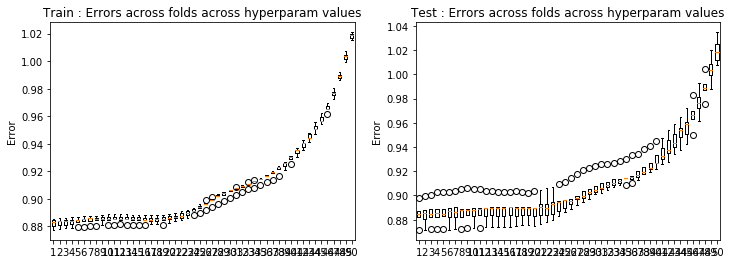

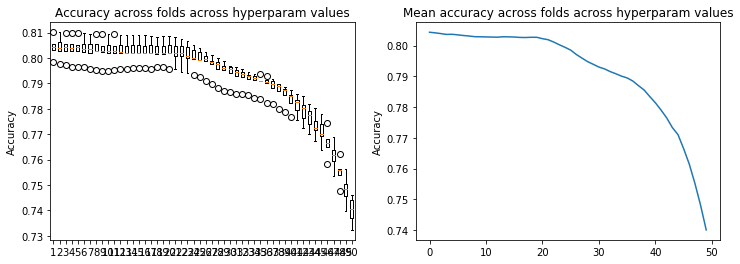

In [48]:
result_crossval(loss_tr26,loss_te26)
result_crossval_accuracy(acc26)

In [19]:
# test 27: degree 1, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 30)
loss_tr27, loss_te27, w22, acc27 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])




Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-0.27643109  0.11937582 -0.22124384 -0.30508339  0.28410553  0.03684474
  0.09568683 -0.09358186  0.10448149  0.22490748  0.00492971 -0.00353415
  0.1690343  -0.00911174  0.00092957  0.03007745  0.00091033 -0.01457702
 -0.00328653 -0.00434408]
Ridge regression: w=[-0.27501766  0.12037831 -0.22281789 -0.30172668  0.28113264  0.0370124
  0.09692278 -0.10422235  0.0999519   0.21802072  0.00251613 -0.00690666
  0.17493713 -0.00641438 -0.00063942  0.03117129  0.00177893 -0.01434518
 -0.00246507 -0.00559946]
Ridge regression: w=[-2.78727910e-01  1.22399897e-01 -2.22086723e-01 -3.00239164e-01
  2.75997729e-01  3.89224515e-02  9.97659039e-02 -9.21217821e-02
  9.95861547e-02  2.17958671e-01  4.12009231e-03 -5.03036337e-03
  1.65926661e-01 -5.85398335e-03  1.50916583e-05  2.88738941e-02
  4.88497774e-0

Ridge regression: w=[-0.27501754  0.12037796 -0.22281782 -0.30172521  0.28113173  0.03701239
  0.09692275 -0.10422182  0.09995204  0.21802042  0.00251613 -0.00690666
  0.17493612 -0.00641438 -0.00063942  0.03117127  0.00177894 -0.01434512
 -0.00246507 -0.00559946]
Ridge regression: w=[-2.78727782e-01  1.22399537e-01 -2.22086650e-01 -3.00237703e-01
  2.75996843e-01  3.89224284e-02  9.97658669e-02 -9.21213059e-02
  9.95862913e-02  2.17958351e-01  4.12008716e-03 -5.03036858e-03
  1.65925702e-01 -5.85398135e-03  1.50877958e-05  2.88738762e-02
  4.88498153e-03 -1.77666811e-02  4.37690027e-04 -4.95384256e-03]
Ridge regression: w=[-0.27886912  0.12104744 -0.22358848 -0.29708894  0.2746783   0.03805636
  0.09325597 -0.09565476  0.10448532  0.22242721  0.00344434 -0.00573374
  0.16964844 -0.00722646 -0.0021683   0.03265783  0.00052987 -0.01738248
 -0.00134927 -0.00438321]
Ridge regression: w=[-2.76819655e-01  1.19763910e-01 -2.24880819e-01 -3.02638395e-01
  2.77639096e-01  3.94991181e-02  9.451

Ridge regression: w=[-0.27886606  0.12103936 -0.22358663 -0.29705435  0.27465716  0.03805587
  0.09325576 -0.09564335  0.10448835  0.22241914  0.00344428 -0.00573379
  0.16962513 -0.00722644 -0.00216826  0.03265705  0.00053005 -0.01738099
 -0.00134929 -0.004383  ]
Ridge regression: w=[-2.76816612e-01  1.19755265e-01 -2.24878899e-01 -3.02603128e-01
  2.77617837e-01  3.94986329e-02  9.45130955e-02 -8.47603448e-02
  1.01137040e-01  2.29177672e-01  3.21504167e-03 -2.61767367e-03
  1.66470483e-01 -8.24530565e-03 -6.98863499e-05  3.35202312e-02
  4.75842372e-03 -1.90235518e-02  1.75603581e-04 -2.57653246e-03]
Accuracy = [0.7264310954063604, 0.7295406360424028, 0.7318021201413427, 0.7240282685512367, 0.7318021201413427]
Ridge regression: w=[-0.27642511  0.11935923 -0.22124053 -0.3050134   0.28406267  0.03684388
  0.09568586 -0.09355969  0.10448765  0.22489099  0.00492928 -0.00353435
  0.16898826 -0.0091115   0.00092946  0.03007626  0.00091074 -0.01457416
 -0.00328651 -0.00434377]
Ridge regres

Ridge regression: w=[-2.76743749e-01  1.19548886e-01 -2.24832838e-01 -3.01760739e-01
  2.77109907e-01  3.94869837e-02  9.45122839e-02 -8.45252346e-02
  1.01211059e-01  2.28955805e-01  3.21483057e-03 -2.61829940e-03
  1.65935809e-01 -8.24641253e-03 -6.98481562e-05  3.35015499e-02
  4.76011959e-03 -1.89858905e-02  1.75073111e-04 -2.57292294e-03]
Accuracy = [0.7264310954063604, 0.7293286219081272, 0.7317314487632509, 0.7240282685512367, 0.731660777385159]
Ridge regression: w=[-0.27628782  0.11898041 -0.22116432 -0.30341381  0.28308268  0.03682393
  0.09566388 -0.09305578  0.10462813  0.22451159  0.00491936 -0.00353906
  0.16793762 -0.00910595  0.00092697  0.0300484   0.00092008 -0.01450825
 -0.0032861  -0.0043366 ]
Ridge regression: w=[-0.27487512  0.11998692 -0.22273259 -0.30007126  0.28011445  0.03699156
  0.09689311 -0.10362101  0.10010468  0.21768487  0.00251342 -0.00690854
  0.17379943 -0.00641476 -0.00064242  0.03114083  0.00178652 -0.01427667
 -0.00246483 -0.00559277]
Ridge regress

Ridge regression: w=[-0.27164376  0.11214508 -0.22065049 -0.26619222  0.25906676  0.03646701
  0.09634986 -0.09261607  0.10311921  0.20968737  0.0024553  -0.00693378
  0.15120583 -0.00642125 -0.00069264  0.03024527  0.00194572 -0.01266777
 -0.0024542  -0.00544288]
Ridge regression: w=[-2.75308490e-01  1.13873725e-01 -2.19964237e-01 -2.64971800e-01
  2.54397909e-01  3.82620879e-02  9.89227875e-02 -8.19300734e-02
  1.02765509e-01  2.09117262e-01  3.98674918e-03 -5.14678554e-03
  1.43491302e-01 -5.79957436e-03 -7.02912884e-05  2.81666221e-02
  4.97684680e-03 -1.59288018e-02  4.52256837e-04 -4.76585625e-03]
Ridge regression: w=[-0.2754481   0.1130598  -0.22138031 -0.26221547  0.25316815  0.03746221
  0.09310032 -0.08542836  0.10741711  0.21318229  0.00337261 -0.0057762
  0.14682814 -0.00720346 -0.00212654  0.03159784  0.00071632 -0.01565572
 -0.00136637 -0.00415734]
Ridge regression: w=[-2.73423772e-01  1.11243901e-01 -2.22599003e-01 -2.67094575e-01
  2.55978538e-01  3.89003412e-02  9.4511

Ridge regression: w=[-0.21493304  0.07094124 -0.17587303 -0.05306801  0.10727777  0.0250585
  0.08124326 -0.05910618  0.11313345  0.11961688  0.00177707 -0.00507147
  0.02658904 -0.00588383 -0.00116458  0.01066682  0.00219145  0.01123739
 -0.00114508 -0.00207501]
Ridge regression: w=[-2.13353448e-01  6.79913271e-02 -1.76425610e-01 -5.47259217e-02
  1.08062452e-01  2.60185507e-02  8.25966129e-02 -5.58557063e-02
  1.10694721e-01  1.20088245e-01  1.83584267e-03 -2.51807985e-03
  2.72105330e-02 -6.95047236e-03  3.44753272e-04  1.09570495e-02
  4.81283141e-03  1.06791492e-02  1.66372626e-05 -1.17123735e-03]
Accuracy = [0.7215547703180212, 0.7250176678445229, 0.7286219081272085, 0.7195759717314487, 0.7299646643109541]
Ridge regression: w=[-0.17703563  0.06026134 -0.14928147 -0.02132037  0.07879902  0.01913359
  0.07107319 -0.05561946  0.10444847  0.09631634  0.00091951 -0.00310393
  0.00796817 -0.00565139  0.00101342  0.00255705  0.00278511  0.02087792
 -0.00207303 -0.00167727]
Ridge regress

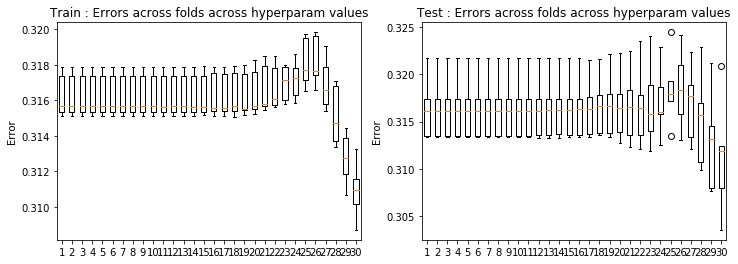

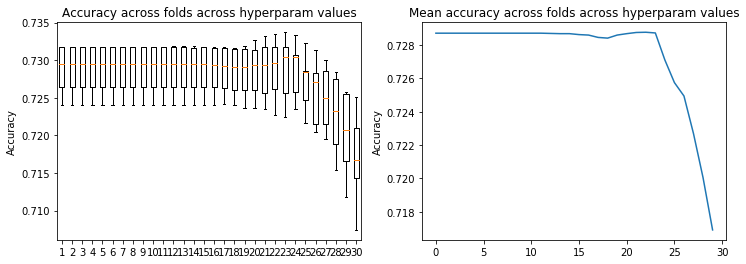

In [49]:
result_crossval(loss_tr27,loss_te27)
result_crossval_accuracy(acc27)

In [20]:
# test 28: degree 2, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr28, loss_te28, w28, acc28 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  7.16054715e-01 -1.52507228e-01 -7.01523437e-02
  2.04152515e-01  6.33320283e-02  2.70563204e-01  1.68693525e-01
  9.09553928e-02  5.83164075e-01  4.45838359e-03 -2.33377037e-03
  6.11145598e-02 -6.27359796e-03  3.92371467e-04  5.28999505e-02
  3.28596118e-03  7.65017905e-02 -4.08736767e-03 -4.11555539e-03
 -5.86067517e-01 -5.21024247e-02 -1.19566710e-01 -7.65263917e-02
 -3.81925659e-02 -1.65636743e-01 -6.33452805e-02  1.25065063e-02
 -3.42826852e-01 -3.78199617e-02 -4.53893780e-03 -9.70743148e-02
 -6.24267344e-02  8.44544576e-04 -4.30749984e-02 -8.75106448e-03
 -8.79856352e-02  1.53329341e-01 -6.01426314e-03]
Ridge regression: w=[-2.75017662e-01  7.11705650e-01 -1.51421885e-01 -1.61486341e-02
  1.55221296e-01  6.64083195e-02  2.96356084e-01  1.96835452e-01
  8.62041180e-02  5

Ridge regression: w=[-2.78869246e-01  7.23831248e-01 -1.51618040e-01 -4.49206508e-02
  1.85632776e-01  7.16511756e-02  3.08062262e-01  1.42668185e-01
  8.98517549e-02  5.27676217e-01  2.88779321e-03 -3.54830092e-03
  6.63540447e-02 -4.92205248e-03 -2.64120390e-03  5.48973157e-02
  2.31204311e-03  6.31305426e-02 -2.22201982e-03 -3.79533152e-03
 -5.90206493e-01 -5.55937973e-02 -1.33859216e-01 -7.42260108e-02
 -4.63954899e-02 -2.05712408e-01 -5.61254306e-02  1.81013789e-02
 -3.03731539e-01 -3.93807794e-02  1.56547294e-03 -9.29038641e-02
 -6.63258021e-02  3.37317195e-03 -4.20502621e-02 -4.74682143e-04
 -7.77345675e-02  1.51432506e-01  1.08600749e-03]
Ridge regression: w=[-2.76819776e-01  7.14203400e-01 -1.52408188e-01 -2.56305858e-02
  1.52110010e-01  7.24455241e-02  2.86726954e-01  1.97987756e-01
  8.78306871e-02  5.64469680e-01  5.09556357e-03 -1.36237141e-03
  2.95469009e-02 -6.73733420e-03 -1.31275866e-03  5.03515026e-02
  5.21298329e-03  7.84478376e-02 -6.36039508e-04 -2.19785818e-03


Ridge regression: w=[-2.75017632e-01  7.11701446e-01 -1.51421908e-01 -1.61433439e-02
  1.55219558e-01  6.64081785e-02  2.96356792e-01  1.96806338e-01
  8.62042001e-02  5.72811238e-01  2.66562320e-03 -3.99635170e-03
  1.76373767e-02 -3.88130560e-03 -1.60246501e-03  4.58043828e-02
  2.48943006e-03  8.46567363e-02 -2.62982744e-03 -4.62841887e-03
 -5.82647692e-01 -5.60886346e-02 -1.60577336e-01 -4.09483933e-02
 -4.16524998e-02 -1.93912257e-01 -9.28770800e-02  1.73419873e-02
 -3.33561564e-01 -3.57727453e-02 -3.54875713e-04 -5.61721536e-02
 -6.34452676e-02  4.33123349e-03 -3.03225262e-02 -3.29300269e-03
 -9.61641953e-02  1.51732014e-01 -3.73975527e-03]
Ridge regression: w=[-0.27872788  0.71158803 -0.14862395 -0.04610428  0.17770089  0.05987785
  0.30550905  0.20169496  0.08722735  0.57134212  0.00375689 -0.00309795
  0.02558474 -0.00364364 -0.0013799   0.05294242  0.00540719  0.06911708
 -0.0014326  -0.0046702  -0.58014322 -0.05835349 -0.13359887 -0.06313646
 -0.03275983 -0.19951351 -0.08639

Ridge regression: w=[-2.76819711e-01  7.14194222e-01 -1.52408341e-01 -2.56191707e-02
  1.52106523e-01  7.24452429e-02  2.86728400e-01  1.97927817e-01
  8.78308574e-02  5.64413042e-01  5.09556983e-03 -1.36238402e-03
  2.95830822e-02 -6.73734229e-03 -1.31275262e-03  5.03511630e-02
  5.21297141e-03  7.84478804e-02 -6.36048369e-04 -2.19785736e-03
 -5.82544192e-01 -5.66075620e-02 -1.54697775e-01 -4.05213286e-02
 -4.61011400e-02 -1.85164166e-01 -8.36434205e-02  1.66760309e-02
 -3.21956977e-01 -3.93882775e-02  5.22869507e-03 -7.12891526e-02
 -6.13740380e-02  5.10342594e-03 -3.52224340e-02 -2.55685827e-03
 -9.37848044e-02  1.52540472e-01  1.57436589e-03]
Accuracy = [0.7803533568904594, 0.7764664310954064, 0.7804240282685513, 0.7724381625441696, 0.7819787985865725]
Ridge regression: w=[-2.76430984e-01  7.16039416e-01 -1.52507373e-01 -7.01297092e-02
  2.04142921e-01  6.33315811e-02  2.70566704e-01  1.68600514e-01
  9.09557863e-02  5.83073408e-01  4.45841415e-03 -2.33379879e-03
  6.11686367e-02 -

Ridge regression: w=[-2.78869019e-01  7.23799162e-01 -1.51618569e-01 -4.48776466e-02
  1.85616624e-01  7.16501993e-02  3.08064215e-01  1.42496290e-01
  8.98525801e-02  5.27509663e-01  2.88787015e-03 -3.54836459e-03
  6.64544524e-02 -4.92210605e-03 -2.64122271e-03  5.48967478e-02
  2.31198126e-03  6.31315695e-02 -2.22201502e-03 -3.79529455e-03
 -5.90177049e-01 -5.55938950e-02 -1.33895661e-01 -7.42143949e-02
 -4.63947272e-02 -2.05716582e-01 -5.60368957e-02  1.81022942e-02
 -3.03626938e-01 -3.93807915e-02  1.56542097e-03 -9.29501784e-02
 -6.63259355e-02  3.37312630e-03 -4.20471213e-02 -4.74617474e-04
 -7.77355793e-02  1.51432679e-01  1.08606801e-03]
Ridge regression: w=[-2.76819550e-01  7.14171599e-01 -1.52408719e-01 -2.55910383e-02
  1.52097932e-01  7.24445500e-02  2.86731957e-01  1.97780166e-01
  8.78312772e-02  5.64273519e-01  5.09558526e-03 -1.36241508e-03
  2.96722037e-02 -6.73736223e-03 -1.31273772e-03  5.03503271e-02
  5.21294215e-03  7.84479863e-02 -6.36070196e-04 -2.19785533e-03


Ridge regression: w=[-0.27872718  0.7114905  -0.1486248  -0.04597284  0.17765204  0.05987542
  0.30552359  0.20104404  0.08722938  0.57072567  0.00375684 -0.00309828
  0.02597492 -0.00364366 -0.00137993  0.0529387   0.00540697  0.06911857
 -0.00143275 -0.00467015 -0.58005297 -0.05835419 -0.13371183 -0.06310105
 -0.03275826 -0.19953435 -0.08605842  0.01541181 -0.33123133 -0.04155782
  0.00357837 -0.07194814 -0.06538754  0.00456607 -0.04118862  0.002146
 -0.08405908  0.15468123  0.00657736]
Ridge regression: w=[-2.78868519e-01  7.23728673e-01 -1.51619731e-01 -4.47832197e-02
  1.85581185e-01  7.16480539e-02  3.08068451e-01  1.42119450e-01
  8.98543935e-02  5.27144468e-01  2.88803911e-03 -3.54850438e-03
  6.66745208e-02 -4.92222363e-03 -2.64126404e-03  5.48955084e-02
  2.31184542e-03  6.31338281e-02 -2.22200438e-03 -3.79521336e-03
 -5.90112366e-01 -5.55941107e-02 -1.33975683e-01 -7.41889145e-02
 -4.63930506e-02 -2.05725696e-01 -5.58428161e-02  1.81043039e-02
 -3.03397570e-01 -3.93808181e-0

Ridge regression: w=[-2.75015416e-01  7.11396542e-01 -1.51423589e-01 -1.57604066e-02
  1.55094184e-01  6.63979597e-02  2.96407177e-01  1.94708410e-01
  8.62101681e-02  5.70831950e-01  2.66608519e-03 -3.99728369e-03
  1.89077718e-02 -3.88222056e-03 -1.60207108e-03  4.57945850e-02
  2.48897543e-03  8.46573947e-02 -2.62972849e-03 -4.62786366e-03
 -5.82365197e-01 -5.60905348e-02 -1.60908614e-01 -4.08584425e-02
 -4.16447718e-02 -1.93978768e-01 -9.17852443e-02  1.73499358e-02
 -3.32328231e-01 -3.57732040e-02 -3.55855676e-04 -5.67865381e-02
 -6.34459751e-02  4.33029267e-03 -3.02909133e-02 -3.29307721e-03
 -9.61640875e-02  1.51734894e-01 -3.73970250e-03]
Ridge regression: w=[-0.27872563  0.71127635 -0.14862665 -0.04568472  0.17754525  0.05987008
  0.30555487  0.1996239   0.08723385  0.56938016  0.00375674 -0.00309902
  0.02682573 -0.00364369 -0.00138     0.05293063  0.00540649  0.06912188
 -0.00143308 -0.00467003 -0.5798548  -0.05835572 -0.1339594  -0.06302371
 -0.03275481 -0.19957947 -0.08532

Ridge regression: w=[-2.76424103e-01  7.15052135e-01 -1.52516792e-01 -6.86764361e-02
  2.03530712e-01  6.33028126e-02  2.70784364e-01  1.62716613e-01
  9.09812545e-02  5.77327046e-01  4.46037712e-03 -2.33561106e-03
  6.45814375e-02 -6.27730834e-03  3.90902609e-04  5.28642923e-02
  3.28456852e-03  7.64937665e-02 -4.08751581e-03 -4.11313586e-03
 -5.85145513e-01 -5.21128344e-02 -1.20825866e-01 -7.60698060e-02
 -3.81730865e-02 -1.65930353e-01 -6.02817332e-02  1.25374225e-02
 -3.39152572e-01 -3.78208029e-02 -4.53984890e-03 -9.86535628e-02
 -6.24304824e-02  8.41983994e-04 -4.29592043e-02 -8.74809160e-03
 -8.79735153e-02  1.53337639e-01 -6.01032578e-03]
Ridge regression: w=[-2.75010711e-01  7.10750884e-01 -1.51427192e-01 -1.49542690e-02
  1.54833214e-01  6.63763569e-02  2.96507863e-01  1.90352971e-01
  8.62229057e-02  5.66717688e-01  2.66705595e-03 -3.99923098e-03
  2.15413278e-02 -3.88413051e-03 -1.60125066e-03  4.57747610e-02
  2.48803186e-03  8.46589980e-02 -2.62952010e-03 -4.62669965e-03


Ridge regression: w=[-2.76804936e-01  7.12125140e-01 -1.52442562e-01 -2.30753124e-02
  1.51348416e-01  7.23818533e-02  2.87017938e-01  1.84965091e-01
  8.78698753e-02  5.52130123e-01  5.09700612e-03 -1.36510609e-03
  3.73805297e-02 -6.73915997e-03 -1.31144806e-03  5.02806414e-02
  5.21039029e-03  7.84582671e-02 -6.37964648e-04 -2.19758016e-03
 -5.80626393e-01 -5.66052626e-02 -1.56887895e-01 -4.00008648e-02
 -4.60544266e-02 -1.85563460e-01 -7.69287039e-02  1.67295413e-02
 -3.14294396e-01 -3.93869322e-02  5.22503435e-03 -7.50062705e-02
 -6.13819658e-02  5.09754378e-03 -3.49967162e-02 -2.55462885e-03
 -9.37927320e-02  1.52553783e-01  1.57572721e-03]
Accuracy = [0.7802120141342757, 0.7761837455830388, 0.7804240282685513, 0.7722968197879858, 0.7818374558303887]
Ridge regression: w=[-2.76409497e-01  7.12973149e-01 -1.52536950e-01 -6.56620490e-02
  2.02284319e-01  6.32427697e-02  2.71192868e-01  1.51045393e-01
  9.10353416e-02  5.65862506e-01  4.46445421e-03 -2.33929606e-03
  7.13011333e-02 -

Ridge regression: w=[-2.78823049e-01  7.17421157e-01 -1.51723463e-01 -3.65778595e-02
  1.82638807e-01  7.14538160e-02  3.08172209e-01  1.12293542e-01
  9.00200037e-02  4.97921423e-01  2.90290058e-03 -3.56061850e-03
  8.38397867e-02 -4.93222866e-03 -2.64498092e-03  5.48248946e-02
  2.29980977e-03  6.33484302e-02 -2.22054801e-03 -3.78807858e-03
 -5.84326832e-01 -5.56179781e-02 -1.40910509e-01 -7.21014740e-02
 -4.62381380e-02 -2.06265331e-01 -4.05419484e-02  1.82782180e-02
 -2.84968671e-01 -3.93826007e-02  1.55571397e-03 -1.00802950e-01
 -6.63535434e-02  3.36482584e-03 -4.14580221e-02 -4.62880400e-04
 -7.79497316e-02  1.51465213e-01  1.09719938e-03]
Ridge regression: w=[-2.76773919e-01  7.07852460e-01 -1.52511541e-01 -1.79937090e-02
  1.49943752e-01  7.22507206e-02  2.87410948e-01  1.61268887e-01
  8.79539362e-02  5.29478698e-01  5.10009537e-03 -1.37005457e-03
  5.14775005e-02 -6.74286237e-03 -1.30907667e-03  5.01684736e-02
  5.20560202e-03  7.84835202e-02 -6.41464626e-04 -2.19648394e-03


Ridge regression: w=[-0.2785853   0.69273687 -0.14880628 -0.02276839  0.170223    0.05939276
  0.30579805  0.11089012  0.08766042  0.48314127  0.00375224 -0.00314983
  0.07826129 -0.00364    -0.00138669  0.05261256  0.00537012  0.06950492
 -0.00145527 -0.00465979 -0.56273323 -0.05850932 -0.15348121 -0.05796522
 -0.03241509 -0.20102306 -0.03972231  0.01590972 -0.27605439 -0.04156656
  0.00353938 -0.09575708 -0.06544708  0.00451787 -0.03941501  0.00215689
 -0.08438159  0.15480609  0.00660076]
Ridge regression: w=[-2.78726575e-01  7.04674963e-01 -1.51927667e-01 -2.12196303e-02
  1.77796741e-01  7.10480224e-02  3.07141850e-01  6.89895360e-02
  9.03680637e-02  4.53962024e-01  2.93166865e-03 -3.58330121e-03
  1.07561428e-01 -4.94992835e-03 -2.65251228e-03  5.48516136e-02
  2.27605300e-03  6.38326063e-02 -2.21539330e-03 -3.77402052e-03
 -5.72644266e-01 -5.56866917e-02 -1.53810667e-01 -6.87978613e-02
 -4.58999667e-02 -2.06103960e-01 -1.86177362e-02  1.86008103e-02
 -2.56880023e-01 -3.93844243e

Ridge regression: w=[-2.74583494e-01  6.59678244e-01 -1.51714800e-01  3.60527397e-02
  1.45269059e-01  6.46867332e-02  2.91359289e-01  2.60037832e-02
  8.74236602e-02  4.01173659e-01  2.72593262e-03 -4.09908820e-03
  1.13452029e-01 -3.97626712e-03 -1.56226747e-03  4.60029874e-02
  2.45431090e-03  8.50392344e-02 -2.61519328e-03 -4.55772358e-03
 -5.34608404e-01 -5.66196289e-02 -2.04969996e-01 -3.50926008e-02
 -4.02048219e-02 -1.91681442e-01 -6.04806283e-03  1.83938023e-02
 -2.23658510e-01 -3.58261608e-02 -4.38723432e-04 -9.73158190e-02
 -6.36163724e-02  4.24897100e-03 -2.65357374e-02 -3.28049477e-03
 -9.64279201e-02  1.52066080e-01 -3.71035287e-03]
Ridge regression: w=[-0.27828788  0.65857948 -0.14913286  0.01233344  0.16278396  0.05844054
  0.2995856   0.03295167  0.0885359   0.40028694  0.00375765 -0.00321185
  0.11796535 -0.00361708 -0.00139674  0.05288956  0.00531596  0.07035784
 -0.0014786  -0.00463611 -0.53125596 -0.05885248 -0.18297835 -0.05357975
 -0.03164796 -0.19692403 -0.00109

Ridge regression: w=[-2.75087539e-01  5.83796793e-01 -1.53141133e-01  5.92367741e-02
  1.73082139e-01  5.92792755e-02  2.52180314e-01 -4.35796633e-02
  9.46278454e-02  3.28930224e-01  4.64829144e-03 -2.44965624e-03
  1.51678924e-01 -6.49213833e-03  3.14985824e-04  5.34799014e-02
  3.11772002e-03  7.59466183e-02 -4.06379417e-03 -3.79770773e-03
 -4.64654299e-01 -5.41544520e-02 -2.27721882e-01 -5.63703218e-02
 -3.48280676e-02 -1.55197378e-01  3.56950942e-02  1.54149148e-02
 -1.70505791e-01 -3.80158976e-02 -4.52446763e-03 -1.14744831e-01
 -6.29382277e-02  7.44044049e-04 -3.31353846e-02 -8.57097170e-03
 -8.69665270e-02  1.53847145e-01 -5.79184763e-03]
Ridge regression: w=[-2.73680981e-01  5.83485464e-01 -1.51656863e-01  8.58128380e-02
  1.47743046e-01  6.18635368e-02  2.67871447e-01 -3.72675472e-02
  8.94164004e-02  3.16662831e-01  2.78436987e-03 -4.19960642e-03
  1.35464763e-01 -4.04743986e-03 -1.51506708e-03  4.74297893e-02
  2.45066832e-03  8.44664069e-02 -2.59557101e-03 -4.47310311e-03


Ridge regression: w=[-0.27398163  0.50275441 -0.15277868  0.10934964  0.154569    0.06381429
  0.23109377 -0.04959581  0.09319595  0.26551777  0.00511815 -0.0014412
  0.13455722 -0.00676885 -0.00121834  0.05127822  0.00513511  0.07471482
 -0.00063977 -0.00192613 -0.38769808 -0.0592707  -0.26758649 -0.04663477
 -0.0382528  -0.1387104   0.03030652  0.0198659  -0.11400646 -0.03969941
  0.00468384 -0.08680818 -0.0622763   0.00447314 -0.02110904 -0.00251024
 -0.08904537  0.15301025  0.00137917]
Accuracy = [0.7771024734982332, 0.7743462897526502, 0.7768904593639576, 0.7709540636042402, 0.7786572438162545]
Ridge regression: w=[-2.72322769e-01  4.55817537e-01 -1.50979891e-01  1.06923671e-01
  1.73314206e-01  5.34622533e-02  2.08036942e-01 -6.43068422e-02
  9.84950084e-02  2.51559977e-01  4.72631746e-03 -2.49189815e-03
  1.31321949e-01 -6.55665382e-03  3.45172419e-04  5.19672480e-02
  2.91809612e-03  6.95969734e-02 -4.01004760e-03 -3.42093901e-03
 -3.47341833e-01 -5.80324386e-02 -2.65616895e-01

Ridge regression: w=[-0.26823696  0.3546955  -0.14748599  0.10716552  0.15960615  0.0529364
  0.16932087 -0.0564644   0.0980169   0.19884177  0.00487655 -0.00154955
  0.10701408 -0.00664439 -0.00100916  0.04604315  0.00510302  0.05843307
 -0.00056626 -0.00157398 -0.25323892 -0.06515179 -0.25988841 -0.03988825
 -0.02794047 -0.0814985   0.01885459  0.02191005 -0.04762687 -0.04066146
  0.00396283 -0.04223879 -0.06295499  0.00364934 -0.00927541 -0.00262438
 -0.07007496  0.15179616  0.000893  ]
Accuracy = [0.7711660777385159, 0.7681978798586573, 0.7712367491166078, 0.7652296819787986, 0.7756890459363958]
Ridge regression: w=[-0.26412321  0.30400284 -0.14293201  0.08957156  0.16109042  0.04234859
  0.14569231 -0.06077251  0.10345882  0.18213763  0.0045487  -0.00251455
  0.09585933 -0.00647182  0.00049398  0.04288463  0.00266403  0.0503462
 -0.00388851 -0.00284735 -0.21003265 -0.06620986 -0.24070092 -0.03039744
 -0.01903275 -0.05855429  0.01383604  0.02061531 -0.03150079 -0.04041681
 -0.00416

Ridge regression: w=[-0.24164885  0.17134834 -0.12749726  0.03906915  0.12132081  0.02768244
  0.09228767 -0.04838595  0.10473191  0.12377963  0.00366346 -0.00249887
  0.05730561 -0.00594793  0.0006952   0.0272567   0.00252565  0.02799669
 -0.00353754 -0.00214852 -0.09399743 -0.07540579 -0.16393927  0.00730727
 -0.00609486 -0.00519885 -0.00433566  0.02791739  0.02103701 -0.0415396
 -0.00348643  0.00410021 -0.06235275  0.00065151  0.00283608 -0.00744253
 -0.0266813   0.14135815 -0.00470044]
Ridge regression: w=[-0.24041327  0.17160035 -0.1269126   0.04142564  0.11892414  0.02839673
  0.09399762 -0.04995165  0.10021134  0.12236475  0.00231505 -0.00473203
  0.05812013 -0.00415161 -0.00064683  0.02628319  0.00273509  0.02990042
 -0.00230407 -0.00355451 -0.09366162 -0.07714801 -0.16389689  0.00715694
 -0.00642876 -0.00649023 -0.00880972  0.03011853  0.02045107 -0.03899213
 -0.00112812  0.0069889  -0.06383962  0.0029161   0.00688404 -0.00226331
 -0.02852687  0.14063802 -0.00340417]
Ridge reg

Ridge regression: w=[-2.12076356e-01  1.10280435e-01 -1.14377144e-01  1.84120545e-02
  8.72585764e-02  2.09412245e-02  7.03774326e-02 -3.85431675e-02
  9.65705329e-02  9.22685639e-02  2.76009843e-03 -1.71695063e-03
  3.44926950e-02 -5.35366597e-03 -1.54419541e-04  1.73421679e-02
  4.60685378e-03  1.86395914e-02 -2.89731085e-04 -6.25296184e-04
 -4.34504904e-02 -7.87814439e-02 -1.08832970e-01  1.95684600e-02
 -6.33978751e-04  1.70348266e-02 -1.06074059e-02  3.51063942e-02
  3.81522690e-02 -3.96833633e-02  1.89987637e-03  7.98677894e-03
 -5.80926152e-02  1.15317487e-03  8.17847049e-03 -2.24097199e-03
 -1.21261227e-02  1.25315424e-01 -3.00599774e-04]
Accuracy = [0.7560424028268551, 0.7513074204946997, 0.7541342756183745, 0.7476325088339223, 0.7604240282685513]
Ridge regression: w=[-0.19135486  0.08850499 -0.10566897  0.01270844  0.074876    0.01577126
  0.06128677 -0.03763782  0.09427593  0.08003154  0.00190667 -0.00232861
  0.02395911 -0.0047883   0.00084103  0.01186648  0.00247256  0.017

Ridge regression: w=[-1.43527068e-01  5.82675885e-02 -8.74474134e-02  9.75094708e-03
  4.84089086e-02  1.09779619e-02  4.77918455e-02 -3.28826470e-02
  7.84978106e-02  5.91264140e-02  9.86932634e-04 -3.08760300e-03
  9.55990626e-03 -3.24113710e-03 -6.55009013e-04  4.97189503e-03
  1.88977845e-03  1.61284739e-02 -7.66039302e-04 -6.63210573e-04
 -4.29939682e-03 -7.02009633e-02 -4.53898112e-02  1.99674840e-02
  3.44991219e-03  2.85063766e-02 -1.81723433e-02  3.57075904e-02
  3.81731959e-02 -3.24191635e-02 -2.90432159e-04  1.68272498e-03
 -4.67670596e-02  5.11308544e-04  4.22128952e-03 -1.82123173e-04
  5.66077943e-03  8.51831669e-02 -8.23439407e-05]
Ridge regression: w=[-0.14247226  0.05687033 -0.08749959  0.00892894  0.0485476   0.01133834
  0.04804374 -0.03161419  0.07696714  0.05893084  0.00103172 -0.0015243
  0.0098272  -0.00387446  0.0002852   0.00485813  0.00353835  0.01620137
 -0.00016777 -0.00041255 -0.00537924 -0.07048456 -0.04628058  0.02050146
  0.00352225  0.02915748 -0.017014

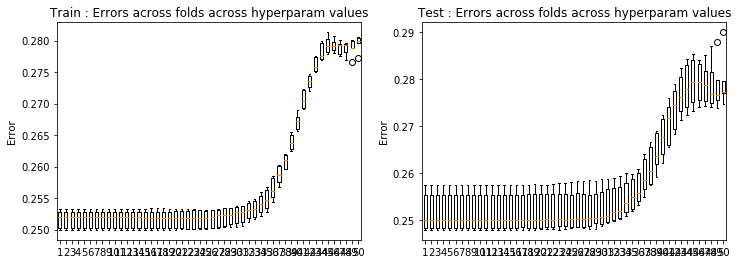

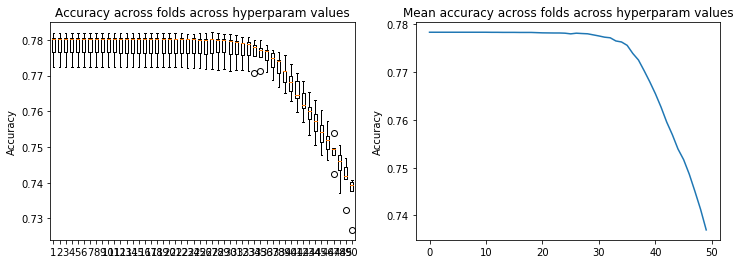

In [50]:
result_crossval(loss_tr28,loss_te28)
result_crossval_accuracy(acc28)

In [21]:
# test 29: degree 3, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr29, loss_te29, w29, acc29 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])

Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -2.61537982e-01  1.75739648e-01  7.96513413e-01
 -2.89201673e-01  1.73212428e-01  4.23076203e-01  4.99848811e-01
  3.88438424e-02  7.65470949e-01  9.30504788e-04 -2.43060921e-04
  5.90957532e-02  1.67345283e-03  1.77001452e-02  2.08479388e-01
  3.82682865e-03  4.86308906e-02 -5.09616892e-03  1.28154709e-03
  1.58677353e+00 -8.64813620e-01 -1.85195260e+00  8.80626287e-01
 -2.97058689e-01 -4.48439147e-01 -4.92578941e-01  1.17480882e-02
 -6.37823390e-01 -3.61938642e-02 -4.95078221e-03 -3.30213249e-01
 -6.11758196e-02  5.95648994e-04 -3.69225179e-01 -8.87890824e-03
 -5.72287995e-02  1.51118668e-01 -6.63247292e-03 -1.23322095e+00
  5.09534149e-01  9.38474441e-01 -5.19617979e-01  1.60479097e-01
  1.39378233e-01  1.87328185e-01  4.09023100e-02  1.52173878e-01
  3.60513873e-03 -2.2350

Ridge regression: w=[-2.76819780e-01 -2.72651342e-01  2.01950643e-01  8.45974312e-01
 -3.16344426e-01  1.69955839e-01  4.34456265e-01  3.60051259e-01
  3.36203316e-02  6.98682749e-01 -3.48502109e-03  2.29164306e-03
  1.57931356e-01  2.63012717e-03  1.99821515e-02  2.36882860e-01
  1.14023264e-02  9.98323119e-02 -8.22339305e-03  9.58753237e-03
  1.61949914e+00 -9.32861777e-01 -1.90483549e+00  8.67475211e-01
 -2.74570742e-01 -4.59369959e-01 -2.96789105e-01  1.50833587e-02
 -6.25157208e-01 -3.82609066e-02  4.75639478e-03 -4.78896481e-01
 -6.04709563e-02  4.54050757e-03 -4.28609024e-01 -2.49057461e-03
 -1.64331391e-01  1.50158822e-01  9.09023563e-04 -1.25132635e+00
  5.48323770e-01  9.49702279e-01 -4.93871235e-01  1.41105435e-01
  1.36046468e-01  9.36943972e-02  4.18190111e-02  1.75320799e-01
  9.39791560e-03 -6.85269054e-04  2.39220213e-01 -9.70375462e-03
 -2.06688351e-02  2.28733225e-01 -4.83720589e-03  4.52310118e-02
  9.03535703e-03 -8.00732623e-03]
Accuracy = [0.7867137809187279, 0.78

Ridge regression: w=[-2.78869241e-01 -2.91842188e-01  1.86675118e-01  7.92812821e-01
 -2.53112939e-01  1.64504660e-01  5.14941230e-01  4.96502089e-01
  3.44336932e-02  7.96660889e-01 -3.43108245e-03  5.05728894e-03
  3.99543193e-03 -3.12197715e-03  1.93519249e-02  2.17907738e-01
  3.54226197e-03  7.78227158e-02 -6.76858535e-03  8.26484550e-03
  1.67005510e+00 -8.94583827e-01 -1.82479333e+00  7.92884512e-01
 -2.66286260e-01 -6.00029586e-01 -4.90132275e-01  1.73148966e-02
 -7.43668939e-01 -3.83005895e-02  1.27721742e-03 -2.26462532e-01
 -6.53859000e-02  2.99137744e-03 -3.82550312e-01 -5.92053620e-04
 -1.35456988e-01  1.48823837e-01  5.67982755e-04 -1.28495868e+00
  5.26839244e-01  9.22186962e-01 -4.79364392e-01  1.36781827e-01
  1.99467758e-01  1.82373201e-01  4.39427327e-02  2.23366499e-01
  6.54278118e-03 -6.25656109e-03  1.16497737e-01 -9.44138422e-04
 -2.08045276e-02  1.97716483e-01  8.46317569e-04  3.89394230e-02
  5.36166923e-03 -7.95814405e-03]
Ridge regression: w=[-2.76819771e-01

Ridge regression: w=[-2.78727879e-01 -2.66676535e-01  2.18555836e-01  7.36919339e-01
 -2.43453264e-01  1.54970357e-01  4.60111636e-01  6.55922065e-01
  3.29786735e-02  9.48703428e-01  1.37894591e-03  2.96037214e-03
 -3.29256989e-02 -2.04229345e-03  9.83318841e-03  2.14180035e-01
  7.97973454e-03  1.26746742e-01 -1.32972117e-03 -1.67627808e-03
  1.60812778e+00 -9.65159694e-01 -1.72065428e+00  7.77438668e-01
 -2.55089058e-01 -4.96415262e-01 -6.25741718e-01  1.32600220e-02
 -8.97267496e-01 -4.00856391e-02  3.19591205e-03 -2.69958841e-01
 -6.46861695e-02  4.13533041e-03 -3.72328794e-01  2.18592233e-03
 -2.32998765e-01  1.52178344e-01  6.01114640e-03 -1.24921506e+00
  5.67155061e-01  8.69571570e-01 -4.67587277e-01  1.37122816e-01
  1.53831097e-01  2.25992625e-01  4.23379289e-02  2.69412974e-01
  3.07713540e-03 -5.05227081e-03  1.54462274e-01 -1.98869195e-03
 -1.09605084e-02  1.89827002e-01 -1.81836969e-03  8.80165955e-02
  7.84977490e-04 -3.07513399e-04]
Ridge regression: w=[-2.78869221e-01

Ridge regression: w=[-2.75017591e-01 -2.63763573e-01  1.88221595e-01  8.50631564e-01
 -2.79226468e-01  1.32032200e-01  4.75038415e-01  7.49369352e-01
  2.18450501e-02  9.17990800e-01 -3.51658942e-03 -4.49395881e-03
 -1.08700985e-01 -4.83875589e-04  1.10118898e-02  2.40501292e-01
  2.65788207e-03  7.96474738e-02 -6.89102002e-03  3.69229125e-03
  1.60830890e+00 -9.03126407e-01 -1.92225965e+00  7.91704638e-01
 -1.94933498e-01 -5.30938766e-01 -7.80308735e-01  1.53432183e-02
 -8.03849268e-01 -3.53479887e-02 -2.87193607e-04 -1.61532843e-01
 -6.19347769e-02  3.92907480e-03 -4.47322824e-01 -2.67256711e-03
 -1.08636498e-01  1.49469458e-01 -3.68659864e-03 -1.25080735e+00
  5.33803416e-01  9.63901472e-01 -4.50772773e-01  9.42868629e-02
  1.68574388e-01  2.94324863e-01  5.20741615e-02  2.16936253e-01
  6.80662260e-03  2.55979407e-03  1.18184270e-01 -3.42908002e-03
 -1.28400321e-02  2.43139953e-01  1.08518512e-03  1.32545316e-02
  4.99116126e-03 -6.41377360e-03]
Ridge regression: w=[-2.78727838e-01

Ridge regression: w=[-2.76430932e-01 -2.60706272e-01  1.75635013e-01  7.94488468e-01
 -2.87693496e-01  1.73172934e-01  4.22723051e-01  4.95412097e-01
  3.88144057e-02  7.62431678e-01  9.31446958e-04 -2.41668187e-04
  6.18909731e-02  1.67359036e-03  1.77009923e-02  2.08466066e-01
  3.82323655e-03  4.86869732e-02 -5.09678102e-03  1.28050415e-03
  1.58505212e+00 -8.64583694e-01 -1.84824759e+00  8.78053744e-01
 -2.96965396e-01 -4.47748577e-01 -4.87445615e-01  1.17362995e-02
 -6.34563527e-01 -3.61956270e-02 -4.95045929e-03 -3.33067793e-01
 -6.11762460e-02  5.96064555e-04 -3.69216825e-01 -8.87886947e-03
 -5.73254926e-02  1.51120624e-01 -6.63159918e-03 -1.23230662e+00
  5.09408940e-01  9.36587922e-01 -5.18374771e-01  1.60424733e-01
  1.39071771e-01  1.85239414e-01  4.09343249e-02  1.50960221e-01
  3.60447862e-03 -2.23949232e-04  1.65983512e-01 -8.43294418e-03
 -1.75392699e-02  1.90440116e-01  3.52783804e-04 -9.01777556e-03
  1.17179701e-03 -2.51617870e-03]
Ridge regression: w=[-2.75017506e-01

Ridge regression: w=[-2.76819550e-01 -2.71387958e-01  2.01785106e-01  8.42962681e-01
 -3.14149867e-01  1.69904901e-01  4.33946274e-01  3.55914348e-01
  3.35775707e-02  6.95912976e-01 -3.48216269e-03  2.29507528e-03
  1.60420235e-01  2.63049950e-03  1.99867191e-02  2.36856422e-01
  1.13990112e-02  9.98599392e-02 -8.22391143e-03  9.59106721e-03
  1.61686892e+00 -9.32498905e-01 -1.89933259e+00  8.63758993e-01
 -2.74447119e-01 -4.58390380e-01 -2.91977211e-01  1.50665355e-02
 -6.22079733e-01 -3.82633957e-02  4.75768356e-03 -4.81227781e-01
 -6.04712787e-02  4.54180872e-03 -4.28578789e-01 -2.49065367e-03
 -1.64361597e-01  1.50161022e-01  9.10252196e-04 -1.24992484e+00
  5.48126041e-01  9.46909420e-01 -4.92086487e-01  1.41032500e-01
  1.35621012e-01  9.17386098e-02  4.18666662e-02  1.74119733e-01
  9.39614922e-03 -6.87186279e-04  2.39917843e-01 -9.70543563e-03
 -2.06729064e-02  2.28693334e-01 -4.83335911e-03  4.52401953e-02
  9.03536323e-03 -8.01037821e-03]
Accuracy = [0.7867137809187279, 0.78

Ridge regression: w=[-2.78868750e-01 -2.89150531e-01  1.86325438e-01  7.86781524e-01
 -2.48854524e-01  1.64400269e-01  5.13425192e-01  4.81541547e-01
  3.43431452e-02  7.86110365e-01 -3.42861236e-03  5.05856415e-03
  1.36210616e-02 -3.12301886e-03  1.93539269e-02  2.17861456e-01
  3.53234025e-03  7.79546020e-02 -6.77013420e-03  8.26372862e-03
  1.66448183e+00 -8.93806256e-01 -1.81370223e+00  7.85626456e-01
 -2.66037056e-01 -5.97033177e-01 -4.72937042e-01  1.72803851e-02
 -7.32256468e-01 -3.83054314e-02  1.27840464e-03 -2.36512664e-01
 -6.53867697e-02  2.99438092e-03 -3.82524216e-01 -5.90569831e-04
 -1.35678639e-01  1.48829071e-01  5.71912218e-04 -1.28199160e+00
  5.26407098e-01  9.16517801e-01 -4.75848835e-01  1.36637076e-01
  1.98059559e-01  1.75411403e-01  4.40412718e-02  2.19095812e-01
  6.54184317e-03 -6.25534204e-03  1.20036495e-01 -9.47039146e-04
 -2.08080623e-02  1.97661693e-01  8.54947423e-04  3.90457732e-02
  5.36328360e-03 -7.95952455e-03]
Ridge regression: w=[-2.76819284e-01

Ridge regression: w=[-2.78726839e-01 -2.61453735e-01  2.17806797e-01  7.25450041e-01
 -2.35276704e-01  1.54731073e-01  4.58043215e-01  6.16715873e-01
  3.27787867e-02  9.19493359e-01  1.38185662e-03  2.96479329e-03
 -8.46084518e-03 -2.03411801e-03  9.84594991e-03  2.14077817e-01
  7.95224217e-03  1.26581075e-01 -1.33190483e-03 -1.67769839e-03
  1.59728952e+00 -9.63504723e-01 -1.69943884e+00  7.63391628e-01
 -2.54523382e-01 -4.92136405e-01 -5.81196520e-01  1.31945826e-02
 -8.65345192e-01 -4.00979403e-02  3.19547826e-03 -2.94973671e-01
 -6.46847245e-02  4.13772235e-03 -3.72279105e-01  2.18700062e-03
 -2.32561395e-01  1.52191707e-01  6.02086589e-03 -1.24342688e+00
  5.66237922e-01  8.58648834e-01 -4.60734924e-01  1.36791140e-01
  1.51786786e-01  2.08025855e-01  4.25518845e-02  2.57494566e-01
  3.07132102e-03 -5.05152440e-03  1.63257920e-01 -2.00000591e-03
 -1.09729903e-02  1.89730158e-01 -1.79621333e-03  8.77614331e-02
  7.85441418e-04 -3.08437469e-04]
Ridge regression: w=[-2.78868181e-01

Ridge regression: w=[-2.75015416e-01 -2.52130284e-01  1.86653671e-01  8.23673286e-01
 -2.60143063e-01  1.31634490e-01  4.69473390e-01  6.63062550e-01
  2.14204209e-02  8.56173616e-01 -3.50011451e-03 -4.47080416e-03
 -5.38869786e-02 -4.66233885e-04  1.10628983e-02  2.40244295e-01
  2.62372485e-03  8.01255968e-02 -6.89620250e-03  3.71183871e-03
  1.58410223e+00 -8.99628072e-01 -1.87238346e+00  7.59196930e-01
 -1.93970127e-01 -5.19674592e-01 -6.81412984e-01  1.51998155e-02
 -7.37562797e-01 -3.53554411e-02 -2.84411649e-04 -2.18756656e-01
 -6.19431990e-02  3.94064153e-03 -4.47111195e-01 -2.66813495e-03
 -1.09394794e-01  1.49498684e-01 -3.66852693e-03 -1.23790972e+00
  5.31860237e-01  9.38255285e-01 -4.35018685e-01  9.37251225e-02
  1.63251351e-01  2.54278258e-01  5.25338458e-02  1.92483325e-01
  6.79108444e-03  2.54916471e-03  1.38570720e-01 -3.45778050e-03
 -1.28922969e-02  2.42859292e-01  1.11788865e-03  1.36025774e-02
  4.99018375e-03 -6.42610366e-03]
Ridge regression: w=[-2.78725632e-01

Ridge regression: w=[-2.76426294e-01 -2.37033949e-01  1.72630881e-01  7.38338686e-01
 -2.46665240e-01  1.72051349e-01  4.12625662e-01  3.97147619e-01
  3.80143469e-02  6.96483612e-01  9.56069769e-04 -2.00005163e-04
  1.22361141e-01  1.67812331e-03  1.77207531e-02  2.08069393e-01
  3.72884130e-03  5.02332411e-02 -5.11410508e-03  1.25732406e-03
  1.53589933e+00 -8.57973379e-01 -1.74537403e+00  8.08304795e-01
 -2.94313734e-01 -4.28229337e-01 -3.73153960e-01  1.14165247e-02
 -5.63176035e-01 -3.62445276e-02 -4.94252352e-03 -3.92646311e-01
 -6.11877055e-02  6.08143671e-04 -3.68866111e-01 -8.87713973e-03
 -5.99646008e-02  1.51170130e-01 -6.60810626e-03 -1.20611711e+00
  5.05786121e-01  8.84214819e-01 -4.84772673e-01  1.58877581e-01
  1.30475139e-01  1.38653728e-01  4.18170104e-02  1.23950893e-01
  3.58633967e-03 -2.39578945e-04  1.85331087e-01 -8.45963600e-03
 -1.75654414e-02  1.89821497e-01  4.34767818e-04 -7.76870453e-03
  1.18531528e-03 -2.49490017e-03]
Ridge regression: w=[-2.75012891e-01

Ridge regression: w=[-2.76812785e-01 -2.36169709e-01  1.97046284e-01  7.62025027e-01
 -2.56746462e-01  1.68466516e-01  4.19892681e-01  2.72519588e-01
  3.24356954e-02  6.41119674e-01 -3.40754442e-03  2.38603046e-03
  2.07422417e-01  2.63903617e-03  2.01045042e-02  2.36035730e-01
  1.13047801e-02  1.00427056e-01 -8.24050604e-03  9.67788661e-03
  1.54330633e+00 -9.22073270e-01 -1.75103450e+00  7.66912342e-01
 -2.70972087e-01 -4.31599782e-01 -1.94308441e-01  1.46281867e-02
 -5.59061278e-01 -3.83289624e-02  4.78706690e-03 -5.20322404e-01
 -6.04811810e-02  4.57605051e-03 -4.27466049e-01 -2.49418669e-03
 -1.64756804e-01  1.50218080e-01  9.40871279e-04 -1.21059662e+00
  5.42392411e-01  8.71574074e-01 -4.45723422e-01  1.38981122e-01
  1.24025557e-01  5.19872685e-02  4.31629429e-02  1.48498504e-01
  9.34964163e-03 -7.40553426e-04  2.49135039e-01 -9.74660200e-03
 -2.07772876e-02  2.27434340e-01 -4.72539776e-03  4.52405427e-02
  9.03685483e-03 -8.08620113e-03]
Accuracy = [0.7862897526501766, 0.78

Ridge regression: w=[-2.78854296e-01 -2.17869430e-01  1.76748138e-01  6.37978396e-01
 -1.49881737e-01  1.61645335e-01  4.74210956e-01  2.63400889e-01
  3.22157744e-02  6.36032467e-01 -3.34806982e-03  5.12878477e-03
  1.46314320e-01 -3.14626095e-03  1.93805536e-02  2.16417694e-01
  3.30595214e-03  8.05848648e-02 -6.80312399e-03  8.22613877e-03
  1.51571209e+00 -8.72392467e-01 -1.53871533e+00  6.18554462e-01
 -2.59434401e-01 -5.20890168e-01 -2.20014635e-01  1.64676154e-02
 -5.63682106e-01 -3.84198486e-02  1.29220198e-03 -3.63083919e-01
 -6.54129766e-02  3.05484251e-03 -3.80884100e-01 -5.62952402e-04
 -1.39595695e-01  1.48939119e-01  6.48499542e-04 -1.20218986e+00
  5.14322962e-01  7.75853954e-01 -3.95604486e-01  1.32774432e-01
  1.62729466e-01  7.29136227e-02  4.64566711e-02  1.52789753e-01
  6.50379402e-03 -6.27380020e-03  1.58870799e-01 -1.00898900e-03
 -2.08656575e-02  1.95653150e-01  1.05447155e-03  4.06952914e-02
  5.38741500e-03 -7.98037487e-03]
Ridge regression: w=[-2.76804936e-01

Ridge regression: w=[-2.78696200e-01 -1.36360888e-01  1.97740107e-01  4.83363719e-01
 -8.09452472e-02  1.49010244e-01  4.07488288e-01  2.50012824e-01
  2.86948700e-02  6.40679953e-01  1.41206334e-03  3.07587700e-03
  1.88086698e-01 -1.87065082e-03  1.00406014e-02  2.10332632e-01
  7.40388139e-03  1.20597131e-01 -1.41605760e-03 -1.72751998e-03
  1.33399819e+00 -9.18718287e-01 -1.24768572e+00  5.02764067e-01
 -2.41027632e-01 -3.92522735e-01 -1.63601065e-01  1.20184013e-02
 -5.39079326e-01 -4.03397272e-02  3.18897271e-03 -4.52458877e-01
 -6.46744626e-02  4.20603889e-03 -3.66859500e-01  2.20761053e-03
 -2.17584684e-01  1.52402103e-01  6.18573099e-03 -1.10098803e+00
  5.40756461e-01  6.25797141e-01 -3.35438952e-01  1.28852767e-01
  1.05562697e-01  3.98938520e-02  4.72322285e-02  1.26557862e-01
  2.97842966e-03 -5.08395876e-03  2.00976165e-01 -2.17988292e-03
 -1.11597409e-02  1.84955781e-01 -1.34712177e-03  7.90560387e-02
  7.91897868e-04 -3.19394565e-04]
Ridge regression: w=[-2.78837527e-01

Ridge regression: w=[-2.74951306e-01 -2.85810463e-02  1.50039258e-01  4.01158443e-01
 -1.06964584e-02  1.23486153e-01  3.67953781e-01  1.87359508e-01
  1.48148100e-02  5.19579219e-01 -3.22562573e-03 -4.21305244e-03
  1.81461354e-01 -2.41394627e-04  1.16468432e-02  2.29012397e-01
  1.91062301e-03  8.20812967e-02 -7.01504902e-03  3.69740800e-03
  1.10911598e+00 -8.16982409e-01 -1.07653271e+00  3.45257028e-01
 -1.74453579e-01 -3.22297424e-01 -1.29633640e-01  1.34027329e-02
 -3.42968460e-01 -3.54592571e-02 -3.40959183e-04 -3.80045704e-01
 -6.21346452e-02  4.06692204e-03 -4.26253308e-01 -2.66906736e-03
 -1.08318236e-01  1.49841451e-01 -3.54847862e-03 -9.79816900e-01
  4.84181208e-01  5.26478334e-01 -2.38709513e-01  8.22336887e-02
  7.18107334e-02  3.04050689e-02  6.04165848e-02  3.11329283e-02
  6.50245460e-03  2.40127104e-03  1.61337462e-01 -3.77616184e-03
 -1.34799155e-02  2.27969885e-01  1.75037429e-03  1.14519534e-02
  4.96795032e-03 -6.42092496e-03]
Ridge regression: w=[-2.78660658e-01

Ridge regression: w=[-2.76289660e-01  9.00826957e-02  1.08496103e-01  1.83491892e-01
  6.97525486e-02  1.48684454e-01  2.90602787e-01  8.14801035e-02
  2.74086013e-02  4.43466191e-01  1.08014540e-03  1.57383866e-04
  1.96167788e-01  1.70558998e-03  1.75886331e-02  1.86294371e-01
  2.83070235e-03  5.82676747e-02 -5.30425442e-03  1.04796804e-03
  8.38818600e-01 -7.13524811e-01 -6.92639291e-01  2.78135678e-01
 -2.40348607e-01 -1.93248956e-01 -1.24565722e-02  9.40145448e-03
 -2.18629011e-01 -3.67820085e-02 -4.91483854e-03 -3.08482847e-01
 -6.13758908e-02  7.48332327e-04 -3.26854893e-01 -8.85702888e-03
 -6.72693846e-02  1.51690951e-01 -6.38156085e-03 -8.25555700e-01
  4.21997458e-01  3.37582254e-01 -2.31598430e-01  1.26832079e-01
  2.30458577e-02 -5.68289228e-03  5.45965984e-02 -3.34058726e-02
  3.44978730e-03 -3.89238386e-04  9.21436708e-02 -8.63453826e-03
 -1.74675919e-02  1.61781132e-01  1.19142856e-03 -6.71077063e-03
  1.32736190e-03 -2.37319031e-03]
Ridge regression: w=[-2.74876956e-01

Ridge regression: w=[-2.76613567e-01  1.52837962e-01  1.03505202e-01  1.44001490e-01
  7.12325332e-02  1.40545975e-01  2.81466906e-01  5.65642734e-02
  1.87624091e-02  4.05948327e-01 -2.92871260e-03  2.99517512e-03
  1.76321408e-01  2.68095987e-03  2.07642498e-02  1.96506489e-01
  1.00945418e-02  8.11089711e-02 -8.34163073e-03  9.92838721e-03
  7.06591099e-01 -7.10732965e-01 -5.67723443e-01  2.21679865e-01
 -2.06551457e-01 -1.63583077e-01  3.42809680e-02  1.30040578e-02
 -1.89512748e-01 -3.87948851e-02  4.92269460e-03 -2.70816337e-01
 -6.06704940e-02  4.88129323e-03 -3.49355030e-01 -2.60890773e-03
 -1.13534253e-01  1.50846697e-01  1.13603491e-03 -7.51160918e-01
  4.19413985e-01  2.54137023e-01 -1.86558086e-01  1.00597633e-01
 -1.94225836e-05 -3.39571282e-02  6.00496428e-02 -3.29208683e-02
  8.98330205e-03 -1.21032438e-03  7.80256469e-02 -9.98343217e-03
 -2.13532239e-02  1.78888109e-01 -3.42640238e-03  1.45299088e-02
  8.95472011e-03 -8.38392914e-03]
Accuracy = [0.7862190812720848, 0.78

Ridge regression: w=[-2.78429004e-01  2.59025302e-01  3.38295540e-02  2.02626310e-02
  1.29414223e-01  1.17714009e-01  2.60242610e-01  9.23713855e-03
  1.52445293e-02  3.27577174e-01 -2.97385633e-03  5.44676819e-03
  1.36747105e-01 -3.20341230e-03  1.84694465e-02  1.50306054e-01
  1.89613895e-03  5.68564695e-02 -6.72925546e-03  7.36641666e-03
  4.72229857e-01 -5.45969487e-01 -3.14135351e-01  1.43212123e-01
 -1.58638620e-01 -1.04934519e-01  3.16954185e-02  1.59505430e-02
 -9.34433560e-02 -3.89122115e-02  1.25280662e-03 -1.29292049e-01
 -6.57647467e-02  3.20666984e-03 -2.48399046e-01 -5.02626954e-04
 -7.35635107e-02  1.49744429e-01  9.03614258e-04 -6.20530542e-01
  3.21270990e-01  1.21941283e-01 -1.63561401e-01  7.24297028e-02
 -3.78891003e-02 -1.60125227e-02  6.81739787e-02 -7.17459077e-02
  6.25731828e-03 -6.62912671e-03 -7.28215308e-03 -1.24539730e-03
 -2.01367410e-02  1.17262231e-01  2.21532788e-03 -3.02661791e-05
  5.19568685e-03 -7.69212081e-03]
Ridge regression: w=[-0.27638277  0.

Ridge regression: w=[-2.77796279e-01  3.28382673e-01 -1.88674633e-02 -2.39610321e-02
  1.37378941e-01  8.71456784e-02  2.25713165e-01  8.07374085e-03
  7.06237888e-03  2.82535121e-01  1.05745499e-03  2.95743133e-03
  1.07468061e-01 -1.28039782e-03  9.65866902e-03  1.07661986e-01
  5.39783243e-03  5.39670146e-02 -1.70800105e-03 -2.62506431e-03
  2.72968088e-01 -4.23393736e-01 -1.80975965e-01  1.06083798e-01
 -1.00998869e-01 -3.67215890e-02  2.96226659e-02  1.45632866e-02
 -2.35605200e-02 -4.10300056e-02  3.20173998e-03 -8.00336549e-02
 -6.50082854e-02  4.44112349e-03 -1.60532889e-01  2.13727975e-03
 -5.92968494e-02  1.53352004e-01  6.52015715e-03 -4.92316508e-01
  2.47416233e-01  3.40580707e-02 -1.31868057e-01  4.52203553e-02
 -6.98874109e-02 -1.52710912e-02  7.57305134e-02 -1.04302227e-01
  2.91522471e-03 -5.17290829e-03 -2.78849435e-02 -2.59600341e-03
 -1.09067609e-02  6.79568472e-02  3.27578406e-04 -1.13669311e-02
  5.59694181e-04  8.23608013e-05]
Ridge regression: w=[-2.77937150e-01

Ridge regression: w=[-2.76759337e-01  3.56866212e-01 -8.03932963e-02 -1.89710671e-02
  1.39674669e-01  6.76019251e-02  2.02495055e-01 -1.44710589e-02
  9.34059065e-03  2.35471798e-01  9.86377939e-04  2.52327699e-03
  9.41860350e-02 -1.23492243e-03  9.00411950e-03  7.48302951e-02
  4.99161941e-03  4.48913112e-02 -1.80246591e-03 -3.07737213e-03
  1.49805396e-01 -2.78625264e-01 -1.20256458e-01  7.42448359e-02
 -5.86590142e-02 -3.11383321e-03  2.08044692e-02  1.69534039e-02
  1.23067166e-02 -4.11152070e-02  3.17132442e-03 -3.61179576e-02
 -6.52271260e-02  4.39184564e-03 -9.00575622e-02  2.10121923e-03
 -3.41090894e-02  1.53398481e-01  6.52309215e-03 -4.01382567e-01
  1.59395913e-01 -2.30081406e-02 -1.06502652e-01  2.02960811e-02
 -8.48329304e-02 -2.25450732e-03  7.68889924e-02 -1.06406281e-01
  2.94140768e-03 -4.91768234e-03 -4.75491950e-02 -2.58740375e-03
 -1.03697840e-02  3.04907653e-02  6.37310974e-04 -2.66100015e-02
  5.34465229e-04  3.50373538e-04]
Ridge regression: w=[-0.27689968  0.

Ridge regression: w=[-0.27458545  0.34582944 -0.11975823  0.01088293  0.13390004  0.05292245
  0.18048214 -0.03177105  0.02005619  0.19776128  0.00095686  0.00178017
  0.08492371 -0.00125275  0.00792925  0.05437018  0.00462282  0.04075057
 -0.00189577 -0.00350969  0.0803498  -0.17907733 -0.08865008  0.05320015
 -0.02915412  0.01357802  0.010128    0.01944838  0.02743588 -0.0412022
  0.00307813 -0.01168216 -0.0654439   0.00423058 -0.04143096  0.00204201
 -0.01969173  0.15300173  0.00644069 -0.32841684  0.09549719 -0.07096633
 -0.08563896  0.0036685  -0.08673848  0.00928134  0.07079889 -0.09447637
  0.0029851  -0.00440915 -0.05205164 -0.00251887 -0.00945793  0.00635246
  0.00087819 -0.03573777  0.00054375  0.00057722]
Ridge regression: w=[-0.2747247   0.35136446 -0.12457546  0.01327113  0.13662515  0.05921105
  0.17863275 -0.03991415  0.02482421  0.19587528 -0.00226456  0.00279101
  0.09019181 -0.00355257  0.01328743  0.05690607  0.0003543   0.03878339
 -0.00628816  0.00387447  0.0810582

Ridge regression: w=[-0.27008593  0.30560185 -0.13682035  0.0455049   0.12550196  0.04257756
  0.15554256 -0.04226212  0.03574878  0.16679722  0.00098683  0.00075564
  0.07530445 -0.00132171  0.00643036  0.04386016  0.00433494  0.03887426
 -0.00189391 -0.00368321  0.04433613 -0.12142199 -0.07027102  0.04063791
 -0.01185508  0.02057463  0.00092626  0.02171737  0.03365602 -0.04137689
  0.00286456  0.00200345 -0.06547964  0.00387142 -0.0131864   0.0018905
 -0.01194014  0.15160742  0.00614576 -0.26254858  0.05278967 -0.10941376
 -0.06883472 -0.00472254 -0.07771144  0.01546798  0.06077656 -0.07530509
  0.00302028 -0.00367145 -0.0456217  -0.00242711 -0.00810728 -0.00474337
  0.00102168 -0.03986214  0.00050352  0.00056658]
Ridge regression: w=[-2.70222889e-01  3.10443138e-01 -1.39799421e-01  4.79299022e-02
  1.27048062e-01  4.78892962e-02  1.53771745e-01 -4.72651109e-02
  3.97701706e-02  1.66915187e-01 -1.69470696e-03  1.04382038e-03
  7.89604060e-02 -3.77807049e-03  1.00153426e-02  4.6018999

Ridge regression: w=[-2.61014325e-01  2.49052998e-01 -1.36416307e-01  6.56714661e-02
  1.16044104e-01  3.45813205e-02  1.27370664e-01 -4.58253637e-02
  5.00384246e-02  1.39682856e-01  1.09929462e-03 -4.05194164e-04
  6.39339926e-02 -1.44014817e-03  4.65423263e-03  3.69036672e-02
  4.11215299e-03  3.61021880e-02 -1.70164820e-03 -3.39803402e-03
  2.65308199e-02 -9.14023071e-02 -5.87424181e-02  3.48270920e-02
 -2.64821407e-03  2.29608820e-02 -6.05800547e-03  2.37941665e-02
  3.72440581e-02 -4.16617713e-02  2.45746462e-03  1.02132302e-02
 -6.49677257e-02  3.21176480e-03  1.42896445e-03  1.56470313e-03
 -7.46323539e-03  1.48055966e-01  5.48385070e-03 -1.99732571e-01
  2.26464598e-02 -1.29159271e-01 -5.31166612e-02 -7.09528581e-03
 -6.05348479e-02  1.51584807e-02  5.25116396e-02 -5.18153939e-02
  2.98001636e-03 -2.83636697e-03 -3.22095603e-02 -2.35582043e-03
 -6.38005550e-03 -6.22507924e-03  1.10230596e-03 -3.86539666e-02
  3.40080141e-04  1.85293473e-04]
Ridge regression: w=[-2.61146686e-01

Ridge regression: w=[-2.43656672e-01  1.87483703e-01 -1.24082938e-01  6.38614251e-02
  1.02305963e-01  2.73139580e-02  9.82821660e-02 -4.37487638e-02
  5.86158081e-02  1.13743875e-01  1.24601547e-03 -1.42894606e-03
  5.04060485e-02 -1.59549614e-03  2.91907673e-03  2.88847955e-02
  3.84223742e-03  3.04357226e-02 -1.33616716e-03 -2.73951402e-03
  1.80435895e-02 -7.62807936e-02 -5.00112757e-02  3.32652332e-02
  2.08976016e-03  2.38560454e-02 -1.09744425e-02  2.63108490e-02
  3.98610111e-02 -4.16666964e-02  1.85266471e-03  1.45809139e-02
 -6.31715532e-02  2.25106846e-03  7.79954875e-03  1.05882511e-03
 -4.09750923e-03  1.40205122e-01  4.41832969e-03 -1.41042028e-01
 -7.93466681e-04 -1.25140146e-01 -3.49992338e-02 -5.67802096e-03
 -3.85636195e-02  9.95729061e-03  4.89959351e-02 -2.62639379e-02
  2.78434076e-03 -2.13774224e-03 -1.65717783e-02 -2.30145922e-03
 -4.54692734e-03 -2.34510498e-03  1.22338731e-03 -3.16309544e-02
  1.19603145e-04 -4.17236567e-04]
Ridge regression: w=[-2.43780230e-01

Ridge regression: w=[-2.10695721e-01  1.30205808e-01 -1.05445771e-01  4.85862298e-02
  8.33691399e-02  2.13433881e-02  7.17186440e-02 -4.06659462e-02
  5.99122216e-02  9.04045309e-02 -6.38150033e-05 -3.81515806e-03
  3.60741895e-02 -2.31079616e-03  1.81727210e-03  1.81042985e-02
  1.65564491e-03  2.58881365e-02 -2.67269801e-03 -1.13019309e-03
  1.36708103e-02 -6.74435264e-02 -4.14039851e-02  3.32997228e-02
  4.03262579e-03  2.45058369e-02 -1.62524796e-02  3.01598681e-02
  4.13000933e-02 -3.52452042e-02 -1.12625701e-03  1.59075568e-02
 -5.69834532e-02  2.77822642e-03  9.42510744e-03 -1.70465432e-03
  2.42026058e-04  1.23209620e-01 -2.90105532e-03 -9.08929315e-02
 -1.90288178e-02 -1.03817095e-01 -1.40812967e-02 -5.01709993e-03
 -1.63166938e-02  1.25957424e-03  4.88967985e-02 -3.72249497e-03
  2.90540721e-03 -2.72109914e-04 -2.50456515e-03 -2.59390930e-03
 -3.04384903e-03  5.42287659e-03  1.58998259e-03 -2.19672538e-02
  7.76883744e-04 -2.50677044e-03]
Ridge regression: w=[-2.13538205e-01

Ridge regression: w=[-1.67789087e-01  8.42793746e-02 -8.55957612e-02  3.02438983e-02
  6.24029652e-02  1.42318319e-02  5.11368246e-02 -3.29284266e-02
  5.90470958e-02  6.74898146e-02  8.08139258e-04 -2.04923091e-03
  2.03858289e-02 -2.64216235e-03  1.50857759e-03  9.97449628e-03
  1.82005874e-03  1.82268804e-02 -2.12502755e-03 -7.71189502e-04
  1.19176014e-02 -5.96144634e-02 -2.98674394e-02  2.96003299e-02
  4.29271731e-03  2.49610800e-02 -1.53317549e-02  3.06110877e-02
  3.86305697e-02 -3.33203487e-02 -2.14683297e-03  9.84111368e-03
 -4.79383962e-02  1.05390574e-03  6.41470519e-03 -4.71861670e-03
  3.91333719e-03  1.00035048e-01 -2.21936449e-03 -5.16880602e-02
 -2.95033430e-02 -7.24535170e-02 -1.61505149e-03 -6.22220301e-04
  1.86034827e-03 -2.24215501e-03  4.84424085e-02  1.14135051e-02
  1.98377453e-03 -1.00433390e-04 -1.08654351e-04 -3.78973711e-03
 -1.32610515e-03  3.78624810e-03  9.25308214e-04 -8.80178005e-03
 -5.77441940e-04 -9.37908303e-04]
Ridge regression: w=[-1.66931160e-01

Ridge regression: w=[-1.42472257e-01  6.63361649e-02 -7.58394129e-02  2.37866603e-02
  5.03565160e-02  1.23821109e-02  4.39392732e-02 -2.86003804e-02
  5.40271728e-02  5.68780958e-02  5.69090566e-04 -1.51766018e-03
  1.47659837e-02 -2.52748236e-03  8.22447797e-04  6.58011634e-03
  2.50622817e-03  1.57546226e-02 -8.42181354e-04 -9.13945764e-05
  1.10757131e-02 -5.60154495e-02 -2.36945940e-02  2.54680414e-02
  4.47882371e-03  2.44605694e-02 -1.47645375e-02  3.08023870e-02
  3.62048103e-02 -2.97923369e-02  1.06899493e-03  7.45106744e-03
 -4.22884187e-02  4.87130232e-04  5.77110457e-03 -1.46553688e-03
  4.90026415e-03  8.51470376e-02 -2.58507049e-04 -3.69987062e-02
 -3.23058903e-02 -5.76252479e-02  1.91604383e-03 -9.85775483e-05
  7.08215162e-03 -4.57082193e-03  4.53132707e-02  1.66075767e-02
  2.20291370e-03  1.18832886e-04  5.70352071e-04 -3.79031527e-03
 -1.45802103e-03  5.35949482e-03  2.00188913e-03 -4.63604202e-03
  1.41485693e-03 -8.23029607e-04]
Accuracy = [0.7496113074204948, 0.75

Ridge regression: w=[-9.29564193e-02  4.15180291e-02 -5.66272683e-02  1.53258792e-02
  3.22431847e-02  7.67041083e-03  3.14559839e-02 -2.41352410e-02
  4.48007299e-02  4.07113508e-02  1.01415333e-04 -1.83136595e-03
  5.11890026e-03 -1.94313149e-03  1.37890671e-05  1.61693339e-03
  1.17184658e-03  1.33674181e-02 -6.37968512e-04 -1.55801012e-04
  1.05145008e-02 -4.54900265e-02 -1.24331885e-02  1.80431677e-02
  3.71392182e-03  2.14462633e-02 -1.51842828e-02  2.58070511e-02
  2.94398451e-02 -2.27336333e-02 -2.36310553e-04  1.99318199e-03
 -3.18858679e-02  3.18125694e-04  2.39014356e-03 -1.47848235e-04
  7.97142636e-03  5.56697973e-02 -5.39649253e-05 -1.64051299e-02
 -3.17393473e-02 -3.24651311e-02  4.60654543e-03  1.17979593e-03
  1.22205421e-02 -8.18213558e-03  3.88213922e-02  1.85002824e-02
  9.58752282e-04 -1.24073398e-03 -1.03993400e-03 -1.54309790e-03
 -1.06360445e-03  2.90836306e-03  9.37991315e-04  2.98122724e-03
  2.63401306e-04 -8.84439022e-04]
Ridge regression: w=[-0.09227326  0.

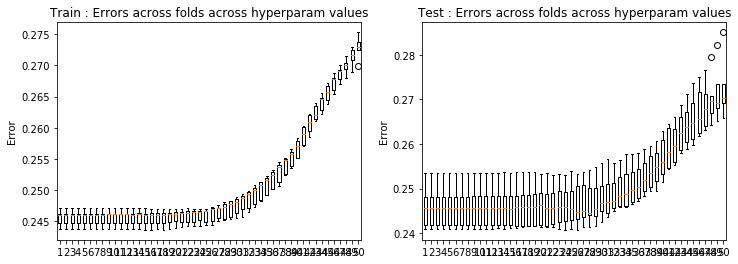

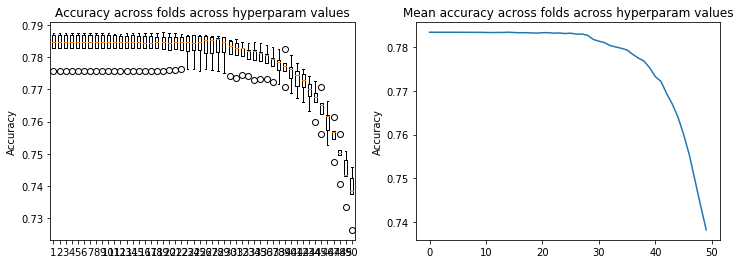

In [51]:
result_crossval(loss_tr29,loss_te29)
result_crossval_accuracy(acc29)

In [22]:
# test 30: degree 4, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr30, loss_te30, w30, acc30 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 4, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -5.01998765e+00  3.12660067e-01 -9.11626196e-01
  1.34847115e+00  2.01186606e-01  2.79923299e-01  1.16031240e+00
  3.05841233e-02  9.58635685e-01 -1.96779194e-03 -2.27385264e-03
 -1.17990340e-01  2.32745198e-03  1.46944513e-02  2.63713357e-01
  3.29597539e-03 -1.13578250e-01 -6.99678940e-03 -1.22761955e-03
  1.81906768e+01 -1.31172535e+00  2.82196280e+00 -1.42367911e+00
 -3.99523413e-01 -4.92766207e-02 -2.10195711e+00  9.39973229e-02
 -9.03654302e-01 -2.58378161e-02 -2.44522189e-02 -2.14321363e-02
 -7.21539218e-02  5.93938130e-04 -6.91520631e-01 -5.73546434e-03
  4.56959903e-01  1.96235981e-01 -1.26014716e-02 -2.15495169e+01
  1.07604669e+00 -4.21443681e+00 -2.59204276e-01  3.08615741e-01
 -1.97280652e-01  1.83971338e+00  3.77383673e-02  3.23933325e-01
  4.42705934e-03  2.1278

Ridge regression: w=[-2.78727907e-01 -4.99119910e+00  2.83944477e-01 -9.80052703e-01
  1.40435056e+00  1.95994685e-01  4.68105766e-01  1.01982798e+00
  1.94167742e-02  9.93864337e-01 -5.90538657e-04  2.70711571e-03
  2.72585406e-01 -1.53781502e-03  7.06497265e-03  2.50675284e-01
  7.61329555e-03 -1.78140061e-01 -2.52585944e-03 -2.99122097e-03
  1.81768016e+01 -1.15935854e+00  2.99204660e+00 -1.53937114e+00
 -4.03080806e-01 -5.76855969e-01 -1.69903003e+00  7.96095626e-02
 -1.01370683e+00 -2.53648640e-02 -1.07190176e-02 -1.17225880e+00
 -7.05035046e-02  9.83213808e-03 -6.29249330e-01  5.82191658e-03
  7.44750947e-01  1.88917789e-01  2.64060065e-03 -2.16220276e+01
  8.13132684e-01 -4.33589644e+00 -2.02180783e-01  3.43077577e-01
  3.50370278e-01  1.42378059e+00  4.50968908e-02  3.87248503e-01
  3.23580997e-03 -4.34945827e-03  1.11211073e+00 -1.62586762e-03
 -8.29715257e-03  5.04428306e-01 -1.86572377e-03 -1.01586939e+00
  2.31135870e-03  5.84197405e-04  8.53336200e+00 -8.99653593e-02
  2.1

Ridge regression: w=[-2.76819776e-01 -5.01732735e+00  2.67784001e-01 -8.99961368e-01
  1.39968914e+00  1.69940273e-01  4.25192300e-01  1.14244829e+00
  1.85296032e-02  8.94707494e-01 -5.31764672e-03 -7.02226189e-05
  1.61553412e-01  3.08233138e-03  1.52164902e-02  2.33237862e-01
  9.46899758e-03 -2.30532734e-01 -9.32497439e-03  3.82550779e-03
  1.82343365e+01 -1.09113888e+00  2.85040952e+00 -1.62912257e+00
 -2.85218836e-01 -4.74618110e-01 -2.14471388e+00  9.35955173e-02
 -8.22710637e-01 -2.07682047e-02 -1.38681521e-02 -8.19087499e-01
 -6.79921918e-02  4.09664830e-03 -5.36238584e-01  2.19274404e-03
  9.22768878e-01  1.93576756e-01  2.90781492e-03 -2.16320244e+01
  7.18923025e-01 -4.26752224e+00 -6.91980146e-02  1.76401515e-01
  2.52517054e-01  1.96267905e+00  4.69563980e-02  2.70830702e-01
  8.60734405e-03  1.15549049e-03  7.37045089e-01 -8.69434856e-03
 -1.59481182e-02  3.42829072e-01 -3.96938287e-03 -1.19820838e+00
  9.95836760e-03 -3.66105989e-03  8.51343983e+00 -4.80498867e-02
  2.1

Ridge regression: w=[-2.75017643e-01 -5.00886990e+00  2.68061253e-01 -9.18640394e-01
  1.43741607e+00  1.87693072e-01  5.33416793e-01  1.38335844e+00
  9.06233627e-03  9.96609172e-01 -5.68411684e-03 -3.03644133e-03
 -1.77460106e-01  8.12017010e-04  8.92474676e-03  2.59567076e-01
  1.46726489e-03 -1.13855677e-01 -7.63280450e-03  2.18022178e-03
  1.82085716e+01 -1.11918933e+00  2.95246650e+00 -1.81839856e+00
 -4.00032930e-01 -7.31588081e-01 -2.32743704e+00  9.70197525e-02
 -7.52432144e-01 -2.95643220e-02 -1.23843401e-02 -1.76637893e-01
 -6.70284434e-02  1.63339710e-02 -6.35113727e-01  9.41152297e-03
  4.88051081e-01  1.94126527e-01  1.91751946e-03 -2.16171331e+01
  7.82583199e-01 -4.41287627e+00  2.01917054e-01  3.82849886e-01
  4.60250334e-01  1.88414531e+00  5.44110506e-02  6.93899399e-02
  6.43207884e-03  1.69179500e-03  2.31166918e-01 -3.61295335e-03
 -1.05092811e-02  4.68113023e-01  1.69518631e-03 -6.47492599e-01
  6.02674665e-03 -6.31203699e-03  8.51589554e+00 -8.58577223e-02
  2.1

Ridge regression: w=[-2.78869221e-01 -5.02626912e+00  2.55237041e-01 -1.03137623e+00
  1.49630276e+00  1.59360318e-01  2.15405530e-01  1.09528344e+00
  1.80384193e-02  1.04221301e+00 -3.41166049e-03  2.48802792e-03
 -6.51535130e-02 -2.34683883e-03  1.49509629e-02  2.45288646e-01
  2.08573664e-03 -2.61237493e-01 -7.31928219e-03  4.74326262e-03
  1.82299324e+01 -1.07005370e+00  3.19597838e+00 -1.81969959e+00
 -2.63201198e-01  2.13045052e-01 -1.96487955e+00  9.20608153e-02
 -1.20164425e+00 -2.37094253e-02 -1.38782626e-02 -1.97894636e-01
 -7.54702340e-02  9.74905943e-04 -6.00749620e-01 -3.27149147e-03
  9.80258436e-01  1.90615964e-01 -1.00724523e-03 -2.16009271e+01
  7.22131683e-01 -4.60453087e+00  8.68481057e-02  1.57807962e-01
 -5.24920218e-01  1.72350844e+00  4.95852022e-02  6.25565983e-01
  4.97024594e-03 -3.68493554e-03  1.51058571e-01 -1.70771357e-03
 -1.72061933e-02  4.61927476e-01  1.64039467e-03 -1.24237434e+00
  6.11159188e-03 -6.22766384e-03  8.49823699e+00 -6.05847005e-02
  2.2

Ridge regression: w=[-2.76431019e-01 -4.97402913e+00  3.11375072e-01 -9.23482042e-01
  1.32487748e+00  2.00898478e-01  2.79145596e-01  1.07955318e+00
  3.04470238e-02  9.04894921e-01 -1.96640819e-03 -2.27118230e-03
 -7.33610979e-02  2.32102710e-03  1.46945804e-02  2.63218552e-01
  3.29090113e-03 -1.11276025e-01 -6.98621755e-03 -1.22343935e-03
  1.80341913e+01 -1.30718819e+00  2.86727032e+00 -1.35935132e+00
 -3.98512270e-01 -4.69901711e-02 -1.95368965e+00  9.41420610e-02
 -8.18399973e-01 -2.58027037e-02 -2.44136735e-02 -9.06530548e-02
 -7.21736978e-02  6.17631486e-04 -6.88112023e-01 -5.74235057e-03
  4.49561949e-01  1.96329516e-01 -1.25761153e-02 -2.13634135e+01
  1.07025968e+00 -4.26981623e+00 -3.21264369e-01  3.07276625e-01
 -1.99471192e-01  1.70937100e+00  3.79624870e-02  2.58217864e-01
  4.43152110e-03  2.11984212e-03 -1.85134330e-02 -7.65333036e-03
 -1.41704495e-02  5.79796051e-01  4.24317656e-04 -5.81872447e-01
  2.50799631e-03 -7.39478647e-04  8.40219462e+00 -2.27527197e-01
  2.1

Ridge regression: w=[-2.78727802e-01 -4.92533508e+00  2.82190090e-01 -9.94402630e-01
  1.36686515e+00  1.95505859e-01  4.59047750e-01  9.45091776e-01
  1.92480389e-02  9.41113347e-01 -6.04880098e-04  2.71255739e-03
  2.94577491e-01 -1.53986465e-03  7.08125272e-03  2.49930763e-01
  7.61082177e-03 -1.72116164e-01 -2.51209251e-03 -2.97883176e-03
  1.79518112e+01 -1.15294584e+00  3.04911825e+00 -1.43671210e+00
 -4.01361657e-01 -5.49938610e-01 -1.56019229e+00  7.98417738e-02
 -9.23990401e-01 -2.53293162e-02 -1.06893972e-02 -1.17905147e+00
 -7.05586166e-02  9.88266114e-03 -6.24197134e-01  5.79985907e-03
  7.25504550e-01  1.89056341e-01  2.65669143e-03 -2.13533957e+01
  8.04768150e-01 -4.40672955e+00 -3.01878850e-01  3.40786416e-01
  3.22398533e-01  1.30041822e+00  4.53780046e-02  3.13794084e-01
  3.25895660e-03 -4.35915448e-03  1.09936033e+00 -1.62390266e-03
 -8.31138484e-03  4.97766271e-01 -1.85412177e-03 -9.94340296e-01
  2.29454829e-03  5.68788574e-04  8.42396415e+00 -8.64943327e-02
  2.1

Ridge regression: w=[-2.76819625e-01 -4.92084024e+00  2.65375238e-01 -9.23333455e-01
  1.34608943e+00  1.69627043e-01  4.11319551e-01  1.00541828e+00
  1.83021354e-02  8.04041635e-01 -5.34453762e-03 -1.12060773e-05
  2.16841252e-01  3.09083076e-03  1.52718952e-02  2.32367949e-01
  9.50334852e-03 -2.20584852e-01 -9.29639440e-03  3.91145896e-03
  1.79053608e+01 -1.08272126e+00  2.94147859e+00 -1.48224226e+00
 -2.84118023e-01 -4.33796745e-01 -1.89097351e+00  9.38931303e-02
 -6.77058946e-01 -2.06810982e-02 -1.38192423e-02 -8.75587522e-01
 -6.80442780e-02  4.11558730e-03 -5.29464700e-01  2.19264256e-03
  8.90938530e-01  1.93783064e-01  2.95611640e-03 -2.12403730e+01
  7.08230521e-01 -4.37977212e+00 -2.11699712e-01  1.74863834e-01
  2.10382019e-01  1.73813520e+00  4.73517041e-02  1.56703984e-01
  8.64744772e-03  1.09766215e-03  7.59602380e-01 -8.69495164e-03
 -1.59921936e-02  3.33747337e-01 -3.98584016e-03 -1.16263629e+00
  9.93247995e-03 -3.73320602e-03  8.35440701e+00 -4.37451246e-02
  2.1

Ridge regression: w=[-2.75017324e-01 -4.81060139e+00  2.62844092e-01 -9.57105967e-01
  1.32303301e+00  1.86439375e-01  4.93359350e-01  1.09886829e+00
  8.59366403e-03  8.15537217e-01 -5.71221854e-03 -3.05566163e-03
 -3.81165515e-02  7.94500900e-04  9.02302979e-03  2.57234211e-01
  1.51035325e-03 -1.00561899e-01 -7.60066322e-03  2.26215142e-03
  1.75312042e+01 -1.10061724e+00  3.11147842e+00 -1.50537669e+00
 -3.95624079e-01 -6.13655418e-01 -1.80215478e+00  9.76016277e-02
 -4.73383809e-01 -2.93517225e-02 -1.22188753e-02 -3.67661637e-01
 -6.71923618e-02  1.64440666e-02 -6.19650790e-01  9.37486206e-03
  4.46166458e-01  1.94534821e-01  2.06730185e-03 -2.08089292e+01
  7.58928978e-01 -4.61343380e+00 -1.01879585e-01  3.76759401e-01
  3.38575014e-01  1.42154111e+00  5.52584888e-02 -1.41316343e-01
  6.49484497e-03  1.69913675e-03  3.55524376e-01 -3.60560012e-03
 -1.06082587e-02  4.47633366e-01  1.67751542e-03 -6.00968880e-01
  5.98455625e-03 -6.36841641e-03  8.18695794e+00 -7.62334788e-02
  2.2

Ridge regression: w=[-2.78868750e-01 -4.74344738e+00  2.47401953e-01 -1.08285106e+00
  1.33104720e+00  1.58358770e-01  2.34776981e-01  7.56446967e-01
  1.74289329e-02  8.01731015e-01 -3.49855068e-03  2.60392459e-03
  9.67344354e-02 -2.38816947e-03  1.50900257e-02  2.42329075e-01
  2.10847656e-03 -2.33536039e-01 -7.23560285e-03  4.84282674e-03
  1.72666192e+01 -1.04175480e+00  3.41102631e+00 -1.37188933e+00
 -2.59030283e-01  1.57689015e-01 -1.34081597e+00  9.30543773e-02
 -8.00104957e-01 -2.34230780e-02 -1.36240477e-02 -4.16746070e-01
 -7.56172083e-02  1.09411904e-03 -5.80335417e-01 -3.34182154e-03
  8.90787783e-01  1.91220513e-01 -7.89206152e-04 -2.04536356e+01
  6.85508473e-01 -4.87541481e+00 -3.43756863e-01  1.51274505e-01
 -4.68418715e-01  1.17245354e+00  5.07113332e-02  3.03453851e-01
  5.09424819e-03 -3.81935509e-03  2.94725117e-01 -1.65110403e-03
 -1.73174496e-02  4.35243695e-01  1.64391876e-03 -1.14138165e+00
  6.05040727e-03 -6.31282472e-03  8.03175298e+00 -4.54964541e-02
  2.3

Ridge regression: w=[-2.76430028e-01 -4.42909391e+00  2.95909691e-01 -1.03050032e+00
  1.05430352e+00  1.97262195e-01  2.79402774e-01  6.07745323e-01
  2.90959040e-02  5.99717342e-01 -1.93854629e-03 -2.27725334e-03
  1.44372501e-01  2.23483559e-03  1.46962153e-02  2.56250336e-01
  3.19877430e-03 -8.57799772e-02 -6.84353837e-03 -1.19746814e-03
  1.61802184e+01 -1.25135989e+00  3.29734348e+00 -6.47936211e-01
 -3.85837579e-01 -4.85408510e-02 -1.07346368e+00  9.57111834e-02
 -3.35013991e-01 -2.53993155e-02 -2.39042514e-02 -3.76757950e-01
 -7.23870769e-02  9.84092980e-04 -6.44198155e-01 -5.86244509e-03
  3.68680402e-01  1.97453491e-01 -1.22116759e-02 -1.91587285e+01
  9.97909906e-01 -4.80201871e+00 -9.84061390e-01  2.90478126e-01
 -1.97110330e-01  9.26857186e-01  4.04282967e-02 -1.13045876e-01
  4.49042925e-03  2.06170129e-03  1.60530619e-01 -7.60976881e-03
 -1.42166131e-02  5.22704906e-01  5.70549277e-04 -4.91289553e-01
  2.42709519e-03 -8.08866329e-04  7.50693911e+00 -1.97510381e-01
  2.3

Ridge regression: w=[-2.78726348e-01 -4.18947448e+00  2.62675049e-01 -1.10267000e+00
  9.79025637e-01  1.89584181e-01  3.95254799e-01  5.64685795e-01
  1.78106475e-02  6.72923143e-01 -7.30206119e-04  2.70096003e-03
  3.10635669e-01 -1.55778952e-03  7.23786316e-03  2.40271139e-01
  7.55888729e-03 -1.11665443e-01 -2.36780570e-03 -2.91666473e-03
  1.54400570e+01 -1.07983472e+00  3.51967157e+00 -4.26623661e-01
 -3.80591306e-01 -3.59090857e-01 -8.33400757e-01  8.23462222e-02
 -4.51198985e-01 -2.49463998e-02 -1.03317699e-02 -9.41506888e-01
 -7.12230177e-02  1.05186491e-02 -5.64074789e-01  5.51211513e-03
  5.33639266e-01  1.90741092e-01  2.96098641e-03 -1.83540745e+01
  7.07710537e-01 -5.00288778e+00 -1.23669452e+00  3.13046653e-01
  1.20649924e-01  6.41401470e-01  4.82361432e-02 -8.26409582e-02
  3.50144614e-03 -4.40532638e-03  7.52199843e-01 -1.62032345e-03
 -8.46526748e-03  4.19453249e-01 -1.71727943e-03 -7.80526360e-01
  2.11632167e-03  4.73105761e-04  7.20190664e+00 -4.57661695e-02
  2.3

Ridge regression: w=[-2.76817521e-01 -3.93218747e+00  2.40225851e-01 -1.05856480e+00
  8.43481465e-01  1.66120356e-01  3.37679559e-01  4.66559601e-01
  1.67815255e-02  4.74289337e-01 -5.54990627e-03  4.83752984e-04
  3.05362696e-01  3.18054993e-03  1.58310709e-02  2.21034847e-01
  9.80002512e-03 -1.29875174e-01 -9.03374321e-03  4.74979719e-03
  1.45378347e+01 -9.91385652e-01  3.54361691e+00 -1.99786421e-01
 -2.71499408e-01 -2.16496459e-01 -8.55182924e-01  9.67519648e-02
 -1.52265971e-01 -1.98574126e-02 -1.32348216e-02 -7.38599655e-01
 -6.86241658e-02  4.43944452e-03 -4.53633667e-01  2.12109179e-03
  6.01987125e-01  1.96138455e-01  3.56841747e-03 -1.72302364e+01
  5.88908161e-01 -5.14624891e+00 -1.37193804e+00  1.56779031e-01
 -1.85399655e-02  7.98139344e-01  5.08489516e-02 -2.51801746e-01
  9.04401162e-03  6.18173010e-04  4.76463122e-01 -8.77515627e-03
 -1.64873520e-02  2.34292509e-01 -4.12987945e-03 -8.40443772e-01
  9.68731064e-03 -4.43068084e-03  6.72487383e+00  5.30737294e-03
  2.4

Ridge regression: w=[-2.75012891e-01 -3.19887863e+00  2.20262339e-01 -9.96884469e-01
  5.45372271e-01  1.72963494e-01  3.67898845e-01  4.77748001e-01
  6.73949758e-03  4.84362716e-01 -5.73246867e-03 -3.39042596e-03
  1.10168424e-01  6.52909679e-04  9.77961102e-03  2.32887663e-01
  1.75646981e-03 -2.05331210e-02 -7.35087885e-03  2.82425165e-03
  1.20381648e+01 -9.40600117e-01  3.53269207e+00  3.56397723e-01
 -3.48421583e-01 -2.39958382e-01 -5.99746793e-01  1.02005182e-01
 -1.74940880e-02 -2.77419321e-02 -1.07641740e-02 -3.66544845e-01
 -6.85285223e-02  1.76571006e-02 -4.79849628e-01  8.90581229e-03
  1.99613946e-01  1.98552294e-01  3.82778975e-03 -1.42544839e+01
  5.46280212e-01 -5.22941218e+00 -1.67472647e+00  3.12076460e-01
 -6.05092573e-02  3.29591208e-01  6.08139178e-02 -4.43923908e-01
  6.93825716e-03  1.91797714e-03  2.01347313e-01 -3.61875702e-03
 -1.14127882e-02  2.66558036e-01  1.61272975e-03 -3.30137847e-01
  5.64034208e-03 -6.64666811e-03  5.51648334e+00  1.28735644e-02
  2.5

Ridge regression: w=[-2.78862204e-01 -2.78455816e+00  1.92754985e-01 -1.01185771e+00
  4.25558819e-01  1.49404452e-01  3.12248351e-01  2.54643651e-01
  1.66722800e-02  4.47860279e-01 -3.95249492e-03  3.35156804e-03
  1.75201958e-01 -2.55302056e-03  1.62483636e-02  2.14216668e-01
  2.28596403e-03 -7.22365663e-02 -6.80296214e-03  5.61510186e-03
  1.06084790e+01 -8.33926563e-01  3.54959309e+00  6.49752783e-01
 -2.22728080e-01 -4.68889034e-02 -3.48159559e-01  9.91833238e-02
 -1.76953203e-01 -2.17056805e-02 -1.13783316e-02 -3.30493696e-01
 -7.67755911e-02  2.55738752e-03 -4.19783069e-01 -3.93131863e-03
  3.76402924e-01  1.96373646e-01  1.69240079e-03 -1.25179948e+01
  4.06553789e-01 -5.19171240e+00 -1.90331919e+00  9.51834124e-02
 -2.91709468e-01  2.49592753e-01  5.61589533e-02 -2.04438025e-01
  5.91358966e-03 -4.67776272e-03  1.07476041e-01 -1.44977746e-03
 -1.82975551e-02  2.30170645e-01  1.59017363e-03 -5.65312832e-01
  5.66818282e-03 -6.77892045e-03  4.79904685e+00  7.21286649e-02
  2.4

Ridge regression: w=[-2.76416265e-01 -1.86118337e+00  2.07236714e-01 -6.93538392e-01
  1.24342368e-01  1.70075118e-01  3.02625837e-01  2.15620771e-01
  2.70278052e-02  3.97663148e-01 -1.22286390e-03 -1.96033170e-03
  1.64563177e-01  1.94369340e-03  1.55500228e-02  2.06374625e-01
  3.01104353e-03  5.85873694e-03 -6.08624642e-03 -4.15976954e-04
  7.47327067e+00 -9.07627720e-01  2.68735445e+00  9.96508880e-01
 -2.90921014e-01 -9.90945912e-02 -2.40211125e-01  1.01843629e-01
 -4.38327658e-02 -2.38124160e-02 -2.07420451e-02 -2.40849855e-01
 -7.28025835e-02  3.62548123e-03 -3.92135254e-01 -7.11158583e-03
  9.19930381e-02  2.04479888e-01 -9.28505570e-03 -8.79404893e+00
  5.31756547e-01 -4.28192308e+00 -1.78397699e+00  1.62846854e-01
 -1.89524217e-01  1.24304853e-01  4.96647122e-02 -2.90183707e-01
  4.48970396e-03  1.43583160e-03 -3.68572568e-02 -7.70804471e-03
 -1.53058086e-02  2.05158043e-01  8.90800016e-04 -1.89999685e-01
  1.89182420e-03 -1.47251745e-03  3.28658575e+00  2.66878202e-03
  2.1

Ridge regression: w=[-2.78706137e-01 -1.42431243e+00  1.79401740e-01 -5.40317967e-01
  4.15153217e-02  1.52965652e-01  3.43946668e-01  2.55922134e-01
  1.80586553e-02  4.76694230e-01 -4.95911272e-04  2.49698632e-03
  1.35860365e-01 -1.61441140e-03  8.27514713e-03  1.89181630e-01
  7.32671640e-03  4.33117101e-02 -1.82498859e-03 -2.50000891e-03
  6.03190705e+00 -7.44742017e-01  2.23376621e+00  9.88435471e-01
 -2.53287857e-01 -1.70505334e-01 -1.76850010e-01  9.06762642e-02
 -1.28228654e-01 -2.37614644e-02 -8.96338840e-03 -2.88595689e-01
 -7.41264793e-02  1.30946150e-02 -3.05919427e-01  3.80539196e-03
  5.75656174e-02  1.99823475e-01  6.15199594e-03 -7.10305033e+00
  2.42561003e-01 -3.71705467e+00 -1.60120689e+00  1.43293085e-01
 -1.45397827e-01  6.26218858e-03  5.57158336e-02 -3.01904190e-01
  3.89395605e-03 -4.59387411e-03  4.37003665e-02 -1.82759612e-03
 -9.59602321e-03  9.51831274e-02 -1.25898002e-03 -2.59067535e-01
  1.47222297e-03  1.32422885e-04  2.60243330e+00  1.55229119e-01
  1.8

Ridge regression: w=[-2.76788290e-01 -1.04736293e+00  1.52070264e-01 -3.07989619e-01
 -5.46645012e-02  1.44959155e-01  3.19157635e-01  1.52728394e-01
  1.82442870e-02  3.64211370e-01 -5.01667558e-03  1.83765678e-03
  1.75917404e-01  3.31276555e-03  1.85395530e-02  1.79511134e-01
  1.08812730e-02  4.38182221e-02 -8.47494178e-03  8.06431062e-03
  4.75118908e+00 -6.48711147e-01  1.67640411e+00  9.04755636e-01
 -1.93739423e-01 -1.29594775e-01 -1.37563372e-01  1.03772379e-01
 -4.51408566e-02 -1.80029696e-02 -1.10174638e-02 -2.51065010e-01
 -7.02619117e-02  5.47764670e-03 -2.29941382e-01  1.28549257e-03
  5.70025838e-02  2.06220599e-01  6.77826701e-03 -5.56115150e+00
  1.21785799e-01 -3.18883976e+00 -1.24903628e+00  4.52402751e-02
 -1.82679519e-01  8.27871632e-02  5.74687324e-02 -2.60800346e-01
  9.68186950e-03 -6.36819920e-04 -4.96155746e-02 -9.57068243e-03
 -1.91472559e-02 -4.25809324e-02 -4.71371155e-03 -2.36489689e-01
  9.18011061e-03 -6.98788868e-03  1.96764955e+00  2.03392624e-01
  1.6

Ridge regression: w=[-2.74951306e-01 -4.33638770e-01  1.20746973e-01  1.16083580e-02
 -1.02034601e-01  1.22588504e-01  3.42611392e-01  1.94777362e-01
  7.56904625e-03  3.93344618e-01 -4.81298322e-03 -4.21524314e-03
  9.56682323e-02  5.71196619e-04  1.13954497e-02  1.78638436e-01
  2.25259203e-03  6.01867584e-02 -6.97375325e-03  3.95002429e-03
  2.69187639e+00 -5.56113269e-01  7.07518375e-01  6.54222339e-01
 -1.72582228e-01 -1.56031659e-01 -9.60338003e-02  1.05377007e-01
 -5.53990791e-02 -2.55850062e-02 -7.53338783e-03 -1.53513314e-01
 -7.07546984e-02  2.05923722e-02 -2.29188168e-01  7.65265411e-03
 -2.34597964e-02  2.08410192e-01  8.96712644e-03 -3.11708495e+00
  2.70304476e-02 -2.06689853e+00 -6.67811228e-01  7.71756966e-02
 -2.00393548e-01 -8.44750100e-02  6.85437348e-02 -2.44219675e-01
  7.21944125e-03  2.41840381e-03 -5.86436308e-02 -4.04345863e-03
 -1.31620856e-02 -4.10068049e-02  1.38820163e-03 -9.92544994e-02
  5.01630716e-03 -6.91086047e-03  9.70323767e-01  2.34430508e-01
  1.2

Ridge regression: w=[-2.78771269e-01 -2.36307540e-01  9.99678321e-02  6.05556406e-02
 -8.32406863e-02  1.25640487e-01  3.50358622e-01  8.95616419e-02
  1.95615787e-02  3.56542466e-01 -4.08592924e-03  4.78325595e-03
  1.30335279e-01 -2.44899855e-03  1.86142305e-02  1.64037223e-01
  2.49953552e-03  5.64445915e-02 -6.62674021e-03  7.53095215e-03
  2.01881156e+00 -4.83660197e-01  4.41875710e-01  5.48956604e-01
 -1.36876814e-01 -1.54704657e-01 -3.18637006e-02  1.01493529e-01
 -8.64946459e-02 -2.06451595e-02 -7.06124246e-03 -1.39188898e-01
 -7.84477410e-02  5.62474728e-03 -1.96613354e-01 -5.01581739e-03
 -1.80564837e-02  2.05378204e-01  7.50347227e-03 -2.29618177e+00
 -5.80238511e-02 -1.64916026e+00 -4.85675134e-01 -2.44733487e-02
 -2.26895920e-01 -2.90653833e-02  6.16643986e-02 -1.81840685e-01
  6.78205339e-03 -6.08574550e-03 -7.94218297e-02 -1.66802352e-03
 -2.02725526e-02 -3.90668415e-02  1.61841273e-03 -1.30982861e-01
  5.32362382e-03 -7.79759434e-03  6.27498081e-01  2.66669574e-01
  1.0

Ridge regression: w=[-2.76225164e-01  5.71329971e-02  7.82377509e-02  1.40746848e-01
 -4.50695241e-02  1.24111257e-01  2.83441179e-01  6.22280143e-02
  2.21889067e-02  3.37110157e-01  4.66620785e-05 -8.81832749e-04
  1.59245316e-01  1.93975285e-03  1.70099744e-02  1.48449874e-01
  2.88763138e-03  5.40763802e-02 -5.47492572e-03  8.86006152e-04
  1.06261779e+00 -4.48615552e-01  5.33960335e-03  3.76920866e-01
 -1.41464677e-01 -1.04666040e-01 -9.67956105e-03  9.41472632e-02
 -4.83950103e-02 -2.40178379e-02 -1.77287541e-02 -1.40106959e-01
 -7.26787369e-02  6.20384409e-03 -1.73693141e-01 -8.24608124e-03
 -3.22912375e-02  2.10162935e-01 -5.44474466e-03 -1.21768546e+00
 -4.67465120e-02 -1.00191539e+00 -2.10312494e-01 -2.16523184e-02
 -1.56508157e-01 -2.18568733e-02  6.13086699e-02 -1.55459690e-01
  4.05951773e-03  2.68969816e-04 -1.20329383e-01 -8.24611379e-03
 -1.69051874e-02 -4.62438059e-02  1.00380111e-03 -6.44029769e-02
  1.36209343e-03 -2.34589066e-03  2.09753656e-01  2.41600109e-01
  7.1

Ridge regression: w=[-2.78425619e-01  1.46447884e-01  8.06409279e-02  1.36236729e-01
 -1.30065603e-02  1.08384673e-01  2.90491196e-01  5.65053350e-02
  1.41525276e-02  3.40247615e-01  3.04553619e-04  2.61617235e-03
  1.45178400e-01 -1.45525287e-03  9.33381288e-03  1.44817997e-01
  6.51565111e-03  8.44942656e-02 -1.52790507e-03 -2.07896232e-03
  7.79736459e-01 -4.27540074e-01 -8.04247196e-02  2.87163865e-01
 -1.12579921e-01 -1.03200130e-01  1.16335983e-02  8.16746830e-02
 -6.68025960e-02 -2.44875872e-02 -8.29506733e-03 -1.35029783e-01
 -7.59270031e-02  1.42099763e-02 -1.55826490e-01  3.05721247e-03
 -7.46934442e-02  2.04688111e-01  9.43340842e-03 -8.90526469e-01
 -1.20885734e-01 -7.69899244e-01 -1.51152667e-01 -2.33439821e-02
 -1.49295653e-01 -2.52995677e-02  6.52057509e-02 -1.56678229e-01
  3.55662645e-03 -4.91947475e-03 -1.06646342e-01 -2.30239453e-03
 -1.06534218e-02 -6.35967835e-02 -4.85771427e-04 -9.49305553e-02
  1.01099655e-03 -1.66400005e-04  7.77026378e-02  2.91114523e-01
  5.7

Ridge regression: w=[-2.75795995e-01  2.61659200e-01  2.80603575e-02  1.04606927e-01
  5.65585964e-02  1.06256879e-01  2.30074742e-01  1.14198149e-02
  1.82286757e-02  2.86656070e-01  3.78500066e-04 -6.47512250e-04
  1.45767085e-01  1.84289047e-03  1.67033981e-02  1.24824785e-01
  2.54828689e-03  5.33084242e-02 -5.30436198e-03  7.62679647e-04
  4.08202669e-01 -3.44429526e-01 -1.90267975e-01  1.80437037e-01
 -1.04039985e-01 -5.13697997e-02  1.51285101e-02  8.21224015e-02
 -1.26813261e-02 -2.44649133e-02 -1.71375295e-02 -9.08516580e-02
 -7.18005301e-02  6.21723163e-03 -1.33215094e-01 -8.04155094e-03
 -3.38602206e-02  2.08142416e-01 -4.66061134e-03 -4.93155016e-01
 -9.98280413e-02 -4.72948656e-01 -6.53690300e-02 -4.00080957e-02
 -1.04908513e-01 -3.71935984e-04  6.66982578e-02 -1.06504006e-01
  3.86995958e-03  1.00990545e-04 -1.01019727e-01 -8.32466013e-03
 -1.66642840e-02 -5.96011521e-02  1.26604510e-03 -4.93123652e-02
  1.20486463e-03 -2.21021887e-03 -6.65538172e-02  2.37645285e-01
  3.9

Ridge regression: w=[-0.27793715  0.29190827  0.0117003   0.08583091  0.07959768  0.09862454
  0.23423319 -0.01153694  0.01471815  0.25761013 -0.00348858  0.00475954
  0.12558397 -0.00260718  0.01766058  0.12000265  0.00164296  0.05640003
 -0.0064264   0.00696264  0.31251501 -0.31359923 -0.18853557  0.13026205
 -0.08299278 -0.04528396  0.02097443  0.08022986 -0.01254025 -0.02134463
 -0.00614922 -0.05902285 -0.0769329   0.00546526 -0.12082311 -0.00435722
 -0.04418532  0.20263435  0.00837573 -0.37431813 -0.11954103 -0.3687516
 -0.05427831 -0.04465749 -0.10677752  0.00765774  0.06990177 -0.09110441
  0.00655763 -0.00613418 -0.07677974 -0.00168064 -0.01948938 -0.06241394
  0.00236744 -0.05797651  0.00499807 -0.00740455 -0.11851453  0.23952607
  0.31583703 -0.05499508  0.05975757  0.02331374 -0.01121158 -0.06810448
 -0.00230243 -0.01849986  0.00795181  0.02832127  0.01125276 -0.00233685
  0.08713001  0.00413976  0.03104752 -0.05758538 -0.00837984]
Ridge regression: w=[-2.75894530e-01  2.951

Ridge regression: w=[-2.74478739e-01  3.14974032e-01 -3.71114185e-02  3.28361184e-02
  1.18286359e-01  8.15757341e-02  1.76928319e-01 -1.79791817e-02
  1.90747873e-02  2.24608243e-01  7.27430211e-04 -9.87470263e-04
  1.09069807e-01  1.40607273e-03  1.52171172e-02  8.85144944e-02
  2.06525766e-03  4.31114500e-02 -5.08046747e-03 -2.57425209e-05
  1.76724478e-01 -2.45574838e-01 -1.70612156e-01  9.43227064e-02
 -6.53821217e-02  2.71830432e-03  1.48053437e-02  6.44067741e-02
  3.09251448e-02 -2.38146102e-02 -1.58770534e-02 -3.24957299e-02
 -6.83432922e-02  5.55910213e-03 -8.39252159e-02 -7.61466655e-03
 -1.97346232e-02  2.00565012e-01 -4.09051934e-03 -2.36380376e-01
 -8.25479540e-02 -2.23502898e-01 -3.25310586e-02 -3.43462231e-02
 -5.58741238e-02  1.04838477e-02  6.87957825e-02 -5.97036338e-02
  3.65312933e-03  3.66296249e-04 -6.09764216e-02 -8.09680275e-03
 -1.53481307e-02 -4.59542026e-02  1.62977477e-03 -3.39647870e-02
  1.02139363e-03 -1.60241770e-03 -1.53535985e-01  1.81199889e-01
  1.9

Ridge regression: w=[-0.27587019  0.31131098 -0.05008062  0.02366701  0.1165378   0.06745402
  0.1757719  -0.01980845  0.01543261  0.20003709  0.00068785  0.00202708
  0.08981624 -0.00135141  0.00813444  0.07778487  0.00489415  0.04392898
 -0.00145591 -0.00297955  0.14721864 -0.22954818 -0.14067055  0.07579238
 -0.04346603  0.01472266  0.0157856   0.04998162  0.03212673 -0.02371252
 -0.00739522 -0.02078816 -0.06969532  0.01110468 -0.06537331  0.00282502
 -0.02848679  0.19118613  0.00811196 -0.19072606 -0.08234984 -0.17367019
 -0.02897339 -0.02542486 -0.04957657  0.01009058  0.06977574 -0.04945255
  0.00325702 -0.00454576 -0.04693035 -0.00237725 -0.0095658  -0.03960399
  0.00077192 -0.03823021  0.00053497  0.00031696 -0.1686807   0.17408871
  0.1353338  -0.05783212  0.0311008  -0.03100575 -0.00819611 -0.03623179
 -0.04695344 -0.01853025  0.01126446 -0.00723402  0.00452964 -0.00724404
  0.04518756 -0.00079598  0.00748669 -0.04193123 -0.00187509]
Ridge regression: w=[-0.27601008  0.314998

Ridge regression: w=[-0.27048825  0.28761295 -0.09795306  0.01253374  0.12705352  0.0548131
  0.13925655 -0.0341803   0.03196304  0.17147315  0.00120764 -0.00196805
  0.0777307   0.00041908  0.01205035  0.05345621  0.00164674  0.03421002
 -0.00485131 -0.001303    0.10279192 -0.157462   -0.10609226  0.06681011
 -0.02832159  0.03242429  0.00289769  0.04529447  0.05217454 -0.02212171
 -0.01279729  0.00217206 -0.06047439  0.00425038 -0.03381784 -0.00665205
 -0.00527129  0.18085254 -0.00328795 -0.13371074 -0.04647215 -0.11761136
 -0.01866726 -0.02035825 -0.02641791  0.01126237  0.06202751 -0.02906066
  0.00338724  0.00101429 -0.03142287 -0.00741203 -0.01246053 -0.02385494
  0.00190413 -0.02233496  0.00090338 -0.0007092  -0.17142244  0.11116372
  0.06084874 -0.06419283  0.01951503 -0.03930603  0.00419821 -0.03024462
 -0.06534838 -0.01639475  0.00873709 -0.02689906 -0.00195409 -0.00346995
  0.02166357 -0.00182588 -0.01792606 -0.03336692 -0.00246537]
Ridge regression: w=[-2.69105205e-01  2.905

Ridge regression: w=[-2.70085929e-01  2.69225037e-01 -1.07105184e-01  2.24010293e-02
  1.15252859e-01  4.52216428e-02  1.37623255e-01 -3.36549842e-02
  3.32077613e-02  1.50162279e-01  9.41695568e-04  7.10664311e-04
  6.46156824e-02 -1.55156147e-03  6.07772863e-03  4.69810131e-02
  4.17588541e-03  3.10283739e-02 -1.55705760e-03 -3.62928529e-03
  9.27334034e-02 -1.44197617e-01 -7.97028781e-02  5.69878157e-02
 -1.41788948e-02  3.78019642e-02  1.13441941e-03  3.52205838e-02
  4.89016827e-02 -2.24315907e-02 -5.34083755e-03  5.96265436e-03
 -5.97788474e-02  7.61489148e-03 -2.00843362e-02  2.16944125e-03
 -8.40746407e-03  1.67137396e-01  5.98099935e-03 -1.12195747e-01
 -4.27891259e-02 -9.86884163e-02 -1.65049136e-02 -1.36363865e-02
 -2.39972009e-02  9.32853950e-03  5.95819169e-02 -2.21928606e-02
  3.07905100e-03 -3.54117039e-03 -2.36000161e-02 -2.12478377e-03
 -7.71210355e-03 -1.78358367e-02  1.23068118e-03 -2.26033632e-02
  4.22300631e-04  5.47965350e-04 -1.69202421e-01  9.96239719e-02
  2.1

Ridge regression: w=[-2.64494595e-01  2.48954312e-01 -1.19587856e-01  3.23607735e-02
  1.07991206e-01  4.50368171e-02  1.22103598e-01 -3.58237931e-02
  4.06744739e-02  1.38371326e-01 -1.03814957e-03 -1.47171658e-03
  6.03702448e-02  6.58899418e-05  9.91222769e-03  4.15911736e-02
  4.83374915e-03  3.20304759e-02 -6.20033155e-03  1.88145211e-03
  8.06963790e-02 -1.23318253e-01 -6.53430644e-02  5.23806410e-02
 -9.65927614e-03  3.87965584e-02 -1.89829706e-03  3.65584549e-02
  5.18492739e-02 -1.83938507e-02 -3.93125473e-03  1.06985581e-02
 -5.27107830e-02  2.97274894e-03 -1.33676397e-02  1.39476994e-04
 -2.60679613e-03  1.58706982e-01  3.74762562e-03 -9.66049369e-02
 -3.41609365e-02 -9.05587025e-02 -1.18204371e-02 -1.42085245e-02
 -1.77733867e-02  9.16792459e-03  5.56466234e-02 -1.47573705e-02
  7.41244656e-03  1.55791961e-03 -1.83959660e-02 -7.96785820e-03
 -1.16863449e-02 -1.30433297e-02  9.82143630e-04 -2.06186041e-02
  6.66117729e-03 -2.54219396e-03 -1.59374277e-01  8.04574839e-02
 -7.1

Ridge regression: w=[-2.53657829e-01  2.01275017e-01 -1.22881115e-01  4.68359621e-02
  9.85780158e-02  3.02947375e-02  1.04667434e-01 -3.93743254e-02
  5.20995089e-02  1.13891342e-01  1.23029497e-03 -7.94836307e-04
  4.66290022e-02 -1.76492637e-03  3.50624101e-03  3.16831398e-02
  3.80708931e-03  2.70899146e-02 -1.47784877e-03 -3.33204523e-03
  6.35847858e-02 -9.67510382e-02 -3.52173881e-02  4.60394760e-02
  6.34199435e-04  3.97911736e-02 -1.00539509e-02  2.76108879e-02
  4.88107199e-02 -2.22412729e-02 -2.48728869e-03  1.43697838e-02
 -4.78412911e-02  4.17811164e-03  3.19823684e-03  1.34765553e-03
  1.22594721e-03  1.29993179e-01  3.78375031e-03 -6.95539126e-02
 -2.63293249e-02 -7.26627156e-02 -8.29835871e-03 -5.66331482e-03
 -1.05315586e-02  5.25982108e-03  5.02857870e-02 -6.07845784e-03
  2.79789641e-03 -2.38758240e-03 -9.54011009e-03 -1.90711687e-03
 -5.20234514e-03 -4.43950542e-03  1.35231381e-03 -1.54088118e-02
  2.54079724e-04 -2.87386867e-05 -1.35951689e-01  5.00284425e-02
 -4.8

Ridge regression: w=[-2.41988637e-01  1.77253795e-01 -1.21278650e-01  5.11471494e-02
  9.08073635e-02  3.01315411e-02  9.16540899e-02 -3.85975943e-02
  5.61956309e-02  1.04496745e-01  4.46691815e-04 -1.99236247e-03
  4.28794387e-02 -1.76042028e-03  4.75440381e-03  2.72563717e-02
  3.53791899e-03  2.80496011e-02 -4.07335559e-03  1.37522446e-04
  5.50548792e-02 -8.66861281e-02 -2.78859693e-02  4.32001390e-02
  2.32929299e-03  3.72747413e-02 -1.16551194e-02  2.79984645e-02
  4.88101607e-02 -1.97108318e-02 -1.15579811e-03  1.57695699e-02
 -4.19859487e-02  1.91629794e-03  5.56344673e-03 -7.09217506e-04
  3.66680786e-03  1.18461565e-01  1.45409363e-03 -5.90662560e-02
 -2.48861124e-02 -6.93451059e-02 -4.34416677e-03 -6.18818567e-03
 -6.63823704e-03  3.79394421e-03  4.91739870e-02 -8.76386600e-05
  5.70615399e-03  1.42661046e-03 -5.64388558e-03 -6.29920196e-03
 -6.53255609e-03 -6.26189936e-04  1.98972700e-03 -1.44058689e-02
  4.53039005e-03 -1.36577886e-03 -1.20437118e-01  3.77676858e-02
 -6.0

Ridge regression: w=[-2.10695721e-01  1.30762324e-01 -1.04458446e-01  5.01778961e-02
  7.63816974e-02  2.09235917e-02  7.18862802e-02 -3.87710706e-02
  5.84814968e-02  8.50437220e-02  6.31969330e-05 -3.56298560e-03
  3.10267833e-02 -2.39276675e-03  1.76250513e-03  1.77505331e-02
  1.59201351e-03  2.61914884e-02 -2.77619192e-03 -1.17716085e-03
  4.06123590e-02 -7.08652822e-02 -1.60739721e-02  3.80649440e-02
  5.59712804e-03  3.30872202e-02 -1.72546341e-02  2.52613579e-02
  4.44559283e-02 -2.04146793e-02 -2.08475668e-03  1.52295710e-02
 -3.72705158e-02  3.19363493e-03  8.15017394e-03 -1.69595852e-05
  6.79828520e-03  9.44514938e-02 -1.27095029e-03 -4.06062520e-02
 -2.63336420e-02 -5.78688620e-02  1.80308295e-03 -2.09753331e-03
 -2.16925600e-04 -2.08102417e-03  4.87228267e-02  7.33380903e-03
  2.92663235e-03 -1.11633247e-04  1.35015155e-03 -2.24951923e-03
 -3.02731611e-03  4.08901515e-03  1.58451551e-03 -9.59825788e-03
  9.84741895e-04 -2.40907742e-03 -8.96490498e-02  1.44713274e-02
 -6.8

Ridge regression: w=[-1.93042637e-01  1.10485863e-01 -9.51875841e-02  4.50272364e-02
  6.75925715e-02  1.80645832e-02  6.18379246e-02 -3.51385595e-02
  6.03713726e-02  7.41998214e-02  5.48892050e-04 -2.14323853e-03
  2.55046011e-02 -3.17664298e-03  7.40329594e-04  1.56059155e-02
  1.10593579e-03  2.13707812e-02 -2.04883752e-03 -2.32395016e-04
  3.52589214e-02 -6.43658972e-02 -1.21913408e-02  3.41877725e-02
  4.92777136e-03  3.01612004e-02 -1.61924771e-02  2.50463945e-02
  4.14867973e-02 -2.08563066e-02 -7.29198822e-04  1.31814313e-02
 -3.66704639e-02  8.45679408e-04  8.41633204e-03 -3.28070367e-04
  6.16830539e-03  8.28701515e-02  5.23180858e-04 -3.22944584e-02
 -2.74680821e-02 -5.04388692e-02  2.55508264e-03 -1.34366022e-03
  2.63218486e-03 -2.45536652e-03  4.89470910e-02  1.14571321e-02
  2.75344716e-03 -1.60654051e-03  1.65152219e-03 -1.45917855e-03
 -3.26349832e-03  3.69495913e-03  1.37766076e-03 -6.79904709e-03
  1.12783076e-03 -1.69589475e-03 -7.47472597e-02  5.35747950e-03
 -6.4

Ridge regression: w=[-1.42272207e-01  7.17994215e-02 -7.36715853e-02  3.05784810e-02
  5.00991260e-02  1.15382044e-02  4.39797392e-02 -2.89602383e-02
  5.44338975e-02  5.54899131e-02  6.84446830e-04 -1.64978518e-03
  1.39660921e-02 -2.46353497e-03  1.15613597e-03  6.88241348e-03
  1.73792712e-03  1.75039844e-02 -1.76063961e-03 -7.28255743e-04
  2.38529450e-02 -5.28327528e-02 -9.32126289e-03  2.80335292e-02
  4.42391691e-03  2.56733338e-02 -1.54129933e-02  2.22657499e-02
  3.52804786e-02 -1.91213123e-02 -1.69666498e-03  7.79140383e-03
 -2.91154061e-02  7.84621985e-04  5.08208645e-03 -2.72847718e-03
  7.65820959e-03  6.41962790e-02 -1.19154926e-03 -1.84271247e-02
 -2.90788287e-02 -3.71344147e-02  7.08320119e-03  6.57928214e-04
  9.18212369e-03 -5.10314519e-03  4.57141654e-02  1.59267423e-02
  1.47878484e-03 -2.46572238e-04  1.94513326e-03 -3.14115478e-03
 -8.40715092e-04  3.61485499e-03  9.67641785e-04 -1.21640882e-03
 -5.60350665e-04 -7.75012809e-04 -4.59100064e-02 -8.55466519e-03
 -4.9

Ridge regression: w=[-1.17443301e-01  5.67294356e-02 -6.31723642e-02  2.47382811e-02
  4.00788573e-02  9.22589696e-03  3.74008223e-02 -2.50253694e-02
  4.84639948e-02  4.58954374e-02  6.77664046e-04 -1.72057122e-03
  9.71899980e-03 -1.36133794e-03  3.42499871e-04  4.10497206e-03
  2.38250174e-03  1.49101382e-02 -2.75132320e-04 -1.10529298e-03
  1.96649796e-02 -4.75428387e-02 -7.03298901e-03  2.29150418e-02
  4.50465102e-03  2.33771102e-02 -1.43530255e-02  2.12653453e-02
  3.09200994e-02 -1.89251529e-02  6.26370934e-05  5.54394543e-03
 -2.72100887e-02  2.48430746e-04  3.78547563e-03  6.16234791e-05
  7.49032573e-03  5.49025648e-02  9.84756951e-04 -1.27961685e-02
 -2.90156863e-02 -2.96582326e-02  6.75074010e-03  1.63646111e-03
  1.05822826e-02 -6.20523437e-03  4.14359175e-02  1.65814560e-02
  1.07354966e-03 -1.25582485e-03  1.53213203e-03 -1.41222875e-03
 -9.77357051e-04  3.35121544e-03  1.38144513e-03  8.75316177e-04
  4.64539678e-05 -9.06368852e-04 -3.41097682e-02 -1.26066737e-02
 -4.0

Ridge regression: w=[-9.22732627e-02  4.39822287e-02 -5.40675189e-02  1.91082009e-02
  3.19992109e-02  7.79367569e-03  3.10297558e-02 -2.20469874e-02
  4.28978596e-02  3.88502616e-02  3.47729323e-04 -1.02427044e-03
  6.34708305e-03 -1.99456847e-03  4.47584451e-04  1.95147763e-03
  1.93028225e-03  1.34942607e-02 -3.98473919e-04 -1.53333857e-04
  1.57427664e-02 -4.22065755e-02 -5.84859569e-03  1.90357243e-02
  3.73656187e-03  2.09444641e-02 -1.34510906e-02  1.99682535e-02
  2.79111759e-02 -1.55960391e-02  3.81127086e-04  3.50236783e-03
 -2.25179178e-02  1.67022721e-04  2.71373035e-03 -6.25045316e-04
  7.83975000e-03  4.50792180e-02 -4.92910750e-05 -8.89527892e-03
 -2.79657963e-02 -2.36991595e-02  6.80296531e-03  1.13153685e-03
  1.15967976e-02 -6.81299160e-03  3.71911584e-02  1.72051042e-02
  1.22471395e-03 -1.39957179e-04  8.09785759e-04 -2.50926364e-03
 -6.14687224e-04  3.29528007e-03  1.57987325e-03  2.67604392e-03
  8.26339085e-04 -5.31966485e-04 -2.52109865e-02 -1.51713023e-02
 -3.2

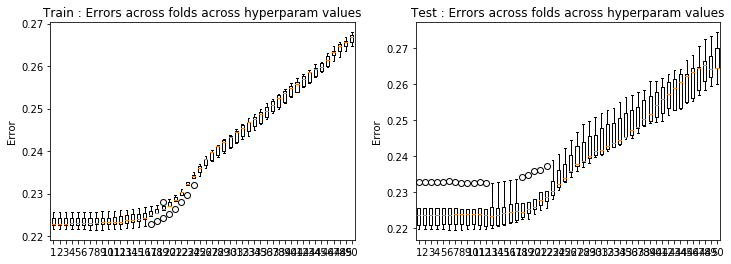

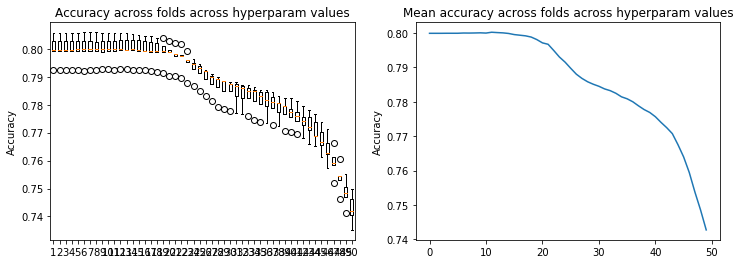

In [52]:
result_crossval(loss_tr30,loss_te30)
result_crossval_accuracy(acc30)

In [23]:
# test 31: degree 5, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr31, loss_te31, w31, acc31= cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 5, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -5.69685279e+00  1.21732187e-01 -4.26815508e+00
  4.54623473e+00  3.20361271e-01 -4.52893822e+00  1.67300537e+00
 -5.50092912e-02  9.41112565e-01 -1.61248389e-02 -3.74430301e-03
 -8.32623770e-01 -4.08392750e-04  5.37732199e-03  7.95354505e-02
 -4.20990038e-04 -8.23285048e-01 -9.17978966e-03  1.54949549e-04
  2.17741463e+01 -6.82453325e-02  1.81733194e+01 -1.41625134e+01
 -1.14201670e+00  1.93737226e+01 -3.58281391e+00  9.02706789e-02
 -2.13983263e-01 -2.69719749e-02 -2.62431806e-02  2.55208105e+00
 -7.22412144e-02  1.84006293e-04  3.33022203e-01 -3.78473491e-03
  3.71022260e+00  1.93635150e-01 -1.16351160e-02 -2.90928208e+01
 -1.86039400e+00 -3.29242520e+01  1.98829898e+01  2.12790120e+00
 -3.14866716e+01  4.05540324e+00  3.02109281e-01 -1.31445720e+00
  4.76774800e-02  4.2598

Ridge regression: w=[-2.75017660e-01 -5.75996747e+00  8.99758069e-02 -4.46402978e+00
  4.47342262e+00  2.72338390e-01 -3.54691284e+00  2.68965276e+00
 -9.38585344e-02  2.55148289e+00 -1.26358183e-02 -1.45153176e-02
 -1.24609541e+00 -1.79018132e-03  3.23377490e-03 -1.86280601e-02
 -1.97197765e-04 -7.37288742e-01 -7.64677211e-03 -1.64001371e-02
  2.21098036e+01  8.65097304e-02  1.92170616e+01 -1.35565195e+01
 -9.26455889e-01  1.57434958e+01 -5.70749262e+00  9.27203079e-02
 -5.66640772e+00 -3.05488079e-02 -1.37364170e-02  2.89291298e+00
 -6.73146452e-02  1.63048512e-02  9.22699154e-01  1.06120873e-02
  3.37098218e+00  1.91875805e-01  3.46233275e-03 -2.97159986e+01
 -2.11822578e+00 -3.49667555e+01  1.82798921e+01  1.67370300e+00
 -2.60599278e+01  6.56705444e+00  3.72920245e-01  7.57408484e+00
  2.67929008e-02  3.43087183e-02 -4.14360237e+00  2.59265006e-03
  1.05662783e-03 -2.96013161e+00  2.33492460e-03 -5.87986261e+00
  5.76147000e-03  4.25624632e-02  1.61636392e+01  2.92860708e+00
  2.8

Ridge regression: w=[-2.78727903e-01 -5.74597369e+00  1.37818159e-01 -4.04095679e+00
  4.49063663e+00  3.06009117e-01 -3.41445336e+00  1.89003278e+00
 -8.71177024e-02  1.55922263e+00 -1.61174543e-02  3.50799779e-03
 -5.21851573e-01 -6.20311088e-03 -3.67889341e-04 -2.21798477e-02
  5.57202440e-03 -7.48105923e-01 -7.20282278e-03 -1.87407714e-04
  2.21622252e+01 -1.39075912e-01  1.69555474e+01 -1.38691687e+01
 -1.08901417e+00  1.51478215e+01 -4.10457154e+00  7.63523832e-02
 -2.36689517e+00 -2.62885411e-02 -1.18546477e-02  1.31771323e+00
 -7.15171360e-02  1.05234694e-02  8.99634104e-01  7.24982047e-03
  3.36226575e+00  1.86838245e-01  4.87418896e-03 -2.99571781e+01
 -1.67118171e+00 -3.04229703e+01  1.93548192e+01  2.02736821e+00
 -2.50298224e+01  4.92086542e+00  3.79793378e-01  2.05858196e+00
  5.06447507e-02 -7.77269717e-03 -2.62323247e+00  1.09650895e-02
  1.20335982e-02 -2.86788476e+00  2.87532076e-03 -5.75112930e+00
  1.50426823e-02 -1.21827808e-02  1.64300749e+01  2.50418120e+00
  2.4

Ridge regression: w=[-2.78869241e-01 -5.73657929e+00  1.03654018e-01 -4.15058286e+00
  4.20191945e+00  2.39978209e-01 -3.12900358e+00  2.35543002e+00
 -6.53643027e-02  1.16662587e+00 -7.87562450e-03 -1.02225801e-04
 -1.35455208e+00 -8.62233509e-03  3.93173739e-03  6.23640356e-02
  5.85456834e-03 -9.23970598e-01 -6.48146105e-03 -1.01760872e-02
  2.19196154e+01 -5.98336874e-02  1.74837607e+01 -1.23027365e+01
 -7.71767952e-01  1.37476003e+01 -5.44628021e+00  8.88397438e-02
 -2.43365468e-01 -2.37109968e-02 -1.51043704e-02  3.92511996e+00
 -7.50682031e-02  1.05550288e-03  4.19788790e-01 -1.35993115e-03
  4.02669515e+00  1.88657683e-01 -1.42058887e-05 -2.92459395e+01
 -1.68513727e+00 -3.13767058e+01  1.62325968e+01  1.41267309e+00
 -2.23519831e+01  6.82409966e+00  3.07297196e-01 -1.89185922e+00
  1.65506698e-02  9.03190313e-04 -6.05713269e+00  1.65941096e-02
  1.20616074e-02 -1.78148841e+00 -1.43760809e-02 -6.74416835e+00
  3.49633678e-03  3.25592044e-02  1.57043919e+01  2.42584658e+00
  2.5

Ridge regression: w=[-2.76819763e-01 -5.72172883e+00  8.75296865e-02 -3.77751626e+00
  4.02581312e+00  2.12795976e-01 -2.34887921e+00  2.47427619e+00
 -7.38893562e-02  1.33404520e+00 -8.11987585e-03 -8.94013512e-03
 -8.30583717e-01 -1.69021827e-03  4.32468459e-04 -8.94338842e-02
  6.25098331e-03 -1.13938095e+00 -1.12038995e-02 -2.67032848e-03
  2.19795207e+01  1.18004479e-01  1.60196216e+01 -1.19443311e+01
 -5.65483744e-01  1.07275161e+01 -5.82697610e+00  8.91575534e-02
 -1.11206036e+00 -2.16010382e-02 -1.43190024e-02  2.00298933e+00
 -6.82566529e-02  4.22029286e-03  1.26794756e+00  4.93543188e-03
  5.16025511e+00  1.92031892e-01  4.34500178e-03 -2.94807769e+01
 -2.16773613e+00 -2.89205239e+01  1.60118682e+01  8.79338012e-01
 -1.77765701e+01  7.37592718e+00  3.33603377e-01 -1.39645213e-01
  1.50537084e-02  2.55086587e-02 -3.29141749e+00  4.47636235e-03
  2.51066186e-02 -3.63629352e+00  1.94317468e-03 -8.91960509e+00
  1.51474102e-02  9.10134970e-03  1.59510634e+01  2.92863425e+00
  2.3

Ridge regression: w=[-2.76431043e-01 -5.49170500e+00  1.21404527e-01 -3.64764885e+00
  3.57079991e+00  3.16944570e-01 -1.89179234e+00  1.15135656e+00
 -5.57456530e-02  6.59861736e-01 -1.60469204e-02 -3.75583559e-03
 -3.59645194e-01 -3.47739705e-06  5.83637987e-03  8.63601813e-02
  1.53433345e-04 -6.88552672e-01 -9.14609022e-03  6.17378382e-04
  2.07438643e+01 -6.69130677e-02  1.54501301e+01 -1.00662573e+01
 -1.12243395e+00  8.82993567e+00 -2.18555783e+00  8.92668652e-02
  2.14944707e-01 -2.68154357e-02 -2.60779068e-02  1.06345602e+00
 -7.23235220e-02  1.91995798e-05  2.95014543e-01 -4.35172052e-03
  3.09573572e+00  1.94184263e-01 -1.18689394e-02 -2.70264789e+01
 -1.86276833e+00 -2.79944550e+01  1.30946230e+01  2.08209679e+00
 -1.46348891e+01  2.02673885e+00  3.02927040e-01 -1.55858648e+00
  4.76484133e-02  4.67331744e-03 -1.90278404e+00 -1.65369560e-03
  1.08221165e-02 -1.57049751e+00  8.49168304e-03 -5.35940582e+00
  8.51553021e-03 -9.49208046e-03  1.37857481e+01  2.78875779e+00
  2.2

Ridge regression: w=[-2.75017591e-01 -5.46705771e+00  8.96168326e-02 -3.59284868e+00
  3.23791382e+00  2.69837380e-01 -1.05223250e+00  1.36761145e+00
 -9.44113096e-02  1.29444880e+00 -1.25191397e-02 -1.46656241e-02
 -4.05243385e-01 -1.52799495e-03  3.23431126e-03 -4.85390065e-03
  4.00529652e-04 -5.61461575e-01 -7.50889429e-03 -1.61150979e-02
  2.06498094e+01  8.50675010e-02  1.53979671e+01 -8.47134699e+00
 -9.11127165e-01  5.77387254e+00 -2.33156139e+00  9.17017367e-02
 -2.22584712e+00 -3.03455503e-02 -1.37076620e-02  7.99367115e-01
 -6.74034864e-02  1.61744555e-02  8.44575416e-01  1.02858893e-02
  2.56372190e+00  1.92427700e-01  3.00000212e-03 -2.68018217e+01
 -2.10984188e+00 -2.80421074e+01  9.97478114e+00  1.63493916e+00
 -1.01431618e+01  1.87416906e+00  3.73579188e-01  2.77161875e+00
  2.68360954e-02  3.46028685e-02 -1.34049173e+00  2.35374590e-03
  1.11137656e-03 -2.78693698e+00  1.30918557e-03 -4.42682517e+00
  5.34400768e-03  4.25226474e-02  1.35071475e+01  2.91267020e+00
  2.3

Ridge regression: w=[-2.78727802e-01 -5.28816209e+00  1.38136959e-01 -3.07780028e+00
  2.94427044e+00  2.99719006e-01 -7.38135125e-01  9.90308064e-01
 -8.84876413e-02  8.89288587e-01 -1.60452066e-02  3.85406623e-03
  2.59525767e-02 -5.85112291e-03  6.87733543e-04 -4.37406256e-03
  6.23639494e-03 -5.22662495e-01 -6.99237529e-03  7.48914191e-04
  1.98947092e+01 -1.45643776e-01  1.27646189e+01 -7.48513517e+00
 -1.04969701e+00  4.44259159e+00 -1.73080601e+00  7.47094154e-02
 -7.92613250e-01 -2.61079107e-02 -1.17894919e-02 -8.86894585e-02
 -7.15040648e-02  1.00938901e-02  7.99711706e-01  6.65589526e-03
  2.33422792e+00  1.87608931e-01  3.90099410e-03 -2.54750070e+01
 -1.64853808e+00 -2.28673905e+01  8.91673042e+00  1.92972799e+00
 -7.93465496e+00  1.53216535e+00  3.82299417e-01  1.32116549e-01
  5.08179327e-02 -8.35530670e-03 -6.60231464e-01  1.06384474e-02
  9.95207832e-03 -2.64527677e+00  2.04895348e-03 -3.91107058e+00
  1.46395713e-02 -1.30655198e-02  1.23827133e+01  2.47092194e+00
  1.8

Ridge regression: w=[-2.78869094e-01 -5.15685340e+00  1.07661662e-01 -2.93843024e+00
  2.52449955e+00  2.35233002e-01 -5.48521743e-01  1.09036584e+00
 -6.65976650e-02  6.74164587e-01 -7.63317386e-03 -1.17985030e-04
 -2.71058069e-01 -8.05592469e-03  4.63037992e-03  8.02234150e-02
  6.80352254e-03 -5.82046294e-01 -6.32914587e-03 -9.12794841e-03
  1.90754877e+01 -8.72510446e-02  1.21827425e+01 -5.55444410e+00
 -7.40407676e-01  3.43599686e+00 -2.12680722e+00  8.73487553e-02
  1.45318596e-01 -2.37499102e-02 -1.47089575e-02  7.39397775e-01
 -7.52979366e-02  9.26529622e-04  3.20087358e-01 -2.32978718e-03
  2.47580956e+00  1.89563391e-01 -3.98049075e-04 -2.36652537e+01
 -1.62002259e+00 -2.17805785e+01  5.44282532e+00  1.33319806e+00
 -5.90429847e+00  2.11484318e+00  3.10778867e-01 -1.58038234e+00
  1.66413629e-02  1.27664558e-03 -1.42352837e+00  1.53949409e-02
  1.07057508e-02 -1.55806706e+00 -1.56190166e-02 -3.98401229e+00
  3.00715354e-03  3.15662942e-02  1.06906641e+01  2.35328444e+00
  1.7

Ridge regression: w=[-2.76819550e-01 -4.93548212e+00  9.70735363e-02 -2.44382471e+00
  2.12877897e+00  2.10098347e-01 -1.69569103e-01  9.89576870e-01
 -7.55466967e-02  6.17039971e-01 -7.80501224e-03 -8.77217493e-03
  3.71869784e-02 -1.42910539e-03  1.18331650e-03 -4.29581515e-02
  6.67313933e-03 -5.83471823e-01 -1.10292200e-02 -1.69097811e-03
  1.81198519e+01  5.06997614e-02  1.02025233e+01 -4.37108672e+00
 -5.41787599e-01  2.03787053e+00 -1.94385640e+00  8.77015527e-02
 -5.85029820e-02 -2.11420268e-02 -1.42490718e-02 -6.79681440e-02
 -6.82217046e-02  3.63695087e-03  1.01046489e+00  3.54940661e-03
  2.62811420e+00  1.93211864e-01  3.44853859e-03 -2.19292053e+01
 -2.00360853e+00 -1.83924515e+01  3.98548567e+00  8.10927514e-01
 -3.95379495e+00  1.87966237e+00  3.38222861e-01 -8.14221625e-01
  1.51576701e-02  2.49780769e-02 -5.96986517e-01  4.43257774e-03
  2.32519922e-02 -3.06390921e+00  2.02259625e-03 -4.40303566e+00
  1.48218149e-02  8.12926580e-03  9.19278908e+00  2.75086236e+00
  1.4

Ridge regression: w=[-2.76430592e-01 -4.37989069e+00  1.44813102e-01 -1.85371661e+00
  1.48394556e+00  2.90027396e-01  3.96297916e-02  6.77144662e-01
 -5.86130676e-02  5.75478166e-01 -1.62063359e-02 -2.90009168e-03
  7.17584995e-03  6.30547636e-04  7.26521460e-03  1.27057731e-01
  1.31129980e-03 -2.52292024e-01 -8.87847467e-03  1.88040241e-03
  1.53592922e+01 -2.11874660e-01  7.58853341e+00 -2.17742364e+00
 -9.68053025e-01  1.12012569e+00 -9.56690699e-01  8.78960972e-02
 -8.66504706e-02 -2.60462060e-02 -2.47689290e-02 -8.47973487e-03
 -7.23831336e-02  3.84696036e-04  6.65315435e-02 -5.62105149e-03
  1.12790153e+00  1.96030982e-01 -1.19758754e-02 -1.66032080e+01
 -1.52929567e+00 -1.36779290e+01  1.18014092e+00  1.72246289e+00
 -2.38035519e+00  3.20691453e-01  3.13580125e-01 -6.29106203e-01
  4.84784384e-02  3.59020510e-03 -3.29225936e-01 -2.26060328e-03
  8.21803259e-03 -1.05112045e+00  6.43755137e-03 -1.87162361e+00
  7.97905001e-03 -1.09272353e-02  4.52596653e+00  2.44241136e+00
  1.0

Ridge regression: w=[-2.75016939e-01 -4.13563102e+00  1.25073863e-01 -1.57055105e+00
  1.26030027e+00  2.40606064e-01  3.11443125e-01  7.71064951e-01
 -9.51196692e-02  6.66180375e-01 -1.26677753e-02 -1.45228333e-02
 -2.83600224e-02 -1.09083536e-03  3.74008925e-03  7.65123739e-02
  1.88574013e-03 -1.65526511e-01 -7.27323299e-03 -1.52633939e-02
  1.42473789e+01 -1.38184730e-01  6.50194833e+00 -1.44571966e+00
 -7.46534389e-01  3.18221809e-01 -9.18895829e-01  9.10118724e-02
 -4.36544627e-01 -2.97454597e-02 -1.25608336e-02 -1.12350313e-01
 -6.72928181e-02  1.63462398e-02  3.90437105e-01  9.75063813e-03
  7.78143984e-01  1.94239882e-01  2.73512434e-03 -1.44850587e+01
 -1.59156623e+00 -1.17435646e+01  6.06802056e-04  1.25366225e+00
 -1.47314763e+00  7.52302914e-02  3.81331498e-01  1.94551774e-01
  2.77666197e-02  3.37314368e-02 -1.63553956e-01  2.56202436e-03
  1.17481008e-04 -1.77303220e+00 -1.26853776e-03 -1.25866156e+00
  4.93351953e-03  4.21427480e-02  2.62754152e+00  2.37788194e+00
  8.9

Ridge regression: w=[-2.78726839e-01 -3.80862796e+00  1.77623997e-01 -1.28353089e+00
  1.06925987e+00  2.52888873e-01  3.37256647e-01  5.48994798e-01
 -9.03922574e-02  6.41633649e-01 -1.61525292e-02  4.59758696e-03
  2.45084421e-01 -5.30687459e-03  2.77822284e-03  9.19072352e-02
  6.83902243e-03 -1.51832596e-01 -6.48360507e-03  2.42055962e-03
  1.28043362e+01 -3.93734070e-01  4.91767080e+00 -9.54716749e-01
 -7.83308159e-01  1.14539737e-01 -6.59382361e-01  7.42042273e-02
 -3.77267333e-01 -2.55071480e-02 -1.04110120e-02 -5.71316040e-01
 -7.11096846e-02  9.83686498e-03  2.66141975e-01  5.51183961e-03
  6.73259034e-01  1.89561881e-01  3.07358681e-03 -1.19049510e+01
 -1.07156888e+00 -8.51414669e+00 -1.36041677e-01  1.31184331e+00
 -1.02622210e+00  1.46022872e-01  3.93835416e-01 -1.95755083e-01
  5.15346117e-02 -9.88293821e-03 -4.70929735e-02  1.05839022e-02
  5.46549618e-03 -1.45331591e+00  1.22995143e-03 -9.77447334e-01
  1.39706399e-02 -1.53122153e-02  4.62049612e-01  1.87570967e+00
  6.0

Ridge regression: w=[-2.78867690e-01 -3.60073969e+00  1.57471557e-01 -1.11383679e+00
  9.63079207e-01  1.95920111e-01  2.60271051e-01  4.84114001e-01
 -6.78441512e-02  5.73047845e-01 -7.42024538e-03  1.86004930e-04
  1.22484958e-01 -7.15261112e-03  5.77261483e-03  1.50204644e-01
  8.00159395e-03 -1.83876890e-01 -5.82210182e-03 -7.17074262e-03
  1.17529593e+01 -3.94074132e-01  4.14119934e+00 -6.12370729e-01
 -5.12027061e-01  1.98284289e-01 -6.73939977e-01  8.78663769e-02
 -2.68806898e-01 -2.36268150e-02 -1.30372028e-02 -2.27593359e-01
 -7.53870175e-02  1.31173496e-03 -6.57097820e-02 -3.82416647e-03
  7.02961257e-01  1.91761983e-01 -2.29680439e-04 -9.87223305e+00
 -9.16148416e-01 -6.96249760e+00 -6.19894605e-01  7.97264151e-01
 -7.69421069e-01  2.45951905e-01  3.23519867e-01 -4.04905198e-01
  1.71863710e-02  9.68477817e-04 -1.71082949e-01  1.39419325e-02
  8.85396254e-03 -6.86445000e-01 -1.75877143e-02 -8.71687589e-01
  1.86558174e-03  2.85258369e-02 -1.26936464e+00  1.63392782e+00
  4.5

Ridge regression: w=[-2.76817521e-01 -3.34943776e+00  1.73448008e-01 -8.48114513e-01
  7.78510775e-01  1.81437292e-01  3.57360794e-01  4.43152993e-01
 -7.61093026e-02  4.58738999e-01 -7.54997260e-03 -8.10736588e-03
  2.78511177e-01 -9.28077467e-04  2.09846663e-03  1.10929400e-01
  6.97620606e-03 -1.34231253e-01 -1.06265454e-02 -4.68563589e-04
  1.07370520e+01 -4.19325404e-01  3.13056747e+00 -3.05268601e-01
 -3.76261471e-01 -1.12488477e-01 -6.44597502e-01  8.99058000e-02
 -1.32954133e-01 -2.03512246e-02 -1.31065373e-02 -5.26313704e-01
 -6.80437599e-02  3.45116678e-03  1.76079320e-01  2.06813607e-03
  6.08415285e-01  1.95391927e-01  3.24998181e-03 -8.19922265e+00
 -9.31103931e-01 -5.24555556e+00 -6.38195916e-01  4.25163995e-01
 -4.90252225e-01  2.40041745e-01  3.50365095e-01 -2.75330814e-01
  1.56345343e-02  2.33067555e-02 -7.41277806e-02  4.59700167e-03
  2.12435404e-02 -1.22478797e+00  2.37886880e-03 -8.34964935e-01
  1.41680785e-02  6.41345816e-03 -2.56274629e+00  1.66881076e+00
  3.1

Ridge regression: w=[-2.76426294e-01 -2.91348959e+00  2.23676700e-01 -6.49172238e-01
  5.65771321e-01  2.06231389e-01  3.24045161e-01  3.56583346e-01
 -6.04664820e-02  4.55987106e-01 -1.64907543e-02 -1.72830409e-03
  1.70338476e-01  1.04007679e-03  8.36895636e-03  1.94633871e-01
  1.70399150e-03 -4.00157141e-02 -8.23540487e-03  2.74964422e-03
  8.99829891e+00 -7.02806505e-01  2.09828503e+00  1.39166751e-01
 -4.93699370e-01 -1.09096007e-01 -4.33776408e-01  9.11838293e-02
 -1.39114445e-01 -2.50131575e-02 -2.28729627e-02 -2.72862936e-01
 -7.24133090e-02  1.25106907e-03 -2.97258700e-01 -6.37335555e-03
  2.17084797e-01  1.98574961e-01 -1.14721117e-02 -5.55257349e+00
 -3.90825344e-01 -3.15720144e+00 -6.77243102e-01  6.29370484e-01
 -3.12711313e-01  7.31545033e-03  3.29592334e-01 -2.21672721e-01
  4.96489622e-02  1.31572258e-03 -8.38179965e-02 -2.52270183e-03
  6.57606947e-03 -2.18039283e-01  5.69642417e-03 -3.09371552e-01
  6.75279985e-03 -1.19467109e-02 -4.35839597e+00  1.27584831e+00
  1.2

Ridge regression: w=[-2.75010711e-01 -2.69442419e+00  2.07400536e-01 -5.61683707e-01
  5.12441493e-01  1.72924048e-01  4.10937241e-01  4.23043304e-01
 -9.43558907e-02  4.37840279e-01 -1.30923477e-02 -1.40833646e-02
  1.25227282e-01 -6.96799630e-04  4.39890234e-03  1.91806710e-01
  2.50475882e-03 -1.34245126e-02 -7.04243595e-03 -1.46699978e-02
  8.30305350e+00 -6.70872389e-01  1.82625469e+00  1.40572840e-01
 -3.71301240e-01 -2.85685806e-01 -4.26952236e-01  9.52054014e-02
 -5.98613285e-02 -2.86875707e-02 -1.10971116e-02 -2.99524740e-01
 -6.75182675e-02  1.68191053e-02 -2.33508790e-01  9.36265944e-03
  1.51756247e-01  1.96847695e-01  3.35524102e-03 -4.74249187e+00
 -3.29221322e-01 -2.57610903e+00 -6.65904548e-01  3.99602243e-01
 -2.19000542e-01 -5.86234221e-02  3.90592380e-01 -1.65380038e-01
  2.91879770e-02  3.18552989e-02 -3.19498207e-02  2.48466247e-03
 -5.56730252e-04 -3.66944109e-01 -2.18614169e-03 -2.19173118e-01
  4.61071343e-03  4.19122642e-02 -4.71422295e+00  1.06955384e+00
  5.9

Ridge regression: w=[-2.78717647e-01 -2.44451059e+00  2.29198817e-01 -6.05628785e-01
  4.18102228e-01  1.74676268e-01  3.75275956e-01  2.90043207e-01
 -9.08660434e-02  4.80174466e-01 -1.63027775e-02  4.76881319e-03
  2.55285213e-01 -4.55145495e-03  3.56862562e-03  1.89692579e-01
  6.75168125e-03 -2.00228973e-02 -5.73742545e-03  2.74512656e-03
  7.54839294e+00 -7.67453858e-01  1.70634011e+00  3.82356513e-01
 -3.53826060e-01 -2.40294584e-01 -2.60536469e-01  7.85642021e-02
 -1.85965444e-01 -2.46908823e-02 -9.15425438e-03 -4.83147795e-01
 -7.14232997e-02  1.04559257e-02 -2.62658580e-01  4.78729383e-03
  1.73067419e-01  1.92481208e-01  3.23668131e-03 -4.02022146e+00
 -1.27402306e-01 -1.99124620e+00 -6.70460417e-01  3.41444832e-01
 -1.63739634e-01 -2.15643253e-02  4.03562836e-01 -1.85267892e-01
  5.17760939e-02 -1.04369638e-02 -3.18670232e-02  9.08324506e-03
  4.12784281e-03 -2.35378779e-01  1.21722652e-03 -2.11018509e-01
  1.25094154e-02 -1.55602958e-02 -4.83662534e+00  8.53434323e-01
 -7.6

Ridge regression: w=[-2.78854296e-01 -2.20767939e+00  1.94065677e-01 -6.00680722e-01
  3.75772876e-01  1.44852470e-01  3.05264115e-01  1.79477032e-01
 -6.79984440e-02  3.99746351e-01 -7.88710096e-03  1.21689710e-03
  1.98127441e-01 -6.54861993e-03  6.99912175e-03  1.94928619e-01
  8.08829172e-03 -4.88482769e-02 -4.85475778e-03 -6.28514120e-03
  6.83634856e+00 -7.00730079e-01  1.66817883e+00  4.03805228e-01
 -2.28991581e-01 -7.80851561e-02 -1.96612632e-01  9.28652926e-02
 -1.53011250e-01 -2.24045898e-02 -1.13034229e-02 -2.77641617e-01
 -7.59857005e-02  1.97106000e-03 -3.03225255e-01 -4.36678842e-03
  2.20596748e-01  1.95089623e-01  8.47213301e-04 -3.42052852e+00
 -8.74336422e-02 -1.73443841e+00 -6.48125321e-01  1.57040238e-01
 -1.82850608e-01  1.20753091e-02  3.33248891e-01 -1.69590138e-01
  1.86373578e-02 -9.93277385e-04 -7.28675244e-02  1.22855199e-02
  7.06909903e-03 -8.41117229e-02 -1.75789687e-02 -1.95125107e-01
 -1.85161077e-04  2.71698011e-02 -4.73716212e+00  6.97599504e-01
 -4.9

Ridge regression: w=[-2.76798159e-01 -1.91335291e+00  2.02197727e-01 -5.29777702e-01
  2.44204413e-01  1.49130393e-01  3.05085350e-01  1.80578739e-01
 -7.53405172e-02  3.32890882e-01 -8.23961651e-03 -6.48122260e-03
  2.37868217e-01 -8.56322561e-05  2.89522192e-03  1.92058317e-01
  6.34836807e-03 -5.28254294e-03 -9.86866452e-03  5.72648132e-04
  6.05227080e+00 -7.18479193e-01  1.50874313e+00  5.49098272e-01
 -2.13943536e-01 -1.27540541e-01 -2.12069680e-01  9.46443946e-02
 -2.93532149e-02 -1.89282805e-02 -1.19044370e-02 -3.38529570e-01
 -6.87099075e-02  3.98952186e-03 -2.58226238e-01  1.52008056e-03
  1.46505794e-01  1.99274156e-01  4.27676974e-03 -2.94192274e+00
 -6.69293680e-02 -1.49774146e+00 -5.96779990e-01  8.22358890e-02
 -1.30921640e-01  3.67445378e-02  3.55411145e-01 -1.68197759e-01
  1.78324001e-02  1.97230121e-02 -7.86238315e-02  2.69898199e-03
  2.08452681e-02 -1.74564389e-01  4.92394011e-03 -1.82158036e-01
  1.27129035e-02  5.77681449e-03 -4.41520874e+00  6.62102228e-01
 -7.2

Ridge regression: w=[-2.76385290e-01 -1.29969436e+00  1.89194088e-01 -4.55825849e-01
  1.02036073e-01  1.49388969e-01  2.72006701e-01  1.26375777e-01
 -5.81086354e-02  3.19997780e-01 -1.71759636e-02 -2.66873545e-04
  1.64324061e-01  1.79930973e-03  8.55283356e-03  1.90177948e-01
  1.08382076e-04  2.11980464e-02 -6.92333429e-03  2.49890158e-03
  4.42405581e+00 -7.33735388e-01  1.28919806e+00  6.73285457e-01
 -2.25318615e-01 -6.77159360e-02 -1.10151459e-01  9.40746784e-02
 -2.63920571e-03 -2.34119331e-02 -2.04049039e-02 -1.65194594e-01
 -7.27485343e-02  2.93532559e-03 -3.01301058e-01 -6.90061580e-03
  3.06769536e-02  2.03404687e-01 -9.40426928e-03 -2.07832718e+00
  4.80936289e-02 -1.17690894e+00 -4.86184144e-01  9.24143708e-02
 -1.30536989e-01 -1.47790782e-02  3.25211292e-01 -1.56657600e-01
  5.29728214e-02 -3.94612056e-03 -9.70579947e-02 -5.64632969e-03
  6.42578285e-03 -1.29767251e-02  9.29256114e-03 -7.70126242e-02
  4.19164732e-03 -1.12129583e-02 -3.47858407e+00  5.51953614e-01
 -9.4

Ridge regression: w=[-2.74951306e-01 -9.81700134e-01  1.53833732e-01 -3.24727050e-01
  3.66642423e-02  1.27995283e-01  2.97408123e-01  1.69518801e-01
 -8.51641282e-02  3.18868205e-01 -1.44636943e-02 -1.30961869e-02
  1.07154649e-01  3.16341142e-04  4.84865252e-03  1.88696162e-01
  1.42498758e-03  4.13761671e-02 -6.42720277e-03 -1.37163740e-02
  3.62922283e+00 -6.24792485e-01  1.08510243e+00  6.06542242e-01
 -1.83698798e-01 -8.92183225e-02 -8.97094435e-02  9.73499154e-02
  3.78438421e-02 -2.61748363e-02 -8.92105685e-03 -1.44374383e-01
 -6.90659733e-02  1.83467421e-02 -2.65975956e-01  8.32081523e-03
  6.30277540e-03  2.02879860e-01  6.21803553e-03 -1.72416679e+00
 -5.54726665e-03 -1.07440468e+00 -3.87636659e-01  6.81388904e-02
 -1.41108106e-01 -6.33886105e-02  3.65557958e-01 -1.64994688e-01
  3.47095567e-02  2.73840538e-02 -6.61283525e-02 -9.87488303e-04
  1.03999684e-03 -5.63362921e-02  1.10843840e-03 -7.31908936e-02
  3.27818914e-03  4.07770788e-02 -2.92780160e+00  4.16510211e-01
 -9.2

Ridge regression: w=[-2.78629976e-01 -6.99766511e-01  1.44409613e-01 -2.93398178e-01
  3.24449963e-03  1.24742403e-01  2.88243070e-01  1.22159802e-01
 -7.71994811e-02  3.39238885e-01 -1.62061624e-02  4.03608622e-03
  1.31894780e-01 -2.90138903e-03  3.17931732e-03  1.69350880e-01
  5.87009078e-03  5.09830609e-02 -3.89660719e-03  9.29729913e-04
  2.91845849e+00 -5.87217333e-01  9.46481764e-01  6.12131402e-01
 -1.62204066e-01 -7.85431211e-02 -3.46445121e-02  8.01320837e-02
 -1.54364952e-02 -2.34795810e-02 -8.32319882e-03 -1.59269589e-01
 -7.36122341e-02  1.22982749e-02 -2.24522514e-01  3.62693202e-03
  3.21032046e-03  1.99591756e-01  5.68405651e-03 -1.41988089e+00
 -1.74035770e-02 -9.25729602e-01 -3.40883653e-01  3.59250193e-02
 -1.31775472e-01 -4.22972640e-02  3.64000539e-01 -1.64685142e-01
  5.19220683e-02 -1.00056341e-02 -7.94565901e-02  3.68139413e-03
  6.18628998e-03 -4.36812941e-02  2.55064829e-03 -9.52472825e-02
  7.86231514e-03 -1.07992531e-02 -2.41237720e+00  3.42022637e-01
 -8.7

Ridge regression: w=[-2.78726575e-01 -4.48399350e-01  9.68322972e-02 -1.80831285e-01
 -1.62803771e-02  1.14530091e-01  2.86867436e-01  5.78995975e-02
 -4.97158098e-02  2.81168463e-01 -9.35555785e-03  3.42131025e-03
  1.22321964e-01 -5.16416111e-03  9.98906800e-03  1.59267190e-01
  6.83120615e-03  3.55450651e-02 -2.97438229e-03 -4.95900033e-03
  2.27108447e+00 -4.73342306e-01  7.33086174e-01  5.10518045e-01
 -1.15237229e-01 -4.95945615e-02 -2.18704962e-02  9.22372984e-02
 -8.24860329e-03 -2.03419237e-02 -8.02466104e-03 -9.46415350e-02
 -7.74253245e-02  3.83950201e-03 -1.92129910e-01 -4.85629157e-03
  2.01484318e-02  2.01971412e-01  4.77814103e-03 -1.12535917e+00
 -5.32021212e-02 -8.35791503e-01 -2.46703037e-01 -1.31322341e-02
 -1.61582926e-01 -1.75127350e-02  2.82752108e-01 -1.26059623e-01
  2.27160155e-02 -5.08415024e-03 -7.76857439e-02  7.56930161e-03
  2.27414999e-03 -4.57941392e-02 -1.39390392e-02 -8.27189271e-02
 -4.95661513e-03  2.62805887e-02 -1.92658687e+00  2.45504337e-01
 -7.8

Ridge regression: w=[-2.76613567e-01 -2.27470557e-01  8.52999292e-02 -7.19124757e-02
 -5.17466516e-02  1.16236167e-01  2.56665991e-01  5.16247745e-02
 -4.71350886e-02  2.65501354e-01 -9.74032572e-03 -3.32073874e-03
  1.38119576e-01  1.94528229e-03  6.14250995e-03  1.55577766e-01
  5.36346468e-03  5.79827128e-02 -8.65845085e-03  3.15431392e-03
  1.71914343e+00 -4.37108593e-01  5.07756238e-01  4.43429893e-01
 -1.13165265e-01 -4.19218891e-02 -1.71639297e-02  8.97510151e-02
  1.75767020e-02 -1.75759156e-02 -1.02358918e-02 -1.01370018e-01
 -6.97372909e-02  4.83262766e-03 -1.65349842e-01  9.07732540e-04
 -6.11147237e-03  2.06516357e-01  6.95586452e-03 -9.07297851e-01
 -7.58531325e-02 -7.42184883e-01 -1.62923582e-01 -2.13665843e-02
 -1.30933685e-01 -9.30391453e-04  2.68041837e-01 -1.19631985e-01
  2.43622842e-02  1.25369949e-02 -9.78407737e-02 -3.95914953e-03
  1.64910585e-02 -7.58751752e-02  9.35535585e-03 -8.48968444e-02
  9.96763057e-03  4.31471349e-03 -1.50462480e+00  2.06294763e-01
 -6.4

Ridge regression: w=[-2.75994690e-01  8.21274343e-02  3.80886124e-02  2.96852909e-02
 -1.10468095e-02  1.03808292e-01  2.35879552e-01  2.45700942e-02
 -1.67531459e-02  2.56260713e-01 -1.54036785e-02  9.19888079e-04
  1.30246590e-01  2.77750749e-03  9.89995059e-03  1.27889046e-01
 -3.33081610e-04  4.71137772e-02 -5.53936755e-03  1.84447162e-03
  9.12969167e-01 -3.45926076e-01  1.76847817e-01  2.90121323e-01
 -9.37672428e-02 -2.84187257e-02  1.42013031e-05  8.14720343e-02
  2.19640046e-02 -2.31073016e-02 -1.76182197e-02 -5.99229497e-02
 -7.17668203e-02  5.20115045e-03 -1.28684618e-01 -7.71873884e-03
 -1.56030715e-02  2.07471505e-01 -5.97426210e-03 -5.66221926e-01
 -7.60554024e-02 -5.44643695e-01 -6.53595989e-02 -3.07281412e-02
 -1.18994196e-01 -7.99720625e-03  1.88615464e-01 -9.72676539e-02
  5.12945990e-02 -7.75116443e-03 -9.40089654e-02 -9.78414735e-03
  3.63844203e-03 -5.49579277e-02  9.85148180e-03 -4.87902997e-02
  1.29331267e-03 -7.65544741e-03 -8.74491632e-01  1.39151852e-01
 -4.0

Ridge regression: w=[-2.74385815e-01  1.86842476e-01  1.93830045e-02  8.88057003e-02
  6.20682536e-04  8.44364525e-02  2.39854630e-01  2.90084977e-02
 -2.66762469e-02  2.46569742e-01 -1.28331169e-02 -9.56090708e-03
  1.11201001e-01  1.39732812e-03  6.69165595e-03  1.28920404e-01
  4.41374325e-04  5.86215013e-02 -5.99571210e-03 -7.85168258e-03
  6.48768691e-01 -2.92425308e-01  5.32100634e-02  2.10159409e-01
 -6.53245525e-02 -2.72421040e-02  3.55358018e-03  8.23841497e-02
  2.52147716e-02 -2.52206456e-02 -7.33014178e-03 -5.03252708e-02
 -6.92616886e-02  1.91718025e-02 -1.17465013e-01  7.04448401e-03
 -2.25922625e-02  2.05882218e-01  8.71382148e-03 -4.54513552e-01
 -1.09727390e-01 -4.82682400e-01 -3.90783061e-02 -2.08697204e-02
 -1.19076272e-01 -2.11098880e-02  1.78924075e-01 -9.20304795e-02
  3.32423433e-02  1.74809671e-02 -7.85644585e-02 -5.33888331e-03
  3.05849923e-04 -7.39931362e-02  5.18255142e-03 -5.40776311e-02
  2.42818912e-03  2.79330180e-02 -6.64418330e-01  8.68214458e-02
 -3.1

Ridge regression: w=[-2.77796279e-01  2.45716200e-01  1.08581588e-02  7.39292527e-02
  2.90275890e-02  8.44699131e-02  2.25826493e-01  8.92331114e-03
 -1.06859101e-02  2.41544222e-01 -1.11403309e-02  2.65452603e-03
  1.14546419e-01 -1.45020410e-03  4.63882985e-03  1.11667740e-01
  5.02312741e-03  6.47446631e-02 -2.63486914e-03 -9.69400295e-04
  4.69651615e-01 -2.67775779e-01  9.70149245e-05  1.71290419e-01
 -5.97913357e-02 -1.74107570e-02  1.64986778e-02  6.39308123e-02
  1.64970622e-02 -2.40682743e-02 -8.00813023e-03 -4.71302888e-02
 -7.34309752e-02  1.27190660e-02 -8.98425616e-02  2.92452091e-03
 -3.32427353e-02  2.00290151e-01  8.00626818e-03 -3.66411199e-01
 -1.22262410e-01 -3.95791915e-01 -3.14743721e-02 -3.39636271e-02
 -1.02004645e-01 -9.46498141e-04  1.51723869e-01 -8.65600994e-02
  3.94765077e-02 -6.75939413e-03 -7.87009413e-02 -1.40201581e-03
  2.96717097e-03 -6.30955614e-02  3.08703780e-03 -6.77646167e-02
  4.49661271e-03 -5.02835717e-03 -5.12515670e-01  6.22681133e-02
 -2.4

Ridge regression: w=[-2.77513851e-01  2.87990216e-01 -1.76646431e-02  8.39420174e-02
  5.48340313e-02  8.56117653e-02  2.15176373e-01 -1.71213370e-02
  6.68374333e-03  2.15506681e-01 -7.10960230e-03  3.90022205e-03
  1.09850708e-01 -3.52893482e-03  1.20124029e-02  1.04577139e-01
  3.68809604e-03  5.15357219e-02 -3.03828957e-03  3.49700418e-04
  3.38396839e-01 -2.22276579e-01 -5.59113418e-02  1.27616780e-01
 -5.15658946e-02 -9.60224407e-03  1.10888772e-02  7.16805693e-02
  2.16330544e-02 -2.08598224e-02 -6.17418054e-03 -2.45315340e-02
 -7.51254682e-02  4.57760441e-03 -7.75060643e-02 -4.38680255e-03
 -2.25226665e-02  1.99119063e-01  6.88384623e-03 -2.93758334e-01
 -1.18053352e-01 -3.46169309e-01 -2.28323580e-02 -4.52199237e-02
 -9.82991427e-02  8.84630597e-03  1.05210425e-01 -6.64142895e-02
  1.76852896e-02 -4.56549250e-03 -6.32053494e-02  1.82108249e-03
 -2.00486869e-03 -6.26253919e-02 -4.85510452e-03 -5.41551918e-02
 -4.65784731e-03  1.31071443e-02 -3.99408579e-01  3.96236578e-02
 -1.8

Ridge regression: w=[-2.74864686e-01  3.10069417e-01 -3.04166490e-02  8.40183247e-02
  6.52768402e-02  8.27124728e-02  1.83668311e-01 -1.62731400e-02
  1.00540405e-02  2.05466422e-01 -6.18263714e-03 -1.55647147e-04
  1.08049382e-01  2.25672980e-03  1.12003541e-02  9.97468349e-02
  6.31829251e-03  5.51103286e-02 -7.50983871e-03  5.59117873e-03
  2.42480871e-01 -2.05858637e-01 -9.06885388e-02  1.01349594e-01
 -4.60301893e-02  5.80547940e-03  1.48687141e-02  6.46039557e-02
  3.27373152e-02 -1.86656626e-02 -8.29047769e-03 -2.46885560e-02
 -6.69079060e-02  4.68901948e-03 -7.03457640e-02  9.11153285e-04
 -2.26863877e-02  1.99707713e-01  7.40212607e-03 -2.44547080e-01
 -1.16451794e-01 -3.01150603e-01 -1.45354945e-02 -4.30484465e-02
 -6.76565494e-02  1.60229279e-02  8.52928444e-02 -5.43300126e-02
  1.73518067e-02  5.24957580e-03 -6.45482365e-02 -7.02688153e-03
  4.54203698e-03 -6.62875088e-02  6.49262315e-03 -5.17679557e-02
  7.73024215e-03  9.06753783e-04 -3.15752644e-01  3.13387268e-02
 -1.4

Ridge regression: w=[-2.72322769e-01  3.02899730e-01 -7.00824870e-02  4.86833791e-02
  1.08523157e-01  6.51506708e-02  1.48998339e-01 -2.86377316e-02
  2.71322789e-02  1.78133500e-01 -4.27273983e-03 -7.22005551e-04
  9.02064901e-02  8.43570524e-04  1.02607137e-02  6.87087185e-02
  1.17320097e-03  3.73461375e-02 -4.88244140e-03 -2.36428041e-06
  1.39145359e-01 -1.58887998e-01 -1.08342841e-01  7.54980255e-02
 -3.26066510e-02  2.47015977e-02  4.42137146e-03  5.17294747e-02
  4.85644001e-02 -2.30744852e-02 -1.38664415e-02 -2.37462402e-03
 -6.34439564e-02  4.90227308e-03 -4.08239745e-02 -6.94179471e-03
 -8.89011546e-03  1.88771940e-01 -3.75290299e-03 -1.56492286e-01
 -8.36821548e-02 -2.07093803e-01 -1.00998747e-02 -3.37087193e-02
 -3.53463687e-02  1.13064466e-02  5.58888553e-02 -2.69696519e-02
  2.22952563e-02 -2.47483300e-03 -4.03940568e-02 -7.41010957e-03
 -3.79682573e-04 -4.10092133e-02  4.66304644e-03 -2.72710403e-02
  8.14289136e-04 -2.27561194e-03 -2.04817355e-01  2.42996636e-02
 -8.3

Ridge regression: w=[-2.69105205e-01  2.90615146e-01 -8.16274301e-02  4.98415698e-02
  1.06991024e-01  5.16520249e-02  1.42339606e-01 -3.08109356e-02
  2.20826702e-02  1.59650090e-01 -4.58393694e-03 -4.60735415e-03
  7.60913041e-02 -4.92581358e-04  7.70044346e-03  6.35230437e-02
  1.14243753e-03  3.82256894e-02 -5.28629028e-03  2.38333556e-04
  1.13487881e-01 -1.46159941e-01 -1.01541659e-01  5.92753135e-02
 -1.48854689e-02  3.17058408e-02 -9.76664104e-04  4.90872636e-02
  4.97522590e-02 -2.36013953e-02 -6.60501177e-03  4.10596004e-03
 -5.97498762e-02  1.31633463e-02 -3.60294303e-02  4.32590021e-03
 -6.61517966e-03  1.80284131e-01  4.35185969e-03 -1.24920056e-01
 -8.07026917e-02 -1.74144008e-01 -1.01299275e-02 -2.00678991e-02
 -2.64886450e-02  5.77023369e-03  5.09313332e-02 -1.84730072e-02
  1.27038983e-02  4.67532869e-03 -2.76497781e-02 -3.87486811e-03
 -1.79903763e-03 -3.90201491e-02  3.77450298e-03 -2.51077602e-02
  1.48674287e-03  5.85385674e-03 -1.70941009e-01  1.88976993e-02
 -7.0

Ridge regression: w=[-2.70085929e-01  2.65724905e-01 -9.15597538e-02  3.68203276e-02
  1.07714489e-01  4.77290476e-02  1.31952828e-01 -3.14325091e-02
  3.17534120e-02  1.43961540e-01 -9.39371333e-04  6.56563180e-04
  6.50514456e-02 -1.59346388e-03  5.15831214e-03  5.21504209e-02
  4.21400112e-03  3.16073390e-02 -1.70581796e-03 -2.54734807e-03
  1.00138191e-01 -1.34829545e-01 -8.40525848e-02  5.81305556e-02
 -1.32888106e-02  3.81331367e-02  8.99650757e-04  3.61659284e-02
  4.98303130e-02 -2.30494641e-02 -5.26358674e-03  7.29291929e-03
 -5.95098969e-02  7.70803933e-03 -1.91837977e-02  1.96103083e-03
 -8.99338000e-03  1.66706062e-01  5.76437770e-03 -9.49010671e-02
 -7.32755381e-02 -1.37529341e-01 -5.59788241e-03 -1.93183831e-02
 -1.56628939e-02  9.20801610e-03  4.48863861e-02 -1.07240553e-02
  1.17169115e-02 -2.16498206e-03 -2.07728277e-02 -2.54938193e-03
 -9.52106787e-04 -2.57444912e-02  2.27869954e-03 -2.45698514e-02
  1.95235885e-03 -1.31930832e-03 -1.43397127e-01  1.65382162e-02
 -5.8

Ridge regression: w=[-2.66452814e-01  2.45001081e-01 -1.06125852e-01  3.62431481e-02
  1.06745146e-01  4.56758322e-02  1.18959091e-01 -3.79606803e-02
  4.03021980e-02  1.31072915e-01 -1.76649568e-03  1.08513700e-03
  5.92613695e-02 -3.68706273e-03  8.42358610e-03  4.60445320e-02
  8.44317805e-04  2.69416671e-02 -4.09359715e-03  2.10716249e-03
  9.01441609e-02 -1.16697160e-01 -7.06380285e-02  5.46944508e-02
 -9.60243319e-03  3.93702793e-02 -5.58201708e-03  3.89892743e-02
  5.16018673e-02 -2.01798131e-02 -3.70201197e-03  1.44370533e-02
 -5.69648459e-02  2.60897150e-03 -1.08067956e-02 -2.26572643e-03
 -3.18894928e-03  1.55384535e-01  3.57450496e-03 -7.30420342e-02
 -5.99255344e-02 -1.13717603e-01 -2.22583464e-03 -1.84889550e-02
 -1.01712348e-02  7.21128889e-03  3.94085327e-02 -2.98415939e-03
  5.79006665e-03 -1.31844265e-03 -1.20891124e-02 -9.70049926e-04
 -2.32633819e-03 -1.89543172e-02  8.03744650e-04 -1.75216467e-02
 -7.64492253e-04  1.43234665e-03 -1.23843861e-01  1.41822357e-02
 -5.2

Ridge regression: w=[-2.59227463e-01  2.18378143e-01 -1.12625785e-01  3.71775385e-02
  9.92260637e-02  4.07540889e-02  1.06081386e-01 -3.43856134e-02
  4.16114753e-02  1.19954721e-01 -6.24794259e-04 -8.49883382e-04
  5.15498649e-02 -7.98065910e-04  8.47265466e-03  3.91827795e-02
  4.77560280e-03  2.75534837e-02 -5.04202475e-03  2.30717631e-03
  7.85928028e-02 -1.08138031e-01 -5.72975502e-02  5.19352385e-02
 -4.43098409e-03  4.19516079e-02 -5.05712222e-03  3.32695820e-02
  5.35344157e-02 -1.90531872e-02 -2.87156868e-03  1.37160855e-02
 -4.86129147e-02  2.68627225e-03 -6.08805105e-03 -2.88881948e-04
  6.15796728e-05  1.44913049e-01  2.83540746e-03 -5.70968811e-02
 -5.30461329e-02 -9.50937419e-02  2.73232777e-03 -1.37879718e-02
 -1.60489733e-03  6.82169879e-03  3.65142110e-02  3.40237115e-03
  5.70565241e-03  1.46806588e-03 -9.35904325e-03 -4.48889533e-03
 -1.22328785e-03 -1.38949148e-02  2.68310655e-03 -1.46236068e-02
  3.26036122e-03 -5.25815150e-05 -1.05320021e-01  1.33045503e-02
 -5.1

Ridge regression: w=[-2.41648852e-01  1.68970716e-01 -1.15178993e-01  4.03284728e-02
  9.20688935e-02  2.73262073e-02  8.56371277e-02 -3.83805064e-02
  5.07406870e-02  1.01157559e-01  1.69638361e-03 -2.29545753e-03
  3.86043587e-02 -1.97831349e-03  5.61651540e-03  2.70140162e-02
  1.96938066e-03  2.46287233e-02 -3.66618277e-03 -1.33714592e-03
  6.29885073e-02 -8.71035812e-02 -3.04009718e-02  4.97696936e-02
  9.35548191e-04  4.09175117e-02 -1.32923692e-02  2.70943117e-02
  5.22007812e-02 -2.05662089e-02 -5.47509680e-03  1.52005115e-02
 -4.20632428e-02  1.97759768e-03  4.86335688e-03 -4.54053979e-03
  6.37934858e-03  1.17912019e-01 -2.13371088e-03 -3.30073657e-02
 -3.85303438e-02 -6.30006800e-02  8.19821050e-03 -6.07334960e-03
  6.36955858e-03  1.31126554e-03  3.56896282e-02  1.03592896e-02
  4.41888254e-03 -1.30625424e-04 -2.32828344e-03 -3.72214658e-03
 -1.09298996e-03 -2.83171112e-03  1.57882371e-03 -6.69819945e-03
 -2.39188676e-04 -6.54623784e-04 -7.82444329e-02  8.65211255e-03
 -4.7

Ridge regression: w=[-2.27358237e-01  1.47533161e-01 -1.09896275e-01  4.56563783e-02
  8.05219031e-02  2.38533916e-02  7.88692812e-02 -3.81781215e-02
  4.83355372e-02  9.02835857e-02 -2.86295017e-04 -3.56832354e-03
  3.28340752e-02 -2.31585216e-03  3.37331276e-03  2.22052471e-02
  1.50826056e-03  2.54574164e-02 -3.48410656e-03 -1.73244810e-04
  5.61341320e-02 -8.11854230e-02 -1.85984963e-02  4.35368239e-02
  5.52055802e-03  3.94073612e-02 -1.63719493e-02  2.63187904e-02
  4.86966234e-02 -2.02227612e-02 -2.55827525e-03  1.52277096e-02
 -3.93923748e-02  4.04571293e-03  6.07914629e-03  2.79638826e-04
  7.89707732e-03  1.05396816e-01 -9.75427523e-04 -2.52624611e-02
 -3.72471454e-02 -5.22209061e-02  8.87366495e-03 -2.31636899e-03
  7.45129505e-03 -2.47196418e-03  3.53927237e-02  1.22962943e-02
  2.99102534e-03  2.59469476e-04  1.28839910e-03 -1.89788259e-03
 -1.31432325e-03  4.56493316e-04  1.47084789e-03 -5.44396504e-03
  2.58654010e-04 -5.26857099e-04 -6.75553107e-02  4.88012282e-03
 -4.8

Ridge regression: w=[-2.13538205e-01  1.26407977e-01 -1.02723701e-01  4.44982763e-02
  7.29268940e-02  1.97095678e-02  7.03117713e-02 -3.45028055e-02
  5.00539450e-02  7.89796178e-02  1.31876048e-03 -1.31524501e-03
  2.69521347e-02 -1.72750306e-03  2.09595410e-03  1.92935492e-02
  3.32350895e-03  2.10973944e-02 -9.78003160e-04 -2.19929360e-03
  4.95917315e-02 -7.43524195e-02 -1.06696074e-02  4.01975893e-02
  5.27693374e-03  3.69687247e-02 -1.49828402e-02  2.35728709e-02
  4.45894479e-02 -2.19062577e-02 -6.67642958e-04  1.31897086e-02
 -3.81556288e-02  1.88204714e-03  8.27967341e-03  6.38473709e-04
  6.62210016e-03  9.37038782e-02  2.30805164e-03 -1.86570504e-02
 -3.53000891e-02 -4.26667885e-02  9.16724518e-03 -8.13948563e-04
  9.04781583e-03 -2.24530538e-03  3.56846421e-02  1.39019277e-02
  2.41558937e-03 -1.08601857e-03  1.65027308e-03 -1.52438531e-03
 -1.12424859e-03  2.33026230e-03  1.41407389e-03 -4.35543607e-03
  1.52137583e-04 -8.75976326e-04 -5.68962750e-02  1.12285491e-03
 -4.5

Ridge regression: w=[-1.93042637e-01  1.08353376e-01 -9.44064994e-02  4.31412117e-02
  6.51583652e-02  1.79615005e-02  6.06835081e-02 -3.39992313e-02
  5.07828810e-02  7.13353324e-02  2.47756361e-04 -1.66241095e-03
  2.31341578e-02 -3.10362396e-03  1.73557714e-03  1.58128853e-02
  9.31566409e-04  2.03674685e-02 -2.37766352e-03  2.65122200e-04
  4.34242630e-02 -6.64996843e-02 -5.63692517e-03  3.66170365e-02
  5.21480334e-03  3.31006931e-02 -1.64963926e-02  2.44662866e-02
  4.23559158e-02 -2.02387008e-02 -7.33163443e-04  1.26157194e-02
 -3.61518650e-02  8.93273652e-04  8.28343371e-03 -3.71432237e-04
  7.88935659e-03  8.23870469e-02  5.41487517e-04 -1.41998139e-02
 -3.29534805e-02 -3.60189862e-02  9.77898149e-03 -7.94445734e-04
  9.43629420e-03 -4.05741862e-03  3.65568359e-02  1.59979736e-02
  1.94862238e-03 -1.02289521e-03  3.07280907e-03 -1.31003935e-03
 -1.47927004e-03  3.56151419e-03  9.17630869e-04 -2.41003892e-03
  1.11366906e-04 -6.36673857e-04 -4.85411234e-02 -2.91997826e-03
 -4.3

Ridge regression: w=[-1.68025017e-01  8.87192785e-02 -8.40772806e-02  3.79439982e-02
  5.63645973e-02  1.54454833e-02  5.19228276e-02 -3.00051678e-02
  4.75628817e-02  6.22572995e-02  6.67747088e-04 -1.43940626e-03
  1.86001148e-02 -2.18665214e-03  1.84318501e-03  1.07964376e-02
  2.54306313e-03  1.92128994e-02 -1.64655675e-03  1.20942758e-05
  3.57404053e-02 -6.01749043e-02 -4.03557143e-03  3.28888667e-02
  5.48013834e-03  3.00078136e-02 -1.52151921e-02  2.27528239e-02
  3.91463883e-02 -1.91523742e-02  3.14147825e-04  1.05849413e-02
 -3.10911403e-02  8.47782481e-04  6.80606498e-03 -9.87383997e-04
  8.18976776e-03  7.34129675e-02  1.22830080e-04 -1.07683906e-02
 -3.18252646e-02 -3.13513235e-02  1.08015871e-02  2.10710960e-04
  1.07106414e-02 -4.65102254e-03  3.56205348e-02  1.74812787e-02
  2.22881665e-03  1.82871316e-04  3.37783281e-03 -2.96213069e-03
 -8.68397110e-04  4.39278414e-03  1.70498004e-03 -1.15804382e-03
  1.01003491e-03 -4.32009541e-04 -3.92533905e-02 -6.50335814e-03
 -4.0

Ridge regression: w=[-1.16475525e-01  5.82067657e-02 -6.24544345e-02  2.71774567e-02
  4.10187569e-02  9.54625578e-03  3.65344855e-02 -2.55260568e-02
  4.22706585e-02  4.64555314e-02  4.24042690e-04 -1.41351802e-03
  9.56245605e-03 -1.95391781e-03  1.12540407e-03  4.28868633e-03
  1.50333682e-03  1.56586230e-02 -1.40317337e-03 -5.12387169e-04
  2.43660006e-02 -4.64507403e-02 -1.55850490e-03  2.53465917e-02
  4.29811924e-03  2.36066642e-02 -1.48467844e-02  2.03456101e-02
  3.18396935e-02 -1.71817593e-02 -1.36399294e-03  5.77093402e-03
 -2.55913882e-02  6.96500796e-04  3.73989679e-03 -2.32971740e-03
  8.73223738e-03  5.43677275e-02 -9.37524154e-04 -5.34179469e-03
 -2.82516457e-02 -2.14661470e-02  1.04848483e-02  1.28078708e-03
  1.17682104e-02 -6.58328259e-03  3.38933964e-02  1.76168477e-02
  1.00475923e-03 -3.31920573e-04  2.16705901e-03 -2.19142722e-03
 -1.74267143e-04  3.11490039e-03  8.28559752e-04  2.38114763e-03
 -5.15298255e-04 -4.81274304e-04 -2.46149531e-02 -1.24343478e-02
 -3.0

Ridge regression: w=[-9.16725559e-02  4.58854213e-02 -5.23755381e-02  2.22877775e-02
  3.27290261e-02  7.82209074e-03  3.06450547e-02 -2.27710573e-02
  3.69662597e-02  3.90009046e-02 -8.57850858e-05 -1.70043696e-03
  6.65807924e-03 -1.56683013e-03  5.85113269e-04  1.85288937e-03
  1.32461987e-03  1.41694849e-02 -9.24267618e-04 -5.99559893e-04
  1.96074693e-02 -4.05643732e-02 -8.42734161e-04  2.06364963e-02
  4.14467998e-03  2.07815257e-02 -1.44086297e-02  1.92704130e-02
  2.79080634e-02 -1.48919498e-02 -7.14596737e-04  4.25007244e-03
 -2.25154629e-02  1.15624450e-03  2.54876786e-03 -1.20743537e-04
  8.57969612e-03  4.49725046e-02 -1.05741908e-03 -3.39706043e-03
 -2.65005882e-02 -1.72259660e-02  9.26689688e-03  1.55803282e-03
  1.16002804e-02 -7.78355384e-03  3.07196499e-02  1.70643452e-02
  6.75020584e-04 -7.51261615e-04  1.93883104e-03 -1.34352708e-03
 -3.19232242e-04  3.07418617e-03  9.05840753e-04  3.38585829e-03
 -1.26182380e-04 -8.69364109e-04 -1.85553990e-02 -1.39788867e-02
 -2.5

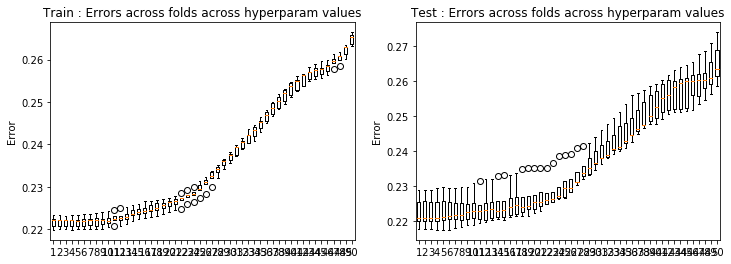

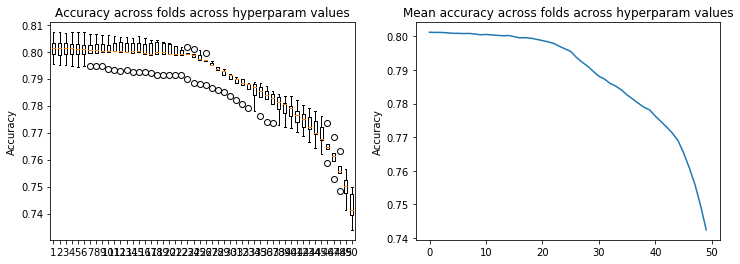

In [53]:
result_crossval(loss_tr31,loss_te31)
result_crossval_accuracy(acc31)

In [24]:
# test 32: degree 6, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr32, loss_te32, w32, acc32 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 6, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  2.35987524e+00  1.13684884e-01 -1.47179942e+00
  1.75246204e+00  3.00209414e-01 -3.31136092e+00  1.41748780e+00
 -4.68967511e-02  8.57446095e-01 -1.47351444e-02 -4.91060718e-03
  6.45254235e-02 -1.75390404e-03  8.84050531e-03 -1.57339683e-01
 -4.40669738e-03 -1.22922388e-01 -7.24828663e-03 -7.26645326e-04
 -3.22124523e+01  5.76194226e-02  2.69088548e-01 -3.68245383e+00
 -9.27796814e-01  1.29162346e+01 -2.88701541e+00  7.67986594e-02
  2.35579584e-01  9.34286421e-03 -1.72509383e-02 -1.43896964e+00
 -5.64910712e-02  6.19443584e-03  2.20907582e+00 -3.94949887e-03
 -5.22241672e-01  1.81473289e-01 -3.92357100e-02  1.23339406e+02
 -2.40594135e+00  1.68212855e+01  6.98751256e+00  1.30790065e+00
 -1.71190754e+01  2.76722677e+00  2.93302966e-01 -3.16898972e+00
  4.78617814e-02  7.0133

Ridge regression: w=[-2.76431087e-01  1.41221363e+00  1.15829876e-01 -1.41423872e+00
  1.96824312e+00  2.99553271e-01 -3.06002338e+00  1.37033154e+00
 -4.71072072e-02  8.90193380e-01 -1.48397089e-02 -4.90604324e-03
 -5.06380165e-02 -1.68069978e-03  8.51048607e-03 -1.46619224e-01
 -4.10838350e-03 -2.01908318e-01 -7.37484603e-03 -7.23246684e-04
 -2.60840815e+01  3.43556446e-02 -5.31539493e-02 -4.47575691e+00
 -9.22517600e-01  1.16832586e+01 -2.69595809e+00  7.56205253e-02
 -3.80043688e-02  9.32394262e-03 -1.71763078e-02 -8.28471285e-01
 -5.69238147e-02  6.47461539e-03  2.12749382e+00 -3.60117427e-03
 -5.93162088e-02  1.81368392e-01 -3.95019103e-02  1.06580267e+02
 -2.31655224e+00  1.75372780e+01  7.94929818e+00  1.28810906e+00
 -1.45010533e+01  2.35559519e+00  2.92681901e-01 -2.38659780e+00
  4.78217435e-02  6.97577991e-03  2.57328915e+00  4.49718627e-04
  1.16158909e-03 -7.60188059e+00  1.91972954e-02  3.08338615e+00
  4.03210587e-03 -8.71772834e-03 -1.81930058e+02  3.61669749e+00
 -4.6

Ridge regression: w=[-2.76431084e-01  3.95725749e-01  1.18826690e-01 -1.43572207e+00
  2.19790102e+00  2.98727485e-01 -2.86182273e+00  1.33204436e+00
 -4.73992471e-02  9.09787996e-01 -1.49605720e-02 -4.90392907e-03
 -1.40116043e-01 -1.58971309e-03  8.13406081e-03 -1.31571997e-01
 -3.76166579e-03 -2.77601468e-01 -7.53151479e-03 -7.20919914e-04
 -1.95028117e+01  4.04083977e-03  1.18233307e-01 -5.24469028e+00
 -9.16189881e-01  1.07380567e+01 -2.53728443e+00  7.43964238e-02
 -2.35821247e-01  9.29283812e-03 -1.70827675e-02 -3.63738781e-01
 -5.74294176e-02  6.77146714e-03  2.01305491e+00 -3.23345816e-03
  3.83565476e-01  1.81265358e-01 -3.97949253e-02  8.85590953e+01
 -2.20361038e+00  1.69173355e+01  8.64313721e+00  1.26541244e+00
 -1.25438595e+01  2.01537027e+00  2.92095271e-01 -1.77604146e+00
  4.77825680e-02  6.94181102e-03  1.59121175e+00  4.64859070e-04
  2.32820519e-03 -7.23096620e+00  1.83487571e-02  1.99860136e+00
  4.40742098e-03 -8.59629353e-03 -1.56474981e+02  3.42306344e+00
 -4.4

Ridge regression: w=[-2.76431078e-01 -6.30967805e-01  1.22792148e-01 -1.54157945e+00
  2.42354000e+00  2.97725834e-01 -2.69667994e+00  1.30069372e+00
 -4.77691152e-02  9.16571910e-01 -1.50921770e-02 -4.90650903e-03
 -2.09367122e-01 -1.48238059e-03  7.73085662e-03 -1.11443926e-01
 -3.38110728e-03 -3.45274396e-01 -7.71261564e-03 -7.17525284e-04
 -1.28447252e+01 -3.40554896e-02  8.17656601e-01 -5.91530933e+00
 -9.08835445e-01  9.98911337e+00 -2.40807786e+00  7.32203471e-02
 -3.63723737e-01  9.25325794e-03 -1.69710593e-02 -1.24896311e-02
 -5.79826192e-02  7.06953758e-03  1.86030514e+00 -2.86794957e-03
  7.79272989e-01  1.81173457e-01 -4.00995712e-02  7.02969366e+01
 -2.06537492e+00  1.48716142e+01  8.95189906e+00  1.24016224e+00
 -1.10707584e+01  1.74603738e+00  2.91598605e-01 -1.32392493e+00
  4.77475596e-02  6.91811686e-03  8.68964692e-01  4.29309994e-04
  3.57185952e-03 -6.73923611e+00  1.73997204e-02  1.03030531e+00
  4.84010960e-03 -8.46549330e-03 -1.30637401e+02  3.18915886e+00
 -4.1

Ridge regression: w=[-2.76431071e-01 -1.60573930e+00  1.27723659e-01 -1.71556149e+00
  2.62650568e+00  2.96565588e-01 -2.54525510e+00  1.27129050e+00
 -4.82012528e-02  9.10525311e-01 -1.52261617e-02 -4.91339388e-03
 -2.60492847e-01 -1.36326560e-03  7.32856834e-03 -8.60560497e-02
 -2.98732438e-03 -4.01769832e-01 -7.90656557e-03 -7.09275937e-04
 -6.50849412e+00 -7.98363544e-02  1.94781360e+00 -6.43364973e+00
 -9.00625014e-01  9.35149362e+00 -2.29742106e+00  7.21875837e-02
 -4.30715209e-01  9.21223972e-03 -1.68438774e-02  2.47269606e-01
 -5.85483557e-02  7.35550425e-03  1.66822497e+00 -2.52955608e-03
  1.11045549e+00  1.81101942e-01 -4.03992759e-02  5.28776726e+01
 -1.90262127e+00  1.16595760e+01  8.85402897e+00  1.21310608e+00
 -9.92653449e+00  1.53484043e+00  2.91234999e-01 -1.00685589e+00
  4.77187386e-02  6.90770401e-03  3.45541794e-01  3.42688016e-04
  4.80836882e-03 -6.12437007e+00  1.64067043e-02  2.18364285e-01
  5.30251535e-03 -8.34040185e-03 -1.05939270e+02  2.91655582e+00
 -3.7

Ridge regression: w=[-2.76431059e-01 -2.47539613e+00  1.33461320e-01 -1.92557028e+00
  2.79080902e+00  2.95281529e-01 -2.38993624e+00  1.23742632e+00
 -4.86752276e-02  8.91314561e-01 -1.53534160e-02 -4.92136146e-03
 -2.93119218e-01 -1.23836987e-03  6.95701852e-03 -5.61146651e-02
 -2.60145480e-03 -4.45680713e-01 -8.09887928e-03 -6.91021756e-04
 -8.34397882e-01 -1.32062329e-01  3.31544192e+00 -6.77387317e+00
 -8.91845372e-01  8.75082520e+00 -2.19071823e+00  7.13771007e-02
 -4.46527750e-01  9.17832941e-03 -1.67038811e-02  4.28383943e-01
 -5.90903637e-02  7.62197858e-03  1.44244453e+00 -2.24222620e-03
  1.37057021e+00  1.81059254e-01 -4.06791067e-02  3.72250336e+01
 -1.71957492e+00  7.79267119e+00  8.41948073e+00  1.18529367e+00
 -8.98342025e+00  1.36362915e+00  2.91032477e-01 -7.98145682e-01
  4.76970097e-02  6.90865267e-03 -2.39345265e-02  2.13427463e-04
  5.95071049e-03 -5.40488718e+00  1.54324450e-02 -4.25180697e-01
  5.76011066e-03 -8.23747965e-03 -8.36768113e+01  2.61205787e+00
 -3.1

Ridge regression: w=[-2.76431043e-01 -3.20483200e+00  1.39682710e-01 -2.13543761e+00
  2.90485465e+00  2.93909908e-01 -2.21579154e+00  1.19315075e+00
 -4.91760014e-02  8.58734914e-01 -1.54665992e-02 -4.92495221e-03
 -3.06057007e-01 -1.11272768e-03  6.64143063e-03 -2.32879411e-02
 -2.23906630e-03 -4.76885268e-01 -8.27639085e-03 -6.56709657e-04
  3.95575106e+00 -1.88246639e-01  4.70432638e+00 -6.93209206e+00
 -8.82807344e-01  8.12592273e+00 -2.07403623e+00  7.08396021e-02
 -4.20512259e-01  9.15914541e-03 -1.65510604e-02  5.38484071e-01
 -5.95806906e-02  7.86975713e-03  1.19569098e+00 -2.02548130e-03
  1.56111090e+00  1.81052750e-01 -4.09278295e-02  2.39355487e+01
 -1.52426144e+00  3.83789291e+00  7.76248103e+00  1.15784291e+00
 -8.14132954e+00  1.21443852e+00  2.91010538e-01 -6.72162632e-01
  4.76830899e-02  6.91405075e-03 -2.71766633e-01  5.37153110e-05
  6.92920008e-03 -4.62134694e+00  1.45274062e-02 -9.09136684e-01
  6.18143836e-03 -8.17146882e-03 -6.46809036e+01  2.28829326e+00
 -2.5

Ridge regression: w=[-2.76431019e-01 -3.77960558e+00  1.45941267e-01 -2.31531477e+00
  2.96128762e+00  2.92469338e-01 -2.01193960e+00  1.13459347e+00
 -4.97023495e-02  8.13418100e-01 -1.55619069e-02 -4.91715534e-03
 -2.98930156e-01 -9.88718139e-04  6.39828771e-03  1.00937650e-02
 -1.90661003e-03 -4.95827479e-01 -8.43040097e-03 -5.99747192e-04
  7.77626297e+00 -2.44911403e-01  5.93963542e+00 -6.91384360e+00
 -8.73731076e-01  7.43223708e+00 -1.93755986e+00  7.05957114e-02
 -3.61903633e-01  9.15941160e-03 -1.63809859e-02  5.84221095e-01
 -6.00054488e-02  8.10814042e-03  9.45480758e-01 -1.89313725e-03
  1.68741697e+00  1.81088815e-01 -4.11380363e-02  1.32273764e+01
 -1.32773782e+00  2.45285510e-01  6.98808792e+00  1.13164488e+00
 -7.32734834e+00  1.07309015e+00  2.91192105e-01 -6.06126101e-01
  4.76787158e-02  6.91231859e-03 -4.22415731e-01 -1.25321651e-04
  7.70327631e-03 -3.82900802e+00  1.37179646e-02 -1.25286314e+00
  6.54566915e-03 -8.15358965e-03 -4.92408753e+01  1.96258647e+00
 -2.0

Ridge regression: w=[-2.76430984e-01 -4.20211982e+00  1.51749298e-01 -2.44613091e+00
  2.95577113e+00  2.90945067e-01 -1.77343190e+00  1.06098720e+00
 -5.02700394e-02  7.57545072e-01 -1.56395117e-02 -4.88967492e-03
 -2.73229462e-01 -8.65872128e-04  6.23512272e-03  4.16440578e-02
 -1.60166391e-03 -5.02892556e-01 -8.55752086e-03 -5.13173683e-04
  1.06536804e+01 -2.98245885e-01  6.91540051e+00 -6.72416835e+00
 -8.64648224e-01  6.64684182e+00 -1.77769308e+00  7.06440930e-02
 -2.80907979e-01  9.17990540e-03 -1.61846798e-02  5.74217753e-01
 -6.03650042e-02  8.35373587e-03  7.09610628e-01 -1.85421930e-03
  1.75509359e+00  1.81173102e-01 -4.13043140e-02  5.00349684e+00
 -1.14203477e+00 -2.72501144e+00  6.16229867e+00  1.10711067e+00
 -6.49677047e+00  9.30972048e-01  2.91616065e-01 -5.80034000e-01
  4.76876579e-02  6.88726432e-03 -4.96371556e-01 -3.15545903e-04
  8.26138609e-03 -3.08371551e+00  1.30056392e-02 -1.47761906e+00
  6.84491471e-03 -8.19153550e-03 -3.71908950e+01  1.65379142e+00
 -1.5

Ridge regression: w=[-2.76430932e-01 -4.48452924e+00  1.56685262e-01 -2.51866547e+00
  2.88589540e+00  2.89278584e-01 -1.50310738e+00  9.74858793e-01
 -5.09093055e-02  6.95166314e-01 -1.57029312e-02 -4.83284752e-03
 -2.32579261e-01 -7.41914421e-04  6.15303040e-03  6.95395015e-02
 -1.31584801e-03 -4.98076217e-01 -8.65854597e-03 -3.89749268e-04
  1.26813899e+01 -3.44976223e-01  7.58824879e+00 -6.36460451e+00
 -8.55341431e-01  5.77344630e+00 -1.59750457e+00  7.09748883e-02
 -1.89510145e-01  9.21702091e-03 -1.59496090e-02  5.20193523e-01
 -6.06703485e-02  8.62855494e-03  5.01609580e-01 -1.91479349e-03
  1.76802858e+00  1.81310779e-01 -4.14203798e-02 -1.02513857e+00
 -9.77433280e-01 -4.98429952e+00  5.31069144e+00  1.08403412e+00
 -5.63490306e+00  7.85297094e-01  2.92346472e-01 -5.76003244e-01
  4.77162368e-02  6.81803661e-03 -5.12440716e-01 -5.10715040e-04
  8.61299011e-03 -2.42775190e+00  1.23742885e-02 -1.60157276e+00
  7.08194400e-03 -8.29064196e-03 -2.80827159e+01  1.37807239e+00
 -1.1

Ridge regression: w=[-2.76430858e-01 -4.64196628e+00  1.60487485e-01 -2.53033764e+00
  2.75117862e+00  2.87360054e-01 -1.21214468e+00  8.81271974e-01
 -5.16575849e-02  6.31747443e-01 -1.57578697e-02 -4.73575784e-03
 -1.82218889e-01 -6.14255461e-04  6.14971759e-03  9.28513814e-02
 -1.03838158e-03 -4.81040075e-01 -8.73638446e-03 -2.22167648e-04
  1.39756834e+01 -3.83089693e-01  7.95627145e+00 -5.83715089e+00
 -8.45314862e-01  4.84348855e+00 -1.40535631e+00  7.15824247e-02
 -1.00873696e-01  9.26250388e-03 -1.56608154e-02  4.36321725e-01
 -6.09386610e-02  8.95798555e-03  3.28339946e-01 -2.07915094e-03
  1.72826286e+00  1.81506812e-01 -4.14765578e-02 -5.21876953e+00
 -8.40263171e-01 -6.55574617e+00  4.43482854e+00  1.06157563e+00
 -4.75615349e+00  6.38064037e-01  2.93475050e-01 -5.78281040e-01
  4.77731212e-02  6.68007607e-03 -4.88453704e-01 -7.03951416e-04
  8.77928440e-03 -1.88244238e+00  1.17991965e-02 -1.63846665e+00
  7.26551045e-03 -8.45522976e-03 -2.13573825e+01  1.14554496e+00
 -8.9

Ridge regression: w=[-2.76430750e-01 -4.68825016e+00  1.63103510e-01 -2.48229928e+00
  2.55443513e+00  2.85019783e-01 -9.18014596e-01  7.86332019e-01
 -5.25486947e-02  5.72917391e-01 -1.58109347e-02 -4.58719449e-03
 -1.27918934e-01 -4.81234783e-04  6.22151914e-03  1.11509268e-01
 -7.58846749e-04 -4.51564548e-01 -8.79389457e-03 -3.63708870e-06
  1.46467328e+01 -4.12138870e-01  8.03894004e+00 -5.15301375e+00
 -8.33773250e-01  3.90922658e+00 -1.21212432e+00  7.24725798e-02
 -2.70527407e-02  9.30333612e-03 -1.53017314e-02  3.37292774e-01
 -6.11899503e-02  9.36859720e-03  1.90320903e-01 -2.34937486e-03
  1.63757433e+00  1.81766262e-01 -4.14588025e-02 -7.92604625e+00
 -7.32124516e-01 -7.51638406e+00  3.53405521e+00  1.03830688e+00
 -3.89664103e+00  4.94129473e-01  2.95113851e-01 -5.74404935e-01
  4.78683160e-02  6.44839357e-03 -4.40732538e-01 -8.85748242e-04
  8.78694289e-03 -1.44926494e+00  1.12537298e-02 -1.59912914e+00
  7.40517797e-03 -8.68928627e-03 -1.64666103e+01  9.59224286e-01
 -6.7

Ridge regression: w=[-2.76430592e-01 -4.63461628e+00  1.64690234e-01 -2.37780212e+00
  2.30385518e+00  2.82018807e-01 -6.39895494e-01  6.95581300e-01
 -5.36002782e-02  5.22955343e-01 -1.58684420e-02 -4.37772114e-03
 -7.47891349e-02 -3.42765214e-04  6.36389414e-03  1.26033331e-01
 -4.68834961e-04 -4.10265737e-01 -8.83216967e-03  2.70892337e-04
  1.47872784e+01 -4.33111112e-01  7.86443967e+00 -4.34220468e+00
 -8.19598328e-01  3.02898964e+00 -1.02818528e+00  7.36621276e-02
  2.39315880e-02  9.32229309e-03 -1.48552675e-02  2.35987220e-01
 -6.14448234e-02  9.88515774e-03  8.37477188e-02 -2.72325074e-03
  1.50014157e+00  1.82094242e-01 -4.13498518e-02 -9.44550762e+00
 -6.50538698e-01 -7.95852446e+00  2.62390204e+00  1.01225486e+00
 -3.10031344e+00  3.59155655e-01  2.97375903e-01 -5.56841230e-01
  4.80115016e-02  6.10335241e-03 -3.82957102e-01 -1.04391933e-03
  8.66554527e-03 -1.11623596e+00  1.07126823e-02 -1.49460967e+00
  7.50692058e-03 -8.99582351e-03 -1.29367371e+01  8.16262558e-01
 -5.1

Ridge regression: w=[-2.76430362e-01 -4.49097601e+00  1.65578111e-01 -2.22169319e+00
  2.01430163e+00  2.78046010e-01 -3.93523782e-01  6.12942902e-01
 -5.48028661e-02  4.83799095e-01 -1.59354244e-02 -4.10248131e-03
 -2.64537743e-02 -2.00334959e-04  6.57070650e-03  1.37224566e-01
 -1.63000033e-04 -3.59233154e-01 -8.84973998e-03  6.02701154e-04
  1.44755815e+01 -4.48041861e-01  7.46411787e+00 -3.45825514e+00
 -8.01345642e-01  2.25074019e+00 -8.61382411e-01  7.51685616e-02
  4.99037093e-02  9.30007134e-03 -1.43065464e-02  1.41761955e-01
 -6.17222095e-02  1.05260599e-02  2.79976675e-03 -3.19134168e-03
  1.32496073e+00  1.82494821e-01 -4.11324571e-02 -1.00212864e+01
 -5.90352314e-01 -7.97082208e+00  1.74457382e+00  9.80949202e-01
 -2.40383558e+00  2.38152371e-01  3.00343927e-01 -5.23789996e-01
  4.82100336e-02  5.63708749e-03 -3.25200844e-01 -1.16591461e-03
  8.44690575e-03 -8.65167146e-01  1.01541161e-02 -1.33919944e+00
  7.57064471e-03 -9.37454281e-03 -1.03900439e+01  7.10318988e-01
 -3.8

Ridge regression: w=[-2.76430028e-01 -4.26861122e+00  1.66211062e-01 -2.02069184e+00
  1.70626613e+00  2.72734367e-01 -1.87969942e-01  5.40400660e-01
 -5.61146804e-02  4.55002344e-01 -1.60148280e-02 -3.76383056e-03
  1.52065189e-02 -5.65091966e-05  6.83290200e-03  1.45926927e-01
  1.59713484e-04 -3.02142100e-01 -8.84313078e-03  9.86779000e-04
  1.37864793e+01 -4.59553122e-01  6.87202967e+00 -2.57267791e+00
 -7.77314272e-01  1.60173894e+00 -7.16307350e-01  7.69904969e-02
  5.41675468e-02  9.21976010e-03 -1.36484497e-02  5.99081219e-02
 -6.20359589e-02  1.12968811e-02 -5.86117400e-02 -3.73448010e-03
  1.12636463e+00  1.82968379e-01 -4.07944144e-02 -9.85833392e+00
 -5.45180674e-01 -7.63348278e+00  9.55117473e-01  9.41545580e-01
 -1.82699541e+00  1.34772402e-01  3.04030485e-01 -4.78303114e-01
  4.84666757e-02  5.05751813e-03 -2.73678532e-01 -1.24294220e-03
  8.16406453e-03 -6.77128118e-01  9.56243731e-03 -1.15143373e+00
  7.59067809e-03 -9.81831283e-03 -8.54162813e+00  6.33816984e-01
 -2.9

Ridge regression: w=[-2.76429541e-01 -3.98278915e+00  1.67064857e-01 -1.78430085e+00
  1.40217290e+00  2.65708515e-01 -2.53659797e-02  4.78159227e-01
 -5.74644372e-02  4.34453415e-01 -1.61067918e-02 -3.37278627e-03
  4.98575015e-02  8.58035959e-05  7.13720571e-03  1.52884915e-01
  4.94349759e-04 -2.43610701e-01 -8.80877788e-03  1.40975398e-03
  1.28032386e+01 -4.70395208e-01  6.12817781e+00 -1.75880732e+00
 -7.45749068e-01  1.08753350e+00 -5.94432007e-01  7.90826301e-02
  4.33490500e-02  9.07323504e-03 -1.28893646e-02 -7.80589024e-03
 -6.23906455e-02  1.21833133e-02 -1.05833853e-01 -4.32270001e-03
  9.21797816e-01  1.83507851e-01 -4.03347004e-02 -9.14289520e+00
 -5.08547709e-01 -7.02246707e+00  3.14533087e-01  8.91128598e-01
 -1.37141301e+00  5.10737266e-02  3.08337890e-01 -4.26030771e-01
  4.87769695e-02  4.38782657e-03 -2.31278883e-01 -1.27447130e-03
  7.84898522e-03 -5.35532683e-01  8.93407348e-03 -9.52124382e-01
  7.55932018e-03 -1.03101586e-02 -7.18521671e+00  5.79449907e-01
 -2.2

Ridge regression: w=[-2.76428832e-01 -3.65371452e+00  1.68545646e-01 -1.52591372e+00
  1.12158511e+00  2.56670038e-01  9.72523444e-02  4.25008542e-01
 -5.87607190e-02  4.19339542e-01 -1.62081029e-02 -2.94847407e-03
  7.82705752e-02  2.24007473e-04  7.46553606e-03  1.58673667e-01
  8.28420655e-04 -1.88061540e-01 -8.74539456e-03  1.84957672e-03
  1.16232139e+01 -4.82990427e-01  5.28318094e+00 -1.07219328e+00
 -7.05219403e-01  6.97657934e-01 -4.94606317e-01  8.13346079e-02
  2.47872678e-02  8.86687135e-03 -1.20595424e-02 -6.19882097e-02
 -6.27787478e-02  1.31468739e-02 -1.43026142e-01 -4.91614048e-03
  7.27777694e-01  1.84095723e-01 -3.97683460e-02 -8.05649204e+00
 -4.74726293e-01 -6.21726556e+00 -1.40737905e-01  8.27288061e-01
 -1.02525598e+00 -1.24900377e-02  3.13032745e-01 -3.72763428e-01
  4.91269266e-02  3.66142738e-03 -1.98557048e-01 -1.27108775e-03
  7.52975530e-03 -4.27370925e-01  8.28377686e-03 -7.60392412e-01
  7.47172764e-03 -1.08228842e-02 -6.17570186e+00  5.40909729e-01
 -1.7

Ridge regression: w=[-2.76427798e-01 -3.30481272e+00  1.70877301e-01 -1.26288089e+00
  8.77646973e-01  2.45513606e-01  1.85507355e-01  3.78822319e-01
 -5.99041282e-02  4.06947686e-01 -1.63123158e-02 -2.51510047e-03
  1.01784091e-01  3.56235040e-04  7.79597951e-03  1.63674341e-01
  1.14213516e-03 -1.38702562e-01 -8.65524105e-03  2.27795520e-03
  1.03529386e+01 -4.98968401e-01  4.39949265e+00 -5.38065884e-01
 -6.55163093e-01  4.13281451e-01 -4.13785942e-01  8.35655034e-02
  4.64906937e-03  8.62265165e-03 -1.12106822e-02 -1.04386319e-01
 -6.31819848e-02  1.41278231e-02 -1.73061409e-01 -5.46825295e-03
  5.56257133e-01  1.84704433e-01 -3.91259190e-02 -6.77637152e+00
 -4.39408584e-01 -5.30479986e+00 -4.09915355e-01  7.48981034e-01
 -7.69783460e-01 -5.68904561e-02  3.17752516e-01 -3.22829427e-01
  4.94930536e-02  2.91402247e-03 -1.74740926e-01 -1.25397621e-03
  7.22867939e-03 -3.43298547e-01  7.64666329e-03 -5.90039826e-01
  7.32912383e-03 -1.13224700e-02 -5.41235791e+00  5.13097071e-01
 -1.3

Ridge regression: w=[-2.76426294e-01 -2.95861003e+00  1.73997970e-01 -1.01434858e+00
  6.76054039e-01  2.32441071e-01  2.45708274e-01  3.37193326e-01
 -6.07983946e-02  3.95170169e-01 -1.64110054e-02 -2.09680457e-03
  1.21745836e-01  4.81615224e-04  8.10575556e-03  1.68081491e-01
  1.41146173e-03 -9.71081253e-02 -8.54327810e-03  2.66537756e-03
  9.09346365e+00 -5.18740158e-01  3.54472781e+00 -1.51631933e-01
 -5.96452610e-01  2.13462599e-01 -3.47957589e-01  8.55398896e-02
 -1.28686598e-02  8.37249315e-03 -1.04059804e-02 -1.36888458e-01
 -6.35776965e-02  1.50569250e-02 -1.97642570e-01 -5.93129143e-03
  4.13129555e-01  1.85301576e-01 -3.84449408e-02 -5.46264181e+00
 -4.00250457e-01 -4.37357085e+00 -5.24524203e-01  6.57468461e-01
 -5.84778477e-01 -8.41949313e-02  3.22049718e-01 -2.78643253e-01
  4.98465004e-02  2.17485085e-03 -1.58444709e-01 -1.25092367e-03
  6.96177029e-03 -2.77094195e-01  7.07229216e-03 -4.48106758e-01
  7.13821548e-03 -1.17744267e-02 -4.82457909e+00  4.92072577e-01
 -1.0

Ridge regression: w=[-2.76424103e-01 -2.63196677e+00  1.77501189e-01 -7.97313426e-01
  5.16176673e-01  2.18009315e-01  2.83693851e-01  2.98102607e-01
 -6.13568542e-02  3.82743048e-01 -1.64959290e-02 -1.71209271e-03
  1.39024951e-01  6.00546162e-04  8.37534737e-03  1.71938290e-01
  1.61318492e-03 -6.34233640e-02 -8.41470818e-03  2.98692224e-03
  7.92270388e+00 -5.41255630e-01  2.77863738e+00  1.11574336e-01
 -5.31671140e-01  7.89098334e-02 -2.93094364e-01  8.69995162e-02
 -2.55170647e-02  8.14773784e-03 -9.70446279e-03 -1.60887605e-01
 -6.39476951e-02  1.58715206e-02 -2.17573105e-01 -6.26287595e-03
  2.98975498e-01  1.85858012e-01 -3.77557625e-02 -4.24020882e+00
 -3.57139129e-01 -3.49994415e+00 -5.32658819e-01  5.56814015e-01
 -4.51895355e-01 -9.72053687e-02  3.25454438e-01 -2.41038229e-01
  5.01605394e-02  1.45954112e-03 -1.48027506e-01 -1.29081357e-03
  6.73904068e-03 -2.24803145e-01  6.61255359e-03 -3.35736909e-01
  6.90738961e-03 -1.21503960e-02 -4.36092709e+00  4.74896504e-01
 -8.4

Ridge regression: w=[-2.76420912e-01 -2.33302454e+00  1.80660735e-01 -6.22934191e-01
  3.93137974e-01  2.03047246e-01  3.04394120e-01  2.60410339e-01
 -6.15008725e-02  3.69243120e-01 -1.65611579e-02 -1.37029179e-03
  1.53722156e-01  7.14967847e-04  8.59200749e-03  1.75188671e-01
  1.72963993e-03 -3.68859384e-02 -8.27253081e-03  3.22629407e-03
  6.88396209e+00 -5.64128937e-01  2.14104915e+00  2.82850053e-01
 -4.64768698e-01 -6.46177311e-03 -2.45893348e-01  8.76969154e-02
 -3.25534091e-02  7.96834538e-03 -9.14791132e-03 -1.77017692e-01
 -6.42850539e-02  1.65273232e-02 -2.33107471e-01 -6.43150067e-03
  2.10963473e-01  1.86354629e-01 -3.70685165e-02 -3.18688317e+00
 -3.11931333e-01 -2.73552130e+00 -4.81523095e-01  4.53384319e-01
 -3.56165481e-01 -9.91433580e-02  3.27519716e-01 -2.09849660e-01
  5.04180606e-02  7.66971074e-04 -1.41724249e-01 -1.39934487e-03
  6.56469893e-03 -1.83823704e-01  6.30946589e-03 -2.50228179e-01
  6.64231062e-03 -1.24318165e-02 -3.98172549e+00  4.59406071e-01
 -6.9

Ridge regression: w=[-2.76416265e-01 -2.06122281e+00  1.82548195e-01 -4.94838233e-01
  2.99857550e-01  1.88441785e-01  3.11868195e-01  2.23981981e-01
 -6.11489661e-02  3.54850556e-01 -1.66042156e-02 -1.07144282e-03
  1.65199086e-01  8.28491613e-04  8.75137479e-03  1.77721063e-01
  1.75148095e-03 -1.63479897e-02 -8.11648310e-03  3.37669645e-03
  5.98582722e+00 -5.84178592e-01  1.64702995e+00  3.91004683e-01
 -4.00077286e-01 -5.54311926e-02 -2.04131608e-01  8.74210432e-02
 -3.41586728e-02  7.83483786e-03 -8.75627193e-03 -1.85248763e-01
 -6.45958526e-02  1.70001019e-02 -2.44262003e-01 -6.41982345e-03
  1.44766052e-01  1.86784439e-01 -3.63664461e-02 -2.33414116e+00
 -2.67597837e-01 -2.10324375e+00 -4.06605204e-01  3.54291148e-01
 -2.86289849e-01 -9.33532146e-02  3.27824891e-01 -1.84391317e-01
  5.06158579e-02  8.13055973e-05 -1.37731710e-01 -1.59735500e-03
  6.43671808e-03 -1.52177374e-01  6.18763990e-03 -1.87086385e-01
  6.34330555e-03 -1.26091837e-02 -3.65495709e+00  4.43953739e-01
 -6.1

Ridge regression: w=[-2.76409497e-01 -1.80996241e+00  1.82197938e-01 -4.09529771e-01
  2.28667849e-01  1.74887622e-01  3.09564276e-01  1.89430300e-01
 -6.01995110e-02  3.39965057e-01 -1.66257469e-02 -8.09096413e-04
  1.72448628e-01  9.46229162e-04  8.85734130e-03  1.79378627e-01
  1.67870607e-03 -6.38992045e-04 -7.94363705e-03  3.43922968e-03
  5.21165624e+00 -5.98170906e-01  1.28958903e+00  4.58104720e-01
 -3.41128033e-01 -7.80921663e-02 -1.66642780e-01  8.60147092e-02
 -3.09185607e-02  7.72263552e-03 -8.53099081e-03 -1.85307251e-01
 -6.48961257e-02  1.72783803e-02 -2.50979944e-01 -6.22659583e-03
  9.59096655e-02  1.87149588e-01 -3.56062761e-02 -1.67834777e+00
 -2.27097009e-01 -1.60261435e+00 -3.29137395e-01  2.65482518e-01
 -2.34290392e-01 -8.29756388e-02  3.25938737e-01 -1.63720580e-01
  5.07643293e-02 -6.21563068e-04 -1.34368333e-01 -1.90091620e-03
  6.34580806e-03 -1.28111409e-01  6.25145278e-03 -1.41483979e-01
  6.00532160e-03 -1.26780835e-02 -3.35476497e+00  4.27155615e-01
 -5.7

Ridge regression: w=[-2.76399642e-01 -1.57043112e+00  1.78748066e-01 -3.57975859e-01
  1.72559645e-01  1.62727720e-01  3.00575876e-01  1.57645176e-01
 -5.85137749e-02  3.24884851e-01 -1.66276210e-02 -5.74339804e-04
  1.74670811e-01  1.07418273e-03  8.92102604e-03  1.79936069e-01
  1.52100523e-03  1.12521327e-02 -7.75009534e-03  3.42050652e-03
  4.53284211e+00 -6.03426960e-01  1.04619211e+00  4.98705396e-01
 -2.89875358e-01 -8.26086513e-02 -1.33045680e-01  8.33911434e-02
 -2.35580415e-02  7.57714760e-03 -8.46168381e-03 -1.77290511e-01
 -6.52058171e-02  1.73531119e-02 -2.53144490e-01 -5.86883769e-03
  6.04778610e-02  1.87454807e-01 -3.47233288e-02 -1.19544387e+00
 -1.92500013e-01 -1.21912980e+00 -2.58850326e-01  1.90463703e-01
 -1.94889315e-01 -7.06312078e-02  3.21365921e-01 -1.46771168e-01
  5.08822999e-02 -1.36507114e-03 -1.30309724e-01 -2.32124625e-03
  6.27438860e-03 -1.10009860e-01  6.48432304e-03 -1.09059335e-01
  5.62002899e-03 -1.26346724e-02 -3.06161521e+00  4.07720936e-01
 -5.6

Ridge regression: w=[-2.76385290e-01 -1.33515479e+00  1.71520210e-01 -3.27681955e-01
  1.26205645e-01  1.51944895e-01  2.87731024e-01  1.29347085e-01
 -5.59091022e-02  3.09738597e-01 -1.66094881e-02 -3.59594494e-04
  1.71795140e-01  1.21804250e-03  8.95927586e-03  1.79075661e-01
  1.29771647e-03  2.01367233e-02 -7.53305332e-03  3.33060073e-03
  3.92064766e+00 -5.98104677e-01  8.85761265e-01  5.20575112e-01
 -2.46616687e-01 -7.57245455e-02 -1.03383702e-01  7.95618316e-02
 -1.30012706e-02  7.31012861e-03 -8.53197111e-03 -1.62200677e-01
 -6.55406494e-02  1.72104399e-02 -2.50539792e-01 -5.38456580e-03
  3.53182268e-02  1.87698868e-01 -3.36393937e-02 -8.53273591e-01
 -1.64680671e-01 -9.32906388e-01 -1.98395641e-01  1.30118742e-01
 -1.64797887e-01 -5.82141505e-02  3.13512836e-01 -1.32480282e-01
  5.09863791e-02 -2.16240739e-03 -1.24805113e-01 -2.86292670e-03
  6.19664860e-03 -9.64605563e-02  6.84864066e-03 -8.62355774e-02
  5.17940697e-03 -1.24729718e-02 -2.76314195e+00  3.84418582e-01
 -5.8

Ridge regression: w=[-2.76364393e-01 -1.10038256e+00  1.60061737e-01 -3.05195775e-01
  8.66637754e-02  1.42271313e-01  2.73472731e-01  1.04813429e-01
 -5.21746573e-02  2.94642939e-01 -1.65640117e-02 -1.61493791e-04
  1.64690362e-01  1.38124903e-03  8.99235287e-03  1.76409235e-01
  1.03657407e-03  2.66702607e-02 -7.29267474e-03  3.18137910e-03
  3.35394314e+00 -5.81238162e-01  7.75130144e-01  5.26079417e-01
 -2.10447950e-01 -6.29059779e-02 -7.77924897e-02  7.46855252e-02
 -5.65534015e-04  6.80116478e-03 -8.72271346e-03 -1.42073647e-01
 -6.59017669e-02  1.68309672e-02 -2.42885311e-01 -4.83430427e-03
  1.79570140e-02  1.87865338e-01 -3.22729616e-02 -6.19411563e-01
 -1.43493757e-01 -7.24129905e-01 -1.47220468e-01  8.33724173e-02
 -1.42003042e-01 -4.68520649e-02  3.01717155e-01 -1.19949430e-01
  5.10743116e-02 -3.00786143e-03 -1.17754499e-01 -3.52009550e-03
  6.08089399e-03 -8.63254444e-02  7.28740098e-03 -7.02628585e-02
  4.68035797e-03 -1.21850404e-02 -2.45474028e+00  3.56198722e-01
 -5.9

Ridge regression: w=[-2.76333963e-01 -8.66959776e-01  1.44204414e-01 -2.79022669e-01
  5.33988383e-02  1.33342836e-01  2.59629270e-01  8.38158220e-02
 -4.71206956e-02  2.79856415e-01 -1.64715716e-02  1.73013507e-05
  1.54957237e-01  1.56242986e-03  9.04041611e-03  1.71575757e-01
  7.70482739e-04  3.14145507e-02 -7.03340602e-03  2.98478704e-03
  2.82236504e+00 -5.52752037e-01  6.85064715e-01  5.14405554e-01
 -1.79905030e-01 -4.82457106e-02 -5.62805720e-02  6.91240041e-02
  1.20623907e-02  5.90938686e-03 -9.01276553e-03 -1.19568047e-01
 -6.62644656e-02  1.61958513e-02 -2.30009562e-01 -4.29829809e-03
  6.41584069e-03  1.87914364e-01 -3.05525414e-02 -4.65071015e-01
 -1.28153791e-01 -5.75376706e-01 -1.04073770e-01  4.81207883e-02
 -1.25132423e-01 -3.70062198e-02  2.85382602e-01 -1.08568179e-01
  5.11041660e-02 -3.87063586e-03 -1.09588565e-01 -4.27152071e-03
  5.89460338e-03 -7.87437550e-02  7.72932599e-03 -5.91253198e-02
  4.12972679e-03 -1.17634986e-02 -2.13918175e+00  3.22449931e-01
 -6.0

Ridge regression: w=[-2.76289660e-01 -6.39799290e-01  1.24170177e-01 -2.42321294e-01
  2.74410089e-02  1.24840220e-01  2.47237732e-01  6.57483498e-02
 -4.06605156e-02  2.65752390e-01 -1.62960691e-02  1.67440262e-04
  1.44434622e-01  1.75296513e-03  9.11930519e-03  1.64398273e-01
  5.32839552e-04  3.48640827e-02 -6.76433818e-03  2.75092270e-03
  2.32569057e+00 -5.13590439e-01  5.95295677e-01  4.84584949e-01
 -1.53525463e-01 -3.43767185e-02 -3.86737345e-02  6.34451448e-02
  2.32220110e-02  4.49800092e-03 -9.37832997e-03 -9.72380454e-02
 -6.65715155e-02  1.52976072e-02 -2.12127529e-01 -3.86644649e-03
 -9.26270935e-04  1.87778426e-01 -2.84339137e-02 -3.66536182e-01
 -1.17575087e-01 -4.71977907e-01 -6.81331870e-02  2.20050995e-02
 -1.12985442e-01 -2.86556769e-02  2.64228017e-01 -9.80251305e-02
  5.09759752e-02 -4.69297167e-03 -1.01005934e-01 -5.07682465e-03
  5.61094400e-03 -7.30733827e-02  8.09753053e-03 -5.13905699e-02
  3.54805247e-03 -1.12043732e-02 -1.82500282e+00  2.83327813e-01
 -5.9

Ridge regression: w=[-2.76225164e-01 -4.26356559e-01  1.00687700e-01 -1.94227567e-01
  1.00896659e-02  1.16584422e-01  2.36535299e-01  4.98765167e-02
 -3.29008511e-02  2.52659368e-01 -1.59841104e-02  2.73789928e-04
  1.34687332e-01  1.93608470e-03  9.23712246e-03  1.55029729e-01
  3.52946088e-04  3.74252378e-02 -6.49809008e-03  2.48634134e-03
  1.87072855e+00 -4.65895274e-01  4.97000081e-01  4.38186226e-01
 -1.30214699e-01 -2.25763360e-02 -2.46861391e-02  5.83032864e-02
  3.18109773e-02  2.46952190e-03 -9.79242897e-03 -7.69201032e-02
 -6.67395464e-02  1.41519812e-02 -1.90085828e-01 -3.61973743e-03
 -5.37861925e-03  1.87366090e-01 -2.59204322e-02 -3.05292877e-01
 -1.10588349e-01 -4.01659571e-01 -3.91500240e-02  2.88273408e-03
 -1.04288885e-01 -2.15151427e-02  2.38587379e-01 -8.82162983e-02
  5.05264456e-02 -5.39485573e-03 -9.26910542e-02 -5.87717594e-03
  5.21417487e-03 -6.88084878e-02  8.31993303e-03 -4.60469935e-02
  2.96916915e-03 -1.05080304e-02 -1.52391608e+00  2.40021910e-01
 -5.5

Ridge regression: w=[-2.76131290e-01 -2.34595530e-01  7.50123927e-02 -1.39017254e-01
  1.90816666e-03  1.08565551e-01  2.27128381e-01  3.55865220e-02
 -2.41922863e-02  2.40730581e-01 -1.54696952e-02  3.18479690e-04
  1.26678433e-01  2.08863632e-03  9.39300111e-03  1.43992767e-01
  2.52476663e-04  3.93810336e-02 -6.24791337e-03  2.19360223e-03
  1.46699548e+00 -4.12985077e-01  3.91547684e-01  3.80174231e-01
 -1.09386752e-01 -1.30814123e-02 -1.40019855e-02  5.42126225e-02
  3.75711174e-02 -1.95144491e-04 -1.02255308e-02 -5.95134383e-02
 -6.66825730e-02  1.28065587e-02 -1.65398631e-01 -3.60653801e-03
 -7.93574621e-03  1.86577271e-01 -2.30804594e-02 -2.67531382e-01
 -1.06059808e-01 -3.54220940e-01 -1.71350421e-02 -1.09704486e-02
 -9.76736855e-02 -1.52410126e-02  2.09608949e-01 -7.91196780e-02
  4.95458713e-02 -5.88717421e-03 -8.51062728e-02 -6.60280164e-03
  4.70183939e-03 -6.55093492e-02  8.33996137e-03 -4.23614283e-02
  2.43350647e-03 -9.67842110e-03 -1.24774787e+00  1.94767105e-01
 -5.0

Ridge regression: w=[-2.75994690e-01 -7.09846355e-02  4.87426780e-02 -8.35065501e-02
  2.42125405e-03  1.00897652e-01  2.18269657e-01  2.25267863e-02
 -1.50892223e-02  2.29915444e-01 -1.46853493e-02  2.86035952e-04
  1.20666318e-01  2.18520794e-03  9.57808008e-03  1.32059650e-01
  2.42710078e-04  4.08779923e-02 -6.02368284e-03  1.87312499e-03
  1.12240170e+00 -3.58897198e-01  2.86212709e-01  3.17581640e-01
 -9.08907344e-02 -5.50650122e-03 -6.28702165e-03  5.13530085e-02
  4.09760425e-02 -3.40599736e-03 -1.06469421e-02 -4.51220927e-02
 -6.63440643e-02  1.13415617e-02 -1.39978812e-01 -3.82401315e-03
 -9.28801956e-03  1.85329334e-01 -2.00500041e-02 -2.43376835e-01
 -1.02964342e-01 -3.21456140e-01 -1.98347837e-03 -2.08350578e-02
 -9.18045476e-02 -9.58326860e-03  1.79174303e-01 -7.06884968e-02
  4.78184375e-02 -6.09252475e-03 -7.83828173e-02 -7.18589343e-03
  4.08384013e-03 -6.27630992e-02  8.12713757e-03 -3.97747600e-02
  1.97658512e-03 -8.72428168e-03 -1.00557269e+00  1.50459695e-01
 -4.5

Ridge regression: w=[-2.75795995e-01  6.08613800e-02  2.34461488e-02 -3.41142046e-02
  1.03335596e-02  9.37203001e-02  2.09149705e-01  1.06109091e-02
 -6.20993650e-03  2.19983915e-01 -1.35789692e-02  1.69323092e-04
  1.16274299e-01  2.20286807e-03  9.77726723e-03  1.20016069e-01
  3.22320676e-04  4.19415843e-02 -5.82846727e-03  1.52722315e-03
  8.40247071e-01 -3.07535500e-01  1.89239481e-01  2.57192898e-01
 -7.47908196e-02  7.72952605e-04 -1.15669220e-03  4.95507265e-02
  4.28722481e-02 -6.95905999e-03 -1.10259358e-02 -3.33563322e-02
 -6.57180477e-02  9.85924986e-03 -1.15659227e-01 -4.21741703e-03
 -9.86656507e-03  1.83585042e-01 -1.70099488e-02 -2.26052986e-01
 -1.00437905e-01 -2.97166810e-01  6.78218414e-03 -2.76147317e-02
 -8.55595075e-02 -4.45684653e-03  1.49481787e-01 -6.27800174e-02
  4.51782786e-02 -5.96852864e-03 -7.23063003e-02 -7.57378672e-03
  3.38050205e-03 -6.01752869e-02  7.68565702e-03 -3.78339991e-02
  1.61793568e-03 -7.66525534e-03 -8.01875889e-01  1.09960293e-01
 -3.8

Ridge regression: w=[-2.75507137e-01  1.60487332e-01  2.68636561e-04  5.03799191e-03
  2.38489919e-02  8.70975439e-02  1.99131487e-01 -7.38786671e-05
  1.94475541e-03  2.10551192e-01 -1.21337362e-02 -2.60465398e-05
  1.12680615e-01  2.12484505e-03  9.97020921e-03  1.08433856e-01
  4.76887343e-04  4.25052752e-02 -5.65731777e-03  1.16397682e-03
  6.18388357e-01 -2.61804503e-01  1.06542949e-01  2.03814120e-01
 -6.11237195e-02  6.35684591e-03  1.82867332e-03  4.84308938e-02
  4.41183756e-02 -1.05709205e-02 -1.13326293e-02 -2.36232190e-02
 -6.48436527e-02  8.46262214e-03 -9.37517012e-02 -4.70060529e-03
 -9.90598589e-03  1.81365393e-01 -1.41415350e-02 -2.11110959e-01
 -9.78079561e-02 -2.77048643e-01  1.01245808e-02 -3.19308647e-02
 -7.81718131e-02  6.71409490e-05  1.22472277e-01 -5.51314482e-02
  4.15689316e-02 -5.52524338e-03 -6.63988393e-02 -7.73764658e-03
  2.62153836e-03 -5.73811389e-02  7.05620892e-03 -3.61508022e-02
  1.35561607e-03 -6.53952804e-03 -6.36318344e-01  7.54019025e-02
 -3.3

Ridge regression: w=[-2.75087539e-01  2.29987407e-01 -2.02679023e-02  3.25416685e-02
  4.08636735e-02  8.09639187e-02  1.87893113e-01 -9.38227879e-03
  9.12178685e-03  2.01124700e-01 -1.03853884e-02 -2.81403962e-04
  1.08892936e-01  1.94265090e-03  1.01311292e-02  9.75669723e-02
  6.81689127e-04  4.24452405e-02 -5.49881274e-03  7.97604824e-04
  4.50356870e-01 -2.23158973e-01  4.07504392e-02  1.59815809e-01
 -4.97505308e-02  1.16838967e-02  3.12159687e-03  4.76104474e-02
  4.53610333e-02 -1.39457814e-02 -1.15391492e-02 -1.53412374e-02
 -6.37754801e-02  7.23118059e-03 -7.48557961e-02 -5.18582410e-03
 -9.50648468e-03  1.78731481e-01 -1.15809221e-02 -1.95809266e-01
 -9.45991017e-02 -2.58370921e-01  9.47533731e-03 -3.42081227e-02
 -6.92948368e-02  3.82556016e-03  9.93994092e-02 -4.74044064e-02
  3.70895762e-02 -4.82824075e-03 -6.00948973e-02 -7.67549863e-03
  1.84544401e-03 -5.40661422e-02  6.30681581e-03 -3.43828713e-02
  1.16809105e-03 -5.40450622e-03 -5.04919676e-01  4.78270776e-02
 -2.8

Ridge regression: w=[-2.74478739e-01  2.73022155e-01 -3.82046029e-02  4.90855799e-02
  5.90849632e-02  7.51350027e-02  1.75473066e-01 -1.71993574e-02
  1.53392646e-02  1.91219173e-01 -8.42758695e-03 -5.70205701e-04
  1.04055917e-01  1.65694740e-03  1.02286265e-02  8.73974079e-02
  9.07660945e-04  4.16290692e-02 -5.33883377e-03  4.44184160e-04
  3.27356734e-01 -1.91702069e-01 -8.15322765e-03  1.25622586e-01
 -4.03423863e-02  1.69846410e-02  3.13422011e-03  4.68124333e-02
  4.69519796e-02 -1.68441656e-02 -1.16204516e-02 -8.07916690e-03
 -6.25478242e-02  6.20488636e-03 -5.89466164e-02 -5.60546156e-03
 -8.69128297e-03  1.75734511e-01 -9.39522028e-03 -1.78679882e-01
 -9.05246268e-02 -2.39533112e-01  6.59155402e-03 -3.47402439e-02
 -5.89928770e-02  6.64759680e-03  8.07224028e-02 -3.93025184e-02
  3.20048803e-02 -3.98308387e-03 -5.29715047e-02 -7.41078765e-03
  1.09680006e-03 -4.99934796e-02  5.51426817e-03 -3.22439125e-02
  1.02216898e-03 -4.32611017e-03 -4.01857732e-01  2.72381267e-02
 -2.3

Ridge regression: w=[-2.73596919e-01  2.93960113e-01 -5.39044612e-02  5.65450545e-02
  7.62247479e-02  6.93678687e-02  1.62225651e-01 -2.34872296e-02
  2.08137467e-02  1.80516878e-01 -6.39731399e-03 -8.67071274e-04
  9.77031887e-02  1.27741290e-03  1.02268916e-02  7.77772317e-02
  1.12814689e-03  3.99855644e-02 -5.16538668e-03  1.15450529e-04
  2.40092570e-01 -1.66639135e-01 -4.16966747e-02  1.00477561e-01
 -3.24618847e-02  2.22836741e-02  2.20996305e-03  4.58747636e-02
  4.89547434e-02 -1.91208239e-02 -1.15538095e-02 -1.62561345e-03
 -6.11510175e-02  5.38246887e-03 -4.56207166e-02 -5.91757391e-03
 -7.46142013e-03  1.72354203e-01 -7.58643348e-03 -1.59248757e-01
 -8.54804044e-02 -2.19664781e-01  3.27912450e-03 -3.37449616e-02
 -4.76755525e-02  8.42722111e-03  6.62698352e-02 -3.07159532e-02
  2.66986432e-02 -3.10577568e-03 -4.49442228e-02 -6.98727856e-03
  4.19860280e-04 -4.50395575e-02  4.74440218e-03 -2.95440859e-02
  8.84309085e-04 -3.36222323e-03 -3.21075635e-01  1.29028640e-02
 -1.9

Ridge regression: w=[-2.72322769e-01  2.97336501e-01 -6.77690186e-02  5.72905278e-02
  9.03194771e-02  6.34457009e-02  1.48701325e-01 -2.82998667e-02
  2.58383187e-02  1.68977491e-01 -4.44260974e-03 -1.15574263e-03
  8.98551756e-02  8.21784334e-04  1.00890703e-02  6.85873251e-02
  1.32372730e-03  3.75778243e-02 -4.97265216e-03 -1.84832602e-04
  1.79939178e-01 -1.46797259e-01 -6.20297836e-02  8.30294687e-02
 -2.56773364e-02  2.74303352e-02  6.23425482e-04  4.46974916e-02
  5.11978816e-02 -2.07233903e-02 -1.13177245e-02  4.01666129e-03
 -5.95272965e-02  4.73172381e-03 -3.43568200e-02 -6.09946311e-03
 -5.84339768e-03  1.68455243e-01 -6.11341952e-03 -1.37834202e-01
 -7.95477029e-02 -1.98399332e-01  1.02202485e-03 -3.14208458e-02
 -3.59890278e-02  9.16217248e-03  5.55059540e-02 -2.18092495e-02
  2.15786401e-02 -2.29264727e-03 -3.63265593e-02 -6.46069393e-03
 -1.49935987e-04 -3.92318277e-02  4.04041900e-03 -2.62418029e-02
  7.31438059e-04 -2.55033705e-03 -2.57293250e-01  3.70124238e-03
 -1.6

Ridge regression: w=[-2.70488246e-01  2.87573568e-01 -8.00188629e-02  5.38261552e-02
  1.00076154e-01  5.72608076e-02  1.35481491e-01 -3.17786488e-02
  3.06557740e-02  1.56822764e-01 -2.68789687e-03 -1.43074052e-03
  8.09263341e-02  3.14367643e-04  9.78267905e-03  5.98432388e-02
  1.48424252e-03  3.46356200e-02 -4.76217307e-03 -4.59202687e-04
  1.39477918e-01 -1.31015767e-01 -7.14590907e-02  7.16480916e-02
 -1.96611964e-02  3.21538042e-02 -1.40727533e-03  4.31926097e-02
  5.33557427e-02 -2.16681572e-02 -1.08927600e-02  8.70751024e-03
 -5.75844149e-02  4.20488347e-03 -2.47049860e-02 -6.13896548e-03
 -3.91595634e-03  1.63782037e-01 -4.91796234e-03 -1.15348546e-01
 -7.29918808e-02 -1.75820801e-01  6.41622662e-04 -2.80066239e-02
 -2.46739218e-02  8.95353826e-03  4.77650276e-02 -1.29936852e-02
  1.69752486e-02 -1.60330920e-03 -2.77136185e-02 -5.88857172e-03
 -5.92470376e-04 -3.27696281e-02  3.42241939e-03 -2.24661351e-02
  5.56654251e-04 -1.90441388e-03 -2.06415184e-01 -1.61205147e-03
 -1.3

Ridge regression: w=[-2.67860322e-01  2.68815802e-01 -9.05929165e-02  4.85749985e-02
  1.05066216e-01  5.08663082e-02  1.23021510e-01 -3.41321753e-02
  3.53594168e-02  1.44415812e-01 -1.21390555e-03 -1.69128083e-03
  7.15106467e-02 -2.15830520e-04  9.28647412e-03  5.17019487e-02
  1.60891195e-03  3.15119240e-02 -4.54012587e-03 -7.10113217e-04
  1.12641618e-01 -1.18341988e-01 -7.22891155e-02  6.45947291e-02
 -1.42432428e-02  3.61404153e-02 -3.70748895e-03  4.12815710e-02
  5.50472443e-02 -2.20151041e-02 -1.02664344e-02  1.22825364e-02
 -5.52231086e-02  3.75312738e-03 -1.63781496e-02 -6.03084210e-03
 -1.80479689e-03  1.57996747e-01 -3.94588634e-03 -9.30546419e-02
 -6.62278830e-02 -1.52455264e-01  2.15855910e-03 -2.38231830e-02
 -1.44107631e-02  7.97628790e-03  4.24036249e-02 -4.79668394e-03
  1.30819297e-02 -1.06053957e-03 -1.97574727e-02 -5.32094508e-03
 -9.04220687e-04 -2.60026977e-02  2.89420869e-03 -1.84768940e-02
  3.67322609e-04 -1.41893142e-03 -1.65512331e-01 -4.24484738e-03
 -1.1

Ridge regression: w=[-2.64123208e-01  2.44758147e-01 -9.91785216e-02  4.36001325e-02
  1.05654854e-01  4.44667571e-02  1.11561571e-01 -3.55985800e-02
  3.98515080e-02  1.32122231e-01 -5.71851895e-05 -1.93136524e-03
  6.21702774e-02 -7.37440662e-04  8.59737412e-03  4.43671603e-02
  1.70501890e-03  2.85777972e-02 -4.31185939e-03 -9.32658674e-04
  9.46954100e-02 -1.08052450e-01 -6.67833144e-02  6.01945672e-02
 -9.40429497e-03  3.91194634e-02 -6.13336868e-03  3.89394585e-02
  5.59394304e-02 -2.18539154e-02 -9.44186109e-03  1.46514766e-02
 -5.23747503e-02  3.33757006e-03 -9.25825283e-03 -5.77976033e-03
  3.48744121e-04  1.50757879e-01 -3.15895740e-03 -7.22650957e-02
 -5.97299046e-02 -1.29171287e-01  4.95547230e-03 -1.92690925e-02
 -5.69051394e-03  6.43934678e-03  3.88750417e-02  2.30494332e-03
  9.95338523e-03 -6.60932155e-04 -1.29583029e-02 -4.79415185e-03
 -1.09433203e-03 -1.93587397e-02  2.45115853e-03 -1.45724507e-02
  1.77770935e-04 -1.07566073e-03 -1.32569503e-01 -5.26690584e-03
 -9.6

Ridge regression: w=[-2.58863472e-01  2.18444760e-01 -1.05339220e-01  4.02507064e-02
  1.02712151e-01  3.83423215e-02  1.01128423e-01 -3.63956750e-02
  4.38825805e-02  1.20225543e-01  7.78887618e-04 -2.13333158e-03
  5.33154484e-02 -1.21946641e-03  7.73501557e-03  3.79524735e-02
  1.78403510e-03  2.61126910e-02 -4.07672075e-03 -1.11203964e-03
  8.21623448e-02 -9.95687948e-02 -5.71289301e-02  5.70430492e-02
 -5.21787486e-03  4.09305841e-02 -8.55688670e-03  3.62381929e-02
  5.58339255e-02 -2.12989212e-02 -8.44654282e-03  1.58473528e-02
 -4.90414824e-02  2.93601712e-03 -3.34958779e-03 -5.40555418e-03
  2.42265743e-03  1.41831819e-01 -2.53558822e-03 -5.40343115e-02
 -5.39011589e-02 -1.06969063e-01  8.15959480e-03 -1.47607810e-02
  1.25176699e-03  4.55177672e-03  3.67453203e-02  8.01685509e-03
  7.54172014e-03 -3.87516037e-04 -7.55842085e-03 -4.32874313e-03
 -1.17852865e-03 -1.32458258e-02  2.08546122e-03 -1.09946052e-02
  1.68014097e-06 -8.49975308e-04 -1.06156020e-01 -5.54049116e-03
 -8.0

Ridge regression: w=[-2.51567596e-01  1.92112386e-01 -1.08672126e-01  3.89238100e-02
  9.72658153e-02  3.27434569e-02  9.15977363e-02 -3.66761026e-02
  4.71599255e-02  1.08907874e-01  1.31285162e-03 -2.27073010e-03
  4.51841757e-02 -1.63414220e-03  6.74190893e-03  3.23954763e-02
  1.85471138e-03  2.42402253e-02 -3.82633527e-03 -1.22899869e-03
  7.26919740e-02 -9.23593050e-02 -4.53680966e-02  5.41658336e-02
 -1.77210374e-03  4.15469986e-02 -1.08507280e-02  3.33398361e-02
  5.47087445e-02 -2.04827384e-02 -7.33559753e-03  1.60222828e-02
 -4.53222965e-02  2.54436004e-03  1.28662750e-03 -4.94420103e-03
  4.33113296e-03  1.31213568e-01 -2.06168302e-03 -3.89486236e-02
 -4.89624715e-02 -8.67477875e-02  1.10283713e-02 -1.06478093e-02
  6.42562367e-03  2.50297197e-03  3.56712873e-02  1.22811770e-02
  5.74145202e-03 -2.18848372e-04 -3.54866298e-03 -3.93098942e-03
 -1.17445352e-03 -7.97403330e-03  1.78851114e-03 -7.87669763e-03
 -1.52158977e-04 -7.15262023e-04 -8.51416482e-02 -5.68112081e-03
 -6.8

Ridge regression: w=[-2.41648852e-01  1.67157074e-01 -1.08933838e-01  3.91302775e-02
  9.02386578e-02  2.78131219e-02  8.27678477e-02 -3.65063503e-02
  4.94640849e-02  9.82604555e-02  1.57926102e-03 -2.31996813e-03
  3.78775713e-02 -1.95979118e-03  5.67907817e-03  2.74807207e-02
  1.91630819e-03  2.29198554e-02 -3.54789897e-03 -1.27001467e-03
  6.48452305e-02 -8.58992826e-02 -3.32900121e-02  5.10460552e-02
  8.89287369e-04  4.10514491e-02 -1.28815959e-02  3.04407687e-02
  5.26965665e-02 -1.95398865e-02 -6.18478378e-03  1.54049110e-02
 -4.14043738e-02  2.17153537e-03  4.59719880e-03 -4.44107236e-03
  6.01742772e-03  1.19205382e-01 -1.71848156e-03 -2.70930860e-02
 -4.49180155e-02 -6.91429455e-02  1.31522309e-02 -7.15210691e-03
  1.00155333e-02  4.54342289e-04  3.53623215e-02  1.52454790e-02
  4.42564728e-03 -1.33316000e-04 -7.46677552e-04 -3.59640915e-03
 -1.10002876e-03 -3.72203016e-03  1.55158886e-03 -5.24577520e-03
 -2.80266053e-04 -6.45329672e-04 -6.85273648e-02 -6.05892223e-03
 -5.7

Ridge regression: w=[-2.28526723e-01  1.44236855e-01 -1.06115654e-01  3.98598262e-02
  8.23212067e-02  2.35690003e-02  7.44196844e-02 -3.58771991e-02
  5.07032187e-02  8.82900132e-02  1.62627851e-03 -2.27317185e-03
  3.14028264e-02 -2.18341218e-03  4.61792188e-03  2.29511036e-02
  1.95726530e-03  2.19786269e-02 -3.23125761e-03 -1.23486749e-03
  5.78226539e-02 -7.97099500e-02 -2.22986520e-02  4.75176798e-02
  2.78783699e-03  3.95897938e-02 -1.45187887e-02  2.77108790e-02
  5.00089797e-02 -1.85814968e-02 -5.07380872e-03  1.42402551e-02
 -3.75122214e-02  1.83023442e-03  6.59356375e-03 -3.93906789e-03
  7.43422485e-03  1.06390659e-01 -1.47656242e-03 -1.81739667e-02
 -4.16071978e-02 -5.44579627e-02  1.44409064e-02 -4.35789269e-03
  1.22934959e-02 -1.46460616e-03  3.55442875e-02  1.71721075e-02
  3.46910615e-03 -1.10120265e-04  1.10157867e-03 -3.31350566e-03
 -9.73762676e-04 -5.42273899e-04  1.36574733e-03 -3.05864614e-03
 -3.82511627e-04 -6.15614721e-04 -5.53911771e-02 -6.83541971e-03
 -4.9

Ridge regression: w=[-2.11778572e-01  1.23473328e-01 -1.00477446e-01  4.00553988e-02
  7.39591348e-02  1.99362243e-02  6.63669467e-02 -3.47399200e-02
  5.08875347e-02  7.89233062e-02  1.51150867e-03 -2.14326897e-03
  2.57036927e-02 -2.30208362e-03  3.62860395e-03  1.86317509e-02
  1.96117942e-03  2.11690808e-02 -2.87586585e-03 -1.13696017e-03
  5.12133043e-02 -7.34395651e-02 -1.33026779e-02  4.36036407e-02
  4.00021165e-03  3.73351287e-02 -1.56550852e-02  2.52629663e-02
  4.68483566e-02 -1.76719363e-02 -4.06704704e-03  1.27347398e-02
 -3.38350269e-02  1.52884728e-03  7.38892294e-03 -3.46806349e-03
  8.53122241e-03  9.34820828e-02 -1.29982067e-03 -1.17014502e-02
 -3.87998540e-02 -4.26709376e-02  1.49881206e-02 -2.24281783e-03
  1.35499423e-02 -3.15877099e-03  3.59342969e-02  1.83330024e-02
  2.76137060e-03 -1.29324436e-04  2.23423129e-03 -3.06671474e-03
 -8.14797549e-04  1.61433735e-03  1.22138262e-03 -1.24367545e-03
 -4.59504039e-04 -6.04225357e-04 -4.49050347e-02 -8.01374239e-03
 -4.3

Ridge regression: w=[-1.91354859e-01  1.04699357e-01 -9.25411134e-02  3.89829066e-02
  6.54139322e-02  1.67998408e-02  5.85033158e-02 -3.30555410e-02
  5.00661788e-02  7.00368980e-02  1.29379125e-03 -1.95808385e-03
  2.06856268e-02 -2.32231727e-03  2.76675179e-03  1.44945881e-02
  1.91590037e-03  2.02464439e-02 -2.49324815e-03 -9.97774306e-04
  4.48271906e-02 -6.69264985e-02 -6.68366005e-03  3.93866686e-02
  4.63537302e-03  3.44764399e-02 -1.62297921e-02  2.31490432e-02
  4.33559225e-02 -1.68184992e-02 -3.20123646e-03  1.10276091e-02
 -3.04702494e-02  1.26864434e-03  7.20134561e-03 -3.04078620e-03
  9.26372216e-03  8.11075170e-02 -1.15495700e-03 -7.14402833e-03
 -3.62791892e-02 -3.34951807e-02  1.49333962e-02 -7.23843679e-04
  1.40551495e-02 -4.56710509e-03  3.62299960e-02  1.89330088e-02
  2.21348960e-03 -1.72520713e-04  2.82278920e-03 -2.83882543e-03
 -6.41597654e-04  2.86808101e-03  1.10803819e-03  2.70198641e-04
 -5.10772600e-04 -5.93344190e-04 -3.63758522e-02 -9.48352034e-03
 -3.7

Ridge regression: w=[-1.67789087e-01  8.76895800e-02 -8.30272777e-02  3.63930452e-02
  5.68540013e-02  1.40514631e-02  5.08352214e-02 -3.08407604e-02
  4.82819520e-02  6.15210774e-02  1.02436369e-03 -1.74826234e-03
  1.62477691e-02 -2.25758069e-03  2.06324922e-03  1.06400793e-02
  1.81939998e-03  1.90481473e-02 -2.10346417e-03 -8.39859169e-04
  3.86142960e-02 -6.02002664e-02 -2.36284252e-03  3.49521256e-02
  4.81371108e-03  3.12193113e-02 -1.62444498e-02  2.13599228e-02
  3.96159510e-02 -1.59773901e-02 -2.48490701e-03  9.19893547e-03
 -2.74097317e-02  1.04560251e-03  6.32002957e-03 -2.65566520e-03
  9.61749767e-03  6.96494750e-02 -1.01914185e-03 -4.02004987e-03
 -3.38814741e-02 -2.64758045e-02  1.43874393e-02  3.03443983e-04
  1.40405930e-02 -5.65959283e-03  3.61210498e-02  1.90835353e-02
  1.76124242e-03 -2.24019423e-04  2.96743627e-03 -2.61370527e-03
 -4.70036857e-04  3.38188053e-03  1.01492854e-03  1.54076210e-03
 -5.34686252e-04 -5.70702893e-04 -2.92794807e-02 -1.10583895e-02
 -3.3

Ridge regression: w=[-1.42272207e-01  7.23108661e-02 -7.27316330e-02  3.24883705e-02
  4.84354848e-02  1.16176832e-02  4.34771685e-02 -2.81908208e-02
  4.55702913e-02  5.33457747e-02  7.42450821e-04 -1.53700220e-03
  1.23186724e-02 -2.12511895e-03  1.52176035e-03  7.22486434e-03
  1.67951832e-03  1.75413181e-02 -1.72827330e-03 -6.81738700e-04
  3.26282108e-02 -5.34171245e-02  5.81122297e-05  3.03882306e-02
  4.65408858e-03  2.77760874e-02 -1.57642347e-02  1.98178012e-02
  3.56951259e-02 -1.50724343e-02 -1.90673518e-03  7.30515865e-03
 -2.45670571e-02  8.53729349e-04  5.05139392e-03 -2.30355919e-03
  9.62746174e-03  5.92168273e-02 -8.82141324e-04 -1.93532220e-03
 -3.14947784e-02 -2.11001096e-02  1.34247786e-02  9.41030952e-04
  1.36846917e-02 -6.43361029e-03  3.53298210e-02  1.88222783e-02
  1.36581082e-03 -2.71617843e-04  2.73071823e-03 -2.37944368e-03
 -3.12236708e-04  3.33960035e-03  9.32075851e-04  2.60869423e-03
 -5.30081387e-04 -5.30411785e-04 -2.32699542e-02 -1.25136825e-02
 -2.8

Ridge regression: w=[-1.16475525e-01  5.85608791e-02 -6.23773736e-02  2.77633293e-02
  4.03435156e-02  9.46637477e-03  3.66013626e-02 -2.52651435e-02
  4.19935732e-02  4.55814539e-02  4.76304364e-04 -1.33621285e-03
  8.87782167e-03 -1.94314095e-03  1.12427864e-03  4.38602320e-03
  1.50945950e-03  1.58097421e-02 -1.38532948e-03 -5.35781548e-04
  2.69915696e-02 -4.67657775e-02  1.12607626e-03  2.58051379e-02
  4.26732747e-03  2.43372945e-02 -1.49003804e-02  1.83782048e-02
  3.16770212e-02 -1.40218664e-02 -1.44630421e-03  5.41664494e-03
 -2.18274368e-02  6.87544446e-04  3.66972799e-03 -1.97464158e-03
  9.36892879e-03  4.97382475e-02 -7.43795808e-04 -5.88217545e-04
 -2.90386226e-02 -1.68967609e-02  1.21120879e-02  1.27954728e-03
  1.31004705e-02 -6.90831515e-03  3.36726821e-02  1.81564212e-02
  1.01150126e-03 -3.06582094e-04  2.18444671e-03 -2.13075932e-03
 -1.76579421e-04  2.93129788e-03  8.51432367e-04  3.49359425e-03
 -4.98461413e-04 -4.72626683e-04 -1.81562078e-02 -1.36269027e-02
 -2.4

Ridge regression: w=[-9.21436985e-02  4.65141842e-02 -5.25043462e-02  2.27982131e-02
  3.27869510e-02  7.59370347e-03  3.03654450e-02 -2.22414510e-02
  3.76817430e-02  3.83598713e-02  2.46220131e-04 -1.14859386e-03
  5.94888396e-03 -1.72884462e-03  8.40922711e-04  2.19675365e-03
  1.32285556e-03  1.39887833e-02 -1.08566859e-03 -4.08499700e-04
  2.18485339e-02 -4.03924153e-02  1.37884989e-03  2.13415624e-02
  3.75170804e-03  2.10400466e-02 -1.37764743e-02  1.68658840e-02
  2.76665551e-02 -1.27687461e-02 -1.08226625e-03  3.63198690e-03
 -1.90999383e-02  5.43220468e-04  2.38693536e-03 -1.66312599e-03
  8.92331094e-03  4.11031780e-02 -6.09531503e-04  2.41392386e-04
 -2.64484098e-02 -1.35023851e-02  1.05363903e-02  1.39832713e-03
  1.23366223e-02 -7.11315093e-03  3.11141636e-02  1.71023008e-02
  6.99781126e-04 -3.23380445e-04  1.43808748e-03 -1.86929879e-03
 -6.82580922e-05  2.33951044e-03  7.67549878e-04  4.18857278e-03
 -4.45177442e-04 -4.02098434e-04 -1.38512323e-02 -1.42157375e-02
 -2.0

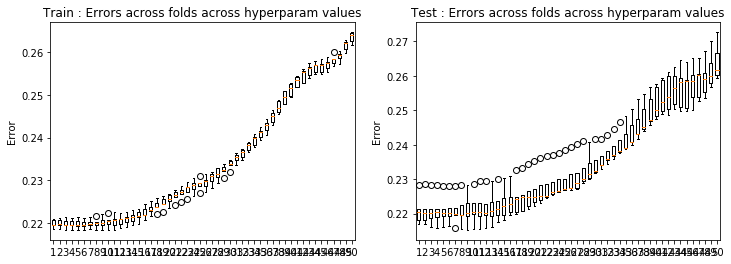

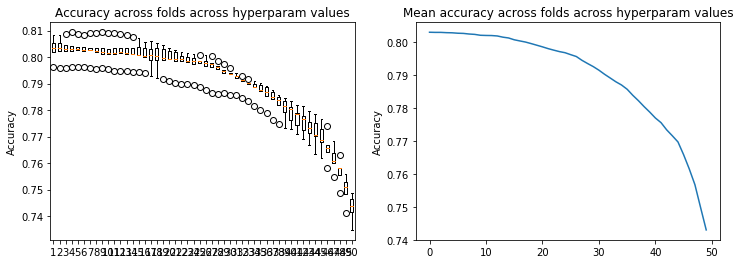

In [54]:
result_crossval(loss_tr32,loss_te32)
result_crossval_accuracy(acc32)

In [25]:
# test 33: degree 7, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr33, loss_te33, w33, acc33 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 7, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  2.17353944e+00  2.38996311e-01 -2.00302389e+00
  1.92793190e+00  2.53309665e-01 -4.02704776e+00  1.16471249e+00
 -5.89274940e-02  5.27033384e-01  1.20315498e-02 -3.40908397e-02
  1.01508080e+00  1.96057098e-02  2.94505269e-02 -9.48632589e-02
  9.24109888e-03 -6.30918904e-02 -5.28171698e-03  9.94392148e-03
 -2.74919785e+01 -1.43214308e+00  3.21322272e+00 -3.97494698e+00
 -3.30911364e-01  1.56131505e+01 -2.37731353e+00  7.93763607e-02
  1.18998465e+00  8.88474397e-03 -1.66087415e-02 -4.79226524e+00
 -5.57560654e-02  6.15473623e-03  1.46941855e+00 -3.59527697e-03
 -4.88248307e-01  1.81991374e-01 -3.89590698e-02  9.58102404e+01
  4.73193854e+00  1.02159323e+01  4.20929351e+00 -1.85259651e+00
 -1.97411688e+01  2.58487570e+00  3.60836852e-01 -3.87607951e+00
 -1.08790340e-01  1.8237

Ridge regression: w=[-2.76819782e-01  2.06889287e+00  1.70718940e-01 -1.91717570e+00
  1.72342571e+00  1.76009294e-01 -2.76336611e+00  1.40561411e+00
 -4.61734458e-02  1.20457731e+00  2.68146967e-02 -2.50928101e-02
  1.35372971e+00  4.84560164e-03  1.42097226e-02 -2.74836374e-01
  2.56633286e-03 -1.78704743e-01 -1.45814030e-03 -1.44166898e-03
 -2.70344891e+01 -1.06250604e+00  2.85378403e+00 -2.81542312e+00
  1.03215939e-01  1.08295161e+01 -2.20847941e+00  8.12810019e-02
 -1.45506171e+00  2.30157682e-02  1.62549930e-02 -6.47450115e+00
 -6.51810755e-02  9.89244858e-04  2.49727914e+00  1.75475865e-03
 -2.22717694e-01  1.79673075e-01 -1.85848136e-02  9.51608448e+01
  4.16497941e+00  1.09613915e+01  1.71644057e+00 -3.24086968e+00
 -1.32840739e+01  6.41192904e-01  1.91939724e-01  4.25895382e-01
 -1.84847118e-01  1.24652039e-01  9.88180944e+00 -3.74074564e-02
 -3.91680169e-02 -6.61145109e+00  1.22963473e-02  2.92050910e+00
 -2.97481287e-02  2.61627034e-03 -1.31394057e+02 -1.40916015e+01
 -3.9

Ridge regression: w=[-2.78869250e-01  1.58177740e+00  1.57480419e-01 -2.10555739e+00
  1.65541006e+00  2.47398235e-01 -3.01735199e+00  1.49625849e+00
 -4.42917136e-02  8.94458666e-01  3.15500881e-02 -2.73829922e-02
  7.00900233e-01  1.80084912e-03  1.00958289e-02 -1.75725768e-03
  9.96572704e-03 -1.42205994e-01 -4.97709947e-03  2.06090385e-03
 -2.33158822e+01 -9.67200127e-01  4.09322351e+00 -2.29299561e+00
 -7.38172915e-01  1.16804739e+01 -2.52513366e+00  1.11222429e-01
  1.92484855e-01  1.00817685e-02  1.85268481e-03 -4.57139222e+00
 -7.57195785e-02 -1.46528721e-02  6.61191469e-01 -1.17045100e-02
 -2.09598472e-01  1.85672870e-01  7.24309636e-03  8.26450211e+01
  3.60855267e+00  6.62908064e+00  1.16937822e+00  8.52529766e-01
 -1.41314298e+01  1.32361563e+00  1.89241786e-01 -2.39701962e+00
 -2.08009658e-01  1.69093436e-01  8.27360141e+00 -4.88294995e-02
 -2.15723275e-02 -1.35613635e+00 -5.54430989e-02  2.10014692e+00
  5.99674428e-04 -3.85544720e-02 -1.08609356e+02 -1.25694741e+01
 -3.0

Ridge regression: w=[-2.78727903e-01  1.08836292e+00  1.19831296e-01 -1.91250497e+00
  1.79032709e+00  3.40371663e-01 -2.21320297e+00  7.87660325e-01
 -7.78444391e-02  1.43262872e+00  1.41637406e-02 -1.63630979e-02
  8.28209346e-01  4.75471351e-03  1.25483654e-02 -1.47707009e-01
  2.10627829e-02 -6.48204652e-02 -5.37355384e-03 -6.96705618e-04
 -1.99111884e+01 -3.00459758e-01  3.54245437e+00 -3.06599179e+00
 -1.16330405e+00  8.41308321e+00 -8.22428302e-01  5.51706328e-02
 -2.85657333e+00  4.51331878e-04 -1.38004750e-03 -3.48911171e+00
 -4.98415560e-02  2.23308565e-03  1.68243939e+00  1.17166644e-02
 -3.75306078e-01  1.63313687e-01 -2.32251989e-02  7.24705300e+01
  3.16068927e-01  5.64837828e+00  2.61863052e+00  1.16262815e+00
 -9.25981096e+00 -4.77343927e-01  3.31272870e-01  2.66207816e+00
 -1.23944067e-01  1.06044195e-01  4.83668300e+00 -5.42814180e-02
 -6.60126765e-02 -4.41965505e+00 -1.00429839e-01  2.11139356e+00
  1.00674242e-02 -2.88519170e-02 -9.14981767e+01 -4.75505464e+00
 -2.4

Ridge regression: w=[-2.75017651e-01  3.88313718e-01  1.00316681e-01 -2.22906473e+00
  2.07701935e+00  2.99858584e-01 -2.16658089e+00  9.23872958e-01
 -9.32969511e-02  1.14359744e+00  2.71461236e-02 -4.42907887e-02
  2.89063495e-01  8.52855799e-03  2.50128827e-02 -1.68909550e-01
  6.17057693e-03 -1.47206681e-01 -1.16394972e-02 -1.94120626e-02
 -1.54358167e+01 -2.06822417e-01  5.42763435e+00 -4.14208013e+00
 -9.88497699e-01  8.42592132e+00 -3.71577481e-01  9.67142805e-02
 -9.51609148e-01  1.46451267e-02 -2.92045678e-03 -2.15442780e+00
 -7.06653787e-02 -2.79587568e-03  1.92823000e+00  7.82950596e-03
  1.41095416e-01  1.80214123e-01 -1.13761990e-03  6.04810899e+01
  4.78966682e-02  1.20412617e+00  4.00174088e+00  1.01770259e+00
 -9.55442736e+00 -2.12147681e+00  3.93972625e-01 -1.22170701e+00
 -2.03107293e-01  2.05283470e-01  3.75508840e+00 -6.13341164e-02
 -1.25501864e-01 -5.44430757e+00 -5.08338379e-02  1.06604587e+00
  3.16283881e-02  4.98714724e-02 -7.57564064e+01 -4.14144746e+00
 -1.8

Ridge regression: w=[-2.76431071e-01  3.46917712e-02  1.45299765e-01 -1.88888312e+00
  2.23040015e+00  2.93974360e-01 -2.29033111e+00  1.04990899e+00
 -5.55959802e-02  7.16108927e-01  1.22923281e-02 -3.40552183e-02
  2.59960726e-01  2.01355693e-02  2.88506315e-02 -8.63749306e-02
  9.62036656e-03 -1.92963110e-01 -5.45338128e-03  9.96276096e-03
 -1.31667203e+01 -4.09897174e-01  3.91196042e+00 -5.32276325e+00
 -8.16391955e-01  8.32392695e+00 -1.79666826e+00  7.49008888e-02
  2.01381405e-01  9.26663284e-03 -1.63852765e-02 -1.63087044e+00
 -5.63663103e-02  6.55733141e-03  1.45208838e+00 -2.75630058e-03
  2.01470771e-01  1.81996871e-01 -3.93814447e-02  5.40847063e+01
  1.21107523e-01  3.04590425e+00  6.86536472e+00  5.63451733e-01
 -8.55395911e+00  1.14538039e+00  3.36425237e-01 -1.92522018e+00
 -1.11306478e-01  1.80307348e-01  2.69880046e+00 -1.29694067e-01
 -1.20069467e-01 -4.41687136e+00 -6.51926590e-02  1.21789352e+00
 -5.47342822e-03 -7.63361158e-02 -6.62605895e+01 -2.95567542e+00
 -1.6

Ridge regression: w=[-2.76819763e-01 -6.13889943e-02  7.30018896e-02 -1.80572440e+00
  2.12222740e+00  2.36441770e-01 -1.62833077e+00  1.46034268e+00
 -4.38901220e-02  1.18044273e+00  2.69018335e-02 -2.52424913e-02
  3.19640335e-01  5.32073497e-03  1.35002995e-02 -2.49566149e-01
  2.86340560e-03 -3.31204849e-01 -1.73695095e-03 -1.54311468e-03
 -1.27603787e+01  9.73392331e-03  3.62294183e+00 -4.70140847e+00
 -6.15954823e-01  6.08430443e+00 -2.21887849e+00  7.67982414e-02
 -1.28574791e+00  2.35987368e-02  1.64438494e-02 -2.27080517e+00
 -6.52420378e-02  1.38697248e-03  2.33895294e+00  2.71164167e-03
  5.61439633e-01  1.79535838e-01 -1.89301255e-02  5.36211969e+01
 -6.84387551e-01  3.45848942e+00  5.50500498e+00  3.20657782e-01
 -6.06141417e+00  3.34073571e-01  1.72422447e-01  3.10541292e-01
 -1.86159481e-01  1.24028950e-01  3.71612597e+00 -3.92392758e-02
 -3.71451658e-02 -6.18707438e+00  1.13900206e-02  1.30668597e+00
 -2.93026469e-02  2.00363591e-03 -6.61674505e+01 -2.62787452e+00
 -1.7

Ridge regression: w=[-2.78869221e-01 -5.98868685e-01  6.84775095e-02 -1.87588839e+00
  2.04251251e+00  2.54108760e-01 -1.74084601e+00  1.45421822e+00
 -4.09449974e-02  1.00836075e+00  3.16607223e-02 -2.78056995e-02
 -2.18503120e-01  2.29863230e-03  9.74356386e-03 -2.49964597e-02
  1.05930620e-02 -2.84847422e-01 -5.05134012e-03  1.71477525e-03
 -9.49945302e+00  2.93866532e-02  3.89293126e+00 -3.85714995e+00
 -8.35558996e-01  6.32422621e+00 -2.28356335e+00  1.06453280e-01
 -4.16748716e-01  1.09023678e-02  2.58335646e-03 -6.85000515e-01
 -7.54993925e-02 -1.43494913e-02  9.57111077e-01 -1.10385526e-02
  4.67473525e-01  1.85412821e-01  7.10561055e-03  4.54369452e+01
 -9.62899609e-01  2.56353301e+00  3.60069012e+00  1.39554506e+00
 -5.93519529e+00  7.10903569e-01  1.66153735e-01 -1.08696292e+00
 -2.09650129e-01  1.69617140e-01  2.35163215e+00 -5.07660771e-02
 -2.10309219e-02 -2.80690861e+00 -5.74132569e-02  9.65973571e-01
  5.46140449e-04 -3.82939544e-02 -5.65869827e+01 -1.63252475e+00
 -1.4

Ridge regression: w=[-2.78727862e-01 -1.15606401e+00  8.66660489e-02 -1.63146566e+00
  2.15008210e+00  3.55544486e-01 -1.38493519e+00  8.93091607e-01
 -7.65953792e-02  1.20655453e+00  1.44243941e-02 -1.55758581e-02
  2.21643930e-01  5.05521063e-03  1.25133190e-02 -1.27566232e-01
  2.19758788e-02 -2.18647153e-01 -5.13054773e-03  4.36141984e-04
 -6.23041608e+00  1.29401328e-01  2.79111497e+00 -4.32416276e+00
 -1.40233154e+00  4.98203384e+00 -1.04882792e+00  5.18567370e-02
 -1.78874784e+00  8.13186926e-04 -1.23227260e-03 -1.08921883e+00
 -4.99308798e-02  2.36569600e-03  1.60393175e+00  1.29069307e-02
  3.72766161e-01  1.62933355e-01 -2.34359859e-02  3.80305797e+01
 -1.83175025e+00  4.04653442e+00  4.22170210e+00  2.55785065e+00
 -4.07722377e+00 -3.06699889e-01  3.24218264e-01  1.07606422e+00
 -1.26019277e-01  1.01840000e-01  1.35382759e+00 -5.56455944e-02
 -6.61388250e-02 -4.45450102e+00 -1.03712728e-01  8.01544876e-01
  8.43487254e-03 -3.33132248e-02 -4.92688151e+01  7.00312007e-01
 -1.4

Ridge regression: w=[-2.75017591e-01 -1.89048484e+00  7.55941798e-02 -1.88795454e+00
  2.28212523e+00  3.09243923e-01 -1.23867981e+00  1.33081864e+00
 -9.27539062e-02  1.41013895e+00  2.73335821e-02 -4.39130783e-02
 -2.90282200e-01  8.94139559e-03  2.44804124e-02 -1.11807594e-01
  7.41088831e-03 -2.65433046e-01 -1.16570662e-02 -1.91985637e-02
 -1.92431943e+00  1.44485946e-01  4.20133157e+00 -4.56832679e+00
 -1.15892801e+00  4.62712904e+00 -1.46877553e+00  9.27109494e-02
 -1.70571252e+00  1.46637835e-02 -2.90966381e-03 -1.39737458e-01
 -7.13138630e-02 -2.30402511e-03  1.54936084e+00  8.24748501e-03
  7.14202853e-01  1.80092740e-01 -1.43562281e-03  2.81058866e+01
 -1.81437908e+00  1.32070949e+00  3.91860737e+00  2.06566349e+00
 -3.91163645e+00 -7.00065401e-01  3.89684450e-01  5.08416842e-02
 -2.05077903e-01  2.03695262e-01  8.70380332e-01 -6.24979806e-02
 -1.22302417e-01 -4.39662248e+00 -5.52062656e-02  3.77836054e-02
  3.13340085e-02  4.93984063e-02 -4.01538435e+01  7.88209807e-01
 -1.2

Ridge regression: w=[-2.76430984e-01 -2.32349286e+00  1.30052206e-01 -1.65998798e+00
  2.31427312e+00  2.98082216e-01 -1.43810582e+00  9.30495951e-01
 -5.47917373e-02  7.78069639e-01  1.25711453e-02 -3.34840757e-02
 -6.71094496e-02  2.08351225e-02  2.82265180e-02 -3.02173898e-02
  1.10942513e-02 -3.18254282e-01 -5.85180785e-03  1.06289984e-02
  5.30577326e-01 -1.75127447e-01  3.18862102e+00 -4.87974652e+00
 -9.05922979e-01  4.91705494e+00 -1.37747301e+00  7.09327554e-02
 -3.25488908e-01  9.62038809e-03 -1.62469663e-02 -1.84409292e-01
 -5.73540026e-02  7.21663520e-03  1.10502166e+00 -1.69441113e-03
  8.39861693e-01  1.81497208e-01 -4.02361842e-02  2.25492372e+01
 -1.18311836e+00  2.63403431e+00  4.78861258e+00  1.15270834e+00
 -3.61462705e+00  3.95352518e-01  3.29183706e-01 -7.18822478e-01
 -1.15445426e-01  1.76455998e-01  5.21483622e-01 -1.31957376e-01
 -1.19114451e-01 -3.59851122e+00 -7.03424501e-02 -7.84377166e-03
 -4.33570313e-03 -7.96720978e-02 -3.50488057e+01  6.12439242e-01
 -1.1

Ridge regression: w=[-2.76819676e-01 -2.40204391e+00  6.37285011e-02 -1.57426635e+00
  2.29740878e+00  2.41785117e-01 -1.05268934e+00  1.43504092e+00
 -4.51517459e-02  1.06761818e+00  2.71638201e-02 -2.52596935e-02
 -1.33228121e-01  5.61042926e-03  1.20567425e-02 -1.72166951e-01
  4.31993254e-03 -4.88418599e-01 -2.06052668e-03 -1.26711561e-03
  8.71007418e-01  2.14080224e-01  2.91145449e+00 -4.75522226e+00
 -7.43638837e-01  3.79745394e+00 -2.18577242e+00  7.37566094e-02
 -9.39154938e-01  2.46025403e-02  1.64104439e-02 -3.38722136e-01
 -6.54788464e-02  1.56778952e-03  1.84513702e+00  4.30919240e-03
  1.35831856e+00  1.78848646e-01 -1.99520051e-02  2.21987251e+01
 -1.96691573e+00  2.96558942e+00  4.38874445e+00  1.17509403e+00
 -2.77268248e+00  3.42860157e-01  1.75896074e-01 -1.71499176e-02
 -1.89406411e-01  1.23020794e-01  8.01944141e-01 -4.06799691e-02
 -3.23224339e-02 -4.95137119e+00  5.64294658e-03 -1.97629355e-01
 -2.90856257e-02 -8.28932938e-04 -3.51160296e+01  1.08608082e+00
 -1.1

Ridge regression: w=[-2.78869094e-01 -2.90914348e+00  7.30256633e-02 -1.78160592e+00
  2.30917417e+00  2.41850832e-01 -1.14287849e+00  1.28051830e+00
 -4.12228417e-02  9.31230488e-01  3.17830030e-02 -2.83755927e-02
 -4.57461712e-01  2.79649532e-03  9.36376503e-03  2.05357417e-02
  1.23139179e-02 -4.18732114e-01 -5.46670474e-03  1.41591396e-03
  3.79265151e+00  1.14271597e-01  3.77209326e+00 -4.27777655e+00
 -7.59514455e-01  4.01339900e+00 -1.91512445e+00  1.03534311e-01
 -4.92391183e-01  1.19890299e-02  2.95144712e-03  5.99637466e-01
 -7.54936093e-02 -1.39446519e-02  7.09731709e-01 -1.02356245e-02
  1.13533624e+00  1.84820914e-01  6.87981885e-03  1.55504833e+01
 -1.80919095e+00  1.35669241e+00  2.95895239e+00  1.26167552e+00
 -2.73456475e+00  3.65684159e-01  1.66357058e-01 -5.45061282e-01
 -2.12729062e-01  1.70957460e-01  1.87490585e-01 -5.31793969e-02
 -2.01168987e-02 -2.39604729e+00 -6.39381182e-02 -2.37120905e-01
  1.62123510e-03 -3.85250309e-02 -2.92293712e+01  1.25108649e+00
 -1.0

Ridge regression: w=[-2.78727676e-01 -3.31428098e+00  1.18794929e-01 -1.73040445e+00
  2.36479966e+00  3.21722275e-01 -9.35904457e-01  8.85677869e-01
 -7.82424911e-02  9.96043737e-01  1.48248134e-02 -1.43542581e-02
  3.88423415e-02  5.42047883e-03  1.25150571e-02 -3.50023131e-02
  2.36772908e-02 -3.28089209e-01 -5.13243063e-03  2.14383927e-03
  6.25406427e+00 -3.61885516e-02  3.65549131e+00 -4.43095082e+00
 -1.19021225e+00  3.40426163e+00 -1.12633152e+00  5.09489427e-02
 -1.08169903e+00  1.26087120e-03 -1.24914710e-03 -3.00345467e-01
 -5.02910181e-02  2.21771647e-03  1.02590950e+00  1.45222177e-02
  9.41471693e-01  1.62352266e-01 -2.42756029e-02  1.01210961e+01
 -1.70678716e+00  1.13159425e+00  2.90145132e+00  2.16369020e+00
 -2.16748305e+00 -4.15232548e-02  3.34785059e-01  2.37310231e-01
 -1.29666090e-01  9.59669600e-02  1.79554079e-01 -5.77989688e-02
 -6.58856988e-02 -3.08686606e+00 -1.09523399e-01 -2.60251462e-01
  7.30689437e-03 -3.91752768e-02 -2.49179535e+01  1.57736554e+00
 -9.4

Ridge regression: w=[-2.75017324e-01 -3.69782554e+00  1.13510027e-01 -1.96519224e+00
  2.31798196e+00  2.75497084e-01 -7.28463883e-01  1.19178615e+00
 -9.55168116e-02  1.20715059e+00  2.74613147e-02 -4.32820128e-02
 -3.14264169e-01  9.11847495e-03  2.36848031e-02  1.01250008e-03
  9.12646736e-03 -3.11660769e-01 -1.19832501e-02 -1.88995042e-02
  8.59497496e+00 -8.02994318e-02  5.00847935e+00 -4.13026227e+00
 -9.41883712e-01  2.89622463e+00 -1.44580622e+00  9.24760405e-02
 -1.43164415e+00  1.48062370e-02 -3.19269753e-03  2.65882632e-01
 -7.24112708e-02 -1.77276507e-03  8.30232550e-01  8.28999936e-03
  9.74971937e-01  1.80029253e-01 -1.81605185e-03  4.58559269e+00
 -1.48298512e+00 -1.38712138e+00  2.11255477e+00  1.61508889e+00
 -1.95686802e+00 -2.21301210e-01  4.03096191e-01  2.49747826e-01
 -2.07059872e-01  2.01283681e-01  5.89184579e-02 -6.28024110e-02
 -1.17784662e-01 -2.61374880e+00 -6.08940015e-02 -4.89389447e-01
  3.18090652e-02  4.91017025e-02 -2.00351496e+01  1.32526703e+00
 -8.0

Ridge regression: w=[-2.76430592e-01 -3.86824172e+00  1.59785306e-01 -1.85917931e+00
  2.21040679e+00  2.79532730e-01 -8.45604182e-01  7.17146693e-01
 -5.66261282e-02  6.29873310e-01  1.27267099e-02 -3.24703952e-02
 -7.58503212e-02  2.16006261e-02  2.77146007e-02  8.14946985e-02
  1.27960914e-02 -3.49695517e-01 -6.47902718e-03  1.13497240e-02
  9.69464488e+00 -3.64316896e-01  4.66276632e+00 -3.83979086e+00
 -7.94180171e-01  3.06556505e+00 -9.73808673e-01  7.11682560e-02
 -2.36201874e-01  9.87305954e-03 -1.58447369e-02  1.19769963e-01
 -5.85931286e-02  8.06454039e-03  3.92162234e-01 -1.28858176e-03
  1.05989875e+00  1.81435340e-01 -4.10198764e-02  1.82779462e+00
 -8.55087419e-01 -1.35954027e+00  2.00758052e+00  9.41661815e-01
 -1.85634664e+00  1.09076498e-01  3.33315105e-01 -3.68420306e-01
 -1.18888250e-01  1.71389129e-01 -5.89490818e-02 -1.34386182e-01
 -1.18020543e-01 -1.84622544e+00 -7.58617012e-02 -5.27199033e-01
 -2.37951491e-03 -8.19787646e-02 -1.74671849e+01  8.90323266e-01
 -7.2

Ridge regression: w=[-2.76819284e-01 -3.91953558e+00  1.10602405e-01 -1.78741046e+00
  2.22276606e+00  2.15692851e-01 -6.10133667e-01  1.08870264e+00
 -5.01121461e-02  7.62840424e-01  2.73314949e-02 -2.50768314e-02
 -9.73117456e-02  5.87803940e-03  1.06000631e-02 -2.82840991e-02
  5.83695560e-03 -5.16914907e-01 -2.47210050e-03 -8.96433852e-04
  9.93546338e+00 -8.95330060e-02  4.45052500e+00 -3.88224886e+00
 -5.76767823e-01  2.43359604e+00 -1.67479103e+00  7.51829501e-02
 -4.35742028e-01  2.54594231e-02  1.63784880e-02  2.02240693e-02
 -6.60251556e-02  1.51885245e-03  9.27340399e-01  5.49249983e-03
  1.60571799e+00  1.78535215e-01 -2.13670603e-02  1.60567738e+00
 -1.37242312e+00 -1.14258066e+00  1.94286385e+00  8.37774120e-01
 -1.51389084e+00  3.05743348e-01  1.98586580e-01 -2.13471389e-01
 -1.91787404e-01  1.21708719e-01  8.10715302e-03 -4.20981745e-02
 -2.66063461e-02 -2.68908190e+00  9.89316329e-05 -8.37589385e-01
 -2.84306406e-02 -2.58741840e-03 -1.76010903e+01  1.18119920e+00
 -7.2

Ridge regression: w=[-2.78868519e-01 -4.04186911e+00  1.24259327e-01 -1.93683106e+00
  2.14359866e+00  2.14793292e-01 -5.89435234e-01  8.56456317e-01
 -4.51890682e-02  6.37443669e-01  3.17735613e-02 -2.84557158e-02
 -2.52748547e-01  3.30159439e-03  9.34197106e-03  1.04233555e-01
  1.38988987e-02 -4.20060113e-01 -5.91382875e-03  1.44116865e-03
  1.08541432e+01 -2.30282219e-01  5.08732747e+00 -3.39837098e+00
 -5.70924620e-01  2.38677005e+00 -1.25122483e+00  1.06087599e-01
 -1.58945245e-01  1.27431375e-02  3.30483192e-03  4.93504597e-01
 -7.58584142e-02 -1.32009871e-02  1.85488477e-01 -1.03802783e-02
  1.25178764e+00  1.84663456e-01  6.54770304e-03 -9.83676512e-01
 -1.05722352e+00 -2.30900019e+00  1.12806551e+00  7.65887867e-01
 -1.44629952e+00  1.95942417e-01  1.85211389e-01 -4.35997519e-01
 -2.14774066e-01  1.70733592e-01 -2.23185637e-01 -5.52884347e-02
 -1.93530195e-02 -1.14811026e+00 -6.87231017e-02 -6.36584745e-01
  2.95313716e-03 -3.78311285e-02 -1.49263328e+01  1.04602626e+00
 -6.3

Ridge regression: w=[-2.78726839e-01 -4.03392797e+00  1.70232577e-01 -1.84432223e+00
  2.01165614e+00  2.65622744e-01 -3.66119953e-01  6.06232265e-01
 -8.19917289e-02  6.77659484e-01  1.49271267e-02 -1.31305435e-02
  1.06745350e-01  5.99041753e-03  1.28741397e-02  7.64708572e-02
  2.49006273e-02 -3.02657919e-01 -5.13301788e-03  3.52514607e-03
  1.13272010e+01 -4.05527400e-01  4.90673148e+00 -3.11011587e+00
 -8.04115220e-01  1.83520422e+00 -7.38994488e-01  5.55321920e-02
 -4.80292509e-01  1.27415075e-03 -5.47369882e-04 -2.17566108e-01
 -5.07959807e-02  2.17961308e-03  3.14871642e-01  1.51775676e-02
  9.57141915e-01  1.62736686e-01 -2.53209960e-02 -2.76844814e+00
 -7.93582154e-01 -2.52977913e+00  9.28894198e-01  1.16146906e+00
 -1.18488874e+00 -8.10785671e-03  3.50174927e-01 -8.93140635e-02
 -1.31203337e-01  9.06338340e-02 -9.64226934e-02 -6.05967734e-02
 -6.56986337e-02 -1.33674445e+00 -1.12158137e-01 -5.31394246e-01
  6.57321650e-03 -4.14912818e-02 -1.30262392e+01  9.38932512e-01
 -5.6

Ridge regression: w=[-2.75016121e-01 -3.96708289e+00  1.55376220e-01 -1.84369473e+00
  1.75514502e+00  2.29177130e-01 -1.54104707e-01  6.88606044e-01
 -9.85688990e-02  7.06710864e-01  2.68586338e-02 -4.20181273e-02
 -7.87133107e-02  9.31667549e-03  2.25675537e-02  9.95941667e-02
  1.04612549e-02 -2.44776351e-01 -1.24349670e-02 -1.84602673e-02
  1.14204445e+01 -4.01215613e-01  5.32963487e+00 -2.44715606e+00
 -6.32456440e-01  1.31998026e+00 -7.68540913e-01  9.85179987e-02
 -6.29187526e-01  1.52139485e-02 -2.67553003e-03  6.91473774e-02
 -7.38725181e-02 -6.01607274e-04  2.03297245e-01  7.41122526e-03
  8.15038610e-01  1.80567328e-01 -1.89743503e-03 -4.01294877e+00
 -6.60197279e-01 -3.56457919e+00  3.75945979e-01  8.24812769e-01
 -9.92614776e-01 -1.54006311e-01  4.10708597e-01  8.01597070e-02
 -2.05051817e-01  1.95459032e-01 -9.44116124e-02 -6.27499508e-02
 -1.11132109e-01 -1.06905899e+00 -6.29388269e-02 -5.02984455e-01
  3.32579762e-02  5.01279311e-02 -1.10295602e+01  7.14732868e-01
 -4.9

Ridge regression: w=[-2.76428832e-01 -3.78792070e+00  1.79553974e-01 -1.68239826e+00
  1.50456061e+00  2.53375708e-01 -1.69733987e-01  4.20658375e-01
 -5.90664902e-02  4.11138568e-01  1.22444684e-02 -2.99877353e-02
  4.92128673e-02  2.23909660e-02  2.74677263e-02  1.57536283e-01
  1.42382139e-02 -2.52169979e-01 -7.04754015e-03  1.21065382e-02
  1.09814867e+01 -5.43826700e-01  4.81114425e+00 -1.84255470e+00
 -6.48157198e-01  1.25348305e+00 -5.03727098e-01  7.72656193e-02
  6.36098686e-03  9.79942033e-03 -1.42540440e-02  9.37479147e-03
 -6.01271007e-02  1.02633981e-02 -1.03438450e-01 -2.48858533e-03
  8.08998459e-01  1.82670569e-01 -4.06732726e-02 -4.25687348e+00
 -3.58364848e-01 -3.31034167e+00  1.62523350e-01  6.26537062e-01
 -8.66030593e-01 -2.54735129e-02  3.30464119e-01 -2.87884929e-01
 -1.17913660e-01  1.61398239e-01 -1.47058778e-01 -1.36446380e-01
 -1.14526145e-01 -5.85159345e-01 -7.90011685e-02 -4.90522912e-01
 -2.72371911e-05 -8.07538846e-02 -9.75920033e+00  5.05098829e-01
 -4.3

Ridge regression: w=[-2.76817521e-01 -3.81165113e+00  1.48117981e-01 -1.64291174e+00
  1.51617822e+00  1.88298030e-01 -7.29844277e-02  5.44848416e-01
 -5.60515243e-02  4.04009281e-01  2.66752544e-02 -2.39130005e-02
  1.14316216e-01  6.64826448e-03  9.96250873e-03  7.48020721e-02
  6.69911265e-03 -3.61803204e-01 -2.79996616e-03 -3.78196728e-04
  1.11275023e+01 -3.86887047e-01  4.71035182e+00 -1.89315250e+00
 -3.94922044e-01  1.00033980e+00 -8.39752381e-01  8.18141854e-02
  6.65284090e-05  2.50876078e-02  1.72510814e-02 -1.16772351e-01
 -6.71393441e-02  1.97486051e-03  2.76708012e-01  4.73163392e-03
  1.19150340e+00  1.79506462e-01 -2.24074330e-02 -4.40056265e+00
 -5.96482687e-01 -3.20986217e+00  1.41916114e-01  3.85764546e-01
 -7.44629087e-01  1.61173714e-01  2.20594197e-01 -2.59728618e-01
 -1.88069479e-01  1.16847658e-01 -1.62841891e-01 -4.51827852e-02
 -2.22391671e-02 -1.08027655e+00 -1.32379842e-03 -7.32155537e-01
 -2.69878247e-02 -4.89781312e-04 -9.85351365e+00  5.73453430e-01
 -4.3

Ridge regression: w=[-2.78865932e-01 -3.57217926e+00  1.50427147e-01 -1.59068764e+00
  1.29971420e+00  1.89630899e-01 -2.62306289e-03  4.04827238e-01
 -5.05277257e-02  3.84885614e-01  3.09159420e-02 -2.69340821e-02
  2.94719676e-02  4.16927225e-03  9.99622337e-03  1.49091371e-01
  1.50104412e-02 -2.69402545e-01 -6.06350496e-03  2.32098761e-03
  1.04500025e+01 -4.63936359e-01  4.61042950e+00 -1.30222329e+00
 -4.18054925e-01  8.27282714e-01 -5.55088137e-01  1.13314100e-01
  4.93971645e-02  1.26736170e-02  4.82177847e-03  7.82948706e-02
 -7.72148080e-02 -1.10023479e-02 -1.03060218e-01 -1.24442852e-02
  8.38586977e-01  1.85526694e-01  6.74539316e-03 -4.36729307e+00
 -4.03900207e-01 -3.33980806e+00 -2.39517134e-01  3.97235150e-01
 -6.47726244e-01  5.74460940e-02  2.03294155e-01 -3.41196249e-01
 -2.11061867e-01  1.63662340e-01 -1.99195380e-01 -5.80405103e-02
 -1.87625051e-02 -4.10673981e-01 -6.91095798e-02 -4.81769056e-01
  3.85388148e-03 -3.58763998e-02 -8.52727288e+00  4.85465136e-01
 -3.8

Ridge regression: w=[-2.78723074e-01 -3.23450581e+00  1.82717132e-01 -1.36897224e+00
  1.03554688e+00  2.19608437e-01  1.48402297e-01  3.31416784e-01
 -8.33808910e-02  4.34480472e-01  1.41146242e-02 -1.08170484e-02
  1.80865177e-01  7.06807987e-03  1.40080209e-02  1.26122155e-01
  2.51107879e-02 -1.54111309e-01 -4.68164932e-03  4.35906536e-03
  9.54185445e+00 -5.59772663e-01  4.00618750e+00 -8.32165582e-01
 -5.37884836e-01  4.83075798e-01 -3.28152059e-01  6.39835850e-02
 -1.21642516e-01 -2.70141927e-04  2.12861703e-03 -2.41671880e-01
 -5.20329705e-02  2.73680131e-03 -3.28650629e-03  1.45021720e-02
  5.43637470e-01  1.64775651e-01 -2.56318731e-02 -4.11631612e+00
 -2.95606561e-01 -3.03177421e+00 -3.05082554e-01  5.45448348e-01
 -5.44168912e-01 -5.63338309e-02  3.41495847e-01 -1.81145877e-01
 -1.27299584e-01  8.03404044e-02 -1.59121826e-01 -6.49228276e-02
 -6.61054508e-02 -5.21352264e-01 -1.09248316e-01 -3.54035840e-01
  4.81161993e-03 -3.69921466e-02 -7.35773825e+00  4.36817089e-01
 -3.2

Ridge regression: w=[-2.75010711e-01 -2.90512469e+00  1.57780409e-01 -1.13726753e+00
  7.61401380e-01  1.90021231e-01  2.49407652e-01  3.58670767e-01
 -9.55672380e-02  3.80996079e-01  2.42756819e-02 -3.84285604e-02
  6.44160965e-02  9.73592696e-03  2.06770575e-02  1.39463746e-01
  1.15758985e-02 -9.41265397e-02 -1.31076141e-02 -1.73346676e-02
  8.51835404e+00 -4.95047077e-01  3.60163748e+00 -3.40932236e-01
 -4.27078001e-01  2.48070668e-01 -3.11531141e-01  1.07620877e-01
 -1.11073885e-01  1.53842632e-02 -4.40785334e-04 -8.40848508e-02
 -7.65222492e-02  2.20116764e-03 -4.40545043e-02  5.31095908e-03
  3.84581744e-01  1.81963764e-01 -7.37104491e-04 -3.59306565e+00
 -3.08507141e-01 -3.04070844e+00 -4.78008375e-01  3.89398593e-01
 -4.69725444e-01 -1.53120346e-01  3.78803460e-01 -4.84801591e-02
 -1.93077407e-01  1.76999021e-01 -1.12674118e-01 -6.22708290e-02
 -9.83066742e-02 -4.48770485e-01 -6.07840413e-02 -2.78351090e-01
  3.63794614e-02  5.14848401e-02 -6.19669481e+00  3.38756281e-01
 -2.8

Ridge regression: w=[-2.76420912e-01 -2.54657924e+00  1.69684541e-01 -9.41341657e-01
  5.60209135e-01  2.13427689e-01  2.17232275e-01  2.39663333e-01
 -5.72050113e-02  3.18330108e-01  1.01420268e-02 -2.39039906e-02
  1.24041695e-01  2.24447251e-02  2.66181339e-02  1.72527357e-01
  1.49185136e-02 -8.65696555e-02 -7.33606062e-03  1.22831017e-02
  7.39396128e+00 -5.53532642e-01  2.93212574e+00  5.23874904e-03
 -4.80711938e-01  2.29463736e-01 -2.20181981e-01  8.52576812e-02
  3.86222475e-02  8.52383693e-03 -1.08321049e-02 -9.53403112e-02
 -6.27777104e-02  1.45758206e-02 -2.24554934e-01 -4.76790959e-03
  3.37233531e-01  1.85260160e-01 -3.80040752e-02 -2.89989208e+00
 -2.11945911e-01 -2.53578152e+00 -4.35955466e-01  3.81289213e-01
 -3.81389130e-01 -9.24377379e-02  2.98795859e-01 -1.95988182e-01
 -1.08175864e-01  1.35051190e-01 -1.40347311e-01 -1.33521470e-01
 -1.03788549e-01 -1.86037845e-01 -7.67892171e-02 -2.44358858e-01
  2.18163147e-03 -7.21098060e-02 -5.24218486e+00  2.96954664e-01
 -2.3

Ridge regression: w=[-2.76809590e-01 -2.54946643e+00  1.50188761e-01 -9.29217683e-01
  5.63095173e-01  1.65265430e-01  2.43569052e-01  2.29863896e-01
 -5.93577576e-02  2.69652139e-01  2.38459844e-02 -2.04040745e-02
  2.10996248e-01  8.04118451e-03  9.88796972e-03  1.20277271e-01
  7.55575410e-03 -1.21516865e-01 -3.12518800e-03 -6.10529035e-05
  7.45562811e+00 -4.65514926e-01  2.92387505e+00 -2.13201628e-02
 -2.78756678e-01  1.63133207e-01 -3.13774775e-01  8.96556530e-02
  6.06159238e-02  2.26027587e-02  1.94336017e-02 -2.00355297e-01
 -6.92637358e-02  3.41005682e-03  2.42276652e-02  2.27555880e-03
  4.90975482e-01  1.81807493e-01 -2.26634925e-02 -2.97207838e+00
 -3.11127942e-01 -2.50940163e+00 -4.63699022e-01  1.59844772e-01
 -3.50852775e-01  2.52788206e-02  2.29422771e-01 -1.75812298e-01
 -1.71495243e-01  1.00507946e-01 -1.94115787e-01 -4.96544831e-02
 -1.88754340e-02 -4.85754427e-01 -2.28937462e-03 -3.51030925e-01
 -2.45555206e-02  6.63301017e-03 -5.28114849e+00  2.77760278e-01
 -2.2

Ridge regression: w=[-2.78854296e-01 -2.20668317e+00  1.41902763e-01 -7.72977985e-01
  4.29536892e-01  1.59892612e-01  2.66258785e-01  1.77752180e-01
 -5.33030620e-02  3.11420422e-01  2.71416870e-02 -2.17458696e-02
  1.45868587e-01  4.81835562e-03  1.12506007e-02  1.59123415e-01
  1.52669643e-02 -8.70900143e-02 -5.71664825e-03  3.00948030e-03
  6.36767543e+00 -4.86426349e-01  2.43009874e+00  1.92650827e-01
 -2.88612517e-01  1.04876958e-01 -1.93608908e-01  1.18332636e-01
  3.79728520e-03  1.14865295e-02  7.66367004e-03 -1.09002021e-01
 -7.98642815e-02 -7.07472168e-03 -1.70475359e-01 -1.52447718e-02
  3.18646314e-01  1.87345401e-01  8.23273497e-03 -2.25557910e+00
 -2.26053021e-01 -2.14086289e+00 -4.55637749e-01  1.90428804e-01
 -2.99806899e-01 -2.57601045e-02  2.11975284e-01 -2.12017796e-01
 -1.90803675e-01  1.37198314e-01 -1.60668577e-01 -5.74919163e-02
 -1.85944311e-02 -1.88147114e-01 -6.41775193e-02 -2.02852670e-01
  3.32374311e-03 -2.91422789e-02 -4.39284931e+00  2.52057204e-01
 -1.8

Ridge regression: w=[-2.78706137e-01 -1.85599073e+00  1.66021456e-01 -5.76164453e-01
  2.70499307e-01  1.70680645e-01  3.27256422e-01  1.93895299e-01
 -7.71210468e-02  3.46149422e-01  1.05526678e-02 -6.22470236e-03
  1.91571598e-01  7.01511577e-03  1.41094809e-02  1.46937090e-01
  2.22667786e-02 -1.91251809e-02 -3.73002211e-03  4.26879786e-03
  5.35369387e+00 -5.39036568e-01  1.83424150e+00  3.48697243e-01
 -3.31830696e-01 -2.22473966e-02 -1.25922550e-01  6.92077685e-02
 -4.24686540e-02 -3.45811040e-03  5.39216908e-03 -2.28000925e-01
 -5.42551869e-02  3.55587277e-03 -1.13905286e-01  1.37379730e-02
  1.62748110e-01  1.67738550e-01 -2.42111268e-02 -1.66583247e+00
 -2.01057394e-01 -1.70606589e+00 -3.13652467e-01  2.30194669e-01
 -2.85868647e-01 -7.73941176e-02  2.97771521e-01 -1.55168251e-01
 -1.08492376e-01  5.69086748e-02 -1.69189504e-01 -6.15148437e-02
 -5.93328966e-02 -2.53616489e-01 -9.14639429e-02 -1.49297348e-01
  1.47284636e-03 -2.65375124e-02 -3.62490622e+00  2.53643185e-01
 -1.4

Ridge regression: w=[-2.74986375e-01 -1.57148589e+00  1.42847830e-01 -3.69224570e-01
  1.70963746e-01  1.46936314e-01  3.45258743e-01  2.09870768e-01
 -8.21349497e-02  2.79813337e-01  1.67997144e-02 -2.97301021e-02
  1.13464919e-01  8.54681156e-03  1.65298816e-02  1.60272736e-01
  1.04214434e-02  1.08331084e-02 -1.29908994e-02 -1.48711084e-02
  4.49730857e+00 -4.81962812e-01  1.36241892e+00  3.94067696e-01
 -2.54616307e-01 -7.14090216e-02 -1.31029304e-01  1.08021159e-01
  2.02096097e-02  1.42728639e-02  1.71842626e-03 -1.30272642e-01
 -7.87428286e-02  5.65187863e-03 -1.45326687e-01  3.73080056e-03
  9.06566639e-02  1.83414845e-01  8.27528234e-04 -1.12587236e+00
 -2.29284219e-01 -1.45697292e+00 -2.51594801e-01  1.47952965e-01
 -2.65287139e-01 -1.21329560e-01  3.01868903e-01 -6.98205636e-02
 -1.53613463e-01  1.29607241e-01 -1.16772619e-01 -5.18513217e-02
 -7.12978868e-02 -2.28416690e-01 -4.79399233e-02 -1.17191681e-01
  3.59910887e-02  4.58199610e-02 -2.98342776e+00  2.14958356e-01
 -1.1

Ridge regression: w=[-2.76385290e-01 -1.31265726e+00  1.48142321e-01 -3.11419344e-01
  1.05646759e-01  1.58438102e-01  2.92659515e-01  1.31649980e-01
 -4.74680549e-02  2.84502987e-01  3.75250686e-03 -1.36371752e-02
  1.53738376e-01  1.75556933e-02  2.17530282e-02  1.66901303e-01
  1.13537875e-02  1.06143320e-02 -6.97135631e-03  9.36550038e-03
  3.75678500e+00 -5.09579898e-01  1.02932067e+00  4.65737171e-01
 -2.72661482e-01 -3.51703737e-02 -9.16595916e-02  8.24814261e-02
  1.10816769e-02  6.36303628e-03 -8.40680190e-03 -1.24198777e-01
 -6.52733258e-02  1.72987830e-02 -2.13557855e-01 -5.70339176e-03
  6.96668923e-02  1.87320912e-01 -3.35730292e-02 -7.10683036e-01
 -1.93030882e-01 -1.10260163e+00 -1.38879305e-01  1.41728301e-01
 -2.06070457e-01 -7.73257868e-02  2.37313420e-01 -1.24241771e-01
 -7.38137953e-02  8.29230244e-02 -1.32325020e-01 -1.03467955e-01
 -7.23538271e-02 -1.09674551e-01 -5.45807983e-02 -9.97952965e-02
  2.03204990e-03 -4.95354688e-02 -2.47601753e+00  2.19569754e-01
 -9.1

Ridge regression: w=[-2.76773919e-01 -1.30915401e+00  1.38006611e-01 -3.00186877e-01
  1.00944978e-01  1.39294054e-01  3.00372083e-01  1.15728750e-01
 -5.61837831e-02  2.56601327e-01  1.56700757e-02 -1.34668129e-02
  2.06386811e-01  7.17429675e-03  9.11827200e-03  1.53613747e-01
  7.90913154e-03  9.89902893e-03 -3.79386597e-03  6.10338076e-04
  3.77589506e+00 -4.65237683e-01  1.04197015e+00  4.44136543e-01
 -1.79614187e-01 -5.03156948e-02 -1.08819820e-01  8.65950909e-02
  1.83911418e-02  1.88768487e-02  1.96903899e-02 -1.91147418e-01
 -7.07700098e-02  4.87257270e-03 -1.15946475e-01  6.55127212e-04
  1.11621746e-01  1.83761892e-01 -2.14643515e-02 -7.36253815e-01
 -2.29944841e-01 -1.10146028e+00 -1.57512171e-01  3.39687632e-02
 -1.99692225e-01 -2.48495393e-02  2.18126878e-01 -1.14244031e-01
 -1.25596181e-01  6.55842219e-02 -1.74459607e-01 -4.10302088e-02
 -1.18310158e-02 -2.40440616e-01 -2.54755006e-03 -1.35461693e-01
 -2.00788717e-02  9.82563704e-03 -2.48658259e+00  1.90110994e-01
 -9.2

Ridge regression: w=[-2.78801967e-01 -1.08149566e+00  1.19677495e-01 -2.58632038e-01
  8.47515123e-02  1.26248017e-01  2.93379779e-01  7.58927344e-02
 -4.93151446e-02  2.82068547e-01  1.56456896e-02 -1.05848769e-02
  1.61192222e-01  2.07369829e-03  1.15774298e-02  1.60964323e-01
  1.20728877e-02  3.17859760e-03 -4.72351770e-03  1.30057886e-03
  3.15725699e+00 -4.49264912e-01  8.16429336e-01  4.36169736e-01
 -1.63034424e-01 -3.76198947e-02 -5.44331548e-02  1.06068013e-01
 -2.54706914e-02  9.21080110e-03  7.99384774e-03 -1.26654539e-01
 -8.10135947e-02 -4.19060717e-03 -1.80780268e-01 -1.46561453e-02
  7.64550339e-02  1.88301941e-01  8.89260652e-03 -4.09752119e-01
 -1.89463260e-01 -8.36972337e-01 -1.04672005e-01  4.36376737e-02
 -1.73531363e-01 -2.95743934e-02  2.01971641e-01 -1.34421350e-01
 -1.27211536e-01  7.76908205e-02 -1.34666608e-01 -3.86284505e-02
 -1.43833350e-02 -1.21057031e-01 -4.40072535e-02 -7.80895316e-02
  2.56418569e-04 -1.30491058e-02 -2.06904270e+00  1.74657348e-01
 -7.5

Ridge regression: w=[-2.78629976e-01 -8.57677635e-01  1.33227034e-01 -2.15871592e-01
  3.06578914e-02  1.26291895e-01  3.03487790e-01  1.05152121e-01
 -6.49862799e-02  2.99509552e-01  1.07530109e-03 -3.09098810e-04
  1.65371146e-01  2.91115913e-03  9.97238314e-03  1.57907985e-01
  1.42434999e-02  3.74208789e-02 -2.86385560e-03  2.87260911e-03
  2.62684384e+00 -4.74819826e-01  6.18252337e-01  4.58680672e-01
 -1.71862692e-01 -7.09396060e-02 -3.10907399e-02  6.05094252e-02
 -1.23206849e-02 -6.34399954e-03  5.40586382e-03 -1.64968912e-01
 -5.69766239e-02  4.20377932e-03 -1.65429800e-01  1.34379927e-02
  1.68977448e-02  1.69825413e-01 -1.96302547e-02 -2.24191107e-01
 -1.83947580e-01 -6.24610044e-01 -2.09347039e-02  4.84593442e-02
 -1.67499112e-01 -4.77099553e-02  2.43887793e-01 -1.15124170e-01
 -5.61446607e-02  2.29350777e-02 -1.41736807e-01 -3.51243074e-02
 -3.30875256e-02 -1.40712755e-01 -4.90362444e-02 -7.37623546e-02
 -1.13526238e-03 -1.64071791e-02 -1.73119097e+00  1.80152543e-01
 -6.0

Ridge regression: w=[-2.74876956e-01 -6.56767743e-01  1.08307562e-01 -1.36417443e-01
  1.72617763e-02  1.12004861e-01  2.85299806e-01  1.04868823e-01
 -6.47402358e-02  2.46743123e-01  2.10266070e-03 -1.74578709e-02
  1.18539857e-01  4.31790945e-03  1.02039558e-02  1.65506115e-01
  5.79659802e-03  4.64799372e-02 -1.04790501e-02 -1.13536061e-02
  2.16906765e+00 -4.30246355e-01  4.51783456e-01  3.92060999e-01
 -1.34540935e-01 -5.63639969e-02 -3.79537266e-02  8.68268128e-02
  4.45313933e-02  9.83683609e-03  8.27556001e-04 -1.01807395e-01
 -7.68913462e-02  8.68740537e-03 -1.79435756e-01  4.47943316e-03
 -3.23506408e-03  1.83382545e-01  1.28211729e-03 -9.46104253e-02
 -1.84351581e-01 -5.11710832e-01  2.69423096e-03  2.00466087e-02
 -1.48539311e-01 -6.02484354e-02  2.30030786e-01 -6.44632090e-02
 -7.14603091e-02  6.22449574e-02 -1.01461095e-01 -2.53407758e-02
 -3.20247630e-02 -1.33584773e-01 -2.26763837e-02 -6.20081340e-02
  2.44057985e-02  3.13540213e-02 -1.44374438e+00  1.57819444e-01
 -5.0

Ridge regression: w=[-2.76225164e-01 -4.78168238e-01  9.94489755e-02 -1.58872110e-01
  1.02803725e-02  1.16521657e-01  2.42984569e-01  5.03070116e-02
 -3.38769877e-02  2.44652189e-01 -6.44652202e-03 -3.71825005e-03
  1.38931385e-01  8.00845209e-03  1.38412025e-02  1.52016520e-01
  4.41733687e-03  3.91997043e-02 -6.18763307e-03  4.37192877e-03
  1.78140971e+00 -4.24529946e-01  3.86233519e-01  3.98666714e-01
 -1.33662612e-01 -2.37818613e-02 -2.44966485e-02  6.38233577e-02
  2.80077498e-02  1.51447619e-03 -9.35871317e-03 -7.77183107e-02
 -6.62980369e-02  1.45716715e-02 -1.75395860e-01 -4.67231689e-03
 -4.74809513e-03  1.86631028e-01 -2.60413006e-02 -3.18732886e-02
 -1.64351467e-01 -3.74112322e-01  4.04372520e-02  8.75033838e-03
 -1.12832881e-01 -2.97868711e-02  1.83638495e-01 -7.81439579e-02
 -1.54202001e-02  2.70435001e-02 -1.00877420e-01 -4.82664770e-02
 -2.84096556e-02 -8.93639780e-02 -1.95091336e-02 -5.21297114e-02
  1.94475128e-04 -2.26313767e-02 -1.21096253e+00  1.58283155e-01
 -4.4

Ridge regression: w=[-2.76613567e-01 -4.75665958e-01  9.51507157e-02 -1.41426025e-01
 -5.16377791e-03  1.15109985e-01  2.46550223e-01  5.04345874e-02
 -4.50743461e-02  2.34497622e-01  2.09002059e-03 -5.81813478e-03
  1.52320890e-01  3.83848486e-03  7.69623164e-03  1.58755089e-01
  7.08376635e-03  4.79844205e-02 -5.54256489e-03  2.13829320e-03
  1.78935746e+00 -4.01781779e-01  3.93429073e-01  3.85848047e-01
 -1.09813854e-01 -2.66906753e-02 -2.45777571e-02  6.69202217e-02
  2.71187066e-02  1.18669158e-02  1.35008786e-02 -1.06680194e-01
 -6.97762623e-02  5.23250614e-03 -1.57971845e-01  1.36350407e-03
  4.87625906e-03  1.83596287e-01 -1.57567491e-02 -3.79817939e-02
 -1.79605246e-01 -3.80312864e-01  3.62332582e-02 -2.24930695e-02
 -1.11920104e-01 -1.36760028e-02  1.88557970e-01 -7.64219797e-02
 -5.02008811e-02  2.72972926e-02 -1.17030614e-01 -1.91022401e-02
 -8.65577261e-04 -1.31025423e-01  2.77366678e-04 -6.81496935e-02
 -9.94016923e-03  5.22755237e-03 -1.21468668e+00  1.33685597e-01
 -4.5

Ridge regression: w=[-2.78566808e-01 -3.08054958e-01  6.56769016e-02 -1.33020880e-01
  9.79171061e-03  1.00559803e-01  2.43742869e-01  2.07149788e-02
 -3.50708986e-02  2.30976657e-01  1.14065496e-04  3.09974641e-05
  1.23299590e-01 -2.35038431e-03  1.10720970e-02  1.44973021e-01
  7.31836030e-03  3.38192373e-02 -3.45437253e-03 -1.20180302e-03
  1.45095451e+00 -3.56287228e-01  3.31408987e-01  3.39599383e-01
 -8.66647065e-02 -8.99383827e-03 -4.12970240e-03  7.54624949e-02
  1.30980280e-02  2.27387750e-03  3.43813793e-03 -6.28866105e-02
 -7.83250769e-02 -2.25207628e-03 -1.49560920e-01 -9.56157973e-03
  6.56912032e-03  1.85726418e-01  7.23840714e-03 -7.30730820e-03
 -1.54635421e-01 -2.89015914e-01  3.91464778e-02 -1.94818081e-02
 -1.04424972e-01 -8.35144767e-03  1.69949372e-01 -7.79292061e-02
 -4.05832336e-02  2.12649998e-02 -8.56175596e-02 -1.17008615e-02
 -7.20714211e-03 -8.84509710e-02 -2.00764789e-02 -4.55423732e-02
 -3.50297819e-03  2.80155960e-03 -1.01407242e+00  1.08679975e-01
 -4.0

Ridge regression: w=[-2.78287884e-01 -1.52033395e-01  6.20939876e-02 -1.11435795e-01
  3.35070378e-04  9.37257808e-02  2.32938559e-01  3.89663147e-02
 -4.30220026e-02  2.37504429e-01 -8.46464566e-03  2.73615660e-03
  1.13778400e-01 -1.09627736e-03  5.54298519e-03  1.36059454e-01
  6.98352588e-03  5.08290605e-02 -2.44316090e-03  4.79974016e-04
  1.15388522e+00 -3.48556038e-01  2.60804701e-01  3.14436023e-01
 -8.31381903e-02 -1.19984813e-02  8.90040793e-03  4.51788967e-02
  3.24830280e-02 -1.16147294e-02  1.59012399e-03 -6.76004231e-02
 -6.07649382e-02  5.76416749e-03 -1.34640174e-01  1.08593931e-02
 -1.31032084e-02  1.70503793e-01 -9.12689572e-03 -2.19087534e-02
 -1.49478302e-01 -2.31759254e-01  5.54017797e-02 -1.49779357e-02
 -9.31494519e-02 -1.32804157e-02  1.86203537e-01 -6.95204650e-02
  2.59850107e-04  8.92097528e-04 -8.39035334e-02 -9.14807908e-03
 -8.97497887e-03 -8.76099438e-02 -1.30617185e-02 -5.08978512e-02
 -9.88236578e-04 -9.06315709e-03 -8.46515621e-01  9.96812370e-02
 -3.5

Ridge regression: w=[-2.74385815e-01 -1.23540244e-02  3.02095946e-02 -4.54577818e-02
  6.22429099e-03  8.37243115e-02  2.16066697e-01  3.09968721e-02
 -3.74785541e-02  2.07953515e-01 -9.07439803e-03 -9.92739807e-03
  9.51676443e-02  1.54145230e-03  6.85398540e-03  1.32212207e-01
  1.99181456e-03  4.89141575e-02 -7.16995892e-03 -8.02861838e-03
  8.88505891e-01 -2.97901166e-01  1.73562422e-01  2.42358289e-01
 -6.50625807e-02  2.10270172e-03  1.48272657e-03  6.10679983e-02
  5.65205489e-02 -3.26207691e-03 -2.25965186e-03 -3.70490648e-02
 -6.98138934e-02  1.14041592e-02 -1.26317757e-01  5.45046591e-03
 -1.22265346e-02  1.79720945e-01  2.49537889e-03 -4.02635485e-02
 -1.35173188e-01 -2.22535806e-01  4.86265304e-02 -1.81966152e-02
 -8.20696379e-02 -1.78178002e-02  1.60263842e-01 -4.49042460e-02
 -4.62450414e-03  2.24754186e-02 -6.25174463e-02 -7.59136157e-03
 -8.65436107e-03 -8.51568814e-02 -4.50685841e-03 -4.05480019e-02
  9.39810600e-03  1.98011601e-02 -6.94169251e-01  7.56791980e-02
 -3.1

Ridge regression: w=[-2.75507137e-01  8.89095078e-02  8.68370466e-03 -4.15927662e-02
  2.50223438e-02  8.52195963e-02  1.90962887e-01  3.65886412e-04
 -8.96879777e-03  1.98505164e-01 -1.10399540e-02  2.95188425e-05
  1.07825057e-01  2.35024966e-03  9.49781733e-03  1.10608568e-01
  3.87685598e-04  4.04837939e-02 -5.68406768e-03  1.21317594e-03
  6.84189915e-01 -2.67828972e-01  1.25933007e-01  2.16659663e-01
 -5.97463187e-02  1.40267627e-02 -8.31599943e-04  4.90090267e-02
  4.94508595e-02 -1.02090376e-02 -1.13081157e-02 -1.96703903e-02
 -6.44492342e-02  8.23239030e-03 -9.90289078e-02 -4.87046626e-03
 -8.94039580e-03  1.80572937e-01 -1.46327084e-02 -5.99362252e-02
 -1.17307011e-01 -1.91817930e-01  4.71373504e-02 -2.67981551e-02
 -6.51743356e-02 -2.19110160e-03  1.22439768e-01 -4.23172437e-02
  1.83281252e-02  1.67060278e-03 -5.97984234e-02 -1.53200215e-02
 -5.34129920e-03 -6.37495355e-02 -1.19689017e-04 -3.34477068e-02
  4.47087917e-05 -8.87655244e-03 -5.73780823e-01  6.65053041e-02
 -2.8

Ridge regression: w=[-2.75894530e-01  9.06229064e-02  9.94526712e-03 -2.66257356e-02
  7.41281465e-03  8.84292536e-02  1.93752871e-01  3.40863796e-03
 -1.81943347e-02  1.93066323e-01 -6.24576330e-03 -1.84488119e-03
  1.06104260e-01  2.22541820e-03  7.86355280e-03  1.20040945e-01
  6.06258955e-03  5.09925380e-02 -7.34032731e-03  3.47569920e-03
  6.90006744e-01 -2.59265230e-01  1.31396916e-01  2.09675256e-01
 -5.55065540e-02  1.39006352e-02  3.24627982e-03  5.10071515e-02
  4.70860199e-02 -3.32390973e-03  2.90189721e-03 -2.90411126e-02
 -6.52000569e-02  4.51159826e-03 -9.96614870e-02  1.47561119e-03
 -8.68998858e-03  1.78659294e-01 -4.59321298e-03 -6.10627715e-02
 -1.27734398e-01 -1.97322232e-01  4.76812528e-02 -3.40310372e-02
 -6.57010052e-02  4.01476720e-03  1.29387579e-01 -4.25520475e-02
 -1.17081380e-03  8.93064657e-03 -6.32895005e-02 -7.30450580e-03
  3.88431600e-03 -7.81229446e-02  3.21036203e-03 -4.48453775e-02
  1.10849053e-03  1.50188195e-03 -5.77362626e-01  4.95327719e-02
 -2.8

Ridge regression: w=[-2.77513851e-01  1.74029901e-01 -1.77709824e-02 -2.73956560e-03
  3.27509306e-02  7.73631579e-02  1.96332918e-01 -1.36119564e-02
 -4.72546381e-03  1.82097789e-01 -6.82954101e-03  3.74040861e-03
  9.33259643e-02 -3.94005472e-03  1.06676338e-02  1.02144000e-01
  4.04221566e-03  4.04942583e-02 -3.13003470e-03 -1.37246262e-03
  5.23131570e-01 -2.14759460e-01  8.21058159e-02  1.65280075e-01
 -3.93758054e-02  2.03129640e-02  3.78701023e-03  5.42129030e-02
  4.09417695e-02 -1.12259177e-02 -1.77456071e-03 -1.01679828e-02
 -7.11814796e-02  5.93076799e-04 -7.52029025e-02 -4.99703109e-03
 -5.22408591e-03  1.76302105e-01  4.72320640e-03 -7.63984440e-02
 -1.10070817e-01 -1.81450985e-01  3.27473277e-02 -3.16520655e-02
 -6.68880717e-02  4.52731656e-03  1.07517329e-01 -3.87159321e-02
  2.35265579e-03 -2.99880534e-04 -4.54999363e-02 -2.83429813e-04
 -3.44387544e-03 -5.90454008e-02 -7.04783368e-03 -3.50876840e-02
 -3.40473161e-03  8.00419440e-03 -4.74623135e-01  2.76051058e-02
 -2.5

Ridge regression: w=[-2.76759337e-01  2.31020225e-01 -2.76531232e-02  1.58140295e-02
  4.45645665e-02  6.74443568e-02  1.80221062e-01 -7.77377616e-03
 -3.99184851e-03  1.82216302e-01 -9.35444776e-03  2.26971152e-03
  8.86383425e-02 -1.90249078e-03  4.11201754e-03  8.96823588e-02
  4.18574301e-03  4.78290743e-02 -2.41502984e-03 -1.52451371e-03
  3.91513846e-01 -1.97263995e-01  3.81508035e-02  1.37377907e-01
 -3.19727249e-02  2.27774629e-02  9.03676119e-03  3.86275592e-02
  4.74833874e-02 -1.98749064e-02 -2.52738826e-03 -1.05851972e-02
 -6.19634978e-02  7.68185364e-03 -5.91943126e-02  5.52370359e-03
 -1.06656534e-02  1.67045208e-01  1.14731008e-03 -9.30057841e-02
 -1.04539152e-01 -1.70899214e-01  2.68977725e-02 -2.50860506e-02
 -5.29002107e-02  4.43947342e-03  1.03986436e-01 -3.48796159e-02
  1.89724729e-02 -4.19215724e-03 -4.47896481e-02 -1.36626676e-03
 -8.83479245e-04 -5.23986874e-02  4.05699606e-04 -3.88473344e-02
  1.19625119e-03 -4.13515637e-03 -3.92274837e-01  1.62253263e-02
 -2.2

Ridge regression: w=[-2.72197983e-01  2.70935202e-01 -5.07070277e-02  4.92016612e-02
  5.84593926e-02  5.96824443e-02  1.65899821e-01 -1.58275033e-02
  1.46416148e-03  1.68458763e-01 -9.66140329e-03 -6.09477555e-03
  8.41180838e-02  5.40941694e-04  6.66156930e-03  8.33694164e-02
  9.83905927e-04  4.37020058e-02 -5.53193118e-03 -3.55586954e-03
  2.88659142e-01 -1.65376037e-01 -5.38727174e-03  1.01999310e-01
 -2.21986615e-02  2.79212660e-02  8.80243507e-04  4.88486026e-02
  5.38650414e-02 -1.79495112e-02 -4.32348935e-03  1.12514246e-03
 -6.12504074e-02  1.23017674e-02 -5.02195787e-02  4.37347678e-03
 -5.41606517e-03  1.69936093e-01  3.59721466e-03 -1.00407977e-01
 -9.10743977e-02 -1.76666631e-01  1.76312305e-02 -2.12426548e-02
 -4.43220390e-02  3.93024873e-04  8.13982408e-02 -2.35197473e-02
  1.37148875e-02  8.17971655e-03 -3.46930070e-02 -3.16966978e-03
 -2.05918814e-03 -5.05185251e-02  2.07295741e-03 -2.89510858e-02
  2.89564443e-03  1.09891166e-02 -3.22688154e-01  5.14672979e-03
 -2.0

Ridge regression: w=[-2.72322769e-01  2.80845211e-01 -6.77358228e-02  4.56925675e-02
  7.93968386e-02  6.11112391e-02  1.45800847e-01 -2.76447312e-02
  2.20599862e-02  1.60181197e-01 -7.30194452e-03 -4.79093884e-04
  8.61078115e-02  3.35598910e-04  8.18606417e-03  6.78989746e-02
  2.96344482e-04  3.61367067e-02 -5.15186907e-03 -3.42761856e-04
  2.18937083e-01 -1.44587450e-01 -2.75676460e-02  9.12293270e-02
 -2.14362281e-02  3.15640825e-02 -1.99711702e-03  4.28395717e-02
  5.37475012e-02 -2.00863256e-02 -1.12791032e-02  8.15571013e-03
 -5.92651041e-02  4.40315931e-03 -3.29395042e-02 -5.89321413e-03
 -3.35505149e-03  1.67826925e-01 -6.49357083e-03 -9.73231958e-02
 -7.69411434e-02 -1.63493746e-01  1.38212002e-02 -2.71496897e-02
 -3.15477219e-02  7.04798008e-03  6.13963482e-02 -1.62099699e-02
  1.96134991e-02 -2.49988060e-03 -3.08902501e-02 -6.03840844e-03
  5.09549640e-04 -3.73657567e-02  3.85774008e-03 -2.33464964e-02
  5.15691168e-04 -3.27164299e-03 -2.65371794e-01  3.39244405e-03
 -1.7

Ridge regression: w=[-2.72705685e-01  2.83648946e-01 -6.36009790e-02  5.47117711e-02
  6.72444665e-02  6.47635019e-02  1.48792412e-01 -2.47827451e-02
  1.62531547e-02  1.56945811e-01 -5.96544634e-03 -5.10347626e-04
  8.34412106e-02  1.43633729e-03  8.83804559e-03  7.52249023e-02
  5.66079313e-03  4.34743060e-02 -7.15492267e-03  3.83003136e-03
  2.21922365e-01 -1.45064616e-01 -2.40200652e-02  8.55613361e-02
 -1.98545407e-02  3.18713785e-02  2.11150829e-03  4.41988351e-02
  5.14238696e-02 -1.62952200e-02 -3.07392923e-03  4.93924309e-03
 -5.86580023e-02  3.75074846e-03 -3.49274492e-02  2.83624215e-04
 -5.41616070e-03  1.66814336e-01  2.51577164e-03 -9.79962783e-02
 -8.56240668e-02 -1.66248003e-01  1.29506704e-02 -2.88315348e-02
 -3.26990266e-02  1.08431324e-02  6.34199350e-02 -1.73183109e-02
  9.89155301e-03  3.47149099e-03 -3.18010408e-02 -4.61365721e-03
  2.90626319e-03 -4.39325894e-02  3.88366405e-03 -3.13664609e-02
  4.98636414e-03  5.54258363e-04 -2.67959641e-01 -6.41274189e-03
 -1.8

Ridge regression: w=[-2.72873992e-01  2.83762103e-01 -7.81530266e-02  5.75181878e-02
  8.49758101e-02  5.71220273e-02  1.43563466e-01 -3.34385806e-02
  2.70259734e-02  1.45209502e-01 -5.29599930e-03  2.59602486e-03
  7.43168253e-02 -3.65676808e-03  9.11450306e-03  6.39485549e-02
  1.95588524e-03  3.53841113e-02 -3.42839930e-03  6.53524287e-04
  1.72229341e-01 -1.25298916e-01 -3.83675460e-02  7.12339363e-02
 -1.34769760e-02  3.43461766e-02 -3.16830341e-03  4.47298235e-02
  4.92668873e-02 -1.97932594e-02 -3.67800829e-03  1.28138034e-02
 -6.22581989e-02  2.27482466e-03 -2.14075270e-02 -3.02660280e-03
 -3.72791581e-03  1.60474564e-01  3.31515207e-03 -8.83402170e-02
 -7.52045103e-02 -1.52619337e-01  5.40978177e-03 -2.57257609e-02
 -2.91867840e-02  7.72015745e-03  5.27138859e-02 -1.16521817e-02
  8.68528905e-03 -2.37077590e-03 -1.97347584e-02  3.87817554e-04
 -1.27377410e-03 -3.25832459e-02 -1.35455757e-03 -2.53398423e-02
 -1.60991119e-03  5.06769166e-03 -2.18449874e-01 -1.19653210e-02
 -1.5

Ridge regression: w=[-2.70085929e-01  2.68465857e-01 -8.39414182e-02  5.50366554e-02
  9.14431723e-02  4.74220838e-02  1.28871871e-01 -3.03807854e-02
  2.91695202e-02  1.36561066e-01 -3.66820046e-03  5.69105790e-04
  6.63579771e-02 -1.67229913e-03  4.05601174e-03  5.43431673e-02
  3.85485688e-03  3.47774361e-02 -1.93575860e-03 -2.24236472e-03
  1.34506867e-01 -1.17720172e-01 -4.61640448e-02  6.36878088e-02
 -8.12425021e-03  3.81070480e-02 -2.23832430e-03  3.51036917e-02
  5.10828682e-02 -2.33865049e-02 -3.94614689e-03  1.20056121e-02
 -5.69963564e-02  6.94645162e-03 -1.34388027e-02  2.10186009e-03
 -4.51566905e-03  1.53839989e-01  4.34427008e-03 -7.77544050e-02
 -7.12658647e-02 -1.37294082e-01  4.45956893e-03 -1.83478510e-02
 -1.55052125e-02  6.97951906e-03  4.81089942e-02 -5.95477254e-03
  1.33469581e-02 -2.51584133e-03 -1.69780767e-02 -1.53478960e-03
  1.04559632e-04 -2.53814512e-02  2.58636537e-03 -2.44375428e-02
  1.71193292e-03 -1.77704301e-03 -1.76896075e-01 -1.45014253e-02
 -1.3

Ridge regression: w=[-2.62772713e-01  2.50404102e-01 -9.49756125e-02  5.72717442e-02
  9.51227855e-02  4.08094507e-02  1.15103667e-01 -3.45577948e-02
  3.15947964e-02  1.27120689e-01 -4.36336941e-03 -4.01532596e-03
  6.08883850e-02 -9.81217150e-04  6.05002585e-03  4.78553171e-02
  1.39819264e-03  3.21562408e-02 -4.52935141e-03  1.66820483e-06
  1.08035960e-01 -1.05215983e-01 -5.13958920e-02  5.61512167e-02
 -2.60246573e-03  3.95974527e-02 -8.78850502e-03  3.98994803e-02
  5.39137571e-02 -2.22969145e-02 -4.79815010e-03  1.63271187e-02
 -5.18721841e-02  9.63035771e-03 -1.00576575e-02  2.62492272e-03
  1.07052707e-03  1.49703734e-01  2.01163694e-03 -6.56126411e-02
 -6.21468605e-02 -1.26894136e-01  4.96347764e-03 -1.27779851e-02
 -7.61715979e-03  2.03638533e-03  4.02328232e-02  1.85152620e-03
  9.18886014e-03  2.60661657e-03 -9.91329602e-03 -2.38070408e-03
 -4.10824448e-04 -2.20642525e-02  2.62767752e-03 -1.58419864e-02
  8.04521867e-04  3.94112734e-03 -1.43318605e-01 -1.39352606e-02
 -1.1

Ridge regression: w=[-2.58863472e-01  2.21937053e-01 -1.02807860e-01  4.75027615e-02
  9.91879966e-02  3.87912696e-02  1.00208921e-01 -3.59883924e-02
  4.32648889e-02  1.17842897e-01 -7.56500171e-04 -1.75314714e-03
  5.41913340e-02 -1.35472770e-03  6.87133255e-03  3.90023430e-02
  1.48541124e-03  2.63000937e-02 -4.10232498e-03 -8.84779301e-04
  9.00806053e-02 -9.54972161e-02 -4.86257145e-02  5.73517093e-02
 -3.74981192e-03  4.03356236e-02 -9.38642902e-03  3.56106510e-02
  5.52245632e-02 -2.12487535e-02 -8.35630596e-03  1.71266749e-02
 -4.89079206e-02  2.88619803e-03 -2.19933937e-03 -5.30792168e-03
  2.61420734e-03  1.41526154e-01 -2.69839336e-03 -5.07127604e-02
 -5.30915456e-02 -1.08457748e-01  9.72220320e-03 -1.46127721e-02
  9.41347047e-04  3.76603287e-03  3.59745157e-02  9.12373450e-03
  9.69034970e-03 -1.10037456e-03 -6.43038720e-03 -3.85500594e-03
  8.71388255e-04 -1.32739128e-02  2.60927112e-03 -1.10664444e-02
 -2.07688902e-05 -9.79126924e-04 -1.13313753e-01 -1.10743104e-02
 -9.9

Ridge regression: w=[-2.59227463e-01  2.24152054e-01 -1.00673271e-01  5.15319321e-02
  9.26305084e-02  4.21355398e-02  1.02560840e-01 -3.33567534e-02
  3.97005928e-02  1.15489095e-01 -1.80707742e-03 -7.29076588e-04
  5.35292851e-02 -5.58182385e-04  7.61437425e-03  4.26742876e-02
  4.76203161e-03  2.85330130e-02 -5.05617225e-03  2.39540856e-03
  9.13032589e-02 -9.80829369e-02 -4.69644089e-02  5.30569275e-02
 -2.35545442e-03  4.06673273e-02 -6.44597533e-03  3.62128676e-02
  5.33159863e-02 -1.93634371e-02 -3.35115017e-03  1.62355532e-02
 -4.84042005e-02  2.58959853e-03 -3.33524420e-03 -4.87225257e-04
  6.42227065e-04  1.41196715e-01  2.85541990e-03 -5.10431434e-02
 -5.84841899e-02 -1.09388998e-01  7.73255854e-03 -1.50344658e-02
 -2.09074670e-05  5.96766696e-03  3.55321694e-02  8.11600439e-03
  6.39533375e-03  1.56074311e-03 -6.78207669e-03 -3.64998454e-03
  1.20503458e-03 -1.59765067e-02  3.02117697e-03 -1.51222523e-02
  3.33154068e-03  5.07226492e-04 -1.14403557e-01 -1.56939185e-02
 -1.0

Ridge regression: w=[-2.53786459e-01  1.98158026e-01 -1.04685627e-01  4.76906408e-02
  9.14347032e-02  3.51897125e-02  9.39375294e-02 -3.67263826e-02
  4.59229388e-02  1.04411338e-01 -1.40605266e-03  1.54836254e-04
  4.53229013e-02 -3.66330124e-03  5.88622957e-03  3.63665563e-02
  8.26715367e-04  2.33753820e-02 -3.37530442e-03  1.32729019e-03
  7.98455099e-02 -9.01037118e-02 -3.85479796e-02  5.04118994e-02
  3.60835871e-05  4.06264549e-02 -1.14974939e-02  3.49158146e-02
  5.14092847e-02 -1.98238967e-02 -3.04224012e-03  1.79683337e-02
 -4.83828217e-02  1.92871640e-03  2.88414073e-03 -1.68750067e-03
  2.12496070e-03  1.28743379e-01  1.96111989e-03 -3.60415649e-02
 -5.25450248e-02 -8.91933659e-02  9.33654139e-03 -1.12995998e-02
  3.82966420e-03  1.73111757e-03  3.41575811e-02  1.20669986e-02
  4.66028935e-03 -9.73497157e-04 -6.97950640e-04 -9.32208694e-04
 -3.36979782e-04 -8.57639878e-03  5.43013253e-04 -1.05629191e-02
 -6.39508692e-04  1.55092934e-03 -8.92283009e-02 -1.51372872e-02
 -8.3

Ridge regression: w=[-2.43656672e-01  1.69515582e-01 -1.03618246e-01  4.36660590e-02
  8.51116318e-02  2.76535266e-02  8.48730651e-02 -3.36707472e-02
  4.55565292e-02  9.33622531e-02  7.79189415e-04 -8.22764205e-04
  3.68458241e-02 -1.89412752e-03  3.13413913e-03  2.97184662e-02
  3.64219021e-03  2.12683315e-02 -1.16705879e-03 -2.21755644e-03
  6.82157169e-02 -8.61185729e-02 -2.98977626e-02  4.78938963e-02
  2.99622102e-03  4.17841866e-02 -1.14796210e-02  2.82376070e-02
  4.95158528e-02 -2.08848694e-02 -2.64206112e-03  1.52796416e-02
 -4.33378604e-02  3.69086959e-03  5.55531824e-03  7.04720450e-04
  2.89050871e-03  1.17817259e-01  3.02354381e-03 -2.49882680e-02
 -5.01075361e-02 -7.13808934e-02  1.20871743e-02 -5.69935812e-03
  1.04975872e-02  3.00204989e-04  3.27857342e-02  1.51086304e-02
  5.27275860e-03 -1.13412560e-03  2.97461234e-04 -1.76560349e-03
 -1.22283684e-04 -3.94556627e-03  2.01691787e-03 -8.13408535e-03
  7.88814580e-04 -9.90867939e-04 -6.88646687e-02 -1.52138083e-02
 -6.7

Ridge regression: w=[-2.27358237e-01  1.45762719e-01 -1.02310248e-01  4.30113170e-02
  7.83317444e-02  2.37255851e-02  7.49329685e-02 -3.53706887e-02
  4.51835806e-02  8.60246428e-02 -5.85342089e-04 -3.30348892e-03
  3.16455020e-02 -2.32703185e-03  3.60210170e-03  2.35843501e-02
  1.61256367e-03  2.25884085e-02 -3.33406575e-03  2.52054842e-04
  5.93338024e-02 -7.94831688e-02 -2.18966134e-02  4.49196209e-02
  5.47738178e-03  3.98614798e-02 -1.56740440e-02  2.83286641e-02
  4.89592957e-02 -1.88905662e-02 -3.15893701e-03  1.51796265e-02
 -3.74233321e-02  4.80546414e-03  5.68689480e-03  8.52923553e-04
  7.33625436e-03  1.06306776e-01 -4.32083526e-04 -1.66947518e-02
 -4.54288509e-02 -5.76978075e-02  1.44021973e-02 -2.34565579e-03
  1.30038259e-02 -3.72663786e-03  3.15192322e-02  1.81695166e-02
  3.63601109e-03  2.73090467e-04  2.90261805e-03 -1.87107071e-03
 -1.54616192e-04 -1.50672372e-03  1.64877284e-03 -3.12500272e-03
 -8.73830394e-05  5.57873287e-04 -5.40721552e-02 -1.42185410e-02
 -5.7

Ridge regression: w=[-2.11778572e-01  1.22874379e-01 -9.83768050e-02  3.92458958e-02
  7.31707861e-02  2.01130708e-02  6.51862922e-02 -3.37331125e-02
  4.82022861e-02  7.74776520e-02  1.44982525e-03 -2.06056285e-03
  2.53440070e-02 -2.30541294e-03  3.84676893e-03  1.91174490e-02
  1.96746337e-03  2.01680669e-02 -2.83637666e-03 -9.04890157e-04
  5.18494171e-02 -7.26906265e-02 -1.44728945e-02  4.40087924e-02
  3.99397649e-03  3.74251713e-02 -1.53361465e-02  2.51504135e-02
  4.68696231e-02 -1.76310432e-02 -4.05339748e-03  1.27201121e-02
 -3.37185648e-02  1.55652554e-03  7.44494449e-03 -3.49825567e-03
  8.23616771e-03  9.34165655e-02 -1.33189151e-03 -9.72018113e-03
 -4.08380115e-02 -4.46940905e-02  1.68724718e-02 -2.58625037e-03
  1.51280601e-02 -3.50136488e-03  3.18160555e-02  2.02119710e-02
  3.52304655e-03 -4.47800775e-04  2.74548190e-03 -2.76996962e-03
  3.62303971e-04  1.39424542e-03  1.44599597e-03 -6.42553580e-04
 -5.29598322e-04 -5.06985987e-04 -4.16781452e-02 -1.32290003e-02
 -4.6

Ridge regression: w=[-2.12076356e-01  1.23416200e-01 -9.83822411e-02  4.02078891e-02
  7.01362067e-02  2.21334873e-02  6.62122888e-02 -3.16907123e-02
  4.63915819e-02  7.59340256e-02  5.30686141e-04 -1.38156573e-03
  2.60812619e-02 -2.13568006e-03  3.89096872e-03  1.99675255e-02
  3.20706858e-03  2.00277602e-02 -2.74656712e-03  5.50112526e-04
  5.20918310e-02 -7.44026635e-02 -1.41052800e-02  4.17331826e-02
  5.05051751e-03  3.75637491e-02 -1.36565853e-02  2.55499048e-02
  4.58239065e-02 -1.70180219e-02 -1.14423919e-03  1.31246802e-02
 -3.33959732e-02  1.33693878e-03  7.22382719e-03 -7.63398706e-04
  7.03486292e-03  9.34330860e-02  8.70214905e-04 -9.77648828e-03
 -4.30778534e-02 -4.50548207e-02  1.55620699e-02 -2.50816676e-03
  1.46333171e-02 -2.52939821e-03  3.10557608e-02  1.98838265e-02
  3.07615033e-03  4.54445117e-04  3.03883211e-03 -2.87671878e-03
  1.68262057e-04  1.07076117e-03  2.01707063e-03 -2.20996849e-03
  1.27067476e-03  1.91779716e-05 -4.18187786e-02 -1.47470258e-02
 -4.7

Ridge regression: w=[-1.93042637e-01  1.05249523e-01 -9.11868866e-02  3.91654766e-02
  6.28098209e-02  1.77983987e-02  5.85390894e-02 -3.21484298e-02
  4.67545055e-02  6.77256411e-02  1.64363717e-04 -1.36202296e-03
  2.07455122e-02 -3.09570454e-03  2.16791531e-03  1.62798121e-02
  8.78781884e-04  1.84069323e-02 -2.33580702e-03  5.61690601e-04
  4.67037234e-02 -6.74168897e-02 -5.98890754e-03  3.80521650e-02
  5.07653563e-03  3.46533508e-02 -1.61159417e-02  2.41711834e-02
  4.23860098e-02 -1.67067480e-02 -1.27705312e-03  1.16712577e-02
 -3.22481308e-02  9.74487751e-04  8.00152935e-03 -5.33229240e-04
  8.06275527e-03  7.98987375e-02  5.89536400e-04 -4.07251019e-03
 -3.93915537e-02 -3.29176160e-02  1.53837398e-02 -9.94891884e-04
  1.48134335e-02 -5.16052753e-03  3.16273430e-02  2.00584104e-02
  1.99105603e-03 -8.22895197e-04  3.94533086e-03 -1.26990443e-03
 -5.09400880e-04  3.00728757e-03  7.53373950e-04  1.04895106e-04
 -2.97015364e-04  1.55875650e-05 -3.22589758e-02 -1.47599686e-02
 -3.7

Ridge regression: w=[-1.69183218e-01  8.67612699e-02 -8.16512255e-02  3.58635556e-02
  5.44585956e-02  1.39455212e-02  5.12898017e-02 -2.90118806e-02
  4.34158506e-02  5.87778140e-02  1.05976479e-03 -1.33714408e-03
  1.56779434e-02 -1.50483850e-03  1.36241476e-03  1.13996287e-02
  2.78044530e-03  1.72205901e-02 -5.66951537e-04 -1.52704836e-03
  3.95649214e-02 -6.12136732e-02 -1.52543038e-03  3.38874026e-02
  5.50154516e-03  3.20749342e-02 -1.53606677e-02  2.07264494e-02
  3.83109272e-02 -1.69918561e-02 -7.38527752e-04  9.04920170e-03
 -2.85671029e-02  1.16139230e-03  6.70262989e-03  2.55742030e-04
  8.41906727e-03  6.95144502e-02  1.39068954e-03 -1.09479244e-03
 -3.67823639e-02 -2.47605843e-02  1.49632014e-02  9.98067101e-04
  1.54927722e-02 -5.81310599e-03  3.06615453e-02  1.96102483e-02
  1.85463027e-03 -8.51007350e-04  3.34274826e-03 -1.26447932e-03
 -3.29071066e-04  3.51179605e-03  1.38692369e-03  1.40971364e-03
  1.47668473e-04 -8.24982746e-04 -2.46037881e-02 -1.51718196e-02
 -3.1

Ridge regression: w=[-1.41544751e-01  7.17114184e-02 -7.18564600e-02  3.27922361e-02
  4.68426157e-02  1.20745984e-02  4.37085241e-02 -2.81667880e-02
  4.03052136e-02  5.25461433e-02  5.37974589e-05 -2.14936287e-03
  1.23101539e-02 -1.93365582e-03  1.26644006e-03  7.03735043e-03
  1.48770252e-03  1.78598603e-02 -1.66128009e-03 -3.41159709e-04
  3.35087461e-02 -5.40370425e-02  1.19819913e-03  2.99533460e-02
  5.65812931e-03  2.84145561e-02 -1.64943137e-02  1.99468173e-02
  3.56104146e-02 -1.46177394e-02 -1.30334058e-03  7.68354657e-03
 -2.45772885e-02  1.86741629e-03  4.88550122e-03  6.81481342e-05
  1.00960703e-02  5.91404483e-02 -1.04009684e-03  5.94320581e-04
 -3.33338859e-02 -1.91608349e-02  1.44655312e-02  1.63998755e-03
  1.47941861e-02 -7.74865343e-03  2.97935369e-02  1.96631558e-02
  1.31843424e-03 -5.35399544e-04  3.54750841e-03 -1.37820136e-03
 -2.08103146e-04  3.52706308e-03  1.02091679e-03  3.37503076e-03
 -2.36633239e-04 -5.28244805e-04 -1.92595069e-02 -1.51550028e-02
 -2.6

Ridge regression: w=[-1.16475525e-01  5.81763839e-02 -6.20305884e-02  2.77856907e-02
  4.00703277e-02  9.51862586e-03  3.63149646e-02 -2.50397320e-02
  3.83027291e-02  4.51545315e-02  5.28456484e-04 -1.33515105e-03
  8.53410164e-03 -1.83726298e-03  1.29923348e-03  4.57205396e-03
  1.50700339e-03  1.56205778e-02 -1.38251513e-03 -4.78208688e-04
  2.79270485e-02 -4.68456810e-02  2.23823180e-03  2.62959600e-02
  4.30963339e-03  2.46309103e-02 -1.49099576e-02  1.80845419e-02
  3.17936055e-02 -1.38277437e-02 -1.46299359e-03  5.24757234e-03
 -2.16711154e-02  7.11604021e-04  3.72762825e-03 -1.98567912e-03
  9.60728003e-03  4.96769955e-02 -7.47762400e-04  1.69317323e-03
 -2.97495544e-02 -1.47675773e-02  1.34022853e-02  1.29451661e-03
  1.39628686e-02 -7.15407063e-03  2.91745864e-02  1.88270004e-02
  1.10218994e-03 -3.53236892e-04  2.22754415e-03 -1.89502273e-03
  1.11459585e-04  2.87589004e-03  8.68838250e-04  4.16522288e-03
 -4.95814392e-04 -3.73685659e-04 -1.47122920e-02 -1.49269028e-02
 -2.1

Ridge regression: w=[-1.16639303e-01  5.79615600e-02 -6.21917525e-02  2.77616707e-02
  3.89836949e-02  1.01861180e-02  3.66288517e-02 -2.40038201e-02
  3.74731768e-02  4.44921251e-02  4.57237426e-04 -1.05368519e-03
  9.26721503e-03 -1.83232673e-03  1.11755145e-03  4.66160647e-03
  1.94247309e-03  1.53146581e-02 -9.12656086e-04  2.58297589e-06
  2.77020159e-02 -4.74265189e-02  2.16204830e-03  2.54303253e-02
  4.71200419e-03  2.46461493e-02 -1.41550965e-02  1.83542792e-02
  3.14266742e-02 -1.36073715e-02  4.97689294e-05  5.80916709e-03
 -2.14702210e-02  4.58589778e-04  3.87846803e-03 -6.12035544e-04
  9.08970675e-03  4.96092239e-02  4.15184124e-05  1.53033920e-03
 -3.03882325e-02 -1.49452541e-02  1.28423203e-02  1.37355167e-03
  1.37495755e-02 -6.76246847e-03  2.85700068e-02  1.88279374e-02
  1.36996591e-03 -5.03226687e-05  2.66400220e-03 -2.04680606e-03
 -1.46793534e-04  3.23851058e-03  1.35532358e-03  3.61346071e-03
  5.27015706e-04 -2.39779393e-04 -1.47664606e-02 -1.52775911e-02
 -2.1

Ridge regression: w=[-9.29564193e-02  4.70631423e-02 -5.21970212e-02  2.37606001e-02
  3.21017980e-02  7.91172634e-03  3.04650631e-02 -2.20547867e-02
  3.44520255e-02  3.79489861e-02  9.76139125e-05 -1.29627461e-03
  6.32565613e-03 -1.65253131e-03  3.60038254e-04  2.82385625e-03
  9.18062344e-04  1.35902581e-02 -8.60727839e-04  9.65432159e-05
  2.32514945e-02 -4.03673470e-02  3.24315548e-03  2.12122310e-02
  3.94601232e-03  2.11529146e-02 -1.38556049e-02  1.70266390e-02
  2.75527922e-02 -1.28433369e-02 -3.82071401e-04  4.09254566e-03
 -2.00165647e-02  3.27528768e-04  2.80719049e-03 -8.61792474e-05
  8.79276985e-03  4.05744031e-02  9.79540023e-05  2.40313214e-03
 -2.68187225e-02 -1.09868134e-02  1.10585784e-02  1.43193059e-03
  1.25248453e-02 -7.39606434e-03  2.72514245e-02  1.74362798e-02
  7.50938438e-04 -8.06003664e-04  1.92877435e-03 -1.00526824e-03
 -4.73091287e-04  2.56057023e-03  6.42579575e-04  4.37541567e-03
 -5.18289520e-05 -3.09086972e-04 -1.10823998e-02 -1.48403063e-02
 -1.7

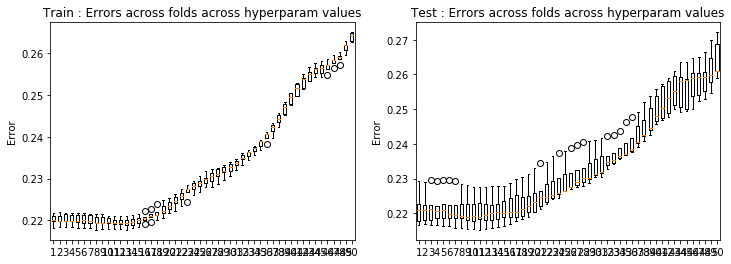

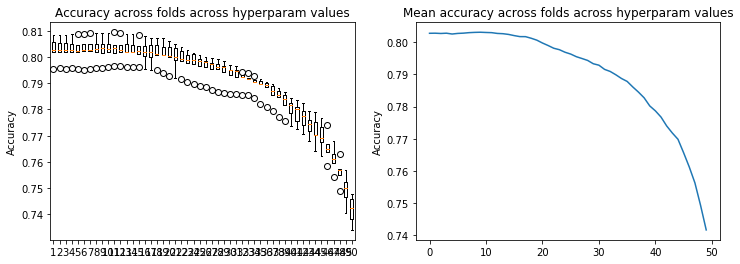

In [55]:
result_crossval(loss_tr33,loss_te33)
result_crossval_accuracy(acc33)

In [26]:
# test 34: degree 8, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr34, loss_te34, w34, acc34 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 8, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  3.81642827e+00  2.65098580e-01 -8.65458007e-01
  7.07448594e-01  2.28258757e-01 -4.14136317e+00  1.26597385e+00
 -6.01491345e-02  5.49840676e-01  1.16478283e-02 -3.34867147e-02
  9.74355228e-01  1.92949337e-02  3.00719508e-02 -1.01621301e-01
  1.10396850e-02 -4.44034796e-02 -5.18565423e-03  1.17839593e-02
 -3.95841974e+01 -1.67251645e+00 -4.92758450e+00  2.99019017e+00
 -8.76723542e-02  1.49245407e+01 -3.04597447e+00  1.54075664e-01
  9.37474975e-01  7.44163918e-02  6.02791966e-02 -3.72717223e+00
 -9.90075414e-02 -1.19316291e-02  1.50207121e+00  4.04543658e-03
 -4.76217233e-01  1.13180801e-01 -1.97393263e-02  1.30355668e+02
  5.07108441e+00  3.29509540e+01 -1.08985220e+01 -2.62295508e+00
 -1.55023250e+01  4.36784058e+00  3.88502465e-01 -3.14418375e+00
 -1.06085791e-01  1.8316

Ridge regression: w=[-2.76819782e-01  3.65516657e+00  2.43204061e-01 -7.44512878e-01
  5.08487758e-01  1.25478659e-01 -2.85912583e+00  1.52921298e+00
 -4.61151810e-02  1.17364365e+00  2.71972759e-02 -2.40783716e-02
  1.27960847e+00  4.49416467e-03  1.40163379e-02 -2.64445436e-01
  4.25124840e-03 -1.68543632e-01 -9.30209901e-04  2.05538222e-04
 -3.87283178e+01 -1.64623216e+00 -5.57544594e+00  4.13358181e+00
  5.91235484e-01  1.04174741e+01 -2.81800141e+00  1.09224859e-01
 -1.15418124e+00  9.35038814e-02  6.57979003e-02 -5.15126714e+00
 -1.19373636e-01  1.78421956e-02  2.38017015e+00  6.83069855e-02
 -1.71023570e-01  1.35372813e-01  2.36399357e-02  1.28542801e+02
  5.42772894e+00  3.45888770e+01 -1.34181653e+01 -4.81605161e+00
 -1.04419377e+01  2.08308132e+00  2.09439371e-01 -4.97545749e-01
 -1.85950977e-01  1.21803763e-01  4.89139671e+00 -4.00724636e-02
 -3.72001305e-02 -6.16664180e+00  3.93149303e-03  2.59857867e+00
 -3.09844727e-02 -5.76847289e-03 -1.66392956e+02 -1.21861372e+01
 -6.3

Ridge regression: w=[-2.78869250e-01  2.64597057e+00  2.31018949e-01 -1.16058811e+00
  9.99814913e-01  2.49000709e-01 -3.25665621e+00  1.51426350e+00
 -4.75497767e-02  8.64651829e-01  3.13247246e-02 -2.68623086e-02
  8.76940635e-01  1.64381476e-03  9.73135004e-03  3.74570312e-02
  1.12854870e-02 -2.29922304e-01 -5.51256781e-03  2.96535922e-03
 -3.12346705e+01 -1.65214992e+00 -2.97456685e+00  1.40514934e+00
 -7.49918118e-01  1.18048942e+01 -2.79312233e+00  1.62160893e-01
  2.35593515e-01  8.27552100e-02  4.44442001e-02 -4.31703896e+00
 -1.09070085e-01 -5.53760008e-03  3.04470002e-01  1.48874729e-02
  5.35374591e-01  1.57843204e-01  5.46345837e-02  1.05727355e+02
  5.57702365e+00  2.73334106e+01 -6.69551093e+00  8.88061274e-01
 -1.18846968e+01  2.15648665e+00  2.23455707e-01 -2.41862262e+00
 -2.05936067e-01  1.68405331e-01  5.20875829e+00 -5.26541200e-02
 -1.86568212e-02 -1.69802911e-01 -6.20336785e-02 -1.41303765e-01
  3.00739209e-03 -4.25000181e-02 -1.34548351e+02 -1.27443385e+01
 -5.4

Ridge regression: w=[-2.78727903e-01  1.60174394e+00  1.78454055e-01 -1.36139299e+00
  1.45927946e+00  3.01911687e-01 -2.48347396e+00  8.95136491e-01
 -8.03870386e-02  1.46273613e+00  1.40609623e-02 -1.52611753e-02
  1.09152130e+00  4.82701827e-03  1.25646134e-02 -1.33838372e-01
  2.17052063e-02 -1.02291609e-01 -5.47017089e-03  1.41961188e-04
 -2.38422359e+01 -8.80340578e-01 -9.67772608e-01 -8.14546207e-01
 -7.70270637e-01  8.99792826e+00 -1.34251515e+00  9.18519629e-02
 -2.60152091e+00  7.43545474e-02  2.27452341e-02 -3.90810441e+00
 -1.07566250e-01 -2.83983143e-03  1.52798978e+00  3.27395748e-02
  8.12225603e-02  1.29303804e-01  3.05799223e-02  8.43276351e+01
  2.23478214e+00  1.97774344e+01 -3.02536941e+00 -3.14186733e-01
 -8.62645983e+00  8.06303168e-01  3.54165882e-01  1.19668326e+00
 -1.22345718e-01  1.02021844e-01  3.37319714e+00 -5.85474521e-02
 -6.47029122e-02 -3.84072929e+00 -1.03789609e-01  5.19593967e-01
  1.01963989e-02 -3.26730181e-02 -1.05730615e+02 -6.35544425e+00
 -4.1

Ridge regression: w=[-2.75017651e-01  6.42445401e-01  1.69754628e-01 -1.94829929e+00
  1.98870781e+00  2.58411626e-01 -2.58975452e+00  7.15735106e-01
 -9.74544066e-02  9.68557811e-01  2.70127780e-02 -4.36963711e-02
  6.78181339e-01  8.61992082e-03  2.55411168e-02 -1.78362985e-01
  6.64858846e-03 -1.27584753e-01 -1.20171722e-02 -1.87543427e-02
 -1.72309566e+01 -9.19708198e-01  2.58241033e+00 -3.13099220e+00
 -5.59784349e-01  9.52617137e+00 -2.78013279e-01  1.30156476e-01
 -6.61958076e-01  6.70072431e-02  9.98579128e-03 -2.97924856e+00
 -1.23216797e-01 -2.28360597e-02  1.99125162e+00  2.60605345e-02
  2.22884218e-01  1.38212138e-01  4.54933986e-02  6.56013285e+01
  2.57344736e+00  1.12896639e+01  6.85555160e-01 -6.48563309e-01
 -9.31296107e+00 -1.05848466e+00  4.21772380e-01 -1.35420370e+00
 -2.01212729e-01  2.03656077e-01  3.49985704e+00 -6.48980691e-02
 -1.27015676e-01 -5.62788039e+00 -5.30228880e-02  4.39673585e-01
  3.23650004e-02  4.76229969e-02 -8.16973931e+01 -7.07605916e+00
 -3.2

Ridge regression: w=[-2.76431071e-01  9.46211923e-02  1.78989909e-01 -1.90611857e+00
  2.28869193e+00  2.68592302e-01 -2.70979559e+00  9.20427365e-01
 -5.96183778e-02  5.73667451e-01  1.24026995e-02 -3.38801154e-02
  6.90187892e-01  2.01998510e-02  2.87039721e-02 -7.17138978e-02
  1.00718691e-02 -1.59404381e-01 -5.58446803e-03  1.01449850e-02
 -1.31649773e+01 -8.75494598e-01  2.98866918e+00 -4.83249666e+00
 -5.51310120e-01  9.56143457e+00 -1.61752645e+00  1.54266899e-01
  4.50599270e-01  7.43660617e-02  6.06861800e-02 -2.77926119e+00
 -9.99609394e-02 -1.21395178e-02  1.28446250e+00  3.81861503e-03
  1.86540982e-01  1.14549554e-01 -2.10535388e-02  5.30377180e+01
  2.01941701e+00  8.07141326e+00  3.78209643e+00 -4.94459641e-01
 -8.89892848e+00  1.31402879e+00  3.64288025e-01 -1.79764364e+00
 -1.10053491e-01  1.80910314e-01  2.94867448e+00 -1.33497536e-01
 -1.20010659e-01 -3.77510118e+00 -6.73623967e-02  8.42276024e-01
 -4.86823412e-03 -7.67672456e-02 -6.37441768e+01 -5.54509907e+00
 -2.5

Ridge regression: w=[-2.76819763e-01 -1.69856824e-04  1.42815289e-01 -1.81489722e+00
  2.18447056e+00  1.93551241e-01 -1.90000909e+00  1.29935316e+00
 -4.65793369e-02  1.09054733e+00  2.71942319e-02 -2.48176329e-02
  8.41388740e-01  5.64621350e-03  1.29742823e-02 -2.24124022e-01
  2.86943235e-03 -3.05292294e-01 -1.80624599e-03 -1.33050379e-03
 -1.27403628e+01 -7.45442267e-01  2.62894120e+00 -4.29945564e+00
 -1.52621025e-01  6.88378480e+00 -2.02746378e+00  1.11366893e-01
 -1.15564484e+00  9.39789409e-02  6.63860941e-02 -3.63555423e+00
 -1.18583261e-01  1.80494291e-02  2.06846787e+00  6.89659718e-02
  6.22041636e-01  1.35893175e-01  2.20233906e-02  5.24385892e+01
  2.11949864e+00  8.73787225e+00  2.78759346e+00 -1.55309660e+00
 -6.27304710e+00  7.01801647e-01  1.89268566e-01  1.26162685e-01
 -1.86288340e-01  1.21564535e-01  3.93210900e+00 -4.40616704e-02
 -3.45714774e-02 -5.16269073e+00  9.39343361e-03  6.78840650e-01
 -2.91522918e-02 -6.24689403e-05 -6.33742273e+01 -6.34679636e+00
 -2.6

Ridge regression: w=[-2.78869221e-01 -5.40302993e-01  1.18374364e-01 -2.06329555e+00
  2.16179628e+00  2.48580586e-01 -2.00719335e+00  1.30051507e+00
 -4.51092658e-02  8.89003031e-01  3.16220858e-02 -2.72056271e-02
  3.05263740e-01  2.55725179e-03  9.46588485e-03  6.57407747e-03
  1.06856589e-02 -2.40149941e-01 -5.44097008e-03  1.54401492e-03
 -9.00969369e+00 -5.93907595e-01  4.13900027e+00 -4.01241442e+00
 -7.80597584e-01  7.16426625e+00 -2.04810763e+00  1.63570295e-01
 -2.04430364e-01  8.34137128e-02  4.54481076e-02 -2.18573154e+00
 -1.07957402e-01 -5.77825236e-03  6.22561427e-01  1.59861090e-02
  4.71157458e-01  1.58171742e-01  5.43740157e-02  4.17024280e+01
  1.56018238e+00  4.40501353e+00  2.61316336e+00  1.17651436e+00
 -6.36044000e+00  8.48187796e-01  1.91742997e-01 -1.15331040e+00
 -2.07876895e-01  1.67222082e-01  3.05521715e+00 -5.46435330e-02
 -1.90639097e-02 -1.52188766e+00 -5.87475687e-02  2.86571232e-01
  1.57340091e-03 -3.70775913e-02 -4.91964407e+01 -5.39728242e+00
 -2.0

Ridge regression: w=[-2.78727862e-01 -1.01595081e+00  1.11549201e-01 -1.92225305e+00
  2.26170564e+00  3.32830736e-01 -1.43410095e+00  7.19583407e-01
 -7.96009397e-02  1.22970804e+00  1.40391288e-02 -1.56933748e-02
  6.01360256e-01  5.47095467e-03  1.20222796e-02 -1.04922239e-01
  2.12049234e-02 -1.44834768e-01 -5.38354762e-03 -1.86557486e-04
 -5.84708998e+00 -2.47567362e-01  3.96061203e+00 -4.54901084e+00
 -1.13661361e+00  5.15272228e+00 -7.48576952e-01  9.35982987e-02
 -2.03333295e+00  7.39297965e-02  2.26190330e-02 -2.18583496e+00
 -1.07036924e-01 -3.37414182e-03  1.34113301e+00  3.32678706e-02
  2.10880788e-01  1.29662836e-01  2.94591117e-02  3.32428002e+01
 -1.70661608e-01  2.80393579e+00  3.40696739e+00  1.38724523e+00
 -4.18062290e+00 -2.24122541e-01  3.38122428e-01  1.20680527e+00
 -1.22157363e-01  1.01589989e-01  2.01864555e+00 -6.02994209e-02
 -6.40633961e-02 -3.39336140e+00 -1.01324510e-01  4.90851932e-01
  8.67670838e-03 -3.14627203e-02 -3.87126007e+01 -2.01340789e+00
 -1.5

Ridge regression: w=[-2.75017591e-01 -1.59022684e+00  9.16809047e-02 -2.17747613e+00
  2.34975386e+00  2.92138972e-01 -1.31057608e+00  9.51357381e-01
 -9.51975119e-02  1.14724426e+00  2.70551968e-02 -4.40495403e-02
  7.34647416e-02  9.48509553e-03  2.48364469e-02 -1.02445061e-01
  6.16889762e-03 -1.84056804e-01 -1.17925258e-02 -1.93389977e-02
 -2.38669419e+00 -1.71331010e-01  5.55452253e+00 -4.77658790e+00
 -9.48259197e-01  4.87408487e+00 -6.96470932e-01  1.29819059e-01
 -1.19327175e+00  6.75265286e-02  9.46552241e-03 -1.04103415e+00
 -1.23506593e-01 -2.20696667e-02  1.41099245e+00  2.66922950e-02
  4.60371104e-01  1.38690742e-01  4.47131071e-02  2.48822571e+01
 -2.90086668e-01 -8.09366772e-01  3.46294243e+00  1.08752043e+00
 -4.07491872e+00 -9.59929306e-01  3.98778457e-01 -2.32484613e-01
 -2.01347544e-01  2.03856496e-01  1.43184914e+00 -6.77298938e-02
 -1.23806063e-01 -3.78123715e+00 -5.08617733e-02  8.44395231e-02
  3.12908404e-02  4.98579836e-02 -3.02334490e+01 -1.90991879e+00
 -1.1

Ridge regression: w=[-2.76430984e-01 -1.84057206e+00  1.15097360e-01 -1.90159042e+00
  2.35471619e+00  2.92097307e-01 -1.38017054e+00  8.17609016e-01
 -5.74646678e-02  6.72812164e-01  1.26181480e-02 -3.40941449e-02
  1.75880305e-01  2.07822301e-02  2.79708358e-02 -2.55336959e-02
  1.01310370e-02 -2.27442476e-01 -5.72125253e-03  1.00085452e-02
 -8.14220189e-01 -2.50771867e-01  4.50420062e+00 -5.09923100e+00
 -8.25340950e-01  4.74257827e+00 -1.14203848e+00  1.54293125e-01
 -5.61159435e-02  7.44742033e-02  6.04090691e-02 -9.43057312e-01
 -1.00464539e-01 -1.22442308e-02  9.60608943e-01  3.93574774e-03
  5.29339580e-01  1.14552151e-01 -2.19435444e-02  2.06662059e+01
 -3.98587676e-01 -1.36151922e-01  4.38548560e+00  7.46352070e-01
 -3.48617910e+00  3.20935377e-01  3.44546779e-01 -9.17585607e-01
 -1.12243272e-01  1.79629821e-01  1.11002781e+00 -1.35269443e-01
 -1.17765665e-01 -2.83958160e+00 -6.63396290e-02  1.53395338e-01
 -4.84096457e-03 -7.66017766e-02 -2.50454185e+01 -1.14452723e+00
 -9.6

Ridge regression: w=[-2.76819676e-01 -1.91307197e+00  6.72806211e-02 -1.82611057e+00
  2.31125682e+00  2.34786827e-01 -9.69659945e-01  1.16630157e+00
 -4.56372984e-02  9.60237082e-01  2.71613262e-02 -2.52060907e-02
  2.15700974e-01  6.19195068e-03  1.23561143e-02 -1.67057452e-01
  2.77198258e-03 -3.74613748e-01 -2.15336491e-03 -1.57440236e-03
 -5.07245769e-01 -1.31108940e-02  4.27123389e+00 -4.87106887e+00
 -6.12289002e-01  3.52928917e+00 -1.61033029e+00  1.14010590e-01
 -8.32641509e-01  9.40467003e-02  6.59674994e-02 -1.31845525e+00
 -1.18058196e-01  1.77287699e-02  1.67558496e+00  6.94600553e-02
  9.74632327e-01  1.35728652e-01  2.16295478e-02  2.03468086e+01
 -6.81398924e-01  1.50579098e-01  3.91705017e+00  4.56755182e-01
 -2.55465016e+00  8.49155109e-02  1.75571369e-01 -3.16914265e-02
 -1.86886175e-01  1.21499709e-01  1.50697446e+00 -4.58970737e-02
 -3.28225796e-02 -4.02765549e+00  1.03337361e-02 -4.46350638e-02
 -2.86227663e-02  2.58776544e-04 -2.50423106e+01 -1.38114480e+00
 -9.7

Ridge regression: w=[-2.78869094e-01 -2.27103927e+00  5.81289177e-02 -1.89592654e+00
  2.17310833e+00  2.41170847e-01 -1.00656287e+00  1.10208698e+00
 -4.30264287e-02  8.54746655e-01  3.16571321e-02 -2.77208329e-02
 -1.68759973e-01  3.02089096e-03  9.18737847e-03  1.42812221e-02
  1.08789858e-02 -2.96904003e-01 -5.36150388e-03  1.17580248e-03
  1.52956931e+00  3.08187639e-02  4.58481970e+00 -3.96322397e+00
 -7.35515339e-01  3.55172786e+00 -1.50174740e+00  1.62724765e-01
 -3.66637749e-01  8.37095870e-02  4.52293358e-02 -3.00962558e-01
 -1.07243918e-01 -6.01717028e-03  6.42590603e-01  1.70888938e-02
  6.90522073e-01  1.57800695e-01  5.40529468e-02  1.56675280e+01
 -9.39896837e-01 -8.36382804e-01  2.48130298e+00  1.09849286e+00
 -2.34944546e+00  1.39630203e-01  1.75844973e-01 -6.29534904e-01
 -2.09018739e-01  1.67830959e-01  9.39107619e-01 -5.58152318e-02
 -1.87346893e-02 -1.84026002e+00 -5.85228984e-02  6.56233639e-02
  8.37306614e-04 -3.62183633e-02 -2.06474197e+01 -7.72302686e-01
 -7.9

Ridge regression: w=[-2.78727676e-01 -2.56832406e+00  9.50578282e-02 -1.67631511e+00
  2.14763595e+00  3.28525358e-01 -7.39519038e-01  7.06181793e-01
 -7.91176902e-02  9.78606703e-01  1.40816809e-02 -1.53415973e-02
  1.94555192e-01  5.69102853e-03  1.19794542e-02 -5.30969072e-02
  2.17474725e-02 -2.14104044e-01 -5.14111115e-03  8.20250623e-04
  3.25705869e+00 -1.25391135e-02  3.74590239e+00 -3.92208213e+00
 -1.17981167e+00  2.69435813e+00 -6.97403140e-01  9.22678787e-02
 -1.16322051e+00  7.34489373e-02  2.20594509e-02 -7.38123339e-01
 -1.06557699e-01 -4.12916658e-03  1.03401631e+00  3.41701820e-02
  5.05807359e-01  1.28666648e-01  2.89429238e-02  1.20153559e+01
 -1.27610513e+00 -1.35530451e-01  2.45145208e+00  1.84120308e+00
 -1.53036355e+00 -3.35355353e-01  3.35198664e-01  3.49750402e-01
 -1.23068275e-01  9.93761055e-02  5.46978160e-01 -6.06947217e-02
 -6.39520991e-02 -2.70048175e+00 -1.02556501e-01  1.07212863e-01
  7.12170596e-03 -3.51770308e-02 -1.77388249e+01  2.55035114e-01
 -6.7

Ridge regression: w=[-2.75017324e-01 -2.95774289e+00  8.38853319e-02 -1.79198199e+00
  2.08093799e+00  2.85729596e-01 -5.92548673e-01  1.03043518e+00
 -9.48754156e-02  1.11411575e+00  2.69901487e-02 -4.38914746e-02
 -1.96728258e-01  9.80824706e-03  2.43856807e-02 -2.46201254e-02
  6.81964079e-03 -2.19255533e-01 -1.16558657e-02 -1.91180146e-02
  5.39758928e+00  6.78142644e-03  4.50195532e+00 -3.56086187e+00
 -9.73579272e-01  2.35848685e+00 -9.65693910e-01  1.24764968e-01
 -1.12907421e+00  6.69848396e-02  8.78844362e-03 -8.76381728e-02
 -1.22932421e-01 -2.15661532e-02  9.16614834e-01  2.71502809e-02
  6.16554142e-01  1.38740286e-01  4.31455543e-02  7.62628686e+00
 -1.26924571e+00 -1.57707565e+00  1.75404669e+00  1.46939798e+00
 -1.41615393e+00 -6.33822210e-01  3.96955473e-01 -8.68905605e-02
 -2.01731399e-01  2.02623620e-01  3.69032662e-01 -6.81391822e-02
 -1.21111404e-01 -2.52131961e+00 -5.25345019e-02 -1.47996291e-01
  3.05618412e-02  4.93376622e-02 -1.48771346e+01  2.77390563e-01
 -5.7

Ridge regression: w=[-2.76430592e-01 -3.11973882e+00  1.18837382e-01 -1.59286312e+00
  1.99072782e+00  2.83763469e-01 -7.11822335e-01  6.76998009e-01
 -5.70381587e-02  6.53655956e-01  1.25402365e-02 -3.36804811e-02
 -1.08788519e-02  2.12379556e-02  2.74790265e-02  4.63171587e-02
  1.09879223e-02 -2.57136927e-01 -5.91817766e-03  1.05916929e-02
  6.28493789e+00 -1.81308192e-01  3.67676297e+00 -3.36993761e+00
 -8.15176878e-01  2.47409836e+00 -8.10571431e-01  1.47293710e-01
 -2.54638058e-01  7.37509259e-02  5.87149191e-02 -1.41262490e-01
 -1.00402957e-01 -1.24040073e-02  5.35727039e-01  3.84299096e-03
  6.85259736e-01  1.13932602e-01 -2.27264897e-02  5.70153336e+00
 -9.78884002e-01 -7.20417663e-01  1.84627279e+00  9.31499295e-01
 -1.18908051e+00 -6.41284732e-02  3.40730942e-01 -4.29779438e-01
 -1.13907505e-01  1.76627051e-01  2.11159956e-01 -1.36068633e-01
 -1.16147763e-01 -1.88416583e+00 -6.85546133e-02 -1.36485041e-01
 -4.39829714e-03 -7.89843374e-02 -1.33761444e+01  3.68977473e-01
 -5.2

Ridge regression: w=[-2.76819284e-01 -3.17049622e+00  7.40153958e-02 -1.53140122e+00
  1.99405121e+00  2.29097511e-01 -4.87864810e-01  9.78285597e-01
 -4.78402797e-02  7.81038036e-01  2.71041808e-02 -2.51996699e-02
 -9.39513662e-03  6.34063239e-03  1.15631918e-02 -6.93536677e-02
  3.64359672e-03 -3.93508656e-01 -2.32883776e-03 -1.18854783e-03
  6.50128937e+00  5.61340710e-02  3.51765270e+00 -3.36387108e+00
 -6.41835904e-01  1.90306771e+00 -1.27803244e+00  1.10600848e-01
 -4.96552749e-01  9.29597232e-02  6.40971133e-02 -2.92404800e-01
 -1.16824235e-01  1.64971429e-02  1.10393210e+00  6.93124797e-02
  1.09376478e+00  1.35143686e-01  2.09826561e-02  5.52728161e+00
 -1.34328714e+00 -5.83472053e-01  1.71129878e+00  8.47413655e-01
 -9.27185607e-01 -1.15863885e-01  1.87092429e-01 -1.91098166e-01
 -1.87920452e-01  1.20729269e-01  3.20092717e-01 -4.62922547e-02
 -2.97679931e-02 -2.76605155e+00  7.65390045e-03 -3.01259694e-01
 -2.86209318e-02 -1.93591643e-03 -1.34696660e+01  3.73459244e-01
 -5.1

Ridge regression: w=[-2.78868519e-01 -3.36431410e+00  8.29846336e-02 -1.63085579e+00
  1.92138913e+00  2.20414701e-01 -5.16080635e-01  8.29083946e-01
 -4.46893651e-02  6.99663690e-01  3.14673800e-02 -2.79047705e-02
 -2.17563854e-01  3.27398389e-03  9.03525804e-03  7.36957473e-02
  1.17349214e-02 -3.26918076e-01 -5.45227453e-03  1.16513913e-03
  7.59033680e+00 -3.27298082e-02  3.84564307e+00 -2.81515756e+00
 -6.04435489e-01  1.95724410e+00 -1.03776169e+00  1.53738197e-01
 -2.84410720e-01  8.26322215e-02  4.32046615e-02  2.46627586e-01
 -1.05831287e-01 -6.49357779e-03  3.29657486e-01  1.71583556e-02
  8.45150791e-01  1.56832115e-01  5.20900860e-02  3.20590756e+00
 -1.21717552e+00 -1.09947087e+00  8.06266048e-01  8.06050900e-01
 -8.52163429e-01 -1.11632359e-01  1.86459320e-01 -3.86873865e-01
 -2.09777550e-01  1.67609075e-01  1.29897724e-01 -5.65817076e-02
 -1.81287177e-02 -1.29374889e+00 -6.06875157e-02 -1.72078045e-01
  9.51507023e-04 -3.64247096e-02 -1.19238977e+01  5.01698185e-01
 -4.7

Ridge regression: w=[-2.78726839e-01 -3.46034263e+00  1.36780078e-01 -1.53118449e+00
  1.84830506e+00  2.81316769e-01 -3.55957761e-01  5.87348304e-01
 -8.09408585e-02  7.36477346e-01  1.40659265e-02 -1.43405370e-02
  1.11590572e-01  5.85097390e-03  1.20345672e-02  4.56966019e-02
  2.26924879e-02 -2.37118382e-01 -5.02320934e-03  2.23040961e-03
  8.34748518e+00 -2.29694119e-01  3.51256003e+00 -2.63843310e+00
 -9.02046162e-01  1.55448203e+00 -5.93924191e-01  8.55947710e-02
 -5.93233349e-01  7.07873543e-02  2.08803357e-02 -2.88863688e-01
 -1.04776587e-01 -4.76230376e-03  4.75396787e-01  3.43244016e-02
  6.49844910e-01  1.27370486e-01  2.63864218e-02  1.51246384e+00
 -1.01209701e+00 -8.80229313e-01  6.58195342e-01  1.31216572e+00
 -6.32494663e-01 -2.25730118e-01  3.46261147e-01 -6.20570915e-02
 -1.24130696e-01  9.46814079e-02  2.63819437e-02 -6.11648322e-02
 -6.31855222e-02 -1.55886748e+00 -1.04546133e-01 -1.46869715e-01
  6.07073483e-03 -3.94248282e-02 -1.09343922e+01  6.52472801e-01
 -4.3

Ridge regression: w=[-2.75016121e-01 -3.53570383e+00  1.31430625e-01 -1.57426562e+00
  1.69167947e+00  2.39963075e-01 -2.00760299e-01  7.47772880e-01
 -9.63351612e-02  8.03605129e-01  2.64615912e-02 -4.27956450e-02
 -1.11355929e-01  9.78660566e-03  2.34502469e-02  7.92957577e-02
  7.93966131e-03 -2.02779621e-01 -1.18411059e-02 -1.87480990e-02
  8.99456528e+00 -2.59518698e-01  3.97387331e+00 -2.20896451e+00
 -7.07022588e-01  1.22772403e+00 -7.22683772e-01  1.15043514e-01
 -6.95161305e-01  6.37729208e-02  7.88077295e-03  3.35297938e-02
 -1.20470605e-01 -1.99457105e-02  3.20938035e-01  2.57550275e-02
  5.99552595e-01  1.38663704e-01  3.91271006e-02 -1.94520905e-01
 -8.74717562e-01 -1.70092521e+00  2.17478145e-01  9.60574320e-01
 -5.89344450e-01 -3.79778063e-01  4.03040777e-01 -8.06939692e-02
 -2.00209106e-01  1.97223917e-01  3.20166201e-02 -6.68895363e-02
 -1.15566867e-01 -1.26485366e+00 -5.48762018e-02 -2.02718961e-01
  3.09671202e-02  4.92002439e-02 -9.72701046e+00  5.56464609e-01
 -4.0

Ridge regression: w=[-2.76428832e-01 -3.48837079e+00  1.59532630e-01 -1.47133906e+00
  1.53021763e+00  2.52044624e-01 -2.64138757e-01  4.37118265e-01
 -5.75883863e-02  4.71296415e-01  1.19557120e-02 -3.16625728e-02
  3.66331105e-02  2.15678718e-02  2.69399264e-02  1.37655961e-01
  1.20662712e-02 -2.26835673e-01 -6.34983276e-03  1.11519137e-02
  9.02280465e+00 -4.24596412e-01  3.59712497e+00 -1.82838433e+00
 -6.39985668e-01  1.28248193e+00 -4.81542502e-01  1.30268912e-01
 -1.08963776e-01  6.90534513e-02  5.28695735e-02 -1.83470574e-02
 -9.78812759e-02 -1.11328568e-02  1.47467381e-02  3.01402856e-03
  6.37011242e-01  1.14825752e-01 -2.34608687e-02 -7.90841075e-01
 -5.65428380e-01 -1.44622080e+00  1.51634063e-01  6.10448073e-01
 -5.01315816e-01 -1.16794223e-01  3.35430371e-01 -2.48793327e-01
 -1.12854495e-01  1.67158502e-01 -4.74482731e-02 -1.35842433e-01
 -1.12758305e-01 -7.99781054e-01 -7.08890802e-02 -1.99578310e-01
 -2.77647866e-03 -7.90357255e-02 -9.01075302e+00  4.75748404e-01
 -3.7

Ridge regression: w=[-2.76817521e-01 -3.51805614e+00  1.29222041e-01 -1.42844170e+00
  1.54366357e+00  1.95172219e-01 -1.49528659e-01  6.01945132e-01
 -5.31949358e-02  4.88236144e-01  2.64695015e-02 -2.42257715e-02
  7.56180454e-02  6.53212063e-03  1.07315253e-02  5.91146421e-02
  4.69454056e-03 -3.33163698e-01 -2.57479377e-03 -6.18826240e-04
  9.16473137e+00 -2.67975647e-01  3.50451724e+00 -1.88066999e+00
 -4.46908032e-01  1.00956276e+00 -8.01957449e-01  1.01436698e-01
 -1.38146262e-01  8.73370873e-02  5.92060298e-02 -1.28573991e-01
 -1.13093931e-01  1.44580623e-02  3.78739383e-01  6.46274103e-02
  9.62605888e-01  1.35543117e-01  1.70529184e-02 -8.87140378e-01
 -7.96763641e-01 -1.38620565e+00  1.20342266e-01  4.93251774e-01
 -4.23950314e-01 -7.49859087e-02  2.13288163e-01 -2.02107821e-01
 -1.85371015e-01  1.16454476e-01 -4.37594154e-02 -4.66270686e-02
 -2.51518161e-02 -1.28006552e+00  4.93414900e-03 -3.22948323e-01
 -2.78252236e-02 -2.48939318e-03 -9.11051599e+00  4.88317533e-01
 -3.6

Ridge regression: w=[-2.78865932e-01 -3.42088513e+00  1.37292255e-01 -1.46421747e+00
  1.41573208e+00  1.89428594e-01 -1.13195603e-01  4.45277055e-01
 -4.89897285e-02  4.33093726e-01  3.04170013e-02 -2.65564697e-02
 -2.46879664e-02  3.55913383e-03  9.29435992e-03  1.42217966e-01
  1.26927265e-02 -2.69658220e-01 -5.57951378e-03  1.53037264e-03
  9.05426632e+00 -3.68602905e-01  3.64587466e+00 -1.47135901e+00
 -4.19781072e-01  9.45475961e-01 -5.51432534e-01  1.37119625e-01
 -4.18170747e-02  7.56684476e-02  3.75730809e-02  1.24087192e-01
 -1.01715253e-01 -6.78708040e-03 -5.17457807e-02  1.31212351e-02
  7.31976288e-01  1.55952853e-01  4.46286240e-02 -1.44117284e+00
 -5.89425437e-01 -1.62066925e+00 -2.16200956e-01  4.06691684e-01
 -3.97980594e-01 -8.09445996e-02  2.04992451e-01 -2.67965883e-01
 -2.05919721e-01  1.60693537e-01 -8.55986850e-02 -5.69549106e-02
 -1.70884028e-02 -5.28046105e-01 -6.16850524e-02 -2.12675331e-01
  1.65045870e-03 -3.50749335e-02 -8.25366585e+00  4.61083226e-01
 -3.5

Ridge regression: w=[-2.78723074e-01 -3.22517300e+00  1.77309688e-01 -1.34260371e+00
  1.22026872e+00  2.21645653e-01  2.35301202e-02  3.42461954e-01
 -8.16777448e-02  4.64537282e-01  1.32007321e-02 -1.20909784e-02
  1.61269872e-01  6.28213758e-03  1.23221346e-02  1.26724700e-01
  2.30451082e-02 -1.70616695e-01 -4.73618438e-03  3.33278163e-03
  8.71087779e+00 -5.11004129e-01  3.35335843e+00 -1.12811247e+00
 -5.55250554e-01  6.56503619e-01 -3.24295597e-01  7.71831684e-02
 -1.84860713e-01  5.94183988e-02  1.85594792e-02 -2.13136827e-01
 -9.84200850e-02 -3.84565721e-03  1.29029628e-02  3.12682754e-02
  5.13568024e-01  1.28224598e-01  1.72042505e-02 -1.77291641e+00
 -4.11071901e-01 -1.54043099e+00 -2.56656486e-01  5.88647139e-01
 -3.46968404e-01 -1.19117610e-01  3.38840302e-01 -1.50803523e-01
 -1.20414734e-01  8.39444794e-02 -1.18902138e-01 -6.23835993e-02
 -6.11167825e-02 -5.90006908e-01 -1.02478816e-01 -1.78547668e-01
  4.73622526e-03 -3.87745557e-02 -7.51662063e+00  4.49014757e-01
 -3.1

Ridge regression: w=[-2.75010711e-01 -2.99011534e+00  1.59984329e-01 -1.21793818e+00
  9.65354470e-01  1.90177620e-01  1.39479180e-01  3.74182660e-01
 -9.31687168e-02  4.22704327e-01  2.38573993e-02 -3.90798386e-02
  4.40433087e-02  9.61222814e-03  2.10795005e-02  1.43753589e-01
  9.25390217e-03 -1.17720303e-01 -1.23566358e-02 -1.77864424e-02
  8.14715159e+00 -4.88270418e-01  3.29697650e+00 -6.77080663e-01
 -4.31146131e-01  4.21572659e-01 -3.28474051e-01  1.07184088e-01
 -1.88235398e-01  5.23118736e-02  6.48705980e-03 -5.14470015e-02
 -1.12291545e-01 -1.34342506e-02 -4.99607432e-02  2.00967158e-02
  3.95725491e-01  1.40354111e-01  2.89868203e-02 -1.89403661e+00
 -3.51309818e-01 -1.80775804e+00 -3.84405781e-01  4.05401421e-01
 -3.35497693e-01 -1.94612094e-01  3.70027320e-01 -7.01306295e-02
 -1.88534638e-01  1.78255457e-01 -7.61646509e-02 -6.35065477e-02
 -1.00961546e-01 -4.70056329e-01 -5.48503831e-02 -1.61482913e-01
  3.31525955e-02  4.97870044e-02 -6.59474294e+00  3.58050643e-01
 -3.0

Ridge regression: w=[-2.76420912e-01 -2.70081380e+00  1.69455880e-01 -1.08617533e+00
  7.55988823e-01  2.13616810e-01  1.16151910e-01  2.28448566e-01
 -5.44487102e-02  3.05078426e-01  9.62832401e-03 -2.54996241e-02
  1.08970661e-01  2.13241293e-02  2.55813835e-02  1.75430902e-01
  1.29426995e-02 -1.19378471e-01 -6.88845740e-03  1.12913445e-02
  7.37246590e+00 -5.50749192e-01  2.89542811e+00 -2.95041199e-01
 -4.62370292e-01  4.04792055e-01 -2.18044998e-01  1.06561118e-01
  3.97668949e-02  5.16683316e-02  3.55258310e-02 -5.77587253e-02
 -8.98088405e-02 -4.68492409e-03 -2.20233211e-01  8.49026114e-04
  3.78733518e-01  1.22505008e-01 -2.43217431e-02 -1.71033284e+00
 -2.24092341e-01 -1.61199843e+00 -3.64601567e-01  3.16841943e-01
 -2.80648608e-01 -9.12667913e-02  2.93180627e-01 -1.64512263e-01
 -1.02734180e-01  1.39040621e-01 -1.10364004e-01 -1.30976653e-01
 -1.00971595e-01 -2.35184756e-01 -7.01468373e-02 -1.50390639e-01
  7.06664433e-05 -7.16061378e-02 -5.79865689e+00  3.11881916e-01
 -2.6

Ridge regression: w=[-2.76809590e-01 -2.70997271e+00  1.52422829e-01 -1.06592780e+00
  7.58958874e-01  1.64621012e-01  1.50819523e-01  2.53841979e-01
 -5.72133472e-02  2.65377407e-01  2.34823485e-02 -2.07473445e-02
  1.77443749e-01  7.30797258e-03  1.00223084e-02  1.25447013e-01
  5.93988268e-03 -1.68947893e-01 -2.98916171e-03  6.95986085e-05
  7.44630557e+00 -4.68498181e-01  2.86989869e+00 -3.27669947e-01
 -2.81048793e-01  3.19557953e-01 -3.51118877e-01  9.33758125e-02
  6.00048804e-02  6.77527711e-02  4.64755389e-02 -1.43182628e-01
 -1.02452508e-01  1.13956205e-02  5.55696664e-03  4.75545012e-02
  5.55258091e-01  1.40531971e-01  6.29327473e-03 -1.76620707e+00
 -3.23274673e-01 -1.59250980e+00 -3.81745001e-01  1.73602774e-01
 -2.56404815e-01 -2.00993458e-02  2.22639213e-01 -1.44470312e-01
 -1.69317705e-01  1.00582135e-01 -1.50322361e-01 -4.80969576e-02
 -1.88567416e-02 -4.77413212e-01  2.36324355e-03 -2.24662376e-01
 -2.52239616e-02  1.75177575e-03 -5.85718192e+00  2.92767065e-01
 -2.6

Ridge regression: w=[-2.78854296e-01 -2.38976972e+00  1.44054368e-01 -9.57962560e-01
  5.95050970e-01  1.60378292e-01  1.92768442e-01  1.81659312e-01
 -5.19345013e-02  2.81169628e-01  2.62620992e-02 -2.13982927e-02
  1.14852161e-01  3.86351045e-03  1.02778131e-02  1.62354561e-01
  1.34746659e-02 -1.24573218e-01 -5.44711905e-03  2.12579317e-03
  6.56913839e+00 -4.91801234e-01  2.60841738e+00 -4.21946435e-02
 -2.82451186e-01  2.43133544e-01 -2.13425863e-01  1.20196131e-01
  4.19771565e-02  5.27724012e-02  2.52531145e-02 -4.22855300e-02
 -9.34132151e-02 -5.92580141e-03 -1.79356828e-01  2.61002033e-03
  3.82108551e-01  1.58570529e-01  2.90540980e-02 -1.49831454e+00
 -2.28049534e-01 -1.50836265e+00 -4.11669359e-01  1.65447370e-01
 -2.41745264e-01 -3.96456190e-02  2.07362733e-01 -1.78015374e-01
 -1.85235153e-01  1.34331911e-01 -1.30515347e-01 -5.50292671e-02
 -1.56930401e-02 -1.92169497e-01 -5.92382642e-02 -1.38768112e-01
  2.03345460e-03 -2.89595863e-02 -4.98990456e+00  2.63700568e-01
 -2.3

Ridge regression: w=[-2.78706137e-01 -2.02650425e+00  1.65652186e-01 -7.65787799e-01
  3.99494011e-01  1.72438042e-01  2.64573586e-01  1.83357772e-01
 -7.65538419e-02  3.16569221e-01  9.58442607e-03 -7.03361277e-03
  1.71087680e-01  6.33767607e-03  1.23245734e-02  1.47688967e-01
  2.11071560e-02 -4.68159138e-02 -3.88735007e-03  3.80636354e-03
  5.64583963e+00 -5.43783312e-01  2.13590199e+00  1.77137408e-01
 -3.31730950e-01  1.05619874e-01 -1.29453205e-01  7.18997412e-02
 -1.72886491e-02  3.07960967e-02  1.29585588e-02 -1.74035590e-01
 -8.38579308e-02 -5.58173381e-05 -1.20784256e-01  2.31959391e-02
  2.16708683e-01  1.36874696e-01  8.34668018e-04 -1.24438452e+00
 -1.85516143e-01 -1.31853416e+00 -3.09240921e-01  2.14430085e-01
 -2.42782562e-01 -7.50842831e-02  2.93717690e-01 -1.33756276e-01
 -1.02092862e-01  5.83533081e-02 -1.49712450e-01 -5.95906062e-02
 -5.37251116e-02 -2.36399781e-01 -8.79020933e-02 -1.15891323e-01
  1.64525921e-03 -2.99570340e-02 -4.17429684e+00  2.53678945e-01
 -1.9

Ridge regression: w=[-2.74986375e-01 -1.69895098e+00  1.40070361e-01 -5.36887509e-01
  2.40544201e-01  1.48062792e-01  3.03176606e-01  1.93104734e-01
 -8.19422191e-02  2.54914348e-01  1.60467036e-02 -2.99993086e-02
  9.86946765e-02  8.47606690e-03  1.62616081e-02  1.57438610e-01
  9.43689765e-03 -9.94864008e-03 -1.26060372e-02 -1.50595255e-02
  4.75099724e+00 -4.82610239e-01  1.71780064e+00  3.11903228e-01
 -2.55085988e-01  2.62906693e-02 -1.27057672e-01  1.03227768e-01
  1.88411559e-02  2.82549798e-02  3.74336325e-03 -8.72416410e-02
 -9.58512564e-02 -1.14290741e-03 -1.41057971e-01  1.11190293e-02
  1.35876755e-01  1.51326010e-01  1.38361750e-02 -9.18156266e-01
 -1.98372102e-01 -1.25832024e+00 -2.52553795e-01  1.38817701e-01
 -2.41781193e-01 -1.15416102e-01  2.96162399e-01 -5.37379170e-02
 -1.49161070e-01  1.29558205e-01 -1.01945942e-01 -5.24475840e-02
 -7.04900994e-02 -2.11942909e-01 -4.62194284e-02 -9.76303771e-02
  3.42625842e-02  4.48408087e-02 -3.38102160e+00  1.95204399e-01
 -1.6

Ridge regression: w=[-2.76385290e-01 -1.39485319e+00  1.39801729e-01 -4.27656815e-01
  1.42372068e-01  1.63605229e-01  2.67812189e-01  1.25121283e-01
 -4.67645371e-02  2.53893219e-01  3.18140709e-03 -1.40865481e-02
  1.33565607e-01  1.71874665e-02  2.10905287e-02  1.65461155e-01
  1.08715708e-02 -8.05239546e-03 -6.97278891e-03  9.23783250e-03
  3.93400508e+00 -4.91814087e-01  1.33198463e+00  4.11114726e-01
 -2.83919672e-01  3.59024318e-02 -8.59793547e-02  8.66598019e-02
  4.12204612e-02  2.12991638e-02  8.48851049e-03 -8.41045685e-02
 -7.75009976e-02  6.81560917e-03 -2.10575348e-01 -2.95767378e-03
  1.12739167e-01  1.46290773e-01 -2.53316348e-02 -6.18046048e-01
 -1.69431450e-01 -1.02438896e+00 -1.46963334e-01  1.26578555e-01
 -1.98020990e-01 -7.45451698e-02  2.33121673e-01 -1.07795162e-01
 -7.01570588e-02  8.29717363e-02 -1.18171408e-01 -1.03151812e-01
 -6.99851315e-02 -1.07552068e-01 -5.31295592e-02 -8.67723188e-02
  1.74953221e-03 -5.01529388e-02 -2.72822237e+00  1.81254547e-01
 -1.3

Ridge regression: w=[-2.76773919e-01 -1.39330814e+00  1.31363706e-01 -4.16432341e-01
  1.35469112e-01  1.38531408e-01  2.74023811e-01  1.07960273e-01
 -5.60350501e-02  2.20702799e-01  1.50321063e-02 -1.35688190e-02
  1.86416518e-01  7.01637432e-03  9.10419892e-03  1.46112201e-01
  7.33156062e-03 -1.25125956e-02 -3.84688053e-03  1.02186670e-03
  3.96119468e+00 -4.51985432e-01  1.33970096e+00  3.96325127e-01
 -1.77164160e-01  1.88289901e-02 -1.19348880e-01  8.62592091e-02
  4.95299030e-02  3.40338876e-02  2.66641924e-02 -1.38367183e-01
 -8.47425692e-02  7.71395499e-03 -9.87014527e-02  1.99552374e-02
  1.65977524e-01  1.56763775e-01 -7.20405373e-03 -6.43871581e-01
 -2.06042404e-01 -1.02163486e+00 -1.62631770e-01  3.18087893e-02
 -1.89547430e-01 -2.21478666e-02  2.14608503e-01 -9.51986441e-02
 -1.22969121e-01  6.51925069e-02 -1.60579544e-01 -4.14003799e-02
 -1.05162231e-02 -2.26930526e-01 -1.13914013e-03 -1.20931086e-01
 -1.99669535e-02  6.54228485e-03 -2.75009211e+00  1.56952129e-01
 -1.3

Ridge regression: w=[-2.78801967e-01 -1.12347542e+00  1.12129293e-01 -3.20026035e-01
  9.05293783e-02  1.27936245e-01  2.82611071e-01  7.38190584e-02
 -4.97987001e-02  2.50526526e-01  1.49600171e-02 -1.05507058e-02
  1.44965286e-01  1.84347907e-03  1.11939720e-02  1.55654974e-01
  1.15845078e-02 -8.16781405e-03 -4.75580107e-03  1.18225330e-03
  3.24429681e+00 -4.29418057e-01  1.03596230e+00  4.09736075e-01
 -1.67763168e-01  4.11788589e-03 -6.16947023e-02  1.04460667e-01
  9.58748259e-03  2.00855680e-02  1.13968988e-02 -8.89474439e-02
 -8.45426183e-02 -3.46377870e-03 -1.67208196e-01 -7.90378505e-03
  1.05623633e-01  1.70333078e-01  1.42136831e-02 -3.70762796e-01
 -1.75437495e-01 -8.36211758e-01 -1.03998835e-01  4.00700191e-02
 -1.75187583e-01 -2.90592133e-02  2.00343313e-01 -1.20236030e-01
 -1.24318396e-01  7.65339186e-02 -1.26816649e-01 -3.83868540e-02
 -1.27331257e-02 -1.17473924e-01 -4.32072048e-02 -7.33495890e-02
  2.28832136e-04 -1.36470688e-02 -2.17971236e+00  1.37050907e-01
 -1.0

Ridge regression: w=[-2.78629976e-01 -8.69375319e-01  1.23517176e-01 -2.26872746e-01
  2.09413983e-02  1.27038846e-01  3.01379396e-01  1.00010039e-01
 -6.55724913e-02  2.72194338e-01  5.49202311e-04 -4.76729550e-04
  1.54876860e-01  2.91517407e-03  9.49946278e-03  1.49112159e-01
  1.41168406e-02  3.06639076e-02 -3.04683220e-03  3.14699556e-03
  2.63151264e+00 -4.44839738e-01  7.45685604e-01  4.27064417e-01
 -1.74753579e-01 -3.72115342e-02 -3.28141022e-02  6.19511490e-02
  5.53441547e-03  8.18557140e-04  6.01680365e-03 -1.34365258e-01
 -6.76752298e-02  3.95755141e-03 -1.40518526e-01  1.49465739e-02
  3.57769127e-02  1.56099331e-01 -1.09185394e-02 -1.99063588e-01
 -1.77670680e-01 -6.63744608e-01 -8.60449653e-03  4.69092482e-02
 -1.77426121e-01 -4.77665876e-02  2.43324789e-01 -1.01448998e-01
 -5.32047637e-02  2.26535777e-02 -1.39401524e-01 -3.62116196e-02
 -3.16775202e-02 -1.39830240e-01 -4.85664297e-02 -7.23405018e-02
 -8.92725433e-04 -1.81692506e-02 -1.72353488e+00  1.31736689e-01
 -8.2

Ridge regression: w=[-2.74876956e-01 -6.58344525e-01  9.86731814e-02 -1.14240213e-01
 -8.83672250e-04  1.11247514e-01  2.91317488e-01  9.98295081e-02
 -6.55871330e-02  2.24016953e-01  1.65529189e-03 -1.76099551e-02
  1.13592378e-01  4.60963998e-03  1.00804108e-02  1.56674351e-01
  5.94664847e-03  4.33788128e-02 -1.06504048e-02 -1.10338565e-02
  2.12632264e+00 -3.95537869e-01  5.05692293e-01  3.71769989e-01
 -1.33242957e-01 -3.93301266e-02 -3.76334773e-02  8.83633510e-02
  4.61155933e-02  8.07136191e-03  5.85489234e-04 -8.36743783e-02
 -7.99874070e-02  7.98405659e-03 -1.53556043e-01  5.82761032e-03
  1.04883099e-02  1.70717261e-01  4.21210023e-03 -5.69993607e-02
 -1.85252555e-01 -5.71264652e-01  2.12540469e-02  1.89453660e-02
 -1.62798584e-01 -6.23126236e-02  2.29882289e-01 -4.76931147e-02
 -7.00665523e-02  6.23530833e-02 -1.01321786e-01 -2.65845109e-02
 -3.16642687e-02 -1.36235184e-01 -2.27164432e-02 -6.37193057e-02
  2.49890498e-02  3.06799646e-02 -1.35405317e+00  1.02485437e-01
 -6.5

Ridge regression: w=[-2.76225164e-01 -4.80142740e-01  9.07615614e-02 -1.21440440e-01
 -6.80599056e-03  1.17125437e-01  2.50895224e-01  5.19294578e-02
 -3.38370308e-02  2.33161500e-01 -6.60659462e-03 -3.59461464e-03
  1.35667945e-01  8.04189458e-03  1.38937418e-02  1.46486859e-01
  4.88125883e-03  3.84095219e-02 -6.46729335e-03  4.90384441e-03
  1.72074901e+00 -3.86707448e-01  3.83263504e-01  3.71133083e-01
 -1.37967263e-01 -1.60715718e-02 -2.37600011e-02  6.40994297e-02
  3.15431913e-02  8.94280823e-04 -7.88921645e-03 -6.90575343e-02
 -6.85656479e-02  1.29874920e-02 -1.59493289e-01 -4.89057485e-03
  4.56769733e-03  1.73849946e-01 -2.42123483e-02  2.15302940e-02
 -1.73781967e-01 -4.26638538e-01  6.70707230e-02  1.05024114e-02
 -1.25760878e-01 -3.52457830e-02  1.82280386e-01 -7.22050660e-02
 -1.53013644e-02  2.67350205e-02 -1.03171503e-01 -4.85438951e-02
 -2.79527453e-02 -9.24816375e-02 -1.99691130e-02 -5.57437366e-02
  9.91795345e-04 -2.34323284e-02 -1.08270841e+00  9.93021818e-02
 -5.1

Ridge regression: w=[-2.76613567e-01 -4.77042055e-01  8.74516670e-02 -1.05811356e-01
 -2.05227579e-02  1.14086777e-01  2.53221455e-01  4.77959057e-02
 -4.50450906e-02  2.21107462e-01  1.88637581e-03 -5.97102082e-03
  1.53546080e-01  3.93222269e-03  7.83926393e-03  1.51342399e-01
  7.23462142e-03  4.75259965e-02 -5.75656650e-03  2.49304573e-03
  1.72916370e+00 -3.68199497e-01  3.91056981e-01  3.58939274e-01
 -1.05756388e-01 -1.86979361e-02 -2.60799861e-02  6.79956692e-02
  3.07538948e-02  1.07889372e-02  1.29752345e-02 -9.68041351e-02
 -7.16834546e-02  5.52491754e-03 -1.33612525e-01  3.59273429e-03
  1.42784690e-02  1.75395855e-01 -1.27499113e-02  1.38249052e-02
 -1.87190612e-01 -4.30187608e-01  5.99190728e-02 -2.50027018e-02
 -1.23490933e-01 -1.40997385e-02  1.87318621e-01 -6.98368737e-02
 -4.94631571e-02  2.75126372e-02 -1.24642334e-01 -1.97864926e-02
 -8.20152438e-04 -1.37897281e-01  5.05639215e-05 -7.24083663e-02
 -9.36819987e-03  4.06615159e-03 -1.08833163e+00  8.08113322e-02
 -5.2

Ridge regression: w=[-2.78566808e-01 -3.19106206e-01  6.16698043e-02 -9.86293302e-02
 -1.35292801e-03  1.00036906e-01  2.47671562e-01  1.89946916e-02
 -3.53840119e-02  2.24622189e-01  9.25973734e-05 -2.39353066e-04
  1.26515937e-01 -2.27368767e-03  1.09950307e-02  1.41134619e-01
  7.41849581e-03  3.42486730e-02 -3.81758020e-03 -8.41475513e-04
  1.39544842e+00 -3.31231881e-01  2.99496222e-01  3.16219090e-01
 -8.67912008e-02 -6.36448102e-03 -5.48570658e-03  7.75810098e-02
  1.39032339e-02  1.20573602e-03  3.59601231e-03 -5.97501902e-02
 -7.83026839e-02 -1.79660343e-03 -1.36445561e-01 -1.00378463e-02
  9.16490039e-03  1.80791699e-01  7.42740847e-03  6.24652563e-02
 -1.65898686e-01 -3.24078110e-01  6.53205191e-02 -1.86854122e-02
 -1.09872511e-01 -8.13064350e-03  1.69315479e-01 -7.70546158e-02
 -4.07723092e-02  2.15505718e-02 -9.29057038e-02 -1.17776240e-02
 -6.89212421e-03 -9.45575143e-02 -2.00710389e-02 -4.77178437e-02
 -2.37406908e-03  1.99621192e-03 -8.73151041e-01  6.62104289e-02
 -4.2

Ridge regression: w=[-2.78287884e-01 -1.74334815e-01  6.09911314e-02 -8.81878819e-02
 -8.85933069e-03  9.33240235e-02  2.38723090e-01  3.74107212e-02
 -4.22974550e-02  2.29967772e-01 -8.50636609e-03  2.90664076e-03
  1.18816549e-01 -1.15629184e-03  5.83830289e-03  1.34217435e-01
  7.19588725e-03  5.06304715e-02 -2.83193580e-03  1.16370589e-03
  1.11647280e+00 -3.28112293e-01  2.21932894e-01  2.96010212e-01
 -8.25324510e-02 -1.07277611e-02  7.67131400e-03  4.20392102e-02
  3.08614754e-02 -1.25272785e-02  1.86521322e-03 -6.80404162e-02
 -6.02325898e-02  5.55506346e-03 -1.23977371e-01  1.10659812e-02
 -1.17350668e-02  1.68684258e-01 -1.11430472e-02  5.99354936e-02
 -1.64858628e-01 -2.47982988e-01  8.66114685e-02 -1.50466960e-02
 -1.00165438e-01 -1.29467780e-02  1.83395040e-01 -6.35959625e-02
  2.45654688e-04  6.65081971e-04 -9.22948603e-02 -9.29841326e-03
 -9.65876498e-03 -9.68038587e-02 -1.30700954e-02 -5.18111516e-02
  3.25393364e-05 -9.94901981e-03 -7.13639002e-01  6.11061587e-02
 -3.3

Ridge regression: w=[-2.74385815e-01 -4.46845380e-02  3.24060767e-02 -3.93515788e-02
  3.75539665e-03  8.34029419e-02  2.18114645e-01  3.07853240e-02
 -3.67631963e-02  1.99565408e-01 -9.00788166e-03 -9.89678362e-03
  9.76584231e-02  1.62764141e-03  6.91576152e-03  1.32360956e-01
  2.51605981e-03  4.97146860e-02 -7.44608237e-03 -7.72801580e-03
  8.75083225e-01 -2.85779910e-01  1.42336602e-01  2.32252752e-01
 -6.37388206e-02  2.66834857e-03  5.51208164e-04  5.94375083e-02
  5.61042859e-02 -2.38217586e-03 -1.64955949e-03 -3.80162639e-02
 -6.97160487e-02  1.08815591e-02 -1.21179233e-01  4.82055682e-03
 -1.19667050e-02  1.78351094e-01  1.44178077e-03  4.55821883e-02
 -1.51481960e-01 -2.20290389e-01  7.29007725e-02 -1.91459777e-02
 -8.35250093e-02 -1.78247562e-02  1.57944757e-01 -3.42372358e-02
 -5.41166552e-03  2.27243765e-02 -6.68368862e-02 -7.58982221e-03
 -8.96348515e-03 -9.42735422e-02 -5.00278569e-03 -4.26022077e-02
  1.02602078e-02  1.94468970e-02 -5.82155834e-01  4.59067777e-02
 -2.8

Ridge regression: w=[-2.75507137e-01  5.21683344e-02  1.34188482e-02 -4.99980655e-02
  2.22756743e-02  8.44656447e-02  1.90295608e-01  1.24266147e-03
 -8.25464532e-03  1.93313229e-01 -1.09832847e-02  1.45740698e-04
  1.07770481e-01  2.31777328e-03  9.58237511e-03  1.11690518e-01
  9.18508860e-04  4.11352770e-02 -5.94848293e-03  1.57947603e-03
  6.88784753e-01 -2.61597938e-01  1.07009064e-01  2.14852484e-01
 -5.97473242e-02  1.56062321e-02 -1.71537477e-03  4.14239898e-02
  4.93457083e-02 -8.81233569e-03 -1.18338056e-02 -1.99983335e-02
 -6.30593058e-02  1.06601823e-02 -9.88065038e-02 -4.61093118e-03
 -9.36869590e-03  1.80292553e-01 -1.79020806e-02  2.27026843e-02
 -1.34228346e-01 -1.74146302e-01  7.31501737e-02 -2.46743782e-02
 -6.28039421e-02 -4.27215457e-03  1.19596228e-01 -3.64965997e-02
  1.74112669e-02  1.91609744e-03 -6.00788586e-02 -1.48686131e-02
 -5.31249603e-03 -7.00158245e-02 -7.96209136e-04 -3.50713473e-02
  5.73383947e-04 -9.27822507e-03 -4.84841206e-01  4.25478491e-02
 -2.4

Ridge regression: w=[-2.75894530e-01  5.41602511e-02  1.40034087e-02 -3.52614738e-02
  5.74206286e-03  8.83519079e-02  1.92772783e-01  4.27266588e-03
 -1.73496344e-02  1.87998436e-01 -5.96104360e-03 -1.98949755e-03
  1.06987891e-01  2.12806222e-03  7.74324691e-03  1.21631684e-01
  6.34055803e-03  5.09176883e-02 -7.55224570e-03  3.41705033e-03
  6.93623197e-01 -2.53964352e-01  1.12595871e-01  2.06646751e-01
 -5.48571351e-02  1.56074033e-02  2.67287309e-03  4.45720285e-02
  4.70570116e-02 -1.45196669e-03  5.10066269e-03 -3.06704774e-02
 -6.40862017e-02  4.29702352e-03 -9.92489300e-02  1.93750600e-04
 -8.81955895e-03  1.78086197e-01 -8.70449164e-03  2.16616360e-02
 -1.41930632e-01 -1.78190191e-01  7.19926172e-02 -3.46068853e-02
 -6.28437578e-02  3.08251253e-03  1.26415706e-01 -3.66896730e-02
 -2.05231414e-03  9.31461780e-03 -6.59508256e-02 -6.77639216e-03
  3.86353235e-03 -8.62269272e-02  2.62371509e-03 -4.51431123e-02
  1.56800800e-03  1.26241662e-03 -4.87204221e-01  2.92389712e-02
 -2.5

Ridge regression: w=[-2.77513851e-01  1.37224622e-01 -1.38320488e-02 -2.09543752e-02
  3.09136763e-02  7.62003541e-02  1.91271353e-01 -1.34216944e-02
 -4.43208961e-03  1.77276602e-01 -6.55885194e-03  3.47792282e-03
  9.26128562e-02 -3.91981607e-03  1.04912728e-02  1.03215016e-01
  4.25540118e-03  3.86667573e-02 -3.35154718e-03 -1.22251920e-03
  5.40389800e-01 -2.14365294e-01  7.62657198e-02  1.68348873e-01
 -3.87273400e-02  2.42261571e-02  3.40041366e-03  4.93306637e-02
  4.13684301e-02 -9.00325452e-03 -5.95101443e-04 -1.06494907e-02
 -7.06163210e-02 -5.86256150e-04 -7.71464447e-02 -6.48109169e-03
 -4.69180659e-03  1.75965421e-01  4.46630248e-03 -1.03168675e-03
 -1.19959114e-01 -1.52784668e-01  5.43599203e-02 -2.94088833e-02
 -5.85002603e-02  4.61053273e-03  1.05123040e-01 -3.42186891e-02
  1.59401567e-03  1.17535126e-04 -4.59227070e-02  1.24919023e-05
 -3.24579397e-03 -6.34929242e-02 -7.35534876e-03 -3.26620803e-02
 -2.73271278e-03  7.46159753e-03 -4.07033945e-01  1.69760907e-02
 -2.1

Ridge regression: w=[-2.76759337e-01  1.98247591e-01 -2.40468058e-02 -6.30504212e-03
  4.07576823e-02  6.64795220e-02  1.76546106e-01 -6.36728973e-03
 -3.71033526e-03  1.76132105e-01 -9.35637858e-03  2.38133233e-03
  8.59149575e-02 -2.03435605e-03  4.25915335e-03  9.07445404e-02
  4.37282772e-03  4.51296601e-02 -2.64187737e-03 -1.20870925e-03
  4.16271532e-01 -1.98601109e-01  4.23863327e-02  1.44503481e-01
 -3.13211067e-02  2.60034901e-02  8.82368419e-03  3.02375017e-02
  5.00793736e-02 -1.85376908e-02 -7.92709622e-04 -1.07131453e-02
 -5.75431717e-02  6.28216867e-03 -6.18727489e-02  7.05067570e-03
 -9.03595776e-03  1.64483003e-01 -3.37789614e-03 -2.84226684e-02
 -1.11924216e-01 -1.38883085e-01  4.76450252e-02 -2.31705099e-02
 -4.68936580e-02  4.26811102e-03  1.01468751e-01 -2.76664262e-02
  1.85510057e-02 -4.30267215e-03 -4.34649515e-02 -7.31436425e-04
 -1.32784545e-03 -5.62105510e-02  1.46608294e-04 -3.50475518e-02
  1.71254667e-03 -4.60006536e-03 -3.45086989e-01  1.01687686e-02
 -1.9

Ridge regression: w=[-2.72197983e-01  2.44619796e-01 -4.80092329e-02  2.83897932e-02
  5.40166184e-02  5.90146632e-02  1.61863481e-01 -1.41038379e-02
  1.44057483e-03  1.61913780e-01 -9.56241724e-03 -6.04404927e-03
  7.98080566e-02  5.61481541e-04  6.67872249e-03  8.35403827e-02
  1.39347366e-03  4.17070740e-02 -5.64204228e-03 -3.52782365e-03
  3.14802708e-01 -1.67070073e-01  6.16385932e-03  1.08591761e-01
 -2.16732832e-02  3.15386991e-02  7.94975885e-04  4.19572127e-02
  5.73180125e-02 -1.32954568e-02 -3.16215809e-03  1.84204406e-03
 -5.97830935e-02  1.07078675e-02 -5.20981044e-02  3.89089190e-03
 -4.29291907e-03  1.66892630e-01  1.82891467e-03 -4.83669064e-02
 -9.54536065e-02 -1.44401206e-01  3.29205848e-02 -2.00182860e-02
 -3.77845952e-02  1.75822952e-04  7.96451827e-02 -1.58152152e-02
  1.29662902e-02  8.25539087e-03 -3.16813050e-02 -2.61709175e-03
 -2.15938182e-03 -5.19574874e-02  1.43141457e-03 -2.64787262e-02
  3.12610526e-03  1.09191649e-02 -2.91368905e-01  2.51656723e-03
 -1.7

Ridge regression: w=[-2.72322769e-01  2.61782231e-01 -6.52644593e-02  2.88715067e-02
  7.37404120e-02  5.94830438e-02  1.42816036e-01 -2.68370714e-02
  2.16068206e-02  1.53960250e-01 -7.31622675e-03 -5.66441338e-04
  8.26619839e-02  3.02318261e-04  8.09677112e-03  6.75167926e-02
  4.98120284e-04  3.45692975e-02 -5.31121061e-03 -3.74949163e-04
  2.43360923e-01 -1.46441363e-01 -1.27260187e-02  9.80629166e-02
 -1.94755180e-02  3.46524265e-02 -3.46083518e-03  3.51853932e-02
  5.54833852e-02 -1.72986661e-02 -1.05657576e-02  9.97748687e-03
 -5.63581715e-02  5.42742572e-03 -3.38700338e-02 -5.05355440e-03
 -2.33444688e-03  1.64068298e-01 -8.91423640e-03 -5.74257507e-02
 -8.01229151e-02 -1.34829165e-01  2.69524890e-02 -2.39538778e-02
 -2.65376937e-02  5.42467596e-03  6.00598096e-02 -1.13277964e-02
  1.89828503e-02 -2.33608318e-03 -2.70526419e-02 -5.48720443e-03
  6.24868665e-04 -3.73693019e-02  3.44259688e-03 -2.12970416e-02
  6.31636579e-04 -3.51280620e-03 -2.46311306e-01  2.01505873e-03
 -1.5

Ridge regression: w=[-2.72705685e-01  2.64203288e-01 -6.19583057e-02  3.76684430e-02
  6.15468272e-02  6.33359599e-02  1.45508053e-01 -2.35333896e-02
  1.57867785e-02  1.50436784e-01 -5.79333702e-03 -5.96351823e-04
  7.97018651e-02  1.42429133e-03  8.54737713e-03  7.46395158e-02
  5.74824878e-03  4.15109160e-02 -7.26217700e-03  3.54508566e-03
  2.46464227e-01 -1.45942559e-01 -8.77615425e-03  9.21761566e-02
 -1.83182298e-02  3.51593208e-02  6.92460111e-04  3.68784666e-02
  5.34346856e-02 -1.30845994e-02 -4.76238712e-04  6.29814911e-03
 -5.61207231e-02  3.40210129e-03 -3.57406573e-02 -1.53537311e-04
 -3.46535022e-03  1.62005403e-01 -8.16044700e-04 -5.74342767e-02
 -8.68862891e-02 -1.36754707e-01  2.59633821e-02 -2.63505928e-02
 -2.72635223e-02  9.05750270e-03  6.21987947e-02 -1.19473531e-02
  9.12022248e-03  3.50707618e-03 -2.83018484e-02 -3.92805611e-03
  3.15097061e-03 -4.37024592e-02  3.54176105e-03 -2.80468303e-02
  5.10702018e-03  5.62109844e-04 -2.48182984e-01 -6.70222936e-03
 -1.6

Ridge regression: w=[-2.72873992e-01  2.71593934e-01 -7.74850675e-02  4.67861134e-02
  7.86388377e-02  5.54532932e-02  1.41144786e-01 -3.23769072e-02
  2.63099045e-02  1.39740474e-01 -5.17416398e-03  2.48583821e-03
  7.13636457e-02 -3.62623281e-03  8.97442580e-03  6.32094001e-02
  2.05235023e-03  3.37561573e-02 -3.43553842e-03  5.19255248e-04
  1.93191010e-01 -1.24815197e-01 -2.22949156e-02  7.66111355e-02
 -1.13465151e-02  3.76305848e-02 -4.18913798e-03  3.95122384e-02
  5.04027673e-02 -1.77372821e-02 -2.62944565e-03  1.37461315e-02
 -5.99898819e-02  1.22316516e-03 -2.10424633e-02 -3.27827728e-03
 -1.63982048e-03  1.54773684e-01  2.68231325e-03 -5.92133227e-02
 -7.42536579e-02 -1.28959609e-01  1.54922113e-02 -2.28555386e-02
 -2.44555173e-02  6.48093958e-03  5.17880905e-02 -8.05310022e-03
  8.21658552e-03 -2.32282271e-03 -1.72799887e-02  7.03801983e-04
 -1.13375517e-03 -3.14627851e-02 -1.62075733e-03 -2.21328883e-02
 -1.53319571e-03  4.92745642e-03 -2.08144342e-01 -1.14163462e-02
 -1.4

Ridge regression: w=[-2.70085929e-01  2.62311024e-01 -8.33298381e-02  4.97740111e-02
  8.57539459e-02  4.64251841e-02  1.27276015e-01 -2.95345690e-02
  2.83884337e-02  1.32788920e-01 -3.78681856e-03  5.05981636e-04
  6.45269204e-02 -1.68724439e-03  3.99467446e-03  5.38018619e-02
  3.96194451e-03  3.41933198e-02 -1.96038370e-03 -2.25141331e-03
  1.51365654e-01 -1.16134345e-01 -3.15346841e-02  6.81851641e-02
 -6.48691495e-03  3.96102488e-02 -3.06737675e-03  3.10188587e-02
  5.21320593e-02 -2.24799057e-02 -2.53028103e-03  1.30141100e-02
 -5.33941148e-02  5.99686106e-03 -1.28705378e-02  2.78101099e-03
 -2.40771021e-03  1.45999184e-01  2.60316888e-03 -5.81510474e-02
 -6.94036621e-02 -1.20160090e-01  1.22981570e-02 -1.64162457e-02
 -1.33122784e-02  5.93361343e-03  4.75497104e-02 -3.36617360e-03
  1.31406296e-02 -2.60538481e-03 -1.49848639e-02 -9.89918512e-04
  8.01909645e-06 -2.44691948e-02  2.39175785e-03 -2.19848664e-02
  1.69278798e-03 -1.90307141e-03 -1.73297316e-01 -1.41053159e-02
 -1.3

Ridge regression: w=[-2.62772713e-01  2.48554457e-01 -9.36693931e-02  5.69709972e-02
  9.04690325e-02  4.03394241e-02  1.14251179e-01 -3.39010046e-02
  3.06350242e-02  1.24468783e-01 -4.46996129e-03 -4.00640719e-03
  5.99769276e-02 -8.00292351e-04  6.05161195e-03  4.76349239e-02
  1.56873361e-03  3.19857193e-02 -4.54236171e-03 -3.68886751e-05
  1.20660892e-01 -1.03279788e-01 -3.90124629e-02  5.89674422e-02
 -1.74798940e-03  4.03991631e-02 -9.32694086e-03  3.73004245e-02
  5.45021386e-02 -2.06564457e-02 -3.92332853e-03  1.73291606e-02
 -5.01611556e-02  8.81461772e-03 -8.89026830e-03  2.30146511e-03
  2.08692035e-03  1.42370031e-01  1.43946423e-03 -5.31588588e-02
 -6.05450691e-02 -1.15869672e-01  1.00701561e-02 -1.18466717e-02
 -6.61825212e-03  1.31854186e-03  3.98192837e-02  3.47826772e-03
  8.89534737e-03  2.57367540e-03 -8.37090519e-03 -1.98139223e-03
 -4.06730872e-04 -2.09383782e-02  2.32056551e-03 -1.47798683e-02
  8.01602686e-04  3.91765617e-03 -1.43413252e-01 -1.43525526e-02
 -1.2

Ridge regression: w=[-2.58863472e-01  2.22667522e-01 -1.00898109e-01  4.99808863e-02
  9.60748253e-02  3.86895836e-02  9.96040039e-02 -3.58547290e-02
  4.23129729e-02  1.15801239e-01 -9.11219717e-04 -1.88623244e-03
  5.43832213e-02 -1.27048963e-03  6.83039428e-03  3.91023320e-02
  1.51387283e-03  2.63857402e-02 -4.15812268e-03 -1.00015839e-03
  9.87518490e-02 -9.38385236e-02 -3.94714021e-02  5.89183880e-02
 -2.40660778e-03  4.03543560e-02 -1.02951737e-02  3.44614706e-02
  5.49641549e-02 -2.07186664e-02 -7.86992048e-03  1.82304701e-02
 -4.75530941e-02  2.82257219e-03 -1.43559289e-03 -5.04260574e-03
  3.12288274e-03  1.35631760e-01 -3.31471931e-03 -4.36727551e-02
 -5.21508541e-02 -1.02650639e-01  1.26380923e-02 -1.36429545e-02
  9.96876031e-04  2.92353666e-03  3.56308219e-02  9.79907559e-03
  9.47592843e-03 -1.10277087e-03 -5.22092064e-03 -3.56812381e-03
  9.26744063e-04 -1.27504315e-02  2.44527346e-03 -1.06656385e-02
 -1.98193925e-05 -1.10235570e-03 -1.15363412e-01 -1.20098092e-02
 -1.0

Ridge regression: w=[-2.59227463e-01  2.24885241e-01 -9.86707226e-02  5.38543672e-02
  8.95657725e-02  4.19338062e-02  1.01895107e-01 -3.32199613e-02
  3.87645789e-02  1.13530113e-01 -1.93386814e-03 -7.88561312e-04
  5.36524329e-02 -3.35542647e-04  7.50094014e-03  4.28167627e-02
  4.83462023e-03  2.89713921e-02 -5.07031571e-03  2.25761455e-03
  1.00196649e-01 -9.57393833e-02 -3.76542322e-02  5.47823481e-02
 -1.16384813e-03  4.08110789e-02 -7.43937740e-03  3.51119619e-02
  5.32888459e-02 -1.88732049e-02 -2.51546570e-03  1.72955510e-02
 -4.70627254e-02  2.48661269e-03 -2.24290144e-03 -6.15989586e-04
  1.64042804e-03  1.34848009e-01  2.14688629e-03 -4.37767855e-02
 -5.70069143e-02 -1.03342182e-01  1.07650641e-02 -1.41091170e-02
  2.16657789e-04  5.08056728e-03  3.52703240e-02  8.95152976e-03
  6.09972781e-03  1.50430246e-03 -5.58139511e-03 -3.31375464e-03
  1.32710389e-03 -1.52278211e-02  2.88247403e-03 -1.44699988e-02
  3.32164091e-03  4.91801639e-04 -1.16415619e-01 -1.68435621e-02
 -1.0

Ridge regression: w=[-2.53786459e-01  2.00125954e-01 -1.02297785e-01  5.11012070e-02
  8.96770028e-02  3.52613870e-02  9.34724777e-02 -3.64537438e-02
  4.51356428e-02  1.03163043e-01 -1.48568646e-03  1.33174480e-04
  4.56734950e-02 -3.53244809e-03  5.87375284e-03  3.67672621e-02
  8.26185054e-04  2.38797282e-02 -3.31749920e-03  1.27072219e-03
  8.53935408e-02 -8.78232530e-02 -3.26880225e-02  5.12986795e-02
  8.74964205e-04  4.04277705e-02 -1.19637322e-02  3.50885071e-02
  5.12191275e-02 -1.98131769e-02 -2.84572943e-03  1.86933557e-02
 -4.77541920e-02  1.74025448e-03  3.61080573e-03 -1.69210612e-03
  2.72096651e-03  1.24407555e-01  1.63292232e-03 -3.24863327e-02
 -5.16634038e-02 -8.73631148e-02  1.09722148e-02 -1.08894153e-02
  3.64708053e-03  1.18937539e-03  3.39133613e-02  1.26247016e-02
  4.52254014e-03 -9.97547421e-04  1.89832346e-04 -8.10695543e-04
 -3.03297163e-04 -8.28858485e-03  4.32332732e-04 -1.03409692e-02
 -6.48479354e-04  1.53474468e-03 -9.16880018e-02 -1.70744586e-02
 -8.9

Ridge regression: w=[-2.43656672e-01  1.71497455e-01 -1.01010934e-01  4.64569978e-02
  8.43905099e-02  2.79352059e-02  8.40162280e-02 -3.34252676e-02
  4.48775854e-02  9.26419219e-02  6.73616542e-04 -9.00914540e-04
  3.74717868e-02 -1.83360154e-03  3.11085507e-03  3.00881002e-02
  3.67085892e-03  2.16780788e-02 -1.11562372e-03 -2.17454148e-03
  7.14248552e-02 -8.39670266e-02 -2.69276164e-02  4.85329332e-02
  3.38766700e-03  4.12160863e-02 -1.17590695e-02  2.91717344e-02
  4.93663122e-02 -2.10095639e-02 -2.54205658e-03  1.59965695e-02
 -4.30507021e-02  3.67586840e-03  5.92799960e-03  6.77233837e-04
  3.12966268e-03  1.15208714e-01  2.83632402e-03 -2.34632817e-02
 -4.97370380e-02 -7.19519962e-02  1.31267834e-02 -5.69068657e-03
  1.03935043e-02 -9.41437844e-05  3.25937421e-02  1.56076105e-02
  5.23987214e-03 -1.15864220e-03  1.06717404e-03 -1.61616430e-03
 -1.31580139e-04 -3.91266314e-03  1.97707718e-03 -8.23017001e-03
  7.38254185e-04 -9.93305152e-04 -7.09232511e-02 -1.77225799e-02
 -7.4

Ridge regression: w=[-2.27358237e-01  1.47238617e-01 -9.97707115e-02  4.46283104e-02
  7.80782741e-02  2.37871496e-02  7.40813353e-02 -3.49094331e-02
  4.45529389e-02  8.53786556e-02 -7.06478441e-04 -3.32349351e-03
  3.21769672e-02 -2.22557353e-03  3.61504657e-03  2.40013435e-02
  1.61179925e-03  2.23280197e-02 -3.31112654e-03  2.74528630e-04
  6.10953397e-02 -7.78430990e-02 -2.09928794e-02  4.53962670e-02
  5.51882927e-03  3.93763547e-02 -1.56778210e-02  2.96363684e-02
  4.88485971e-02 -1.89738473e-02 -3.21233577e-03  1.57293618e-02
 -3.73531871e-02  5.03491095e-03  5.94911071e-03  9.42463918e-04
  7.13479744e-03  1.05300168e-01 -3.10365708e-04 -1.59529661e-02
 -4.56439956e-02 -5.94359391e-02  1.52498863e-02 -2.41798112e-03
  1.31257944e-02 -4.02219706e-03  3.13282362e-02  1.88196545e-02
  3.58399819e-03  2.64228269e-04  3.50974898e-03 -1.77014027e-03
 -1.56964922e-04 -1.65630906e-03  1.60457264e-03 -3.16337757e-03
 -1.07992601e-04  5.60059841e-04 -5.51393976e-02 -1.69458891e-02
 -6.2

Ridge regression: w=[-2.11778572e-01  1.23386188e-01 -9.62554797e-02  3.97432059e-02
  7.28662266e-02  2.03069215e-02  6.43601364e-02 -3.32107297e-02
  4.76726142e-02  7.67566431e-02  1.37581976e-03 -2.10621869e-03
  2.55692141e-02 -2.27695534e-03  3.87052708e-03  1.93255088e-02
  1.93095571e-03  1.97008946e-02 -2.80496181e-03 -8.86905045e-04
  5.26015750e-02 -7.16280398e-02 -1.46349549e-02  4.43160903e-02
  4.08362506e-03  3.71123231e-02 -1.52289077e-02  2.64806628e-02
  4.68048104e-02 -1.73996216e-02 -4.22142134e-03  1.30231513e-02
 -3.35641695e-02  1.59041582e-03  7.49703119e-03 -3.47103556e-03
  7.96784990e-03  9.34667670e-02 -1.21035640e-03 -9.18603145e-03
 -4.14198087e-02 -4.64383127e-02  1.77985304e-02 -2.78458692e-03
  1.55314694e-02 -3.70812112e-03  3.16433451e-02  2.10886189e-02
  3.50536031e-03 -4.56228038e-04  3.21085848e-03 -2.70637307e-03
  3.67465319e-04  1.27999846e-03  1.41518087e-03 -5.72239473e-04
 -5.36388034e-04 -5.11381290e-04 -4.16481574e-02 -1.57850558e-02
 -5.0

Ridge regression: w=[-2.12076356e-01  1.24072568e-01 -9.60851602e-02  4.07557952e-02
  6.98936345e-02  2.23138223e-02  6.54300417e-02 -3.12534415e-02
  4.58685312e-02  7.53152651e-02  4.29339869e-04 -1.39866675e-03
  2.63041634e-02 -2.06468288e-03  3.91226776e-03  2.03322385e-02
  3.21811416e-03  1.97115619e-02 -2.72747623e-03  5.53771239e-04
  5.29200250e-02 -7.31933559e-02 -1.42296814e-02  4.20434514e-02
  5.12235002e-03  3.72872555e-02 -1.35631950e-02  2.67726964e-02
  4.57736249e-02 -1.67923978e-02 -1.49396255e-03  1.34240736e-02
 -3.32489256e-02  1.33333595e-03  7.32572585e-03 -7.38468378e-04
  6.82793553e-03  9.34538018e-02  1.00592509e-03 -9.25963753e-03
 -4.37151642e-02 -4.67892406e-02  1.64011963e-02 -2.66405029e-03
  1.50623815e-02 -2.65203406e-03  3.08810053e-02  2.06458353e-02
  3.02550105e-03  4.44023904e-04  3.49520483e-03 -2.79742339e-03
  1.85618128e-04  8.61581419e-04  1.98783150e-03 -2.21501416e-03
  1.26654889e-03  2.77815565e-05 -4.19037328e-02 -1.76541956e-02
 -5.1

Ridge regression: w=[-1.93042637e-01  1.05172334e-01 -8.95128883e-02  3.88469332e-02
  6.24584210e-02  1.78494347e-02  5.78494675e-02 -3.16568778e-02
  4.63417082e-02  6.70120323e-02  1.09016545e-04 -1.34054083e-03
  2.06175418e-02 -3.06956195e-03  2.18624557e-03  1.64903489e-02
  8.32025590e-04  1.79616280e-02 -2.29400123e-03  5.88264297e-04
  4.70755649e-02 -6.67870104e-02 -6.57233318e-03  3.82732278e-02
  5.04626424e-03  3.45509834e-02 -1.59614794e-02  2.49042429e-02
  4.23253949e-02 -1.60719566e-02 -1.55589365e-03  1.17231744e-02
 -3.16526337e-02  1.04319279e-03  8.00727278e-03 -5.94492004e-04
  7.85657692e-03  8.01154010e-02  5.63627221e-04 -3.30969203e-03
 -4.03233766e-02 -3.41199578e-02  1.62727308e-02 -1.16294428e-03
  1.54331865e-02 -5.33612901e-03  3.14615814e-02  2.08466225e-02
  1.97422242e-03 -8.13874586e-04  4.28943145e-03 -1.23469249e-03
 -5.03390251e-04  2.87187174e-03  7.40552731e-04  2.30068783e-04
 -2.95191906e-04  2.89261537e-05 -3.11890515e-02 -1.74489497e-02
 -3.9

Ridge regression: w=[-1.69183218e-01  8.63840347e-02 -8.05701249e-02  3.52496550e-02
  5.40423284e-02  1.39447497e-02  5.07778884e-02 -2.85748199e-02
  4.30638326e-02  5.80735548e-02  1.03711206e-03 -1.34210209e-03
  1.53765977e-02 -1.51549263e-03  1.35975597e-03  1.15735148e-02
  2.75453894e-03  1.67744340e-02 -5.23076686e-04 -1.49055563e-03
  3.98191941e-02 -6.10187864e-02 -1.97984983e-03  3.40368421e-02
  5.46349622e-03  3.21958922e-02 -1.52170532e-02  2.09055901e-02
  3.82315928e-02 -1.59700305e-02 -1.04557649e-03  8.91828276e-03
 -2.76574703e-02  1.29494838e-03  6.68121673e-03  1.87711534e-04
  8.27137082e-03  6.94070550e-02  1.32780503e-03 -1.50451584e-04
 -3.78301257e-02 -2.51622580e-02  1.57705052e-02  8.98046727e-04
  1.63325938e-02 -5.97147408e-03  3.04870683e-02  2.02816948e-02
  1.85656264e-03 -8.47742502e-04  3.46230852e-03 -1.24436365e-03
 -3.17873290e-04  3.38829584e-03  1.38766411e-03  1.62954337e-03
  1.56725429e-04 -8.07395273e-04 -2.30173593e-02 -1.75419268e-02
 -3.1

Ridge regression: w=[-1.41544751e-01  7.13393304e-02 -7.13022019e-02  3.22389199e-02
  4.63979533e-02  1.19972926e-02  4.33942061e-02 -2.78237994e-02
  4.00521922e-02  5.19208549e-02  4.34725389e-05 -2.13055163e-03
  1.19233384e-02 -1.95238527e-03  1.25761386e-03  7.16289761e-03
  1.46241509e-03  1.75145086e-02 -1.65608994e-03 -3.13470369e-04
  3.38571329e-02 -5.41135996e-02  1.08319838e-03  3.00227751e-02
  5.64741303e-03  2.86384158e-02 -1.63992247e-02  1.96702333e-02
  3.55243050e-02 -1.36559493e-02 -1.46843130e-03  7.42549666e-03
 -2.32292586e-02  2.00473505e-03  4.80038050e-03  2.28200432e-04
  1.01180876e-02  5.85429003e-02 -9.34439197e-04  1.73446445e-03
 -3.42580514e-02 -1.88609519e-02  1.51274833e-02  1.68283773e-03
  1.55965762e-02 -7.91101773e-03  2.96427460e-02  2.01879441e-02
  1.33068135e-03 -5.16809784e-04  3.47268059e-03 -1.35513436e-03
 -2.09826131e-04  3.28163792e-03  1.02152920e-03  3.81875932e-03
 -2.34441215e-04 -5.16249694e-04 -1.73858629e-02 -1.69392166e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.79186394e-02 -6.18075444e-02  2.74977754e-02
  3.96841521e-02  9.46168446e-03  3.61894973e-02 -2.48242165e-02
  3.81239893e-02  4.46613807e-02  5.43062407e-04 -1.30813933e-03
  8.14203489e-03 -1.83735461e-03  1.29997144e-03  4.65161565e-03
  1.49421835e-03  1.54786352e-02 -1.36268360e-03 -4.68687524e-04
  2.83871614e-02 -4.70134062e-02  2.49300522e-03  2.63899796e-02
  4.25704992e-03  2.49021012e-02 -1.48768801e-02  1.75145861e-02
  3.17234640e-02 -1.25878251e-02 -1.53983110e-03  4.98008211e-03
 -2.02314027e-02  7.18267936e-04  3.69744332e-03 -1.84396122e-03
  9.73748533e-03  4.85469736e-02 -6.36212627e-04  2.90738153e-03
 -3.04245423e-02 -1.39988534e-02  1.40377718e-02  1.22926792e-03
  1.46358992e-02 -7.30852882e-03  2.90468091e-02  1.92188651e-02
  1.11171746e-03 -3.40633488e-04  2.12483122e-03 -1.86800580e-03
  1.11088353e-04  2.76907122e-03  8.73387041e-04  4.59544858e-03
 -4.87928968e-04 -3.67344759e-04 -1.28258099e-02 -1.60973113e-02
 -2.0

Ridge regression: w=[-1.16639303e-01  5.77388128e-02 -6.19623884e-02  2.74851142e-02
  3.85851154e-02  1.01423014e-02  3.65114722e-02 -2.37879801e-02
  3.72910757e-02  4.39957685e-02  4.64934015e-04 -1.01991452e-03
  8.88689758e-03 -1.84177583e-03  1.11826203e-03  4.75347980e-03
  1.92592459e-03  1.51769750e-02 -9.13415018e-04 -7.80374422e-07
  2.81747588e-02 -4.76217914e-02  2.40826695e-03  2.54902704e-02
  4.68370611e-03  2.49187211e-02 -1.40985019e-02  1.77209799e-02
  3.13154072e-02 -1.23615492e-02 -1.83857726e-04  5.54817838e-03
 -2.00497661e-02  4.80174251e-04  3.80178996e-03 -5.15101586e-04
  9.20649449e-03  4.85506001e-02  1.02446254e-04  2.72991447e-03
 -3.11450704e-02 -1.42013766e-02  1.34215302e-02  1.35058495e-03
  1.44198882e-02 -6.86653647e-03  2.84391016e-02  1.91376339e-02
  1.38833533e-03 -3.36673963e-05  2.56060797e-03 -2.01332801e-03
 -1.46565165e-04  3.03668265e-03  1.34949457e-03  4.01121880e-03
  5.28965396e-04 -2.38543789e-04 -1.29182451e-02 -1.65898519e-02
 -2.0

Ridge regression: w=[-9.29564193e-02  4.70184223e-02 -5.21382024e-02  2.37472914e-02
  3.17832161e-02  7.86405502e-03  3.04559131e-02 -2.19251543e-02
  3.43262774e-02  3.75692081e-02  1.03218961e-04 -1.25471339e-03
  6.02456598e-03 -1.64796015e-03  3.54309182e-04  2.89990617e-03
  9.06543367e-04  1.35753149e-02 -8.52099502e-04  9.82994354e-05
  2.38298456e-02 -4.05347780e-02  3.76306163e-03  2.12675793e-02
  3.90765939e-03  2.14006250e-02 -1.38404989e-02  1.61759154e-02
  2.74303106e-02 -1.15455645e-02 -4.89143426e-04  3.89552080e-03
 -1.85053618e-02  3.76546096e-04  2.78166114e-03 -8.80353722e-05
  8.94893107e-03  3.92793376e-02  8.81541812e-05  3.60195869e-03
 -2.72932267e-02 -9.97024548e-03  1.15310715e-02  1.39940537e-03
  1.30230118e-02 -7.48999417e-03  2.71447524e-02  1.75849127e-02
  7.59172135e-04 -7.87256911e-04  1.86381313e-03 -9.65620897e-04
 -4.70535399e-04  2.45714427e-03  6.42949014e-04  4.71326987e-03
 -4.61863097e-05 -3.01869791e-04 -9.35205055e-03 -1.56084789e-02
 -1.6

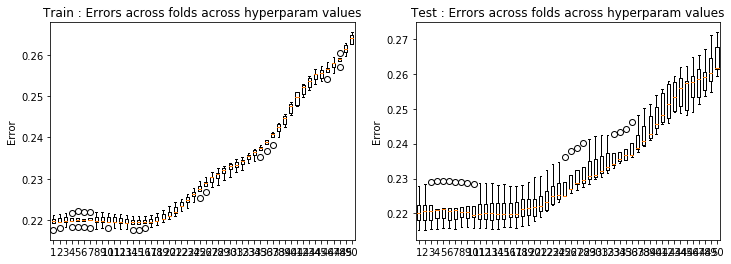

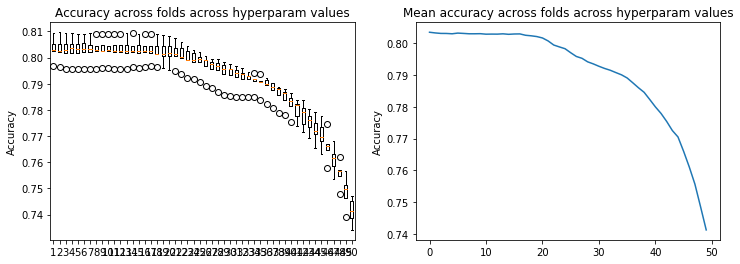

In [56]:
result_crossval(loss_tr34,loss_te34)
result_crossval_accuracy(acc34)

In [27]:
# test 35: degree 9, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr35, loss_te35, w35, acc35 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 9, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  5.42431858e+00  2.37380447e-01 -3.58922092e-01
 -8.68861016e-01  2.25434486e-01 -3.84305371e+00  1.65672614e+00
 -1.20725402e-01  6.22457357e-01  1.43113996e-02  2.18831889e-03
  3.44120854e-01 -3.37556741e-04  5.34675055e-02 -9.46117474e-02
 -2.62069880e-03 -6.92075749e-02  1.41814512e-02  3.51815918e-02
 -4.77288495e+01 -1.41637534e+00 -6.63067893e+00  1.04671583e+01
 -1.54377239e-02  1.33385215e+01 -4.41569687e+00  1.48568342e-01
  1.05112628e+00  7.33658856e-02  5.91102711e-02 -1.02861075e+00
 -1.00880542e-01 -1.18501838e-02  1.29505261e+00  4.66182154e-03
 -3.25293748e-01  1.11395647e-01 -2.07709990e-02  1.37993772e+02
  4.06822380e+00  3.02019521e+01 -2.26284041e+01 -3.14464809e+00
 -1.26154491e+01  6.42577187e+00  1.10030005e+00 -3.70626362e+00
 -1.34330937e-01 -1.6098

Ridge regression: w=[-2.78869252e-01  5.35920844e+00  2.47806662e-01 -2.41023599e-01
 -1.08790533e+00  2.39195281e-01 -3.18289523e+00  1.69903811e+00
 -5.71309436e-02  7.65907124e-01  3.09122636e-02 -2.36688201e-03
  4.70974361e-01 -1.05421626e-02  2.94531988e-02  4.72453906e-02
  2.89040835e-02 -3.88827401e-01  1.43792393e-02  1.74520987e-02
 -4.72659455e+01 -1.71601653e+00 -7.56391497e+00  1.14334245e+01
 -5.30289318e-01  1.12059223e+01 -3.41681336e+00  1.63833049e-01
  9.81417109e-01  8.15569740e-02  4.21756380e-02 -2.35201501e+00
 -1.11705532e-01 -4.62594307e-03  9.38936609e-02  1.45933274e-02
  1.46210037e+00  1.56750762e-01  5.27562859e-02  1.36690674e+02
  5.48791423e+00  3.28554629e+01 -2.36441099e+01 -7.27106977e-01
 -1.05410573e+01  3.12039856e+00  3.80400699e-01 -4.10733155e+00
 -2.03924470e-01 -6.95072159e-02  1.66312945e+00  5.69609377e-02
 -2.14520669e-01  1.25477703e+00 -2.25075160e-01 -1.84093184e+00
 -1.57553844e-01 -1.71694322e-01 -1.34538607e+02 -1.19210291e+01
 -4.1

Ridge regression: w=[-2.75017660e-01  4.28970539e+00  2.00010232e-01 -6.81040605e-01
 -1.35422396e-01  2.35098527e-01 -2.92526442e+00  9.35725012e-01
 -1.44638577e-01  6.81275493e-01  4.53658304e-02 -2.93725563e-02
  6.62085277e-01  1.94039106e-04  5.56368101e-02 -2.39207215e-01
 -1.02147716e-02 -1.67550103e-01 -1.06637678e-02 -3.93253639e-03
 -4.05320773e+01 -1.12694615e+00 -5.06921877e+00  6.99174785e+00
 -2.50693327e-01  1.02632414e+01 -1.22272567e+00  1.26857893e-01
  1.06480446e+00  6.53400407e-02  1.09887585e-02 -2.71021829e+00
 -1.22120345e-01 -2.31235259e-02  2.33269043e+00  2.68810077e-02
  5.11130349e-01  1.36485696e-01  4.56778227e-02  1.20588448e+02
  3.03498376e+00  2.77202033e+01 -1.63514801e+01 -2.16846353e+00
 -9.10790152e+00  6.76486548e-01  9.84931824e-01 -5.13844624e+00
 -3.78065597e-01  7.05623604e-02  2.56171644e+00  8.43578480e-03
 -4.06756922e-01 -5.90333350e+00  1.22715575e-01 -2.15795489e-01
  1.85091781e-02 -8.42994183e-02 -1.20788242e+02 -7.17688701e+00
 -3.8

Ridge regression: w=[-2.76819780e-01  4.19686384e+00  2.02444460e-01 -3.35592072e-01
 -3.87193887e-01  1.36986033e-01 -2.43215307e+00  1.50384690e+00
 -1.08430561e-01  1.07000218e+00  3.65635301e-02 -5.85575161e-03
  8.07823936e-01 -8.20874916e-03  3.49439801e-02 -2.55509976e-01
 -2.58652268e-02 -1.76884222e-01  7.24621643e-03 -1.11483783e-02
 -4.00024747e+01 -1.17807479e+00 -6.78532076e+00  8.18699981e+00
  4.54173638e-01  8.41006585e+00 -2.76969376e+00  1.01961477e-01
 -7.35912243e-01  9.22499226e-02  6.56092165e-02 -2.81677628e+00
 -1.21726159e-01  1.74351282e-02  2.27112334e+00  6.98336084e-02
 -8.34874686e-02  1.34819991e-01  2.46658414e-02  1.19217104e+02
  3.16658589e+00  3.08544634e+01 -1.87246243e+01 -4.07050173e+00
 -7.13350808e+00  1.89094931e+00  9.27700105e-01 -1.13924082e+00
 -2.74588638e-01 -5.00056237e-02  1.04580112e+00  7.72250109e-02
 -2.36231075e-01 -5.57532153e+00  2.95655841e-01  2.19748645e+00
 -9.59560613e-02  1.06171107e-01 -1.18988153e+02 -6.72966768e+00
 -4.0

Ridge regression: w=[-2.78727903e-01  3.21307408e+00  1.71285564e-01 -5.62269718e-01
  2.10816973e-01  3.02680005e-01 -2.33415178e+00  1.06121215e+00
 -1.16880332e-01  1.29568864e+00  1.67010056e-02 -8.98276428e-04
  7.15661699e-01  1.15324973e-02  5.28858542e-02 -1.57119291e-01
  1.39123329e-02 -1.90843221e-01  5.95720077e-03  1.35042102e-02
 -3.35292532e+01 -7.51566185e-01 -5.30519805e+00  5.10456067e+00
 -7.53992054e-01  8.04113236e+00 -1.89121910e+00  8.62845184e-02
 -1.50117479e+00  7.48341792e-02  2.29187783e-02 -1.99119623e+00
 -1.08565298e-01 -1.14230584e-03  1.63978942e+00  3.32885730e-02
  6.23117454e-01  1.27292673e-01  3.13540282e-02  1.02889949e+02
  1.44846350e+00  2.67508506e+01 -1.26063577e+01 -4.76399809e-01
 -6.63316608e+00  1.58911591e+00  7.93750643e-01 -1.09423818e+00
 -1.45872983e-01 -3.12092375e-02 -2.52733135e-01 -1.25947221e-01
 -4.50828834e-01 -3.77789552e+00 -2.44419415e-02 -5.83607906e-01
 -8.22219813e-02 -1.55685109e-01 -1.03347145e+02 -4.13381413e+00
 -3.6

Ridge regression: w=[-2.76431078e-01  2.20444574e+00  1.95008149e-01 -8.89529855e-01
  1.05701290e+00  2.55971205e-01 -3.03695941e+00  9.86517326e-01
 -1.19204661e-01  5.26933181e-01  1.63064604e-02  8.28762191e-04
  7.35876549e-01  4.44582420e-04  5.15996656e-02 -1.04753101e-01
 -2.60044587e-03 -1.52623957e-01  1.44187280e-02  3.34315170e-02
 -2.68354889e+01 -9.96062973e-01 -3.39360392e+00  1.02347676e+00
 -4.12536925e-01  1.01470537e+01 -2.15112427e+00  1.45173774e-01
  5.79077721e-01  7.30959321e-02  5.91230464e-02 -2.36681835e+00
 -1.01466617e-01 -1.23989105e-02  1.48550475e+00  4.08678397e-03
  1.62003654e-01  1.12667984e-01 -2.12841706e-02  8.56081768e+01
  2.21029284e+00  2.26201258e+01 -5.79612906e+00 -1.05397129e+00
 -8.22918624e+00  2.55424782e+00  1.05530694e+00 -2.05282588e+00
 -1.49239175e-01 -1.50456607e-01  1.18167868e+00  5.32611866e-02
 -3.39657963e-01 -4.06270929e+00  5.87959318e-02  9.00553888e-01
 -1.66272771e-01 -2.95215580e-01 -8.67130572e+01 -5.05716807e+00
 -3.3

Ridge regression: w=[-2.78869241e-01  2.16345129e+00  1.94123556e-01 -8.74924914e-01
  8.65037184e-01  2.59736890e-01 -2.56570632e+00  1.39207640e+00
 -5.59585571e-02  8.41284448e-01  3.22741580e-02 -3.36609338e-03
  5.25742752e-01 -9.61471454e-03  2.86606084e-02  8.90111848e-03
  2.96813783e-02 -3.16148662e-01  1.52534551e-02  1.58855277e-02
 -2.65967755e+01 -1.18860165e+00 -3.67842080e+00  1.91284831e+00
 -8.37530007e-01  8.72026062e+00 -2.44099117e+00  1.60509919e-01
  1.04231240e-01  8.19687209e-02  4.29269545e-02 -2.48781197e+00
 -1.10229953e-01 -5.10529062e-03  5.45325212e-01  1.53796104e-02
  1.01697303e+00  1.57224259e-01  5.31913984e-02  8.49919472e+01
  3.23016360e+00  2.36388551e+01 -6.71770917e+00  1.09119494e+00
 -7.05533727e+00  1.52451237e+00  3.41609193e-01 -1.90914529e+00
 -2.15093478e-01 -6.07068682e-02  2.15197538e+00  5.49056515e-02
 -2.09141492e-01 -1.00641914e+00 -2.34484732e-01 -1.00227243e+00
 -1.66234938e-01 -1.65788881e-01 -8.57961965e+01 -6.85373405e+00
 -3.4

Ridge regression: w=[-2.75017643e-01  1.01644798e+00  1.60680891e-01 -1.37510332e+00
  1.55167160e+00  2.63725323e-01 -2.28763109e+00  8.40207230e-01
 -1.42585758e-01  9.86094066e-01  4.65701202e-02 -3.13177254e-02
  5.15759204e-01  1.33546320e-03  5.30269704e-02 -1.98000657e-01
 -1.09809551e-02 -1.69691562e-01 -9.67239386e-03 -5.32902086e-03
 -1.92953214e+01 -7.75659119e-01 -6.35751317e-01 -9.77748701e-01
 -6.23631313e-01  7.89103022e+00 -7.87678990e-01  1.22668993e-01
 -5.99398397e-01  6.59067693e-02  1.03794100e-02 -2.16772145e+00
 -1.23211773e-01 -2.24271983e-02  2.09790713e+00  2.74012552e-02
  4.80644377e-01  1.37283229e-01  4.55195786e-02  6.71977467e+01
  1.62523857e+00  1.66414713e+01 -2.78075725e+00 -2.59807312e-01
 -6.22734972e+00 -1.87058956e-01  9.35066788e-01 -1.60258609e+00
 -3.87121728e-01  8.58460996e-02  1.95873456e+00  3.04887290e-03
 -3.90666439e-01 -5.63737751e+00  1.22450470e-01 -1.30706030e-01
  1.01743146e-02 -8.03537891e-02 -6.96720317e+01 -4.15049047e+00
 -2.8

Ridge regression: w=[-2.76819763e-01  1.03714664e+00  1.60811924e-01 -1.07081450e+00
  1.47544814e+00  1.76744585e-01 -1.94494599e+00  1.28520464e+00
 -1.06989299e-01  1.03366734e+00  3.74515096e-02 -7.51492392e-03
  8.51544639e-01 -7.19975186e-03  3.20815942e-02 -2.28831885e-01
 -2.55676859e-02 -2.98690169e-01  6.86894653e-03 -1.31984708e-02
 -1.94566585e+01 -8.40482019e-01 -2.06431087e+00 -7.78822502e-01
 -3.44013874e-03  6.62426648e+00 -2.10325751e+00  1.00509185e-01
 -9.40275045e-01  9.25735520e-02  6.57770205e-02 -3.10934558e+00
 -1.20350385e-01  1.75551173e-02  2.08968895e+00  7.02836310e-02
  5.98524424e-01  1.35207383e-01  2.34793740e-02  6.75304755e+01
  1.96382833e+00  1.90566498e+01 -3.12356004e+00 -1.92783199e+00
 -5.01873493e+00  9.17328908e-01  8.77466808e-01 -3.21645518e-01
 -2.83236257e-01 -4.00406944e-02  2.11383089e+00  7.38676729e-02
 -2.18526504e-01 -5.15095462e+00  2.86545626e-01  6.90177550e-01
 -9.84201690e-02  1.15545787e-01 -6.96359934e+01 -4.50376972e+00
 -3.0

Ridge regression: w=[-2.78727879e-01  1.77842454e-01  1.44021143e-01 -1.34061693e+00
  1.78590336e+00  3.21054511e-01 -1.79560684e+00  7.92655408e-01
 -1.15471780e-01  1.26941897e+00  1.72892854e-02 -2.78290668e-03
  8.19367745e-01  1.21966010e-02  5.07182840e-02 -1.30721118e-01
  1.42599766e-02 -1.72228031e-01  6.37954695e-03  1.21376955e-02
 -1.37821658e+01 -5.18603288e-01 -2.67261969e-01 -2.12238368e+00
 -1.00401180e+00  6.11414037e+00 -1.07828454e+00  8.56846962e-02
 -1.92539997e+00  7.39169454e-02  2.23345523e-02 -2.54138213e+00
 -1.07485057e-01 -1.55577555e-03  1.51146549e+00  3.37306209e-02
  4.60830986e-01  1.28255605e-01  3.02960140e-02  5.31064780e+01
  5.57272397e-01  1.39079246e+01 -8.18163735e-01  8.67498633e-01
 -4.45334837e+00  3.95048568e-01  7.51920561e-01  3.88575877e-01
 -1.51284100e-01 -1.90651175e-02  1.29021283e+00 -1.26237567e-01
 -4.38065287e-01 -3.79114327e+00 -3.19355151e-02 -1.84194547e-01
 -8.75751504e-02 -1.49199567e-01 -5.55637848e+01 -2.33359512e+00
 -2.4

Ridge regression: w=[-2.76431043e-01 -5.56839440e-01  1.55732550e-01 -1.65636827e+00
  2.21994194e+00  2.74418018e-01 -2.20061622e+00  7.62366911e-01
 -1.14357493e-01  5.48829046e-01  1.78526916e-02 -1.06236830e-03
  6.19757042e-01  1.33871056e-03  4.96763871e-02 -6.58212425e-02
 -2.27904317e-03 -2.10041262e-01  1.47083368e-02  3.14723059e-02
 -8.95914250e+00 -6.55775693e-01  1.74173697e+00 -4.06850417e+00
 -6.36755269e-01  7.25788929e+00 -1.26315197e+00  1.43900830e-01
  2.38350599e-01  7.29328235e-02  5.92284724e-02 -2.08018009e+00
 -1.01995914e-01 -1.25488749e-02  1.22656535e+00  3.62302486e-03
  4.69462837e-01  1.13771621e-01 -2.20582527e-02  4.06923106e+01
  9.58162860e-01  9.12384156e+00  1.88937596e+00  7.17075663e-03
 -5.23180503e+00  9.16230508e-01  9.78937682e-01 -1.18742007e+00
 -1.60837293e-01 -1.36368828e-01  1.44142147e+00  4.85542180e-02
 -3.30276637e-01 -3.51775129e+00  5.36721053e-02  2.22597551e-01
 -1.71395116e-01 -2.85033189e-01 -4.35248564e+01 -2.72737530e+00
 -2.0

Ridge regression: w=[-2.78869205e-01 -5.99852789e-01  1.38941696e-01 -1.70530253e+00
  2.04592588e+00  2.54741069e-01 -1.88833525e+00  1.19831322e+00
 -5.42666503e-02  8.38023493e-01  3.32633036e-02 -4.99417153e-03
  3.40368332e-01 -8.56876459e-03  2.76863445e-02  7.61883271e-03
  3.01896033e-02 -2.82189755e-01  1.61029915e-02  1.41612673e-02
 -8.77805753e+00 -7.08466715e-01  1.83434084e+00 -3.18148107e+00
 -8.41382607e-01  6.35920028e+00 -1.86056889e+00  1.59235578e-01
 -2.05379855e-01  8.23080311e-02  4.35020060e-02 -1.84016163e+00
 -1.08878729e-01 -5.42168226e-03  6.18468393e-01  1.61413641e-02
  7.64473269e-01  1.57585991e-01  5.33038766e-02  4.03896448e+01
  1.50682757e+00  9.24776491e+00  8.34591116e-01  1.37705756e+00
 -4.57514352e+00  7.14712084e-01  3.02693820e-01 -9.90482552e-01
 -2.23322991e-01 -4.82968864e-02  1.76979120e+00  5.15332765e-02
 -2.02725789e-01 -1.55970848e+00 -2.41746430e-01 -3.97120489e-01
 -1.74432363e-01 -1.58455293e-01 -4.31743204e+01 -3.84080931e+00
 -2.0

Ridge regression: w=[-2.75017591e-01 -1.34781992e+00  1.19305838e-01 -2.00887442e+00
  2.33733553e+00  2.79299662e-01 -1.53593187e+00  8.36386332e-01
 -1.37011495e-01  1.07053988e+00  4.70860299e-02 -3.32116554e-02
  2.57135673e-01  2.47230034e-03  5.07937245e-02 -1.19243393e-01
 -1.12056391e-02 -1.85266255e-01 -8.76422817e-03 -6.71349775e-03
 -4.07401450e+00 -4.29365020e-01  3.86737215e+00 -4.30401648e+00
 -8.21967710e-01  5.37514257e+00 -6.41398806e-01  1.21496704e-01
 -1.08565343e+00  6.64222947e-02  9.80205926e-03 -1.35936304e+00
 -1.23885896e-01 -2.15788371e-02  1.53492282e+00  2.77155789e-02
  5.22794168e-01  1.37867519e-01  4.49788859e-02  2.91300372e+01
  4.30715137e-01  4.29204356e+00  1.95363409e+00  6.76353662e-01
 -3.86291885e+00 -5.68848002e-01  8.58478684e-01 -3.65119751e-01
 -3.90734720e-01  1.00110794e-01  1.25516333e+00 -2.68293181e-03
 -3.75849375e-01 -4.11592950e+00  1.18945868e-01 -1.50461976e-01
  2.99971861e-03 -7.38008346e-02 -3.32133850e+01 -2.18589969e+00
 -1.5

Ridge regression: w=[-2.76819711e-01 -1.28618017e+00  1.10747081e-01 -1.74797623e+00
  2.33790267e+00  2.09785739e-01 -1.33962867e+00  1.12798647e+00
 -1.01542864e-01  9.47941475e-01  3.78705942e-02 -9.43043668e-03
  5.88282895e-01 -6.15289253e-03  2.97413754e-02 -1.76059843e-01
 -2.47254023e-02 -3.62558852e-01  6.62116893e-03 -1.45805528e-02
 -4.44630543e+00 -4.35756923e-01  2.72683935e+00 -4.49938133e+00
 -3.51761821e-01  4.61304985e+00 -1.65338104e+00  1.02258571e-01
 -8.48437898e-01  9.27231091e-02  6.59731098e-02 -2.27035476e+00
 -1.19334451e-01  1.76614988e-02  1.70807145e+00  7.05321277e-02
  9.47973250e-01  1.35461099e-01  2.25018722e-02  2.98993168e+01
  6.48369886e-01  5.97709485e+00  2.33083384e+00 -4.93149199e-01
 -3.14965625e+00  3.65949366e-01  7.95357330e-01 -9.53905751e-02
 -2.87765227e-01 -2.76442559e-02  1.71145524e+00  6.91561759e-02
 -2.03248189e-01 -4.06876826e+00  2.73619820e-01 -6.22536555e-02
 -1.00702359e-01  1.21699324e-01 -3.35279672e+01 -2.57970074e+00
 -1.6

Ridge regression: w=[-2.78727802e-01 -1.75000713e+00  1.16526825e-01 -1.83941314e+00
  2.33960216e+00  3.25316159e-01 -1.15449273e+00  6.53457974e-01
 -1.10527929e-01  1.11577908e+00  1.74348161e-02 -4.50100857e-03
  5.74693835e-01  1.25650776e-02  4.85326656e-02 -8.02730760e-02
  1.47659407e-02 -1.75660955e-01  6.65800413e-03  1.10719108e-02
 -1.39614667e+00 -2.83434528e-01  3.47945685e+00 -4.41546929e+00
 -1.08960752e+00  4.00727060e+00 -6.72855579e-01  8.69987352e-02
 -1.64011131e+00  7.32505694e-02  2.19243214e-02 -1.80793339e+00
 -1.06693633e-01 -2.00824321e-03  1.16949891e+00  3.41333922e-02
  4.30405550e-01  1.28751505e-01  2.92290253e-02  2.21977239e+01
 -2.55688161e-01  3.25261361e+00  2.31371257e+00  1.37173905e+00
 -2.56256410e+00 -1.34432913e-01  6.84412175e-01  5.81156811e-01
 -1.52955294e-01 -7.23813730e-03  1.07318972e+00 -1.25767292e-01
 -4.22052873e-01 -2.93698778e+00 -3.87711570e-02 -3.48943753e-02
 -9.08529640e-02 -1.41617667e-01 -2.60751466e+01 -1.03885821e+00
 -1.2

Ridge regression: w=[-2.76430932e-01 -2.13088485e+00  1.21643906e-01 -1.93163015e+00
  2.42158895e+00  2.84982004e-01 -1.31744434e+00  6.92130865e-01
 -1.02613247e-01  5.94438320e-01  1.83576188e-02 -3.32472891e-03
  3.12232839e-01  2.27570988e-03  4.77100163e-02 -1.08454905e-02
 -1.47062197e-03 -2.33626387e-01  1.48554646e-02  2.95478347e-02
  1.00089061e+00 -3.55572179e-01  4.32946291e+00 -4.91002536e+00
 -7.66819295e-01  4.38209297e+00 -9.15515862e-01  1.44733215e-01
 -1.70258408e-03  7.29535286e-02  5.89923130e-02 -1.15636651e+00
 -1.02065684e-01 -1.24398954e-02  8.40503858e-01  3.47217629e-03
  5.98553139e-01  1.14374636e-01 -2.25713915e-02  1.61870658e+01
 -8.26833400e-02  8.50872231e-01  3.04424342e+00  5.91266772e-01
 -2.73020767e+00  2.39119157e-01  8.45040932e-01 -7.44418102e-01
 -1.64920717e-01 -1.18567090e-01  8.85762639e-01  4.29883503e-02
 -3.16825384e-01 -2.48076395e+00  4.58244246e-02 -6.82252661e-02
 -1.74130285e-01 -2.70102404e-01 -2.04577523e+01 -1.10426408e+00
 -1.0

Ridge regression: w=[-2.78869094e-01 -2.18180664e+00  8.94848162e-02 -2.00904161e+00
  2.29791713e+00  2.40668550e-01 -1.13343940e+00  1.01818732e+00
 -5.18529922e-02  7.84754999e-01  3.35178382e-02 -6.85069512e-03
  6.93076448e-02 -7.57202304e-03  2.66555117e-02  2.29741205e-02
  2.98343233e-02 -2.76102292e-01  1.65861723e-02  1.26701351e-02
  1.19558414e+00 -2.75516595e-01  4.57250273e+00 -4.17907916e+00
 -7.37395726e-01  3.88968135e+00 -1.39290657e+00  1.59516678e-01
 -2.63646681e-01  8.24168692e-02  4.36389220e-02 -8.74923359e-01
 -1.07898420e-01 -5.53324796e-03  5.45317121e-01  1.65862560e-02
  6.90788046e-01  1.57675577e-01  5.31532204e-02  1.59488995e+01
  3.21512038e-02  6.49714953e-01  2.05947122e+00  1.12064776e+00
 -2.41544607e+00  2.09579595e-01  2.70327751e-01 -6.38146555e-01
 -2.25606732e-01 -3.45247765e-02  1.02402162e+00  4.66343882e-02
 -1.95064213e-01 -1.50390566e+00 -2.39998979e-01 -1.74908298e-01
 -1.78775979e-01 -1.48862423e-01 -2.03370097e+01 -1.63145124e+00
 -1.0

Ridge regression: w=[-2.75017432e-01 -2.56919260e+00  8.99482348e-02 -2.05056274e+00
  2.29926972e+00  2.83179891e-01 -8.07979564e-01  8.57503344e-01
 -1.25329438e-01  1.03471627e+00  4.64026777e-02 -3.45601827e-02
  5.75300923e-03  3.41344814e-03  4.83632380e-02 -4.52704463e-02
 -1.02536651e-02 -1.91881825e-01 -8.05163417e-03 -8.01585350e-03
  3.55585699e+00 -1.60852670e-01  5.20810472e+00 -4.24538881e+00
 -9.00772533e-01  3.02955392e+00 -6.42833826e-01  1.22008903e-01
 -1.02940302e+00  6.67409826e-02  9.23570719e-03 -5.82417961e-01
 -1.23685651e-01 -2.07946537e-02  1.01680861e+00  2.77883900e-02
  5.43941418e-01  1.38251667e-01  4.41035468e-02  1.06271930e+01
 -5.13830418e-01 -1.30627942e+00  2.04483095e+00  1.09387765e+00
 -1.90682922e+00 -6.59968716e-01  7.30823138e-01 -1.25976184e-01
 -3.84823552e-01  1.10147227e-01  6.21014095e-01 -7.83791783e-03
 -3.56210414e-01 -2.69493297e+00  1.08205073e-01 -1.72567701e-01
 -1.96985876e-03 -6.32515514e-02 -1.61462626e+01 -7.51740895e-01
 -8.1

Ridge regression: w=[-2.76819550e-01 -2.51166567e+00  7.30981191e-02 -1.83505238e+00
  2.31827845e+00  2.28909550e-01 -7.39486566e-01  9.67670428e-01
 -8.87404289e-02  8.20388373e-01  3.75240017e-02 -1.13205067e-02
  2.67940848e-01 -5.12498770e-03  2.78089957e-02 -1.16974495e-01
 -2.25214468e-02 -3.69776703e-01  6.46077065e-03 -1.44548672e-02
  3.21785506e+00 -1.02902930e-01  4.32055572e+00 -4.50469057e+00
 -5.61984275e-01  2.68863475e+00 -1.26191671e+00  1.05433166e-01
 -6.05882382e-01  9.26313269e-02  6.55620593e-02 -1.16430477e+00
 -1.18466061e-01  1.75796808e-02  1.31165632e+00  7.00983124e-02
  1.01753281e+00  1.35574597e-01  2.19275531e-02  1.13006426e+01
 -4.77214370e-01 -1.70319601e-01  2.51990504e+00  3.66015460e-01
 -1.55639436e+00 -8.46358280e-03  6.49899656e-01 -1.43647940e-01
 -2.85632333e-01 -1.36370794e-02  8.91715503e-01  6.27141672e-02
 -1.88141920e-01 -3.01241638e+00  2.51621706e-01 -2.89040427e-01
 -1.01544402e-01  1.19161271e-01 -1.63626231e+01 -9.84235668e-01
 -8.2

Ridge regression: w=[-2.78727567e-01 -2.71394003e+00  1.04565823e-01 -1.77666954e+00
  2.17236323e+00  3.16711633e-01 -6.10365197e-01  5.84540754e-01
 -1.00363070e-01  9.16005701e-01  1.70839854e-02 -5.80719056e-03
  2.97598384e-01  1.23934049e-02  4.49158701e-02 -2.90622072e-02
  1.55603953e-02 -1.85314609e-01  6.72257078e-03  1.00624541e-02
  4.53538508e+00 -1.49428495e-01  4.17137218e+00 -3.85274915e+00
 -1.06541916e+00  2.27828867e+00 -5.01345258e-01  8.80987251e-02
 -1.08501103e+00  7.25893949e-02  2.13913456e-02 -9.19698849e-01
 -1.05832076e-01 -2.50393054e-03  8.43183053e-01  3.42893826e-02
  4.56475628e-01  1.28845318e-01  2.80798241e-02  8.07879657e+00
 -7.86454168e-01 -7.04756082e-01  1.82359529e+00  1.45471737e+00
 -1.16255428e+00 -3.16092031e-01  5.71043869e-01  2.56119682e-01
 -1.50632761e-01  3.20794935e-03  4.82914427e-01 -1.22229463e-01
 -3.89636058e-01 -2.13928749e+00 -4.55105854e-02 -2.57793988e-02
 -9.13096359e-02 -1.30018087e-01 -1.34317433e+01 -1.68769514e-01
 -6.4

Ridge regression: w=[-2.76430592e-01 -2.89565405e+00  1.11596268e-01 -1.71043968e+00
  2.05437750e+00  2.82783056e-01 -6.85316143e-01  6.11454831e-01
 -8.34483680e-02  6.03296895e-01  1.77243958e-02 -6.79493918e-03
  9.72201462e-02  3.67690777e-03  4.44135127e-02  4.11666075e-02
  1.28551622e-04 -2.27203594e-01  1.45454818e-02  2.66165228e-02
  5.60368999e+00 -2.25273011e-01  4.18504803e+00 -3.61529051e+00
 -7.89262201e-01  2.38640511e+00 -6.81004768e-01  1.43622516e-01
 -1.49514347e-01  7.26197992e-02  5.78757348e-02 -4.39670138e-01
 -1.01484271e-01 -1.21132632e-02  5.11506272e-01  3.40319052e-03
  5.93501949e-01  1.14799047e-01 -2.28624872e-02  5.53308554e+00
 -6.31949857e-01 -1.34094409e+00  1.80107999e+00  7.92245233e-01
 -1.13569392e+00 -7.91906375e-02  6.39960569e-01 -4.74523412e-01
 -1.60533245e-01 -8.82066971e-02  3.55468816e-01  3.27526840e-02
 -2.88120360e-01 -1.67456280e+00  3.27236825e-02 -1.26772842e-01
 -1.72322460e-01 -2.42022509e-01 -1.13033100e+01 -1.69747291e-01
 -5.4

Ridge regression: w=[-2.78868750e-01 -2.94554277e+00  7.19476496e-02 -1.79237235e+00
  2.01324626e+00  2.25905027e-01 -5.82420596e-01  8.24618694e-01
 -4.92023688e-02  7.06136710e-01  3.29510097e-02 -9.27387149e-03
 -9.36575393e-02 -6.43569046e-03  2.46730575e-02  5.07841343e-02
  2.77782062e-02 -2.72922164e-01  1.64213012e-02  1.07060384e-02
  5.78812930e+00 -7.57452296e-02  4.44581548e+00 -3.20467963e+00
 -6.32298640e-01  2.14427054e+00 -9.85193137e-01  1.56992688e-01
 -2.55635300e-01  8.18473244e-02  4.31623346e-02 -1.91399610e-01
 -1.06918685e-01 -5.63967662e-03  4.00323042e-01  1.64575955e-02
  6.66412272e-01  1.57564492e-01  5.22645716e-02  5.33946408e+00
 -7.56706854e-01 -1.58373434e+00  1.12590080e+00  8.42324917e-01
 -1.01613617e+00 -1.09702017e-01  2.38936750e-01 -4.52874064e-01
 -2.21358639e-01 -1.48035534e-02  4.32292023e-01  3.88131326e-02
 -1.77281320e-01 -1.25366534e+00 -2.21364309e-01 -1.05148103e-01
 -1.77248087e-01 -1.31153633e-01 -1.12736321e+01 -3.60695406e-01
 -5.4

Ridge regression: w=[-2.75016939e-01 -3.11226882e+00  9.13784773e-02 -1.71427992e+00
  1.88739641e+00  2.69669940e-01 -3.46777338e-01  8.14936751e-01
 -1.09622982e-01  9.24034086e-01  4.36623865e-02 -3.54635341e-02
 -1.05390881e-01  4.24228168e-03  4.35417036e-02  1.82568159e-02
 -7.44085678e-03 -1.80101750e-01 -7.56530941e-03 -9.91120758e-03
  6.85932984e+00 -1.06194712e-01  4.42515764e+00 -2.88577787e+00
 -8.49876473e-01  1.59004872e+00 -6.33675154e-01  1.20262444e-01
 -8.06587256e-01  6.61611908e-02  8.55133738e-03 -1.57551655e-01
 -1.22467742e-01 -1.98184200e-02  6.24815690e-01  2.71974092e-02
  5.05176018e-01  1.38601304e-01  4.22082271e-02  3.00696857e+00
 -8.77287587e-01 -2.04676156e+00  8.34129351e-01  1.11067107e+00
 -7.94086005e-01 -5.96066728e-01  5.63420759e-01 -1.57508594e-01
 -3.61495112e-01  1.17524371e-01  2.43302259e-01 -1.31091203e-02
 -3.13256817e-01 -1.75898559e+00  8.35373709e-02 -1.40760302e-01
 -4.81798493e-03 -4.46525535e-02 -9.75234686e+00 -6.55172020e-03
 -4.6

Ridge regression: w=[-2.76819054e-01 -3.08040287e+00  7.14014024e-02 -1.55661051e+00
  1.89916566e+00  2.26640845e-01 -3.51238116e-01  7.97145689e-01
 -7.09941437e-02  6.85122792e-01  3.58469567e-02 -1.35631104e-02
  9.64177928e-02 -3.79602245e-03  2.46677409e-02 -4.93936370e-02
 -1.76538337e-02 -3.36944668e-01  6.07120727e-03 -1.23825682e-02
  6.64532190e+00 -1.84336809e-02  3.79743491e+00 -3.06386432e+00
 -5.96644709e-01  1.48556497e+00 -9.46084474e-01  1.05873221e-01
 -3.83809536e-01  9.15380789e-02  6.39593445e-02 -4.69411654e-01
 -1.17086329e-01  1.71205447e-02  9.22438016e-01  6.82191741e-02
  9.18595323e-01  1.35757477e-01  2.08819075e-02  3.46993718e+00
 -9.42285213e-01 -1.33712251e+00  1.18147062e+00  6.41832859e-01
 -6.38254864e-01 -1.98630783e-01  4.54183807e-01 -2.04038702e-01
 -2.71917867e-01  5.73462613e-03  3.14292239e-01  5.22853123e-02
 -1.60046602e-01 -2.16461678e+00  2.08212990e-01 -2.53959050e-01
 -9.91558102e-02  1.02173047e-01 -9.88987410e+00 -1.17638633e-01
 -4.5

Ridge regression: w=[-2.78726839e-01 -3.13571497e+00  1.19197551e-01 -1.49588926e+00
  1.76686837e+00  2.89798987e-01 -2.86580220e-01  5.18226328e-01
 -8.88945233e-02  7.38653575e-01  1.59863788e-02 -7.08080550e-03
  1.62278727e-01  1.11983344e-02  3.72046290e-02  3.03771623e-02
  1.67167881e-02 -1.86562050e-01  6.23489887e-03  8.14858687e-03
  7.12302543e+00 -1.95379987e-01  3.50234271e+00 -2.50295646e+00
 -9.23573295e-01  1.30754134e+00 -4.26156124e-01  8.57865992e-02
 -6.36669216e-01  7.05638261e-02  2.04504442e-02 -4.29587767e-01
 -1.04230797e-01 -2.92669771e-03  5.13013557e-01  3.36377690e-02
  4.73029160e-01  1.28909272e-01  2.57260444e-02  2.20930806e+00
 -8.57005759e-01 -1.18215684e+00  6.05969511e-01  1.23225675e+00
 -4.67721042e-01 -3.07104824e-01  4.43240050e-01 -2.91861918e-02
 -1.41998006e-01  1.54609548e-02  1.12165828e-01 -1.10468481e-01
 -3.17900790e-01 -1.47048752e+00 -5.35551953e-02 -4.82390573e-02
 -8.69473230e-02 -1.07773867e-01 -8.81926313e+00  2.22477781e-01
 -3.8

Ridge regression: w=[-2.76429541e-01 -3.17796338e+00  1.29543714e-01 -1.41040740e+00
  1.59391424e+00  2.64561393e-01 -3.31395569e-01  4.85143828e-01
 -6.55355122e-02  5.40881707e-01  1.56727016e-02 -1.25024637e-02
  4.19507954e-02  6.36297713e-03  3.81867011e-02  9.80514716e-02
  2.84463047e-03 -2.03809986e-01  1.28435064e-02  2.11544508e-02
  7.46680652e+00 -2.91503629e-01  3.35298252e+00 -2.10564122e+00
 -7.03534585e-01  1.35283228e+00 -4.82537411e-01  1.35112627e-01
 -1.68659834e-01  7.03738002e-02  5.43539636e-02 -1.37080635e-01
 -9.96365449e-02 -1.11754461e-02  1.98125067e-01  2.94974095e-03
  5.28428581e-01  1.15772753e-01 -2.32803121e-02  1.19602448e+00
 -6.61422567e-01 -1.29082611e+00  4.66504714e-01  6.95718588e-01
 -4.32177097e-01 -1.81183136e-01  4.45407090e-01 -3.08130218e-01
 -1.44590938e-01 -3.42988665e-02  7.98099474e-02  1.05966514e-02
 -2.30720944e-01 -1.04248865e+00  1.10878723e-02 -1.01202382e-01
 -1.59474943e-01 -1.89285940e-01 -7.96883118e+00  2.02404005e-01
 -3.4

Ridge regression: w=[-2.78867690e-01 -3.21572024e+00  9.20761991e-02 -1.47658159e+00
  1.61999497e+00  2.06877869e-01 -2.70225309e-01  6.12676615e-01
 -4.81023590e-02  5.86189432e-01  3.12024008e-02 -1.28542409e-02
 -9.57675168e-02 -4.75895408e-03  2.04227592e-02  9.48184245e-02
  2.29637939e-02 -2.58643302e-01  1.46952029e-02  7.28021662e-03
  7.59795741e+00 -1.42068137e-01  3.54469036e+00 -1.98731698e+00
 -5.17063417e-01  1.23261159e+00 -6.69550547e-01  1.47885647e-01
 -1.90970190e-01  7.92762520e-02  4.11441367e-02  5.87589674e-02
 -1.05077675e-01 -5.89198234e-03  1.77095301e-01  1.49243256e-02
  6.29001353e-01  1.57406587e-01  4.91506580e-02  1.08667132e+00
 -8.36275316e-01 -1.43804671e+00  1.18813450e-01  5.89108017e-01
 -3.97436091e-01 -2.08712827e-01  2.17725678e-01 -3.24863409e-01
 -2.07516619e-01  1.76963449e-02  1.24068314e-01  2.51604624e-02
 -1.36831554e-01 -8.72421366e-01 -1.76155317e-01 -7.75923109e-02
 -1.63387312e-01 -9.80228354e-02 -7.97631431e+00  1.42756184e-01
 -3.4

Ridge regression: w=[-2.75015416e-01 -3.20706575e+00  1.20474205e-01 -1.38638707e+00
  1.46209665e+00  2.36068732e-01 -9.20309250e-02  6.42205895e-01
 -9.78676481e-02  7.26546230e-01  3.73340530e-02 -3.58875278e-02
 -6.81457331e-02  5.18314972e-03  3.46964815e-02  8.48874295e-02
 -2.43938180e-03 -1.54957073e-01 -7.64108893e-03 -1.29146062e-02
  7.86952164e+00 -2.45830006e-01  3.43621614e+00 -1.66939737e+00
 -6.74113066e-01  8.72490753e-01 -5.09312887e-01  1.14160257e-01
 -5.34834391e-01  6.28781834e-02  7.51637838e-03 -4.36416470e-02
 -1.19242510e-01 -1.77856352e-02  2.63197423e-01  2.49789187e-02
  4.35442492e-01  1.39270975e-01  3.78024005e-02  1.58685670e-01
 -7.42996687e-01 -1.54002449e+00 -5.33539178e-02  8.24919011e-01
 -3.47979589e-01 -4.44732453e-01  4.33924969e-01 -1.63198606e-01
 -3.07328271e-01  1.23240397e-01  5.69124759e-02 -2.00395712e-02
 -2.33736201e-01 -1.04823227e+00  4.20567529e-02 -9.77678966e-02
 -3.63611689e-03 -1.49380163e-02 -7.32055114e+00  2.50530700e-01
 -3.1

Ridge regression: w=[-2.76817521e-01 -3.20702330e+00  1.02958795e-01 -1.29650572e+00
  1.46550408e+00  2.04762776e-01 -1.27712256e-01  5.83942240e-01
 -5.82928602e-02  5.21672171e-01  3.18120133e-02 -1.62487084e-02
  8.74528856e-02 -1.58679961e-03  1.91862373e-02  3.57102860e-02
 -9.52646338e-03 -2.85516074e-01  4.70820798e-03 -8.25412383e-03
  7.80670939e+00 -1.63956873e-01  3.07075675e+00 -1.74243419e+00
 -4.92828106e-01  8.66466421e-01 -6.76451567e-01  1.00884399e-01
 -1.93456656e-01  8.73284623e-02  5.97930187e-02 -2.10807289e-01
 -1.13914175e-01  1.59484701e-02  4.76872306e-01  6.30266751e-02
  7.69043749e-01  1.36596401e-01  1.76163407e-02  3.87310183e-01
 -8.25825051e-01 -1.17587151e+00  1.18912440e-01  5.26095230e-01
 -2.68557533e-01 -2.04120165e-01  3.05049738e-01 -1.96424243e-01
 -2.37631245e-01  3.22754213e-02  3.50782027e-02  3.37835047e-02
 -1.09917002e-01 -1.34541951e+00  1.37388604e-01 -1.67873039e-01
 -8.85170108e-02  6.83286856e-02 -7.42692456e+00  1.95583201e-01
 -3.0

Ridge regression: w=[-2.78724591e-01 -3.13143501e+00  1.51161775e-01 -1.27344607e+00
  1.36086576e+00  2.45159384e-01 -7.36084590e-02  3.91722860e-01
 -8.21386283e-02  5.60364404e-01  1.36348054e-02 -8.40132129e-03
  1.49141708e-01  8.67528749e-03  2.52203886e-02  9.71536419e-02
  1.79556248e-02 -1.67018300e-01  4.50741753e-03  5.16654016e-03
  7.75994749e+00 -3.68305932e-01  2.91239645e+00 -1.40077934e+00
 -6.81986711e-01  7.68160894e-01 -3.20303060e-01  7.94621569e-02
 -3.28749783e-01  6.42172886e-02  1.85623809e-02 -2.53169129e-01
 -1.00320483e-01 -2.75304693e-03  1.65055961e-01  3.12637024e-02
  4.40673728e-01  1.29633971e-01  2.00643923e-02 -4.68779728e-02
 -6.05507155e-01 -1.02205447e+00 -1.42703283e-01  7.98825072e-01
 -2.22047848e-01 -2.19175554e-01  3.60922014e-01 -1.35018143e-01
 -1.22788111e-01  3.06583423e-02 -5.40286899e-02 -8.66140132e-02
 -2.05523687e-01 -8.38737285e-01 -6.09259264e-02 -6.17372289e-02
 -7.27357180e-02 -7.43615705e-02 -6.89064121e+00  3.24342590e-01
 -2.7

Ridge regression: w=[-2.76426294e-01 -3.02829406e+00  1.56794561e-01 -1.19566481e+00
  1.16444908e+00  2.34790581e-01 -8.64551594e-02  3.22542527e-01
 -5.58239872e-02  4.12662182e-01  1.19475791e-02 -1.87798930e-02
  7.61374185e-02  1.06568869e-02  3.01210817e-02  1.50959430e-01
  6.21624659e-03 -1.65789383e-01  8.38712743e-03  1.42617501e-02
  7.56882348e+00 -4.45347911e-01  2.79436612e+00 -1.01898293e+00
 -5.54351053e-01  7.58902021e-01 -3.03259126e-01  1.18042744e-01
 -7.62298896e-02  6.29058347e-02  4.51006391e-02 -6.57158870e-02
 -9.49934992e-02 -8.38869100e-03 -7.91761033e-02  1.81189192e-03
  4.36464580e-01  1.18836438e-01 -2.42266406e-02 -3.49509408e-01
 -4.30066167e-01 -1.07102759e+00 -1.90483659e-01  4.53692902e-01
 -2.03573593e-01 -1.51918007e-01  3.33046282e-01 -2.03129136e-01
 -1.15356302e-01  3.11587717e-02 -4.16394482e-02 -2.54752609e-02
 -1.55031259e-01 -5.24544930e-01 -1.43825624e-02 -7.54066132e-02
 -1.25616875e-01 -1.21572434e-01 -6.33139907e+00  2.90231850e-01
 -2.6

Ridge regression: w=[-2.78864414e-01 -3.05154458e+00  1.27778870e-01 -1.24182853e+00
  1.21427793e+00  1.83026253e-01 -4.84199478e-02  3.76091843e-01
 -4.90226911e-02  4.20778828e-01  2.78316883e-02 -1.67614963e-02
  1.54025350e-03 -2.29210060e-03  1.46183937e-02  1.40567617e-01
  1.65361125e-02 -2.19698814e-01  1.00661202e-02  3.28071262e-03
  7.64120738e+00 -3.38239847e-01  2.90850773e+00 -1.04152347e+00
 -3.86904660e-01  6.97227478e-01 -4.07586684e-01  1.33368938e-01
 -6.79058583e-02  7.13675739e-02  3.55023175e-02  5.38247759e-02
 -1.00919747e-01 -6.17667371e-03 -5.33592780e-02  1.05859152e-02
  5.43114182e-01  1.57583123e-01  4.13780772e-02 -3.80361546e-01
 -5.50353614e-01 -1.11868371e+00 -3.42627243e-01  3.39558929e-01
 -1.96786229e-01 -1.53515468e-01  2.11673447e-01 -2.26743022e-01
 -1.81211022e-01  5.70954701e-02 -2.40343810e-02  4.54645804e-03
 -7.94396683e-02 -4.71234328e-01 -1.13632959e-01 -6.44055788e-02
 -1.27058134e-01 -5.68487136e-02 -6.34906284e+00  2.66108949e-01
 -2.6

Ridge regression: w=[-2.75010711e-01 -2.87638956e+00  1.49500907e-01 -1.12619089e+00
  1.01272593e+00  1.94592086e-01  9.29552091e-02  3.99418554e-01
 -9.14840830e-02  4.76045771e-01  2.76131462e-02 -3.53437061e-02
  2.70223276e-02  6.30833347e-03  2.46326369e-02  1.38361747e-01
  3.13472924e-03 -1.13049671e-01 -8.62768740e-03 -1.58350251e-02
  7.33199686e+00 -4.25442374e-01  2.77041515e+00 -7.38795713e-01
 -4.58724237e-01  4.41848800e-01 -3.14024533e-01  1.07477168e-01
 -2.41859205e-01  5.36284158e-02  5.79607381e-03 -5.42127956e-02
 -1.11764752e-01 -1.29754445e-02 -1.64916020e-02  2.03380141e-02
  3.39019203e-01  1.41350209e-01  2.89804101e-02 -6.53001192e-01
 -4.37020556e-01 -1.17482293e+00 -3.63413682e-01  4.50471008e-01
 -2.15150662e-01 -2.66344284e-01  3.64411500e-01 -1.16194892e-01
 -2.26097829e-01  1.25305520e-01 -3.96728061e-02 -2.82471179e-02
 -1.44329730e-01 -5.26866424e-01 -1.14432568e-04 -7.35583931e-02
  3.79531321e-03  1.68869552e-02 -5.80756580e+00  2.82373285e-01
 -2.4

Ridge regression: w=[-2.76812785e-01 -2.89148689e+00  1.37888038e-01 -1.09745401e+00
  1.01683335e+00  1.75811681e-01  4.62010450e-02  3.43954353e-01
 -5.36909707e-02  3.41595471e-01  2.54145120e-02 -1.81033076e-02
  1.44931882e-01  1.65323372e-03  1.33120337e-02  1.08601787e-01
 -1.02727664e-03 -2.11248463e-01  1.71506985e-03 -3.63748335e-03
  7.35807244e+00 -3.68476423e-01  2.60530780e+00 -7.55538075e-01
 -3.43424012e-01  4.70996644e-01 -4.20552272e-01  9.41180853e-02
 -2.41622626e-02  7.56373318e-02  5.06368329e-02 -1.47245053e-01
 -1.06524655e-01  1.36164383e-02  1.04414429e-01  5.15107648e-02
  5.88307885e-01  1.39493041e-01  1.02305553e-02 -5.82640252e-01
 -4.96731969e-01 -1.01571642e+00 -3.03235053e-01  2.80791944e-01
 -1.62395927e-01 -1.17146484e-01  2.36818640e-01 -1.46246605e-01
 -1.84250175e-01  5.64323383e-02 -8.90636000e-02  7.83814851e-03
 -5.54310944e-02 -6.79045362e-01  6.53620882e-02 -1.15696112e-01
 -6.49167653e-02  3.26959270e-02 -5.89199944e+00  2.51463785e-01
 -2.4

Ridge regression: w=[-2.78717647e-01 -2.66708867e+00  1.70313144e-01 -1.05354253e+00
  8.76612938e-01  1.99594863e-01  1.12286826e-01  2.48132141e-01
 -7.83222802e-02  3.91942582e-01  1.02077243e-02 -8.74927711e-03
  1.65455329e-01  6.04365780e-03  1.47932284e-02  1.41374298e-01
  1.88767179e-02 -1.15747673e-01  1.31619324e-03  2.85771232e-03
  6.86167534e+00 -5.09969217e-01  2.46066570e+00 -4.84480781e-01
 -4.49770811e-01  3.73362667e-01 -1.95385467e-01  7.38206954e-02
 -1.10630326e-01  4.88222764e-02  1.48369626e-02 -1.86622669e-01
 -9.16746425e-02 -1.13791384e-03 -6.67224135e-02  2.64906970e-02
  3.35886307e-01  1.32695784e-01  9.36125564e-03 -6.41372806e-01
 -3.25731385e-01 -9.20515568e-01 -3.51798260e-01  3.94594485e-01
 -1.68931802e-01 -1.26022122e-01  3.15894774e-01 -1.36735199e-01
 -9.59408881e-02  4.17046789e-02 -1.18634615e-01 -5.99519648e-02
 -1.04238464e-01 -4.00467671e-01 -6.42644242e-02 -6.44024359e-02
 -4.64302252e-02 -4.42714489e-02 -5.34346972e+00  2.98987803e-01
 -2.2

Ridge regression: w=[-2.76416265e-01 -2.41638644e+00  1.62981046e-01 -9.38498112e-01
  6.65924865e-01  2.02331962e-01  1.13088460e-01  1.89863471e-01
 -5.03967538e-02  2.93267456e-01  7.42500191e-03 -2.10804180e-02
  1.12251627e-01  1.50049705e-02  2.40955303e-02  1.74912075e-01
  9.23134454e-03 -1.02524244e-01  1.41071783e-03  9.75573671e-03
  6.23880624e+00 -5.27612758e-01  2.27481915e+00 -1.60244661e-01
 -4.11485826e-01  3.40267690e-01 -1.67765432e-01  1.00244345e-01
  2.29120647e-02  4.58424828e-02  2.73008059e-02 -5.94819108e-02
 -8.63837311e-02 -2.31361873e-03 -2.14810591e-01 -9.31720054e-05
  2.98283503e-01  1.27616075e-01 -2.56295578e-02 -6.11415743e-01
 -2.35013832e-01 -9.45426926e-01 -3.10442000e-01  2.43312870e-01
 -1.58698251e-01 -9.81783553e-02  2.72282993e-01 -1.33835597e-01
 -8.25808368e-02  7.16605686e-02 -8.90601913e-02 -6.06019392e-02
 -9.65717560e-02 -2.26750803e-01 -3.35426910e-02 -6.23176039e-02
 -7.24472454e-02 -7.14352245e-02 -4.71377753e+00  2.62042699e-01
 -2.1

Ridge regression: w=[-2.78854296e-01 -2.43048484e+00  1.41434167e-01 -9.69664368e-01
  7.06745120e-01  1.59996040e-01  1.35705308e-01  1.89359244e-01
 -4.91661984e-02  2.87024021e-01  2.33825909e-02 -1.83885703e-02
  9.23366090e-02  4.20766489e-04  1.06125114e-02  1.62821203e-01
  1.23228492e-02 -1.43047720e-01  3.04274168e-03  1.20751538e-03
  6.27930707e+00 -4.61995020e-01  2.34275774e+00 -2.04937324e-01
 -2.78105382e-01  3.11011203e-01 -2.14044777e-01  1.20355583e-01
  2.42980651e-02  5.33781651e-02  2.48597502e-02 -1.37527201e-02
 -9.36916930e-02 -5.99785756e-03 -1.71696479e-01  2.88444732e-03
  3.79711758e-01  1.59738801e-01  2.84507202e-02 -6.08355975e-01
 -2.88903731e-01 -9.45536001e-01 -3.77843592e-01  1.58515925e-01
 -1.57254004e-01 -7.50873975e-02  2.03381714e-01 -1.54352089e-01
 -1.49671360e-01  8.21034425e-02 -9.05526116e-02 -1.63208305e-02
 -3.43651162e-02 -2.24542150e-01 -6.66701472e-02 -5.70035067e-02
 -7.17223947e-02 -2.83246737e-02 -4.73173733e+00  2.42514765e-01
 -2.1

Ridge regression: w=[-2.74996180e-01 -2.12035427e+00  1.48948352e-01 -7.85892896e-01
  4.91833782e-01  1.59301914e-01  2.28316498e-01  2.23202418e-01
 -8.39894213e-02  2.90536898e-01  1.80790509e-02 -3.28608887e-02
  8.35324293e-02  7.38478986e-03  1.75473889e-02  1.59636596e-01
  7.46867071e-03 -5.01440473e-02 -1.01899247e-02 -1.66898283e-02
  5.56801014e+00 -4.90565322e-01  2.06601862e+00  3.00219869e-02
 -2.97257122e-01  1.56909758e-01 -1.63708908e-01  1.04024420e-01
 -3.50822096e-02  3.62064549e-02  3.38913218e-03 -6.62846684e-02
 -9.91661649e-02 -4.70942365e-03 -1.37131767e-01  1.39276615e-02
  2.04661050e-01  1.47902354e-01  1.68391844e-02 -5.82639535e-01
 -2.41197406e-01 -9.66366289e-01 -3.05217140e-01  1.94991721e-01
 -1.90028660e-01 -1.44784099e-01  3.10152266e-01 -6.64720087e-02
 -1.52719116e-01  1.18219517e-01 -7.99729206e-02 -3.47211172e-02
 -8.31649878e-02 -2.59678350e-01 -2.61516979e-02 -6.33080147e-02
  1.47604256e-02  3.62304340e-02 -4.08406524e+00  2.27129910e-01
 -1.9

Ridge regression: w=[-2.76798159e-01 -2.13246389e+00  1.43884281e-01 -8.01504737e-01
  4.95787145e-01  1.51739529e-01  1.83292434e-01  1.69890131e-01
 -5.15132739e-02  2.26672453e-01  1.87699576e-02 -1.73847457e-02
  1.74859964e-01  5.04837919e-03  9.84289584e-03  1.42007858e-01
  4.75326692e-03 -1.06412549e-01 -1.90413339e-03 -3.61509333e-04
  5.60875182e+00 -4.60093380e-01  2.02781555e+00  3.55698223e-02
 -2.30413002e-01  1.90232687e-01 -2.22750535e-01  8.98882229e-02
  5.93460558e-02  5.30510924e-02  3.59169736e-02 -1.20859866e-01
 -9.37286439e-02  1.01468094e-02 -6.98990285e-02  3.29623603e-02
  3.54580370e-01  1.47489810e-01 -4.24139180e-04 -5.78662812e-01
 -2.73493567e-01 -8.94935472e-01 -2.89396177e-01  1.03795549e-01
 -1.49163824e-01 -4.86902908e-02  2.04911423e-01 -9.74015661e-02
 -1.33305086e-01  6.47967642e-02 -1.33367507e-01 -1.60772590e-02
 -2.12786274e-02 -3.27151120e-01  2.07716995e-02 -9.06793286e-02
 -3.62039871e-02  1.25558728e-02 -4.14109929e+00  2.09184220e-01
 -1.8

Ridge regression: w=[-2.78696200e-01 -1.81039840e+00  1.56953953e-01 -6.95807586e-01
  3.55963198e-01  1.61712083e-01  2.40387770e-01  1.51689089e-01
 -7.15769354e-02  2.88208303e-01  6.60550138e-03 -7.04165295e-03
  1.58797808e-01  4.90362165e-03  1.00163427e-02  1.52509596e-01
  1.91959444e-02 -4.13800121e-02 -1.75179114e-03  2.27652844e-03
  4.84176557e+00 -5.19762669e-01  1.76561656e+00  2.02631525e-01
 -2.89046161e-01  1.13990592e-01 -9.97472022e-02  7.02968778e-02
 -2.62959789e-03  2.41265189e-02  9.59909937e-03 -1.41029312e-01
 -7.88436973e-02  1.75640271e-03 -1.39567135e-01  2.01844038e-02
  1.80895726e-01  1.41542768e-01 -3.09337412e-03 -4.70707357e-01
 -1.93706377e-01 -7.97303940e-01 -2.28765146e-01  1.59611735e-01
 -1.69654174e-01 -7.30804825e-02  2.70348899e-01 -1.09869568e-01
 -7.14196652e-02  4.07732768e-02 -1.32137861e-01 -4.45352055e-02
 -5.04778430e-02 -2.03014063e-01 -6.37596226e-02 -6.23296760e-02
 -1.95279578e-02 -2.68974128e-02 -3.50328648e+00  2.20238422e-01
 -1.6

Ridge regression: w=[-2.76385290e-01 -1.50464321e+00  1.39514680e-01 -5.38802087e-01
  2.13588405e-01  1.66533064e-01  2.29422989e-01  1.15407707e-01
 -4.31324269e-02  2.36221094e-01  3.03766787e-03 -1.78896059e-02
  1.22914534e-01  1.71380884e-02  2.08250195e-02  1.68733363e-01
  1.10042118e-02 -2.83408985e-02 -4.51909789e-03  8.19531902e-03
  4.07505761e+00 -4.92571509e-01  1.45977847e+00  3.39316861e-01
 -2.85272120e-01  9.90513287e-02 -8.42479616e-02  8.65173546e-02
  5.27279178e-02  2.23875027e-02  7.01057840e-03 -6.10609242e-02
 -7.66172744e-02  5.78790740e-03 -2.16263010e-01 -2.61192971e-03
  1.42856734e-01  1.46139317e-01 -2.63227071e-02 -3.27485385e-01
 -1.68432939e-01 -7.67229769e-01 -1.46739239e-01  1.10041688e-01
 -1.56258129e-01 -6.87257996e-02  2.19796044e-01 -9.19699407e-02
 -5.59812493e-02  7.51657197e-02 -1.00763593e-01 -7.82148773e-02
 -6.44518171e-02 -1.18326180e-01 -4.24369804e-02 -5.62964511e-02
 -2.60823894e-02 -4.66002494e-02 -2.86833301e+00  1.84954973e-01
 -1.4

Ridge regression: w=[-2.78823049e-01 -1.51348303e+00  1.22020639e-01 -5.58229052e-01
  2.37780544e-01  1.37171185e-01  2.42447588e-01  9.04380320e-02
 -4.56316950e-02  2.31379227e-01  1.83808467e-02 -1.62272751e-02
  1.27365275e-01  2.39285205e-03  9.79999986e-03  1.60393274e-01
  1.11371726e-02 -5.13735674e-02 -2.53576693e-03  1.21079980e-03
  4.10217483e+00 -4.49895098e-01  1.50329137e+00  3.11115212e-01
 -1.93753863e-01  8.87154334e-02 -9.67845283e-02  1.09755320e-01
  3.81731130e-02  2.82619818e-02  1.34736068e-02 -5.34010666e-02
 -8.61917490e-02 -4.69060092e-03 -1.79572325e-01 -5.22658067e-03
  1.87875362e-01  1.66888214e-01  1.62798805e-02 -3.19964342e-01
 -1.85367571e-01 -7.54866058e-01 -1.83220070e-01  5.65318794e-02
 -1.54285928e-01 -3.70548664e-02  1.82198416e-01 -1.10487282e-01
 -1.20512798e-01  8.25076358e-02 -1.08854933e-01 -2.91794797e-02
 -1.37135057e-02 -1.29770467e-01 -4.52997686e-02 -5.23715049e-02
 -2.61883844e-02 -1.58115366e-02 -2.88281579e+00  1.66027107e-01
 -1.4

Ridge regression: w=[-2.74951306e-01 -1.19973736e+00  1.20125625e-01 -3.58034070e-01
  1.07333153e-01  1.29123352e-01  2.86611060e-01  1.32302411e-01
 -7.10300761e-02  2.14975069e-01  1.03064269e-02 -2.75616470e-02
  9.99410916e-02  7.67551615e-03  1.34357851e-02  1.58202214e-01
  9.47358743e-03  1.00424019e-02 -1.11401024e-02 -1.49583306e-02
  3.36659331e+00 -4.41257208e-01  1.14603965e+00  3.64681584e-01
 -1.87469988e-01  1.77508966e-02 -7.62204430e-02  9.82616020e-02
  4.00997090e-02  1.71947638e-02  1.18813177e-03 -6.72754913e-02
 -8.61311996e-02  3.71541587e-03 -1.52414211e-01  8.42898763e-03
  7.99504152e-02  1.61243444e-01  7.43570456e-03 -2.12950954e-01
 -1.82723776e-01 -7.24176853e-01 -9.21940642e-02  6.44743868e-02
 -1.77856679e-01 -8.66591389e-02  2.44939229e-01 -4.06028577e-02
 -1.02701689e-01  9.75684031e-02 -9.05280007e-02 -3.56521863e-02
 -4.99226038e-02 -1.58947113e-01 -3.48062234e-02 -5.88545519e-02
  2.15224699e-02  3.97194751e-02 -2.29958655e+00  1.41929883e-01
 -1.2

Ridge regression: w=[-2.76752991e-01 -1.20545827e+00  1.20126926e-01 -3.90068919e-01
  1.04683093e-01  1.31535954e-01  2.51543472e-01  8.51934357e-02
 -4.68691723e-02  1.97546102e-01  1.27545719e-02 -1.38528520e-02
  1.67522062e-01  7.21511412e-03  8.76821322e-03  1.48923461e-01
  7.84617460e-03 -1.00222189e-02 -4.22094053e-03  1.56361197e-03
  3.39331613e+00 -4.29828525e-01  1.16472443e+00  3.81232608e-01
 -1.55304596e-01  4.16576533e-02 -9.86104622e-02  8.36577097e-02
  5.77316216e-02  2.76815319e-02  2.16953743e-02 -1.01372277e-01
 -8.04440153e-02  7.07297901e-03 -1.14400752e-01  1.47035906e-02
  1.44829938e-01  1.62021866e-01 -8.98244970e-03 -2.24658174e-01
 -1.97263516e-01 -6.86462584e-01 -8.64090863e-02  1.42639385e-02
 -1.47391507e-01 -2.49705001e-02  1.76881038e-01 -7.10878820e-02
 -9.51075017e-02  5.59067611e-02 -1.36450105e-01 -2.94947831e-02
 -7.33627336e-03 -1.89409007e-01  6.34748178e-04 -7.75683354e-02
 -1.76056262e-02  5.57871103e-03 -2.33115600e+00  1.32725911e-01
 -1.2

Ridge regression: w=[-2.78629976e-01 -9.29940043e-01  1.19896328e-01 -2.95305689e-01
  4.25301461e-02  1.28176233e-01  2.83778419e-01  9.41135782e-02
 -6.00401105e-02  2.48277950e-01  2.63998951e-03 -3.62235609e-03
  1.42618503e-01  4.08573058e-03  8.59815167e-03  1.47296364e-01
  1.72575255e-02  1.87204756e-02 -3.10500930e-03  2.32793259e-03
  2.74588279e+00 -4.38134661e-01  8.95923880e-01  4.00330646e-01
 -1.76455774e-01  3.29975166e-03 -3.65164371e-02  6.29992139e-02
  2.15925578e-02  1.79459547e-03  5.26020151e-03 -1.08345336e-01
 -6.77013980e-02  4.27144649e-03 -1.37164848e-01  1.49629211e-02
  5.79153665e-02  1.55950377e-01 -1.06928960e-02 -1.13752790e-01
 -1.71231362e-01 -5.75188190e-01 -1.58427332e-02  4.45885649e-02
 -1.60898301e-01 -4.61016773e-02  2.15196604e-01 -8.65364108e-02
 -4.97383342e-02  2.90797666e-02 -1.25362693e-01 -3.55110245e-02
 -2.87898170e-02 -1.34037969e-01 -5.45376554e-02 -5.97439683e-02
 -4.68953706e-03 -1.78513370e-02 -1.83653047e+00  1.26198214e-01
 -9.8

Ridge regression: w=[-2.76289660e-01 -6.98839411e-01  9.92257366e-02 -1.91233408e-01
  3.60487460e-03  1.29564081e-01  2.56336486e-01  6.64755548e-02
 -3.31016851e-02  2.20653395e-01 -1.49896255e-03 -1.12151006e-02
  1.26588914e-01  1.50155818e-02  1.77097101e-02  1.50303260e-01
  9.60973797e-03  2.29179963e-02 -7.11570506e-03  6.74892726e-03
  2.19330180e+00 -4.00526718e-01  6.44586645e-01  3.89391023e-01
 -1.72758735e-01  9.37050684e-03 -3.46761890e-02  7.15545251e-02
  4.31919546e-02  4.62800663e-03 -5.88264903e-03 -5.90329937e-02
 -6.98333956e-02  1.16449467e-02 -1.68755598e-01 -4.55780681e-03
  3.89192842e-02  1.68091539e-01 -2.52404393e-02 -1.68510020e-02
 -1.66418616e-01 -5.12477600e-01  3.62096112e-02  2.70843474e-02
 -1.38496826e-01 -4.54816426e-02  1.68788126e-01 -6.92275688e-02
 -3.27081935e-02  5.41764823e-02 -9.96384905e-02 -7.14606194e-02
 -4.30169670e-02 -9.35549520e-02 -3.67507812e-02 -5.28070445e-02
 -3.02936225e-03 -3.20034933e-02 -1.42027015e+00  1.01126973e-01
 -7.9

Ridge regression: w=[-2.78726575e-01 -7.02697523e-01  8.49635150e-02 -1.98578543e-01
  1.61816862e-02  1.13968286e-01  2.66039245e-01  4.10115317e-02
 -3.84611782e-02  2.20051600e-01  1.16891115e-02 -1.01415852e-02
  1.30466531e-01  2.20817431e-03  1.06210984e-02  1.48009654e-01
  9.91489744e-03  1.15121705e-02 -4.71073191e-03  1.32549017e-03
  2.20947136e+00 -3.70700026e-01  6.70883609e-01  3.70451094e-01
 -1.23304858e-01  8.67939458e-03 -3.18054528e-02  9.43317673e-02
  2.28096754e-02  8.75850916e-03  6.39467341e-03 -6.04683166e-02
 -8.11610336e-02 -2.70093038e-03 -1.48662217e-01 -9.66131638e-03
  5.95338200e-02  1.76751963e-01  9.64214960e-03 -1.12163421e-02
 -1.68425458e-01 -5.01291504e-01  1.22585594e-02  5.77285317e-04
 -1.37479150e-01 -1.93840088e-02  1.54713376e-01 -8.65685464e-02
 -8.78230548e-02  6.08456131e-02 -1.04532819e-01 -2.90556961e-02
 -8.02828156e-03 -1.02582970e-01 -3.28046869e-02 -4.96248139e-02
 -5.27767752e-03 -9.12204459e-03 -1.42725864e+00  8.54015860e-02
 -8.0

Ridge regression: w=[-2.74812790e-01 -4.89543395e-01  7.92372146e-02 -8.75531921e-02
 -2.02651154e-02  1.03601956e-01  2.73426989e-01  7.56630226e-02
 -5.54371046e-02  2.01360813e-01  2.64420717e-03 -1.94772665e-02
  1.06047873e-01  6.02950900e-03  1.04376265e-02  1.49073972e-01
  7.80810313e-03  4.35759728e-02 -1.06232079e-02 -1.13243775e-02
  1.74214514e+00 -3.54647883e-01  4.39484840e-01  3.31332988e-01
 -1.11051308e-01 -1.42006095e-02 -2.56219871e-02  8.31939038e-02
  5.05254048e-02  4.86623211e-03 -3.14007397e-04 -6.00627894e-02
 -7.69567923e-02  8.89708253e-03 -1.38491070e-01  5.55669139e-03
  1.10663405e-02  1.74256432e-01  3.05199239e-03  3.91471105e-02
 -1.74502047e-01 -4.51453452e-01  5.56350686e-02  2.63673079e-03
 -1.41713592e-01 -4.89887260e-02  1.83365780e-01 -3.49545039e-02
 -6.20546248e-02  6.43058831e-02 -8.91060117e-02 -2.73699512e-02
 -2.92058434e-02 -1.21783178e-01 -2.70466980e-02 -5.44779241e-02
  2.07804509e-02  3.09908497e-02 -1.09457513e+00  6.76767416e-02
 -6.3

Ridge regression: w=[-2.76613567e-01 -4.92776344e-01  8.13603339e-02 -1.12885040e-01
 -2.92799060e-02  1.13147958e-01  2.51216812e-01  4.40744921e-02
 -3.91421686e-02  2.02706312e-01  6.08478470e-03 -8.54477575e-03
  1.47628153e-01  6.65820582e-03  8.62271063e-03  1.46255216e-01
  8.45220408e-03  4.15868673e-02 -5.37379769e-03  2.78713403e-03
  1.75530216e+00 -3.51698766e-01  4.65097322e-01  3.47874053e-01
 -1.02620451e-01 -1.49621024e-03 -3.08742814e-02  6.98283308e-02
  4.02796294e-02  1.09347598e-02  1.27638755e-02 -7.96846859e-02
 -7.17371708e-02  5.44875413e-03 -1.20500145e-01  4.10328472e-03
  3.11344136e-02  1.75358974e-01 -1.21995435e-02  3.12823507e-02
 -1.81151949e-01 -4.30422979e-01  6.27689142e-02 -2.53949886e-02
 -1.23008017e-01 -1.35439080e-02  1.48936979e-01 -5.98592527e-02
 -6.06418550e-02  3.65316864e-02 -1.19172527e-01 -2.78144303e-02
 -2.64769958e-03 -1.34591627e-01 -4.14531997e-03 -6.76379698e-02
 -8.96475021e-03  2.93311240e-03 -1.10829999e+00  6.24686696e-02
 -6.3

Ridge regression: w=[-2.78425619e-01 -3.21954974e-01  7.40092701e-02 -9.15842842e-02
 -2.83667018e-02  1.00901989e-01  2.60072196e-01  4.92765681e-02
 -4.61104933e-02  2.28788291e-01 -2.40755426e-03  5.25385349e-05
  1.26360249e-01  1.83627876e-03  7.21996369e-03  1.36586094e-01
  1.21198466e-02  4.66791094e-02 -3.16270456e-03  1.64708861e-03
  1.39026225e+00 -3.41138736e-01  3.30938528e-01  3.20670480e-01
 -1.00277785e-01 -1.11256410e-02 -7.95565007e-04  4.94111010e-02
  2.81675425e-02 -1.04437887e-02  2.59564163e-03 -7.57016594e-02
 -6.15943807e-02  5.53685003e-03 -1.20825642e-01  1.17810184e-02
  7.68635361e-04  1.66857597e-01 -1.18219740e-02  6.54561922e-02
 -1.70322698e-01 -3.37374196e-01  8.93974568e-02 -7.40042201e-03
 -1.22909396e-01 -2.09069920e-02  1.66588895e-01 -6.68395613e-02
 -2.51749881e-02  1.35655762e-02 -1.05063471e-01 -2.25532815e-02
 -1.66096627e-02 -1.05417942e-01 -3.35361047e-02 -5.49817475e-02
  1.29627424e-04 -1.18146768e-02 -8.59392040e-01  5.44692865e-02
 -4.8

Ridge regression: w=[-2.75994690e-01 -1.80571402e-01  5.17224697e-02 -6.25266818e-02
 -1.29215464e-02  1.00036849e-01  2.24996843e-01  2.44416098e-02
 -2.13039015e-02  2.07013823e-01 -6.18077378e-03 -4.33665502e-03
  1.20980599e-01  8.96720165e-03  1.35066415e-02  1.29509180e-01
  5.26532802e-03  4.23409999e-02 -7.23731010e-03  4.00688364e-03
  1.09278232e+00 -3.08803858e-01  2.16176980e-01  2.80837187e-01
 -9.42437906e-02  3.73161156e-03 -8.67809848e-03  5.35768257e-02
  4.18883071e-02 -4.87649011e-03 -1.09579000e-02 -4.01118584e-02
 -6.56817052e-02  1.26199330e-02 -1.24391947e-01 -5.05717426e-03
 -2.63764602e-03  1.79967502e-01 -2.17724218e-02  7.88251243e-02
 -1.60355096e-01 -2.83955087e-01  9.57362272e-02 -1.45615639e-02
 -9.61636053e-02 -1.89651362e-02  1.28627561e-01 -4.98777496e-02
 -9.09006659e-03  2.61237625e-02 -8.25469700e-02 -4.54613212e-02
 -2.28860615e-02 -8.41064754e-02 -1.97145643e-02 -4.56897048e-02
  3.22029462e-03 -1.87145021e-02 -6.69235535e-01  4.41319918e-02
 -3.8

Ridge regression: w=[-2.78429004e-01 -1.80778915e-01  4.12879855e-02 -5.93850778e-02
 -1.00175577e-02  9.39296556e-02  2.35974102e-01  8.56785908e-03
 -2.72496410e-02  2.05931631e-01  2.92066417e-03 -2.46462492e-03
  1.17435408e-01 -3.08780405e-04  1.11302046e-02  1.31233561e-01
  7.20132734e-03  3.70890176e-02 -4.65403218e-03  5.11415462e-04
  1.10131511e+00 -2.88013946e-01  2.30411721e-01  2.66367259e-01
 -7.27229057e-02  5.88221407e-03 -2.35879925e-03  7.16943186e-02
  2.46715660e-02 -1.96890715e-03  2.48209755e-03 -4.15232056e-02
 -7.68138509e-02 -1.31004422e-03 -1.16282418e-01 -9.59491631e-03
  6.18127814e-03  1.81094042e-01  6.45595036e-03  8.32446931e-02
 -1.58094679e-01 -2.77842460e-01  8.09901246e-02 -2.47462630e-02
 -9.82424404e-02 -3.67108219e-03  1.27129788e-01 -6.26906422e-02
 -4.70839268e-02  2.97965164e-02 -8.20604941e-02 -1.76470025e-02
 -6.19848762e-03 -8.85300976e-02 -1.92644044e-02 -4.41876913e-02
 -1.49002690e-04 -2.46329731e-03 -6.70682039e-01  3.19565571e-02
 -3.9

Ridge regression: w=[-2.74385815e-01 -5.33109258e-02  3.09956707e-02 -1.94114214e-02
 -5.54495303e-03  8.31559912e-02  2.22864329e-01  2.99993451e-02
 -3.73060631e-02  1.91254396e-01 -4.90167156e-03 -1.16664367e-02
  9.89998641e-02  3.24673007e-03  8.00072038e-03  1.30099515e-01
  4.26008674e-03  5.06814233e-02 -8.71325322e-03 -7.56463581e-03
  8.58688275e-01 -2.72009840e-01  1.34409303e-01  2.22004142e-01
 -6.23841137e-02  4.52324967e-03 -8.27965321e-04  6.16803867e-02
  5.46996350e-02 -2.90374552e-03 -1.57207481e-03 -3.57311148e-02
 -6.98801326e-02  1.08259224e-02 -1.12539843e-01  4.62041319e-03
 -9.40897997e-03  1.78086219e-01  1.55869525e-03  6.92527645e-02
 -1.55517498e-01 -2.42893016e-01  8.25486522e-02 -2.00029222e-02
 -8.84708794e-02 -1.83257008e-02  1.35405836e-01 -2.79715294e-02
 -2.40286696e-02  3.20691621e-02 -6.90909387e-02 -1.44039667e-02
 -1.41657523e-02 -9.65991067e-02 -1.26101785e-02 -4.44153013e-02
  1.42172851e-02  1.91522364e-02 -5.31443407e-01  2.39316558e-02
 -3.1

Ridge regression: w=[-2.76183794e-01 -5.72448312e-02  3.34004112e-02 -3.33758073e-02
 -1.59524376e-02  9.49955531e-02  2.11077683e-01  1.31911900e-02
 -2.62598208e-02  1.92763195e-01 -1.05400489e-03 -3.73146552e-03
  1.19252063e-01  4.24292416e-03  8.42108840e-03  1.30576090e-01
  7.45141371e-03  5.37328802e-02 -6.33542719e-03  3.49770024e-03
  8.66464338e-01 -2.71378339e-01  1.51002421e-01  2.33543294e-01
 -6.46909203e-02  9.26828207e-03 -1.48842431e-03  5.19004203e-02
  4.26069732e-02  1.04535546e-03  6.97117329e-03 -4.40141186e-02
 -6.59544810e-02  4.52963056e-03 -1.05280759e-01  3.68003775e-04
 -5.38228932e-03  1.79050062e-01 -1.02838700e-02  6.78627678e-02
 -1.59769325e-01 -2.32437107e-01  9.01236405e-02 -3.63246055e-02
 -7.95582781e-02 -2.54384043e-04  1.20194729e-01 -4.21836853e-02
 -2.62969266e-02  1.77059277e-02 -8.34250057e-02 -1.68355324e-02
  1.05292014e-05 -1.01135742e-01 -1.69021010e-03 -5.33691139e-02
 -3.30161847e-03  1.11799486e-03 -5.36286926e-01  1.98256126e-02
 -3.1

Ridge regression: w=[-2.77796279e-01  4.00722142e-02  1.97701016e-02 -3.76368363e-02
  4.78378678e-03  7.91797541e-02  2.08457401e-01  1.28960129e-02
 -2.68249205e-02  1.97596718e-01 -6.92013187e-03  2.16373816e-03
  1.01565053e-01 -6.58026727e-04  5.42468256e-03  1.13776846e-01
  6.79907238e-03  4.94061912e-02 -2.80042289e-03  1.28291711e-04
  6.83577813e-01 -2.52999268e-01  1.03675798e-01  2.07141391e-01
 -5.31117662e-02  1.18701128e-02  1.09213641e-02  3.58735478e-02
  4.28539783e-02 -1.62056007e-02  6.31933918e-04 -3.49629715e-02
 -5.87490332e-02  6.04233017e-03 -9.09442993e-02  9.03823022e-03
 -1.15882628e-02  1.68325901e-01 -7.73067262e-03  5.16064585e-02
 -1.46460505e-01 -1.80143567e-01  8.61379499e-02 -2.29928989e-02
 -7.27748931e-02 -1.54403803e-03  1.24453148e-01 -4.05286097e-02
 -1.80317500e-03  2.21038550e-03 -6.85259486e-02 -9.33739419e-03
 -7.31183080e-03 -7.99173742e-02 -1.27711658e-02 -4.37630634e-02
  1.00944944e-03 -7.15004452e-03 -4.35788606e-01  1.51239878e-02
 -2.4

Ridge regression: w=[-2.75087539e-01  1.18903642e-01 -5.92217887e-03 -2.52709196e-02
  2.98266151e-02  7.72233773e-02  1.78802044e-01 -6.63060355e-03
 -4.25439097e-03  1.79565891e-01 -8.81104471e-03 -5.37438071e-04
  1.00890577e-01  3.24991855e-03  9.85217874e-03  1.00122344e-01
  1.46881291e-03  4.07657922e-02 -6.37953856e-03  1.29444500e-03
  5.31042238e-01 -2.22735970e-01  5.60812662e-02  1.74776150e-01
 -4.70524646e-02  2.28579891e-02 -1.02450728e-03  3.98283035e-02
  5.16482308e-02 -1.13705464e-02 -1.16924746e-02 -1.03292848e-02
 -6.15395408e-02  9.41379686e-03 -7.94653715e-02 -4.92699517e-03
 -7.76082752e-03  1.77710433e-01 -1.56525408e-02  2.87354796e-02
 -1.27428172e-01 -1.58512811e-01  7.39077702e-02 -2.54132243e-02
 -5.26306439e-02 -1.48675241e-03  9.33867773e-02 -2.63685069e-02
  8.04848908e-03  7.04509455e-03 -5.13038289e-02 -2.05652482e-02
 -8.21220249e-03 -6.45850374e-02 -5.10246599e-03 -3.27633815e-02
  2.73350499e-03 -9.08760652e-03 -3.58928484e-01  1.36720538e-02
 -2.0

Ridge regression: w=[-2.77513851e-01  1.20750394e-01 -1.13773862e-02 -1.76708065e-02
  2.62837823e-02  7.59233746e-02  1.90716950e-01 -1.35565284e-02
 -8.62639553e-03  1.75269904e-01 -4.08697661e-03  2.43013249e-03
  9.39259766e-02 -2.80028821e-03  1.06620877e-02  1.03377235e-01
  4.46240944e-03  3.91792774e-02 -3.94362413e-03 -4.09944071e-04
  5.36477354e-01 -2.10120089e-01  6.44651346e-02  1.64560943e-01
 -3.86827298e-02  2.51359611e-02  3.26071691e-03  5.08057889e-02
  4.04794278e-02 -9.40171568e-03 -3.78338292e-04 -1.13669121e-02
 -7.04986280e-02 -3.49404280e-04 -7.59824578e-02 -6.81683691e-03
 -4.75971313e-03  1.75624236e-01  4.25362710e-03  3.21037138e-02
 -1.26282729e-01 -1.55848961e-01  6.57681846e-02 -2.88916160e-02
 -5.69107385e-02  5.09005656e-03  9.51317179e-02 -3.31329757e-02
 -1.29587117e-02  7.93196222e-03 -4.84063377e-02 -6.14860588e-03
 -4.16275113e-03 -6.64502491e-02 -8.69971130e-03 -3.34903643e-02
 -4.37316506e-04  2.46960972e-03 -3.58897656e-01  4.15807490e-03
 -2.1

Ridge regression: w=[-2.73075294e-01  1.85337971e-01 -2.63278340e-02  7.22663642e-03
  3.77088337e-02  6.45845291e-02  1.73590725e-01 -4.16553940e-03
 -1.26411148e-02  1.67077846e-01 -8.92439129e-03 -6.96116583e-03
  8.28894232e-02  1.22649997e-03  6.68770120e-03  9.62347659e-02
  1.83175938e-03  4.40424811e-02 -6.58066549e-03 -4.61474525e-03
  4.13528213e-01 -1.91750210e-01  2.42647131e-02  1.32741902e-01
 -2.98277778e-02  2.77472379e-02  2.85212477e-03  4.53628682e-02
  5.87329025e-02 -1.07781469e-02 -2.76008056e-03 -6.30407526e-03
 -6.23013025e-02  1.07927430e-02 -6.88686761e-02  4.02545892e-03
 -6.57909060e-03  1.70911686e-01  1.51474004e-03  3.72237099e-03
 -1.15451257e-01 -1.46635965e-01  5.45002910e-02 -2.14610063e-02
 -4.52360391e-02 -2.03141750e-03  9.17509234e-02 -1.48095375e-02
  5.04765871e-04  1.32188597e-02 -3.97932431e-02 -5.72355108e-03
 -5.51215512e-03 -6.53118429e-02 -2.75517647e-03 -3.04002115e-02
  6.92509447e-03  1.10023849e-02 -3.02747393e-01  1.04957938e-03
 -1.8

Ridge regression: w=[-2.74864686e-01  1.81642637e-01 -2.42203113e-02  3.34586685e-04
  3.02724677e-02  7.52195150e-02  1.67349622e-01 -1.09287251e-02
 -5.05812312e-03  1.65350110e-01 -5.41284569e-03 -1.22993304e-03
  9.10571751e-02  2.27021036e-03  8.15506921e-03  9.78363563e-02
  6.19700953e-03  4.68697345e-02 -7.08850768e-03  3.56103600e-03
  4.18750885e-01 -1.92144394e-01  3.25611182e-02  1.38487045e-01
 -3.38047419e-02  2.88392885e-02  3.58250947e-03  3.98597103e-02
  5.18370499e-02 -7.68570149e-03  2.10384095e-03 -8.86506034e-03
 -6.00495275e-02  3.72229232e-03 -6.57707933e-02 -2.24444208e-04
 -6.76224113e-03  1.71617301e-01 -4.74806449e-03  5.18095325e-03
 -1.18760382e-01 -1.41837688e-01  5.92603816e-02 -3.15704027e-02
 -4.14899515e-02  7.31914063e-03  8.56119244e-02 -1.99679921e-02
 -2.89849466e-03  7.08105986e-03 -4.53538025e-02 -8.06562933e-03
  1.62040076e-03 -6.67344573e-02  1.27718879e-03 -3.61603050e-02
  1.41145541e-03  2.10029193e-04 -3.04231136e-01 -2.06783591e-03
 -1.8

Ridge regression: w=[-2.75870190e-01  2.22390070e-01 -3.96994727e-02  4.87855081e-03
  5.03992859e-02  6.04867443e-02  1.62269882e-01 -1.32139326e-02
  5.06978111e-05  1.61055359e-01 -7.86827714e-03  2.12384179e-03
  7.92770205e-02 -1.78034598e-03  4.15868648e-03  8.02340808e-02
  3.96325941e-03  4.16823991e-02 -2.47248726e-03 -1.39906604e-03
  3.28582995e-01 -1.71975080e-01  1.23767288e-02  1.19492611e-01
 -2.27719838e-02  3.23143141e-02  6.20956638e-03  2.99845695e-02
  5.20798241e-02 -1.99664704e-02 -1.11519108e-03 -2.87470217e-03
 -5.65283418e-02  6.25942317e-03 -4.75305943e-02  5.71550828e-03
 -6.79378864e-03  1.60338623e-01 -1.56147274e-03 -1.37272703e-02
 -1.04129388e-01 -1.23148448e-01  4.73593097e-02 -2.12913084e-02
 -3.51046969e-02  5.88799736e-03  8.18743283e-02 -1.72216342e-02
  1.02170578e-02 -2.33297614e-03 -3.52015330e-02 -2.53960064e-03
 -2.22108831e-03 -4.95351310e-02 -1.58903938e-03 -3.03687021e-02
  1.30244346e-03 -3.95602320e-03 -2.59455300e-01 -4.97404272e-03
 -1.5

Ridge regression: w=[-2.72322769e-01  2.46835202e-01 -6.22911659e-02  1.80152153e-02
  7.01147321e-02  5.85298970e-02  1.40830081e-01 -2.58929006e-02
  1.77057396e-02  1.50163798e-01 -7.60352765e-03 -1.03618600e-04
  8.04664598e-02  2.04049382e-04  7.68839096e-03  6.75668472e-02
  1.56875646e-04  3.39873483e-02 -5.45385540e-03 -4.11589643e-04
  2.54624511e-01 -1.47739157e-01 -1.04058017e-02  1.01567695e-01
 -1.87883431e-02  3.60991191e-02 -3.94951264e-03  3.48701781e-02
  5.61480986e-02 -1.71922762e-02 -1.05080028e-02  1.01842189e-02
 -5.63101869e-02  5.37673392e-03 -3.50613142e-02 -5.07988859e-03
 -2.30727975e-03  1.63675378e-01 -9.03682929e-03 -2.90954004e-02
 -8.49071887e-02 -1.20848552e-01  3.69904786e-02 -2.21384918e-02
 -2.34399081e-02  4.41583719e-03  6.07313505e-02 -8.03413453e-03
  1.34246555e-02 -3.39773875e-04 -2.54799104e-02 -7.94147204e-03
 -1.20325476e-03 -3.84530828e-02  1.41593474e-03 -2.08575729e-02
  1.36356501e-03 -4.09481252e-03 -2.21934894e-01 -2.47988455e-03
 -1.4

Ridge regression: w=[-2.74724695e-01  2.49967962e-01 -6.29948170e-02  2.49827408e-02
  6.47150702e-02  5.93418687e-02  1.50857605e-01 -2.81479753e-02
  1.54336420e-02  1.44891847e-01 -6.10988537e-03  3.24420497e-03
  7.45907585e-02 -3.79859968e-03  9.25567261e-03  7.14582994e-02
  2.55572652e-03  3.42239749e-02 -3.53225168e-03 -4.16593318e-04
  2.58823213e-01 -1.42441219e-01 -4.69276614e-03  9.46143168e-02
 -1.56379228e-02  3.77334316e-02 -2.07055452e-03  4.03990045e-02
  4.96111473e-02 -1.60053525e-02 -2.21873011e-03  9.53967844e-03
 -6.24606162e-02  7.68009579e-04 -3.30001782e-02 -4.03174002e-03
 -2.14688467e-03  1.60649101e-01  2.70451314e-03 -2.67457351e-02
 -8.65619915e-02 -1.19163837e-01  3.21370196e-02 -2.34624394e-02
 -2.79122820e-02  6.46754049e-03  6.21044578e-02 -1.11078693e-02
  2.92529775e-03 -5.00624581e-04 -2.25252066e-02 -8.85622628e-04
 -2.11660722e-03 -3.94065165e-02 -3.04214236e-03 -2.30853281e-02
 -7.83092957e-04  3.93019102e-03 -2.22042498e-01 -9.81378100e-03
 -1.4

Ridge regression: w=[-2.69105205e-01  2.61125177e-01 -7.46344267e-02  4.14900283e-02
  7.34373288e-02  4.86937342e-02  1.35526513e-01 -2.58031296e-02
  1.44257843e-02  1.39863508e-01 -8.01621133e-03 -4.65125351e-03
  6.87761630e-02 -1.24347847e-05  6.08686497e-03  6.30329673e-02
  1.20522519e-03  3.62352221e-02 -5.13753117e-03 -2.00539786e-03
  2.01040370e-01 -1.28500287e-01 -2.13666320e-02  7.85511421e-02
 -9.03823510e-03  3.89740812e-02 -4.22180108e-03  3.85414201e-02
  5.70724423e-02 -1.79819608e-02 -3.59616198e-03  1.19986964e-02
 -5.47630843e-02  9.81854180e-03 -2.66425817e-02  3.02605552e-03
 -2.54295486e-04  1.55103362e-01  1.62304830e-03 -3.87458274e-02
 -7.66168175e-02 -1.18508579e-01  2.45334618e-02 -1.55881987e-02
 -1.82109378e-02  1.97736074e-03  5.57098346e-02 -2.81183958e-03
  8.37053255e-03  5.06033980e-03 -1.78189449e-02 -2.40915169e-03
 -1.67772125e-03 -3.52598479e-02  1.23084944e-03 -1.93805695e-02
  2.63109701e-03  6.04975336e-03 -1.91220252e-01 -1.05324299e-02
 -1.3

Ridge regression: w=[-2.70868582e-01  2.59062414e-01 -7.34644221e-02  3.83035486e-02
  6.92418072e-02  5.71118074e-02  1.32258923e-01 -2.65624468e-02
  1.93809188e-02  1.37801453e-01 -5.45246831e-03 -5.76327988e-04
  7.13918671e-02  9.93889600e-04  7.76023330e-03  6.50041831e-02
  5.29890617e-03  3.76113186e-02 -6.80930375e-03  2.99718510e-03
  2.03703842e-01 -1.29190696e-01 -1.80692882e-02  8.03727223e-02
 -1.18118685e-02  3.89220562e-02 -1.71950577e-03  3.59599193e-02
  5.44213838e-02 -1.52548226e-02 -1.23551394e-03  1.08943256e-02
 -5.37877802e-02  3.08501012e-03 -2.50836499e-02 -3.33025867e-04
 -1.43949224e-03  1.55493978e-01  2.76511330e-04 -3.74954962e-02
 -7.88853161e-02 -1.16637322e-01  2.64793360e-02 -2.22502281e-02
 -1.67526090e-02  7.96499719e-03  5.36764186e-02 -3.62959056e-03
  5.72882530e-03  2.96026973e-03 -2.02593313e-02 -4.24345511e-03
  1.99611805e-03 -3.57965958e-02  2.67991879e-03 -2.31501252e-02
  3.58752504e-03  2.05132799e-04 -1.91652388e-01 -1.26051444e-02
 -1.3

Ridge regression: w=[-2.70085929e-01  2.54869633e-01 -8.25392902e-02  4.27907112e-02
  8.16935478e-02  4.55681023e-02  1.25478624e-01 -2.85957570e-02
  2.58560714e-02  1.29734741e-01 -4.94377527e-03  8.11675355e-04
  6.24662561e-02 -1.83313696e-03  3.57601099e-03  5.33533315e-02
  3.37989895e-03  3.31628275e-02 -2.05237475e-03 -2.15501825e-03
  1.62613908e-01 -1.16319878e-01 -2.43239895e-02  7.15466381e-02
 -5.60183012e-03  4.07241599e-02 -3.24865563e-03  3.00285882e-02
  5.28282060e-02 -2.22668564e-02 -2.34709653e-03  1.30000938e-02
 -5.30752485e-02  5.80377406e-03 -1.32544560e-02  2.81029513e-03
 -1.31700489e-03  1.45494837e-01  2.32157131e-03 -4.00821038e-02
 -6.97269301e-02 -1.06784377e-01  1.94219729e-02 -1.49681755e-02
 -1.10001348e-02  5.40662858e-03  4.97154386e-02 -1.02629811e-03
  1.10087983e-02 -2.50494217e-03 -1.39325647e-02 -1.07415419e-03
 -3.33632613e-04 -2.43899263e-02  1.97934710e-03 -2.00335775e-02
  1.33969563e-03 -2.15019101e-03 -1.62253435e-01 -1.41496254e-02
 -1.2

Ridge regression: w=[-2.64123208e-01  2.41218603e-01 -9.54022560e-02  4.69472222e-02
  9.19970943e-02  4.31836102e-02  1.08801327e-01 -3.47047169e-02
  3.69037514e-02  1.22973012e-01 -3.52241777e-03 -1.14003231e-03
  6.08065925e-02 -1.19355637e-03  6.50072305e-03  4.47623732e-02
  7.63126505e-04  2.81231770e-02 -4.49327329e-03 -1.01966639e-03
  1.29717315e-01 -1.02369377e-01 -3.21915432e-02  6.64104979e-02
 -4.19290764e-03  4.04295580e-02 -9.33056856e-03  3.40866054e-02
  5.55098985e-02 -2.03370699e-02 -8.58705103e-03  1.81351234e-02
 -5.00624897e-02  3.11802752e-03 -6.70239500e-03 -5.07756740e-03
  2.33931541e-03  1.43278275e-01 -4.45271068e-03 -3.96110346e-02
 -5.70273777e-02 -1.03663922e-01  1.75501653e-02 -1.51373952e-02
 -3.75855995e-03  3.43805463e-03  4.03146868e-02  6.08695059e-03
  1.08305284e-02 -1.42639239e-03 -8.51391183e-03 -3.84967552e-03
  1.03813290e-03 -1.76744016e-02  2.56330587e-03 -1.25721404e-02
  3.32601786e-04 -1.76209712e-03 -1.36301115e-01 -1.02689410e-02
 -1.1

Ridge regression: w=[-2.66452814e-01  2.44701554e-01 -9.41324251e-02  5.16703451e-02
  8.73725182e-02  4.47397783e-02  1.14977193e-01 -3.54412263e-02
  3.61242745e-02  1.19173314e-01 -4.12628969e-03  1.65506654e-03
  5.79513056e-02 -3.76261750e-03  7.16639452e-03  4.85556893e-02
  1.39238812e-03  2.84676584e-02 -3.33108437e-03  4.22319434e-04
  1.33009540e-01 -1.01388693e-01 -2.82774840e-02  6.16089085e-02
 -2.88634872e-03  4.10989934e-02 -8.84697646e-03  3.68507411e-02
  5.17434259e-02 -1.96336026e-02 -2.88974918e-03  1.82824821e-02
 -5.41527080e-02  1.55917410e-03 -5.24352568e-03 -2.37868612e-03
  1.30312070e-03  1.40469904e-01  1.87789481e-03 -3.79591664e-02
 -6.00069646e-02 -1.02079542e-01  1.40641464e-02 -1.57587747e-02
 -7.15407519e-03  3.80895937e-03  4.09682449e-02  4.31912299e-03
  5.74898985e-03 -1.52496386e-03 -6.29052929e-03 -1.83067811e-04
 -4.82548377e-04 -1.81919100e-02 -5.20758554e-04 -1.50831049e-02
 -6.49979621e-04  2.88078603e-03 -1.36455166e-01 -1.55292959e-02
 -1.1

Ridge regression: w=[-2.57539870e-01  2.24398174e-01 -9.82813588e-02  5.46513746e-02
  8.89729295e-02  3.56695238e-02  1.02319856e-01 -3.48794982e-02
  3.51251920e-02  1.12796526e-01 -4.21683554e-03 -3.63829042e-03
  5.22576844e-02 -1.17884416e-03  5.17783786e-03  4.08509120e-02
  1.44470474e-03  2.89371759e-02 -4.14217347e-03 -1.85064042e-04
  1.06924229e-01 -9.41925274e-02 -3.13404079e-02  5.61561105e-02
  1.40897065e-03  4.14237462e-02 -1.15821160e-02  3.52640877e-02
  5.39240355e-02 -2.08821582e-02 -3.87087616e-03  1.84915330e-02
 -4.72083641e-02  7.86361551e-03 -2.74260134e-03  1.91350182e-03
  3.90252560e-03  1.34278911e-01  8.40931417e-04 -3.53437719e-02
 -5.47219871e-02 -9.56957385e-02  1.34534812e-02 -8.70096436e-03
  6.49016150e-04 -1.46248993e-04  3.69582431e-02  9.34289053e-03
  7.05368676e-03  1.75075854e-03 -3.25714803e-03 -1.74807324e-03
 -8.62726297e-05 -1.43986916e-02  2.04014986e-03 -1.10278180e-02
  6.66753281e-04  2.87322255e-03 -1.13173988e-01 -1.53017390e-02
 -1.0

Ridge regression: w=[-2.59227463e-01  2.23659400e-01 -9.81937956e-02  5.32508945e-02
  8.68714713e-02  4.15004995e-02  1.01017661e-01 -3.29085116e-02
  3.80034412e-02  1.11453875e-01 -2.72013099e-03 -7.73380476e-04
  5.28748074e-02 -3.98378234e-04  6.74941620e-03  4.27512244e-02
  4.55272902e-03  2.88596215e-02 -5.27126808e-03  2.02563365e-03
  1.07865428e-01 -9.48163602e-02 -3.05096626e-02  5.63985461e-02
 -2.74504336e-04  4.11973658e-02 -8.06292442e-03  3.42439673e-02
  5.32005959e-02 -1.87185092e-02 -2.43493032e-03  1.76487405e-02
 -4.68090723e-02  2.39520265e-03 -1.80382258e-03 -6.08853342e-04
  2.39614918e-03  1.34408481e-01  1.99348594e-03 -3.49284787e-02
 -5.60675928e-02 -9.54425910e-02  1.40189769e-02 -1.30843995e-02
  1.01726782e-03  4.35988190e-03  3.65018632e-02  9.76692421e-03
  5.81967555e-03  1.46565832e-03 -4.74718639e-03 -3.08786245e-03
  1.68508371e-03 -1.46696916e-02  2.79652951e-03 -1.35673180e-02
  3.09897651e-03  4.41816439e-04 -1.13414705e-01 -1.65445415e-02
 -1.0

Ridge regression: w=[-2.53657829e-01  1.98528029e-01 -9.95709069e-02  5.08013868e-02
  8.77155001e-02  3.23020407e-02  9.31230175e-02 -3.34070618e-02
  4.20627933e-02  1.01203226e-01 -9.18192587e-04 -5.36814625e-04
  4.41239041e-02 -1.80432355e-03  3.11781355e-03  3.55075426e-02
  3.51334967e-03  2.45101362e-02 -1.43396287e-03 -2.13752473e-03
  8.94501761e-02 -8.84317807e-02 -2.72170592e-02  5.29119988e-02
  2.39587470e-03  4.16770004e-02 -1.03973136e-02  2.98271532e-02
  5.06149239e-02 -2.17940876e-02 -2.62222495e-03  1.69906489e-02
 -4.62093903e-02  4.27466459e-03  3.56382305e-03  1.03807516e-03
  2.36149329e-03  1.24302490e-01  2.92470504e-03 -2.77808350e-02
 -5.21560620e-02 -8.17869868e-02  1.32837547e-02 -7.74246545e-03
  6.13037165e-03  1.24807452e-03  3.51509230e-02  1.23175669e-02
  7.05099720e-03 -1.49951248e-03 -9.74644215e-04 -1.43749435e-03
  1.42937817e-04 -7.74921040e-03  2.31137439e-03 -1.09876235e-02
  9.43770725e-04 -1.26302980e-03 -9.05573116e-02 -1.74836945e-02
 -8.9

Ridge regression: w=[-2.41648852e-01  1.72401117e-01 -1.02519772e-01  4.69388894e-02
  8.72187237e-02  2.88337138e-02  8.02679668e-02 -3.52372645e-02
  4.70374864e-02  9.47890681e-02  1.84369005e-04 -1.95013401e-03
  3.92327467e-02 -2.06103637e-03  5.13794412e-03  2.88764494e-02
  1.63617590e-03  2.23470106e-02 -3.47677630e-03 -9.33551532e-04
  7.41569043e-02 -8.06475477e-02 -2.57322434e-02  5.21623741e-02
  2.39404478e-03  3.97482534e-02 -1.35118655e-02  3.09487984e-02
  5.17721500e-02 -1.95373981e-02 -6.02224322e-03  1.72042152e-02
 -4.10370958e-02  2.11230170e-03  5.54836973e-03 -4.31514935e-03
  5.70111941e-03  1.16396314e-01 -2.00712689e-03 -2.15064553e-02
 -4.51963143e-02 -7.21427836e-02  1.64967715e-02 -7.21077818e-03
  1.04093348e-02 -7.65493886e-04  3.26369173e-02  1.75827854e-02
  6.29918161e-03 -9.29335561e-04  1.37898159e-03 -2.90282917e-03
  1.22443730e-03 -3.92587502e-03  2.01228875e-03 -5.17229071e-03
 -3.62121252e-04 -7.37110832e-04 -7.19910157e-02 -1.46014483e-02
 -7.7

Ridge regression: w=[-2.43780230e-01  1.75184832e-01 -1.01711278e-01  4.97362404e-02
  8.39702993e-02  3.03174479e-02  8.30501840e-02 -3.55279859e-02
  4.69218543e-02  9.27165955e-02 -1.28716722e-03 -1.92179789e-04
  3.88050576e-02 -3.57365496e-03  4.73111348e-03  3.16233640e-02
  8.45210005e-04  2.19238949e-02 -2.96929121e-03  9.41912779e-04
  7.65287941e-02 -8.11674784e-02 -2.31920806e-02  4.89286773e-02
  3.11948696e-03  3.97543039e-02 -1.36315915e-02  3.25184105e-02
  4.96468160e-02 -1.91582609e-02 -2.57492202e-03  1.79589333e-02
 -4.37957345e-02  1.55354113e-03  6.67420081e-03 -1.36928147e-03
  4.37522047e-03  1.14339576e-01  1.21307667e-03 -2.02558796e-02
 -4.75958728e-02 -7.07336692e-02  1.39419708e-02 -7.46908707e-03
  8.37124755e-03 -9.46995575e-04  3.29002847e-02  1.63547930e-02
  3.97428744e-03 -9.46371449e-04  2.87553564e-03 -9.07443586e-04
  1.58539726e-04 -3.94028482e-03  4.04558594e-04 -7.07725311e-03
 -5.43573070e-04  1.39494841e-03 -7.19099138e-02 -1.76916338e-02
 -7.7

Ridge regression: w=[-2.27358237e-01  1.48900758e-01 -9.87118912e-02  4.64126276e-02
  7.78437062e-02  2.38501892e-02  7.36257048e-02 -3.46454949e-02
  4.41344966e-02  8.48293921e-02 -1.04556799e-03 -3.16270990e-03
  3.25039664e-02 -2.15333113e-03  3.58595745e-03  2.43993819e-02
  1.64465482e-03  2.22831490e-02 -3.20047461e-03  2.82506525e-04
  6.34474394e-02 -7.65923119e-02 -1.90031974e-02  4.58085891e-02
  5.65534595e-03  3.90512406e-02 -1.57450574e-02  2.94130888e-02
  4.86441217e-02 -1.89798604e-02 -3.16817214e-03  1.61122306e-02
 -3.72237885e-02  5.02571823e-03  6.25284079e-03  9.42807935e-04
  7.09519320e-03  1.05104345e-01 -3.61912593e-04 -1.46018135e-02
 -4.51133911e-02 -5.92281050e-02  1.58009594e-02 -2.35668190e-03
  1.30182468e-02 -4.23874473e-03  3.08461695e-02  1.89889522e-02
  3.96025075e-03  2.45224601e-04  3.91774623e-03 -1.73062755e-03
  2.93043822e-04 -1.61645048e-03  1.70260131e-03 -3.20695814e-03
 -1.56149527e-04  9.86838099e-04 -5.59496264e-02 -1.77317252e-02
 -6.5

Ridge regression: w=[-2.28848057e-01  1.48658785e-01 -9.92933517e-02  4.55219068e-02
  7.70001236e-02  2.67913284e-02  7.32143226e-02 -3.21573421e-02
  4.55276244e-02  8.38200021e-02 -1.85549369e-04 -1.20684081e-03
  3.27786834e-02 -1.77199795e-03  4.72075035e-03  2.57998365e-02
  3.57917611e-03  2.13095480e-02 -3.32271058e-03  9.66812533e-04
  6.35831442e-02 -7.71596662e-02 -1.93073690e-02  4.57549666e-02
  4.64015477e-03  3.88520269e-02 -1.25860992e-02  2.91193034e-02
  4.83453947e-02 -1.77617103e-02 -1.86642954e-03  1.56399228e-02
 -3.69317987e-02  1.58242343e-03  6.90662760e-03 -7.71904674e-04
  5.63455006e-03  1.05099152e-01  1.33014302e-03 -1.46472011e-02
 -4.58628422e-02 -5.97410484e-02  1.59117493e-02 -4.78521318e-03
  1.29749195e-02 -1.05301622e-03  3.08027856e-02  1.94086757e-02
  3.78168656e-03  6.33376472e-04  3.02450302e-03 -2.74151950e-03
  1.04904690e-03 -1.67492123e-03  2.28839058e-03 -4.84762783e-03
  1.67635581e-03  3.18706632e-04 -5.61344846e-02 -1.83594156e-02
 -6.6

Ridge regression: w=[-2.13538205e-01  1.24931442e-01 -9.39781443e-02  4.18517583e-02
  7.01001859e-02  2.01969198e-02  6.59140074e-02 -3.14452663e-02
  4.53785346e-02  7.38924859e-02  1.00112018e-03 -1.25340999e-03
  2.53496987e-02 -1.77829878e-03  2.20570057e-03  2.06336758e-02
  3.25672025e-03  1.84250600e-02 -8.33772492e-04 -1.74875968e-03
  5.44749045e-02 -7.21047890e-02 -1.22632039e-02  4.21530312e-02
  5.36826270e-03  3.76505950e-02 -1.42616044e-02  2.51096137e-02
  4.45470826e-02 -1.85892176e-02 -1.78739675e-03  1.31772264e-02
 -3.51843224e-02  2.31385370e-03  8.16525638e-03  3.25759822e-04
  5.97349498e-03  9.28718278e-02  1.96100530e-03 -8.00001452e-03
 -4.36357044e-02 -4.56060034e-02  1.62519466e-02 -1.48690534e-03
  1.55376318e-02 -3.62951325e-03  3.03706834e-02  1.99657073e-02
  3.56793873e-03 -9.52383884e-04  3.83638563e-03 -1.50675234e-03
  9.79293765e-05  1.48653519e-03  1.85017826e-03 -2.58799420e-03
  4.64384953e-04 -8.97377345e-04 -4.17366180e-02 -1.89673059e-02
 -5.2

Ridge regression: w=[-1.91354859e-01  1.03994323e-01 -8.86543752e-02  3.77642125e-02
  6.42214435e-02  1.70634281e-02  5.64026421e-02 -3.13025155e-02
  4.52557242e-02  6.75409881e-02  1.19665050e-03 -1.91797092e-03
  2.01919994e-02 -2.28200186e-03  3.13020038e-03  1.53146847e-02
  1.88412966e-03  1.84620610e-02 -2.41900048e-03 -6.81856170e-04
  4.62081519e-02 -6.54756298e-02 -8.02267276e-03  4.02320195e-02
  4.66763450e-03  3.45016897e-02 -1.56940455e-02  2.38573258e-02
  4.32845166e-02 -1.61492135e-02 -3.35976763e-03  1.10579448e-02
 -2.97825756e-02  1.33280979e-03  7.36121058e-03 -3.00663589e-03
  8.70531292e-03  8.12532120e-02 -1.04340305e-03 -3.80264545e-03
 -3.92168056e-02 -3.59555599e-02  1.81540138e-02 -1.20053709e-03
  1.65848497e-02 -5.19662063e-03  2.97912774e-02  2.19101353e-02
  3.06732968e-03 -5.79425974e-04  3.65232542e-03 -2.37402332e-03
  7.59432147e-04  2.58202169e-03  1.38865045e-03  1.26699095e-03
 -6.07984454e-04 -4.11421713e-04 -3.14449126e-02 -1.73876612e-02
 -4.2

Ridge regression: w=[-1.93042637e-01  1.05679358e-01 -8.85621641e-02  3.92257394e-02
  6.23470276e-02  1.79646992e-02  5.74554953e-02 -3.13400350e-02
  4.53081338e-02  6.65862891e-02  4.74369413e-05 -1.22774424e-03
  2.07359368e-02 -3.04758596e-03  2.32541372e-03  1.68187361e-02
  8.44823047e-04  1.77448657e-02 -2.21299756e-03  7.18950162e-04
  4.76174385e-02 -6.60561194e-02 -6.56018557e-03  3.83762226e-02
  5.10684158e-03  3.43818641e-02 -1.58719469e-02  2.48397440e-02
  4.22314822e-02 -1.60754266e-02 -1.54910564e-03  1.19038556e-02
 -3.15958569e-02  1.03669434e-03  8.14726545e-03 -6.00303723e-04
  7.70423082e-03  8.00566305e-02  5.24707510e-04 -3.00210676e-03
 -4.04576041e-02 -3.49611347e-02  1.66100896e-02 -1.23543648e-03
  1.55979964e-02 -5.43866455e-03  2.98889962e-02  2.12277868e-02
  2.15271691e-03 -7.86425912e-04  4.60026188e-03 -1.24576185e-03
 -2.68680050e-05  2.84748713e-03  6.32702392e-04  1.89347850e-04
 -4.31853951e-04  3.99362173e-04 -3.12796937e-02 -1.87485401e-02
 -4.1

Ridge regression: w=[-1.66931160e-01  8.66373123e-02 -7.99289889e-02  3.57103630e-02
  5.41655839e-02  1.44558015e-02  5.01186608e-02 -2.98317419e-02
  4.09755819e-02  5.92039875e-02  2.37090510e-06 -2.40977013e-03
  1.59109210e-02 -2.15125475e-03  1.84752151e-03  1.09522292e-02
  1.57115827e-03  1.83697875e-02 -2.06748376e-03 -2.42218254e-05
  3.98313046e-02 -6.03136436e-02 -2.50800394e-03  3.43803587e-02
  6.08741151e-03  3.19496161e-02 -1.67381687e-02  2.17744675e-02
  3.92612782e-02 -1.49402075e-02 -1.84433511e-03  9.53133669e-03
 -2.63464547e-02  2.58504399e-03  6.02748260e-03  3.36388717e-04
  9.68831500e-03  6.95179840e-02 -9.27389619e-04 -2.30575130e-04
 -3.77907483e-02 -2.63637338e-02  1.65512943e-02  1.23967540e-03
  1.65392889e-02 -7.46129442e-03  2.82648976e-02  2.12448128e-02
  1.89916844e-03 -4.06822793e-04  4.16913744e-03 -1.47973976e-03
  1.15719015e-04  3.08593807e-03  1.19658704e-03  2.75951945e-03
 -3.38111052e-04 -3.11392709e-05 -2.31253696e-02 -1.84954770e-02
 -3.3

Ridge regression: w=[-1.68025017e-01  8.63754947e-02 -8.05517097e-02  3.49198682e-02
  5.38184780e-02  1.53862060e-02  4.98867227e-02 -2.79172589e-02
  4.15423982e-02  5.83661679e-02  5.72004074e-04 -1.24050593e-03
  1.62130019e-02 -2.11262258e-03  2.38437108e-03  1.17342465e-02
  2.53923416e-03  1.72917784e-02 -1.71193750e-03  2.68444223e-04
  3.96531065e-02 -6.07640809e-02 -3.09472088e-03  3.42638044e-02
  5.49473192e-03  3.17480443e-02 -1.46292095e-02  2.17210678e-02
  3.89526671e-02 -1.45892061e-02 -6.94376863e-04  9.42286063e-03
 -2.60530725e-02  8.77395218e-04  6.44865124e-03 -6.64131632e-04
  8.59529962e-03  6.94804345e-02  3.81745484e-04 -4.00883900e-04
 -3.82289675e-02 -2.69211287e-02  1.64747189e-02  1.68815518e-04
  1.63954867e-02 -5.53636370e-03  2.82850099e-02  2.14035242e-02
  2.15342829e-03  1.17750711e-04  3.77343279e-03 -2.29834353e-03
  3.86761481e-04  3.14898050e-03  1.67338413e-03  1.80967474e-03
  7.51736609e-04 -5.49063210e-07 -2.32363464e-02 -1.88119061e-02
 -3.3

Ridge regression: w=[-1.43454323e-01  7.09542750e-02 -7.07663388e-02  3.15421624e-02
  4.59705260e-02  1.15603889e-02  4.32701868e-02 -2.62088024e-02
  3.87565101e-02  5.03118367e-02  8.81491158e-04 -1.27118436e-03
  1.15043889e-02 -1.34293810e-03  1.09928153e-03  8.12359037e-03
  2.46846751e-03  1.56045081e-02 -3.81661840e-04 -1.20643533e-03
  3.39910361e-02 -5.40867799e-02  1.05118516e-03  2.98302602e-02
  5.17441254e-03  2.87669193e-02 -1.49213909e-02  1.88931155e-02
  3.45922367e-02 -1.46668722e-02 -7.19686554e-04  7.01131946e-03
 -2.42239840e-02  9.06796942e-04  5.41794179e-03  1.26622059e-04
  8.73076952e-03  5.85192828e-02  1.03793130e-03  2.31351014e-03
 -3.49390165e-02 -1.86285602e-02  1.51237265e-02  1.44020730e-03
  1.60764275e-02 -6.80335650e-03  2.74559785e-02  2.00458467e-02
  1.60639124e-03 -7.63191847e-04  3.11679837e-03 -1.13141054e-03
 -9.05707145e-05  3.33727395e-03  1.32905394e-03  3.11554928e-03
  1.69421063e-04 -7.21030914e-04 -1.64428878e-02 -1.83161020e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.76080935e-02 -6.14933368e-02  2.73179807e-02
  3.95076360e-02  9.48965914e-03  3.59859536e-02 -2.46355241e-02
  3.61494806e-02  4.44208057e-02  5.79840128e-04 -1.32308912e-03
  8.03145055e-03 -1.79578295e-03  1.41398191e-03  4.82398403e-03
  1.50452923e-03  1.52661391e-02 -1.36532903e-03 -4.11417445e-04
  2.84258902e-02 -4.69181638e-02  2.51294669e-03  2.64957156e-02
  4.26323006e-03  2.49729168e-02 -1.48194463e-02  1.73951885e-02
  3.17655186e-02 -1.25227014e-02 -1.54073226e-03  4.92229581e-03
 -2.01716199e-02  7.28648563e-04  3.77797380e-03 -1.85565575e-03
  9.72232278e-03  4.85424731e-02 -6.48784038e-04  3.34066783e-03
 -3.07596338e-02 -1.38078468e-02  1.44734468e-02  1.19830298e-03
  1.50056069e-02 -7.39528766e-03  2.65498126e-02  1.95828135e-02
  1.23563759e-03 -4.00425190e-04  2.14667703e-03 -1.75414774e-03
  3.34170386e-04  2.76542200e-03  9.18821538e-04  4.80440683e-03
 -5.01925575e-04 -3.01080446e-04 -1.20220158e-02 -1.68942747e-02
 -2.0

Ridge regression: w=[-1.17502857e-01  5.84081274e-02 -6.15477702e-02  2.79993848e-02
  3.86586048e-02  9.83518833e-03  3.64012339e-02 -2.45780450e-02
  3.62032865e-02  4.40783214e-02  1.47143606e-04 -1.30088333e-03
  8.61960519e-03 -1.98221690e-03  7.48119083e-04  5.48355357e-03
  9.10500916e-04  1.48290185e-02 -1.19062895e-03  3.00920622e-04
  2.90762290e-02 -4.71621160e-02  3.23437504e-03  2.56497408e-02
  4.45107655e-03  2.49287143e-02 -1.49007885e-02  1.79357734e-02
  3.13694749e-02 -1.26631840e-02 -6.67506550e-04  5.53258858e-03
 -2.13307980e-02  5.16054174e-04  4.21497036e-03 -1.66286696e-04
  9.23760385e-03  4.79413494e-02  1.35869935e-04  3.71718398e-03
 -3.11717933e-02 -1.32605104e-02  1.37455656e-02  1.21121705e-03
  1.46120225e-02 -7.53967813e-03  2.65794594e-02  1.93412913e-02
  1.02327955e-03 -7.60708722e-04  2.69021103e-03 -1.05091433e-03
 -2.72103436e-04  3.02165867e-03  6.26341986e-04  4.35034568e-03
 -2.11169983e-04 -7.51023069e-05 -1.19226839e-02 -1.72944816e-02
 -1.9

Ridge regression: w=[-9.16725559e-02  4.63010931e-02 -5.16139202e-02  2.36925137e-02
  3.17085054e-02  7.95447146e-03  3.04045699e-02 -2.21499583e-02
  3.15473574e-02  3.76592998e-02 -1.66160834e-05 -1.48993333e-03
  5.83994217e-03 -1.46707717e-03  7.54564804e-04  2.27068749e-03
  1.22919931e-03  1.42107818e-02 -9.98148600e-04 -2.89097213e-04
  2.34993857e-02 -4.05148042e-02  3.75257444e-03  2.14991728e-02
  4.40034091e-03  2.16557371e-02 -1.42787561e-02  1.58157244e-02
  2.76401595e-02 -1.10676866e-02 -8.68665585e-04  3.83435600e-03
 -1.75638242e-02  1.21046264e-03  2.38253372e-03  9.83434524e-05
  9.50434649e-03  3.97403449e-02 -8.17019046e-04  3.82182868e-03
 -2.76098027e-02 -9.78856999e-03  1.21325930e-02  1.90267539e-03
  1.35461410e-02 -8.09986536e-03  2.43137662e-02  1.78662068e-02
  7.67575494e-04 -5.41751702e-04  2.00025293e-03 -1.08345681e-03
 -8.20519763e-06  2.38747857e-03  8.24206436e-04  5.20365899e-03
 -2.25295092e-04 -4.01955734e-04 -8.59607925e-03 -1.61980205e-02
 -1.5

Ridge regression: w=[-9.22732627e-02  4.59799223e-02 -5.19597479e-02  2.31405993e-02
  3.14590378e-02  8.15306013e-03  3.02399750e-02 -2.10468278e-02
  3.17326533e-02  3.71173360e-02  3.37262342e-04 -8.75210524e-04
  6.06166144e-03 -1.56980091e-03  8.89895604e-04  2.60208832e-03
  1.63205794e-03  1.35309705e-02 -6.55112724e-04  2.50531035e-05
  2.32268563e-02 -4.07659654e-02  3.33961999e-03  2.13205185e-02
  4.12114073e-03  2.14915406e-02 -1.31296022e-02  1.57720456e-02
  2.73948178e-02 -1.11139699e-02 -3.05386427e-05  3.85851035e-03
 -1.73169267e-02  3.42496008e-04  2.59678260e-03 -4.55813451e-04
  8.90431300e-03  3.96921542e-02  1.80299976e-05  3.61277214e-03
 -2.78486915e-02 -1.01048905e-02  1.19722692e-02  1.51085200e-03
  1.34070919e-02 -7.06586817e-03  2.43080496e-02  1.78745679e-02
  1.04793465e-03 -1.01828259e-04  1.86641981e-03 -1.65423708e-03
  5.08097173e-05  2.45986599e-03  1.15420898e-03  4.75034599e-03
  3.92347769e-04 -1.50937103e-04 -8.72133120e-03 -1.63723513e-02
 -1.5

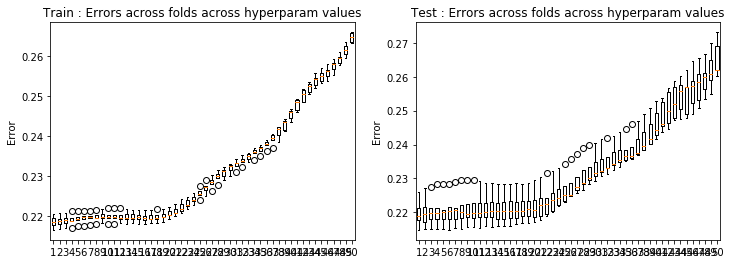

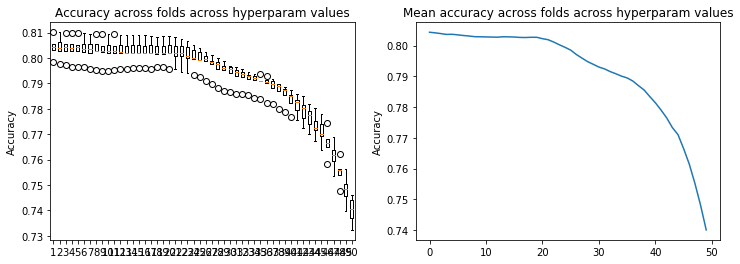

In [57]:
result_crossval(loss_tr35,loss_te35)
result_crossval_accuracy(acc35)

In [28]:
# test 36: degree 10, class, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr36, loss_te36, w36, acc36 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 10, seed = 5, k_fold = 5, class_distribution = False, error = 'class',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  5.24021478e+00  2.57917430e-01 -6.22843478e-01
 -1.16766152e+00  1.95844407e-01 -3.97553898e+00  1.98653071e+00
 -1.19062545e-01  6.50543925e-01  1.32992531e-02  2.36641102e-03
 -2.17648203e-01 -4.39207440e-04  5.38903042e-02 -2.77064070e-02
 -2.35611086e-03 -6.98262876e-02  1.38893348e-02  3.68985669e-02
 -4.35618528e+01 -1.64388248e+00 -3.64579226e+00  1.10059302e+01
  3.71495566e-01  1.38451356e+01 -5.23551339e+00  1.25052373e-01
  1.28790667e+00  3.26775356e-02  9.48859809e-02  8.42401869e-01
 -8.51634963e-02  3.66520998e-03  5.69310965e-01 -2.59855885e-02
 -3.64395396e-01  8.55251268e-02 -2.35842203e-02  1.15667371e+02
  5.06555831e+00  1.80584715e+01 -2.06513226e+01 -5.07860419e+00
 -1.30309263e+01  6.87094377e+00  1.09023412e+00 -3.96875804e+00
 -1.27934779e-01 -1.6573

Ridge regression: w=[-2.78869252e-01  5.15478851e+00  2.62859541e-01 -4.91341176e-01
 -1.38362643e+00  1.93440855e-01 -3.29471961e+00  1.65520118e+00
 -5.55807386e-02  6.09632851e-01  2.98638582e-02 -2.12037694e-03
  2.37432677e-01 -1.08720886e-02  2.93867456e-02  1.18818896e-01
  2.85160508e-02 -4.25646570e-01  1.40215532e-02  1.86124096e-02
 -4.30678296e+01 -1.88785805e+00 -4.63715820e+00  1.20362515e+01
  6.09736144e-02  1.16670102e+01 -3.30581326e+00  1.39702075e-01
  1.55103143e+00  6.55808354e-02  6.80370016e-02 -1.38224903e+00
 -1.12459265e-01  3.69826003e-02 -7.04782863e-01  3.05206998e-02
  1.45707444e+00  1.83224306e-01  3.74671039e-02  1.14719843e+02
  6.25596972e+00  2.07041433e+01 -2.20620918e+01 -3.68172536e+00
 -1.09768769e+01  2.95377184e+00  3.74993245e-01 -4.65568295e+00
 -1.97037699e-01 -7.42918437e-02  6.09775201e-01  5.91132492e-02
 -2.13645071e-01  4.78372614e+00 -2.19512692e-01 -9.50429872e-01
 -1.54901795e-01 -1.79198006e-01 -8.97749675e+01 -1.33749935e+01
 -2.0

Ridge regression: w=[-2.75017660e-01  4.51015982e+00  2.10912578e-01 -7.89039075e-01
 -6.63967838e-01  2.08934626e-01 -2.88693447e+00  9.71376872e-01
 -1.42687473e-01  3.54384207e-01  4.44795592e-02 -2.83866645e-02
  5.49735841e-01 -3.16628626e-04  5.64384415e-02 -1.95565392e-01
 -9.85807603e-03 -1.96328668e-01 -1.11703264e-02 -2.51815301e-03
 -3.92242983e+01 -1.22912483e+00 -3.10096912e+00  8.83510304e+00
  1.15157065e-01  1.01401084e+01 -1.35699041e+00  8.79805793e-02
  2.41651643e+00 -3.23233068e-03  7.66191466e-03 -2.25422787e+00
 -8.03909884e-02  7.24681626e-03  1.79974209e+00 -3.63860342e-02
  6.27980837e-01  1.36358782e-01  1.05431066e-01  1.06195187e+02
  3.47065129e+00  1.81516296e+01 -1.73120756e+01 -4.07511243e+00
 -8.94163178e+00  7.77999375e-01  9.75903765e-01 -6.69668949e+00
 -3.74317021e-01  6.07803478e-02  1.98904457e+00  1.38010092e-02
 -4.10462814e-01 -3.40785856e+00  1.23157260e-01 -1.97534646e-01
  2.24846094e-02 -9.19636543e-02 -8.34427215e+01 -8.04955990e+00
 -1.9

Ridge regression: w=[-2.76819780e-01  4.39069031e+00  2.10637767e-01 -4.36380358e-01
 -9.66763556e-01  1.17322286e-01 -2.37319221e+00  1.46313882e+00
 -1.03490773e-01  9.53001126e-01  3.57506079e-02 -5.49205758e-03
  4.14082205e-01 -8.89927744e-03  3.64665267e-02 -2.36297695e-01
 -2.61497700e-02 -1.46565490e-01  7.61197674e-03 -8.87704927e-03
 -3.85470928e+01 -1.19093698e+00 -4.82700761e+00  1.02228264e+01
  7.13832645e-01  8.19622808e+00 -2.66653535e+00 -4.55393703e-02
 -2.95907281e-01  5.14454762e-02  8.78771870e-02 -1.17854737e+00
 -9.33694808e-02  2.70428627e-02  2.04701885e+00  1.93903846e-02
 -2.02296419e-01  1.20242497e-01 -4.28683489e-04  1.04577351e+02
  3.10510142e+00  2.10296225e+01 -1.96719345e+01 -5.37645857e+00
 -6.84830707e+00  1.72219025e+00  8.64080976e-01 -1.63956158e+00
 -2.68865787e-01 -5.23681844e-02 -8.75864258e-01  8.03269857e-02
 -2.44448339e-01 -4.54798837e+00  3.00531067e-01  2.33785888e+00
 -9.56403134e-02  9.47071929e-02 -8.17051923e+01 -6.58876902e+00
 -2.0

Ridge regression: w=[-2.78727903e-01  3.80037932e+00  1.82576644e-01 -5.29015356e-01
 -5.58773064e-01  2.86587098e-01 -2.20325194e+00  1.14258781e+00
 -1.10594737e-01  1.06109764e+00  1.60227204e-02 -7.49109095e-05
  1.70837715e-01  1.09064190e-02  5.33290767e-02 -1.38148336e-01
  1.40892534e-02 -2.22187810e-01  5.76421298e-03  1.56162781e-02
 -3.48507652e+01 -8.29352810e-01 -4.33087145e+00  8.16589745e+00
 -5.14950028e-01  7.53862246e+00 -2.11214911e+00 -1.05546423e-01
 -4.17499455e-01  3.55938610e-02  3.06740263e-02  1.84552741e-01
 -1.06705558e-01  5.88059411e-02  1.32907970e+00  4.22871333e-02
  7.55919709e-01  9.13912973e-02 -2.95621505e-03  9.59027158e+01
  1.76381108e+00  1.99144922e+01 -1.57626499e+01 -1.81179819e+00
 -6.04120280e+00  1.73619221e+00  7.06927201e-01 -2.50108198e+00
 -1.40384705e-01 -3.75856728e-02 -2.86774393e+00 -1.23355584e-01
 -4.52770494e-01 -2.08256746e+00 -2.28237566e-02 -5.62512512e-01
 -7.95435022e-02 -1.66461478e-01 -7.43866821e+01 -4.84359025e+00
 -2.0

Ridge regression: w=[-2.76431078e-01  3.06964511e+00  1.98489248e-01 -6.43743781e-01
  1.92912286e-01  2.53052490e-01 -2.86852979e+00  1.17548838e+00
 -1.17185360e-01  5.21958299e-01  1.48958877e-02  1.60360751e-03
  3.99164464e-01  1.39028409e-04  5.24749384e-02 -9.33389539e-02
 -2.19180950e-03 -1.57491311e-01  1.39582756e-02  3.55304990e-02
 -3.03058012e+01 -1.00925711e+00 -3.76044226e+00  4.55047580e+00
 -3.32218311e-01  9.41163121e+00 -2.77067369e+00  1.20983100e-01
  7.81407137e-01  3.46833694e-02  9.22592768e-02 -1.06868737e+00
 -8.44955953e-02  4.51111669e-03  1.27825041e+00 -2.64705522e-02
  2.07820183e-01  8.64203867e-02 -2.27740887e-02  8.52467448e+01
  2.26125524e+00  1.91912803e+01 -9.95963715e+00 -1.58660610e+00
 -7.24294989e+00  3.27326323e+00  1.05689699e+00 -2.44887492e+00
 -1.40133356e-01 -1.58618866e-01 -4.29010000e-01  5.53988372e-02
 -3.41155627e-01 -2.84266988e+00  5.86334414e-02  8.17874672e-01
 -1.61056108e-01 -3.06644693e-01 -6.63412613e+01 -5.23005596e+00
 -2.1

Ridge regression: w=[-2.78869241e-01  2.99647129e+00  1.94508025e-01 -6.01163087e-01
  3.99243661e-02  2.52075771e-01 -2.39445366e+00  1.37884583e+00
 -5.42691460e-02  7.56411764e-01  3.10063642e-02 -2.63097816e-03
  3.33533813e-01 -1.02020790e-02  2.88517494e-02  1.28896718e-02
  2.92087466e-02 -3.97812872e-01  1.44960051e-02  1.74513477e-02
 -2.98701995e+01 -1.16015980e+00 -4.19959536e+00  5.27439771e+00
 -6.68940322e-01  8.03116796e+00 -2.42091742e+00  1.38527199e-01
  4.58504591e-01  6.83382999e-02  6.60076188e-02 -1.60497733e+00
 -1.10809926e-01  3.87576500e-02  3.96992283e-01  2.97820397e-02
  1.41267923e+00  1.83156700e-01  3.85891074e-02  8.42651039e+01
  3.06808733e+00  2.04624531e+01 -1.07844919e+01 -1.76984546e-02
 -6.20951282e+00  1.47944130e+00  3.48685764e-01 -2.42607253e+00
 -2.06425918e-01 -6.84516966e-02  9.62216983e-01  5.71031069e-02
 -2.10285979e-01  4.47335088e-03 -2.26184827e-01 -1.45668035e+00
 -1.59819074e-01 -1.74057904e-01 -6.54984789e+01 -6.55356334e+00
 -2.2

Ridge regression: w=[-2.75017643e-01  2.02393003e+00  1.65241163e-01 -9.62279035e-01
  7.56093837e-01  2.64787519e-01 -2.10943691e+00  9.28879283e-01
 -1.40497807e-01  8.51038614e-01  4.56456416e-02 -2.96797325e-02
  4.04139087e-01  5.34122293e-04  5.42183032e-02 -2.08945070e-01
 -1.01543409e-02 -1.94947630e-01 -1.05137014e-02 -3.64806679e-03
 -2.41288009e+01 -7.62448262e-01 -2.22299316e+00  2.28398733e+00
 -5.76775119e-01  7.10295758e+00 -1.09744486e+00  8.28154715e-02
  1.01734986e-01 -3.08595100e-04  5.88373792e-03 -1.70629705e+00
 -8.12920207e-02  9.30774005e-03  2.05811447e+00 -3.46350192e-02
  6.39308720e-01  1.35626946e-01  1.04538261e-01  7.19042442e+01
  1.44603356e+00  1.66791543e+01 -6.83113605e+00 -6.66428493e-01
 -5.15293991e+00  1.90470963e-01  9.33858668e-01 -2.71176811e+00
 -3.83344626e-01  7.24927007e-02  1.31568175e+00  9.20724113e-03
 -3.96944008e-01 -4.92616343e+00  1.21829634e-01 -4.20662169e-01
  1.67009861e-02 -8.79821437e-02 -5.74402023e+01 -3.70941257e+00
 -2.0

Ridge regression: w=[-2.76819763e-01  1.99991532e+00  1.71389043e-01 -6.52067300e-01
  6.14652282e-01  1.74101805e-01 -1.79381465e+00  1.25931853e+00
 -1.02002808e-01  9.62045825e-01  3.66566131e-02 -6.56653257e-03
  6.39324969e-01 -8.17568653e-03  3.39246713e-02 -2.30133969e-01
 -2.55747144e-02 -2.64079554e-01  7.20179444e-03 -1.06019403e-02
 -2.40387208e+01 -8.29065161e-01 -3.70724079e+00  2.81703998e+00
  4.12757355e-02  5.95273180e+00 -2.05737159e+00 -3.82430240e-02
 -6.54244808e-01  5.58294458e-02  8.52224311e-02 -2.07136035e+00
 -9.23839077e-02  2.94611106e-02  2.05084163e+00  1.85537605e-02
  4.60248836e-01  1.20314769e-01 -2.01140519e-04  7.17163402e+01
  1.63308124e+00  1.91515320e+01 -7.62422494e+00 -2.15307546e+00
 -4.10287279e+00  8.41874731e-01  8.26156161e-01 -7.56008766e-01
 -2.77614865e-01 -4.52456901e-02  6.19339213e-01  7.79851852e-02
 -2.29550407e-01 -4.79534288e+00  2.92243614e-01  8.37024491e-01
 -9.66981267e-02  1.02660456e-01 -5.71054559e+01 -3.54835910e+00
 -2.1

Ridge regression: w=[-2.78727879e-01  1.16524568e+00  1.51949220e-01 -8.63739674e-01
  1.04256517e+00  3.24816458e-01 -1.67692362e+00  8.59069664e-01
 -1.09651254e-01  1.14818818e+00  1.68162890e-02 -1.40733498e-03
  6.18214766e-01  1.16339024e-02  5.13121345e-02 -1.53070404e-01
  1.46194277e-02 -2.03984438e-01  6.10786335e-03  1.41583057e-02
 -1.89607479e+01 -5.25942892e-01 -2.47844613e+00  9.66250078e-01
 -1.00360512e+00  5.52585159e+00 -1.28917483e+00 -8.73913794e-02
 -1.27423773e+00  3.73196116e-02  2.74470773e-02 -1.56682483e+00
 -1.03435289e-01  5.88631538e-02  1.59745764e+00  4.21473900e-02
  6.55601238e-01  9.18408544e-02 -1.78314005e-03  6.03680134e+01
  4.49066267e-01  1.61354796e+01 -4.70817085e+00  6.86165436e-01
 -3.57042672e+00  6.26900049e-01  6.79294194e-01 -6.76765801e-01
 -1.47472294e-01 -2.76716461e-02 -2.11046505e-01 -1.24695393e-01
 -4.40968648e-01 -3.64312826e+00 -3.02149947e-02 -5.09744235e-01
 -8.37307160e-02 -1.58534848e-01 -4.90151704e+01 -2.00933911e+00
 -1.9

Ridge regression: w=[-2.76431043e-01  3.30003642e-01  1.63255965e-01 -1.12724315e+00
  1.60207074e+00  2.77590131e-01 -2.13681019e+00  7.61361842e-01
 -1.12739369e-01  5.15004399e-01  1.67796192e-02 -1.49548919e-04
  5.68015362e-01  1.05566482e-03  5.03177293e-02 -8.63868891e-02
 -1.78873731e-03 -2.05872478e-01  1.41407972e-02  3.33179008e-02
 -1.38814480e+01 -6.71492997e-01 -9.68349148e-01 -1.48076289e+00
 -6.46995108e-01  6.74765985e+00 -1.41950581e+00  1.15463481e-01
  2.98949495e-01  3.80751117e-02  8.76447274e-02 -1.60535711e+00
 -8.49113311e-02  6.06448950e-03  1.32809719e+00 -2.66066304e-02
  4.75827485e-01  8.76090886e-02 -2.23027984e-02  4.88384318e+01
  8.55872966e-01  1.31269757e+01 -1.37756387e+00 -1.46567340e-02
 -4.21365951e+00  1.24540236e+00  9.81649315e-01 -1.27464647e+00
 -1.54185781e-01 -1.43548447e-01  5.14177455e-01  4.98352470e-02
 -3.31095469e-01 -3.51295664e+00  5.38517926e-02  1.69700348e-01
 -1.65418130e-01 -2.94847364e-01 -4.09666935e+01 -2.30427664e+00
 -1.7

Ridge regression: w=[-2.78869205e-01  2.78230216e-01  1.48879138e-01 -1.15588388e+00
  1.48211882e+00  2.66384504e-01 -1.81030045e+00  1.17582096e+00
 -5.28347111e-02  8.10099230e-01  3.23239296e-02 -4.25147938e-03
  3.02701029e-01 -9.14170393e-03  2.77645093e-02 -1.04074417e-02
  3.00295930e-02 -3.28448112e-01  1.52030316e-02  1.55823956e-02
 -1.36158030e+01 -7.30079646e-01 -9.92859430e-01 -8.81047500e-01
 -9.00312813e-01  5.86298822e+00 -1.82676024e+00  1.36690249e-01
 -1.14258420e-01  7.19619973e-02  6.26027029e-02 -1.45084024e+00
 -1.09323960e-01  3.98245776e-02  7.12219687e-01  2.86483774e-02
  1.03655560e+00  1.82566133e-01  3.97296140e-02  4.82896816e+01
  1.34600012e+00  1.34699530e+01 -2.01280881e+00  1.33353226e+00
 -3.67887989e+00  6.64897974e-01  3.07956218e-01 -1.15881533e+00
 -2.17248943e-01 -5.41750145e-02  9.64592887e-01  5.32231541e-02
 -2.03036876e-01 -1.61683174e+00 -2.35128355e-01 -8.76803142e-01
 -1.67135620e-01 -1.66043931e-01 -4.04300891e+01 -3.14113662e+00
 -1.8

Ridge regression: w=[-2.75017591e-01 -6.41263500e-01  1.35437308e-01 -1.53543209e+00
  1.93762565e+00  2.83169403e-01 -1.53432529e+00  8.69356658e-01
 -1.35580123e-01  1.04025319e+00  4.65762813e-02 -3.18214823e-02
  2.59445924e-01  1.62866185e-03  5.13252694e-02 -1.52291666e-01
 -1.03514875e-02 -1.86639744e-01 -9.62394902e-03 -5.30133506e-03
 -8.16932183e+00 -5.04304891e-01  1.21545731e+00 -2.58897010e+00
 -8.37332594e-01  5.11228949e+00 -8.34116155e-01  8.23346314e-02
 -8.92980791e-01  4.33923089e-03  4.38866327e-03 -1.22559321e+00
 -8.41719474e-02  1.10704616e-02  1.72970447e+00 -3.04557887e-02
  5.71472477e-01  1.34700633e-01  9.99384624e-02  3.65917404e+01
  4.49371965e-01  8.93358869e+00 -2.57370514e-01  6.80281329e-01
 -3.12097957e+00 -2.53603822e-01  8.55611779e-01 -8.02338191e-01
 -3.89629340e-01  9.04348421e-02  8.75496647e-01  2.96426839e-03
 -3.78451837e-01 -4.39665156e+00  1.18220246e-01 -3.03509020e-01
  9.16884444e-03 -8.07472223e-02 -3.29811837e+01 -1.74628381e+00
 -1.5

Ridge regression: w=[-2.76819711e-01 -6.02167806e-01  1.35768505e-01 -1.27780870e+00
  1.90710305e+00  2.04710858e-01 -1.34205391e+00  1.10826101e+00
 -9.79191018e-02  9.21033678e-01  3.74083042e-02 -8.57801211e-03
  5.92005055e-01 -7.12679824e-03  3.06413906e-02 -1.86613339e-01
 -2.45088172e-02 -3.39801961e-01  6.76261888e-03 -1.26459097e-02
 -8.42123585e+00 -5.55560536e-01  6.03616664e-02 -2.59936325e+00
 -3.04912878e-01  4.40617871e+00 -1.64022330e+00 -1.38273201e-02
 -7.48594183e-01  6.09324761e-02  8.13704739e-02 -1.99171666e+00
 -9.28714823e-02  3.15933578e-02  1.76478103e+00  1.89687521e-02
  8.57449488e-01  1.20471441e-01  6.21772553e-04  3.71250993e+01
  7.11411337e-01  1.06759581e+01 -1.73741194e-01 -6.05124482e-01
 -2.54970851e+00  3.60434031e-01  7.54129383e-01 -2.95416516e-01
 -2.84919453e-01 -3.17260955e-02  9.39770513e-01  7.36991261e-02
 -2.09369929e-01 -4.12748115e+00  2.77808227e-01  4.01507901e-02
 -9.86002666e-02  1.11706261e-01 -3.31813756e+01 -1.98535924e+00
 -1.5

Ridge regression: w=[-2.78727802e-01 -1.26320482e+00  1.32495378e-01 -1.49163526e+00
  2.09371716e+00  3.28134409e-01 -1.20961490e+00  6.87832435e-01
 -1.06943813e-01  1.10149882e+00  1.72595729e-02 -3.47917788e-03
  6.22655409e-01  1.22067373e-02  4.85716344e-02 -1.03462560e-01
  1.53092344e-02 -1.85647427e-01  6.41632993e-03  1.23988019e-02
 -4.37687788e+00 -3.68020275e-01  1.34505338e+00 -3.22966083e+00
 -1.10662340e+00  3.99500484e+00 -8.09696527e-01 -4.49801337e-02
 -1.45100446e+00  3.93606614e-02  2.41076748e-02 -1.72733037e+00
 -1.01210162e-01  5.50028240e-02  1.31519974e+00  4.12152194e-02
  5.29583951e-01  9.26167083e-02 -2.20737737e-04  2.80783118e+01
 -1.50411973e-01  7.40156717e+00  6.25769985e-01  1.40215376e+00
 -2.16827759e+00  5.66324739e-02  6.32995356e-01  8.73624540e-02
 -1.51464768e-01 -1.25970344e-02  5.03101372e-01 -1.24899213e-01
 -4.22065652e-01 -3.21754614e+00 -3.89721048e-02 -2.67470633e-01
 -8.80418224e-02 -1.47656273e-01 -2.68745628e+01 -8.22656436e-01
 -1.3

Ridge regression: w=[-2.76430932e-01 -1.81355361e+00  1.38924684e-01 -1.70190144e+00
  2.30527758e+00  2.84021117e-01 -1.43802408e+00  6.29934999e-01
 -1.01931593e-01  5.44587399e-01  1.79232543e-02 -2.74616483e-03
  4.26397516e-01  2.15666372e-03  4.77841003e-02 -2.78787690e-02
 -9.98104119e-04 -2.28036271e-01  1.42848095e-02  3.05989028e-02
 -1.04332806e+00 -4.68677191e-01  2.70716367e+00 -4.14810498e+00
 -7.52440088e-01  4.54644128e+00 -8.84549257e-01  1.15607694e-01
  3.77879059e-02  4.17441060e-02  7.99021189e-02 -1.26710694e+00
 -8.64101196e-02  5.90684705e-03  9.54424389e-01 -2.39963768e-02
  5.93436185e-01  8.96979698e-02 -2.24162360e-02  2.04863792e+01
  1.27930492e-01  4.41389085e+00  1.67604151e+00  5.49556515e-01
 -2.40152078e+00  3.62502192e-01  8.42504712e-01 -7.08691058e-01
 -1.62467164e-01 -1.21968655e-01  5.77993959e-01  4.29051253e-02
 -3.15821619e-01 -2.71853558e+00  4.55941422e-02 -9.41779966e-02
 -1.69219081e-01 -2.76346700e-01 -2.15712703e+01 -1.00919535e+00
 -1.1

Ridge regression: w=[-2.78869094e-01 -1.85915045e+00  1.12417099e-01 -1.76592820e+00
  2.20722234e+00  2.51333824e-01 -1.23196838e+00  9.96970472e-01
 -5.10438032e-02  7.68383501e-01  3.30600135e-02 -6.57188584e-03
  1.65638915e-01 -7.96468909e-03  2.63401978e-02  1.37877515e-02
  3.00656300e-02 -2.86139130e-01  1.57858249e-02  1.33708296e-02
 -8.58831370e-01 -4.28842604e-01  2.87630923e+00 -3.60413238e+00
 -8.20662106e-01  4.02172826e+00 -1.38012995e+00  1.38532160e-01
 -2.52128474e-01  7.38108662e-02  5.74393474e-02 -9.77319579e-01
 -1.08100237e-01  3.56502058e-02  6.03203703e-01  2.62467449e-02
  7.89831681e-01  1.81063975e-01  4.05766247e-02  2.02174287e+01
  3.20018251e-01  4.35400938e+00  1.06979191e+00  1.32566193e+00
 -2.13340060e+00  2.22498686e-01  2.67040501e-01 -6.43281068e-01
 -2.23299388e-01 -3.54822713e-02  7.25401319e-01  4.79435313e-02
 -1.92548619e-01 -1.62144889e+00 -2.37484518e-01 -4.17684030e-01
 -1.73172504e-01 -1.53605949e-01 -2.13672953e+01 -1.48857472e+00
 -1.1

Ridge regression: w=[-2.75017432e-01 -2.38334920e+00  1.11295679e-01 -1.94925240e+00
  2.31999268e+00  2.80934081e-01 -9.25467249e-01  8.05131589e-01
 -1.24987202e-01  1.00914183e+00  4.62415216e-02 -3.37681411e-02
  9.47082562e-02  2.71678177e-03  4.81528597e-02 -6.12427945e-02
 -9.70599303e-03 -1.82074290e-01 -8.78450575e-03 -7.13720063e-03
  2.28816552e+00 -3.15322683e-01  4.17648551e+00 -4.03302732e+00
 -8.73738325e-01  3.25376578e+00 -6.40124868e-01  9.23251039e-02
 -1.00744265e+00  1.17970598e-02  3.88489154e-03 -7.09408142e-01
 -8.87083116e-02  8.07855047e-03  1.12766664e+00 -2.05552873e-02
  5.34034502e-01  1.34400914e-01  8.77928645e-02  1.34574790e+01
 -1.72063506e-01  1.41289820e+00  1.33500446e+00  1.01433639e+00
 -1.75382647e+00 -4.80047284e-01  7.26580367e-01 -2.06766110e-01
 -3.85408619e-01  1.05855299e-01  5.12252770e-01 -3.35379737e-03
 -3.54668130e-01 -2.94935231e+00  1.08084152e-01 -2.24656819e-01
  2.55707686e-03 -6.84913084e-02 -1.71401903e+01 -7.80652840e-01
 -9.3

Ridge regression: w=[-2.76819550e-01 -2.33254904e+00  1.00796487e-01 -1.74479239e+00
  2.33406092e+00  2.21439018e-01 -8.36673175e-01  9.41085885e-01
 -8.74617551e-02  8.04722051e-01  3.73324458e-02 -1.08971761e-02
  3.90134977e-01 -5.89820006e-03  2.76511702e-02 -1.17604568e-01
 -2.23072400e-02 -3.59966825e-01  6.36195701e-03 -1.35096171e-02
  2.00119409e+00 -2.99062589e-01  3.32720410e+00 -4.22370464e+00
 -4.89597311e-01  2.87618400e+00 -1.25477045e+00  3.04579592e-02
 -5.90541795e-01  6.47775517e-02  7.52674041e-02 -1.35988595e+00
 -9.48259133e-02  2.96621796e-02  1.30484673e+00  2.39446476e-02
  9.86543562e-01  1.21555979e-01  2.77398577e-03  1.40110051e+01
 -4.83136315e-02  2.50193768e+00  1.64245803e+00  1.57397842e-01
 -1.43998929e+00  5.29809888e-02  6.25757186e-01 -1.85786462e-01
 -2.84748890e-01 -1.52715873e-02  6.89229054e-01  6.69143010e-02
 -1.88099975e-01 -2.97597879e+00  2.53898729e-01 -2.65726644e-01
 -9.95688063e-02  1.13786264e-01 -1.73062778e+01 -1.00886678e+00
 -9.4

Ridge regression: w=[-2.78727567e-01 -2.62849380e+00  1.18774648e-01 -1.78971090e+00
  2.26525591e+00  3.13723652e-01 -6.87762774e-01  5.64443743e-01
 -9.96695638e-02  9.33101651e-01  1.70103007e-02 -5.37982162e-03
  4.19455864e-01  1.21845495e-02  4.45655220e-02 -3.32554851e-02
  1.60776455e-02 -1.75177133e-01  6.48468416e-03  1.06731524e-02
  3.90895257e+00 -2.64148499e-01  3.74075731e+00 -3.90097899e+00
 -1.03372491e+00  2.44971351e+00 -5.14073697e-01  1.43130102e-02
 -1.12745742e+00  4.19309211e-02  2.10793960e-02 -1.15954817e+00
 -9.89574272e-02  4.21069070e-02  8.65250982e-01  3.86220521e-02
  4.63306631e-01  9.57790214e-02  3.31285752e-03  9.57756853e+00
 -4.98371004e-01  9.48650182e-01  1.35813424e+00  1.35868429e+00
 -1.13095255e+00 -2.07748734e-01  5.48259863e-01  1.53486433e-01
 -1.49691252e-01  1.48894089e-03  3.92763852e-01 -1.21347569e-01
 -3.87782832e-01 -2.17950410e+00 -4.70109865e-02 -1.34252566e-01
 -8.97490974e-02 -1.33187883e-01 -1.40912292e+01 -2.61770997e-01
 -7.5

Ridge regression: w=[-2.76430592e-01 -2.84894523e+00  1.23339966e-01 -1.79889823e+00
  2.19157059e+00  2.80502371e-01 -7.64482074e-01  5.59711211e-01
 -8.37339285e-02  5.51319451e-01  1.76452646e-02 -6.51380086e-03
  2.07829810e-01  3.61260913e-03  4.42782138e-02  3.89395779e-02
  4.00668003e-04 -2.18657673e-01  1.40773713e-02  2.70390510e-02
  5.28316721e+00 -3.34892603e-01  4.16543364e+00 -3.83609543e+00
 -7.61075009e-01  2.57105616e+00 -6.24678458e-01  1.21608558e-01
 -7.73143976e-02  4.54397025e-02  6.71280609e-02 -6.63143306e-01
 -8.78816181e-02  1.89960689e-03  5.19832699e-01 -1.65378263e-02
  5.79205390e-01  9.47082754e-02 -2.29090674e-02  6.27891007e+00
 -3.26902944e-01 -4.07210623e-01  1.46995310e+00  6.98670431e-01
 -1.12625826e+00 -2.18506342e-02  6.36513263e-01 -4.60335710e-01
 -1.59881800e-01 -8.95933453e-02  3.31164242e-01  3.25290109e-02
 -2.87257365e-01 -1.68153433e+00  3.26025422e-02 -1.50230948e-01
 -1.69146008e-01 -2.45308975e-01 -1.16444265e+01 -3.30465940e-01
 -6.4

Ridge regression: w=[-2.78868750e-01 -2.89317576e+00  8.76811291e-02 -1.87415490e+00
  2.13519766e+00  2.28341576e-01 -6.48234292e-01  7.91229606e-01
 -4.91792503e-02  6.73635927e-01  3.27541518e-02 -9.21207661e-03
  2.13208539e-02 -6.70078674e-03  2.43182984e-02  5.10443790e-02
  2.80533603e-02 -2.58389215e-01  1.58231284e-02  1.08185161e-02
  5.44179152e+00 -2.20750771e-01  4.38853907e+00 -3.42887569e+00
 -6.55510895e-01  2.30123261e+00 -9.53107445e-01  1.41879547e-01
 -2.13553666e-01  7.20401997e-02  4.95278167e-02 -4.35424513e-01
 -1.05630019e-01  2.29334167e-02  3.84814206e-01  2.13579419e-02
  6.53587552e-01  1.78365747e-01  4.10517751e-02  6.11892255e+00
 -3.55207770e-01 -5.69656042e-01  9.54749158e-01  9.17514868e-01
 -1.01376756e+00 -6.35715324e-02  2.33978998e-01 -4.47736097e-01
 -2.20653694e-01 -1.40577465e-02  4.05201502e-01  4.04597575e-02
 -1.74512720e-01 -1.19137551e+00 -2.21026502e-01 -1.94721172e-01
 -1.73813650e-01 -1.32534374e-01 -1.16043936e+01 -5.68005559e-01
 -6.4

Ridge regression: w=[-2.75016939e-01 -3.07326274e+00  9.95817007e-02 -1.83253734e+00
  2.01107051e+00  2.67254538e-01 -3.90290003e-01  7.25589424e-01
 -1.09985979e-01  8.74228635e-01  4.35279932e-02 -3.50702177e-02
 -2.52934247e-02  3.76180653e-03  4.31517479e-02  1.69272011e-02
 -7.38924116e-03 -1.63873100e-01 -8.07885245e-03 -9.46280891e-03
  6.66443586e+00 -2.07392469e-01  4.62985013e+00 -3.15598640e+00
 -8.12677680e-01  1.69983226e+00 -5.06887563e-01  1.05803833e-01
 -7.59491512e-01  2.38925267e-02  4.17185295e-03 -2.99465408e-01
 -9.51883787e-02 -6.23190047e-04  6.24713193e-01 -4.07752448e-03
  4.66990385e-01  1.35823516e-01  6.67323375e-02  3.33811071e+00
 -5.52899860e-01 -1.60629546e+00  7.54156401e-01  9.72914739e-01
 -8.03282603e-01 -5.39687596e-01  5.60219955e-01 -1.51870037e-01
 -3.61319915e-01  1.15591386e-01  2.40086730e-01 -9.66406362e-03
 -3.11067854e-01 -1.74286574e+00  8.47159606e-02 -1.55596931e-01
 -2.14110542e-03 -4.77099963e-02 -9.82080102e+00 -2.29611694e-01
 -5.4

Ridge regression: w=[-2.76819054e-01 -3.03567669e+00  8.13770237e-02 -1.68288605e+00
  2.03254336e+00  2.24060105e-01 -3.79573572e-01  7.45092619e-01
 -7.12768857e-02  6.55478618e-01  3.56950432e-02 -1.33945181e-02
  1.97905659e-01 -4.25003599e-03  2.42917341e-02 -4.82696182e-02
 -1.77162081e-02 -3.23917062e-01  5.80681031e-03 -1.21098925e-02
  6.45393645e+00 -1.37767735e-01  4.03743335e+00 -3.34457368e+00
 -5.52567484e-01  1.55722913e+00 -8.75928065e-01  7.37209373e-02
 -3.59067855e-01  6.73136025e-02  6.59152501e-02 -6.87037662e-01
 -9.76243337e-02  2.31676796e-02  8.79241575e-01  3.41803979e-02
  8.89144132e-01  1.25311016e-01  6.40202878e-03  3.72988975e+00
 -5.63578321e-01 -9.59741924e-01  1.03407334e+00  4.73395231e-01
 -6.43972019e-01 -1.56663400e-01  4.45573256e-01 -2.00918520e-01
 -2.70959693e-01  4.69182588e-03  3.17062553e-01  5.52419542e-02
 -1.58420638e-01 -1.99063743e+00  2.10067678e-01 -2.67350877e-01
 -9.72641384e-02  1.00521501e-01 -9.88248756e+00 -3.67560413e-01
 -5.3

Ridge regression: w=[-2.78726839e-01 -3.07325604e+00  1.18449766e-01 -1.60677246e+00
  1.85300027e+00  2.89377200e-01 -2.78693466e-01  4.70920622e-01
 -8.97388443e-02  7.38477685e-01  1.57968213e-02 -7.08004617e-03
  2.34102811e-01  1.10817764e-02  3.68703733e-02  2.82200592e-02
  1.68666768e-02 -1.60784771e-01  6.05325230e-03  8.27836633e-03
  6.93297534e+00 -2.42263103e-01  3.80420797e+00 -2.71152204e+00
 -8.97772998e-01  1.28816143e+00 -3.50296683e-01  6.07658355e-02
 -6.79883444e-01  4.52200522e-02  1.81275585e-02 -5.91438646e-01
 -9.56591600e-02  2.21016807e-02  4.97927247e-01  3.42503066e-02
  4.09161547e-01  1.04452065e-01  8.53041648e-03  2.23797167e+00
 -6.39048266e-01 -1.16129088e+00  5.59839984e-01  1.11175758e+00
 -4.64498462e-01 -2.86821366e-01  4.37714584e-01 -1.51281143e-02
 -1.40093732e-01  1.52004870e-02  1.34140041e-01 -1.09179146e-01
 -3.16363084e-01 -1.37376019e+00 -5.43112590e-02 -6.64363217e-02
 -8.63731109e-02 -1.09261124e-01 -8.51410460e+00  2.36449669e-02
 -4.3

Ridge regression: w=[-2.76429541e-01 -3.08753698e+00  1.24705505e-01 -1.49445906e+00
  1.65613925e+00  2.65778722e-01 -3.17592494e-01  4.59103837e-01
 -6.63951987e-02  5.17457826e-01  1.56323523e-02 -1.24391425e-02
  8.77702781e-02  6.23313673e-03  3.81395159e-02  9.33368961e-02
  2.65688839e-03 -1.84800071e-01  1.27017020e-02  2.12505919e-02
  7.18993233e+00 -3.11347306e-01  3.63626492e+00 -2.29008513e+00
 -6.98127915e-01  1.31267840e+00 -4.26924784e-01  1.26733597e-01
 -1.20023429e-01  4.91730774e-02  5.20398429e-02 -2.59190673e-01
 -8.88076489e-02 -3.14310607e-03  1.98507402e-01 -7.05778355e-03
  4.76293836e-01  1.05327459e-01 -2.35434839e-02  1.21792628e+00
 -4.99490325e-01 -1.43216777e+00  4.55445085e-01  6.45308817e-01
 -4.18231916e-01 -1.76961756e-01  4.43529091e-01 -3.19020597e-01
 -1.43449048e-01 -3.55509016e-02  1.11573337e-01  1.12174240e-02
 -2.31121768e-01 -9.79550969e-01  1.22975827e-02 -9.86112311e-02
 -1.58891159e-01 -1.91154408e-01 -7.46929923e+00  1.19783868e-02
 -3.7

Ridge regression: w=[-2.78867690e-01 -3.12487436e+00  8.75642364e-02 -1.56290193e+00
  1.65565326e+00  2.07056879e-01 -2.53208648e-01  5.82669391e-01
 -4.85834355e-02  5.69240501e-01  3.10694149e-02 -1.26528824e-02
 -3.54038678e-02 -4.90026474e-03  2.03562193e-02  8.95253486e-02
  2.28394891e-02 -2.27853856e-01  1.45020566e-02  7.14236180e-03
  7.31787101e+00 -1.74929564e-01  3.83308386e+00 -2.09399538e+00
 -5.16709099e-01  1.18599419e+00 -6.04396615e-01  1.42628307e-01
 -1.62384962e-01  6.71362892e-02  4.05038260e-02 -1.01608168e-01
 -1.01681907e-01  7.03449436e-03  1.77807347e-01  1.46951826e-02
  5.42937863e-01  1.73923896e-01  4.05266637e-02  1.11668762e+00
 -6.17877429e-01 -1.56734302e+00  1.13986924e-01  5.85753274e-01
 -3.84247384e-01 -2.05656479e-01  2.14694095e-01 -3.30398781e-01
 -2.06523057e-01  1.64844177e-02  1.64913021e-01  2.70628930e-02
 -1.36268088e-01 -8.01867862e-01 -1.75265758e-01 -7.46577653e-02
 -1.62785163e-01 -9.69682561e-02 -7.48375609e+00 -1.03135085e-01
 -3.8

Ridge regression: w=[-2.75015416e-01 -3.09274579e+00  1.09646224e-01 -1.42662591e+00
  1.46433247e+00  2.39990167e-01 -7.51998381e-02  6.01836352e-01
 -9.82064889e-02  7.06776255e-01  3.70843541e-02 -3.58224681e-02
 -4.41913254e-02  4.99194598e-03  3.44945389e-02  7.78780832e-02
 -3.08306030e-03 -1.32258720e-01 -7.76133246e-03 -1.27872087e-02
  7.49033578e+00 -2.35696706e-01  3.61047622e+00 -1.70625440e+00
 -6.78397580e-01  8.20125401e-01 -4.01580925e-01  1.13065637e-01
 -4.87603052e-01  3.74892580e-02  4.70258988e-03 -1.09422055e-01
 -1.02154131e-01 -8.84585226e-03  2.77319490e-01  1.11836507e-02
  3.68373907e-01  1.39908536e-01  4.47581033e-02  2.68655256e-01
 -6.21061937e-01 -1.69944082e+00 -5.30103287e-02  7.69817444e-01
 -3.27547045e-01 -4.69158432e-01  4.30602368e-01 -1.80330948e-01
 -3.05298064e-01  1.21899292e-01  7.86102817e-02 -1.79954722e-02
 -2.32982785e-01 -1.01317766e+00  4.51303104e-02 -8.13855550e-02
 -3.24248546e-03 -1.62806451e-02 -6.70537273e+00  4.32348472e-02
 -3.3

Ridge regression: w=[-2.76817521e-01 -3.08035779e+00  9.06471190e-02 -1.33828350e+00
  1.47684385e+00  2.09461305e-01 -1.04756275e-01  5.49541825e-01
 -5.87116711e-02  5.14774779e-01  3.15364111e-02 -1.62357943e-02
  1.22146950e-01 -1.66513684e-03  1.91968923e-02  2.30078445e-02
 -1.01150045e-02 -2.57427016e-01  4.48469298e-03 -8.39869077e-03
  7.39109494e+00 -1.53342564e-01  3.25506851e+00 -1.81342870e+00
 -5.00101657e-01  7.96906728e-01 -5.86568613e-01  9.70459385e-02
 -1.88355277e-01  6.86483751e-02  5.62627602e-02 -3.08043392e-01
 -1.00279239e-01  1.69276752e-02  5.02701629e-01  4.36629694e-02
  6.85918855e-01  1.32983190e-01  9.35334538e-03  4.96102705e-01
 -6.84873984e-01 -1.35678985e+00  1.19934589e-01  4.75682302e-01
 -2.42461131e-01 -2.25508771e-01  3.01306617e-01 -1.94894050e-01
 -2.35378250e-01  3.08714967e-02  6.69829015e-02  3.47255505e-02
 -1.10107631e-01 -1.27648161e+00  1.40193059e-01 -1.49450277e-01
 -8.73946361e-02  6.90876174e-02 -6.74054370e+00 -3.50718180e-02
 -3.1

Ridge regression: w=[-2.78724591e-01 -2.97951316e+00  1.35432539e-01 -1.26160693e+00
  1.33094444e+00  2.51162393e-01 -4.71574708e-02  3.70934232e-01
 -8.30975223e-02  5.70117341e-01  1.32922375e-02 -8.80184048e-03
  1.62980284e-01  8.64272531e-03  2.49825680e-02  8.60079637e-02
  1.74413371e-02 -1.39122949e-01  4.44289092e-03  4.79841393e-03
  7.21779555e+00 -3.24615625e-01  2.93092924e+00 -1.36832764e+00
 -7.00948345e-01  6.75128077e-01 -2.54738238e-01  8.13675344e-02
 -3.56013123e-01  4.74039982e-02  1.58724744e-02 -3.04099065e-01
 -9.22236745e-02  5.96160363e-03  1.96379544e-01  2.97308549e-02
  3.51313502e-01  1.19088722e-01  1.17117996e-02  2.02422312e-01
 -5.61750318e-01 -1.13922617e+00 -1.44721288e-01  7.78794137e-01
 -1.77265392e-01 -2.46352479e-01  3.60115015e-01 -1.25292275e-01
 -1.19725869e-01  3.13660818e-02 -2.73114443e-02 -8.54367244e-02
 -2.04981893e-01 -8.19124088e-01 -5.94683104e-02 -2.95757908e-02
 -7.28445263e-02 -7.42108500e-02 -6.08514460e+00  1.56893364e-01
 -2.7

Ridge regression: w=[-2.76426294e-01 -2.87483856e+00  1.41466897e-01 -1.14497092e+00
  1.13810672e+00  2.37439419e-01 -7.30280840e-02  3.24048191e-01
 -5.66417259e-02  4.30169961e-01  1.18781257e-02 -1.91621990e-02
  7.91448245e-02  1.04086126e-02  3.00898224e-02  1.39659134e-01
  5.38806025e-03 -1.45425677e-01  8.60271475e-03  1.40028840e-02
  6.97389993e+00 -3.91697157e-01  2.67531002e+00 -1.00742506e+00
 -5.65509887e-01  6.86396402e-01 -2.70542205e-01  1.24330183e-01
 -8.90446151e-02  5.08701991e-02  4.05049576e-02 -1.06754503e-01
 -8.85607897e-02 -5.35865219e-03 -4.20322064e-02 -8.51816682e-04
  3.66325944e-01  1.19983826e-01 -2.42170324e-02  2.63265970e-02
 -4.30659182e-01 -1.09329748e+00 -1.64974249e-01  4.56998816e-01
 -1.49817903e-01 -1.79536773e-01  3.33604653e-01 -2.17109880e-01
 -1.13121056e-01  3.10423216e-02 -1.11047247e-02 -2.46233508e-02
 -1.55697247e-01 -5.31276760e-01 -1.14133368e-02 -4.21268604e-02
 -1.27045769e-01 -1.22412563e-01 -5.52274337e+00  1.60110324e-01
 -2.4

Ridge regression: w=[-2.78864414e-01 -2.89859660e+00  1.10544146e-01 -1.19377832e+00
  1.17470626e+00  1.83876253e-01 -3.41095492e-02  3.77447803e-01
 -4.94866775e-02  4.41972005e-01  2.77360288e-02 -1.64936005e-02
  4.85526735e-03 -2.29352771e-03  1.46899245e-02  1.29744714e-01
  1.57278547e-02 -1.92414224e-01  1.02992668e-02  3.03784160e-03
  7.05024742e+00 -2.79666350e-01  2.80287477e+00 -9.78352898e-01
 -3.90553026e-01  6.25989952e-01 -3.62835085e-01  1.37918390e-01
 -9.22884718e-02  6.13372316e-02  3.35866313e-02 -1.88957727e-03
 -9.77137396e-02 -3.23871284e-03 -1.74317006e-02  9.01583359e-03
  4.46129705e-01  1.68716370e-01  3.79461524e-02 -1.46228409e-02
 -5.38446903e-01 -1.15440686e+00 -3.45710701e-01  3.41195362e-01
 -1.46345994e-01 -1.93059702e-01  2.10699434e-01 -2.32397787e-01
 -1.79407314e-01  5.45144420e-02  2.28556282e-02  5.58156819e-03
 -8.03891205e-02 -4.78369050e-01 -1.10791771e-01 -1.60807440e-02
 -1.28922872e-01 -5.53938862e-02 -5.53854188e+00  9.98860311e-02
 -2.4

Ridge regression: w=[-2.75010711e-01 -2.74171466e+00  1.33693926e-01 -1.05688639e+00
  9.89375936e-01  1.99599633e-01  9.20626479e-02  4.11462048e-01
 -9.13277173e-02  5.04307677e-01  2.74105523e-02 -3.56797685e-02
  1.70578273e-02  6.39054021e-03  2.47147277e-02  1.29410240e-01
  1.76323782e-03 -9.69669585e-02 -8.35932010e-03 -1.60269214e-02
  6.75028129e+00 -3.62626185e-01  2.55513259e+00 -7.03037443e-01
 -4.83047886e-01  4.02164208e-01 -2.74504829e-01  1.12079476e-01
 -2.51744981e-01  4.48827139e-02  5.09493461e-03 -6.99893259e-02
 -1.05382348e-01 -1.16342429e-02  1.70708990e-02  1.83044993e-02
  2.78216013e-01  1.45431775e-01  2.95993696e-02 -1.91321588e-01
 -4.63533415e-01 -1.09872988e+00 -3.54912126e-01  4.68883324e-01
 -1.65435289e-01 -3.16937677e-01  3.61401049e-01 -1.48110860e-01
 -2.23183985e-01  1.25022841e-01 -1.65624384e-02 -2.82749583e-02
 -1.45322833e-01 -5.48057955e-01  4.32680161e-03 -3.77725577e-02
  2.37767055e-03  1.62564749e-02 -5.05617372e+00  1.60545521e-01
 -2.2

Ridge regression: w=[-2.76812785e-01 -2.75147265e+00  1.19621119e-01 -1.02509352e+00
  9.95007890e-01  1.81319193e-01  4.77958724e-02  3.48969015e-01
 -5.36061847e-02  3.67857188e-01  2.51062965e-02 -1.83317689e-02
  1.39503777e-01  1.72241406e-03  1.37174970e-02  9.48960004e-02
 -2.15059668e-03 -1.89013129e-01  1.68070838e-03 -4.06327911e-03
  6.74910795e+00 -2.98146749e-01  2.38974951e+00 -7.35823953e-01
 -3.69414160e-01  4.24291613e-01 -3.74493033e-01  1.01896720e-01
 -5.78601834e-02  6.71165188e-02  4.88866505e-02 -1.71341971e-01
 -1.00710613e-01  1.34985545e-02  1.57166284e-01  4.65217860e-02
  5.00848113e-01  1.42137607e-01  9.07374922e-03 -9.71613990e-02
 -5.22068146e-01 -9.48759524e-01 -2.81715637e-01  3.01883793e-01
 -1.09992639e-01 -1.69613991e-01  2.34522910e-01 -1.48059093e-01
 -1.81229704e-01  5.56145915e-02 -6.05957312e-02  7.21608194e-03
 -5.76366520e-02 -7.12734060e-01  6.92139521e-02 -6.24239986e-02
 -6.51584152e-02  3.40345358e-02 -5.10266051e+00  1.14691476e-01
 -2.1

Ridge regression: w=[-2.78717647e-01 -2.56058516e+00  1.55789421e-01 -9.78958425e-01
  8.76860573e-01  2.04051090e-01  9.91073791e-02  2.48372483e-01
 -7.87206446e-02  4.13886114e-01  9.83654440e-03 -9.58042928e-03
  1.60603591e-01  5.94746629e-03  1.43859739e-02  1.33656829e-01
  1.76873254e-02 -1.04798044e-01  1.27092019e-03  1.98552149e-03
  6.30977639e+00 -4.47830735e-01  2.18684041e+00 -4.84826625e-01
 -4.72504527e-01  3.50217478e-01 -1.67120923e-01  8.39707962e-02
 -1.44065163e-01  4.50463307e-02  1.44343975e-02 -1.93744589e-01
 -8.90889932e-02 -1.26994115e-03 -3.54107789e-02  2.62325317e-02
  2.80021828e-01  1.33092544e-01  1.03688070e-02 -9.48715086e-02
 -3.72181424e-01 -7.60840921e-01 -3.38006183e-01  4.19038862e-01
 -1.06922905e-01 -1.56594464e-01  3.16366635e-01 -1.35115625e-01
 -9.24706552e-02  4.38106709e-02 -1.01198669e-01 -5.92061545e-02
 -1.03962028e-01 -4.28181307e-01 -6.06739279e-02 -1.89204301e-02
 -4.64776923e-02 -4.29677113e-02 -4.64170235e+00  2.09370853e-01
 -1.9

Ridge regression: w=[-2.76416265e-01 -2.35642541e+00  1.53276030e-01 -8.79666595e-01
  6.94422087e-01  2.02604876e-01  8.89224482e-02  1.92159684e-01
 -5.03533418e-02  3.15192107e-01  7.41936894e-03 -2.20962715e-02
  1.07726102e-01  1.44868504e-02  2.38587503e-02  1.68694251e-01
  7.73128550e-03 -9.93904455e-02  1.77559700e-03  9.00779767e-03
  5.81005833e+00 -4.80452824e-01  1.99884731e+00 -2.14488167e-01
 -4.12019426e-01  3.41741267e-01 -1.54820773e-01  1.12866155e-01
 -9.10468504e-03  4.69700044e-02  3.11947511e-02 -6.70657057e-02
 -8.65802728e-02 -4.15230511e-03 -1.87525694e-01  1.20898464e-03
  2.63747602e-01  1.32504509e-01 -2.47033468e-02 -7.63323317e-02
 -2.81197809e-01 -7.22046526e-01 -2.76861280e-01  2.43554857e-01
 -9.71913645e-02 -1.17328206e-01  2.73544040e-01 -1.37245865e-01
 -8.00595703e-02  7.37954255e-02 -6.92786701e-02 -5.95541269e-02
 -9.65942551e-02 -2.58388715e-01 -2.87670466e-02 -2.13658862e-02
 -7.42639009e-02 -7.10227615e-02 -4.16288543e+00  2.04447749e-01
 -1.7

Ridge regression: w=[-2.78854296e-01 -2.36960585e+00  1.31099563e-01 -9.09624205e-01
  7.35555368e-01  1.59808605e-01  1.13641314e-01  1.97910380e-01
 -4.91705529e-02  3.08502133e-01  2.33432277e-02 -1.82422283e-02
  7.77750093e-02  2.81755145e-04  1.04763896e-02  1.57846550e-01
  1.08331987e-02 -1.40294635e-01  3.42929657e-03  7.11369697e-04
  5.84716746e+00 -4.09541598e-01  2.06864103e+00 -2.50168740e-01
 -2.77323858e-01  3.12611417e-01 -1.98998945e-01  1.27557084e-01
 -7.32706163e-03  5.37816544e-02  2.74592080e-02 -1.36381435e-02
 -9.40096727e-02 -6.84067892e-03 -1.49694532e-01  4.42722768e-03
  3.37080635e-01  1.65226836e-01  3.21276733e-02 -7.56156799e-02
 -3.39365417e-01 -7.30161158e-01 -3.62178433e-01  1.58829029e-01
 -1.01006012e-01 -1.09171184e-01  2.03923953e-01 -1.50665678e-01
 -1.47567555e-01  8.00923180e-02 -5.71380568e-02 -1.57706460e-02
 -3.52104848e-02 -2.50671610e-01 -6.20247402e-02 -3.82501089e-03
 -7.41540172e-02 -2.72397807e-02 -4.17059601e+00  1.70358511e-01
 -1.8

Ridge regression: w=[-2.74996180e-01 -2.10975656e+00  1.43304487e-01 -7.62890274e-01
  5.44845833e-01  1.60284745e-01  2.00223881e-01  2.32462806e-01
 -8.32783292e-02  3.15997875e-01  1.80421658e-02 -3.34492588e-02
  7.63237520e-02  7.41956549e-03  1.77532480e-02  1.58546782e-01
  5.57018271e-03 -5.23689947e-02 -9.71020042e-03 -1.71620878e-02
  5.28629380e+00 -4.56570369e-01  1.84845979e+00 -4.57669643e-02
 -3.05610996e-01  1.74708615e-01 -1.56447469e-01  1.06324618e-01
 -6.22030406e-02  4.19388168e-02  4.86150155e-03 -6.56577184e-02
 -1.02960867e-01 -8.64600155e-03 -1.27863641e-01  1.82576317e-02
  1.87123613e-01  1.50302573e-01  1.93089126e-02 -1.00350235e-01
 -2.82778556e-01 -7.13531209e-01 -2.87016059e-01  2.09801803e-01
 -1.38679747e-01 -1.71798337e-01  3.07054555e-01 -8.43971827e-02
 -1.50254949e-01  1.18994089e-01 -6.54228036e-02 -3.54839027e-02
 -8.51106603e-02 -2.79184363e-01 -2.10388816e-02 -2.89723516e-02
  1.27431168e-02  3.57692445e-02 -3.69375889e+00  1.84770317e-01
 -1.6

Ridge regression: w=[-2.76798159e-01 -2.12415934e+00  1.36430912e-01 -7.71958684e-01
  5.48091510e-01  1.53066177e-01  1.56017424e-01  1.81215410e-01
 -5.08958746e-02  2.43848998e-01  1.85916663e-02 -1.78299512e-02
  1.64827734e-01  4.80655381e-03  1.02758742e-02  1.40216924e-01
  3.27216231e-03 -1.11124122e-01 -1.84463997e-03 -8.73538074e-04
  5.32239977e+00 -4.19806216e-01  1.80095438e+00 -4.42059928e-02
 -2.41453511e-01  2.05439241e-01 -2.15456231e-01  9.68373809e-02
  3.46988266e-02  5.89632170e-02  4.09211468e-02 -1.18932959e-01
 -9.73456101e-02  1.13025535e-02 -5.63690922e-02  4.14707777e-02
  3.29827131e-01  1.49649995e-01  5.00698813e-03 -7.80511659e-02
 -3.18074506e-01 -6.49997280e-01 -2.64011930e-01  1.22525694e-01
 -9.71401223e-02 -8.39050738e-02  2.03250022e-01 -9.29880783e-02
 -1.31024930e-01  6.50939462e-02 -1.12381995e-01 -1.60736854e-02
 -2.36611629e-02 -3.54083935e-01  2.52872088e-02 -3.75389983e-02
 -3.69681253e-02  1.29891711e-02 -3.74082453e+00  1.59391958e-01
 -1.6

Ridge regression: w=[-2.78696200e-01 -1.84631913e+00  1.53041316e-01 -7.05848346e-01
  4.24188603e-01  1.62654314e-01  2.07193316e-01  1.49582348e-01
 -7.13774546e-02  2.94051827e-01  6.26216014e-03 -8.05290815e-03
  1.54711853e-01  4.50883868e-03  9.16942030e-03  1.53522896e-01
  1.77017007e-02 -5.04166736e-02 -1.85625227e-03  1.21236810e-03
  4.70039241e+00 -4.95205644e-01  1.62181450e+00  1.15732209e-01
 -2.94160295e-01  1.44373587e-01 -9.36630505e-02  7.77765669e-02
 -1.63120881e-02  3.42705120e-02  1.23343563e-02 -1.34150716e-01
 -8.46450229e-02 -1.83176458e-03 -1.38187128e-01  2.28020505e-02
  1.77632870e-01  1.42426071e-01  4.80434036e-03 -4.41128136e-02
 -2.29053083e-01 -5.49986991e-01 -2.18067830e-01  1.68234448e-01
 -1.18386917e-01 -8.44369315e-02  2.69844378e-01 -1.03697313e-01
 -6.82130881e-02  4.33704220e-02 -1.20013844e-01 -4.32388269e-02
 -4.92482849e-02 -2.17604110e-01 -5.92698525e-02 -2.73354210e-02
 -1.92117893e-02 -2.59683492e-02 -3.25783591e+00  1.94687207e-01
 -1.4

Ridge regression: w=[-2.76385290e-01 -1.56641480e+00  1.38418454e-01 -5.82620588e-01
  2.76042934e-01  1.67307455e-01  1.98320531e-01  1.09447654e-01
 -4.22863291e-02  2.35310479e-01  3.02442332e-03 -1.90678635e-02
  1.18257349e-01  1.64017179e-02  2.03272543e-02  1.70164709e-01
  9.34239923e-03 -3.99384023e-02 -4.21678941e-03  7.24444825e-03
  4.04716972e+00 -4.80992467e-01  1.40589763e+00  2.68863360e-01
 -2.82806826e-01  1.33330806e-01 -8.15196150e-02  9.51721112e-02
  4.58141859e-02  3.37948864e-02  1.84794829e-02 -5.24512204e-02
 -8.22809913e-02  3.00419013e-04 -2.14903257e-01  3.38346706e-04
  1.49498317e-01  1.42959777e-01 -2.42250001e-02  8.37337045e-04
 -1.89966395e-01 -5.41512029e-01 -1.33542857e-01  1.00451253e-01
 -1.12427476e-01 -6.96936784e-02  2.18733080e-01 -8.46796887e-02
 -5.38151905e-02  7.77581759e-02 -8.68196920e-02 -7.66658024e-02
 -6.37259386e-02 -1.35167044e-01 -3.73596470e-02 -2.69444421e-02
 -2.73944413e-02 -4.55587844e-02 -2.75166923e+00  1.74606040e-01
 -1.3

Ridge regression: w=[-2.78823049e-01 -1.57544752e+00  1.21914005e-01 -5.99651251e-01
  3.02277091e-01  1.37170084e-01  2.13949203e-01  9.04684925e-02
 -4.52476315e-02  2.27430383e-01  1.82278111e-02 -1.61263123e-02
  1.16208372e-01  1.91560613e-03  9.34632634e-03  1.62111851e-01
  9.47756351e-03 -6.59409226e-02 -2.24087851e-03  5.04883196e-04
  4.07145677e+00 -4.38252445e-01  1.44571322e+00  2.36417476e-01
 -1.91316120e-01  1.20784998e-01 -9.82665627e-02  1.12863386e-01
  3.64971488e-02  3.94484541e-02  1.91378725e-02 -3.67774874e-02
 -8.96758327e-02 -6.30295137e-03 -1.80963845e-01 -6.17365979e-04
  1.96807767e-01  1.65006766e-01  2.30187039e-02  1.24899870e-02
 -2.10797935e-01 -5.31413222e-01 -1.73961533e-01  5.17620408e-02
 -1.15109922e-01 -4.82975193e-02  1.81426660e-01 -9.83205211e-02
 -1.18390024e-01  8.10903076e-02 -8.87189854e-02 -2.79754467e-02
 -1.35741076e-02 -1.41171997e-01 -4.04977643e-02 -1.73370745e-02
 -2.76592455e-02 -1.49445341e-02 -2.75907377e+00  1.52590456e-01
 -1.3

Ridge regression: w=[-2.74951306e-01 -1.27112928e+00  1.21273774e-01 -4.23034506e-01
  1.58800972e-01  1.28883840e-01  2.60450025e-01  1.28035548e-01
 -7.05663624e-02  2.13027526e-01  1.01765436e-02 -2.80522001e-02
  9.52416553e-02  7.58949984e-03  1.34508056e-02  1.60662009e-01
  7.87067575e-03 -4.50034381e-04 -1.06918430e-02 -1.54593840e-02
  3.41221079e+00 -4.39505386e-01  1.17175619e+00  3.16034988e-01
 -1.87172534e-01  5.05088704e-02 -7.78312811e-02  9.74192094e-02
  3.25693776e-02  2.81509192e-02  3.29091987e-03 -5.62671569e-02
 -9.45774317e-02 -1.22861885e-03 -1.57802144e-01  1.38040062e-02
  9.06945561e-02  1.56244516e-01  1.09829581e-02  2.10224390e-02
 -1.94144132e-01 -5.37967970e-01 -8.79391727e-02  6.65169060e-02
 -1.43758590e-01 -9.03908651e-02  2.42215653e-01 -4.08841515e-02
 -1.00648990e-01  9.82778340e-02 -7.90376172e-02 -3.60656316e-02
 -5.10105881e-02 -1.61905957e-01 -3.09524663e-02 -3.77161680e-02
  1.99876405e-02  3.94925463e-02 -2.27183345e+00  1.39493178e-01
 -1.1

Ridge regression: w=[-2.76752991e-01 -1.27987887e+00  1.20492208e-01 -4.51591346e-01
  1.56603491e-01  1.30779888e-01  2.25082105e-01  8.59303762e-02
 -4.63380829e-02  1.89176887e-01  1.25468661e-02 -1.42243707e-02
  1.58567846e-01  6.75924614e-03  8.96930974e-03  1.51523718e-01
  6.55789150e-03 -2.61197454e-02 -4.19417485e-03  1.24334144e-03
  3.44304213e+00 -4.24947994e-01  1.18158403e+00  3.31267679e-01
 -1.55827832e-01  7.34549749e-02 -1.05615918e-01  8.64302433e-02
  6.04730527e-02  4.07377887e-02  2.88911624e-02 -8.58425583e-02
 -8.89872497e-02  8.89084793e-03 -1.20906930e-01  2.81658008e-02
  1.61706683e-01  1.57313558e-01 -1.51067119e-03  1.77193361e-02
 -2.11332869e-01 -5.03442298e-01 -7.93145398e-02  2.02616152e-02
 -1.13161671e-01 -3.52644719e-02  1.75238724e-01 -6.02723020e-02
 -9.35452556e-02  5.64244503e-02 -1.19365215e-01 -2.85782427e-02
 -8.30250411e-03 -1.92742942e-01  4.31663086e-03 -4.57647020e-02
 -1.78951185e-02  5.02396223e-03 -2.30495172e+00  1.27573933e-01
 -1.1

Ridge regression: w=[-2.78629976e-01 -9.99346669e-01  1.20100723e-01 -3.61173743e-01
  8.16868505e-02  1.28551577e-01  2.61584401e-01  8.97579717e-02
 -5.99788048e-02  2.35676399e-01  2.27004887e-03 -4.36364868e-03
  1.35286272e-01  3.70182914e-03  7.63867075e-03  1.49039521e-01
  1.62513268e-02  7.36643914e-03 -3.16717836e-03  1.58814600e-03
  2.82883971e+00 -4.37266587e-01  9.60912214e-01  3.68207333e-01
 -1.76837318e-01  3.49851181e-02 -3.90266569e-02  6.64573398e-02
  2.84080922e-02  1.45594042e-02  8.10726281e-03 -9.33064110e-02
 -7.68223562e-02  1.26974062e-03 -1.41906663e-01  1.79649777e-02
  7.25883666e-02  1.50942038e-01 -2.39108894e-03  4.68653781e-02
 -1.77014366e-01 -4.36348458e-01 -1.87582934e-02  4.43311197e-02
 -1.33162741e-01 -4.66135143e-02  2.14693044e-01 -7.58929914e-02
 -4.70994270e-02  3.06156316e-02 -1.12803324e-01 -3.45026836e-02
 -2.69759222e-02 -1.34034830e-01 -5.17004567e-02 -4.18498930e-02
 -4.54769711e-03 -1.79734520e-02 -1.86285839e+00  1.26634713e-01
 -9.9

Ridge regression: w=[-2.76289660e-01 -7.52023767e-01  9.84075860e-02 -2.46432814e-01
  2.36178690e-02  1.31198879e-01  2.41705628e-01  6.24054639e-02
 -3.24882418e-02  2.07001833e-01 -1.68702668e-03 -1.18964027e-02
  1.17774153e-01  1.45651082e-02  1.72732952e-02  1.51777988e-01
  8.74424511e-03  1.31076893e-02 -6.95692577e-03  6.24387333e-03
  2.27212833e+00 -3.99210604e-01  7.28228548e-01  3.75656267e-01
 -1.74985904e-01  3.48549440e-02 -3.52666562e-02  7.50026768e-02
  5.11668001e-02  1.37551539e-02  2.73331951e-03 -4.50657479e-02
 -7.53756379e-02  6.44838837e-03 -1.71825639e-01 -2.32675948e-03
  5.35630892e-02  1.56234796e-01 -2.25981766e-02  7.92292434e-02
 -1.64883303e-01 -4.18588579e-01  3.44700747e-02  2.20627924e-02
 -1.20063874e-01 -4.33832426e-02  1.67654980e-01 -5.91057188e-02
 -3.09578098e-02  5.52268991e-02 -8.74620412e-02 -7.07011489e-02
 -4.21333750e-02 -9.58289898e-02 -3.42483219e-02 -3.87620356e-02
 -3.71622160e-03 -3.15194543e-02 -1.46199006e+00  1.01527984e-01
 -8.4

Ridge regression: w=[-2.78726575e-01 -7.57237218e-01  8.53837037e-02 -2.53401367e-01
  3.57949292e-02  1.14414918e-01  2.52503196e-01  3.90554510e-02
 -3.83337522e-02  2.03791902e-01  1.13205452e-02 -1.01254399e-02
  1.21040489e-01  1.83754477e-03  1.02088334e-02  1.48930561e-01
  8.93594133e-03  7.73208440e-04 -4.52739584e-03  8.20835338e-04
  2.28995746e+00 -3.71309569e-01  7.52923255e-01  3.57082808e-01
 -1.23487557e-01  3.16752015e-02 -3.72620323e-02  9.43821230e-02
  3.48343100e-02  1.83420481e-02  9.76142608e-03 -4.37988395e-02
 -8.39945751e-02 -3.75588650e-03 -1.50998714e-01 -5.55486110e-03
  7.56143381e-02  1.69035519e-01  1.37283178e-02  8.76804371e-02
 -1.68909117e-01 -4.07845965e-01  1.18608727e-02 -1.88164410e-03
 -1.21094148e-01 -2.11645172e-02  1.53852108e-01 -7.37252936e-02
 -8.59458759e-02  6.00326659e-02 -9.14254039e-02 -2.82146237e-02
 -7.37612589e-03 -1.02760509e-01 -3.04370324e-02 -3.46304971e-02
 -5.96618358e-03 -8.75632584e-03 -1.46850511e+00  8.64040550e-02
 -8.4

Ridge regression: w=[-2.74812790e-01 -5.24657996e-01  7.79598894e-02 -1.22673194e-01
 -1.56382146e-02  1.03079904e-01  2.65062447e-01  7.09554434e-02
 -5.56425175e-02  1.86908925e-01  2.30050404e-03 -1.97912995e-02
  9.95099583e-02  6.10766255e-03  1.03023751e-02  1.47994935e-01
  7.17602887e-03  3.73097480e-02 -1.03990073e-02 -1.15267170e-02
  1.80095515e+00 -3.52767366e-01  5.18492380e-01  3.26248978e-01
 -1.09803160e-01  5.16246527e-03 -2.84571363e-02  8.27018554e-02
  5.22810146e-02  1.00383255e-02  6.25903943e-04 -4.73411622e-02
 -8.22706654e-02  6.38219473e-03 -1.36257447e-01  8.48755676e-03
  2.24936073e-02  1.65280902e-01  5.19425312e-03  9.07163197e-02
 -1.69770224e-01 -3.98276430e-01  5.56109125e-02  2.62024858e-03
 -1.30882868e-01 -4.85712863e-02  1.82761524e-01 -2.75910783e-02
 -6.03640825e-02  6.45893427e-02 -7.94274408e-02 -2.79453501e-02
 -2.92037086e-02 -1.18530572e-01 -2.57874845e-02 -4.58441260e-02
  2.01119000e-02  3.08651281e-02 -1.13146197e+00  6.65943426e-02
 -6.9

Ridge regression: w=[-2.76613567e-01 -5.28889315e-01  8.00344314e-02 -1.48780403e-01
 -2.35558771e-02  1.11891860e-01  2.41713300e-01  4.10369261e-02
 -3.90347410e-02  1.86671170e-01  5.72673808e-03 -8.71859773e-03
  1.39941133e-01  6.48684267e-03  8.73439302e-03  1.44930233e-01
  7.89157167e-03  3.28225054e-02 -5.38312877e-03  2.75997447e-03
  1.81757493e+00 -3.49274508e-01  5.41223514e-01  3.42327481e-01
 -1.00108138e-01  1.76197616e-02 -3.68532089e-02  7.08003988e-02
  4.87043588e-02  1.81028055e-02  1.57571867e-02 -6.41546057e-02
 -7.73531171e-02  6.43192067e-03 -1.18203072e-01  1.22197060e-02
  4.71944052e-02  1.66984062e-01 -6.93725268e-03  8.45591101e-02
 -1.77583367e-01 -3.76480259e-01  6.28099307e-02 -2.39437299e-02
 -1.11436914e-01 -1.47164263e-02  1.48429637e-01 -4.95611166e-02
 -5.92729279e-02  3.66209821e-02 -1.07893031e-01 -2.76385078e-02
 -2.68353965e-03 -1.31128271e-01 -2.72034723e-03 -5.55684966e-02
 -8.99303053e-03  2.19913186e-03 -1.14862703e+00  6.12799413e-02
 -6.9

Ridge regression: w=[-2.78425619e-01 -3.41908937e-01  7.13627311e-02 -1.06509766e-01
 -3.07953683e-02  1.00603986e-01  2.56312823e-01  4.72722687e-02
 -4.62338110e-02  2.14942640e-01 -2.72240241e-03 -2.83227208e-04
  1.20203297e-01  1.72105237e-03  6.69182648e-03  1.34645960e-01
  1.18297560e-02  4.20275213e-02 -3.18561781e-03  1.46396608e-03
  1.42689402e+00 -3.35300252e-01  3.88607106e-01  3.13288235e-01
 -9.96096264e-02  3.52741155e-03 -3.87255580e-03  5.06638684e-02
  3.46880920e-02 -4.83466303e-03  3.36174519e-03 -6.42048602e-02
 -6.72245755e-02  4.54652654e-03 -1.16123769e-01  1.28289822e-02
  1.02665850e-02  1.60571085e-01 -7.13039523e-03  9.05645548e-02
 -1.65639732e-01 -3.13505580e-01  8.84502782e-02 -7.75163682e-03
 -1.17503559e-01 -2.12731404e-02  1.66763147e-01 -5.86669835e-02
 -2.35342039e-02  1.38896256e-02 -9.75328232e-02 -2.25889387e-02
 -1.56317665e-02 -1.02498463e-01 -3.27817457e-02 -4.91939081e-02
  2.69025057e-05 -1.23846350e-02 -8.85242871e-01  4.99756490e-02
 -5.4

Ridge regression: w=[-2.75994690e-01 -1.90268244e-01  4.84072210e-02 -6.09898413e-02
 -2.08157446e-02  1.00369741e-01  2.25744835e-01  2.44824997e-02
 -2.10415039e-02  1.97507801e-01 -6.40002440e-03 -4.52528620e-03
  1.16115632e-01  8.86565244e-03  1.33708779e-02  1.27955072e-01
  5.20462750e-03  3.97568800e-02 -7.23126906e-03  4.05991872e-03
  1.10802797e+00 -2.99293602e-01  2.52208261e-01  2.74224868e-01
 -9.55076168e-02  1.23834389e-02 -9.42367625e-03  5.42151391e-02
  4.58337264e-02 -2.70408535e-03 -8.38032480e-03 -3.28772851e-02
 -6.79908586e-02  1.03019716e-02 -1.20636278e-01 -4.49034764e-03
  4.96316295e-03  1.70042081e-01 -2.01260406e-02  9.03168479e-02
 -1.55888398e-01 -2.81573563e-01  9.69285733e-02 -1.54369371e-02
 -9.57992089e-02 -1.98479685e-02  1.28277727e-01 -4.45298967e-02
 -8.25397198e-03  2.61570762e-02 -7.79030705e-02 -4.54458245e-02
 -2.24796402e-02 -8.25328024e-02 -1.93124790e-02 -4.22921801e-02
  3.09603660e-03 -1.88746325e-02 -6.77441894e-01  3.51879660e-02
 -4.3

Ridge regression: w=[-2.78429004e-01 -1.90946878e-01  3.88711748e-02 -5.86378230e-02
 -1.77797352e-02  9.37200043e-02  2.35898322e-01  8.02110469e-03
 -2.74346335e-02  1.96112251e-01  2.59441816e-03 -2.57655686e-03
  1.13801952e-01 -3.82797141e-04  1.09864579e-02  1.29474163e-01
  6.89824717e-03  3.47198091e-02 -4.63503128e-03  3.86715096e-04
  1.11785758e+00 -2.80934749e-01  2.66344047e-01  2.61179949e-01
 -7.25328484e-02  1.34143941e-02 -5.47786037e-03  7.20984259e-02
  3.04076398e-02  3.94512763e-04  3.06303281e-03 -3.38560618e-02
 -7.75484506e-02 -1.42245908e-03 -1.11789636e-01 -7.97773877e-03
  1.34020639e-02  1.74316668e-01  7.54884145e-03  9.51610600e-02
 -1.54317949e-01 -2.75089499e-01  8.25345432e-02 -2.51311591e-02
 -9.75203944e-02 -4.38049484e-03  1.27200904e-01 -5.71770665e-02
 -4.61623426e-02  2.95845908e-02 -7.81843141e-02 -1.75110865e-02
 -5.86232909e-03 -8.68749189e-02 -1.87496410e-02 -4.11371151e-02
 -2.53781358e-04 -2.55362874e-03 -6.79850512e-01  2.51167590e-02
 -4.3

Ridge regression: w=[-2.74385815e-01 -5.83695984e-02  2.85864741e-02 -8.60055794e-03
 -1.48227381e-02  8.25239048e-02  2.25636084e-01  2.87193282e-02
 -3.74812828e-02  1.82160389e-01 -5.16918353e-03 -1.18186330e-02
  9.77971779e-02  3.40293800e-03  7.93771178e-03  1.27883335e-01
  4.26378596e-03  5.02376111e-02 -8.72115859e-03 -7.45891837e-03
  8.60797420e-01 -2.62930384e-01  1.51866416e-01  2.16261140e-01
 -6.07864353e-02  9.32213943e-03 -2.78715058e-03  6.22398745e-02
  5.43331860e-02 -3.03859901e-03 -1.53755455e-03 -3.08538165e-02
 -7.11601310e-02  1.03761932e-02 -1.05801385e-01  5.19979644e-03
 -4.91005476e-03  1.72377001e-01  2.28623123e-03  7.62634515e-02
 -1.52870197e-01 -2.52700045e-01  8.53764303e-02 -2.02691699e-02
 -9.05075406e-02 -1.89368493e-02  1.35495969e-01 -2.31061794e-02
 -2.33635892e-02  3.21989740e-02 -6.73338433e-02 -1.48819721e-02
 -1.41149129e-02 -9.52483028e-02 -1.24641157e-02 -4.35528685e-02
  1.42662399e-02  1.89468272e-02 -5.25238996e-01  1.38105763e-02
 -3.5

Ridge regression: w=[-2.76183794e-01 -6.18096196e-02  3.09552760e-02 -2.34738046e-02
 -2.48222308e-02  9.42975361e-02  2.13020980e-01  1.19894432e-02
 -2.61209874e-02  1.85430114e-01 -1.30400101e-03 -3.82752749e-03
  1.18429217e-01  4.26011789e-03  8.56400398e-03  1.28310760e-01
  7.42283377e-03  5.31720869e-02 -6.40003111e-03  3.62837937e-03
  8.68995224e-01 -2.62349845e-01  1.68200812e-01  2.26984554e-01
 -6.23039990e-02  1.41845574e-02 -3.78225383e-03  5.18605098e-02
  4.43708821e-02  1.73600163e-03  6.95254065e-03 -3.88841117e-02
 -6.74071212e-02  4.70785104e-03 -9.83576252e-02  2.28825074e-03
  3.54975174e-04  1.73752014e-01 -8.43877943e-03  7.42006017e-02
 -1.57075791e-01 -2.40807458e-01  9.25450752e-02 -3.66677698e-02
 -8.08860435e-02 -3.88707103e-04  1.19943428e-01 -3.86769430e-02
 -2.56257027e-02  1.77535072e-02 -8.24015580e-02 -1.70469282e-02
 -5.93634918e-05 -9.99235474e-02 -1.54154915e-03 -5.23179204e-02
 -3.20237014e-03  6.22093562e-04 -5.31759683e-01  1.02018602e-02
 -3.5

Ridge regression: w=[-2.77796279e-01  3.63070618e-02  1.84172015e-02 -2.46271877e-02
 -3.97668565e-03  7.88609989e-02  2.11873849e-01  1.24565471e-02
 -2.66007110e-02  1.92274081e-01 -7.05934926e-03  2.11459919e-03
  1.02000579e-01 -6.92086550e-04  5.35905428e-03  1.12529151e-01
  6.85782120e-03  4.95988639e-02 -2.90642197e-03  3.36380409e-04
  6.79227476e-01 -2.44487315e-01  1.07856723e-01  1.99646233e-01
 -5.23108762e-02  1.46340616e-02  9.48612820e-03  3.47195474e-02
  4.30062770e-02 -1.58543551e-02  4.52455914e-04 -3.26142736e-02
 -6.00115975e-02  6.04070103e-03 -8.57298835e-02  9.11939203e-03
 -9.09041719e-03  1.65484400e-01 -7.18503052e-03  5.86498630e-02
 -1.46077962e-01 -1.92458512e-01  9.01234940e-02 -2.33098942e-02
 -7.55159576e-02 -1.81511473e-03  1.23977670e-01 -3.80493503e-02
 -1.29544316e-03  2.16335562e-03 -6.92703993e-02 -9.49057425e-03
 -7.23191547e-03 -7.99790361e-02 -1.26858915e-02 -4.38961311e-02
  1.15551484e-03 -7.59308738e-03 -4.20672683e-01  4.28845135e-03
 -2.7

Ridge regression: w=[-2.75087539e-01  1.13403250e-01 -5.69924453e-03 -1.50827091e-02
  2.30823073e-02  7.70217397e-02  1.81647885e-01 -5.78763516e-03
 -3.88193485e-03  1.76715195e-01 -8.94256875e-03 -4.81211391e-04
  1.01155812e-01  3.26247786e-03  9.90408429e-03  9.96256231e-02
  1.73490968e-03  4.19152607e-02 -6.45783646e-03  1.54526659e-03
  5.26188137e-01 -2.15538091e-01  5.32573497e-02  1.69363833e-01
 -4.72269612e-02  2.38811045e-02 -1.28866090e-03  3.75242302e-02
  5.12002446e-02 -1.16979930e-02 -1.20286380e-02 -9.77137344e-03
 -6.16860372e-02  9.81587774e-03 -7.67716304e-02 -5.04220125e-03
 -6.36749630e-03  1.74369752e-01 -1.59991026e-02  3.89122078e-02
 -1.29326204e-01 -1.69545958e-01  7.88390407e-02 -2.53174839e-02
 -5.48573830e-02 -2.47098736e-03  9.26138134e-02 -2.48519933e-02
  8.07267835e-03  7.00562332e-03 -5.21442494e-02 -2.05201687e-02
 -8.15124682e-03 -6.51756964e-02 -5.29091422e-03 -3.39057807e-02
  2.89030462e-03 -9.29089804e-03 -3.38411439e-01  2.07810405e-03
 -2.2

Ridge regression: w=[-2.77513851e-01  1.15340224e-01 -1.11997477e-02 -7.80503887e-03
  2.01179817e-02  7.56578172e-02  1.92241786e-01 -1.37328480e-02
 -8.53844557e-03  1.73254568e-01 -4.19503153e-03  2.28297153e-03
  9.49520612e-02 -2.75526091e-03  1.06532290e-02  1.02938768e-01
  4.49060366e-03  4.01838490e-02 -4.05012318e-03 -3.15868256e-04
  5.31658553e-01 -2.04336166e-01  6.16141508e-02  1.59391120e-01
 -3.84478556e-02  2.60219802e-02  2.65338342e-03  5.03584235e-02
  4.02610668e-02 -9.74624304e-03 -3.95022968e-04 -1.08208449e-02
 -7.05398717e-02 -2.54254366e-04 -7.33671573e-02 -7.16828689e-03
 -3.72615403e-03  1.73202826e-01  4.27182722e-03  4.20921854e-02
 -1.27667951e-01 -1.66477288e-01  7.00538019e-02 -2.88671802e-02
 -5.79276283e-02  5.29374123e-03  9.47514941e-02 -3.26280617e-02
 -1.28836750e-02  8.03281958e-03 -4.99975612e-02 -6.12327354e-03
 -4.09601928e-03 -6.72848419e-02 -8.68363912e-03 -3.44988275e-02
 -1.43831520e-04  2.25669782e-03 -3.38555903e-01 -5.17969841e-03
 -2.2

Ridge regression: w=[-2.73075294e-01  1.77720714e-01 -2.48701051e-02  1.19757760e-02
  3.35547241e-02  6.45205264e-02  1.75074387e-01 -3.70101240e-03
 -1.23586837e-02  1.63739130e-01 -9.02287526e-03 -6.96082827e-03
  8.34931827e-02  1.32022538e-03  6.70526048e-03  9.64885570e-02
  2.08145311e-03  4.49702212e-02 -6.67805339e-03 -4.44393586e-03
  4.11067754e-01 -1.87814426e-01  1.90939372e-02  1.29733183e-01
 -2.93725358e-02  2.82440676e-02  2.48900405e-03  4.39352388e-02
  5.82796581e-02 -1.07736448e-02 -2.69663155e-03 -6.37160113e-03
 -6.21615363e-02  1.07888313e-02 -6.71296958e-02  3.70917879e-03
 -6.19884540e-03  1.69744339e-01  1.24897168e-03  1.72234860e-02
 -1.18530108e-01 -1.53336868e-01  5.93905055e-02 -2.18331462e-02
 -4.61620522e-02 -2.05626290e-03  9.10373538e-02 -1.16715624e-02
  4.25781913e-04  1.32965933e-02 -4.09680363e-02 -5.80473057e-03
 -5.58146932e-03 -6.70958616e-02 -2.90222257e-03 -3.14545424e-02
  7.20623556e-03  1.08611026e-02 -2.80347855e-01 -7.94348084e-03
 -1.8

Ridge regression: w=[-2.74864686e-01  1.74342154e-01 -2.28284923e-02  5.11307335e-03
  2.57783215e-02  7.53608748e-02  1.68805079e-01 -1.06325392e-02
 -4.67483493e-03  1.63396027e-01 -5.44113898e-03 -1.27715385e-03
  9.18331578e-02  2.27559650e-03  8.21898919e-03  9.81411988e-02
  6.35024480e-03  4.80834207e-02 -7.17661604e-03  3.64255606e-03
  4.15834480e-01 -1.88076094e-01  2.75437960e-02  1.35088209e-01
 -3.33139689e-02  2.93928537e-02  3.39763223e-03  3.72024782e-02
  5.13293413e-02 -7.73456218e-03  2.25877117e-03 -9.20640463e-03
 -5.97137980e-02  3.62885946e-03 -6.40645306e-02 -8.77792590e-04
 -6.37150904e-03  1.70541755e-01 -5.82328285e-03  1.81786390e-02
 -1.21573226e-01 -1.47941955e-01  6.42989426e-02 -3.22149519e-02
 -4.22932682e-02  7.44312549e-03  8.46726185e-02 -1.86249540e-02
 -2.94303036e-03  7.19022790e-03 -4.70126248e-02 -8.03942252e-03
  1.54201267e-03 -6.85846851e-02  1.08857813e-03 -3.75331058e-02
  1.56909320e-03 -5.43171894e-06 -2.82051914e-01 -1.08824153e-02
 -1.8

Ridge regression: w=[-2.75870190e-01  2.13425964e-01 -3.75656099e-02  4.57529455e-03
  4.62577151e-02  6.03088927e-02  1.62956825e-01 -1.26324868e-02
  2.81736132e-04  1.58932889e-01 -7.91795297e-03  2.19246715e-03
  7.93360825e-02 -1.81623959e-03  4.24508200e-03  8.07666753e-02
  4.09132679e-03  4.17656308e-02 -2.60056539e-03 -1.12860828e-03
  3.29020691e-01 -1.70125092e-01  7.92953449e-03  1.18442425e-01
 -2.26612277e-02  3.28865069e-02  6.22137648e-03  2.64288989e-02
  5.19579068e-02 -2.02699008e-02 -8.68707625e-04 -3.44235321e-03
 -5.51294433e-02  6.12313957e-03 -4.73575763e-02  6.07550763e-03
 -6.72677864e-03  1.59991148e-01 -3.33465900e-03  1.76986138e-03
 -1.07652938e-01 -1.24563251e-01  5.40354695e-02 -2.11729494e-02
 -3.50486548e-02  6.03691313e-03  8.08298638e-02 -1.51860860e-02
  1.01930073e-02 -2.38185070e-03 -3.62284544e-02 -2.42303690e-03
 -2.37408756e-03 -5.13730805e-02 -1.65701362e-03 -3.05671042e-02
  1.56724986e-03 -4.24277858e-03 -2.37890710e-01 -1.18594189e-02
 -1.5

Ridge regression: w=[-2.72322769e-01  2.37654584e-01 -5.96598548e-02  1.36861500e-02
  6.69979094e-02  5.80350199e-02  1.40523372e-01 -2.50475671e-02
  1.77257050e-02  1.48015699e-01 -7.69096273e-03 -1.66027772e-05
  7.96402432e-02  2.33682738e-04  7.72831368e-03  6.77784454e-02
  3.96731466e-04  3.41911841e-02 -5.53447857e-03 -2.63427637e-04
  2.57827848e-01 -1.47344314e-01 -1.28636110e-02  1.02276250e-01
 -1.86133469e-02  3.67535391e-02 -4.08067468e-03  3.07569164e-02
  5.62362493e-02 -1.66532219e-02 -1.09395216e-02  9.95904832e-03
 -5.52481138e-02  6.47407652e-03 -3.55488061e-02 -4.91570216e-03
 -2.42284613e-03  1.63874772e-01 -1.02729849e-02 -1.31939178e-02
 -8.88563261e-02 -1.17876811e-01  4.35015225e-02 -2.12725861e-02
 -2.23427911e-02  3.73848514e-03  5.97979271e-02 -6.04355574e-03
  1.32162500e-02 -2.95458256e-04 -2.52011160e-02 -7.76793527e-03
 -1.17771890e-03 -3.95315677e-02  1.17523773e-03 -2.12929717e-02
  1.48683419e-03 -4.20600447e-03 -2.03139375e-01 -8.19961540e-03
 -1.3

Ridge regression: w=[-2.74724695e-01  2.40779231e-01 -6.10178391e-02  2.07887307e-02
  6.17736826e-02  5.88322270e-02  1.49737693e-01 -2.76279717e-02
  1.53959116e-02  1.43169447e-01 -6.08058113e-03  3.13799431e-03
  7.39825587e-02 -3.75206434e-03  9.23495202e-03  7.15683870e-02
  2.66855944e-03  3.40030619e-02 -3.60689355e-03 -3.47677518e-04
  2.61873831e-01 -1.42142366e-01 -7.11499573e-03  9.50809584e-02
 -1.54179698e-02  3.86699661e-02 -1.96904304e-03  3.77476887e-02
  4.95181302e-02 -1.55220677e-02 -1.93709988e-03  9.06604302e-03
 -6.19347129e-02  4.71061580e-04 -3.35485582e-02 -4.67254196e-03
 -2.20823627e-03  1.60665503e-01  2.49406843e-03 -1.08369484e-02
 -8.94828288e-02 -1.15959541e-01  3.81441457e-02 -2.26965047e-02
 -2.57408496e-02  6.50669801e-03  6.13001639e-02 -9.79519482e-03
  2.73769799e-03 -3.70871310e-04 -2.28701089e-02 -7.99129686e-04
 -2.07175346e-03 -4.04342168e-02 -3.14882483e-03 -2.29722271e-02
 -5.52770525e-04  3.74644231e-03 -2.02986661e-01 -1.40554043e-02
 -1.3

Ridge regression: w=[-2.69105205e-01  2.52818566e-01 -7.27558773e-02  3.53465746e-02
  7.07716577e-02  4.84637327e-02  1.34516463e-01 -2.47867936e-02
  1.43361335e-02  1.37483994e-01 -8.05246646e-03 -4.60049681e-03
  6.72678004e-02  4.44413000e-05  6.10371987e-03  6.31097827e-02
  1.44031846e-03  3.57705079e-02 -5.20629860e-03 -1.93070072e-03
  2.06133695e-01 -1.28894941e-01 -2.13957253e-02  7.99331518e-02
 -8.89800977e-03  3.98140088e-02 -3.93655888e-03  3.54925873e-02
  5.78287176e-02 -1.65430758e-02 -3.22100064e-03  1.15545635e-02
 -5.37702215e-02  9.38521338e-03 -2.73490826e-02  2.68008180e-03
 -2.10819263e-04  1.54653543e-01  1.00411360e-03 -2.35816925e-02
 -7.92649360e-02 -1.12306064e-01  3.01696761e-02 -1.52606363e-02
 -1.64003649e-02  2.00793120e-03  5.49449732e-02  4.68502407e-05
  8.13000958e-03  5.08411508e-03 -1.75275620e-02 -2.23523335e-03
 -1.70508210e-03 -3.61979963e-02  1.00838769e-03 -1.90475908e-02
  2.80152203e-03  5.99039206e-03 -1.75682110e-01 -1.35502011e-02
 -1.2

Ridge regression: w=[-2.70868582e-01  2.50657020e-01 -7.15235814e-02  3.22045725e-02
  6.64153280e-02  5.68244258e-02  1.31353846e-01 -2.57535838e-02
  1.92556114e-02  1.35540723e-01 -5.40229332e-03 -5.94049393e-04
  6.99865292e-02  9.96538639e-04  7.68899813e-03  6.50608237e-02
  5.40127887e-03  3.72134572e-02 -6.87817491e-03  2.95033757e-03
  2.08631822e-01 -1.29553899e-01 -1.80123106e-02  8.17583169e-02
 -1.15996604e-02  3.97771515e-02 -1.69885342e-03  3.22563962e-02
  5.46849180e-02 -1.42352285e-02 -3.77768427e-04  1.04691244e-02
 -5.24733775e-02  2.90242074e-03 -2.58012373e-02 -9.74517172e-04
 -1.39071689e-03  1.55023083e-01 -1.39119059e-03 -2.23252186e-02
 -8.14589537e-02 -1.10264038e-01  3.23245308e-02 -2.17797239e-02
 -1.49758230e-02  7.64080440e-03  5.28637330e-02 -1.64811575e-03
  5.45688538e-03  3.00448965e-03 -1.99398523e-02 -4.02498915e-03
  2.05053753e-03 -3.66874355e-02  2.50525033e-03 -2.28075277e-02
  3.69187484e-03  1.24300066e-04 -1.75917607e-01 -1.55860445e-02
 -1.2

Ridge regression: w=[-2.70085929e-01  2.48262509e-01 -8.12251436e-02  3.67070001e-02
  7.87142210e-02  4.50420556e-02  1.24514650e-01 -2.77813438e-02
  2.55239541e-02  1.27613456e-01 -5.00419359e-03  8.44937619e-04
  6.09763103e-02 -1.85071845e-03  3.59322523e-03  5.31103684e-02
  3.44930404e-03  3.23586475e-02 -2.11421388e-03 -2.05233756e-03
  1.68609239e-01 -1.16799776e-01 -2.23579950e-02  7.36594227e-02
 -5.18957220e-03  4.15450414e-02 -3.15593122e-03  2.67693345e-02
  5.32623941e-02 -2.19115452e-02 -1.65790249e-03  1.26480686e-02
 -5.07029102e-02  5.40002574e-03 -1.38407315e-02  3.25631905e-03
 -9.09806132e-04  1.43732419e-01  8.60114488e-04 -2.68178538e-02
 -7.12873585e-02 -9.92708963e-02  2.52474551e-02 -1.41031747e-02
 -9.32023030e-03  5.19389489e-03  4.90429729e-02  8.53737750e-04
  1.08994874e-02 -2.55132197e-03 -1.35333834e-02 -8.10080559e-04
 -4.22573123e-04 -2.47833268e-02  1.88780503e-03 -1.89551808e-02
  1.45643917e-03 -2.30196058e-03 -1.50422318e-01 -1.55873411e-02
 -1.1

Ridge regression: w=[-2.64123208e-01  2.36669395e-01 -9.41452770e-02  4.23659792e-02
  8.93848026e-02  4.26360277e-02  1.08003520e-01 -3.42658936e-02
  3.63681689e-02  1.20923412e-01 -3.61183533e-03 -1.12972765e-03
  5.96033690e-02 -1.15234010e-03  6.47880023e-03  4.44252537e-02
  8.59409439e-04  2.75988514e-02 -4.55769849e-03 -1.04590837e-03
  1.35565508e-01 -1.02976952e-01 -2.87456979e-02  6.83419674e-02
 -3.50576008e-03  4.11154350e-02 -9.70369186e-03  3.11188242e-02
  5.56039507e-02 -1.94826246e-02 -8.42494578e-03  1.82073364e-02
 -4.84525108e-02  3.49598397e-03 -6.94040476e-03 -4.76000218e-03
  2.50975125e-03  1.41557099e-01 -5.23017489e-03 -2.90017331e-02
 -5.83776152e-02 -9.60796607e-02  2.21612514e-02 -1.39752213e-02
 -2.40835927e-03  2.82123178e-03  3.97429144e-02  7.32358664e-03
  1.06385312e-02 -1.40288268e-03 -7.72492682e-03 -3.63703014e-03
  1.08877677e-03 -1.75662286e-02  2.41204045e-03 -1.20366950e-02
  3.77201455e-04 -1.85154502e-03 -1.28059794e-01 -1.13155642e-02
 -1.0

Ridge regression: w=[-2.66452814e-01  2.40118248e-01 -9.32827985e-02  4.72086626e-02
  8.46674702e-02  4.40994744e-02  1.14027427e-01 -3.48652230e-02
  3.56232280e-02  1.17083258e-01 -4.09200785e-03  1.60707616e-03
  5.66497314e-02 -3.71615071e-03  7.12459032e-03  4.81588769e-02
  1.46089467e-03  2.77728102e-02 -3.34261697e-03  3.75684799e-04
  1.38841298e-01 -1.01677371e-01 -2.47594611e-02  6.33851427e-02
 -2.23126364e-03  4.21063771e-02 -8.98741237e-03  3.43770403e-02
  5.17379411e-02 -1.88918845e-02 -2.46617288e-03  1.80669884e-02
 -5.28357510e-02  1.16460140e-03 -5.37171517e-03 -2.56825885e-03
  1.71811456e-03  1.38475963e-01  1.60032211e-03 -2.72563315e-02
 -6.06373490e-02 -9.43869798e-02  1.85411554e-02 -1.46370883e-02
 -5.25217474e-03  3.42972389e-03  4.04358319e-02  5.42544134e-03
  5.57197031e-03 -1.49693417e-03 -5.86214130e-03 -6.11822017e-05
 -4.25376516e-04 -1.79394561e-02 -6.28308942e-04 -1.40807030e-02
 -5.76005520e-04  2.77841905e-03 -1.28022174e-01 -1.59639220e-02
 -1.0

Ridge regression: w=[-2.57539870e-01  2.21922374e-01 -9.74810534e-02  5.21741277e-02
  8.67033064e-02  3.53845012e-02  1.01689343e-01 -3.43575418e-02
  3.45640979e-02  1.11272182e-01 -4.28482011e-03 -3.60552538e-03
  5.11768936e-02 -1.07250526e-03  5.18212806e-03  4.05436812e-02
  1.57029415e-03  2.85427871e-02 -4.16527268e-03 -1.95563057e-04
  1.12235009e-01 -9.41959668e-02 -2.72000822e-02  5.76709315e-02
  1.72429423e-03  4.19495418e-02 -1.15928796e-02  3.33930857e-02
  5.41976854e-02 -1.98185462e-02 -3.41171430e-03  1.83998633e-02
 -4.59773779e-02  7.41705629e-03 -2.72201625e-03  1.70175817e-03
  4.22882096e-03  1.31356721e-01  5.00901510e-04 -2.73364613e-02
 -5.49296320e-02 -8.90983915e-02  1.69209566e-02 -8.18072813e-03
  1.65880761e-03 -3.49760527e-04  3.65374691e-02  1.04476182e-02
  6.88475296e-03  1.73335189e-03 -2.79034411e-03 -1.53007766e-03
 -7.54812160e-05 -1.41161392e-02  1.88052540e-03 -1.03928920e-02
  7.13136493e-04  2.84317600e-03 -1.07920462e-01 -1.54413641e-02
 -9.9

Ridge regression: w=[-2.59227463e-01  2.21040056e-01 -9.73281479e-02  5.06721985e-02
  8.46280458e-02  4.11262009e-02  1.00379794e-01 -3.25335065e-02
  3.74109180e-02  1.09723960e-01 -2.74099879e-03 -7.88330184e-04
  5.18912149e-02 -3.01387248e-04  6.65575670e-03  4.24136865e-02
  4.60432152e-03  2.85233860e-02 -5.30842217e-03  1.92898773e-03
  1.13169120e-01 -9.48314734e-02 -2.63422840e-02  5.79618945e-02
  2.68801594e-04  4.17366592e-02 -8.39156874e-03  3.22205796e-02
  5.31991514e-02 -1.79682953e-02 -1.69837742e-03  1.76667736e-02
 -4.53862859e-02  2.26564665e-03 -1.76425101e-03 -7.93998634e-04
  2.84024493e-03  1.31464163e-01  1.21126843e-03 -2.68123016e-02
 -5.62495989e-02 -8.87286822e-02  1.75444214e-02 -1.22817004e-02
  2.04394388e-03  3.84104768e-03  3.60893495e-02  1.06362720e-02
  5.60015648e-03  1.43976343e-03 -4.16382908e-03 -2.85665716e-03
  1.77256226e-03 -1.43375794e-02  2.69648607e-03 -1.28092313e-02
  3.12959148e-03  3.93397826e-04 -1.08007469e-01 -1.66418190e-02
 -1.0

Ridge regression: w=[-2.53657829e-01  1.97768310e-01 -9.88315980e-02  5.00599239e-02
  8.62731575e-02  3.21090086e-02  9.26267467e-02 -3.31382643e-02
  4.15103946e-02  1.00093640e-01 -1.00049820e-03 -5.62767701e-04
  4.36249389e-02 -1.75983432e-03  3.08932780e-03  3.53164878e-02
  3.54214008e-03  2.44774859e-02 -1.44317171e-03 -2.13231011e-03
  9.37760949e-02 -8.80197385e-02 -2.33866501e-02  5.43001790e-02
  2.86058390e-03  4.18452359e-02 -1.06067424e-02  2.87346251e-02
  5.05648631e-02 -2.15668927e-02 -2.12069979e-03  1.70455727e-02
 -4.47693115e-02  4.02889460e-03  3.65527115e-03  1.24556933e-03
  2.88684895e-03  1.20993626e-01  2.41633600e-03 -2.23678192e-02
 -5.18195341e-02 -7.69843449e-02  1.58958019e-02 -7.15858197e-03
  6.58039068e-03  9.12668994e-04  3.48312610e-02  1.27628231e-02
  6.98727045e-03 -1.54305655e-03 -6.16045691e-04 -1.22749857e-03
  1.09349269e-04 -7.52955099e-03  2.25269732e-03 -1.03303790e-02
  9.31383120e-04 -1.32870183e-03 -8.78032432e-02 -1.73367881e-02
 -8.6

Ridge regression: w=[-2.41648852e-01  1.72721139e-01 -1.01574915e-01  4.74974251e-02
  8.64389550e-02  2.88458052e-02  7.99295563e-02 -3.51742808e-02
  4.64526258e-02  9.39947611e-02  8.70333225e-05 -1.99172161e-03
  3.92245648e-02 -1.99500496e-03  5.12832471e-03  2.88219752e-02
  1.64998484e-03  2.23070884e-02 -3.50862563e-03 -1.00324976e-03
  7.73586260e-02 -8.02477652e-02 -2.26022556e-02  5.30806331e-02
  2.88554567e-03  3.96879919e-02 -1.38377787e-02  3.06223141e-02
  5.15440547e-02 -1.93066511e-02 -5.86076331e-03  1.75021249e-02
 -4.03751822e-02  2.10340441e-03  5.68401671e-03 -4.18271781e-03
  5.83871180e-03  1.13936056e-01 -2.25630446e-03 -1.81683164e-02
 -4.50058642e-02 -6.91796851e-02  1.80590874e-02 -6.74106334e-03
  1.04713844e-02 -1.12469479e-03  3.23474566e-02  1.76976657e-02
  6.20262521e-03 -9.42696375e-04  1.79887151e-03 -2.76741551e-03
  1.25201385e-03 -3.75637559e-03  1.93989357e-03 -4.99794079e-03
 -3.56923893e-04 -8.03229813e-04 -7.08899344e-02 -1.46495039e-02
 -7.7

Ridge regression: w=[-2.43780230e-01  1.75526510e-01 -1.00797337e-01  5.03176613e-02
  8.31538806e-02  3.02410408e-02  8.27881184e-02 -3.53476301e-02
  4.63935638e-02  9.18844281e-02 -1.30896075e-03 -2.07849553e-04
  3.86780716e-02 -3.49629199e-03  4.71567481e-03  3.16373040e-02
  8.56161398e-04  2.20032145e-02 -2.94893716e-03  8.85496975e-04
  7.97497942e-02 -8.05443887e-02 -2.00411018e-02  4.98202503e-02
  3.56498925e-03  3.98446108e-02 -1.38367057e-02  3.21997286e-02
  4.94390282e-02 -1.90132558e-02 -2.38569722e-03  1.81149320e-02
 -4.31830687e-02  1.39535445e-03  6.90710792e-03 -1.37200833e-03
  4.71930105e-03  1.11798030e-01  1.03177517e-03 -1.68799395e-02
 -4.71639855e-02 -6.77469394e-02  1.54937690e-02 -7.01574801e-03
  8.56600135e-03 -1.23741843e-03  3.26392793e-02  1.65154569e-02
  3.88314017e-03 -9.59076086e-04  3.19434444e-03 -8.28548531e-04
  1.87245382e-04 -3.70792593e-03  3.39136433e-04 -6.71740453e-03
 -5.31580610e-04  1.35404948e-03 -7.07519376e-02 -1.76800438e-02
 -7.7

Ridge regression: w=[-2.27358237e-01  1.49808609e-01 -9.76706797e-02  4.74275943e-02
  7.76086944e-02  2.38521294e-02  7.33105005e-02 -3.44992301e-02
  4.36659655e-02  8.44266700e-02 -1.12642921e-03 -3.16684774e-03
  3.26644572e-02 -2.04305820e-03  3.59483415e-03  2.44638796e-02
  1.67096619e-03  2.23043713e-02 -3.19726374e-03  2.69176268e-04
  6.56855029e-02 -7.58290442e-02 -1.69036524e-02  4.65175265e-02
  5.77789081e-03  3.88659523e-02 -1.58417068e-02  2.97097109e-02
  4.85514341e-02 -1.88689728e-02 -3.02383400e-03  1.63938244e-02
 -3.69521213e-02  4.99898057e-03  6.43413189e-03  9.12986905e-04
  7.16822239e-03  1.03185969e-01 -3.90022432e-04 -1.27414276e-02
 -4.47022665e-02 -5.78722942e-02  1.67987593e-02 -2.24408593e-03
  1.29456349e-02 -4.42062609e-03  3.06424769e-02  1.91022798e-02
  3.89123726e-03  2.30544962e-04  4.25186887e-03 -1.61482001e-03
  2.99885492e-04 -1.49247096e-03  1.64215974e-03 -3.14878978e-03
 -1.61513569e-04  9.73158804e-04 -5.58128298e-02 -1.79018715e-02
 -6.6

Ridge regression: w=[-2.28848057e-01  1.49510988e-01 -9.81949884e-02  4.65228065e-02
  7.67526069e-02  2.68657700e-02  7.29058490e-02 -3.20878678e-02
  4.50581999e-02  8.33614131e-02 -2.63480659e-04 -1.23115517e-03
  3.29682166e-02 -1.65079975e-03  4.69958913e-03  2.58689678e-02
  3.61057359e-03  2.14346901e-02 -3.32826929e-03  9.21127509e-04
  6.58297339e-02 -7.63728255e-02 -1.71465669e-02  4.64498046e-02
  4.92054262e-03  3.86866175e-02 -1.28061237e-02  2.94458576e-02
  4.82077924e-02 -1.77111469e-02 -1.72204595e-03  1.59595327e-02
 -3.66253377e-02  1.55596916e-03  7.10196073e-03 -7.98252805e-04
  5.80523684e-03  1.03180949e-01  1.23308967e-03 -1.27496335e-02
 -4.54244284e-02 -5.82956905e-02  1.69006313e-02 -4.57023662e-03
  1.29177249e-02 -1.30906657e-03  3.06156571e-02  1.95107024e-02
  3.67928912e-03  6.07451022e-04  3.39624090e-03 -2.61787282e-03
  1.08895500e-03 -1.53346270e-03  2.24662404e-03 -4.74174532e-03
  1.67503199e-03  2.99091639e-04 -5.59744366e-02 -1.85130061e-02
 -6.6

Ridge regression: w=[-2.13538205e-01  1.25785341e-01 -9.29213642e-02  4.27344459e-02
  7.01874128e-02  2.03169285e-02  6.55282371e-02 -3.13302749e-02
  4.50347108e-02  7.36267064e-02  9.50923701e-04 -1.29498008e-03
  2.56131383e-02 -1.73950448e-03  2.19400647e-03  2.07164425e-02
  3.25562148e-03  1.85193127e-02 -8.18943803e-04 -1.72452319e-03
  5.57759472e-02 -7.13007261e-02 -1.11484725e-02  4.26648728e-02
  5.51824208e-03  3.73668556e-02 -1.43442626e-02  2.57145221e-02
  4.44478606e-02 -1.86115245e-02 -1.76810018e-03  1.34719642e-02
 -3.50963965e-02  2.31692774e-03  8.24837982e-03  3.17910759e-04
  6.03346463e-03  9.18848417e-02  1.88895372e-03 -7.16428675e-03
 -4.32983386e-02 -4.53233796e-02  1.68540171e-02 -1.42816031e-03
  1.54282879e-02 -3.78959699e-03  3.02317669e-02  2.00712804e-02
  3.54820868e-03 -9.71863314e-04  4.16387800e-03 -1.43397820e-03
  9.05139233e-05  1.51178951e-03  1.83343727e-03 -2.59916994e-03
  4.45273645e-04 -8.99329154e-04 -4.20186589e-02 -1.93476754e-02
 -5.3

Ridge regression: w=[-1.91354859e-01  1.04554637e-01 -8.77202571e-02  3.82813077e-02
  6.43166643e-02  1.71820855e-02  5.60458703e-02 -3.11325280e-02
  4.49696585e-02  6.72872087e-02  1.14784858e-03 -1.95230654e-03
  2.04360033e-02 -2.25614507e-03  3.14100657e-03  1.53854654e-02
  1.86309159e-03  1.83030269e-02 -2.41563296e-03 -6.87772986e-04
  4.68657886e-02 -6.48879760e-02 -7.63806245e-03  4.05324069e-02
  4.77540434e-03  3.42582520e-02 -1.56954055e-02  2.46009194e-02
  4.32009396e-02 -1.60993386e-02 -3.39947369e-03  1.13077812e-02
 -2.97657319e-02  1.33539611e-03  7.40035858e-03 -2.98797298e-03
  8.57131372e-03  8.10071609e-02 -1.00841345e-03 -3.47218180e-03
 -3.91048143e-02 -3.62674782e-02  1.85530028e-02 -1.20483690e-03
  1.65425646e-02 -5.29648156e-03  2.96787008e-02  2.20996492e-02
  3.04588661e-03 -5.90102650e-04  3.91961631e-03 -2.33299533e-03
  7.66522674e-04  2.56768684e-03  1.36387006e-03  1.20638198e-03
 -6.09232843e-04 -4.23923242e-04 -3.17263532e-02 -1.78857539e-02
 -4.3

Ridge regression: w=[-1.93042637e-01  1.06265718e-01 -8.75827762e-02  3.97455698e-02
  6.24301057e-02  1.80522998e-02  5.71382947e-02 -3.11639282e-02
  4.50495738e-02  6.63449085e-02  1.35066602e-05 -1.22759440e-03
  2.09340201e-02 -3.01254165e-03  2.33169455e-03  1.69406497e-02
  8.16196593e-04  1.76830476e-02 -2.18855038e-03  7.22053048e-04
  4.82981742e-02 -6.54041044e-02 -6.17567984e-03  3.86579033e-02
  5.18791990e-03  3.41618539e-02 -1.58574169e-02  2.54835722e-02
  4.21628641e-02 -1.60198841e-02 -1.64610452e-03  1.21266705e-02
 -3.15528053e-02  1.05780450e-03  8.21871441e-03 -6.15293570e-04
  7.64027521e-03  7.97931809e-02  4.72492248e-04 -2.64559483e-03
 -4.03379017e-02 -3.52751814e-02  1.69825836e-02 -1.24684500e-03
  1.55445689e-02 -5.53288787e-03  2.97874149e-02  2.14177231e-02
  2.12514475e-03 -7.86316939e-04  4.88180826e-03 -1.22032927e-03
 -1.78363959e-05  2.84318572e-03  6.07429333e-04  1.41607127e-04
 -4.29004191e-04  3.98679293e-04 -3.15281702e-02 -1.93397219e-02
 -4.3

Ridge regression: w=[-1.66931160e-01  8.69367824e-02 -7.91691480e-02  3.58420600e-02
  5.42281454e-02  1.44488000e-02  4.98035262e-02 -2.96257279e-02
  4.07648380e-02  5.89696929e-02 -3.39776238e-05 -2.41905726e-03
  1.60352082e-02 -2.13037685e-03  1.85094560e-03  1.10658613e-02
  1.55427712e-03  1.81439578e-02 -2.06235226e-03 -7.75836640e-06
  4.01356454e-02 -5.98639196e-02 -2.55211828e-03  3.45673411e-02
  6.07968845e-03  3.17986545e-02 -1.66777117e-02  2.22338516e-02
  3.92050770e-02 -1.48339424e-02 -1.93159663e-03  9.66577058e-03
 -2.61562243e-02  2.70238675e-03  6.05740855e-03  4.12765759e-04
  9.54019080e-03  6.95645143e-02 -8.82156316e-04 -7.57968480e-05
 -3.78488533e-02 -2.68281180e-02  1.68351740e-02  1.22820643e-03
  1.66296301e-02 -7.53517258e-03  2.81728417e-02  2.14442972e-02
  1.88582207e-03 -4.07575937e-04  4.33801781e-03 -1.45464082e-03
  1.16333845e-04  3.02374547e-03  1.18630130e-03  2.74045537e-03
 -3.42798044e-04 -2.56542418e-05 -2.32142533e-02 -1.91785650e-02
 -3.4

Ridge regression: w=[-1.68025017e-01  8.66712133e-02 -7.97499926e-02  3.50832004e-02
  5.38718345e-02  1.54461874e-02  4.95963267e-02 -2.77364418e-02
  4.13324788e-02  5.81492543e-02  5.31144973e-04 -1.24915121e-03
  1.63368202e-02 -2.08378505e-03  2.39364195e-03  1.18595475e-02
  2.53336935e-03  1.71277894e-02 -1.70912724e-03  2.70858279e-04
  3.99554762e-02 -6.02866265e-02 -3.10570017e-03  3.44481163e-02
  5.52545112e-03  3.16120530e-02 -1.45766800e-02  2.22179098e-02
  3.89100613e-02 -1.44102745e-02 -8.54550588e-04  9.56315732e-03
 -2.59102478e-02  8.89190697e-04  6.48714623e-03 -6.31238057e-04
  8.47761840e-03  6.95286043e-02  4.43171302e-04 -2.58981639e-04
 -3.82738398e-02 -2.73719562e-02  1.67689705e-02  1.39662077e-04
  1.64861380e-02 -5.58241391e-03  2.81971986e-02  2.16152455e-02
  2.12943448e-03  1.13430328e-04  3.95340703e-03 -2.26459136e-03
  3.96128470e-04  3.09679806e-03  1.65902147e-03  1.77676282e-03
  7.51868548e-04  3.14247099e-06 -2.33592121e-02 -1.95061026e-02
 -3.4

Ridge regression: w=[-1.43454323e-01  7.09741238e-02 -7.02429949e-02  3.14517292e-02
  4.59048761e-02  1.15782549e-02  4.30408280e-02 -2.60340372e-02
  3.85988770e-02  5.00728230e-02  8.65344529e-04 -1.28318736e-03
  1.14947447e-02 -1.34595961e-03  1.09715382e-03  8.21499741e-03
  2.45108334e-03  1.54293333e-02 -3.60939725e-04 -1.18034496e-03
  3.40876344e-02 -5.38480458e-02  8.94203737e-04  2.98978188e-02
  5.17164906e-03  2.87283011e-02 -1.48638607e-02  1.90542547e-02
  3.45465565e-02 -1.42495596e-02 -8.61202586e-04  7.03875600e-03
 -2.38929610e-02  9.73520608e-04  5.42988064e-03  9.42840851e-05
  8.63056041e-03  5.85608848e-02  1.01061196e-03  2.45478025e-03
 -3.51491265e-02 -1.89475734e-02  1.53427578e-02  1.40299783e-03
  1.62813084e-02 -6.86310686e-03  2.73754179e-02  2.02538797e-02
  1.60427586e-03 -7.64821796e-04  3.21062878e-03 -1.12156590e-03
 -8.72119020e-05  3.29588213e-03  1.32484267e-03  3.12314853e-03
  1.74391248e-04 -7.07495218e-04 -1.62844948e-02 -1.90480900e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.75120295e-02 -6.12134909e-02  2.71607367e-02
  3.93647486e-02  9.47724125e-03  3.58497827e-02 -2.44903760e-02
  3.60398408e-02  4.41907749e-02  5.77270354e-04 -1.32053691e-03
  7.93421799e-03 -1.79663056e-03  1.41634923e-03  4.88345804e-03
  1.48840834e-03  1.51202719e-02 -1.35403886e-03 -3.98423642e-04
  2.84812336e-02 -4.68484790e-02  2.40480099e-03  2.65088589e-02
  4.24009049e-03  2.50114613e-02 -1.47731741e-02  1.73329221e-02
  3.17314825e-02 -1.20275858e-02 -1.58777449e-03  4.86043005e-03
 -1.96343838e-02  7.32678876e-04  3.77903791e-03 -1.79753856e-03
  9.68784414e-03  4.83602833e-02 -5.82719409e-04  3.55709878e-03
 -3.09977423e-02 -1.39025715e-02  1.46781476e-02  1.14861442e-03
  1.52460820e-02 -7.45315455e-03  2.64842411e-02  1.97885308e-02
  1.23901847e-03 -3.96568732e-04  2.14223459e-03 -1.74126186e-03
  3.35264517e-04  2.72051447e-03  9.15028818e-04  4.91252487e-03
 -4.98202089e-04 -2.96064205e-04 -1.16588841e-02 -1.74688315e-02
 -2.0

Ridge regression: w=[-1.17502857e-01  5.83236329e-02 -6.12547211e-02  2.78398997e-02
  3.85029215e-02  9.81622534e-03  3.62690215e-02 -2.44405277e-02
  3.60964660e-02  4.38456422e-02  1.35253740e-04 -1.28334325e-03
  8.51333511e-03 -1.98393445e-03  7.48675731e-04  5.55533417e-03
  8.88712674e-04  1.46963025e-02 -1.17860662e-03  3.12997701e-04
  2.91488866e-02 -4.70939655e-02  3.12566538e-03  2.56460496e-02
  4.42294442e-03  2.49632468e-02 -1.48566894e-02  1.78116947e-02
  3.13211464e-02 -1.21149783e-02 -7.76730509e-04  5.47453294e-03
 -2.07403640e-02  5.62632800e-04  4.21609275e-03 -1.74502735e-04
  9.20076918e-03  4.77648466e-02  1.16901613e-04  3.95440818e-03
 -3.14415109e-02 -1.33541516e-02  1.39294741e-02  1.16577360e-03
  1.48391253e-02 -7.59562423e-03  2.65147355e-02  1.95176796e-02
  1.02158840e-03 -7.50317230e-04  2.70799437e-03 -1.03581296e-03
 -2.70256971e-04  2.96865591e-03  6.20779842e-04  4.43581657e-03
 -2.08323157e-04 -6.83354931e-05 -1.15362616e-02 -1.79353318e-02
 -1.9

Ridge regression: w=[-9.16725559e-02  4.62254581e-02 -5.15022403e-02  2.35796320e-02
  3.15182488e-02  7.92947047e-03  3.03519733e-02 -2.20588111e-02
  3.14704201e-02  3.74719506e-02 -1.56292778e-05 -1.47699531e-03
  5.71588629e-03 -1.47222781e-03  7.49509444e-04  2.32551781e-03
  1.21629609e-03  1.41373811e-02 -9.94598283e-04 -2.76650723e-04
  2.36042903e-02 -4.05436975e-02  3.76652365e-03  2.14458612e-02
  4.39403341e-03  2.17422222e-02 -1.42585254e-02  1.54652298e-02
  2.75930861e-02 -1.05659036e-02 -9.34792714e-04  3.73811106e-03
 -1.68882370e-02  1.26009761e-03  2.36215835e-03  1.62401964e-04
  9.53132237e-03  3.93951665e-02 -7.80924258e-04  4.12046616e-03
 -2.78581358e-02 -9.65887813e-03  1.22475750e-02  1.91154407e-03
  1.37843587e-02 -8.15361960e-03  2.42533087e-02  1.79793972e-02
  7.75726683e-04 -5.29777053e-04  1.94807935e-03 -1.07172764e-03
 -8.25260430e-06  2.30161208e-03  8.22139198e-04  5.34937811e-03
 -2.23949892e-04 -3.95640903e-04 -8.11917574e-03 -1.66805456e-02
 -1.5

Ridge regression: w=[-9.22732627e-02  4.59085634e-02 -5.18378590e-02  2.30370771e-02
  3.12806080e-02  8.13602322e-03  3.01921767e-02 -2.09559950e-02
  3.16546490e-02  3.69324116e-02  3.37364065e-04 -8.59252290e-04
  5.93969231e-03 -1.57152570e-03  8.89687734e-04  2.65836650e-03
  1.61944777e-03  1.34668262e-02 -6.53602536e-04  2.72030229e-05
  2.33306933e-02 -4.07928342e-02  3.35174641e-03  2.12815536e-02
  4.10407434e-03  2.15782304e-02 -1.31019018e-02  1.54431713e-02
  2.73470392e-02 -1.05478402e-02 -1.48521006e-04  3.76863030e-03
 -1.66873341e-02  3.63594056e-04  2.57736875e-03 -4.06078519e-04
  8.92594155e-03  3.93475653e-02  4.63191482e-05  3.90249012e-03
 -2.81051733e-02 -9.99189232e-03  1.21045974e-02  1.48956676e-03
  1.36400241e-02 -7.10370002e-03  2.42481140e-02  1.79851048e-02
  1.05485040e-03 -9.19422992e-05  1.82491948e-03 -1.63823233e-03
  5.09437826e-05  2.37782134e-03  1.14825686e-03  4.87432854e-03
  3.93900703e-04 -1.48805447e-04 -8.26172676e-03 -1.68760282e-02
 -1.5

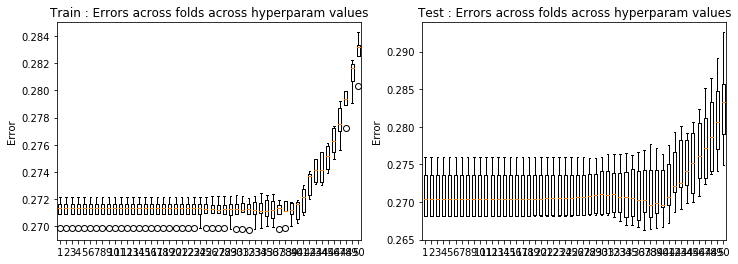

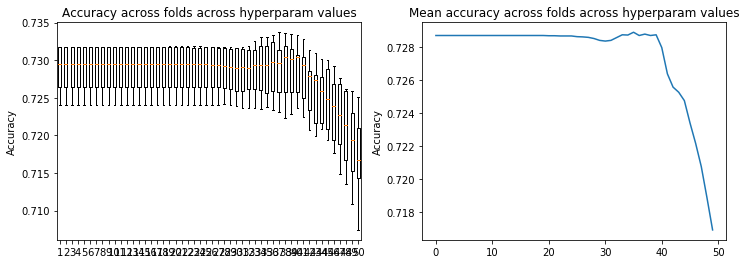

In [58]:
result_crossval(loss_tr37,loss_te37)
result_crossval_accuracy(acc37)

In [29]:
# test 37: degree 1, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr37, loss_te37, w37, acc37 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 1, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])


Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-0.27643109  0.11937582 -0.22124384 -0.30508339  0.28410553  0.03684474
  0.09568683 -0.09358186  0.10448149  0.22490748  0.00492971 -0.00353415
  0.1690343  -0.00911174  0.00092957  0.03007745  0.00091033 -0.01457702
 -0.00328653 -0.00434408]
Ridge regression: w=[-0.27501766  0.12037831 -0.22281789 -0.30172668  0.28113264  0.0370124
  0.09692278 -0.10422235  0.0999519   0.21802072  0.00251613 -0.00690666
  0.17493713 -0.00641438 -0.00063942  0.03117129  0.00177893 -0.01434518
 -0.00246507 -0.00559946]
Ridge regression: w=[-2.78727910e-01  1.22399897e-01 -2.22086723e-01 -3.00239164e-01
  2.75997729e-01  3.89224515e-02  9.97659039e-02 -9.21217821e-02
  9.95861547e-02  2.17958671e-01  4.12009231e-03 -5.03036337e-03
  1.65926661e-01 -5.85398335e-03  1.50916583e-05  2.88738941e-02
  4.88497774e-0

Ridge regression: w=[-2.76819752e-01  1.19764183e-01 -2.24880880e-01 -3.02639511e-01
  2.77639769e-01  3.94991334e-02  9.45131322e-02 -8.47705313e-02
  1.01133840e-01  2.29187227e-01  3.21505057e-03 -2.61764658e-03
  1.66493592e-01 -8.24525757e-03 -6.98878358e-05  3.35210311e-02
  4.75835045e-03 -1.90251730e-02  1.75626521e-04 -2.57668817e-03]
Accuracy = [0.7264310954063604, 0.7295406360424028, 0.7318021201413427, 0.7240282685512367, 0.7318021201413427]
Ridge regression: w=[-0.27643104  0.11937569 -0.22124381 -0.30508284  0.28410519  0.03684474
  0.09568682 -0.09358169  0.10448154  0.22490735  0.00492971 -0.00353415
  0.16903393 -0.00911174  0.00092957  0.03007744  0.00091033 -0.014577
 -0.00328653 -0.00434408]
Ridge regression: w=[-0.27501762  0.12037818 -0.22281787 -0.30172613  0.2811323   0.0370124
  0.09692277 -0.10422215  0.09995195  0.21802061  0.00251613 -0.00690666
  0.17493676 -0.00641438 -0.00063942  0.03117128  0.00177894 -0.01434516
 -0.00246507 -0.00559946]
Ridge regressio

Ridge regression: w=[-0.27501732  0.12037738 -0.22281769 -0.30172273  0.28113021  0.03701236
  0.0969227  -0.10422091  0.09995226  0.21801992  0.00251612 -0.00690667
  0.17493442 -0.00641438 -0.00063943  0.03117122  0.00177895 -0.01434502
 -0.00246507 -0.00559945]
Ridge regression: w=[-2.78727567e-01  1.22398931e-01 -2.22086526e-01 -3.00235248e-01
  2.75995354e-01  3.89223896e-02  9.97658047e-02 -9.21205059e-02
  9.95865206e-02  2.17957813e-01  4.12007852e-03 -5.03037734e-03
  1.65924093e-01 -5.85397800e-03  1.50813071e-05  2.88738461e-02
  4.88498789e-03 -1.77665685e-02  4.37690882e-04 -4.95383014e-03]
Ridge regression: w=[-0.27886891  0.12104687 -0.22358835 -0.29708652  0.27467682  0.03805633
  0.09325595 -0.09565396  0.10448554  0.22242665  0.00344434 -0.00573374
  0.1696468  -0.00722646 -0.00216829  0.03265778  0.00052988 -0.01738237
 -0.00134927 -0.00438319]
Ridge regression: w=[-2.76819442e-01  1.19763303e-01 -2.24880685e-01 -3.02635921e-01
  2.77637605e-01  3.94990840e-02  9.451

Ridge regression: w=[-2.76817521e-01  1.19757846e-01 -2.24879472e-01 -3.02613657e-01
  2.77624184e-01  3.94987778e-02  9.45131061e-02 -8.47632926e-02
  1.01136114e-01  2.29180438e-01  3.21504425e-03 -2.61766583e-03
  1.66477171e-01 -8.24529174e-03 -6.98867814e-05  3.35204628e-02
  4.75840252e-03 -1.90240210e-02  1.75610220e-04 -2.57657753e-03]
Accuracy = [0.7264310954063604, 0.7295406360424028, 0.7318021201413427, 0.7240282685512367, 0.7318021201413427]
Ridge regression: w=[-0.2764278   0.11936669 -0.22124202 -0.30504486  0.28408194  0.03684427
  0.0956863  -0.09356965  0.10448488  0.22489841  0.00492947 -0.00353426
  0.16900895 -0.00911161  0.00092951  0.0300768   0.00091055 -0.01457544
 -0.00328652 -0.00434391]
Ridge regression: w=[-0.27501439  0.12036927 -0.22281594 -0.30168848  0.28110915  0.03701193
  0.09692209 -0.10420841  0.09995543  0.21801303  0.00251607 -0.00690671
  0.17491084 -0.00641439 -0.00063949  0.0311706   0.00177911 -0.01434361
 -0.00246507 -0.00559931]
Ridge regres

Ridge regression: w=[-2.78706137e-01  1.22338620e-01 -2.22074192e-01 -2.99990635e-01
  2.75847009e-01  3.89185185e-02  9.97596163e-02 -9.20408646e-02
  9.96093642e-02  2.17904191e-01  4.11921708e-03 -5.03124892e-03
  1.65763742e-01 -5.85364349e-03  1.44351768e-05  2.88708370e-02
  4.88562159e-03 -1.77553416e-02  4.37776179e-04 -4.95259243e-03]
Ridge regression: w=[-0.27884747  0.1209904  -0.22357542 -0.29684475  0.27452908  0.03805292
  0.09325453 -0.09557426  0.10450667  0.22237014  0.00344389 -0.00573411
  0.16948393 -0.00722635 -0.00216807  0.03265229  0.00053113 -0.01737194
 -0.00134941 -0.00438171]
Ridge regression: w=[-2.76798159e-01  1.19702889e-01 -2.24867249e-01 -3.02389421e-01
  2.77489003e-01  3.94956884e-02  9.45128827e-02 -8.47005656e-02
  1.01155830e-01  2.29121504e-01  3.21498906e-03 -2.61783270e-03
  1.66334772e-01 -8.24558761e-03 -6.98773485e-05  3.35155215e-02
  4.75885408e-03 -1.90140203e-02  1.75468888e-04 -2.57561758e-03]
Accuracy = [0.7264310954063604, 0.729469964

Ridge regression: w=[-0.27481279  0.11981712 -0.22269507 -0.29935212  0.27967186  0.03698238
  0.09688035 -0.10336172  0.1001709   0.2175373   0.00251225 -0.00690933
  0.17330623 -0.00641492 -0.0006437   0.03112722  0.00178983 -0.01424664
 -0.00246472 -0.00558985]
Ridge regression: w=[-2.78520273e-01  1.21819585e-01 -2.21966600e-01 -2.97882854e-01
  2.74567958e-01  3.88847816e-02  9.97066039e-02 -9.13600972e-02
  9.98057584e-02  2.17437481e-01  4.11176217e-03 -5.03872427e-03
  1.64384974e-01 -5.85074053e-03  8.89822881e-06  2.88438193e-02
  4.89108552e-03 -1.76577763e-02  4.38521267e-04 -4.94188960e-03]
Ridge regression: w=[-0.27866151  0.12050444 -0.22346265 -0.29476139  0.27325531  0.03802315
  0.09324255 -0.09489291  0.10468831  0.22187867  0.00344005 -0.00573723
  0.16808337 -0.00722543 -0.00216606  0.03260395  0.00054189 -0.01728121
 -0.00135066 -0.00436883]
Ridge regression: w=[-2.76613567e-01  1.19183042e-01 -2.24750160e-01 -3.00265348e-01
  2.76207636e-01  3.94660213e-02  9.451

Ridge regression: w=[-0.27751385  0.1176484  -0.22274562 -0.28241986  0.26568126  0.03783235
  0.09318135 -0.09104973  0.1057475   0.21880191  0.00341624 -0.0057542
  0.15988954 -0.00721888 -0.00215294  0.03227812  0.00060662 -0.01671213
 -0.00135746 -0.00429094]
Ridge regression: w=[-2.75474342e-01  1.16131673e-01 -2.24007332e-01 -2.87684233e-01
  2.68584906e-01  3.92748480e-02  9.45073202e-02 -8.08004014e-02
  1.02429260e-01  2.25069124e-01  3.20972129e-03 -2.62830457e-03
  1.57105723e-01 -8.26300530e-03 -6.81361821e-05  3.31430231e-02
  4.78822592e-03 -1.83198724e-02  1.66389165e-04 -2.51134557e-03]
Accuracy = [0.7260070671378092, 0.7293286219081272, 0.7319434628975265, 0.7234628975265017, 0.7330742049469965]
Ridge regression: w=[-0.27447874  0.11434109 -0.22010816 -0.28356409  0.27084776  0.03654433
  0.09541053 -0.08723766  0.106331    0.21942882  0.00479261 -0.00359472
  0.15512962 -0.00903399  0.00089811  0.02961236  0.00103814 -0.01362098
 -0.0032779  -0.00424351]
Ridge regress

Ridge regression: w=[-0.26277271  0.0975549  -0.21416405 -0.19868357  0.21562755  0.03471206
  0.0950944  -0.07691317  0.10838594  0.18809876  0.00229636 -0.00689199
  0.10935147 -0.0064024  -0.00072294  0.0268403   0.00228771 -0.00801018
 -0.00239644 -0.00505995]
Ridge regression: w=[-2.66317764e-01  9.86988422e-02 -2.13582390e-01 -1.97944334e-01
  2.11861113e-01  3.62815644e-02  9.70694233e-02 -6.85838262e-02
  1.08067121e-01  1.86851879e-01  3.65830231e-03 -5.30297452e-03
  1.03895705e-01 -5.63957828e-03 -1.85092598e-04  2.52208865e-02
  5.14642111e-03 -1.09337137e-02  4.88222689e-04 -4.35032946e-03]
Ridge regression: w=[-0.26645281  0.09880488 -0.21484155 -0.19584764  0.21081931  0.03560667
  0.09255694 -0.07188606  0.11223622  0.19020383  0.00316323 -0.0057875
  0.10640027 -0.00708912 -0.00198904  0.02800953  0.00111261 -0.01085001
 -0.0013732  -0.00366027]
Ridge regression: w=[-2.64494595e-01  9.62047490e-02 -2.15907672e-01 -1.99541239e-01
  2.13206010e-01  3.69927494e-02  9.4162

Ridge regression: w=[-2.13538205e-01  6.91913304e-02 -1.73998192e-01 -5.23803696e-02
  1.06232463e-01  2.52250543e-02  8.24829818e-02 -5.66527439e-02
  1.10107145e-01  1.16667989e-01  2.06589119e-03 -4.84932647e-03
  2.52425939e-02 -4.49902952e-03 -8.09077210e-05  8.85762952e-03
  5.19396278e-03  1.17600371e-02  5.21749441e-04 -2.95272014e-03]
Ridge regression: w=[-0.21364649  0.07057908 -0.1749295  -0.0514434   0.1058921   0.02483678
  0.08089451 -0.05900387  0.11290484  0.11859718  0.00174491 -0.00504815
  0.02570555 -0.00585098 -0.00114624  0.01035708  0.0022045   0.01162846
 -0.00113799 -0.00204882]
Ridge regression: w=[-2.12076356e-01  6.76402288e-02 -1.75472656e-01 -5.30816741e-02
  1.06652000e-01  2.57878013e-02  8.22358607e-02 -5.57930022e-02
  1.10481462e-01  1.19037129e-01  1.80566735e-03 -2.51122959e-03
  2.63370311e-02 -6.91163844e-03  3.52032071e-04  1.06375418e-02
  4.80086972e-03  1.10837309e-02  1.42951979e-05 -1.15844120e-03]
Accuracy = [0.7208480565371025, 0.724876325

Ridge regression: w=[-9.22732627e-02  3.85338220e-02 -8.62135042e-02  6.83467199e-03
  3.38818891e-02  1.04626259e-02  4.51726895e-02 -4.02351130e-02
  6.62006312e-02  5.75027310e-02  7.26236493e-06 -1.48496438e-03
 -4.54863997e-03 -3.27151851e-03  5.97035939e-04 -2.84743297e-03
  2.76257762e-03  2.33661738e-02 -1.66881783e-04 -3.75073713e-04]
Accuracy = [0.7143462897526501, 0.7167491166077739, 0.7250883392226148, 0.7074204946996466, 0.7209187279151944]


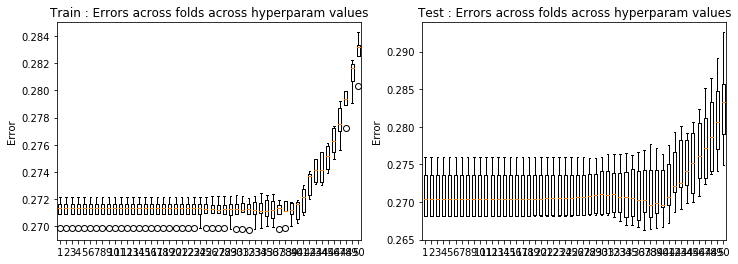

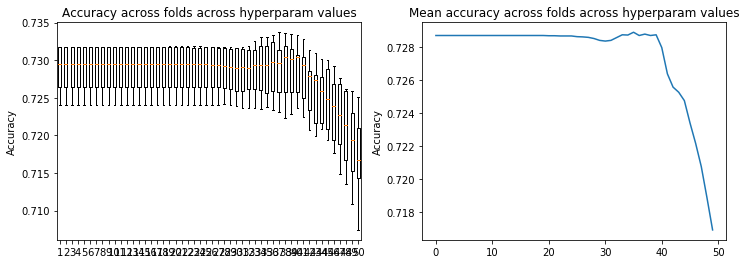

In [59]:
result_crossval(loss_tr37,loss_te37)
result_crossval_accuracy(acc37)

In [30]:
# test 38: degree 2, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr38, loss_te38, w38, acc38 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 2, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  7.16054715e-01 -1.52507228e-01 -7.01523437e-02
  2.04152515e-01  6.33320283e-02  2.70563204e-01  1.68693525e-01
  9.09553928e-02  5.83164075e-01  4.45838359e-03 -2.33377037e-03
  6.11145598e-02 -6.27359796e-03  3.92371467e-04  5.28999505e-02
  3.28596118e-03  7.65017905e-02 -4.08736767e-03 -4.11555539e-03
 -5.86067517e-01 -5.21024247e-02 -1.19566710e-01 -7.65263917e-02
 -3.81925659e-02 -1.65636743e-01 -6.33452805e-02  1.25065063e-02
 -3.42826852e-01 -3.78199617e-02 -4.53893780e-03 -9.70743148e-02
 -6.24267344e-02  8.44544576e-04 -4.30749984e-02 -8.75106448e-03
 -8.79856352e-02  1.53329341e-01 -6.01426314e-03]
Ridge regression: w=[-2.75017662e-01  7.11705650e-01 -1.51421885e-01 -1.61486341e-02
  1.55221296e-01  6.64083195e-02  2.96356084e-01  1.96835452e-01
  8.62041180e-02  5

Ridge regression: w=[-2.78869246e-01  7.23831248e-01 -1.51618040e-01 -4.49206508e-02
  1.85632776e-01  7.16511756e-02  3.08062262e-01  1.42668185e-01
  8.98517549e-02  5.27676217e-01  2.88779321e-03 -3.54830092e-03
  6.63540447e-02 -4.92205248e-03 -2.64120390e-03  5.48973157e-02
  2.31204311e-03  6.31305426e-02 -2.22201982e-03 -3.79533152e-03
 -5.90206493e-01 -5.55937973e-02 -1.33859216e-01 -7.42260108e-02
 -4.63954899e-02 -2.05712408e-01 -5.61254306e-02  1.81013789e-02
 -3.03731539e-01 -3.93807794e-02  1.56547294e-03 -9.29038641e-02
 -6.63258021e-02  3.37317195e-03 -4.20502621e-02 -4.74682143e-04
 -7.77345675e-02  1.51432506e-01  1.08600749e-03]
Ridge regression: w=[-2.76819776e-01  7.14203400e-01 -1.52408188e-01 -2.56305858e-02
  1.52110010e-01  7.24455241e-02  2.86726954e-01  1.97987756e-01
  8.78306871e-02  5.64469680e-01  5.09556357e-03 -1.36237141e-03
  2.95469009e-02 -6.73733420e-03 -1.31275866e-03  5.03515026e-02
  5.21298329e-03  7.84478376e-02 -6.36039508e-04 -2.19785818e-03


Ridge regression: w=[-0.27872788  0.71158803 -0.14862395 -0.04610428  0.17770089  0.05987785
  0.30550905  0.20169496  0.08722735  0.57134212  0.00375689 -0.00309795
  0.02558474 -0.00364364 -0.0013799   0.05294242  0.00540719  0.06911708
 -0.0014326  -0.0046702  -0.58014322 -0.05835349 -0.13359887 -0.06313646
 -0.03275983 -0.19951351 -0.08639608  0.01540897 -0.33161587 -0.04155776
  0.00357865 -0.071762   -0.06538728  0.0045664  -0.04119951  0.00214593
 -0.084058    0.15468044  0.0065772 ]
Ridge regression: w=[-2.78869221e-01  7.23827764e-01 -1.51618097e-01 -4.49159799e-02
  1.85631021e-01  7.16510696e-02  3.08062475e-01  1.42649507e-01
  8.98518446e-02  5.27658120e-01  2.88780157e-03 -3.54830783e-03
  6.63649560e-02 -4.92205830e-03 -2.64120594e-03  5.48972539e-02
  2.31203639e-03  6.31306541e-02 -2.22201930e-03 -3.79532751e-03
 -5.90203296e-01 -5.55938079e-02 -1.33863174e-01 -7.42247488e-02
 -4.63954071e-02 -2.05712862e-01 -5.61158101e-02  1.81014783e-02
 -3.03720173e-01 -3.93807807e

Ridge regression: w=[-2.75017557e-01  7.11691083e-01 -1.51421965e-01 -1.61303047e-02
  1.55215274e-01  6.64078310e-02  2.96358535e-01  1.96734592e-01
  8.62044024e-02  5.72743575e-01  2.66563894e-03 -3.99638351e-03
  1.76808418e-02 -3.88133684e-03 -1.60245156e-03  4.58040451e-02
  2.48941451e-03  8.46567576e-02 -2.62982407e-03 -4.62839994e-03
 -5.82638090e-01 -5.60886988e-02 -1.60588618e-01 -4.09453165e-02
 -4.16522373e-02 -1.93914548e-01 -9.28397361e-02  1.73422581e-02
 -3.33519409e-01 -3.57727610e-02 -3.54909219e-04 -5.61931867e-02
 -6.34452915e-02  4.33120132e-03 -3.03214479e-02 -3.29300528e-03
 -9.61641905e-02  1.51732112e-01 -3.73975354e-03]
Ridge regression: w=[-0.2787278   0.71157743 -0.14862405 -0.04609     0.17769558  0.05987758
  0.30551063  0.20162414  0.08722757  0.57127505  0.00375689 -0.00309799
  0.0256272  -0.00364365 -0.0013799   0.05294202  0.00540716  0.06911724
 -0.00143262 -0.00467019 -0.58013342 -0.05835357 -0.13361115 -0.06313261
 -0.03275966 -0.19951578 -0.08635

Ridge regression: w=[-2.76430750e-01  7.16005802e-01 -1.52507692e-01 -7.00799902e-02
  2.04121853e-01  6.33305986e-02  2.70574378e-01  1.68396354e-01
  9.09566509e-02  5.82874374e-01  4.45848128e-03 -2.33386118e-03
  6.12873217e-02 -6.27378127e-03  3.92298939e-04  5.28981488e-02
  3.28589287e-03  7.65013837e-02 -4.08737521e-03 -4.11543706e-03
 -5.86022531e-01 -5.21029293e-02 -1.19628467e-01 -7.65038405e-02
 -3.81916163e-02 -1.65651454e-01 -6.31928603e-02  1.25080210e-02
 -3.42644604e-01 -3.78200036e-02 -4.53898334e-03 -9.71532666e-02
 -6.24269164e-02  8.44417155e-04 -4.30692959e-02 -8.75091758e-03
 -8.79850248e-02  1.53329750e-01 -6.01406854e-03]
Ridge regression: w=[-2.75017324e-01  7.11659077e-01 -1.51422141e-01 -1.60900437e-02
  1.55202053e-01  6.64067578e-02  2.96363904e-01  1.96513203e-01
  8.62050276e-02  5.72534775e-01  2.66568753e-03 -3.99648169e-03
  1.78149555e-02 -3.88143325e-03 -1.60241002e-03  4.58030042e-02
  2.48936653e-03  8.46568239e-02 -2.62981367e-03 -4.62834150e-03


Ridge regression: w=[-2.76819054e-01  7.14101735e-01 -1.52409883e-01 -2.55042085e-02
  1.52071446e-01  7.24424101e-02  2.86742885e-01  1.97325066e-01
  8.78325747e-02  5.63843415e-01  5.09563296e-03 -1.36251081e-03
  2.99468585e-02 -6.73742380e-03 -1.31269182e-03  5.03477551e-02
  5.21285193e-03  7.84483142e-02 -6.36137475e-04 -2.19784892e-03
 -5.82458443e-01 -5.66074268e-02 -1.54796856e-01 -4.04970514e-02
 -4.60990709e-02 -1.85183549e-01 -8.33308986e-02  1.66784524e-02
 -3.21602001e-01 -3.93882163e-02  5.22853234e-03 -7.14633466e-02
 -6.13743900e-02  5.10315944e-03 -3.52121237e-02 -2.55675660e-03
 -9.37851246e-02  1.52541078e-01  1.57442997e-03]
Accuracy = [0.7803533568904594, 0.7763957597173144, 0.7804240282685513, 0.7723674911660777, 0.7819787985865725]
Ridge regression: w=[-2.76430028e-01  7.15902011e-01 -1.52508678e-01 -6.99265790e-02
  2.04056901e-01  6.33275665e-02  2.70597957e-01  1.67767695e-01
  9.09593218e-02  5.82261344e-01  4.45868842e-03 -2.33405354e-03
  6.16526628e-02 -

Ridge regression: w=[-2.78866974e-01  7.23511103e-01 -1.51623319e-01 -4.44921706e-02
  1.85472188e-01  7.16414286e-02  3.08081047e-01  1.40963106e-01
  8.98599969e-02  5.26023295e-01  2.88856019e-03 -3.54893517e-03
  6.73493592e-02 -4.92258567e-03 -2.64139165e-03  5.48917542e-02
  2.31142632e-03  6.31408216e-02 -2.22197066e-03 -3.79496302e-03
 -5.89912720e-01 -5.55947843e-02 -1.34222297e-01 -7.41105943e-02
 -4.63878675e-02 -2.05753352e-01 -5.52473836e-02  1.81104971e-02
 -3.02693265e-01 -3.93808989e-02  1.56495602e-03 -9.33625406e-02
 -6.63271359e-02  3.37271847e-03 -4.20190135e-02 -4.74039710e-04
 -7.77446967e-02  1.51434233e-01  1.08660913e-03]
Ridge regression: w=[-2.76817521e-01  7.13886100e-01 -1.52413472e-01 -2.52366378e-02
  1.51990109e-01  7.24358052e-02  2.86776077e-01  1.95928513e-01
  8.78365888e-02  5.62523061e-01  5.09578058e-03 -1.36280449e-03
  3.07892792e-02 -6.73761374e-03 -1.31255101e-03  5.03399058e-02
  5.21257488e-03  7.84493372e-02 -6.36343934e-04 -2.19782775e-03


Ridge regression: w=[-0.27872086  0.71061637 -0.14863242 -0.04480084  0.17722013  0.05985362
  0.30564586  0.19532416  0.08724771  0.5653014   0.00375641 -0.00310124
  0.02939769 -0.00364378 -0.00138022  0.05290664  0.00540503  0.06913231
 -0.00143409 -0.00466969 -0.57924417 -0.05836049 -0.13471848 -0.06278881
 -0.03274408 -0.19971313 -0.08309275  0.01543716 -0.3278459  -0.04155828
  0.00357593 -0.07357726 -0.06538986  0.00456317 -0.04109209  0.00214665
 -0.08406914  0.15468826  0.00657872]
Ridge regression: w=[-2.78862204e-01  7.22840573e-01 -1.51634374e-01 -4.35990216e-02
  1.85139896e-01  7.16209761e-02  3.08115422e-01  1.37462840e-01
  8.98773213e-02  5.22624225e-01  2.89016204e-03 -3.55025648e-03
  6.93879226e-02 -4.92369329e-03 -2.64178528e-03  5.48808456e-02
  2.31013664e-03  6.31625814e-02 -2.22185853e-03 -3.79419378e-03
 -5.89297473e-01 -5.55969344e-02 -1.34978778e-01 -7.38722872e-02
 -4.63718175e-02 -2.05834133e-01 -5.34459903e-02  1.81294902e-02
 -3.00556794e-01 -3.93811377e

Ridge regression: w=[-2.74996180e-01  7.08770129e-01 -1.51438567e-01 -1.25198863e-02
  1.54069134e-01  6.63103610e-02  2.96768572e-01  1.77687037e-01
  8.62627751e-02  5.54711458e-01  2.66997339e-03 -4.00499489e-03
  2.91685521e-02 -3.88976940e-03 -1.59884323e-03  4.57213000e-02
  2.48529045e-03  8.46655562e-02 -2.62888981e-03 -4.62322188e-03
 -5.79932886e-01 -5.61079132e-02 -1.63707078e-01 -4.01306181e-02
 -4.15778266e-02 -1.94479923e-01 -8.29384991e-02  1.74169720e-02
 -3.22267138e-01 -3.57769397e-02 -3.63822310e-04 -6.17186132e-02
 -6.34523717e-02  4.32264710e-03 -3.00276883e-02 -3.29358277e-03
 -9.61658771e-02  1.51758879e-01 -3.73911618e-03]
Ridge regression: w=[-0.27870614  0.7085919  -0.14865058 -0.04212664  0.17625901  0.05980285
  0.30587655  0.18281972  0.08729105  0.55339454  0.00375551 -0.00310782
  0.03684133 -0.00364391 -0.00138092  0.0528408   0.00540065  0.06916634
 -0.00143706 -0.00466861 -0.5773718  -0.05837552 -0.13701154 -0.06209939
 -0.03271044 -0.20007494 -0.07661

Ridge regression: w=[-2.76364393e-01  7.06691835e-01 -1.52599577e-01 -5.68947351e-02
  1.98831319e-01  6.30646933e-02  2.72073942e-01  1.20784427e-01
  9.12017827e-02  5.35655261e-01  4.47636113e-03 -2.34949815e-03
  8.83619155e-02 -6.30495717e-03  3.79907195e-04  5.26542349e-02
  3.27344438e-03  7.64484304e-02 -4.08829468e-03 -4.09334571e-03
 -5.77463602e-01 -5.22044565e-02 -1.30837175e-01 -7.26700985e-02
 -3.80088710e-02 -1.67819030e-01 -3.89305998e-02  1.27854402e-02
 -3.12762168e-01 -3.78267464e-02 -4.54586777e-03 -1.09129427e-01
 -6.24627928e-02  8.24159203e-04 -4.20693358e-02 -8.72597048e-03
 -8.78991003e-02  1.53400656e-01 -5.98110493e-03]
Ridge regression: w=[-2.74951306e-01  7.02778011e-01 -1.51475052e-01 -5.47316588e-03
  1.52052821e-01  6.61125881e-02  2.97177659e-01  1.44795063e-01
  8.63894742e-02  5.23193531e-01  2.67831324e-03 -4.02079340e-03
  4.87218734e-02 -3.90509724e-03 -1.59240091e-03  4.56163681e-02
  2.47819986e-03  8.46974144e-02 -2.62705222e-03 -4.61342147e-03


Ridge regression: w=[-2.76678154e-01  6.95231172e-01 -1.52702267e-01 -4.08304081e-03
  1.46787437e-01  7.18592364e-02  2.87372534e-01  1.08770725e-01
  8.82215422e-02  4.78048091e-01  5.10959385e-03 -1.38085566e-03
  8.17300012e-02 -6.75318042e-03 -1.30381730e-03  5.00234585e-02
  5.19454030e-03  7.85749563e-02 -6.49146210e-04 -2.19018644e-03
 -5.64997712e-01 -5.66288355e-02 -1.73113662e-01 -3.71189901e-02
 -4.56443558e-02 -1.86815311e-01 -3.78314938e-02  1.71253464e-02
 -2.67591845e-01 -3.93780220e-02  5.19387423e-03 -9.51748194e-02
 -6.14495162e-02  5.05370363e-03 -3.34344215e-02 -2.53918645e-03
 -9.38921700e-02  1.52648529e-01  1.58233113e-03]
Accuracy = [0.7801413427561837, 0.7765371024734983, 0.7800706713780918, 0.7715901060070671, 0.7819787985865725]
Ridge regression: w=[-2.76225164e-01  6.88520112e-01 -1.52780415e-01 -3.38116350e-02
  1.90853173e-01  6.25607734e-02  2.72535377e-01  6.12252953e-02
  9.16977849e-02  4.73163894e-01  4.50817084e-03 -2.37347931e-03
  1.19693146e-01 -

Ridge regression: w=[-2.78429004e-01  6.69978553e-01 -1.52409735e-01  1.46871747e-02
  1.69382204e-01  6.98564422e-02  2.99848750e-01  6.38556618e-03
  9.13483044e-02  3.83860250e-01  3.00446128e-03 -3.63841335e-03
  1.36886209e-01 -4.98699758e-03 -2.67223605e-03  5.53905710e-02
  2.21371854e-03  6.52347280e-02 -2.19399627e-03 -3.73428606e-03
 -5.40851522e-01 -5.59544652e-02 -1.83724501e-01 -6.35775843e-02
 -4.48489511e-02 -2.01037880e-01  1.17928170e-02  1.93503323e-02
 -2.10431983e-01 -3.93944414e-02  1.50061152e-03 -1.19324070e-01
 -6.65842982e-02  3.32109285e-03 -3.81070745e-02 -4.10411326e-04
 -7.97949641e-02  1.51638029e-01  1.14777157e-03]
Ridge regression: w=[-2.76382769e-01  6.60872649e-01 -1.53122445e-01  2.79999034e-02
  1.42858380e-01  7.07381477e-02  2.82318046e-01  3.24013521e-02
  8.90190417e-02  3.97179858e-01  5.13265682e-03 -1.39615927e-03
  1.21138031e-01 -6.77492424e-03 -1.29477278e-03  5.02718852e-02
  5.17607688e-03  7.87979832e-02 -6.59238161e-04 -2.16029962e-03


Ridge regression: w=[-0.2773732   0.58163965 -0.1494719   0.06959305  0.15935636  0.05595731
  0.27440866 -0.02991759  0.09061982  0.31496852  0.00379847 -0.0033121
  0.13716486 -0.00355206 -0.00139296  0.05391903  0.00521324  0.07137917
 -0.00150074 -0.00455108 -0.46041033 -0.05985378 -0.23053124 -0.05320848
 -0.02946902 -0.17584875  0.02600424  0.01797661 -0.16096438 -0.04174463
  0.00344499 -0.10546253 -0.0658921   0.0043487  -0.03214264  0.00214752
 -0.08581015  0.15514299  0.00659116]
Ridge regression: w=[-2.77513851e-01  5.91826274e-01 -1.52917849e-01  7.33408154e-02
  1.63807213e-01  6.66838170e-02  2.73691880e-01 -4.31036065e-02
  9.35926290e-02  3.09278760e-01  3.15498227e-03 -3.74913726e-03
  1.46901893e-01 -5.03887312e-03 -2.70777357e-03  5.66209835e-02
  2.08058581e-03  6.74857868e-02 -2.13278931e-03 -3.62257441e-03
 -4.69188218e-01 -5.69022118e-02 -2.32156305e-01 -6.11824475e-02
 -4.18970916e-02 -1.79127282e-01  3.17341835e-02  2.06408547e-02
 -1.55658277e-01 -3.95147304e-

Ridge regression: w=[-0.27093035  0.45646722 -0.14944401  0.12000492  0.16038917  0.05558953
  0.21702051 -0.06289443  0.09318719  0.24443982  0.00282998 -0.00438735
  0.12511401 -0.00412989 -0.00138198  0.04724638  0.00248021  0.07664935
 -0.0025632  -0.0043228  -0.34759199 -0.06150499 -0.27360111 -0.04625699
 -0.03158188 -0.12568585  0.02365241  0.02078198 -0.09936352 -0.03657111
 -0.00061506 -0.06605336 -0.06447961  0.00398511 -0.01459229 -0.0031148
 -0.08638848  0.15228722 -0.00362254]
Ridge regression: w=[-0.27458545  0.45478138 -0.14806569  0.11214682  0.16521658  0.05052323
  0.2208979  -0.05625505  0.09440812  0.24192202  0.00392299 -0.00347753
  0.12425517 -0.00349545 -0.00128948  0.05263946  0.00506221  0.06664228
 -0.00149052 -0.00429555 -0.34405949 -0.06272492 -0.2641415  -0.05529266
 -0.02445849 -0.12765814  0.02807202  0.01971716 -0.09762508 -0.04243621
  0.00326884 -0.07343191 -0.06644332  0.00400734 -0.02303422  0.00199683
 -0.0797403   0.15497313  0.00630413]
Ridge reg

Ridge regression: w=[-0.26631776  0.30380727 -0.14129857  0.09262939  0.15593586  0.04044872
  0.1517724  -0.05656998  0.09936857  0.1762004   0.00405917 -0.00372922
  0.09284627 -0.00354392 -0.00100181  0.0434483   0.00489684  0.04825438
 -0.00138873 -0.00375224 -0.20783036 -0.06918808 -0.23768079 -0.03375251
 -0.01513199 -0.06279893  0.01200413  0.02272756 -0.03063835 -0.04396609
  0.00277188 -0.02711262 -0.06697927  0.00317173 -0.00888213  0.00156936
 -0.05768264  0.15269294  0.00545127]
Ridge regression: w=[-2.66452814e-01  3.08593616e-01 -1.43787096e-01  9.58152488e-02
  1.56481104e-01  4.63558359e-02  1.50314892e-01 -5.94753377e-02
  1.02599468e-01  1.77940162e-01  3.63501300e-03 -4.13339170e-03
  9.53843959e-02 -5.11432839e-03 -2.59526580e-03  4.54635632e-02
  1.72200349e-03  4.78364499e-02 -1.86353708e-03 -2.78911682e-03
 -2.11867896e-01 -6.74096610e-02 -2.39153006e-01 -3.66688260e-02
 -2.24325536e-02 -6.52946109e-02  1.22337550e-02  2.49494908e-02
 -2.89055144e-02 -4.16646883e

Ridge regression: w=[-2.43780230e-01  1.73830885e-01 -1.28303432e-01  4.25604989e-02
  1.17717151e-01  2.96783990e-02  9.37957381e-02 -4.80658164e-02
  1.03941215e-01  1.22231003e-01  3.35557261e-03 -4.16992328e-03
  5.75773297e-02 -4.86332128e-03 -2.16461803e-03  2.88995328e-02
  1.75367633e-03  2.64390102e-02 -1.60342289e-03 -1.95887328e-03
 -9.40255678e-02 -7.60431943e-02 -1.61849962e-01  2.84484931e-03
 -7.44066865e-03 -8.17240405e-03 -5.16982145e-03  3.12614667e-02
  2.16576393e-02 -4.25844167e-02  1.22479913e-04  3.96577910e-03
 -6.66181213e-02  1.42045305e-03  3.48769812e-03 -2.38297486e-04
 -2.79865851e-02  1.39370305e-01  3.53325095e-04]
Ridge regression: w=[-2.41988637e-01  1.71272936e-01 -1.28555621e-01  4.01079827e-02
  1.17740866e-01  3.06969480e-02  9.31883437e-02 -4.50945884e-02
  1.01356630e-01  1.22335925e-01  3.79208442e-03 -1.71722435e-03
  5.76836867e-02 -6.04111207e-03 -4.76859169e-04  2.77515824e-02
  4.93564165e-03  2.71147233e-02 -3.95905970e-04 -9.01895604e-04


Ridge regression: w=[-1.92944795e-01  8.85876547e-02 -1.05152629e-01  1.37164051e-02
  7.27530174e-02  1.57560590e-02  6.24301757e-02 -3.64801573e-02
  9.14702680e-02  7.81404635e-02  2.36397139e-03 -3.58820619e-03
  2.38863572e-02 -2.90726734e-03 -1.72790353e-04  1.21055868e-02
  4.25893538e-03  1.66432711e-02 -4.94567318e-04 -2.06897135e-03
 -2.59916978e-02 -7.75928487e-02 -8.30783303e-02  2.10782514e-02
  3.43763974e-03  2.37243757e-02 -1.40453420e-02  3.62488098e-02
  3.80919119e-02 -4.06726765e-02  9.64144160e-04  6.23836467e-03
 -5.73730637e-02  5.55194160e-04  6.06468785e-03  2.42607050e-04
 -4.53764313e-03  1.15724398e-01  2.29977371e-03]
Ridge regression: w=[-1.93042637e-01  8.98692675e-02 -1.06070958e-01  1.43055792e-02
  7.26049181e-02  1.65449637e-02  6.18004916e-02 -3.77088220e-02
  9.37138344e-02  7.96321174e-02  2.07682839e-03 -3.72602656e-03
  2.44699442e-02 -4.03641404e-03 -1.31068945e-03  1.28535805e-02
  1.91907117e-03  1.67029692e-02 -1.13091178e-03 -1.08193431e-03


Ridge regression: w=[-1.15879971e-01  4.65231011e-02 -7.65515383e-02  9.06925652e-03
  3.91539266e-02  8.78935470e-03  4.17843433e-02 -3.11754617e-02
  6.74534594e-02  5.09958883e-02  1.41058978e-04 -2.78716146e-03
  4.65468484e-03 -2.84117598e-03  3.81417612e-04  1.71167487e-03
  2.32092883e-03  1.70491419e-02 -1.05132754e-03 -1.57299840e-03
  1.09321700e-03 -6.40574138e-02 -3.20890922e-02  1.85023127e-02
  3.88254094e-03  2.85975772e-02 -1.98717528e-02  3.25166732e-02
  3.57327556e-02 -2.62815677e-02 -8.39550525e-04 -1.03662586e-04
 -3.84439981e-02  1.63501612e-03  3.25178322e-03 -3.52489824e-04
  9.26186297e-03  7.07811440e-02 -1.85450695e-03]
Ridge regression: w=[-1.17443301e-01  4.62911219e-02 -7.63993788e-02  8.87213943e-03
  3.87049948e-02  8.89209982e-03  4.16953040e-02 -2.96723835e-02
  6.75367799e-02  4.99259499e-02  8.08359081e-04 -2.53946366e-03
  4.53659759e-03 -2.04078263e-03  1.44442451e-04  1.73780098e-03
  3.21610351e-03  1.61164029e-02 -1.63305111e-05 -1.29237222e-03


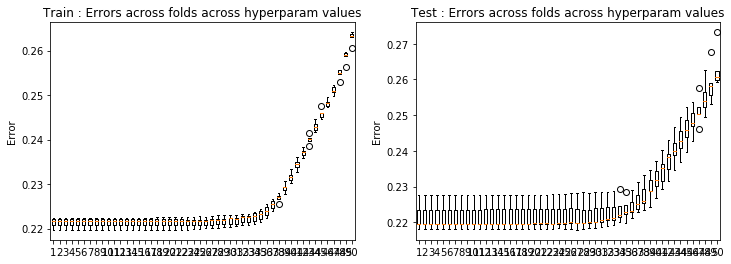

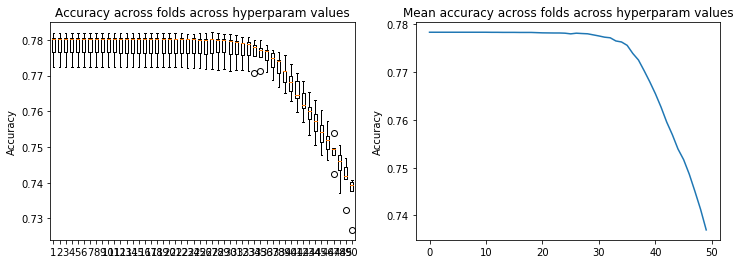

In [60]:
result_crossval(loss_tr38,loss_te38)
result_crossval_accuracy(acc38)

In [31]:
# test 39: degree 3, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr39, loss_te39, w39, acc39 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 3, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -2.61537982e-01  1.75739648e-01  7.96513413e-01
 -2.89201673e-01  1.73212428e-01  4.23076203e-01  4.99848811e-01
  3.88438424e-02  7.65470949e-01  9.30504788e-04 -2.43060921e-04
  5.90957532e-02  1.67345283e-03  1.77001452e-02  2.08479388e-01
  3.82682865e-03  4.86308906e-02 -5.09616892e-03  1.28154709e-03
  1.58677353e+00 -8.64813620e-01 -1.85195260e+00  8.80626287e-01
 -2.97058689e-01 -4.48439147e-01 -4.92578941e-01  1.17480882e-02
 -6.37823390e-01 -3.61938642e-02 -4.95078221e-03 -3.30213249e-01
 -6.11758196e-02  5.95648994e-04 -3.69225179e-01 -8.87890824e-03
 -5.72287995e-02  1.51118668e-01 -6.63247292e-03 -1.23322095e+00
  5.09534149e-01  9.38474441e-01 -5.19617979e-01  1.60479097e-01
  1.39378233e-01  1.87328185e-01  4.09023100e-02  1.52173878e-01
  3.60513873e-03 -2.2350

Ridge regression: w=[-2.76819780e-01 -2.72651342e-01  2.01950643e-01  8.45974312e-01
 -3.16344426e-01  1.69955839e-01  4.34456265e-01  3.60051259e-01
  3.36203316e-02  6.98682749e-01 -3.48502109e-03  2.29164306e-03
  1.57931356e-01  2.63012717e-03  1.99821515e-02  2.36882860e-01
  1.14023264e-02  9.98323119e-02 -8.22339305e-03  9.58753237e-03
  1.61949914e+00 -9.32861777e-01 -1.90483549e+00  8.67475211e-01
 -2.74570742e-01 -4.59369959e-01 -2.96789105e-01  1.50833587e-02
 -6.25157208e-01 -3.82609066e-02  4.75639478e-03 -4.78896481e-01
 -6.04709563e-02  4.54050757e-03 -4.28609024e-01 -2.49057461e-03
 -1.64331391e-01  1.50158822e-01  9.09023563e-04 -1.25132635e+00
  5.48323770e-01  9.49702279e-01 -4.93871235e-01  1.41105435e-01
  1.36046468e-01  9.36943972e-02  4.18190111e-02  1.75320799e-01
  9.39791560e-03 -6.85269054e-04  2.39220213e-01 -9.70375462e-03
 -2.06688351e-02  2.28733225e-01 -4.83720589e-03  4.52310118e-02
  9.03535703e-03 -8.00732623e-03]
Accuracy = [0.7867137809187279, 0.78

Ridge regression: w=[-2.78869241e-01 -2.91842188e-01  1.86675118e-01  7.92812821e-01
 -2.53112939e-01  1.64504660e-01  5.14941230e-01  4.96502089e-01
  3.44336932e-02  7.96660889e-01 -3.43108245e-03  5.05728894e-03
  3.99543193e-03 -3.12197715e-03  1.93519249e-02  2.17907738e-01
  3.54226197e-03  7.78227158e-02 -6.76858535e-03  8.26484550e-03
  1.67005510e+00 -8.94583827e-01 -1.82479333e+00  7.92884512e-01
 -2.66286260e-01 -6.00029586e-01 -4.90132275e-01  1.73148966e-02
 -7.43668939e-01 -3.83005895e-02  1.27721742e-03 -2.26462532e-01
 -6.53859000e-02  2.99137744e-03 -3.82550312e-01 -5.92053620e-04
 -1.35456988e-01  1.48823837e-01  5.67982755e-04 -1.28495868e+00
  5.26839244e-01  9.22186962e-01 -4.79364392e-01  1.36781827e-01
  1.99467758e-01  1.82373201e-01  4.39427327e-02  2.23366499e-01
  6.54278118e-03 -6.25656109e-03  1.16497737e-01 -9.44138422e-04
 -2.08045276e-02  1.97716483e-01  8.46317569e-04  3.89394230e-02
  5.36166923e-03 -7.95814405e-03]
Ridge regression: w=[-2.76819771e-01

Ridge regression: w=[-2.78727879e-01 -2.66676535e-01  2.18555836e-01  7.36919339e-01
 -2.43453264e-01  1.54970357e-01  4.60111636e-01  6.55922065e-01
  3.29786735e-02  9.48703428e-01  1.37894591e-03  2.96037214e-03
 -3.29256989e-02 -2.04229345e-03  9.83318841e-03  2.14180035e-01
  7.97973454e-03  1.26746742e-01 -1.32972117e-03 -1.67627808e-03
  1.60812778e+00 -9.65159694e-01 -1.72065428e+00  7.77438668e-01
 -2.55089058e-01 -4.96415262e-01 -6.25741718e-01  1.32600220e-02
 -8.97267496e-01 -4.00856391e-02  3.19591205e-03 -2.69958841e-01
 -6.46861695e-02  4.13533041e-03 -3.72328794e-01  2.18592233e-03
 -2.32998765e-01  1.52178344e-01  6.01114640e-03 -1.24921506e+00
  5.67155061e-01  8.69571570e-01 -4.67587277e-01  1.37122816e-01
  1.53831097e-01  2.25992625e-01  4.23379289e-02  2.69412974e-01
  3.07713540e-03 -5.05227081e-03  1.54462274e-01 -1.98869195e-03
 -1.09605084e-02  1.89827002e-01 -1.81836969e-03  8.80165955e-02
  7.84977490e-04 -3.07513399e-04]
Ridge regression: w=[-2.78869221e-01

Ridge regression: w=[-2.75017591e-01 -2.63763573e-01  1.88221595e-01  8.50631564e-01
 -2.79226468e-01  1.32032200e-01  4.75038415e-01  7.49369352e-01
  2.18450501e-02  9.17990800e-01 -3.51658942e-03 -4.49395881e-03
 -1.08700985e-01 -4.83875589e-04  1.10118898e-02  2.40501292e-01
  2.65788207e-03  7.96474738e-02 -6.89102002e-03  3.69229125e-03
  1.60830890e+00 -9.03126407e-01 -1.92225965e+00  7.91704638e-01
 -1.94933498e-01 -5.30938766e-01 -7.80308735e-01  1.53432183e-02
 -8.03849268e-01 -3.53479887e-02 -2.87193607e-04 -1.61532843e-01
 -6.19347769e-02  3.92907480e-03 -4.47322824e-01 -2.67256711e-03
 -1.08636498e-01  1.49469458e-01 -3.68659864e-03 -1.25080735e+00
  5.33803416e-01  9.63901472e-01 -4.50772773e-01  9.42868629e-02
  1.68574388e-01  2.94324863e-01  5.20741615e-02  2.16936253e-01
  6.80662260e-03  2.55979407e-03  1.18184270e-01 -3.42908002e-03
 -1.28400321e-02  2.43139953e-01  1.08518512e-03  1.32545316e-02
  4.99116126e-03 -6.41377360e-03]
Ridge regression: w=[-2.78727838e-01

Ridge regression: w=[-2.76430932e-01 -2.60706272e-01  1.75635013e-01  7.94488468e-01
 -2.87693496e-01  1.73172934e-01  4.22723051e-01  4.95412097e-01
  3.88144057e-02  7.62431678e-01  9.31446958e-04 -2.41668187e-04
  6.18909731e-02  1.67359036e-03  1.77009923e-02  2.08466066e-01
  3.82323655e-03  4.86869732e-02 -5.09678102e-03  1.28050415e-03
  1.58505212e+00 -8.64583694e-01 -1.84824759e+00  8.78053744e-01
 -2.96965396e-01 -4.47748577e-01 -4.87445615e-01  1.17362995e-02
 -6.34563527e-01 -3.61956270e-02 -4.95045929e-03 -3.33067793e-01
 -6.11762460e-02  5.96064555e-04 -3.69216825e-01 -8.87886947e-03
 -5.73254926e-02  1.51120624e-01 -6.63159918e-03 -1.23230662e+00
  5.09408940e-01  9.36587922e-01 -5.18374771e-01  1.60424733e-01
  1.39071771e-01  1.85239414e-01  4.09343249e-02  1.50960221e-01
  3.60447862e-03 -2.23949232e-04  1.65983512e-01 -8.43294418e-03
 -1.75392699e-02  1.90440116e-01  3.52783804e-04 -9.01777556e-03
  1.17179701e-03 -2.51617870e-03]
Ridge regression: w=[-2.75017506e-01

Ridge regression: w=[-2.76819550e-01 -2.71387958e-01  2.01785106e-01  8.42962681e-01
 -3.14149867e-01  1.69904901e-01  4.33946274e-01  3.55914348e-01
  3.35775707e-02  6.95912976e-01 -3.48216269e-03  2.29507528e-03
  1.60420235e-01  2.63049950e-03  1.99867191e-02  2.36856422e-01
  1.13990112e-02  9.98599392e-02 -8.22391143e-03  9.59106721e-03
  1.61686892e+00 -9.32498905e-01 -1.89933259e+00  8.63758993e-01
 -2.74447119e-01 -4.58390380e-01 -2.91977211e-01  1.50665355e-02
 -6.22079733e-01 -3.82633957e-02  4.75768356e-03 -4.81227781e-01
 -6.04712787e-02  4.54180872e-03 -4.28578789e-01 -2.49065367e-03
 -1.64361597e-01  1.50161022e-01  9.10252196e-04 -1.24992484e+00
  5.48126041e-01  9.46909420e-01 -4.92086487e-01  1.41032500e-01
  1.35621012e-01  9.17386098e-02  4.18666662e-02  1.74119733e-01
  9.39614922e-03 -6.87186279e-04  2.39917843e-01 -9.70543563e-03
 -2.06729064e-02  2.28693334e-01 -4.83335911e-03  4.52401953e-02
  9.03536323e-03 -8.01037821e-03]
Accuracy = [0.7867137809187279, 0.78

Ridge regression: w=[-2.78868750e-01 -2.89150531e-01  1.86325438e-01  7.86781524e-01
 -2.48854524e-01  1.64400269e-01  5.13425192e-01  4.81541547e-01
  3.43431452e-02  7.86110365e-01 -3.42861236e-03  5.05856415e-03
  1.36210616e-02 -3.12301886e-03  1.93539269e-02  2.17861456e-01
  3.53234025e-03  7.79546020e-02 -6.77013420e-03  8.26372862e-03
  1.66448183e+00 -8.93806256e-01 -1.81370223e+00  7.85626456e-01
 -2.66037056e-01 -5.97033177e-01 -4.72937042e-01  1.72803851e-02
 -7.32256468e-01 -3.83054314e-02  1.27840464e-03 -2.36512664e-01
 -6.53867697e-02  2.99438092e-03 -3.82524216e-01 -5.90569831e-04
 -1.35678639e-01  1.48829071e-01  5.71912218e-04 -1.28199160e+00
  5.26407098e-01  9.16517801e-01 -4.75848835e-01  1.36637076e-01
  1.98059559e-01  1.75411403e-01  4.40412718e-02  2.19095812e-01
  6.54184317e-03 -6.25534204e-03  1.20036495e-01 -9.47039146e-04
 -2.08080623e-02  1.97661693e-01  8.54947423e-04  3.90457732e-02
  5.36328360e-03 -7.95952455e-03]
Ridge regression: w=[-2.76819284e-01

Ridge regression: w=[-2.78726839e-01 -2.61453735e-01  2.17806797e-01  7.25450041e-01
 -2.35276704e-01  1.54731073e-01  4.58043215e-01  6.16715873e-01
  3.27787867e-02  9.19493359e-01  1.38185662e-03  2.96479329e-03
 -8.46084518e-03 -2.03411801e-03  9.84594991e-03  2.14077817e-01
  7.95224217e-03  1.26581075e-01 -1.33190483e-03 -1.67769839e-03
  1.59728952e+00 -9.63504723e-01 -1.69943884e+00  7.63391628e-01
 -2.54523382e-01 -4.92136405e-01 -5.81196520e-01  1.31945826e-02
 -8.65345192e-01 -4.00979403e-02  3.19547826e-03 -2.94973671e-01
 -6.46847245e-02  4.13772235e-03 -3.72279105e-01  2.18700062e-03
 -2.32561395e-01  1.52191707e-01  6.02086589e-03 -1.24342688e+00
  5.66237922e-01  8.58648834e-01 -4.60734924e-01  1.36791140e-01
  1.51786786e-01  2.08025855e-01  4.25518845e-02  2.57494566e-01
  3.07132102e-03 -5.05152440e-03  1.63257920e-01 -2.00000591e-03
 -1.09729903e-02  1.89730158e-01 -1.79621333e-03  8.77614331e-02
  7.85441418e-04 -3.08437469e-04]
Ridge regression: w=[-2.78868181e-01

Ridge regression: w=[-2.75015416e-01 -2.52130284e-01  1.86653671e-01  8.23673286e-01
 -2.60143063e-01  1.31634490e-01  4.69473390e-01  6.63062550e-01
  2.14204209e-02  8.56173616e-01 -3.50011451e-03 -4.47080416e-03
 -5.38869786e-02 -4.66233885e-04  1.10628983e-02  2.40244295e-01
  2.62372485e-03  8.01255968e-02 -6.89620250e-03  3.71183871e-03
  1.58410223e+00 -8.99628072e-01 -1.87238346e+00  7.59196930e-01
 -1.93970127e-01 -5.19674592e-01 -6.81412984e-01  1.51998155e-02
 -7.37562797e-01 -3.53554411e-02 -2.84411649e-04 -2.18756656e-01
 -6.19431990e-02  3.94064153e-03 -4.47111195e-01 -2.66813495e-03
 -1.09394794e-01  1.49498684e-01 -3.66852693e-03 -1.23790972e+00
  5.31860237e-01  9.38255285e-01 -4.35018685e-01  9.37251225e-02
  1.63251351e-01  2.54278258e-01  5.25338458e-02  1.92483325e-01
  6.79108444e-03  2.54916471e-03  1.38570720e-01 -3.45778050e-03
 -1.28922969e-02  2.42859292e-01  1.11788865e-03  1.36025774e-02
  4.99018375e-03 -6.42610366e-03]
Ridge regression: w=[-2.78725632e-01

Ridge regression: w=[-2.76426294e-01 -2.37033949e-01  1.72630881e-01  7.38338686e-01
 -2.46665240e-01  1.72051349e-01  4.12625662e-01  3.97147619e-01
  3.80143469e-02  6.96483612e-01  9.56069769e-04 -2.00005163e-04
  1.22361141e-01  1.67812331e-03  1.77207531e-02  2.08069393e-01
  3.72884130e-03  5.02332411e-02 -5.11410508e-03  1.25732406e-03
  1.53589933e+00 -8.57973379e-01 -1.74537403e+00  8.08304795e-01
 -2.94313734e-01 -4.28229337e-01 -3.73153960e-01  1.14165247e-02
 -5.63176035e-01 -3.62445276e-02 -4.94252352e-03 -3.92646311e-01
 -6.11877055e-02  6.08143671e-04 -3.68866111e-01 -8.87713973e-03
 -5.99646008e-02  1.51170130e-01 -6.60810626e-03 -1.20611711e+00
  5.05786121e-01  8.84214819e-01 -4.84772673e-01  1.58877581e-01
  1.30475139e-01  1.38653728e-01  4.18170104e-02  1.23950893e-01
  3.58633967e-03 -2.39578945e-04  1.85331087e-01 -8.45963600e-03
 -1.75654414e-02  1.89821497e-01  4.34767818e-04 -7.76870453e-03
  1.18531528e-03 -2.49490017e-03]
Ridge regression: w=[-2.75012891e-01

Ridge regression: w=[-2.76812785e-01 -2.36169709e-01  1.97046284e-01  7.62025027e-01
 -2.56746462e-01  1.68466516e-01  4.19892681e-01  2.72519588e-01
  3.24356954e-02  6.41119674e-01 -3.40754442e-03  2.38603046e-03
  2.07422417e-01  2.63903617e-03  2.01045042e-02  2.36035730e-01
  1.13047801e-02  1.00427056e-01 -8.24050604e-03  9.67788661e-03
  1.54330633e+00 -9.22073270e-01 -1.75103450e+00  7.66912342e-01
 -2.70972087e-01 -4.31599782e-01 -1.94308441e-01  1.46281867e-02
 -5.59061278e-01 -3.83289624e-02  4.78706690e-03 -5.20322404e-01
 -6.04811810e-02  4.57605051e-03 -4.27466049e-01 -2.49418669e-03
 -1.64756804e-01  1.50218080e-01  9.40871279e-04 -1.21059662e+00
  5.42392411e-01  8.71574074e-01 -4.45723422e-01  1.38981122e-01
  1.24025557e-01  5.19872685e-02  4.31629429e-02  1.48498504e-01
  9.34964163e-03 -7.40553426e-04  2.49135039e-01 -9.74660200e-03
 -2.07772876e-02  2.27434340e-01 -4.72539776e-03  4.52405427e-02
  9.03685483e-03 -8.08620113e-03]
Accuracy = [0.7862897526501766, 0.78

Ridge regression: w=[-2.78854296e-01 -2.17869430e-01  1.76748138e-01  6.37978396e-01
 -1.49881737e-01  1.61645335e-01  4.74210956e-01  2.63400889e-01
  3.22157744e-02  6.36032467e-01 -3.34806982e-03  5.12878477e-03
  1.46314320e-01 -3.14626095e-03  1.93805536e-02  2.16417694e-01
  3.30595214e-03  8.05848648e-02 -6.80312399e-03  8.22613877e-03
  1.51571209e+00 -8.72392467e-01 -1.53871533e+00  6.18554462e-01
 -2.59434401e-01 -5.20890168e-01 -2.20014635e-01  1.64676154e-02
 -5.63682106e-01 -3.84198486e-02  1.29220198e-03 -3.63083919e-01
 -6.54129766e-02  3.05484251e-03 -3.80884100e-01 -5.62952402e-04
 -1.39595695e-01  1.48939119e-01  6.48499542e-04 -1.20218986e+00
  5.14322962e-01  7.75853954e-01 -3.95604486e-01  1.32774432e-01
  1.62729466e-01  7.29136227e-02  4.64566711e-02  1.52789753e-01
  6.50379402e-03 -6.27380020e-03  1.58870799e-01 -1.00898900e-03
 -2.08656575e-02  1.95653150e-01  1.05447155e-03  4.06952914e-02
  5.38741500e-03 -7.98037487e-03]
Ridge regression: w=[-2.76804936e-01

Ridge regression: w=[-2.78696200e-01 -1.36360888e-01  1.97740107e-01  4.83363719e-01
 -8.09452472e-02  1.49010244e-01  4.07488288e-01  2.50012824e-01
  2.86948700e-02  6.40679953e-01  1.41206334e-03  3.07587700e-03
  1.88086698e-01 -1.87065082e-03  1.00406014e-02  2.10332632e-01
  7.40388139e-03  1.20597131e-01 -1.41605760e-03 -1.72751998e-03
  1.33399819e+00 -9.18718287e-01 -1.24768572e+00  5.02764067e-01
 -2.41027632e-01 -3.92522735e-01 -1.63601065e-01  1.20184013e-02
 -5.39079326e-01 -4.03397272e-02  3.18897271e-03 -4.52458877e-01
 -6.46744626e-02  4.20603889e-03 -3.66859500e-01  2.20761053e-03
 -2.17584684e-01  1.52402103e-01  6.18573099e-03 -1.10098803e+00
  5.40756461e-01  6.25797141e-01 -3.35438952e-01  1.28852767e-01
  1.05562697e-01  3.98938520e-02  4.72322285e-02  1.26557862e-01
  2.97842966e-03 -5.08395876e-03  2.00976165e-01 -2.17988292e-03
 -1.11597409e-02  1.84955781e-01 -1.34712177e-03  7.90560387e-02
  7.91897868e-04 -3.19394565e-04]
Ridge regression: w=[-2.78837527e-01

Ridge regression: w=[-2.74951306e-01 -2.85810463e-02  1.50039258e-01  4.01158443e-01
 -1.06964584e-02  1.23486153e-01  3.67953781e-01  1.87359508e-01
  1.48148100e-02  5.19579219e-01 -3.22562573e-03 -4.21305244e-03
  1.81461354e-01 -2.41394627e-04  1.16468432e-02  2.29012397e-01
  1.91062301e-03  8.20812967e-02 -7.01504902e-03  3.69740800e-03
  1.10911598e+00 -8.16982409e-01 -1.07653271e+00  3.45257028e-01
 -1.74453579e-01 -3.22297424e-01 -1.29633640e-01  1.34027329e-02
 -3.42968460e-01 -3.54592571e-02 -3.40959183e-04 -3.80045704e-01
 -6.21346452e-02  4.06692204e-03 -4.26253308e-01 -2.66906736e-03
 -1.08318236e-01  1.49841451e-01 -3.54847862e-03 -9.79816900e-01
  4.84181208e-01  5.26478334e-01 -2.38709513e-01  8.22336887e-02
  7.18107334e-02  3.04050689e-02  6.04165848e-02  3.11329283e-02
  6.50245460e-03  2.40127104e-03  1.61337462e-01 -3.77616184e-03
 -1.34799155e-02  2.27969885e-01  1.75037429e-03  1.14519534e-02
  4.96795032e-03 -6.42092496e-03]
Ridge regression: w=[-2.78660658e-01

Ridge regression: w=[-2.76289660e-01  9.00826957e-02  1.08496103e-01  1.83491892e-01
  6.97525486e-02  1.48684454e-01  2.90602787e-01  8.14801035e-02
  2.74086013e-02  4.43466191e-01  1.08014540e-03  1.57383866e-04
  1.96167788e-01  1.70558998e-03  1.75886331e-02  1.86294371e-01
  2.83070235e-03  5.82676747e-02 -5.30425442e-03  1.04796804e-03
  8.38818600e-01 -7.13524811e-01 -6.92639291e-01  2.78135678e-01
 -2.40348607e-01 -1.93248956e-01 -1.24565722e-02  9.40145448e-03
 -2.18629011e-01 -3.67820085e-02 -4.91483854e-03 -3.08482847e-01
 -6.13758908e-02  7.48332327e-04 -3.26854893e-01 -8.85702888e-03
 -6.72693846e-02  1.51690951e-01 -6.38156085e-03 -8.25555700e-01
  4.21997458e-01  3.37582254e-01 -2.31598430e-01  1.26832079e-01
  2.30458577e-02 -5.68289228e-03  5.45965984e-02 -3.34058726e-02
  3.44978730e-03 -3.89238386e-04  9.21436708e-02 -8.63453826e-03
 -1.74675919e-02  1.61781132e-01  1.19142856e-03 -6.71077063e-03
  1.32736190e-03 -2.37319031e-03]
Ridge regression: w=[-2.74876956e-01

Ridge regression: w=[-2.76613567e-01  1.52837962e-01  1.03505202e-01  1.44001490e-01
  7.12325332e-02  1.40545975e-01  2.81466906e-01  5.65642734e-02
  1.87624091e-02  4.05948327e-01 -2.92871260e-03  2.99517512e-03
  1.76321408e-01  2.68095987e-03  2.07642498e-02  1.96506489e-01
  1.00945418e-02  8.11089711e-02 -8.34163073e-03  9.92838721e-03
  7.06591099e-01 -7.10732965e-01 -5.67723443e-01  2.21679865e-01
 -2.06551457e-01 -1.63583077e-01  3.42809680e-02  1.30040578e-02
 -1.89512748e-01 -3.87948851e-02  4.92269460e-03 -2.70816337e-01
 -6.06704940e-02  4.88129323e-03 -3.49355030e-01 -2.60890773e-03
 -1.13534253e-01  1.50846697e-01  1.13603491e-03 -7.51160918e-01
  4.19413985e-01  2.54137023e-01 -1.86558086e-01  1.00597633e-01
 -1.94225836e-05 -3.39571282e-02  6.00496428e-02 -3.29208683e-02
  8.98330205e-03 -1.21032438e-03  7.80256469e-02 -9.98343217e-03
 -2.13532239e-02  1.78888109e-01 -3.42640238e-03  1.45299088e-02
  8.95472011e-03 -8.38392914e-03]
Accuracy = [0.7862190812720848, 0.78

Ridge regression: w=[-2.78429004e-01  2.59025302e-01  3.38295540e-02  2.02626310e-02
  1.29414223e-01  1.17714009e-01  2.60242610e-01  9.23713855e-03
  1.52445293e-02  3.27577174e-01 -2.97385633e-03  5.44676819e-03
  1.36747105e-01 -3.20341230e-03  1.84694465e-02  1.50306054e-01
  1.89613895e-03  5.68564695e-02 -6.72925546e-03  7.36641666e-03
  4.72229857e-01 -5.45969487e-01 -3.14135351e-01  1.43212123e-01
 -1.58638620e-01 -1.04934519e-01  3.16954185e-02  1.59505430e-02
 -9.34433560e-02 -3.89122115e-02  1.25280662e-03 -1.29292049e-01
 -6.57647467e-02  3.20666984e-03 -2.48399046e-01 -5.02626954e-04
 -7.35635107e-02  1.49744429e-01  9.03614258e-04 -6.20530542e-01
  3.21270990e-01  1.21941283e-01 -1.63561401e-01  7.24297028e-02
 -3.78891003e-02 -1.60125227e-02  6.81739787e-02 -7.17459077e-02
  6.25731828e-03 -6.62912671e-03 -7.28215308e-03 -1.24539730e-03
 -2.01367410e-02  1.17262231e-01  2.21532788e-03 -3.02661791e-05
  5.19568685e-03 -7.69212081e-03]
Ridge regression: w=[-0.27638277  0.

Ridge regression: w=[-2.77796279e-01  3.28382673e-01 -1.88674633e-02 -2.39610321e-02
  1.37378941e-01  8.71456784e-02  2.25713165e-01  8.07374085e-03
  7.06237888e-03  2.82535121e-01  1.05745499e-03  2.95743133e-03
  1.07468061e-01 -1.28039782e-03  9.65866902e-03  1.07661986e-01
  5.39783243e-03  5.39670146e-02 -1.70800105e-03 -2.62506431e-03
  2.72968088e-01 -4.23393736e-01 -1.80975965e-01  1.06083798e-01
 -1.00998869e-01 -3.67215890e-02  2.96226659e-02  1.45632866e-02
 -2.35605200e-02 -4.10300056e-02  3.20173998e-03 -8.00336549e-02
 -6.50082854e-02  4.44112349e-03 -1.60532889e-01  2.13727975e-03
 -5.92968494e-02  1.53352004e-01  6.52015715e-03 -4.92316508e-01
  2.47416233e-01  3.40580707e-02 -1.31868057e-01  4.52203553e-02
 -6.98874109e-02 -1.52710912e-02  7.57305134e-02 -1.04302227e-01
  2.91522471e-03 -5.17290829e-03 -2.78849435e-02 -2.59600341e-03
 -1.09067609e-02  6.79568472e-02  3.27578406e-04 -1.13669311e-02
  5.59694181e-04  8.23608013e-05]
Ridge regression: w=[-2.77937150e-01

Ridge regression: w=[-2.76759337e-01  3.56866212e-01 -8.03932963e-02 -1.89710671e-02
  1.39674669e-01  6.76019251e-02  2.02495055e-01 -1.44710589e-02
  9.34059065e-03  2.35471798e-01  9.86377939e-04  2.52327699e-03
  9.41860350e-02 -1.23492243e-03  9.00411950e-03  7.48302951e-02
  4.99161941e-03  4.48913112e-02 -1.80246591e-03 -3.07737213e-03
  1.49805396e-01 -2.78625264e-01 -1.20256458e-01  7.42448359e-02
 -5.86590142e-02 -3.11383321e-03  2.08044692e-02  1.69534039e-02
  1.23067166e-02 -4.11152070e-02  3.17132442e-03 -3.61179576e-02
 -6.52271260e-02  4.39184564e-03 -9.00575622e-02  2.10121923e-03
 -3.41090894e-02  1.53398481e-01  6.52309215e-03 -4.01382567e-01
  1.59395913e-01 -2.30081406e-02 -1.06502652e-01  2.02960811e-02
 -8.48329304e-02 -2.25450732e-03  7.68889924e-02 -1.06406281e-01
  2.94140768e-03 -4.91768234e-03 -4.75491950e-02 -2.58740375e-03
 -1.03697840e-02  3.04907653e-02  6.37310974e-04 -2.66100015e-02
  5.34465229e-04  3.50373538e-04]
Ridge regression: w=[-0.27689968  0.

Ridge regression: w=[-0.27458545  0.34582944 -0.11975823  0.01088293  0.13390004  0.05292245
  0.18048214 -0.03177105  0.02005619  0.19776128  0.00095686  0.00178017
  0.08492371 -0.00125275  0.00792925  0.05437018  0.00462282  0.04075057
 -0.00189577 -0.00350969  0.0803498  -0.17907733 -0.08865008  0.05320015
 -0.02915412  0.01357802  0.010128    0.01944838  0.02743588 -0.0412022
  0.00307813 -0.01168216 -0.0654439   0.00423058 -0.04143096  0.00204201
 -0.01969173  0.15300173  0.00644069 -0.32841684  0.09549719 -0.07096633
 -0.08563896  0.0036685  -0.08673848  0.00928134  0.07079889 -0.09447637
  0.0029851  -0.00440915 -0.05205164 -0.00251887 -0.00945793  0.00635246
  0.00087819 -0.03573777  0.00054375  0.00057722]
Ridge regression: w=[-0.2747247   0.35136446 -0.12457546  0.01327113  0.13662515  0.05921105
  0.17863275 -0.03991415  0.02482421  0.19587528 -0.00226456  0.00279101
  0.09019181 -0.00355257  0.01328743  0.05690607  0.0003543   0.03878339
 -0.00628816  0.00387447  0.0810582

Ridge regression: w=[-0.27008593  0.30560185 -0.13682035  0.0455049   0.12550196  0.04257756
  0.15554256 -0.04226212  0.03574878  0.16679722  0.00098683  0.00075564
  0.07530445 -0.00132171  0.00643036  0.04386016  0.00433494  0.03887426
 -0.00189391 -0.00368321  0.04433613 -0.12142199 -0.07027102  0.04063791
 -0.01185508  0.02057463  0.00092626  0.02171737  0.03365602 -0.04137689
  0.00286456  0.00200345 -0.06547964  0.00387142 -0.0131864   0.0018905
 -0.01194014  0.15160742  0.00614576 -0.26254858  0.05278967 -0.10941376
 -0.06883472 -0.00472254 -0.07771144  0.01546798  0.06077656 -0.07530509
  0.00302028 -0.00367145 -0.0456217  -0.00242711 -0.00810728 -0.00474337
  0.00102168 -0.03986214  0.00050352  0.00056658]
Ridge regression: w=[-2.70222889e-01  3.10443138e-01 -1.39799421e-01  4.79299022e-02
  1.27048062e-01  4.78892962e-02  1.53771745e-01 -4.72651109e-02
  3.97701706e-02  1.66915187e-01 -1.69470696e-03  1.04382038e-03
  7.89604060e-02 -3.77807049e-03  1.00153426e-02  4.6018999

Ridge regression: w=[-2.61014325e-01  2.49052998e-01 -1.36416307e-01  6.56714661e-02
  1.16044104e-01  3.45813205e-02  1.27370664e-01 -4.58253637e-02
  5.00384246e-02  1.39682856e-01  1.09929462e-03 -4.05194164e-04
  6.39339926e-02 -1.44014817e-03  4.65423263e-03  3.69036672e-02
  4.11215299e-03  3.61021880e-02 -1.70164820e-03 -3.39803402e-03
  2.65308199e-02 -9.14023071e-02 -5.87424181e-02  3.48270920e-02
 -2.64821407e-03  2.29608820e-02 -6.05800547e-03  2.37941665e-02
  3.72440581e-02 -4.16617713e-02  2.45746462e-03  1.02132302e-02
 -6.49677257e-02  3.21176480e-03  1.42896445e-03  1.56470313e-03
 -7.46323539e-03  1.48055966e-01  5.48385070e-03 -1.99732571e-01
  2.26464598e-02 -1.29159271e-01 -5.31166612e-02 -7.09528581e-03
 -6.05348479e-02  1.51584807e-02  5.25116396e-02 -5.18153939e-02
  2.98001636e-03 -2.83636697e-03 -3.22095603e-02 -2.35582043e-03
 -6.38005550e-03 -6.22507924e-03  1.10230596e-03 -3.86539666e-02
  3.40080141e-04  1.85293473e-04]
Ridge regression: w=[-2.61146686e-01

Ridge regression: w=[-2.43656672e-01  1.87483703e-01 -1.24082938e-01  6.38614251e-02
  1.02305963e-01  2.73139580e-02  9.82821660e-02 -4.37487638e-02
  5.86158081e-02  1.13743875e-01  1.24601547e-03 -1.42894606e-03
  5.04060485e-02 -1.59549614e-03  2.91907673e-03  2.88847955e-02
  3.84223742e-03  3.04357226e-02 -1.33616716e-03 -2.73951402e-03
  1.80435895e-02 -7.62807936e-02 -5.00112757e-02  3.32652332e-02
  2.08976016e-03  2.38560454e-02 -1.09744425e-02  2.63108490e-02
  3.98610111e-02 -4.16666964e-02  1.85266471e-03  1.45809139e-02
 -6.31715532e-02  2.25106846e-03  7.79954875e-03  1.05882511e-03
 -4.09750923e-03  1.40205122e-01  4.41832969e-03 -1.41042028e-01
 -7.93466681e-04 -1.25140146e-01 -3.49992338e-02 -5.67802096e-03
 -3.85636195e-02  9.95729061e-03  4.89959351e-02 -2.62639379e-02
  2.78434076e-03 -2.13774224e-03 -1.65717783e-02 -2.30145922e-03
 -4.54692734e-03 -2.34510498e-03  1.22338731e-03 -3.16309544e-02
  1.19603145e-04 -4.17236567e-04]
Ridge regression: w=[-2.43780230e-01

Ridge regression: w=[-2.10695721e-01  1.30205808e-01 -1.05445771e-01  4.85862298e-02
  8.33691399e-02  2.13433881e-02  7.17186440e-02 -4.06659462e-02
  5.99122216e-02  9.04045309e-02 -6.38150033e-05 -3.81515806e-03
  3.60741895e-02 -2.31079616e-03  1.81727210e-03  1.81042985e-02
  1.65564491e-03  2.58881365e-02 -2.67269801e-03 -1.13019309e-03
  1.36708103e-02 -6.74435264e-02 -4.14039851e-02  3.32997228e-02
  4.03262579e-03  2.45058369e-02 -1.62524796e-02  3.01598681e-02
  4.13000933e-02 -3.52452042e-02 -1.12625701e-03  1.59075568e-02
 -5.69834532e-02  2.77822642e-03  9.42510744e-03 -1.70465432e-03
  2.42026058e-04  1.23209620e-01 -2.90105532e-03 -9.08929315e-02
 -1.90288178e-02 -1.03817095e-01 -1.40812967e-02 -5.01709993e-03
 -1.63166938e-02  1.25957424e-03  4.88967985e-02 -3.72249497e-03
  2.90540721e-03 -2.72109914e-04 -2.50456515e-03 -2.59390930e-03
 -3.04384903e-03  5.42287659e-03  1.58998259e-03 -2.19672538e-02
  7.76883744e-04 -2.50677044e-03]
Ridge regression: w=[-2.13538205e-01

Ridge regression: w=[-1.67789087e-01  8.42793746e-02 -8.55957612e-02  3.02438983e-02
  6.24029652e-02  1.42318319e-02  5.11368246e-02 -3.29284266e-02
  5.90470958e-02  6.74898146e-02  8.08139258e-04 -2.04923091e-03
  2.03858289e-02 -2.64216235e-03  1.50857759e-03  9.97449628e-03
  1.82005874e-03  1.82268804e-02 -2.12502755e-03 -7.71189502e-04
  1.19176014e-02 -5.96144634e-02 -2.98674394e-02  2.96003299e-02
  4.29271731e-03  2.49610800e-02 -1.53317549e-02  3.06110877e-02
  3.86305697e-02 -3.33203487e-02 -2.14683297e-03  9.84111368e-03
 -4.79383962e-02  1.05390574e-03  6.41470519e-03 -4.71861670e-03
  3.91333719e-03  1.00035048e-01 -2.21936449e-03 -5.16880602e-02
 -2.95033430e-02 -7.24535170e-02 -1.61505149e-03 -6.22220301e-04
  1.86034827e-03 -2.24215501e-03  4.84424085e-02  1.14135051e-02
  1.98377453e-03 -1.00433390e-04 -1.08654351e-04 -3.78973711e-03
 -1.32610515e-03  3.78624810e-03  9.25308214e-04 -8.80178005e-03
 -5.77441940e-04 -9.37908303e-04]
Ridge regression: w=[-1.66931160e-01

Ridge regression: w=[-1.42472257e-01  6.63361649e-02 -7.58394129e-02  2.37866603e-02
  5.03565160e-02  1.23821109e-02  4.39392732e-02 -2.86003804e-02
  5.40271728e-02  5.68780958e-02  5.69090566e-04 -1.51766018e-03
  1.47659837e-02 -2.52748236e-03  8.22447797e-04  6.58011634e-03
  2.50622817e-03  1.57546226e-02 -8.42181354e-04 -9.13945764e-05
  1.10757131e-02 -5.60154495e-02 -2.36945940e-02  2.54680414e-02
  4.47882371e-03  2.44605694e-02 -1.47645375e-02  3.08023870e-02
  3.62048103e-02 -2.97923369e-02  1.06899493e-03  7.45106744e-03
 -4.22884187e-02  4.87130232e-04  5.77110457e-03 -1.46553688e-03
  4.90026415e-03  8.51470376e-02 -2.58507049e-04 -3.69987062e-02
 -3.23058903e-02 -5.76252479e-02  1.91604383e-03 -9.85775483e-05
  7.08215162e-03 -4.57082193e-03  4.53132707e-02  1.66075767e-02
  2.20291370e-03  1.18832886e-04  5.70352071e-04 -3.79031527e-03
 -1.45802103e-03  5.35949482e-03  2.00188913e-03 -4.63604202e-03
  1.41485693e-03 -8.23029607e-04]
Accuracy = [0.7496113074204948, 0.75

Ridge regression: w=[-9.29564193e-02  4.15180291e-02 -5.66272683e-02  1.53258792e-02
  3.22431847e-02  7.67041083e-03  3.14559839e-02 -2.41352410e-02
  4.48007299e-02  4.07113508e-02  1.01415333e-04 -1.83136595e-03
  5.11890026e-03 -1.94313149e-03  1.37890671e-05  1.61693339e-03
  1.17184658e-03  1.33674181e-02 -6.37968512e-04 -1.55801012e-04
  1.05145008e-02 -4.54900265e-02 -1.24331885e-02  1.80431677e-02
  3.71392182e-03  2.14462633e-02 -1.51842828e-02  2.58070511e-02
  2.94398451e-02 -2.27336333e-02 -2.36310553e-04  1.99318199e-03
 -3.18858679e-02  3.18125694e-04  2.39014356e-03 -1.47848235e-04
  7.97142636e-03  5.56697973e-02 -5.39649253e-05 -1.64051299e-02
 -3.17393473e-02 -3.24651311e-02  4.60654543e-03  1.17979593e-03
  1.22205421e-02 -8.18213558e-03  3.88213922e-02  1.85002824e-02
  9.58752282e-04 -1.24073398e-03 -1.03993400e-03 -1.54309790e-03
 -1.06360445e-03  2.90836306e-03  9.37991315e-04  2.98122724e-03
  2.63401306e-04 -8.84439022e-04]
Ridge regression: w=[-0.09227326  0.

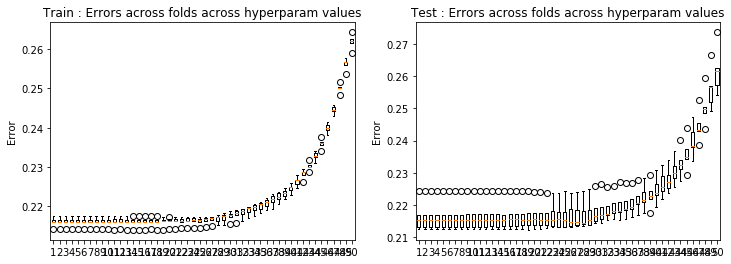

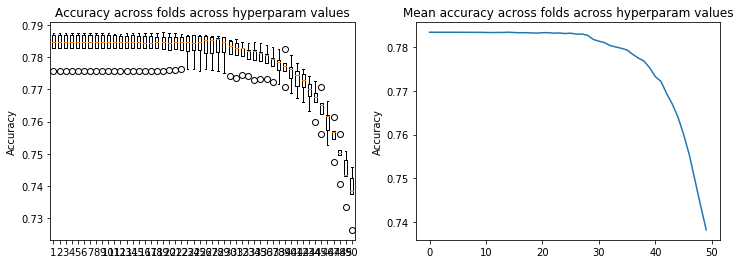

In [61]:
result_crossval(loss_tr39,loss_te39)
result_crossval_accuracy(acc39)

In [32]:
# test 40: degree 4, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr40, loss_te40, w40, acc40 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 4, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -5.01998765e+00  3.12660067e-01 -9.11626196e-01
  1.34847115e+00  2.01186606e-01  2.79923299e-01  1.16031240e+00
  3.05841233e-02  9.58635685e-01 -1.96779194e-03 -2.27385264e-03
 -1.17990340e-01  2.32745198e-03  1.46944513e-02  2.63713357e-01
  3.29597539e-03 -1.13578250e-01 -6.99678940e-03 -1.22761955e-03
  1.81906768e+01 -1.31172535e+00  2.82196280e+00 -1.42367911e+00
 -3.99523413e-01 -4.92766207e-02 -2.10195711e+00  9.39973229e-02
 -9.03654302e-01 -2.58378161e-02 -2.44522189e-02 -2.14321363e-02
 -7.21539218e-02  5.93938130e-04 -6.91520631e-01 -5.73546434e-03
  4.56959903e-01  1.96235981e-01 -1.26014716e-02 -2.15495169e+01
  1.07604669e+00 -4.21443681e+00 -2.59204276e-01  3.08615741e-01
 -1.97280652e-01  1.83971338e+00  3.77383673e-02  3.23933325e-01
  4.42705934e-03  2.1278

Ridge regression: w=[-2.78727907e-01 -4.99119910e+00  2.83944477e-01 -9.80052703e-01
  1.40435056e+00  1.95994685e-01  4.68105766e-01  1.01982798e+00
  1.94167742e-02  9.93864337e-01 -5.90538657e-04  2.70711571e-03
  2.72585406e-01 -1.53781502e-03  7.06497265e-03  2.50675284e-01
  7.61329555e-03 -1.78140061e-01 -2.52585944e-03 -2.99122097e-03
  1.81768016e+01 -1.15935854e+00  2.99204660e+00 -1.53937114e+00
 -4.03080806e-01 -5.76855969e-01 -1.69903003e+00  7.96095626e-02
 -1.01370683e+00 -2.53648640e-02 -1.07190176e-02 -1.17225880e+00
 -7.05035046e-02  9.83213808e-03 -6.29249330e-01  5.82191658e-03
  7.44750947e-01  1.88917789e-01  2.64060065e-03 -2.16220276e+01
  8.13132684e-01 -4.33589644e+00 -2.02180783e-01  3.43077577e-01
  3.50370278e-01  1.42378059e+00  4.50968908e-02  3.87248503e-01
  3.23580997e-03 -4.34945827e-03  1.11211073e+00 -1.62586762e-03
 -8.29715257e-03  5.04428306e-01 -1.86572377e-03 -1.01586939e+00
  2.31135870e-03  5.84197405e-04  8.53336200e+00 -8.99653593e-02
  2.1

Ridge regression: w=[-2.76819776e-01 -5.01732735e+00  2.67784001e-01 -8.99961368e-01
  1.39968914e+00  1.69940273e-01  4.25192300e-01  1.14244829e+00
  1.85296032e-02  8.94707494e-01 -5.31764672e-03 -7.02226189e-05
  1.61553412e-01  3.08233138e-03  1.52164902e-02  2.33237862e-01
  9.46899758e-03 -2.30532734e-01 -9.32497439e-03  3.82550779e-03
  1.82343365e+01 -1.09113888e+00  2.85040952e+00 -1.62912257e+00
 -2.85218836e-01 -4.74618110e-01 -2.14471388e+00  9.35955173e-02
 -8.22710637e-01 -2.07682047e-02 -1.38681521e-02 -8.19087499e-01
 -6.79921918e-02  4.09664830e-03 -5.36238584e-01  2.19274404e-03
  9.22768878e-01  1.93576756e-01  2.90781492e-03 -2.16320244e+01
  7.18923025e-01 -4.26752224e+00 -6.91980146e-02  1.76401515e-01
  2.52517054e-01  1.96267905e+00  4.69563980e-02  2.70830702e-01
  8.60734405e-03  1.15549049e-03  7.37045089e-01 -8.69434856e-03
 -1.59481182e-02  3.42829072e-01 -3.96938287e-03 -1.19820838e+00
  9.95836760e-03 -3.66105989e-03  8.51343983e+00 -4.80498867e-02
  2.1

Ridge regression: w=[-2.75017643e-01 -5.00886990e+00  2.68061253e-01 -9.18640394e-01
  1.43741607e+00  1.87693072e-01  5.33416793e-01  1.38335844e+00
  9.06233627e-03  9.96609172e-01 -5.68411684e-03 -3.03644133e-03
 -1.77460106e-01  8.12017010e-04  8.92474676e-03  2.59567076e-01
  1.46726489e-03 -1.13855677e-01 -7.63280450e-03  2.18022178e-03
  1.82085716e+01 -1.11918933e+00  2.95246650e+00 -1.81839856e+00
 -4.00032930e-01 -7.31588081e-01 -2.32743704e+00  9.70197525e-02
 -7.52432144e-01 -2.95643220e-02 -1.23843401e-02 -1.76637893e-01
 -6.70284434e-02  1.63339710e-02 -6.35113727e-01  9.41152297e-03
  4.88051081e-01  1.94126527e-01  1.91751946e-03 -2.16171331e+01
  7.82583199e-01 -4.41287627e+00  2.01917054e-01  3.82849886e-01
  4.60250334e-01  1.88414531e+00  5.44110506e-02  6.93899399e-02
  6.43207884e-03  1.69179500e-03  2.31166918e-01 -3.61295335e-03
 -1.05092811e-02  4.68113023e-01  1.69518631e-03 -6.47492599e-01
  6.02674665e-03 -6.31203699e-03  8.51589554e+00 -8.58577223e-02
  2.1

Ridge regression: w=[-2.78869221e-01 -5.02626912e+00  2.55237041e-01 -1.03137623e+00
  1.49630276e+00  1.59360318e-01  2.15405530e-01  1.09528344e+00
  1.80384193e-02  1.04221301e+00 -3.41166049e-03  2.48802792e-03
 -6.51535130e-02 -2.34683883e-03  1.49509629e-02  2.45288646e-01
  2.08573664e-03 -2.61237493e-01 -7.31928219e-03  4.74326262e-03
  1.82299324e+01 -1.07005370e+00  3.19597838e+00 -1.81969959e+00
 -2.63201198e-01  2.13045052e-01 -1.96487955e+00  9.20608153e-02
 -1.20164425e+00 -2.37094253e-02 -1.38782626e-02 -1.97894636e-01
 -7.54702340e-02  9.74905943e-04 -6.00749620e-01 -3.27149147e-03
  9.80258436e-01  1.90615964e-01 -1.00724523e-03 -2.16009271e+01
  7.22131683e-01 -4.60453087e+00  8.68481057e-02  1.57807962e-01
 -5.24920218e-01  1.72350844e+00  4.95852022e-02  6.25565983e-01
  4.97024594e-03 -3.68493554e-03  1.51058571e-01 -1.70771357e-03
 -1.72061933e-02  4.61927476e-01  1.64039467e-03 -1.24237434e+00
  6.11159188e-03 -6.22766384e-03  8.49823699e+00 -6.05847005e-02
  2.2

Ridge regression: w=[-2.76431019e-01 -4.97402913e+00  3.11375072e-01 -9.23482042e-01
  1.32487748e+00  2.00898478e-01  2.79145596e-01  1.07955318e+00
  3.04470238e-02  9.04894921e-01 -1.96640819e-03 -2.27118230e-03
 -7.33610979e-02  2.32102710e-03  1.46945804e-02  2.63218552e-01
  3.29090113e-03 -1.11276025e-01 -6.98621755e-03 -1.22343935e-03
  1.80341913e+01 -1.30718819e+00  2.86727032e+00 -1.35935132e+00
 -3.98512270e-01 -4.69901711e-02 -1.95368965e+00  9.41420610e-02
 -8.18399973e-01 -2.58027037e-02 -2.44136735e-02 -9.06530548e-02
 -7.21736978e-02  6.17631486e-04 -6.88112023e-01 -5.74235057e-03
  4.49561949e-01  1.96329516e-01 -1.25761153e-02 -2.13634135e+01
  1.07025968e+00 -4.26981623e+00 -3.21264369e-01  3.07276625e-01
 -1.99471192e-01  1.70937100e+00  3.79624870e-02  2.58217864e-01
  4.43152110e-03  2.11984212e-03 -1.85134330e-02 -7.65333036e-03
 -1.41704495e-02  5.79796051e-01  4.24317656e-04 -5.81872447e-01
  2.50799631e-03 -7.39478647e-04  8.40219462e+00 -2.27527197e-01
  2.1

Ridge regression: w=[-2.78727802e-01 -4.92533508e+00  2.82190090e-01 -9.94402630e-01
  1.36686515e+00  1.95505859e-01  4.59047750e-01  9.45091776e-01
  1.92480389e-02  9.41113347e-01 -6.04880098e-04  2.71255739e-03
  2.94577491e-01 -1.53986465e-03  7.08125272e-03  2.49930763e-01
  7.61082177e-03 -1.72116164e-01 -2.51209251e-03 -2.97883176e-03
  1.79518112e+01 -1.15294584e+00  3.04911825e+00 -1.43671210e+00
 -4.01361657e-01 -5.49938610e-01 -1.56019229e+00  7.98417738e-02
 -9.23990401e-01 -2.53293162e-02 -1.06893972e-02 -1.17905147e+00
 -7.05586166e-02  9.88266114e-03 -6.24197134e-01  5.79985907e-03
  7.25504550e-01  1.89056341e-01  2.65669143e-03 -2.13533957e+01
  8.04768150e-01 -4.40672955e+00 -3.01878850e-01  3.40786416e-01
  3.22398533e-01  1.30041822e+00  4.53780046e-02  3.13794084e-01
  3.25895660e-03 -4.35915448e-03  1.09936033e+00 -1.62390266e-03
 -8.31138484e-03  4.97766271e-01 -1.85412177e-03 -9.94340296e-01
  2.29454829e-03  5.68788574e-04  8.42396415e+00 -8.64943327e-02
  2.1

Ridge regression: w=[-2.76819625e-01 -4.92084024e+00  2.65375238e-01 -9.23333455e-01
  1.34608943e+00  1.69627043e-01  4.11319551e-01  1.00541828e+00
  1.83021354e-02  8.04041635e-01 -5.34453762e-03 -1.12060773e-05
  2.16841252e-01  3.09083076e-03  1.52718952e-02  2.32367949e-01
  9.50334852e-03 -2.20584852e-01 -9.29639440e-03  3.91145896e-03
  1.79053608e+01 -1.08272126e+00  2.94147859e+00 -1.48224226e+00
 -2.84118023e-01 -4.33796745e-01 -1.89097351e+00  9.38931303e-02
 -6.77058946e-01 -2.06810982e-02 -1.38192423e-02 -8.75587522e-01
 -6.80442780e-02  4.11558730e-03 -5.29464700e-01  2.19264256e-03
  8.90938530e-01  1.93783064e-01  2.95611640e-03 -2.12403730e+01
  7.08230521e-01 -4.37977212e+00 -2.11699712e-01  1.74863834e-01
  2.10382019e-01  1.73813520e+00  4.73517041e-02  1.56703984e-01
  8.64744772e-03  1.09766215e-03  7.59602380e-01 -8.69495164e-03
 -1.59921936e-02  3.33747337e-01 -3.98584016e-03 -1.16263629e+00
  9.93247995e-03 -3.73320602e-03  8.35440701e+00 -4.37451246e-02
  2.1

Ridge regression: w=[-2.75017324e-01 -4.81060139e+00  2.62844092e-01 -9.57105967e-01
  1.32303301e+00  1.86439375e-01  4.93359350e-01  1.09886829e+00
  8.59366403e-03  8.15537217e-01 -5.71221854e-03 -3.05566163e-03
 -3.81165515e-02  7.94500900e-04  9.02302979e-03  2.57234211e-01
  1.51035325e-03 -1.00561899e-01 -7.60066322e-03  2.26215142e-03
  1.75312042e+01 -1.10061724e+00  3.11147842e+00 -1.50537669e+00
 -3.95624079e-01 -6.13655418e-01 -1.80215478e+00  9.76016277e-02
 -4.73383809e-01 -2.93517225e-02 -1.22188753e-02 -3.67661637e-01
 -6.71923618e-02  1.64440666e-02 -6.19650790e-01  9.37486206e-03
  4.46166458e-01  1.94534821e-01  2.06730185e-03 -2.08089292e+01
  7.58928978e-01 -4.61343380e+00 -1.01879585e-01  3.76759401e-01
  3.38575014e-01  1.42154111e+00  5.52584888e-02 -1.41316343e-01
  6.49484497e-03  1.69913675e-03  3.55524376e-01 -3.60560012e-03
 -1.06082587e-02  4.47633366e-01  1.67751542e-03 -6.00968880e-01
  5.98455625e-03 -6.36841641e-03  8.18695794e+00 -7.62334788e-02
  2.2

Ridge regression: w=[-2.78868750e-01 -4.74344738e+00  2.47401953e-01 -1.08285106e+00
  1.33104720e+00  1.58358770e-01  2.34776981e-01  7.56446967e-01
  1.74289329e-02  8.01731015e-01 -3.49855068e-03  2.60392459e-03
  9.67344354e-02 -2.38816947e-03  1.50900257e-02  2.42329075e-01
  2.10847656e-03 -2.33536039e-01 -7.23560285e-03  4.84282674e-03
  1.72666192e+01 -1.04175480e+00  3.41102631e+00 -1.37188933e+00
 -2.59030283e-01  1.57689015e-01 -1.34081597e+00  9.30543773e-02
 -8.00104957e-01 -2.34230780e-02 -1.36240477e-02 -4.16746070e-01
 -7.56172083e-02  1.09411904e-03 -5.80335417e-01 -3.34182154e-03
  8.90787783e-01  1.91220513e-01 -7.89206152e-04 -2.04536356e+01
  6.85508473e-01 -4.87541481e+00 -3.43756863e-01  1.51274505e-01
 -4.68418715e-01  1.17245354e+00  5.07113332e-02  3.03453851e-01
  5.09424819e-03 -3.81935509e-03  2.94725117e-01 -1.65110403e-03
 -1.73174496e-02  4.35243695e-01  1.64391876e-03 -1.14138165e+00
  6.05040727e-03 -6.31282472e-03  8.03175298e+00 -4.54964541e-02
  2.3

Ridge regression: w=[-2.76430028e-01 -4.42909391e+00  2.95909691e-01 -1.03050032e+00
  1.05430352e+00  1.97262195e-01  2.79402774e-01  6.07745323e-01
  2.90959040e-02  5.99717342e-01 -1.93854629e-03 -2.27725334e-03
  1.44372501e-01  2.23483559e-03  1.46962153e-02  2.56250336e-01
  3.19877430e-03 -8.57799772e-02 -6.84353837e-03 -1.19746814e-03
  1.61802184e+01 -1.25135989e+00  3.29734348e+00 -6.47936211e-01
 -3.85837579e-01 -4.85408510e-02 -1.07346368e+00  9.57111834e-02
 -3.35013991e-01 -2.53993155e-02 -2.39042514e-02 -3.76757950e-01
 -7.23870769e-02  9.84092980e-04 -6.44198155e-01 -5.86244509e-03
  3.68680402e-01  1.97453491e-01 -1.22116759e-02 -1.91587285e+01
  9.97909906e-01 -4.80201871e+00 -9.84061390e-01  2.90478126e-01
 -1.97110330e-01  9.26857186e-01  4.04282967e-02 -1.13045876e-01
  4.49042925e-03  2.06170129e-03  1.60530619e-01 -7.60976881e-03
 -1.42166131e-02  5.22704906e-01  5.70549277e-04 -4.91289553e-01
  2.42709519e-03 -8.08866329e-04  7.50693911e+00 -1.97510381e-01
  2.3

Ridge regression: w=[-2.78726348e-01 -4.18947448e+00  2.62675049e-01 -1.10267000e+00
  9.79025637e-01  1.89584181e-01  3.95254799e-01  5.64685795e-01
  1.78106475e-02  6.72923143e-01 -7.30206119e-04  2.70096003e-03
  3.10635669e-01 -1.55778952e-03  7.23786316e-03  2.40271139e-01
  7.55888729e-03 -1.11665443e-01 -2.36780570e-03 -2.91666473e-03
  1.54400570e+01 -1.07983472e+00  3.51967157e+00 -4.26623661e-01
 -3.80591306e-01 -3.59090857e-01 -8.33400757e-01  8.23462222e-02
 -4.51198985e-01 -2.49463998e-02 -1.03317699e-02 -9.41506888e-01
 -7.12230177e-02  1.05186491e-02 -5.64074789e-01  5.51211513e-03
  5.33639266e-01  1.90741092e-01  2.96098641e-03 -1.83540745e+01
  7.07710537e-01 -5.00288778e+00 -1.23669452e+00  3.13046653e-01
  1.20649924e-01  6.41401470e-01  4.82361432e-02 -8.26409582e-02
  3.50144614e-03 -4.40532638e-03  7.52199843e-01 -1.62032345e-03
 -8.46526748e-03  4.19453249e-01 -1.71727943e-03 -7.80526360e-01
  2.11632167e-03  4.73105761e-04  7.20190664e+00 -4.57661695e-02
  2.3

Ridge regression: w=[-2.76817521e-01 -3.93218747e+00  2.40225851e-01 -1.05856480e+00
  8.43481465e-01  1.66120356e-01  3.37679559e-01  4.66559601e-01
  1.67815255e-02  4.74289337e-01 -5.54990627e-03  4.83752984e-04
  3.05362696e-01  3.18054993e-03  1.58310709e-02  2.21034847e-01
  9.80002512e-03 -1.29875174e-01 -9.03374321e-03  4.74979719e-03
  1.45378347e+01 -9.91385652e-01  3.54361691e+00 -1.99786421e-01
 -2.71499408e-01 -2.16496459e-01 -8.55182924e-01  9.67519648e-02
 -1.52265971e-01 -1.98574126e-02 -1.32348216e-02 -7.38599655e-01
 -6.86241658e-02  4.43944452e-03 -4.53633667e-01  2.12109179e-03
  6.01987125e-01  1.96138455e-01  3.56841747e-03 -1.72302364e+01
  5.88908161e-01 -5.14624891e+00 -1.37193804e+00  1.56779031e-01
 -1.85399655e-02  7.98139344e-01  5.08489516e-02 -2.51801746e-01
  9.04401162e-03  6.18173010e-04  4.76463122e-01 -8.77515627e-03
 -1.64873520e-02  2.34292509e-01 -4.12987945e-03 -8.40443772e-01
  9.68731064e-03 -4.43068084e-03  6.72487383e+00  5.30737294e-03
  2.4

Ridge regression: w=[-2.75012891e-01 -3.19887863e+00  2.20262339e-01 -9.96884469e-01
  5.45372271e-01  1.72963494e-01  3.67898845e-01  4.77748001e-01
  6.73949758e-03  4.84362716e-01 -5.73246867e-03 -3.39042596e-03
  1.10168424e-01  6.52909679e-04  9.77961102e-03  2.32887663e-01
  1.75646981e-03 -2.05331210e-02 -7.35087885e-03  2.82425165e-03
  1.20381648e+01 -9.40600117e-01  3.53269207e+00  3.56397723e-01
 -3.48421583e-01 -2.39958382e-01 -5.99746793e-01  1.02005182e-01
 -1.74940880e-02 -2.77419321e-02 -1.07641740e-02 -3.66544845e-01
 -6.85285223e-02  1.76571006e-02 -4.79849628e-01  8.90581229e-03
  1.99613946e-01  1.98552294e-01  3.82778975e-03 -1.42544839e+01
  5.46280212e-01 -5.22941218e+00 -1.67472647e+00  3.12076460e-01
 -6.05092573e-02  3.29591208e-01  6.08139178e-02 -4.43923908e-01
  6.93825716e-03  1.91797714e-03  2.01347313e-01 -3.61875702e-03
 -1.14127882e-02  2.66558036e-01  1.61272975e-03 -3.30137847e-01
  5.64034208e-03 -6.64666811e-03  5.51648334e+00  1.28735644e-02
  2.5

Ridge regression: w=[-2.78862204e-01 -2.78455816e+00  1.92754985e-01 -1.01185771e+00
  4.25558819e-01  1.49404452e-01  3.12248351e-01  2.54643651e-01
  1.66722800e-02  4.47860279e-01 -3.95249492e-03  3.35156804e-03
  1.75201958e-01 -2.55302056e-03  1.62483636e-02  2.14216668e-01
  2.28596403e-03 -7.22365663e-02 -6.80296214e-03  5.61510186e-03
  1.06084790e+01 -8.33926563e-01  3.54959309e+00  6.49752783e-01
 -2.22728080e-01 -4.68889034e-02 -3.48159559e-01  9.91833238e-02
 -1.76953203e-01 -2.17056805e-02 -1.13783316e-02 -3.30493696e-01
 -7.67755911e-02  2.55738752e-03 -4.19783069e-01 -3.93131863e-03
  3.76402924e-01  1.96373646e-01  1.69240079e-03 -1.25179948e+01
  4.06553789e-01 -5.19171240e+00 -1.90331919e+00  9.51834124e-02
 -2.91709468e-01  2.49592753e-01  5.61589533e-02 -2.04438025e-01
  5.91358966e-03 -4.67776272e-03  1.07476041e-01 -1.44977746e-03
 -1.82975551e-02  2.30170645e-01  1.59017363e-03 -5.65312832e-01
  5.66818282e-03 -6.77892045e-03  4.79904685e+00  7.21286649e-02
  2.4

Ridge regression: w=[-2.76416265e-01 -1.86118337e+00  2.07236714e-01 -6.93538392e-01
  1.24342368e-01  1.70075118e-01  3.02625837e-01  2.15620771e-01
  2.70278052e-02  3.97663148e-01 -1.22286390e-03 -1.96033170e-03
  1.64563177e-01  1.94369340e-03  1.55500228e-02  2.06374625e-01
  3.01104353e-03  5.85873694e-03 -6.08624642e-03 -4.15976954e-04
  7.47327067e+00 -9.07627720e-01  2.68735445e+00  9.96508880e-01
 -2.90921014e-01 -9.90945912e-02 -2.40211125e-01  1.01843629e-01
 -4.38327658e-02 -2.38124160e-02 -2.07420451e-02 -2.40849855e-01
 -7.28025835e-02  3.62548123e-03 -3.92135254e-01 -7.11158583e-03
  9.19930381e-02  2.04479888e-01 -9.28505570e-03 -8.79404893e+00
  5.31756547e-01 -4.28192308e+00 -1.78397699e+00  1.62846854e-01
 -1.89524217e-01  1.24304853e-01  4.96647122e-02 -2.90183707e-01
  4.48970396e-03  1.43583160e-03 -3.68572568e-02 -7.70804471e-03
 -1.53058086e-02  2.05158043e-01  8.90800016e-04 -1.89999685e-01
  1.89182420e-03 -1.47251745e-03  3.28658575e+00  2.66878202e-03
  2.1

Ridge regression: w=[-2.78706137e-01 -1.42431243e+00  1.79401740e-01 -5.40317967e-01
  4.15153217e-02  1.52965652e-01  3.43946668e-01  2.55922134e-01
  1.80586553e-02  4.76694230e-01 -4.95911272e-04  2.49698632e-03
  1.35860365e-01 -1.61441140e-03  8.27514713e-03  1.89181630e-01
  7.32671640e-03  4.33117101e-02 -1.82498859e-03 -2.50000891e-03
  6.03190705e+00 -7.44742017e-01  2.23376621e+00  9.88435471e-01
 -2.53287857e-01 -1.70505334e-01 -1.76850010e-01  9.06762642e-02
 -1.28228654e-01 -2.37614644e-02 -8.96338840e-03 -2.88595689e-01
 -7.41264793e-02  1.30946150e-02 -3.05919427e-01  3.80539196e-03
  5.75656174e-02  1.99823475e-01  6.15199594e-03 -7.10305033e+00
  2.42561003e-01 -3.71705467e+00 -1.60120689e+00  1.43293085e-01
 -1.45397827e-01  6.26218858e-03  5.57158336e-02 -3.01904190e-01
  3.89395605e-03 -4.59387411e-03  4.37003665e-02 -1.82759612e-03
 -9.59602321e-03  9.51831274e-02 -1.25898002e-03 -2.59067535e-01
  1.47222297e-03  1.32422885e-04  2.60243330e+00  1.55229119e-01
  1.8

Ridge regression: w=[-2.76788290e-01 -1.04736293e+00  1.52070264e-01 -3.07989619e-01
 -5.46645012e-02  1.44959155e-01  3.19157635e-01  1.52728394e-01
  1.82442870e-02  3.64211370e-01 -5.01667558e-03  1.83765678e-03
  1.75917404e-01  3.31276555e-03  1.85395530e-02  1.79511134e-01
  1.08812730e-02  4.38182221e-02 -8.47494178e-03  8.06431062e-03
  4.75118908e+00 -6.48711147e-01  1.67640411e+00  9.04755636e-01
 -1.93739423e-01 -1.29594775e-01 -1.37563372e-01  1.03772379e-01
 -4.51408566e-02 -1.80029696e-02 -1.10174638e-02 -2.51065010e-01
 -7.02619117e-02  5.47764670e-03 -2.29941382e-01  1.28549257e-03
  5.70025838e-02  2.06220599e-01  6.77826701e-03 -5.56115150e+00
  1.21785799e-01 -3.18883976e+00 -1.24903628e+00  4.52402751e-02
 -1.82679519e-01  8.27871632e-02  5.74687324e-02 -2.60800346e-01
  9.68186950e-03 -6.36819920e-04 -4.96155746e-02 -9.57068243e-03
 -1.91472559e-02 -4.25809324e-02 -4.71371155e-03 -2.36489689e-01
  9.18011061e-03 -6.98788868e-03  1.96764955e+00  2.03392624e-01
  1.6

Ridge regression: w=[-2.74951306e-01 -4.33638770e-01  1.20746973e-01  1.16083580e-02
 -1.02034601e-01  1.22588504e-01  3.42611392e-01  1.94777362e-01
  7.56904625e-03  3.93344618e-01 -4.81298322e-03 -4.21524314e-03
  9.56682323e-02  5.71196619e-04  1.13954497e-02  1.78638436e-01
  2.25259203e-03  6.01867584e-02 -6.97375325e-03  3.95002429e-03
  2.69187639e+00 -5.56113269e-01  7.07518375e-01  6.54222339e-01
 -1.72582228e-01 -1.56031659e-01 -9.60338003e-02  1.05377007e-01
 -5.53990791e-02 -2.55850062e-02 -7.53338783e-03 -1.53513314e-01
 -7.07546984e-02  2.05923722e-02 -2.29188168e-01  7.65265411e-03
 -2.34597964e-02  2.08410192e-01  8.96712644e-03 -3.11708495e+00
  2.70304476e-02 -2.06689853e+00 -6.67811228e-01  7.71756966e-02
 -2.00393548e-01 -8.44750100e-02  6.85437348e-02 -2.44219675e-01
  7.21944125e-03  2.41840381e-03 -5.86436308e-02 -4.04345863e-03
 -1.31620856e-02 -4.10068049e-02  1.38820163e-03 -9.92544994e-02
  5.01630716e-03 -6.91086047e-03  9.70323767e-01  2.34430508e-01
  1.2

Ridge regression: w=[-2.78771269e-01 -2.36307540e-01  9.99678321e-02  6.05556406e-02
 -8.32406863e-02  1.25640487e-01  3.50358622e-01  8.95616419e-02
  1.95615787e-02  3.56542466e-01 -4.08592924e-03  4.78325595e-03
  1.30335279e-01 -2.44899855e-03  1.86142305e-02  1.64037223e-01
  2.49953552e-03  5.64445915e-02 -6.62674021e-03  7.53095215e-03
  2.01881156e+00 -4.83660197e-01  4.41875710e-01  5.48956604e-01
 -1.36876814e-01 -1.54704657e-01 -3.18637006e-02  1.01493529e-01
 -8.64946459e-02 -2.06451595e-02 -7.06124246e-03 -1.39188898e-01
 -7.84477410e-02  5.62474728e-03 -1.96613354e-01 -5.01581739e-03
 -1.80564837e-02  2.05378204e-01  7.50347227e-03 -2.29618177e+00
 -5.80238511e-02 -1.64916026e+00 -4.85675134e-01 -2.44733487e-02
 -2.26895920e-01 -2.90653833e-02  6.16643986e-02 -1.81840685e-01
  6.78205339e-03 -6.08574550e-03 -7.94218297e-02 -1.66802352e-03
 -2.02725526e-02 -3.90668415e-02  1.61841273e-03 -1.30982861e-01
  5.32362382e-03 -7.79759434e-03  6.27498081e-01  2.66669574e-01
  1.0

Ridge regression: w=[-2.76225164e-01  5.71329971e-02  7.82377509e-02  1.40746848e-01
 -4.50695241e-02  1.24111257e-01  2.83441179e-01  6.22280143e-02
  2.21889067e-02  3.37110157e-01  4.66620785e-05 -8.81832749e-04
  1.59245316e-01  1.93975285e-03  1.70099744e-02  1.48449874e-01
  2.88763138e-03  5.40763802e-02 -5.47492572e-03  8.86006152e-04
  1.06261779e+00 -4.48615552e-01  5.33960335e-03  3.76920866e-01
 -1.41464677e-01 -1.04666040e-01 -9.67956105e-03  9.41472632e-02
 -4.83950103e-02 -2.40178379e-02 -1.77287541e-02 -1.40106959e-01
 -7.26787369e-02  6.20384409e-03 -1.73693141e-01 -8.24608124e-03
 -3.22912375e-02  2.10162935e-01 -5.44474466e-03 -1.21768546e+00
 -4.67465120e-02 -1.00191539e+00 -2.10312494e-01 -2.16523184e-02
 -1.56508157e-01 -2.18568733e-02  6.13086699e-02 -1.55459690e-01
  4.05951773e-03  2.68969816e-04 -1.20329383e-01 -8.24611379e-03
 -1.69051874e-02 -4.62438059e-02  1.00380111e-03 -6.44029769e-02
  1.36209343e-03 -2.34589066e-03  2.09753656e-01  2.41600109e-01
  7.1

Ridge regression: w=[-2.78425619e-01  1.46447884e-01  8.06409279e-02  1.36236729e-01
 -1.30065603e-02  1.08384673e-01  2.90491196e-01  5.65053350e-02
  1.41525276e-02  3.40247615e-01  3.04553619e-04  2.61617235e-03
  1.45178400e-01 -1.45525287e-03  9.33381288e-03  1.44817997e-01
  6.51565111e-03  8.44942656e-02 -1.52790507e-03 -2.07896232e-03
  7.79736459e-01 -4.27540074e-01 -8.04247196e-02  2.87163865e-01
 -1.12579921e-01 -1.03200130e-01  1.16335983e-02  8.16746830e-02
 -6.68025960e-02 -2.44875872e-02 -8.29506733e-03 -1.35029783e-01
 -7.59270031e-02  1.42099763e-02 -1.55826490e-01  3.05721247e-03
 -7.46934442e-02  2.04688111e-01  9.43340842e-03 -8.90526469e-01
 -1.20885734e-01 -7.69899244e-01 -1.51152667e-01 -2.33439821e-02
 -1.49295653e-01 -2.52995677e-02  6.52057509e-02 -1.56678229e-01
  3.55662645e-03 -4.91947475e-03 -1.06646342e-01 -2.30239453e-03
 -1.06534218e-02 -6.35967835e-02 -4.85771427e-04 -9.49305553e-02
  1.01099655e-03 -1.66400005e-04  7.77026378e-02  2.91114523e-01
  5.7

Ridge regression: w=[-2.75795995e-01  2.61659200e-01  2.80603575e-02  1.04606927e-01
  5.65585964e-02  1.06256879e-01  2.30074742e-01  1.14198149e-02
  1.82286757e-02  2.86656070e-01  3.78500066e-04 -6.47512250e-04
  1.45767085e-01  1.84289047e-03  1.67033981e-02  1.24824785e-01
  2.54828689e-03  5.33084242e-02 -5.30436198e-03  7.62679647e-04
  4.08202669e-01 -3.44429526e-01 -1.90267975e-01  1.80437037e-01
 -1.04039985e-01 -5.13697997e-02  1.51285101e-02  8.21224015e-02
 -1.26813261e-02 -2.44649133e-02 -1.71375295e-02 -9.08516580e-02
 -7.18005301e-02  6.21723163e-03 -1.33215094e-01 -8.04155094e-03
 -3.38602206e-02  2.08142416e-01 -4.66061134e-03 -4.93155016e-01
 -9.98280413e-02 -4.72948656e-01 -6.53690300e-02 -4.00080957e-02
 -1.04908513e-01 -3.71935984e-04  6.66982578e-02 -1.06504006e-01
  3.86995958e-03  1.00990545e-04 -1.01019727e-01 -8.32466013e-03
 -1.66642840e-02 -5.96011521e-02  1.26604510e-03 -4.93123652e-02
  1.20486463e-03 -2.21021887e-03 -6.65538172e-02  2.37645285e-01
  3.9

Ridge regression: w=[-0.27793715  0.29190827  0.0117003   0.08583091  0.07959768  0.09862454
  0.23423319 -0.01153694  0.01471815  0.25761013 -0.00348858  0.00475954
  0.12558397 -0.00260718  0.01766058  0.12000265  0.00164296  0.05640003
 -0.0064264   0.00696264  0.31251501 -0.31359923 -0.18853557  0.13026205
 -0.08299278 -0.04528396  0.02097443  0.08022986 -0.01254025 -0.02134463
 -0.00614922 -0.05902285 -0.0769329   0.00546526 -0.12082311 -0.00435722
 -0.04418532  0.20263435  0.00837573 -0.37431813 -0.11954103 -0.3687516
 -0.05427831 -0.04465749 -0.10677752  0.00765774  0.06990177 -0.09110441
  0.00655763 -0.00613418 -0.07677974 -0.00168064 -0.01948938 -0.06241394
  0.00236744 -0.05797651  0.00499807 -0.00740455 -0.11851453  0.23952607
  0.31583703 -0.05499508  0.05975757  0.02331374 -0.01121158 -0.06810448
 -0.00230243 -0.01849986  0.00795181  0.02832127  0.01125276 -0.00233685
  0.08713001  0.00413976  0.03104752 -0.05758538 -0.00837984]
Ridge regression: w=[-2.75894530e-01  2.951

Ridge regression: w=[-2.74478739e-01  3.14974032e-01 -3.71114185e-02  3.28361184e-02
  1.18286359e-01  8.15757341e-02  1.76928319e-01 -1.79791817e-02
  1.90747873e-02  2.24608243e-01  7.27430211e-04 -9.87470263e-04
  1.09069807e-01  1.40607273e-03  1.52171172e-02  8.85144944e-02
  2.06525766e-03  4.31114500e-02 -5.08046747e-03 -2.57425209e-05
  1.76724478e-01 -2.45574838e-01 -1.70612156e-01  9.43227064e-02
 -6.53821217e-02  2.71830432e-03  1.48053437e-02  6.44067741e-02
  3.09251448e-02 -2.38146102e-02 -1.58770534e-02 -3.24957299e-02
 -6.83432922e-02  5.55910213e-03 -8.39252159e-02 -7.61466655e-03
 -1.97346232e-02  2.00565012e-01 -4.09051934e-03 -2.36380376e-01
 -8.25479540e-02 -2.23502898e-01 -3.25310586e-02 -3.43462231e-02
 -5.58741238e-02  1.04838477e-02  6.87957825e-02 -5.97036338e-02
  3.65312933e-03  3.66296249e-04 -6.09764216e-02 -8.09680275e-03
 -1.53481307e-02 -4.59542026e-02  1.62977477e-03 -3.39647870e-02
  1.02139363e-03 -1.60241770e-03 -1.53535985e-01  1.81199889e-01
  1.9

Ridge regression: w=[-0.27587019  0.31131098 -0.05008062  0.02366701  0.1165378   0.06745402
  0.1757719  -0.01980845  0.01543261  0.20003709  0.00068785  0.00202708
  0.08981624 -0.00135141  0.00813444  0.07778487  0.00489415  0.04392898
 -0.00145591 -0.00297955  0.14721864 -0.22954818 -0.14067055  0.07579238
 -0.04346603  0.01472266  0.0157856   0.04998162  0.03212673 -0.02371252
 -0.00739522 -0.02078816 -0.06969532  0.01110468 -0.06537331  0.00282502
 -0.02848679  0.19118613  0.00811196 -0.19072606 -0.08234984 -0.17367019
 -0.02897339 -0.02542486 -0.04957657  0.01009058  0.06977574 -0.04945255
  0.00325702 -0.00454576 -0.04693035 -0.00237725 -0.0095658  -0.03960399
  0.00077192 -0.03823021  0.00053497  0.00031696 -0.1686807   0.17408871
  0.1353338  -0.05783212  0.0311008  -0.03100575 -0.00819611 -0.03623179
 -0.04695344 -0.01853025  0.01126446 -0.00723402  0.00452964 -0.00724404
  0.04518756 -0.00079598  0.00748669 -0.04193123 -0.00187509]
Ridge regression: w=[-0.27601008  0.314998

Ridge regression: w=[-0.27048825  0.28761295 -0.09795306  0.01253374  0.12705352  0.0548131
  0.13925655 -0.0341803   0.03196304  0.17147315  0.00120764 -0.00196805
  0.0777307   0.00041908  0.01205035  0.05345621  0.00164674  0.03421002
 -0.00485131 -0.001303    0.10279192 -0.157462   -0.10609226  0.06681011
 -0.02832159  0.03242429  0.00289769  0.04529447  0.05217454 -0.02212171
 -0.01279729  0.00217206 -0.06047439  0.00425038 -0.03381784 -0.00665205
 -0.00527129  0.18085254 -0.00328795 -0.13371074 -0.04647215 -0.11761136
 -0.01866726 -0.02035825 -0.02641791  0.01126237  0.06202751 -0.02906066
  0.00338724  0.00101429 -0.03142287 -0.00741203 -0.01246053 -0.02385494
  0.00190413 -0.02233496  0.00090338 -0.0007092  -0.17142244  0.11116372
  0.06084874 -0.06419283  0.01951503 -0.03930603  0.00419821 -0.03024462
 -0.06534838 -0.01639475  0.00873709 -0.02689906 -0.00195409 -0.00346995
  0.02166357 -0.00182588 -0.01792606 -0.03336692 -0.00246537]
Ridge regression: w=[-2.69105205e-01  2.905

Ridge regression: w=[-2.70085929e-01  2.69225037e-01 -1.07105184e-01  2.24010293e-02
  1.15252859e-01  4.52216428e-02  1.37623255e-01 -3.36549842e-02
  3.32077613e-02  1.50162279e-01  9.41695568e-04  7.10664311e-04
  6.46156824e-02 -1.55156147e-03  6.07772863e-03  4.69810131e-02
  4.17588541e-03  3.10283739e-02 -1.55705760e-03 -3.62928529e-03
  9.27334034e-02 -1.44197617e-01 -7.97028781e-02  5.69878157e-02
 -1.41788948e-02  3.78019642e-02  1.13441941e-03  3.52205838e-02
  4.89016827e-02 -2.24315907e-02 -5.34083755e-03  5.96265436e-03
 -5.97788474e-02  7.61489148e-03 -2.00843362e-02  2.16944125e-03
 -8.40746407e-03  1.67137396e-01  5.98099935e-03 -1.12195747e-01
 -4.27891259e-02 -9.86884163e-02 -1.65049136e-02 -1.36363865e-02
 -2.39972009e-02  9.32853950e-03  5.95819169e-02 -2.21928606e-02
  3.07905100e-03 -3.54117039e-03 -2.36000161e-02 -2.12478377e-03
 -7.71210355e-03 -1.78358367e-02  1.23068118e-03 -2.26033632e-02
  4.22300631e-04  5.47965350e-04 -1.69202421e-01  9.96239719e-02
  2.1

Ridge regression: w=[-2.64494595e-01  2.48954312e-01 -1.19587856e-01  3.23607735e-02
  1.07991206e-01  4.50368171e-02  1.22103598e-01 -3.58237931e-02
  4.06744739e-02  1.38371326e-01 -1.03814957e-03 -1.47171658e-03
  6.03702448e-02  6.58899418e-05  9.91222769e-03  4.15911736e-02
  4.83374915e-03  3.20304759e-02 -6.20033155e-03  1.88145211e-03
  8.06963790e-02 -1.23318253e-01 -6.53430644e-02  5.23806410e-02
 -9.65927614e-03  3.87965584e-02 -1.89829706e-03  3.65584549e-02
  5.18492739e-02 -1.83938507e-02 -3.93125473e-03  1.06985581e-02
 -5.27107830e-02  2.97274894e-03 -1.33676397e-02  1.39476994e-04
 -2.60679613e-03  1.58706982e-01  3.74762562e-03 -9.66049369e-02
 -3.41609365e-02 -9.05587025e-02 -1.18204371e-02 -1.42085245e-02
 -1.77733867e-02  9.16792459e-03  5.56466234e-02 -1.47573705e-02
  7.41244656e-03  1.55791961e-03 -1.83959660e-02 -7.96785820e-03
 -1.16863449e-02 -1.30433297e-02  9.82143630e-04 -2.06186041e-02
  6.66117729e-03 -2.54219396e-03 -1.59374277e-01  8.04574839e-02
 -7.1

Ridge regression: w=[-2.53657829e-01  2.01275017e-01 -1.22881115e-01  4.68359621e-02
  9.85780158e-02  3.02947375e-02  1.04667434e-01 -3.93743254e-02
  5.20995089e-02  1.13891342e-01  1.23029497e-03 -7.94836307e-04
  4.66290022e-02 -1.76492637e-03  3.50624101e-03  3.16831398e-02
  3.80708931e-03  2.70899146e-02 -1.47784877e-03 -3.33204523e-03
  6.35847858e-02 -9.67510382e-02 -3.52173881e-02  4.60394760e-02
  6.34199435e-04  3.97911736e-02 -1.00539509e-02  2.76108879e-02
  4.88107199e-02 -2.22412729e-02 -2.48728869e-03  1.43697838e-02
 -4.78412911e-02  4.17811164e-03  3.19823684e-03  1.34765553e-03
  1.22594721e-03  1.29993179e-01  3.78375031e-03 -6.95539126e-02
 -2.63293249e-02 -7.26627156e-02 -8.29835871e-03 -5.66331482e-03
 -1.05315586e-02  5.25982108e-03  5.02857870e-02 -6.07845784e-03
  2.79789641e-03 -2.38758240e-03 -9.54011009e-03 -1.90711687e-03
 -5.20234514e-03 -4.43950542e-03  1.35231381e-03 -1.54088118e-02
  2.54079724e-04 -2.87386867e-05 -1.35951689e-01  5.00284425e-02
 -4.8

Ridge regression: w=[-2.41988637e-01  1.77253795e-01 -1.21278650e-01  5.11471494e-02
  9.08073635e-02  3.01315411e-02  9.16540899e-02 -3.85975943e-02
  5.61956309e-02  1.04496745e-01  4.46691815e-04 -1.99236247e-03
  4.28794387e-02 -1.76042028e-03  4.75440381e-03  2.72563717e-02
  3.53791899e-03  2.80496011e-02 -4.07335559e-03  1.37522446e-04
  5.50548792e-02 -8.66861281e-02 -2.78859693e-02  4.32001390e-02
  2.32929299e-03  3.72747413e-02 -1.16551194e-02  2.79984645e-02
  4.88101607e-02 -1.97108318e-02 -1.15579811e-03  1.57695699e-02
 -4.19859487e-02  1.91629794e-03  5.56344673e-03 -7.09217506e-04
  3.66680786e-03  1.18461565e-01  1.45409363e-03 -5.90662560e-02
 -2.48861124e-02 -6.93451059e-02 -4.34416677e-03 -6.18818567e-03
 -6.63823704e-03  3.79394421e-03  4.91739870e-02 -8.76386600e-05
  5.70615399e-03  1.42661046e-03 -5.64388558e-03 -6.29920196e-03
 -6.53255609e-03 -6.26189936e-04  1.98972700e-03 -1.44058689e-02
  4.53039005e-03 -1.36577886e-03 -1.20437118e-01  3.77676858e-02
 -6.0

Ridge regression: w=[-2.10695721e-01  1.30762324e-01 -1.04458446e-01  5.01778961e-02
  7.63816974e-02  2.09235917e-02  7.18862802e-02 -3.87710706e-02
  5.84814968e-02  8.50437220e-02  6.31969330e-05 -3.56298560e-03
  3.10267833e-02 -2.39276675e-03  1.76250513e-03  1.77505331e-02
  1.59201351e-03  2.61914884e-02 -2.77619192e-03 -1.17716085e-03
  4.06123590e-02 -7.08652822e-02 -1.60739721e-02  3.80649440e-02
  5.59712804e-03  3.30872202e-02 -1.72546341e-02  2.52613579e-02
  4.44559283e-02 -2.04146793e-02 -2.08475668e-03  1.52295710e-02
 -3.72705158e-02  3.19363493e-03  8.15017394e-03 -1.69595852e-05
  6.79828520e-03  9.44514938e-02 -1.27095029e-03 -4.06062520e-02
 -2.63336420e-02 -5.78688620e-02  1.80308295e-03 -2.09753331e-03
 -2.16925600e-04 -2.08102417e-03  4.87228267e-02  7.33380903e-03
  2.92663235e-03 -1.11633247e-04  1.35015155e-03 -2.24951923e-03
 -3.02731611e-03  4.08901515e-03  1.58451551e-03 -9.59825788e-03
  9.84741895e-04 -2.40907742e-03 -8.96490498e-02  1.44713274e-02
 -6.8

Ridge regression: w=[-1.93042637e-01  1.10485863e-01 -9.51875841e-02  4.50272364e-02
  6.75925715e-02  1.80645832e-02  6.18379246e-02 -3.51385595e-02
  6.03713726e-02  7.41998214e-02  5.48892050e-04 -2.14323853e-03
  2.55046011e-02 -3.17664298e-03  7.40329594e-04  1.56059155e-02
  1.10593579e-03  2.13707812e-02 -2.04883752e-03 -2.32395016e-04
  3.52589214e-02 -6.43658972e-02 -1.21913408e-02  3.41877725e-02
  4.92777136e-03  3.01612004e-02 -1.61924771e-02  2.50463945e-02
  4.14867973e-02 -2.08563066e-02 -7.29198822e-04  1.31814313e-02
 -3.66704639e-02  8.45679408e-04  8.41633204e-03 -3.28070367e-04
  6.16830539e-03  8.28701515e-02  5.23180858e-04 -3.22944584e-02
 -2.74680821e-02 -5.04388692e-02  2.55508264e-03 -1.34366022e-03
  2.63218486e-03 -2.45536652e-03  4.89470910e-02  1.14571321e-02
  2.75344716e-03 -1.60654051e-03  1.65152219e-03 -1.45917855e-03
 -3.26349832e-03  3.69495913e-03  1.37766076e-03 -6.79904709e-03
  1.12783076e-03 -1.69589475e-03 -7.47472597e-02  5.35747950e-03
 -6.4

Ridge regression: w=[-1.42272207e-01  7.17994215e-02 -7.36715853e-02  3.05784810e-02
  5.00991260e-02  1.15382044e-02  4.39797392e-02 -2.89602383e-02
  5.44338975e-02  5.54899131e-02  6.84446830e-04 -1.64978518e-03
  1.39660921e-02 -2.46353497e-03  1.15613597e-03  6.88241348e-03
  1.73792712e-03  1.75039844e-02 -1.76063961e-03 -7.28255743e-04
  2.38529450e-02 -5.28327528e-02 -9.32126289e-03  2.80335292e-02
  4.42391691e-03  2.56733338e-02 -1.54129933e-02  2.22657499e-02
  3.52804786e-02 -1.91213123e-02 -1.69666498e-03  7.79140383e-03
 -2.91154061e-02  7.84621985e-04  5.08208645e-03 -2.72847718e-03
  7.65820959e-03  6.41962790e-02 -1.19154926e-03 -1.84271247e-02
 -2.90788287e-02 -3.71344147e-02  7.08320119e-03  6.57928214e-04
  9.18212369e-03 -5.10314519e-03  4.57141654e-02  1.59267423e-02
  1.47878484e-03 -2.46572238e-04  1.94513326e-03 -3.14115478e-03
 -8.40715092e-04  3.61485499e-03  9.67641785e-04 -1.21640882e-03
 -5.60350665e-04 -7.75012809e-04 -4.59100064e-02 -8.55466519e-03
 -4.9

Ridge regression: w=[-1.17443301e-01  5.67294356e-02 -6.31723642e-02  2.47382811e-02
  4.00788573e-02  9.22589696e-03  3.74008223e-02 -2.50253694e-02
  4.84639948e-02  4.58954374e-02  6.77664046e-04 -1.72057122e-03
  9.71899980e-03 -1.36133794e-03  3.42499871e-04  4.10497206e-03
  2.38250174e-03  1.49101382e-02 -2.75132320e-04 -1.10529298e-03
  1.96649796e-02 -4.75428387e-02 -7.03298901e-03  2.29150418e-02
  4.50465102e-03  2.33771102e-02 -1.43530255e-02  2.12653453e-02
  3.09200994e-02 -1.89251529e-02  6.26370934e-05  5.54394543e-03
 -2.72100887e-02  2.48430746e-04  3.78547563e-03  6.16234791e-05
  7.49032573e-03  5.49025648e-02  9.84756951e-04 -1.27961685e-02
 -2.90156863e-02 -2.96582326e-02  6.75074010e-03  1.63646111e-03
  1.05822826e-02 -6.20523437e-03  4.14359175e-02  1.65814560e-02
  1.07354966e-03 -1.25582485e-03  1.53213203e-03 -1.41222875e-03
 -9.77357051e-04  3.35121544e-03  1.38144513e-03  8.75316177e-04
  4.64539678e-05 -9.06368852e-04 -3.41097682e-02 -1.26066737e-02
 -4.0

Ridge regression: w=[-9.22732627e-02  4.39822287e-02 -5.40675189e-02  1.91082009e-02
  3.19992109e-02  7.79367569e-03  3.10297558e-02 -2.20469874e-02
  4.28978596e-02  3.88502616e-02  3.47729323e-04 -1.02427044e-03
  6.34708305e-03 -1.99456847e-03  4.47584451e-04  1.95147763e-03
  1.93028225e-03  1.34942607e-02 -3.98473919e-04 -1.53333857e-04
  1.57427664e-02 -4.22065755e-02 -5.84859569e-03  1.90357243e-02
  3.73656187e-03  2.09444641e-02 -1.34510906e-02  1.99682535e-02
  2.79111759e-02 -1.55960391e-02  3.81127086e-04  3.50236783e-03
 -2.25179178e-02  1.67022721e-04  2.71373035e-03 -6.25045316e-04
  7.83975000e-03  4.50792180e-02 -4.92910750e-05 -8.89527892e-03
 -2.79657963e-02 -2.36991595e-02  6.80296531e-03  1.13153685e-03
  1.15967976e-02 -6.81299160e-03  3.71911584e-02  1.72051042e-02
  1.22471395e-03 -1.39957179e-04  8.09785759e-04 -2.50926364e-03
 -6.14687224e-04  3.29528007e-03  1.57987325e-03  2.67604392e-03
  8.26339085e-04 -5.31966485e-04 -2.52109865e-02 -1.51713023e-02
 -3.2

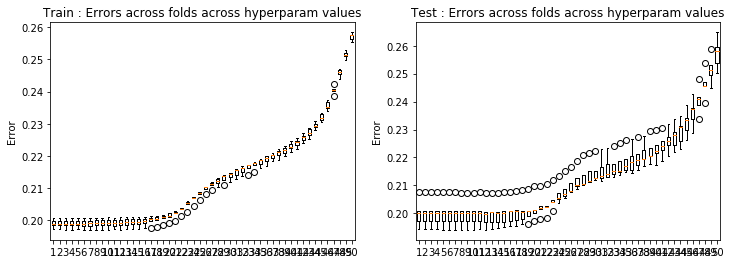

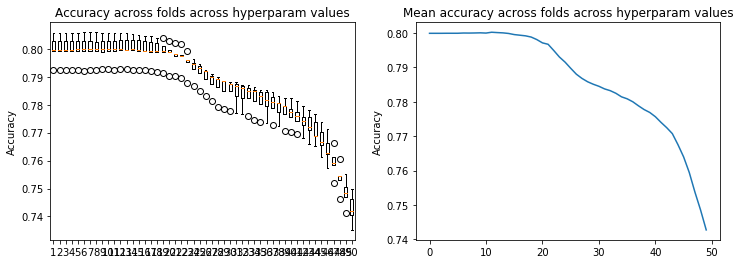

In [62]:
result_crossval(loss_tr40,loss_te40)
result_crossval_accuracy(acc40)

In [36]:
# test 41: degree 5, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr41, loss_te41, w41, acc41 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 5, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01 -5.69685279e+00  1.21732187e-01 -4.26815508e+00
  4.54623473e+00  3.20361271e-01 -4.52893822e+00  1.67300537e+00
 -5.50092912e-02  9.41112565e-01 -1.61248389e-02 -3.74430301e-03
 -8.32623770e-01 -4.08392750e-04  5.37732199e-03  7.95354505e-02
 -4.20990038e-04 -8.23285048e-01 -9.17978966e-03  1.54949549e-04
  2.17741463e+01 -6.82453325e-02  1.81733194e+01 -1.41625134e+01
 -1.14201670e+00  1.93737226e+01 -3.58281391e+00  9.02706789e-02
 -2.13983263e-01 -2.69719749e-02 -2.62431806e-02  2.55208105e+00
 -7.22412144e-02  1.84006293e-04  3.33022203e-01 -3.78473491e-03
  3.71022260e+00  1.93635150e-01 -1.16351160e-02 -2.90928208e+01
 -1.86039400e+00 -3.29242520e+01  1.98829898e+01  2.12790120e+00
 -3.14866716e+01  4.05540324e+00  3.02109281e-01 -1.31445720e+00
  4.76774800e-02  4.2598

Ridge regression: w=[-2.75017660e-01 -5.75996747e+00  8.99758069e-02 -4.46402978e+00
  4.47342262e+00  2.72338390e-01 -3.54691284e+00  2.68965276e+00
 -9.38585344e-02  2.55148289e+00 -1.26358183e-02 -1.45153176e-02
 -1.24609541e+00 -1.79018132e-03  3.23377490e-03 -1.86280601e-02
 -1.97197765e-04 -7.37288742e-01 -7.64677211e-03 -1.64001371e-02
  2.21098036e+01  8.65097304e-02  1.92170616e+01 -1.35565195e+01
 -9.26455889e-01  1.57434958e+01 -5.70749262e+00  9.27203079e-02
 -5.66640772e+00 -3.05488079e-02 -1.37364170e-02  2.89291298e+00
 -6.73146452e-02  1.63048512e-02  9.22699154e-01  1.06120873e-02
  3.37098218e+00  1.91875805e-01  3.46233275e-03 -2.97159986e+01
 -2.11822578e+00 -3.49667555e+01  1.82798921e+01  1.67370300e+00
 -2.60599278e+01  6.56705444e+00  3.72920245e-01  7.57408484e+00
  2.67929008e-02  3.43087183e-02 -4.14360237e+00  2.59265006e-03
  1.05662783e-03 -2.96013161e+00  2.33492460e-03 -5.87986261e+00
  5.76147000e-03  4.25624632e-02  1.61636392e+01  2.92860708e+00
  2.8

Ridge regression: w=[-2.78727903e-01 -5.74597369e+00  1.37818159e-01 -4.04095679e+00
  4.49063663e+00  3.06009117e-01 -3.41445336e+00  1.89003278e+00
 -8.71177024e-02  1.55922263e+00 -1.61174543e-02  3.50799779e-03
 -5.21851573e-01 -6.20311088e-03 -3.67889341e-04 -2.21798477e-02
  5.57202440e-03 -7.48105923e-01 -7.20282278e-03 -1.87407714e-04
  2.21622252e+01 -1.39075912e-01  1.69555474e+01 -1.38691687e+01
 -1.08901417e+00  1.51478215e+01 -4.10457154e+00  7.63523832e-02
 -2.36689517e+00 -2.62885411e-02 -1.18546477e-02  1.31771323e+00
 -7.15171360e-02  1.05234694e-02  8.99634104e-01  7.24982047e-03
  3.36226575e+00  1.86838245e-01  4.87418896e-03 -2.99571781e+01
 -1.67118171e+00 -3.04229703e+01  1.93548192e+01  2.02736821e+00
 -2.50298224e+01  4.92086542e+00  3.79793378e-01  2.05858196e+00
  5.06447507e-02 -7.77269717e-03 -2.62323247e+00  1.09650895e-02
  1.20335982e-02 -2.86788476e+00  2.87532076e-03 -5.75112930e+00
  1.50426823e-02 -1.21827808e-02  1.64300749e+01  2.50418120e+00
  2.4

Ridge regression: w=[-2.78869241e-01 -5.73657929e+00  1.03654018e-01 -4.15058286e+00
  4.20191945e+00  2.39978209e-01 -3.12900358e+00  2.35543002e+00
 -6.53643027e-02  1.16662587e+00 -7.87562450e-03 -1.02225801e-04
 -1.35455208e+00 -8.62233509e-03  3.93173739e-03  6.23640356e-02
  5.85456834e-03 -9.23970598e-01 -6.48146105e-03 -1.01760872e-02
  2.19196154e+01 -5.98336874e-02  1.74837607e+01 -1.23027365e+01
 -7.71767952e-01  1.37476003e+01 -5.44628021e+00  8.88397438e-02
 -2.43365468e-01 -2.37109968e-02 -1.51043704e-02  3.92511996e+00
 -7.50682031e-02  1.05550288e-03  4.19788790e-01 -1.35993115e-03
  4.02669515e+00  1.88657683e-01 -1.42058887e-05 -2.92459395e+01
 -1.68513727e+00 -3.13767058e+01  1.62325968e+01  1.41267309e+00
 -2.23519831e+01  6.82409966e+00  3.07297196e-01 -1.89185922e+00
  1.65506698e-02  9.03190313e-04 -6.05713269e+00  1.65941096e-02
  1.20616074e-02 -1.78148841e+00 -1.43760809e-02 -6.74416835e+00
  3.49633678e-03  3.25592044e-02  1.57043919e+01  2.42584658e+00
  2.5

Ridge regression: w=[-2.76819763e-01 -5.72172883e+00  8.75296865e-02 -3.77751626e+00
  4.02581312e+00  2.12795976e-01 -2.34887921e+00  2.47427619e+00
 -7.38893562e-02  1.33404520e+00 -8.11987585e-03 -8.94013512e-03
 -8.30583717e-01 -1.69021827e-03  4.32468459e-04 -8.94338842e-02
  6.25098331e-03 -1.13938095e+00 -1.12038995e-02 -2.67032848e-03
  2.19795207e+01  1.18004479e-01  1.60196216e+01 -1.19443311e+01
 -5.65483744e-01  1.07275161e+01 -5.82697610e+00  8.91575534e-02
 -1.11206036e+00 -2.16010382e-02 -1.43190024e-02  2.00298933e+00
 -6.82566529e-02  4.22029286e-03  1.26794756e+00  4.93543188e-03
  5.16025511e+00  1.92031892e-01  4.34500178e-03 -2.94807769e+01
 -2.16773613e+00 -2.89205239e+01  1.60118682e+01  8.79338012e-01
 -1.77765701e+01  7.37592718e+00  3.33603377e-01 -1.39645213e-01
  1.50537084e-02  2.55086587e-02 -3.29141749e+00  4.47636235e-03
  2.51066186e-02 -3.63629352e+00  1.94317468e-03 -8.91960509e+00
  1.51474102e-02  9.10134970e-03  1.59510634e+01  2.92863425e+00
  2.3

Ridge regression: w=[-2.76431043e-01 -5.49170500e+00  1.21404527e-01 -3.64764885e+00
  3.57079991e+00  3.16944570e-01 -1.89179234e+00  1.15135656e+00
 -5.57456530e-02  6.59861736e-01 -1.60469204e-02 -3.75583559e-03
 -3.59645194e-01 -3.47739705e-06  5.83637987e-03  8.63601813e-02
  1.53433345e-04 -6.88552672e-01 -9.14609022e-03  6.17378382e-04
  2.07438643e+01 -6.69130677e-02  1.54501301e+01 -1.00662573e+01
 -1.12243395e+00  8.82993567e+00 -2.18555783e+00  8.92668652e-02
  2.14944707e-01 -2.68154357e-02 -2.60779068e-02  1.06345602e+00
 -7.23235220e-02  1.91995798e-05  2.95014543e-01 -4.35172052e-03
  3.09573572e+00  1.94184263e-01 -1.18689394e-02 -2.70264789e+01
 -1.86276833e+00 -2.79944550e+01  1.30946230e+01  2.08209679e+00
 -1.46348891e+01  2.02673885e+00  3.02927040e-01 -1.55858648e+00
  4.76484133e-02  4.67331744e-03 -1.90278404e+00 -1.65369560e-03
  1.08221165e-02 -1.57049751e+00  8.49168304e-03 -5.35940582e+00
  8.51553021e-03 -9.49208046e-03  1.37857481e+01  2.78875779e+00
  2.2

Ridge regression: w=[-2.75017591e-01 -5.46705771e+00  8.96168326e-02 -3.59284868e+00
  3.23791382e+00  2.69837380e-01 -1.05223250e+00  1.36761145e+00
 -9.44113096e-02  1.29444880e+00 -1.25191397e-02 -1.46656241e-02
 -4.05243385e-01 -1.52799495e-03  3.23431126e-03 -4.85390065e-03
  4.00529652e-04 -5.61461575e-01 -7.50889429e-03 -1.61150979e-02
  2.06498094e+01  8.50675010e-02  1.53979671e+01 -8.47134699e+00
 -9.11127165e-01  5.77387254e+00 -2.33156139e+00  9.17017367e-02
 -2.22584712e+00 -3.03455503e-02 -1.37076620e-02  7.99367115e-01
 -6.74034864e-02  1.61744555e-02  8.44575416e-01  1.02858893e-02
  2.56372190e+00  1.92427700e-01  3.00000212e-03 -2.68018217e+01
 -2.10984188e+00 -2.80421074e+01  9.97478114e+00  1.63493916e+00
 -1.01431618e+01  1.87416906e+00  3.73579188e-01  2.77161875e+00
  2.68360954e-02  3.46028685e-02 -1.34049173e+00  2.35374590e-03
  1.11137656e-03 -2.78693698e+00  1.30918557e-03 -4.42682517e+00
  5.34400768e-03  4.25226474e-02  1.35071475e+01  2.91267020e+00
  2.3

Ridge regression: w=[-2.78727802e-01 -5.28816209e+00  1.38136959e-01 -3.07780028e+00
  2.94427044e+00  2.99719006e-01 -7.38135125e-01  9.90308064e-01
 -8.84876413e-02  8.89288587e-01 -1.60452066e-02  3.85406623e-03
  2.59525767e-02 -5.85112291e-03  6.87733543e-04 -4.37406256e-03
  6.23639494e-03 -5.22662495e-01 -6.99237529e-03  7.48914191e-04
  1.98947092e+01 -1.45643776e-01  1.27646189e+01 -7.48513517e+00
 -1.04969701e+00  4.44259159e+00 -1.73080601e+00  7.47094154e-02
 -7.92613250e-01 -2.61079107e-02 -1.17894919e-02 -8.86894585e-02
 -7.15040648e-02  1.00938901e-02  7.99711706e-01  6.65589526e-03
  2.33422792e+00  1.87608931e-01  3.90099410e-03 -2.54750070e+01
 -1.64853808e+00 -2.28673905e+01  8.91673042e+00  1.92972799e+00
 -7.93465496e+00  1.53216535e+00  3.82299417e-01  1.32116549e-01
  5.08179327e-02 -8.35530670e-03 -6.60231464e-01  1.06384474e-02
  9.95207832e-03 -2.64527677e+00  2.04895348e-03 -3.91107058e+00
  1.46395713e-02 -1.30655198e-02  1.23827133e+01  2.47092194e+00
  1.8

Ridge regression: w=[-2.78869094e-01 -5.15685340e+00  1.07661662e-01 -2.93843024e+00
  2.52449955e+00  2.35233002e-01 -5.48521743e-01  1.09036584e+00
 -6.65976650e-02  6.74164587e-01 -7.63317386e-03 -1.17985030e-04
 -2.71058069e-01 -8.05592469e-03  4.63037992e-03  8.02234150e-02
  6.80352254e-03 -5.82046294e-01 -6.32914587e-03 -9.12794841e-03
  1.90754877e+01 -8.72510446e-02  1.21827425e+01 -5.55444410e+00
 -7.40407676e-01  3.43599686e+00 -2.12680722e+00  8.73487553e-02
  1.45318596e-01 -2.37499102e-02 -1.47089575e-02  7.39397775e-01
 -7.52979366e-02  9.26529622e-04  3.20087358e-01 -2.32978718e-03
  2.47580956e+00  1.89563391e-01 -3.98049075e-04 -2.36652537e+01
 -1.62002259e+00 -2.17805785e+01  5.44282532e+00  1.33319806e+00
 -5.90429847e+00  2.11484318e+00  3.10778867e-01 -1.58038234e+00
  1.66413629e-02  1.27664558e-03 -1.42352837e+00  1.53949409e-02
  1.07057508e-02 -1.55806706e+00 -1.56190166e-02 -3.98401229e+00
  3.00715354e-03  3.15662942e-02  1.06906641e+01  2.35328444e+00
  1.7

Ridge regression: w=[-2.76819550e-01 -4.93548212e+00  9.70735363e-02 -2.44382471e+00
  2.12877897e+00  2.10098347e-01 -1.69569103e-01  9.89576870e-01
 -7.55466967e-02  6.17039971e-01 -7.80501224e-03 -8.77217493e-03
  3.71869784e-02 -1.42910539e-03  1.18331650e-03 -4.29581515e-02
  6.67313933e-03 -5.83471823e-01 -1.10292200e-02 -1.69097811e-03
  1.81198519e+01  5.06997614e-02  1.02025233e+01 -4.37108672e+00
 -5.41787599e-01  2.03787053e+00 -1.94385640e+00  8.77015527e-02
 -5.85029820e-02 -2.11420268e-02 -1.42490718e-02 -6.79681440e-02
 -6.82217046e-02  3.63695087e-03  1.01046489e+00  3.54940661e-03
  2.62811420e+00  1.93211864e-01  3.44853859e-03 -2.19292053e+01
 -2.00360853e+00 -1.83924515e+01  3.98548567e+00  8.10927514e-01
 -3.95379495e+00  1.87966237e+00  3.38222861e-01 -8.14221625e-01
  1.51576701e-02  2.49780769e-02 -5.96986517e-01  4.43257774e-03
  2.32519922e-02 -3.06390921e+00  2.02259625e-03 -4.40303566e+00
  1.48218149e-02  8.12926580e-03  9.19278908e+00  2.75086236e+00
  1.4

Ridge regression: w=[-2.76430592e-01 -4.37989069e+00  1.44813102e-01 -1.85371661e+00
  1.48394556e+00  2.90027396e-01  3.96297916e-02  6.77144662e-01
 -5.86130676e-02  5.75478166e-01 -1.62063359e-02 -2.90009168e-03
  7.17584995e-03  6.30547636e-04  7.26521460e-03  1.27057731e-01
  1.31129980e-03 -2.52292024e-01 -8.87847467e-03  1.88040241e-03
  1.53592922e+01 -2.11874660e-01  7.58853341e+00 -2.17742364e+00
 -9.68053025e-01  1.12012569e+00 -9.56690699e-01  8.78960972e-02
 -8.66504706e-02 -2.60462060e-02 -2.47689290e-02 -8.47973487e-03
 -7.23831336e-02  3.84696036e-04  6.65315435e-02 -5.62105149e-03
  1.12790153e+00  1.96030982e-01 -1.19758754e-02 -1.66032080e+01
 -1.52929567e+00 -1.36779290e+01  1.18014092e+00  1.72246289e+00
 -2.38035519e+00  3.20691453e-01  3.13580125e-01 -6.29106203e-01
  4.84784384e-02  3.59020510e-03 -3.29225936e-01 -2.26060328e-03
  8.21803259e-03 -1.05112045e+00  6.43755137e-03 -1.87162361e+00
  7.97905001e-03 -1.09272353e-02  4.52596653e+00  2.44241136e+00
  1.0

Ridge regression: w=[-2.75016939e-01 -4.13563102e+00  1.25073863e-01 -1.57055105e+00
  1.26030027e+00  2.40606064e-01  3.11443125e-01  7.71064951e-01
 -9.51196692e-02  6.66180375e-01 -1.26677753e-02 -1.45228333e-02
 -2.83600224e-02 -1.09083536e-03  3.74008925e-03  7.65123739e-02
  1.88574013e-03 -1.65526511e-01 -7.27323299e-03 -1.52633939e-02
  1.42473789e+01 -1.38184730e-01  6.50194833e+00 -1.44571966e+00
 -7.46534389e-01  3.18221809e-01 -9.18895829e-01  9.10118724e-02
 -4.36544627e-01 -2.97454597e-02 -1.25608336e-02 -1.12350313e-01
 -6.72928181e-02  1.63462398e-02  3.90437105e-01  9.75063813e-03
  7.78143984e-01  1.94239882e-01  2.73512434e-03 -1.44850587e+01
 -1.59156623e+00 -1.17435646e+01  6.06802056e-04  1.25366225e+00
 -1.47314763e+00  7.52302914e-02  3.81331498e-01  1.94551774e-01
  2.77666197e-02  3.37314368e-02 -1.63553956e-01  2.56202436e-03
  1.17481008e-04 -1.77303220e+00 -1.26853776e-03 -1.25866156e+00
  4.93351953e-03  4.21427480e-02  2.62754152e+00  2.37788194e+00
  8.9

Ridge regression: w=[-2.78726839e-01 -3.80862796e+00  1.77623997e-01 -1.28353089e+00
  1.06925987e+00  2.52888873e-01  3.37256647e-01  5.48994798e-01
 -9.03922574e-02  6.41633649e-01 -1.61525292e-02  4.59758696e-03
  2.45084421e-01 -5.30687459e-03  2.77822284e-03  9.19072352e-02
  6.83902243e-03 -1.51832596e-01 -6.48360507e-03  2.42055962e-03
  1.28043362e+01 -3.93734070e-01  4.91767080e+00 -9.54716749e-01
 -7.83308159e-01  1.14539737e-01 -6.59382361e-01  7.42042273e-02
 -3.77267333e-01 -2.55071480e-02 -1.04110120e-02 -5.71316040e-01
 -7.11096846e-02  9.83686498e-03  2.66141975e-01  5.51183961e-03
  6.73259034e-01  1.89561881e-01  3.07358681e-03 -1.19049510e+01
 -1.07156888e+00 -8.51414669e+00 -1.36041677e-01  1.31184331e+00
 -1.02622210e+00  1.46022872e-01  3.93835416e-01 -1.95755083e-01
  5.15346117e-02 -9.88293821e-03 -4.70929735e-02  1.05839022e-02
  5.46549618e-03 -1.45331591e+00  1.22995143e-03 -9.77447334e-01
  1.39706399e-02 -1.53122153e-02  4.62049612e-01  1.87570967e+00
  6.0

Ridge regression: w=[-2.78867690e-01 -3.60073969e+00  1.57471557e-01 -1.11383679e+00
  9.63079207e-01  1.95920111e-01  2.60271051e-01  4.84114001e-01
 -6.78441512e-02  5.73047845e-01 -7.42024538e-03  1.86004930e-04
  1.22484958e-01 -7.15261112e-03  5.77261483e-03  1.50204644e-01
  8.00159395e-03 -1.83876890e-01 -5.82210182e-03 -7.17074262e-03
  1.17529593e+01 -3.94074132e-01  4.14119934e+00 -6.12370729e-01
 -5.12027061e-01  1.98284289e-01 -6.73939977e-01  8.78663769e-02
 -2.68806898e-01 -2.36268150e-02 -1.30372028e-02 -2.27593359e-01
 -7.53870175e-02  1.31173496e-03 -6.57097820e-02 -3.82416647e-03
  7.02961257e-01  1.91761983e-01 -2.29680439e-04 -9.87223305e+00
 -9.16148416e-01 -6.96249760e+00 -6.19894605e-01  7.97264151e-01
 -7.69421069e-01  2.45951905e-01  3.23519867e-01 -4.04905198e-01
  1.71863710e-02  9.68477817e-04 -1.71082949e-01  1.39419325e-02
  8.85396254e-03 -6.86445000e-01 -1.75877143e-02 -8.71687589e-01
  1.86558174e-03  2.85258369e-02 -1.26936464e+00  1.63392782e+00
  4.5

Ridge regression: w=[-2.76817521e-01 -3.34943776e+00  1.73448008e-01 -8.48114513e-01
  7.78510775e-01  1.81437292e-01  3.57360794e-01  4.43152993e-01
 -7.61093026e-02  4.58738999e-01 -7.54997260e-03 -8.10736588e-03
  2.78511177e-01 -9.28077467e-04  2.09846663e-03  1.10929400e-01
  6.97620606e-03 -1.34231253e-01 -1.06265454e-02 -4.68563589e-04
  1.07370520e+01 -4.19325404e-01  3.13056747e+00 -3.05268601e-01
 -3.76261471e-01 -1.12488477e-01 -6.44597502e-01  8.99058000e-02
 -1.32954133e-01 -2.03512246e-02 -1.31065373e-02 -5.26313704e-01
 -6.80437599e-02  3.45116678e-03  1.76079320e-01  2.06813607e-03
  6.08415285e-01  1.95391927e-01  3.24998181e-03 -8.19922265e+00
 -9.31103931e-01 -5.24555556e+00 -6.38195916e-01  4.25163995e-01
 -4.90252225e-01  2.40041745e-01  3.50365095e-01 -2.75330814e-01
  1.56345343e-02  2.33067555e-02 -7.41277806e-02  4.59700167e-03
  2.12435404e-02 -1.22478797e+00  2.37886880e-03 -8.34964935e-01
  1.41680785e-02  6.41345816e-03 -2.56274629e+00  1.66881076e+00
  3.1

Ridge regression: w=[-2.76426294e-01 -2.91348959e+00  2.23676700e-01 -6.49172238e-01
  5.65771321e-01  2.06231389e-01  3.24045161e-01  3.56583346e-01
 -6.04664820e-02  4.55987106e-01 -1.64907543e-02 -1.72830409e-03
  1.70338476e-01  1.04007679e-03  8.36895636e-03  1.94633871e-01
  1.70399150e-03 -4.00157141e-02 -8.23540487e-03  2.74964422e-03
  8.99829891e+00 -7.02806505e-01  2.09828503e+00  1.39166751e-01
 -4.93699370e-01 -1.09096007e-01 -4.33776408e-01  9.11838293e-02
 -1.39114445e-01 -2.50131575e-02 -2.28729627e-02 -2.72862936e-01
 -7.24133090e-02  1.25106907e-03 -2.97258700e-01 -6.37335555e-03
  2.17084797e-01  1.98574961e-01 -1.14721117e-02 -5.55257349e+00
 -3.90825344e-01 -3.15720144e+00 -6.77243102e-01  6.29370484e-01
 -3.12711313e-01  7.31545033e-03  3.29592334e-01 -2.21672721e-01
  4.96489622e-02  1.31572258e-03 -8.38179965e-02 -2.52270183e-03
  6.57606947e-03 -2.18039283e-01  5.69642417e-03 -3.09371552e-01
  6.75279985e-03 -1.19467109e-02 -4.35839597e+00  1.27584831e+00
  1.2

Ridge regression: w=[-2.75010711e-01 -2.69442419e+00  2.07400536e-01 -5.61683707e-01
  5.12441493e-01  1.72924048e-01  4.10937241e-01  4.23043304e-01
 -9.43558907e-02  4.37840279e-01 -1.30923477e-02 -1.40833646e-02
  1.25227282e-01 -6.96799630e-04  4.39890234e-03  1.91806710e-01
  2.50475882e-03 -1.34245126e-02 -7.04243595e-03 -1.46699978e-02
  8.30305350e+00 -6.70872389e-01  1.82625469e+00  1.40572840e-01
 -3.71301240e-01 -2.85685806e-01 -4.26952236e-01  9.52054014e-02
 -5.98613285e-02 -2.86875707e-02 -1.10971116e-02 -2.99524740e-01
 -6.75182675e-02  1.68191053e-02 -2.33508790e-01  9.36265944e-03
  1.51756247e-01  1.96847695e-01  3.35524102e-03 -4.74249187e+00
 -3.29221322e-01 -2.57610903e+00 -6.65904548e-01  3.99602243e-01
 -2.19000542e-01 -5.86234221e-02  3.90592380e-01 -1.65380038e-01
  2.91879770e-02  3.18552989e-02 -3.19498207e-02  2.48466247e-03
 -5.56730252e-04 -3.66944109e-01 -2.18614169e-03 -2.19173118e-01
  4.61071343e-03  4.19122642e-02 -4.71422295e+00  1.06955384e+00
  5.9

Ridge regression: w=[-2.78717647e-01 -2.44451059e+00  2.29198817e-01 -6.05628785e-01
  4.18102228e-01  1.74676268e-01  3.75275956e-01  2.90043207e-01
 -9.08660434e-02  4.80174466e-01 -1.63027775e-02  4.76881319e-03
  2.55285213e-01 -4.55145495e-03  3.56862562e-03  1.89692579e-01
  6.75168125e-03 -2.00228973e-02 -5.73742545e-03  2.74512656e-03
  7.54839294e+00 -7.67453858e-01  1.70634011e+00  3.82356513e-01
 -3.53826060e-01 -2.40294584e-01 -2.60536469e-01  7.85642021e-02
 -1.85965444e-01 -2.46908823e-02 -9.15425438e-03 -4.83147795e-01
 -7.14232997e-02  1.04559257e-02 -2.62658580e-01  4.78729383e-03
  1.73067419e-01  1.92481208e-01  3.23668131e-03 -4.02022146e+00
 -1.27402306e-01 -1.99124620e+00 -6.70460417e-01  3.41444832e-01
 -1.63739634e-01 -2.15643253e-02  4.03562836e-01 -1.85267892e-01
  5.17760939e-02 -1.04369638e-02 -3.18670232e-02  9.08324506e-03
  4.12784281e-03 -2.35378779e-01  1.21722652e-03 -2.11018509e-01
  1.25094154e-02 -1.55602958e-02 -4.83662534e+00  8.53434323e-01
 -7.6

Ridge regression: w=[-2.78854296e-01 -2.20767939e+00  1.94065677e-01 -6.00680722e-01
  3.75772876e-01  1.44852470e-01  3.05264115e-01  1.79477032e-01
 -6.79984440e-02  3.99746351e-01 -7.88710096e-03  1.21689710e-03
  1.98127441e-01 -6.54861993e-03  6.99912175e-03  1.94928619e-01
  8.08829172e-03 -4.88482769e-02 -4.85475778e-03 -6.28514120e-03
  6.83634856e+00 -7.00730079e-01  1.66817883e+00  4.03805228e-01
 -2.28991581e-01 -7.80851561e-02 -1.96612632e-01  9.28652926e-02
 -1.53011250e-01 -2.24045898e-02 -1.13034229e-02 -2.77641617e-01
 -7.59857005e-02  1.97106000e-03 -3.03225255e-01 -4.36678842e-03
  2.20596748e-01  1.95089623e-01  8.47213301e-04 -3.42052852e+00
 -8.74336422e-02 -1.73443841e+00 -6.48125321e-01  1.57040238e-01
 -1.82850608e-01  1.20753091e-02  3.33248891e-01 -1.69590138e-01
  1.86373578e-02 -9.93277385e-04 -7.28675244e-02  1.22855199e-02
  7.06909903e-03 -8.41117229e-02 -1.75789687e-02 -1.95125107e-01
 -1.85161077e-04  2.71698011e-02 -4.73716212e+00  6.97599504e-01
 -4.9

Ridge regression: w=[-2.76798159e-01 -1.91335291e+00  2.02197727e-01 -5.29777702e-01
  2.44204413e-01  1.49130393e-01  3.05085350e-01  1.80578739e-01
 -7.53405172e-02  3.32890882e-01 -8.23961651e-03 -6.48122260e-03
  2.37868217e-01 -8.56322561e-05  2.89522192e-03  1.92058317e-01
  6.34836807e-03 -5.28254294e-03 -9.86866452e-03  5.72648132e-04
  6.05227080e+00 -7.18479193e-01  1.50874313e+00  5.49098272e-01
 -2.13943536e-01 -1.27540541e-01 -2.12069680e-01  9.46443946e-02
 -2.93532149e-02 -1.89282805e-02 -1.19044370e-02 -3.38529570e-01
 -6.87099075e-02  3.98952186e-03 -2.58226238e-01  1.52008056e-03
  1.46505794e-01  1.99274156e-01  4.27676974e-03 -2.94192274e+00
 -6.69293680e-02 -1.49774146e+00 -5.96779990e-01  8.22358890e-02
 -1.30921640e-01  3.67445378e-02  3.55411145e-01 -1.68197759e-01
  1.78324001e-02  1.97230121e-02 -7.86238315e-02  2.69898199e-03
  2.08452681e-02 -1.74564389e-01  4.92394011e-03 -1.82158036e-01
  1.27129035e-02  5.77681449e-03 -4.41520874e+00  6.62102228e-01
 -7.2

Ridge regression: w=[-2.76385290e-01 -1.29969436e+00  1.89194088e-01 -4.55825849e-01
  1.02036073e-01  1.49388969e-01  2.72006701e-01  1.26375777e-01
 -5.81086354e-02  3.19997780e-01 -1.71759636e-02 -2.66873545e-04
  1.64324061e-01  1.79930973e-03  8.55283356e-03  1.90177948e-01
  1.08382076e-04  2.11980464e-02 -6.92333429e-03  2.49890158e-03
  4.42405581e+00 -7.33735388e-01  1.28919806e+00  6.73285457e-01
 -2.25318615e-01 -6.77159360e-02 -1.10151459e-01  9.40746784e-02
 -2.63920571e-03 -2.34119331e-02 -2.04049039e-02 -1.65194594e-01
 -7.27485343e-02  2.93532559e-03 -3.01301058e-01 -6.90061580e-03
  3.06769536e-02  2.03404687e-01 -9.40426928e-03 -2.07832718e+00
  4.80936289e-02 -1.17690894e+00 -4.86184144e-01  9.24143708e-02
 -1.30536989e-01 -1.47790782e-02  3.25211292e-01 -1.56657600e-01
  5.29728214e-02 -3.94612056e-03 -9.70579947e-02 -5.64632969e-03
  6.42578285e-03 -1.29767251e-02  9.29256114e-03 -7.70126242e-02
  4.19164732e-03 -1.12129583e-02 -3.47858407e+00  5.51953614e-01
 -9.4

Ridge regression: w=[-2.74951306e-01 -9.81700134e-01  1.53833732e-01 -3.24727050e-01
  3.66642423e-02  1.27995283e-01  2.97408123e-01  1.69518801e-01
 -8.51641282e-02  3.18868205e-01 -1.44636943e-02 -1.30961869e-02
  1.07154649e-01  3.16341142e-04  4.84865252e-03  1.88696162e-01
  1.42498758e-03  4.13761671e-02 -6.42720277e-03 -1.37163740e-02
  3.62922283e+00 -6.24792485e-01  1.08510243e+00  6.06542242e-01
 -1.83698798e-01 -8.92183225e-02 -8.97094435e-02  9.73499154e-02
  3.78438421e-02 -2.61748363e-02 -8.92105685e-03 -1.44374383e-01
 -6.90659733e-02  1.83467421e-02 -2.65975956e-01  8.32081523e-03
  6.30277540e-03  2.02879860e-01  6.21803553e-03 -1.72416679e+00
 -5.54726665e-03 -1.07440468e+00 -3.87636659e-01  6.81388904e-02
 -1.41108106e-01 -6.33886105e-02  3.65557958e-01 -1.64994688e-01
  3.47095567e-02  2.73840538e-02 -6.61283525e-02 -9.87488303e-04
  1.03999684e-03 -5.63362921e-02  1.10843840e-03 -7.31908936e-02
  3.27818914e-03  4.07770788e-02 -2.92780160e+00  4.16510211e-01
 -9.2

Ridge regression: w=[-2.78629976e-01 -6.99766511e-01  1.44409613e-01 -2.93398178e-01
  3.24449963e-03  1.24742403e-01  2.88243070e-01  1.22159802e-01
 -7.71994811e-02  3.39238885e-01 -1.62061624e-02  4.03608622e-03
  1.31894780e-01 -2.90138903e-03  3.17931732e-03  1.69350880e-01
  5.87009078e-03  5.09830609e-02 -3.89660719e-03  9.29729913e-04
  2.91845849e+00 -5.87217333e-01  9.46481764e-01  6.12131402e-01
 -1.62204066e-01 -7.85431211e-02 -3.46445121e-02  8.01320837e-02
 -1.54364952e-02 -2.34795810e-02 -8.32319882e-03 -1.59269589e-01
 -7.36122341e-02  1.22982749e-02 -2.24522514e-01  3.62693202e-03
  3.21032046e-03  1.99591756e-01  5.68405651e-03 -1.41988089e+00
 -1.74035770e-02 -9.25729602e-01 -3.40883653e-01  3.59250193e-02
 -1.31775472e-01 -4.22972640e-02  3.64000539e-01 -1.64685142e-01
  5.19220683e-02 -1.00056341e-02 -7.94565901e-02  3.68139413e-03
  6.18628998e-03 -4.36812941e-02  2.55064829e-03 -9.52472825e-02
  7.86231514e-03 -1.07992531e-02 -2.41237720e+00  3.42022637e-01
 -8.7

Ridge regression: w=[-2.78726575e-01 -4.48399350e-01  9.68322972e-02 -1.80831285e-01
 -1.62803771e-02  1.14530091e-01  2.86867436e-01  5.78995975e-02
 -4.97158098e-02  2.81168463e-01 -9.35555785e-03  3.42131025e-03
  1.22321964e-01 -5.16416111e-03  9.98906800e-03  1.59267190e-01
  6.83120615e-03  3.55450651e-02 -2.97438229e-03 -4.95900033e-03
  2.27108447e+00 -4.73342306e-01  7.33086174e-01  5.10518045e-01
 -1.15237229e-01 -4.95945615e-02 -2.18704962e-02  9.22372984e-02
 -8.24860329e-03 -2.03419237e-02 -8.02466104e-03 -9.46415350e-02
 -7.74253245e-02  3.83950201e-03 -1.92129910e-01 -4.85629157e-03
  2.01484318e-02  2.01971412e-01  4.77814103e-03 -1.12535917e+00
 -5.32021212e-02 -8.35791503e-01 -2.46703037e-01 -1.31322341e-02
 -1.61582926e-01 -1.75127350e-02  2.82752108e-01 -1.26059623e-01
  2.27160155e-02 -5.08415024e-03 -7.76857439e-02  7.56930161e-03
  2.27414999e-03 -4.57941392e-02 -1.39390392e-02 -8.27189271e-02
 -4.95661513e-03  2.62805887e-02 -1.92658687e+00  2.45504337e-01
 -7.8

Ridge regression: w=[-2.76613567e-01 -2.27470557e-01  8.52999292e-02 -7.19124757e-02
 -5.17466516e-02  1.16236167e-01  2.56665991e-01  5.16247745e-02
 -4.71350886e-02  2.65501354e-01 -9.74032572e-03 -3.32073874e-03
  1.38119576e-01  1.94528229e-03  6.14250995e-03  1.55577766e-01
  5.36346468e-03  5.79827128e-02 -8.65845085e-03  3.15431392e-03
  1.71914343e+00 -4.37108593e-01  5.07756238e-01  4.43429893e-01
 -1.13165265e-01 -4.19218891e-02 -1.71639297e-02  8.97510151e-02
  1.75767020e-02 -1.75759156e-02 -1.02358918e-02 -1.01370018e-01
 -6.97372909e-02  4.83262766e-03 -1.65349842e-01  9.07732540e-04
 -6.11147237e-03  2.06516357e-01  6.95586452e-03 -9.07297851e-01
 -7.58531325e-02 -7.42184883e-01 -1.62923582e-01 -2.13665843e-02
 -1.30933685e-01 -9.30391453e-04  2.68041837e-01 -1.19631985e-01
  2.43622842e-02  1.25369949e-02 -9.78407737e-02 -3.95914953e-03
  1.64910585e-02 -7.58751752e-02  9.35535585e-03 -8.48968444e-02
  9.96763057e-03  4.31471349e-03 -1.50462480e+00  2.06294763e-01
 -6.4

Ridge regression: w=[-2.75994690e-01  8.21274343e-02  3.80886124e-02  2.96852909e-02
 -1.10468095e-02  1.03808292e-01  2.35879552e-01  2.45700942e-02
 -1.67531459e-02  2.56260713e-01 -1.54036785e-02  9.19888079e-04
  1.30246590e-01  2.77750749e-03  9.89995059e-03  1.27889046e-01
 -3.33081610e-04  4.71137772e-02 -5.53936755e-03  1.84447162e-03
  9.12969167e-01 -3.45926076e-01  1.76847817e-01  2.90121323e-01
 -9.37672428e-02 -2.84187257e-02  1.42013031e-05  8.14720343e-02
  2.19640046e-02 -2.31073016e-02 -1.76182197e-02 -5.99229497e-02
 -7.17668203e-02  5.20115045e-03 -1.28684618e-01 -7.71873884e-03
 -1.56030715e-02  2.07471505e-01 -5.97426210e-03 -5.66221926e-01
 -7.60554024e-02 -5.44643695e-01 -6.53595989e-02 -3.07281412e-02
 -1.18994196e-01 -7.99720625e-03  1.88615464e-01 -9.72676539e-02
  5.12945990e-02 -7.75116443e-03 -9.40089654e-02 -9.78414735e-03
  3.63844203e-03 -5.49579277e-02  9.85148180e-03 -4.87902997e-02
  1.29331267e-03 -7.65544741e-03 -8.74491632e-01  1.39151852e-01
 -4.0

Ridge regression: w=[-2.74385815e-01  1.86842476e-01  1.93830045e-02  8.88057003e-02
  6.20682536e-04  8.44364525e-02  2.39854630e-01  2.90084977e-02
 -2.66762469e-02  2.46569742e-01 -1.28331169e-02 -9.56090708e-03
  1.11201001e-01  1.39732812e-03  6.69165595e-03  1.28920404e-01
  4.41374325e-04  5.86215013e-02 -5.99571210e-03 -7.85168258e-03
  6.48768691e-01 -2.92425308e-01  5.32100634e-02  2.10159409e-01
 -6.53245525e-02 -2.72421040e-02  3.55358018e-03  8.23841497e-02
  2.52147716e-02 -2.52206456e-02 -7.33014178e-03 -5.03252708e-02
 -6.92616886e-02  1.91718025e-02 -1.17465013e-01  7.04448401e-03
 -2.25922625e-02  2.05882218e-01  8.71382148e-03 -4.54513552e-01
 -1.09727390e-01 -4.82682400e-01 -3.90783061e-02 -2.08697204e-02
 -1.19076272e-01 -2.11098880e-02  1.78924075e-01 -9.20304795e-02
  3.32423433e-02  1.74809671e-02 -7.85644585e-02 -5.33888331e-03
  3.05849923e-04 -7.39931362e-02  5.18255142e-03 -5.40776311e-02
  2.42818912e-03  2.79330180e-02 -6.64418330e-01  8.68214458e-02
 -3.1

Ridge regression: w=[-2.77796279e-01  2.45716200e-01  1.08581588e-02  7.39292527e-02
  2.90275890e-02  8.44699131e-02  2.25826493e-01  8.92331114e-03
 -1.06859101e-02  2.41544222e-01 -1.11403309e-02  2.65452603e-03
  1.14546419e-01 -1.45020410e-03  4.63882985e-03  1.11667740e-01
  5.02312741e-03  6.47446631e-02 -2.63486914e-03 -9.69400295e-04
  4.69651615e-01 -2.67775779e-01  9.70149245e-05  1.71290419e-01
 -5.97913357e-02 -1.74107570e-02  1.64986778e-02  6.39308123e-02
  1.64970622e-02 -2.40682743e-02 -8.00813023e-03 -4.71302888e-02
 -7.34309752e-02  1.27190660e-02 -8.98425616e-02  2.92452091e-03
 -3.32427353e-02  2.00290151e-01  8.00626818e-03 -3.66411199e-01
 -1.22262410e-01 -3.95791915e-01 -3.14743721e-02 -3.39636271e-02
 -1.02004645e-01 -9.46498141e-04  1.51723869e-01 -8.65600994e-02
  3.94765077e-02 -6.75939413e-03 -7.87009413e-02 -1.40201581e-03
  2.96717097e-03 -6.30955614e-02  3.08703780e-03 -6.77646167e-02
  4.49661271e-03 -5.02835717e-03 -5.12515670e-01  6.22681133e-02
 -2.4

Ridge regression: w=[-2.77513851e-01  2.87990216e-01 -1.76646431e-02  8.39420174e-02
  5.48340313e-02  8.56117653e-02  2.15176373e-01 -1.71213370e-02
  6.68374333e-03  2.15506681e-01 -7.10960230e-03  3.90022205e-03
  1.09850708e-01 -3.52893482e-03  1.20124029e-02  1.04577139e-01
  3.68809604e-03  5.15357219e-02 -3.03828957e-03  3.49700418e-04
  3.38396839e-01 -2.22276579e-01 -5.59113418e-02  1.27616780e-01
 -5.15658946e-02 -9.60224407e-03  1.10888772e-02  7.16805693e-02
  2.16330544e-02 -2.08598224e-02 -6.17418054e-03 -2.45315340e-02
 -7.51254682e-02  4.57760441e-03 -7.75060643e-02 -4.38680255e-03
 -2.25226665e-02  1.99119063e-01  6.88384623e-03 -2.93758334e-01
 -1.18053352e-01 -3.46169309e-01 -2.28323580e-02 -4.52199237e-02
 -9.82991427e-02  8.84630597e-03  1.05210425e-01 -6.64142895e-02
  1.76852896e-02 -4.56549250e-03 -6.32053494e-02  1.82108249e-03
 -2.00486869e-03 -6.26253919e-02 -4.85510452e-03 -5.41551918e-02
 -4.65784731e-03  1.31071443e-02 -3.99408579e-01  3.96236578e-02
 -1.8

Ridge regression: w=[-2.74864686e-01  3.10069417e-01 -3.04166490e-02  8.40183247e-02
  6.52768402e-02  8.27124728e-02  1.83668311e-01 -1.62731400e-02
  1.00540405e-02  2.05466422e-01 -6.18263714e-03 -1.55647147e-04
  1.08049382e-01  2.25672980e-03  1.12003541e-02  9.97468349e-02
  6.31829251e-03  5.51103286e-02 -7.50983871e-03  5.59117873e-03
  2.42480871e-01 -2.05858637e-01 -9.06885388e-02  1.01349594e-01
 -4.60301893e-02  5.80547940e-03  1.48687141e-02  6.46039557e-02
  3.27373152e-02 -1.86656626e-02 -8.29047769e-03 -2.46885560e-02
 -6.69079060e-02  4.68901948e-03 -7.03457640e-02  9.11153285e-04
 -2.26863877e-02  1.99707713e-01  7.40212607e-03 -2.44547080e-01
 -1.16451794e-01 -3.01150603e-01 -1.45354945e-02 -4.30484465e-02
 -6.76565494e-02  1.60229279e-02  8.52928444e-02 -5.43300126e-02
  1.73518067e-02  5.24957580e-03 -6.45482365e-02 -7.02688153e-03
  4.54203698e-03 -6.62875088e-02  6.49262315e-03 -5.17679557e-02
  7.73024215e-03  9.06753783e-04 -3.15752644e-01  3.13387268e-02
 -1.4

Ridge regression: w=[-2.72322769e-01  3.02899730e-01 -7.00824870e-02  4.86833791e-02
  1.08523157e-01  6.51506708e-02  1.48998339e-01 -2.86377316e-02
  2.71322789e-02  1.78133500e-01 -4.27273983e-03 -7.22005551e-04
  9.02064901e-02  8.43570524e-04  1.02607137e-02  6.87087185e-02
  1.17320097e-03  3.73461375e-02 -4.88244140e-03 -2.36428041e-06
  1.39145359e-01 -1.58887998e-01 -1.08342841e-01  7.54980255e-02
 -3.26066510e-02  2.47015977e-02  4.42137146e-03  5.17294747e-02
  4.85644001e-02 -2.30744852e-02 -1.38664415e-02 -2.37462402e-03
 -6.34439564e-02  4.90227308e-03 -4.08239745e-02 -6.94179471e-03
 -8.89011546e-03  1.88771940e-01 -3.75290299e-03 -1.56492286e-01
 -8.36821548e-02 -2.07093803e-01 -1.00998747e-02 -3.37087193e-02
 -3.53463687e-02  1.13064466e-02  5.58888553e-02 -2.69696519e-02
  2.22952563e-02 -2.47483300e-03 -4.03940568e-02 -7.41010957e-03
 -3.79682573e-04 -4.10092133e-02  4.66304644e-03 -2.72710403e-02
  8.14289136e-04 -2.27561194e-03 -2.04817355e-01  2.42996636e-02
 -8.3

Ridge regression: w=[-2.69105205e-01  2.90615146e-01 -8.16274301e-02  4.98415698e-02
  1.06991024e-01  5.16520249e-02  1.42339606e-01 -3.08109356e-02
  2.20826702e-02  1.59650090e-01 -4.58393694e-03 -4.60735415e-03
  7.60913041e-02 -4.92581358e-04  7.70044346e-03  6.35230437e-02
  1.14243753e-03  3.82256894e-02 -5.28629028e-03  2.38333556e-04
  1.13487881e-01 -1.46159941e-01 -1.01541659e-01  5.92753135e-02
 -1.48854689e-02  3.17058408e-02 -9.76664104e-04  4.90872636e-02
  4.97522590e-02 -2.36013953e-02 -6.60501177e-03  4.10596004e-03
 -5.97498762e-02  1.31633463e-02 -3.60294303e-02  4.32590021e-03
 -6.61517966e-03  1.80284131e-01  4.35185969e-03 -1.24920056e-01
 -8.07026917e-02 -1.74144008e-01 -1.01299275e-02 -2.00678991e-02
 -2.64886450e-02  5.77023369e-03  5.09313332e-02 -1.84730072e-02
  1.27038983e-02  4.67532869e-03 -2.76497781e-02 -3.87486811e-03
 -1.79903763e-03 -3.90201491e-02  3.77450298e-03 -2.51077602e-02
  1.48674287e-03  5.85385674e-03 -1.70941009e-01  1.88976993e-02
 -7.0

Ridge regression: w=[-2.70085929e-01  2.65724905e-01 -9.15597538e-02  3.68203276e-02
  1.07714489e-01  4.77290476e-02  1.31952828e-01 -3.14325091e-02
  3.17534120e-02  1.43961540e-01 -9.39371333e-04  6.56563180e-04
  6.50514456e-02 -1.59346388e-03  5.15831214e-03  5.21504209e-02
  4.21400112e-03  3.16073390e-02 -1.70581796e-03 -2.54734807e-03
  1.00138191e-01 -1.34829545e-01 -8.40525848e-02  5.81305556e-02
 -1.32888106e-02  3.81331367e-02  8.99650757e-04  3.61659284e-02
  4.98303130e-02 -2.30494641e-02 -5.26358674e-03  7.29291929e-03
 -5.95098969e-02  7.70803933e-03 -1.91837977e-02  1.96103083e-03
 -8.99338000e-03  1.66706062e-01  5.76437770e-03 -9.49010671e-02
 -7.32755381e-02 -1.37529341e-01 -5.59788241e-03 -1.93183831e-02
 -1.56628939e-02  9.20801610e-03  4.48863861e-02 -1.07240553e-02
  1.17169115e-02 -2.16498206e-03 -2.07728277e-02 -2.54938193e-03
 -9.52106787e-04 -2.57444912e-02  2.27869954e-03 -2.45698514e-02
  1.95235885e-03 -1.31930832e-03 -1.43397127e-01  1.65382162e-02
 -5.8

Ridge regression: w=[-2.66452814e-01  2.45001081e-01 -1.06125852e-01  3.62431481e-02
  1.06745146e-01  4.56758322e-02  1.18959091e-01 -3.79606803e-02
  4.03021980e-02  1.31072915e-01 -1.76649568e-03  1.08513700e-03
  5.92613695e-02 -3.68706273e-03  8.42358610e-03  4.60445320e-02
  8.44317805e-04  2.69416671e-02 -4.09359715e-03  2.10716249e-03
  9.01441609e-02 -1.16697160e-01 -7.06380285e-02  5.46944508e-02
 -9.60243319e-03  3.93702793e-02 -5.58201708e-03  3.89892743e-02
  5.16018673e-02 -2.01798131e-02 -3.70201197e-03  1.44370533e-02
 -5.69648459e-02  2.60897150e-03 -1.08067956e-02 -2.26572643e-03
 -3.18894928e-03  1.55384535e-01  3.57450496e-03 -7.30420342e-02
 -5.99255344e-02 -1.13717603e-01 -2.22583464e-03 -1.84889550e-02
 -1.01712348e-02  7.21128889e-03  3.94085327e-02 -2.98415939e-03
  5.79006665e-03 -1.31844265e-03 -1.20891124e-02 -9.70049926e-04
 -2.32633819e-03 -1.89543172e-02  8.03744650e-04 -1.75216467e-02
 -7.64492253e-04  1.43234665e-03 -1.23843861e-01  1.41822357e-02
 -5.2

Ridge regression: w=[-2.59227463e-01  2.18378143e-01 -1.12625785e-01  3.71775385e-02
  9.92260637e-02  4.07540889e-02  1.06081386e-01 -3.43856134e-02
  4.16114753e-02  1.19954721e-01 -6.24794259e-04 -8.49883382e-04
  5.15498649e-02 -7.98065910e-04  8.47265466e-03  3.91827795e-02
  4.77560280e-03  2.75534837e-02 -5.04202475e-03  2.30717631e-03
  7.85928028e-02 -1.08138031e-01 -5.72975502e-02  5.19352385e-02
 -4.43098409e-03  4.19516079e-02 -5.05712222e-03  3.32695820e-02
  5.35344157e-02 -1.90531872e-02 -2.87156868e-03  1.37160855e-02
 -4.86129147e-02  2.68627225e-03 -6.08805105e-03 -2.88881948e-04
  6.15796728e-05  1.44913049e-01  2.83540746e-03 -5.70968811e-02
 -5.30461329e-02 -9.50937419e-02  2.73232777e-03 -1.37879718e-02
 -1.60489733e-03  6.82169879e-03  3.65142110e-02  3.40237115e-03
  5.70565241e-03  1.46806588e-03 -9.35904325e-03 -4.48889533e-03
 -1.22328785e-03 -1.38949148e-02  2.68310655e-03 -1.46236068e-02
  3.26036122e-03 -5.25815150e-05 -1.05320021e-01  1.33045503e-02
 -5.1

Ridge regression: w=[-2.41648852e-01  1.68970716e-01 -1.15178993e-01  4.03284728e-02
  9.20688935e-02  2.73262073e-02  8.56371277e-02 -3.83805064e-02
  5.07406870e-02  1.01157559e-01  1.69638361e-03 -2.29545753e-03
  3.86043587e-02 -1.97831349e-03  5.61651540e-03  2.70140162e-02
  1.96938066e-03  2.46287233e-02 -3.66618277e-03 -1.33714592e-03
  6.29885073e-02 -8.71035812e-02 -3.04009718e-02  4.97696936e-02
  9.35548191e-04  4.09175117e-02 -1.32923692e-02  2.70943117e-02
  5.22007812e-02 -2.05662089e-02 -5.47509680e-03  1.52005115e-02
 -4.20632428e-02  1.97759768e-03  4.86335688e-03 -4.54053979e-03
  6.37934858e-03  1.17912019e-01 -2.13371088e-03 -3.30073657e-02
 -3.85303438e-02 -6.30006800e-02  8.19821050e-03 -6.07334960e-03
  6.36955858e-03  1.31126554e-03  3.56896282e-02  1.03592896e-02
  4.41888254e-03 -1.30625424e-04 -2.32828344e-03 -3.72214658e-03
 -1.09298996e-03 -2.83171112e-03  1.57882371e-03 -6.69819945e-03
 -2.39188676e-04 -6.54623784e-04 -7.82444329e-02  8.65211255e-03
 -4.7

Ridge regression: w=[-2.27358237e-01  1.47533161e-01 -1.09896275e-01  4.56563783e-02
  8.05219031e-02  2.38533916e-02  7.88692812e-02 -3.81781215e-02
  4.83355372e-02  9.02835857e-02 -2.86295017e-04 -3.56832354e-03
  3.28340752e-02 -2.31585216e-03  3.37331276e-03  2.22052471e-02
  1.50826056e-03  2.54574164e-02 -3.48410656e-03 -1.73244810e-04
  5.61341320e-02 -8.11854230e-02 -1.85984963e-02  4.35368239e-02
  5.52055802e-03  3.94073612e-02 -1.63719493e-02  2.63187904e-02
  4.86966234e-02 -2.02227612e-02 -2.55827525e-03  1.52277096e-02
 -3.93923748e-02  4.04571293e-03  6.07914629e-03  2.79638826e-04
  7.89707732e-03  1.05396816e-01 -9.75427523e-04 -2.52624611e-02
 -3.72471454e-02 -5.22209061e-02  8.87366495e-03 -2.31636899e-03
  7.45129505e-03 -2.47196418e-03  3.53927237e-02  1.22962943e-02
  2.99102534e-03  2.59469476e-04  1.28839910e-03 -1.89788259e-03
 -1.31432325e-03  4.56493316e-04  1.47084789e-03 -5.44396504e-03
  2.58654010e-04 -5.26857099e-04 -6.75553107e-02  4.88012282e-03
 -4.8

Ridge regression: w=[-2.13538205e-01  1.26407977e-01 -1.02723701e-01  4.44982763e-02
  7.29268940e-02  1.97095678e-02  7.03117713e-02 -3.45028055e-02
  5.00539450e-02  7.89796178e-02  1.31876048e-03 -1.31524501e-03
  2.69521347e-02 -1.72750306e-03  2.09595410e-03  1.92935492e-02
  3.32350895e-03  2.10973944e-02 -9.78003160e-04 -2.19929360e-03
  4.95917315e-02 -7.43524195e-02 -1.06696074e-02  4.01975893e-02
  5.27693374e-03  3.69687247e-02 -1.49828402e-02  2.35728709e-02
  4.45894479e-02 -2.19062577e-02 -6.67642958e-04  1.31897086e-02
 -3.81556288e-02  1.88204714e-03  8.27967341e-03  6.38473709e-04
  6.62210016e-03  9.37038782e-02  2.30805164e-03 -1.86570504e-02
 -3.53000891e-02 -4.26667885e-02  9.16724518e-03 -8.13948563e-04
  9.04781583e-03 -2.24530538e-03  3.56846421e-02  1.39019277e-02
  2.41558937e-03 -1.08601857e-03  1.65027308e-03 -1.52438531e-03
 -1.12424859e-03  2.33026230e-03  1.41407389e-03 -4.35543607e-03
  1.52137583e-04 -8.75976326e-04 -5.68962750e-02  1.12285491e-03
 -4.5

Ridge regression: w=[-1.93042637e-01  1.08353376e-01 -9.44064994e-02  4.31412117e-02
  6.51583652e-02  1.79615005e-02  6.06835081e-02 -3.39992313e-02
  5.07828810e-02  7.13353324e-02  2.47756361e-04 -1.66241095e-03
  2.31341578e-02 -3.10362396e-03  1.73557714e-03  1.58128853e-02
  9.31566409e-04  2.03674685e-02 -2.37766352e-03  2.65122200e-04
  4.34242630e-02 -6.64996843e-02 -5.63692517e-03  3.66170365e-02
  5.21480334e-03  3.31006931e-02 -1.64963926e-02  2.44662866e-02
  4.23559158e-02 -2.02387008e-02 -7.33163443e-04  1.26157194e-02
 -3.61518650e-02  8.93273652e-04  8.28343371e-03 -3.71432237e-04
  7.88935659e-03  8.23870469e-02  5.41487517e-04 -1.41998139e-02
 -3.29534805e-02 -3.60189862e-02  9.77898149e-03 -7.94445734e-04
  9.43629420e-03 -4.05741862e-03  3.65568359e-02  1.59979736e-02
  1.94862238e-03 -1.02289521e-03  3.07280907e-03 -1.31003935e-03
 -1.47927004e-03  3.56151419e-03  9.17630869e-04 -2.41003892e-03
  1.11366906e-04 -6.36673857e-04 -4.85411234e-02 -2.91997826e-03
 -4.3

Ridge regression: w=[-1.68025017e-01  8.87192785e-02 -8.40772806e-02  3.79439982e-02
  5.63645973e-02  1.54454833e-02  5.19228276e-02 -3.00051678e-02
  4.75628817e-02  6.22572995e-02  6.67747088e-04 -1.43940626e-03
  1.86001148e-02 -2.18665214e-03  1.84318501e-03  1.07964376e-02
  2.54306313e-03  1.92128994e-02 -1.64655675e-03  1.20942758e-05
  3.57404053e-02 -6.01749043e-02 -4.03557143e-03  3.28888667e-02
  5.48013834e-03  3.00078136e-02 -1.52151921e-02  2.27528239e-02
  3.91463883e-02 -1.91523742e-02  3.14147825e-04  1.05849413e-02
 -3.10911403e-02  8.47782481e-04  6.80606498e-03 -9.87383997e-04
  8.18976776e-03  7.34129675e-02  1.22830080e-04 -1.07683906e-02
 -3.18252646e-02 -3.13513235e-02  1.08015871e-02  2.10710960e-04
  1.07106414e-02 -4.65102254e-03  3.56205348e-02  1.74812787e-02
  2.22881665e-03  1.82871316e-04  3.37783281e-03 -2.96213069e-03
 -8.68397110e-04  4.39278414e-03  1.70498004e-03 -1.15804382e-03
  1.01003491e-03 -4.32009541e-04 -3.92533905e-02 -6.50335814e-03
 -4.0

Ridge regression: w=[-1.16475525e-01  5.82067657e-02 -6.24544345e-02  2.71774567e-02
  4.10187569e-02  9.54625578e-03  3.65344855e-02 -2.55260568e-02
  4.22706585e-02  4.64555314e-02  4.24042690e-04 -1.41351802e-03
  9.56245605e-03 -1.95391781e-03  1.12540407e-03  4.28868633e-03
  1.50333682e-03  1.56586230e-02 -1.40317337e-03 -5.12387169e-04
  2.43660006e-02 -4.64507403e-02 -1.55850490e-03  2.53465917e-02
  4.29811924e-03  2.36066642e-02 -1.48467844e-02  2.03456101e-02
  3.18396935e-02 -1.71817593e-02 -1.36399294e-03  5.77093402e-03
 -2.55913882e-02  6.96500796e-04  3.73989679e-03 -2.32971740e-03
  8.73223738e-03  5.43677275e-02 -9.37524154e-04 -5.34179469e-03
 -2.82516457e-02 -2.14661470e-02  1.04848483e-02  1.28078708e-03
  1.17682104e-02 -6.58328259e-03  3.38933964e-02  1.76168477e-02
  1.00475923e-03 -3.31920573e-04  2.16705901e-03 -2.19142722e-03
 -1.74267143e-04  3.11490039e-03  8.28559752e-04  2.38114763e-03
 -5.15298255e-04 -4.81274304e-04 -2.46149531e-02 -1.24343478e-02
 -3.0

Ridge regression: w=[-9.16725559e-02  4.58854213e-02 -5.23755381e-02  2.22877775e-02
  3.27290261e-02  7.82209074e-03  3.06450547e-02 -2.27710573e-02
  3.69662597e-02  3.90009046e-02 -8.57850858e-05 -1.70043696e-03
  6.65807924e-03 -1.56683013e-03  5.85113269e-04  1.85288937e-03
  1.32461987e-03  1.41694849e-02 -9.24267618e-04 -5.99559893e-04
  1.96074693e-02 -4.05643732e-02 -8.42734161e-04  2.06364963e-02
  4.14467998e-03  2.07815257e-02 -1.44086297e-02  1.92704130e-02
  2.79080634e-02 -1.48919498e-02 -7.14596737e-04  4.25007244e-03
 -2.25154629e-02  1.15624450e-03  2.54876786e-03 -1.20743537e-04
  8.57969612e-03  4.49725046e-02 -1.05741908e-03 -3.39706043e-03
 -2.65005882e-02 -1.72259660e-02  9.26689688e-03  1.55803282e-03
  1.16002804e-02 -7.78355384e-03  3.07196499e-02  1.70643452e-02
  6.75020584e-04 -7.51261615e-04  1.93883104e-03 -1.34352708e-03
 -3.19232242e-04  3.07418617e-03  9.05840753e-04  3.38585829e-03
 -1.26182380e-04 -8.69364109e-04 -1.85553990e-02 -1.39788867e-02
 -2.5

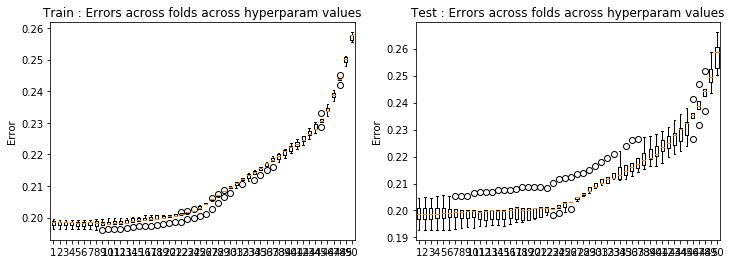

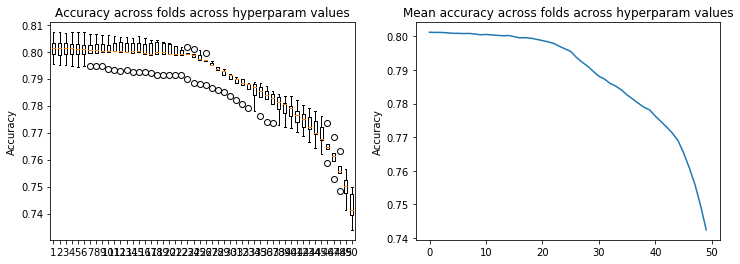

In [63]:
result_crossval(loss_tr41,loss_te41)
result_crossval_accuracy(acc41)

In [37]:
# test 42: degree 6, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr42, loss_te42, w42, acc42 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 6, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  2.35987524e+00  1.13684884e-01 -1.47179942e+00
  1.75246204e+00  3.00209414e-01 -3.31136092e+00  1.41748780e+00
 -4.68967511e-02  8.57446095e-01 -1.47351444e-02 -4.91060718e-03
  6.45254235e-02 -1.75390404e-03  8.84050531e-03 -1.57339683e-01
 -4.40669738e-03 -1.22922388e-01 -7.24828663e-03 -7.26645326e-04
 -3.22124523e+01  5.76194226e-02  2.69088548e-01 -3.68245383e+00
 -9.27796814e-01  1.29162346e+01 -2.88701541e+00  7.67986594e-02
  2.35579584e-01  9.34286421e-03 -1.72509383e-02 -1.43896964e+00
 -5.64910712e-02  6.19443584e-03  2.20907582e+00 -3.94949887e-03
 -5.22241672e-01  1.81473289e-01 -3.92357100e-02  1.23339406e+02
 -2.40594135e+00  1.68212855e+01  6.98751256e+00  1.30790065e+00
 -1.71190754e+01  2.76722677e+00  2.93302966e-01 -3.16898972e+00
  4.78617814e-02  7.0133

Ridge regression: w=[-2.76431087e-01  1.41221363e+00  1.15829876e-01 -1.41423872e+00
  1.96824312e+00  2.99553271e-01 -3.06002338e+00  1.37033154e+00
 -4.71072072e-02  8.90193380e-01 -1.48397089e-02 -4.90604324e-03
 -5.06380165e-02 -1.68069978e-03  8.51048607e-03 -1.46619224e-01
 -4.10838350e-03 -2.01908318e-01 -7.37484603e-03 -7.23246684e-04
 -2.60840815e+01  3.43556446e-02 -5.31539493e-02 -4.47575691e+00
 -9.22517600e-01  1.16832586e+01 -2.69595809e+00  7.56205253e-02
 -3.80043688e-02  9.32394262e-03 -1.71763078e-02 -8.28471285e-01
 -5.69238147e-02  6.47461539e-03  2.12749382e+00 -3.60117427e-03
 -5.93162088e-02  1.81368392e-01 -3.95019103e-02  1.06580267e+02
 -2.31655224e+00  1.75372780e+01  7.94929818e+00  1.28810906e+00
 -1.45010533e+01  2.35559519e+00  2.92681901e-01 -2.38659780e+00
  4.78217435e-02  6.97577991e-03  2.57328915e+00  4.49718627e-04
  1.16158909e-03 -7.60188059e+00  1.91972954e-02  3.08338615e+00
  4.03210587e-03 -8.71772834e-03 -1.81930058e+02  3.61669749e+00
 -4.6

Ridge regression: w=[-2.76431084e-01  3.95725749e-01  1.18826690e-01 -1.43572207e+00
  2.19790102e+00  2.98727485e-01 -2.86182273e+00  1.33204436e+00
 -4.73992471e-02  9.09787996e-01 -1.49605720e-02 -4.90392907e-03
 -1.40116043e-01 -1.58971309e-03  8.13406081e-03 -1.31571997e-01
 -3.76166579e-03 -2.77601468e-01 -7.53151479e-03 -7.20919914e-04
 -1.95028117e+01  4.04083977e-03  1.18233307e-01 -5.24469028e+00
 -9.16189881e-01  1.07380567e+01 -2.53728443e+00  7.43964238e-02
 -2.35821247e-01  9.29283812e-03 -1.70827675e-02 -3.63738781e-01
 -5.74294176e-02  6.77146714e-03  2.01305491e+00 -3.23345816e-03
  3.83565476e-01  1.81265358e-01 -3.97949253e-02  8.85590953e+01
 -2.20361038e+00  1.69173355e+01  8.64313721e+00  1.26541244e+00
 -1.25438595e+01  2.01537027e+00  2.92095271e-01 -1.77604146e+00
  4.77825680e-02  6.94181102e-03  1.59121175e+00  4.64859070e-04
  2.32820519e-03 -7.23096620e+00  1.83487571e-02  1.99860136e+00
  4.40742098e-03 -8.59629353e-03 -1.56474981e+02  3.42306344e+00
 -4.4

Ridge regression: w=[-2.76431078e-01 -6.30967805e-01  1.22792148e-01 -1.54157945e+00
  2.42354000e+00  2.97725834e-01 -2.69667994e+00  1.30069372e+00
 -4.77691152e-02  9.16571910e-01 -1.50921770e-02 -4.90650903e-03
 -2.09367122e-01 -1.48238059e-03  7.73085662e-03 -1.11443926e-01
 -3.38110728e-03 -3.45274396e-01 -7.71261564e-03 -7.17525284e-04
 -1.28447252e+01 -3.40554896e-02  8.17656601e-01 -5.91530933e+00
 -9.08835445e-01  9.98911337e+00 -2.40807786e+00  7.32203471e-02
 -3.63723737e-01  9.25325794e-03 -1.69710593e-02 -1.24896311e-02
 -5.79826192e-02  7.06953758e-03  1.86030514e+00 -2.86794957e-03
  7.79272989e-01  1.81173457e-01 -4.00995712e-02  7.02969366e+01
 -2.06537492e+00  1.48716142e+01  8.95189906e+00  1.24016224e+00
 -1.10707584e+01  1.74603738e+00  2.91598605e-01 -1.32392493e+00
  4.77475596e-02  6.91811686e-03  8.68964692e-01  4.29309994e-04
  3.57185952e-03 -6.73923611e+00  1.73997204e-02  1.03030531e+00
  4.84010960e-03 -8.46549330e-03 -1.30637401e+02  3.18915886e+00
 -4.1

Ridge regression: w=[-2.76431071e-01 -1.60573930e+00  1.27723659e-01 -1.71556149e+00
  2.62650568e+00  2.96565588e-01 -2.54525510e+00  1.27129050e+00
 -4.82012528e-02  9.10525311e-01 -1.52261617e-02 -4.91339388e-03
 -2.60492847e-01 -1.36326560e-03  7.32856834e-03 -8.60560497e-02
 -2.98732438e-03 -4.01769832e-01 -7.90656557e-03 -7.09275937e-04
 -6.50849412e+00 -7.98363544e-02  1.94781360e+00 -6.43364973e+00
 -9.00625014e-01  9.35149362e+00 -2.29742106e+00  7.21875837e-02
 -4.30715209e-01  9.21223972e-03 -1.68438774e-02  2.47269606e-01
 -5.85483557e-02  7.35550425e-03  1.66822497e+00 -2.52955608e-03
  1.11045549e+00  1.81101942e-01 -4.03992759e-02  5.28776726e+01
 -1.90262127e+00  1.16595760e+01  8.85402897e+00  1.21310608e+00
 -9.92653449e+00  1.53484043e+00  2.91234999e-01 -1.00685589e+00
  4.77187386e-02  6.90770401e-03  3.45541794e-01  3.42688016e-04
  4.80836882e-03 -6.12437007e+00  1.64067043e-02  2.18364285e-01
  5.30251535e-03 -8.34040185e-03 -1.05939270e+02  2.91655582e+00
 -3.7

Ridge regression: w=[-2.76431059e-01 -2.47539613e+00  1.33461320e-01 -1.92557028e+00
  2.79080902e+00  2.95281529e-01 -2.38993624e+00  1.23742632e+00
 -4.86752276e-02  8.91314561e-01 -1.53534160e-02 -4.92136146e-03
 -2.93119218e-01 -1.23836987e-03  6.95701852e-03 -5.61146651e-02
 -2.60145480e-03 -4.45680713e-01 -8.09887928e-03 -6.91021756e-04
 -8.34397882e-01 -1.32062329e-01  3.31544192e+00 -6.77387317e+00
 -8.91845372e-01  8.75082520e+00 -2.19071823e+00  7.13771007e-02
 -4.46527750e-01  9.17832941e-03 -1.67038811e-02  4.28383943e-01
 -5.90903637e-02  7.62197858e-03  1.44244453e+00 -2.24222620e-03
  1.37057021e+00  1.81059254e-01 -4.06791067e-02  3.72250336e+01
 -1.71957492e+00  7.79267119e+00  8.41948073e+00  1.18529367e+00
 -8.98342025e+00  1.36362915e+00  2.91032477e-01 -7.98145682e-01
  4.76970097e-02  6.90865267e-03 -2.39345265e-02  2.13427463e-04
  5.95071049e-03 -5.40488718e+00  1.54324450e-02 -4.25180697e-01
  5.76011066e-03 -8.23747965e-03 -8.36768113e+01  2.61205787e+00
 -3.1

Ridge regression: w=[-2.76431043e-01 -3.20483200e+00  1.39682710e-01 -2.13543761e+00
  2.90485465e+00  2.93909908e-01 -2.21579154e+00  1.19315075e+00
 -4.91760014e-02  8.58734914e-01 -1.54665992e-02 -4.92495221e-03
 -3.06057007e-01 -1.11272768e-03  6.64143063e-03 -2.32879411e-02
 -2.23906630e-03 -4.76885268e-01 -8.27639085e-03 -6.56709657e-04
  3.95575106e+00 -1.88246639e-01  4.70432638e+00 -6.93209206e+00
 -8.82807344e-01  8.12592273e+00 -2.07403623e+00  7.08396021e-02
 -4.20512259e-01  9.15914541e-03 -1.65510604e-02  5.38484071e-01
 -5.95806906e-02  7.86975713e-03  1.19569098e+00 -2.02548130e-03
  1.56111090e+00  1.81052750e-01 -4.09278295e-02  2.39355487e+01
 -1.52426144e+00  3.83789291e+00  7.76248103e+00  1.15784291e+00
 -8.14132954e+00  1.21443852e+00  2.91010538e-01 -6.72162632e-01
  4.76830899e-02  6.91405075e-03 -2.71766633e-01  5.37153110e-05
  6.92920008e-03 -4.62134694e+00  1.45274062e-02 -9.09136684e-01
  6.18143836e-03 -8.17146882e-03 -6.46809036e+01  2.28829326e+00
 -2.5

Ridge regression: w=[-2.76431019e-01 -3.77960558e+00  1.45941267e-01 -2.31531477e+00
  2.96128762e+00  2.92469338e-01 -2.01193960e+00  1.13459347e+00
 -4.97023495e-02  8.13418100e-01 -1.55619069e-02 -4.91715534e-03
 -2.98930156e-01 -9.88718139e-04  6.39828771e-03  1.00937650e-02
 -1.90661003e-03 -4.95827479e-01 -8.43040097e-03 -5.99747192e-04
  7.77626297e+00 -2.44911403e-01  5.93963542e+00 -6.91384360e+00
 -8.73731076e-01  7.43223708e+00 -1.93755986e+00  7.05957114e-02
 -3.61903633e-01  9.15941160e-03 -1.63809859e-02  5.84221095e-01
 -6.00054488e-02  8.10814042e-03  9.45480758e-01 -1.89313725e-03
  1.68741697e+00  1.81088815e-01 -4.11380363e-02  1.32273764e+01
 -1.32773782e+00  2.45285510e-01  6.98808792e+00  1.13164488e+00
 -7.32734834e+00  1.07309015e+00  2.91192105e-01 -6.06126101e-01
  4.76787158e-02  6.91231859e-03 -4.22415731e-01 -1.25321651e-04
  7.70327631e-03 -3.82900802e+00  1.37179646e-02 -1.25286314e+00
  6.54566915e-03 -8.15358965e-03 -4.92408753e+01  1.96258647e+00
 -2.0

Ridge regression: w=[-2.76430984e-01 -4.20211982e+00  1.51749298e-01 -2.44613091e+00
  2.95577113e+00  2.90945067e-01 -1.77343190e+00  1.06098720e+00
 -5.02700394e-02  7.57545072e-01 -1.56395117e-02 -4.88967492e-03
 -2.73229462e-01 -8.65872128e-04  6.23512272e-03  4.16440578e-02
 -1.60166391e-03 -5.02892556e-01 -8.55752086e-03 -5.13173683e-04
  1.06536804e+01 -2.98245885e-01  6.91540051e+00 -6.72416835e+00
 -8.64648224e-01  6.64684182e+00 -1.77769308e+00  7.06440930e-02
 -2.80907979e-01  9.17990540e-03 -1.61846798e-02  5.74217753e-01
 -6.03650042e-02  8.35373587e-03  7.09610628e-01 -1.85421930e-03
  1.75509359e+00  1.81173102e-01 -4.13043140e-02  5.00349684e+00
 -1.14203477e+00 -2.72501144e+00  6.16229867e+00  1.10711067e+00
 -6.49677047e+00  9.30972048e-01  2.91616065e-01 -5.80034000e-01
  4.76876579e-02  6.88726432e-03 -4.96371556e-01 -3.15545903e-04
  8.26138609e-03 -3.08371551e+00  1.30056392e-02 -1.47761906e+00
  6.84491471e-03 -8.19153550e-03 -3.71908950e+01  1.65379142e+00
 -1.5

Ridge regression: w=[-2.76430932e-01 -4.48452924e+00  1.56685262e-01 -2.51866547e+00
  2.88589540e+00  2.89278584e-01 -1.50310738e+00  9.74858793e-01
 -5.09093055e-02  6.95166314e-01 -1.57029312e-02 -4.83284752e-03
 -2.32579261e-01 -7.41914421e-04  6.15303040e-03  6.95395015e-02
 -1.31584801e-03 -4.98076217e-01 -8.65854597e-03 -3.89749268e-04
  1.26813899e+01 -3.44976223e-01  7.58824879e+00 -6.36460451e+00
 -8.55341431e-01  5.77344630e+00 -1.59750457e+00  7.09748883e-02
 -1.89510145e-01  9.21702091e-03 -1.59496090e-02  5.20193523e-01
 -6.06703485e-02  8.62855494e-03  5.01609580e-01 -1.91479349e-03
  1.76802858e+00  1.81310779e-01 -4.14203798e-02 -1.02513857e+00
 -9.77433280e-01 -4.98429952e+00  5.31069144e+00  1.08403412e+00
 -5.63490306e+00  7.85297094e-01  2.92346472e-01 -5.76003244e-01
  4.77162368e-02  6.81803661e-03 -5.12440716e-01 -5.10715040e-04
  8.61299011e-03 -2.42775190e+00  1.23742885e-02 -1.60157276e+00
  7.08194400e-03 -8.29064196e-03 -2.80827159e+01  1.37807239e+00
 -1.1

Ridge regression: w=[-2.76430858e-01 -4.64196628e+00  1.60487485e-01 -2.53033764e+00
  2.75117862e+00  2.87360054e-01 -1.21214468e+00  8.81271974e-01
 -5.16575849e-02  6.31747443e-01 -1.57578697e-02 -4.73575784e-03
 -1.82218889e-01 -6.14255461e-04  6.14971759e-03  9.28513814e-02
 -1.03838158e-03 -4.81040075e-01 -8.73638446e-03 -2.22167648e-04
  1.39756834e+01 -3.83089693e-01  7.95627145e+00 -5.83715089e+00
 -8.45314862e-01  4.84348855e+00 -1.40535631e+00  7.15824247e-02
 -1.00873696e-01  9.26250388e-03 -1.56608154e-02  4.36321725e-01
 -6.09386610e-02  8.95798555e-03  3.28339946e-01 -2.07915094e-03
  1.72826286e+00  1.81506812e-01 -4.14765578e-02 -5.21876953e+00
 -8.40263171e-01 -6.55574617e+00  4.43482854e+00  1.06157563e+00
 -4.75615349e+00  6.38064037e-01  2.93475050e-01 -5.78281040e-01
  4.77731212e-02  6.68007607e-03 -4.88453704e-01 -7.03951416e-04
  8.77928440e-03 -1.88244238e+00  1.17991965e-02 -1.63846665e+00
  7.26551045e-03 -8.45522976e-03 -2.13573825e+01  1.14554496e+00
 -8.9

Ridge regression: w=[-2.76430750e-01 -4.68825016e+00  1.63103510e-01 -2.48229928e+00
  2.55443513e+00  2.85019783e-01 -9.18014596e-01  7.86332019e-01
 -5.25486947e-02  5.72917391e-01 -1.58109347e-02 -4.58719449e-03
 -1.27918934e-01 -4.81234783e-04  6.22151914e-03  1.11509268e-01
 -7.58846749e-04 -4.51564548e-01 -8.79389457e-03 -3.63708870e-06
  1.46467328e+01 -4.12138870e-01  8.03894004e+00 -5.15301375e+00
 -8.33773250e-01  3.90922658e+00 -1.21212432e+00  7.24725798e-02
 -2.70527407e-02  9.30333612e-03 -1.53017314e-02  3.37292774e-01
 -6.11899503e-02  9.36859720e-03  1.90320903e-01 -2.34937486e-03
  1.63757433e+00  1.81766262e-01 -4.14588025e-02 -7.92604625e+00
 -7.32124516e-01 -7.51638406e+00  3.53405521e+00  1.03830688e+00
 -3.89664103e+00  4.94129473e-01  2.95113851e-01 -5.74404935e-01
  4.78683160e-02  6.44839357e-03 -4.40732538e-01 -8.85748242e-04
  8.78694289e-03 -1.44926494e+00  1.12537298e-02 -1.59912914e+00
  7.40517797e-03 -8.68928627e-03 -1.64666103e+01  9.59224286e-01
 -6.7

Ridge regression: w=[-2.76430592e-01 -4.63461628e+00  1.64690234e-01 -2.37780212e+00
  2.30385518e+00  2.82018807e-01 -6.39895494e-01  6.95581300e-01
 -5.36002782e-02  5.22955343e-01 -1.58684420e-02 -4.37772114e-03
 -7.47891349e-02 -3.42765214e-04  6.36389414e-03  1.26033331e-01
 -4.68834961e-04 -4.10265737e-01 -8.83216967e-03  2.70892337e-04
  1.47872784e+01 -4.33111112e-01  7.86443967e+00 -4.34220468e+00
 -8.19598328e-01  3.02898964e+00 -1.02818528e+00  7.36621276e-02
  2.39315880e-02  9.32229309e-03 -1.48552675e-02  2.35987220e-01
 -6.14448234e-02  9.88515774e-03  8.37477188e-02 -2.72325074e-03
  1.50014157e+00  1.82094242e-01 -4.13498518e-02 -9.44550762e+00
 -6.50538698e-01 -7.95852446e+00  2.62390204e+00  1.01225486e+00
 -3.10031344e+00  3.59155655e-01  2.97375903e-01 -5.56841230e-01
  4.80115016e-02  6.10335241e-03 -3.82957102e-01 -1.04391933e-03
  8.66554527e-03 -1.11623596e+00  1.07126823e-02 -1.49460967e+00
  7.50692058e-03 -8.99582351e-03 -1.29367371e+01  8.16262558e-01
 -5.1

Ridge regression: w=[-2.76430362e-01 -4.49097601e+00  1.65578111e-01 -2.22169319e+00
  2.01430163e+00  2.78046010e-01 -3.93523782e-01  6.12942902e-01
 -5.48028661e-02  4.83799095e-01 -1.59354244e-02 -4.10248131e-03
 -2.64537743e-02 -2.00334959e-04  6.57070650e-03  1.37224566e-01
 -1.63000033e-04 -3.59233154e-01 -8.84973998e-03  6.02701154e-04
  1.44755815e+01 -4.48041861e-01  7.46411787e+00 -3.45825514e+00
 -8.01345642e-01  2.25074019e+00 -8.61382411e-01  7.51685616e-02
  4.99037093e-02  9.30007134e-03 -1.43065464e-02  1.41761955e-01
 -6.17222095e-02  1.05260599e-02  2.79976675e-03 -3.19134168e-03
  1.32496073e+00  1.82494821e-01 -4.11324571e-02 -1.00212864e+01
 -5.90352314e-01 -7.97082208e+00  1.74457382e+00  9.80949202e-01
 -2.40383558e+00  2.38152371e-01  3.00343927e-01 -5.23789996e-01
  4.82100336e-02  5.63708749e-03 -3.25200844e-01 -1.16591461e-03
  8.44690575e-03 -8.65167146e-01  1.01541161e-02 -1.33919944e+00
  7.57064471e-03 -9.37454281e-03 -1.03900439e+01  7.10318988e-01
 -3.8

Ridge regression: w=[-2.76430028e-01 -4.26861122e+00  1.66211062e-01 -2.02069184e+00
  1.70626613e+00  2.72734367e-01 -1.87969942e-01  5.40400660e-01
 -5.61146804e-02  4.55002344e-01 -1.60148280e-02 -3.76383056e-03
  1.52065189e-02 -5.65091966e-05  6.83290200e-03  1.45926927e-01
  1.59713484e-04 -3.02142100e-01 -8.84313078e-03  9.86779000e-04
  1.37864793e+01 -4.59553122e-01  6.87202967e+00 -2.57267791e+00
 -7.77314272e-01  1.60173894e+00 -7.16307350e-01  7.69904969e-02
  5.41675468e-02  9.21976010e-03 -1.36484497e-02  5.99081219e-02
 -6.20359589e-02  1.12968811e-02 -5.86117400e-02 -3.73448010e-03
  1.12636463e+00  1.82968379e-01 -4.07944144e-02 -9.85833392e+00
 -5.45180674e-01 -7.63348278e+00  9.55117473e-01  9.41545580e-01
 -1.82699541e+00  1.34772402e-01  3.04030485e-01 -4.78303114e-01
  4.84666757e-02  5.05751813e-03 -2.73678532e-01 -1.24294220e-03
  8.16406453e-03 -6.77128118e-01  9.56243731e-03 -1.15143373e+00
  7.59067809e-03 -9.81831283e-03 -8.54162813e+00  6.33816984e-01
 -2.9

Ridge regression: w=[-2.76429541e-01 -3.98278915e+00  1.67064857e-01 -1.78430085e+00
  1.40217290e+00  2.65708515e-01 -2.53659797e-02  4.78159227e-01
 -5.74644372e-02  4.34453415e-01 -1.61067918e-02 -3.37278627e-03
  4.98575015e-02  8.58035959e-05  7.13720571e-03  1.52884915e-01
  4.94349759e-04 -2.43610701e-01 -8.80877788e-03  1.40975398e-03
  1.28032386e+01 -4.70395208e-01  6.12817781e+00 -1.75880732e+00
 -7.45749068e-01  1.08753350e+00 -5.94432007e-01  7.90826301e-02
  4.33490500e-02  9.07323504e-03 -1.28893646e-02 -7.80589024e-03
 -6.23906455e-02  1.21833133e-02 -1.05833853e-01 -4.32270001e-03
  9.21797816e-01  1.83507851e-01 -4.03347004e-02 -9.14289520e+00
 -5.08547709e-01 -7.02246707e+00  3.14533087e-01  8.91128598e-01
 -1.37141301e+00  5.10737266e-02  3.08337890e-01 -4.26030771e-01
  4.87769695e-02  4.38782657e-03 -2.31278883e-01 -1.27447130e-03
  7.84898522e-03 -5.35532683e-01  8.93407348e-03 -9.52124382e-01
  7.55932018e-03 -1.03101586e-02 -7.18521671e+00  5.79449907e-01
 -2.2

Ridge regression: w=[-2.76428832e-01 -3.65371452e+00  1.68545646e-01 -1.52591372e+00
  1.12158511e+00  2.56670038e-01  9.72523444e-02  4.25008542e-01
 -5.87607190e-02  4.19339542e-01 -1.62081029e-02 -2.94847407e-03
  7.82705752e-02  2.24007473e-04  7.46553606e-03  1.58673667e-01
  8.28420655e-04 -1.88061540e-01 -8.74539456e-03  1.84957672e-03
  1.16232139e+01 -4.82990427e-01  5.28318094e+00 -1.07219328e+00
 -7.05219403e-01  6.97657934e-01 -4.94606317e-01  8.13346079e-02
  2.47872678e-02  8.86687135e-03 -1.20595424e-02 -6.19882097e-02
 -6.27787478e-02  1.31468739e-02 -1.43026142e-01 -4.91614048e-03
  7.27777694e-01  1.84095723e-01 -3.97683460e-02 -8.05649204e+00
 -4.74726293e-01 -6.21726556e+00 -1.40737905e-01  8.27288061e-01
 -1.02525598e+00 -1.24900377e-02  3.13032745e-01 -3.72763428e-01
  4.91269266e-02  3.66142738e-03 -1.98557048e-01 -1.27108775e-03
  7.52975530e-03 -4.27370925e-01  8.28377686e-03 -7.60392412e-01
  7.47172764e-03 -1.08228842e-02 -6.17570186e+00  5.40909729e-01
 -1.7

Ridge regression: w=[-2.76427798e-01 -3.30481272e+00  1.70877301e-01 -1.26288089e+00
  8.77646973e-01  2.45513606e-01  1.85507355e-01  3.78822319e-01
 -5.99041282e-02  4.06947686e-01 -1.63123158e-02 -2.51510047e-03
  1.01784091e-01  3.56235040e-04  7.79597951e-03  1.63674341e-01
  1.14213516e-03 -1.38702562e-01 -8.65524105e-03  2.27795520e-03
  1.03529386e+01 -4.98968401e-01  4.39949265e+00 -5.38065884e-01
 -6.55163093e-01  4.13281451e-01 -4.13785942e-01  8.35655034e-02
  4.64906937e-03  8.62265165e-03 -1.12106822e-02 -1.04386319e-01
 -6.31819848e-02  1.41278231e-02 -1.73061409e-01 -5.46825295e-03
  5.56257133e-01  1.84704433e-01 -3.91259190e-02 -6.77637152e+00
 -4.39408584e-01 -5.30479986e+00 -4.09915355e-01  7.48981034e-01
 -7.69783460e-01 -5.68904561e-02  3.17752516e-01 -3.22829427e-01
  4.94930536e-02  2.91402247e-03 -1.74740926e-01 -1.25397621e-03
  7.22867939e-03 -3.43298547e-01  7.64666329e-03 -5.90039826e-01
  7.32912383e-03 -1.13224700e-02 -5.41235791e+00  5.13097071e-01
 -1.3

Ridge regression: w=[-2.76426294e-01 -2.95861003e+00  1.73997970e-01 -1.01434858e+00
  6.76054039e-01  2.32441071e-01  2.45708274e-01  3.37193326e-01
 -6.07983946e-02  3.95170169e-01 -1.64110054e-02 -2.09680457e-03
  1.21745836e-01  4.81615224e-04  8.10575556e-03  1.68081491e-01
  1.41146173e-03 -9.71081253e-02 -8.54327810e-03  2.66537756e-03
  9.09346365e+00 -5.18740158e-01  3.54472781e+00 -1.51631933e-01
 -5.96452610e-01  2.13462599e-01 -3.47957589e-01  8.55398896e-02
 -1.28686598e-02  8.37249315e-03 -1.04059804e-02 -1.36888458e-01
 -6.35776965e-02  1.50569250e-02 -1.97642570e-01 -5.93129143e-03
  4.13129555e-01  1.85301576e-01 -3.84449408e-02 -5.46264181e+00
 -4.00250457e-01 -4.37357085e+00 -5.24524203e-01  6.57468461e-01
 -5.84778477e-01 -8.41949313e-02  3.22049718e-01 -2.78643253e-01
  4.98465004e-02  2.17485085e-03 -1.58444709e-01 -1.25092367e-03
  6.96177029e-03 -2.77094195e-01  7.07229216e-03 -4.48106758e-01
  7.13821548e-03 -1.17744267e-02 -4.82457909e+00  4.92072577e-01
 -1.0

Ridge regression: w=[-2.76424103e-01 -2.63196677e+00  1.77501189e-01 -7.97313426e-01
  5.16176673e-01  2.18009315e-01  2.83693851e-01  2.98102607e-01
 -6.13568542e-02  3.82743048e-01 -1.64959290e-02 -1.71209271e-03
  1.39024951e-01  6.00546162e-04  8.37534737e-03  1.71938290e-01
  1.61318492e-03 -6.34233640e-02 -8.41470818e-03  2.98692224e-03
  7.92270388e+00 -5.41255630e-01  2.77863738e+00  1.11574336e-01
 -5.31671140e-01  7.89098334e-02 -2.93094364e-01  8.69995162e-02
 -2.55170647e-02  8.14773784e-03 -9.70446279e-03 -1.60887605e-01
 -6.39476951e-02  1.58715206e-02 -2.17573105e-01 -6.26287595e-03
  2.98975498e-01  1.85858012e-01 -3.77557625e-02 -4.24020882e+00
 -3.57139129e-01 -3.49994415e+00 -5.32658819e-01  5.56814015e-01
 -4.51895355e-01 -9.72053687e-02  3.25454438e-01 -2.41038229e-01
  5.01605394e-02  1.45954112e-03 -1.48027506e-01 -1.29081357e-03
  6.73904068e-03 -2.24803145e-01  6.61255359e-03 -3.35736909e-01
  6.90738961e-03 -1.21503960e-02 -4.36092709e+00  4.74896504e-01
 -8.4

Ridge regression: w=[-2.76420912e-01 -2.33302454e+00  1.80660735e-01 -6.22934191e-01
  3.93137974e-01  2.03047246e-01  3.04394120e-01  2.60410339e-01
 -6.15008725e-02  3.69243120e-01 -1.65611579e-02 -1.37029179e-03
  1.53722156e-01  7.14967847e-04  8.59200749e-03  1.75188671e-01
  1.72963993e-03 -3.68859384e-02 -8.27253081e-03  3.22629407e-03
  6.88396209e+00 -5.64128937e-01  2.14104915e+00  2.82850053e-01
 -4.64768698e-01 -6.46177311e-03 -2.45893348e-01  8.76969154e-02
 -3.25534091e-02  7.96834538e-03 -9.14791132e-03 -1.77017692e-01
 -6.42850539e-02  1.65273232e-02 -2.33107471e-01 -6.43150067e-03
  2.10963473e-01  1.86354629e-01 -3.70685165e-02 -3.18688317e+00
 -3.11931333e-01 -2.73552130e+00 -4.81523095e-01  4.53384319e-01
 -3.56165481e-01 -9.91433580e-02  3.27519716e-01 -2.09849660e-01
  5.04180606e-02  7.66971074e-04 -1.41724249e-01 -1.39934487e-03
  6.56469893e-03 -1.83823704e-01  6.30946589e-03 -2.50228179e-01
  6.64231062e-03 -1.24318165e-02 -3.98172549e+00  4.59406071e-01
 -6.9

Ridge regression: w=[-2.76416265e-01 -2.06122281e+00  1.82548195e-01 -4.94838233e-01
  2.99857550e-01  1.88441785e-01  3.11868195e-01  2.23981981e-01
 -6.11489661e-02  3.54850556e-01 -1.66042156e-02 -1.07144282e-03
  1.65199086e-01  8.28491613e-04  8.75137479e-03  1.77721063e-01
  1.75148095e-03 -1.63479897e-02 -8.11648310e-03  3.37669645e-03
  5.98582722e+00 -5.84178592e-01  1.64702995e+00  3.91004683e-01
 -4.00077286e-01 -5.54311926e-02 -2.04131608e-01  8.74210432e-02
 -3.41586728e-02  7.83483786e-03 -8.75627193e-03 -1.85248763e-01
 -6.45958526e-02  1.70001019e-02 -2.44262003e-01 -6.41982345e-03
  1.44766052e-01  1.86784439e-01 -3.63664461e-02 -2.33414116e+00
 -2.67597837e-01 -2.10324375e+00 -4.06605204e-01  3.54291148e-01
 -2.86289849e-01 -9.33532146e-02  3.27824891e-01 -1.84391317e-01
  5.06158579e-02  8.13055973e-05 -1.37731710e-01 -1.59735500e-03
  6.43671808e-03 -1.52177374e-01  6.18763990e-03 -1.87086385e-01
  6.34330555e-03 -1.26091837e-02 -3.65495709e+00  4.43953739e-01
 -6.1

Ridge regression: w=[-2.76409497e-01 -1.80996241e+00  1.82197938e-01 -4.09529771e-01
  2.28667849e-01  1.74887622e-01  3.09564276e-01  1.89430300e-01
 -6.01995110e-02  3.39965057e-01 -1.66257469e-02 -8.09096413e-04
  1.72448628e-01  9.46229162e-04  8.85734130e-03  1.79378627e-01
  1.67870607e-03 -6.38992045e-04 -7.94363705e-03  3.43922968e-03
  5.21165624e+00 -5.98170906e-01  1.28958903e+00  4.58104720e-01
 -3.41128033e-01 -7.80921663e-02 -1.66642780e-01  8.60147092e-02
 -3.09185607e-02  7.72263552e-03 -8.53099081e-03 -1.85307251e-01
 -6.48961257e-02  1.72783803e-02 -2.50979944e-01 -6.22659583e-03
  9.59096655e-02  1.87149588e-01 -3.56062761e-02 -1.67834777e+00
 -2.27097009e-01 -1.60261435e+00 -3.29137395e-01  2.65482518e-01
 -2.34290392e-01 -8.29756388e-02  3.25938737e-01 -1.63720580e-01
  5.07643293e-02 -6.21563068e-04 -1.34368333e-01 -1.90091620e-03
  6.34580806e-03 -1.28111409e-01  6.25145278e-03 -1.41483979e-01
  6.00532160e-03 -1.26780835e-02 -3.35476497e+00  4.27155615e-01
 -5.7

Ridge regression: w=[-2.76399642e-01 -1.57043112e+00  1.78748066e-01 -3.57975859e-01
  1.72559645e-01  1.62727720e-01  3.00575876e-01  1.57645176e-01
 -5.85137749e-02  3.24884851e-01 -1.66276210e-02 -5.74339804e-04
  1.74670811e-01  1.07418273e-03  8.92102604e-03  1.79936069e-01
  1.52100523e-03  1.12521327e-02 -7.75009534e-03  3.42050652e-03
  4.53284211e+00 -6.03426960e-01  1.04619211e+00  4.98705396e-01
 -2.89875358e-01 -8.26086513e-02 -1.33045680e-01  8.33911434e-02
 -2.35580415e-02  7.57714760e-03 -8.46168381e-03 -1.77290511e-01
 -6.52058171e-02  1.73531119e-02 -2.53144490e-01 -5.86883769e-03
  6.04778610e-02  1.87454807e-01 -3.47233288e-02 -1.19544387e+00
 -1.92500013e-01 -1.21912980e+00 -2.58850326e-01  1.90463703e-01
 -1.94889315e-01 -7.06312078e-02  3.21365921e-01 -1.46771168e-01
  5.08822999e-02 -1.36507114e-03 -1.30309724e-01 -2.32124625e-03
  6.27438860e-03 -1.10009860e-01  6.48432304e-03 -1.09059335e-01
  5.62002899e-03 -1.26346724e-02 -3.06161521e+00  4.07720936e-01
 -5.6

Ridge regression: w=[-2.76385290e-01 -1.33515479e+00  1.71520210e-01 -3.27681955e-01
  1.26205645e-01  1.51944895e-01  2.87731024e-01  1.29347085e-01
 -5.59091022e-02  3.09738597e-01 -1.66094881e-02 -3.59594494e-04
  1.71795140e-01  1.21804250e-03  8.95927586e-03  1.79075661e-01
  1.29771647e-03  2.01367233e-02 -7.53305332e-03  3.33060073e-03
  3.92064766e+00 -5.98104677e-01  8.85761265e-01  5.20575112e-01
 -2.46616687e-01 -7.57245455e-02 -1.03383702e-01  7.95618316e-02
 -1.30012706e-02  7.31012861e-03 -8.53197111e-03 -1.62200677e-01
 -6.55406494e-02  1.72104399e-02 -2.50539792e-01 -5.38456580e-03
  3.53182268e-02  1.87698868e-01 -3.36393937e-02 -8.53273591e-01
 -1.64680671e-01 -9.32906388e-01 -1.98395641e-01  1.30118742e-01
 -1.64797887e-01 -5.82141505e-02  3.13512836e-01 -1.32480282e-01
  5.09863791e-02 -2.16240739e-03 -1.24805113e-01 -2.86292670e-03
  6.19664860e-03 -9.64605563e-02  6.84864066e-03 -8.62355774e-02
  5.17940697e-03 -1.24729718e-02 -2.76314195e+00  3.84418582e-01
 -5.8

Ridge regression: w=[-2.76364393e-01 -1.10038256e+00  1.60061737e-01 -3.05195775e-01
  8.66637754e-02  1.42271313e-01  2.73472731e-01  1.04813429e-01
 -5.21746573e-02  2.94642939e-01 -1.65640117e-02 -1.61493791e-04
  1.64690362e-01  1.38124903e-03  8.99235287e-03  1.76409235e-01
  1.03657407e-03  2.66702607e-02 -7.29267474e-03  3.18137910e-03
  3.35394314e+00 -5.81238162e-01  7.75130144e-01  5.26079417e-01
 -2.10447950e-01 -6.29059779e-02 -7.77924897e-02  7.46855252e-02
 -5.65534015e-04  6.80116478e-03 -8.72271346e-03 -1.42073647e-01
 -6.59017669e-02  1.68309672e-02 -2.42885311e-01 -4.83430427e-03
  1.79570140e-02  1.87865338e-01 -3.22729616e-02 -6.19411563e-01
 -1.43493757e-01 -7.24129905e-01 -1.47220468e-01  8.33724173e-02
 -1.42003042e-01 -4.68520649e-02  3.01717155e-01 -1.19949430e-01
  5.10743116e-02 -3.00786143e-03 -1.17754499e-01 -3.52009550e-03
  6.08089399e-03 -8.63254444e-02  7.28740098e-03 -7.02628585e-02
  4.68035797e-03 -1.21850404e-02 -2.45474028e+00  3.56198722e-01
 -5.9

Ridge regression: w=[-2.76333963e-01 -8.66959776e-01  1.44204414e-01 -2.79022669e-01
  5.33988383e-02  1.33342836e-01  2.59629270e-01  8.38158220e-02
 -4.71206956e-02  2.79856415e-01 -1.64715716e-02  1.73013507e-05
  1.54957237e-01  1.56242986e-03  9.04041611e-03  1.71575757e-01
  7.70482739e-04  3.14145507e-02 -7.03340602e-03  2.98478704e-03
  2.82236504e+00 -5.52752037e-01  6.85064715e-01  5.14405554e-01
 -1.79905030e-01 -4.82457106e-02 -5.62805720e-02  6.91240041e-02
  1.20623907e-02  5.90938686e-03 -9.01276553e-03 -1.19568047e-01
 -6.62644656e-02  1.61958513e-02 -2.30009562e-01 -4.29829809e-03
  6.41584069e-03  1.87914364e-01 -3.05525414e-02 -4.65071015e-01
 -1.28153791e-01 -5.75376706e-01 -1.04073770e-01  4.81207883e-02
 -1.25132423e-01 -3.70062198e-02  2.85382602e-01 -1.08568179e-01
  5.11041660e-02 -3.87063586e-03 -1.09588565e-01 -4.27152071e-03
  5.89460338e-03 -7.87437550e-02  7.72932599e-03 -5.91253198e-02
  4.12972679e-03 -1.17634986e-02 -2.13918175e+00  3.22449931e-01
 -6.0

Ridge regression: w=[-2.76289660e-01 -6.39799290e-01  1.24170177e-01 -2.42321294e-01
  2.74410089e-02  1.24840220e-01  2.47237732e-01  6.57483498e-02
 -4.06605156e-02  2.65752390e-01 -1.62960691e-02  1.67440262e-04
  1.44434622e-01  1.75296513e-03  9.11930519e-03  1.64398273e-01
  5.32839552e-04  3.48640827e-02 -6.76433818e-03  2.75092270e-03
  2.32569057e+00 -5.13590439e-01  5.95295677e-01  4.84584949e-01
 -1.53525463e-01 -3.43767185e-02 -3.86737345e-02  6.34451448e-02
  2.32220110e-02  4.49800092e-03 -9.37832997e-03 -9.72380454e-02
 -6.65715155e-02  1.52976072e-02 -2.12127529e-01 -3.86644649e-03
 -9.26270935e-04  1.87778426e-01 -2.84339137e-02 -3.66536182e-01
 -1.17575087e-01 -4.71977907e-01 -6.81331870e-02  2.20050995e-02
 -1.12985442e-01 -2.86556769e-02  2.64228017e-01 -9.80251305e-02
  5.09759752e-02 -4.69297167e-03 -1.01005934e-01 -5.07682465e-03
  5.61094400e-03 -7.30733827e-02  8.09753053e-03 -5.13905699e-02
  3.54805247e-03 -1.12043732e-02 -1.82500282e+00  2.83327813e-01
 -5.9

Ridge regression: w=[-2.76225164e-01 -4.26356559e-01  1.00687700e-01 -1.94227567e-01
  1.00896659e-02  1.16584422e-01  2.36535299e-01  4.98765167e-02
 -3.29008511e-02  2.52659368e-01 -1.59841104e-02  2.73789928e-04
  1.34687332e-01  1.93608470e-03  9.23712246e-03  1.55029729e-01
  3.52946088e-04  3.74252378e-02 -6.49809008e-03  2.48634134e-03
  1.87072855e+00 -4.65895274e-01  4.97000081e-01  4.38186226e-01
 -1.30214699e-01 -2.25763360e-02 -2.46861391e-02  5.83032864e-02
  3.18109773e-02  2.46952190e-03 -9.79242897e-03 -7.69201032e-02
 -6.67395464e-02  1.41519812e-02 -1.90085828e-01 -3.61973743e-03
 -5.37861925e-03  1.87366090e-01 -2.59204322e-02 -3.05292877e-01
 -1.10588349e-01 -4.01659571e-01 -3.91500240e-02  2.88273408e-03
 -1.04288885e-01 -2.15151427e-02  2.38587379e-01 -8.82162983e-02
  5.05264456e-02 -5.39485573e-03 -9.26910542e-02 -5.87717594e-03
  5.21417487e-03 -6.88084878e-02  8.31993303e-03 -4.60469935e-02
  2.96916915e-03 -1.05080304e-02 -1.52391608e+00  2.40021910e-01
 -5.5

Ridge regression: w=[-2.76131290e-01 -2.34595530e-01  7.50123927e-02 -1.39017254e-01
  1.90816666e-03  1.08565551e-01  2.27128381e-01  3.55865220e-02
 -2.41922863e-02  2.40730581e-01 -1.54696952e-02  3.18479690e-04
  1.26678433e-01  2.08863632e-03  9.39300111e-03  1.43992767e-01
  2.52476663e-04  3.93810336e-02 -6.24791337e-03  2.19360223e-03
  1.46699548e+00 -4.12985077e-01  3.91547684e-01  3.80174231e-01
 -1.09386752e-01 -1.30814123e-02 -1.40019855e-02  5.42126225e-02
  3.75711174e-02 -1.95144491e-04 -1.02255308e-02 -5.95134383e-02
 -6.66825730e-02  1.28065587e-02 -1.65398631e-01 -3.60653801e-03
 -7.93574621e-03  1.86577271e-01 -2.30804594e-02 -2.67531382e-01
 -1.06059808e-01 -3.54220940e-01 -1.71350421e-02 -1.09704486e-02
 -9.76736855e-02 -1.52410126e-02  2.09608949e-01 -7.91196780e-02
  4.95458713e-02 -5.88717421e-03 -8.51062728e-02 -6.60280164e-03
  4.70183939e-03 -6.55093492e-02  8.33996137e-03 -4.23614283e-02
  2.43350647e-03 -9.67842110e-03 -1.24774787e+00  1.94767105e-01
 -5.0

Ridge regression: w=[-2.75994690e-01 -7.09846355e-02  4.87426780e-02 -8.35065501e-02
  2.42125405e-03  1.00897652e-01  2.18269657e-01  2.25267863e-02
 -1.50892223e-02  2.29915444e-01 -1.46853493e-02  2.86035952e-04
  1.20666318e-01  2.18520794e-03  9.57808008e-03  1.32059650e-01
  2.42710078e-04  4.08779923e-02 -6.02368284e-03  1.87312499e-03
  1.12240170e+00 -3.58897198e-01  2.86212709e-01  3.17581640e-01
 -9.08907344e-02 -5.50650122e-03 -6.28702165e-03  5.13530085e-02
  4.09760425e-02 -3.40599736e-03 -1.06469421e-02 -4.51220927e-02
 -6.63440643e-02  1.13415617e-02 -1.39978812e-01 -3.82401315e-03
 -9.28801956e-03  1.85329334e-01 -2.00500041e-02 -2.43376835e-01
 -1.02964342e-01 -3.21456140e-01 -1.98347837e-03 -2.08350578e-02
 -9.18045476e-02 -9.58326860e-03  1.79174303e-01 -7.06884968e-02
  4.78184375e-02 -6.09252475e-03 -7.83828173e-02 -7.18589343e-03
  4.08384013e-03 -6.27630992e-02  8.12713757e-03 -3.97747600e-02
  1.97658512e-03 -8.72428168e-03 -1.00557269e+00  1.50459695e-01
 -4.5

Ridge regression: w=[-2.75795995e-01  6.08613800e-02  2.34461488e-02 -3.41142046e-02
  1.03335596e-02  9.37203001e-02  2.09149705e-01  1.06109091e-02
 -6.20993650e-03  2.19983915e-01 -1.35789692e-02  1.69323092e-04
  1.16274299e-01  2.20286807e-03  9.77726723e-03  1.20016069e-01
  3.22320676e-04  4.19415843e-02 -5.82846727e-03  1.52722315e-03
  8.40247071e-01 -3.07535500e-01  1.89239481e-01  2.57192898e-01
 -7.47908196e-02  7.72952605e-04 -1.15669220e-03  4.95507265e-02
  4.28722481e-02 -6.95905999e-03 -1.10259358e-02 -3.33563322e-02
 -6.57180477e-02  9.85924986e-03 -1.15659227e-01 -4.21741703e-03
 -9.86656507e-03  1.83585042e-01 -1.70099488e-02 -2.26052986e-01
 -1.00437905e-01 -2.97166810e-01  6.78218414e-03 -2.76147317e-02
 -8.55595075e-02 -4.45684653e-03  1.49481787e-01 -6.27800174e-02
  4.51782786e-02 -5.96852864e-03 -7.23063003e-02 -7.57378672e-03
  3.38050205e-03 -6.01752869e-02  7.68565702e-03 -3.78339991e-02
  1.61793568e-03 -7.66525534e-03 -8.01875889e-01  1.09960293e-01
 -3.8

Ridge regression: w=[-2.75507137e-01  1.60487332e-01  2.68636561e-04  5.03799191e-03
  2.38489919e-02  8.70975439e-02  1.99131487e-01 -7.38786671e-05
  1.94475541e-03  2.10551192e-01 -1.21337362e-02 -2.60465398e-05
  1.12680615e-01  2.12484505e-03  9.97020921e-03  1.08433856e-01
  4.76887343e-04  4.25052752e-02 -5.65731777e-03  1.16397682e-03
  6.18388357e-01 -2.61804503e-01  1.06542949e-01  2.03814120e-01
 -6.11237195e-02  6.35684591e-03  1.82867332e-03  4.84308938e-02
  4.41183756e-02 -1.05709205e-02 -1.13326293e-02 -2.36232190e-02
 -6.48436527e-02  8.46262214e-03 -9.37517012e-02 -4.70060529e-03
 -9.90598589e-03  1.81365393e-01 -1.41415350e-02 -2.11110959e-01
 -9.78079561e-02 -2.77048643e-01  1.01245808e-02 -3.19308647e-02
 -7.81718131e-02  6.71409490e-05  1.22472277e-01 -5.51314482e-02
  4.15689316e-02 -5.52524338e-03 -6.63988393e-02 -7.73764658e-03
  2.62153836e-03 -5.73811389e-02  7.05620892e-03 -3.61508022e-02
  1.35561607e-03 -6.53952804e-03 -6.36318344e-01  7.54019025e-02
 -3.3

Ridge regression: w=[-2.75087539e-01  2.29987407e-01 -2.02679023e-02  3.25416685e-02
  4.08636735e-02  8.09639187e-02  1.87893113e-01 -9.38227879e-03
  9.12178685e-03  2.01124700e-01 -1.03853884e-02 -2.81403962e-04
  1.08892936e-01  1.94265090e-03  1.01311292e-02  9.75669723e-02
  6.81689127e-04  4.24452405e-02 -5.49881274e-03  7.97604824e-04
  4.50356870e-01 -2.23158973e-01  4.07504392e-02  1.59815809e-01
 -4.97505308e-02  1.16838967e-02  3.12159687e-03  4.76104474e-02
  4.53610333e-02 -1.39457814e-02 -1.15391492e-02 -1.53412374e-02
 -6.37754801e-02  7.23118059e-03 -7.48557961e-02 -5.18582410e-03
 -9.50648468e-03  1.78731481e-01 -1.15809221e-02 -1.95809266e-01
 -9.45991017e-02 -2.58370921e-01  9.47533731e-03 -3.42081227e-02
 -6.92948368e-02  3.82556016e-03  9.93994092e-02 -4.74044064e-02
  3.70895762e-02 -4.82824075e-03 -6.00948973e-02 -7.67549863e-03
  1.84544401e-03 -5.40661422e-02  6.30681581e-03 -3.43828713e-02
  1.16809105e-03 -5.40450622e-03 -5.04919676e-01  4.78270776e-02
 -2.8

Ridge regression: w=[-2.74478739e-01  2.73022155e-01 -3.82046029e-02  4.90855799e-02
  5.90849632e-02  7.51350027e-02  1.75473066e-01 -1.71993574e-02
  1.53392646e-02  1.91219173e-01 -8.42758695e-03 -5.70205701e-04
  1.04055917e-01  1.65694740e-03  1.02286265e-02  8.73974079e-02
  9.07660945e-04  4.16290692e-02 -5.33883377e-03  4.44184160e-04
  3.27356734e-01 -1.91702069e-01 -8.15322765e-03  1.25622586e-01
 -4.03423863e-02  1.69846410e-02  3.13422011e-03  4.68124333e-02
  4.69519796e-02 -1.68441656e-02 -1.16204516e-02 -8.07916690e-03
 -6.25478242e-02  6.20488636e-03 -5.89466164e-02 -5.60546156e-03
 -8.69128297e-03  1.75734511e-01 -9.39522028e-03 -1.78679882e-01
 -9.05246268e-02 -2.39533112e-01  6.59155402e-03 -3.47402439e-02
 -5.89928770e-02  6.64759680e-03  8.07224028e-02 -3.93025184e-02
  3.20048803e-02 -3.98308387e-03 -5.29715047e-02 -7.41078765e-03
  1.09680006e-03 -4.99934796e-02  5.51426817e-03 -3.22439125e-02
  1.02216898e-03 -4.32611017e-03 -4.01857732e-01  2.72381267e-02
 -2.3

Ridge regression: w=[-2.73596919e-01  2.93960113e-01 -5.39044612e-02  5.65450545e-02
  7.62247479e-02  6.93678687e-02  1.62225651e-01 -2.34872296e-02
  2.08137467e-02  1.80516878e-01 -6.39731399e-03 -8.67071274e-04
  9.77031887e-02  1.27741290e-03  1.02268916e-02  7.77772317e-02
  1.12814689e-03  3.99855644e-02 -5.16538668e-03  1.15450529e-04
  2.40092570e-01 -1.66639135e-01 -4.16966747e-02  1.00477561e-01
 -3.24618847e-02  2.22836741e-02  2.20996305e-03  4.58747636e-02
  4.89547434e-02 -1.91208239e-02 -1.15538095e-02 -1.62561345e-03
 -6.11510175e-02  5.38246887e-03 -4.56207166e-02 -5.91757391e-03
 -7.46142013e-03  1.72354203e-01 -7.58643348e-03 -1.59248757e-01
 -8.54804044e-02 -2.19664781e-01  3.27912450e-03 -3.37449616e-02
 -4.76755525e-02  8.42722111e-03  6.62698352e-02 -3.07159532e-02
  2.66986432e-02 -3.10577568e-03 -4.49442228e-02 -6.98727856e-03
  4.19860280e-04 -4.50395575e-02  4.74440218e-03 -2.95440859e-02
  8.84309085e-04 -3.36222323e-03 -3.21075635e-01  1.29028640e-02
 -1.9

Ridge regression: w=[-2.72322769e-01  2.97336501e-01 -6.77690186e-02  5.72905278e-02
  9.03194771e-02  6.34457009e-02  1.48701325e-01 -2.82998667e-02
  2.58383187e-02  1.68977491e-01 -4.44260974e-03 -1.15574263e-03
  8.98551756e-02  8.21784334e-04  1.00890703e-02  6.85873251e-02
  1.32372730e-03  3.75778243e-02 -4.97265216e-03 -1.84832602e-04
  1.79939178e-01 -1.46797259e-01 -6.20297836e-02  8.30294687e-02
 -2.56773364e-02  2.74303352e-02  6.23425482e-04  4.46974916e-02
  5.11978816e-02 -2.07233903e-02 -1.13177245e-02  4.01666129e-03
 -5.95272965e-02  4.73172381e-03 -3.43568200e-02 -6.09946311e-03
 -5.84339768e-03  1.68455243e-01 -6.11341952e-03 -1.37834202e-01
 -7.95477029e-02 -1.98399332e-01  1.02202485e-03 -3.14208458e-02
 -3.59890278e-02  9.16217248e-03  5.55059540e-02 -2.18092495e-02
  2.15786401e-02 -2.29264727e-03 -3.63265593e-02 -6.46069393e-03
 -1.49935987e-04 -3.92318277e-02  4.04041900e-03 -2.62418029e-02
  7.31438059e-04 -2.55033705e-03 -2.57293250e-01  3.70124238e-03
 -1.6

Ridge regression: w=[-2.70488246e-01  2.87573568e-01 -8.00188629e-02  5.38261552e-02
  1.00076154e-01  5.72608076e-02  1.35481491e-01 -3.17786488e-02
  3.06557740e-02  1.56822764e-01 -2.68789687e-03 -1.43074052e-03
  8.09263341e-02  3.14367643e-04  9.78267905e-03  5.98432388e-02
  1.48424252e-03  3.46356200e-02 -4.76217307e-03 -4.59202687e-04
  1.39477918e-01 -1.31015767e-01 -7.14590907e-02  7.16480916e-02
 -1.96611964e-02  3.21538042e-02 -1.40727533e-03  4.31926097e-02
  5.33557427e-02 -2.16681572e-02 -1.08927600e-02  8.70751024e-03
 -5.75844149e-02  4.20488347e-03 -2.47049860e-02 -6.13896548e-03
 -3.91595634e-03  1.63782037e-01 -4.91796234e-03 -1.15348546e-01
 -7.29918808e-02 -1.75820801e-01  6.41622662e-04 -2.80066239e-02
 -2.46739218e-02  8.95353826e-03  4.77650276e-02 -1.29936852e-02
  1.69752486e-02 -1.60330920e-03 -2.77136185e-02 -5.88857172e-03
 -5.92470376e-04 -3.27696281e-02  3.42241939e-03 -2.24661351e-02
  5.56654251e-04 -1.90441388e-03 -2.06415184e-01 -1.61205147e-03
 -1.3

Ridge regression: w=[-2.67860322e-01  2.68815802e-01 -9.05929165e-02  4.85749985e-02
  1.05066216e-01  5.08663082e-02  1.23021510e-01 -3.41321753e-02
  3.53594168e-02  1.44415812e-01 -1.21390555e-03 -1.69128083e-03
  7.15106467e-02 -2.15830520e-04  9.28647412e-03  5.17019487e-02
  1.60891195e-03  3.15119240e-02 -4.54012587e-03 -7.10113217e-04
  1.12641618e-01 -1.18341988e-01 -7.22891155e-02  6.45947291e-02
 -1.42432428e-02  3.61404153e-02 -3.70748895e-03  4.12815710e-02
  5.50472443e-02 -2.20151041e-02 -1.02664344e-02  1.22825364e-02
 -5.52231086e-02  3.75312738e-03 -1.63781496e-02 -6.03084210e-03
 -1.80479689e-03  1.57996747e-01 -3.94588634e-03 -9.30546419e-02
 -6.62278830e-02 -1.52455264e-01  2.15855910e-03 -2.38231830e-02
 -1.44107631e-02  7.97628790e-03  4.24036249e-02 -4.79668394e-03
  1.30819297e-02 -1.06053957e-03 -1.97574727e-02 -5.32094508e-03
 -9.04220687e-04 -2.60026977e-02  2.89420869e-03 -1.84768940e-02
  3.67322609e-04 -1.41893142e-03 -1.65512331e-01 -4.24484738e-03
 -1.1

Ridge regression: w=[-2.64123208e-01  2.44758147e-01 -9.91785216e-02  4.36001325e-02
  1.05654854e-01  4.44667571e-02  1.11561571e-01 -3.55985800e-02
  3.98515080e-02  1.32122231e-01 -5.71851895e-05 -1.93136524e-03
  6.21702774e-02 -7.37440662e-04  8.59737412e-03  4.43671603e-02
  1.70501890e-03  2.85777972e-02 -4.31185939e-03 -9.32658674e-04
  9.46954100e-02 -1.08052450e-01 -6.67833144e-02  6.01945672e-02
 -9.40429497e-03  3.91194634e-02 -6.13336868e-03  3.89394585e-02
  5.59394304e-02 -2.18539154e-02 -9.44186109e-03  1.46514766e-02
 -5.23747503e-02  3.33757006e-03 -9.25825283e-03 -5.77976033e-03
  3.48744121e-04  1.50757879e-01 -3.15895740e-03 -7.22650957e-02
 -5.97299046e-02 -1.29171287e-01  4.95547230e-03 -1.92690925e-02
 -5.69051394e-03  6.43934678e-03  3.88750417e-02  2.30494332e-03
  9.95338523e-03 -6.60932155e-04 -1.29583029e-02 -4.79415185e-03
 -1.09433203e-03 -1.93587397e-02  2.45115853e-03 -1.45724507e-02
  1.77770935e-04 -1.07566073e-03 -1.32569503e-01 -5.26690584e-03
 -9.6

Ridge regression: w=[-2.58863472e-01  2.18444760e-01 -1.05339220e-01  4.02507064e-02
  1.02712151e-01  3.83423215e-02  1.01128423e-01 -3.63956750e-02
  4.38825805e-02  1.20225543e-01  7.78887618e-04 -2.13333158e-03
  5.33154484e-02 -1.21946641e-03  7.73501557e-03  3.79524735e-02
  1.78403510e-03  2.61126910e-02 -4.07672075e-03 -1.11203964e-03
  8.21623448e-02 -9.95687948e-02 -5.71289301e-02  5.70430492e-02
 -5.21787486e-03  4.09305841e-02 -8.55688670e-03  3.62381929e-02
  5.58339255e-02 -2.12989212e-02 -8.44654282e-03  1.58473528e-02
 -4.90414824e-02  2.93601712e-03 -3.34958779e-03 -5.40555418e-03
  2.42265743e-03  1.41831819e-01 -2.53558822e-03 -5.40343115e-02
 -5.39011589e-02 -1.06969063e-01  8.15959480e-03 -1.47607810e-02
  1.25176699e-03  4.55177672e-03  3.67453203e-02  8.01685509e-03
  7.54172014e-03 -3.87516037e-04 -7.55842085e-03 -4.32874313e-03
 -1.17852865e-03 -1.32458258e-02  2.08546122e-03 -1.09946052e-02
  1.68014097e-06 -8.49975308e-04 -1.06156020e-01 -5.54049116e-03
 -8.0

Ridge regression: w=[-2.51567596e-01  1.92112386e-01 -1.08672126e-01  3.89238100e-02
  9.72658153e-02  3.27434569e-02  9.15977363e-02 -3.66761026e-02
  4.71599255e-02  1.08907874e-01  1.31285162e-03 -2.27073010e-03
  4.51841757e-02 -1.63414220e-03  6.74190893e-03  3.23954763e-02
  1.85471138e-03  2.42402253e-02 -3.82633527e-03 -1.22899869e-03
  7.26919740e-02 -9.23593050e-02 -4.53680966e-02  5.41658336e-02
 -1.77210374e-03  4.15469986e-02 -1.08507280e-02  3.33398361e-02
  5.47087445e-02 -2.04827384e-02 -7.33559753e-03  1.60222828e-02
 -4.53222965e-02  2.54436004e-03  1.28662750e-03 -4.94420103e-03
  4.33113296e-03  1.31213568e-01 -2.06168302e-03 -3.89486236e-02
 -4.89624715e-02 -8.67477875e-02  1.10283713e-02 -1.06478093e-02
  6.42562367e-03  2.50297197e-03  3.56712873e-02  1.22811770e-02
  5.74145202e-03 -2.18848372e-04 -3.54866298e-03 -3.93098942e-03
 -1.17445352e-03 -7.97403330e-03  1.78851114e-03 -7.87669763e-03
 -1.52158977e-04 -7.15262023e-04 -8.51416482e-02 -5.68112081e-03
 -6.8

Ridge regression: w=[-2.41648852e-01  1.67157074e-01 -1.08933838e-01  3.91302775e-02
  9.02386578e-02  2.78131219e-02  8.27678477e-02 -3.65063503e-02
  4.94640849e-02  9.82604555e-02  1.57926102e-03 -2.31996813e-03
  3.78775713e-02 -1.95979118e-03  5.67907817e-03  2.74807207e-02
  1.91630819e-03  2.29198554e-02 -3.54789897e-03 -1.27001467e-03
  6.48452305e-02 -8.58992826e-02 -3.32900121e-02  5.10460552e-02
  8.89287369e-04  4.10514491e-02 -1.28815959e-02  3.04407687e-02
  5.26965665e-02 -1.95398865e-02 -6.18478378e-03  1.54049110e-02
 -4.14043738e-02  2.17153537e-03  4.59719880e-03 -4.44107236e-03
  6.01742772e-03  1.19205382e-01 -1.71848156e-03 -2.70930860e-02
 -4.49180155e-02 -6.91429455e-02  1.31522309e-02 -7.15210691e-03
  1.00155333e-02  4.54342289e-04  3.53623215e-02  1.52454790e-02
  4.42564728e-03 -1.33316000e-04 -7.46677552e-04 -3.59640915e-03
 -1.10002876e-03 -3.72203016e-03  1.55158886e-03 -5.24577520e-03
 -2.80266053e-04 -6.45329672e-04 -6.85273648e-02 -6.05892223e-03
 -5.7

Ridge regression: w=[-2.28526723e-01  1.44236855e-01 -1.06115654e-01  3.98598262e-02
  8.23212067e-02  2.35690003e-02  7.44196844e-02 -3.58771991e-02
  5.07032187e-02  8.82900132e-02  1.62627851e-03 -2.27317185e-03
  3.14028264e-02 -2.18341218e-03  4.61792188e-03  2.29511036e-02
  1.95726530e-03  2.19786269e-02 -3.23125761e-03 -1.23486749e-03
  5.78226539e-02 -7.97099500e-02 -2.22986520e-02  4.75176798e-02
  2.78783699e-03  3.95897938e-02 -1.45187887e-02  2.77108790e-02
  5.00089797e-02 -1.85814968e-02 -5.07380872e-03  1.42402551e-02
 -3.75122214e-02  1.83023442e-03  6.59356375e-03 -3.93906789e-03
  7.43422485e-03  1.06390659e-01 -1.47656242e-03 -1.81739667e-02
 -4.16071978e-02 -5.44579627e-02  1.44409064e-02 -4.35789269e-03
  1.22934959e-02 -1.46460616e-03  3.55442875e-02  1.71721075e-02
  3.46910615e-03 -1.10120265e-04  1.10157867e-03 -3.31350566e-03
 -9.73762676e-04 -5.42273899e-04  1.36574733e-03 -3.05864614e-03
 -3.82511627e-04 -6.15614721e-04 -5.53911771e-02 -6.83541971e-03
 -4.9

Ridge regression: w=[-2.11778572e-01  1.23473328e-01 -1.00477446e-01  4.00553988e-02
  7.39591348e-02  1.99362243e-02  6.63669467e-02 -3.47399200e-02
  5.08875347e-02  7.89233062e-02  1.51150867e-03 -2.14326897e-03
  2.57036927e-02 -2.30208362e-03  3.62860395e-03  1.86317509e-02
  1.96117942e-03  2.11690808e-02 -2.87586585e-03 -1.13696017e-03
  5.12133043e-02 -7.34395651e-02 -1.33026779e-02  4.36036407e-02
  4.00021165e-03  3.73351287e-02 -1.56550852e-02  2.52629663e-02
  4.68483566e-02 -1.76719363e-02 -4.06704704e-03  1.27347398e-02
 -3.38350269e-02  1.52884728e-03  7.38892294e-03 -3.46806349e-03
  8.53122241e-03  9.34820828e-02 -1.29982067e-03 -1.17014502e-02
 -3.87998540e-02 -4.26709376e-02  1.49881206e-02 -2.24281783e-03
  1.35499423e-02 -3.15877099e-03  3.59342969e-02  1.83330024e-02
  2.76137060e-03 -1.29324436e-04  2.23423129e-03 -3.06671474e-03
 -8.14797549e-04  1.61433735e-03  1.22138262e-03 -1.24367545e-03
 -4.59504039e-04 -6.04225357e-04 -4.49050347e-02 -8.01374239e-03
 -4.3

Ridge regression: w=[-1.91354859e-01  1.04699357e-01 -9.25411134e-02  3.89829066e-02
  6.54139322e-02  1.67998408e-02  5.85033158e-02 -3.30555410e-02
  5.00661788e-02  7.00368980e-02  1.29379125e-03 -1.95808385e-03
  2.06856268e-02 -2.32231727e-03  2.76675179e-03  1.44945881e-02
  1.91590037e-03  2.02464439e-02 -2.49324815e-03 -9.97774306e-04
  4.48271906e-02 -6.69264985e-02 -6.68366005e-03  3.93866686e-02
  4.63537302e-03  3.44764399e-02 -1.62297921e-02  2.31490432e-02
  4.33559225e-02 -1.68184992e-02 -3.20123646e-03  1.10276091e-02
 -3.04702494e-02  1.26864434e-03  7.20134561e-03 -3.04078620e-03
  9.26372216e-03  8.11075170e-02 -1.15495700e-03 -7.14402833e-03
 -3.62791892e-02 -3.34951807e-02  1.49333962e-02 -7.23843679e-04
  1.40551495e-02 -4.56710509e-03  3.62299960e-02  1.89330088e-02
  2.21348960e-03 -1.72520713e-04  2.82278920e-03 -2.83882543e-03
 -6.41597654e-04  2.86808101e-03  1.10803819e-03  2.70198641e-04
 -5.10772600e-04 -5.93344190e-04 -3.63758522e-02 -9.48352034e-03
 -3.7

Ridge regression: w=[-1.67789087e-01  8.76895800e-02 -8.30272777e-02  3.63930452e-02
  5.68540013e-02  1.40514631e-02  5.08352214e-02 -3.08407604e-02
  4.82819520e-02  6.15210774e-02  1.02436369e-03 -1.74826234e-03
  1.62477691e-02 -2.25758069e-03  2.06324922e-03  1.06400793e-02
  1.81939998e-03  1.90481473e-02 -2.10346417e-03 -8.39859169e-04
  3.86142960e-02 -6.02002664e-02 -2.36284252e-03  3.49521256e-02
  4.81371108e-03  3.12193113e-02 -1.62444498e-02  2.13599228e-02
  3.96159510e-02 -1.59773901e-02 -2.48490701e-03  9.19893547e-03
 -2.74097317e-02  1.04560251e-03  6.32002957e-03 -2.65566520e-03
  9.61749767e-03  6.96494750e-02 -1.01914185e-03 -4.02004987e-03
 -3.38814741e-02 -2.64758045e-02  1.43874393e-02  3.03443983e-04
  1.40405930e-02 -5.65959283e-03  3.61210498e-02  1.90835353e-02
  1.76124242e-03 -2.24019423e-04  2.96743627e-03 -2.61370527e-03
 -4.70036857e-04  3.38188053e-03  1.01492854e-03  1.54076210e-03
 -5.34686252e-04 -5.70702893e-04 -2.92794807e-02 -1.10583895e-02
 -3.3

Ridge regression: w=[-1.42272207e-01  7.23108661e-02 -7.27316330e-02  3.24883705e-02
  4.84354848e-02  1.16176832e-02  4.34771685e-02 -2.81908208e-02
  4.55702913e-02  5.33457747e-02  7.42450821e-04 -1.53700220e-03
  1.23186724e-02 -2.12511895e-03  1.52176035e-03  7.22486434e-03
  1.67951832e-03  1.75413181e-02 -1.72827330e-03 -6.81738700e-04
  3.26282108e-02 -5.34171245e-02  5.81122297e-05  3.03882306e-02
  4.65408858e-03  2.77760874e-02 -1.57642347e-02  1.98178012e-02
  3.56951259e-02 -1.50724343e-02 -1.90673518e-03  7.30515865e-03
 -2.45670571e-02  8.53729349e-04  5.05139392e-03 -2.30355919e-03
  9.62746174e-03  5.92168273e-02 -8.82141324e-04 -1.93532220e-03
 -3.14947784e-02 -2.11001096e-02  1.34247786e-02  9.41030952e-04
  1.36846917e-02 -6.43361029e-03  3.53298210e-02  1.88222783e-02
  1.36581082e-03 -2.71617843e-04  2.73071823e-03 -2.37944368e-03
 -3.12236708e-04  3.33960035e-03  9.32075851e-04  2.60869423e-03
 -5.30081387e-04 -5.30411785e-04 -2.32699542e-02 -1.25136825e-02
 -2.8

Ridge regression: w=[-1.16475525e-01  5.85608791e-02 -6.23773736e-02  2.77633293e-02
  4.03435156e-02  9.46637477e-03  3.66013626e-02 -2.52651435e-02
  4.19935732e-02  4.55814539e-02  4.76304364e-04 -1.33621285e-03
  8.87782167e-03 -1.94314095e-03  1.12427864e-03  4.38602320e-03
  1.50945950e-03  1.58097421e-02 -1.38532948e-03 -5.35781548e-04
  2.69915696e-02 -4.67657775e-02  1.12607626e-03  2.58051379e-02
  4.26732747e-03  2.43372945e-02 -1.49003804e-02  1.83782048e-02
  3.16770212e-02 -1.40218664e-02 -1.44630421e-03  5.41664494e-03
 -2.18274368e-02  6.87544446e-04  3.66972799e-03 -1.97464158e-03
  9.36892879e-03  4.97382475e-02 -7.43795808e-04 -5.88217545e-04
 -2.90386226e-02 -1.68967609e-02  1.21120879e-02  1.27954728e-03
  1.31004705e-02 -6.90831515e-03  3.36726821e-02  1.81564212e-02
  1.01150126e-03 -3.06582094e-04  2.18444671e-03 -2.13075932e-03
 -1.76579421e-04  2.93129788e-03  8.51432367e-04  3.49359425e-03
 -4.98461413e-04 -4.72626683e-04 -1.81562078e-02 -1.36269027e-02
 -2.4

Ridge regression: w=[-9.21436985e-02  4.65141842e-02 -5.25043462e-02  2.27982131e-02
  3.27869510e-02  7.59370347e-03  3.03654450e-02 -2.22414510e-02
  3.76817430e-02  3.83598713e-02  2.46220131e-04 -1.14859386e-03
  5.94888396e-03 -1.72884462e-03  8.40922711e-04  2.19675365e-03
  1.32285556e-03  1.39887833e-02 -1.08566859e-03 -4.08499700e-04
  2.18485339e-02 -4.03924153e-02  1.37884989e-03  2.13415624e-02
  3.75170804e-03  2.10400466e-02 -1.37764743e-02  1.68658840e-02
  2.76665551e-02 -1.27687461e-02 -1.08226625e-03  3.63198690e-03
 -1.90999383e-02  5.43220468e-04  2.38693536e-03 -1.66312599e-03
  8.92331094e-03  4.11031780e-02 -6.09531503e-04  2.41392386e-04
 -2.64484098e-02 -1.35023851e-02  1.05363903e-02  1.39832713e-03
  1.23366223e-02 -7.11315093e-03  3.11141636e-02  1.71023008e-02
  6.99781126e-04 -3.23380445e-04  1.43808748e-03 -1.86929879e-03
 -6.82580922e-05  2.33951044e-03  7.67549878e-04  4.18857278e-03
 -4.45177442e-04 -4.02098434e-04 -1.38512323e-02 -1.42157375e-02
 -2.0

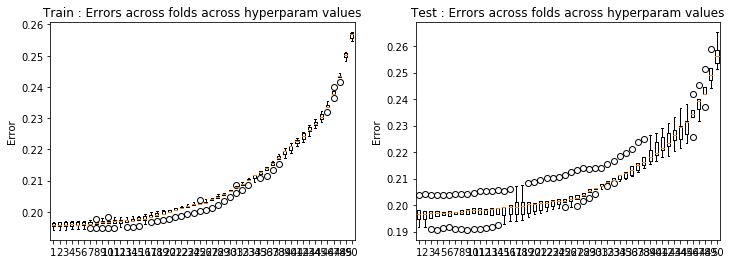

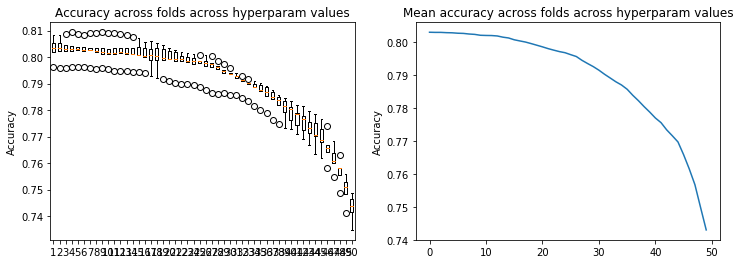

In [66]:
result_crossval(loss_tr42,loss_te42)
result_crossval_accuracy(acc42)

In [38]:
# test 43: degree 7, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr43, loss_te43, w43, acc43= cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 7, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  2.17353944e+00  2.38996311e-01 -2.00302389e+00
  1.92793190e+00  2.53309665e-01 -4.02704776e+00  1.16471249e+00
 -5.89274940e-02  5.27033384e-01  1.20315498e-02 -3.40908397e-02
  1.01508080e+00  1.96057098e-02  2.94505269e-02 -9.48632589e-02
  9.24109888e-03 -6.30918904e-02 -5.28171698e-03  9.94392148e-03
 -2.74919785e+01 -1.43214308e+00  3.21322272e+00 -3.97494698e+00
 -3.30911364e-01  1.56131505e+01 -2.37731353e+00  7.93763607e-02
  1.18998465e+00  8.88474397e-03 -1.66087415e-02 -4.79226524e+00
 -5.57560654e-02  6.15473623e-03  1.46941855e+00 -3.59527697e-03
 -4.88248307e-01  1.81991374e-01 -3.89590698e-02  9.58102404e+01
  4.73193854e+00  1.02159323e+01  4.20929351e+00 -1.85259651e+00
 -1.97411688e+01  2.58487570e+00  3.60836852e-01 -3.87607951e+00
 -1.08790340e-01  1.8237

Ridge regression: w=[-2.76819782e-01  2.06889287e+00  1.70718940e-01 -1.91717570e+00
  1.72342571e+00  1.76009294e-01 -2.76336611e+00  1.40561411e+00
 -4.61734458e-02  1.20457731e+00  2.68146967e-02 -2.50928101e-02
  1.35372971e+00  4.84560164e-03  1.42097226e-02 -2.74836374e-01
  2.56633286e-03 -1.78704743e-01 -1.45814030e-03 -1.44166898e-03
 -2.70344891e+01 -1.06250604e+00  2.85378403e+00 -2.81542312e+00
  1.03215939e-01  1.08295161e+01 -2.20847941e+00  8.12810019e-02
 -1.45506171e+00  2.30157682e-02  1.62549930e-02 -6.47450115e+00
 -6.51810755e-02  9.89244858e-04  2.49727914e+00  1.75475865e-03
 -2.22717694e-01  1.79673075e-01 -1.85848136e-02  9.51608448e+01
  4.16497941e+00  1.09613915e+01  1.71644057e+00 -3.24086968e+00
 -1.32840739e+01  6.41192904e-01  1.91939724e-01  4.25895382e-01
 -1.84847118e-01  1.24652039e-01  9.88180944e+00 -3.74074564e-02
 -3.91680169e-02 -6.61145109e+00  1.22963473e-02  2.92050910e+00
 -2.97481287e-02  2.61627034e-03 -1.31394057e+02 -1.40916015e+01
 -3.9

Ridge regression: w=[-2.78869250e-01  1.58177740e+00  1.57480419e-01 -2.10555739e+00
  1.65541006e+00  2.47398235e-01 -3.01735199e+00  1.49625849e+00
 -4.42917136e-02  8.94458666e-01  3.15500881e-02 -2.73829922e-02
  7.00900233e-01  1.80084912e-03  1.00958289e-02 -1.75725768e-03
  9.96572704e-03 -1.42205994e-01 -4.97709947e-03  2.06090385e-03
 -2.33158822e+01 -9.67200127e-01  4.09322351e+00 -2.29299561e+00
 -7.38172915e-01  1.16804739e+01 -2.52513366e+00  1.11222429e-01
  1.92484855e-01  1.00817685e-02  1.85268481e-03 -4.57139222e+00
 -7.57195785e-02 -1.46528721e-02  6.61191469e-01 -1.17045100e-02
 -2.09598472e-01  1.85672870e-01  7.24309636e-03  8.26450211e+01
  3.60855267e+00  6.62908064e+00  1.16937822e+00  8.52529766e-01
 -1.41314298e+01  1.32361563e+00  1.89241786e-01 -2.39701962e+00
 -2.08009658e-01  1.69093436e-01  8.27360141e+00 -4.88294995e-02
 -2.15723275e-02 -1.35613635e+00 -5.54430989e-02  2.10014692e+00
  5.99674428e-04 -3.85544720e-02 -1.08609356e+02 -1.25694741e+01
 -3.0

Ridge regression: w=[-2.78727903e-01  1.08836292e+00  1.19831296e-01 -1.91250497e+00
  1.79032709e+00  3.40371663e-01 -2.21320297e+00  7.87660325e-01
 -7.78444391e-02  1.43262872e+00  1.41637406e-02 -1.63630979e-02
  8.28209346e-01  4.75471351e-03  1.25483654e-02 -1.47707009e-01
  2.10627829e-02 -6.48204652e-02 -5.37355384e-03 -6.96705618e-04
 -1.99111884e+01 -3.00459758e-01  3.54245437e+00 -3.06599179e+00
 -1.16330405e+00  8.41308321e+00 -8.22428302e-01  5.51706328e-02
 -2.85657333e+00  4.51331878e-04 -1.38004750e-03 -3.48911171e+00
 -4.98415560e-02  2.23308565e-03  1.68243939e+00  1.17166644e-02
 -3.75306078e-01  1.63313687e-01 -2.32251989e-02  7.24705300e+01
  3.16068927e-01  5.64837828e+00  2.61863052e+00  1.16262815e+00
 -9.25981096e+00 -4.77343927e-01  3.31272870e-01  2.66207816e+00
 -1.23944067e-01  1.06044195e-01  4.83668300e+00 -5.42814180e-02
 -6.60126765e-02 -4.41965505e+00 -1.00429839e-01  2.11139356e+00
  1.00674242e-02 -2.88519170e-02 -9.14981767e+01 -4.75505464e+00
 -2.4

Ridge regression: w=[-2.75017651e-01  3.88313718e-01  1.00316681e-01 -2.22906473e+00
  2.07701935e+00  2.99858584e-01 -2.16658089e+00  9.23872958e-01
 -9.32969511e-02  1.14359744e+00  2.71461236e-02 -4.42907887e-02
  2.89063495e-01  8.52855799e-03  2.50128827e-02 -1.68909550e-01
  6.17057693e-03 -1.47206681e-01 -1.16394972e-02 -1.94120626e-02
 -1.54358167e+01 -2.06822417e-01  5.42763435e+00 -4.14208013e+00
 -9.88497699e-01  8.42592132e+00 -3.71577481e-01  9.67142805e-02
 -9.51609148e-01  1.46451267e-02 -2.92045678e-03 -2.15442780e+00
 -7.06653787e-02 -2.79587568e-03  1.92823000e+00  7.82950596e-03
  1.41095416e-01  1.80214123e-01 -1.13761990e-03  6.04810899e+01
  4.78966682e-02  1.20412617e+00  4.00174088e+00  1.01770259e+00
 -9.55442736e+00 -2.12147681e+00  3.93972625e-01 -1.22170701e+00
 -2.03107293e-01  2.05283470e-01  3.75508840e+00 -6.13341164e-02
 -1.25501864e-01 -5.44430757e+00 -5.08338379e-02  1.06604587e+00
  3.16283881e-02  4.98714724e-02 -7.57564064e+01 -4.14144746e+00
 -1.8

Ridge regression: w=[-2.76431071e-01  3.46917712e-02  1.45299765e-01 -1.88888312e+00
  2.23040015e+00  2.93974360e-01 -2.29033111e+00  1.04990899e+00
 -5.55959802e-02  7.16108927e-01  1.22923281e-02 -3.40552183e-02
  2.59960726e-01  2.01355693e-02  2.88506315e-02 -8.63749306e-02
  9.62036656e-03 -1.92963110e-01 -5.45338128e-03  9.96276096e-03
 -1.31667203e+01 -4.09897174e-01  3.91196042e+00 -5.32276325e+00
 -8.16391955e-01  8.32392695e+00 -1.79666826e+00  7.49008888e-02
  2.01381405e-01  9.26663284e-03 -1.63852765e-02 -1.63087044e+00
 -5.63663103e-02  6.55733141e-03  1.45208838e+00 -2.75630058e-03
  2.01470771e-01  1.81996871e-01 -3.93814447e-02  5.40847063e+01
  1.21107523e-01  3.04590425e+00  6.86536472e+00  5.63451733e-01
 -8.55395911e+00  1.14538039e+00  3.36425237e-01 -1.92522018e+00
 -1.11306478e-01  1.80307348e-01  2.69880046e+00 -1.29694067e-01
 -1.20069467e-01 -4.41687136e+00 -6.51926590e-02  1.21789352e+00
 -5.47342822e-03 -7.63361158e-02 -6.62605895e+01 -2.95567542e+00
 -1.6

Ridge regression: w=[-2.76819763e-01 -6.13889943e-02  7.30018896e-02 -1.80572440e+00
  2.12222740e+00  2.36441770e-01 -1.62833077e+00  1.46034268e+00
 -4.38901220e-02  1.18044273e+00  2.69018335e-02 -2.52424913e-02
  3.19640335e-01  5.32073497e-03  1.35002995e-02 -2.49566149e-01
  2.86340560e-03 -3.31204849e-01 -1.73695095e-03 -1.54311468e-03
 -1.27603787e+01  9.73392331e-03  3.62294183e+00 -4.70140847e+00
 -6.15954823e-01  6.08430443e+00 -2.21887849e+00  7.67982414e-02
 -1.28574791e+00  2.35987368e-02  1.64438494e-02 -2.27080517e+00
 -6.52420378e-02  1.38697248e-03  2.33895294e+00  2.71164167e-03
  5.61439633e-01  1.79535838e-01 -1.89301255e-02  5.36211969e+01
 -6.84387551e-01  3.45848942e+00  5.50500498e+00  3.20657782e-01
 -6.06141417e+00  3.34073571e-01  1.72422447e-01  3.10541292e-01
 -1.86159481e-01  1.24028950e-01  3.71612597e+00 -3.92392758e-02
 -3.71451658e-02 -6.18707438e+00  1.13900206e-02  1.30668597e+00
 -2.93026469e-02  2.00363591e-03 -6.61674505e+01 -2.62787452e+00
 -1.7

Ridge regression: w=[-2.78869221e-01 -5.98868685e-01  6.84775095e-02 -1.87588839e+00
  2.04251251e+00  2.54108760e-01 -1.74084601e+00  1.45421822e+00
 -4.09449974e-02  1.00836075e+00  3.16607223e-02 -2.78056995e-02
 -2.18503120e-01  2.29863230e-03  9.74356386e-03 -2.49964597e-02
  1.05930620e-02 -2.84847422e-01 -5.05134012e-03  1.71477525e-03
 -9.49945302e+00  2.93866532e-02  3.89293126e+00 -3.85714995e+00
 -8.35558996e-01  6.32422621e+00 -2.28356335e+00  1.06453280e-01
 -4.16748716e-01  1.09023678e-02  2.58335646e-03 -6.85000515e-01
 -7.54993925e-02 -1.43494913e-02  9.57111077e-01 -1.10385526e-02
  4.67473525e-01  1.85412821e-01  7.10561055e-03  4.54369452e+01
 -9.62899609e-01  2.56353301e+00  3.60069012e+00  1.39554506e+00
 -5.93519529e+00  7.10903569e-01  1.66153735e-01 -1.08696292e+00
 -2.09650129e-01  1.69617140e-01  2.35163215e+00 -5.07660771e-02
 -2.10309219e-02 -2.80690861e+00 -5.74132569e-02  9.65973571e-01
  5.46140449e-04 -3.82939544e-02 -5.65869827e+01 -1.63252475e+00
 -1.4

Ridge regression: w=[-2.78727862e-01 -1.15606401e+00  8.66660489e-02 -1.63146566e+00
  2.15008210e+00  3.55544486e-01 -1.38493519e+00  8.93091607e-01
 -7.65953792e-02  1.20655453e+00  1.44243941e-02 -1.55758581e-02
  2.21643930e-01  5.05521063e-03  1.25133190e-02 -1.27566232e-01
  2.19758788e-02 -2.18647153e-01 -5.13054773e-03  4.36141984e-04
 -6.23041608e+00  1.29401328e-01  2.79111497e+00 -4.32416276e+00
 -1.40233154e+00  4.98203384e+00 -1.04882792e+00  5.18567370e-02
 -1.78874784e+00  8.13186926e-04 -1.23227260e-03 -1.08921883e+00
 -4.99308798e-02  2.36569600e-03  1.60393175e+00  1.29069307e-02
  3.72766161e-01  1.62933355e-01 -2.34359859e-02  3.80305797e+01
 -1.83175025e+00  4.04653442e+00  4.22170210e+00  2.55785065e+00
 -4.07722377e+00 -3.06699889e-01  3.24218264e-01  1.07606422e+00
 -1.26019277e-01  1.01840000e-01  1.35382759e+00 -5.56455944e-02
 -6.61388250e-02 -4.45450102e+00 -1.03712728e-01  8.01544876e-01
  8.43487254e-03 -3.33132248e-02 -4.92688151e+01  7.00312007e-01
 -1.4

Ridge regression: w=[-2.75017591e-01 -1.89048484e+00  7.55941798e-02 -1.88795454e+00
  2.28212523e+00  3.09243923e-01 -1.23867981e+00  1.33081864e+00
 -9.27539062e-02  1.41013895e+00  2.73335821e-02 -4.39130783e-02
 -2.90282200e-01  8.94139559e-03  2.44804124e-02 -1.11807594e-01
  7.41088831e-03 -2.65433046e-01 -1.16570662e-02 -1.91985637e-02
 -1.92431943e+00  1.44485946e-01  4.20133157e+00 -4.56832679e+00
 -1.15892801e+00  4.62712904e+00 -1.46877553e+00  9.27109494e-02
 -1.70571252e+00  1.46637835e-02 -2.90966381e-03 -1.39737458e-01
 -7.13138630e-02 -2.30402511e-03  1.54936084e+00  8.24748501e-03
  7.14202853e-01  1.80092740e-01 -1.43562281e-03  2.81058866e+01
 -1.81437908e+00  1.32070949e+00  3.91860737e+00  2.06566349e+00
 -3.91163645e+00 -7.00065401e-01  3.89684450e-01  5.08416842e-02
 -2.05077903e-01  2.03695262e-01  8.70380332e-01 -6.24979806e-02
 -1.22302417e-01 -4.39662248e+00 -5.52062656e-02  3.77836054e-02
  3.13340085e-02  4.93984063e-02 -4.01538435e+01  7.88209807e-01
 -1.2

Ridge regression: w=[-2.76430984e-01 -2.32349286e+00  1.30052206e-01 -1.65998798e+00
  2.31427312e+00  2.98082216e-01 -1.43810582e+00  9.30495951e-01
 -5.47917373e-02  7.78069639e-01  1.25711453e-02 -3.34840757e-02
 -6.71094496e-02  2.08351225e-02  2.82265180e-02 -3.02173898e-02
  1.10942513e-02 -3.18254282e-01 -5.85180785e-03  1.06289984e-02
  5.30577326e-01 -1.75127447e-01  3.18862102e+00 -4.87974652e+00
 -9.05922979e-01  4.91705494e+00 -1.37747301e+00  7.09327554e-02
 -3.25488908e-01  9.62038809e-03 -1.62469663e-02 -1.84409292e-01
 -5.73540026e-02  7.21663520e-03  1.10502166e+00 -1.69441113e-03
  8.39861693e-01  1.81497208e-01 -4.02361842e-02  2.25492372e+01
 -1.18311836e+00  2.63403431e+00  4.78861258e+00  1.15270834e+00
 -3.61462705e+00  3.95352518e-01  3.29183706e-01 -7.18822478e-01
 -1.15445426e-01  1.76455998e-01  5.21483622e-01 -1.31957376e-01
 -1.19114451e-01 -3.59851122e+00 -7.03424501e-02 -7.84377166e-03
 -4.33570313e-03 -7.96720978e-02 -3.50488057e+01  6.12439242e-01
 -1.1

Ridge regression: w=[-2.76819676e-01 -2.40204391e+00  6.37285011e-02 -1.57426635e+00
  2.29740878e+00  2.41785117e-01 -1.05268934e+00  1.43504092e+00
 -4.51517459e-02  1.06761818e+00  2.71638201e-02 -2.52596935e-02
 -1.33228121e-01  5.61042926e-03  1.20567425e-02 -1.72166951e-01
  4.31993254e-03 -4.88418599e-01 -2.06052668e-03 -1.26711561e-03
  8.71007418e-01  2.14080224e-01  2.91145449e+00 -4.75522226e+00
 -7.43638837e-01  3.79745394e+00 -2.18577242e+00  7.37566094e-02
 -9.39154938e-01  2.46025403e-02  1.64104439e-02 -3.38722136e-01
 -6.54788464e-02  1.56778952e-03  1.84513702e+00  4.30919240e-03
  1.35831856e+00  1.78848646e-01 -1.99520051e-02  2.21987251e+01
 -1.96691573e+00  2.96558942e+00  4.38874445e+00  1.17509403e+00
 -2.77268248e+00  3.42860157e-01  1.75896074e-01 -1.71499176e-02
 -1.89406411e-01  1.23020794e-01  8.01944141e-01 -4.06799691e-02
 -3.23224339e-02 -4.95137119e+00  5.64294658e-03 -1.97629355e-01
 -2.90856257e-02 -8.28932938e-04 -3.51160296e+01  1.08608082e+00
 -1.1

Ridge regression: w=[-2.78869094e-01 -2.90914348e+00  7.30256633e-02 -1.78160592e+00
  2.30917417e+00  2.41850832e-01 -1.14287849e+00  1.28051830e+00
 -4.12228417e-02  9.31230488e-01  3.17830030e-02 -2.83755927e-02
 -4.57461712e-01  2.79649532e-03  9.36376503e-03  2.05357417e-02
  1.23139179e-02 -4.18732114e-01 -5.46670474e-03  1.41591396e-03
  3.79265151e+00  1.14271597e-01  3.77209326e+00 -4.27777655e+00
 -7.59514455e-01  4.01339900e+00 -1.91512445e+00  1.03534311e-01
 -4.92391183e-01  1.19890299e-02  2.95144712e-03  5.99637466e-01
 -7.54936093e-02 -1.39446519e-02  7.09731709e-01 -1.02356245e-02
  1.13533624e+00  1.84820914e-01  6.87981885e-03  1.55504833e+01
 -1.80919095e+00  1.35669241e+00  2.95895239e+00  1.26167552e+00
 -2.73456475e+00  3.65684159e-01  1.66357058e-01 -5.45061282e-01
 -2.12729062e-01  1.70957460e-01  1.87490585e-01 -5.31793969e-02
 -2.01168987e-02 -2.39604729e+00 -6.39381182e-02 -2.37120905e-01
  1.62123510e-03 -3.85250309e-02 -2.92293712e+01  1.25108649e+00
 -1.0

Ridge regression: w=[-2.78727676e-01 -3.31428098e+00  1.18794929e-01 -1.73040445e+00
  2.36479966e+00  3.21722275e-01 -9.35904457e-01  8.85677869e-01
 -7.82424911e-02  9.96043737e-01  1.48248134e-02 -1.43542581e-02
  3.88423415e-02  5.42047883e-03  1.25150571e-02 -3.50023131e-02
  2.36772908e-02 -3.28089209e-01 -5.13243063e-03  2.14383927e-03
  6.25406427e+00 -3.61885516e-02  3.65549131e+00 -4.43095082e+00
 -1.19021225e+00  3.40426163e+00 -1.12633152e+00  5.09489427e-02
 -1.08169903e+00  1.26087120e-03 -1.24914710e-03 -3.00345467e-01
 -5.02910181e-02  2.21771647e-03  1.02590950e+00  1.45222177e-02
  9.41471693e-01  1.62352266e-01 -2.42756029e-02  1.01210961e+01
 -1.70678716e+00  1.13159425e+00  2.90145132e+00  2.16369020e+00
 -2.16748305e+00 -4.15232548e-02  3.34785059e-01  2.37310231e-01
 -1.29666090e-01  9.59669600e-02  1.79554079e-01 -5.77989688e-02
 -6.58856988e-02 -3.08686606e+00 -1.09523399e-01 -2.60251462e-01
  7.30689437e-03 -3.91752768e-02 -2.49179535e+01  1.57736554e+00
 -9.4

Ridge regression: w=[-2.75017324e-01 -3.69782554e+00  1.13510027e-01 -1.96519224e+00
  2.31798196e+00  2.75497084e-01 -7.28463883e-01  1.19178615e+00
 -9.55168116e-02  1.20715059e+00  2.74613147e-02 -4.32820128e-02
 -3.14264169e-01  9.11847495e-03  2.36848031e-02  1.01250008e-03
  9.12646736e-03 -3.11660769e-01 -1.19832501e-02 -1.88995042e-02
  8.59497496e+00 -8.02994318e-02  5.00847935e+00 -4.13026227e+00
 -9.41883712e-01  2.89622463e+00 -1.44580622e+00  9.24760405e-02
 -1.43164415e+00  1.48062370e-02 -3.19269753e-03  2.65882632e-01
 -7.24112708e-02 -1.77276507e-03  8.30232550e-01  8.28999936e-03
  9.74971937e-01  1.80029253e-01 -1.81605185e-03  4.58559269e+00
 -1.48298512e+00 -1.38712138e+00  2.11255477e+00  1.61508889e+00
 -1.95686802e+00 -2.21301210e-01  4.03096191e-01  2.49747826e-01
 -2.07059872e-01  2.01283681e-01  5.89184579e-02 -6.28024110e-02
 -1.17784662e-01 -2.61374880e+00 -6.08940015e-02 -4.89389447e-01
  3.18090652e-02  4.91017025e-02 -2.00351496e+01  1.32526703e+00
 -8.0

Ridge regression: w=[-2.76430592e-01 -3.86824172e+00  1.59785306e-01 -1.85917931e+00
  2.21040679e+00  2.79532730e-01 -8.45604182e-01  7.17146693e-01
 -5.66261282e-02  6.29873310e-01  1.27267099e-02 -3.24703952e-02
 -7.58503212e-02  2.16006261e-02  2.77146007e-02  8.14946985e-02
  1.27960914e-02 -3.49695517e-01 -6.47902718e-03  1.13497240e-02
  9.69464488e+00 -3.64316896e-01  4.66276632e+00 -3.83979086e+00
 -7.94180171e-01  3.06556505e+00 -9.73808673e-01  7.11682560e-02
 -2.36201874e-01  9.87305954e-03 -1.58447369e-02  1.19769963e-01
 -5.85931286e-02  8.06454039e-03  3.92162234e-01 -1.28858176e-03
  1.05989875e+00  1.81435340e-01 -4.10198764e-02  1.82779462e+00
 -8.55087419e-01 -1.35954027e+00  2.00758052e+00  9.41661815e-01
 -1.85634664e+00  1.09076498e-01  3.33315105e-01 -3.68420306e-01
 -1.18888250e-01  1.71389129e-01 -5.89490818e-02 -1.34386182e-01
 -1.18020543e-01 -1.84622544e+00 -7.58617012e-02 -5.27199033e-01
 -2.37951491e-03 -8.19787646e-02 -1.74671849e+01  8.90323266e-01
 -7.2

Ridge regression: w=[-2.76819284e-01 -3.91953558e+00  1.10602405e-01 -1.78741046e+00
  2.22276606e+00  2.15692851e-01 -6.10133667e-01  1.08870264e+00
 -5.01121461e-02  7.62840424e-01  2.73314949e-02 -2.50768314e-02
 -9.73117456e-02  5.87803940e-03  1.06000631e-02 -2.82840991e-02
  5.83695560e-03 -5.16914907e-01 -2.47210050e-03 -8.96433852e-04
  9.93546338e+00 -8.95330060e-02  4.45052500e+00 -3.88224886e+00
 -5.76767823e-01  2.43359604e+00 -1.67479103e+00  7.51829501e-02
 -4.35742028e-01  2.54594231e-02  1.63784880e-02  2.02240693e-02
 -6.60251556e-02  1.51885245e-03  9.27340399e-01  5.49249983e-03
  1.60571799e+00  1.78535215e-01 -2.13670603e-02  1.60567738e+00
 -1.37242312e+00 -1.14258066e+00  1.94286385e+00  8.37774120e-01
 -1.51389084e+00  3.05743348e-01  1.98586580e-01 -2.13471389e-01
 -1.91787404e-01  1.21708719e-01  8.10715302e-03 -4.20981745e-02
 -2.66063461e-02 -2.68908190e+00  9.89316329e-05 -8.37589385e-01
 -2.84306406e-02 -2.58741840e-03 -1.76010903e+01  1.18119920e+00
 -7.2

Ridge regression: w=[-2.78868519e-01 -4.04186911e+00  1.24259327e-01 -1.93683106e+00
  2.14359866e+00  2.14793292e-01 -5.89435234e-01  8.56456317e-01
 -4.51890682e-02  6.37443669e-01  3.17735613e-02 -2.84557158e-02
 -2.52748547e-01  3.30159439e-03  9.34197106e-03  1.04233555e-01
  1.38988987e-02 -4.20060113e-01 -5.91382875e-03  1.44116865e-03
  1.08541432e+01 -2.30282219e-01  5.08732747e+00 -3.39837098e+00
 -5.70924620e-01  2.38677005e+00 -1.25122483e+00  1.06087599e-01
 -1.58945245e-01  1.27431375e-02  3.30483192e-03  4.93504597e-01
 -7.58584142e-02 -1.32009871e-02  1.85488477e-01 -1.03802783e-02
  1.25178764e+00  1.84663456e-01  6.54770304e-03 -9.83676512e-01
 -1.05722352e+00 -2.30900019e+00  1.12806551e+00  7.65887867e-01
 -1.44629952e+00  1.95942417e-01  1.85211389e-01 -4.35997519e-01
 -2.14774066e-01  1.70733592e-01 -2.23185637e-01 -5.52884347e-02
 -1.93530195e-02 -1.14811026e+00 -6.87231017e-02 -6.36584745e-01
  2.95313716e-03 -3.78311285e-02 -1.49263328e+01  1.04602626e+00
 -6.3

Ridge regression: w=[-2.78726839e-01 -4.03392797e+00  1.70232577e-01 -1.84432223e+00
  2.01165614e+00  2.65622744e-01 -3.66119953e-01  6.06232265e-01
 -8.19917289e-02  6.77659484e-01  1.49271267e-02 -1.31305435e-02
  1.06745350e-01  5.99041753e-03  1.28741397e-02  7.64708572e-02
  2.49006273e-02 -3.02657919e-01 -5.13301788e-03  3.52514607e-03
  1.13272010e+01 -4.05527400e-01  4.90673148e+00 -3.11011587e+00
 -8.04115220e-01  1.83520422e+00 -7.38994488e-01  5.55321920e-02
 -4.80292509e-01  1.27415075e-03 -5.47369882e-04 -2.17566108e-01
 -5.07959807e-02  2.17961308e-03  3.14871642e-01  1.51775676e-02
  9.57141915e-01  1.62736686e-01 -2.53209960e-02 -2.76844814e+00
 -7.93582154e-01 -2.52977913e+00  9.28894198e-01  1.16146906e+00
 -1.18488874e+00 -8.10785671e-03  3.50174927e-01 -8.93140635e-02
 -1.31203337e-01  9.06338340e-02 -9.64226934e-02 -6.05967734e-02
 -6.56986337e-02 -1.33674445e+00 -1.12158137e-01 -5.31394246e-01
  6.57321650e-03 -4.14912818e-02 -1.30262392e+01  9.38932512e-01
 -5.6

Ridge regression: w=[-2.75016121e-01 -3.96708289e+00  1.55376220e-01 -1.84369473e+00
  1.75514502e+00  2.29177130e-01 -1.54104707e-01  6.88606044e-01
 -9.85688990e-02  7.06710864e-01  2.68586338e-02 -4.20181273e-02
 -7.87133107e-02  9.31667549e-03  2.25675537e-02  9.95941667e-02
  1.04612549e-02 -2.44776351e-01 -1.24349670e-02 -1.84602673e-02
  1.14204445e+01 -4.01215613e-01  5.32963487e+00 -2.44715606e+00
 -6.32456440e-01  1.31998026e+00 -7.68540913e-01  9.85179987e-02
 -6.29187526e-01  1.52139485e-02 -2.67553003e-03  6.91473774e-02
 -7.38725181e-02 -6.01607274e-04  2.03297245e-01  7.41122526e-03
  8.15038610e-01  1.80567328e-01 -1.89743503e-03 -4.01294877e+00
 -6.60197279e-01 -3.56457919e+00  3.75945979e-01  8.24812769e-01
 -9.92614776e-01 -1.54006311e-01  4.10708597e-01  8.01597070e-02
 -2.05051817e-01  1.95459032e-01 -9.44116124e-02 -6.27499508e-02
 -1.11132109e-01 -1.06905899e+00 -6.29388269e-02 -5.02984455e-01
  3.32579762e-02  5.01279311e-02 -1.10295602e+01  7.14732868e-01
 -4.9

Ridge regression: w=[-2.76428832e-01 -3.78792070e+00  1.79553974e-01 -1.68239826e+00
  1.50456061e+00  2.53375708e-01 -1.69733987e-01  4.20658375e-01
 -5.90664902e-02  4.11138568e-01  1.22444684e-02 -2.99877353e-02
  4.92128673e-02  2.23909660e-02  2.74677263e-02  1.57536283e-01
  1.42382139e-02 -2.52169979e-01 -7.04754015e-03  1.21065382e-02
  1.09814867e+01 -5.43826700e-01  4.81114425e+00 -1.84255470e+00
 -6.48157198e-01  1.25348305e+00 -5.03727098e-01  7.72656193e-02
  6.36098686e-03  9.79942033e-03 -1.42540440e-02  9.37479147e-03
 -6.01271007e-02  1.02633981e-02 -1.03438450e-01 -2.48858533e-03
  8.08998459e-01  1.82670569e-01 -4.06732726e-02 -4.25687348e+00
 -3.58364848e-01 -3.31034167e+00  1.62523350e-01  6.26537062e-01
 -8.66030593e-01 -2.54735129e-02  3.30464119e-01 -2.87884929e-01
 -1.17913660e-01  1.61398239e-01 -1.47058778e-01 -1.36446380e-01
 -1.14526145e-01 -5.85159345e-01 -7.90011685e-02 -4.90522912e-01
 -2.72371911e-05 -8.07538846e-02 -9.75920033e+00  5.05098829e-01
 -4.3

Ridge regression: w=[-2.76817521e-01 -3.81165113e+00  1.48117981e-01 -1.64291174e+00
  1.51617822e+00  1.88298030e-01 -7.29844277e-02  5.44848416e-01
 -5.60515243e-02  4.04009281e-01  2.66752544e-02 -2.39130005e-02
  1.14316216e-01  6.64826448e-03  9.96250873e-03  7.48020721e-02
  6.69911265e-03 -3.61803204e-01 -2.79996616e-03 -3.78196728e-04
  1.11275023e+01 -3.86887047e-01  4.71035182e+00 -1.89315250e+00
 -3.94922044e-01  1.00033980e+00 -8.39752381e-01  8.18141854e-02
  6.65284090e-05  2.50876078e-02  1.72510814e-02 -1.16772351e-01
 -6.71393441e-02  1.97486051e-03  2.76708012e-01  4.73163392e-03
  1.19150340e+00  1.79506462e-01 -2.24074330e-02 -4.40056265e+00
 -5.96482687e-01 -3.20986217e+00  1.41916114e-01  3.85764546e-01
 -7.44629087e-01  1.61173714e-01  2.20594197e-01 -2.59728618e-01
 -1.88069479e-01  1.16847658e-01 -1.62841891e-01 -4.51827852e-02
 -2.22391671e-02 -1.08027655e+00 -1.32379842e-03 -7.32155537e-01
 -2.69878247e-02 -4.89781312e-04 -9.85351365e+00  5.73453430e-01
 -4.3

Ridge regression: w=[-2.78865932e-01 -3.57217926e+00  1.50427147e-01 -1.59068764e+00
  1.29971420e+00  1.89630899e-01 -2.62306289e-03  4.04827238e-01
 -5.05277257e-02  3.84885614e-01  3.09159420e-02 -2.69340821e-02
  2.94719676e-02  4.16927225e-03  9.99622337e-03  1.49091371e-01
  1.50104412e-02 -2.69402545e-01 -6.06350496e-03  2.32098761e-03
  1.04500025e+01 -4.63936359e-01  4.61042950e+00 -1.30222329e+00
 -4.18054925e-01  8.27282714e-01 -5.55088137e-01  1.13314100e-01
  4.93971645e-02  1.26736170e-02  4.82177847e-03  7.82948706e-02
 -7.72148080e-02 -1.10023479e-02 -1.03060218e-01 -1.24442852e-02
  8.38586977e-01  1.85526694e-01  6.74539316e-03 -4.36729307e+00
 -4.03900207e-01 -3.33980806e+00 -2.39517134e-01  3.97235150e-01
 -6.47726244e-01  5.74460940e-02  2.03294155e-01 -3.41196249e-01
 -2.11061867e-01  1.63662340e-01 -1.99195380e-01 -5.80405103e-02
 -1.87625051e-02 -4.10673981e-01 -6.91095798e-02 -4.81769056e-01
  3.85388148e-03 -3.58763998e-02 -8.52727288e+00  4.85465136e-01
 -3.8

Ridge regression: w=[-2.78723074e-01 -3.23450581e+00  1.82717132e-01 -1.36897224e+00
  1.03554688e+00  2.19608437e-01  1.48402297e-01  3.31416784e-01
 -8.33808910e-02  4.34480472e-01  1.41146242e-02 -1.08170484e-02
  1.80865177e-01  7.06807987e-03  1.40080209e-02  1.26122155e-01
  2.51107879e-02 -1.54111309e-01 -4.68164932e-03  4.35906536e-03
  9.54185445e+00 -5.59772663e-01  4.00618750e+00 -8.32165582e-01
 -5.37884836e-01  4.83075798e-01 -3.28152059e-01  6.39835850e-02
 -1.21642516e-01 -2.70141927e-04  2.12861703e-03 -2.41671880e-01
 -5.20329705e-02  2.73680131e-03 -3.28650629e-03  1.45021720e-02
  5.43637470e-01  1.64775651e-01 -2.56318731e-02 -4.11631612e+00
 -2.95606561e-01 -3.03177421e+00 -3.05082554e-01  5.45448348e-01
 -5.44168912e-01 -5.63338309e-02  3.41495847e-01 -1.81145877e-01
 -1.27299584e-01  8.03404044e-02 -1.59121826e-01 -6.49228276e-02
 -6.61054508e-02 -5.21352264e-01 -1.09248316e-01 -3.54035840e-01
  4.81161993e-03 -3.69921466e-02 -7.35773825e+00  4.36817089e-01
 -3.2

Ridge regression: w=[-2.75010711e-01 -2.90512469e+00  1.57780409e-01 -1.13726753e+00
  7.61401380e-01  1.90021231e-01  2.49407652e-01  3.58670767e-01
 -9.55672380e-02  3.80996079e-01  2.42756819e-02 -3.84285604e-02
  6.44160965e-02  9.73592696e-03  2.06770575e-02  1.39463746e-01
  1.15758985e-02 -9.41265397e-02 -1.31076141e-02 -1.73346676e-02
  8.51835404e+00 -4.95047077e-01  3.60163748e+00 -3.40932236e-01
 -4.27078001e-01  2.48070668e-01 -3.11531141e-01  1.07620877e-01
 -1.11073885e-01  1.53842632e-02 -4.40785334e-04 -8.40848508e-02
 -7.65222492e-02  2.20116764e-03 -4.40545043e-02  5.31095908e-03
  3.84581744e-01  1.81963764e-01 -7.37104491e-04 -3.59306565e+00
 -3.08507141e-01 -3.04070844e+00 -4.78008375e-01  3.89398593e-01
 -4.69725444e-01 -1.53120346e-01  3.78803460e-01 -4.84801591e-02
 -1.93077407e-01  1.76999021e-01 -1.12674118e-01 -6.22708290e-02
 -9.83066742e-02 -4.48770485e-01 -6.07840413e-02 -2.78351090e-01
  3.63794614e-02  5.14848401e-02 -6.19669481e+00  3.38756281e-01
 -2.8

Ridge regression: w=[-2.76420912e-01 -2.54657924e+00  1.69684541e-01 -9.41341657e-01
  5.60209135e-01  2.13427689e-01  2.17232275e-01  2.39663333e-01
 -5.72050113e-02  3.18330108e-01  1.01420268e-02 -2.39039906e-02
  1.24041695e-01  2.24447251e-02  2.66181339e-02  1.72527357e-01
  1.49185136e-02 -8.65696555e-02 -7.33606062e-03  1.22831017e-02
  7.39396128e+00 -5.53532642e-01  2.93212574e+00  5.23874904e-03
 -4.80711938e-01  2.29463736e-01 -2.20181981e-01  8.52576812e-02
  3.86222475e-02  8.52383693e-03 -1.08321049e-02 -9.53403112e-02
 -6.27777104e-02  1.45758206e-02 -2.24554934e-01 -4.76790959e-03
  3.37233531e-01  1.85260160e-01 -3.80040752e-02 -2.89989208e+00
 -2.11945911e-01 -2.53578152e+00 -4.35955466e-01  3.81289213e-01
 -3.81389130e-01 -9.24377379e-02  2.98795859e-01 -1.95988182e-01
 -1.08175864e-01  1.35051190e-01 -1.40347311e-01 -1.33521470e-01
 -1.03788549e-01 -1.86037845e-01 -7.67892171e-02 -2.44358858e-01
  2.18163147e-03 -7.21098060e-02 -5.24218486e+00  2.96954664e-01
 -2.3

Ridge regression: w=[-2.76809590e-01 -2.54946643e+00  1.50188761e-01 -9.29217683e-01
  5.63095173e-01  1.65265430e-01  2.43569052e-01  2.29863896e-01
 -5.93577576e-02  2.69652139e-01  2.38459844e-02 -2.04040745e-02
  2.10996248e-01  8.04118451e-03  9.88796972e-03  1.20277271e-01
  7.55575410e-03 -1.21516865e-01 -3.12518800e-03 -6.10529035e-05
  7.45562811e+00 -4.65514926e-01  2.92387505e+00 -2.13201628e-02
 -2.78756678e-01  1.63133207e-01 -3.13774775e-01  8.96556530e-02
  6.06159238e-02  2.26027587e-02  1.94336017e-02 -2.00355297e-01
 -6.92637358e-02  3.41005682e-03  2.42276652e-02  2.27555880e-03
  4.90975482e-01  1.81807493e-01 -2.26634925e-02 -2.97207838e+00
 -3.11127942e-01 -2.50940163e+00 -4.63699022e-01  1.59844772e-01
 -3.50852775e-01  2.52788206e-02  2.29422771e-01 -1.75812298e-01
 -1.71495243e-01  1.00507946e-01 -1.94115787e-01 -4.96544831e-02
 -1.88754340e-02 -4.85754427e-01 -2.28937462e-03 -3.51030925e-01
 -2.45555206e-02  6.63301017e-03 -5.28114849e+00  2.77760278e-01
 -2.2

Ridge regression: w=[-2.78854296e-01 -2.20668317e+00  1.41902763e-01 -7.72977985e-01
  4.29536892e-01  1.59892612e-01  2.66258785e-01  1.77752180e-01
 -5.33030620e-02  3.11420422e-01  2.71416870e-02 -2.17458696e-02
  1.45868587e-01  4.81835562e-03  1.12506007e-02  1.59123415e-01
  1.52669643e-02 -8.70900143e-02 -5.71664825e-03  3.00948030e-03
  6.36767543e+00 -4.86426349e-01  2.43009874e+00  1.92650827e-01
 -2.88612517e-01  1.04876958e-01 -1.93608908e-01  1.18332636e-01
  3.79728520e-03  1.14865295e-02  7.66367004e-03 -1.09002021e-01
 -7.98642815e-02 -7.07472168e-03 -1.70475359e-01 -1.52447718e-02
  3.18646314e-01  1.87345401e-01  8.23273497e-03 -2.25557910e+00
 -2.26053021e-01 -2.14086289e+00 -4.55637749e-01  1.90428804e-01
 -2.99806899e-01 -2.57601045e-02  2.11975284e-01 -2.12017796e-01
 -1.90803675e-01  1.37198314e-01 -1.60668577e-01 -5.74919163e-02
 -1.85944311e-02 -1.88147114e-01 -6.41775193e-02 -2.02852670e-01
  3.32374311e-03 -2.91422789e-02 -4.39284931e+00  2.52057204e-01
 -1.8

Ridge regression: w=[-2.78706137e-01 -1.85599073e+00  1.66021456e-01 -5.76164453e-01
  2.70499307e-01  1.70680645e-01  3.27256422e-01  1.93895299e-01
 -7.71210468e-02  3.46149422e-01  1.05526678e-02 -6.22470236e-03
  1.91571598e-01  7.01511577e-03  1.41094809e-02  1.46937090e-01
  2.22667786e-02 -1.91251809e-02 -3.73002211e-03  4.26879786e-03
  5.35369387e+00 -5.39036568e-01  1.83424150e+00  3.48697243e-01
 -3.31830696e-01 -2.22473966e-02 -1.25922550e-01  6.92077685e-02
 -4.24686540e-02 -3.45811040e-03  5.39216908e-03 -2.28000925e-01
 -5.42551869e-02  3.55587277e-03 -1.13905286e-01  1.37379730e-02
  1.62748110e-01  1.67738550e-01 -2.42111268e-02 -1.66583247e+00
 -2.01057394e-01 -1.70606589e+00 -3.13652467e-01  2.30194669e-01
 -2.85868647e-01 -7.73941176e-02  2.97771521e-01 -1.55168251e-01
 -1.08492376e-01  5.69086748e-02 -1.69189504e-01 -6.15148437e-02
 -5.93328966e-02 -2.53616489e-01 -9.14639429e-02 -1.49297348e-01
  1.47284636e-03 -2.65375124e-02 -3.62490622e+00  2.53643185e-01
 -1.4

Ridge regression: w=[-2.74986375e-01 -1.57148589e+00  1.42847830e-01 -3.69224570e-01
  1.70963746e-01  1.46936314e-01  3.45258743e-01  2.09870768e-01
 -8.21349497e-02  2.79813337e-01  1.67997144e-02 -2.97301021e-02
  1.13464919e-01  8.54681156e-03  1.65298816e-02  1.60272736e-01
  1.04214434e-02  1.08331084e-02 -1.29908994e-02 -1.48711084e-02
  4.49730857e+00 -4.81962812e-01  1.36241892e+00  3.94067696e-01
 -2.54616307e-01 -7.14090216e-02 -1.31029304e-01  1.08021159e-01
  2.02096097e-02  1.42728639e-02  1.71842626e-03 -1.30272642e-01
 -7.87428286e-02  5.65187863e-03 -1.45326687e-01  3.73080056e-03
  9.06566639e-02  1.83414845e-01  8.27528234e-04 -1.12587236e+00
 -2.29284219e-01 -1.45697292e+00 -2.51594801e-01  1.47952965e-01
 -2.65287139e-01 -1.21329560e-01  3.01868903e-01 -6.98205636e-02
 -1.53613463e-01  1.29607241e-01 -1.16772619e-01 -5.18513217e-02
 -7.12978868e-02 -2.28416690e-01 -4.79399233e-02 -1.17191681e-01
  3.59910887e-02  4.58199610e-02 -2.98342776e+00  2.14958356e-01
 -1.1

Ridge regression: w=[-2.76385290e-01 -1.31265726e+00  1.48142321e-01 -3.11419344e-01
  1.05646759e-01  1.58438102e-01  2.92659515e-01  1.31649980e-01
 -4.74680549e-02  2.84502987e-01  3.75250686e-03 -1.36371752e-02
  1.53738376e-01  1.75556933e-02  2.17530282e-02  1.66901303e-01
  1.13537875e-02  1.06143320e-02 -6.97135631e-03  9.36550038e-03
  3.75678500e+00 -5.09579898e-01  1.02932067e+00  4.65737171e-01
 -2.72661482e-01 -3.51703737e-02 -9.16595916e-02  8.24814261e-02
  1.10816769e-02  6.36303628e-03 -8.40680190e-03 -1.24198777e-01
 -6.52733258e-02  1.72987830e-02 -2.13557855e-01 -5.70339176e-03
  6.96668923e-02  1.87320912e-01 -3.35730292e-02 -7.10683036e-01
 -1.93030882e-01 -1.10260163e+00 -1.38879305e-01  1.41728301e-01
 -2.06070457e-01 -7.73257868e-02  2.37313420e-01 -1.24241771e-01
 -7.38137953e-02  8.29230244e-02 -1.32325020e-01 -1.03467955e-01
 -7.23538271e-02 -1.09674551e-01 -5.45807983e-02 -9.97952965e-02
  2.03204990e-03 -4.95354688e-02 -2.47601753e+00  2.19569754e-01
 -9.1

Ridge regression: w=[-2.76773919e-01 -1.30915401e+00  1.38006611e-01 -3.00186877e-01
  1.00944978e-01  1.39294054e-01  3.00372083e-01  1.15728750e-01
 -5.61837831e-02  2.56601327e-01  1.56700757e-02 -1.34668129e-02
  2.06386811e-01  7.17429675e-03  9.11827200e-03  1.53613747e-01
  7.90913154e-03  9.89902893e-03 -3.79386597e-03  6.10338076e-04
  3.77589506e+00 -4.65237683e-01  1.04197015e+00  4.44136543e-01
 -1.79614187e-01 -5.03156948e-02 -1.08819820e-01  8.65950909e-02
  1.83911418e-02  1.88768487e-02  1.96903899e-02 -1.91147418e-01
 -7.07700098e-02  4.87257270e-03 -1.15946475e-01  6.55127212e-04
  1.11621746e-01  1.83761892e-01 -2.14643515e-02 -7.36253815e-01
 -2.29944841e-01 -1.10146028e+00 -1.57512171e-01  3.39687632e-02
 -1.99692225e-01 -2.48495393e-02  2.18126878e-01 -1.14244031e-01
 -1.25596181e-01  6.55842219e-02 -1.74459607e-01 -4.10302088e-02
 -1.18310158e-02 -2.40440616e-01 -2.54755006e-03 -1.35461693e-01
 -2.00788717e-02  9.82563704e-03 -2.48658259e+00  1.90110994e-01
 -9.2

Ridge regression: w=[-2.78801967e-01 -1.08149566e+00  1.19677495e-01 -2.58632038e-01
  8.47515123e-02  1.26248017e-01  2.93379779e-01  7.58927344e-02
 -4.93151446e-02  2.82068547e-01  1.56456896e-02 -1.05848769e-02
  1.61192222e-01  2.07369829e-03  1.15774298e-02  1.60964323e-01
  1.20728877e-02  3.17859760e-03 -4.72351770e-03  1.30057886e-03
  3.15725699e+00 -4.49264912e-01  8.16429336e-01  4.36169736e-01
 -1.63034424e-01 -3.76198947e-02 -5.44331548e-02  1.06068013e-01
 -2.54706914e-02  9.21080110e-03  7.99384774e-03 -1.26654539e-01
 -8.10135947e-02 -4.19060717e-03 -1.80780268e-01 -1.46561453e-02
  7.64550339e-02  1.88301941e-01  8.89260652e-03 -4.09752119e-01
 -1.89463260e-01 -8.36972337e-01 -1.04672005e-01  4.36376737e-02
 -1.73531363e-01 -2.95743934e-02  2.01971641e-01 -1.34421350e-01
 -1.27211536e-01  7.76908205e-02 -1.34666608e-01 -3.86284505e-02
 -1.43833350e-02 -1.21057031e-01 -4.40072535e-02 -7.80895316e-02
  2.56418569e-04 -1.30491058e-02 -2.06904270e+00  1.74657348e-01
 -7.5

Ridge regression: w=[-2.78629976e-01 -8.57677635e-01  1.33227034e-01 -2.15871592e-01
  3.06578914e-02  1.26291895e-01  3.03487790e-01  1.05152121e-01
 -6.49862799e-02  2.99509552e-01  1.07530109e-03 -3.09098810e-04
  1.65371146e-01  2.91115913e-03  9.97238314e-03  1.57907985e-01
  1.42434999e-02  3.74208789e-02 -2.86385560e-03  2.87260911e-03
  2.62684384e+00 -4.74819826e-01  6.18252337e-01  4.58680672e-01
 -1.71862692e-01 -7.09396060e-02 -3.10907399e-02  6.05094252e-02
 -1.23206849e-02 -6.34399954e-03  5.40586382e-03 -1.64968912e-01
 -5.69766239e-02  4.20377932e-03 -1.65429800e-01  1.34379927e-02
  1.68977448e-02  1.69825413e-01 -1.96302547e-02 -2.24191107e-01
 -1.83947580e-01 -6.24610044e-01 -2.09347039e-02  4.84593442e-02
 -1.67499112e-01 -4.77099553e-02  2.43887793e-01 -1.15124170e-01
 -5.61446607e-02  2.29350777e-02 -1.41736807e-01 -3.51243074e-02
 -3.30875256e-02 -1.40712755e-01 -4.90362444e-02 -7.37623546e-02
 -1.13526238e-03 -1.64071791e-02 -1.73119097e+00  1.80152543e-01
 -6.0

Ridge regression: w=[-2.74876956e-01 -6.56767743e-01  1.08307562e-01 -1.36417443e-01
  1.72617763e-02  1.12004861e-01  2.85299806e-01  1.04868823e-01
 -6.47402358e-02  2.46743123e-01  2.10266070e-03 -1.74578709e-02
  1.18539857e-01  4.31790945e-03  1.02039558e-02  1.65506115e-01
  5.79659802e-03  4.64799372e-02 -1.04790501e-02 -1.13536061e-02
  2.16906765e+00 -4.30246355e-01  4.51783456e-01  3.92060999e-01
 -1.34540935e-01 -5.63639969e-02 -3.79537266e-02  8.68268128e-02
  4.45313933e-02  9.83683609e-03  8.27556001e-04 -1.01807395e-01
 -7.68913462e-02  8.68740537e-03 -1.79435756e-01  4.47943316e-03
 -3.23506408e-03  1.83382545e-01  1.28211729e-03 -9.46104253e-02
 -1.84351581e-01 -5.11710832e-01  2.69423096e-03  2.00466087e-02
 -1.48539311e-01 -6.02484354e-02  2.30030786e-01 -6.44632090e-02
 -7.14603091e-02  6.22449574e-02 -1.01461095e-01 -2.53407758e-02
 -3.20247630e-02 -1.33584773e-01 -2.26763837e-02 -6.20081340e-02
  2.44057985e-02  3.13540213e-02 -1.44374438e+00  1.57819444e-01
 -5.0

Ridge regression: w=[-2.76225164e-01 -4.78168238e-01  9.94489755e-02 -1.58872110e-01
  1.02803725e-02  1.16521657e-01  2.42984569e-01  5.03070116e-02
 -3.38769877e-02  2.44652189e-01 -6.44652202e-03 -3.71825005e-03
  1.38931385e-01  8.00845209e-03  1.38412025e-02  1.52016520e-01
  4.41733687e-03  3.91997043e-02 -6.18763307e-03  4.37192877e-03
  1.78140971e+00 -4.24529946e-01  3.86233519e-01  3.98666714e-01
 -1.33662612e-01 -2.37818613e-02 -2.44966485e-02  6.38233577e-02
  2.80077498e-02  1.51447619e-03 -9.35871317e-03 -7.77183107e-02
 -6.62980369e-02  1.45716715e-02 -1.75395860e-01 -4.67231689e-03
 -4.74809513e-03  1.86631028e-01 -2.60413006e-02 -3.18732886e-02
 -1.64351467e-01 -3.74112322e-01  4.04372520e-02  8.75033838e-03
 -1.12832881e-01 -2.97868711e-02  1.83638495e-01 -7.81439579e-02
 -1.54202001e-02  2.70435001e-02 -1.00877420e-01 -4.82664770e-02
 -2.84096556e-02 -8.93639780e-02 -1.95091336e-02 -5.21297114e-02
  1.94475128e-04 -2.26313767e-02 -1.21096253e+00  1.58283155e-01
 -4.4

Ridge regression: w=[-2.76613567e-01 -4.75665958e-01  9.51507157e-02 -1.41426025e-01
 -5.16377791e-03  1.15109985e-01  2.46550223e-01  5.04345874e-02
 -4.50743461e-02  2.34497622e-01  2.09002059e-03 -5.81813478e-03
  1.52320890e-01  3.83848486e-03  7.69623164e-03  1.58755089e-01
  7.08376635e-03  4.79844205e-02 -5.54256489e-03  2.13829320e-03
  1.78935746e+00 -4.01781779e-01  3.93429073e-01  3.85848047e-01
 -1.09813854e-01 -2.66906753e-02 -2.45777571e-02  6.69202217e-02
  2.71187066e-02  1.18669158e-02  1.35008786e-02 -1.06680194e-01
 -6.97762623e-02  5.23250614e-03 -1.57971845e-01  1.36350407e-03
  4.87625906e-03  1.83596287e-01 -1.57567491e-02 -3.79817939e-02
 -1.79605246e-01 -3.80312864e-01  3.62332582e-02 -2.24930695e-02
 -1.11920104e-01 -1.36760028e-02  1.88557970e-01 -7.64219797e-02
 -5.02008811e-02  2.72972926e-02 -1.17030614e-01 -1.91022401e-02
 -8.65577261e-04 -1.31025423e-01  2.77366678e-04 -6.81496935e-02
 -9.94016923e-03  5.22755237e-03 -1.21468668e+00  1.33685597e-01
 -4.5

Ridge regression: w=[-2.78566808e-01 -3.08054958e-01  6.56769016e-02 -1.33020880e-01
  9.79171061e-03  1.00559803e-01  2.43742869e-01  2.07149788e-02
 -3.50708986e-02  2.30976657e-01  1.14065496e-04  3.09974641e-05
  1.23299590e-01 -2.35038431e-03  1.10720970e-02  1.44973021e-01
  7.31836030e-03  3.38192373e-02 -3.45437253e-03 -1.20180302e-03
  1.45095451e+00 -3.56287228e-01  3.31408987e-01  3.39599383e-01
 -8.66647065e-02 -8.99383827e-03 -4.12970240e-03  7.54624949e-02
  1.30980280e-02  2.27387750e-03  3.43813793e-03 -6.28866105e-02
 -7.83250769e-02 -2.25207628e-03 -1.49560920e-01 -9.56157973e-03
  6.56912032e-03  1.85726418e-01  7.23840714e-03 -7.30730820e-03
 -1.54635421e-01 -2.89015914e-01  3.91464778e-02 -1.94818081e-02
 -1.04424972e-01 -8.35144767e-03  1.69949372e-01 -7.79292061e-02
 -4.05832336e-02  2.12649998e-02 -8.56175596e-02 -1.17008615e-02
 -7.20714211e-03 -8.84509710e-02 -2.00764789e-02 -4.55423732e-02
 -3.50297819e-03  2.80155960e-03 -1.01407242e+00  1.08679975e-01
 -4.0

Ridge regression: w=[-2.78287884e-01 -1.52033395e-01  6.20939876e-02 -1.11435795e-01
  3.35070378e-04  9.37257808e-02  2.32938559e-01  3.89663147e-02
 -4.30220026e-02  2.37504429e-01 -8.46464566e-03  2.73615660e-03
  1.13778400e-01 -1.09627736e-03  5.54298519e-03  1.36059454e-01
  6.98352588e-03  5.08290605e-02 -2.44316090e-03  4.79974016e-04
  1.15388522e+00 -3.48556038e-01  2.60804701e-01  3.14436023e-01
 -8.31381903e-02 -1.19984813e-02  8.90040793e-03  4.51788967e-02
  3.24830280e-02 -1.16147294e-02  1.59012399e-03 -6.76004231e-02
 -6.07649382e-02  5.76416749e-03 -1.34640174e-01  1.08593931e-02
 -1.31032084e-02  1.70503793e-01 -9.12689572e-03 -2.19087534e-02
 -1.49478302e-01 -2.31759254e-01  5.54017797e-02 -1.49779357e-02
 -9.31494519e-02 -1.32804157e-02  1.86203537e-01 -6.95204650e-02
  2.59850107e-04  8.92097528e-04 -8.39035334e-02 -9.14807908e-03
 -8.97497887e-03 -8.76099438e-02 -1.30617185e-02 -5.08978512e-02
 -9.88236578e-04 -9.06315709e-03 -8.46515621e-01  9.96812370e-02
 -3.5

Ridge regression: w=[-2.74385815e-01 -1.23540244e-02  3.02095946e-02 -4.54577818e-02
  6.22429099e-03  8.37243115e-02  2.16066697e-01  3.09968721e-02
 -3.74785541e-02  2.07953515e-01 -9.07439803e-03 -9.92739807e-03
  9.51676443e-02  1.54145230e-03  6.85398540e-03  1.32212207e-01
  1.99181456e-03  4.89141575e-02 -7.16995892e-03 -8.02861838e-03
  8.88505891e-01 -2.97901166e-01  1.73562422e-01  2.42358289e-01
 -6.50625807e-02  2.10270172e-03  1.48272657e-03  6.10679983e-02
  5.65205489e-02 -3.26207691e-03 -2.25965186e-03 -3.70490648e-02
 -6.98138934e-02  1.14041592e-02 -1.26317757e-01  5.45046591e-03
 -1.22265346e-02  1.79720945e-01  2.49537889e-03 -4.02635485e-02
 -1.35173188e-01 -2.22535806e-01  4.86265304e-02 -1.81966152e-02
 -8.20696379e-02 -1.78178002e-02  1.60263842e-01 -4.49042460e-02
 -4.62450414e-03  2.24754186e-02 -6.25174463e-02 -7.59136157e-03
 -8.65436107e-03 -8.51568814e-02 -4.50685841e-03 -4.05480019e-02
  9.39810600e-03  1.98011601e-02 -6.94169251e-01  7.56791980e-02
 -3.1

Ridge regression: w=[-2.75507137e-01  8.89095078e-02  8.68370466e-03 -4.15927662e-02
  2.50223438e-02  8.52195963e-02  1.90962887e-01  3.65886412e-04
 -8.96879777e-03  1.98505164e-01 -1.10399540e-02  2.95188425e-05
  1.07825057e-01  2.35024966e-03  9.49781733e-03  1.10608568e-01
  3.87685598e-04  4.04837939e-02 -5.68406768e-03  1.21317594e-03
  6.84189915e-01 -2.67828972e-01  1.25933007e-01  2.16659663e-01
 -5.97463187e-02  1.40267627e-02 -8.31599943e-04  4.90090267e-02
  4.94508595e-02 -1.02090376e-02 -1.13081157e-02 -1.96703903e-02
 -6.44492342e-02  8.23239030e-03 -9.90289078e-02 -4.87046626e-03
 -8.94039580e-03  1.80572937e-01 -1.46327084e-02 -5.99362252e-02
 -1.17307011e-01 -1.91817930e-01  4.71373504e-02 -2.67981551e-02
 -6.51743356e-02 -2.19110160e-03  1.22439768e-01 -4.23172437e-02
  1.83281252e-02  1.67060278e-03 -5.97984234e-02 -1.53200215e-02
 -5.34129920e-03 -6.37495355e-02 -1.19689017e-04 -3.34477068e-02
  4.47087917e-05 -8.87655244e-03 -5.73780823e-01  6.65053041e-02
 -2.8

Ridge regression: w=[-2.75894530e-01  9.06229064e-02  9.94526712e-03 -2.66257356e-02
  7.41281465e-03  8.84292536e-02  1.93752871e-01  3.40863796e-03
 -1.81943347e-02  1.93066323e-01 -6.24576330e-03 -1.84488119e-03
  1.06104260e-01  2.22541820e-03  7.86355280e-03  1.20040945e-01
  6.06258955e-03  5.09925380e-02 -7.34032731e-03  3.47569920e-03
  6.90006744e-01 -2.59265230e-01  1.31396916e-01  2.09675256e-01
 -5.55065540e-02  1.39006352e-02  3.24627982e-03  5.10071515e-02
  4.70860199e-02 -3.32390973e-03  2.90189721e-03 -2.90411126e-02
 -6.52000569e-02  4.51159826e-03 -9.96614870e-02  1.47561119e-03
 -8.68998858e-03  1.78659294e-01 -4.59321298e-03 -6.10627715e-02
 -1.27734398e-01 -1.97322232e-01  4.76812528e-02 -3.40310372e-02
 -6.57010052e-02  4.01476720e-03  1.29387579e-01 -4.25520475e-02
 -1.17081380e-03  8.93064657e-03 -6.32895005e-02 -7.30450580e-03
  3.88431600e-03 -7.81229446e-02  3.21036203e-03 -4.48453775e-02
  1.10849053e-03  1.50188195e-03 -5.77362626e-01  4.95327719e-02
 -2.8

Ridge regression: w=[-2.77513851e-01  1.74029901e-01 -1.77709824e-02 -2.73956560e-03
  3.27509306e-02  7.73631579e-02  1.96332918e-01 -1.36119564e-02
 -4.72546381e-03  1.82097789e-01 -6.82954101e-03  3.74040861e-03
  9.33259643e-02 -3.94005472e-03  1.06676338e-02  1.02144000e-01
  4.04221566e-03  4.04942583e-02 -3.13003470e-03 -1.37246262e-03
  5.23131570e-01 -2.14759460e-01  8.21058159e-02  1.65280075e-01
 -3.93758054e-02  2.03129640e-02  3.78701023e-03  5.42129030e-02
  4.09417695e-02 -1.12259177e-02 -1.77456071e-03 -1.01679828e-02
 -7.11814796e-02  5.93076799e-04 -7.52029025e-02 -4.99703109e-03
 -5.22408591e-03  1.76302105e-01  4.72320640e-03 -7.63984440e-02
 -1.10070817e-01 -1.81450985e-01  3.27473277e-02 -3.16520655e-02
 -6.68880717e-02  4.52731656e-03  1.07517329e-01 -3.87159321e-02
  2.35265579e-03 -2.99880534e-04 -4.54999363e-02 -2.83429813e-04
 -3.44387544e-03 -5.90454008e-02 -7.04783368e-03 -3.50876840e-02
 -3.40473161e-03  8.00419440e-03 -4.74623135e-01  2.76051058e-02
 -2.5

Ridge regression: w=[-2.76759337e-01  2.31020225e-01 -2.76531232e-02  1.58140295e-02
  4.45645665e-02  6.74443568e-02  1.80221062e-01 -7.77377616e-03
 -3.99184851e-03  1.82216302e-01 -9.35444776e-03  2.26971152e-03
  8.86383425e-02 -1.90249078e-03  4.11201754e-03  8.96823588e-02
  4.18574301e-03  4.78290743e-02 -2.41502984e-03 -1.52451371e-03
  3.91513846e-01 -1.97263995e-01  3.81508035e-02  1.37377907e-01
 -3.19727249e-02  2.27774629e-02  9.03676119e-03  3.86275592e-02
  4.74833874e-02 -1.98749064e-02 -2.52738826e-03 -1.05851972e-02
 -6.19634978e-02  7.68185364e-03 -5.91943126e-02  5.52370359e-03
 -1.06656534e-02  1.67045208e-01  1.14731008e-03 -9.30057841e-02
 -1.04539152e-01 -1.70899214e-01  2.68977725e-02 -2.50860506e-02
 -5.29002107e-02  4.43947342e-03  1.03986436e-01 -3.48796159e-02
  1.89724729e-02 -4.19215724e-03 -4.47896481e-02 -1.36626676e-03
 -8.83479245e-04 -5.23986874e-02  4.05699606e-04 -3.88473344e-02
  1.19625119e-03 -4.13515637e-03 -3.92274837e-01  1.62253263e-02
 -2.2

Ridge regression: w=[-2.72197983e-01  2.70935202e-01 -5.07070277e-02  4.92016612e-02
  5.84593926e-02  5.96824443e-02  1.65899821e-01 -1.58275033e-02
  1.46416148e-03  1.68458763e-01 -9.66140329e-03 -6.09477555e-03
  8.41180838e-02  5.40941694e-04  6.66156930e-03  8.33694164e-02
  9.83905927e-04  4.37020058e-02 -5.53193118e-03 -3.55586954e-03
  2.88659142e-01 -1.65376037e-01 -5.38727174e-03  1.01999310e-01
 -2.21986615e-02  2.79212660e-02  8.80243507e-04  4.88486026e-02
  5.38650414e-02 -1.79495112e-02 -4.32348935e-03  1.12514246e-03
 -6.12504074e-02  1.23017674e-02 -5.02195787e-02  4.37347678e-03
 -5.41606517e-03  1.69936093e-01  3.59721466e-03 -1.00407977e-01
 -9.10743977e-02 -1.76666631e-01  1.76312305e-02 -2.12426548e-02
 -4.43220390e-02  3.93024873e-04  8.13982408e-02 -2.35197473e-02
  1.37148875e-02  8.17971655e-03 -3.46930070e-02 -3.16966978e-03
 -2.05918814e-03 -5.05185251e-02  2.07295741e-03 -2.89510858e-02
  2.89564443e-03  1.09891166e-02 -3.22688154e-01  5.14672979e-03
 -2.0

Ridge regression: w=[-2.72322769e-01  2.80845211e-01 -6.77358228e-02  4.56925675e-02
  7.93968386e-02  6.11112391e-02  1.45800847e-01 -2.76447312e-02
  2.20599862e-02  1.60181197e-01 -7.30194452e-03 -4.79093884e-04
  8.61078115e-02  3.35598910e-04  8.18606417e-03  6.78989746e-02
  2.96344482e-04  3.61367067e-02 -5.15186907e-03 -3.42761856e-04
  2.18937083e-01 -1.44587450e-01 -2.75676460e-02  9.12293270e-02
 -2.14362281e-02  3.15640825e-02 -1.99711702e-03  4.28395717e-02
  5.37475012e-02 -2.00863256e-02 -1.12791032e-02  8.15571013e-03
 -5.92651041e-02  4.40315931e-03 -3.29395042e-02 -5.89321413e-03
 -3.35505149e-03  1.67826925e-01 -6.49357083e-03 -9.73231958e-02
 -7.69411434e-02 -1.63493746e-01  1.38212002e-02 -2.71496897e-02
 -3.15477219e-02  7.04798008e-03  6.13963482e-02 -1.62099699e-02
  1.96134991e-02 -2.49988060e-03 -3.08902501e-02 -6.03840844e-03
  5.09549640e-04 -3.73657567e-02  3.85774008e-03 -2.33464964e-02
  5.15691168e-04 -3.27164299e-03 -2.65371794e-01  3.39244405e-03
 -1.7

Ridge regression: w=[-2.72705685e-01  2.83648946e-01 -6.36009790e-02  5.47117711e-02
  6.72444665e-02  6.47635019e-02  1.48792412e-01 -2.47827451e-02
  1.62531547e-02  1.56945811e-01 -5.96544634e-03 -5.10347626e-04
  8.34412106e-02  1.43633729e-03  8.83804559e-03  7.52249023e-02
  5.66079313e-03  4.34743060e-02 -7.15492267e-03  3.83003136e-03
  2.21922365e-01 -1.45064616e-01 -2.40200652e-02  8.55613361e-02
 -1.98545407e-02  3.18713785e-02  2.11150829e-03  4.41988351e-02
  5.14238696e-02 -1.62952200e-02 -3.07392923e-03  4.93924309e-03
 -5.86580023e-02  3.75074846e-03 -3.49274492e-02  2.83624215e-04
 -5.41616070e-03  1.66814336e-01  2.51577164e-03 -9.79962783e-02
 -8.56240668e-02 -1.66248003e-01  1.29506704e-02 -2.88315348e-02
 -3.26990266e-02  1.08431324e-02  6.34199350e-02 -1.73183109e-02
  9.89155301e-03  3.47149099e-03 -3.18010408e-02 -4.61365721e-03
  2.90626319e-03 -4.39325894e-02  3.88366405e-03 -3.13664609e-02
  4.98636414e-03  5.54258363e-04 -2.67959641e-01 -6.41274189e-03
 -1.8

Ridge regression: w=[-2.72873992e-01  2.83762103e-01 -7.81530266e-02  5.75181878e-02
  8.49758101e-02  5.71220273e-02  1.43563466e-01 -3.34385806e-02
  2.70259734e-02  1.45209502e-01 -5.29599930e-03  2.59602486e-03
  7.43168253e-02 -3.65676808e-03  9.11450306e-03  6.39485549e-02
  1.95588524e-03  3.53841113e-02 -3.42839930e-03  6.53524287e-04
  1.72229341e-01 -1.25298916e-01 -3.83675460e-02  7.12339363e-02
 -1.34769760e-02  3.43461766e-02 -3.16830341e-03  4.47298235e-02
  4.92668873e-02 -1.97932594e-02 -3.67800829e-03  1.28138034e-02
 -6.22581989e-02  2.27482466e-03 -2.14075270e-02 -3.02660280e-03
 -3.72791581e-03  1.60474564e-01  3.31515207e-03 -8.83402170e-02
 -7.52045103e-02 -1.52619337e-01  5.40978177e-03 -2.57257609e-02
 -2.91867840e-02  7.72015745e-03  5.27138859e-02 -1.16521817e-02
  8.68528905e-03 -2.37077590e-03 -1.97347584e-02  3.87817554e-04
 -1.27377410e-03 -3.25832459e-02 -1.35455757e-03 -2.53398423e-02
 -1.60991119e-03  5.06769166e-03 -2.18449874e-01 -1.19653210e-02
 -1.5

Ridge regression: w=[-2.70085929e-01  2.68465857e-01 -8.39414182e-02  5.50366554e-02
  9.14431723e-02  4.74220838e-02  1.28871871e-01 -3.03807854e-02
  2.91695202e-02  1.36561066e-01 -3.66820046e-03  5.69105790e-04
  6.63579771e-02 -1.67229913e-03  4.05601174e-03  5.43431673e-02
  3.85485688e-03  3.47774361e-02 -1.93575860e-03 -2.24236472e-03
  1.34506867e-01 -1.17720172e-01 -4.61640448e-02  6.36878088e-02
 -8.12425021e-03  3.81070480e-02 -2.23832430e-03  3.51036917e-02
  5.10828682e-02 -2.33865049e-02 -3.94614689e-03  1.20056121e-02
 -5.69963564e-02  6.94645162e-03 -1.34388027e-02  2.10186009e-03
 -4.51566905e-03  1.53839989e-01  4.34427008e-03 -7.77544050e-02
 -7.12658647e-02 -1.37294082e-01  4.45956893e-03 -1.83478510e-02
 -1.55052125e-02  6.97951906e-03  4.81089942e-02 -5.95477254e-03
  1.33469581e-02 -2.51584133e-03 -1.69780767e-02 -1.53478960e-03
  1.04559632e-04 -2.53814512e-02  2.58636537e-03 -2.44375428e-02
  1.71193292e-03 -1.77704301e-03 -1.76896075e-01 -1.45014253e-02
 -1.3

Ridge regression: w=[-2.62772713e-01  2.50404102e-01 -9.49756125e-02  5.72717442e-02
  9.51227855e-02  4.08094507e-02  1.15103667e-01 -3.45577948e-02
  3.15947964e-02  1.27120689e-01 -4.36336941e-03 -4.01532596e-03
  6.08883850e-02 -9.81217150e-04  6.05002585e-03  4.78553171e-02
  1.39819264e-03  3.21562408e-02 -4.52935141e-03  1.66820483e-06
  1.08035960e-01 -1.05215983e-01 -5.13958920e-02  5.61512167e-02
 -2.60246573e-03  3.95974527e-02 -8.78850502e-03  3.98994803e-02
  5.39137571e-02 -2.22969145e-02 -4.79815010e-03  1.63271187e-02
 -5.18721841e-02  9.63035771e-03 -1.00576575e-02  2.62492272e-03
  1.07052707e-03  1.49703734e-01  2.01163694e-03 -6.56126411e-02
 -6.21468605e-02 -1.26894136e-01  4.96347764e-03 -1.27779851e-02
 -7.61715979e-03  2.03638533e-03  4.02328232e-02  1.85152620e-03
  9.18886014e-03  2.60661657e-03 -9.91329602e-03 -2.38070408e-03
 -4.10824448e-04 -2.20642525e-02  2.62767752e-03 -1.58419864e-02
  8.04521867e-04  3.94112734e-03 -1.43318605e-01 -1.39352606e-02
 -1.1

Ridge regression: w=[-2.58863472e-01  2.21937053e-01 -1.02807860e-01  4.75027615e-02
  9.91879966e-02  3.87912696e-02  1.00208921e-01 -3.59883924e-02
  4.32648889e-02  1.17842897e-01 -7.56500171e-04 -1.75314714e-03
  5.41913340e-02 -1.35472770e-03  6.87133255e-03  3.90023430e-02
  1.48541124e-03  2.63000937e-02 -4.10232498e-03 -8.84779301e-04
  9.00806053e-02 -9.54972161e-02 -4.86257145e-02  5.73517093e-02
 -3.74981192e-03  4.03356236e-02 -9.38642902e-03  3.56106510e-02
  5.52245632e-02 -2.12487535e-02 -8.35630596e-03  1.71266749e-02
 -4.89079206e-02  2.88619803e-03 -2.19933937e-03 -5.30792168e-03
  2.61420734e-03  1.41526154e-01 -2.69839336e-03 -5.07127604e-02
 -5.30915456e-02 -1.08457748e-01  9.72220320e-03 -1.46127721e-02
  9.41347047e-04  3.76603287e-03  3.59745157e-02  9.12373450e-03
  9.69034970e-03 -1.10037456e-03 -6.43038720e-03 -3.85500594e-03
  8.71388255e-04 -1.32739128e-02  2.60927112e-03 -1.10664444e-02
 -2.07688902e-05 -9.79126924e-04 -1.13313753e-01 -1.10743104e-02
 -9.9

Ridge regression: w=[-2.59227463e-01  2.24152054e-01 -1.00673271e-01  5.15319321e-02
  9.26305084e-02  4.21355398e-02  1.02560840e-01 -3.33567534e-02
  3.97005928e-02  1.15489095e-01 -1.80707742e-03 -7.29076588e-04
  5.35292851e-02 -5.58182385e-04  7.61437425e-03  4.26742876e-02
  4.76203161e-03  2.85330130e-02 -5.05617225e-03  2.39540856e-03
  9.13032589e-02 -9.80829369e-02 -4.69644089e-02  5.30569275e-02
 -2.35545442e-03  4.06673273e-02 -6.44597533e-03  3.62128676e-02
  5.33159863e-02 -1.93634371e-02 -3.35115017e-03  1.62355532e-02
 -4.84042005e-02  2.58959853e-03 -3.33524420e-03 -4.87225257e-04
  6.42227065e-04  1.41196715e-01  2.85541990e-03 -5.10431434e-02
 -5.84841899e-02 -1.09388998e-01  7.73255854e-03 -1.50344658e-02
 -2.09074670e-05  5.96766696e-03  3.55321694e-02  8.11600439e-03
  6.39533375e-03  1.56074311e-03 -6.78207669e-03 -3.64998454e-03
  1.20503458e-03 -1.59765067e-02  3.02117697e-03 -1.51222523e-02
  3.33154068e-03  5.07226492e-04 -1.14403557e-01 -1.56939185e-02
 -1.0

Ridge regression: w=[-2.53786459e-01  1.98158026e-01 -1.04685627e-01  4.76906408e-02
  9.14347032e-02  3.51897125e-02  9.39375294e-02 -3.67263826e-02
  4.59229388e-02  1.04411338e-01 -1.40605266e-03  1.54836254e-04
  4.53229013e-02 -3.66330124e-03  5.88622957e-03  3.63665563e-02
  8.26715367e-04  2.33753820e-02 -3.37530442e-03  1.32729019e-03
  7.98455099e-02 -9.01037118e-02 -3.85479796e-02  5.04118994e-02
  3.60835871e-05  4.06264549e-02 -1.14974939e-02  3.49158146e-02
  5.14092847e-02 -1.98238967e-02 -3.04224012e-03  1.79683337e-02
 -4.83828217e-02  1.92871640e-03  2.88414073e-03 -1.68750067e-03
  2.12496070e-03  1.28743379e-01  1.96111989e-03 -3.60415649e-02
 -5.25450248e-02 -8.91933659e-02  9.33654139e-03 -1.12995998e-02
  3.82966420e-03  1.73111757e-03  3.41575811e-02  1.20669986e-02
  4.66028935e-03 -9.73497157e-04 -6.97950640e-04 -9.32208694e-04
 -3.36979782e-04 -8.57639878e-03  5.43013253e-04 -1.05629191e-02
 -6.39508692e-04  1.55092934e-03 -8.92283009e-02 -1.51372872e-02
 -8.3

Ridge regression: w=[-2.43656672e-01  1.69515582e-01 -1.03618246e-01  4.36660590e-02
  8.51116318e-02  2.76535266e-02  8.48730651e-02 -3.36707472e-02
  4.55565292e-02  9.33622531e-02  7.79189415e-04 -8.22764205e-04
  3.68458241e-02 -1.89412752e-03  3.13413913e-03  2.97184662e-02
  3.64219021e-03  2.12683315e-02 -1.16705879e-03 -2.21755644e-03
  6.82157169e-02 -8.61185729e-02 -2.98977626e-02  4.78938963e-02
  2.99622102e-03  4.17841866e-02 -1.14796210e-02  2.82376070e-02
  4.95158528e-02 -2.08848694e-02 -2.64206112e-03  1.52796416e-02
 -4.33378604e-02  3.69086959e-03  5.55531824e-03  7.04720450e-04
  2.89050871e-03  1.17817259e-01  3.02354381e-03 -2.49882680e-02
 -5.01075361e-02 -7.13808934e-02  1.20871743e-02 -5.69935812e-03
  1.04975872e-02  3.00204989e-04  3.27857342e-02  1.51086304e-02
  5.27275860e-03 -1.13412560e-03  2.97461234e-04 -1.76560349e-03
 -1.22283684e-04 -3.94556627e-03  2.01691787e-03 -8.13408535e-03
  7.88814580e-04 -9.90867939e-04 -6.88646687e-02 -1.52138083e-02
 -6.7

Ridge regression: w=[-2.27358237e-01  1.45762719e-01 -1.02310248e-01  4.30113170e-02
  7.83317444e-02  2.37255851e-02  7.49329685e-02 -3.53706887e-02
  4.51835806e-02  8.60246428e-02 -5.85342089e-04 -3.30348892e-03
  3.16455020e-02 -2.32703185e-03  3.60210170e-03  2.35843501e-02
  1.61256367e-03  2.25884085e-02 -3.33406575e-03  2.52054842e-04
  5.93338024e-02 -7.94831688e-02 -2.18966134e-02  4.49196209e-02
  5.47738178e-03  3.98614798e-02 -1.56740440e-02  2.83286641e-02
  4.89592957e-02 -1.88905662e-02 -3.15893701e-03  1.51796265e-02
 -3.74233321e-02  4.80546414e-03  5.68689480e-03  8.52923553e-04
  7.33625436e-03  1.06306776e-01 -4.32083526e-04 -1.66947518e-02
 -4.54288509e-02 -5.76978075e-02  1.44021973e-02 -2.34565579e-03
  1.30038259e-02 -3.72663786e-03  3.15192322e-02  1.81695166e-02
  3.63601109e-03  2.73090467e-04  2.90261805e-03 -1.87107071e-03
 -1.54616192e-04 -1.50672372e-03  1.64877284e-03 -3.12500272e-03
 -8.73830394e-05  5.57873287e-04 -5.40721552e-02 -1.42185410e-02
 -5.7

Ridge regression: w=[-2.11778572e-01  1.22874379e-01 -9.83768050e-02  3.92458958e-02
  7.31707861e-02  2.01130708e-02  6.51862922e-02 -3.37331125e-02
  4.82022861e-02  7.74776520e-02  1.44982525e-03 -2.06056285e-03
  2.53440070e-02 -2.30541294e-03  3.84676893e-03  1.91174490e-02
  1.96746337e-03  2.01680669e-02 -2.83637666e-03 -9.04890157e-04
  5.18494171e-02 -7.26906265e-02 -1.44728945e-02  4.40087924e-02
  3.99397649e-03  3.74251713e-02 -1.53361465e-02  2.51504135e-02
  4.68696231e-02 -1.76310432e-02 -4.05339748e-03  1.27201121e-02
 -3.37185648e-02  1.55652554e-03  7.44494449e-03 -3.49825567e-03
  8.23616771e-03  9.34165655e-02 -1.33189151e-03 -9.72018113e-03
 -4.08380115e-02 -4.46940905e-02  1.68724718e-02 -2.58625037e-03
  1.51280601e-02 -3.50136488e-03  3.18160555e-02  2.02119710e-02
  3.52304655e-03 -4.47800775e-04  2.74548190e-03 -2.76996962e-03
  3.62303971e-04  1.39424542e-03  1.44599597e-03 -6.42553580e-04
 -5.29598322e-04 -5.06985987e-04 -4.16781452e-02 -1.32290003e-02
 -4.6

Ridge regression: w=[-2.12076356e-01  1.23416200e-01 -9.83822411e-02  4.02078891e-02
  7.01362067e-02  2.21334873e-02  6.62122888e-02 -3.16907123e-02
  4.63915819e-02  7.59340256e-02  5.30686141e-04 -1.38156573e-03
  2.60812619e-02 -2.13568006e-03  3.89096872e-03  1.99675255e-02
  3.20706858e-03  2.00277602e-02 -2.74656712e-03  5.50112526e-04
  5.20918310e-02 -7.44026635e-02 -1.41052800e-02  4.17331826e-02
  5.05051751e-03  3.75637491e-02 -1.36565853e-02  2.55499048e-02
  4.58239065e-02 -1.70180219e-02 -1.14423919e-03  1.31246802e-02
 -3.33959732e-02  1.33693878e-03  7.22382719e-03 -7.63398706e-04
  7.03486292e-03  9.34330860e-02  8.70214905e-04 -9.77648828e-03
 -4.30778534e-02 -4.50548207e-02  1.55620699e-02 -2.50816676e-03
  1.46333171e-02 -2.52939821e-03  3.10557608e-02  1.98838265e-02
  3.07615033e-03  4.54445117e-04  3.03883211e-03 -2.87671878e-03
  1.68262057e-04  1.07076117e-03  2.01707063e-03 -2.20996849e-03
  1.27067476e-03  1.91779716e-05 -4.18187786e-02 -1.47470258e-02
 -4.7

Ridge regression: w=[-1.93042637e-01  1.05249523e-01 -9.11868866e-02  3.91654766e-02
  6.28098209e-02  1.77983987e-02  5.85390894e-02 -3.21484298e-02
  4.67545055e-02  6.77256411e-02  1.64363717e-04 -1.36202296e-03
  2.07455122e-02 -3.09570454e-03  2.16791531e-03  1.62798121e-02
  8.78781884e-04  1.84069323e-02 -2.33580702e-03  5.61690601e-04
  4.67037234e-02 -6.74168897e-02 -5.98890754e-03  3.80521650e-02
  5.07653563e-03  3.46533508e-02 -1.61159417e-02  2.41711834e-02
  4.23860098e-02 -1.67067480e-02 -1.27705312e-03  1.16712577e-02
 -3.22481308e-02  9.74487751e-04  8.00152935e-03 -5.33229240e-04
  8.06275527e-03  7.98987375e-02  5.89536400e-04 -4.07251019e-03
 -3.93915537e-02 -3.29176160e-02  1.53837398e-02 -9.94891884e-04
  1.48134335e-02 -5.16052753e-03  3.16273430e-02  2.00584104e-02
  1.99105603e-03 -8.22895197e-04  3.94533086e-03 -1.26990443e-03
 -5.09400880e-04  3.00728757e-03  7.53373950e-04  1.04895106e-04
 -2.97015364e-04  1.55875650e-05 -3.22589758e-02 -1.47599686e-02
 -3.7

Ridge regression: w=[-1.69183218e-01  8.67612699e-02 -8.16512255e-02  3.58635556e-02
  5.44585956e-02  1.39455212e-02  5.12898017e-02 -2.90118806e-02
  4.34158506e-02  5.87778140e-02  1.05976479e-03 -1.33714408e-03
  1.56779434e-02 -1.50483850e-03  1.36241476e-03  1.13996287e-02
  2.78044530e-03  1.72205901e-02 -5.66951537e-04 -1.52704836e-03
  3.95649214e-02 -6.12136732e-02 -1.52543038e-03  3.38874026e-02
  5.50154516e-03  3.20749342e-02 -1.53606677e-02  2.07264494e-02
  3.83109272e-02 -1.69918561e-02 -7.38527752e-04  9.04920170e-03
 -2.85671029e-02  1.16139230e-03  6.70262989e-03  2.55742030e-04
  8.41906727e-03  6.95144502e-02  1.39068954e-03 -1.09479244e-03
 -3.67823639e-02 -2.47605843e-02  1.49632014e-02  9.98067101e-04
  1.54927722e-02 -5.81310599e-03  3.06615453e-02  1.96102483e-02
  1.85463027e-03 -8.51007350e-04  3.34274826e-03 -1.26447932e-03
 -3.29071066e-04  3.51179605e-03  1.38692369e-03  1.40971364e-03
  1.47668473e-04 -8.24982746e-04 -2.46037881e-02 -1.51718196e-02
 -3.1

Ridge regression: w=[-1.41544751e-01  7.17114184e-02 -7.18564600e-02  3.27922361e-02
  4.68426157e-02  1.20745984e-02  4.37085241e-02 -2.81667880e-02
  4.03052136e-02  5.25461433e-02  5.37974589e-05 -2.14936287e-03
  1.23101539e-02 -1.93365582e-03  1.26644006e-03  7.03735043e-03
  1.48770252e-03  1.78598603e-02 -1.66128009e-03 -3.41159709e-04
  3.35087461e-02 -5.40370425e-02  1.19819913e-03  2.99533460e-02
  5.65812931e-03  2.84145561e-02 -1.64943137e-02  1.99468173e-02
  3.56104146e-02 -1.46177394e-02 -1.30334058e-03  7.68354657e-03
 -2.45772885e-02  1.86741629e-03  4.88550122e-03  6.81481342e-05
  1.00960703e-02  5.91404483e-02 -1.04009684e-03  5.94320581e-04
 -3.33338859e-02 -1.91608349e-02  1.44655312e-02  1.63998755e-03
  1.47941861e-02 -7.74865343e-03  2.97935369e-02  1.96631558e-02
  1.31843424e-03 -5.35399544e-04  3.54750841e-03 -1.37820136e-03
 -2.08103146e-04  3.52706308e-03  1.02091679e-03  3.37503076e-03
 -2.36633239e-04 -5.28244805e-04 -1.92595069e-02 -1.51550028e-02
 -2.6

Ridge regression: w=[-1.16475525e-01  5.81763839e-02 -6.20305884e-02  2.77856907e-02
  4.00703277e-02  9.51862586e-03  3.63149646e-02 -2.50397320e-02
  3.83027291e-02  4.51545315e-02  5.28456484e-04 -1.33515105e-03
  8.53410164e-03 -1.83726298e-03  1.29923348e-03  4.57205396e-03
  1.50700339e-03  1.56205778e-02 -1.38251513e-03 -4.78208688e-04
  2.79270485e-02 -4.68456810e-02  2.23823180e-03  2.62959600e-02
  4.30963339e-03  2.46309103e-02 -1.49099576e-02  1.80845419e-02
  3.17936055e-02 -1.38277437e-02 -1.46299359e-03  5.24757234e-03
 -2.16711154e-02  7.11604021e-04  3.72762825e-03 -1.98567912e-03
  9.60728003e-03  4.96769955e-02 -7.47762400e-04  1.69317323e-03
 -2.97495544e-02 -1.47675773e-02  1.34022853e-02  1.29451661e-03
  1.39628686e-02 -7.15407063e-03  2.91745864e-02  1.88270004e-02
  1.10218994e-03 -3.53236892e-04  2.22754415e-03 -1.89502273e-03
  1.11459585e-04  2.87589004e-03  8.68838250e-04  4.16522288e-03
 -4.95814392e-04 -3.73685659e-04 -1.47122920e-02 -1.49269028e-02
 -2.1

Ridge regression: w=[-1.16639303e-01  5.79615600e-02 -6.21917525e-02  2.77616707e-02
  3.89836949e-02  1.01861180e-02  3.66288517e-02 -2.40038201e-02
  3.74731768e-02  4.44921251e-02  4.57237426e-04 -1.05368519e-03
  9.26721503e-03 -1.83232673e-03  1.11755145e-03  4.66160647e-03
  1.94247309e-03  1.53146581e-02 -9.12656086e-04  2.58297589e-06
  2.77020159e-02 -4.74265189e-02  2.16204830e-03  2.54303253e-02
  4.71200419e-03  2.46461493e-02 -1.41550965e-02  1.83542792e-02
  3.14266742e-02 -1.36073715e-02  4.97689294e-05  5.80916709e-03
 -2.14702210e-02  4.58589778e-04  3.87846803e-03 -6.12035544e-04
  9.08970675e-03  4.96092239e-02  4.15184124e-05  1.53033920e-03
 -3.03882325e-02 -1.49452541e-02  1.28423203e-02  1.37355167e-03
  1.37495755e-02 -6.76246847e-03  2.85700068e-02  1.88279374e-02
  1.36996591e-03 -5.03226687e-05  2.66400220e-03 -2.04680606e-03
 -1.46793534e-04  3.23851058e-03  1.35532358e-03  3.61346071e-03
  5.27015706e-04 -2.39779393e-04 -1.47664606e-02 -1.52775911e-02
 -2.1

Ridge regression: w=[-9.29564193e-02  4.70631423e-02 -5.21970212e-02  2.37606001e-02
  3.21017980e-02  7.91172634e-03  3.04650631e-02 -2.20547867e-02
  3.44520255e-02  3.79489861e-02  9.76139125e-05 -1.29627461e-03
  6.32565613e-03 -1.65253131e-03  3.60038254e-04  2.82385625e-03
  9.18062344e-04  1.35902581e-02 -8.60727839e-04  9.65432159e-05
  2.32514945e-02 -4.03673470e-02  3.24315548e-03  2.12122310e-02
  3.94601232e-03  2.11529146e-02 -1.38556049e-02  1.70266390e-02
  2.75527922e-02 -1.28433369e-02 -3.82071401e-04  4.09254566e-03
 -2.00165647e-02  3.27528768e-04  2.80719049e-03 -8.61792474e-05
  8.79276985e-03  4.05744031e-02  9.79540023e-05  2.40313214e-03
 -2.68187225e-02 -1.09868134e-02  1.10585784e-02  1.43193059e-03
  1.25248453e-02 -7.39606434e-03  2.72514245e-02  1.74362798e-02
  7.50938438e-04 -8.06003664e-04  1.92877435e-03 -1.00526824e-03
 -4.73091287e-04  2.56057023e-03  6.42579575e-04  4.37541567e-03
 -5.18289520e-05 -3.09086972e-04 -1.10823998e-02 -1.48403063e-02
 -1.7

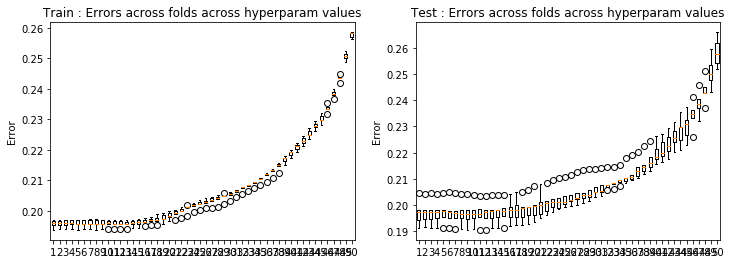

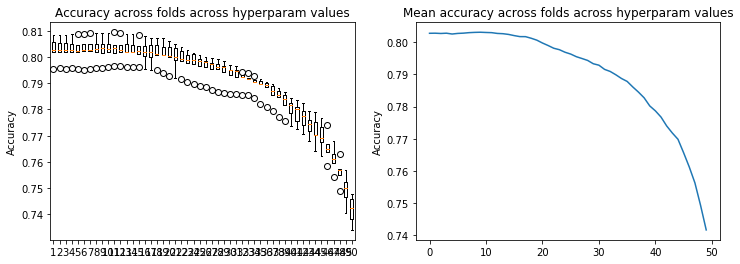

In [65]:
result_crossval(loss_tr43,loss_te43)
result_crossval_accuracy(acc43)

In [39]:
# test 44: degree 8, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr44, loss_te44, w44, acc44 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 8, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  3.81642827e+00  2.65098580e-01 -8.65458007e-01
  7.07448594e-01  2.28258757e-01 -4.14136317e+00  1.26597385e+00
 -6.01491345e-02  5.49840676e-01  1.16478283e-02 -3.34867147e-02
  9.74355228e-01  1.92949337e-02  3.00719508e-02 -1.01621301e-01
  1.10396850e-02 -4.44034796e-02 -5.18565423e-03  1.17839593e-02
 -3.95841974e+01 -1.67251645e+00 -4.92758450e+00  2.99019017e+00
 -8.76723542e-02  1.49245407e+01 -3.04597447e+00  1.54075664e-01
  9.37474975e-01  7.44163918e-02  6.02791966e-02 -3.72717223e+00
 -9.90075414e-02 -1.19316291e-02  1.50207121e+00  4.04543658e-03
 -4.76217233e-01  1.13180801e-01 -1.97393263e-02  1.30355668e+02
  5.07108441e+00  3.29509540e+01 -1.08985220e+01 -2.62295508e+00
 -1.55023250e+01  4.36784058e+00  3.88502465e-01 -3.14418375e+00
 -1.06085791e-01  1.8316

Ridge regression: w=[-2.76819782e-01  3.65516657e+00  2.43204061e-01 -7.44512878e-01
  5.08487758e-01  1.25478659e-01 -2.85912583e+00  1.52921298e+00
 -4.61151810e-02  1.17364365e+00  2.71972759e-02 -2.40783716e-02
  1.27960847e+00  4.49416467e-03  1.40163379e-02 -2.64445436e-01
  4.25124840e-03 -1.68543632e-01 -9.30209901e-04  2.05538222e-04
 -3.87283178e+01 -1.64623216e+00 -5.57544594e+00  4.13358181e+00
  5.91235484e-01  1.04174741e+01 -2.81800141e+00  1.09224859e-01
 -1.15418124e+00  9.35038814e-02  6.57979003e-02 -5.15126714e+00
 -1.19373636e-01  1.78421956e-02  2.38017015e+00  6.83069855e-02
 -1.71023570e-01  1.35372813e-01  2.36399357e-02  1.28542801e+02
  5.42772894e+00  3.45888770e+01 -1.34181653e+01 -4.81605161e+00
 -1.04419377e+01  2.08308132e+00  2.09439371e-01 -4.97545749e-01
 -1.85950977e-01  1.21803763e-01  4.89139671e+00 -4.00724636e-02
 -3.72001305e-02 -6.16664180e+00  3.93149303e-03  2.59857867e+00
 -3.09844727e-02 -5.76847289e-03 -1.66392956e+02 -1.21861372e+01
 -6.3

Ridge regression: w=[-2.78869250e-01  2.64597057e+00  2.31018949e-01 -1.16058811e+00
  9.99814913e-01  2.49000709e-01 -3.25665621e+00  1.51426350e+00
 -4.75497767e-02  8.64651829e-01  3.13247246e-02 -2.68623086e-02
  8.76940635e-01  1.64381476e-03  9.73135004e-03  3.74570312e-02
  1.12854870e-02 -2.29922304e-01 -5.51256781e-03  2.96535922e-03
 -3.12346705e+01 -1.65214992e+00 -2.97456685e+00  1.40514934e+00
 -7.49918118e-01  1.18048942e+01 -2.79312233e+00  1.62160893e-01
  2.35593515e-01  8.27552100e-02  4.44442001e-02 -4.31703896e+00
 -1.09070085e-01 -5.53760008e-03  3.04470002e-01  1.48874729e-02
  5.35374591e-01  1.57843204e-01  5.46345837e-02  1.05727355e+02
  5.57702365e+00  2.73334106e+01 -6.69551093e+00  8.88061274e-01
 -1.18846968e+01  2.15648665e+00  2.23455707e-01 -2.41862262e+00
 -2.05936067e-01  1.68405331e-01  5.20875829e+00 -5.26541200e-02
 -1.86568212e-02 -1.69802911e-01 -6.20336785e-02 -1.41303765e-01
  3.00739209e-03 -4.25000181e-02 -1.34548351e+02 -1.27443385e+01
 -5.4

Ridge regression: w=[-2.78727903e-01  1.60174394e+00  1.78454055e-01 -1.36139299e+00
  1.45927946e+00  3.01911687e-01 -2.48347396e+00  8.95136491e-01
 -8.03870386e-02  1.46273613e+00  1.40609623e-02 -1.52611753e-02
  1.09152130e+00  4.82701827e-03  1.25646134e-02 -1.33838372e-01
  2.17052063e-02 -1.02291609e-01 -5.47017089e-03  1.41961188e-04
 -2.38422359e+01 -8.80340578e-01 -9.67772608e-01 -8.14546207e-01
 -7.70270637e-01  8.99792826e+00 -1.34251515e+00  9.18519629e-02
 -2.60152091e+00  7.43545474e-02  2.27452341e-02 -3.90810441e+00
 -1.07566250e-01 -2.83983143e-03  1.52798978e+00  3.27395748e-02
  8.12225603e-02  1.29303804e-01  3.05799223e-02  8.43276351e+01
  2.23478214e+00  1.97774344e+01 -3.02536941e+00 -3.14186733e-01
 -8.62645983e+00  8.06303168e-01  3.54165882e-01  1.19668326e+00
 -1.22345718e-01  1.02021844e-01  3.37319714e+00 -5.85474521e-02
 -6.47029122e-02 -3.84072929e+00 -1.03789609e-01  5.19593967e-01
  1.01963989e-02 -3.26730181e-02 -1.05730615e+02 -6.35544425e+00
 -4.1

Ridge regression: w=[-2.75017651e-01  6.42445401e-01  1.69754628e-01 -1.94829929e+00
  1.98870781e+00  2.58411626e-01 -2.58975452e+00  7.15735106e-01
 -9.74544066e-02  9.68557811e-01  2.70127780e-02 -4.36963711e-02
  6.78181339e-01  8.61992082e-03  2.55411168e-02 -1.78362985e-01
  6.64858846e-03 -1.27584753e-01 -1.20171722e-02 -1.87543427e-02
 -1.72309566e+01 -9.19708198e-01  2.58241033e+00 -3.13099220e+00
 -5.59784349e-01  9.52617137e+00 -2.78013279e-01  1.30156476e-01
 -6.61958076e-01  6.70072431e-02  9.98579128e-03 -2.97924856e+00
 -1.23216797e-01 -2.28360597e-02  1.99125162e+00  2.60605345e-02
  2.22884218e-01  1.38212138e-01  4.54933986e-02  6.56013285e+01
  2.57344736e+00  1.12896639e+01  6.85555160e-01 -6.48563309e-01
 -9.31296107e+00 -1.05848466e+00  4.21772380e-01 -1.35420370e+00
 -2.01212729e-01  2.03656077e-01  3.49985704e+00 -6.48980691e-02
 -1.27015676e-01 -5.62788039e+00 -5.30228880e-02  4.39673585e-01
  3.23650004e-02  4.76229969e-02 -8.16973931e+01 -7.07605916e+00
 -3.2

Ridge regression: w=[-2.76431071e-01  9.46211923e-02  1.78989909e-01 -1.90611857e+00
  2.28869193e+00  2.68592302e-01 -2.70979559e+00  9.20427365e-01
 -5.96183778e-02  5.73667451e-01  1.24026995e-02 -3.38801154e-02
  6.90187892e-01  2.01998510e-02  2.87039721e-02 -7.17138978e-02
  1.00718691e-02 -1.59404381e-01 -5.58446803e-03  1.01449850e-02
 -1.31649773e+01 -8.75494598e-01  2.98866918e+00 -4.83249666e+00
 -5.51310120e-01  9.56143457e+00 -1.61752645e+00  1.54266899e-01
  4.50599270e-01  7.43660617e-02  6.06861800e-02 -2.77926119e+00
 -9.99609394e-02 -1.21395178e-02  1.28446250e+00  3.81861503e-03
  1.86540982e-01  1.14549554e-01 -2.10535388e-02  5.30377180e+01
  2.01941701e+00  8.07141326e+00  3.78209643e+00 -4.94459641e-01
 -8.89892848e+00  1.31402879e+00  3.64288025e-01 -1.79764364e+00
 -1.10053491e-01  1.80910314e-01  2.94867448e+00 -1.33497536e-01
 -1.20010659e-01 -3.77510118e+00 -6.73623967e-02  8.42276024e-01
 -4.86823412e-03 -7.67672456e-02 -6.37441768e+01 -5.54509907e+00
 -2.5

Ridge regression: w=[-2.76819763e-01 -1.69856824e-04  1.42815289e-01 -1.81489722e+00
  2.18447056e+00  1.93551241e-01 -1.90000909e+00  1.29935316e+00
 -4.65793369e-02  1.09054733e+00  2.71942319e-02 -2.48176329e-02
  8.41388740e-01  5.64621350e-03  1.29742823e-02 -2.24124022e-01
  2.86943235e-03 -3.05292294e-01 -1.80624599e-03 -1.33050379e-03
 -1.27403628e+01 -7.45442267e-01  2.62894120e+00 -4.29945564e+00
 -1.52621025e-01  6.88378480e+00 -2.02746378e+00  1.11366893e-01
 -1.15564484e+00  9.39789409e-02  6.63860941e-02 -3.63555423e+00
 -1.18583261e-01  1.80494291e-02  2.06846787e+00  6.89659718e-02
  6.22041636e-01  1.35893175e-01  2.20233906e-02  5.24385892e+01
  2.11949864e+00  8.73787225e+00  2.78759346e+00 -1.55309660e+00
 -6.27304710e+00  7.01801647e-01  1.89268566e-01  1.26162685e-01
 -1.86288340e-01  1.21564535e-01  3.93210900e+00 -4.40616704e-02
 -3.45714774e-02 -5.16269073e+00  9.39343361e-03  6.78840650e-01
 -2.91522918e-02 -6.24689403e-05 -6.33742273e+01 -6.34679636e+00
 -2.6

Ridge regression: w=[-2.78869221e-01 -5.40302993e-01  1.18374364e-01 -2.06329555e+00
  2.16179628e+00  2.48580586e-01 -2.00719335e+00  1.30051507e+00
 -4.51092658e-02  8.89003031e-01  3.16220858e-02 -2.72056271e-02
  3.05263740e-01  2.55725179e-03  9.46588485e-03  6.57407747e-03
  1.06856589e-02 -2.40149941e-01 -5.44097008e-03  1.54401492e-03
 -9.00969369e+00 -5.93907595e-01  4.13900027e+00 -4.01241442e+00
 -7.80597584e-01  7.16426625e+00 -2.04810763e+00  1.63570295e-01
 -2.04430364e-01  8.34137128e-02  4.54481076e-02 -2.18573154e+00
 -1.07957402e-01 -5.77825236e-03  6.22561427e-01  1.59861090e-02
  4.71157458e-01  1.58171742e-01  5.43740157e-02  4.17024280e+01
  1.56018238e+00  4.40501353e+00  2.61316336e+00  1.17651436e+00
 -6.36044000e+00  8.48187796e-01  1.91742997e-01 -1.15331040e+00
 -2.07876895e-01  1.67222082e-01  3.05521715e+00 -5.46435330e-02
 -1.90639097e-02 -1.52188766e+00 -5.87475687e-02  2.86571232e-01
  1.57340091e-03 -3.70775913e-02 -4.91964407e+01 -5.39728242e+00
 -2.0

Ridge regression: w=[-2.78727862e-01 -1.01595081e+00  1.11549201e-01 -1.92225305e+00
  2.26170564e+00  3.32830736e-01 -1.43410095e+00  7.19583407e-01
 -7.96009397e-02  1.22970804e+00  1.40391288e-02 -1.56933748e-02
  6.01360256e-01  5.47095467e-03  1.20222796e-02 -1.04922239e-01
  2.12049234e-02 -1.44834768e-01 -5.38354762e-03 -1.86557486e-04
 -5.84708998e+00 -2.47567362e-01  3.96061203e+00 -4.54901084e+00
 -1.13661361e+00  5.15272228e+00 -7.48576952e-01  9.35982987e-02
 -2.03333295e+00  7.39297965e-02  2.26190330e-02 -2.18583496e+00
 -1.07036924e-01 -3.37414182e-03  1.34113301e+00  3.32678706e-02
  2.10880788e-01  1.29662836e-01  2.94591117e-02  3.32428002e+01
 -1.70661608e-01  2.80393579e+00  3.40696739e+00  1.38724523e+00
 -4.18062290e+00 -2.24122541e-01  3.38122428e-01  1.20680527e+00
 -1.22157363e-01  1.01589989e-01  2.01864555e+00 -6.02994209e-02
 -6.40633961e-02 -3.39336140e+00 -1.01324510e-01  4.90851932e-01
  8.67670838e-03 -3.14627203e-02 -3.87126007e+01 -2.01340789e+00
 -1.5

Ridge regression: w=[-2.75017591e-01 -1.59022684e+00  9.16809047e-02 -2.17747613e+00
  2.34975386e+00  2.92138972e-01 -1.31057608e+00  9.51357381e-01
 -9.51975119e-02  1.14724426e+00  2.70551968e-02 -4.40495403e-02
  7.34647416e-02  9.48509553e-03  2.48364469e-02 -1.02445061e-01
  6.16889762e-03 -1.84056804e-01 -1.17925258e-02 -1.93389977e-02
 -2.38669419e+00 -1.71331010e-01  5.55452253e+00 -4.77658790e+00
 -9.48259197e-01  4.87408487e+00 -6.96470932e-01  1.29819059e-01
 -1.19327175e+00  6.75265286e-02  9.46552241e-03 -1.04103415e+00
 -1.23506593e-01 -2.20696667e-02  1.41099245e+00  2.66922950e-02
  4.60371104e-01  1.38690742e-01  4.47131071e-02  2.48822571e+01
 -2.90086668e-01 -8.09366772e-01  3.46294243e+00  1.08752043e+00
 -4.07491872e+00 -9.59929306e-01  3.98778457e-01 -2.32484613e-01
 -2.01347544e-01  2.03856496e-01  1.43184914e+00 -6.77298938e-02
 -1.23806063e-01 -3.78123715e+00 -5.08617733e-02  8.44395231e-02
  3.12908404e-02  4.98579836e-02 -3.02334490e+01 -1.90991879e+00
 -1.1

Ridge regression: w=[-2.76430984e-01 -1.84057206e+00  1.15097360e-01 -1.90159042e+00
  2.35471619e+00  2.92097307e-01 -1.38017054e+00  8.17609016e-01
 -5.74646678e-02  6.72812164e-01  1.26181480e-02 -3.40941449e-02
  1.75880305e-01  2.07822301e-02  2.79708358e-02 -2.55336959e-02
  1.01310370e-02 -2.27442476e-01 -5.72125253e-03  1.00085452e-02
 -8.14220189e-01 -2.50771867e-01  4.50420062e+00 -5.09923100e+00
 -8.25340950e-01  4.74257827e+00 -1.14203848e+00  1.54293125e-01
 -5.61159435e-02  7.44742033e-02  6.04090691e-02 -9.43057312e-01
 -1.00464539e-01 -1.22442308e-02  9.60608943e-01  3.93574774e-03
  5.29339580e-01  1.14552151e-01 -2.19435444e-02  2.06662059e+01
 -3.98587676e-01 -1.36151922e-01  4.38548560e+00  7.46352070e-01
 -3.48617910e+00  3.20935377e-01  3.44546779e-01 -9.17585607e-01
 -1.12243272e-01  1.79629821e-01  1.11002781e+00 -1.35269443e-01
 -1.17765665e-01 -2.83958160e+00 -6.63396290e-02  1.53395338e-01
 -4.84096457e-03 -7.66017766e-02 -2.50454185e+01 -1.14452723e+00
 -9.6

Ridge regression: w=[-2.76819676e-01 -1.91307197e+00  6.72806211e-02 -1.82611057e+00
  2.31125682e+00  2.34786827e-01 -9.69659945e-01  1.16630157e+00
 -4.56372984e-02  9.60237082e-01  2.71613262e-02 -2.52060907e-02
  2.15700974e-01  6.19195068e-03  1.23561143e-02 -1.67057452e-01
  2.77198258e-03 -3.74613748e-01 -2.15336491e-03 -1.57440236e-03
 -5.07245769e-01 -1.31108940e-02  4.27123389e+00 -4.87106887e+00
 -6.12289002e-01  3.52928917e+00 -1.61033029e+00  1.14010590e-01
 -8.32641509e-01  9.40467003e-02  6.59674994e-02 -1.31845525e+00
 -1.18058196e-01  1.77287699e-02  1.67558496e+00  6.94600553e-02
  9.74632327e-01  1.35728652e-01  2.16295478e-02  2.03468086e+01
 -6.81398924e-01  1.50579098e-01  3.91705017e+00  4.56755182e-01
 -2.55465016e+00  8.49155109e-02  1.75571369e-01 -3.16914265e-02
 -1.86886175e-01  1.21499709e-01  1.50697446e+00 -4.58970737e-02
 -3.28225796e-02 -4.02765549e+00  1.03337361e-02 -4.46350638e-02
 -2.86227663e-02  2.58776544e-04 -2.50423106e+01 -1.38114480e+00
 -9.7

Ridge regression: w=[-2.78869094e-01 -2.27103927e+00  5.81289177e-02 -1.89592654e+00
  2.17310833e+00  2.41170847e-01 -1.00656287e+00  1.10208698e+00
 -4.30264287e-02  8.54746655e-01  3.16571321e-02 -2.77208329e-02
 -1.68759973e-01  3.02089096e-03  9.18737847e-03  1.42812221e-02
  1.08789858e-02 -2.96904003e-01 -5.36150388e-03  1.17580248e-03
  1.52956931e+00  3.08187639e-02  4.58481970e+00 -3.96322397e+00
 -7.35515339e-01  3.55172786e+00 -1.50174740e+00  1.62724765e-01
 -3.66637749e-01  8.37095870e-02  4.52293358e-02 -3.00962558e-01
 -1.07243918e-01 -6.01717028e-03  6.42590603e-01  1.70888938e-02
  6.90522073e-01  1.57800695e-01  5.40529468e-02  1.56675280e+01
 -9.39896837e-01 -8.36382804e-01  2.48130298e+00  1.09849286e+00
 -2.34944546e+00  1.39630203e-01  1.75844973e-01 -6.29534904e-01
 -2.09018739e-01  1.67830959e-01  9.39107619e-01 -5.58152318e-02
 -1.87346893e-02 -1.84026002e+00 -5.85228984e-02  6.56233639e-02
  8.37306614e-04 -3.62183633e-02 -2.06474197e+01 -7.72302686e-01
 -7.9

Ridge regression: w=[-2.78727676e-01 -2.56832406e+00  9.50578282e-02 -1.67631511e+00
  2.14763595e+00  3.28525358e-01 -7.39519038e-01  7.06181793e-01
 -7.91176902e-02  9.78606703e-01  1.40816809e-02 -1.53415973e-02
  1.94555192e-01  5.69102853e-03  1.19794542e-02 -5.30969072e-02
  2.17474725e-02 -2.14104044e-01 -5.14111115e-03  8.20250623e-04
  3.25705869e+00 -1.25391135e-02  3.74590239e+00 -3.92208213e+00
 -1.17981167e+00  2.69435813e+00 -6.97403140e-01  9.22678787e-02
 -1.16322051e+00  7.34489373e-02  2.20594509e-02 -7.38123339e-01
 -1.06557699e-01 -4.12916658e-03  1.03401631e+00  3.41701820e-02
  5.05807359e-01  1.28666648e-01  2.89429238e-02  1.20153559e+01
 -1.27610513e+00 -1.35530451e-01  2.45145208e+00  1.84120308e+00
 -1.53036355e+00 -3.35355353e-01  3.35198664e-01  3.49750402e-01
 -1.23068275e-01  9.93761055e-02  5.46978160e-01 -6.06947217e-02
 -6.39520991e-02 -2.70048175e+00 -1.02556501e-01  1.07212863e-01
  7.12170596e-03 -3.51770308e-02 -1.77388249e+01  2.55035114e-01
 -6.7

Ridge regression: w=[-2.75017324e-01 -2.95774289e+00  8.38853319e-02 -1.79198199e+00
  2.08093799e+00  2.85729596e-01 -5.92548673e-01  1.03043518e+00
 -9.48754156e-02  1.11411575e+00  2.69901487e-02 -4.38914746e-02
 -1.96728258e-01  9.80824706e-03  2.43856807e-02 -2.46201254e-02
  6.81964079e-03 -2.19255533e-01 -1.16558657e-02 -1.91180146e-02
  5.39758928e+00  6.78142644e-03  4.50195532e+00 -3.56086187e+00
 -9.73579272e-01  2.35848685e+00 -9.65693910e-01  1.24764968e-01
 -1.12907421e+00  6.69848396e-02  8.78844362e-03 -8.76381728e-02
 -1.22932421e-01 -2.15661532e-02  9.16614834e-01  2.71502809e-02
  6.16554142e-01  1.38740286e-01  4.31455543e-02  7.62628686e+00
 -1.26924571e+00 -1.57707565e+00  1.75404669e+00  1.46939798e+00
 -1.41615393e+00 -6.33822210e-01  3.96955473e-01 -8.68905605e-02
 -2.01731399e-01  2.02623620e-01  3.69032662e-01 -6.81391822e-02
 -1.21111404e-01 -2.52131961e+00 -5.25345019e-02 -1.47996291e-01
  3.05618412e-02  4.93376622e-02 -1.48771346e+01  2.77390563e-01
 -5.7

Ridge regression: w=[-2.76430592e-01 -3.11973882e+00  1.18837382e-01 -1.59286312e+00
  1.99072782e+00  2.83763469e-01 -7.11822335e-01  6.76998009e-01
 -5.70381587e-02  6.53655956e-01  1.25402365e-02 -3.36804811e-02
 -1.08788519e-02  2.12379556e-02  2.74790265e-02  4.63171587e-02
  1.09879223e-02 -2.57136927e-01 -5.91817766e-03  1.05916929e-02
  6.28493789e+00 -1.81308192e-01  3.67676297e+00 -3.36993761e+00
 -8.15176878e-01  2.47409836e+00 -8.10571431e-01  1.47293710e-01
 -2.54638058e-01  7.37509259e-02  5.87149191e-02 -1.41262490e-01
 -1.00402957e-01 -1.24040073e-02  5.35727039e-01  3.84299096e-03
  6.85259736e-01  1.13932602e-01 -2.27264897e-02  5.70153336e+00
 -9.78884002e-01 -7.20417663e-01  1.84627279e+00  9.31499295e-01
 -1.18908051e+00 -6.41284732e-02  3.40730942e-01 -4.29779438e-01
 -1.13907505e-01  1.76627051e-01  2.11159956e-01 -1.36068633e-01
 -1.16147763e-01 -1.88416583e+00 -6.85546133e-02 -1.36485041e-01
 -4.39829714e-03 -7.89843374e-02 -1.33761444e+01  3.68977473e-01
 -5.2

Ridge regression: w=[-2.76819284e-01 -3.17049622e+00  7.40153958e-02 -1.53140122e+00
  1.99405121e+00  2.29097511e-01 -4.87864810e-01  9.78285597e-01
 -4.78402797e-02  7.81038036e-01  2.71041808e-02 -2.51996699e-02
 -9.39513662e-03  6.34063239e-03  1.15631918e-02 -6.93536677e-02
  3.64359672e-03 -3.93508656e-01 -2.32883776e-03 -1.18854783e-03
  6.50128937e+00  5.61340710e-02  3.51765270e+00 -3.36387108e+00
 -6.41835904e-01  1.90306771e+00 -1.27803244e+00  1.10600848e-01
 -4.96552749e-01  9.29597232e-02  6.40971133e-02 -2.92404800e-01
 -1.16824235e-01  1.64971429e-02  1.10393210e+00  6.93124797e-02
  1.09376478e+00  1.35143686e-01  2.09826561e-02  5.52728161e+00
 -1.34328714e+00 -5.83472053e-01  1.71129878e+00  8.47413655e-01
 -9.27185607e-01 -1.15863885e-01  1.87092429e-01 -1.91098166e-01
 -1.87920452e-01  1.20729269e-01  3.20092717e-01 -4.62922547e-02
 -2.97679931e-02 -2.76605155e+00  7.65390045e-03 -3.01259694e-01
 -2.86209318e-02 -1.93591643e-03 -1.34696660e+01  3.73459244e-01
 -5.1

Ridge regression: w=[-2.78868519e-01 -3.36431410e+00  8.29846336e-02 -1.63085579e+00
  1.92138913e+00  2.20414701e-01 -5.16080635e-01  8.29083946e-01
 -4.46893651e-02  6.99663690e-01  3.14673800e-02 -2.79047705e-02
 -2.17563854e-01  3.27398389e-03  9.03525804e-03  7.36957473e-02
  1.17349214e-02 -3.26918076e-01 -5.45227453e-03  1.16513913e-03
  7.59033680e+00 -3.27298082e-02  3.84564307e+00 -2.81515756e+00
 -6.04435489e-01  1.95724410e+00 -1.03776169e+00  1.53738197e-01
 -2.84410720e-01  8.26322215e-02  4.32046615e-02  2.46627586e-01
 -1.05831287e-01 -6.49357779e-03  3.29657486e-01  1.71583556e-02
  8.45150791e-01  1.56832115e-01  5.20900860e-02  3.20590756e+00
 -1.21717552e+00 -1.09947087e+00  8.06266048e-01  8.06050900e-01
 -8.52163429e-01 -1.11632359e-01  1.86459320e-01 -3.86873865e-01
 -2.09777550e-01  1.67609075e-01  1.29897724e-01 -5.65817076e-02
 -1.81287177e-02 -1.29374889e+00 -6.06875157e-02 -1.72078045e-01
  9.51507023e-04 -3.64247096e-02 -1.19238977e+01  5.01698185e-01
 -4.7

Ridge regression: w=[-2.78726839e-01 -3.46034263e+00  1.36780078e-01 -1.53118449e+00
  1.84830506e+00  2.81316769e-01 -3.55957761e-01  5.87348304e-01
 -8.09408585e-02  7.36477346e-01  1.40659265e-02 -1.43405370e-02
  1.11590572e-01  5.85097390e-03  1.20345672e-02  4.56966019e-02
  2.26924879e-02 -2.37118382e-01 -5.02320934e-03  2.23040961e-03
  8.34748518e+00 -2.29694119e-01  3.51256003e+00 -2.63843310e+00
 -9.02046162e-01  1.55448203e+00 -5.93924191e-01  8.55947710e-02
 -5.93233349e-01  7.07873543e-02  2.08803357e-02 -2.88863688e-01
 -1.04776587e-01 -4.76230376e-03  4.75396787e-01  3.43244016e-02
  6.49844910e-01  1.27370486e-01  2.63864218e-02  1.51246384e+00
 -1.01209701e+00 -8.80229313e-01  6.58195342e-01  1.31216572e+00
 -6.32494663e-01 -2.25730118e-01  3.46261147e-01 -6.20570915e-02
 -1.24130696e-01  9.46814079e-02  2.63819437e-02 -6.11648322e-02
 -6.31855222e-02 -1.55886748e+00 -1.04546133e-01 -1.46869715e-01
  6.07073483e-03 -3.94248282e-02 -1.09343922e+01  6.52472801e-01
 -4.3

Ridge regression: w=[-2.75016121e-01 -3.53570383e+00  1.31430625e-01 -1.57426562e+00
  1.69167947e+00  2.39963075e-01 -2.00760299e-01  7.47772880e-01
 -9.63351612e-02  8.03605129e-01  2.64615912e-02 -4.27956450e-02
 -1.11355929e-01  9.78660566e-03  2.34502469e-02  7.92957577e-02
  7.93966131e-03 -2.02779621e-01 -1.18411059e-02 -1.87480990e-02
  8.99456528e+00 -2.59518698e-01  3.97387331e+00 -2.20896451e+00
 -7.07022588e-01  1.22772403e+00 -7.22683772e-01  1.15043514e-01
 -6.95161305e-01  6.37729208e-02  7.88077295e-03  3.35297938e-02
 -1.20470605e-01 -1.99457105e-02  3.20938035e-01  2.57550275e-02
  5.99552595e-01  1.38663704e-01  3.91271006e-02 -1.94520905e-01
 -8.74717562e-01 -1.70092521e+00  2.17478145e-01  9.60574320e-01
 -5.89344450e-01 -3.79778063e-01  4.03040777e-01 -8.06939692e-02
 -2.00209106e-01  1.97223917e-01  3.20166201e-02 -6.68895363e-02
 -1.15566867e-01 -1.26485366e+00 -5.48762018e-02 -2.02718961e-01
  3.09671202e-02  4.92002439e-02 -9.72701046e+00  5.56464609e-01
 -4.0

Ridge regression: w=[-2.76428832e-01 -3.48837079e+00  1.59532630e-01 -1.47133906e+00
  1.53021763e+00  2.52044624e-01 -2.64138757e-01  4.37118265e-01
 -5.75883863e-02  4.71296415e-01  1.19557120e-02 -3.16625728e-02
  3.66331105e-02  2.15678718e-02  2.69399264e-02  1.37655961e-01
  1.20662712e-02 -2.26835673e-01 -6.34983276e-03  1.11519137e-02
  9.02280465e+00 -4.24596412e-01  3.59712497e+00 -1.82838433e+00
 -6.39985668e-01  1.28248193e+00 -4.81542502e-01  1.30268912e-01
 -1.08963776e-01  6.90534513e-02  5.28695735e-02 -1.83470574e-02
 -9.78812759e-02 -1.11328568e-02  1.47467381e-02  3.01402856e-03
  6.37011242e-01  1.14825752e-01 -2.34608687e-02 -7.90841075e-01
 -5.65428380e-01 -1.44622080e+00  1.51634063e-01  6.10448073e-01
 -5.01315816e-01 -1.16794223e-01  3.35430371e-01 -2.48793327e-01
 -1.12854495e-01  1.67158502e-01 -4.74482731e-02 -1.35842433e-01
 -1.12758305e-01 -7.99781054e-01 -7.08890802e-02 -1.99578310e-01
 -2.77647866e-03 -7.90357255e-02 -9.01075302e+00  4.75748404e-01
 -3.7

Ridge regression: w=[-2.76817521e-01 -3.51805614e+00  1.29222041e-01 -1.42844170e+00
  1.54366357e+00  1.95172219e-01 -1.49528659e-01  6.01945132e-01
 -5.31949358e-02  4.88236144e-01  2.64695015e-02 -2.42257715e-02
  7.56180454e-02  6.53212063e-03  1.07315253e-02  5.91146421e-02
  4.69454056e-03 -3.33163698e-01 -2.57479377e-03 -6.18826240e-04
  9.16473137e+00 -2.67975647e-01  3.50451724e+00 -1.88066999e+00
 -4.46908032e-01  1.00956276e+00 -8.01957449e-01  1.01436698e-01
 -1.38146262e-01  8.73370873e-02  5.92060298e-02 -1.28573991e-01
 -1.13093931e-01  1.44580623e-02  3.78739383e-01  6.46274103e-02
  9.62605888e-01  1.35543117e-01  1.70529184e-02 -8.87140378e-01
 -7.96763641e-01 -1.38620565e+00  1.20342266e-01  4.93251774e-01
 -4.23950314e-01 -7.49859087e-02  2.13288163e-01 -2.02107821e-01
 -1.85371015e-01  1.16454476e-01 -4.37594154e-02 -4.66270686e-02
 -2.51518161e-02 -1.28006552e+00  4.93414900e-03 -3.22948323e-01
 -2.78252236e-02 -2.48939318e-03 -9.11051599e+00  4.88317533e-01
 -3.6

Ridge regression: w=[-2.78865932e-01 -3.42088513e+00  1.37292255e-01 -1.46421747e+00
  1.41573208e+00  1.89428594e-01 -1.13195603e-01  4.45277055e-01
 -4.89897285e-02  4.33093726e-01  3.04170013e-02 -2.65564697e-02
 -2.46879664e-02  3.55913383e-03  9.29435992e-03  1.42217966e-01
  1.26927265e-02 -2.69658220e-01 -5.57951378e-03  1.53037264e-03
  9.05426632e+00 -3.68602905e-01  3.64587466e+00 -1.47135901e+00
 -4.19781072e-01  9.45475961e-01 -5.51432534e-01  1.37119625e-01
 -4.18170747e-02  7.56684476e-02  3.75730809e-02  1.24087192e-01
 -1.01715253e-01 -6.78708040e-03 -5.17457807e-02  1.31212351e-02
  7.31976288e-01  1.55952853e-01  4.46286240e-02 -1.44117284e+00
 -5.89425437e-01 -1.62066925e+00 -2.16200956e-01  4.06691684e-01
 -3.97980594e-01 -8.09445996e-02  2.04992451e-01 -2.67965883e-01
 -2.05919721e-01  1.60693537e-01 -8.55986850e-02 -5.69549106e-02
 -1.70884028e-02 -5.28046105e-01 -6.16850524e-02 -2.12675331e-01
  1.65045870e-03 -3.50749335e-02 -8.25366585e+00  4.61083226e-01
 -3.5

Ridge regression: w=[-2.78723074e-01 -3.22517300e+00  1.77309688e-01 -1.34260371e+00
  1.22026872e+00  2.21645653e-01  2.35301202e-02  3.42461954e-01
 -8.16777448e-02  4.64537282e-01  1.32007321e-02 -1.20909784e-02
  1.61269872e-01  6.28213758e-03  1.23221346e-02  1.26724700e-01
  2.30451082e-02 -1.70616695e-01 -4.73618438e-03  3.33278163e-03
  8.71087779e+00 -5.11004129e-01  3.35335843e+00 -1.12811247e+00
 -5.55250554e-01  6.56503619e-01 -3.24295597e-01  7.71831684e-02
 -1.84860713e-01  5.94183988e-02  1.85594792e-02 -2.13136827e-01
 -9.84200850e-02 -3.84565721e-03  1.29029628e-02  3.12682754e-02
  5.13568024e-01  1.28224598e-01  1.72042505e-02 -1.77291641e+00
 -4.11071901e-01 -1.54043099e+00 -2.56656486e-01  5.88647139e-01
 -3.46968404e-01 -1.19117610e-01  3.38840302e-01 -1.50803523e-01
 -1.20414734e-01  8.39444794e-02 -1.18902138e-01 -6.23835993e-02
 -6.11167825e-02 -5.90006908e-01 -1.02478816e-01 -1.78547668e-01
  4.73622526e-03 -3.87745557e-02 -7.51662063e+00  4.49014757e-01
 -3.1

Ridge regression: w=[-2.75010711e-01 -2.99011534e+00  1.59984329e-01 -1.21793818e+00
  9.65354470e-01  1.90177620e-01  1.39479180e-01  3.74182660e-01
 -9.31687168e-02  4.22704327e-01  2.38573993e-02 -3.90798386e-02
  4.40433087e-02  9.61222814e-03  2.10795005e-02  1.43753589e-01
  9.25390217e-03 -1.17720303e-01 -1.23566358e-02 -1.77864424e-02
  8.14715159e+00 -4.88270418e-01  3.29697650e+00 -6.77080663e-01
 -4.31146131e-01  4.21572659e-01 -3.28474051e-01  1.07184088e-01
 -1.88235398e-01  5.23118736e-02  6.48705980e-03 -5.14470015e-02
 -1.12291545e-01 -1.34342506e-02 -4.99607432e-02  2.00967158e-02
  3.95725491e-01  1.40354111e-01  2.89868203e-02 -1.89403661e+00
 -3.51309818e-01 -1.80775804e+00 -3.84405781e-01  4.05401421e-01
 -3.35497693e-01 -1.94612094e-01  3.70027320e-01 -7.01306295e-02
 -1.88534638e-01  1.78255457e-01 -7.61646509e-02 -6.35065477e-02
 -1.00961546e-01 -4.70056329e-01 -5.48503831e-02 -1.61482913e-01
  3.31525955e-02  4.97870044e-02 -6.59474294e+00  3.58050643e-01
 -3.0

Ridge regression: w=[-2.76420912e-01 -2.70081380e+00  1.69455880e-01 -1.08617533e+00
  7.55988823e-01  2.13616810e-01  1.16151910e-01  2.28448566e-01
 -5.44487102e-02  3.05078426e-01  9.62832401e-03 -2.54996241e-02
  1.08970661e-01  2.13241293e-02  2.55813835e-02  1.75430902e-01
  1.29426995e-02 -1.19378471e-01 -6.88845740e-03  1.12913445e-02
  7.37246590e+00 -5.50749192e-01  2.89542811e+00 -2.95041199e-01
 -4.62370292e-01  4.04792055e-01 -2.18044998e-01  1.06561118e-01
  3.97668949e-02  5.16683316e-02  3.55258310e-02 -5.77587253e-02
 -8.98088405e-02 -4.68492409e-03 -2.20233211e-01  8.49026114e-04
  3.78733518e-01  1.22505008e-01 -2.43217431e-02 -1.71033284e+00
 -2.24092341e-01 -1.61199843e+00 -3.64601567e-01  3.16841943e-01
 -2.80648608e-01 -9.12667913e-02  2.93180627e-01 -1.64512263e-01
 -1.02734180e-01  1.39040621e-01 -1.10364004e-01 -1.30976653e-01
 -1.00971595e-01 -2.35184756e-01 -7.01468373e-02 -1.50390639e-01
  7.06664433e-05 -7.16061378e-02 -5.79865689e+00  3.11881916e-01
 -2.6

Ridge regression: w=[-2.76809590e-01 -2.70997271e+00  1.52422829e-01 -1.06592780e+00
  7.58958874e-01  1.64621012e-01  1.50819523e-01  2.53841979e-01
 -5.72133472e-02  2.65377407e-01  2.34823485e-02 -2.07473445e-02
  1.77443749e-01  7.30797258e-03  1.00223084e-02  1.25447013e-01
  5.93988268e-03 -1.68947893e-01 -2.98916171e-03  6.95986085e-05
  7.44630557e+00 -4.68498181e-01  2.86989869e+00 -3.27669947e-01
 -2.81048793e-01  3.19557953e-01 -3.51118877e-01  9.33758125e-02
  6.00048804e-02  6.77527711e-02  4.64755389e-02 -1.43182628e-01
 -1.02452508e-01  1.13956205e-02  5.55696664e-03  4.75545012e-02
  5.55258091e-01  1.40531971e-01  6.29327473e-03 -1.76620707e+00
 -3.23274673e-01 -1.59250980e+00 -3.81745001e-01  1.73602774e-01
 -2.56404815e-01 -2.00993458e-02  2.22639213e-01 -1.44470312e-01
 -1.69317705e-01  1.00582135e-01 -1.50322361e-01 -4.80969576e-02
 -1.88567416e-02 -4.77413212e-01  2.36324355e-03 -2.24662376e-01
 -2.52239616e-02  1.75177575e-03 -5.85718192e+00  2.92767065e-01
 -2.6

Ridge regression: w=[-2.78854296e-01 -2.38976972e+00  1.44054368e-01 -9.57962560e-01
  5.95050970e-01  1.60378292e-01  1.92768442e-01  1.81659312e-01
 -5.19345013e-02  2.81169628e-01  2.62620992e-02 -2.13982927e-02
  1.14852161e-01  3.86351045e-03  1.02778131e-02  1.62354561e-01
  1.34746659e-02 -1.24573218e-01 -5.44711905e-03  2.12579317e-03
  6.56913839e+00 -4.91801234e-01  2.60841738e+00 -4.21946435e-02
 -2.82451186e-01  2.43133544e-01 -2.13425863e-01  1.20196131e-01
  4.19771565e-02  5.27724012e-02  2.52531145e-02 -4.22855300e-02
 -9.34132151e-02 -5.92580141e-03 -1.79356828e-01  2.61002033e-03
  3.82108551e-01  1.58570529e-01  2.90540980e-02 -1.49831454e+00
 -2.28049534e-01 -1.50836265e+00 -4.11669359e-01  1.65447370e-01
 -2.41745264e-01 -3.96456190e-02  2.07362733e-01 -1.78015374e-01
 -1.85235153e-01  1.34331911e-01 -1.30515347e-01 -5.50292671e-02
 -1.56930401e-02 -1.92169497e-01 -5.92382642e-02 -1.38768112e-01
  2.03345460e-03 -2.89595863e-02 -4.98990456e+00  2.63700568e-01
 -2.3

Ridge regression: w=[-2.78706137e-01 -2.02650425e+00  1.65652186e-01 -7.65787799e-01
  3.99494011e-01  1.72438042e-01  2.64573586e-01  1.83357772e-01
 -7.65538419e-02  3.16569221e-01  9.58442607e-03 -7.03361277e-03
  1.71087680e-01  6.33767607e-03  1.23245734e-02  1.47688967e-01
  2.11071560e-02 -4.68159138e-02 -3.88735007e-03  3.80636354e-03
  5.64583963e+00 -5.43783312e-01  2.13590199e+00  1.77137408e-01
 -3.31730950e-01  1.05619874e-01 -1.29453205e-01  7.18997412e-02
 -1.72886491e-02  3.07960967e-02  1.29585588e-02 -1.74035590e-01
 -8.38579308e-02 -5.58173381e-05 -1.20784256e-01  2.31959391e-02
  2.16708683e-01  1.36874696e-01  8.34668018e-04 -1.24438452e+00
 -1.85516143e-01 -1.31853416e+00 -3.09240921e-01  2.14430085e-01
 -2.42782562e-01 -7.50842831e-02  2.93717690e-01 -1.33756276e-01
 -1.02092862e-01  5.83533081e-02 -1.49712450e-01 -5.95906062e-02
 -5.37251116e-02 -2.36399781e-01 -8.79020933e-02 -1.15891323e-01
  1.64525921e-03 -2.99570340e-02 -4.17429684e+00  2.53678945e-01
 -1.9

Ridge regression: w=[-2.74986375e-01 -1.69895098e+00  1.40070361e-01 -5.36887509e-01
  2.40544201e-01  1.48062792e-01  3.03176606e-01  1.93104734e-01
 -8.19422191e-02  2.54914348e-01  1.60467036e-02 -2.99993086e-02
  9.86946765e-02  8.47606690e-03  1.62616081e-02  1.57438610e-01
  9.43689765e-03 -9.94864008e-03 -1.26060372e-02 -1.50595255e-02
  4.75099724e+00 -4.82610239e-01  1.71780064e+00  3.11903228e-01
 -2.55085988e-01  2.62906693e-02 -1.27057672e-01  1.03227768e-01
  1.88411559e-02  2.82549798e-02  3.74336325e-03 -8.72416410e-02
 -9.58512564e-02 -1.14290741e-03 -1.41057971e-01  1.11190293e-02
  1.35876755e-01  1.51326010e-01  1.38361750e-02 -9.18156266e-01
 -1.98372102e-01 -1.25832024e+00 -2.52553795e-01  1.38817701e-01
 -2.41781193e-01 -1.15416102e-01  2.96162399e-01 -5.37379170e-02
 -1.49161070e-01  1.29558205e-01 -1.01945942e-01 -5.24475840e-02
 -7.04900994e-02 -2.11942909e-01 -4.62194284e-02 -9.76303771e-02
  3.42625842e-02  4.48408087e-02 -3.38102160e+00  1.95204399e-01
 -1.6

Ridge regression: w=[-2.76385290e-01 -1.39485319e+00  1.39801729e-01 -4.27656815e-01
  1.42372068e-01  1.63605229e-01  2.67812189e-01  1.25121283e-01
 -4.67645371e-02  2.53893219e-01  3.18140709e-03 -1.40865481e-02
  1.33565607e-01  1.71874665e-02  2.10905287e-02  1.65461155e-01
  1.08715708e-02 -8.05239546e-03 -6.97278891e-03  9.23783250e-03
  3.93400508e+00 -4.91814087e-01  1.33198463e+00  4.11114726e-01
 -2.83919672e-01  3.59024318e-02 -8.59793547e-02  8.66598019e-02
  4.12204612e-02  2.12991638e-02  8.48851049e-03 -8.41045685e-02
 -7.75009976e-02  6.81560917e-03 -2.10575348e-01 -2.95767378e-03
  1.12739167e-01  1.46290773e-01 -2.53316348e-02 -6.18046048e-01
 -1.69431450e-01 -1.02438896e+00 -1.46963334e-01  1.26578555e-01
 -1.98020990e-01 -7.45451698e-02  2.33121673e-01 -1.07795162e-01
 -7.01570588e-02  8.29717363e-02 -1.18171408e-01 -1.03151812e-01
 -6.99851315e-02 -1.07552068e-01 -5.31295592e-02 -8.67723188e-02
  1.74953221e-03 -5.01529388e-02 -2.72822237e+00  1.81254547e-01
 -1.3

Ridge regression: w=[-2.76773919e-01 -1.39330814e+00  1.31363706e-01 -4.16432341e-01
  1.35469112e-01  1.38531408e-01  2.74023811e-01  1.07960273e-01
 -5.60350501e-02  2.20702799e-01  1.50321063e-02 -1.35688190e-02
  1.86416518e-01  7.01637432e-03  9.10419892e-03  1.46112201e-01
  7.33156062e-03 -1.25125956e-02 -3.84688053e-03  1.02186670e-03
  3.96119468e+00 -4.51985432e-01  1.33970096e+00  3.96325127e-01
 -1.77164160e-01  1.88289901e-02 -1.19348880e-01  8.62592091e-02
  4.95299030e-02  3.40338876e-02  2.66641924e-02 -1.38367183e-01
 -8.47425692e-02  7.71395499e-03 -9.87014527e-02  1.99552374e-02
  1.65977524e-01  1.56763775e-01 -7.20405373e-03 -6.43871581e-01
 -2.06042404e-01 -1.02163486e+00 -1.62631770e-01  3.18087893e-02
 -1.89547430e-01 -2.21478666e-02  2.14608503e-01 -9.51986441e-02
 -1.22969121e-01  6.51925069e-02 -1.60579544e-01 -4.14003799e-02
 -1.05162231e-02 -2.26930526e-01 -1.13914013e-03 -1.20931086e-01
 -1.99669535e-02  6.54228485e-03 -2.75009211e+00  1.56952129e-01
 -1.3

Ridge regression: w=[-2.78801967e-01 -1.12347542e+00  1.12129293e-01 -3.20026035e-01
  9.05293783e-02  1.27936245e-01  2.82611071e-01  7.38190584e-02
 -4.97987001e-02  2.50526526e-01  1.49600171e-02 -1.05507058e-02
  1.44965286e-01  1.84347907e-03  1.11939720e-02  1.55654974e-01
  1.15845078e-02 -8.16781405e-03 -4.75580107e-03  1.18225330e-03
  3.24429681e+00 -4.29418057e-01  1.03596230e+00  4.09736075e-01
 -1.67763168e-01  4.11788589e-03 -6.16947023e-02  1.04460667e-01
  9.58748259e-03  2.00855680e-02  1.13968988e-02 -8.89474439e-02
 -8.45426183e-02 -3.46377870e-03 -1.67208196e-01 -7.90378505e-03
  1.05623633e-01  1.70333078e-01  1.42136831e-02 -3.70762796e-01
 -1.75437495e-01 -8.36211758e-01 -1.03998835e-01  4.00700191e-02
 -1.75187583e-01 -2.90592133e-02  2.00343313e-01 -1.20236030e-01
 -1.24318396e-01  7.65339186e-02 -1.26816649e-01 -3.83868540e-02
 -1.27331257e-02 -1.17473924e-01 -4.32072048e-02 -7.33495890e-02
  2.28832136e-04 -1.36470688e-02 -2.17971236e+00  1.37050907e-01
 -1.0

Ridge regression: w=[-2.78629976e-01 -8.69375319e-01  1.23517176e-01 -2.26872746e-01
  2.09413983e-02  1.27038846e-01  3.01379396e-01  1.00010039e-01
 -6.55724913e-02  2.72194338e-01  5.49202311e-04 -4.76729550e-04
  1.54876860e-01  2.91517407e-03  9.49946278e-03  1.49112159e-01
  1.41168406e-02  3.06639076e-02 -3.04683220e-03  3.14699556e-03
  2.63151264e+00 -4.44839738e-01  7.45685604e-01  4.27064417e-01
 -1.74753579e-01 -3.72115342e-02 -3.28141022e-02  6.19511490e-02
  5.53441547e-03  8.18557140e-04  6.01680365e-03 -1.34365258e-01
 -6.76752298e-02  3.95755141e-03 -1.40518526e-01  1.49465739e-02
  3.57769127e-02  1.56099331e-01 -1.09185394e-02 -1.99063588e-01
 -1.77670680e-01 -6.63744608e-01 -8.60449653e-03  4.69092482e-02
 -1.77426121e-01 -4.77665876e-02  2.43324789e-01 -1.01448998e-01
 -5.32047637e-02  2.26535777e-02 -1.39401524e-01 -3.62116196e-02
 -3.16775202e-02 -1.39830240e-01 -4.85664297e-02 -7.23405018e-02
 -8.92725433e-04 -1.81692506e-02 -1.72353488e+00  1.31736689e-01
 -8.2

Ridge regression: w=[-2.74876956e-01 -6.58344525e-01  9.86731814e-02 -1.14240213e-01
 -8.83672250e-04  1.11247514e-01  2.91317488e-01  9.98295081e-02
 -6.55871330e-02  2.24016953e-01  1.65529189e-03 -1.76099551e-02
  1.13592378e-01  4.60963998e-03  1.00804108e-02  1.56674351e-01
  5.94664847e-03  4.33788128e-02 -1.06504048e-02 -1.10338565e-02
  2.12632264e+00 -3.95537869e-01  5.05692293e-01  3.71769989e-01
 -1.33242957e-01 -3.93301266e-02 -3.76334773e-02  8.83633510e-02
  4.61155933e-02  8.07136191e-03  5.85489234e-04 -8.36743783e-02
 -7.99874070e-02  7.98405659e-03 -1.53556043e-01  5.82761032e-03
  1.04883099e-02  1.70717261e-01  4.21210023e-03 -5.69993607e-02
 -1.85252555e-01 -5.71264652e-01  2.12540469e-02  1.89453660e-02
 -1.62798584e-01 -6.23126236e-02  2.29882289e-01 -4.76931147e-02
 -7.00665523e-02  6.23530833e-02 -1.01321786e-01 -2.65845109e-02
 -3.16642687e-02 -1.36235184e-01 -2.27164432e-02 -6.37193057e-02
  2.49890498e-02  3.06799646e-02 -1.35405317e+00  1.02485437e-01
 -6.5

Ridge regression: w=[-2.76225164e-01 -4.80142740e-01  9.07615614e-02 -1.21440440e-01
 -6.80599056e-03  1.17125437e-01  2.50895224e-01  5.19294578e-02
 -3.38370308e-02  2.33161500e-01 -6.60659462e-03 -3.59461464e-03
  1.35667945e-01  8.04189458e-03  1.38937418e-02  1.46486859e-01
  4.88125883e-03  3.84095219e-02 -6.46729335e-03  4.90384441e-03
  1.72074901e+00 -3.86707448e-01  3.83263504e-01  3.71133083e-01
 -1.37967263e-01 -1.60715718e-02 -2.37600011e-02  6.40994297e-02
  3.15431913e-02  8.94280823e-04 -7.88921645e-03 -6.90575343e-02
 -6.85656479e-02  1.29874920e-02 -1.59493289e-01 -4.89057485e-03
  4.56769733e-03  1.73849946e-01 -2.42123483e-02  2.15302940e-02
 -1.73781967e-01 -4.26638538e-01  6.70707230e-02  1.05024114e-02
 -1.25760878e-01 -3.52457830e-02  1.82280386e-01 -7.22050660e-02
 -1.53013644e-02  2.67350205e-02 -1.03171503e-01 -4.85438951e-02
 -2.79527453e-02 -9.24816375e-02 -1.99691130e-02 -5.57437366e-02
  9.91795345e-04 -2.34323284e-02 -1.08270841e+00  9.93021818e-02
 -5.1

Ridge regression: w=[-2.76613567e-01 -4.77042055e-01  8.74516670e-02 -1.05811356e-01
 -2.05227579e-02  1.14086777e-01  2.53221455e-01  4.77959057e-02
 -4.50450906e-02  2.21107462e-01  1.88637581e-03 -5.97102082e-03
  1.53546080e-01  3.93222269e-03  7.83926393e-03  1.51342399e-01
  7.23462142e-03  4.75259965e-02 -5.75656650e-03  2.49304573e-03
  1.72916370e+00 -3.68199497e-01  3.91056981e-01  3.58939274e-01
 -1.05756388e-01 -1.86979361e-02 -2.60799861e-02  6.79956692e-02
  3.07538948e-02  1.07889372e-02  1.29752345e-02 -9.68041351e-02
 -7.16834546e-02  5.52491754e-03 -1.33612525e-01  3.59273429e-03
  1.42784690e-02  1.75395855e-01 -1.27499113e-02  1.38249052e-02
 -1.87190612e-01 -4.30187608e-01  5.99190728e-02 -2.50027018e-02
 -1.23490933e-01 -1.40997385e-02  1.87318621e-01 -6.98368737e-02
 -4.94631571e-02  2.75126372e-02 -1.24642334e-01 -1.97864926e-02
 -8.20152438e-04 -1.37897281e-01  5.05639215e-05 -7.24083663e-02
 -9.36819987e-03  4.06615159e-03 -1.08833163e+00  8.08113322e-02
 -5.2

Ridge regression: w=[-2.78566808e-01 -3.19106206e-01  6.16698043e-02 -9.86293302e-02
 -1.35292801e-03  1.00036906e-01  2.47671562e-01  1.89946916e-02
 -3.53840119e-02  2.24622189e-01  9.25973734e-05 -2.39353066e-04
  1.26515937e-01 -2.27368767e-03  1.09950307e-02  1.41134619e-01
  7.41849581e-03  3.42486730e-02 -3.81758020e-03 -8.41475513e-04
  1.39544842e+00 -3.31231881e-01  2.99496222e-01  3.16219090e-01
 -8.67912008e-02 -6.36448102e-03 -5.48570658e-03  7.75810098e-02
  1.39032339e-02  1.20573602e-03  3.59601231e-03 -5.97501902e-02
 -7.83026839e-02 -1.79660343e-03 -1.36445561e-01 -1.00378463e-02
  9.16490039e-03  1.80791699e-01  7.42740847e-03  6.24652563e-02
 -1.65898686e-01 -3.24078110e-01  6.53205191e-02 -1.86854122e-02
 -1.09872511e-01 -8.13064350e-03  1.69315479e-01 -7.70546158e-02
 -4.07723092e-02  2.15505718e-02 -9.29057038e-02 -1.17776240e-02
 -6.89212421e-03 -9.45575143e-02 -2.00710389e-02 -4.77178437e-02
 -2.37406908e-03  1.99621192e-03 -8.73151041e-01  6.62104289e-02
 -4.2

Ridge regression: w=[-2.78287884e-01 -1.74334815e-01  6.09911314e-02 -8.81878819e-02
 -8.85933069e-03  9.33240235e-02  2.38723090e-01  3.74107212e-02
 -4.22974550e-02  2.29967772e-01 -8.50636609e-03  2.90664076e-03
  1.18816549e-01 -1.15629184e-03  5.83830289e-03  1.34217435e-01
  7.19588725e-03  5.06304715e-02 -2.83193580e-03  1.16370589e-03
  1.11647280e+00 -3.28112293e-01  2.21932894e-01  2.96010212e-01
 -8.25324510e-02 -1.07277611e-02  7.67131400e-03  4.20392102e-02
  3.08614754e-02 -1.25272785e-02  1.86521322e-03 -6.80404162e-02
 -6.02325898e-02  5.55506346e-03 -1.23977371e-01  1.10659812e-02
 -1.17350668e-02  1.68684258e-01 -1.11430472e-02  5.99354936e-02
 -1.64858628e-01 -2.47982988e-01  8.66114685e-02 -1.50466960e-02
 -1.00165438e-01 -1.29467780e-02  1.83395040e-01 -6.35959625e-02
  2.45654688e-04  6.65081971e-04 -9.22948603e-02 -9.29841326e-03
 -9.65876498e-03 -9.68038587e-02 -1.30700954e-02 -5.18111516e-02
  3.25393364e-05 -9.94901981e-03 -7.13639002e-01  6.11061587e-02
 -3.3

Ridge regression: w=[-2.74385815e-01 -4.46845380e-02  3.24060767e-02 -3.93515788e-02
  3.75539665e-03  8.34029419e-02  2.18114645e-01  3.07853240e-02
 -3.67631963e-02  1.99565408e-01 -9.00788166e-03 -9.89678362e-03
  9.76584231e-02  1.62764141e-03  6.91576152e-03  1.32360956e-01
  2.51605981e-03  4.97146860e-02 -7.44608237e-03 -7.72801580e-03
  8.75083225e-01 -2.85779910e-01  1.42336602e-01  2.32252752e-01
 -6.37388206e-02  2.66834857e-03  5.51208164e-04  5.94375083e-02
  5.61042859e-02 -2.38217586e-03 -1.64955949e-03 -3.80162639e-02
 -6.97160487e-02  1.08815591e-02 -1.21179233e-01  4.82055682e-03
 -1.19667050e-02  1.78351094e-01  1.44178077e-03  4.55821883e-02
 -1.51481960e-01 -2.20290389e-01  7.29007725e-02 -1.91459777e-02
 -8.35250093e-02 -1.78247562e-02  1.57944757e-01 -3.42372358e-02
 -5.41166552e-03  2.27243765e-02 -6.68368862e-02 -7.58982221e-03
 -8.96348515e-03 -9.42735422e-02 -5.00278569e-03 -4.26022077e-02
  1.02602078e-02  1.94468970e-02 -5.82155834e-01  4.59067777e-02
 -2.8

Ridge regression: w=[-2.75507137e-01  5.21683344e-02  1.34188482e-02 -4.99980655e-02
  2.22756743e-02  8.44656447e-02  1.90295608e-01  1.24266147e-03
 -8.25464532e-03  1.93313229e-01 -1.09832847e-02  1.45740698e-04
  1.07770481e-01  2.31777328e-03  9.58237511e-03  1.11690518e-01
  9.18508860e-04  4.11352770e-02 -5.94848293e-03  1.57947603e-03
  6.88784753e-01 -2.61597938e-01  1.07009064e-01  2.14852484e-01
 -5.97473242e-02  1.56062321e-02 -1.71537477e-03  4.14239898e-02
  4.93457083e-02 -8.81233569e-03 -1.18338056e-02 -1.99983335e-02
 -6.30593058e-02  1.06601823e-02 -9.88065038e-02 -4.61093118e-03
 -9.36869590e-03  1.80292553e-01 -1.79020806e-02  2.27026843e-02
 -1.34228346e-01 -1.74146302e-01  7.31501737e-02 -2.46743782e-02
 -6.28039421e-02 -4.27215457e-03  1.19596228e-01 -3.64965997e-02
  1.74112669e-02  1.91609744e-03 -6.00788586e-02 -1.48686131e-02
 -5.31249603e-03 -7.00158245e-02 -7.96209136e-04 -3.50713473e-02
  5.73383947e-04 -9.27822507e-03 -4.84841206e-01  4.25478491e-02
 -2.4

Ridge regression: w=[-2.75894530e-01  5.41602511e-02  1.40034087e-02 -3.52614738e-02
  5.74206286e-03  8.83519079e-02  1.92772783e-01  4.27266588e-03
 -1.73496344e-02  1.87998436e-01 -5.96104360e-03 -1.98949755e-03
  1.06987891e-01  2.12806222e-03  7.74324691e-03  1.21631684e-01
  6.34055803e-03  5.09176883e-02 -7.55224570e-03  3.41705033e-03
  6.93623197e-01 -2.53964352e-01  1.12595871e-01  2.06646751e-01
 -5.48571351e-02  1.56074033e-02  2.67287309e-03  4.45720285e-02
  4.70570116e-02 -1.45196669e-03  5.10066269e-03 -3.06704774e-02
 -6.40862017e-02  4.29702352e-03 -9.92489300e-02  1.93750600e-04
 -8.81955895e-03  1.78086197e-01 -8.70449164e-03  2.16616360e-02
 -1.41930632e-01 -1.78190191e-01  7.19926172e-02 -3.46068853e-02
 -6.28437578e-02  3.08251253e-03  1.26415706e-01 -3.66896730e-02
 -2.05231414e-03  9.31461780e-03 -6.59508256e-02 -6.77639216e-03
  3.86353235e-03 -8.62269272e-02  2.62371509e-03 -4.51431123e-02
  1.56800800e-03  1.26241662e-03 -4.87204221e-01  2.92389712e-02
 -2.5

Ridge regression: w=[-2.77513851e-01  1.37224622e-01 -1.38320488e-02 -2.09543752e-02
  3.09136763e-02  7.62003541e-02  1.91271353e-01 -1.34216944e-02
 -4.43208961e-03  1.77276602e-01 -6.55885194e-03  3.47792282e-03
  9.26128562e-02 -3.91981607e-03  1.04912728e-02  1.03215016e-01
  4.25540118e-03  3.86667573e-02 -3.35154718e-03 -1.22251920e-03
  5.40389800e-01 -2.14365294e-01  7.62657198e-02  1.68348873e-01
 -3.87273400e-02  2.42261571e-02  3.40041366e-03  4.93306637e-02
  4.13684301e-02 -9.00325452e-03 -5.95101443e-04 -1.06494907e-02
 -7.06163210e-02 -5.86256150e-04 -7.71464447e-02 -6.48109169e-03
 -4.69180659e-03  1.75965421e-01  4.46630248e-03 -1.03168675e-03
 -1.19959114e-01 -1.52784668e-01  5.43599203e-02 -2.94088833e-02
 -5.85002603e-02  4.61053273e-03  1.05123040e-01 -3.42186891e-02
  1.59401567e-03  1.17535126e-04 -4.59227070e-02  1.24919023e-05
 -3.24579397e-03 -6.34929242e-02 -7.35534876e-03 -3.26620803e-02
 -2.73271278e-03  7.46159753e-03 -4.07033945e-01  1.69760907e-02
 -2.1

Ridge regression: w=[-2.76759337e-01  1.98247591e-01 -2.40468058e-02 -6.30504212e-03
  4.07576823e-02  6.64795220e-02  1.76546106e-01 -6.36728973e-03
 -3.71033526e-03  1.76132105e-01 -9.35637858e-03  2.38133233e-03
  8.59149575e-02 -2.03435605e-03  4.25915335e-03  9.07445404e-02
  4.37282772e-03  4.51296601e-02 -2.64187737e-03 -1.20870925e-03
  4.16271532e-01 -1.98601109e-01  4.23863327e-02  1.44503481e-01
 -3.13211067e-02  2.60034901e-02  8.82368419e-03  3.02375017e-02
  5.00793736e-02 -1.85376908e-02 -7.92709622e-04 -1.07131453e-02
 -5.75431717e-02  6.28216867e-03 -6.18727489e-02  7.05067570e-03
 -9.03595776e-03  1.64483003e-01 -3.37789614e-03 -2.84226684e-02
 -1.11924216e-01 -1.38883085e-01  4.76450252e-02 -2.31705099e-02
 -4.68936580e-02  4.26811102e-03  1.01468751e-01 -2.76664262e-02
  1.85510057e-02 -4.30267215e-03 -4.34649515e-02 -7.31436425e-04
 -1.32784545e-03 -5.62105510e-02  1.46608294e-04 -3.50475518e-02
  1.71254667e-03 -4.60006536e-03 -3.45086989e-01  1.01687686e-02
 -1.9

Ridge regression: w=[-2.72197983e-01  2.44619796e-01 -4.80092329e-02  2.83897932e-02
  5.40166184e-02  5.90146632e-02  1.61863481e-01 -1.41038379e-02
  1.44057483e-03  1.61913780e-01 -9.56241724e-03 -6.04404927e-03
  7.98080566e-02  5.61481541e-04  6.67872249e-03  8.35403827e-02
  1.39347366e-03  4.17070740e-02 -5.64204228e-03 -3.52782365e-03
  3.14802708e-01 -1.67070073e-01  6.16385932e-03  1.08591761e-01
 -2.16732832e-02  3.15386991e-02  7.94975885e-04  4.19572127e-02
  5.73180125e-02 -1.32954568e-02 -3.16215809e-03  1.84204406e-03
 -5.97830935e-02  1.07078675e-02 -5.20981044e-02  3.89089190e-03
 -4.29291907e-03  1.66892630e-01  1.82891467e-03 -4.83669064e-02
 -9.54536065e-02 -1.44401206e-01  3.29205848e-02 -2.00182860e-02
 -3.77845952e-02  1.75822952e-04  7.96451827e-02 -1.58152152e-02
  1.29662902e-02  8.25539087e-03 -3.16813050e-02 -2.61709175e-03
 -2.15938182e-03 -5.19574874e-02  1.43141457e-03 -2.64787262e-02
  3.12610526e-03  1.09191649e-02 -2.91368905e-01  2.51656723e-03
 -1.7

Ridge regression: w=[-2.72322769e-01  2.61782231e-01 -6.52644593e-02  2.88715067e-02
  7.37404120e-02  5.94830438e-02  1.42816036e-01 -2.68370714e-02
  2.16068206e-02  1.53960250e-01 -7.31622675e-03 -5.66441338e-04
  8.26619839e-02  3.02318261e-04  8.09677112e-03  6.75167926e-02
  4.98120284e-04  3.45692975e-02 -5.31121061e-03 -3.74949163e-04
  2.43360923e-01 -1.46441363e-01 -1.27260187e-02  9.80629166e-02
 -1.94755180e-02  3.46524265e-02 -3.46083518e-03  3.51853932e-02
  5.54833852e-02 -1.72986661e-02 -1.05657576e-02  9.97748687e-03
 -5.63581715e-02  5.42742572e-03 -3.38700338e-02 -5.05355440e-03
 -2.33444688e-03  1.64068298e-01 -8.91423640e-03 -5.74257507e-02
 -8.01229151e-02 -1.34829165e-01  2.69524890e-02 -2.39538778e-02
 -2.65376937e-02  5.42467596e-03  6.00598096e-02 -1.13277964e-02
  1.89828503e-02 -2.33608318e-03 -2.70526419e-02 -5.48720443e-03
  6.24868665e-04 -3.73693019e-02  3.44259688e-03 -2.12970416e-02
  6.31636579e-04 -3.51280620e-03 -2.46311306e-01  2.01505873e-03
 -1.5

Ridge regression: w=[-2.72705685e-01  2.64203288e-01 -6.19583057e-02  3.76684430e-02
  6.15468272e-02  6.33359599e-02  1.45508053e-01 -2.35333896e-02
  1.57867785e-02  1.50436784e-01 -5.79333702e-03 -5.96351823e-04
  7.97018651e-02  1.42429133e-03  8.54737713e-03  7.46395158e-02
  5.74824878e-03  4.15109160e-02 -7.26217700e-03  3.54508566e-03
  2.46464227e-01 -1.45942559e-01 -8.77615425e-03  9.21761566e-02
 -1.83182298e-02  3.51593208e-02  6.92460111e-04  3.68784666e-02
  5.34346856e-02 -1.30845994e-02 -4.76238712e-04  6.29814911e-03
 -5.61207231e-02  3.40210129e-03 -3.57406573e-02 -1.53537311e-04
 -3.46535022e-03  1.62005403e-01 -8.16044700e-04 -5.74342767e-02
 -8.68862891e-02 -1.36754707e-01  2.59633821e-02 -2.63505928e-02
 -2.72635223e-02  9.05750270e-03  6.21987947e-02 -1.19473531e-02
  9.12022248e-03  3.50707618e-03 -2.83018484e-02 -3.92805611e-03
  3.15097061e-03 -4.37024592e-02  3.54176105e-03 -2.80468303e-02
  5.10702018e-03  5.62109844e-04 -2.48182984e-01 -6.70222936e-03
 -1.6

Ridge regression: w=[-2.72873992e-01  2.71593934e-01 -7.74850675e-02  4.67861134e-02
  7.86388377e-02  5.54532932e-02  1.41144786e-01 -3.23769072e-02
  2.63099045e-02  1.39740474e-01 -5.17416398e-03  2.48583821e-03
  7.13636457e-02 -3.62623281e-03  8.97442580e-03  6.32094001e-02
  2.05235023e-03  3.37561573e-02 -3.43553842e-03  5.19255248e-04
  1.93191010e-01 -1.24815197e-01 -2.22949156e-02  7.66111355e-02
 -1.13465151e-02  3.76305848e-02 -4.18913798e-03  3.95122384e-02
  5.04027673e-02 -1.77372821e-02 -2.62944565e-03  1.37461315e-02
 -5.99898819e-02  1.22316516e-03 -2.10424633e-02 -3.27827728e-03
 -1.63982048e-03  1.54773684e-01  2.68231325e-03 -5.92133227e-02
 -7.42536579e-02 -1.28959609e-01  1.54922113e-02 -2.28555386e-02
 -2.44555173e-02  6.48093958e-03  5.17880905e-02 -8.05310022e-03
  8.21658552e-03 -2.32282271e-03 -1.72799887e-02  7.03801983e-04
 -1.13375517e-03 -3.14627851e-02 -1.62075733e-03 -2.21328883e-02
 -1.53319571e-03  4.92745642e-03 -2.08144342e-01 -1.14163462e-02
 -1.4

Ridge regression: w=[-2.70085929e-01  2.62311024e-01 -8.33298381e-02  4.97740111e-02
  8.57539459e-02  4.64251841e-02  1.27276015e-01 -2.95345690e-02
  2.83884337e-02  1.32788920e-01 -3.78681856e-03  5.05981636e-04
  6.45269204e-02 -1.68724439e-03  3.99467446e-03  5.38018619e-02
  3.96194451e-03  3.41933198e-02 -1.96038370e-03 -2.25141331e-03
  1.51365654e-01 -1.16134345e-01 -3.15346841e-02  6.81851641e-02
 -6.48691495e-03  3.96102488e-02 -3.06737675e-03  3.10188587e-02
  5.21320593e-02 -2.24799057e-02 -2.53028103e-03  1.30141100e-02
 -5.33941148e-02  5.99686106e-03 -1.28705378e-02  2.78101099e-03
 -2.40771021e-03  1.45999184e-01  2.60316888e-03 -5.81510474e-02
 -6.94036621e-02 -1.20160090e-01  1.22981570e-02 -1.64162457e-02
 -1.33122784e-02  5.93361343e-03  4.75497104e-02 -3.36617360e-03
  1.31406296e-02 -2.60538481e-03 -1.49848639e-02 -9.89918512e-04
  8.01909645e-06 -2.44691948e-02  2.39175785e-03 -2.19848664e-02
  1.69278798e-03 -1.90307141e-03 -1.73297316e-01 -1.41053159e-02
 -1.3

Ridge regression: w=[-2.62772713e-01  2.48554457e-01 -9.36693931e-02  5.69709972e-02
  9.04690325e-02  4.03394241e-02  1.14251179e-01 -3.39010046e-02
  3.06350242e-02  1.24468783e-01 -4.46996129e-03 -4.00640719e-03
  5.99769276e-02 -8.00292351e-04  6.05161195e-03  4.76349239e-02
  1.56873361e-03  3.19857193e-02 -4.54236171e-03 -3.68886751e-05
  1.20660892e-01 -1.03279788e-01 -3.90124629e-02  5.89674422e-02
 -1.74798940e-03  4.03991631e-02 -9.32694086e-03  3.73004245e-02
  5.45021386e-02 -2.06564457e-02 -3.92332853e-03  1.73291606e-02
 -5.01611556e-02  8.81461772e-03 -8.89026830e-03  2.30146511e-03
  2.08692035e-03  1.42370031e-01  1.43946423e-03 -5.31588588e-02
 -6.05450691e-02 -1.15869672e-01  1.00701561e-02 -1.18466717e-02
 -6.61825212e-03  1.31854186e-03  3.98192837e-02  3.47826772e-03
  8.89534737e-03  2.57367540e-03 -8.37090519e-03 -1.98139223e-03
 -4.06730872e-04 -2.09383782e-02  2.32056551e-03 -1.47798683e-02
  8.01602686e-04  3.91765617e-03 -1.43413252e-01 -1.43525526e-02
 -1.2

Ridge regression: w=[-2.58863472e-01  2.22667522e-01 -1.00898109e-01  4.99808863e-02
  9.60748253e-02  3.86895836e-02  9.96040039e-02 -3.58547290e-02
  4.23129729e-02  1.15801239e-01 -9.11219717e-04 -1.88623244e-03
  5.43832213e-02 -1.27048963e-03  6.83039428e-03  3.91023320e-02
  1.51387283e-03  2.63857402e-02 -4.15812268e-03 -1.00015839e-03
  9.87518490e-02 -9.38385236e-02 -3.94714021e-02  5.89183880e-02
 -2.40660778e-03  4.03543560e-02 -1.02951737e-02  3.44614706e-02
  5.49641549e-02 -2.07186664e-02 -7.86992048e-03  1.82304701e-02
 -4.75530941e-02  2.82257219e-03 -1.43559289e-03 -5.04260574e-03
  3.12288274e-03  1.35631760e-01 -3.31471931e-03 -4.36727551e-02
 -5.21508541e-02 -1.02650639e-01  1.26380923e-02 -1.36429545e-02
  9.96876031e-04  2.92353666e-03  3.56308219e-02  9.79907559e-03
  9.47592843e-03 -1.10277087e-03 -5.22092064e-03 -3.56812381e-03
  9.26744063e-04 -1.27504315e-02  2.44527346e-03 -1.06656385e-02
 -1.98193925e-05 -1.10235570e-03 -1.15363412e-01 -1.20098092e-02
 -1.0

Ridge regression: w=[-2.59227463e-01  2.24885241e-01 -9.86707226e-02  5.38543672e-02
  8.95657725e-02  4.19338062e-02  1.01895107e-01 -3.32199613e-02
  3.87645789e-02  1.13530113e-01 -1.93386814e-03 -7.88561312e-04
  5.36524329e-02 -3.35542647e-04  7.50094014e-03  4.28167627e-02
  4.83462023e-03  2.89713921e-02 -5.07031571e-03  2.25761455e-03
  1.00196649e-01 -9.57393833e-02 -3.76542322e-02  5.47823481e-02
 -1.16384813e-03  4.08110789e-02 -7.43937740e-03  3.51119619e-02
  5.32888459e-02 -1.88732049e-02 -2.51546570e-03  1.72955510e-02
 -4.70627254e-02  2.48661269e-03 -2.24290144e-03 -6.15989586e-04
  1.64042804e-03  1.34848009e-01  2.14688629e-03 -4.37767855e-02
 -5.70069143e-02 -1.03342182e-01  1.07650641e-02 -1.41091170e-02
  2.16657789e-04  5.08056728e-03  3.52703240e-02  8.95152976e-03
  6.09972781e-03  1.50430246e-03 -5.58139511e-03 -3.31375464e-03
  1.32710389e-03 -1.52278211e-02  2.88247403e-03 -1.44699988e-02
  3.32164091e-03  4.91801639e-04 -1.16415619e-01 -1.68435621e-02
 -1.0

Ridge regression: w=[-2.53786459e-01  2.00125954e-01 -1.02297785e-01  5.11012070e-02
  8.96770028e-02  3.52613870e-02  9.34724777e-02 -3.64537438e-02
  4.51356428e-02  1.03163043e-01 -1.48568646e-03  1.33174480e-04
  4.56734950e-02 -3.53244809e-03  5.87375284e-03  3.67672621e-02
  8.26185054e-04  2.38797282e-02 -3.31749920e-03  1.27072219e-03
  8.53935408e-02 -8.78232530e-02 -3.26880225e-02  5.12986795e-02
  8.74964205e-04  4.04277705e-02 -1.19637322e-02  3.50885071e-02
  5.12191275e-02 -1.98131769e-02 -2.84572943e-03  1.86933557e-02
 -4.77541920e-02  1.74025448e-03  3.61080573e-03 -1.69210612e-03
  2.72096651e-03  1.24407555e-01  1.63292232e-03 -3.24863327e-02
 -5.16634038e-02 -8.73631148e-02  1.09722148e-02 -1.08894153e-02
  3.64708053e-03  1.18937539e-03  3.39133613e-02  1.26247016e-02
  4.52254014e-03 -9.97547421e-04  1.89832346e-04 -8.10695543e-04
 -3.03297163e-04 -8.28858485e-03  4.32332732e-04 -1.03409692e-02
 -6.48479354e-04  1.53474468e-03 -9.16880018e-02 -1.70744586e-02
 -8.9

Ridge regression: w=[-2.43656672e-01  1.71497455e-01 -1.01010934e-01  4.64569978e-02
  8.43905099e-02  2.79352059e-02  8.40162280e-02 -3.34252676e-02
  4.48775854e-02  9.26419219e-02  6.73616542e-04 -9.00914540e-04
  3.74717868e-02 -1.83360154e-03  3.11085507e-03  3.00881002e-02
  3.67085892e-03  2.16780788e-02 -1.11562372e-03 -2.17454148e-03
  7.14248552e-02 -8.39670266e-02 -2.69276164e-02  4.85329332e-02
  3.38766700e-03  4.12160863e-02 -1.17590695e-02  2.91717344e-02
  4.93663122e-02 -2.10095639e-02 -2.54205658e-03  1.59965695e-02
 -4.30507021e-02  3.67586840e-03  5.92799960e-03  6.77233837e-04
  3.12966268e-03  1.15208714e-01  2.83632402e-03 -2.34632817e-02
 -4.97370380e-02 -7.19519962e-02  1.31267834e-02 -5.69068657e-03
  1.03935043e-02 -9.41437844e-05  3.25937421e-02  1.56076105e-02
  5.23987214e-03 -1.15864220e-03  1.06717404e-03 -1.61616430e-03
 -1.31580139e-04 -3.91266314e-03  1.97707718e-03 -8.23017001e-03
  7.38254185e-04 -9.93305152e-04 -7.09232511e-02 -1.77225799e-02
 -7.4

Ridge regression: w=[-2.27358237e-01  1.47238617e-01 -9.97707115e-02  4.46283104e-02
  7.80782741e-02  2.37871496e-02  7.40813353e-02 -3.49094331e-02
  4.45529389e-02  8.53786556e-02 -7.06478441e-04 -3.32349351e-03
  3.21769672e-02 -2.22557353e-03  3.61504657e-03  2.40013435e-02
  1.61179925e-03  2.23280197e-02 -3.31112654e-03  2.74528630e-04
  6.10953397e-02 -7.78430990e-02 -2.09928794e-02  4.53962670e-02
  5.51882927e-03  3.93763547e-02 -1.56778210e-02  2.96363684e-02
  4.88485971e-02 -1.89738473e-02 -3.21233577e-03  1.57293618e-02
 -3.73531871e-02  5.03491095e-03  5.94911071e-03  9.42463918e-04
  7.13479744e-03  1.05300168e-01 -3.10365708e-04 -1.59529661e-02
 -4.56439956e-02 -5.94359391e-02  1.52498863e-02 -2.41798112e-03
  1.31257944e-02 -4.02219706e-03  3.13282362e-02  1.88196545e-02
  3.58399819e-03  2.64228269e-04  3.50974898e-03 -1.77014027e-03
 -1.56964922e-04 -1.65630906e-03  1.60457264e-03 -3.16337757e-03
 -1.07992601e-04  5.60059841e-04 -5.51393976e-02 -1.69458891e-02
 -6.2

Ridge regression: w=[-2.11778572e-01  1.23386188e-01 -9.62554797e-02  3.97432059e-02
  7.28662266e-02  2.03069215e-02  6.43601364e-02 -3.32107297e-02
  4.76726142e-02  7.67566431e-02  1.37581976e-03 -2.10621869e-03
  2.55692141e-02 -2.27695534e-03  3.87052708e-03  1.93255088e-02
  1.93095571e-03  1.97008946e-02 -2.80496181e-03 -8.86905045e-04
  5.26015750e-02 -7.16280398e-02 -1.46349549e-02  4.43160903e-02
  4.08362506e-03  3.71123231e-02 -1.52289077e-02  2.64806628e-02
  4.68048104e-02 -1.73996216e-02 -4.22142134e-03  1.30231513e-02
 -3.35641695e-02  1.59041582e-03  7.49703119e-03 -3.47103556e-03
  7.96784990e-03  9.34667670e-02 -1.21035640e-03 -9.18603145e-03
 -4.14198087e-02 -4.64383127e-02  1.77985304e-02 -2.78458692e-03
  1.55314694e-02 -3.70812112e-03  3.16433451e-02  2.10886189e-02
  3.50536031e-03 -4.56228038e-04  3.21085848e-03 -2.70637307e-03
  3.67465319e-04  1.27999846e-03  1.41518087e-03 -5.72239473e-04
 -5.36388034e-04 -5.11381290e-04 -4.16481574e-02 -1.57850558e-02
 -5.0

Ridge regression: w=[-2.12076356e-01  1.24072568e-01 -9.60851602e-02  4.07557952e-02
  6.98936345e-02  2.23138223e-02  6.54300417e-02 -3.12534415e-02
  4.58685312e-02  7.53152651e-02  4.29339869e-04 -1.39866675e-03
  2.63041634e-02 -2.06468288e-03  3.91226776e-03  2.03322385e-02
  3.21811416e-03  1.97115619e-02 -2.72747623e-03  5.53771239e-04
  5.29200250e-02 -7.31933559e-02 -1.42296814e-02  4.20434514e-02
  5.12235002e-03  3.72872555e-02 -1.35631950e-02  2.67726964e-02
  4.57736249e-02 -1.67923978e-02 -1.49396255e-03  1.34240736e-02
 -3.32489256e-02  1.33333595e-03  7.32572585e-03 -7.38468378e-04
  6.82793553e-03  9.34538018e-02  1.00592509e-03 -9.25963753e-03
 -4.37151642e-02 -4.67892406e-02  1.64011963e-02 -2.66405029e-03
  1.50623815e-02 -2.65203406e-03  3.08810053e-02  2.06458353e-02
  3.02550105e-03  4.44023904e-04  3.49520483e-03 -2.79742339e-03
  1.85618128e-04  8.61581419e-04  1.98783150e-03 -2.21501416e-03
  1.26654889e-03  2.77815565e-05 -4.19037328e-02 -1.76541956e-02
 -5.1

Ridge regression: w=[-1.93042637e-01  1.05172334e-01 -8.95128883e-02  3.88469332e-02
  6.24584210e-02  1.78494347e-02  5.78494675e-02 -3.16568778e-02
  4.63417082e-02  6.70120323e-02  1.09016545e-04 -1.34054083e-03
  2.06175418e-02 -3.06956195e-03  2.18624557e-03  1.64903489e-02
  8.32025590e-04  1.79616280e-02 -2.29400123e-03  5.88264297e-04
  4.70755649e-02 -6.67870104e-02 -6.57233318e-03  3.82732278e-02
  5.04626424e-03  3.45509834e-02 -1.59614794e-02  2.49042429e-02
  4.23253949e-02 -1.60719566e-02 -1.55589365e-03  1.17231744e-02
 -3.16526337e-02  1.04319279e-03  8.00727278e-03 -5.94492004e-04
  7.85657692e-03  8.01154010e-02  5.63627221e-04 -3.30969203e-03
 -4.03233766e-02 -3.41199578e-02  1.62727308e-02 -1.16294428e-03
  1.54331865e-02 -5.33612901e-03  3.14615814e-02  2.08466225e-02
  1.97422242e-03 -8.13874586e-04  4.28943145e-03 -1.23469249e-03
 -5.03390251e-04  2.87187174e-03  7.40552731e-04  2.30068783e-04
 -2.95191906e-04  2.89261537e-05 -3.11890515e-02 -1.74489497e-02
 -3.9

Ridge regression: w=[-1.69183218e-01  8.63840347e-02 -8.05701249e-02  3.52496550e-02
  5.40423284e-02  1.39447497e-02  5.07778884e-02 -2.85748199e-02
  4.30638326e-02  5.80735548e-02  1.03711206e-03 -1.34210209e-03
  1.53765977e-02 -1.51549263e-03  1.35975597e-03  1.15735148e-02
  2.75453894e-03  1.67744340e-02 -5.23076686e-04 -1.49055563e-03
  3.98191941e-02 -6.10187864e-02 -1.97984983e-03  3.40368421e-02
  5.46349622e-03  3.21958922e-02 -1.52170532e-02  2.09055901e-02
  3.82315928e-02 -1.59700305e-02 -1.04557649e-03  8.91828276e-03
 -2.76574703e-02  1.29494838e-03  6.68121673e-03  1.87711534e-04
  8.27137082e-03  6.94070550e-02  1.32780503e-03 -1.50451584e-04
 -3.78301257e-02 -2.51622580e-02  1.57705052e-02  8.98046727e-04
  1.63325938e-02 -5.97147408e-03  3.04870683e-02  2.02816948e-02
  1.85656264e-03 -8.47742502e-04  3.46230852e-03 -1.24436365e-03
 -3.17873290e-04  3.38829584e-03  1.38766411e-03  1.62954337e-03
  1.56725429e-04 -8.07395273e-04 -2.30173593e-02 -1.75419268e-02
 -3.1

Ridge regression: w=[-1.41544751e-01  7.13393304e-02 -7.13022019e-02  3.22389199e-02
  4.63979533e-02  1.19972926e-02  4.33942061e-02 -2.78237994e-02
  4.00521922e-02  5.19208549e-02  4.34725389e-05 -2.13055163e-03
  1.19233384e-02 -1.95238527e-03  1.25761386e-03  7.16289761e-03
  1.46241509e-03  1.75145086e-02 -1.65608994e-03 -3.13470369e-04
  3.38571329e-02 -5.41135996e-02  1.08319838e-03  3.00227751e-02
  5.64741303e-03  2.86384158e-02 -1.63992247e-02  1.96702333e-02
  3.55243050e-02 -1.36559493e-02 -1.46843130e-03  7.42549666e-03
 -2.32292586e-02  2.00473505e-03  4.80038050e-03  2.28200432e-04
  1.01180876e-02  5.85429003e-02 -9.34439197e-04  1.73446445e-03
 -3.42580514e-02 -1.88609519e-02  1.51274833e-02  1.68283773e-03
  1.55965762e-02 -7.91101773e-03  2.96427460e-02  2.01879441e-02
  1.33068135e-03 -5.16809784e-04  3.47268059e-03 -1.35513436e-03
 -2.09826131e-04  3.28163792e-03  1.02152920e-03  3.81875932e-03
 -2.34441215e-04 -5.16249694e-04 -1.73858629e-02 -1.69392166e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.79186394e-02 -6.18075444e-02  2.74977754e-02
  3.96841521e-02  9.46168446e-03  3.61894973e-02 -2.48242165e-02
  3.81239893e-02  4.46613807e-02  5.43062407e-04 -1.30813933e-03
  8.14203489e-03 -1.83735461e-03  1.29997144e-03  4.65161565e-03
  1.49421835e-03  1.54786352e-02 -1.36268360e-03 -4.68687524e-04
  2.83871614e-02 -4.70134062e-02  2.49300522e-03  2.63899796e-02
  4.25704992e-03  2.49021012e-02 -1.48768801e-02  1.75145861e-02
  3.17234640e-02 -1.25878251e-02 -1.53983110e-03  4.98008211e-03
 -2.02314027e-02  7.18267936e-04  3.69744332e-03 -1.84396122e-03
  9.73748533e-03  4.85469736e-02 -6.36212627e-04  2.90738153e-03
 -3.04245423e-02 -1.39988534e-02  1.40377718e-02  1.22926792e-03
  1.46358992e-02 -7.30852882e-03  2.90468091e-02  1.92188651e-02
  1.11171746e-03 -3.40633488e-04  2.12483122e-03 -1.86800580e-03
  1.11088353e-04  2.76907122e-03  8.73387041e-04  4.59544858e-03
 -4.87928968e-04 -3.67344759e-04 -1.28258099e-02 -1.60973113e-02
 -2.0

Ridge regression: w=[-1.16639303e-01  5.77388128e-02 -6.19623884e-02  2.74851142e-02
  3.85851154e-02  1.01423014e-02  3.65114722e-02 -2.37879801e-02
  3.72910757e-02  4.39957685e-02  4.64934015e-04 -1.01991452e-03
  8.88689758e-03 -1.84177583e-03  1.11826203e-03  4.75347980e-03
  1.92592459e-03  1.51769750e-02 -9.13415018e-04 -7.80374422e-07
  2.81747588e-02 -4.76217914e-02  2.40826695e-03  2.54902704e-02
  4.68370611e-03  2.49187211e-02 -1.40985019e-02  1.77209799e-02
  3.13154072e-02 -1.23615492e-02 -1.83857726e-04  5.54817838e-03
 -2.00497661e-02  4.80174251e-04  3.80178996e-03 -5.15101586e-04
  9.20649449e-03  4.85506001e-02  1.02446254e-04  2.72991447e-03
 -3.11450704e-02 -1.42013766e-02  1.34215302e-02  1.35058495e-03
  1.44198882e-02 -6.86653647e-03  2.84391016e-02  1.91376339e-02
  1.38833533e-03 -3.36673963e-05  2.56060797e-03 -2.01332801e-03
 -1.46565165e-04  3.03668265e-03  1.34949457e-03  4.01121880e-03
  5.28965396e-04 -2.38543789e-04 -1.29182451e-02 -1.65898519e-02
 -2.0

Ridge regression: w=[-9.29564193e-02  4.70184223e-02 -5.21382024e-02  2.37472914e-02
  3.17832161e-02  7.86405502e-03  3.04559131e-02 -2.19251543e-02
  3.43262774e-02  3.75692081e-02  1.03218961e-04 -1.25471339e-03
  6.02456598e-03 -1.64796015e-03  3.54309182e-04  2.89990617e-03
  9.06543367e-04  1.35753149e-02 -8.52099502e-04  9.82994354e-05
  2.38298456e-02 -4.05347780e-02  3.76306163e-03  2.12675793e-02
  3.90765939e-03  2.14006250e-02 -1.38404989e-02  1.61759154e-02
  2.74303106e-02 -1.15455645e-02 -4.89143426e-04  3.89552080e-03
 -1.85053618e-02  3.76546096e-04  2.78166114e-03 -8.80353722e-05
  8.94893107e-03  3.92793376e-02  8.81541812e-05  3.60195869e-03
 -2.72932267e-02 -9.97024548e-03  1.15310715e-02  1.39940537e-03
  1.30230118e-02 -7.48999417e-03  2.71447524e-02  1.75849127e-02
  7.59172135e-04 -7.87256911e-04  1.86381313e-03 -9.65620897e-04
 -4.70535399e-04  2.45714427e-03  6.42949014e-04  4.71326987e-03
 -4.61863097e-05 -3.01869791e-04 -9.35205055e-03 -1.56084789e-02
 -1.6

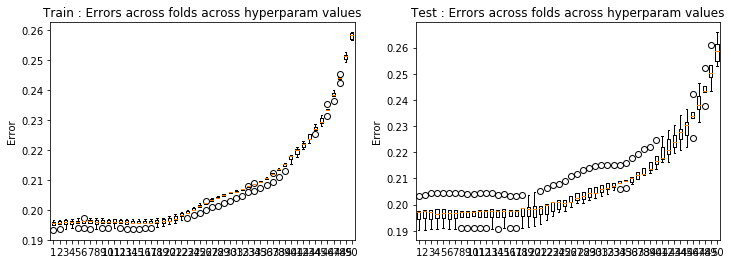

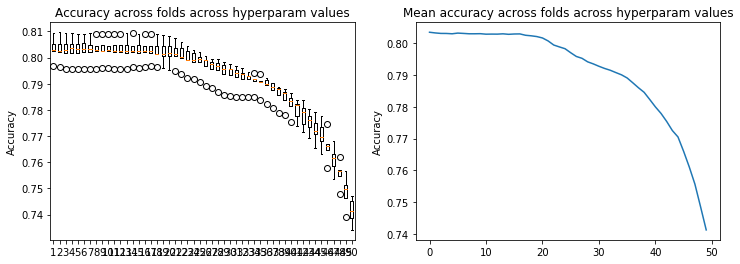

In [67]:
result_crossval(loss_tr44,loss_te44)
result_crossval_accuracy(acc44)

In [40]:
# test 45: degree 9, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr45, loss_te45, w45, acc45 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 9, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  5.42431858e+00  2.37380447e-01 -3.58922092e-01
 -8.68861016e-01  2.25434486e-01 -3.84305371e+00  1.65672614e+00
 -1.20725402e-01  6.22457357e-01  1.43113996e-02  2.18831889e-03
  3.44120854e-01 -3.37556741e-04  5.34675055e-02 -9.46117474e-02
 -2.62069880e-03 -6.92075749e-02  1.41814512e-02  3.51815918e-02
 -4.77288495e+01 -1.41637534e+00 -6.63067893e+00  1.04671583e+01
 -1.54377239e-02  1.33385215e+01 -4.41569687e+00  1.48568342e-01
  1.05112628e+00  7.33658856e-02  5.91102711e-02 -1.02861075e+00
 -1.00880542e-01 -1.18501838e-02  1.29505261e+00  4.66182154e-03
 -3.25293748e-01  1.11395647e-01 -2.07709990e-02  1.37993772e+02
  4.06822380e+00  3.02019521e+01 -2.26284041e+01 -3.14464809e+00
 -1.26154491e+01  6.42577187e+00  1.10030005e+00 -3.70626362e+00
 -1.34330937e-01 -1.6098

Ridge regression: w=[-2.78869252e-01  5.35920844e+00  2.47806662e-01 -2.41023599e-01
 -1.08790533e+00  2.39195281e-01 -3.18289523e+00  1.69903811e+00
 -5.71309436e-02  7.65907124e-01  3.09122636e-02 -2.36688201e-03
  4.70974361e-01 -1.05421626e-02  2.94531988e-02  4.72453906e-02
  2.89040835e-02 -3.88827401e-01  1.43792393e-02  1.74520987e-02
 -4.72659455e+01 -1.71601653e+00 -7.56391497e+00  1.14334245e+01
 -5.30289318e-01  1.12059223e+01 -3.41681336e+00  1.63833049e-01
  9.81417109e-01  8.15569740e-02  4.21756380e-02 -2.35201501e+00
 -1.11705532e-01 -4.62594307e-03  9.38936609e-02  1.45933274e-02
  1.46210037e+00  1.56750762e-01  5.27562859e-02  1.36690674e+02
  5.48791423e+00  3.28554629e+01 -2.36441099e+01 -7.27106977e-01
 -1.05410573e+01  3.12039856e+00  3.80400699e-01 -4.10733155e+00
 -2.03924470e-01 -6.95072159e-02  1.66312945e+00  5.69609377e-02
 -2.14520669e-01  1.25477703e+00 -2.25075160e-01 -1.84093184e+00
 -1.57553844e-01 -1.71694322e-01 -1.34538607e+02 -1.19210291e+01
 -4.1

Ridge regression: w=[-2.75017660e-01  4.28970539e+00  2.00010232e-01 -6.81040605e-01
 -1.35422396e-01  2.35098527e-01 -2.92526442e+00  9.35725012e-01
 -1.44638577e-01  6.81275493e-01  4.53658304e-02 -2.93725563e-02
  6.62085277e-01  1.94039106e-04  5.56368101e-02 -2.39207215e-01
 -1.02147716e-02 -1.67550103e-01 -1.06637678e-02 -3.93253639e-03
 -4.05320773e+01 -1.12694615e+00 -5.06921877e+00  6.99174785e+00
 -2.50693327e-01  1.02632414e+01 -1.22272567e+00  1.26857893e-01
  1.06480446e+00  6.53400407e-02  1.09887585e-02 -2.71021829e+00
 -1.22120345e-01 -2.31235259e-02  2.33269043e+00  2.68810077e-02
  5.11130349e-01  1.36485696e-01  4.56778227e-02  1.20588448e+02
  3.03498376e+00  2.77202033e+01 -1.63514801e+01 -2.16846353e+00
 -9.10790152e+00  6.76486548e-01  9.84931824e-01 -5.13844624e+00
 -3.78065597e-01  7.05623604e-02  2.56171644e+00  8.43578480e-03
 -4.06756922e-01 -5.90333350e+00  1.22715575e-01 -2.15795489e-01
  1.85091781e-02 -8.42994183e-02 -1.20788242e+02 -7.17688701e+00
 -3.8

Ridge regression: w=[-2.76819780e-01  4.19686384e+00  2.02444460e-01 -3.35592072e-01
 -3.87193887e-01  1.36986033e-01 -2.43215307e+00  1.50384690e+00
 -1.08430561e-01  1.07000218e+00  3.65635301e-02 -5.85575161e-03
  8.07823936e-01 -8.20874916e-03  3.49439801e-02 -2.55509976e-01
 -2.58652268e-02 -1.76884222e-01  7.24621643e-03 -1.11483783e-02
 -4.00024747e+01 -1.17807479e+00 -6.78532076e+00  8.18699981e+00
  4.54173638e-01  8.41006585e+00 -2.76969376e+00  1.01961477e-01
 -7.35912243e-01  9.22499226e-02  6.56092165e-02 -2.81677628e+00
 -1.21726159e-01  1.74351282e-02  2.27112334e+00  6.98336084e-02
 -8.34874686e-02  1.34819991e-01  2.46658414e-02  1.19217104e+02
  3.16658589e+00  3.08544634e+01 -1.87246243e+01 -4.07050173e+00
 -7.13350808e+00  1.89094931e+00  9.27700105e-01 -1.13924082e+00
 -2.74588638e-01 -5.00056237e-02  1.04580112e+00  7.72250109e-02
 -2.36231075e-01 -5.57532153e+00  2.95655841e-01  2.19748645e+00
 -9.59560613e-02  1.06171107e-01 -1.18988153e+02 -6.72966768e+00
 -4.0

Ridge regression: w=[-2.78727903e-01  3.21307408e+00  1.71285564e-01 -5.62269718e-01
  2.10816973e-01  3.02680005e-01 -2.33415178e+00  1.06121215e+00
 -1.16880332e-01  1.29568864e+00  1.67010056e-02 -8.98276428e-04
  7.15661699e-01  1.15324973e-02  5.28858542e-02 -1.57119291e-01
  1.39123329e-02 -1.90843221e-01  5.95720077e-03  1.35042102e-02
 -3.35292532e+01 -7.51566185e-01 -5.30519805e+00  5.10456067e+00
 -7.53992054e-01  8.04113236e+00 -1.89121910e+00  8.62845184e-02
 -1.50117479e+00  7.48341792e-02  2.29187783e-02 -1.99119623e+00
 -1.08565298e-01 -1.14230584e-03  1.63978942e+00  3.32885730e-02
  6.23117454e-01  1.27292673e-01  3.13540282e-02  1.02889949e+02
  1.44846350e+00  2.67508506e+01 -1.26063577e+01 -4.76399809e-01
 -6.63316608e+00  1.58911591e+00  7.93750643e-01 -1.09423818e+00
 -1.45872983e-01 -3.12092375e-02 -2.52733135e-01 -1.25947221e-01
 -4.50828834e-01 -3.77789552e+00 -2.44419415e-02 -5.83607906e-01
 -8.22219813e-02 -1.55685109e-01 -1.03347145e+02 -4.13381413e+00
 -3.6

Ridge regression: w=[-2.76431078e-01  2.20444574e+00  1.95008149e-01 -8.89529855e-01
  1.05701290e+00  2.55971205e-01 -3.03695941e+00  9.86517326e-01
 -1.19204661e-01  5.26933181e-01  1.63064604e-02  8.28762191e-04
  7.35876549e-01  4.44582420e-04  5.15996656e-02 -1.04753101e-01
 -2.60044587e-03 -1.52623957e-01  1.44187280e-02  3.34315170e-02
 -2.68354889e+01 -9.96062973e-01 -3.39360392e+00  1.02347676e+00
 -4.12536925e-01  1.01470537e+01 -2.15112427e+00  1.45173774e-01
  5.79077721e-01  7.30959321e-02  5.91230464e-02 -2.36681835e+00
 -1.01466617e-01 -1.23989105e-02  1.48550475e+00  4.08678397e-03
  1.62003654e-01  1.12667984e-01 -2.12841706e-02  8.56081768e+01
  2.21029284e+00  2.26201258e+01 -5.79612906e+00 -1.05397129e+00
 -8.22918624e+00  2.55424782e+00  1.05530694e+00 -2.05282588e+00
 -1.49239175e-01 -1.50456607e-01  1.18167868e+00  5.32611866e-02
 -3.39657963e-01 -4.06270929e+00  5.87959318e-02  9.00553888e-01
 -1.66272771e-01 -2.95215580e-01 -8.67130572e+01 -5.05716807e+00
 -3.3

Ridge regression: w=[-2.78869241e-01  2.16345129e+00  1.94123556e-01 -8.74924914e-01
  8.65037184e-01  2.59736890e-01 -2.56570632e+00  1.39207640e+00
 -5.59585571e-02  8.41284448e-01  3.22741580e-02 -3.36609338e-03
  5.25742752e-01 -9.61471454e-03  2.86606084e-02  8.90111848e-03
  2.96813783e-02 -3.16148662e-01  1.52534551e-02  1.58855277e-02
 -2.65967755e+01 -1.18860165e+00 -3.67842080e+00  1.91284831e+00
 -8.37530007e-01  8.72026062e+00 -2.44099117e+00  1.60509919e-01
  1.04231240e-01  8.19687209e-02  4.29269545e-02 -2.48781197e+00
 -1.10229953e-01 -5.10529062e-03  5.45325212e-01  1.53796104e-02
  1.01697303e+00  1.57224259e-01  5.31913984e-02  8.49919472e+01
  3.23016360e+00  2.36388551e+01 -6.71770917e+00  1.09119494e+00
 -7.05533727e+00  1.52451237e+00  3.41609193e-01 -1.90914529e+00
 -2.15093478e-01 -6.07068682e-02  2.15197538e+00  5.49056515e-02
 -2.09141492e-01 -1.00641914e+00 -2.34484732e-01 -1.00227243e+00
 -1.66234938e-01 -1.65788881e-01 -8.57961965e+01 -6.85373405e+00
 -3.4

Ridge regression: w=[-2.75017643e-01  1.01644798e+00  1.60680891e-01 -1.37510332e+00
  1.55167160e+00  2.63725323e-01 -2.28763109e+00  8.40207230e-01
 -1.42585758e-01  9.86094066e-01  4.65701202e-02 -3.13177254e-02
  5.15759204e-01  1.33546320e-03  5.30269704e-02 -1.98000657e-01
 -1.09809551e-02 -1.69691562e-01 -9.67239386e-03 -5.32902086e-03
 -1.92953214e+01 -7.75659119e-01 -6.35751317e-01 -9.77748701e-01
 -6.23631313e-01  7.89103022e+00 -7.87678990e-01  1.22668993e-01
 -5.99398397e-01  6.59067693e-02  1.03794100e-02 -2.16772145e+00
 -1.23211773e-01 -2.24271983e-02  2.09790713e+00  2.74012552e-02
  4.80644377e-01  1.37283229e-01  4.55195786e-02  6.71977467e+01
  1.62523857e+00  1.66414713e+01 -2.78075725e+00 -2.59807312e-01
 -6.22734972e+00 -1.87058956e-01  9.35066788e-01 -1.60258609e+00
 -3.87121728e-01  8.58460996e-02  1.95873456e+00  3.04887290e-03
 -3.90666439e-01 -5.63737751e+00  1.22450470e-01 -1.30706030e-01
  1.01743146e-02 -8.03537891e-02 -6.96720317e+01 -4.15049047e+00
 -2.8

Ridge regression: w=[-2.76819763e-01  1.03714664e+00  1.60811924e-01 -1.07081450e+00
  1.47544814e+00  1.76744585e-01 -1.94494599e+00  1.28520464e+00
 -1.06989299e-01  1.03366734e+00  3.74515096e-02 -7.51492392e-03
  8.51544639e-01 -7.19975186e-03  3.20815942e-02 -2.28831885e-01
 -2.55676859e-02 -2.98690169e-01  6.86894653e-03 -1.31984708e-02
 -1.94566585e+01 -8.40482019e-01 -2.06431087e+00 -7.78822502e-01
 -3.44013874e-03  6.62426648e+00 -2.10325751e+00  1.00509185e-01
 -9.40275045e-01  9.25735520e-02  6.57770205e-02 -3.10934558e+00
 -1.20350385e-01  1.75551173e-02  2.08968895e+00  7.02836310e-02
  5.98524424e-01  1.35207383e-01  2.34793740e-02  6.75304755e+01
  1.96382833e+00  1.90566498e+01 -3.12356004e+00 -1.92783199e+00
 -5.01873493e+00  9.17328908e-01  8.77466808e-01 -3.21645518e-01
 -2.83236257e-01 -4.00406944e-02  2.11383089e+00  7.38676729e-02
 -2.18526504e-01 -5.15095462e+00  2.86545626e-01  6.90177550e-01
 -9.84201690e-02  1.15545787e-01 -6.96359934e+01 -4.50376972e+00
 -3.0

Ridge regression: w=[-2.78727879e-01  1.77842454e-01  1.44021143e-01 -1.34061693e+00
  1.78590336e+00  3.21054511e-01 -1.79560684e+00  7.92655408e-01
 -1.15471780e-01  1.26941897e+00  1.72892854e-02 -2.78290668e-03
  8.19367745e-01  1.21966010e-02  5.07182840e-02 -1.30721118e-01
  1.42599766e-02 -1.72228031e-01  6.37954695e-03  1.21376955e-02
 -1.37821658e+01 -5.18603288e-01 -2.67261969e-01 -2.12238368e+00
 -1.00401180e+00  6.11414037e+00 -1.07828454e+00  8.56846962e-02
 -1.92539997e+00  7.39169454e-02  2.23345523e-02 -2.54138213e+00
 -1.07485057e-01 -1.55577555e-03  1.51146549e+00  3.37306209e-02
  4.60830986e-01  1.28255605e-01  3.02960140e-02  5.31064780e+01
  5.57272397e-01  1.39079246e+01 -8.18163735e-01  8.67498633e-01
 -4.45334837e+00  3.95048568e-01  7.51920561e-01  3.88575877e-01
 -1.51284100e-01 -1.90651175e-02  1.29021283e+00 -1.26237567e-01
 -4.38065287e-01 -3.79114327e+00 -3.19355151e-02 -1.84194547e-01
 -8.75751504e-02 -1.49199567e-01 -5.55637848e+01 -2.33359512e+00
 -2.4

Ridge regression: w=[-2.76431043e-01 -5.56839440e-01  1.55732550e-01 -1.65636827e+00
  2.21994194e+00  2.74418018e-01 -2.20061622e+00  7.62366911e-01
 -1.14357493e-01  5.48829046e-01  1.78526916e-02 -1.06236830e-03
  6.19757042e-01  1.33871056e-03  4.96763871e-02 -6.58212425e-02
 -2.27904317e-03 -2.10041262e-01  1.47083368e-02  3.14723059e-02
 -8.95914250e+00 -6.55775693e-01  1.74173697e+00 -4.06850417e+00
 -6.36755269e-01  7.25788929e+00 -1.26315197e+00  1.43900830e-01
  2.38350599e-01  7.29328235e-02  5.92284724e-02 -2.08018009e+00
 -1.01995914e-01 -1.25488749e-02  1.22656535e+00  3.62302486e-03
  4.69462837e-01  1.13771621e-01 -2.20582527e-02  4.06923106e+01
  9.58162860e-01  9.12384156e+00  1.88937596e+00  7.17075663e-03
 -5.23180503e+00  9.16230508e-01  9.78937682e-01 -1.18742007e+00
 -1.60837293e-01 -1.36368828e-01  1.44142147e+00  4.85542180e-02
 -3.30276637e-01 -3.51775129e+00  5.36721053e-02  2.22597551e-01
 -1.71395116e-01 -2.85033189e-01 -4.35248564e+01 -2.72737530e+00
 -2.0

Ridge regression: w=[-2.78869205e-01 -5.99852789e-01  1.38941696e-01 -1.70530253e+00
  2.04592588e+00  2.54741069e-01 -1.88833525e+00  1.19831322e+00
 -5.42666503e-02  8.38023493e-01  3.32633036e-02 -4.99417153e-03
  3.40368332e-01 -8.56876459e-03  2.76863445e-02  7.61883271e-03
  3.01896033e-02 -2.82189755e-01  1.61029915e-02  1.41612673e-02
 -8.77805753e+00 -7.08466715e-01  1.83434084e+00 -3.18148107e+00
 -8.41382607e-01  6.35920028e+00 -1.86056889e+00  1.59235578e-01
 -2.05379855e-01  8.23080311e-02  4.35020060e-02 -1.84016163e+00
 -1.08878729e-01 -5.42168226e-03  6.18468393e-01  1.61413641e-02
  7.64473269e-01  1.57585991e-01  5.33038766e-02  4.03896448e+01
  1.50682757e+00  9.24776491e+00  8.34591116e-01  1.37705756e+00
 -4.57514352e+00  7.14712084e-01  3.02693820e-01 -9.90482552e-01
 -2.23322991e-01 -4.82968864e-02  1.76979120e+00  5.15332765e-02
 -2.02725789e-01 -1.55970848e+00 -2.41746430e-01 -3.97120489e-01
 -1.74432363e-01 -1.58455293e-01 -4.31743204e+01 -3.84080931e+00
 -2.0

Ridge regression: w=[-2.75017591e-01 -1.34781992e+00  1.19305838e-01 -2.00887442e+00
  2.33733553e+00  2.79299662e-01 -1.53593187e+00  8.36386332e-01
 -1.37011495e-01  1.07053988e+00  4.70860299e-02 -3.32116554e-02
  2.57135673e-01  2.47230034e-03  5.07937245e-02 -1.19243393e-01
 -1.12056391e-02 -1.85266255e-01 -8.76422817e-03 -6.71349775e-03
 -4.07401450e+00 -4.29365020e-01  3.86737215e+00 -4.30401648e+00
 -8.21967710e-01  5.37514257e+00 -6.41398806e-01  1.21496704e-01
 -1.08565343e+00  6.64222947e-02  9.80205926e-03 -1.35936304e+00
 -1.23885896e-01 -2.15788371e-02  1.53492282e+00  2.77155789e-02
  5.22794168e-01  1.37867519e-01  4.49788859e-02  2.91300372e+01
  4.30715137e-01  4.29204356e+00  1.95363409e+00  6.76353662e-01
 -3.86291885e+00 -5.68848002e-01  8.58478684e-01 -3.65119751e-01
 -3.90734720e-01  1.00110794e-01  1.25516333e+00 -2.68293181e-03
 -3.75849375e-01 -4.11592950e+00  1.18945868e-01 -1.50461976e-01
  2.99971861e-03 -7.38008346e-02 -3.32133850e+01 -2.18589969e+00
 -1.5

Ridge regression: w=[-2.76819711e-01 -1.28618017e+00  1.10747081e-01 -1.74797623e+00
  2.33790267e+00  2.09785739e-01 -1.33962867e+00  1.12798647e+00
 -1.01542864e-01  9.47941475e-01  3.78705942e-02 -9.43043668e-03
  5.88282895e-01 -6.15289253e-03  2.97413754e-02 -1.76059843e-01
 -2.47254023e-02 -3.62558852e-01  6.62116893e-03 -1.45805528e-02
 -4.44630543e+00 -4.35756923e-01  2.72683935e+00 -4.49938133e+00
 -3.51761821e-01  4.61304985e+00 -1.65338104e+00  1.02258571e-01
 -8.48437898e-01  9.27231091e-02  6.59731098e-02 -2.27035476e+00
 -1.19334451e-01  1.76614988e-02  1.70807145e+00  7.05321277e-02
  9.47973250e-01  1.35461099e-01  2.25018722e-02  2.98993168e+01
  6.48369886e-01  5.97709485e+00  2.33083384e+00 -4.93149199e-01
 -3.14965625e+00  3.65949366e-01  7.95357330e-01 -9.53905751e-02
 -2.87765227e-01 -2.76442559e-02  1.71145524e+00  6.91561759e-02
 -2.03248189e-01 -4.06876826e+00  2.73619820e-01 -6.22536555e-02
 -1.00702359e-01  1.21699324e-01 -3.35279672e+01 -2.57970074e+00
 -1.6

Ridge regression: w=[-2.78727802e-01 -1.75000713e+00  1.16526825e-01 -1.83941314e+00
  2.33960216e+00  3.25316159e-01 -1.15449273e+00  6.53457974e-01
 -1.10527929e-01  1.11577908e+00  1.74348161e-02 -4.50100857e-03
  5.74693835e-01  1.25650776e-02  4.85326656e-02 -8.02730760e-02
  1.47659407e-02 -1.75660955e-01  6.65800413e-03  1.10719108e-02
 -1.39614667e+00 -2.83434528e-01  3.47945685e+00 -4.41546929e+00
 -1.08960752e+00  4.00727060e+00 -6.72855579e-01  8.69987352e-02
 -1.64011131e+00  7.32505694e-02  2.19243214e-02 -1.80793339e+00
 -1.06693633e-01 -2.00824321e-03  1.16949891e+00  3.41333922e-02
  4.30405550e-01  1.28751505e-01  2.92290253e-02  2.21977239e+01
 -2.55688161e-01  3.25261361e+00  2.31371257e+00  1.37173905e+00
 -2.56256410e+00 -1.34432913e-01  6.84412175e-01  5.81156811e-01
 -1.52955294e-01 -7.23813730e-03  1.07318972e+00 -1.25767292e-01
 -4.22052873e-01 -2.93698778e+00 -3.87711570e-02 -3.48943753e-02
 -9.08529640e-02 -1.41617667e-01 -2.60751466e+01 -1.03885821e+00
 -1.2

Ridge regression: w=[-2.76430932e-01 -2.13088485e+00  1.21643906e-01 -1.93163015e+00
  2.42158895e+00  2.84982004e-01 -1.31744434e+00  6.92130865e-01
 -1.02613247e-01  5.94438320e-01  1.83576188e-02 -3.32472891e-03
  3.12232839e-01  2.27570988e-03  4.77100163e-02 -1.08454905e-02
 -1.47062197e-03 -2.33626387e-01  1.48554646e-02  2.95478347e-02
  1.00089061e+00 -3.55572179e-01  4.32946291e+00 -4.91002536e+00
 -7.66819295e-01  4.38209297e+00 -9.15515862e-01  1.44733215e-01
 -1.70258408e-03  7.29535286e-02  5.89923130e-02 -1.15636651e+00
 -1.02065684e-01 -1.24398954e-02  8.40503858e-01  3.47217629e-03
  5.98553139e-01  1.14374636e-01 -2.25713915e-02  1.61870658e+01
 -8.26833400e-02  8.50872231e-01  3.04424342e+00  5.91266772e-01
 -2.73020767e+00  2.39119157e-01  8.45040932e-01 -7.44418102e-01
 -1.64920717e-01 -1.18567090e-01  8.85762639e-01  4.29883503e-02
 -3.16825384e-01 -2.48076395e+00  4.58244246e-02 -6.82252661e-02
 -1.74130285e-01 -2.70102404e-01 -2.04577523e+01 -1.10426408e+00
 -1.0

Ridge regression: w=[-2.78869094e-01 -2.18180664e+00  8.94848162e-02 -2.00904161e+00
  2.29791713e+00  2.40668550e-01 -1.13343940e+00  1.01818732e+00
 -5.18529922e-02  7.84754999e-01  3.35178382e-02 -6.85069512e-03
  6.93076448e-02 -7.57202304e-03  2.66555117e-02  2.29741205e-02
  2.98343233e-02 -2.76102292e-01  1.65861723e-02  1.26701351e-02
  1.19558414e+00 -2.75516595e-01  4.57250273e+00 -4.17907916e+00
 -7.37395726e-01  3.88968135e+00 -1.39290657e+00  1.59516678e-01
 -2.63646681e-01  8.24168692e-02  4.36389220e-02 -8.74923359e-01
 -1.07898420e-01 -5.53324796e-03  5.45317121e-01  1.65862560e-02
  6.90788046e-01  1.57675577e-01  5.31532204e-02  1.59488995e+01
  3.21512038e-02  6.49714953e-01  2.05947122e+00  1.12064776e+00
 -2.41544607e+00  2.09579595e-01  2.70327751e-01 -6.38146555e-01
 -2.25606732e-01 -3.45247765e-02  1.02402162e+00  4.66343882e-02
 -1.95064213e-01 -1.50390566e+00 -2.39998979e-01 -1.74908298e-01
 -1.78775979e-01 -1.48862423e-01 -2.03370097e+01 -1.63145124e+00
 -1.0

Ridge regression: w=[-2.75017432e-01 -2.56919260e+00  8.99482348e-02 -2.05056274e+00
  2.29926972e+00  2.83179891e-01 -8.07979564e-01  8.57503344e-01
 -1.25329438e-01  1.03471627e+00  4.64026777e-02 -3.45601827e-02
  5.75300923e-03  3.41344814e-03  4.83632380e-02 -4.52704463e-02
 -1.02536651e-02 -1.91881825e-01 -8.05163417e-03 -8.01585350e-03
  3.55585699e+00 -1.60852670e-01  5.20810472e+00 -4.24538881e+00
 -9.00772533e-01  3.02955392e+00 -6.42833826e-01  1.22008903e-01
 -1.02940302e+00  6.67409826e-02  9.23570719e-03 -5.82417961e-01
 -1.23685651e-01 -2.07946537e-02  1.01680861e+00  2.77883900e-02
  5.43941418e-01  1.38251667e-01  4.41035468e-02  1.06271930e+01
 -5.13830418e-01 -1.30627942e+00  2.04483095e+00  1.09387765e+00
 -1.90682922e+00 -6.59968716e-01  7.30823138e-01 -1.25976184e-01
 -3.84823552e-01  1.10147227e-01  6.21014095e-01 -7.83791783e-03
 -3.56210414e-01 -2.69493297e+00  1.08205073e-01 -1.72567701e-01
 -1.96985876e-03 -6.32515514e-02 -1.61462626e+01 -7.51740895e-01
 -8.1

Ridge regression: w=[-2.76819550e-01 -2.51166567e+00  7.30981191e-02 -1.83505238e+00
  2.31827845e+00  2.28909550e-01 -7.39486566e-01  9.67670428e-01
 -8.87404289e-02  8.20388373e-01  3.75240017e-02 -1.13205067e-02
  2.67940848e-01 -5.12498770e-03  2.78089957e-02 -1.16974495e-01
 -2.25214468e-02 -3.69776703e-01  6.46077065e-03 -1.44548672e-02
  3.21785506e+00 -1.02902930e-01  4.32055572e+00 -4.50469057e+00
 -5.61984275e-01  2.68863475e+00 -1.26191671e+00  1.05433166e-01
 -6.05882382e-01  9.26313269e-02  6.55620593e-02 -1.16430477e+00
 -1.18466061e-01  1.75796808e-02  1.31165632e+00  7.00983124e-02
  1.01753281e+00  1.35574597e-01  2.19275531e-02  1.13006426e+01
 -4.77214370e-01 -1.70319601e-01  2.51990504e+00  3.66015460e-01
 -1.55639436e+00 -8.46358280e-03  6.49899656e-01 -1.43647940e-01
 -2.85632333e-01 -1.36370794e-02  8.91715503e-01  6.27141672e-02
 -1.88141920e-01 -3.01241638e+00  2.51621706e-01 -2.89040427e-01
 -1.01544402e-01  1.19161271e-01 -1.63626231e+01 -9.84235668e-01
 -8.2

Ridge regression: w=[-2.78727567e-01 -2.71394003e+00  1.04565823e-01 -1.77666954e+00
  2.17236323e+00  3.16711633e-01 -6.10365197e-01  5.84540754e-01
 -1.00363070e-01  9.16005701e-01  1.70839854e-02 -5.80719056e-03
  2.97598384e-01  1.23934049e-02  4.49158701e-02 -2.90622072e-02
  1.55603953e-02 -1.85314609e-01  6.72257078e-03  1.00624541e-02
  4.53538508e+00 -1.49428495e-01  4.17137218e+00 -3.85274915e+00
 -1.06541916e+00  2.27828867e+00 -5.01345258e-01  8.80987251e-02
 -1.08501103e+00  7.25893949e-02  2.13913456e-02 -9.19698849e-01
 -1.05832076e-01 -2.50393054e-03  8.43183053e-01  3.42893826e-02
  4.56475628e-01  1.28845318e-01  2.80798241e-02  8.07879657e+00
 -7.86454168e-01 -7.04756082e-01  1.82359529e+00  1.45471737e+00
 -1.16255428e+00 -3.16092031e-01  5.71043869e-01  2.56119682e-01
 -1.50632761e-01  3.20794935e-03  4.82914427e-01 -1.22229463e-01
 -3.89636058e-01 -2.13928749e+00 -4.55105854e-02 -2.57793988e-02
 -9.13096359e-02 -1.30018087e-01 -1.34317433e+01 -1.68769514e-01
 -6.4

Ridge regression: w=[-2.76430592e-01 -2.89565405e+00  1.11596268e-01 -1.71043968e+00
  2.05437750e+00  2.82783056e-01 -6.85316143e-01  6.11454831e-01
 -8.34483680e-02  6.03296895e-01  1.77243958e-02 -6.79493918e-03
  9.72201462e-02  3.67690777e-03  4.44135127e-02  4.11666075e-02
  1.28551622e-04 -2.27203594e-01  1.45454818e-02  2.66165228e-02
  5.60368999e+00 -2.25273011e-01  4.18504803e+00 -3.61529051e+00
 -7.89262201e-01  2.38640511e+00 -6.81004768e-01  1.43622516e-01
 -1.49514347e-01  7.26197992e-02  5.78757348e-02 -4.39670138e-01
 -1.01484271e-01 -1.21132632e-02  5.11506272e-01  3.40319052e-03
  5.93501949e-01  1.14799047e-01 -2.28624872e-02  5.53308554e+00
 -6.31949857e-01 -1.34094409e+00  1.80107999e+00  7.92245233e-01
 -1.13569392e+00 -7.91906375e-02  6.39960569e-01 -4.74523412e-01
 -1.60533245e-01 -8.82066971e-02  3.55468816e-01  3.27526840e-02
 -2.88120360e-01 -1.67456280e+00  3.27236825e-02 -1.26772842e-01
 -1.72322460e-01 -2.42022509e-01 -1.13033100e+01 -1.69747291e-01
 -5.4

Ridge regression: w=[-2.78868750e-01 -2.94554277e+00  7.19476496e-02 -1.79237235e+00
  2.01324626e+00  2.25905027e-01 -5.82420596e-01  8.24618694e-01
 -4.92023688e-02  7.06136710e-01  3.29510097e-02 -9.27387149e-03
 -9.36575393e-02 -6.43569046e-03  2.46730575e-02  5.07841343e-02
  2.77782062e-02 -2.72922164e-01  1.64213012e-02  1.07060384e-02
  5.78812930e+00 -7.57452296e-02  4.44581548e+00 -3.20467963e+00
 -6.32298640e-01  2.14427054e+00 -9.85193137e-01  1.56992688e-01
 -2.55635300e-01  8.18473244e-02  4.31623346e-02 -1.91399610e-01
 -1.06918685e-01 -5.63967662e-03  4.00323042e-01  1.64575955e-02
  6.66412272e-01  1.57564492e-01  5.22645716e-02  5.33946408e+00
 -7.56706854e-01 -1.58373434e+00  1.12590080e+00  8.42324917e-01
 -1.01613617e+00 -1.09702017e-01  2.38936750e-01 -4.52874064e-01
 -2.21358639e-01 -1.48035534e-02  4.32292023e-01  3.88131326e-02
 -1.77281320e-01 -1.25366534e+00 -2.21364309e-01 -1.05148103e-01
 -1.77248087e-01 -1.31153633e-01 -1.12736321e+01 -3.60695406e-01
 -5.4

Ridge regression: w=[-2.75016939e-01 -3.11226882e+00  9.13784773e-02 -1.71427992e+00
  1.88739641e+00  2.69669940e-01 -3.46777338e-01  8.14936751e-01
 -1.09622982e-01  9.24034086e-01  4.36623865e-02 -3.54635341e-02
 -1.05390881e-01  4.24228168e-03  4.35417036e-02  1.82568159e-02
 -7.44085678e-03 -1.80101750e-01 -7.56530941e-03 -9.91120758e-03
  6.85932984e+00 -1.06194712e-01  4.42515764e+00 -2.88577787e+00
 -8.49876473e-01  1.59004872e+00 -6.33675154e-01  1.20262444e-01
 -8.06587256e-01  6.61611908e-02  8.55133738e-03 -1.57551655e-01
 -1.22467742e-01 -1.98184200e-02  6.24815690e-01  2.71974092e-02
  5.05176018e-01  1.38601304e-01  4.22082271e-02  3.00696857e+00
 -8.77287587e-01 -2.04676156e+00  8.34129351e-01  1.11067107e+00
 -7.94086005e-01 -5.96066728e-01  5.63420759e-01 -1.57508594e-01
 -3.61495112e-01  1.17524371e-01  2.43302259e-01 -1.31091203e-02
 -3.13256817e-01 -1.75898559e+00  8.35373709e-02 -1.40760302e-01
 -4.81798493e-03 -4.46525535e-02 -9.75234686e+00 -6.55172020e-03
 -4.6

Ridge regression: w=[-2.76819054e-01 -3.08040287e+00  7.14014024e-02 -1.55661051e+00
  1.89916566e+00  2.26640845e-01 -3.51238116e-01  7.97145689e-01
 -7.09941437e-02  6.85122792e-01  3.58469567e-02 -1.35631104e-02
  9.64177928e-02 -3.79602245e-03  2.46677409e-02 -4.93936370e-02
 -1.76538337e-02 -3.36944668e-01  6.07120727e-03 -1.23825682e-02
  6.64532190e+00 -1.84336809e-02  3.79743491e+00 -3.06386432e+00
 -5.96644709e-01  1.48556497e+00 -9.46084474e-01  1.05873221e-01
 -3.83809536e-01  9.15380789e-02  6.39593445e-02 -4.69411654e-01
 -1.17086329e-01  1.71205447e-02  9.22438016e-01  6.82191741e-02
  9.18595323e-01  1.35757477e-01  2.08819075e-02  3.46993718e+00
 -9.42285213e-01 -1.33712251e+00  1.18147062e+00  6.41832859e-01
 -6.38254864e-01 -1.98630783e-01  4.54183807e-01 -2.04038702e-01
 -2.71917867e-01  5.73462613e-03  3.14292239e-01  5.22853123e-02
 -1.60046602e-01 -2.16461678e+00  2.08212990e-01 -2.53959050e-01
 -9.91558102e-02  1.02173047e-01 -9.88987410e+00 -1.17638633e-01
 -4.5

Ridge regression: w=[-2.78726839e-01 -3.13571497e+00  1.19197551e-01 -1.49588926e+00
  1.76686837e+00  2.89798987e-01 -2.86580220e-01  5.18226328e-01
 -8.88945233e-02  7.38653575e-01  1.59863788e-02 -7.08080550e-03
  1.62278727e-01  1.11983344e-02  3.72046290e-02  3.03771623e-02
  1.67167881e-02 -1.86562050e-01  6.23489887e-03  8.14858687e-03
  7.12302543e+00 -1.95379987e-01  3.50234271e+00 -2.50295646e+00
 -9.23573295e-01  1.30754134e+00 -4.26156124e-01  8.57865992e-02
 -6.36669216e-01  7.05638261e-02  2.04504442e-02 -4.29587767e-01
 -1.04230797e-01 -2.92669771e-03  5.13013557e-01  3.36377690e-02
  4.73029160e-01  1.28909272e-01  2.57260444e-02  2.20930806e+00
 -8.57005759e-01 -1.18215684e+00  6.05969511e-01  1.23225675e+00
 -4.67721042e-01 -3.07104824e-01  4.43240050e-01 -2.91861918e-02
 -1.41998006e-01  1.54609548e-02  1.12165828e-01 -1.10468481e-01
 -3.17900790e-01 -1.47048752e+00 -5.35551953e-02 -4.82390573e-02
 -8.69473230e-02 -1.07773867e-01 -8.81926313e+00  2.22477781e-01
 -3.8

Ridge regression: w=[-2.76429541e-01 -3.17796338e+00  1.29543714e-01 -1.41040740e+00
  1.59391424e+00  2.64561393e-01 -3.31395569e-01  4.85143828e-01
 -6.55355122e-02  5.40881707e-01  1.56727016e-02 -1.25024637e-02
  4.19507954e-02  6.36297713e-03  3.81867011e-02  9.80514716e-02
  2.84463047e-03 -2.03809986e-01  1.28435064e-02  2.11544508e-02
  7.46680652e+00 -2.91503629e-01  3.35298252e+00 -2.10564122e+00
 -7.03534585e-01  1.35283228e+00 -4.82537411e-01  1.35112627e-01
 -1.68659834e-01  7.03738002e-02  5.43539636e-02 -1.37080635e-01
 -9.96365449e-02 -1.11754461e-02  1.98125067e-01  2.94974095e-03
  5.28428581e-01  1.15772753e-01 -2.32803121e-02  1.19602448e+00
 -6.61422567e-01 -1.29082611e+00  4.66504714e-01  6.95718588e-01
 -4.32177097e-01 -1.81183136e-01  4.45407090e-01 -3.08130218e-01
 -1.44590938e-01 -3.42988665e-02  7.98099474e-02  1.05966514e-02
 -2.30720944e-01 -1.04248865e+00  1.10878723e-02 -1.01202382e-01
 -1.59474943e-01 -1.89285940e-01 -7.96883118e+00  2.02404005e-01
 -3.4

Ridge regression: w=[-2.78867690e-01 -3.21572024e+00  9.20761991e-02 -1.47658159e+00
  1.61999497e+00  2.06877869e-01 -2.70225309e-01  6.12676615e-01
 -4.81023590e-02  5.86189432e-01  3.12024008e-02 -1.28542409e-02
 -9.57675168e-02 -4.75895408e-03  2.04227592e-02  9.48184245e-02
  2.29637939e-02 -2.58643302e-01  1.46952029e-02  7.28021662e-03
  7.59795741e+00 -1.42068137e-01  3.54469036e+00 -1.98731698e+00
 -5.17063417e-01  1.23261159e+00 -6.69550547e-01  1.47885647e-01
 -1.90970190e-01  7.92762520e-02  4.11441367e-02  5.87589674e-02
 -1.05077675e-01 -5.89198234e-03  1.77095301e-01  1.49243256e-02
  6.29001353e-01  1.57406587e-01  4.91506580e-02  1.08667132e+00
 -8.36275316e-01 -1.43804671e+00  1.18813450e-01  5.89108017e-01
 -3.97436091e-01 -2.08712827e-01  2.17725678e-01 -3.24863409e-01
 -2.07516619e-01  1.76963449e-02  1.24068314e-01  2.51604624e-02
 -1.36831554e-01 -8.72421366e-01 -1.76155317e-01 -7.75923109e-02
 -1.63387312e-01 -9.80228354e-02 -7.97631431e+00  1.42756184e-01
 -3.4

Ridge regression: w=[-2.75015416e-01 -3.20706575e+00  1.20474205e-01 -1.38638707e+00
  1.46209665e+00  2.36068732e-01 -9.20309250e-02  6.42205895e-01
 -9.78676481e-02  7.26546230e-01  3.73340530e-02 -3.58875278e-02
 -6.81457331e-02  5.18314972e-03  3.46964815e-02  8.48874295e-02
 -2.43938180e-03 -1.54957073e-01 -7.64108893e-03 -1.29146062e-02
  7.86952164e+00 -2.45830006e-01  3.43621614e+00 -1.66939737e+00
 -6.74113066e-01  8.72490753e-01 -5.09312887e-01  1.14160257e-01
 -5.34834391e-01  6.28781834e-02  7.51637838e-03 -4.36416470e-02
 -1.19242510e-01 -1.77856352e-02  2.63197423e-01  2.49789187e-02
  4.35442492e-01  1.39270975e-01  3.78024005e-02  1.58685670e-01
 -7.42996687e-01 -1.54002449e+00 -5.33539178e-02  8.24919011e-01
 -3.47979589e-01 -4.44732453e-01  4.33924969e-01 -1.63198606e-01
 -3.07328271e-01  1.23240397e-01  5.69124759e-02 -2.00395712e-02
 -2.33736201e-01 -1.04823227e+00  4.20567529e-02 -9.77678966e-02
 -3.63611689e-03 -1.49380163e-02 -7.32055114e+00  2.50530700e-01
 -3.1

Ridge regression: w=[-2.76817521e-01 -3.20702330e+00  1.02958795e-01 -1.29650572e+00
  1.46550408e+00  2.04762776e-01 -1.27712256e-01  5.83942240e-01
 -5.82928602e-02  5.21672171e-01  3.18120133e-02 -1.62487084e-02
  8.74528856e-02 -1.58679961e-03  1.91862373e-02  3.57102860e-02
 -9.52646338e-03 -2.85516074e-01  4.70820798e-03 -8.25412383e-03
  7.80670939e+00 -1.63956873e-01  3.07075675e+00 -1.74243419e+00
 -4.92828106e-01  8.66466421e-01 -6.76451567e-01  1.00884399e-01
 -1.93456656e-01  8.73284623e-02  5.97930187e-02 -2.10807289e-01
 -1.13914175e-01  1.59484701e-02  4.76872306e-01  6.30266751e-02
  7.69043749e-01  1.36596401e-01  1.76163407e-02  3.87310183e-01
 -8.25825051e-01 -1.17587151e+00  1.18912440e-01  5.26095230e-01
 -2.68557533e-01 -2.04120165e-01  3.05049738e-01 -1.96424243e-01
 -2.37631245e-01  3.22754213e-02  3.50782027e-02  3.37835047e-02
 -1.09917002e-01 -1.34541951e+00  1.37388604e-01 -1.67873039e-01
 -8.85170108e-02  6.83286856e-02 -7.42692456e+00  1.95583201e-01
 -3.0

Ridge regression: w=[-2.78724591e-01 -3.13143501e+00  1.51161775e-01 -1.27344607e+00
  1.36086576e+00  2.45159384e-01 -7.36084590e-02  3.91722860e-01
 -8.21386283e-02  5.60364404e-01  1.36348054e-02 -8.40132129e-03
  1.49141708e-01  8.67528749e-03  2.52203886e-02  9.71536419e-02
  1.79556248e-02 -1.67018300e-01  4.50741753e-03  5.16654016e-03
  7.75994749e+00 -3.68305932e-01  2.91239645e+00 -1.40077934e+00
 -6.81986711e-01  7.68160894e-01 -3.20303060e-01  7.94621569e-02
 -3.28749783e-01  6.42172886e-02  1.85623809e-02 -2.53169129e-01
 -1.00320483e-01 -2.75304693e-03  1.65055961e-01  3.12637024e-02
  4.40673728e-01  1.29633971e-01  2.00643923e-02 -4.68779728e-02
 -6.05507155e-01 -1.02205447e+00 -1.42703283e-01  7.98825072e-01
 -2.22047848e-01 -2.19175554e-01  3.60922014e-01 -1.35018143e-01
 -1.22788111e-01  3.06583423e-02 -5.40286899e-02 -8.66140132e-02
 -2.05523687e-01 -8.38737285e-01 -6.09259264e-02 -6.17372289e-02
 -7.27357180e-02 -7.43615705e-02 -6.89064121e+00  3.24342590e-01
 -2.7

Ridge regression: w=[-2.76426294e-01 -3.02829406e+00  1.56794561e-01 -1.19566481e+00
  1.16444908e+00  2.34790581e-01 -8.64551594e-02  3.22542527e-01
 -5.58239872e-02  4.12662182e-01  1.19475791e-02 -1.87798930e-02
  7.61374185e-02  1.06568869e-02  3.01210817e-02  1.50959430e-01
  6.21624659e-03 -1.65789383e-01  8.38712743e-03  1.42617501e-02
  7.56882348e+00 -4.45347911e-01  2.79436612e+00 -1.01898293e+00
 -5.54351053e-01  7.58902021e-01 -3.03259126e-01  1.18042744e-01
 -7.62298896e-02  6.29058347e-02  4.51006391e-02 -6.57158870e-02
 -9.49934992e-02 -8.38869100e-03 -7.91761033e-02  1.81189192e-03
  4.36464580e-01  1.18836438e-01 -2.42266406e-02 -3.49509408e-01
 -4.30066167e-01 -1.07102759e+00 -1.90483659e-01  4.53692902e-01
 -2.03573593e-01 -1.51918007e-01  3.33046282e-01 -2.03129136e-01
 -1.15356302e-01  3.11587717e-02 -4.16394482e-02 -2.54752609e-02
 -1.55031259e-01 -5.24544930e-01 -1.43825624e-02 -7.54066132e-02
 -1.25616875e-01 -1.21572434e-01 -6.33139907e+00  2.90231850e-01
 -2.6

Ridge regression: w=[-2.78864414e-01 -3.05154458e+00  1.27778870e-01 -1.24182853e+00
  1.21427793e+00  1.83026253e-01 -4.84199478e-02  3.76091843e-01
 -4.90226911e-02  4.20778828e-01  2.78316883e-02 -1.67614963e-02
  1.54025350e-03 -2.29210060e-03  1.46183937e-02  1.40567617e-01
  1.65361125e-02 -2.19698814e-01  1.00661202e-02  3.28071262e-03
  7.64120738e+00 -3.38239847e-01  2.90850773e+00 -1.04152347e+00
 -3.86904660e-01  6.97227478e-01 -4.07586684e-01  1.33368938e-01
 -6.79058583e-02  7.13675739e-02  3.55023175e-02  5.38247759e-02
 -1.00919747e-01 -6.17667371e-03 -5.33592780e-02  1.05859152e-02
  5.43114182e-01  1.57583123e-01  4.13780772e-02 -3.80361546e-01
 -5.50353614e-01 -1.11868371e+00 -3.42627243e-01  3.39558929e-01
 -1.96786229e-01 -1.53515468e-01  2.11673447e-01 -2.26743022e-01
 -1.81211022e-01  5.70954701e-02 -2.40343810e-02  4.54645804e-03
 -7.94396683e-02 -4.71234328e-01 -1.13632959e-01 -6.44055788e-02
 -1.27058134e-01 -5.68487136e-02 -6.34906284e+00  2.66108949e-01
 -2.6

Ridge regression: w=[-2.75010711e-01 -2.87638956e+00  1.49500907e-01 -1.12619089e+00
  1.01272593e+00  1.94592086e-01  9.29552091e-02  3.99418554e-01
 -9.14840830e-02  4.76045771e-01  2.76131462e-02 -3.53437061e-02
  2.70223276e-02  6.30833347e-03  2.46326369e-02  1.38361747e-01
  3.13472924e-03 -1.13049671e-01 -8.62768740e-03 -1.58350251e-02
  7.33199686e+00 -4.25442374e-01  2.77041515e+00 -7.38795713e-01
 -4.58724237e-01  4.41848800e-01 -3.14024533e-01  1.07477168e-01
 -2.41859205e-01  5.36284158e-02  5.79607381e-03 -5.42127956e-02
 -1.11764752e-01 -1.29754445e-02 -1.64916020e-02  2.03380141e-02
  3.39019203e-01  1.41350209e-01  2.89804101e-02 -6.53001192e-01
 -4.37020556e-01 -1.17482293e+00 -3.63413682e-01  4.50471008e-01
 -2.15150662e-01 -2.66344284e-01  3.64411500e-01 -1.16194892e-01
 -2.26097829e-01  1.25305520e-01 -3.96728061e-02 -2.82471179e-02
 -1.44329730e-01 -5.26866424e-01 -1.14432568e-04 -7.35583931e-02
  3.79531321e-03  1.68869552e-02 -5.80756580e+00  2.82373285e-01
 -2.4

Ridge regression: w=[-2.76812785e-01 -2.89148689e+00  1.37888038e-01 -1.09745401e+00
  1.01683335e+00  1.75811681e-01  4.62010450e-02  3.43954353e-01
 -5.36909707e-02  3.41595471e-01  2.54145120e-02 -1.81033076e-02
  1.44931882e-01  1.65323372e-03  1.33120337e-02  1.08601787e-01
 -1.02727664e-03 -2.11248463e-01  1.71506985e-03 -3.63748335e-03
  7.35807244e+00 -3.68476423e-01  2.60530780e+00 -7.55538075e-01
 -3.43424012e-01  4.70996644e-01 -4.20552272e-01  9.41180853e-02
 -2.41622626e-02  7.56373318e-02  5.06368329e-02 -1.47245053e-01
 -1.06524655e-01  1.36164383e-02  1.04414429e-01  5.15107648e-02
  5.88307885e-01  1.39493041e-01  1.02305553e-02 -5.82640252e-01
 -4.96731969e-01 -1.01571642e+00 -3.03235053e-01  2.80791944e-01
 -1.62395927e-01 -1.17146484e-01  2.36818640e-01 -1.46246605e-01
 -1.84250175e-01  5.64323383e-02 -8.90636000e-02  7.83814851e-03
 -5.54310944e-02 -6.79045362e-01  6.53620882e-02 -1.15696112e-01
 -6.49167653e-02  3.26959270e-02 -5.89199944e+00  2.51463785e-01
 -2.4

Ridge regression: w=[-2.78717647e-01 -2.66708867e+00  1.70313144e-01 -1.05354253e+00
  8.76612938e-01  1.99594863e-01  1.12286826e-01  2.48132141e-01
 -7.83222802e-02  3.91942582e-01  1.02077243e-02 -8.74927711e-03
  1.65455329e-01  6.04365780e-03  1.47932284e-02  1.41374298e-01
  1.88767179e-02 -1.15747673e-01  1.31619324e-03  2.85771232e-03
  6.86167534e+00 -5.09969217e-01  2.46066570e+00 -4.84480781e-01
 -4.49770811e-01  3.73362667e-01 -1.95385467e-01  7.38206954e-02
 -1.10630326e-01  4.88222764e-02  1.48369626e-02 -1.86622669e-01
 -9.16746425e-02 -1.13791384e-03 -6.67224135e-02  2.64906970e-02
  3.35886307e-01  1.32695784e-01  9.36125564e-03 -6.41372806e-01
 -3.25731385e-01 -9.20515568e-01 -3.51798260e-01  3.94594485e-01
 -1.68931802e-01 -1.26022122e-01  3.15894774e-01 -1.36735199e-01
 -9.59408881e-02  4.17046789e-02 -1.18634615e-01 -5.99519648e-02
 -1.04238464e-01 -4.00467671e-01 -6.42644242e-02 -6.44024359e-02
 -4.64302252e-02 -4.42714489e-02 -5.34346972e+00  2.98987803e-01
 -2.2

Ridge regression: w=[-2.76416265e-01 -2.41638644e+00  1.62981046e-01 -9.38498112e-01
  6.65924865e-01  2.02331962e-01  1.13088460e-01  1.89863471e-01
 -5.03967538e-02  2.93267456e-01  7.42500191e-03 -2.10804180e-02
  1.12251627e-01  1.50049705e-02  2.40955303e-02  1.74912075e-01
  9.23134454e-03 -1.02524244e-01  1.41071783e-03  9.75573671e-03
  6.23880624e+00 -5.27612758e-01  2.27481915e+00 -1.60244661e-01
 -4.11485826e-01  3.40267690e-01 -1.67765432e-01  1.00244345e-01
  2.29120647e-02  4.58424828e-02  2.73008059e-02 -5.94819108e-02
 -8.63837311e-02 -2.31361873e-03 -2.14810591e-01 -9.31720054e-05
  2.98283503e-01  1.27616075e-01 -2.56295578e-02 -6.11415743e-01
 -2.35013832e-01 -9.45426926e-01 -3.10442000e-01  2.43312870e-01
 -1.58698251e-01 -9.81783553e-02  2.72282993e-01 -1.33835597e-01
 -8.25808368e-02  7.16605686e-02 -8.90601913e-02 -6.06019392e-02
 -9.65717560e-02 -2.26750803e-01 -3.35426910e-02 -6.23176039e-02
 -7.24472454e-02 -7.14352245e-02 -4.71377753e+00  2.62042699e-01
 -2.1

Ridge regression: w=[-2.78854296e-01 -2.43048484e+00  1.41434167e-01 -9.69664368e-01
  7.06745120e-01  1.59996040e-01  1.35705308e-01  1.89359244e-01
 -4.91661984e-02  2.87024021e-01  2.33825909e-02 -1.83885703e-02
  9.23366090e-02  4.20766489e-04  1.06125114e-02  1.62821203e-01
  1.23228492e-02 -1.43047720e-01  3.04274168e-03  1.20751538e-03
  6.27930707e+00 -4.61995020e-01  2.34275774e+00 -2.04937324e-01
 -2.78105382e-01  3.11011203e-01 -2.14044777e-01  1.20355583e-01
  2.42980651e-02  5.33781651e-02  2.48597502e-02 -1.37527201e-02
 -9.36916930e-02 -5.99785756e-03 -1.71696479e-01  2.88444732e-03
  3.79711758e-01  1.59738801e-01  2.84507202e-02 -6.08355975e-01
 -2.88903731e-01 -9.45536001e-01 -3.77843592e-01  1.58515925e-01
 -1.57254004e-01 -7.50873975e-02  2.03381714e-01 -1.54352089e-01
 -1.49671360e-01  8.21034425e-02 -9.05526116e-02 -1.63208305e-02
 -3.43651162e-02 -2.24542150e-01 -6.66701472e-02 -5.70035067e-02
 -7.17223947e-02 -2.83246737e-02 -4.73173733e+00  2.42514765e-01
 -2.1

Ridge regression: w=[-2.74996180e-01 -2.12035427e+00  1.48948352e-01 -7.85892896e-01
  4.91833782e-01  1.59301914e-01  2.28316498e-01  2.23202418e-01
 -8.39894213e-02  2.90536898e-01  1.80790509e-02 -3.28608887e-02
  8.35324293e-02  7.38478986e-03  1.75473889e-02  1.59636596e-01
  7.46867071e-03 -5.01440473e-02 -1.01899247e-02 -1.66898283e-02
  5.56801014e+00 -4.90565322e-01  2.06601862e+00  3.00219869e-02
 -2.97257122e-01  1.56909758e-01 -1.63708908e-01  1.04024420e-01
 -3.50822096e-02  3.62064549e-02  3.38913218e-03 -6.62846684e-02
 -9.91661649e-02 -4.70942365e-03 -1.37131767e-01  1.39276615e-02
  2.04661050e-01  1.47902354e-01  1.68391844e-02 -5.82639535e-01
 -2.41197406e-01 -9.66366289e-01 -3.05217140e-01  1.94991721e-01
 -1.90028660e-01 -1.44784099e-01  3.10152266e-01 -6.64720087e-02
 -1.52719116e-01  1.18219517e-01 -7.99729206e-02 -3.47211172e-02
 -8.31649878e-02 -2.59678350e-01 -2.61516979e-02 -6.33080147e-02
  1.47604256e-02  3.62304340e-02 -4.08406524e+00  2.27129910e-01
 -1.9

Ridge regression: w=[-2.76798159e-01 -2.13246389e+00  1.43884281e-01 -8.01504737e-01
  4.95787145e-01  1.51739529e-01  1.83292434e-01  1.69890131e-01
 -5.15132739e-02  2.26672453e-01  1.87699576e-02 -1.73847457e-02
  1.74859964e-01  5.04837919e-03  9.84289584e-03  1.42007858e-01
  4.75326692e-03 -1.06412549e-01 -1.90413339e-03 -3.61509333e-04
  5.60875182e+00 -4.60093380e-01  2.02781555e+00  3.55698223e-02
 -2.30413002e-01  1.90232687e-01 -2.22750535e-01  8.98882229e-02
  5.93460558e-02  5.30510924e-02  3.59169736e-02 -1.20859866e-01
 -9.37286439e-02  1.01468094e-02 -6.98990285e-02  3.29623603e-02
  3.54580370e-01  1.47489810e-01 -4.24139180e-04 -5.78662812e-01
 -2.73493567e-01 -8.94935472e-01 -2.89396177e-01  1.03795549e-01
 -1.49163824e-01 -4.86902908e-02  2.04911423e-01 -9.74015661e-02
 -1.33305086e-01  6.47967642e-02 -1.33367507e-01 -1.60772590e-02
 -2.12786274e-02 -3.27151120e-01  2.07716995e-02 -9.06793286e-02
 -3.62039871e-02  1.25558728e-02 -4.14109929e+00  2.09184220e-01
 -1.8

Ridge regression: w=[-2.78696200e-01 -1.81039840e+00  1.56953953e-01 -6.95807586e-01
  3.55963198e-01  1.61712083e-01  2.40387770e-01  1.51689089e-01
 -7.15769354e-02  2.88208303e-01  6.60550138e-03 -7.04165295e-03
  1.58797808e-01  4.90362165e-03  1.00163427e-02  1.52509596e-01
  1.91959444e-02 -4.13800121e-02 -1.75179114e-03  2.27652844e-03
  4.84176557e+00 -5.19762669e-01  1.76561656e+00  2.02631525e-01
 -2.89046161e-01  1.13990592e-01 -9.97472022e-02  7.02968778e-02
 -2.62959789e-03  2.41265189e-02  9.59909937e-03 -1.41029312e-01
 -7.88436973e-02  1.75640271e-03 -1.39567135e-01  2.01844038e-02
  1.80895726e-01  1.41542768e-01 -3.09337412e-03 -4.70707357e-01
 -1.93706377e-01 -7.97303940e-01 -2.28765146e-01  1.59611735e-01
 -1.69654174e-01 -7.30804825e-02  2.70348899e-01 -1.09869568e-01
 -7.14196652e-02  4.07732768e-02 -1.32137861e-01 -4.45352055e-02
 -5.04778430e-02 -2.03014063e-01 -6.37596226e-02 -6.23296760e-02
 -1.95279578e-02 -2.68974128e-02 -3.50328648e+00  2.20238422e-01
 -1.6

Ridge regression: w=[-2.76385290e-01 -1.50464321e+00  1.39514680e-01 -5.38802087e-01
  2.13588405e-01  1.66533064e-01  2.29422989e-01  1.15407707e-01
 -4.31324269e-02  2.36221094e-01  3.03766787e-03 -1.78896059e-02
  1.22914534e-01  1.71380884e-02  2.08250195e-02  1.68733363e-01
  1.10042118e-02 -2.83408985e-02 -4.51909789e-03  8.19531902e-03
  4.07505761e+00 -4.92571509e-01  1.45977847e+00  3.39316861e-01
 -2.85272120e-01  9.90513287e-02 -8.42479616e-02  8.65173546e-02
  5.27279178e-02  2.23875027e-02  7.01057840e-03 -6.10609242e-02
 -7.66172744e-02  5.78790740e-03 -2.16263010e-01 -2.61192971e-03
  1.42856734e-01  1.46139317e-01 -2.63227071e-02 -3.27485385e-01
 -1.68432939e-01 -7.67229769e-01 -1.46739239e-01  1.10041688e-01
 -1.56258129e-01 -6.87257996e-02  2.19796044e-01 -9.19699407e-02
 -5.59812493e-02  7.51657197e-02 -1.00763593e-01 -7.82148773e-02
 -6.44518171e-02 -1.18326180e-01 -4.24369804e-02 -5.62964511e-02
 -2.60823894e-02 -4.66002494e-02 -2.86833301e+00  1.84954973e-01
 -1.4

Ridge regression: w=[-2.78823049e-01 -1.51348303e+00  1.22020639e-01 -5.58229052e-01
  2.37780544e-01  1.37171185e-01  2.42447588e-01  9.04380320e-02
 -4.56316950e-02  2.31379227e-01  1.83808467e-02 -1.62272751e-02
  1.27365275e-01  2.39285205e-03  9.79999986e-03  1.60393274e-01
  1.11371726e-02 -5.13735674e-02 -2.53576693e-03  1.21079980e-03
  4.10217483e+00 -4.49895098e-01  1.50329137e+00  3.11115212e-01
 -1.93753863e-01  8.87154334e-02 -9.67845283e-02  1.09755320e-01
  3.81731130e-02  2.82619818e-02  1.34736068e-02 -5.34010666e-02
 -8.61917490e-02 -4.69060092e-03 -1.79572325e-01 -5.22658067e-03
  1.87875362e-01  1.66888214e-01  1.62798805e-02 -3.19964342e-01
 -1.85367571e-01 -7.54866058e-01 -1.83220070e-01  5.65318794e-02
 -1.54285928e-01 -3.70548664e-02  1.82198416e-01 -1.10487282e-01
 -1.20512798e-01  8.25076358e-02 -1.08854933e-01 -2.91794797e-02
 -1.37135057e-02 -1.29770467e-01 -4.52997686e-02 -5.23715049e-02
 -2.61883844e-02 -1.58115366e-02 -2.88281579e+00  1.66027107e-01
 -1.4

Ridge regression: w=[-2.74951306e-01 -1.19973736e+00  1.20125625e-01 -3.58034070e-01
  1.07333153e-01  1.29123352e-01  2.86611060e-01  1.32302411e-01
 -7.10300761e-02  2.14975069e-01  1.03064269e-02 -2.75616470e-02
  9.99410916e-02  7.67551615e-03  1.34357851e-02  1.58202214e-01
  9.47358743e-03  1.00424019e-02 -1.11401024e-02 -1.49583306e-02
  3.36659331e+00 -4.41257208e-01  1.14603965e+00  3.64681584e-01
 -1.87469988e-01  1.77508966e-02 -7.62204430e-02  9.82616020e-02
  4.00997090e-02  1.71947638e-02  1.18813177e-03 -6.72754913e-02
 -8.61311996e-02  3.71541587e-03 -1.52414211e-01  8.42898763e-03
  7.99504152e-02  1.61243444e-01  7.43570456e-03 -2.12950954e-01
 -1.82723776e-01 -7.24176853e-01 -9.21940642e-02  6.44743868e-02
 -1.77856679e-01 -8.66591389e-02  2.44939229e-01 -4.06028577e-02
 -1.02701689e-01  9.75684031e-02 -9.05280007e-02 -3.56521863e-02
 -4.99226038e-02 -1.58947113e-01 -3.48062234e-02 -5.88545519e-02
  2.15224699e-02  3.97194751e-02 -2.29958655e+00  1.41929883e-01
 -1.2

Ridge regression: w=[-2.76752991e-01 -1.20545827e+00  1.20126926e-01 -3.90068919e-01
  1.04683093e-01  1.31535954e-01  2.51543472e-01  8.51934357e-02
 -4.68691723e-02  1.97546102e-01  1.27545719e-02 -1.38528520e-02
  1.67522062e-01  7.21511412e-03  8.76821322e-03  1.48923461e-01
  7.84617460e-03 -1.00222189e-02 -4.22094053e-03  1.56361197e-03
  3.39331613e+00 -4.29828525e-01  1.16472443e+00  3.81232608e-01
 -1.55304596e-01  4.16576533e-02 -9.86104622e-02  8.36577097e-02
  5.77316216e-02  2.76815319e-02  2.16953743e-02 -1.01372277e-01
 -8.04440153e-02  7.07297901e-03 -1.14400752e-01  1.47035906e-02
  1.44829938e-01  1.62021866e-01 -8.98244970e-03 -2.24658174e-01
 -1.97263516e-01 -6.86462584e-01 -8.64090863e-02  1.42639385e-02
 -1.47391507e-01 -2.49705001e-02  1.76881038e-01 -7.10878820e-02
 -9.51075017e-02  5.59067611e-02 -1.36450105e-01 -2.94947831e-02
 -7.33627336e-03 -1.89409007e-01  6.34748178e-04 -7.75683354e-02
 -1.76056262e-02  5.57871103e-03 -2.33115600e+00  1.32725911e-01
 -1.2

Ridge regression: w=[-2.78629976e-01 -9.29940043e-01  1.19896328e-01 -2.95305689e-01
  4.25301461e-02  1.28176233e-01  2.83778419e-01  9.41135782e-02
 -6.00401105e-02  2.48277950e-01  2.63998951e-03 -3.62235609e-03
  1.42618503e-01  4.08573058e-03  8.59815167e-03  1.47296364e-01
  1.72575255e-02  1.87204756e-02 -3.10500930e-03  2.32793259e-03
  2.74588279e+00 -4.38134661e-01  8.95923880e-01  4.00330646e-01
 -1.76455774e-01  3.29975166e-03 -3.65164371e-02  6.29992139e-02
  2.15925578e-02  1.79459547e-03  5.26020151e-03 -1.08345336e-01
 -6.77013980e-02  4.27144649e-03 -1.37164848e-01  1.49629211e-02
  5.79153665e-02  1.55950377e-01 -1.06928960e-02 -1.13752790e-01
 -1.71231362e-01 -5.75188190e-01 -1.58427332e-02  4.45885649e-02
 -1.60898301e-01 -4.61016773e-02  2.15196604e-01 -8.65364108e-02
 -4.97383342e-02  2.90797666e-02 -1.25362693e-01 -3.55110245e-02
 -2.87898170e-02 -1.34037969e-01 -5.45376554e-02 -5.97439683e-02
 -4.68953706e-03 -1.78513370e-02 -1.83653047e+00  1.26198214e-01
 -9.8

Ridge regression: w=[-2.76289660e-01 -6.98839411e-01  9.92257366e-02 -1.91233408e-01
  3.60487460e-03  1.29564081e-01  2.56336486e-01  6.64755548e-02
 -3.31016851e-02  2.20653395e-01 -1.49896255e-03 -1.12151006e-02
  1.26588914e-01  1.50155818e-02  1.77097101e-02  1.50303260e-01
  9.60973797e-03  2.29179963e-02 -7.11570506e-03  6.74892726e-03
  2.19330180e+00 -4.00526718e-01  6.44586645e-01  3.89391023e-01
 -1.72758735e-01  9.37050684e-03 -3.46761890e-02  7.15545251e-02
  4.31919546e-02  4.62800663e-03 -5.88264903e-03 -5.90329937e-02
 -6.98333956e-02  1.16449467e-02 -1.68755598e-01 -4.55780681e-03
  3.89192842e-02  1.68091539e-01 -2.52404393e-02 -1.68510020e-02
 -1.66418616e-01 -5.12477600e-01  3.62096112e-02  2.70843474e-02
 -1.38496826e-01 -4.54816426e-02  1.68788126e-01 -6.92275688e-02
 -3.27081935e-02  5.41764823e-02 -9.96384905e-02 -7.14606194e-02
 -4.30169670e-02 -9.35549520e-02 -3.67507812e-02 -5.28070445e-02
 -3.02936225e-03 -3.20034933e-02 -1.42027015e+00  1.01126973e-01
 -7.9

Ridge regression: w=[-2.78726575e-01 -7.02697523e-01  8.49635150e-02 -1.98578543e-01
  1.61816862e-02  1.13968286e-01  2.66039245e-01  4.10115317e-02
 -3.84611782e-02  2.20051600e-01  1.16891115e-02 -1.01415852e-02
  1.30466531e-01  2.20817431e-03  1.06210984e-02  1.48009654e-01
  9.91489744e-03  1.15121705e-02 -4.71073191e-03  1.32549017e-03
  2.20947136e+00 -3.70700026e-01  6.70883609e-01  3.70451094e-01
 -1.23304858e-01  8.67939458e-03 -3.18054528e-02  9.43317673e-02
  2.28096754e-02  8.75850916e-03  6.39467341e-03 -6.04683166e-02
 -8.11610336e-02 -2.70093038e-03 -1.48662217e-01 -9.66131638e-03
  5.95338200e-02  1.76751963e-01  9.64214960e-03 -1.12163421e-02
 -1.68425458e-01 -5.01291504e-01  1.22585594e-02  5.77285317e-04
 -1.37479150e-01 -1.93840088e-02  1.54713376e-01 -8.65685464e-02
 -8.78230548e-02  6.08456131e-02 -1.04532819e-01 -2.90556961e-02
 -8.02828156e-03 -1.02582970e-01 -3.28046869e-02 -4.96248139e-02
 -5.27767752e-03 -9.12204459e-03 -1.42725864e+00  8.54015860e-02
 -8.0

Ridge regression: w=[-2.74812790e-01 -4.89543395e-01  7.92372146e-02 -8.75531921e-02
 -2.02651154e-02  1.03601956e-01  2.73426989e-01  7.56630226e-02
 -5.54371046e-02  2.01360813e-01  2.64420717e-03 -1.94772665e-02
  1.06047873e-01  6.02950900e-03  1.04376265e-02  1.49073972e-01
  7.80810313e-03  4.35759728e-02 -1.06232079e-02 -1.13243775e-02
  1.74214514e+00 -3.54647883e-01  4.39484840e-01  3.31332988e-01
 -1.11051308e-01 -1.42006095e-02 -2.56219871e-02  8.31939038e-02
  5.05254048e-02  4.86623211e-03 -3.14007397e-04 -6.00627894e-02
 -7.69567923e-02  8.89708253e-03 -1.38491070e-01  5.55669139e-03
  1.10663405e-02  1.74256432e-01  3.05199239e-03  3.91471105e-02
 -1.74502047e-01 -4.51453452e-01  5.56350686e-02  2.63673079e-03
 -1.41713592e-01 -4.89887260e-02  1.83365780e-01 -3.49545039e-02
 -6.20546248e-02  6.43058831e-02 -8.91060117e-02 -2.73699512e-02
 -2.92058434e-02 -1.21783178e-01 -2.70466980e-02 -5.44779241e-02
  2.07804509e-02  3.09908497e-02 -1.09457513e+00  6.76767416e-02
 -6.3

Ridge regression: w=[-2.76613567e-01 -4.92776344e-01  8.13603339e-02 -1.12885040e-01
 -2.92799060e-02  1.13147958e-01  2.51216812e-01  4.40744921e-02
 -3.91421686e-02  2.02706312e-01  6.08478470e-03 -8.54477575e-03
  1.47628153e-01  6.65820582e-03  8.62271063e-03  1.46255216e-01
  8.45220408e-03  4.15868673e-02 -5.37379769e-03  2.78713403e-03
  1.75530216e+00 -3.51698766e-01  4.65097322e-01  3.47874053e-01
 -1.02620451e-01 -1.49621024e-03 -3.08742814e-02  6.98283308e-02
  4.02796294e-02  1.09347598e-02  1.27638755e-02 -7.96846859e-02
 -7.17371708e-02  5.44875413e-03 -1.20500145e-01  4.10328472e-03
  3.11344136e-02  1.75358974e-01 -1.21995435e-02  3.12823507e-02
 -1.81151949e-01 -4.30422979e-01  6.27689142e-02 -2.53949886e-02
 -1.23008017e-01 -1.35439080e-02  1.48936979e-01 -5.98592527e-02
 -6.06418550e-02  3.65316864e-02 -1.19172527e-01 -2.78144303e-02
 -2.64769958e-03 -1.34591627e-01 -4.14531997e-03 -6.76379698e-02
 -8.96475021e-03  2.93311240e-03 -1.10829999e+00  6.24686696e-02
 -6.3

Ridge regression: w=[-2.78425619e-01 -3.21954974e-01  7.40092701e-02 -9.15842842e-02
 -2.83667018e-02  1.00901989e-01  2.60072196e-01  4.92765681e-02
 -4.61104933e-02  2.28788291e-01 -2.40755426e-03  5.25385349e-05
  1.26360249e-01  1.83627876e-03  7.21996369e-03  1.36586094e-01
  1.21198466e-02  4.66791094e-02 -3.16270456e-03  1.64708861e-03
  1.39026225e+00 -3.41138736e-01  3.30938528e-01  3.20670480e-01
 -1.00277785e-01 -1.11256410e-02 -7.95565007e-04  4.94111010e-02
  2.81675425e-02 -1.04437887e-02  2.59564163e-03 -7.57016594e-02
 -6.15943807e-02  5.53685003e-03 -1.20825642e-01  1.17810184e-02
  7.68635361e-04  1.66857597e-01 -1.18219740e-02  6.54561922e-02
 -1.70322698e-01 -3.37374196e-01  8.93974568e-02 -7.40042201e-03
 -1.22909396e-01 -2.09069920e-02  1.66588895e-01 -6.68395613e-02
 -2.51749881e-02  1.35655762e-02 -1.05063471e-01 -2.25532815e-02
 -1.66096627e-02 -1.05417942e-01 -3.35361047e-02 -5.49817475e-02
  1.29627424e-04 -1.18146768e-02 -8.59392040e-01  5.44692865e-02
 -4.8

Ridge regression: w=[-2.75994690e-01 -1.80571402e-01  5.17224697e-02 -6.25266818e-02
 -1.29215464e-02  1.00036849e-01  2.24996843e-01  2.44416098e-02
 -2.13039015e-02  2.07013823e-01 -6.18077378e-03 -4.33665502e-03
  1.20980599e-01  8.96720165e-03  1.35066415e-02  1.29509180e-01
  5.26532802e-03  4.23409999e-02 -7.23731010e-03  4.00688364e-03
  1.09278232e+00 -3.08803858e-01  2.16176980e-01  2.80837187e-01
 -9.42437906e-02  3.73161156e-03 -8.67809848e-03  5.35768257e-02
  4.18883071e-02 -4.87649011e-03 -1.09579000e-02 -4.01118584e-02
 -6.56817052e-02  1.26199330e-02 -1.24391947e-01 -5.05717426e-03
 -2.63764602e-03  1.79967502e-01 -2.17724218e-02  7.88251243e-02
 -1.60355096e-01 -2.83955087e-01  9.57362272e-02 -1.45615639e-02
 -9.61636053e-02 -1.89651362e-02  1.28627561e-01 -4.98777496e-02
 -9.09006659e-03  2.61237625e-02 -8.25469700e-02 -4.54613212e-02
 -2.28860615e-02 -8.41064754e-02 -1.97145643e-02 -4.56897048e-02
  3.22029462e-03 -1.87145021e-02 -6.69235535e-01  4.41319918e-02
 -3.8

Ridge regression: w=[-2.78429004e-01 -1.80778915e-01  4.12879855e-02 -5.93850778e-02
 -1.00175577e-02  9.39296556e-02  2.35974102e-01  8.56785908e-03
 -2.72496410e-02  2.05931631e-01  2.92066417e-03 -2.46462492e-03
  1.17435408e-01 -3.08780405e-04  1.11302046e-02  1.31233561e-01
  7.20132734e-03  3.70890176e-02 -4.65403218e-03  5.11415462e-04
  1.10131511e+00 -2.88013946e-01  2.30411721e-01  2.66367259e-01
 -7.27229057e-02  5.88221407e-03 -2.35879925e-03  7.16943186e-02
  2.46715660e-02 -1.96890715e-03  2.48209755e-03 -4.15232056e-02
 -7.68138509e-02 -1.31004422e-03 -1.16282418e-01 -9.59491631e-03
  6.18127814e-03  1.81094042e-01  6.45595036e-03  8.32446931e-02
 -1.58094679e-01 -2.77842460e-01  8.09901246e-02 -2.47462630e-02
 -9.82424404e-02 -3.67108219e-03  1.27129788e-01 -6.26906422e-02
 -4.70839268e-02  2.97965164e-02 -8.20604941e-02 -1.76470025e-02
 -6.19848762e-03 -8.85300976e-02 -1.92644044e-02 -4.41876913e-02
 -1.49002690e-04 -2.46329731e-03 -6.70682039e-01  3.19565571e-02
 -3.9

Ridge regression: w=[-2.74385815e-01 -5.33109258e-02  3.09956707e-02 -1.94114214e-02
 -5.54495303e-03  8.31559912e-02  2.22864329e-01  2.99993451e-02
 -3.73060631e-02  1.91254396e-01 -4.90167156e-03 -1.16664367e-02
  9.89998641e-02  3.24673007e-03  8.00072038e-03  1.30099515e-01
  4.26008674e-03  5.06814233e-02 -8.71325322e-03 -7.56463581e-03
  8.58688275e-01 -2.72009840e-01  1.34409303e-01  2.22004142e-01
 -6.23841137e-02  4.52324967e-03 -8.27965321e-04  6.16803867e-02
  5.46996350e-02 -2.90374552e-03 -1.57207481e-03 -3.57311148e-02
 -6.98801326e-02  1.08259224e-02 -1.12539843e-01  4.62041319e-03
 -9.40897997e-03  1.78086219e-01  1.55869525e-03  6.92527645e-02
 -1.55517498e-01 -2.42893016e-01  8.25486522e-02 -2.00029222e-02
 -8.84708794e-02 -1.83257008e-02  1.35405836e-01 -2.79715294e-02
 -2.40286696e-02  3.20691621e-02 -6.90909387e-02 -1.44039667e-02
 -1.41657523e-02 -9.65991067e-02 -1.26101785e-02 -4.44153013e-02
  1.42172851e-02  1.91522364e-02 -5.31443407e-01  2.39316558e-02
 -3.1

Ridge regression: w=[-2.76183794e-01 -5.72448312e-02  3.34004112e-02 -3.33758073e-02
 -1.59524376e-02  9.49955531e-02  2.11077683e-01  1.31911900e-02
 -2.62598208e-02  1.92763195e-01 -1.05400489e-03 -3.73146552e-03
  1.19252063e-01  4.24292416e-03  8.42108840e-03  1.30576090e-01
  7.45141371e-03  5.37328802e-02 -6.33542719e-03  3.49770024e-03
  8.66464338e-01 -2.71378339e-01  1.51002421e-01  2.33543294e-01
 -6.46909203e-02  9.26828207e-03 -1.48842431e-03  5.19004203e-02
  4.26069732e-02  1.04535546e-03  6.97117329e-03 -4.40141186e-02
 -6.59544810e-02  4.52963056e-03 -1.05280759e-01  3.68003775e-04
 -5.38228932e-03  1.79050062e-01 -1.02838700e-02  6.78627678e-02
 -1.59769325e-01 -2.32437107e-01  9.01236405e-02 -3.63246055e-02
 -7.95582781e-02 -2.54384043e-04  1.20194729e-01 -4.21836853e-02
 -2.62969266e-02  1.77059277e-02 -8.34250057e-02 -1.68355324e-02
  1.05292014e-05 -1.01135742e-01 -1.69021010e-03 -5.33691139e-02
 -3.30161847e-03  1.11799486e-03 -5.36286926e-01  1.98256126e-02
 -3.1

Ridge regression: w=[-2.77796279e-01  4.00722142e-02  1.97701016e-02 -3.76368363e-02
  4.78378678e-03  7.91797541e-02  2.08457401e-01  1.28960129e-02
 -2.68249205e-02  1.97596718e-01 -6.92013187e-03  2.16373816e-03
  1.01565053e-01 -6.58026727e-04  5.42468256e-03  1.13776846e-01
  6.79907238e-03  4.94061912e-02 -2.80042289e-03  1.28291711e-04
  6.83577813e-01 -2.52999268e-01  1.03675798e-01  2.07141391e-01
 -5.31117662e-02  1.18701128e-02  1.09213641e-02  3.58735478e-02
  4.28539783e-02 -1.62056007e-02  6.31933918e-04 -3.49629715e-02
 -5.87490332e-02  6.04233017e-03 -9.09442993e-02  9.03823022e-03
 -1.15882628e-02  1.68325901e-01 -7.73067262e-03  5.16064585e-02
 -1.46460505e-01 -1.80143567e-01  8.61379499e-02 -2.29928989e-02
 -7.27748931e-02 -1.54403803e-03  1.24453148e-01 -4.05286097e-02
 -1.80317500e-03  2.21038550e-03 -6.85259486e-02 -9.33739419e-03
 -7.31183080e-03 -7.99173742e-02 -1.27711658e-02 -4.37630634e-02
  1.00944944e-03 -7.15004452e-03 -4.35788606e-01  1.51239878e-02
 -2.4

Ridge regression: w=[-2.75087539e-01  1.18903642e-01 -5.92217887e-03 -2.52709196e-02
  2.98266151e-02  7.72233773e-02  1.78802044e-01 -6.63060355e-03
 -4.25439097e-03  1.79565891e-01 -8.81104471e-03 -5.37438071e-04
  1.00890577e-01  3.24991855e-03  9.85217874e-03  1.00122344e-01
  1.46881291e-03  4.07657922e-02 -6.37953856e-03  1.29444500e-03
  5.31042238e-01 -2.22735970e-01  5.60812662e-02  1.74776150e-01
 -4.70524646e-02  2.28579891e-02 -1.02450728e-03  3.98283035e-02
  5.16482308e-02 -1.13705464e-02 -1.16924746e-02 -1.03292848e-02
 -6.15395408e-02  9.41379686e-03 -7.94653715e-02 -4.92699517e-03
 -7.76082752e-03  1.77710433e-01 -1.56525408e-02  2.87354796e-02
 -1.27428172e-01 -1.58512811e-01  7.39077702e-02 -2.54132243e-02
 -5.26306439e-02 -1.48675241e-03  9.33867773e-02 -2.63685069e-02
  8.04848908e-03  7.04509455e-03 -5.13038289e-02 -2.05652482e-02
 -8.21220249e-03 -6.45850374e-02 -5.10246599e-03 -3.27633815e-02
  2.73350499e-03 -9.08760652e-03 -3.58928484e-01  1.36720538e-02
 -2.0

Ridge regression: w=[-2.77513851e-01  1.20750394e-01 -1.13773862e-02 -1.76708065e-02
  2.62837823e-02  7.59233746e-02  1.90716950e-01 -1.35565284e-02
 -8.62639553e-03  1.75269904e-01 -4.08697661e-03  2.43013249e-03
  9.39259766e-02 -2.80028821e-03  1.06620877e-02  1.03377235e-01
  4.46240944e-03  3.91792774e-02 -3.94362413e-03 -4.09944071e-04
  5.36477354e-01 -2.10120089e-01  6.44651346e-02  1.64560943e-01
 -3.86827298e-02  2.51359611e-02  3.26071691e-03  5.08057889e-02
  4.04794278e-02 -9.40171568e-03 -3.78338292e-04 -1.13669121e-02
 -7.04986280e-02 -3.49404280e-04 -7.59824578e-02 -6.81683691e-03
 -4.75971313e-03  1.75624236e-01  4.25362710e-03  3.21037138e-02
 -1.26282729e-01 -1.55848961e-01  6.57681846e-02 -2.88916160e-02
 -5.69107385e-02  5.09005656e-03  9.51317179e-02 -3.31329757e-02
 -1.29587117e-02  7.93196222e-03 -4.84063377e-02 -6.14860588e-03
 -4.16275113e-03 -6.64502491e-02 -8.69971130e-03 -3.34903643e-02
 -4.37316506e-04  2.46960972e-03 -3.58897656e-01  4.15807490e-03
 -2.1

Ridge regression: w=[-2.73075294e-01  1.85337971e-01 -2.63278340e-02  7.22663642e-03
  3.77088337e-02  6.45845291e-02  1.73590725e-01 -4.16553940e-03
 -1.26411148e-02  1.67077846e-01 -8.92439129e-03 -6.96116583e-03
  8.28894232e-02  1.22649997e-03  6.68770120e-03  9.62347659e-02
  1.83175938e-03  4.40424811e-02 -6.58066549e-03 -4.61474525e-03
  4.13528213e-01 -1.91750210e-01  2.42647131e-02  1.32741902e-01
 -2.98277778e-02  2.77472379e-02  2.85212477e-03  4.53628682e-02
  5.87329025e-02 -1.07781469e-02 -2.76008056e-03 -6.30407526e-03
 -6.23013025e-02  1.07927430e-02 -6.88686761e-02  4.02545892e-03
 -6.57909060e-03  1.70911686e-01  1.51474004e-03  3.72237099e-03
 -1.15451257e-01 -1.46635965e-01  5.45002910e-02 -2.14610063e-02
 -4.52360391e-02 -2.03141750e-03  9.17509234e-02 -1.48095375e-02
  5.04765871e-04  1.32188597e-02 -3.97932431e-02 -5.72355108e-03
 -5.51215512e-03 -6.53118429e-02 -2.75517647e-03 -3.04002115e-02
  6.92509447e-03  1.10023849e-02 -3.02747393e-01  1.04957938e-03
 -1.8

Ridge regression: w=[-2.74864686e-01  1.81642637e-01 -2.42203113e-02  3.34586685e-04
  3.02724677e-02  7.52195150e-02  1.67349622e-01 -1.09287251e-02
 -5.05812312e-03  1.65350110e-01 -5.41284569e-03 -1.22993304e-03
  9.10571751e-02  2.27021036e-03  8.15506921e-03  9.78363563e-02
  6.19700953e-03  4.68697345e-02 -7.08850768e-03  3.56103600e-03
  4.18750885e-01 -1.92144394e-01  3.25611182e-02  1.38487045e-01
 -3.38047419e-02  2.88392885e-02  3.58250947e-03  3.98597103e-02
  5.18370499e-02 -7.68570149e-03  2.10384095e-03 -8.86506034e-03
 -6.00495275e-02  3.72229232e-03 -6.57707933e-02 -2.24444208e-04
 -6.76224113e-03  1.71617301e-01 -4.74806449e-03  5.18095325e-03
 -1.18760382e-01 -1.41837688e-01  5.92603816e-02 -3.15704027e-02
 -4.14899515e-02  7.31914063e-03  8.56119244e-02 -1.99679921e-02
 -2.89849466e-03  7.08105986e-03 -4.53538025e-02 -8.06562933e-03
  1.62040076e-03 -6.67344573e-02  1.27718879e-03 -3.61603050e-02
  1.41145541e-03  2.10029193e-04 -3.04231136e-01 -2.06783591e-03
 -1.8

Ridge regression: w=[-2.75870190e-01  2.22390070e-01 -3.96994727e-02  4.87855081e-03
  5.03992859e-02  6.04867443e-02  1.62269882e-01 -1.32139326e-02
  5.06978111e-05  1.61055359e-01 -7.86827714e-03  2.12384179e-03
  7.92770205e-02 -1.78034598e-03  4.15868648e-03  8.02340808e-02
  3.96325941e-03  4.16823991e-02 -2.47248726e-03 -1.39906604e-03
  3.28582995e-01 -1.71975080e-01  1.23767288e-02  1.19492611e-01
 -2.27719838e-02  3.23143141e-02  6.20956638e-03  2.99845695e-02
  5.20798241e-02 -1.99664704e-02 -1.11519108e-03 -2.87470217e-03
 -5.65283418e-02  6.25942317e-03 -4.75305943e-02  5.71550828e-03
 -6.79378864e-03  1.60338623e-01 -1.56147274e-03 -1.37272703e-02
 -1.04129388e-01 -1.23148448e-01  4.73593097e-02 -2.12913084e-02
 -3.51046969e-02  5.88799736e-03  8.18743283e-02 -1.72216342e-02
  1.02170578e-02 -2.33297614e-03 -3.52015330e-02 -2.53960064e-03
 -2.22108831e-03 -4.95351310e-02 -1.58903938e-03 -3.03687021e-02
  1.30244346e-03 -3.95602320e-03 -2.59455300e-01 -4.97404272e-03
 -1.5

Ridge regression: w=[-2.72322769e-01  2.46835202e-01 -6.22911659e-02  1.80152153e-02
  7.01147321e-02  5.85298970e-02  1.40830081e-01 -2.58929006e-02
  1.77057396e-02  1.50163798e-01 -7.60352765e-03 -1.03618600e-04
  8.04664598e-02  2.04049382e-04  7.68839096e-03  6.75668472e-02
  1.56875646e-04  3.39873483e-02 -5.45385540e-03 -4.11589643e-04
  2.54624511e-01 -1.47739157e-01 -1.04058017e-02  1.01567695e-01
 -1.87883431e-02  3.60991191e-02 -3.94951264e-03  3.48701781e-02
  5.61480986e-02 -1.71922762e-02 -1.05080028e-02  1.01842189e-02
 -5.63101869e-02  5.37673392e-03 -3.50613142e-02 -5.07988859e-03
 -2.30727975e-03  1.63675378e-01 -9.03682929e-03 -2.90954004e-02
 -8.49071887e-02 -1.20848552e-01  3.69904786e-02 -2.21384918e-02
 -2.34399081e-02  4.41583719e-03  6.07313505e-02 -8.03413453e-03
  1.34246555e-02 -3.39773875e-04 -2.54799104e-02 -7.94147204e-03
 -1.20325476e-03 -3.84530828e-02  1.41593474e-03 -2.08575729e-02
  1.36356501e-03 -4.09481252e-03 -2.21934894e-01 -2.47988455e-03
 -1.4

Ridge regression: w=[-2.74724695e-01  2.49967962e-01 -6.29948170e-02  2.49827408e-02
  6.47150702e-02  5.93418687e-02  1.50857605e-01 -2.81479753e-02
  1.54336420e-02  1.44891847e-01 -6.10988537e-03  3.24420497e-03
  7.45907585e-02 -3.79859968e-03  9.25567261e-03  7.14582994e-02
  2.55572652e-03  3.42239749e-02 -3.53225168e-03 -4.16593318e-04
  2.58823213e-01 -1.42441219e-01 -4.69276614e-03  9.46143168e-02
 -1.56379228e-02  3.77334316e-02 -2.07055452e-03  4.03990045e-02
  4.96111473e-02 -1.60053525e-02 -2.21873011e-03  9.53967844e-03
 -6.24606162e-02  7.68009579e-04 -3.30001782e-02 -4.03174002e-03
 -2.14688467e-03  1.60649101e-01  2.70451314e-03 -2.67457351e-02
 -8.65619915e-02 -1.19163837e-01  3.21370196e-02 -2.34624394e-02
 -2.79122820e-02  6.46754049e-03  6.21044578e-02 -1.11078693e-02
  2.92529775e-03 -5.00624581e-04 -2.25252066e-02 -8.85622628e-04
 -2.11660722e-03 -3.94065165e-02 -3.04214236e-03 -2.30853281e-02
 -7.83092957e-04  3.93019102e-03 -2.22042498e-01 -9.81378100e-03
 -1.4

Ridge regression: w=[-2.69105205e-01  2.61125177e-01 -7.46344267e-02  4.14900283e-02
  7.34373288e-02  4.86937342e-02  1.35526513e-01 -2.58031296e-02
  1.44257843e-02  1.39863508e-01 -8.01621133e-03 -4.65125351e-03
  6.87761630e-02 -1.24347847e-05  6.08686497e-03  6.30329673e-02
  1.20522519e-03  3.62352221e-02 -5.13753117e-03 -2.00539786e-03
  2.01040370e-01 -1.28500287e-01 -2.13666320e-02  7.85511421e-02
 -9.03823510e-03  3.89740812e-02 -4.22180108e-03  3.85414201e-02
  5.70724423e-02 -1.79819608e-02 -3.59616198e-03  1.19986964e-02
 -5.47630843e-02  9.81854180e-03 -2.66425817e-02  3.02605552e-03
 -2.54295486e-04  1.55103362e-01  1.62304830e-03 -3.87458274e-02
 -7.66168175e-02 -1.18508579e-01  2.45334618e-02 -1.55881987e-02
 -1.82109378e-02  1.97736074e-03  5.57098346e-02 -2.81183958e-03
  8.37053255e-03  5.06033980e-03 -1.78189449e-02 -2.40915169e-03
 -1.67772125e-03 -3.52598479e-02  1.23084944e-03 -1.93805695e-02
  2.63109701e-03  6.04975336e-03 -1.91220252e-01 -1.05324299e-02
 -1.3

Ridge regression: w=[-2.70868582e-01  2.59062414e-01 -7.34644221e-02  3.83035486e-02
  6.92418072e-02  5.71118074e-02  1.32258923e-01 -2.65624468e-02
  1.93809188e-02  1.37801453e-01 -5.45246831e-03 -5.76327988e-04
  7.13918671e-02  9.93889600e-04  7.76023330e-03  6.50041831e-02
  5.29890617e-03  3.76113186e-02 -6.80930375e-03  2.99718510e-03
  2.03703842e-01 -1.29190696e-01 -1.80692882e-02  8.03727223e-02
 -1.18118685e-02  3.89220562e-02 -1.71950577e-03  3.59599193e-02
  5.44213838e-02 -1.52548226e-02 -1.23551394e-03  1.08943256e-02
 -5.37877802e-02  3.08501012e-03 -2.50836499e-02 -3.33025867e-04
 -1.43949224e-03  1.55493978e-01  2.76511330e-04 -3.74954962e-02
 -7.88853161e-02 -1.16637322e-01  2.64793360e-02 -2.22502281e-02
 -1.67526090e-02  7.96499719e-03  5.36764186e-02 -3.62959056e-03
  5.72882530e-03  2.96026973e-03 -2.02593313e-02 -4.24345511e-03
  1.99611805e-03 -3.57965958e-02  2.67991879e-03 -2.31501252e-02
  3.58752504e-03  2.05132799e-04 -1.91652388e-01 -1.26051444e-02
 -1.3

Ridge regression: w=[-2.70085929e-01  2.54869633e-01 -8.25392902e-02  4.27907112e-02
  8.16935478e-02  4.55681023e-02  1.25478624e-01 -2.85957570e-02
  2.58560714e-02  1.29734741e-01 -4.94377527e-03  8.11675355e-04
  6.24662561e-02 -1.83313696e-03  3.57601099e-03  5.33533315e-02
  3.37989895e-03  3.31628275e-02 -2.05237475e-03 -2.15501825e-03
  1.62613908e-01 -1.16319878e-01 -2.43239895e-02  7.15466381e-02
 -5.60183012e-03  4.07241599e-02 -3.24865563e-03  3.00285882e-02
  5.28282060e-02 -2.22668564e-02 -2.34709653e-03  1.30000938e-02
 -5.30752485e-02  5.80377406e-03 -1.32544560e-02  2.81029513e-03
 -1.31700489e-03  1.45494837e-01  2.32157131e-03 -4.00821038e-02
 -6.97269301e-02 -1.06784377e-01  1.94219729e-02 -1.49681755e-02
 -1.10001348e-02  5.40662858e-03  4.97154386e-02 -1.02629811e-03
  1.10087983e-02 -2.50494217e-03 -1.39325647e-02 -1.07415419e-03
 -3.33632613e-04 -2.43899263e-02  1.97934710e-03 -2.00335775e-02
  1.33969563e-03 -2.15019101e-03 -1.62253435e-01 -1.41496254e-02
 -1.2

Ridge regression: w=[-2.64123208e-01  2.41218603e-01 -9.54022560e-02  4.69472222e-02
  9.19970943e-02  4.31836102e-02  1.08801327e-01 -3.47047169e-02
  3.69037514e-02  1.22973012e-01 -3.52241777e-03 -1.14003231e-03
  6.08065925e-02 -1.19355637e-03  6.50072305e-03  4.47623732e-02
  7.63126505e-04  2.81231770e-02 -4.49327329e-03 -1.01966639e-03
  1.29717315e-01 -1.02369377e-01 -3.21915432e-02  6.64104979e-02
 -4.19290764e-03  4.04295580e-02 -9.33056856e-03  3.40866054e-02
  5.55098985e-02 -2.03370699e-02 -8.58705103e-03  1.81351234e-02
 -5.00624897e-02  3.11802752e-03 -6.70239500e-03 -5.07756740e-03
  2.33931541e-03  1.43278275e-01 -4.45271068e-03 -3.96110346e-02
 -5.70273777e-02 -1.03663922e-01  1.75501653e-02 -1.51373952e-02
 -3.75855995e-03  3.43805463e-03  4.03146868e-02  6.08695059e-03
  1.08305284e-02 -1.42639239e-03 -8.51391183e-03 -3.84967552e-03
  1.03813290e-03 -1.76744016e-02  2.56330587e-03 -1.25721404e-02
  3.32601786e-04 -1.76209712e-03 -1.36301115e-01 -1.02689410e-02
 -1.1

Ridge regression: w=[-2.66452814e-01  2.44701554e-01 -9.41324251e-02  5.16703451e-02
  8.73725182e-02  4.47397783e-02  1.14977193e-01 -3.54412263e-02
  3.61242745e-02  1.19173314e-01 -4.12628969e-03  1.65506654e-03
  5.79513056e-02 -3.76261750e-03  7.16639452e-03  4.85556893e-02
  1.39238812e-03  2.84676584e-02 -3.33108437e-03  4.22319434e-04
  1.33009540e-01 -1.01388693e-01 -2.82774840e-02  6.16089085e-02
 -2.88634872e-03  4.10989934e-02 -8.84697646e-03  3.68507411e-02
  5.17434259e-02 -1.96336026e-02 -2.88974918e-03  1.82824821e-02
 -5.41527080e-02  1.55917410e-03 -5.24352568e-03 -2.37868612e-03
  1.30312070e-03  1.40469904e-01  1.87789481e-03 -3.79591664e-02
 -6.00069646e-02 -1.02079542e-01  1.40641464e-02 -1.57587747e-02
 -7.15407519e-03  3.80895937e-03  4.09682449e-02  4.31912299e-03
  5.74898985e-03 -1.52496386e-03 -6.29052929e-03 -1.83067811e-04
 -4.82548377e-04 -1.81919100e-02 -5.20758554e-04 -1.50831049e-02
 -6.49979621e-04  2.88078603e-03 -1.36455166e-01 -1.55292959e-02
 -1.1

Ridge regression: w=[-2.57539870e-01  2.24398174e-01 -9.82813588e-02  5.46513746e-02
  8.89729295e-02  3.56695238e-02  1.02319856e-01 -3.48794982e-02
  3.51251920e-02  1.12796526e-01 -4.21683554e-03 -3.63829042e-03
  5.22576844e-02 -1.17884416e-03  5.17783786e-03  4.08509120e-02
  1.44470474e-03  2.89371759e-02 -4.14217347e-03 -1.85064042e-04
  1.06924229e-01 -9.41925274e-02 -3.13404079e-02  5.61561105e-02
  1.40897065e-03  4.14237462e-02 -1.15821160e-02  3.52640877e-02
  5.39240355e-02 -2.08821582e-02 -3.87087616e-03  1.84915330e-02
 -4.72083641e-02  7.86361551e-03 -2.74260134e-03  1.91350182e-03
  3.90252560e-03  1.34278911e-01  8.40931417e-04 -3.53437719e-02
 -5.47219871e-02 -9.56957385e-02  1.34534812e-02 -8.70096436e-03
  6.49016150e-04 -1.46248993e-04  3.69582431e-02  9.34289053e-03
  7.05368676e-03  1.75075854e-03 -3.25714803e-03 -1.74807324e-03
 -8.62726297e-05 -1.43986916e-02  2.04014986e-03 -1.10278180e-02
  6.66753281e-04  2.87322255e-03 -1.13173988e-01 -1.53017390e-02
 -1.0

Ridge regression: w=[-2.59227463e-01  2.23659400e-01 -9.81937956e-02  5.32508945e-02
  8.68714713e-02  4.15004995e-02  1.01017661e-01 -3.29085116e-02
  3.80034412e-02  1.11453875e-01 -2.72013099e-03 -7.73380476e-04
  5.28748074e-02 -3.98378234e-04  6.74941620e-03  4.27512244e-02
  4.55272902e-03  2.88596215e-02 -5.27126808e-03  2.02563365e-03
  1.07865428e-01 -9.48163602e-02 -3.05096626e-02  5.63985461e-02
 -2.74504336e-04  4.11973658e-02 -8.06292442e-03  3.42439673e-02
  5.32005959e-02 -1.87185092e-02 -2.43493032e-03  1.76487405e-02
 -4.68090723e-02  2.39520265e-03 -1.80382258e-03 -6.08853342e-04
  2.39614918e-03  1.34408481e-01  1.99348594e-03 -3.49284787e-02
 -5.60675928e-02 -9.54425910e-02  1.40189769e-02 -1.30843995e-02
  1.01726782e-03  4.35988190e-03  3.65018632e-02  9.76692421e-03
  5.81967555e-03  1.46565832e-03 -4.74718639e-03 -3.08786245e-03
  1.68508371e-03 -1.46696916e-02  2.79652951e-03 -1.35673180e-02
  3.09897651e-03  4.41816439e-04 -1.13414705e-01 -1.65445415e-02
 -1.0

Ridge regression: w=[-2.53657829e-01  1.98528029e-01 -9.95709069e-02  5.08013868e-02
  8.77155001e-02  3.23020407e-02  9.31230175e-02 -3.34070618e-02
  4.20627933e-02  1.01203226e-01 -9.18192587e-04 -5.36814625e-04
  4.41239041e-02 -1.80432355e-03  3.11781355e-03  3.55075426e-02
  3.51334967e-03  2.45101362e-02 -1.43396287e-03 -2.13752473e-03
  8.94501761e-02 -8.84317807e-02 -2.72170592e-02  5.29119988e-02
  2.39587470e-03  4.16770004e-02 -1.03973136e-02  2.98271532e-02
  5.06149239e-02 -2.17940876e-02 -2.62222495e-03  1.69906489e-02
 -4.62093903e-02  4.27466459e-03  3.56382305e-03  1.03807516e-03
  2.36149329e-03  1.24302490e-01  2.92470504e-03 -2.77808350e-02
 -5.21560620e-02 -8.17869868e-02  1.32837547e-02 -7.74246545e-03
  6.13037165e-03  1.24807452e-03  3.51509230e-02  1.23175669e-02
  7.05099720e-03 -1.49951248e-03 -9.74644215e-04 -1.43749435e-03
  1.42937817e-04 -7.74921040e-03  2.31137439e-03 -1.09876235e-02
  9.43770725e-04 -1.26302980e-03 -9.05573116e-02 -1.74836945e-02
 -8.9

Ridge regression: w=[-2.41648852e-01  1.72401117e-01 -1.02519772e-01  4.69388894e-02
  8.72187237e-02  2.88337138e-02  8.02679668e-02 -3.52372645e-02
  4.70374864e-02  9.47890681e-02  1.84369005e-04 -1.95013401e-03
  3.92327467e-02 -2.06103637e-03  5.13794412e-03  2.88764494e-02
  1.63617590e-03  2.23470106e-02 -3.47677630e-03 -9.33551532e-04
  7.41569043e-02 -8.06475477e-02 -2.57322434e-02  5.21623741e-02
  2.39404478e-03  3.97482534e-02 -1.35118655e-02  3.09487984e-02
  5.17721500e-02 -1.95373981e-02 -6.02224322e-03  1.72042152e-02
 -4.10370958e-02  2.11230170e-03  5.54836973e-03 -4.31514935e-03
  5.70111941e-03  1.16396314e-01 -2.00712689e-03 -2.15064553e-02
 -4.51963143e-02 -7.21427836e-02  1.64967715e-02 -7.21077818e-03
  1.04093348e-02 -7.65493886e-04  3.26369173e-02  1.75827854e-02
  6.29918161e-03 -9.29335561e-04  1.37898159e-03 -2.90282917e-03
  1.22443730e-03 -3.92587502e-03  2.01228875e-03 -5.17229071e-03
 -3.62121252e-04 -7.37110832e-04 -7.19910157e-02 -1.46014483e-02
 -7.7

Ridge regression: w=[-2.43780230e-01  1.75184832e-01 -1.01711278e-01  4.97362404e-02
  8.39702993e-02  3.03174479e-02  8.30501840e-02 -3.55279859e-02
  4.69218543e-02  9.27165955e-02 -1.28716722e-03 -1.92179789e-04
  3.88050576e-02 -3.57365496e-03  4.73111348e-03  3.16233640e-02
  8.45210005e-04  2.19238949e-02 -2.96929121e-03  9.41912779e-04
  7.65287941e-02 -8.11674784e-02 -2.31920806e-02  4.89286773e-02
  3.11948696e-03  3.97543039e-02 -1.36315915e-02  3.25184105e-02
  4.96468160e-02 -1.91582609e-02 -2.57492202e-03  1.79589333e-02
 -4.37957345e-02  1.55354113e-03  6.67420081e-03 -1.36928147e-03
  4.37522047e-03  1.14339576e-01  1.21307667e-03 -2.02558796e-02
 -4.75958728e-02 -7.07336692e-02  1.39419708e-02 -7.46908707e-03
  8.37124755e-03 -9.46995575e-04  3.29002847e-02  1.63547930e-02
  3.97428744e-03 -9.46371449e-04  2.87553564e-03 -9.07443586e-04
  1.58539726e-04 -3.94028482e-03  4.04558594e-04 -7.07725311e-03
 -5.43573070e-04  1.39494841e-03 -7.19099138e-02 -1.76916338e-02
 -7.7

Ridge regression: w=[-2.27358237e-01  1.48900758e-01 -9.87118912e-02  4.64126276e-02
  7.78437062e-02  2.38501892e-02  7.36257048e-02 -3.46454949e-02
  4.41344966e-02  8.48293921e-02 -1.04556799e-03 -3.16270990e-03
  3.25039664e-02 -2.15333113e-03  3.58595745e-03  2.43993819e-02
  1.64465482e-03  2.22831490e-02 -3.20047461e-03  2.82506525e-04
  6.34474394e-02 -7.65923119e-02 -1.90031974e-02  4.58085891e-02
  5.65534595e-03  3.90512406e-02 -1.57450574e-02  2.94130888e-02
  4.86441217e-02 -1.89798604e-02 -3.16817214e-03  1.61122306e-02
 -3.72237885e-02  5.02571823e-03  6.25284079e-03  9.42807935e-04
  7.09519320e-03  1.05104345e-01 -3.61912593e-04 -1.46018135e-02
 -4.51133911e-02 -5.92281050e-02  1.58009594e-02 -2.35668190e-03
  1.30182468e-02 -4.23874473e-03  3.08461695e-02  1.89889522e-02
  3.96025075e-03  2.45224601e-04  3.91774623e-03 -1.73062755e-03
  2.93043822e-04 -1.61645048e-03  1.70260131e-03 -3.20695814e-03
 -1.56149527e-04  9.86838099e-04 -5.59496264e-02 -1.77317252e-02
 -6.5

Ridge regression: w=[-2.28848057e-01  1.48658785e-01 -9.92933517e-02  4.55219068e-02
  7.70001236e-02  2.67913284e-02  7.32143226e-02 -3.21573421e-02
  4.55276244e-02  8.38200021e-02 -1.85549369e-04 -1.20684081e-03
  3.27786834e-02 -1.77199795e-03  4.72075035e-03  2.57998365e-02
  3.57917611e-03  2.13095480e-02 -3.32271058e-03  9.66812533e-04
  6.35831442e-02 -7.71596662e-02 -1.93073690e-02  4.57549666e-02
  4.64015477e-03  3.88520269e-02 -1.25860992e-02  2.91193034e-02
  4.83453947e-02 -1.77617103e-02 -1.86642954e-03  1.56399228e-02
 -3.69317987e-02  1.58242343e-03  6.90662760e-03 -7.71904674e-04
  5.63455006e-03  1.05099152e-01  1.33014302e-03 -1.46472011e-02
 -4.58628422e-02 -5.97410484e-02  1.59117493e-02 -4.78521318e-03
  1.29749195e-02 -1.05301622e-03  3.08027856e-02  1.94086757e-02
  3.78168656e-03  6.33376472e-04  3.02450302e-03 -2.74151950e-03
  1.04904690e-03 -1.67492123e-03  2.28839058e-03 -4.84762783e-03
  1.67635581e-03  3.18706632e-04 -5.61344846e-02 -1.83594156e-02
 -6.6

Ridge regression: w=[-2.13538205e-01  1.24931442e-01 -9.39781443e-02  4.18517583e-02
  7.01001859e-02  2.01969198e-02  6.59140074e-02 -3.14452663e-02
  4.53785346e-02  7.38924859e-02  1.00112018e-03 -1.25340999e-03
  2.53496987e-02 -1.77829878e-03  2.20570057e-03  2.06336758e-02
  3.25672025e-03  1.84250600e-02 -8.33772492e-04 -1.74875968e-03
  5.44749045e-02 -7.21047890e-02 -1.22632039e-02  4.21530312e-02
  5.36826270e-03  3.76505950e-02 -1.42616044e-02  2.51096137e-02
  4.45470826e-02 -1.85892176e-02 -1.78739675e-03  1.31772264e-02
 -3.51843224e-02  2.31385370e-03  8.16525638e-03  3.25759822e-04
  5.97349498e-03  9.28718278e-02  1.96100530e-03 -8.00001452e-03
 -4.36357044e-02 -4.56060034e-02  1.62519466e-02 -1.48690534e-03
  1.55376318e-02 -3.62951325e-03  3.03706834e-02  1.99657073e-02
  3.56793873e-03 -9.52383884e-04  3.83638563e-03 -1.50675234e-03
  9.79293765e-05  1.48653519e-03  1.85017826e-03 -2.58799420e-03
  4.64384953e-04 -8.97377345e-04 -4.17366180e-02 -1.89673059e-02
 -5.2

Ridge regression: w=[-1.91354859e-01  1.03994323e-01 -8.86543752e-02  3.77642125e-02
  6.42214435e-02  1.70634281e-02  5.64026421e-02 -3.13025155e-02
  4.52557242e-02  6.75409881e-02  1.19665050e-03 -1.91797092e-03
  2.01919994e-02 -2.28200186e-03  3.13020038e-03  1.53146847e-02
  1.88412966e-03  1.84620610e-02 -2.41900048e-03 -6.81856170e-04
  4.62081519e-02 -6.54756298e-02 -8.02267276e-03  4.02320195e-02
  4.66763450e-03  3.45016897e-02 -1.56940455e-02  2.38573258e-02
  4.32845166e-02 -1.61492135e-02 -3.35976763e-03  1.10579448e-02
 -2.97825756e-02  1.33280979e-03  7.36121058e-03 -3.00663589e-03
  8.70531292e-03  8.12532120e-02 -1.04340305e-03 -3.80264545e-03
 -3.92168056e-02 -3.59555599e-02  1.81540138e-02 -1.20053709e-03
  1.65848497e-02 -5.19662063e-03  2.97912774e-02  2.19101353e-02
  3.06732968e-03 -5.79425974e-04  3.65232542e-03 -2.37402332e-03
  7.59432147e-04  2.58202169e-03  1.38865045e-03  1.26699095e-03
 -6.07984454e-04 -4.11421713e-04 -3.14449126e-02 -1.73876612e-02
 -4.2

Ridge regression: w=[-1.93042637e-01  1.05679358e-01 -8.85621641e-02  3.92257394e-02
  6.23470276e-02  1.79646992e-02  5.74554953e-02 -3.13400350e-02
  4.53081338e-02  6.65862891e-02  4.74369413e-05 -1.22774424e-03
  2.07359368e-02 -3.04758596e-03  2.32541372e-03  1.68187361e-02
  8.44823047e-04  1.77448657e-02 -2.21299756e-03  7.18950162e-04
  4.76174385e-02 -6.60561194e-02 -6.56018557e-03  3.83762226e-02
  5.10684158e-03  3.43818641e-02 -1.58719469e-02  2.48397440e-02
  4.22314822e-02 -1.60754266e-02 -1.54910564e-03  1.19038556e-02
 -3.15958569e-02  1.03669434e-03  8.14726545e-03 -6.00303723e-04
  7.70423082e-03  8.00566305e-02  5.24707510e-04 -3.00210676e-03
 -4.04576041e-02 -3.49611347e-02  1.66100896e-02 -1.23543648e-03
  1.55979964e-02 -5.43866455e-03  2.98889962e-02  2.12277868e-02
  2.15271691e-03 -7.86425912e-04  4.60026188e-03 -1.24576185e-03
 -2.68680050e-05  2.84748713e-03  6.32702392e-04  1.89347850e-04
 -4.31853951e-04  3.99362173e-04 -3.12796937e-02 -1.87485401e-02
 -4.1

Ridge regression: w=[-1.66931160e-01  8.66373123e-02 -7.99289889e-02  3.57103630e-02
  5.41655839e-02  1.44558015e-02  5.01186608e-02 -2.98317419e-02
  4.09755819e-02  5.92039875e-02  2.37090510e-06 -2.40977013e-03
  1.59109210e-02 -2.15125475e-03  1.84752151e-03  1.09522292e-02
  1.57115827e-03  1.83697875e-02 -2.06748376e-03 -2.42218254e-05
  3.98313046e-02 -6.03136436e-02 -2.50800394e-03  3.43803587e-02
  6.08741151e-03  3.19496161e-02 -1.67381687e-02  2.17744675e-02
  3.92612782e-02 -1.49402075e-02 -1.84433511e-03  9.53133669e-03
 -2.63464547e-02  2.58504399e-03  6.02748260e-03  3.36388717e-04
  9.68831500e-03  6.95179840e-02 -9.27389619e-04 -2.30575130e-04
 -3.77907483e-02 -2.63637338e-02  1.65512943e-02  1.23967540e-03
  1.65392889e-02 -7.46129442e-03  2.82648976e-02  2.12448128e-02
  1.89916844e-03 -4.06822793e-04  4.16913744e-03 -1.47973976e-03
  1.15719015e-04  3.08593807e-03  1.19658704e-03  2.75951945e-03
 -3.38111052e-04 -3.11392709e-05 -2.31253696e-02 -1.84954770e-02
 -3.3

Ridge regression: w=[-1.68025017e-01  8.63754947e-02 -8.05517097e-02  3.49198682e-02
  5.38184780e-02  1.53862060e-02  4.98867227e-02 -2.79172589e-02
  4.15423982e-02  5.83661679e-02  5.72004074e-04 -1.24050593e-03
  1.62130019e-02 -2.11262258e-03  2.38437108e-03  1.17342465e-02
  2.53923416e-03  1.72917784e-02 -1.71193750e-03  2.68444223e-04
  3.96531065e-02 -6.07640809e-02 -3.09472088e-03  3.42638044e-02
  5.49473192e-03  3.17480443e-02 -1.46292095e-02  2.17210678e-02
  3.89526671e-02 -1.45892061e-02 -6.94376863e-04  9.42286063e-03
 -2.60530725e-02  8.77395218e-04  6.44865124e-03 -6.64131632e-04
  8.59529962e-03  6.94804345e-02  3.81745484e-04 -4.00883900e-04
 -3.82289675e-02 -2.69211287e-02  1.64747189e-02  1.68815518e-04
  1.63954867e-02 -5.53636370e-03  2.82850099e-02  2.14035242e-02
  2.15342829e-03  1.17750711e-04  3.77343279e-03 -2.29834353e-03
  3.86761481e-04  3.14898050e-03  1.67338413e-03  1.80967474e-03
  7.51736609e-04 -5.49063210e-07 -2.32363464e-02 -1.88119061e-02
 -3.3

Ridge regression: w=[-1.43454323e-01  7.09542750e-02 -7.07663388e-02  3.15421624e-02
  4.59705260e-02  1.15603889e-02  4.32701868e-02 -2.62088024e-02
  3.87565101e-02  5.03118367e-02  8.81491158e-04 -1.27118436e-03
  1.15043889e-02 -1.34293810e-03  1.09928153e-03  8.12359037e-03
  2.46846751e-03  1.56045081e-02 -3.81661840e-04 -1.20643533e-03
  3.39910361e-02 -5.40867799e-02  1.05118516e-03  2.98302602e-02
  5.17441254e-03  2.87669193e-02 -1.49213909e-02  1.88931155e-02
  3.45922367e-02 -1.46668722e-02 -7.19686554e-04  7.01131946e-03
 -2.42239840e-02  9.06796942e-04  5.41794179e-03  1.26622059e-04
  8.73076952e-03  5.85192828e-02  1.03793130e-03  2.31351014e-03
 -3.49390165e-02 -1.86285602e-02  1.51237265e-02  1.44020730e-03
  1.60764275e-02 -6.80335650e-03  2.74559785e-02  2.00458467e-02
  1.60639124e-03 -7.63191847e-04  3.11679837e-03 -1.13141054e-03
 -9.05707145e-05  3.33727395e-03  1.32905394e-03  3.11554928e-03
  1.69421063e-04 -7.21030914e-04 -1.64428878e-02 -1.83161020e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.76080935e-02 -6.14933368e-02  2.73179807e-02
  3.95076360e-02  9.48965914e-03  3.59859536e-02 -2.46355241e-02
  3.61494806e-02  4.44208057e-02  5.79840128e-04 -1.32308912e-03
  8.03145055e-03 -1.79578295e-03  1.41398191e-03  4.82398403e-03
  1.50452923e-03  1.52661391e-02 -1.36532903e-03 -4.11417445e-04
  2.84258902e-02 -4.69181638e-02  2.51294669e-03  2.64957156e-02
  4.26323006e-03  2.49729168e-02 -1.48194463e-02  1.73951885e-02
  3.17655186e-02 -1.25227014e-02 -1.54073226e-03  4.92229581e-03
 -2.01716199e-02  7.28648563e-04  3.77797380e-03 -1.85565575e-03
  9.72232278e-03  4.85424731e-02 -6.48784038e-04  3.34066783e-03
 -3.07596338e-02 -1.38078468e-02  1.44734468e-02  1.19830298e-03
  1.50056069e-02 -7.39528766e-03  2.65498126e-02  1.95828135e-02
  1.23563759e-03 -4.00425190e-04  2.14667703e-03 -1.75414774e-03
  3.34170386e-04  2.76542200e-03  9.18821538e-04  4.80440683e-03
 -5.01925575e-04 -3.01080446e-04 -1.20220158e-02 -1.68942747e-02
 -2.0

Ridge regression: w=[-1.17502857e-01  5.84081274e-02 -6.15477702e-02  2.79993848e-02
  3.86586048e-02  9.83518833e-03  3.64012339e-02 -2.45780450e-02
  3.62032865e-02  4.40783214e-02  1.47143606e-04 -1.30088333e-03
  8.61960519e-03 -1.98221690e-03  7.48119083e-04  5.48355357e-03
  9.10500916e-04  1.48290185e-02 -1.19062895e-03  3.00920622e-04
  2.90762290e-02 -4.71621160e-02  3.23437504e-03  2.56497408e-02
  4.45107655e-03  2.49287143e-02 -1.49007885e-02  1.79357734e-02
  3.13694749e-02 -1.26631840e-02 -6.67506550e-04  5.53258858e-03
 -2.13307980e-02  5.16054174e-04  4.21497036e-03 -1.66286696e-04
  9.23760385e-03  4.79413494e-02  1.35869935e-04  3.71718398e-03
 -3.11717933e-02 -1.32605104e-02  1.37455656e-02  1.21121705e-03
  1.46120225e-02 -7.53967813e-03  2.65794594e-02  1.93412913e-02
  1.02327955e-03 -7.60708722e-04  2.69021103e-03 -1.05091433e-03
 -2.72103436e-04  3.02165867e-03  6.26341986e-04  4.35034568e-03
 -2.11169983e-04 -7.51023069e-05 -1.19226839e-02 -1.72944816e-02
 -1.9

Ridge regression: w=[-9.16725559e-02  4.63010931e-02 -5.16139202e-02  2.36925137e-02
  3.17085054e-02  7.95447146e-03  3.04045699e-02 -2.21499583e-02
  3.15473574e-02  3.76592998e-02 -1.66160834e-05 -1.48993333e-03
  5.83994217e-03 -1.46707717e-03  7.54564804e-04  2.27068749e-03
  1.22919931e-03  1.42107818e-02 -9.98148600e-04 -2.89097213e-04
  2.34993857e-02 -4.05148042e-02  3.75257444e-03  2.14991728e-02
  4.40034091e-03  2.16557371e-02 -1.42787561e-02  1.58157244e-02
  2.76401595e-02 -1.10676866e-02 -8.68665585e-04  3.83435600e-03
 -1.75638242e-02  1.21046264e-03  2.38253372e-03  9.83434524e-05
  9.50434649e-03  3.97403449e-02 -8.17019046e-04  3.82182868e-03
 -2.76098027e-02 -9.78856999e-03  1.21325930e-02  1.90267539e-03
  1.35461410e-02 -8.09986536e-03  2.43137662e-02  1.78662068e-02
  7.67575494e-04 -5.41751702e-04  2.00025293e-03 -1.08345681e-03
 -8.20519763e-06  2.38747857e-03  8.24206436e-04  5.20365899e-03
 -2.25295092e-04 -4.01955734e-04 -8.59607925e-03 -1.61980205e-02
 -1.5

Ridge regression: w=[-9.22732627e-02  4.59799223e-02 -5.19597479e-02  2.31405993e-02
  3.14590378e-02  8.15306013e-03  3.02399750e-02 -2.10468278e-02
  3.17326533e-02  3.71173360e-02  3.37262342e-04 -8.75210524e-04
  6.06166144e-03 -1.56980091e-03  8.89895604e-04  2.60208832e-03
  1.63205794e-03  1.35309705e-02 -6.55112724e-04  2.50531035e-05
  2.32268563e-02 -4.07659654e-02  3.33961999e-03  2.13205185e-02
  4.12114073e-03  2.14915406e-02 -1.31296022e-02  1.57720456e-02
  2.73948178e-02 -1.11139699e-02 -3.05386427e-05  3.85851035e-03
 -1.73169267e-02  3.42496008e-04  2.59678260e-03 -4.55813451e-04
  8.90431300e-03  3.96921542e-02  1.80299976e-05  3.61277214e-03
 -2.78486915e-02 -1.01048905e-02  1.19722692e-02  1.51085200e-03
  1.34070919e-02 -7.06586817e-03  2.43080496e-02  1.78745679e-02
  1.04793465e-03 -1.01828259e-04  1.86641981e-03 -1.65423708e-03
  5.08097173e-05  2.45986599e-03  1.15420898e-03  4.75034599e-03
  3.92347769e-04 -1.50937103e-04 -8.72133120e-03 -1.63723513e-02
 -1.5

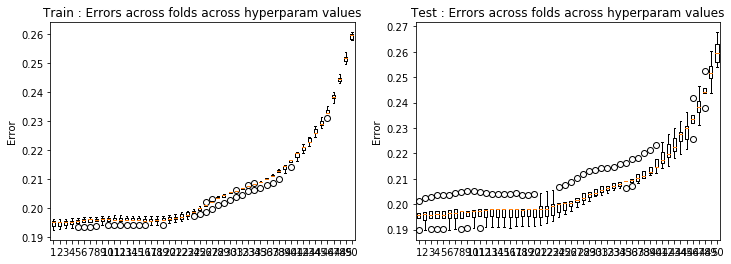

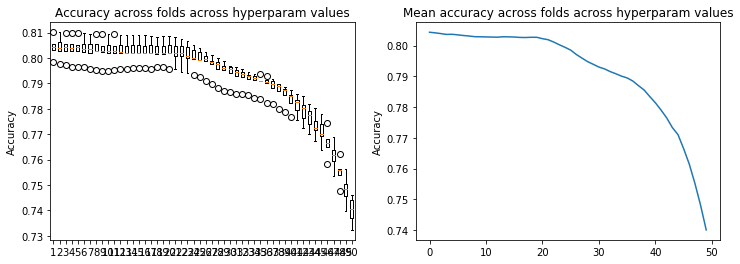

In [68]:
result_crossval(loss_tr45,loss_te45)
result_crossval_accuracy(acc45)

In [41]:
# test 46: degree 10, classification, remove correlated features and outliers, median undef 
lambdas = np.logspace(-8, 0, 50)
loss_tr46, loss_te46, w46, acc46 = cross_validation_demo(ss_y_outliers, ss_tX_outliers, degree = 10, seed = 5, k_fold = 5, class_distribution = False, error = 'classification',  method = 'rr',hyperparams=[lambdas])



Number of remaining samples before start cross val : 70754
Proportion of Bosons in all train set : 36.14212624021257 %
Proportion of Bosons in test fold 1: 35.99293286219081 %
Ridge regression: w=[-2.76431090e-01  5.24021478e+00  2.57917430e-01 -6.22843478e-01
 -1.16766152e+00  1.95844407e-01 -3.97553898e+00  1.98653071e+00
 -1.19062545e-01  6.50543925e-01  1.32992531e-02  2.36641102e-03
 -2.17648203e-01 -4.39207440e-04  5.38903042e-02 -2.77064070e-02
 -2.35611086e-03 -6.98262876e-02  1.38893348e-02  3.68985669e-02
 -4.35618528e+01 -1.64388248e+00 -3.64579226e+00  1.10059302e+01
  3.71495566e-01  1.38451356e+01 -5.23551339e+00  1.25052373e-01
  1.28790667e+00  3.26775356e-02  9.48859809e-02  8.42401869e-01
 -8.51634963e-02  3.66520998e-03  5.69310965e-01 -2.59855885e-02
 -3.64395396e-01  8.55251268e-02 -2.35842203e-02  1.15667371e+02
  5.06555831e+00  1.80584715e+01 -2.06513226e+01 -5.07860419e+00
 -1.30309263e+01  6.87094377e+00  1.09023412e+00 -3.96875804e+00
 -1.27934779e-01 -1.6573

Ridge regression: w=[-2.78869252e-01  5.15478851e+00  2.62859541e-01 -4.91341176e-01
 -1.38362643e+00  1.93440855e-01 -3.29471961e+00  1.65520118e+00
 -5.55807386e-02  6.09632851e-01  2.98638582e-02 -2.12037694e-03
  2.37432677e-01 -1.08720886e-02  2.93867456e-02  1.18818896e-01
  2.85160508e-02 -4.25646570e-01  1.40215532e-02  1.86124096e-02
 -4.30678296e+01 -1.88785805e+00 -4.63715820e+00  1.20362515e+01
  6.09736144e-02  1.16670102e+01 -3.30581326e+00  1.39702075e-01
  1.55103143e+00  6.55808354e-02  6.80370016e-02 -1.38224903e+00
 -1.12459265e-01  3.69826003e-02 -7.04782863e-01  3.05206998e-02
  1.45707444e+00  1.83224306e-01  3.74671039e-02  1.14719843e+02
  6.25596972e+00  2.07041433e+01 -2.20620918e+01 -3.68172536e+00
 -1.09768769e+01  2.95377184e+00  3.74993245e-01 -4.65568295e+00
 -1.97037699e-01 -7.42918437e-02  6.09775201e-01  5.91132492e-02
 -2.13645071e-01  4.78372614e+00 -2.19512692e-01 -9.50429872e-01
 -1.54901795e-01 -1.79198006e-01 -8.97749675e+01 -1.33749935e+01
 -2.0

Ridge regression: w=[-2.75017660e-01  4.51015982e+00  2.10912578e-01 -7.89039075e-01
 -6.63967838e-01  2.08934626e-01 -2.88693447e+00  9.71376872e-01
 -1.42687473e-01  3.54384207e-01  4.44795592e-02 -2.83866645e-02
  5.49735841e-01 -3.16628626e-04  5.64384415e-02 -1.95565392e-01
 -9.85807603e-03 -1.96328668e-01 -1.11703264e-02 -2.51815301e-03
 -3.92242983e+01 -1.22912483e+00 -3.10096912e+00  8.83510304e+00
  1.15157065e-01  1.01401084e+01 -1.35699041e+00  8.79805793e-02
  2.41651643e+00 -3.23233068e-03  7.66191466e-03 -2.25422787e+00
 -8.03909884e-02  7.24681626e-03  1.79974209e+00 -3.63860342e-02
  6.27980837e-01  1.36358782e-01  1.05431066e-01  1.06195187e+02
  3.47065129e+00  1.81516296e+01 -1.73120756e+01 -4.07511243e+00
 -8.94163178e+00  7.77999375e-01  9.75903765e-01 -6.69668949e+00
 -3.74317021e-01  6.07803478e-02  1.98904457e+00  1.38010092e-02
 -4.10462814e-01 -3.40785856e+00  1.23157260e-01 -1.97534646e-01
  2.24846094e-02 -9.19636543e-02 -8.34427215e+01 -8.04955990e+00
 -1.9

Ridge regression: w=[-2.76819780e-01  4.39069031e+00  2.10637767e-01 -4.36380358e-01
 -9.66763556e-01  1.17322286e-01 -2.37319221e+00  1.46313882e+00
 -1.03490773e-01  9.53001126e-01  3.57506079e-02 -5.49205758e-03
  4.14082205e-01 -8.89927744e-03  3.64665267e-02 -2.36297695e-01
 -2.61497700e-02 -1.46565490e-01  7.61197674e-03 -8.87704927e-03
 -3.85470928e+01 -1.19093698e+00 -4.82700761e+00  1.02228264e+01
  7.13832645e-01  8.19622808e+00 -2.66653535e+00 -4.55393703e-02
 -2.95907281e-01  5.14454762e-02  8.78771870e-02 -1.17854737e+00
 -9.33694808e-02  2.70428627e-02  2.04701885e+00  1.93903846e-02
 -2.02296419e-01  1.20242497e-01 -4.28683489e-04  1.04577351e+02
  3.10510142e+00  2.10296225e+01 -1.96719345e+01 -5.37645857e+00
 -6.84830707e+00  1.72219025e+00  8.64080976e-01 -1.63956158e+00
 -2.68865787e-01 -5.23681844e-02 -8.75864258e-01  8.03269857e-02
 -2.44448339e-01 -4.54798837e+00  3.00531067e-01  2.33785888e+00
 -9.56403134e-02  9.47071929e-02 -8.17051923e+01 -6.58876902e+00
 -2.0

Ridge regression: w=[-2.78727903e-01  3.80037932e+00  1.82576644e-01 -5.29015356e-01
 -5.58773064e-01  2.86587098e-01 -2.20325194e+00  1.14258781e+00
 -1.10594737e-01  1.06109764e+00  1.60227204e-02 -7.49109095e-05
  1.70837715e-01  1.09064190e-02  5.33290767e-02 -1.38148336e-01
  1.40892534e-02 -2.22187810e-01  5.76421298e-03  1.56162781e-02
 -3.48507652e+01 -8.29352810e-01 -4.33087145e+00  8.16589745e+00
 -5.14950028e-01  7.53862246e+00 -2.11214911e+00 -1.05546423e-01
 -4.17499455e-01  3.55938610e-02  3.06740263e-02  1.84552741e-01
 -1.06705558e-01  5.88059411e-02  1.32907970e+00  4.22871333e-02
  7.55919709e-01  9.13912973e-02 -2.95621505e-03  9.59027158e+01
  1.76381108e+00  1.99144922e+01 -1.57626499e+01 -1.81179819e+00
 -6.04120280e+00  1.73619221e+00  7.06927201e-01 -2.50108198e+00
 -1.40384705e-01 -3.75856728e-02 -2.86774393e+00 -1.23355584e-01
 -4.52770494e-01 -2.08256746e+00 -2.28237566e-02 -5.62512512e-01
 -7.95435022e-02 -1.66461478e-01 -7.43866821e+01 -4.84359025e+00
 -2.0

Ridge regression: w=[-2.76431078e-01  3.06964511e+00  1.98489248e-01 -6.43743781e-01
  1.92912286e-01  2.53052490e-01 -2.86852979e+00  1.17548838e+00
 -1.17185360e-01  5.21958299e-01  1.48958877e-02  1.60360751e-03
  3.99164464e-01  1.39028409e-04  5.24749384e-02 -9.33389539e-02
 -2.19180950e-03 -1.57491311e-01  1.39582756e-02  3.55304990e-02
 -3.03058012e+01 -1.00925711e+00 -3.76044226e+00  4.55047580e+00
 -3.32218311e-01  9.41163121e+00 -2.77067369e+00  1.20983100e-01
  7.81407137e-01  3.46833694e-02  9.22592768e-02 -1.06868737e+00
 -8.44955953e-02  4.51111669e-03  1.27825041e+00 -2.64705522e-02
  2.07820183e-01  8.64203867e-02 -2.27740887e-02  8.52467448e+01
  2.26125524e+00  1.91912803e+01 -9.95963715e+00 -1.58660610e+00
 -7.24294989e+00  3.27326323e+00  1.05689699e+00 -2.44887492e+00
 -1.40133356e-01 -1.58618866e-01 -4.29010000e-01  5.53988372e-02
 -3.41155627e-01 -2.84266988e+00  5.86334414e-02  8.17874672e-01
 -1.61056108e-01 -3.06644693e-01 -6.63412613e+01 -5.23005596e+00
 -2.1

Ridge regression: w=[-2.78869241e-01  2.99647129e+00  1.94508025e-01 -6.01163087e-01
  3.99243661e-02  2.52075771e-01 -2.39445366e+00  1.37884583e+00
 -5.42691460e-02  7.56411764e-01  3.10063642e-02 -2.63097816e-03
  3.33533813e-01 -1.02020790e-02  2.88517494e-02  1.28896718e-02
  2.92087466e-02 -3.97812872e-01  1.44960051e-02  1.74513477e-02
 -2.98701995e+01 -1.16015980e+00 -4.19959536e+00  5.27439771e+00
 -6.68940322e-01  8.03116796e+00 -2.42091742e+00  1.38527199e-01
  4.58504591e-01  6.83382999e-02  6.60076188e-02 -1.60497733e+00
 -1.10809926e-01  3.87576500e-02  3.96992283e-01  2.97820397e-02
  1.41267923e+00  1.83156700e-01  3.85891074e-02  8.42651039e+01
  3.06808733e+00  2.04624531e+01 -1.07844919e+01 -1.76984546e-02
 -6.20951282e+00  1.47944130e+00  3.48685764e-01 -2.42607253e+00
 -2.06425918e-01 -6.84516966e-02  9.62216983e-01  5.71031069e-02
 -2.10285979e-01  4.47335088e-03 -2.26184827e-01 -1.45668035e+00
 -1.59819074e-01 -1.74057904e-01 -6.54984789e+01 -6.55356334e+00
 -2.2

Ridge regression: w=[-2.75017643e-01  2.02393003e+00  1.65241163e-01 -9.62279035e-01
  7.56093837e-01  2.64787519e-01 -2.10943691e+00  9.28879283e-01
 -1.40497807e-01  8.51038614e-01  4.56456416e-02 -2.96797325e-02
  4.04139087e-01  5.34122293e-04  5.42183032e-02 -2.08945070e-01
 -1.01543409e-02 -1.94947630e-01 -1.05137014e-02 -3.64806679e-03
 -2.41288009e+01 -7.62448262e-01 -2.22299316e+00  2.28398733e+00
 -5.76775119e-01  7.10295758e+00 -1.09744486e+00  8.28154715e-02
  1.01734986e-01 -3.08595100e-04  5.88373792e-03 -1.70629705e+00
 -8.12920207e-02  9.30774005e-03  2.05811447e+00 -3.46350192e-02
  6.39308720e-01  1.35626946e-01  1.04538261e-01  7.19042442e+01
  1.44603356e+00  1.66791543e+01 -6.83113605e+00 -6.66428493e-01
 -5.15293991e+00  1.90470963e-01  9.33858668e-01 -2.71176811e+00
 -3.83344626e-01  7.24927007e-02  1.31568175e+00  9.20724113e-03
 -3.96944008e-01 -4.92616343e+00  1.21829634e-01 -4.20662169e-01
  1.67009861e-02 -8.79821437e-02 -5.74402023e+01 -3.70941257e+00
 -2.0

Ridge regression: w=[-2.76819763e-01  1.99991532e+00  1.71389043e-01 -6.52067300e-01
  6.14652282e-01  1.74101805e-01 -1.79381465e+00  1.25931853e+00
 -1.02002808e-01  9.62045825e-01  3.66566131e-02 -6.56653257e-03
  6.39324969e-01 -8.17568653e-03  3.39246713e-02 -2.30133969e-01
 -2.55747144e-02 -2.64079554e-01  7.20179444e-03 -1.06019403e-02
 -2.40387208e+01 -8.29065161e-01 -3.70724079e+00  2.81703998e+00
  4.12757355e-02  5.95273180e+00 -2.05737159e+00 -3.82430240e-02
 -6.54244808e-01  5.58294458e-02  8.52224311e-02 -2.07136035e+00
 -9.23839077e-02  2.94611106e-02  2.05084163e+00  1.85537605e-02
  4.60248836e-01  1.20314769e-01 -2.01140519e-04  7.17163402e+01
  1.63308124e+00  1.91515320e+01 -7.62422494e+00 -2.15307546e+00
 -4.10287279e+00  8.41874731e-01  8.26156161e-01 -7.56008766e-01
 -2.77614865e-01 -4.52456901e-02  6.19339213e-01  7.79851852e-02
 -2.29550407e-01 -4.79534288e+00  2.92243614e-01  8.37024491e-01
 -9.66981267e-02  1.02660456e-01 -5.71054559e+01 -3.54835910e+00
 -2.1

Ridge regression: w=[-2.78727879e-01  1.16524568e+00  1.51949220e-01 -8.63739674e-01
  1.04256517e+00  3.24816458e-01 -1.67692362e+00  8.59069664e-01
 -1.09651254e-01  1.14818818e+00  1.68162890e-02 -1.40733498e-03
  6.18214766e-01  1.16339024e-02  5.13121345e-02 -1.53070404e-01
  1.46194277e-02 -2.03984438e-01  6.10786335e-03  1.41583057e-02
 -1.89607479e+01 -5.25942892e-01 -2.47844613e+00  9.66250078e-01
 -1.00360512e+00  5.52585159e+00 -1.28917483e+00 -8.73913794e-02
 -1.27423773e+00  3.73196116e-02  2.74470773e-02 -1.56682483e+00
 -1.03435289e-01  5.88631538e-02  1.59745764e+00  4.21473900e-02
  6.55601238e-01  9.18408544e-02 -1.78314005e-03  6.03680134e+01
  4.49066267e-01  1.61354796e+01 -4.70817085e+00  6.86165436e-01
 -3.57042672e+00  6.26900049e-01  6.79294194e-01 -6.76765801e-01
 -1.47472294e-01 -2.76716461e-02 -2.11046505e-01 -1.24695393e-01
 -4.40968648e-01 -3.64312826e+00 -3.02149947e-02 -5.09744235e-01
 -8.37307160e-02 -1.58534848e-01 -4.90151704e+01 -2.00933911e+00
 -1.9

Ridge regression: w=[-2.76431043e-01  3.30003642e-01  1.63255965e-01 -1.12724315e+00
  1.60207074e+00  2.77590131e-01 -2.13681019e+00  7.61361842e-01
 -1.12739369e-01  5.15004399e-01  1.67796192e-02 -1.49548919e-04
  5.68015362e-01  1.05566482e-03  5.03177293e-02 -8.63868891e-02
 -1.78873731e-03 -2.05872478e-01  1.41407972e-02  3.33179008e-02
 -1.38814480e+01 -6.71492997e-01 -9.68349148e-01 -1.48076289e+00
 -6.46995108e-01  6.74765985e+00 -1.41950581e+00  1.15463481e-01
  2.98949495e-01  3.80751117e-02  8.76447274e-02 -1.60535711e+00
 -8.49113311e-02  6.06448950e-03  1.32809719e+00 -2.66066304e-02
  4.75827485e-01  8.76090886e-02 -2.23027984e-02  4.88384318e+01
  8.55872966e-01  1.31269757e+01 -1.37756387e+00 -1.46567340e-02
 -4.21365951e+00  1.24540236e+00  9.81649315e-01 -1.27464647e+00
 -1.54185781e-01 -1.43548447e-01  5.14177455e-01  4.98352470e-02
 -3.31095469e-01 -3.51295664e+00  5.38517926e-02  1.69700348e-01
 -1.65418130e-01 -2.94847364e-01 -4.09666935e+01 -2.30427664e+00
 -1.7

Ridge regression: w=[-2.78869205e-01  2.78230216e-01  1.48879138e-01 -1.15588388e+00
  1.48211882e+00  2.66384504e-01 -1.81030045e+00  1.17582096e+00
 -5.28347111e-02  8.10099230e-01  3.23239296e-02 -4.25147938e-03
  3.02701029e-01 -9.14170393e-03  2.77645093e-02 -1.04074417e-02
  3.00295930e-02 -3.28448112e-01  1.52030316e-02  1.55823956e-02
 -1.36158030e+01 -7.30079646e-01 -9.92859430e-01 -8.81047500e-01
 -9.00312813e-01  5.86298822e+00 -1.82676024e+00  1.36690249e-01
 -1.14258420e-01  7.19619973e-02  6.26027029e-02 -1.45084024e+00
 -1.09323960e-01  3.98245776e-02  7.12219687e-01  2.86483774e-02
  1.03655560e+00  1.82566133e-01  3.97296140e-02  4.82896816e+01
  1.34600012e+00  1.34699530e+01 -2.01280881e+00  1.33353226e+00
 -3.67887989e+00  6.64897974e-01  3.07956218e-01 -1.15881533e+00
 -2.17248943e-01 -5.41750145e-02  9.64592887e-01  5.32231541e-02
 -2.03036876e-01 -1.61683174e+00 -2.35128355e-01 -8.76803142e-01
 -1.67135620e-01 -1.66043931e-01 -4.04300891e+01 -3.14113662e+00
 -1.8

Ridge regression: w=[-2.75017591e-01 -6.41263500e-01  1.35437308e-01 -1.53543209e+00
  1.93762565e+00  2.83169403e-01 -1.53432529e+00  8.69356658e-01
 -1.35580123e-01  1.04025319e+00  4.65762813e-02 -3.18214823e-02
  2.59445924e-01  1.62866185e-03  5.13252694e-02 -1.52291666e-01
 -1.03514875e-02 -1.86639744e-01 -9.62394902e-03 -5.30133506e-03
 -8.16932183e+00 -5.04304891e-01  1.21545731e+00 -2.58897010e+00
 -8.37332594e-01  5.11228949e+00 -8.34116155e-01  8.23346314e-02
 -8.92980791e-01  4.33923089e-03  4.38866327e-03 -1.22559321e+00
 -8.41719474e-02  1.10704616e-02  1.72970447e+00 -3.04557887e-02
  5.71472477e-01  1.34700633e-01  9.99384624e-02  3.65917404e+01
  4.49371965e-01  8.93358869e+00 -2.57370514e-01  6.80281329e-01
 -3.12097957e+00 -2.53603822e-01  8.55611779e-01 -8.02338191e-01
 -3.89629340e-01  9.04348421e-02  8.75496647e-01  2.96426839e-03
 -3.78451837e-01 -4.39665156e+00  1.18220246e-01 -3.03509020e-01
  9.16884444e-03 -8.07472223e-02 -3.29811837e+01 -1.74628381e+00
 -1.5

Ridge regression: w=[-2.76819711e-01 -6.02167806e-01  1.35768505e-01 -1.27780870e+00
  1.90710305e+00  2.04710858e-01 -1.34205391e+00  1.10826101e+00
 -9.79191018e-02  9.21033678e-01  3.74083042e-02 -8.57801211e-03
  5.92005055e-01 -7.12679824e-03  3.06413906e-02 -1.86613339e-01
 -2.45088172e-02 -3.39801961e-01  6.76261888e-03 -1.26459097e-02
 -8.42123585e+00 -5.55560536e-01  6.03616664e-02 -2.59936325e+00
 -3.04912878e-01  4.40617871e+00 -1.64022330e+00 -1.38273201e-02
 -7.48594183e-01  6.09324761e-02  8.13704739e-02 -1.99171666e+00
 -9.28714823e-02  3.15933578e-02  1.76478103e+00  1.89687521e-02
  8.57449488e-01  1.20471441e-01  6.21772553e-04  3.71250993e+01
  7.11411337e-01  1.06759581e+01 -1.73741194e-01 -6.05124482e-01
 -2.54970851e+00  3.60434031e-01  7.54129383e-01 -2.95416516e-01
 -2.84919453e-01 -3.17260955e-02  9.39770513e-01  7.36991261e-02
 -2.09369929e-01 -4.12748115e+00  2.77808227e-01  4.01507901e-02
 -9.86002666e-02  1.11706261e-01 -3.31813756e+01 -1.98535924e+00
 -1.5

Ridge regression: w=[-2.78727802e-01 -1.26320482e+00  1.32495378e-01 -1.49163526e+00
  2.09371716e+00  3.28134409e-01 -1.20961490e+00  6.87832435e-01
 -1.06943813e-01  1.10149882e+00  1.72595729e-02 -3.47917788e-03
  6.22655409e-01  1.22067373e-02  4.85716344e-02 -1.03462560e-01
  1.53092344e-02 -1.85647427e-01  6.41632993e-03  1.23988019e-02
 -4.37687788e+00 -3.68020275e-01  1.34505338e+00 -3.22966083e+00
 -1.10662340e+00  3.99500484e+00 -8.09696527e-01 -4.49801337e-02
 -1.45100446e+00  3.93606614e-02  2.41076748e-02 -1.72733037e+00
 -1.01210162e-01  5.50028240e-02  1.31519974e+00  4.12152194e-02
  5.29583951e-01  9.26167083e-02 -2.20737737e-04  2.80783118e+01
 -1.50411973e-01  7.40156717e+00  6.25769985e-01  1.40215376e+00
 -2.16827759e+00  5.66324739e-02  6.32995356e-01  8.73624540e-02
 -1.51464768e-01 -1.25970344e-02  5.03101372e-01 -1.24899213e-01
 -4.22065652e-01 -3.21754614e+00 -3.89721048e-02 -2.67470633e-01
 -8.80418224e-02 -1.47656273e-01 -2.68745628e+01 -8.22656436e-01
 -1.3

Ridge regression: w=[-2.76430932e-01 -1.81355361e+00  1.38924684e-01 -1.70190144e+00
  2.30527758e+00  2.84021117e-01 -1.43802408e+00  6.29934999e-01
 -1.01931593e-01  5.44587399e-01  1.79232543e-02 -2.74616483e-03
  4.26397516e-01  2.15666372e-03  4.77841003e-02 -2.78787690e-02
 -9.98104119e-04 -2.28036271e-01  1.42848095e-02  3.05989028e-02
 -1.04332806e+00 -4.68677191e-01  2.70716367e+00 -4.14810498e+00
 -7.52440088e-01  4.54644128e+00 -8.84549257e-01  1.15607694e-01
  3.77879059e-02  4.17441060e-02  7.99021189e-02 -1.26710694e+00
 -8.64101196e-02  5.90684705e-03  9.54424389e-01 -2.39963768e-02
  5.93436185e-01  8.96979698e-02 -2.24162360e-02  2.04863792e+01
  1.27930492e-01  4.41389085e+00  1.67604151e+00  5.49556515e-01
 -2.40152078e+00  3.62502192e-01  8.42504712e-01 -7.08691058e-01
 -1.62467164e-01 -1.21968655e-01  5.77993959e-01  4.29051253e-02
 -3.15821619e-01 -2.71853558e+00  4.55941422e-02 -9.41779966e-02
 -1.69219081e-01 -2.76346700e-01 -2.15712703e+01 -1.00919535e+00
 -1.1

Ridge regression: w=[-2.78869094e-01 -1.85915045e+00  1.12417099e-01 -1.76592820e+00
  2.20722234e+00  2.51333824e-01 -1.23196838e+00  9.96970472e-01
 -5.10438032e-02  7.68383501e-01  3.30600135e-02 -6.57188584e-03
  1.65638915e-01 -7.96468909e-03  2.63401978e-02  1.37877515e-02
  3.00656300e-02 -2.86139130e-01  1.57858249e-02  1.33708296e-02
 -8.58831370e-01 -4.28842604e-01  2.87630923e+00 -3.60413238e+00
 -8.20662106e-01  4.02172826e+00 -1.38012995e+00  1.38532160e-01
 -2.52128474e-01  7.38108662e-02  5.74393474e-02 -9.77319579e-01
 -1.08100237e-01  3.56502058e-02  6.03203703e-01  2.62467449e-02
  7.89831681e-01  1.81063975e-01  4.05766247e-02  2.02174287e+01
  3.20018251e-01  4.35400938e+00  1.06979191e+00  1.32566193e+00
 -2.13340060e+00  2.22498686e-01  2.67040501e-01 -6.43281068e-01
 -2.23299388e-01 -3.54822713e-02  7.25401319e-01  4.79435313e-02
 -1.92548619e-01 -1.62144889e+00 -2.37484518e-01 -4.17684030e-01
 -1.73172504e-01 -1.53605949e-01 -2.13672953e+01 -1.48857472e+00
 -1.1

Ridge regression: w=[-2.75017432e-01 -2.38334920e+00  1.11295679e-01 -1.94925240e+00
  2.31999268e+00  2.80934081e-01 -9.25467249e-01  8.05131589e-01
 -1.24987202e-01  1.00914183e+00  4.62415216e-02 -3.37681411e-02
  9.47082562e-02  2.71678177e-03  4.81528597e-02 -6.12427945e-02
 -9.70599303e-03 -1.82074290e-01 -8.78450575e-03 -7.13720063e-03
  2.28816552e+00 -3.15322683e-01  4.17648551e+00 -4.03302732e+00
 -8.73738325e-01  3.25376578e+00 -6.40124868e-01  9.23251039e-02
 -1.00744265e+00  1.17970598e-02  3.88489154e-03 -7.09408142e-01
 -8.87083116e-02  8.07855047e-03  1.12766664e+00 -2.05552873e-02
  5.34034502e-01  1.34400914e-01  8.77928645e-02  1.34574790e+01
 -1.72063506e-01  1.41289820e+00  1.33500446e+00  1.01433639e+00
 -1.75382647e+00 -4.80047284e-01  7.26580367e-01 -2.06766110e-01
 -3.85408619e-01  1.05855299e-01  5.12252770e-01 -3.35379737e-03
 -3.54668130e-01 -2.94935231e+00  1.08084152e-01 -2.24656819e-01
  2.55707686e-03 -6.84913084e-02 -1.71401903e+01 -7.80652840e-01
 -9.3

Ridge regression: w=[-2.76819550e-01 -2.33254904e+00  1.00796487e-01 -1.74479239e+00
  2.33406092e+00  2.21439018e-01 -8.36673175e-01  9.41085885e-01
 -8.74617551e-02  8.04722051e-01  3.73324458e-02 -1.08971761e-02
  3.90134977e-01 -5.89820006e-03  2.76511702e-02 -1.17604568e-01
 -2.23072400e-02 -3.59966825e-01  6.36195701e-03 -1.35096171e-02
  2.00119409e+00 -2.99062589e-01  3.32720410e+00 -4.22370464e+00
 -4.89597311e-01  2.87618400e+00 -1.25477045e+00  3.04579592e-02
 -5.90541795e-01  6.47775517e-02  7.52674041e-02 -1.35988595e+00
 -9.48259133e-02  2.96621796e-02  1.30484673e+00  2.39446476e-02
  9.86543562e-01  1.21555979e-01  2.77398577e-03  1.40110051e+01
 -4.83136315e-02  2.50193768e+00  1.64245803e+00  1.57397842e-01
 -1.43998929e+00  5.29809888e-02  6.25757186e-01 -1.85786462e-01
 -2.84748890e-01 -1.52715873e-02  6.89229054e-01  6.69143010e-02
 -1.88099975e-01 -2.97597879e+00  2.53898729e-01 -2.65726644e-01
 -9.95688063e-02  1.13786264e-01 -1.73062778e+01 -1.00886678e+00
 -9.4

Ridge regression: w=[-2.78727567e-01 -2.62849380e+00  1.18774648e-01 -1.78971090e+00
  2.26525591e+00  3.13723652e-01 -6.87762774e-01  5.64443743e-01
 -9.96695638e-02  9.33101651e-01  1.70103007e-02 -5.37982162e-03
  4.19455864e-01  1.21845495e-02  4.45655220e-02 -3.32554851e-02
  1.60776455e-02 -1.75177133e-01  6.48468416e-03  1.06731524e-02
  3.90895257e+00 -2.64148499e-01  3.74075731e+00 -3.90097899e+00
 -1.03372491e+00  2.44971351e+00 -5.14073697e-01  1.43130102e-02
 -1.12745742e+00  4.19309211e-02  2.10793960e-02 -1.15954817e+00
 -9.89574272e-02  4.21069070e-02  8.65250982e-01  3.86220521e-02
  4.63306631e-01  9.57790214e-02  3.31285752e-03  9.57756853e+00
 -4.98371004e-01  9.48650182e-01  1.35813424e+00  1.35868429e+00
 -1.13095255e+00 -2.07748734e-01  5.48259863e-01  1.53486433e-01
 -1.49691252e-01  1.48894089e-03  3.92763852e-01 -1.21347569e-01
 -3.87782832e-01 -2.17950410e+00 -4.70109865e-02 -1.34252566e-01
 -8.97490974e-02 -1.33187883e-01 -1.40912292e+01 -2.61770997e-01
 -7.5

Ridge regression: w=[-2.76430592e-01 -2.84894523e+00  1.23339966e-01 -1.79889823e+00
  2.19157059e+00  2.80502371e-01 -7.64482074e-01  5.59711211e-01
 -8.37339285e-02  5.51319451e-01  1.76452646e-02 -6.51380086e-03
  2.07829810e-01  3.61260913e-03  4.42782138e-02  3.89395779e-02
  4.00668003e-04 -2.18657673e-01  1.40773713e-02  2.70390510e-02
  5.28316721e+00 -3.34892603e-01  4.16543364e+00 -3.83609543e+00
 -7.61075009e-01  2.57105616e+00 -6.24678458e-01  1.21608558e-01
 -7.73143976e-02  4.54397025e-02  6.71280609e-02 -6.63143306e-01
 -8.78816181e-02  1.89960689e-03  5.19832699e-01 -1.65378263e-02
  5.79205390e-01  9.47082754e-02 -2.29090674e-02  6.27891007e+00
 -3.26902944e-01 -4.07210623e-01  1.46995310e+00  6.98670431e-01
 -1.12625826e+00 -2.18506342e-02  6.36513263e-01 -4.60335710e-01
 -1.59881800e-01 -8.95933453e-02  3.31164242e-01  3.25290109e-02
 -2.87257365e-01 -1.68153433e+00  3.26025422e-02 -1.50230948e-01
 -1.69146008e-01 -2.45308975e-01 -1.16444265e+01 -3.30465940e-01
 -6.4

Ridge regression: w=[-2.78868750e-01 -2.89317576e+00  8.76811291e-02 -1.87415490e+00
  2.13519766e+00  2.28341576e-01 -6.48234292e-01  7.91229606e-01
 -4.91792503e-02  6.73635927e-01  3.27541518e-02 -9.21207661e-03
  2.13208539e-02 -6.70078674e-03  2.43182984e-02  5.10443790e-02
  2.80533603e-02 -2.58389215e-01  1.58231284e-02  1.08185161e-02
  5.44179152e+00 -2.20750771e-01  4.38853907e+00 -3.42887569e+00
 -6.55510895e-01  2.30123261e+00 -9.53107445e-01  1.41879547e-01
 -2.13553666e-01  7.20401997e-02  4.95278167e-02 -4.35424513e-01
 -1.05630019e-01  2.29334167e-02  3.84814206e-01  2.13579419e-02
  6.53587552e-01  1.78365747e-01  4.10517751e-02  6.11892255e+00
 -3.55207770e-01 -5.69656042e-01  9.54749158e-01  9.17514868e-01
 -1.01376756e+00 -6.35715324e-02  2.33978998e-01 -4.47736097e-01
 -2.20653694e-01 -1.40577465e-02  4.05201502e-01  4.04597575e-02
 -1.74512720e-01 -1.19137551e+00 -2.21026502e-01 -1.94721172e-01
 -1.73813650e-01 -1.32534374e-01 -1.16043936e+01 -5.68005559e-01
 -6.4

Ridge regression: w=[-2.75016939e-01 -3.07326274e+00  9.95817007e-02 -1.83253734e+00
  2.01107051e+00  2.67254538e-01 -3.90290003e-01  7.25589424e-01
 -1.09985979e-01  8.74228635e-01  4.35279932e-02 -3.50702177e-02
 -2.52934247e-02  3.76180653e-03  4.31517479e-02  1.69272011e-02
 -7.38924116e-03 -1.63873100e-01 -8.07885245e-03 -9.46280891e-03
  6.66443586e+00 -2.07392469e-01  4.62985013e+00 -3.15598640e+00
 -8.12677680e-01  1.69983226e+00 -5.06887563e-01  1.05803833e-01
 -7.59491512e-01  2.38925267e-02  4.17185295e-03 -2.99465408e-01
 -9.51883787e-02 -6.23190047e-04  6.24713193e-01 -4.07752448e-03
  4.66990385e-01  1.35823516e-01  6.67323375e-02  3.33811071e+00
 -5.52899860e-01 -1.60629546e+00  7.54156401e-01  9.72914739e-01
 -8.03282603e-01 -5.39687596e-01  5.60219955e-01 -1.51870037e-01
 -3.61319915e-01  1.15591386e-01  2.40086730e-01 -9.66406362e-03
 -3.11067854e-01 -1.74286574e+00  8.47159606e-02 -1.55596931e-01
 -2.14110542e-03 -4.77099963e-02 -9.82080102e+00 -2.29611694e-01
 -5.4

Ridge regression: w=[-2.76819054e-01 -3.03567669e+00  8.13770237e-02 -1.68288605e+00
  2.03254336e+00  2.24060105e-01 -3.79573572e-01  7.45092619e-01
 -7.12768857e-02  6.55478618e-01  3.56950432e-02 -1.33945181e-02
  1.97905659e-01 -4.25003599e-03  2.42917341e-02 -4.82696182e-02
 -1.77162081e-02 -3.23917062e-01  5.80681031e-03 -1.21098925e-02
  6.45393645e+00 -1.37767735e-01  4.03743335e+00 -3.34457368e+00
 -5.52567484e-01  1.55722913e+00 -8.75928065e-01  7.37209373e-02
 -3.59067855e-01  6.73136025e-02  6.59152501e-02 -6.87037662e-01
 -9.76243337e-02  2.31676796e-02  8.79241575e-01  3.41803979e-02
  8.89144132e-01  1.25311016e-01  6.40202878e-03  3.72988975e+00
 -5.63578321e-01 -9.59741924e-01  1.03407334e+00  4.73395231e-01
 -6.43972019e-01 -1.56663400e-01  4.45573256e-01 -2.00918520e-01
 -2.70959693e-01  4.69182588e-03  3.17062553e-01  5.52419542e-02
 -1.58420638e-01 -1.99063743e+00  2.10067678e-01 -2.67350877e-01
 -9.72641384e-02  1.00521501e-01 -9.88248756e+00 -3.67560413e-01
 -5.3

Ridge regression: w=[-2.78726839e-01 -3.07325604e+00  1.18449766e-01 -1.60677246e+00
  1.85300027e+00  2.89377200e-01 -2.78693466e-01  4.70920622e-01
 -8.97388443e-02  7.38477685e-01  1.57968213e-02 -7.08004617e-03
  2.34102811e-01  1.10817764e-02  3.68703733e-02  2.82200592e-02
  1.68666768e-02 -1.60784771e-01  6.05325230e-03  8.27836633e-03
  6.93297534e+00 -2.42263103e-01  3.80420797e+00 -2.71152204e+00
 -8.97772998e-01  1.28816143e+00 -3.50296683e-01  6.07658355e-02
 -6.79883444e-01  4.52200522e-02  1.81275585e-02 -5.91438646e-01
 -9.56591600e-02  2.21016807e-02  4.97927247e-01  3.42503066e-02
  4.09161547e-01  1.04452065e-01  8.53041648e-03  2.23797167e+00
 -6.39048266e-01 -1.16129088e+00  5.59839984e-01  1.11175758e+00
 -4.64498462e-01 -2.86821366e-01  4.37714584e-01 -1.51281143e-02
 -1.40093732e-01  1.52004870e-02  1.34140041e-01 -1.09179146e-01
 -3.16363084e-01 -1.37376019e+00 -5.43112590e-02 -6.64363217e-02
 -8.63731109e-02 -1.09261124e-01 -8.51410460e+00  2.36449669e-02
 -4.3

Ridge regression: w=[-2.76429541e-01 -3.08753698e+00  1.24705505e-01 -1.49445906e+00
  1.65613925e+00  2.65778722e-01 -3.17592494e-01  4.59103837e-01
 -6.63951987e-02  5.17457826e-01  1.56323523e-02 -1.24391425e-02
  8.77702781e-02  6.23313673e-03  3.81395159e-02  9.33368961e-02
  2.65688839e-03 -1.84800071e-01  1.27017020e-02  2.12505919e-02
  7.18993233e+00 -3.11347306e-01  3.63626492e+00 -2.29008513e+00
 -6.98127915e-01  1.31267840e+00 -4.26924784e-01  1.26733597e-01
 -1.20023429e-01  4.91730774e-02  5.20398429e-02 -2.59190673e-01
 -8.88076489e-02 -3.14310607e-03  1.98507402e-01 -7.05778355e-03
  4.76293836e-01  1.05327459e-01 -2.35434839e-02  1.21792628e+00
 -4.99490325e-01 -1.43216777e+00  4.55445085e-01  6.45308817e-01
 -4.18231916e-01 -1.76961756e-01  4.43529091e-01 -3.19020597e-01
 -1.43449048e-01 -3.55509016e-02  1.11573337e-01  1.12174240e-02
 -2.31121768e-01 -9.79550969e-01  1.22975827e-02 -9.86112311e-02
 -1.58891159e-01 -1.91154408e-01 -7.46929923e+00  1.19783868e-02
 -3.7

Ridge regression: w=[-2.78867690e-01 -3.12487436e+00  8.75642364e-02 -1.56290193e+00
  1.65565326e+00  2.07056879e-01 -2.53208648e-01  5.82669391e-01
 -4.85834355e-02  5.69240501e-01  3.10694149e-02 -1.26528824e-02
 -3.54038678e-02 -4.90026474e-03  2.03562193e-02  8.95253486e-02
  2.28394891e-02 -2.27853856e-01  1.45020566e-02  7.14236180e-03
  7.31787101e+00 -1.74929564e-01  3.83308386e+00 -2.09399538e+00
 -5.16709099e-01  1.18599419e+00 -6.04396615e-01  1.42628307e-01
 -1.62384962e-01  6.71362892e-02  4.05038260e-02 -1.01608168e-01
 -1.01681907e-01  7.03449436e-03  1.77807347e-01  1.46951826e-02
  5.42937863e-01  1.73923896e-01  4.05266637e-02  1.11668762e+00
 -6.17877429e-01 -1.56734302e+00  1.13986924e-01  5.85753274e-01
 -3.84247384e-01 -2.05656479e-01  2.14694095e-01 -3.30398781e-01
 -2.06523057e-01  1.64844177e-02  1.64913021e-01  2.70628930e-02
 -1.36268088e-01 -8.01867862e-01 -1.75265758e-01 -7.46577653e-02
 -1.62785163e-01 -9.69682561e-02 -7.48375609e+00 -1.03135085e-01
 -3.8

Ridge regression: w=[-2.75015416e-01 -3.09274579e+00  1.09646224e-01 -1.42662591e+00
  1.46433247e+00  2.39990167e-01 -7.51998381e-02  6.01836352e-01
 -9.82064889e-02  7.06776255e-01  3.70843541e-02 -3.58224681e-02
 -4.41913254e-02  4.99194598e-03  3.44945389e-02  7.78780832e-02
 -3.08306030e-03 -1.32258720e-01 -7.76133246e-03 -1.27872087e-02
  7.49033578e+00 -2.35696706e-01  3.61047622e+00 -1.70625440e+00
 -6.78397580e-01  8.20125401e-01 -4.01580925e-01  1.13065637e-01
 -4.87603052e-01  3.74892580e-02  4.70258988e-03 -1.09422055e-01
 -1.02154131e-01 -8.84585226e-03  2.77319490e-01  1.11836507e-02
  3.68373907e-01  1.39908536e-01  4.47581033e-02  2.68655256e-01
 -6.21061937e-01 -1.69944082e+00 -5.30103287e-02  7.69817444e-01
 -3.27547045e-01 -4.69158432e-01  4.30602368e-01 -1.80330948e-01
 -3.05298064e-01  1.21899292e-01  7.86102817e-02 -1.79954722e-02
 -2.32982785e-01 -1.01317766e+00  4.51303104e-02 -8.13855550e-02
 -3.24248546e-03 -1.62806451e-02 -6.70537273e+00  4.32348472e-02
 -3.3

Ridge regression: w=[-2.76817521e-01 -3.08035779e+00  9.06471190e-02 -1.33828350e+00
  1.47684385e+00  2.09461305e-01 -1.04756275e-01  5.49541825e-01
 -5.87116711e-02  5.14774779e-01  3.15364111e-02 -1.62357943e-02
  1.22146950e-01 -1.66513684e-03  1.91968923e-02  2.30078445e-02
 -1.01150045e-02 -2.57427016e-01  4.48469298e-03 -8.39869077e-03
  7.39109494e+00 -1.53342564e-01  3.25506851e+00 -1.81342870e+00
 -5.00101657e-01  7.96906728e-01 -5.86568613e-01  9.70459385e-02
 -1.88355277e-01  6.86483751e-02  5.62627602e-02 -3.08043392e-01
 -1.00279239e-01  1.69276752e-02  5.02701629e-01  4.36629694e-02
  6.85918855e-01  1.32983190e-01  9.35334538e-03  4.96102705e-01
 -6.84873984e-01 -1.35678985e+00  1.19934589e-01  4.75682302e-01
 -2.42461131e-01 -2.25508771e-01  3.01306617e-01 -1.94894050e-01
 -2.35378250e-01  3.08714967e-02  6.69829015e-02  3.47255505e-02
 -1.10107631e-01 -1.27648161e+00  1.40193059e-01 -1.49450277e-01
 -8.73946361e-02  6.90876174e-02 -6.74054370e+00 -3.50718180e-02
 -3.1

Ridge regression: w=[-2.78724591e-01 -2.97951316e+00  1.35432539e-01 -1.26160693e+00
  1.33094444e+00  2.51162393e-01 -4.71574708e-02  3.70934232e-01
 -8.30975223e-02  5.70117341e-01  1.32922375e-02 -8.80184048e-03
  1.62980284e-01  8.64272531e-03  2.49825680e-02  8.60079637e-02
  1.74413371e-02 -1.39122949e-01  4.44289092e-03  4.79841393e-03
  7.21779555e+00 -3.24615625e-01  2.93092924e+00 -1.36832764e+00
 -7.00948345e-01  6.75128077e-01 -2.54738238e-01  8.13675344e-02
 -3.56013123e-01  4.74039982e-02  1.58724744e-02 -3.04099065e-01
 -9.22236745e-02  5.96160363e-03  1.96379544e-01  2.97308549e-02
  3.51313502e-01  1.19088722e-01  1.17117996e-02  2.02422312e-01
 -5.61750318e-01 -1.13922617e+00 -1.44721288e-01  7.78794137e-01
 -1.77265392e-01 -2.46352479e-01  3.60115015e-01 -1.25292275e-01
 -1.19725869e-01  3.13660818e-02 -2.73114443e-02 -8.54367244e-02
 -2.04981893e-01 -8.19124088e-01 -5.94683104e-02 -2.95757908e-02
 -7.28445263e-02 -7.42108500e-02 -6.08514460e+00  1.56893364e-01
 -2.7

Ridge regression: w=[-2.76426294e-01 -2.87483856e+00  1.41466897e-01 -1.14497092e+00
  1.13810672e+00  2.37439419e-01 -7.30280840e-02  3.24048191e-01
 -5.66417259e-02  4.30169961e-01  1.18781257e-02 -1.91621990e-02
  7.91448245e-02  1.04086126e-02  3.00898224e-02  1.39659134e-01
  5.38806025e-03 -1.45425677e-01  8.60271475e-03  1.40028840e-02
  6.97389993e+00 -3.91697157e-01  2.67531002e+00 -1.00742506e+00
 -5.65509887e-01  6.86396402e-01 -2.70542205e-01  1.24330183e-01
 -8.90446151e-02  5.08701991e-02  4.05049576e-02 -1.06754503e-01
 -8.85607897e-02 -5.35865219e-03 -4.20322064e-02 -8.51816682e-04
  3.66325944e-01  1.19983826e-01 -2.42170324e-02  2.63265970e-02
 -4.30659182e-01 -1.09329748e+00 -1.64974249e-01  4.56998816e-01
 -1.49817903e-01 -1.79536773e-01  3.33604653e-01 -2.17109880e-01
 -1.13121056e-01  3.10423216e-02 -1.11047247e-02 -2.46233508e-02
 -1.55697247e-01 -5.31276760e-01 -1.14133368e-02 -4.21268604e-02
 -1.27045769e-01 -1.22412563e-01 -5.52274337e+00  1.60110324e-01
 -2.4

Ridge regression: w=[-2.78864414e-01 -2.89859660e+00  1.10544146e-01 -1.19377832e+00
  1.17470626e+00  1.83876253e-01 -3.41095492e-02  3.77447803e-01
 -4.94866775e-02  4.41972005e-01  2.77360288e-02 -1.64936005e-02
  4.85526735e-03 -2.29352771e-03  1.46899245e-02  1.29744714e-01
  1.57278547e-02 -1.92414224e-01  1.02992668e-02  3.03784160e-03
  7.05024742e+00 -2.79666350e-01  2.80287477e+00 -9.78352898e-01
 -3.90553026e-01  6.25989952e-01 -3.62835085e-01  1.37918390e-01
 -9.22884718e-02  6.13372316e-02  3.35866313e-02 -1.88957727e-03
 -9.77137396e-02 -3.23871284e-03 -1.74317006e-02  9.01583359e-03
  4.46129705e-01  1.68716370e-01  3.79461524e-02 -1.46228409e-02
 -5.38446903e-01 -1.15440686e+00 -3.45710701e-01  3.41195362e-01
 -1.46345994e-01 -1.93059702e-01  2.10699434e-01 -2.32397787e-01
 -1.79407314e-01  5.45144420e-02  2.28556282e-02  5.58156819e-03
 -8.03891205e-02 -4.78369050e-01 -1.10791771e-01 -1.60807440e-02
 -1.28922872e-01 -5.53938862e-02 -5.53854188e+00  9.98860311e-02
 -2.4

Ridge regression: w=[-2.75010711e-01 -2.74171466e+00  1.33693926e-01 -1.05688639e+00
  9.89375936e-01  1.99599633e-01  9.20626479e-02  4.11462048e-01
 -9.13277173e-02  5.04307677e-01  2.74105523e-02 -3.56797685e-02
  1.70578273e-02  6.39054021e-03  2.47147277e-02  1.29410240e-01
  1.76323782e-03 -9.69669585e-02 -8.35932010e-03 -1.60269214e-02
  6.75028129e+00 -3.62626185e-01  2.55513259e+00 -7.03037443e-01
 -4.83047886e-01  4.02164208e-01 -2.74504829e-01  1.12079476e-01
 -2.51744981e-01  4.48827139e-02  5.09493461e-03 -6.99893259e-02
 -1.05382348e-01 -1.16342429e-02  1.70708990e-02  1.83044993e-02
  2.78216013e-01  1.45431775e-01  2.95993696e-02 -1.91321588e-01
 -4.63533415e-01 -1.09872988e+00 -3.54912126e-01  4.68883324e-01
 -1.65435289e-01 -3.16937677e-01  3.61401049e-01 -1.48110860e-01
 -2.23183985e-01  1.25022841e-01 -1.65624384e-02 -2.82749583e-02
 -1.45322833e-01 -5.48057955e-01  4.32680161e-03 -3.77725577e-02
  2.37767055e-03  1.62564749e-02 -5.05617372e+00  1.60545521e-01
 -2.2

Ridge regression: w=[-2.76812785e-01 -2.75147265e+00  1.19621119e-01 -1.02509352e+00
  9.95007890e-01  1.81319193e-01  4.77958724e-02  3.48969015e-01
 -5.36061847e-02  3.67857188e-01  2.51062965e-02 -1.83317689e-02
  1.39503777e-01  1.72241406e-03  1.37174970e-02  9.48960004e-02
 -2.15059668e-03 -1.89013129e-01  1.68070838e-03 -4.06327911e-03
  6.74910795e+00 -2.98146749e-01  2.38974951e+00 -7.35823953e-01
 -3.69414160e-01  4.24291613e-01 -3.74493033e-01  1.01896720e-01
 -5.78601834e-02  6.71165188e-02  4.88866505e-02 -1.71341971e-01
 -1.00710613e-01  1.34985545e-02  1.57166284e-01  4.65217860e-02
  5.00848113e-01  1.42137607e-01  9.07374922e-03 -9.71613990e-02
 -5.22068146e-01 -9.48759524e-01 -2.81715637e-01  3.01883793e-01
 -1.09992639e-01 -1.69613991e-01  2.34522910e-01 -1.48059093e-01
 -1.81229704e-01  5.56145915e-02 -6.05957312e-02  7.21608194e-03
 -5.76366520e-02 -7.12734060e-01  6.92139521e-02 -6.24239986e-02
 -6.51584152e-02  3.40345358e-02 -5.10266051e+00  1.14691476e-01
 -2.1

Ridge regression: w=[-2.78717647e-01 -2.56058516e+00  1.55789421e-01 -9.78958425e-01
  8.76860573e-01  2.04051090e-01  9.91073791e-02  2.48372483e-01
 -7.87206446e-02  4.13886114e-01  9.83654440e-03 -9.58042928e-03
  1.60603591e-01  5.94746629e-03  1.43859739e-02  1.33656829e-01
  1.76873254e-02 -1.04798044e-01  1.27092019e-03  1.98552149e-03
  6.30977639e+00 -4.47830735e-01  2.18684041e+00 -4.84826625e-01
 -4.72504527e-01  3.50217478e-01 -1.67120923e-01  8.39707962e-02
 -1.44065163e-01  4.50463307e-02  1.44343975e-02 -1.93744589e-01
 -8.90889932e-02 -1.26994115e-03 -3.54107789e-02  2.62325317e-02
  2.80021828e-01  1.33092544e-01  1.03688070e-02 -9.48715086e-02
 -3.72181424e-01 -7.60840921e-01 -3.38006183e-01  4.19038862e-01
 -1.06922905e-01 -1.56594464e-01  3.16366635e-01 -1.35115625e-01
 -9.24706552e-02  4.38106709e-02 -1.01198669e-01 -5.92061545e-02
 -1.03962028e-01 -4.28181307e-01 -6.06739279e-02 -1.89204301e-02
 -4.64776923e-02 -4.29677113e-02 -4.64170235e+00  2.09370853e-01
 -1.9

Ridge regression: w=[-2.76416265e-01 -2.35642541e+00  1.53276030e-01 -8.79666595e-01
  6.94422087e-01  2.02604876e-01  8.89224482e-02  1.92159684e-01
 -5.03533418e-02  3.15192107e-01  7.41936894e-03 -2.20962715e-02
  1.07726102e-01  1.44868504e-02  2.38587503e-02  1.68694251e-01
  7.73128550e-03 -9.93904455e-02  1.77559700e-03  9.00779767e-03
  5.81005833e+00 -4.80452824e-01  1.99884731e+00 -2.14488167e-01
 -4.12019426e-01  3.41741267e-01 -1.54820773e-01  1.12866155e-01
 -9.10468504e-03  4.69700044e-02  3.11947511e-02 -6.70657057e-02
 -8.65802728e-02 -4.15230511e-03 -1.87525694e-01  1.20898464e-03
  2.63747602e-01  1.32504509e-01 -2.47033468e-02 -7.63323317e-02
 -2.81197809e-01 -7.22046526e-01 -2.76861280e-01  2.43554857e-01
 -9.71913645e-02 -1.17328206e-01  2.73544040e-01 -1.37245865e-01
 -8.00595703e-02  7.37954255e-02 -6.92786701e-02 -5.95541269e-02
 -9.65942551e-02 -2.58388715e-01 -2.87670466e-02 -2.13658862e-02
 -7.42639009e-02 -7.10227615e-02 -4.16288543e+00  2.04447749e-01
 -1.7

Ridge regression: w=[-2.78854296e-01 -2.36960585e+00  1.31099563e-01 -9.09624205e-01
  7.35555368e-01  1.59808605e-01  1.13641314e-01  1.97910380e-01
 -4.91705529e-02  3.08502133e-01  2.33432277e-02 -1.82422283e-02
  7.77750093e-02  2.81755145e-04  1.04763896e-02  1.57846550e-01
  1.08331987e-02 -1.40294635e-01  3.42929657e-03  7.11369697e-04
  5.84716746e+00 -4.09541598e-01  2.06864103e+00 -2.50168740e-01
 -2.77323858e-01  3.12611417e-01 -1.98998945e-01  1.27557084e-01
 -7.32706163e-03  5.37816544e-02  2.74592080e-02 -1.36381435e-02
 -9.40096727e-02 -6.84067892e-03 -1.49694532e-01  4.42722768e-03
  3.37080635e-01  1.65226836e-01  3.21276733e-02 -7.56156799e-02
 -3.39365417e-01 -7.30161158e-01 -3.62178433e-01  1.58829029e-01
 -1.01006012e-01 -1.09171184e-01  2.03923953e-01 -1.50665678e-01
 -1.47567555e-01  8.00923180e-02 -5.71380568e-02 -1.57706460e-02
 -3.52104848e-02 -2.50671610e-01 -6.20247402e-02 -3.82501089e-03
 -7.41540172e-02 -2.72397807e-02 -4.17059601e+00  1.70358511e-01
 -1.8

Ridge regression: w=[-2.74996180e-01 -2.10975656e+00  1.43304487e-01 -7.62890274e-01
  5.44845833e-01  1.60284745e-01  2.00223881e-01  2.32462806e-01
 -8.32783292e-02  3.15997875e-01  1.80421658e-02 -3.34492588e-02
  7.63237520e-02  7.41956549e-03  1.77532480e-02  1.58546782e-01
  5.57018271e-03 -5.23689947e-02 -9.71020042e-03 -1.71620878e-02
  5.28629380e+00 -4.56570369e-01  1.84845979e+00 -4.57669643e-02
 -3.05610996e-01  1.74708615e-01 -1.56447469e-01  1.06324618e-01
 -6.22030406e-02  4.19388168e-02  4.86150155e-03 -6.56577184e-02
 -1.02960867e-01 -8.64600155e-03 -1.27863641e-01  1.82576317e-02
  1.87123613e-01  1.50302573e-01  1.93089126e-02 -1.00350235e-01
 -2.82778556e-01 -7.13531209e-01 -2.87016059e-01  2.09801803e-01
 -1.38679747e-01 -1.71798337e-01  3.07054555e-01 -8.43971827e-02
 -1.50254949e-01  1.18994089e-01 -6.54228036e-02 -3.54839027e-02
 -8.51106603e-02 -2.79184363e-01 -2.10388816e-02 -2.89723516e-02
  1.27431168e-02  3.57692445e-02 -3.69375889e+00  1.84770317e-01
 -1.6

Ridge regression: w=[-2.76798159e-01 -2.12415934e+00  1.36430912e-01 -7.71958684e-01
  5.48091510e-01  1.53066177e-01  1.56017424e-01  1.81215410e-01
 -5.08958746e-02  2.43848998e-01  1.85916663e-02 -1.78299512e-02
  1.64827734e-01  4.80655381e-03  1.02758742e-02  1.40216924e-01
  3.27216231e-03 -1.11124122e-01 -1.84463997e-03 -8.73538074e-04
  5.32239977e+00 -4.19806216e-01  1.80095438e+00 -4.42059928e-02
 -2.41453511e-01  2.05439241e-01 -2.15456231e-01  9.68373809e-02
  3.46988266e-02  5.89632170e-02  4.09211468e-02 -1.18932959e-01
 -9.73456101e-02  1.13025535e-02 -5.63690922e-02  4.14707777e-02
  3.29827131e-01  1.49649995e-01  5.00698813e-03 -7.80511659e-02
 -3.18074506e-01 -6.49997280e-01 -2.64011930e-01  1.22525694e-01
 -9.71401223e-02 -8.39050738e-02  2.03250022e-01 -9.29880783e-02
 -1.31024930e-01  6.50939462e-02 -1.12381995e-01 -1.60736854e-02
 -2.36611629e-02 -3.54083935e-01  2.52872088e-02 -3.75389983e-02
 -3.69681253e-02  1.29891711e-02 -3.74082453e+00  1.59391958e-01
 -1.6

Ridge regression: w=[-2.78696200e-01 -1.84631913e+00  1.53041316e-01 -7.05848346e-01
  4.24188603e-01  1.62654314e-01  2.07193316e-01  1.49582348e-01
 -7.13774546e-02  2.94051827e-01  6.26216014e-03 -8.05290815e-03
  1.54711853e-01  4.50883868e-03  9.16942030e-03  1.53522896e-01
  1.77017007e-02 -5.04166736e-02 -1.85625227e-03  1.21236810e-03
  4.70039241e+00 -4.95205644e-01  1.62181450e+00  1.15732209e-01
 -2.94160295e-01  1.44373587e-01 -9.36630505e-02  7.77765669e-02
 -1.63120881e-02  3.42705120e-02  1.23343563e-02 -1.34150716e-01
 -8.46450229e-02 -1.83176458e-03 -1.38187128e-01  2.28020505e-02
  1.77632870e-01  1.42426071e-01  4.80434036e-03 -4.41128136e-02
 -2.29053083e-01 -5.49986991e-01 -2.18067830e-01  1.68234448e-01
 -1.18386917e-01 -8.44369315e-02  2.69844378e-01 -1.03697313e-01
 -6.82130881e-02  4.33704220e-02 -1.20013844e-01 -4.32388269e-02
 -4.92482849e-02 -2.17604110e-01 -5.92698525e-02 -2.73354210e-02
 -1.92117893e-02 -2.59683492e-02 -3.25783591e+00  1.94687207e-01
 -1.4

Ridge regression: w=[-2.76385290e-01 -1.56641480e+00  1.38418454e-01 -5.82620588e-01
  2.76042934e-01  1.67307455e-01  1.98320531e-01  1.09447654e-01
 -4.22863291e-02  2.35310479e-01  3.02442332e-03 -1.90678635e-02
  1.18257349e-01  1.64017179e-02  2.03272543e-02  1.70164709e-01
  9.34239923e-03 -3.99384023e-02 -4.21678941e-03  7.24444825e-03
  4.04716972e+00 -4.80992467e-01  1.40589763e+00  2.68863360e-01
 -2.82806826e-01  1.33330806e-01 -8.15196150e-02  9.51721112e-02
  4.58141859e-02  3.37948864e-02  1.84794829e-02 -5.24512204e-02
 -8.22809913e-02  3.00419013e-04 -2.14903257e-01  3.38346706e-04
  1.49498317e-01  1.42959777e-01 -2.42250001e-02  8.37337045e-04
 -1.89966395e-01 -5.41512029e-01 -1.33542857e-01  1.00451253e-01
 -1.12427476e-01 -6.96936784e-02  2.18733080e-01 -8.46796887e-02
 -5.38151905e-02  7.77581759e-02 -8.68196920e-02 -7.66658024e-02
 -6.37259386e-02 -1.35167044e-01 -3.73596470e-02 -2.69444421e-02
 -2.73944413e-02 -4.55587844e-02 -2.75166923e+00  1.74606040e-01
 -1.3

Ridge regression: w=[-2.78823049e-01 -1.57544752e+00  1.21914005e-01 -5.99651251e-01
  3.02277091e-01  1.37170084e-01  2.13949203e-01  9.04684925e-02
 -4.52476315e-02  2.27430383e-01  1.82278111e-02 -1.61263123e-02
  1.16208372e-01  1.91560613e-03  9.34632634e-03  1.62111851e-01
  9.47756351e-03 -6.59409226e-02 -2.24087851e-03  5.04883196e-04
  4.07145677e+00 -4.38252445e-01  1.44571322e+00  2.36417476e-01
 -1.91316120e-01  1.20784998e-01 -9.82665627e-02  1.12863386e-01
  3.64971488e-02  3.94484541e-02  1.91378725e-02 -3.67774874e-02
 -8.96758327e-02 -6.30295137e-03 -1.80963845e-01 -6.17365979e-04
  1.96807767e-01  1.65006766e-01  2.30187039e-02  1.24899870e-02
 -2.10797935e-01 -5.31413222e-01 -1.73961533e-01  5.17620408e-02
 -1.15109922e-01 -4.82975193e-02  1.81426660e-01 -9.83205211e-02
 -1.18390024e-01  8.10903076e-02 -8.87189854e-02 -2.79754467e-02
 -1.35741076e-02 -1.41171997e-01 -4.04977643e-02 -1.73370745e-02
 -2.76592455e-02 -1.49445341e-02 -2.75907377e+00  1.52590456e-01
 -1.3

Ridge regression: w=[-2.74951306e-01 -1.27112928e+00  1.21273774e-01 -4.23034506e-01
  1.58800972e-01  1.28883840e-01  2.60450025e-01  1.28035548e-01
 -7.05663624e-02  2.13027526e-01  1.01765436e-02 -2.80522001e-02
  9.52416553e-02  7.58949984e-03  1.34508056e-02  1.60662009e-01
  7.87067575e-03 -4.50034381e-04 -1.06918430e-02 -1.54593840e-02
  3.41221079e+00 -4.39505386e-01  1.17175619e+00  3.16034988e-01
 -1.87172534e-01  5.05088704e-02 -7.78312811e-02  9.74192094e-02
  3.25693776e-02  2.81509192e-02  3.29091987e-03 -5.62671569e-02
 -9.45774317e-02 -1.22861885e-03 -1.57802144e-01  1.38040062e-02
  9.06945561e-02  1.56244516e-01  1.09829581e-02  2.10224390e-02
 -1.94144132e-01 -5.37967970e-01 -8.79391727e-02  6.65169060e-02
 -1.43758590e-01 -9.03908651e-02  2.42215653e-01 -4.08841515e-02
 -1.00648990e-01  9.82778340e-02 -7.90376172e-02 -3.60656316e-02
 -5.10105881e-02 -1.61905957e-01 -3.09524663e-02 -3.77161680e-02
  1.99876405e-02  3.94925463e-02 -2.27183345e+00  1.39493178e-01
 -1.1

Ridge regression: w=[-2.76752991e-01 -1.27987887e+00  1.20492208e-01 -4.51591346e-01
  1.56603491e-01  1.30779888e-01  2.25082105e-01  8.59303762e-02
 -4.63380829e-02  1.89176887e-01  1.25468661e-02 -1.42243707e-02
  1.58567846e-01  6.75924614e-03  8.96930974e-03  1.51523718e-01
  6.55789150e-03 -2.61197454e-02 -4.19417485e-03  1.24334144e-03
  3.44304213e+00 -4.24947994e-01  1.18158403e+00  3.31267679e-01
 -1.55827832e-01  7.34549749e-02 -1.05615918e-01  8.64302433e-02
  6.04730527e-02  4.07377887e-02  2.88911624e-02 -8.58425583e-02
 -8.89872497e-02  8.89084793e-03 -1.20906930e-01  2.81658008e-02
  1.61706683e-01  1.57313558e-01 -1.51067119e-03  1.77193361e-02
 -2.11332869e-01 -5.03442298e-01 -7.93145398e-02  2.02616152e-02
 -1.13161671e-01 -3.52644719e-02  1.75238724e-01 -6.02723020e-02
 -9.35452556e-02  5.64244503e-02 -1.19365215e-01 -2.85782427e-02
 -8.30250411e-03 -1.92742942e-01  4.31663086e-03 -4.57647020e-02
 -1.78951185e-02  5.02396223e-03 -2.30495172e+00  1.27573933e-01
 -1.1

Ridge regression: w=[-2.78629976e-01 -9.99346669e-01  1.20100723e-01 -3.61173743e-01
  8.16868505e-02  1.28551577e-01  2.61584401e-01  8.97579717e-02
 -5.99788048e-02  2.35676399e-01  2.27004887e-03 -4.36364868e-03
  1.35286272e-01  3.70182914e-03  7.63867075e-03  1.49039521e-01
  1.62513268e-02  7.36643914e-03 -3.16717836e-03  1.58814600e-03
  2.82883971e+00 -4.37266587e-01  9.60912214e-01  3.68207333e-01
 -1.76837318e-01  3.49851181e-02 -3.90266569e-02  6.64573398e-02
  2.84080922e-02  1.45594042e-02  8.10726281e-03 -9.33064110e-02
 -7.68223562e-02  1.26974062e-03 -1.41906663e-01  1.79649777e-02
  7.25883666e-02  1.50942038e-01 -2.39108894e-03  4.68653781e-02
 -1.77014366e-01 -4.36348458e-01 -1.87582934e-02  4.43311197e-02
 -1.33162741e-01 -4.66135143e-02  2.14693044e-01 -7.58929914e-02
 -4.70994270e-02  3.06156316e-02 -1.12803324e-01 -3.45026836e-02
 -2.69759222e-02 -1.34034830e-01 -5.17004567e-02 -4.18498930e-02
 -4.54769711e-03 -1.79734520e-02 -1.86285839e+00  1.26634713e-01
 -9.9

Ridge regression: w=[-2.76289660e-01 -7.52023767e-01  9.84075860e-02 -2.46432814e-01
  2.36178690e-02  1.31198879e-01  2.41705628e-01  6.24054639e-02
 -3.24882418e-02  2.07001833e-01 -1.68702668e-03 -1.18964027e-02
  1.17774153e-01  1.45651082e-02  1.72732952e-02  1.51777988e-01
  8.74424511e-03  1.31076893e-02 -6.95692577e-03  6.24387333e-03
  2.27212833e+00 -3.99210604e-01  7.28228548e-01  3.75656267e-01
 -1.74985904e-01  3.48549440e-02 -3.52666562e-02  7.50026768e-02
  5.11668001e-02  1.37551539e-02  2.73331951e-03 -4.50657479e-02
 -7.53756379e-02  6.44838837e-03 -1.71825639e-01 -2.32675948e-03
  5.35630892e-02  1.56234796e-01 -2.25981766e-02  7.92292434e-02
 -1.64883303e-01 -4.18588579e-01  3.44700747e-02  2.20627924e-02
 -1.20063874e-01 -4.33832426e-02  1.67654980e-01 -5.91057188e-02
 -3.09578098e-02  5.52268991e-02 -8.74620412e-02 -7.07011489e-02
 -4.21333750e-02 -9.58289898e-02 -3.42483219e-02 -3.87620356e-02
 -3.71622160e-03 -3.15194543e-02 -1.46199006e+00  1.01527984e-01
 -8.4

Ridge regression: w=[-2.78726575e-01 -7.57237218e-01  8.53837037e-02 -2.53401367e-01
  3.57949292e-02  1.14414918e-01  2.52503196e-01  3.90554510e-02
 -3.83337522e-02  2.03791902e-01  1.13205452e-02 -1.01254399e-02
  1.21040489e-01  1.83754477e-03  1.02088334e-02  1.48930561e-01
  8.93594133e-03  7.73208440e-04 -4.52739584e-03  8.20835338e-04
  2.28995746e+00 -3.71309569e-01  7.52923255e-01  3.57082808e-01
 -1.23487557e-01  3.16752015e-02 -3.72620323e-02  9.43821230e-02
  3.48343100e-02  1.83420481e-02  9.76142608e-03 -4.37988395e-02
 -8.39945751e-02 -3.75588650e-03 -1.50998714e-01 -5.55486110e-03
  7.56143381e-02  1.69035519e-01  1.37283178e-02  8.76804371e-02
 -1.68909117e-01 -4.07845965e-01  1.18608727e-02 -1.88164410e-03
 -1.21094148e-01 -2.11645172e-02  1.53852108e-01 -7.37252936e-02
 -8.59458759e-02  6.00326659e-02 -9.14254039e-02 -2.82146237e-02
 -7.37612589e-03 -1.02760509e-01 -3.04370324e-02 -3.46304971e-02
 -5.96618358e-03 -8.75632584e-03 -1.46850511e+00  8.64040550e-02
 -8.4

Ridge regression: w=[-2.74812790e-01 -5.24657996e-01  7.79598894e-02 -1.22673194e-01
 -1.56382146e-02  1.03079904e-01  2.65062447e-01  7.09554434e-02
 -5.56425175e-02  1.86908925e-01  2.30050404e-03 -1.97912995e-02
  9.95099583e-02  6.10766255e-03  1.03023751e-02  1.47994935e-01
  7.17602887e-03  3.73097480e-02 -1.03990073e-02 -1.15267170e-02
  1.80095515e+00 -3.52767366e-01  5.18492380e-01  3.26248978e-01
 -1.09803160e-01  5.16246527e-03 -2.84571363e-02  8.27018554e-02
  5.22810146e-02  1.00383255e-02  6.25903943e-04 -4.73411622e-02
 -8.22706654e-02  6.38219473e-03 -1.36257447e-01  8.48755676e-03
  2.24936073e-02  1.65280902e-01  5.19425312e-03  9.07163197e-02
 -1.69770224e-01 -3.98276430e-01  5.56109125e-02  2.62024858e-03
 -1.30882868e-01 -4.85712863e-02  1.82761524e-01 -2.75910783e-02
 -6.03640825e-02  6.45893427e-02 -7.94274408e-02 -2.79453501e-02
 -2.92037086e-02 -1.18530572e-01 -2.57874845e-02 -4.58441260e-02
  2.01119000e-02  3.08651281e-02 -1.13146197e+00  6.65943426e-02
 -6.9

Ridge regression: w=[-2.76613567e-01 -5.28889315e-01  8.00344314e-02 -1.48780403e-01
 -2.35558771e-02  1.11891860e-01  2.41713300e-01  4.10369261e-02
 -3.90347410e-02  1.86671170e-01  5.72673808e-03 -8.71859773e-03
  1.39941133e-01  6.48684267e-03  8.73439302e-03  1.44930233e-01
  7.89157167e-03  3.28225054e-02 -5.38312877e-03  2.75997447e-03
  1.81757493e+00 -3.49274508e-01  5.41223514e-01  3.42327481e-01
 -1.00108138e-01  1.76197616e-02 -3.68532089e-02  7.08003988e-02
  4.87043588e-02  1.81028055e-02  1.57571867e-02 -6.41546057e-02
 -7.73531171e-02  6.43192067e-03 -1.18203072e-01  1.22197060e-02
  4.71944052e-02  1.66984062e-01 -6.93725268e-03  8.45591101e-02
 -1.77583367e-01 -3.76480259e-01  6.28099307e-02 -2.39437299e-02
 -1.11436914e-01 -1.47164263e-02  1.48429637e-01 -4.95611166e-02
 -5.92729279e-02  3.66209821e-02 -1.07893031e-01 -2.76385078e-02
 -2.68353965e-03 -1.31128271e-01 -2.72034723e-03 -5.55684966e-02
 -8.99303053e-03  2.19913186e-03 -1.14862703e+00  6.12799413e-02
 -6.9

Ridge regression: w=[-2.78425619e-01 -3.41908937e-01  7.13627311e-02 -1.06509766e-01
 -3.07953683e-02  1.00603986e-01  2.56312823e-01  4.72722687e-02
 -4.62338110e-02  2.14942640e-01 -2.72240241e-03 -2.83227208e-04
  1.20203297e-01  1.72105237e-03  6.69182648e-03  1.34645960e-01
  1.18297560e-02  4.20275213e-02 -3.18561781e-03  1.46396608e-03
  1.42689402e+00 -3.35300252e-01  3.88607106e-01  3.13288235e-01
 -9.96096264e-02  3.52741155e-03 -3.87255580e-03  5.06638684e-02
  3.46880920e-02 -4.83466303e-03  3.36174519e-03 -6.42048602e-02
 -6.72245755e-02  4.54652654e-03 -1.16123769e-01  1.28289822e-02
  1.02665850e-02  1.60571085e-01 -7.13039523e-03  9.05645548e-02
 -1.65639732e-01 -3.13505580e-01  8.84502782e-02 -7.75163682e-03
 -1.17503559e-01 -2.12731404e-02  1.66763147e-01 -5.86669835e-02
 -2.35342039e-02  1.38896256e-02 -9.75328232e-02 -2.25889387e-02
 -1.56317665e-02 -1.02498463e-01 -3.27817457e-02 -4.91939081e-02
  2.69025057e-05 -1.23846350e-02 -8.85242871e-01  4.99756490e-02
 -5.4

Ridge regression: w=[-2.75994690e-01 -1.90268244e-01  4.84072210e-02 -6.09898413e-02
 -2.08157446e-02  1.00369741e-01  2.25744835e-01  2.44824997e-02
 -2.10415039e-02  1.97507801e-01 -6.40002440e-03 -4.52528620e-03
  1.16115632e-01  8.86565244e-03  1.33708779e-02  1.27955072e-01
  5.20462750e-03  3.97568800e-02 -7.23126906e-03  4.05991872e-03
  1.10802797e+00 -2.99293602e-01  2.52208261e-01  2.74224868e-01
 -9.55076168e-02  1.23834389e-02 -9.42367625e-03  5.42151391e-02
  4.58337264e-02 -2.70408535e-03 -8.38032480e-03 -3.28772851e-02
 -6.79908586e-02  1.03019716e-02 -1.20636278e-01 -4.49034764e-03
  4.96316295e-03  1.70042081e-01 -2.01260406e-02  9.03168479e-02
 -1.55888398e-01 -2.81573563e-01  9.69285733e-02 -1.54369371e-02
 -9.57992089e-02 -1.98479685e-02  1.28277727e-01 -4.45298967e-02
 -8.25397198e-03  2.61570762e-02 -7.79030705e-02 -4.54458245e-02
 -2.24796402e-02 -8.25328024e-02 -1.93124790e-02 -4.22921801e-02
  3.09603660e-03 -1.88746325e-02 -6.77441894e-01  3.51879660e-02
 -4.3

Ridge regression: w=[-2.78429004e-01 -1.90946878e-01  3.88711748e-02 -5.86378230e-02
 -1.77797352e-02  9.37200043e-02  2.35898322e-01  8.02110469e-03
 -2.74346335e-02  1.96112251e-01  2.59441816e-03 -2.57655686e-03
  1.13801952e-01 -3.82797141e-04  1.09864579e-02  1.29474163e-01
  6.89824717e-03  3.47198091e-02 -4.63503128e-03  3.86715096e-04
  1.11785758e+00 -2.80934749e-01  2.66344047e-01  2.61179949e-01
 -7.25328484e-02  1.34143941e-02 -5.47786037e-03  7.20984259e-02
  3.04076398e-02  3.94512763e-04  3.06303281e-03 -3.38560618e-02
 -7.75484506e-02 -1.42245908e-03 -1.11789636e-01 -7.97773877e-03
  1.34020639e-02  1.74316668e-01  7.54884145e-03  9.51610600e-02
 -1.54317949e-01 -2.75089499e-01  8.25345432e-02 -2.51311591e-02
 -9.75203944e-02 -4.38049484e-03  1.27200904e-01 -5.71770665e-02
 -4.61623426e-02  2.95845908e-02 -7.81843141e-02 -1.75110865e-02
 -5.86232909e-03 -8.68749189e-02 -1.87496410e-02 -4.11371151e-02
 -2.53781358e-04 -2.55362874e-03 -6.79850512e-01  2.51167590e-02
 -4.3

Ridge regression: w=[-2.74385815e-01 -5.83695984e-02  2.85864741e-02 -8.60055794e-03
 -1.48227381e-02  8.25239048e-02  2.25636084e-01  2.87193282e-02
 -3.74812828e-02  1.82160389e-01 -5.16918353e-03 -1.18186330e-02
  9.77971779e-02  3.40293800e-03  7.93771178e-03  1.27883335e-01
  4.26378596e-03  5.02376111e-02 -8.72115859e-03 -7.45891837e-03
  8.60797420e-01 -2.62930384e-01  1.51866416e-01  2.16261140e-01
 -6.07864353e-02  9.32213943e-03 -2.78715058e-03  6.22398745e-02
  5.43331860e-02 -3.03859901e-03 -1.53755455e-03 -3.08538165e-02
 -7.11601310e-02  1.03761932e-02 -1.05801385e-01  5.19979644e-03
 -4.91005476e-03  1.72377001e-01  2.28623123e-03  7.62634515e-02
 -1.52870197e-01 -2.52700045e-01  8.53764303e-02 -2.02691699e-02
 -9.05075406e-02 -1.89368493e-02  1.35495969e-01 -2.31061794e-02
 -2.33635892e-02  3.21989740e-02 -6.73338433e-02 -1.48819721e-02
 -1.41149129e-02 -9.52483028e-02 -1.24641157e-02 -4.35528685e-02
  1.42662399e-02  1.89468272e-02 -5.25238996e-01  1.38105763e-02
 -3.5

Ridge regression: w=[-2.76183794e-01 -6.18096196e-02  3.09552760e-02 -2.34738046e-02
 -2.48222308e-02  9.42975361e-02  2.13020980e-01  1.19894432e-02
 -2.61209874e-02  1.85430114e-01 -1.30400101e-03 -3.82752749e-03
  1.18429217e-01  4.26011789e-03  8.56400398e-03  1.28310760e-01
  7.42283377e-03  5.31720869e-02 -6.40003111e-03  3.62837937e-03
  8.68995224e-01 -2.62349845e-01  1.68200812e-01  2.26984554e-01
 -6.23039990e-02  1.41845574e-02 -3.78225383e-03  5.18605098e-02
  4.43708821e-02  1.73600163e-03  6.95254065e-03 -3.88841117e-02
 -6.74071212e-02  4.70785104e-03 -9.83576252e-02  2.28825074e-03
  3.54975174e-04  1.73752014e-01 -8.43877943e-03  7.42006017e-02
 -1.57075791e-01 -2.40807458e-01  9.25450752e-02 -3.66677698e-02
 -8.08860435e-02 -3.88707103e-04  1.19943428e-01 -3.86769430e-02
 -2.56257027e-02  1.77535072e-02 -8.24015580e-02 -1.70469282e-02
 -5.93634918e-05 -9.99235474e-02 -1.54154915e-03 -5.23179204e-02
 -3.20237014e-03  6.22093562e-04 -5.31759683e-01  1.02018602e-02
 -3.5

Ridge regression: w=[-2.77796279e-01  3.63070618e-02  1.84172015e-02 -2.46271877e-02
 -3.97668565e-03  7.88609989e-02  2.11873849e-01  1.24565471e-02
 -2.66007110e-02  1.92274081e-01 -7.05934926e-03  2.11459919e-03
  1.02000579e-01 -6.92086550e-04  5.35905428e-03  1.12529151e-01
  6.85782120e-03  4.95988639e-02 -2.90642197e-03  3.36380409e-04
  6.79227476e-01 -2.44487315e-01  1.07856723e-01  1.99646233e-01
 -5.23108762e-02  1.46340616e-02  9.48612820e-03  3.47195474e-02
  4.30062770e-02 -1.58543551e-02  4.52455914e-04 -3.26142736e-02
 -6.00115975e-02  6.04070103e-03 -8.57298835e-02  9.11939203e-03
 -9.09041719e-03  1.65484400e-01 -7.18503052e-03  5.86498630e-02
 -1.46077962e-01 -1.92458512e-01  9.01234940e-02 -2.33098942e-02
 -7.55159576e-02 -1.81511473e-03  1.23977670e-01 -3.80493503e-02
 -1.29544316e-03  2.16335562e-03 -6.92703993e-02 -9.49057425e-03
 -7.23191547e-03 -7.99790361e-02 -1.26858915e-02 -4.38961311e-02
  1.15551484e-03 -7.59308738e-03 -4.20672683e-01  4.28845135e-03
 -2.7

Ridge regression: w=[-2.75087539e-01  1.13403250e-01 -5.69924453e-03 -1.50827091e-02
  2.30823073e-02  7.70217397e-02  1.81647885e-01 -5.78763516e-03
 -3.88193485e-03  1.76715195e-01 -8.94256875e-03 -4.81211391e-04
  1.01155812e-01  3.26247786e-03  9.90408429e-03  9.96256231e-02
  1.73490968e-03  4.19152607e-02 -6.45783646e-03  1.54526659e-03
  5.26188137e-01 -2.15538091e-01  5.32573497e-02  1.69363833e-01
 -4.72269612e-02  2.38811045e-02 -1.28866090e-03  3.75242302e-02
  5.12002446e-02 -1.16979930e-02 -1.20286380e-02 -9.77137344e-03
 -6.16860372e-02  9.81587774e-03 -7.67716304e-02 -5.04220125e-03
 -6.36749630e-03  1.74369752e-01 -1.59991026e-02  3.89122078e-02
 -1.29326204e-01 -1.69545958e-01  7.88390407e-02 -2.53174839e-02
 -5.48573830e-02 -2.47098736e-03  9.26138134e-02 -2.48519933e-02
  8.07267835e-03  7.00562332e-03 -5.21442494e-02 -2.05201687e-02
 -8.15124682e-03 -6.51756964e-02 -5.29091422e-03 -3.39057807e-02
  2.89030462e-03 -9.29089804e-03 -3.38411439e-01  2.07810405e-03
 -2.2

Ridge regression: w=[-2.77513851e-01  1.15340224e-01 -1.11997477e-02 -7.80503887e-03
  2.01179817e-02  7.56578172e-02  1.92241786e-01 -1.37328480e-02
 -8.53844557e-03  1.73254568e-01 -4.19503153e-03  2.28297153e-03
  9.49520612e-02 -2.75526091e-03  1.06532290e-02  1.02938768e-01
  4.49060366e-03  4.01838490e-02 -4.05012318e-03 -3.15868256e-04
  5.31658553e-01 -2.04336166e-01  6.16141508e-02  1.59391120e-01
 -3.84478556e-02  2.60219802e-02  2.65338342e-03  5.03584235e-02
  4.02610668e-02 -9.74624304e-03 -3.95022968e-04 -1.08208449e-02
 -7.05398717e-02 -2.54254366e-04 -7.33671573e-02 -7.16828689e-03
 -3.72615403e-03  1.73202826e-01  4.27182722e-03  4.20921854e-02
 -1.27667951e-01 -1.66477288e-01  7.00538019e-02 -2.88671802e-02
 -5.79276283e-02  5.29374123e-03  9.47514941e-02 -3.26280617e-02
 -1.28836750e-02  8.03281958e-03 -4.99975612e-02 -6.12327354e-03
 -4.09601928e-03 -6.72848419e-02 -8.68363912e-03 -3.44988275e-02
 -1.43831520e-04  2.25669782e-03 -3.38555903e-01 -5.17969841e-03
 -2.2

Ridge regression: w=[-2.73075294e-01  1.77720714e-01 -2.48701051e-02  1.19757760e-02
  3.35547241e-02  6.45205264e-02  1.75074387e-01 -3.70101240e-03
 -1.23586837e-02  1.63739130e-01 -9.02287526e-03 -6.96082827e-03
  8.34931827e-02  1.32022538e-03  6.70526048e-03  9.64885570e-02
  2.08145311e-03  4.49702212e-02 -6.67805339e-03 -4.44393586e-03
  4.11067754e-01 -1.87814426e-01  1.90939372e-02  1.29733183e-01
 -2.93725358e-02  2.82440676e-02  2.48900405e-03  4.39352388e-02
  5.82796581e-02 -1.07736448e-02 -2.69663155e-03 -6.37160113e-03
 -6.21615363e-02  1.07888313e-02 -6.71296958e-02  3.70917879e-03
 -6.19884540e-03  1.69744339e-01  1.24897168e-03  1.72234860e-02
 -1.18530108e-01 -1.53336868e-01  5.93905055e-02 -2.18331462e-02
 -4.61620522e-02 -2.05626290e-03  9.10373538e-02 -1.16715624e-02
  4.25781913e-04  1.32965933e-02 -4.09680363e-02 -5.80473057e-03
 -5.58146932e-03 -6.70958616e-02 -2.90222257e-03 -3.14545424e-02
  7.20623556e-03  1.08611026e-02 -2.80347855e-01 -7.94348084e-03
 -1.8

Ridge regression: w=[-2.74864686e-01  1.74342154e-01 -2.28284923e-02  5.11307335e-03
  2.57783215e-02  7.53608748e-02  1.68805079e-01 -1.06325392e-02
 -4.67483493e-03  1.63396027e-01 -5.44113898e-03 -1.27715385e-03
  9.18331578e-02  2.27559650e-03  8.21898919e-03  9.81411988e-02
  6.35024480e-03  4.80834207e-02 -7.17661604e-03  3.64255606e-03
  4.15834480e-01 -1.88076094e-01  2.75437960e-02  1.35088209e-01
 -3.33139689e-02  2.93928537e-02  3.39763223e-03  3.72024782e-02
  5.13293413e-02 -7.73456218e-03  2.25877117e-03 -9.20640463e-03
 -5.97137980e-02  3.62885946e-03 -6.40645306e-02 -8.77792590e-04
 -6.37150904e-03  1.70541755e-01 -5.82328285e-03  1.81786390e-02
 -1.21573226e-01 -1.47941955e-01  6.42989426e-02 -3.22149519e-02
 -4.22932682e-02  7.44312549e-03  8.46726185e-02 -1.86249540e-02
 -2.94303036e-03  7.19022790e-03 -4.70126248e-02 -8.03942252e-03
  1.54201267e-03 -6.85846851e-02  1.08857813e-03 -3.75331058e-02
  1.56909320e-03 -5.43171894e-06 -2.82051914e-01 -1.08824153e-02
 -1.8

Ridge regression: w=[-2.75870190e-01  2.13425964e-01 -3.75656099e-02  4.57529455e-03
  4.62577151e-02  6.03088927e-02  1.62956825e-01 -1.26324868e-02
  2.81736132e-04  1.58932889e-01 -7.91795297e-03  2.19246715e-03
  7.93360825e-02 -1.81623959e-03  4.24508200e-03  8.07666753e-02
  4.09132679e-03  4.17656308e-02 -2.60056539e-03 -1.12860828e-03
  3.29020691e-01 -1.70125092e-01  7.92953449e-03  1.18442425e-01
 -2.26612277e-02  3.28865069e-02  6.22137648e-03  2.64288989e-02
  5.19579068e-02 -2.02699008e-02 -8.68707625e-04 -3.44235321e-03
 -5.51294433e-02  6.12313957e-03 -4.73575763e-02  6.07550763e-03
 -6.72677864e-03  1.59991148e-01 -3.33465900e-03  1.76986138e-03
 -1.07652938e-01 -1.24563251e-01  5.40354695e-02 -2.11729494e-02
 -3.50486548e-02  6.03691313e-03  8.08298638e-02 -1.51860860e-02
  1.01930073e-02 -2.38185070e-03 -3.62284544e-02 -2.42303690e-03
 -2.37408756e-03 -5.13730805e-02 -1.65701362e-03 -3.05671042e-02
  1.56724986e-03 -4.24277858e-03 -2.37890710e-01 -1.18594189e-02
 -1.5

Ridge regression: w=[-2.72322769e-01  2.37654584e-01 -5.96598548e-02  1.36861500e-02
  6.69979094e-02  5.80350199e-02  1.40523372e-01 -2.50475671e-02
  1.77257050e-02  1.48015699e-01 -7.69096273e-03 -1.66027772e-05
  7.96402432e-02  2.33682738e-04  7.72831368e-03  6.77784454e-02
  3.96731466e-04  3.41911841e-02 -5.53447857e-03 -2.63427637e-04
  2.57827848e-01 -1.47344314e-01 -1.28636110e-02  1.02276250e-01
 -1.86133469e-02  3.67535391e-02 -4.08067468e-03  3.07569164e-02
  5.62362493e-02 -1.66532219e-02 -1.09395216e-02  9.95904832e-03
 -5.52481138e-02  6.47407652e-03 -3.55488061e-02 -4.91570216e-03
 -2.42284613e-03  1.63874772e-01 -1.02729849e-02 -1.31939178e-02
 -8.88563261e-02 -1.17876811e-01  4.35015225e-02 -2.12725861e-02
 -2.23427911e-02  3.73848514e-03  5.97979271e-02 -6.04355574e-03
  1.32162500e-02 -2.95458256e-04 -2.52011160e-02 -7.76793527e-03
 -1.17771890e-03 -3.95315677e-02  1.17523773e-03 -2.12929717e-02
  1.48683419e-03 -4.20600447e-03 -2.03139375e-01 -8.19961540e-03
 -1.3

Ridge regression: w=[-2.74724695e-01  2.40779231e-01 -6.10178391e-02  2.07887307e-02
  6.17736826e-02  5.88322270e-02  1.49737693e-01 -2.76279717e-02
  1.53959116e-02  1.43169447e-01 -6.08058113e-03  3.13799431e-03
  7.39825587e-02 -3.75206434e-03  9.23495202e-03  7.15683870e-02
  2.66855944e-03  3.40030619e-02 -3.60689355e-03 -3.47677518e-04
  2.61873831e-01 -1.42142366e-01 -7.11499573e-03  9.50809584e-02
 -1.54179698e-02  3.86699661e-02 -1.96904304e-03  3.77476887e-02
  4.95181302e-02 -1.55220677e-02 -1.93709988e-03  9.06604302e-03
 -6.19347129e-02  4.71061580e-04 -3.35485582e-02 -4.67254196e-03
 -2.20823627e-03  1.60665503e-01  2.49406843e-03 -1.08369484e-02
 -8.94828288e-02 -1.15959541e-01  3.81441457e-02 -2.26965047e-02
 -2.57408496e-02  6.50669801e-03  6.13001639e-02 -9.79519482e-03
  2.73769799e-03 -3.70871310e-04 -2.28701089e-02 -7.99129686e-04
 -2.07175346e-03 -4.04342168e-02 -3.14882483e-03 -2.29722271e-02
 -5.52770525e-04  3.74644231e-03 -2.02986661e-01 -1.40554043e-02
 -1.3

Ridge regression: w=[-2.69105205e-01  2.52818566e-01 -7.27558773e-02  3.53465746e-02
  7.07716577e-02  4.84637327e-02  1.34516463e-01 -2.47867936e-02
  1.43361335e-02  1.37483994e-01 -8.05246646e-03 -4.60049681e-03
  6.72678004e-02  4.44413000e-05  6.10371987e-03  6.31097827e-02
  1.44031846e-03  3.57705079e-02 -5.20629860e-03 -1.93070072e-03
  2.06133695e-01 -1.28894941e-01 -2.13957253e-02  7.99331518e-02
 -8.89800977e-03  3.98140088e-02 -3.93655888e-03  3.54925873e-02
  5.78287176e-02 -1.65430758e-02 -3.22100064e-03  1.15545635e-02
 -5.37702215e-02  9.38521338e-03 -2.73490826e-02  2.68008180e-03
 -2.10819263e-04  1.54653543e-01  1.00411360e-03 -2.35816925e-02
 -7.92649360e-02 -1.12306064e-01  3.01696761e-02 -1.52606363e-02
 -1.64003649e-02  2.00793120e-03  5.49449732e-02  4.68502407e-05
  8.13000958e-03  5.08411508e-03 -1.75275620e-02 -2.23523335e-03
 -1.70508210e-03 -3.61979963e-02  1.00838769e-03 -1.90475908e-02
  2.80152203e-03  5.99039206e-03 -1.75682110e-01 -1.35502011e-02
 -1.2

Ridge regression: w=[-2.70868582e-01  2.50657020e-01 -7.15235814e-02  3.22045725e-02
  6.64153280e-02  5.68244258e-02  1.31353846e-01 -2.57535838e-02
  1.92556114e-02  1.35540723e-01 -5.40229332e-03 -5.94049393e-04
  6.99865292e-02  9.96538639e-04  7.68899813e-03  6.50608237e-02
  5.40127887e-03  3.72134572e-02 -6.87817491e-03  2.95033757e-03
  2.08631822e-01 -1.29553899e-01 -1.80123106e-02  8.17583169e-02
 -1.15996604e-02  3.97771515e-02 -1.69885342e-03  3.22563962e-02
  5.46849180e-02 -1.42352285e-02 -3.77768427e-04  1.04691244e-02
 -5.24733775e-02  2.90242074e-03 -2.58012373e-02 -9.74517172e-04
 -1.39071689e-03  1.55023083e-01 -1.39119059e-03 -2.23252186e-02
 -8.14589537e-02 -1.10264038e-01  3.23245308e-02 -2.17797239e-02
 -1.49758230e-02  7.64080440e-03  5.28637330e-02 -1.64811575e-03
  5.45688538e-03  3.00448965e-03 -1.99398523e-02 -4.02498915e-03
  2.05053753e-03 -3.66874355e-02  2.50525033e-03 -2.28075277e-02
  3.69187484e-03  1.24300066e-04 -1.75917607e-01 -1.55860445e-02
 -1.2

Ridge regression: w=[-2.70085929e-01  2.48262509e-01 -8.12251436e-02  3.67070001e-02
  7.87142210e-02  4.50420556e-02  1.24514650e-01 -2.77813438e-02
  2.55239541e-02  1.27613456e-01 -5.00419359e-03  8.44937619e-04
  6.09763103e-02 -1.85071845e-03  3.59322523e-03  5.31103684e-02
  3.44930404e-03  3.23586475e-02 -2.11421388e-03 -2.05233756e-03
  1.68609239e-01 -1.16799776e-01 -2.23579950e-02  7.36594227e-02
 -5.18957220e-03  4.15450414e-02 -3.15593122e-03  2.67693345e-02
  5.32623941e-02 -2.19115452e-02 -1.65790249e-03  1.26480686e-02
 -5.07029102e-02  5.40002574e-03 -1.38407315e-02  3.25631905e-03
 -9.09806132e-04  1.43732419e-01  8.60114488e-04 -2.68178538e-02
 -7.12873585e-02 -9.92708963e-02  2.52474551e-02 -1.41031747e-02
 -9.32023030e-03  5.19389489e-03  4.90429729e-02  8.53737750e-04
  1.08994874e-02 -2.55132197e-03 -1.35333834e-02 -8.10080559e-04
 -4.22573123e-04 -2.47833268e-02  1.88780503e-03 -1.89551808e-02
  1.45643917e-03 -2.30196058e-03 -1.50422318e-01 -1.55873411e-02
 -1.1

Ridge regression: w=[-2.64123208e-01  2.36669395e-01 -9.41452770e-02  4.23659792e-02
  8.93848026e-02  4.26360277e-02  1.08003520e-01 -3.42658936e-02
  3.63681689e-02  1.20923412e-01 -3.61183533e-03 -1.12972765e-03
  5.96033690e-02 -1.15234010e-03  6.47880023e-03  4.44252537e-02
  8.59409439e-04  2.75988514e-02 -4.55769849e-03 -1.04590837e-03
  1.35565508e-01 -1.02976952e-01 -2.87456979e-02  6.83419674e-02
 -3.50576008e-03  4.11154350e-02 -9.70369186e-03  3.11188242e-02
  5.56039507e-02 -1.94826246e-02 -8.42494578e-03  1.82073364e-02
 -4.84525108e-02  3.49598397e-03 -6.94040476e-03 -4.76000218e-03
  2.50975125e-03  1.41557099e-01 -5.23017489e-03 -2.90017331e-02
 -5.83776152e-02 -9.60796607e-02  2.21612514e-02 -1.39752213e-02
 -2.40835927e-03  2.82123178e-03  3.97429144e-02  7.32358664e-03
  1.06385312e-02 -1.40288268e-03 -7.72492682e-03 -3.63703014e-03
  1.08877677e-03 -1.75662286e-02  2.41204045e-03 -1.20366950e-02
  3.77201455e-04 -1.85154502e-03 -1.28059794e-01 -1.13155642e-02
 -1.0

Ridge regression: w=[-2.66452814e-01  2.40118248e-01 -9.32827985e-02  4.72086626e-02
  8.46674702e-02  4.40994744e-02  1.14027427e-01 -3.48652230e-02
  3.56232280e-02  1.17083258e-01 -4.09200785e-03  1.60707616e-03
  5.66497314e-02 -3.71615071e-03  7.12459032e-03  4.81588769e-02
  1.46089467e-03  2.77728102e-02 -3.34261697e-03  3.75684799e-04
  1.38841298e-01 -1.01677371e-01 -2.47594611e-02  6.33851427e-02
 -2.23126364e-03  4.21063771e-02 -8.98741237e-03  3.43770403e-02
  5.17379411e-02 -1.88918845e-02 -2.46617288e-03  1.80669884e-02
 -5.28357510e-02  1.16460140e-03 -5.37171517e-03 -2.56825885e-03
  1.71811456e-03  1.38475963e-01  1.60032211e-03 -2.72563315e-02
 -6.06373490e-02 -9.43869798e-02  1.85411554e-02 -1.46370883e-02
 -5.25217474e-03  3.42972389e-03  4.04358319e-02  5.42544134e-03
  5.57197031e-03 -1.49693417e-03 -5.86214130e-03 -6.11822017e-05
 -4.25376516e-04 -1.79394561e-02 -6.28308942e-04 -1.40807030e-02
 -5.76005520e-04  2.77841905e-03 -1.28022174e-01 -1.59639220e-02
 -1.0

Ridge regression: w=[-2.57539870e-01  2.21922374e-01 -9.74810534e-02  5.21741277e-02
  8.67033064e-02  3.53845012e-02  1.01689343e-01 -3.43575418e-02
  3.45640979e-02  1.11272182e-01 -4.28482011e-03 -3.60552538e-03
  5.11768936e-02 -1.07250526e-03  5.18212806e-03  4.05436812e-02
  1.57029415e-03  2.85427871e-02 -4.16527268e-03 -1.95563057e-04
  1.12235009e-01 -9.41959668e-02 -2.72000822e-02  5.76709315e-02
  1.72429423e-03  4.19495418e-02 -1.15928796e-02  3.33930857e-02
  5.41976854e-02 -1.98185462e-02 -3.41171430e-03  1.83998633e-02
 -4.59773779e-02  7.41705629e-03 -2.72201625e-03  1.70175817e-03
  4.22882096e-03  1.31356721e-01  5.00901510e-04 -2.73364613e-02
 -5.49296320e-02 -8.90983915e-02  1.69209566e-02 -8.18072813e-03
  1.65880761e-03 -3.49760527e-04  3.65374691e-02  1.04476182e-02
  6.88475296e-03  1.73335189e-03 -2.79034411e-03 -1.53007766e-03
 -7.54812160e-05 -1.41161392e-02  1.88052540e-03 -1.03928920e-02
  7.13136493e-04  2.84317600e-03 -1.07920462e-01 -1.54413641e-02
 -9.9

Ridge regression: w=[-2.59227463e-01  2.21040056e-01 -9.73281479e-02  5.06721985e-02
  8.46280458e-02  4.11262009e-02  1.00379794e-01 -3.25335065e-02
  3.74109180e-02  1.09723960e-01 -2.74099879e-03 -7.88330184e-04
  5.18912149e-02 -3.01387248e-04  6.65575670e-03  4.24136865e-02
  4.60432152e-03  2.85233860e-02 -5.30842217e-03  1.92898773e-03
  1.13169120e-01 -9.48314734e-02 -2.63422840e-02  5.79618945e-02
  2.68801594e-04  4.17366592e-02 -8.39156874e-03  3.22205796e-02
  5.31991514e-02 -1.79682953e-02 -1.69837742e-03  1.76667736e-02
 -4.53862859e-02  2.26564665e-03 -1.76425101e-03 -7.93998634e-04
  2.84024493e-03  1.31464163e-01  1.21126843e-03 -2.68123016e-02
 -5.62495989e-02 -8.87286822e-02  1.75444214e-02 -1.22817004e-02
  2.04394388e-03  3.84104768e-03  3.60893495e-02  1.06362720e-02
  5.60015648e-03  1.43976343e-03 -4.16382908e-03 -2.85665716e-03
  1.77256226e-03 -1.43375794e-02  2.69648607e-03 -1.28092313e-02
  3.12959148e-03  3.93397826e-04 -1.08007469e-01 -1.66418190e-02
 -1.0

Ridge regression: w=[-2.53657829e-01  1.97768310e-01 -9.88315980e-02  5.00599239e-02
  8.62731575e-02  3.21090086e-02  9.26267467e-02 -3.31382643e-02
  4.15103946e-02  1.00093640e-01 -1.00049820e-03 -5.62767701e-04
  4.36249389e-02 -1.75983432e-03  3.08932780e-03  3.53164878e-02
  3.54214008e-03  2.44774859e-02 -1.44317171e-03 -2.13231011e-03
  9.37760949e-02 -8.80197385e-02 -2.33866501e-02  5.43001790e-02
  2.86058390e-03  4.18452359e-02 -1.06067424e-02  2.87346251e-02
  5.05648631e-02 -2.15668927e-02 -2.12069979e-03  1.70455727e-02
 -4.47693115e-02  4.02889460e-03  3.65527115e-03  1.24556933e-03
  2.88684895e-03  1.20993626e-01  2.41633600e-03 -2.23678192e-02
 -5.18195341e-02 -7.69843449e-02  1.58958019e-02 -7.15858197e-03
  6.58039068e-03  9.12668994e-04  3.48312610e-02  1.27628231e-02
  6.98727045e-03 -1.54305655e-03 -6.16045691e-04 -1.22749857e-03
  1.09349269e-04 -7.52955099e-03  2.25269732e-03 -1.03303790e-02
  9.31383120e-04 -1.32870183e-03 -8.78032432e-02 -1.73367881e-02
 -8.6

Ridge regression: w=[-2.41648852e-01  1.72721139e-01 -1.01574915e-01  4.74974251e-02
  8.64389550e-02  2.88458052e-02  7.99295563e-02 -3.51742808e-02
  4.64526258e-02  9.39947611e-02  8.70333225e-05 -1.99172161e-03
  3.92245648e-02 -1.99500496e-03  5.12832471e-03  2.88219752e-02
  1.64998484e-03  2.23070884e-02 -3.50862563e-03 -1.00324976e-03
  7.73586260e-02 -8.02477652e-02 -2.26022556e-02  5.30806331e-02
  2.88554567e-03  3.96879919e-02 -1.38377787e-02  3.06223141e-02
  5.15440547e-02 -1.93066511e-02 -5.86076331e-03  1.75021249e-02
 -4.03751822e-02  2.10340441e-03  5.68401671e-03 -4.18271781e-03
  5.83871180e-03  1.13936056e-01 -2.25630446e-03 -1.81683164e-02
 -4.50058642e-02 -6.91796851e-02  1.80590874e-02 -6.74106334e-03
  1.04713844e-02 -1.12469479e-03  3.23474566e-02  1.76976657e-02
  6.20262521e-03 -9.42696375e-04  1.79887151e-03 -2.76741551e-03
  1.25201385e-03 -3.75637559e-03  1.93989357e-03 -4.99794079e-03
 -3.56923893e-04 -8.03229813e-04 -7.08899344e-02 -1.46495039e-02
 -7.7

Ridge regression: w=[-2.43780230e-01  1.75526510e-01 -1.00797337e-01  5.03176613e-02
  8.31538806e-02  3.02410408e-02  8.27881184e-02 -3.53476301e-02
  4.63935638e-02  9.18844281e-02 -1.30896075e-03 -2.07849553e-04
  3.86780716e-02 -3.49629199e-03  4.71567481e-03  3.16373040e-02
  8.56161398e-04  2.20032145e-02 -2.94893716e-03  8.85496975e-04
  7.97497942e-02 -8.05443887e-02 -2.00411018e-02  4.98202503e-02
  3.56498925e-03  3.98446108e-02 -1.38367057e-02  3.21997286e-02
  4.94390282e-02 -1.90132558e-02 -2.38569722e-03  1.81149320e-02
 -4.31830687e-02  1.39535445e-03  6.90710792e-03 -1.37200833e-03
  4.71930105e-03  1.11798030e-01  1.03177517e-03 -1.68799395e-02
 -4.71639855e-02 -6.77469394e-02  1.54937690e-02 -7.01574801e-03
  8.56600135e-03 -1.23741843e-03  3.26392793e-02  1.65154569e-02
  3.88314017e-03 -9.59076086e-04  3.19434444e-03 -8.28548531e-04
  1.87245382e-04 -3.70792593e-03  3.39136433e-04 -6.71740453e-03
 -5.31580610e-04  1.35404948e-03 -7.07519376e-02 -1.76800438e-02
 -7.7

Ridge regression: w=[-2.27358237e-01  1.49808609e-01 -9.76706797e-02  4.74275943e-02
  7.76086944e-02  2.38521294e-02  7.33105005e-02 -3.44992301e-02
  4.36659655e-02  8.44266700e-02 -1.12642921e-03 -3.16684774e-03
  3.26644572e-02 -2.04305820e-03  3.59483415e-03  2.44638796e-02
  1.67096619e-03  2.23043713e-02 -3.19726374e-03  2.69176268e-04
  6.56855029e-02 -7.58290442e-02 -1.69036524e-02  4.65175265e-02
  5.77789081e-03  3.88659523e-02 -1.58417068e-02  2.97097109e-02
  4.85514341e-02 -1.88689728e-02 -3.02383400e-03  1.63938244e-02
 -3.69521213e-02  4.99898057e-03  6.43413189e-03  9.12986905e-04
  7.16822239e-03  1.03185969e-01 -3.90022432e-04 -1.27414276e-02
 -4.47022665e-02 -5.78722942e-02  1.67987593e-02 -2.24408593e-03
  1.29456349e-02 -4.42062609e-03  3.06424769e-02  1.91022798e-02
  3.89123726e-03  2.30544962e-04  4.25186887e-03 -1.61482001e-03
  2.99885492e-04 -1.49247096e-03  1.64215974e-03 -3.14878978e-03
 -1.61513569e-04  9.73158804e-04 -5.58128298e-02 -1.79018715e-02
 -6.6

Ridge regression: w=[-2.28848057e-01  1.49510988e-01 -9.81949884e-02  4.65228065e-02
  7.67526069e-02  2.68657700e-02  7.29058490e-02 -3.20878678e-02
  4.50581999e-02  8.33614131e-02 -2.63480659e-04 -1.23115517e-03
  3.29682166e-02 -1.65079975e-03  4.69958913e-03  2.58689678e-02
  3.61057359e-03  2.14346901e-02 -3.32826929e-03  9.21127509e-04
  6.58297339e-02 -7.63728255e-02 -1.71465669e-02  4.64498046e-02
  4.92054262e-03  3.86866175e-02 -1.28061237e-02  2.94458576e-02
  4.82077924e-02 -1.77111469e-02 -1.72204595e-03  1.59595327e-02
 -3.66253377e-02  1.55596916e-03  7.10196073e-03 -7.98252805e-04
  5.80523684e-03  1.03180949e-01  1.23308967e-03 -1.27496335e-02
 -4.54244284e-02 -5.82956905e-02  1.69006313e-02 -4.57023662e-03
  1.29177249e-02 -1.30906657e-03  3.06156571e-02  1.95107024e-02
  3.67928912e-03  6.07451022e-04  3.39624090e-03 -2.61787282e-03
  1.08895500e-03 -1.53346270e-03  2.24662404e-03 -4.74174532e-03
  1.67503199e-03  2.99091639e-04 -5.59744366e-02 -1.85130061e-02
 -6.6

Ridge regression: w=[-2.13538205e-01  1.25785341e-01 -9.29213642e-02  4.27344459e-02
  7.01874128e-02  2.03169285e-02  6.55282371e-02 -3.13302749e-02
  4.50347108e-02  7.36267064e-02  9.50923701e-04 -1.29498008e-03
  2.56131383e-02 -1.73950448e-03  2.19400647e-03  2.07164425e-02
  3.25562148e-03  1.85193127e-02 -8.18943803e-04 -1.72452319e-03
  5.57759472e-02 -7.13007261e-02 -1.11484725e-02  4.26648728e-02
  5.51824208e-03  3.73668556e-02 -1.43442626e-02  2.57145221e-02
  4.44478606e-02 -1.86115245e-02 -1.76810018e-03  1.34719642e-02
 -3.50963965e-02  2.31692774e-03  8.24837982e-03  3.17910759e-04
  6.03346463e-03  9.18848417e-02  1.88895372e-03 -7.16428675e-03
 -4.32983386e-02 -4.53233796e-02  1.68540171e-02 -1.42816031e-03
  1.54282879e-02 -3.78959699e-03  3.02317669e-02  2.00712804e-02
  3.54820868e-03 -9.71863314e-04  4.16387800e-03 -1.43397820e-03
  9.05139233e-05  1.51178951e-03  1.83343727e-03 -2.59916994e-03
  4.45273645e-04 -8.99329154e-04 -4.20186589e-02 -1.93476754e-02
 -5.3

Ridge regression: w=[-1.91354859e-01  1.04554637e-01 -8.77202571e-02  3.82813077e-02
  6.43166643e-02  1.71820855e-02  5.60458703e-02 -3.11325280e-02
  4.49696585e-02  6.72872087e-02  1.14784858e-03 -1.95230654e-03
  2.04360033e-02 -2.25614507e-03  3.14100657e-03  1.53854654e-02
  1.86309159e-03  1.83030269e-02 -2.41563296e-03 -6.87772986e-04
  4.68657886e-02 -6.48879760e-02 -7.63806245e-03  4.05324069e-02
  4.77540434e-03  3.42582520e-02 -1.56954055e-02  2.46009194e-02
  4.32009396e-02 -1.60993386e-02 -3.39947369e-03  1.13077812e-02
 -2.97657319e-02  1.33539611e-03  7.40035858e-03 -2.98797298e-03
  8.57131372e-03  8.10071609e-02 -1.00841345e-03 -3.47218180e-03
 -3.91048143e-02 -3.62674782e-02  1.85530028e-02 -1.20483690e-03
  1.65425646e-02 -5.29648156e-03  2.96787008e-02  2.20996492e-02
  3.04588661e-03 -5.90102650e-04  3.91961631e-03 -2.33299533e-03
  7.66522674e-04  2.56768684e-03  1.36387006e-03  1.20638198e-03
 -6.09232843e-04 -4.23923242e-04 -3.17263532e-02 -1.78857539e-02
 -4.3

Ridge regression: w=[-1.93042637e-01  1.06265718e-01 -8.75827762e-02  3.97455698e-02
  6.24301057e-02  1.80522998e-02  5.71382947e-02 -3.11639282e-02
  4.50495738e-02  6.63449085e-02  1.35066602e-05 -1.22759440e-03
  2.09340201e-02 -3.01254165e-03  2.33169455e-03  1.69406497e-02
  8.16196593e-04  1.76830476e-02 -2.18855038e-03  7.22053048e-04
  4.82981742e-02 -6.54041044e-02 -6.17567984e-03  3.86579033e-02
  5.18791990e-03  3.41618539e-02 -1.58574169e-02  2.54835722e-02
  4.21628641e-02 -1.60198841e-02 -1.64610452e-03  1.21266705e-02
 -3.15528053e-02  1.05780450e-03  8.21871441e-03 -6.15293570e-04
  7.64027521e-03  7.97931809e-02  4.72492248e-04 -2.64559483e-03
 -4.03379017e-02 -3.52751814e-02  1.69825836e-02 -1.24684500e-03
  1.55445689e-02 -5.53288787e-03  2.97874149e-02  2.14177231e-02
  2.12514475e-03 -7.86316939e-04  4.88180826e-03 -1.22032927e-03
 -1.78363959e-05  2.84318572e-03  6.07429333e-04  1.41607127e-04
 -4.29004191e-04  3.98679293e-04 -3.15281702e-02 -1.93397219e-02
 -4.3

Ridge regression: w=[-1.66931160e-01  8.69367824e-02 -7.91691480e-02  3.58420600e-02
  5.42281454e-02  1.44488000e-02  4.98035262e-02 -2.96257279e-02
  4.07648380e-02  5.89696929e-02 -3.39776238e-05 -2.41905726e-03
  1.60352082e-02 -2.13037685e-03  1.85094560e-03  1.10658613e-02
  1.55427712e-03  1.81439578e-02 -2.06235226e-03 -7.75836640e-06
  4.01356454e-02 -5.98639196e-02 -2.55211828e-03  3.45673411e-02
  6.07968845e-03  3.17986545e-02 -1.66777117e-02  2.22338516e-02
  3.92050770e-02 -1.48339424e-02 -1.93159663e-03  9.66577058e-03
 -2.61562243e-02  2.70238675e-03  6.05740855e-03  4.12765759e-04
  9.54019080e-03  6.95645143e-02 -8.82156316e-04 -7.57968480e-05
 -3.78488533e-02 -2.68281180e-02  1.68351740e-02  1.22820643e-03
  1.66296301e-02 -7.53517258e-03  2.81728417e-02  2.14442972e-02
  1.88582207e-03 -4.07575937e-04  4.33801781e-03 -1.45464082e-03
  1.16333845e-04  3.02374547e-03  1.18630130e-03  2.74045537e-03
 -3.42798044e-04 -2.56542418e-05 -2.32142533e-02 -1.91785650e-02
 -3.4

Ridge regression: w=[-1.68025017e-01  8.66712133e-02 -7.97499926e-02  3.50832004e-02
  5.38718345e-02  1.54461874e-02  4.95963267e-02 -2.77364418e-02
  4.13324788e-02  5.81492543e-02  5.31144973e-04 -1.24915121e-03
  1.63368202e-02 -2.08378505e-03  2.39364195e-03  1.18595475e-02
  2.53336935e-03  1.71277894e-02 -1.70912724e-03  2.70858279e-04
  3.99554762e-02 -6.02866265e-02 -3.10570017e-03  3.44481163e-02
  5.52545112e-03  3.16120530e-02 -1.45766800e-02  2.22179098e-02
  3.89100613e-02 -1.44102745e-02 -8.54550588e-04  9.56315732e-03
 -2.59102478e-02  8.89190697e-04  6.48714623e-03 -6.31238057e-04
  8.47761840e-03  6.95286043e-02  4.43171302e-04 -2.58981639e-04
 -3.82738398e-02 -2.73719562e-02  1.67689705e-02  1.39662077e-04
  1.64861380e-02 -5.58241391e-03  2.81971986e-02  2.16152455e-02
  2.12943448e-03  1.13430328e-04  3.95340703e-03 -2.26459136e-03
  3.96128470e-04  3.09679806e-03  1.65902147e-03  1.77676282e-03
  7.51868548e-04  3.14247099e-06 -2.33592121e-02 -1.95061026e-02
 -3.4

Ridge regression: w=[-1.43454323e-01  7.09741238e-02 -7.02429949e-02  3.14517292e-02
  4.59048761e-02  1.15782549e-02  4.30408280e-02 -2.60340372e-02
  3.85988770e-02  5.00728230e-02  8.65344529e-04 -1.28318736e-03
  1.14947447e-02 -1.34595961e-03  1.09715382e-03  8.21499741e-03
  2.45108334e-03  1.54293333e-02 -3.60939725e-04 -1.18034496e-03
  3.40876344e-02 -5.38480458e-02  8.94203737e-04  2.98978188e-02
  5.17164906e-03  2.87283011e-02 -1.48638607e-02  1.90542547e-02
  3.45465565e-02 -1.42495596e-02 -8.61202586e-04  7.03875600e-03
 -2.38929610e-02  9.73520608e-04  5.42988064e-03  9.42840851e-05
  8.63056041e-03  5.85608848e-02  1.01061196e-03  2.45478025e-03
 -3.51491265e-02 -1.89475734e-02  1.53427578e-02  1.40299783e-03
  1.62813084e-02 -6.86310686e-03  2.73754179e-02  2.02538797e-02
  1.60427586e-03 -7.64821796e-04  3.21062878e-03 -1.12156590e-03
 -8.72119020e-05  3.29588213e-03  1.32484267e-03  3.12314853e-03
  1.74391248e-04 -7.07495218e-04 -1.62844948e-02 -1.90480900e-02
 -2.5

Ridge regression: w=[-1.16475525e-01  5.75120295e-02 -6.12134909e-02  2.71607367e-02
  3.93647486e-02  9.47724125e-03  3.58497827e-02 -2.44903760e-02
  3.60398408e-02  4.41907749e-02  5.77270354e-04 -1.32053691e-03
  7.93421799e-03 -1.79663056e-03  1.41634923e-03  4.88345804e-03
  1.48840834e-03  1.51202719e-02 -1.35403886e-03 -3.98423642e-04
  2.84812336e-02 -4.68484790e-02  2.40480099e-03  2.65088589e-02
  4.24009049e-03  2.50114613e-02 -1.47731741e-02  1.73329221e-02
  3.17314825e-02 -1.20275858e-02 -1.58777449e-03  4.86043005e-03
 -1.96343838e-02  7.32678876e-04  3.77903791e-03 -1.79753856e-03
  9.68784414e-03  4.83602833e-02 -5.82719409e-04  3.55709878e-03
 -3.09977423e-02 -1.39025715e-02  1.46781476e-02  1.14861442e-03
  1.52460820e-02 -7.45315455e-03  2.64842411e-02  1.97885308e-02
  1.23901847e-03 -3.96568732e-04  2.14223459e-03 -1.74126186e-03
  3.35264517e-04  2.72051447e-03  9.15028818e-04  4.91252487e-03
 -4.98202089e-04 -2.96064205e-04 -1.16588841e-02 -1.74688315e-02
 -2.0

Ridge regression: w=[-1.17502857e-01  5.83236329e-02 -6.12547211e-02  2.78398997e-02
  3.85029215e-02  9.81622534e-03  3.62690215e-02 -2.44405277e-02
  3.60964660e-02  4.38456422e-02  1.35253740e-04 -1.28334325e-03
  8.51333511e-03 -1.98393445e-03  7.48675731e-04  5.55533417e-03
  8.88712674e-04  1.46963025e-02 -1.17860662e-03  3.12997701e-04
  2.91488866e-02 -4.70939655e-02  3.12566538e-03  2.56460496e-02
  4.42294442e-03  2.49632468e-02 -1.48566894e-02  1.78116947e-02
  3.13211464e-02 -1.21149783e-02 -7.76730509e-04  5.47453294e-03
 -2.07403640e-02  5.62632800e-04  4.21609275e-03 -1.74502735e-04
  9.20076918e-03  4.77648466e-02  1.16901613e-04  3.95440818e-03
 -3.14415109e-02 -1.33541516e-02  1.39294741e-02  1.16577360e-03
  1.48391253e-02 -7.59562423e-03  2.65147355e-02  1.95176796e-02
  1.02158840e-03 -7.50317230e-04  2.70799437e-03 -1.03581296e-03
 -2.70256971e-04  2.96865591e-03  6.20779842e-04  4.43581657e-03
 -2.08323157e-04 -6.83354931e-05 -1.15362616e-02 -1.79353318e-02
 -1.9

Ridge regression: w=[-9.16725559e-02  4.62254581e-02 -5.15022403e-02  2.35796320e-02
  3.15182488e-02  7.92947047e-03  3.03519733e-02 -2.20588111e-02
  3.14704201e-02  3.74719506e-02 -1.56292778e-05 -1.47699531e-03
  5.71588629e-03 -1.47222781e-03  7.49509444e-04  2.32551781e-03
  1.21629609e-03  1.41373811e-02 -9.94598283e-04 -2.76650723e-04
  2.36042903e-02 -4.05436975e-02  3.76652365e-03  2.14458612e-02
  4.39403341e-03  2.17422222e-02 -1.42585254e-02  1.54652298e-02
  2.75930861e-02 -1.05659036e-02 -9.34792714e-04  3.73811106e-03
 -1.68882370e-02  1.26009761e-03  2.36215835e-03  1.62401964e-04
  9.53132237e-03  3.93951665e-02 -7.80924258e-04  4.12046616e-03
 -2.78581358e-02 -9.65887813e-03  1.22475750e-02  1.91154407e-03
  1.37843587e-02 -8.15361960e-03  2.42533087e-02  1.79793972e-02
  7.75726683e-04 -5.29777053e-04  1.94807935e-03 -1.07172764e-03
 -8.25260430e-06  2.30161208e-03  8.22139198e-04  5.34937811e-03
 -2.23949892e-04 -3.95640903e-04 -8.11917574e-03 -1.66805456e-02
 -1.5

Ridge regression: w=[-9.22732627e-02  4.59085634e-02 -5.18378590e-02  2.30370771e-02
  3.12806080e-02  8.13602322e-03  3.01921767e-02 -2.09559950e-02
  3.16546490e-02  3.69324116e-02  3.37364065e-04 -8.59252290e-04
  5.93969231e-03 -1.57152570e-03  8.89687734e-04  2.65836650e-03
  1.61944777e-03  1.34668262e-02 -6.53602536e-04  2.72030229e-05
  2.33306933e-02 -4.07928342e-02  3.35174641e-03  2.12815536e-02
  4.10407434e-03  2.15782304e-02 -1.31019018e-02  1.54431713e-02
  2.73470392e-02 -1.05478402e-02 -1.48521006e-04  3.76863030e-03
 -1.66873341e-02  3.63594056e-04  2.57736875e-03 -4.06078519e-04
  8.92594155e-03  3.93475653e-02  4.63191482e-05  3.90249012e-03
 -2.81051733e-02 -9.99189232e-03  1.21045974e-02  1.48956676e-03
  1.36400241e-02 -7.10370002e-03  2.42481140e-02  1.79851048e-02
  1.05485040e-03 -9.19422992e-05  1.82491948e-03 -1.63823233e-03
  5.09437826e-05  2.37782134e-03  1.14825686e-03  4.87432854e-03
  3.93900703e-04 -1.48805447e-04 -8.26172676e-03 -1.68760282e-02
 -1.5

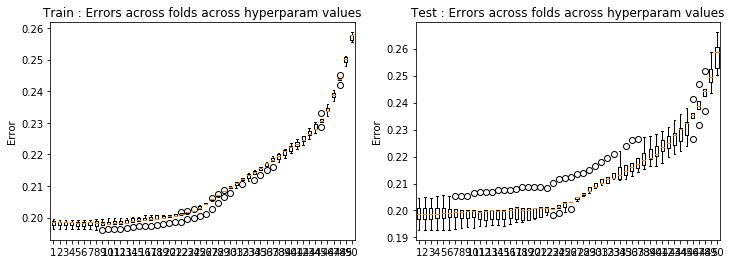

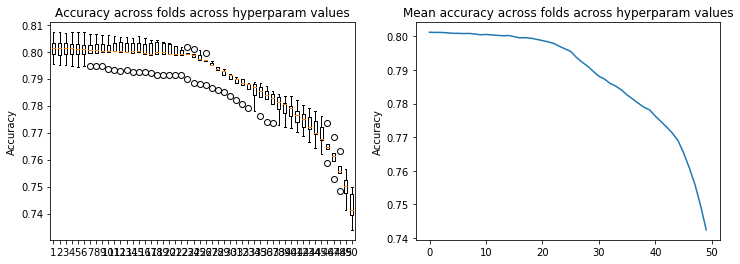

In [69]:
result_crossval(loss_tr41,loss_te41)
result_crossval_accuracy(acc41)

In [ ]:
# regarder l'impact degree sur tradeoff bias variance 
# il faut choisir le meilleur lambda pour chaque degree, concatener les loss_tr, loss_te pour cet valeurs 
bias_variance_decomposition_visualization(degrees, loss_tr, loss_te)

### Feature selection 

In [ ]:
# On ordonne les colonnes de la matrice de la moins bonne a la meilleure
ranked_index_ss1, ranked_features_ss1 = plot_correlation_matrix(ss_tX_outliers, ss_y_outliers, np.append(labels_1,'Output'), "CorrelationMatrix_ss1.png")
ss_tX_outliers_ranked = ss_tX_outliers[:,ranked_index_ss1]

In [ ]:
# test 47,  degree 1, rmse, remove correlated features and outliers, median undef, feature selection based on correlation coef
# On lance la cross val qui va iterer sur le nombre de best features que l'on prend et les valeurs de lambdas 
# format error/accuracy doit etre nb features x nb lambdas x nb folds
lambdas = np.logspace(-8, 0, 50)
loss_tr, loss_te, w, accu = cross_validation_demo_featselect(ss_y_outliers, ss_tX_outliers_ranked, degree = 1, seed = 14, k_fold = 4, class_distribution = False, error ='class', method='rr',hyperparams=[lambdas])


    